# **Facial Emotion Detection**


---
## **Context**
---

Deep learning has been increasingly applied to tasks involving less structured data types like images, texts, audio, and video in recent years. These endeavors often aim to achieve human-like proficiency in processing such data, leveraging our innate ability to intelligently interact with complex, unstructured information. Within the realm of AI, a field known as Artificial Emotional Intelligence, or Emotion AI, focuses on creating technologies that can understand human emotions by analyzing body language, facial expressions, and voice tones, and respond to them effectively.

Recognizing facial expressions plays a vital role in human-computer interaction. Research indicates that facial expressions and other visual signals account for about 55% of how we convey emotions. Thus, developing a model capable of accurately recognizing facial emotions is a significant stride toward equipping machines with AI that exhibits emotionally intelligent behavior. Systems that can automatically recognize facial expressions have a broad range of potential applications, from understanding human behavior to diagnosing psychological conditions, and improving the interaction quality of virtual assistants in customer service settings.

---

## **Objective**

---

The goal of this project is to use Deep Learning and Artificial Intelligence techniques to create a computer vision model that can accurately detect facial emotions. The model should be able to perform multi-class classification on images of facial expressions, to classify the expressions according to the associated emotion.

---

## **Key Questions**

---

Throughout the project, we will be answering the following questions:

- How accurately can the deep learning model identify and classify different facial emotions (happy, sad, surprise, neutral) from images?
- How well does the model generalize to new, unseen images? Can it maintain high accuracy across the test, train, and validation datasets?
- How does the different model architectures compare in terms of accuracy to classify the different emotions?
- What are the potential applications of the developed model, and what implications might its deployment have in some industry fields?

---

## **Problem Formulation**

---

We are tasked with leveraging Deep Learning techniques to develop a computer vision model capable of accurately detecting and classifying facial emotions. The model needs to distinguish between four specific emotions (happy, sad, surprise, neutral) based on images of facial expressions. This task involves multi-class classification, requiring the model to predict the correct category of emotion for each image it processes.

---

## **About the dataset**

---

The data set consists of 3 folders, i.e., 'test', 'train', and 'validation'.
Each of these folders has four subfolders:

**‘happy’**: Images of people who have happy facial expressions.<br>
**‘sad’**: Images of people with sad or upset facial expressions.<br>
**‘surprise’**: Images of people who have shocked or surprised facial expressions.<br>
**‘neutral’**: Images of people showing no prominent emotion in their facial expression at all.<br>


## **Mounting the Drive**

**NOTE:** Please use Google Colab from your browser for this notebook. **Google.colab is NOT a library that can be downloaded locally on your device.**


In [1]:
# from google.colab import drive
# drive.mount("/content/drive")

## **Importing the Libraries**


In [2]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import os
import zipfile
import random
from PIL import Image
from typing import List
from datetime import datetime

# For Data Visualization
import seaborn as sns

# For Model Building
import tensorflow as tf
import keras
from tensorflow.keras.models import Sequential, Model  # Sequential API for sequential model
from tensorflow.keras.layers import Dense, Dropout, Flatten  # Importing different layers
from tensorflow.keras.layers import Conv2D, MaxPooling2D, GlobalAveragePooling2D
from tensorflow.keras import backend
from tensorflow.keras.optimizers import Adam, SGD  # Optimizers for optimizing the model
from tensorflow.keras.callbacks import EarlyStopping  # Regularization method to prevent the overfitting
from tensorflow.keras.callbacks import ModelCheckpoint, ReduceLROnPlateau
from tensorflow.keras.preprocessing.image import load_img, ImageDataGenerator
from sklearn.metrics import classification_report
from sklearn.metrics import confusion_matrix
from keras.applications.vgg16 import VGG16, preprocess_input
from keras.applications.resnet_v2 import ResNet50V2, preprocess_input
from keras.applications.efficientnet import EfficientNetB0, preprocess_input

2024-03-18 10:35:14.815274: E external/local_xla/xla/stream_executor/cuda/cuda_dnn.cc:9261] Unable to register cuDNN factory: Attempting to register factory for plugin cuDNN when one has already been registered
2024-03-18 10:35:14.815296: E external/local_xla/xla/stream_executor/cuda/cuda_fft.cc:607] Unable to register cuFFT factory: Attempting to register factory for plugin cuFFT when one has already been registered
2024-03-18 10:35:14.815807: E external/local_xla/xla/stream_executor/cuda/cuda_blas.cc:1515] Unable to register cuBLAS factory: Attempting to register factory for plugin cuBLAS when one has already been registered
2024-03-18 10:35:14.818898: I tensorflow/core/platform/cpu_feature_guard.cc:182] This TensorFlow binary is optimized to use available CPU instructions in performance-critical operations.
To enable the following instructions: AVX2 FMA, in other operations, rebuild TensorFlow with the appropriate compiler flags.


2024-03-18 10:35:15.363175: W tensorflow/compiler/tf2tensorrt/utils/py_utils.cc:38] TF-TRT Warning: Could not find TensorRT


### **Let us load and unzip the data**


**Note:**

- You must download the dataset from the link provided on Olympus and upload the same on your Google drive before executing the code in the next cell.
- In case of any error, please make sure that the path of the file is correct as the path may be different for you.


In [3]:
# Storing the path of the data file from the Google drive
# path = "/content/drive/MyDrive/Studies/MIT-AI-ML/11. Capstone Project/Facial_emotion_images.zip"

# The data is provided as a zip file so we need to extract the files from the zip file
# with zipfile.ZipFile(path, "r") as zip_ref:
#    zip_ref.extractall()

## **Preparing the Data**

The dataset has three folders, i.e., 'train', 'validation' and 'test'. Each of these folders has four sub-folders, namely 'happy', 'neutral', 'sad', and 'surprise'.

We will have the train and test path stored in a variable named 'SUBDIRS', and a base directory 'DATADIR'.

The names of the sub-folders, which will be the classes for our classification task will be stored in an array called 'CATEGORIES'.


In [4]:
DATADIR = "/home/iamtxena/sandbox/mit-ai/capstone/Facial_Emotion_Recognition/Facial_emotion_images"
# DATADIR = "/content/Facial_emotion_images"  # Base directory
SUBDIRS = ["train", "validation", "test"]  # Subdirectories
CATEGORIES = ["happy", "neutral", "sad", "surprise"]  # Emotion categories

We are going to check the size of one image, and then check if all the other images have the same size. In case, they are different, we'll resize the ones that are different.


In [5]:
def get_first_image_size(directory, sub_dirs, categories):
    """
    Returns the size of the first image found in the specified directories.

    Parameters:
    - directory (str): The base directory of the dataset.
    - sub_dirs (list of str): Subdirectories to search through (e.g., ['train', 'validation', 'test']).
    - categories (list of str): Categories (e.g., ['happy', 'neutral', 'sad', 'surprise']).

    Returns:
    - tuple: Size of the first image found (width, height).
    """
    for sub_dir in sub_dirs:
        for category in categories:
            path = os.path.join(directory, sub_dir, category)
            for img_name in os.listdir(path):
                img_path = os.path.join(path, img_name)
                with Image.open(img_path) as img:
                    return img.size  # Return the size of the first image found

In [6]:
# Get the size of the first image
expected_size = get_first_image_size(DATADIR, SUBDIRS, CATEGORIES)

print(f"Expected size of the first image: {expected_size}")

Expected size of the first image: (48, 48)


In [7]:
def check_image_sizes(directory, sub_dirs, categories, target_size):
    """
    Checks if all images in the specified directories match the target size.

    Parameters:
    - directory (str): The base directory of the dataset.
    - sub_dirs (list of str): Subdirectories to search through.
    - categories (list of str): Categories to search through.
    - target_size (tuple): The expected size of the images (width, height).

    Returns:
    - bool: True if all images match the target size, False otherwise.
    """
    all_match = True  # Flag to keep track of size match

    for sub_dir in sub_dirs:
        for category in categories:
            path = os.path.join(directory, sub_dir, category)
            for img_name in os.listdir(path):
                img_path = os.path.join(path, img_name)
                with Image.open(img_path) as img:
                    if img.size != target_size:
                        print(f"Image {img_path} has a different size: {img.size}, expected: {target_size}")
                        all_match = False
                        return all_match  # Return early upon first mismatch
    return all_match

In [8]:
# Check if all images match the expected size
all_match = check_image_sizes(DATADIR, SUBDIRS, CATEGORIES, expected_size)
if all_match:
    print("All images match the expected size.")
else:
    print("Not all images match the expected size.")

All images match the expected size.


## **Visualizing our Classes**

Let's look at our classes.

**Write down your observation for each class. What do you think can be a unique feature of each emotion, that separates it from the remaining classes?**


In [9]:
def visualize_emotion_images(directory: str, sub_dirs: List[str], emotion: str, image_count: int = 9) -> None:
    """
    Visualizes a specified number of images from a given emotion class directory across specified subdirectories.

    Parameters:
    - directory (str): The base directory where emotion class folders are located across subdirectories.
    - sub_dirs (List[str]): List of subdirectories ('train', 'validation', 'test') to search through.
    - emotion (str): The specific emotion class to visualize images from.
    - image_count (int): The number of images to display. Defaults to 9.

    Returns:
    - None: This function does not return any value but displays images inline.
    """
    image_paths: List[str] = []  # To store paths of images to be displayed

    # Iterate through the specified subdirectories to collect image paths
    for sub_dir in sub_dirs:
        emotion_dir: str = os.path.join(directory, sub_dir, emotion)
        if os.path.isdir(emotion_dir):
            for img_name in os.listdir(emotion_dir):
                img_path = os.path.join(emotion_dir, img_name)
                image_paths.append(img_path)

    # If there are no images found for the emotion, print a message and return
    if not image_paths:
        print(f"No images found for the specified emotion: {emotion}")
        return

    # Select a random subset of image paths
    selected_image_paths: np.ndarray = np.random.choice(image_paths, min(image_count, len(image_paths)), replace=False)

    # Setup for plotting
    fig = plt.figure(figsize=(4, 4))
    columns: int = 3
    rows: int = image_count // columns + (1 if image_count % columns else 0)

    # Iterate over the selected images and display them
    for i, image_path in enumerate(selected_image_paths, start=1):
        ax = fig.add_subplot(rows, columns, i)
        image = load_img(image_path, target_size=(48, 48))  # Ensure the image is resized to 48x48
        plt.imshow(image)
        plt.axis("off")

    plt.tight_layout()
    plt.show()

### **Happy**


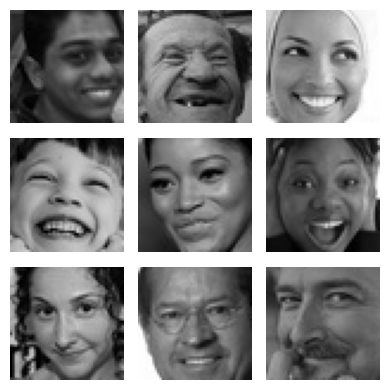

In [10]:
visualize_emotion_images(DATADIR, SUBDIRS, "happy", 9)

**Observations and Insights:**

- The images appear to be in grayscale and vary in terms of lighting, contrast, and clarity.

- The images display a range of happy expressions, from broad smiles showing teeth to subtle smiles without teeth. Also a diversity of subjects in terms of age, gender and also ethnicity.


### **Sad**


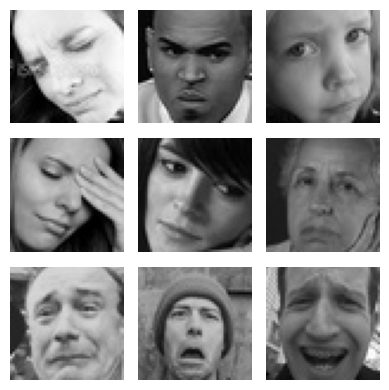

In [11]:
visualize_emotion_images(DATADIR, SUBDIRS, "sad", 9)

**Observations and Insights:**

- The images capture a wide spectrum of sadness, from subtle, somber expressions to more overt manifestations like crying.
- The dataset includes faces with different orientations and features. Some faces are directly looking at the camera, while others are tilted or partially turned away.


### **Neutral**


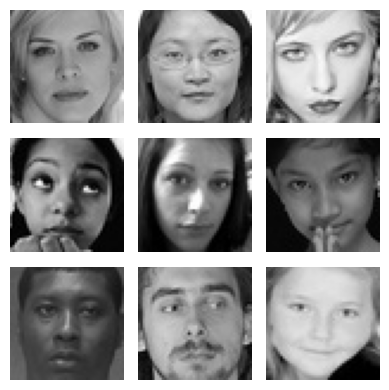

In [12]:
visualize_emotion_images(DATADIR, SUBDIRS, "neutral", 9)

**Observations and Insights:**

- The defining characteristic of these images is the absence of clear, expressive features that denote a specific emotion.
- Some faces may have subtle features that could be misconstrued as expressing a mild emotion.


### **Surprised**


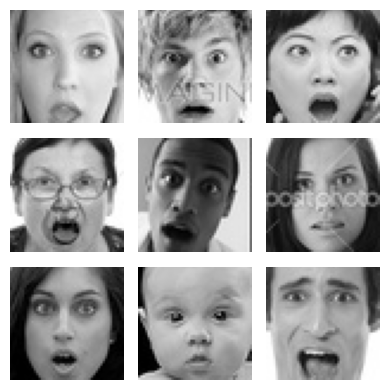

In [13]:
visualize_emotion_images(DATADIR, SUBDIRS, "surprise", 9)

**Observations and Insights:**

- The images showcase a range of intensities of surprise, from wide-eyed and open-mouthed expressions to more subdued, raised-eyebrow looks.
- The subjects vary in age, including both infants and adults.


## **Checking Distribution of Classes**


In [14]:
# Function to count images in each category
def count_images(data_dir, categories):
    counts = []
    for category in categories:
        path = os.path.join(data_dir, category)
        count = len([name for name in os.listdir(path) if os.path.isfile(os.path.join(path, name))])
        counts.append(count)
    return counts


SUBDIRS_DICT = {"train": "train", "validation": "validation", "test": "test"}

# Counting images in each dataset
train_counts = count_images(os.path.join(DATADIR, SUBDIRS_DICT["train"]), CATEGORIES)
validation_counts = count_images(os.path.join(DATADIR, SUBDIRS_DICT["validation"]), CATEGORIES)
test_counts = count_images(os.path.join(DATADIR, SUBDIRS_DICT["test"]), CATEGORIES)


# Create DataFrames and format for easier reading
def create_df(counts, categories, dataset_name):
    df = pd.DataFrame({"Class": categories, "Count": counts})
    df["Percentage"] = (df["Count"] / df["Count"].sum()) * 100
    df.set_index("Class", inplace=True)

    # Formatting for easier reading
    df["Count"] = df["Count"].apply(lambda x: f"{x:,}")  # Adds commas to thousands
    df["Percentage"] = df["Percentage"].apply(lambda x: f"{x:.2f}")  # Rounds to two decimals

    print(f"{dataset_name} Data Distribution:")
    print(df)
    total_images = df["Count"].str.replace(",", "").astype(int).sum()
    print(f"Total images in {dataset_name}: {total_images:,}\n")  # Formats total count with commas


create_df(train_counts, CATEGORIES, "Training")
create_df(validation_counts, CATEGORIES, "Validation")
create_df(test_counts, CATEGORIES, "Testing")

Training Data Distribution:
          Count Percentage
Class                     
happy     3,976      26.32
neutral   3,978      26.33
sad       3,982      26.36
surprise  3,173      21.00
Total images in Training: 15,109

Validation Data Distribution:
          Count Percentage
Class                     
happy     1,825      36.67
neutral   1,216      24.43
sad       1,139      22.89
surprise    797      16.01
Total images in Validation: 4,977

Testing Data Distribution:
         Count Percentage
Class                    
happy       32      25.00
neutral     32      25.00
sad         32      25.00
surprise    32      25.00
Total images in Testing: 128



**Observations and Insights:**

- Training Data: The training dataset shows a relatively balanced distribution among the classes of 'happy', 'neutral', and 'sad', each comprising approximately 26% of the dataset. However, 'surprise' is slightly underrepresented, making up 21% of the data. We'll see on the results if this is noticeable.
- Validation Data: In the validation dataset, there's a more pronounced imbalance. 'Happy' expressions dominate at 36.67%, followed by 'neutral' at 24.43%, 'sad' at 22.89%, and 'surprise' at 16.01%. This distribution deviates more significantly from an even split, indicating a potential bias towards 'happy' expressions.
- Testing Data: The testing dataset is perfectly balanced, with each class representing 25% of the data. This uniform distribution is ideal for evaluating the model's performance across all classes evenly.

Regarding the Exploratory Data Analysis, we can use data augmentation to balance the classes. For now, we'll see the results with the given dataset, and if necessary, we can adjust that.


**Think About It:**

- Are the classes equally distributed? If not, do you think the imbalance is too high? Will it be a problem as we progress?
- Are there any Exploratory Data Analysis tasks that we can do here? Would they provide any meaningful insights?


## **Creating our Data Loaders**

In this section, we are creating data loaders that we will use as inputs to our Neural Network.

**You have two options for the color_mode. You can set it to color_mode = 'rgb' or color_mode = 'grayscale'. You will need to try out both and see for yourself which one gives better performance.**


In [15]:
# Set this to 'grayscale' as the images are in grayscale
color_mode = "grayscale"

# As we have checked, all images are 48x48, we will set the img_width and img_height to 48
img_width, img_height = 48, 48
color_layers = 1
# A batch size of 32 is appropriate for this dataset provide to provide a good balance
# between the model's ability to generalize (avoid overfitting) and computational efficiency.
batch_size = 32

# Training Data Augmentation
train_datagen = ImageDataGenerator(
    preprocessing_function=preprocess_input,  # Use the appropriate preprocessing function
    rotation_range=20,  # Slight rotation to introduce variability without distorting emotion features
    width_shift_range=0.1,  # Slight horizontal shifts to simulate off-center faces
    height_shift_range=0.1,  # Slight vertical shifts to account for different heights/angles
    shear_range=0.1,  # Small shear transformations for slight perspective changes
    zoom_range=0.1,  # Small zoom in/out to simulate closer or further away faces
    horizontal_flip=True,  # Faces are symmetric; flipping can simulate looking from another direction
    fill_mode="nearest",  # 'nearest' interpolation for filling in new pixels after a transformation
)

# Validation and Testing Data should not be augmented!
validation_datagen = ImageDataGenerator(preprocessing_function=preprocess_input)
test_datagen = ImageDataGenerator(preprocessing_function=preprocess_input)

# Assuming train_dir, validation_dir, and test_dir should follow the structure in DATADIR and SUBDIRS
train_dir = os.path.join(DATADIR, SUBDIRS_DICT["train"])
validation_dir = os.path.join(DATADIR, SUBDIRS_DICT["validation"])
test_dir = os.path.join(DATADIR, SUBDIRS_DICT["test"])

# Train Generator
train_generator = train_datagen.flow_from_directory(
    train_dir,
    target_size=(img_width, img_height),
    batch_size=batch_size,
    color_mode=color_mode,  # Set to 'grayscale'
    class_mode="categorical",
)

# Validation Generator
validation_generator = validation_datagen.flow_from_directory(
    validation_dir,
    target_size=(img_width, img_height),
    batch_size=batch_size,
    color_mode=color_mode,  # Set to 'grayscale'
    class_mode="categorical",
)

# Testing Generator
test_generator = test_datagen.flow_from_directory(
    test_dir,
    target_size=(img_width, img_height),
    batch_size=batch_size,
    color_mode=color_mode,  # Set to 'grayscale'
    class_mode="categorical",
    shuffle=False,  # shuffle=False to keep data in order for testing
)

Found 15109 images belonging to 4 classes.


Found 4977 images belonging to 4 classes.


Found 128 images belonging to 4 classes.


Let's look at some examples of a batch of augmented training data.


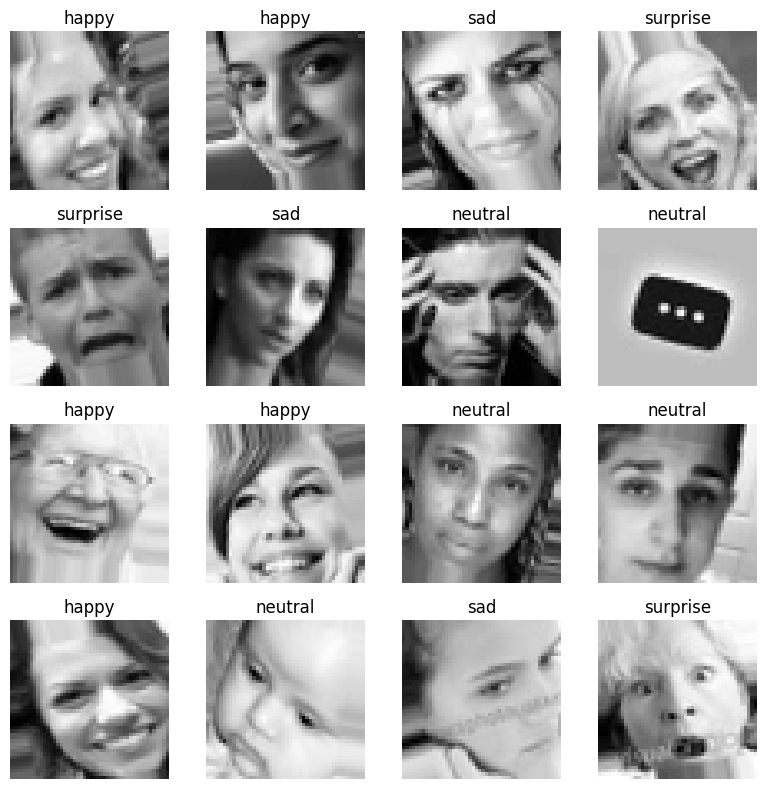

In [16]:
# Fetch a batch of images and labels
images, labels = next(train_generator)

# Assuming the labels are one-hot encoded, we need to convert them back to class indices
labels_indices = labels.argmax(axis=1)

# Mapping of indices to class names, based on the 'class_indices' attribute of the generator
index_to_class = {v: k for k, v in train_generator.class_indices.items()}

fig, axes = plt.subplots(4, 4, figsize=(8, 8))
for image, label_index, ax in zip(images, labels_indices, axes.flatten()):
    ax.imshow(image.squeeze(), cmap="gray")  # Squeeze and cmap for grayscale
    class_name = index_to_class[label_index]
    ax.set_title(class_name)
    ax.axis("off")

plt.tight_layout()
plt.show()

## **Model Building**


**Think About It:**

- Are Convolutional Neural Networks the right approach? Should we have gone with Artificial Neural Networks instead?
- What are the advantages of CNNs over ANNs and are they applicable here?


### **Creating the Base Neural Network**


### **Model 1 Architecture:**

- First CNN Model will have three convolutional blocks.
- Each convolutional block will have a Conv2D layer and a MaxPooling2D Layer.
- First Conv2D layer with **64 filters** and a **kernel size of 3x3**. Using the **'same' padding** and providing the **input shape = (48, 48, 1)**. Using **'relu' activation**.
- Adding MaxPooling2D layer with **kernel size 3x3** and using **padding = 'same'**.
- Adding a second Conv2D layer with **32 filters** and **a kernel size of 3x3**. Using the **'same' padding** and **'relu activation**.
- Following it up with another MaxPooling2D layer **kernel size 3x3** and using **padding = 'same'**.
- Adding a third Conv2D layer with **32 filters and the kernel size of 3x3**. Using the **'same' padding** and **'relu activation**. Once again, following it up with another Maxpooling2D layer with **kernel size 3x3** and **padding = 'same'**.
- Once the convolutional blocks are added, we add the Flatten layer.
- Finally, we add dense layers.
- Adding first Dense layer with **100 neurons** and **'relu' activation**
- The last dense layer needs to have as many neurons as the number of classes, which in this case is 4 and use **'softmax' activation**.
- As an optimizer we will use SGD optimizer with **learning rate = 0.01** and **momentum = 0.9**


In [17]:
backend.clear_session()

# Fixing the seed for random number generators so that we can ensure we receive the same output everytime
np.random.seed(42)

random.seed(42)
tf.random.set_seed(42)

In [18]:
# Intializing a sequential model
model_1 = Sequential()

# Adding first conv layer with 64 filters and kernel size 3x3, padding 'same' provides the output size same as the input size
# The input_shape denotes input image dimension
model_1.add(Conv2D(64, (3, 3), activation="relu", padding="same", input_shape=(img_width, img_height, color_layers)))

# Adding max pooling to reduce the size of output of first conv layer
model_1.add(MaxPooling2D((2, 2), padding="same"))

# Adding second conv layer with 32 filters and kernel size 3x3, padding 'same' followed by a Maxpooling2D layer
model_1.add(Conv2D(32, (3, 3), activation="relu", padding="same"))
model_1.add(MaxPooling2D((2, 2), padding="same"))

# Add third conv layer with 32 filters and kernel size 3x3, padding 'same' followed by a Maxpooling2D layer
model_1.add(Conv2D(32, (3, 3), activation="relu", padding="same"))
model_1.add(MaxPooling2D((2, 2), padding="same"))

# Flattening the output of the conv layer after max pooling to make it ready for creating dense connections
model_1.add(Flatten())

# Adding a fully connected dense layer with 100 neurons
model_1.add(Dense(100, activation="relu"))

# Adding the output layer with 3 neurons and activation functions as softmax since this is a multi-class classification problem
model_1.add(Dense(4, activation="softmax"))

# Using SGD Optimizer
opt = SGD(learning_rate=0.01, momentum=0.9)

2024-03-18 10:35:18.640446: I external/local_xla/xla/stream_executor/cuda/cuda_executor.cc:901] successful NUMA node read from SysFS had negative value (-1), but there must be at least one NUMA node, so returning NUMA node zero. See more at https://github.com/torvalds/linux/blob/v6.0/Documentation/ABI/testing/sysfs-bus-pci#L344-L355
2024-03-18 10:35:18.663933: I external/local_xla/xla/stream_executor/cuda/cuda_executor.cc:901] successful NUMA node read from SysFS had negative value (-1), but there must be at least one NUMA node, so returning NUMA node zero. See more at https://github.com/torvalds/linux/blob/v6.0/Documentation/ABI/testing/sysfs-bus-pci#L344-L355
2024-03-18 10:35:18.664138: I external/local_xla/xla/stream_executor/cuda/cuda_executor.cc:901] successful NUMA node read from SysFS had negative value (-1), but there must be at least one NUMA node, so returning NUMA node zero. See more at https://github.com/torvalds/linux/blob/v6.0/Documentation/ABI/testing/sysfs-bus-pci#L344-

### **Compiling and Training the Model**


In [19]:
# Compiling the model
model_1.compile(optimizer=opt, loss="categorical_crossentropy", metrics=["accuracy"])

# Generating the summary of the model
model_1.summary()

Model: "sequential"


_________________________________________________________________


 Layer (type)                Output Shape              Param #   


 conv2d (Conv2D)             (None, 48, 48, 64)        640       


 max_pooling2d (MaxPooling2  (None, 24, 24, 64)        0         


 D)                                                              


 conv2d_1 (Conv2D)           (None, 24, 24, 32)        18464     


 max_pooling2d_1 (MaxPoolin  (None, 12, 12, 32)        0         


 g2D)                                                            


 conv2d_2 (Conv2D)           (None, 12, 12, 32)        9248      


 max_pooling2d_2 (MaxPoolin  (None, 6, 6, 32)          0         


 g2D)                                                            


 flatten (Flatten)           (None, 1152)              0         


 dense (Dense)               (None, 100)               115300    


 dense_1 (Dense)             (None, 4)                 404       


Total params: 144056 (562.72 KB)


Trainable params: 144056 (562.72 KB)


Non-trainable params: 0 (0.00 Byte)


_________________________________________________________________


In [20]:
# results_path = "/content/drive/MyDrive/Studies/MIT-AI-ML/11. Capstone Project/results"
results_path = "/home/iamtxena/sandbox/mit-ai/capstone/Facial_Emotion_Recognition/results"

In [21]:
class DelayedEarlyStopping(EarlyStopping):
    """Stop training when a monitored metric has stopped improving after a certain number of epochs.

    Arguments:
        monitor: Quantity to be monitored.
        min_delta: Minimum change in the monitored quantity to qualify as an improvement,
                   i.e., an absolute change of less than min_delta will count as no improvement.
        patience: Number of epochs with no improvement after which training will be stopped.
        verbose: Verbosity mode.
        mode: One of `{'auto', 'min', 'max'}`. In `min` mode, training will stop when the
              quantity monitored has stopped decreasing; in `max` mode it will stop when the
              quantity monitored has stopped increasing; in `auto` mode, the direction is
              automatically inferred from the name of the monitored quantity.
        baseline: Baseline value for the monitored quantity. Training will stop if the model
                  doesn't show improvement over the baseline.
        restore_best_weights: Whether to restore model weights from the epoch with the best value
                              of the monitored quantity.
        start_epoch: The epoch on which to start considering early stopping. Before this epoch,
                     early stopping will not be considered. This ensures that early stopping
                     checks only after a certain number of epochs.
    """

    def __init__(
        self,
        monitor="val_loss",
        min_delta=0,
        patience=0,
        verbose=0,
        mode="auto",
        baseline=None,
        restore_best_weights=False,
        start_epoch=30,
    ):
        super(DelayedEarlyStopping, self).__init__(
            monitor=monitor,
            min_delta=min_delta,
            patience=patience,
            verbose=verbose,
            mode=mode,
            baseline=baseline,
            restore_best_weights=restore_best_weights,
        )
        self.start_epoch = start_epoch

    def on_epoch_end(self, epoch, logs=None):
        # Override the original `on_epoch_end` method to include `start_epoch` logic.

        # If the current epoch is less than the start epoch, skip the early stopping check
        if epoch < self.start_epoch:
            return

        # Call the parent class method to perform the regular early stopping checks after the start epoch
        super(DelayedEarlyStopping, self).on_epoch_end(epoch, logs)


# Usage of DelayedEarlyStopping
# Define the EarlyStopping callback with a start epoch
delayed_early_stopping = DelayedEarlyStopping(
    monitor="val_loss", patience=10, verbose=1, restore_best_weights=True, start_epoch=30
)

In [22]:
# Get the current time
current_time = datetime.now().strftime("%Y%m%d-%H%M%S")

# Set up Early Stopping with a patience 7 but acting after at least 30 epochs
delayed_early_stopping = DelayedEarlyStopping(
    monitor="val_loss", patience=7, verbose=1, restore_best_weights=True, start_epoch=30
)

# Define the learning rate scheduler callback
reduce_lr = ReduceLROnPlateau(monitor="val_loss", factor=0.2, patience=5, min_lr=0.00001, verbose=1)
mc = ModelCheckpoint(
    f"{results_path}/best_model_1_{current_time}.keras",
    monitor="val_accuracy",
    mode="max",
    verbose=1,
    save_best_only=True,
)

# Pulling a single large batch of random validation data for doing the validation after each epoch
validationX, validationY = validation_generator.next()

# Fitting the model with 40 epochs and using validation set
history_1 = model_1.fit(
    train_generator,
    epochs=40,
    validation_data=(validationX, validationY),
    callbacks=[delayed_early_stopping, mc, reduce_lr],
)

Epoch 1/40


2024-03-18 10:35:19.396609: I external/local_xla/xla/stream_executor/cuda/cuda_dnn.cc:454] Loaded cuDNN version 8902


2024-03-18 10:35:19.657626: I external/local_xla/xla/service/service.cc:168] XLA service 0x7f6ac544aeb0 initialized for platform CUDA (this does not guarantee that XLA will be used). Devices:
2024-03-18 10:35:19.657646: I external/local_xla/xla/service/service.cc:176]   StreamExecutor device (0): NVIDIA GeForce RTX 3070, Compute Capability 8.6
I0000 00:00:1710758119.701809 3528297 device_compiler.h:186] Compiled cluster using XLA!  This line is logged at most once for the lifetime of the process.


  1/473 [..............................] - ETA: 9:59 - loss: 12.9118 - accuracy: 0.4062

  7/473 [..............................] - ETA: 4s - loss: nan - accuracy: 0.2812      

 11/473 [..............................] - ETA: 5s - loss: nan - accuracy: 0.2898

 17/473 [>.............................] - ETA: 4s - loss: nan - accuracy: 0.2849

 23/473 [>.............................] - ETA: 4s - loss: nan - accuracy: 0.2717

 29/473 [>.............................] - ETA: 4s - loss: nan - accuracy: 0.2769

 35/473 [=>............................] - ETA: 4s - loss: nan - accuracy: 0.2786

 41/473 [=>............................] - ETA: 4s - loss: nan - accuracy: 0.2713

 47/473 [=>............................] - ETA: 4s - loss: nan - accuracy: 0.2713

 53/473 [==>...........................] - ETA: 4s - loss: nan - accuracy: 0.2677

 59/473 [==>...........................] - ETA: 4s - loss: nan - accuracy: 0.2669

 65/473 [===>..........................] - ETA: 4s - loss: nan - accuracy: 0.2639

 71/473 [===>..........................] - ETA: 3s - loss: nan - accuracy: 0.2641

 77/473 [===>..........................] - ETA: 3s - loss: nan - accuracy: 0.2646

 83/473 [====>.........................] - ETA: 3s - loss: nan - accuracy: 0.2628

 89/473 [====>.........................] - ETA: 3s - loss: nan - accuracy: 0.2640

 95/473 [=====>........................] - ETA: 3s - loss: nan - accuracy: 0.2622

101/473 [=====>........................] - ETA: 3s - loss: nan - accuracy: 0.2642

107/473 [=====>........................] - ETA: 3s - loss: nan - accuracy: 0.2643

113/473 [======>.......................] - ETA: 3s - loss: nan - accuracy: 0.2636

119/473 [======>.......................] - ETA: 3s - loss: nan - accuracy: 0.2631

125/473 [======>.......................] - ETA: 3s - loss: nan - accuracy: 0.2648

131/473 [=======>......................] - ETA: 3s - loss: nan - accuracy: 0.2650

137/473 [=======>......................] - ETA: 3s - loss: nan - accuracy: 0.2676

143/473 [========>.....................] - ETA: 3s - loss: nan - accuracy: 0.2653

149/473 [========>.....................] - ETA: 3s - loss: nan - accuracy: 0.2641

155/473 [========>.....................] - ETA: 3s - loss: nan - accuracy: 0.2659

161/473 [=========>....................] - ETA: 3s - loss: nan - accuracy: 0.2663

167/473 [=========>....................] - ETA: 2s - loss: nan - accuracy: 0.2672

173/473 [=========>....................] - ETA: 2s - loss: nan - accuracy: 0.2672

179/473 [==========>...................] - ETA: 2s - loss: nan - accuracy: 0.2657

185/473 [==========>...................] - ETA: 2s - loss: nan - accuracy: 0.2655

191/473 [===========>..................] - ETA: 2s - loss: nan - accuracy: 0.2652

197/473 [===========>..................] - ETA: 2s - loss: nan - accuracy: 0.2660

203/473 [===========>..................] - ETA: 2s - loss: nan - accuracy: 0.2651

209/473 [============>.................] - ETA: 2s - loss: nan - accuracy: 0.2650

215/473 [============>.................] - ETA: 2s - loss: nan - accuracy: 0.2647

221/473 [=============>................] - ETA: 2s - loss: nan - accuracy: 0.2639

227/473 [=============>................] - ETA: 2s - loss: nan - accuracy: 0.2636

233/473 [=============>................] - ETA: 2s - loss: nan - accuracy: 0.2639

239/473 [==============>...............] - ETA: 2s - loss: nan - accuracy: 0.2628

245/473 [==============>...............] - ETA: 2s - loss: nan - accuracy: 0.2626

251/473 [==============>...............] - ETA: 2s - loss: nan - accuracy: 0.2620

257/473 [===============>..............] - ETA: 2s - loss: nan - accuracy: 0.2614

263/473 [===============>..............] - ETA: 2s - loss: nan - accuracy: 0.2606

269/473 [================>.............] - ETA: 1s - loss: nan - accuracy: 0.2607

275/473 [================>.............] - ETA: 1s - loss: nan - accuracy: 0.2595

281/473 [================>.............] - ETA: 1s - loss: nan - accuracy: 0.2590

287/473 [=================>............] - ETA: 1s - loss: nan - accuracy: 0.2590

293/473 [=================>............] - ETA: 1s - loss: nan - accuracy: 0.2585

299/473 [=================>............] - ETA: 1s - loss: nan - accuracy: 0.2592

305/473 [==================>...........] - ETA: 1s - loss: nan - accuracy: 0.2594

311/473 [==================>...........] - ETA: 1s - loss: nan - accuracy: 0.2598

317/473 [===================>..........] - ETA: 1s - loss: nan - accuracy: 0.2600

323/473 [===================>..........] - ETA: 1s - loss: nan - accuracy: 0.2599

329/473 [===================>..........] - ETA: 1s - loss: nan - accuracy: 0.2597

335/473 [====================>.........] - ETA: 1s - loss: nan - accuracy: 0.2593

341/473 [====================>.........] - ETA: 1s - loss: nan - accuracy: 0.2594

347/473 [=====================>........] - ETA: 1s - loss: nan - accuracy: 0.2599

352/473 [=====================>........] - ETA: 1s - loss: nan - accuracy: 0.2604

358/473 [=====================>........] - ETA: 1s - loss: nan - accuracy: 0.2612

364/473 [======================>.......] - ETA: 1s - loss: nan - accuracy: 0.2624

370/473 [======================>.......] - ETA: 0s - loss: nan - accuracy: 0.2624

376/473 [======================>.......] - ETA: 1s - loss: nan - accuracy: 0.2631

383/473 [=======================>......] - ETA: 0s - loss: nan - accuracy: 0.2626

387/473 [=======================>......] - ETA: 0s - loss: nan - accuracy: 0.2628

393/473 [=======================>......] - ETA: 0s - loss: nan - accuracy: 0.2627

399/473 [========================>.....] - ETA: 0s - loss: nan - accuracy: 0.2628

405/473 [========================>.....] - ETA: 0s - loss: nan - accuracy: 0.2628

411/473 [=========================>....] - ETA: 0s - loss: nan - accuracy: 0.2635

417/473 [=========================>....] - ETA: 0s - loss: nan - accuracy: 0.2635

423/473 [=========================>....] - ETA: 0s - loss: nan - accuracy: 0.2634

429/473 [==========================>...] - ETA: 0s - loss: nan - accuracy: 0.2633

435/473 [==========================>...] - ETA: 0s - loss: nan - accuracy: 0.2638

441/473 [==========================>...] - ETA: 0s - loss: nan - accuracy: 0.2635

447/473 [===========================>..] - ETA: 0s - loss: nan - accuracy: 0.2634

453/473 [===========================>..] - ETA: 0s - loss: nan - accuracy: 0.2630

459/473 [============================>.] - ETA: 0s - loss: nan - accuracy: 0.2628

465/473 [============================>.] - ETA: 0s - loss: nan - accuracy: 0.2629

471/473 [============================>.] - ETA: 0s - loss: nan - accuracy: 0.2626


Epoch 1: val_accuracy improved from -inf to 0.50000, saving model to /home/iamtxena/sandbox/mit-ai/capstone/Facial_Emotion_Recognition/results/best_model_1_20240318-103518.keras


473/473 [==============================] - 6s 11ms/step - loss: nan - accuracy: 0.2628 - val_loss: nan - val_accuracy: 0.5000 - lr: 0.0100


Epoch 2/40


  1/473 [..............................] - ETA: 7s - loss: nan - accuracy: 0.2500

  7/473 [..............................] - ETA: 4s - loss: nan - accuracy: 0.2500

 13/473 [..............................] - ETA: 4s - loss: nan - accuracy: 0.2212

 19/473 [>.............................] - ETA: 4s - loss: nan - accuracy: 0.2385

 25/473 [>.............................] - ETA: 4s - loss: nan - accuracy: 0.2525

 31/473 [>.............................] - ETA: 4s - loss: nan - accuracy: 0.2500

 37/473 [=>............................] - ETA: 4s - loss: nan - accuracy: 0.2534

 43/473 [=>............................] - ETA: 4s - loss: nan - accuracy: 0.2573

 49/473 [==>...........................] - ETA: 4s - loss: nan - accuracy: 0.2621

 55/473 [==>...........................] - ETA: 3s - loss: nan - accuracy: 0.2665

 61/473 [==>...........................] - ETA: 3s - loss: nan - accuracy: 0.2654

 67/473 [===>..........................] - ETA: 3s - loss: nan - accuracy: 0.2621

 73/473 [===>..........................] - ETA: 3s - loss: nan - accuracy: 0.2667

 79/473 [====>.........................] - ETA: 3s - loss: nan - accuracy: 0.2646

 85/473 [====>.........................] - ETA: 3s - loss: nan - accuracy: 0.2632

 91/473 [====>.........................] - ETA: 3s - loss: nan - accuracy: 0.2627

 97/473 [=====>........................] - ETA: 3s - loss: nan - accuracy: 0.2613

103/473 [=====>........................] - ETA: 3s - loss: nan - accuracy: 0.2603

109/473 [=====>........................] - ETA: 3s - loss: nan - accuracy: 0.2583

115/473 [======>.......................] - ETA: 3s - loss: nan - accuracy: 0.2609

121/473 [======>.......................] - ETA: 3s - loss: nan - accuracy: 0.2608

127/473 [=======>......................] - ETA: 3s - loss: nan - accuracy: 0.2625

133/473 [=======>......................] - ETA: 3s - loss: nan - accuracy: 0.2625

139/473 [=======>......................] - ETA: 3s - loss: nan - accuracy: 0.2646

145/473 [========>.....................] - ETA: 3s - loss: nan - accuracy: 0.2659

151/473 [========>.....................] - ETA: 3s - loss: nan - accuracy: 0.2657

157/473 [========>.....................] - ETA: 2s - loss: nan - accuracy: 0.2655

163/473 [=========>....................] - ETA: 2s - loss: nan - accuracy: 0.2638

169/473 [=========>....................] - ETA: 2s - loss: nan - accuracy: 0.2635

175/473 [==========>...................] - ETA: 2s - loss: nan - accuracy: 0.2650

181/473 [==========>...................] - ETA: 2s - loss: nan - accuracy: 0.2640

187/473 [==========>...................] - ETA: 2s - loss: nan - accuracy: 0.2634

193/473 [===========>..................] - ETA: 2s - loss: nan - accuracy: 0.2649

199/473 [===========>..................] - ETA: 2s - loss: nan - accuracy: 0.2652

205/473 [============>.................] - ETA: 2s - loss: nan - accuracy: 0.2645

211/473 [============>.................] - ETA: 2s - loss: nan - accuracy: 0.2638

217/473 [============>.................] - ETA: 2s - loss: nan - accuracy: 0.2628

223/473 [=============>................] - ETA: 2s - loss: nan - accuracy: 0.2612

229/473 [=============>................] - ETA: 2s - loss: nan - accuracy: 0.2611

234/473 [=============>................] - ETA: 2s - loss: nan - accuracy: 0.2606

240/473 [==============>...............] - ETA: 2s - loss: nan - accuracy: 0.2617

246/473 [==============>...............] - ETA: 2s - loss: nan - accuracy: 0.2626

252/473 [==============>...............] - ETA: 2s - loss: nan - accuracy: 0.2619

258/473 [===============>..............] - ETA: 2s - loss: nan - accuracy: 0.2644

264/473 [===============>..............] - ETA: 1s - loss: nan - accuracy: 0.2635

270/473 [================>.............] - ETA: 1s - loss: nan - accuracy: 0.2634

275/473 [================>.............] - ETA: 1s - loss: nan - accuracy: 0.2633

281/473 [================>.............] - ETA: 1s - loss: nan - accuracy: 0.2635

287/473 [=================>............] - ETA: 1s - loss: nan - accuracy: 0.2626

293/473 [=================>............] - ETA: 1s - loss: nan - accuracy: 0.2629

299/473 [=================>............] - ETA: 1s - loss: nan - accuracy: 0.2629

305/473 [==================>...........] - ETA: 1s - loss: nan - accuracy: 0.2633

311/473 [==================>...........] - ETA: 1s - loss: nan - accuracy: 0.2636

317/473 [===================>..........] - ETA: 1s - loss: nan - accuracy: 0.2623

323/473 [===================>..........] - ETA: 1s - loss: nan - accuracy: 0.2632

329/473 [===================>..........] - ETA: 1s - loss: nan - accuracy: 0.2625

335/473 [====================>.........] - ETA: 1s - loss: nan - accuracy: 0.2631

340/473 [====================>.........] - ETA: 1s - loss: nan - accuracy: 0.2626

346/473 [====================>.........] - ETA: 1s - loss: nan - accuracy: 0.2623

352/473 [=====================>........] - ETA: 1s - loss: nan - accuracy: 0.2621

358/473 [=====================>........] - ETA: 1s - loss: nan - accuracy: 0.2620

364/473 [======================>.......] - ETA: 1s - loss: nan - accuracy: 0.2627

370/473 [======================>.......] - ETA: 0s - loss: nan - accuracy: 0.2627

376/473 [======================>.......] - ETA: 0s - loss: nan - accuracy: 0.2633

382/473 [=======================>......] - ETA: 0s - loss: nan - accuracy: 0.2635

388/473 [=======================>......] - ETA: 0s - loss: nan - accuracy: 0.2638

394/473 [=======================>......] - ETA: 0s - loss: nan - accuracy: 0.2642

400/473 [========================>.....] - ETA: 0s - loss: nan - accuracy: 0.2644

406/473 [========================>.....] - ETA: 0s - loss: nan - accuracy: 0.2642

412/473 [=========================>....] - ETA: 0s - loss: nan - accuracy: 0.2640

418/473 [=========================>....] - ETA: 0s - loss: nan - accuracy: 0.2638

424/473 [=========================>....] - ETA: 0s - loss: nan - accuracy: 0.2636

430/473 [==========================>...] - ETA: 0s - loss: nan - accuracy: 0.2635

436/473 [==========================>...] - ETA: 0s - loss: nan - accuracy: 0.2635

442/473 [===========================>..] - ETA: 0s - loss: nan - accuracy: 0.2632

448/473 [===========================>..] - ETA: 0s - loss: nan - accuracy: 0.2629

454/473 [===========================>..] - ETA: 0s - loss: nan - accuracy: 0.2625

460/473 [============================>.] - ETA: 0s - loss: nan - accuracy: 0.2631

466/473 [============================>.] - ETA: 0s - loss: nan - accuracy: 0.2634

472/473 [============================>.] - ETA: 0s - loss: nan - accuracy: 0.2632


Epoch 2: val_accuracy did not improve from 0.50000


473/473 [==============================] - 5s 10ms/step - loss: nan - accuracy: 0.2632 - val_loss: nan - val_accuracy: 0.5000 - lr: 0.0100


Epoch 3/40


  1/473 [..............................] - ETA: 7s - loss: nan - accuracy: 0.3750

  7/473 [..............................] - ETA: 4s - loss: nan - accuracy: 0.3036

 13/473 [..............................] - ETA: 4s - loss: nan - accuracy: 0.2548

 19/473 [>.............................] - ETA: 4s - loss: nan - accuracy: 0.2516

 25/473 [>.............................] - ETA: 4s - loss: nan - accuracy: 0.2700

 31/473 [>.............................] - ETA: 4s - loss: nan - accuracy: 0.2641

 37/473 [=>............................] - ETA: 4s - loss: nan - accuracy: 0.2660

 43/473 [=>............................] - ETA: 4s - loss: nan - accuracy: 0.2580

 48/473 [==>...........................] - ETA: 4s - loss: nan - accuracy: 0.2539

 54/473 [==>...........................] - ETA: 4s - loss: nan - accuracy: 0.2541

 60/473 [==>...........................] - ETA: 4s - loss: nan - accuracy: 0.2531

 66/473 [===>..........................] - ETA: 3s - loss: nan - accuracy: 0.2547

 72/473 [===>..........................] - ETA: 3s - loss: nan - accuracy: 0.2613

 78/473 [===>..........................] - ETA: 3s - loss: nan - accuracy: 0.2592

 84/473 [====>.........................] - ETA: 3s - loss: nan - accuracy: 0.2593

 90/473 [====>.........................] - ETA: 3s - loss: nan - accuracy: 0.2608

 96/473 [=====>........................] - ETA: 3s - loss: nan - accuracy: 0.2607

102/473 [=====>........................] - ETA: 3s - loss: nan - accuracy: 0.2626

108/473 [=====>........................] - ETA: 3s - loss: nan - accuracy: 0.2604

114/473 [======>.......................] - ETA: 3s - loss: nan - accuracy: 0.2621

120/473 [======>.......................] - ETA: 3s - loss: nan - accuracy: 0.2586

126/473 [======>.......................] - ETA: 3s - loss: nan - accuracy: 0.2579

132/473 [=======>......................] - ETA: 3s - loss: nan - accuracy: 0.2588

138/473 [=======>......................] - ETA: 3s - loss: nan - accuracy: 0.2620

144/473 [========>.....................] - ETA: 3s - loss: nan - accuracy: 0.2628

150/473 [========>.....................] - ETA: 3s - loss: nan - accuracy: 0.2635

156/473 [========>.....................] - ETA: 3s - loss: nan - accuracy: 0.2632

162/473 [=========>....................] - ETA: 2s - loss: nan - accuracy: 0.2633

168/473 [=========>....................] - ETA: 2s - loss: nan - accuracy: 0.2625

174/473 [==========>...................] - ETA: 2s - loss: nan - accuracy: 0.2635

180/473 [==========>...................] - ETA: 2s - loss: nan - accuracy: 0.2634

186/473 [==========>...................] - ETA: 2s - loss: nan - accuracy: 0.2631

191/473 [===========>..................] - ETA: 2s - loss: nan - accuracy: 0.2636

197/473 [===========>..................] - ETA: 2s - loss: nan - accuracy: 0.2649

203/473 [===========>..................] - ETA: 2s - loss: nan - accuracy: 0.2648

209/473 [============>.................] - ETA: 2s - loss: nan - accuracy: 0.2672

215/473 [============>.................] - ETA: 2s - loss: nan - accuracy: 0.2670

221/473 [=============>................] - ETA: 2s - loss: nan - accuracy: 0.2660

227/473 [=============>................] - ETA: 2s - loss: nan - accuracy: 0.2671

233/473 [=============>................] - ETA: 2s - loss: nan - accuracy: 0.2656

239/473 [==============>...............] - ETA: 2s - loss: nan - accuracy: 0.2653

245/473 [==============>...............] - ETA: 2s - loss: nan - accuracy: 0.2651

251/473 [==============>...............] - ETA: 2s - loss: nan - accuracy: 0.2651

257/473 [===============>..............] - ETA: 2s - loss: nan - accuracy: 0.2643

263/473 [===============>..............] - ETA: 2s - loss: nan - accuracy: 0.2638

269/473 [================>.............] - ETA: 1s - loss: nan - accuracy: 0.2635

275/473 [================>.............] - ETA: 1s - loss: nan - accuracy: 0.2630

281/473 [================>.............] - ETA: 1s - loss: nan - accuracy: 0.2633

287/473 [=================>............] - ETA: 1s - loss: nan - accuracy: 0.2628

293/473 [=================>............] - ETA: 1s - loss: nan - accuracy: 0.2628

299/473 [=================>............] - ETA: 1s - loss: nan - accuracy: 0.2620

305/473 [==================>...........] - ETA: 1s - loss: nan - accuracy: 0.2625

311/473 [==================>...........] - ETA: 1s - loss: nan - accuracy: 0.2627

317/473 [===================>..........] - ETA: 1s - loss: nan - accuracy: 0.2619

322/473 [===================>..........] - ETA: 1s - loss: nan - accuracy: 0.2624

328/473 [===================>..........] - ETA: 1s - loss: nan - accuracy: 0.2619

334/473 [====================>.........] - ETA: 1s - loss: nan - accuracy: 0.2631

339/473 [====================>.........] - ETA: 1s - loss: nan - accuracy: 0.2629

342/473 [====================>.........] - ETA: 1s - loss: nan - accuracy: 0.2632

347/473 [=====================>........] - ETA: 1s - loss: nan - accuracy: 0.2633

353/473 [=====================>........] - ETA: 1s - loss: nan - accuracy: 0.2630

359/473 [=====================>........] - ETA: 1s - loss: nan - accuracy: 0.2624

365/473 [======================>.......] - ETA: 1s - loss: nan - accuracy: 0.2627

371/473 [======================>.......] - ETA: 0s - loss: nan - accuracy: 0.2632

377/473 [======================>.......] - ETA: 0s - loss: nan - accuracy: 0.2624

383/473 [=======================>......] - ETA: 0s - loss: nan - accuracy: 0.2631

389/473 [=======================>......] - ETA: 0s - loss: nan - accuracy: 0.2629

395/473 [========================>.....] - ETA: 0s - loss: nan - accuracy: 0.2640

401/473 [========================>.....] - ETA: 0s - loss: nan - accuracy: 0.2639

407/473 [========================>.....] - ETA: 0s - loss: nan - accuracy: 0.2638

413/473 [=========================>....] - ETA: 0s - loss: nan - accuracy: 0.2639

419/473 [=========================>....] - ETA: 0s - loss: nan - accuracy: 0.2637

425/473 [=========================>....] - ETA: 0s - loss: nan - accuracy: 0.2637

431/473 [==========================>...] - ETA: 0s - loss: nan - accuracy: 0.2633

437/473 [==========================>...] - ETA: 0s - loss: nan - accuracy: 0.2636

443/473 [===========================>..] - ETA: 0s - loss: nan - accuracy: 0.2638

449/473 [===========================>..] - ETA: 0s - loss: nan - accuracy: 0.2638

455/473 [===========================>..] - ETA: 0s - loss: nan - accuracy: 0.2633

461/473 [============================>.] - ETA: 0s - loss: nan - accuracy: 0.2626

467/473 [============================>.] - ETA: 0s - loss: nan - accuracy: 0.2629


Epoch 3: val_accuracy did not improve from 0.50000


473/473 [==============================] - 5s 10ms/step - loss: nan - accuracy: 0.2632 - val_loss: nan - val_accuracy: 0.5000 - lr: 0.0100


Epoch 4/40


  1/473 [..............................] - ETA: 7s - loss: nan - accuracy: 0.1562

  7/473 [..............................] - ETA: 4s - loss: nan - accuracy: 0.2321

 13/473 [..............................] - ETA: 4s - loss: nan - accuracy: 0.2356

 19/473 [>.............................] - ETA: 4s - loss: nan - accuracy: 0.2451

 25/473 [>.............................] - ETA: 4s - loss: nan - accuracy: 0.2488

 31/473 [>.............................] - ETA: 4s - loss: nan - accuracy: 0.2591

 37/473 [=>............................] - ETA: 4s - loss: nan - accuracy: 0.2551

 43/473 [=>............................] - ETA: 4s - loss: nan - accuracy: 0.2515

 49/473 [==>...........................] - ETA: 4s - loss: nan - accuracy: 0.2532

 55/473 [==>...........................] - ETA: 3s - loss: nan - accuracy: 0.2534

 61/473 [==>...........................] - ETA: 3s - loss: nan - accuracy: 0.2520

 67/473 [===>..........................] - ETA: 3s - loss: nan - accuracy: 0.2533

 73/473 [===>..........................] - ETA: 3s - loss: nan - accuracy: 0.2526

 79/473 [====>.........................] - ETA: 3s - loss: nan - accuracy: 0.2480

 85/473 [====>.........................] - ETA: 3s - loss: nan - accuracy: 0.2529

 91/473 [====>.........................] - ETA: 3s - loss: nan - accuracy: 0.2541

 98/473 [=====>........................] - ETA: 3s - loss: nan - accuracy: 0.2560

104/473 [=====>........................] - ETA: 3s - loss: nan - accuracy: 0.2523

110/473 [=====>........................] - ETA: 3s - loss: nan - accuracy: 0.2531

116/473 [======>.......................] - ETA: 3s - loss: nan - accuracy: 0.2535

122/473 [======>.......................] - ETA: 3s - loss: nan - accuracy: 0.2566

128/473 [=======>......................] - ETA: 3s - loss: nan - accuracy: 0.2568

134/473 [=======>......................] - ETA: 3s - loss: nan - accuracy: 0.2565

140/473 [=======>......................] - ETA: 3s - loss: nan - accuracy: 0.2580

146/473 [========>.....................] - ETA: 3s - loss: nan - accuracy: 0.2590

152/473 [========>.....................] - ETA: 3s - loss: nan - accuracy: 0.2611

158/473 [=========>....................] - ETA: 2s - loss: nan - accuracy: 0.2611

164/473 [=========>....................] - ETA: 2s - loss: nan - accuracy: 0.2630

170/473 [=========>....................] - ETA: 2s - loss: nan - accuracy: 0.2616

176/473 [==========>...................] - ETA: 2s - loss: nan - accuracy: 0.2619

182/473 [==========>...................] - ETA: 2s - loss: nan - accuracy: 0.2627

188/473 [==========>...................] - ETA: 2s - loss: nan - accuracy: 0.2631

194/473 [===========>..................] - ETA: 2s - loss: nan - accuracy: 0.2647

200/473 [===========>..................] - ETA: 2s - loss: nan - accuracy: 0.2660

206/473 [============>.................] - ETA: 2s - loss: nan - accuracy: 0.2685

212/473 [============>.................] - ETA: 2s - loss: nan - accuracy: 0.2691

218/473 [============>.................] - ETA: 2s - loss: nan - accuracy: 0.2695

224/473 [=============>................] - ETA: 2s - loss: nan - accuracy: 0.2689

230/473 [=============>................] - ETA: 2s - loss: nan - accuracy: 0.2710

236/473 [=============>................] - ETA: 2s - loss: nan - accuracy: 0.2710

242/473 [==============>...............] - ETA: 2s - loss: nan - accuracy: 0.2704

248/473 [==============>...............] - ETA: 2s - loss: nan - accuracy: 0.2708

254/473 [===============>..............] - ETA: 2s - loss: nan - accuracy: 0.2703

260/473 [===============>..............] - ETA: 2s - loss: nan - accuracy: 0.2695

266/473 [===============>..............] - ETA: 1s - loss: nan - accuracy: 0.2699

272/473 [================>.............] - ETA: 1s - loss: nan - accuracy: 0.2700

278/473 [================>.............] - ETA: 1s - loss: nan - accuracy: 0.2695

284/473 [=================>............] - ETA: 1s - loss: nan - accuracy: 0.2688

290/473 [=================>............] - ETA: 1s - loss: nan - accuracy: 0.2686

296/473 [=================>............] - ETA: 1s - loss: nan - accuracy: 0.2679

302/473 [==================>...........] - ETA: 1s - loss: nan - accuracy: 0.2678

308/473 [==================>...........] - ETA: 1s - loss: nan - accuracy: 0.2677

314/473 [==================>...........] - ETA: 1s - loss: nan - accuracy: 0.2675

320/473 [===================>..........] - ETA: 1s - loss: nan - accuracy: 0.2667

326/473 [===================>..........] - ETA: 1s - loss: nan - accuracy: 0.2672

332/473 [====================>.........] - ETA: 1s - loss: nan - accuracy: 0.2670

338/473 [====================>.........] - ETA: 1s - loss: nan - accuracy: 0.2672

344/473 [====================>.........] - ETA: 1s - loss: nan - accuracy: 0.2664

350/473 [=====================>........] - ETA: 1s - loss: nan - accuracy: 0.2664

356/473 [=====================>........] - ETA: 1s - loss: nan - accuracy: 0.2662

362/473 [=====================>........] - ETA: 1s - loss: nan - accuracy: 0.2658

368/473 [======================>.......] - ETA: 0s - loss: nan - accuracy: 0.2650

374/473 [======================>.......] - ETA: 0s - loss: nan - accuracy: 0.2653

380/473 [=======================>......] - ETA: 0s - loss: nan - accuracy: 0.2658

386/473 [=======================>......] - ETA: 0s - loss: nan - accuracy: 0.2650

392/473 [=======================>......] - ETA: 0s - loss: nan - accuracy: 0.2659

398/473 [========================>.....] - ETA: 0s - loss: nan - accuracy: 0.2663

404/473 [========================>.....] - ETA: 0s - loss: nan - accuracy: 0.2656

410/473 [=========================>....] - ETA: 0s - loss: nan - accuracy: 0.2656

416/473 [=========================>....] - ETA: 0s - loss: nan - accuracy: 0.2653

422/473 [=========================>....] - ETA: 0s - loss: nan - accuracy: 0.2651

428/473 [==========================>...] - ETA: 0s - loss: nan - accuracy: 0.2651

433/473 [==========================>...] - ETA: 0s - loss: nan - accuracy: 0.2650

439/473 [==========================>...] - ETA: 0s - loss: nan - accuracy: 0.2643

445/473 [===========================>..] - ETA: 0s - loss: nan - accuracy: 0.2642

450/473 [===========================>..] - ETA: 0s - loss: nan - accuracy: 0.2642

456/473 [===========================>..] - ETA: 0s - loss: nan - accuracy: 0.2632

462/473 [============================>.] - ETA: 0s - loss: nan - accuracy: 0.2634

468/473 [============================>.] - ETA: 0s - loss: nan - accuracy: 0.2633


Epoch 4: val_accuracy did not improve from 0.50000


473/473 [==============================] - 4s 9ms/step - loss: nan - accuracy: 0.2632 - val_loss: nan - val_accuracy: 0.5000 - lr: 0.0100


Epoch 5/40


  1/473 [..............................] - ETA: 7s - loss: nan - accuracy: 0.2188

  7/473 [..............................] - ETA: 4s - loss: nan - accuracy: 0.2857

 13/473 [..............................] - ETA: 4s - loss: nan - accuracy: 0.2644

 19/473 [>.............................] - ETA: 4s - loss: nan - accuracy: 0.2599

 25/473 [>.............................] - ETA: 4s - loss: nan - accuracy: 0.2537

 31/473 [>.............................] - ETA: 4s - loss: nan - accuracy: 0.2560

 37/473 [=>............................] - ETA: 4s - loss: nan - accuracy: 0.2652

 43/473 [=>............................] - ETA: 4s - loss: nan - accuracy: 0.2667

 49/473 [==>...........................] - ETA: 4s - loss: nan - accuracy: 0.2691

 55/473 [==>...........................] - ETA: 3s - loss: nan - accuracy: 0.2670

 61/473 [==>...........................] - ETA: 3s - loss: nan - accuracy: 0.2649

 67/473 [===>..........................] - ETA: 3s - loss: nan - accuracy: 0.2645

 73/473 [===>..........................] - ETA: 3s - loss: nan - accuracy: 0.2624

 79/473 [====>.........................] - ETA: 3s - loss: nan - accuracy: 0.2627

 85/473 [====>.........................] - ETA: 3s - loss: nan - accuracy: 0.2632

 91/473 [====>.........................] - ETA: 3s - loss: nan - accuracy: 0.2637

 97/473 [=====>........................] - ETA: 3s - loss: nan - accuracy: 0.2671

103/473 [=====>........................] - ETA: 3s - loss: nan - accuracy: 0.2652

109/473 [=====>........................] - ETA: 3s - loss: nan - accuracy: 0.2655

115/473 [======>.......................] - ETA: 3s - loss: nan - accuracy: 0.2671

121/473 [======>.......................] - ETA: 3s - loss: nan - accuracy: 0.2676

127/473 [=======>......................] - ETA: 3s - loss: nan - accuracy: 0.2650

133/473 [=======>......................] - ETA: 3s - loss: nan - accuracy: 0.2662

139/473 [=======>......................] - ETA: 3s - loss: nan - accuracy: 0.2682

145/473 [========>.....................] - ETA: 3s - loss: nan - accuracy: 0.2679

151/473 [========>.....................] - ETA: 3s - loss: nan - accuracy: 0.2649

157/473 [========>.....................] - ETA: 2s - loss: nan - accuracy: 0.2665

163/473 [=========>....................] - ETA: 2s - loss: nan - accuracy: 0.2642

169/473 [=========>....................] - ETA: 2s - loss: nan - accuracy: 0.2644

175/473 [==========>...................] - ETA: 2s - loss: nan - accuracy: 0.2646

181/473 [==========>...................] - ETA: 2s - loss: nan - accuracy: 0.2636

187/473 [==========>...................] - ETA: 2s - loss: nan - accuracy: 0.2639

193/473 [===========>..................] - ETA: 2s - loss: nan - accuracy: 0.2639

199/473 [===========>..................] - ETA: 2s - loss: nan - accuracy: 0.2643

205/473 [============>.................] - ETA: 2s - loss: nan - accuracy: 0.2651

211/473 [============>.................] - ETA: 2s - loss: nan - accuracy: 0.2664

217/473 [============>.................] - ETA: 2s - loss: nan - accuracy: 0.2660

222/473 [=============>................] - ETA: 2s - loss: nan - accuracy: 0.2653

228/473 [=============>................] - ETA: 2s - loss: nan - accuracy: 0.2645

234/473 [=============>................] - ETA: 2s - loss: nan - accuracy: 0.2646

240/473 [==============>...............] - ETA: 2s - loss: nan - accuracy: 0.2652

246/473 [==============>...............] - ETA: 2s - loss: nan - accuracy: 0.2663

252/473 [==============>...............] - ETA: 2s - loss: nan - accuracy: 0.2651

258/473 [===============>..............] - ETA: 2s - loss: nan - accuracy: 0.2653

264/473 [===============>..............] - ETA: 1s - loss: nan - accuracy: 0.2660

270/473 [================>.............] - ETA: 1s - loss: nan - accuracy: 0.2661

276/473 [================>.............] - ETA: 1s - loss: nan - accuracy: 0.2665

282/473 [================>.............] - ETA: 1s - loss: nan - accuracy: 0.2674

287/473 [=================>............] - ETA: 1s - loss: nan - accuracy: 0.2667

293/473 [=================>............] - ETA: 1s - loss: nan - accuracy: 0.2664

299/473 [=================>............] - ETA: 1s - loss: nan - accuracy: 0.2663

305/473 [==================>...........] - ETA: 1s - loss: nan - accuracy: 0.2654

311/473 [==================>...........] - ETA: 1s - loss: nan - accuracy: 0.2659

318/473 [===================>..........] - ETA: 1s - loss: nan - accuracy: 0.2649

324/473 [===================>..........] - ETA: 1s - loss: nan - accuracy: 0.2646

330/473 [===================>..........] - ETA: 1s - loss: nan - accuracy: 0.2646

336/473 [====================>.........] - ETA: 1s - loss: nan - accuracy: 0.2651

342/473 [====================>.........] - ETA: 1s - loss: nan - accuracy: 0.2646

348/473 [=====================>........] - ETA: 1s - loss: nan - accuracy: 0.2649

354/473 [=====================>........] - ETA: 1s - loss: nan - accuracy: 0.2652

359/473 [=====================>........] - ETA: 1s - loss: nan - accuracy: 0.2652

365/473 [======================>.......] - ETA: 1s - loss: nan - accuracy: 0.2642

371/473 [======================>.......] - ETA: 0s - loss: nan - accuracy: 0.2642

377/473 [======================>.......] - ETA: 0s - loss: nan - accuracy: 0.2649

383/473 [=======================>......] - ETA: 0s - loss: nan - accuracy: 0.2643

389/473 [=======================>......] - ETA: 0s - loss: nan - accuracy: 0.2637

395/473 [========================>.....] - ETA: 0s - loss: nan - accuracy: 0.2638

401/473 [========================>.....] - ETA: 0s - loss: nan - accuracy: 0.2644

407/473 [========================>.....] - ETA: 0s - loss: nan - accuracy: 0.2650

413/473 [=========================>....] - ETA: 0s - loss: nan - accuracy: 0.2655

419/473 [=========================>....] - ETA: 0s - loss: nan - accuracy: 0.2658

425/473 [=========================>....] - ETA: 0s - loss: nan - accuracy: 0.2650

431/473 [==========================>...] - ETA: 0s - loss: nan - accuracy: 0.2650

437/473 [==========================>...] - ETA: 0s - loss: nan - accuracy: 0.2648

443/473 [===========================>..] - ETA: 0s - loss: nan - accuracy: 0.2641

449/473 [===========================>..] - ETA: 0s - loss: nan - accuracy: 0.2634

455/473 [===========================>..] - ETA: 0s - loss: nan - accuracy: 0.2631

461/473 [============================>.] - ETA: 0s - loss: nan - accuracy: 0.2629

467/473 [============================>.] - ETA: 0s - loss: nan - accuracy: 0.2627

473/473 [==============================] - ETA: 0s - loss: nan - accuracy: 0.2632


Epoch 5: val_accuracy did not improve from 0.50000



Epoch 5: ReduceLROnPlateau reducing learning rate to 0.0019999999552965165.


473/473 [==============================] - 5s 10ms/step - loss: nan - accuracy: 0.2632 - val_loss: nan - val_accuracy: 0.5000 - lr: 0.0100


Epoch 6/40


  1/473 [..............................] - ETA: 8s - loss: nan - accuracy: 0.2188

  7/473 [..............................] - ETA: 4s - loss: nan - accuracy: 0.2768

 12/473 [..............................] - ETA: 4s - loss: nan - accuracy: 0.2865

 18/473 [>.............................] - ETA: 4s - loss: nan - accuracy: 0.2743

 24/473 [>.............................] - ETA: 4s - loss: nan - accuracy: 0.2708

 30/473 [>.............................] - ETA: 4s - loss: nan - accuracy: 0.2594

 36/473 [=>............................] - ETA: 4s - loss: nan - accuracy: 0.2613

 42/473 [=>............................] - ETA: 4s - loss: nan - accuracy: 0.2552

 48/473 [==>...........................] - ETA: 4s - loss: nan - accuracy: 0.2539

 54/473 [==>...........................] - ETA: 4s - loss: nan - accuracy: 0.2610

 60/473 [==>...........................] - ETA: 3s - loss: nan - accuracy: 0.2651

 66/473 [===>..........................] - ETA: 3s - loss: nan - accuracy: 0.2628

 72/473 [===>..........................] - ETA: 3s - loss: nan - accuracy: 0.2574

 78/473 [===>..........................] - ETA: 3s - loss: nan - accuracy: 0.2576

 84/473 [====>.........................] - ETA: 3s - loss: nan - accuracy: 0.2574

 90/473 [====>.........................] - ETA: 3s - loss: nan - accuracy: 0.2590

 96/473 [=====>........................] - ETA: 3s - loss: nan - accuracy: 0.2591

102/473 [=====>........................] - ETA: 3s - loss: nan - accuracy: 0.2598

108/473 [=====>........................] - ETA: 3s - loss: nan - accuracy: 0.2601

114/473 [======>.......................] - ETA: 3s - loss: nan - accuracy: 0.2590

120/473 [======>.......................] - ETA: 3s - loss: nan - accuracy: 0.2557

126/473 [======>.......................] - ETA: 3s - loss: nan - accuracy: 0.2567

132/473 [=======>......................] - ETA: 3s - loss: nan - accuracy: 0.2569

138/473 [=======>......................] - ETA: 3s - loss: nan - accuracy: 0.2575

144/473 [========>.....................] - ETA: 3s - loss: nan - accuracy: 0.2563

150/473 [========>.....................] - ETA: 3s - loss: nan - accuracy: 0.2558

156/473 [========>.....................] - ETA: 2s - loss: nan - accuracy: 0.2566

162/473 [=========>....................] - ETA: 2s - loss: nan - accuracy: 0.2568

168/473 [=========>....................] - ETA: 2s - loss: nan - accuracy: 0.2582

174/473 [==========>...................] - ETA: 2s - loss: nan - accuracy: 0.2592

180/473 [==========>...................] - ETA: 2s - loss: nan - accuracy: 0.2602

186/473 [==========>...................] - ETA: 2s - loss: nan - accuracy: 0.2596

192/473 [===========>..................] - ETA: 2s - loss: nan - accuracy: 0.2588

198/473 [===========>..................] - ETA: 2s - loss: nan - accuracy: 0.2580

203/473 [===========>..................] - ETA: 2s - loss: nan - accuracy: 0.2577

209/473 [============>.................] - ETA: 2s - loss: nan - accuracy: 0.2582

215/473 [============>.................] - ETA: 2s - loss: nan - accuracy: 0.2564

221/473 [=============>................] - ETA: 2s - loss: nan - accuracy: 0.2562

227/473 [=============>................] - ETA: 2s - loss: nan - accuracy: 0.2569

233/473 [=============>................] - ETA: 2s - loss: nan - accuracy: 0.2575

239/473 [==============>...............] - ETA: 2s - loss: nan - accuracy: 0.2584

245/473 [==============>...............] - ETA: 2s - loss: nan - accuracy: 0.2587

251/473 [==============>...............] - ETA: 2s - loss: nan - accuracy: 0.2591

257/473 [===============>..............] - ETA: 2s - loss: nan - accuracy: 0.2583

263/473 [===============>..............] - ETA: 1s - loss: nan - accuracy: 0.2578

269/473 [================>.............] - ETA: 1s - loss: nan - accuracy: 0.2588

275/473 [================>.............] - ETA: 1s - loss: nan - accuracy: 0.2583

281/473 [================>.............] - ETA: 1s - loss: nan - accuracy: 0.2590

287/473 [=================>............] - ETA: 1s - loss: nan - accuracy: 0.2591

293/473 [=================>............] - ETA: 1s - loss: nan - accuracy: 0.2598

299/473 [=================>............] - ETA: 1s - loss: nan - accuracy: 0.2608

305/473 [==================>...........] - ETA: 1s - loss: nan - accuracy: 0.2613

311/473 [==================>...........] - ETA: 1s - loss: nan - accuracy: 0.2607

317/473 [===================>..........] - ETA: 1s - loss: nan - accuracy: 0.2603

323/473 [===================>..........] - ETA: 1s - loss: nan - accuracy: 0.2611

329/473 [===================>..........] - ETA: 1s - loss: nan - accuracy: 0.2611

335/473 [====================>.........] - ETA: 1s - loss: nan - accuracy: 0.2612

341/473 [====================>.........] - ETA: 1s - loss: nan - accuracy: 0.2613

347/473 [=====================>........] - ETA: 1s - loss: nan - accuracy: 0.2614

353/473 [=====================>........] - ETA: 1s - loss: nan - accuracy: 0.2612

359/473 [=====================>........] - ETA: 1s - loss: nan - accuracy: 0.2610

365/473 [======================>.......] - ETA: 1s - loss: nan - accuracy: 0.2610

371/473 [======================>.......] - ETA: 0s - loss: nan - accuracy: 0.2605

377/473 [======================>.......] - ETA: 0s - loss: nan - accuracy: 0.2612

383/473 [=======================>......] - ETA: 0s - loss: nan - accuracy: 0.2614

389/473 [=======================>......] - ETA: 0s - loss: nan - accuracy: 0.2616

395/473 [========================>.....] - ETA: 0s - loss: nan - accuracy: 0.2613

401/473 [========================>.....] - ETA: 0s - loss: nan - accuracy: 0.2610

407/473 [========================>.....] - ETA: 0s - loss: nan - accuracy: 0.2611

413/473 [=========================>....] - ETA: 0s - loss: nan - accuracy: 0.2614

419/473 [=========================>....] - ETA: 0s - loss: nan - accuracy: 0.2613

425/473 [=========================>....] - ETA: 0s - loss: nan - accuracy: 0.2612

431/473 [==========================>...] - ETA: 0s - loss: nan - accuracy: 0.2617

437/473 [==========================>...] - ETA: 0s - loss: nan - accuracy: 0.2624

443/473 [===========================>..] - ETA: 0s - loss: nan - accuracy: 0.2624

449/473 [===========================>..] - ETA: 0s - loss: nan - accuracy: 0.2626

455/473 [===========================>..] - ETA: 0s - loss: nan - accuracy: 0.2631

461/473 [============================>.] - ETA: 0s - loss: nan - accuracy: 0.2632

467/473 [============================>.] - ETA: 0s - loss: nan - accuracy: 0.2628

473/473 [==============================] - ETA: 0s - loss: nan - accuracy: 0.2632


Epoch 6: val_accuracy did not improve from 0.50000


473/473 [==============================] - 5s 10ms/step - loss: nan - accuracy: 0.2632 - val_loss: nan - val_accuracy: 0.5000 - lr: 0.0020


Epoch 7/40


  1/473 [..............................] - ETA: 7s - loss: nan - accuracy: 0.2188

  5/473 [..............................] - ETA: 6s - loss: nan - accuracy: 0.2562

 10/473 [..............................] - ETA: 5s - loss: nan - accuracy: 0.2812

 16/473 [>.............................] - ETA: 5s - loss: nan - accuracy: 0.2734

 22/473 [>.............................] - ETA: 4s - loss: nan - accuracy: 0.2642

 28/473 [>.............................] - ETA: 4s - loss: nan - accuracy: 0.2645

 34/473 [=>............................] - ETA: 4s - loss: nan - accuracy: 0.2684

 40/473 [=>............................] - ETA: 4s - loss: nan - accuracy: 0.2641

 46/473 [=>............................] - ETA: 4s - loss: nan - accuracy: 0.2636

 52/473 [==>...........................] - ETA: 4s - loss: nan - accuracy: 0.2716

 58/473 [==>...........................] - ETA: 4s - loss: nan - accuracy: 0.2710

 64/473 [===>..........................] - ETA: 4s - loss: nan - accuracy: 0.2729

 71/473 [===>..........................] - ETA: 3s - loss: nan - accuracy: 0.2717

 77/473 [===>..........................] - ETA: 3s - loss: nan - accuracy: 0.2708

 83/473 [====>.........................] - ETA: 3s - loss: nan - accuracy: 0.2682

 89/473 [====>.........................] - ETA: 3s - loss: nan - accuracy: 0.2680

 95/473 [=====>........................] - ETA: 3s - loss: nan - accuracy: 0.2672

101/473 [=====>........................] - ETA: 3s - loss: nan - accuracy: 0.2655

107/473 [=====>........................] - ETA: 3s - loss: nan - accuracy: 0.2626

113/473 [======>.......................] - ETA: 3s - loss: nan - accuracy: 0.2602

117/473 [======>.......................] - ETA: 3s - loss: nan - accuracy: 0.2599

120/473 [======>.......................] - ETA: 3s - loss: nan - accuracy: 0.2591

126/473 [======>.......................] - ETA: 3s - loss: nan - accuracy: 0.2599

132/473 [=======>......................] - ETA: 3s - loss: nan - accuracy: 0.2607

137/473 [=======>......................] - ETA: 3s - loss: nan - accuracy: 0.2621

143/473 [========>.....................] - ETA: 3s - loss: nan - accuracy: 0.2627

149/473 [========>.....................] - ETA: 3s - loss: nan - accuracy: 0.2628

155/473 [========>.....................] - ETA: 3s - loss: nan - accuracy: 0.2639

161/473 [=========>....................] - ETA: 3s - loss: nan - accuracy: 0.2665

167/473 [=========>....................] - ETA: 3s - loss: nan - accuracy: 0.2646

173/473 [=========>....................] - ETA: 2s - loss: nan - accuracy: 0.2639

179/473 [==========>...................] - ETA: 2s - loss: nan - accuracy: 0.2635

185/473 [==========>...................] - ETA: 2s - loss: nan - accuracy: 0.2623

191/473 [===========>..................] - ETA: 2s - loss: nan - accuracy: 0.2644

197/473 [===========>..................] - ETA: 2s - loss: nan - accuracy: 0.2648

203/473 [===========>..................] - ETA: 2s - loss: nan - accuracy: 0.2642

209/473 [============>.................] - ETA: 2s - loss: nan - accuracy: 0.2627

215/473 [============>.................] - ETA: 2s - loss: nan - accuracy: 0.2647

221/473 [=============>................] - ETA: 2s - loss: nan - accuracy: 0.2643

227/473 [=============>................] - ETA: 2s - loss: nan - accuracy: 0.2646

233/473 [=============>................] - ETA: 2s - loss: nan - accuracy: 0.2664

239/473 [==============>...............] - ETA: 2s - loss: nan - accuracy: 0.2672

245/473 [==============>...............] - ETA: 2s - loss: nan - accuracy: 0.2674

251/473 [==============>...............] - ETA: 2s - loss: nan - accuracy: 0.2670

257/473 [===============>..............] - ETA: 2s - loss: nan - accuracy: 0.2657

263/473 [===============>..............] - ETA: 2s - loss: nan - accuracy: 0.2655

269/473 [================>.............] - ETA: 1s - loss: nan - accuracy: 0.2650

275/473 [================>.............] - ETA: 1s - loss: nan - accuracy: 0.2655

281/473 [================>.............] - ETA: 1s - loss: nan - accuracy: 0.2658

287/473 [=================>............] - ETA: 1s - loss: nan - accuracy: 0.2660

293/473 [=================>............] - ETA: 1s - loss: nan - accuracy: 0.2659

299/473 [=================>............] - ETA: 1s - loss: nan - accuracy: 0.2652

305/473 [==================>...........] - ETA: 1s - loss: nan - accuracy: 0.2648

311/473 [==================>...........] - ETA: 1s - loss: nan - accuracy: 0.2641

317/473 [===================>..........] - ETA: 1s - loss: nan - accuracy: 0.2636

323/473 [===================>..........] - ETA: 1s - loss: nan - accuracy: 0.2640

329/473 [===================>..........] - ETA: 1s - loss: nan - accuracy: 0.2642

334/473 [====================>.........] - ETA: 1s - loss: nan - accuracy: 0.2640

340/473 [====================>.........] - ETA: 1s - loss: nan - accuracy: 0.2630

346/473 [====================>.........] - ETA: 1s - loss: nan - accuracy: 0.2639

352/473 [=====================>........] - ETA: 1s - loss: nan - accuracy: 0.2647

358/473 [=====================>........] - ETA: 1s - loss: nan - accuracy: 0.2646

364/473 [======================>.......] - ETA: 1s - loss: nan - accuracy: 0.2649

370/473 [======================>.......] - ETA: 0s - loss: nan - accuracy: 0.2648

376/473 [======================>.......] - ETA: 0s - loss: nan - accuracy: 0.2647

382/473 [=======================>......] - ETA: 0s - loss: nan - accuracy: 0.2646

387/473 [=======================>......] - ETA: 0s - loss: nan - accuracy: 0.2638

393/473 [=======================>......] - ETA: 0s - loss: nan - accuracy: 0.2647

399/473 [========================>.....] - ETA: 0s - loss: nan - accuracy: 0.2645

405/473 [========================>.....] - ETA: 0s - loss: nan - accuracy: 0.2644

411/473 [=========================>....] - ETA: 0s - loss: nan - accuracy: 0.2643

417/473 [=========================>....] - ETA: 0s - loss: nan - accuracy: 0.2642

423/473 [=========================>....] - ETA: 0s - loss: nan - accuracy: 0.2642

429/473 [==========================>...] - ETA: 0s - loss: nan - accuracy: 0.2642

435/473 [==========================>...] - ETA: 0s - loss: nan - accuracy: 0.2641

441/473 [==========================>...] - ETA: 0s - loss: nan - accuracy: 0.2645

447/473 [===========================>..] - ETA: 0s - loss: nan - accuracy: 0.2641

453/473 [===========================>..] - ETA: 0s - loss: nan - accuracy: 0.2642

457/473 [===========================>..] - ETA: 0s - loss: nan - accuracy: 0.2638

463/473 [============================>.] - ETA: 0s - loss: nan - accuracy: 0.2636

469/473 [============================>.] - ETA: 0s - loss: nan - accuracy: 0.2631


Epoch 7: val_accuracy did not improve from 0.50000


473/473 [==============================] - 5s 10ms/step - loss: nan - accuracy: 0.2632 - val_loss: nan - val_accuracy: 0.5000 - lr: 0.0020


Epoch 8/40


  1/473 [..............................] - ETA: 7s - loss: nan - accuracy: 0.2812

  7/473 [..............................] - ETA: 4s - loss: nan - accuracy: 0.2679

 13/473 [..............................] - ETA: 4s - loss: nan - accuracy: 0.2981

 19/473 [>.............................] - ETA: 4s - loss: nan - accuracy: 0.2763

 25/473 [>.............................] - ETA: 4s - loss: nan - accuracy: 0.2750

 31/473 [>.............................] - ETA: 4s - loss: nan - accuracy: 0.2712

 37/473 [=>............................] - ETA: 4s - loss: nan - accuracy: 0.2677

 43/473 [=>............................] - ETA: 4s - loss: nan - accuracy: 0.2696

 49/473 [==>...........................] - ETA: 4s - loss: nan - accuracy: 0.2710

 55/473 [==>...........................] - ETA: 3s - loss: nan - accuracy: 0.2693

 61/473 [==>...........................] - ETA: 3s - loss: nan - accuracy: 0.2731

 68/473 [===>..........................] - ETA: 3s - loss: nan - accuracy: 0.2704

 74/473 [===>..........................] - ETA: 3s - loss: nan - accuracy: 0.2700

 79/473 [====>.........................] - ETA: 3s - loss: nan - accuracy: 0.2719

 85/473 [====>.........................] - ETA: 3s - loss: nan - accuracy: 0.2737

 91/473 [====>.........................] - ETA: 3s - loss: nan - accuracy: 0.2731

 97/473 [=====>........................] - ETA: 3s - loss: nan - accuracy: 0.2701

103/473 [=====>........................] - ETA: 3s - loss: nan - accuracy: 0.2701

109/473 [=====>........................] - ETA: 3s - loss: nan - accuracy: 0.2690

115/473 [======>.......................] - ETA: 3s - loss: nan - accuracy: 0.2666

121/473 [======>.......................] - ETA: 3s - loss: nan - accuracy: 0.2666

127/473 [=======>......................] - ETA: 3s - loss: nan - accuracy: 0.2655

133/473 [=======>......................] - ETA: 3s - loss: nan - accuracy: 0.2665

139/473 [=======>......................] - ETA: 3s - loss: nan - accuracy: 0.2651

145/473 [========>.....................] - ETA: 3s - loss: nan - accuracy: 0.2658

151/473 [========>.....................] - ETA: 3s - loss: nan - accuracy: 0.2660

157/473 [========>.....................] - ETA: 3s - loss: nan - accuracy: 0.2680

163/473 [=========>....................] - ETA: 2s - loss: nan - accuracy: 0.2688

169/473 [=========>....................] - ETA: 2s - loss: nan - accuracy: 0.2687

175/473 [==========>...................] - ETA: 2s - loss: nan - accuracy: 0.2677

181/473 [==========>...................] - ETA: 2s - loss: nan - accuracy: 0.2682

187/473 [==========>...................] - ETA: 2s - loss: nan - accuracy: 0.2689

193/473 [===========>..................] - ETA: 2s - loss: nan - accuracy: 0.2691

199/473 [===========>..................] - ETA: 2s - loss: nan - accuracy: 0.2678

205/473 [============>.................] - ETA: 2s - loss: nan - accuracy: 0.2671

211/473 [============>.................] - ETA: 2s - loss: nan - accuracy: 0.2672

217/473 [============>.................] - ETA: 2s - loss: nan - accuracy: 0.2660

223/473 [=============>................] - ETA: 2s - loss: nan - accuracy: 0.2652

229/473 [=============>................] - ETA: 2s - loss: nan - accuracy: 0.2643

235/473 [=============>................] - ETA: 2s - loss: nan - accuracy: 0.2645

241/473 [==============>...............] - ETA: 2s - loss: nan - accuracy: 0.2642

247/473 [==============>...............] - ETA: 2s - loss: nan - accuracy: 0.2639

253/473 [===============>..............] - ETA: 2s - loss: nan - accuracy: 0.2640

259/473 [===============>..............] - ETA: 2s - loss: nan - accuracy: 0.2643

265/473 [===============>..............] - ETA: 1s - loss: nan - accuracy: 0.2648

271/473 [================>.............] - ETA: 1s - loss: nan - accuracy: 0.2645

277/473 [================>.............] - ETA: 1s - loss: nan - accuracy: 0.2649

283/473 [================>.............] - ETA: 1s - loss: nan - accuracy: 0.2633

289/473 [=================>............] - ETA: 1s - loss: nan - accuracy: 0.2629

295/473 [=================>............] - ETA: 1s - loss: nan - accuracy: 0.2636

301/473 [==================>...........] - ETA: 1s - loss: nan - accuracy: 0.2639

307/473 [==================>...........] - ETA: 1s - loss: nan - accuracy: 0.2640

313/473 [==================>...........] - ETA: 1s - loss: nan - accuracy: 0.2635

319/473 [===================>..........] - ETA: 1s - loss: nan - accuracy: 0.2638

325/473 [===================>..........] - ETA: 1s - loss: nan - accuracy: 0.2652

331/473 [===================>..........] - ETA: 1s - loss: nan - accuracy: 0.2656

337/473 [====================>.........] - ETA: 1s - loss: nan - accuracy: 0.2650

343/473 [====================>.........] - ETA: 1s - loss: nan - accuracy: 0.2663

349/473 [=====================>........] - ETA: 1s - loss: nan - accuracy: 0.2662

355/473 [=====================>........] - ETA: 1s - loss: nan - accuracy: 0.2657

361/473 [=====================>........] - ETA: 1s - loss: nan - accuracy: 0.2655

367/473 [======================>.......] - ETA: 1s - loss: nan - accuracy: 0.2647

373/473 [======================>.......] - ETA: 0s - loss: nan - accuracy: 0.2648

379/473 [=======================>......] - ETA: 0s - loss: nan - accuracy: 0.2651

385/473 [=======================>......] - ETA: 0s - loss: nan - accuracy: 0.2650

391/473 [=======================>......] - ETA: 0s - loss: nan - accuracy: 0.2648

397/473 [========================>.....] - ETA: 0s - loss: nan - accuracy: 0.2648

403/473 [========================>.....] - ETA: 0s - loss: nan - accuracy: 0.2643

409/473 [========================>.....] - ETA: 0s - loss: nan - accuracy: 0.2632

415/473 [=========================>....] - ETA: 0s - loss: nan - accuracy: 0.2637

421/473 [=========================>....] - ETA: 0s - loss: nan - accuracy: 0.2633

427/473 [==========================>...] - ETA: 0s - loss: nan - accuracy: 0.2640

433/473 [==========================>...] - ETA: 0s - loss: nan - accuracy: 0.2641

439/473 [==========================>...] - ETA: 0s - loss: nan - accuracy: 0.2640

445/473 [===========================>..] - ETA: 0s - loss: nan - accuracy: 0.2636

451/473 [===========================>..] - ETA: 0s - loss: nan - accuracy: 0.2633

457/473 [===========================>..] - ETA: 0s - loss: nan - accuracy: 0.2625

463/473 [============================>.] - ETA: 0s - loss: nan - accuracy: 0.2628

469/473 [============================>.] - ETA: 0s - loss: nan - accuracy: 0.2631


Epoch 8: val_accuracy did not improve from 0.50000


473/473 [==============================] - 5s 10ms/step - loss: nan - accuracy: 0.2632 - val_loss: nan - val_accuracy: 0.5000 - lr: 0.0020


Epoch 9/40


  1/473 [..............................] - ETA: 9s - loss: nan - accuracy: 0.1875

  6/473 [..............................] - ETA: 5s - loss: nan - accuracy: 0.2135

 12/473 [..............................] - ETA: 4s - loss: nan - accuracy: 0.2448

 18/473 [>.............................] - ETA: 4s - loss: nan - accuracy: 0.2656

 24/473 [>.............................] - ETA: 4s - loss: nan - accuracy: 0.2669

 30/473 [>.............................] - ETA: 4s - loss: nan - accuracy: 0.2646

 36/473 [=>............................] - ETA: 4s - loss: nan - accuracy: 0.2639

 42/473 [=>............................] - ETA: 4s - loss: nan - accuracy: 0.2723

 48/473 [==>...........................] - ETA: 4s - loss: nan - accuracy: 0.2715

 54/473 [==>...........................] - ETA: 4s - loss: nan - accuracy: 0.2708

 60/473 [==>...........................] - ETA: 4s - loss: nan - accuracy: 0.2734

 66/473 [===>..........................] - ETA: 3s - loss: nan - accuracy: 0.2704

 72/473 [===>..........................] - ETA: 3s - loss: nan - accuracy: 0.2747

 78/473 [===>..........................] - ETA: 3s - loss: nan - accuracy: 0.2748

 84/473 [====>.........................] - ETA: 3s - loss: nan - accuracy: 0.2723

 89/473 [====>.........................] - ETA: 3s - loss: nan - accuracy: 0.2711

 93/473 [====>.........................] - ETA: 3s - loss: nan - accuracy: 0.2705

 98/473 [=====>........................] - ETA: 3s - loss: nan - accuracy: 0.2717

104/473 [=====>........................] - ETA: 3s - loss: nan - accuracy: 0.2698

110/473 [=====>........................] - ETA: 3s - loss: nan - accuracy: 0.2685

116/473 [======>.......................] - ETA: 3s - loss: nan - accuracy: 0.2678

122/473 [======>.......................] - ETA: 3s - loss: nan - accuracy: 0.2677

128/473 [=======>......................] - ETA: 3s - loss: nan - accuracy: 0.2671

134/473 [=======>......................] - ETA: 3s - loss: nan - accuracy: 0.2689

140/473 [=======>......................] - ETA: 3s - loss: nan - accuracy: 0.2692

146/473 [========>.....................] - ETA: 3s - loss: nan - accuracy: 0.2682

151/473 [========>.....................] - ETA: 3s - loss: nan - accuracy: 0.2672

157/473 [========>.....................] - ETA: 3s - loss: nan - accuracy: 0.2671

163/473 [=========>....................] - ETA: 3s - loss: nan - accuracy: 0.2678

169/473 [=========>....................] - ETA: 2s - loss: nan - accuracy: 0.2681

175/473 [==========>...................] - ETA: 2s - loss: nan - accuracy: 0.2673

181/473 [==========>...................] - ETA: 2s - loss: nan - accuracy: 0.2683

187/473 [==========>...................] - ETA: 2s - loss: nan - accuracy: 0.2675

193/473 [===========>..................] - ETA: 2s - loss: nan - accuracy: 0.2659

199/473 [===========>..................] - ETA: 2s - loss: nan - accuracy: 0.2652

205/473 [============>.................] - ETA: 2s - loss: nan - accuracy: 0.2648

211/473 [============>.................] - ETA: 2s - loss: nan - accuracy: 0.2632

217/473 [============>.................] - ETA: 2s - loss: nan - accuracy: 0.2630

223/473 [=============>................] - ETA: 2s - loss: nan - accuracy: 0.2625

229/473 [=============>................] - ETA: 2s - loss: nan - accuracy: 0.2626

235/473 [=============>................] - ETA: 2s - loss: nan - accuracy: 0.2628

241/473 [==============>...............] - ETA: 2s - loss: nan - accuracy: 0.2637

247/473 [==============>...............] - ETA: 2s - loss: nan - accuracy: 0.2634

253/473 [===============>..............] - ETA: 2s - loss: nan - accuracy: 0.2633

259/473 [===============>..............] - ETA: 2s - loss: nan - accuracy: 0.2635

265/473 [===============>..............] - ETA: 2s - loss: nan - accuracy: 0.2630

270/473 [================>.............] - ETA: 1s - loss: nan - accuracy: 0.2615

276/473 [================>.............] - ETA: 1s - loss: nan - accuracy: 0.2619

282/473 [================>.............] - ETA: 1s - loss: nan - accuracy: 0.2630

288/473 [=================>............] - ETA: 1s - loss: nan - accuracy: 0.2635

294/473 [=================>............] - ETA: 1s - loss: nan - accuracy: 0.2633

300/473 [==================>...........] - ETA: 1s - loss: nan - accuracy: 0.2634

306/473 [==================>...........] - ETA: 1s - loss: nan - accuracy: 0.2633

312/473 [==================>...........] - ETA: 1s - loss: nan - accuracy: 0.2630

318/473 [===================>..........] - ETA: 1s - loss: nan - accuracy: 0.2626

324/473 [===================>..........] - ETA: 1s - loss: nan - accuracy: 0.2633

330/473 [===================>..........] - ETA: 1s - loss: nan - accuracy: 0.2637

335/473 [====================>.........] - ETA: 1s - loss: nan - accuracy: 0.2642

341/473 [====================>.........] - ETA: 1s - loss: nan - accuracy: 0.2643

347/473 [=====================>........] - ETA: 1s - loss: nan - accuracy: 0.2643

353/473 [=====================>........] - ETA: 1s - loss: nan - accuracy: 0.2648

359/473 [=====================>........] - ETA: 1s - loss: nan - accuracy: 0.2644

365/473 [======================>.......] - ETA: 1s - loss: nan - accuracy: 0.2642

371/473 [======================>.......] - ETA: 0s - loss: nan - accuracy: 0.2636

378/473 [======================>.......] - ETA: 0s - loss: nan - accuracy: 0.2636

384/473 [=======================>......] - ETA: 0s - loss: nan - accuracy: 0.2633

390/473 [=======================>......] - ETA: 0s - loss: nan - accuracy: 0.2623

396/473 [========================>.....] - ETA: 0s - loss: nan - accuracy: 0.2620

402/473 [========================>.....] - ETA: 0s - loss: nan - accuracy: 0.2626

408/473 [========================>.....] - ETA: 0s - loss: nan - accuracy: 0.2626

414/473 [=========================>....] - ETA: 0s - loss: nan - accuracy: 0.2624

420/473 [=========================>....] - ETA: 0s - loss: nan - accuracy: 0.2627

426/473 [==========================>...] - ETA: 0s - loss: nan - accuracy: 0.2630

432/473 [==========================>...] - ETA: 0s - loss: nan - accuracy: 0.2631

438/473 [==========================>...] - ETA: 0s - loss: nan - accuracy: 0.2626

444/473 [===========================>..] - ETA: 0s - loss: nan - accuracy: 0.2624

450/473 [===========================>..] - ETA: 0s - loss: nan - accuracy: 0.2627

456/473 [===========================>..] - ETA: 0s - loss: nan - accuracy: 0.2632

462/473 [============================>.] - ETA: 0s - loss: nan - accuracy: 0.2629

468/473 [============================>.] - ETA: 0s - loss: nan - accuracy: 0.2635


Epoch 9: val_accuracy did not improve from 0.50000


473/473 [==============================] - 5s 10ms/step - loss: nan - accuracy: 0.2632 - val_loss: nan - val_accuracy: 0.5000 - lr: 0.0020


Epoch 10/40


  1/473 [..............................] - ETA: 8s - loss: nan - accuracy: 0.2500

  7/473 [..............................] - ETA: 4s - loss: nan - accuracy: 0.2366

 13/473 [..............................] - ETA: 4s - loss: nan - accuracy: 0.2548

 19/473 [>.............................] - ETA: 4s - loss: nan - accuracy: 0.2385

 25/473 [>.............................] - ETA: 4s - loss: nan - accuracy: 0.2575

 31/473 [>.............................] - ETA: 4s - loss: nan - accuracy: 0.2601

 37/473 [=>............................] - ETA: 4s - loss: nan - accuracy: 0.2635

 43/473 [=>............................] - ETA: 4s - loss: nan - accuracy: 0.2674

 49/473 [==>...........................] - ETA: 4s - loss: nan - accuracy: 0.2659

 55/473 [==>...........................] - ETA: 3s - loss: nan - accuracy: 0.2659

 61/473 [==>...........................] - ETA: 3s - loss: nan - accuracy: 0.2649

 67/473 [===>..........................] - ETA: 3s - loss: nan - accuracy: 0.2593

 73/473 [===>..........................] - ETA: 3s - loss: nan - accuracy: 0.2641

 80/473 [====>.........................] - ETA: 3s - loss: nan - accuracy: 0.2614

 86/473 [====>.........................] - ETA: 3s - loss: nan - accuracy: 0.2617

 92/473 [====>.........................] - ETA: 3s - loss: nan - accuracy: 0.2626

 98/473 [=====>........................] - ETA: 3s - loss: nan - accuracy: 0.2628

104/473 [=====>........................] - ETA: 3s - loss: nan - accuracy: 0.2642

110/473 [=====>........................] - ETA: 3s - loss: nan - accuracy: 0.2648

116/473 [======>.......................] - ETA: 3s - loss: nan - accuracy: 0.2649

122/473 [======>.......................] - ETA: 3s - loss: nan - accuracy: 0.2644

128/473 [=======>......................] - ETA: 3s - loss: nan - accuracy: 0.2659

134/473 [=======>......................] - ETA: 3s - loss: nan - accuracy: 0.2650

140/473 [=======>......................] - ETA: 3s - loss: nan - accuracy: 0.2623

146/473 [========>.....................] - ETA: 3s - loss: nan - accuracy: 0.2618

152/473 [========>.....................] - ETA: 3s - loss: nan - accuracy: 0.2621

158/473 [=========>....................] - ETA: 2s - loss: nan - accuracy: 0.2615

164/473 [=========>....................] - ETA: 2s - loss: nan - accuracy: 0.2613

170/473 [=========>....................] - ETA: 2s - loss: nan - accuracy: 0.2616

176/473 [==========>...................] - ETA: 2s - loss: nan - accuracy: 0.2628

182/473 [==========>...................] - ETA: 2s - loss: nan - accuracy: 0.2608

188/473 [==========>...................] - ETA: 2s - loss: nan - accuracy: 0.2616

194/473 [===========>..................] - ETA: 2s - loss: nan - accuracy: 0.2627

200/473 [===========>..................] - ETA: 2s - loss: nan - accuracy: 0.2630

206/473 [============>.................] - ETA: 2s - loss: nan - accuracy: 0.2637

212/473 [============>.................] - ETA: 2s - loss: nan - accuracy: 0.2628

218/473 [============>.................] - ETA: 2s - loss: nan - accuracy: 0.2626

224/473 [=============>................] - ETA: 2s - loss: nan - accuracy: 0.2635

230/473 [=============>................] - ETA: 2s - loss: nan - accuracy: 0.2631

236/473 [=============>................] - ETA: 2s - loss: nan - accuracy: 0.2619

242/473 [==============>...............] - ETA: 2s - loss: nan - accuracy: 0.2616

248/473 [==============>...............] - ETA: 2s - loss: nan - accuracy: 0.2622

254/473 [===============>..............] - ETA: 2s - loss: nan - accuracy: 0.2624

260/473 [===============>..............] - ETA: 2s - loss: nan - accuracy: 0.2630

266/473 [===============>..............] - ETA: 1s - loss: nan - accuracy: 0.2633

272/473 [================>.............] - ETA: 1s - loss: nan - accuracy: 0.2646

278/473 [================>.............] - ETA: 1s - loss: nan - accuracy: 0.2652

284/473 [=================>............] - ETA: 1s - loss: nan - accuracy: 0.2654

290/473 [=================>............] - ETA: 1s - loss: nan - accuracy: 0.2651

296/473 [=================>............] - ETA: 1s - loss: nan - accuracy: 0.2652

302/473 [==================>...........] - ETA: 1s - loss: nan - accuracy: 0.2646

308/473 [==================>...........] - ETA: 1s - loss: nan - accuracy: 0.2641

314/473 [==================>...........] - ETA: 1s - loss: nan - accuracy: 0.2637

320/473 [===================>..........] - ETA: 1s - loss: nan - accuracy: 0.2639

326/473 [===================>..........] - ETA: 1s - loss: nan - accuracy: 0.2635

332/473 [====================>.........] - ETA: 1s - loss: nan - accuracy: 0.2633

338/473 [====================>.........] - ETA: 1s - loss: nan - accuracy: 0.2635

344/473 [====================>.........] - ETA: 1s - loss: nan - accuracy: 0.2631

350/473 [=====================>........] - ETA: 1s - loss: nan - accuracy: 0.2643

356/473 [=====================>........] - ETA: 1s - loss: nan - accuracy: 0.2648

362/473 [=====================>........] - ETA: 1s - loss: nan - accuracy: 0.2643

368/473 [======================>.......] - ETA: 0s - loss: nan - accuracy: 0.2644

374/473 [======================>.......] - ETA: 0s - loss: nan - accuracy: 0.2642

380/473 [=======================>......] - ETA: 0s - loss: nan - accuracy: 0.2643

386/473 [=======================>......] - ETA: 0s - loss: nan - accuracy: 0.2639

392/473 [=======================>......] - ETA: 0s - loss: nan - accuracy: 0.2637

398/473 [========================>.....] - ETA: 0s - loss: nan - accuracy: 0.2641

404/473 [========================>.....] - ETA: 0s - loss: nan - accuracy: 0.2641

410/473 [=========================>....] - ETA: 0s - loss: nan - accuracy: 0.2646

416/473 [=========================>....] - ETA: 0s - loss: nan - accuracy: 0.2644

422/473 [=========================>....] - ETA: 0s - loss: nan - accuracy: 0.2633

428/473 [==========================>...] - ETA: 0s - loss: nan - accuracy: 0.2644

433/473 [==========================>...] - ETA: 0s - loss: nan - accuracy: 0.2640

439/473 [==========================>...] - ETA: 0s - loss: nan - accuracy: 0.2641

445/473 [===========================>..] - ETA: 0s - loss: nan - accuracy: 0.2638

451/473 [===========================>..] - ETA: 0s - loss: nan - accuracy: 0.2629

457/473 [===========================>..] - ETA: 0s - loss: nan - accuracy: 0.2625

463/473 [============================>.] - ETA: 0s - loss: nan - accuracy: 0.2624

469/473 [============================>.] - ETA: 0s - loss: nan - accuracy: 0.2629


Epoch 10: val_accuracy did not improve from 0.50000



Epoch 10: ReduceLROnPlateau reducing learning rate to 0.0003999999724328518.


473/473 [==============================] - 5s 10ms/step - loss: nan - accuracy: 0.2632 - val_loss: nan - val_accuracy: 0.5000 - lr: 0.0020


Epoch 11/40


  1/473 [..............................] - ETA: 8s - loss: nan - accuracy: 0.2188

  7/473 [..............................] - ETA: 4s - loss: nan - accuracy: 0.2679

 13/473 [..............................] - ETA: 4s - loss: nan - accuracy: 0.2788

 19/473 [>.............................] - ETA: 4s - loss: nan - accuracy: 0.2730

 25/473 [>.............................] - ETA: 4s - loss: nan - accuracy: 0.2700

 31/473 [>.............................] - ETA: 4s - loss: nan - accuracy: 0.2661

 37/473 [=>............................] - ETA: 4s - loss: nan - accuracy: 0.2559

 43/473 [=>............................] - ETA: 4s - loss: nan - accuracy: 0.2558

 49/473 [==>...........................] - ETA: 4s - loss: nan - accuracy: 0.2557

 55/473 [==>...........................] - ETA: 3s - loss: nan - accuracy: 0.2545

 61/473 [==>...........................] - ETA: 3s - loss: nan - accuracy: 0.2628

 67/473 [===>..........................] - ETA: 3s - loss: nan - accuracy: 0.2617

 73/473 [===>..........................] - ETA: 3s - loss: nan - accuracy: 0.2620

 79/473 [====>.........................] - ETA: 3s - loss: nan - accuracy: 0.2642

 85/473 [====>.........................] - ETA: 3s - loss: nan - accuracy: 0.2607

 91/473 [====>.........................] - ETA: 3s - loss: nan - accuracy: 0.2589

 97/473 [=====>........................] - ETA: 3s - loss: nan - accuracy: 0.2603

103/473 [=====>........................] - ETA: 3s - loss: nan - accuracy: 0.2618

109/473 [=====>........................] - ETA: 3s - loss: nan - accuracy: 0.2629

115/473 [======>.......................] - ETA: 3s - loss: nan - accuracy: 0.2628

120/473 [======>.......................] - ETA: 3s - loss: nan - accuracy: 0.2630

125/473 [======>.......................] - ETA: 3s - loss: nan - accuracy: 0.2643

130/473 [=======>......................] - ETA: 3s - loss: nan - accuracy: 0.2639

136/473 [=======>......................] - ETA: 3s - loss: nan - accuracy: 0.2633

142/473 [========>.....................] - ETA: 3s - loss: nan - accuracy: 0.2619

148/473 [========>.....................] - ETA: 3s - loss: nan - accuracy: 0.2635

154/473 [========>.....................] - ETA: 3s - loss: nan - accuracy: 0.2650

160/473 [=========>....................] - ETA: 3s - loss: nan - accuracy: 0.2662

166/473 [=========>....................] - ETA: 2s - loss: nan - accuracy: 0.2662

172/473 [=========>....................] - ETA: 2s - loss: nan - accuracy: 0.2653

178/473 [==========>...................] - ETA: 2s - loss: nan - accuracy: 0.2656

184/473 [==========>...................] - ETA: 2s - loss: nan - accuracy: 0.2655

190/473 [===========>..................] - ETA: 2s - loss: nan - accuracy: 0.2638

196/473 [===========>..................] - ETA: 2s - loss: nan - accuracy: 0.2629

202/473 [===========>..................] - ETA: 2s - loss: nan - accuracy: 0.2622

208/473 [============>.................] - ETA: 2s - loss: nan - accuracy: 0.2623

214/473 [============>.................] - ETA: 2s - loss: nan - accuracy: 0.2624

220/473 [============>.................] - ETA: 2s - loss: nan - accuracy: 0.2618

226/473 [=============>................] - ETA: 2s - loss: nan - accuracy: 0.2619

232/473 [=============>................] - ETA: 2s - loss: nan - accuracy: 0.2631

239/473 [==============>...............] - ETA: 2s - loss: nan - accuracy: 0.2610

245/473 [==============>...............] - ETA: 2s - loss: nan - accuracy: 0.2589

251/473 [==============>...............] - ETA: 2s - loss: nan - accuracy: 0.2591

257/473 [===============>..............] - ETA: 2s - loss: nan - accuracy: 0.2584

263/473 [===============>..............] - ETA: 2s - loss: nan - accuracy: 0.2575

269/473 [================>.............] - ETA: 1s - loss: nan - accuracy: 0.2586

275/473 [================>.............] - ETA: 1s - loss: nan - accuracy: 0.2589

281/473 [================>.............] - ETA: 1s - loss: nan - accuracy: 0.2577

287/473 [=================>............] - ETA: 1s - loss: nan - accuracy: 0.2591

293/473 [=================>............] - ETA: 1s - loss: nan - accuracy: 0.2580

299/473 [=================>............] - ETA: 1s - loss: nan - accuracy: 0.2599

305/473 [==================>...........] - ETA: 1s - loss: nan - accuracy: 0.2605

311/473 [==================>...........] - ETA: 1s - loss: nan - accuracy: 0.2602

317/473 [===================>..........] - ETA: 1s - loss: nan - accuracy: 0.2601

321/473 [===================>..........] - ETA: 1s - loss: nan - accuracy: 0.2605

326/473 [===================>..........] - ETA: 1s - loss: nan - accuracy: 0.2606

332/473 [====================>.........] - ETA: 1s - loss: nan - accuracy: 0.2601

338/473 [====================>.........] - ETA: 1s - loss: nan - accuracy: 0.2602

344/473 [====================>.........] - ETA: 1s - loss: nan - accuracy: 0.2604

350/473 [=====================>........] - ETA: 1s - loss: nan - accuracy: 0.2613

356/473 [=====================>........] - ETA: 1s - loss: nan - accuracy: 0.2613

361/473 [=====================>........] - ETA: 1s - loss: nan - accuracy: 0.2615

367/473 [======================>.......] - ETA: 1s - loss: nan - accuracy: 0.2618

373/473 [======================>.......] - ETA: 0s - loss: nan - accuracy: 0.2619

379/473 [=======================>......] - ETA: 0s - loss: nan - accuracy: 0.2615

385/473 [=======================>......] - ETA: 0s - loss: nan - accuracy: 0.2618

391/473 [=======================>......] - ETA: 0s - loss: nan - accuracy: 0.2616

397/473 [========================>.....] - ETA: 0s - loss: nan - accuracy: 0.2613

403/473 [========================>.....] - ETA: 0s - loss: nan - accuracy: 0.2615

409/473 [========================>.....] - ETA: 0s - loss: nan - accuracy: 0.2623

415/473 [=========================>....] - ETA: 0s - loss: nan - accuracy: 0.2621

421/473 [=========================>....] - ETA: 0s - loss: nan - accuracy: 0.2618

427/473 [==========================>...] - ETA: 0s - loss: nan - accuracy: 0.2613

433/473 [==========================>...] - ETA: 0s - loss: nan - accuracy: 0.2622

439/473 [==========================>...] - ETA: 0s - loss: nan - accuracy: 0.2615

445/473 [===========================>..] - ETA: 0s - loss: nan - accuracy: 0.2622

451/473 [===========================>..] - ETA: 0s - loss: nan - accuracy: 0.2623

457/473 [===========================>..] - ETA: 0s - loss: nan - accuracy: 0.2618

463/473 [============================>.] - ETA: 0s - loss: nan - accuracy: 0.2625

469/473 [============================>.] - ETA: 0s - loss: nan - accuracy: 0.2631


Epoch 11: val_accuracy did not improve from 0.50000


473/473 [==============================] - 5s 10ms/step - loss: nan - accuracy: 0.2632 - val_loss: nan - val_accuracy: 0.5000 - lr: 4.0000e-04


Epoch 12/40


  1/473 [..............................] - ETA: 7s - loss: nan - accuracy: 0.3125

  5/473 [..............................] - ETA: 6s - loss: nan - accuracy: 0.2875

 10/473 [..............................] - ETA: 5s - loss: nan - accuracy: 0.2875

 14/473 [..............................] - ETA: 5s - loss: nan - accuracy: 0.2656

 19/473 [>.............................] - ETA: 5s - loss: nan - accuracy: 0.2664

 25/473 [>.............................] - ETA: 5s - loss: nan - accuracy: 0.2663

 31/473 [>.............................] - ETA: 4s - loss: nan - accuracy: 0.2681

 37/473 [=>............................] - ETA: 4s - loss: nan - accuracy: 0.2618

 43/473 [=>............................] - ETA: 4s - loss: nan - accuracy: 0.2631

 49/473 [==>...........................] - ETA: 4s - loss: nan - accuracy: 0.2589

 55/473 [==>...........................] - ETA: 4s - loss: nan - accuracy: 0.2568

 61/473 [==>...........................] - ETA: 4s - loss: nan - accuracy: 0.2567

 67/473 [===>..........................] - ETA: 4s - loss: nan - accuracy: 0.2593

 73/473 [===>..........................] - ETA: 4s - loss: nan - accuracy: 0.2586

 79/473 [====>.........................] - ETA: 3s - loss: nan - accuracy: 0.2603

 85/473 [====>.........................] - ETA: 3s - loss: nan - accuracy: 0.2607

 91/473 [====>.........................] - ETA: 3s - loss: nan - accuracy: 0.2589

 97/473 [=====>........................] - ETA: 3s - loss: nan - accuracy: 0.2584

103/473 [=====>........................] - ETA: 3s - loss: nan - accuracy: 0.2582

109/473 [=====>........................] - ETA: 3s - loss: nan - accuracy: 0.2549

115/473 [======>.......................] - ETA: 3s - loss: nan - accuracy: 0.2543

121/473 [======>.......................] - ETA: 3s - loss: nan - accuracy: 0.2557

127/473 [=======>......................] - ETA: 3s - loss: nan - accuracy: 0.2566

133/473 [=======>......................] - ETA: 3s - loss: nan - accuracy: 0.2592

139/473 [=======>......................] - ETA: 3s - loss: nan - accuracy: 0.2608

145/473 [========>.....................] - ETA: 3s - loss: nan - accuracy: 0.2593

151/473 [========>.....................] - ETA: 3s - loss: nan - accuracy: 0.2564

157/473 [========>.....................] - ETA: 3s - loss: nan - accuracy: 0.2550

163/473 [=========>....................] - ETA: 3s - loss: nan - accuracy: 0.2556

169/473 [=========>....................] - ETA: 2s - loss: nan - accuracy: 0.2550

175/473 [==========>...................] - ETA: 2s - loss: nan - accuracy: 0.2554

181/473 [==========>...................] - ETA: 2s - loss: nan - accuracy: 0.2548

187/473 [==========>...................] - ETA: 2s - loss: nan - accuracy: 0.2542

193/473 [===========>..................] - ETA: 2s - loss: nan - accuracy: 0.2545

199/473 [===========>..................] - ETA: 2s - loss: nan - accuracy: 0.2530

205/473 [============>.................] - ETA: 2s - loss: nan - accuracy: 0.2535

211/473 [============>.................] - ETA: 2s - loss: nan - accuracy: 0.2540

217/473 [============>.................] - ETA: 2s - loss: nan - accuracy: 0.2539

223/473 [=============>................] - ETA: 2s - loss: nan - accuracy: 0.2543

229/473 [=============>................] - ETA: 2s - loss: nan - accuracy: 0.2549

235/473 [=============>................] - ETA: 2s - loss: nan - accuracy: 0.2551

241/473 [==============>...............] - ETA: 2s - loss: nan - accuracy: 0.2557

247/473 [==============>...............] - ETA: 2s - loss: nan - accuracy: 0.2558

253/473 [===============>..............] - ETA: 2s - loss: nan - accuracy: 0.2551

259/473 [===============>..............] - ETA: 2s - loss: nan - accuracy: 0.2551

265/473 [===============>..............] - ETA: 2s - loss: nan - accuracy: 0.2559

271/473 [================>.............] - ETA: 1s - loss: nan - accuracy: 0.2550

277/473 [================>.............] - ETA: 1s - loss: nan - accuracy: 0.2560

283/473 [================>.............] - ETA: 1s - loss: nan - accuracy: 0.2567

289/473 [=================>............] - ETA: 1s - loss: nan - accuracy: 0.2569

295/473 [=================>............] - ETA: 1s - loss: nan - accuracy: 0.2581

301/473 [==================>...........] - ETA: 1s - loss: nan - accuracy: 0.2579

307/473 [==================>...........] - ETA: 1s - loss: nan - accuracy: 0.2580

313/473 [==================>...........] - ETA: 1s - loss: nan - accuracy: 0.2584

319/473 [===================>..........] - ETA: 1s - loss: nan - accuracy: 0.2584

325/473 [===================>..........] - ETA: 1s - loss: nan - accuracy: 0.2590

331/473 [===================>..........] - ETA: 1s - loss: nan - accuracy: 0.2596

337/473 [====================>.........] - ETA: 1s - loss: nan - accuracy: 0.2597

342/473 [====================>.........] - ETA: 1s - loss: nan - accuracy: 0.2602

347/473 [=====================>........] - ETA: 1s - loss: nan - accuracy: 0.2607

353/473 [=====================>........] - ETA: 1s - loss: nan - accuracy: 0.2610

359/473 [=====================>........] - ETA: 1s - loss: nan - accuracy: 0.2608

365/473 [======================>.......] - ETA: 1s - loss: nan - accuracy: 0.2620

371/473 [======================>.......] - ETA: 0s - loss: nan - accuracy: 0.2622

377/473 [======================>.......] - ETA: 0s - loss: nan - accuracy: 0.2614

383/473 [=======================>......] - ETA: 0s - loss: nan - accuracy: 0.2618

389/473 [=======================>......] - ETA: 0s - loss: nan - accuracy: 0.2624

395/473 [========================>.....] - ETA: 0s - loss: nan - accuracy: 0.2622

401/473 [========================>.....] - ETA: 0s - loss: nan - accuracy: 0.2626

407/473 [========================>.....] - ETA: 0s - loss: nan - accuracy: 0.2623

413/473 [=========================>....] - ETA: 0s - loss: nan - accuracy: 0.2625

419/473 [=========================>....] - ETA: 0s - loss: nan - accuracy: 0.2629

424/473 [=========================>....] - ETA: 0s - loss: nan - accuracy: 0.2636

429/473 [==========================>...] - ETA: 0s - loss: nan - accuracy: 0.2634

435/473 [==========================>...] - ETA: 0s - loss: nan - accuracy: 0.2634

441/473 [==========================>...] - ETA: 0s - loss: nan - accuracy: 0.2632

447/473 [===========================>..] - ETA: 0s - loss: nan - accuracy: 0.2636

452/473 [===========================>..] - ETA: 0s - loss: nan - accuracy: 0.2632

457/473 [===========================>..] - ETA: 0s - loss: nan - accuracy: 0.2633

463/473 [============================>.] - ETA: 0s - loss: nan - accuracy: 0.2639

469/473 [============================>.] - ETA: 0s - loss: nan - accuracy: 0.2637


Epoch 12: val_accuracy did not improve from 0.50000


473/473 [==============================] - 5s 10ms/step - loss: nan - accuracy: 0.2632 - val_loss: nan - val_accuracy: 0.5000 - lr: 4.0000e-04


Epoch 13/40


  1/473 [..............................] - ETA: 7s - loss: nan - accuracy: 0.2188

  7/473 [..............................] - ETA: 4s - loss: nan - accuracy: 0.2500

 13/473 [..............................] - ETA: 4s - loss: nan - accuracy: 0.2452

 19/473 [>.............................] - ETA: 4s - loss: nan - accuracy: 0.2516

 25/473 [>.............................] - ETA: 4s - loss: nan - accuracy: 0.2488

 31/473 [>.............................] - ETA: 4s - loss: nan - accuracy: 0.2591

 37/473 [=>............................] - ETA: 4s - loss: nan - accuracy: 0.2559

 43/473 [=>............................] - ETA: 4s - loss: nan - accuracy: 0.2536

 49/473 [==>...........................] - ETA: 4s - loss: nan - accuracy: 0.2474

 55/473 [==>...........................] - ETA: 3s - loss: nan - accuracy: 0.2540

 61/473 [==>...........................] - ETA: 3s - loss: nan - accuracy: 0.2526

 67/473 [===>..........................] - ETA: 3s - loss: nan - accuracy: 0.2509

 73/473 [===>..........................] - ETA: 3s - loss: nan - accuracy: 0.2530

 79/473 [====>.........................] - ETA: 3s - loss: nan - accuracy: 0.2524

 85/473 [====>.........................] - ETA: 3s - loss: nan - accuracy: 0.2533

 91/473 [====>.........................] - ETA: 3s - loss: nan - accuracy: 0.2510

 97/473 [=====>........................] - ETA: 3s - loss: nan - accuracy: 0.2519

103/473 [=====>........................] - ETA: 3s - loss: nan - accuracy: 0.2515

109/473 [=====>........................] - ETA: 3s - loss: nan - accuracy: 0.2514

115/473 [======>.......................] - ETA: 3s - loss: nan - accuracy: 0.2519

121/473 [======>.......................] - ETA: 3s - loss: nan - accuracy: 0.2526

127/473 [=======>......................] - ETA: 3s - loss: nan - accuracy: 0.2547

133/473 [=======>......................] - ETA: 3s - loss: nan - accuracy: 0.2552

139/473 [=======>......................] - ETA: 3s - loss: nan - accuracy: 0.2556

145/473 [========>.....................] - ETA: 3s - loss: nan - accuracy: 0.2571

151/473 [========>.....................] - ETA: 3s - loss: nan - accuracy: 0.2579

157/473 [========>.....................] - ETA: 3s - loss: nan - accuracy: 0.2596

163/473 [=========>....................] - ETA: 2s - loss: nan - accuracy: 0.2602

169/473 [=========>....................] - ETA: 2s - loss: nan - accuracy: 0.2611

175/473 [==========>...................] - ETA: 2s - loss: nan - accuracy: 0.2593

181/473 [==========>...................] - ETA: 2s - loss: nan - accuracy: 0.2586

187/473 [==========>...................] - ETA: 2s - loss: nan - accuracy: 0.2592

193/473 [===========>..................] - ETA: 2s - loss: nan - accuracy: 0.2604

199/473 [===========>..................] - ETA: 2s - loss: nan - accuracy: 0.2596

205/473 [============>.................] - ETA: 2s - loss: nan - accuracy: 0.2579

211/473 [============>.................] - ETA: 2s - loss: nan - accuracy: 0.2576

217/473 [============>.................] - ETA: 2s - loss: nan - accuracy: 0.2568

223/473 [=============>................] - ETA: 2s - loss: nan - accuracy: 0.2576

229/473 [=============>................] - ETA: 2s - loss: nan - accuracy: 0.2567

235/473 [=============>................] - ETA: 2s - loss: nan - accuracy: 0.2562

241/473 [==============>...............] - ETA: 2s - loss: nan - accuracy: 0.2573

247/473 [==============>...............] - ETA: 2s - loss: nan - accuracy: 0.2585

253/473 [===============>..............] - ETA: 2s - loss: nan - accuracy: 0.2589

259/473 [===============>..............] - ETA: 2s - loss: nan - accuracy: 0.2595

265/473 [===============>..............] - ETA: 1s - loss: nan - accuracy: 0.2603

271/473 [================>.............] - ETA: 1s - loss: nan - accuracy: 0.2606

277/473 [================>.............] - ETA: 1s - loss: nan - accuracy: 0.2603

283/473 [================>.............] - ETA: 1s - loss: nan - accuracy: 0.2610

289/473 [=================>............] - ETA: 1s - loss: nan - accuracy: 0.2626

295/473 [=================>............] - ETA: 1s - loss: nan - accuracy: 0.2614

301/473 [==================>...........] - ETA: 1s - loss: nan - accuracy: 0.2616

307/473 [==================>...........] - ETA: 1s - loss: nan - accuracy: 0.2616

313/473 [==================>...........] - ETA: 1s - loss: nan - accuracy: 0.2627

319/473 [===================>..........] - ETA: 1s - loss: nan - accuracy: 0.2627

325/473 [===================>..........] - ETA: 1s - loss: nan - accuracy: 0.2624

331/473 [===================>..........] - ETA: 1s - loss: nan - accuracy: 0.2628

337/473 [====================>.........] - ETA: 1s - loss: nan - accuracy: 0.2628

343/473 [====================>.........] - ETA: 1s - loss: nan - accuracy: 0.2630

349/473 [=====================>........] - ETA: 1s - loss: nan - accuracy: 0.2632

355/473 [=====================>........] - ETA: 1s - loss: nan - accuracy: 0.2635

360/473 [=====================>........] - ETA: 1s - loss: nan - accuracy: 0.2634

366/473 [======================>.......] - ETA: 1s - loss: nan - accuracy: 0.2637

372/473 [======================>.......] - ETA: 0s - loss: nan - accuracy: 0.2647

378/473 [======================>.......] - ETA: 0s - loss: nan - accuracy: 0.2642

384/473 [=======================>......] - ETA: 0s - loss: nan - accuracy: 0.2642

390/473 [=======================>......] - ETA: 0s - loss: nan - accuracy: 0.2644

396/473 [========================>.....] - ETA: 0s - loss: nan - accuracy: 0.2643

402/473 [========================>.....] - ETA: 0s - loss: nan - accuracy: 0.2635

408/473 [========================>.....] - ETA: 0s - loss: nan - accuracy: 0.2636

414/473 [=========================>....] - ETA: 0s - loss: nan - accuracy: 0.2634

420/473 [=========================>....] - ETA: 0s - loss: nan - accuracy: 0.2633

426/473 [==========================>...] - ETA: 0s - loss: nan - accuracy: 0.2644

432/473 [==========================>...] - ETA: 0s - loss: nan - accuracy: 0.2637

438/473 [==========================>...] - ETA: 0s - loss: nan - accuracy: 0.2643

444/473 [===========================>..] - ETA: 0s - loss: nan - accuracy: 0.2634

450/473 [===========================>..] - ETA: 0s - loss: nan - accuracy: 0.2631

456/473 [===========================>..] - ETA: 0s - loss: nan - accuracy: 0.2638

462/473 [============================>.] - ETA: 0s - loss: nan - accuracy: 0.2635

468/473 [============================>.] - ETA: 0s - loss: nan - accuracy: 0.2630


Epoch 13: val_accuracy did not improve from 0.50000


473/473 [==============================] - 5s 10ms/step - loss: nan - accuracy: 0.2632 - val_loss: nan - val_accuracy: 0.5000 - lr: 4.0000e-04


Epoch 14/40


  1/473 [..............................] - ETA: 7s - loss: nan - accuracy: 0.3438

  7/473 [..............................] - ETA: 4s - loss: nan - accuracy: 0.2946

 13/473 [..............................] - ETA: 4s - loss: nan - accuracy: 0.2740

 19/473 [>.............................] - ETA: 4s - loss: nan - accuracy: 0.2796

 25/473 [>.............................] - ETA: 4s - loss: nan - accuracy: 0.2750

 31/473 [>.............................] - ETA: 4s - loss: nan - accuracy: 0.2772

 37/473 [=>............................] - ETA: 4s - loss: nan - accuracy: 0.2686

 43/473 [=>............................] - ETA: 4s - loss: nan - accuracy: 0.2660

 49/473 [==>...........................] - ETA: 4s - loss: nan - accuracy: 0.2723

 55/473 [==>...........................] - ETA: 3s - loss: nan - accuracy: 0.2767

 61/473 [==>...........................] - ETA: 3s - loss: nan - accuracy: 0.2761

 67/473 [===>..........................] - ETA: 3s - loss: nan - accuracy: 0.2724

 73/473 [===>..........................] - ETA: 3s - loss: nan - accuracy: 0.2735

 79/473 [====>.........................] - ETA: 3s - loss: nan - accuracy: 0.2710

 84/473 [====>.........................] - ETA: 3s - loss: nan - accuracy: 0.2712

 90/473 [====>.........................] - ETA: 3s - loss: nan - accuracy: 0.2701

 96/473 [=====>........................] - ETA: 3s - loss: nan - accuracy: 0.2708

102/473 [=====>........................] - ETA: 3s - loss: nan - accuracy: 0.2681

108/473 [=====>........................] - ETA: 3s - loss: nan - accuracy: 0.2671

114/473 [======>.......................] - ETA: 3s - loss: nan - accuracy: 0.2689

120/473 [======>.......................] - ETA: 3s - loss: nan - accuracy: 0.2690

126/473 [======>.......................] - ETA: 3s - loss: nan - accuracy: 0.2691

132/473 [=======>......................] - ETA: 3s - loss: nan - accuracy: 0.2715

138/473 [=======>......................] - ETA: 3s - loss: nan - accuracy: 0.2717

144/473 [========>.....................] - ETA: 3s - loss: nan - accuracy: 0.2713

150/473 [========>.....................] - ETA: 3s - loss: nan - accuracy: 0.2698

156/473 [========>.....................] - ETA: 2s - loss: nan - accuracy: 0.2684

162/473 [=========>....................] - ETA: 2s - loss: nan - accuracy: 0.2668

168/473 [=========>....................] - ETA: 2s - loss: nan - accuracy: 0.2641

174/473 [==========>...................] - ETA: 2s - loss: nan - accuracy: 0.2644

180/473 [==========>...................] - ETA: 2s - loss: nan - accuracy: 0.2620

186/473 [==========>...................] - ETA: 2s - loss: nan - accuracy: 0.2638

191/473 [===========>..................] - ETA: 2s - loss: nan - accuracy: 0.2629

197/473 [===========>..................] - ETA: 2s - loss: nan - accuracy: 0.2660

203/473 [===========>..................] - ETA: 2s - loss: nan - accuracy: 0.2679

209/473 [============>.................] - ETA: 2s - loss: nan - accuracy: 0.2667

215/473 [============>.................] - ETA: 2s - loss: nan - accuracy: 0.2653

221/473 [=============>................] - ETA: 2s - loss: nan - accuracy: 0.2656

227/473 [=============>................] - ETA: 2s - loss: nan - accuracy: 0.2658

233/473 [=============>................] - ETA: 2s - loss: nan - accuracy: 0.2658

239/473 [==============>...............] - ETA: 2s - loss: nan - accuracy: 0.2657

245/473 [==============>...............] - ETA: 2s - loss: nan - accuracy: 0.2651

251/473 [==============>...............] - ETA: 2s - loss: nan - accuracy: 0.2659

257/473 [===============>..............] - ETA: 2s - loss: nan - accuracy: 0.2662

263/473 [===============>..............] - ETA: 1s - loss: nan - accuracy: 0.2668

269/473 [================>.............] - ETA: 1s - loss: nan - accuracy: 0.2664

275/473 [================>.............] - ETA: 1s - loss: nan - accuracy: 0.2667

281/473 [================>.............] - ETA: 1s - loss: nan - accuracy: 0.2661

287/473 [=================>............] - ETA: 1s - loss: nan - accuracy: 0.2651

293/473 [=================>............] - ETA: 1s - loss: nan - accuracy: 0.2647

299/473 [=================>............] - ETA: 1s - loss: nan - accuracy: 0.2653

305/473 [==================>...........] - ETA: 1s - loss: nan - accuracy: 0.2651

311/473 [==================>...........] - ETA: 1s - loss: nan - accuracy: 0.2644

317/473 [===================>..........] - ETA: 1s - loss: nan - accuracy: 0.2646

323/473 [===================>..........] - ETA: 1s - loss: nan - accuracy: 0.2641

328/473 [===================>..........] - ETA: 1s - loss: nan - accuracy: 0.2646

334/473 [====================>.........] - ETA: 1s - loss: nan - accuracy: 0.2640

340/473 [====================>.........] - ETA: 1s - loss: nan - accuracy: 0.2636

346/473 [====================>.........] - ETA: 1s - loss: nan - accuracy: 0.2629

352/473 [=====================>........] - ETA: 1s - loss: nan - accuracy: 0.2626

358/473 [=====================>........] - ETA: 1s - loss: nan - accuracy: 0.2633

364/473 [======================>.......] - ETA: 1s - loss: nan - accuracy: 0.2634

370/473 [======================>.......] - ETA: 0s - loss: nan - accuracy: 0.2637

376/473 [======================>.......] - ETA: 0s - loss: nan - accuracy: 0.2641

382/473 [=======================>......] - ETA: 0s - loss: nan - accuracy: 0.2641

388/473 [=======================>......] - ETA: 0s - loss: nan - accuracy: 0.2639

394/473 [=======================>......] - ETA: 0s - loss: nan - accuracy: 0.2637

400/473 [========================>.....] - ETA: 0s - loss: nan - accuracy: 0.2635

406/473 [========================>.....] - ETA: 0s - loss: nan - accuracy: 0.2626

412/473 [=========================>....] - ETA: 0s - loss: nan - accuracy: 0.2627

418/473 [=========================>....] - ETA: 0s - loss: nan - accuracy: 0.2620

423/473 [=========================>....] - ETA: 0s - loss: nan - accuracy: 0.2628

427/473 [==========================>...] - ETA: 0s - loss: nan - accuracy: 0.2622

431/473 [==========================>...] - ETA: 0s - loss: nan - accuracy: 0.2623

437/473 [==========================>...] - ETA: 0s - loss: nan - accuracy: 0.2626

443/473 [===========================>..] - ETA: 0s - loss: nan - accuracy: 0.2627

449/473 [===========================>..] - ETA: 0s - loss: nan - accuracy: 0.2631

455/473 [===========================>..] - ETA: 0s - loss: nan - accuracy: 0.2631

461/473 [============================>.] - ETA: 0s - loss: nan - accuracy: 0.2630

467/473 [============================>.] - ETA: 0s - loss: nan - accuracy: 0.2627

473/473 [==============================] - ETA: 0s - loss: nan - accuracy: 0.2632


Epoch 14: val_accuracy did not improve from 0.50000


473/473 [==============================] - 5s 10ms/step - loss: nan - accuracy: 0.2632 - val_loss: nan - val_accuracy: 0.5000 - lr: 4.0000e-04


Epoch 15/40


  1/473 [..............................] - ETA: 8s - loss: nan - accuracy: 0.4062

  7/473 [..............................] - ETA: 4s - loss: nan - accuracy: 0.3036

 13/473 [..............................] - ETA: 4s - loss: nan - accuracy: 0.2909

 19/473 [>.............................] - ETA: 4s - loss: nan - accuracy: 0.2747

 25/473 [>.............................] - ETA: 4s - loss: nan - accuracy: 0.2575

 31/473 [>.............................] - ETA: 4s - loss: nan - accuracy: 0.2560

 37/473 [=>............................] - ETA: 4s - loss: nan - accuracy: 0.2610

 43/473 [=>............................] - ETA: 4s - loss: nan - accuracy: 0.2507

 48/473 [==>...........................] - ETA: 4s - loss: nan - accuracy: 0.2513

 54/473 [==>...........................] - ETA: 4s - loss: nan - accuracy: 0.2546

 60/473 [==>...........................] - ETA: 3s - loss: nan - accuracy: 0.2557

 66/473 [===>..........................] - ETA: 3s - loss: nan - accuracy: 0.2585

 72/473 [===>..........................] - ETA: 3s - loss: nan - accuracy: 0.2613

 78/473 [===>..........................] - ETA: 3s - loss: nan - accuracy: 0.2620

 85/473 [====>.........................] - ETA: 3s - loss: nan - accuracy: 0.2581

 90/473 [====>.........................] - ETA: 3s - loss: nan - accuracy: 0.2601

 96/473 [=====>........................] - ETA: 3s - loss: nan - accuracy: 0.2621

102/473 [=====>........................] - ETA: 3s - loss: nan - accuracy: 0.2623

108/473 [=====>........................] - ETA: 3s - loss: nan - accuracy: 0.2625

114/473 [======>.......................] - ETA: 3s - loss: nan - accuracy: 0.2629

120/473 [======>.......................] - ETA: 3s - loss: nan - accuracy: 0.2612

126/473 [======>.......................] - ETA: 3s - loss: nan - accuracy: 0.2609

132/473 [=======>......................] - ETA: 3s - loss: nan - accuracy: 0.2602

138/473 [=======>......................] - ETA: 3s - loss: nan - accuracy: 0.2607

144/473 [========>.....................] - ETA: 3s - loss: nan - accuracy: 0.2600

150/473 [========>.....................] - ETA: 3s - loss: nan - accuracy: 0.2596

156/473 [========>.....................] - ETA: 3s - loss: nan - accuracy: 0.2592

162/473 [=========>....................] - ETA: 2s - loss: nan - accuracy: 0.2608

168/473 [=========>....................] - ETA: 2s - loss: nan - accuracy: 0.2629

174/473 [==========>...................] - ETA: 2s - loss: nan - accuracy: 0.2639

180/473 [==========>...................] - ETA: 2s - loss: nan - accuracy: 0.2636

186/473 [==========>...................] - ETA: 2s - loss: nan - accuracy: 0.2630

192/473 [===========>..................] - ETA: 2s - loss: nan - accuracy: 0.2642

198/473 [===========>..................] - ETA: 2s - loss: nan - accuracy: 0.2644

204/473 [===========>..................] - ETA: 2s - loss: nan - accuracy: 0.2641

210/473 [============>.................] - ETA: 2s - loss: nan - accuracy: 0.2645

216/473 [============>.................] - ETA: 2s - loss: nan - accuracy: 0.2654

222/473 [=============>................] - ETA: 2s - loss: nan - accuracy: 0.2647

228/473 [=============>................] - ETA: 2s - loss: nan - accuracy: 0.2644

233/473 [=============>................] - ETA: 2s - loss: nan - accuracy: 0.2638

239/473 [==============>...............] - ETA: 2s - loss: nan - accuracy: 0.2639

243/473 [==============>...............] - ETA: 2s - loss: nan - accuracy: 0.2642

247/473 [==============>...............] - ETA: 2s - loss: nan - accuracy: 0.2652

253/473 [===============>..............] - ETA: 2s - loss: nan - accuracy: 0.2653

259/473 [===============>..............] - ETA: 2s - loss: nan - accuracy: 0.2651

265/473 [===============>..............] - ETA: 2s - loss: nan - accuracy: 0.2656

271/473 [================>.............] - ETA: 1s - loss: nan - accuracy: 0.2650

277/473 [================>.............] - ETA: 1s - loss: nan - accuracy: 0.2642

283/473 [================>.............] - ETA: 1s - loss: nan - accuracy: 0.2637

289/473 [=================>............] - ETA: 1s - loss: nan - accuracy: 0.2631

295/473 [=================>............] - ETA: 1s - loss: nan - accuracy: 0.2634

301/473 [==================>...........] - ETA: 1s - loss: nan - accuracy: 0.2632

307/473 [==================>...........] - ETA: 1s - loss: nan - accuracy: 0.2629

313/473 [==================>...........] - ETA: 1s - loss: nan - accuracy: 0.2629

319/473 [===================>..........] - ETA: 1s - loss: nan - accuracy: 0.2625

325/473 [===================>..........] - ETA: 1s - loss: nan - accuracy: 0.2630

331/473 [===================>..........] - ETA: 1s - loss: nan - accuracy: 0.2635

337/473 [====================>.........] - ETA: 1s - loss: nan - accuracy: 0.2628

343/473 [====================>.........] - ETA: 1s - loss: nan - accuracy: 0.2631

349/473 [=====================>........] - ETA: 1s - loss: nan - accuracy: 0.2635

355/473 [=====================>........] - ETA: 1s - loss: nan - accuracy: 0.2643

361/473 [=====================>........] - ETA: 1s - loss: nan - accuracy: 0.2647

367/473 [======================>.......] - ETA: 1s - loss: nan - accuracy: 0.2646

373/473 [======================>.......] - ETA: 0s - loss: nan - accuracy: 0.2646

379/473 [=======================>......] - ETA: 0s - loss: nan - accuracy: 0.2637

385/473 [=======================>......] - ETA: 0s - loss: nan - accuracy: 0.2645

391/473 [=======================>......] - ETA: 0s - loss: nan - accuracy: 0.2646

397/473 [========================>.....] - ETA: 0s - loss: nan - accuracy: 0.2647

403/473 [========================>.....] - ETA: 0s - loss: nan - accuracy: 0.2647

409/473 [========================>.....] - ETA: 0s - loss: nan - accuracy: 0.2648

415/473 [=========================>....] - ETA: 0s - loss: nan - accuracy: 0.2643

421/473 [=========================>....] - ETA: 0s - loss: nan - accuracy: 0.2645

427/473 [==========================>...] - ETA: 0s - loss: nan - accuracy: 0.2641

433/473 [==========================>...] - ETA: 0s - loss: nan - accuracy: 0.2651

439/473 [==========================>...] - ETA: 0s - loss: nan - accuracy: 0.2649

445/473 [===========================>..] - ETA: 0s - loss: nan - accuracy: 0.2648

451/473 [===========================>..] - ETA: 0s - loss: nan - accuracy: 0.2651

457/473 [===========================>..] - ETA: 0s - loss: nan - accuracy: 0.2644

463/473 [============================>.] - ETA: 0s - loss: nan - accuracy: 0.2638

469/473 [============================>.] - ETA: 0s - loss: nan - accuracy: 0.2636


Epoch 15: val_accuracy did not improve from 0.50000



Epoch 15: ReduceLROnPlateau reducing learning rate to 7.999999215826393e-05.


473/473 [==============================] - 5s 10ms/step - loss: nan - accuracy: 0.2632 - val_loss: nan - val_accuracy: 0.5000 - lr: 4.0000e-04


Epoch 16/40


  1/473 [..............................] - ETA: 7s - loss: nan - accuracy: 0.3438

  7/473 [..............................] - ETA: 4s - loss: nan - accuracy: 0.2857

 13/473 [..............................] - ETA: 4s - loss: nan - accuracy: 0.2500

 18/473 [>.............................] - ETA: 4s - loss: nan - accuracy: 0.2344

 24/473 [>.............................] - ETA: 4s - loss: nan - accuracy: 0.2513

 30/473 [>.............................] - ETA: 4s - loss: nan - accuracy: 0.2458

 36/473 [=>............................] - ETA: 4s - loss: nan - accuracy: 0.2474

 42/473 [=>............................] - ETA: 4s - loss: nan - accuracy: 0.2440

 48/473 [==>...........................] - ETA: 4s - loss: nan - accuracy: 0.2370

 54/473 [==>...........................] - ETA: 4s - loss: nan - accuracy: 0.2332

 60/473 [==>...........................] - ETA: 3s - loss: nan - accuracy: 0.2313

 66/473 [===>..........................] - ETA: 3s - loss: nan - accuracy: 0.2410

 72/473 [===>..........................] - ETA: 3s - loss: nan - accuracy: 0.2461

 78/473 [===>..........................] - ETA: 3s - loss: nan - accuracy: 0.2480

 84/473 [====>.........................] - ETA: 3s - loss: nan - accuracy: 0.2478

 90/473 [====>.........................] - ETA: 3s - loss: nan - accuracy: 0.2476

 96/473 [=====>........................] - ETA: 3s - loss: nan - accuracy: 0.2493

102/473 [=====>........................] - ETA: 3s - loss: nan - accuracy: 0.2475

108/473 [=====>........................] - ETA: 3s - loss: nan - accuracy: 0.2503

114/473 [======>.......................] - ETA: 3s - loss: nan - accuracy: 0.2525

120/473 [======>.......................] - ETA: 3s - loss: nan - accuracy: 0.2536

126/473 [======>.......................] - ETA: 3s - loss: nan - accuracy: 0.2552

132/473 [=======>......................] - ETA: 3s - loss: nan - accuracy: 0.2533

138/473 [=======>......................] - ETA: 3s - loss: nan - accuracy: 0.2536

144/473 [========>.....................] - ETA: 3s - loss: nan - accuracy: 0.2535

150/473 [========>.....................] - ETA: 3s - loss: nan - accuracy: 0.2558

156/473 [========>.....................] - ETA: 3s - loss: nan - accuracy: 0.2562

162/473 [=========>....................] - ETA: 2s - loss: nan - accuracy: 0.2564

168/473 [=========>....................] - ETA: 2s - loss: nan - accuracy: 0.2584

174/473 [==========>...................] - ETA: 2s - loss: nan - accuracy: 0.2583

180/473 [==========>...................] - ETA: 2s - loss: nan - accuracy: 0.2580

186/473 [==========>...................] - ETA: 2s - loss: nan - accuracy: 0.2579

192/473 [===========>..................] - ETA: 2s - loss: nan - accuracy: 0.2593

198/473 [===========>..................] - ETA: 2s - loss: nan - accuracy: 0.2577

204/473 [===========>..................] - ETA: 2s - loss: nan - accuracy: 0.2583

210/473 [============>.................] - ETA: 2s - loss: nan - accuracy: 0.2589

216/473 [============>.................] - ETA: 2s - loss: nan - accuracy: 0.2590

222/473 [=============>................] - ETA: 2s - loss: nan - accuracy: 0.2593

228/473 [=============>................] - ETA: 2s - loss: nan - accuracy: 0.2614

234/473 [=============>................] - ETA: 2s - loss: nan - accuracy: 0.2618

240/473 [==============>...............] - ETA: 2s - loss: nan - accuracy: 0.2608

246/473 [==============>...............] - ETA: 2s - loss: nan - accuracy: 0.2613

252/473 [==============>...............] - ETA: 2s - loss: nan - accuracy: 0.2609

258/473 [===============>..............] - ETA: 2s - loss: nan - accuracy: 0.2613

264/473 [===============>..............] - ETA: 2s - loss: nan - accuracy: 0.2616

270/473 [================>.............] - ETA: 1s - loss: nan - accuracy: 0.2626

276/473 [================>.............] - ETA: 1s - loss: nan - accuracy: 0.2623

282/473 [================>.............] - ETA: 1s - loss: nan - accuracy: 0.2627

287/473 [=================>............] - ETA: 1s - loss: nan - accuracy: 0.2624

293/473 [=================>............] - ETA: 1s - loss: nan - accuracy: 0.2627

299/473 [=================>............] - ETA: 1s - loss: nan - accuracy: 0.2634

305/473 [==================>...........] - ETA: 1s - loss: nan - accuracy: 0.2634

311/473 [==================>...........] - ETA: 1s - loss: nan - accuracy: 0.2631

317/473 [===================>..........] - ETA: 1s - loss: nan - accuracy: 0.2632

323/473 [===================>..........] - ETA: 1s - loss: nan - accuracy: 0.2634

329/473 [===================>..........] - ETA: 1s - loss: nan - accuracy: 0.2644

335/473 [====================>.........] - ETA: 1s - loss: nan - accuracy: 0.2648

341/473 [====================>.........] - ETA: 1s - loss: nan - accuracy: 0.2648

347/473 [=====================>........] - ETA: 1s - loss: nan - accuracy: 0.2648

353/473 [=====================>........] - ETA: 1s - loss: nan - accuracy: 0.2632

359/473 [=====================>........] - ETA: 1s - loss: nan - accuracy: 0.2625

365/473 [======================>.......] - ETA: 1s - loss: nan - accuracy: 0.2630

371/473 [======================>.......] - ETA: 0s - loss: nan - accuracy: 0.2623

377/473 [======================>.......] - ETA: 0s - loss: nan - accuracy: 0.2622

383/473 [=======================>......] - ETA: 0s - loss: nan - accuracy: 0.2625

389/473 [=======================>......] - ETA: 0s - loss: nan - accuracy: 0.2629

395/473 [========================>.....] - ETA: 0s - loss: nan - accuracy: 0.2625

401/473 [========================>.....] - ETA: 0s - loss: nan - accuracy: 0.2623

407/473 [========================>.....] - ETA: 0s - loss: nan - accuracy: 0.2619

413/473 [=========================>....] - ETA: 0s - loss: nan - accuracy: 0.2626

420/473 [=========================>....] - ETA: 0s - loss: nan - accuracy: 0.2627

426/473 [==========================>...] - ETA: 0s - loss: nan - accuracy: 0.2627

432/473 [==========================>...] - ETA: 0s - loss: nan - accuracy: 0.2626

438/473 [==========================>...] - ETA: 0s - loss: nan - accuracy: 0.2631

444/473 [===========================>..] - ETA: 0s - loss: nan - accuracy: 0.2634

450/473 [===========================>..] - ETA: 0s - loss: nan - accuracy: 0.2634

456/473 [===========================>..] - ETA: 0s - loss: nan - accuracy: 0.2635

462/473 [============================>.] - ETA: 0s - loss: nan - accuracy: 0.2633

468/473 [============================>.] - ETA: 0s - loss: nan - accuracy: 0.2635


Epoch 16: val_accuracy did not improve from 0.50000


473/473 [==============================] - 5s 10ms/step - loss: nan - accuracy: 0.2632 - val_loss: nan - val_accuracy: 0.5000 - lr: 8.0000e-05


Epoch 17/40


  1/473 [..............................] - ETA: 8s - loss: nan - accuracy: 0.3438

  7/473 [..............................] - ETA: 4s - loss: nan - accuracy: 0.2366

 13/473 [..............................] - ETA: 4s - loss: nan - accuracy: 0.2163

 19/473 [>.............................] - ETA: 4s - loss: nan - accuracy: 0.2319

 25/473 [>.............................] - ETA: 4s - loss: nan - accuracy: 0.2362

 31/473 [>.............................] - ETA: 4s - loss: nan - accuracy: 0.2530

 37/473 [=>............................] - ETA: 4s - loss: nan - accuracy: 0.2559

 43/473 [=>............................] - ETA: 4s - loss: nan - accuracy: 0.2551

 49/473 [==>...........................] - ETA: 4s - loss: nan - accuracy: 0.2589

 55/473 [==>...........................] - ETA: 3s - loss: nan - accuracy: 0.2585

 61/473 [==>...........................] - ETA: 3s - loss: nan - accuracy: 0.2623

 67/473 [===>..........................] - ETA: 3s - loss: nan - accuracy: 0.2649

 73/473 [===>..........................] - ETA: 3s - loss: nan - accuracy: 0.2646

 79/473 [====>.........................] - ETA: 3s - loss: nan - accuracy: 0.2670

 85/473 [====>.........................] - ETA: 3s - loss: nan - accuracy: 0.2658

 91/473 [====>.........................] - ETA: 3s - loss: nan - accuracy: 0.2658

 97/473 [=====>........................] - ETA: 3s - loss: nan - accuracy: 0.2661

102/473 [=====>........................] - ETA: 3s - loss: nan - accuracy: 0.2675

108/473 [=====>........................] - ETA: 3s - loss: nan - accuracy: 0.2659

114/473 [======>.......................] - ETA: 3s - loss: nan - accuracy: 0.2670

120/473 [======>.......................] - ETA: 3s - loss: nan - accuracy: 0.2685

126/473 [======>.......................] - ETA: 3s - loss: nan - accuracy: 0.2666

132/473 [=======>......................] - ETA: 3s - loss: nan - accuracy: 0.2666

138/473 [=======>......................] - ETA: 3s - loss: nan - accuracy: 0.2649

144/473 [========>.....................] - ETA: 3s - loss: nan - accuracy: 0.2654

150/473 [========>.....................] - ETA: 3s - loss: nan - accuracy: 0.2660

156/473 [========>.....................] - ETA: 3s - loss: nan - accuracy: 0.2662

162/473 [=========>....................] - ETA: 2s - loss: nan - accuracy: 0.2666

168/473 [=========>....................] - ETA: 2s - loss: nan - accuracy: 0.2671

174/473 [==========>...................] - ETA: 2s - loss: nan - accuracy: 0.2674

180/473 [==========>...................] - ETA: 2s - loss: nan - accuracy: 0.2668

186/473 [==========>...................] - ETA: 2s - loss: nan - accuracy: 0.2671

192/473 [===========>..................] - ETA: 2s - loss: nan - accuracy: 0.2658

199/473 [===========>..................] - ETA: 2s - loss: nan - accuracy: 0.2670

205/473 [============>.................] - ETA: 2s - loss: nan - accuracy: 0.2676

211/473 [============>.................] - ETA: 2s - loss: nan - accuracy: 0.2683

217/473 [============>.................] - ETA: 2s - loss: nan - accuracy: 0.2650

223/473 [=============>................] - ETA: 2s - loss: nan - accuracy: 0.2647

229/473 [=============>................] - ETA: 2s - loss: nan - accuracy: 0.2645

235/473 [=============>................] - ETA: 2s - loss: nan - accuracy: 0.2654

241/473 [==============>...............] - ETA: 2s - loss: nan - accuracy: 0.2636

247/473 [==============>...............] - ETA: 2s - loss: nan - accuracy: 0.2637

253/473 [===============>..............] - ETA: 2s - loss: nan - accuracy: 0.2627

259/473 [===============>..............] - ETA: 2s - loss: nan - accuracy: 0.2623

265/473 [===============>..............] - ETA: 1s - loss: nan - accuracy: 0.2619

271/473 [================>.............] - ETA: 1s - loss: nan - accuracy: 0.2615

277/473 [================>.............] - ETA: 1s - loss: nan - accuracy: 0.2615

283/473 [================>.............] - ETA: 1s - loss: nan - accuracy: 0.2613

289/473 [=================>............] - ETA: 1s - loss: nan - accuracy: 0.2609

295/473 [=================>............] - ETA: 1s - loss: nan - accuracy: 0.2614

301/473 [==================>...........] - ETA: 1s - loss: nan - accuracy: 0.2615

307/473 [==================>...........] - ETA: 1s - loss: nan - accuracy: 0.2607

313/473 [==================>...........] - ETA: 1s - loss: nan - accuracy: 0.2617

319/473 [===================>..........] - ETA: 1s - loss: nan - accuracy: 0.2616

325/473 [===================>..........] - ETA: 1s - loss: nan - accuracy: 0.2614

331/473 [===================>..........] - ETA: 1s - loss: nan - accuracy: 0.2615

337/473 [====================>.........] - ETA: 1s - loss: nan - accuracy: 0.2612

343/473 [====================>.........] - ETA: 1s - loss: nan - accuracy: 0.2623

349/473 [=====================>........] - ETA: 1s - loss: nan - accuracy: 0.2627

355/473 [=====================>........] - ETA: 1s - loss: nan - accuracy: 0.2636

361/473 [=====================>........] - ETA: 1s - loss: nan - accuracy: 0.2640

367/473 [======================>.......] - ETA: 1s - loss: nan - accuracy: 0.2635

373/473 [======================>.......] - ETA: 0s - loss: nan - accuracy: 0.2643

379/473 [=======================>......] - ETA: 0s - loss: nan - accuracy: 0.2633

385/473 [=======================>......] - ETA: 0s - loss: nan - accuracy: 0.2634

391/473 [=======================>......] - ETA: 0s - loss: nan - accuracy: 0.2640

397/473 [========================>.....] - ETA: 0s - loss: nan - accuracy: 0.2635

403/473 [========================>.....] - ETA: 0s - loss: nan - accuracy: 0.2640

409/473 [========================>.....] - ETA: 0s - loss: nan - accuracy: 0.2637

415/473 [=========================>....] - ETA: 0s - loss: nan - accuracy: 0.2628

421/473 [=========================>....] - ETA: 0s - loss: nan - accuracy: 0.2628

427/473 [==========================>...] - ETA: 0s - loss: nan - accuracy: 0.2633

433/473 [==========================>...] - ETA: 0s - loss: nan - accuracy: 0.2634

439/473 [==========================>...] - ETA: 0s - loss: nan - accuracy: 0.2633

445/473 [===========================>..] - ETA: 0s - loss: nan - accuracy: 0.2635

451/473 [===========================>..] - ETA: 0s - loss: nan - accuracy: 0.2628

457/473 [===========================>..] - ETA: 0s - loss: nan - accuracy: 0.2627

463/473 [============================>.] - ETA: 0s - loss: nan - accuracy: 0.2628

469/473 [============================>.] - ETA: 0s - loss: nan - accuracy: 0.2629


Epoch 17: val_accuracy did not improve from 0.50000


473/473 [==============================] - 5s 10ms/step - loss: nan - accuracy: 0.2632 - val_loss: nan - val_accuracy: 0.5000 - lr: 8.0000e-05


Epoch 18/40


  1/473 [..............................] - ETA: 7s - loss: nan - accuracy: 0.1875

  5/473 [..............................] - ETA: 7s - loss: nan - accuracy: 0.3000

 10/473 [..............................] - ETA: 6s - loss: nan - accuracy: 0.3125

 16/473 [>.............................] - ETA: 5s - loss: nan - accuracy: 0.3066

 22/473 [>.............................] - ETA: 5s - loss: nan - accuracy: 0.2940

 28/473 [>.............................] - ETA: 4s - loss: nan - accuracy: 0.2900

 34/473 [=>............................] - ETA: 4s - loss: nan - accuracy: 0.2922

 40/473 [=>............................] - ETA: 4s - loss: nan - accuracy: 0.2897

 46/473 [=>............................] - ETA: 4s - loss: nan - accuracy: 0.2858

 52/473 [==>...........................] - ETA: 4s - loss: nan - accuracy: 0.2798

 58/473 [==>...........................] - ETA: 4s - loss: nan - accuracy: 0.2761

 64/473 [===>..........................] - ETA: 4s - loss: nan - accuracy: 0.2726

 70/473 [===>..........................] - ETA: 3s - loss: nan - accuracy: 0.2734

 76/473 [===>..........................] - ETA: 3s - loss: nan - accuracy: 0.2686

 82/473 [====>.........................] - ETA: 3s - loss: nan - accuracy: 0.2692

 88/473 [====>.........................] - ETA: 3s - loss: nan - accuracy: 0.2693

 94/473 [====>.........................] - ETA: 3s - loss: nan - accuracy: 0.2687

100/473 [=====>........................] - ETA: 3s - loss: nan - accuracy: 0.2676

106/473 [=====>........................] - ETA: 3s - loss: nan - accuracy: 0.2663

112/473 [======>.......................] - ETA: 3s - loss: nan - accuracy: 0.2654

118/473 [======>.......................] - ETA: 3s - loss: nan - accuracy: 0.2678

124/473 [======>.......................] - ETA: 3s - loss: nan - accuracy: 0.2657

130/473 [=======>......................] - ETA: 3s - loss: nan - accuracy: 0.2662

136/473 [=======>......................] - ETA: 3s - loss: nan - accuracy: 0.2680

142/473 [========>.....................] - ETA: 3s - loss: nan - accuracy: 0.2677

148/473 [========>.....................] - ETA: 3s - loss: nan - accuracy: 0.2650

154/473 [========>.....................] - ETA: 3s - loss: nan - accuracy: 0.2661

160/473 [=========>....................] - ETA: 3s - loss: nan - accuracy: 0.2657

166/473 [=========>....................] - ETA: 2s - loss: nan - accuracy: 0.2655

172/473 [=========>....................] - ETA: 2s - loss: nan - accuracy: 0.2662

178/473 [==========>...................] - ETA: 2s - loss: nan - accuracy: 0.2655

184/473 [==========>...................] - ETA: 2s - loss: nan - accuracy: 0.2662

190/473 [===========>..................] - ETA: 2s - loss: nan - accuracy: 0.2663

196/473 [===========>..................] - ETA: 2s - loss: nan - accuracy: 0.2649

202/473 [===========>..................] - ETA: 2s - loss: nan - accuracy: 0.2639

208/473 [============>.................] - ETA: 2s - loss: nan - accuracy: 0.2638

214/473 [============>.................] - ETA: 2s - loss: nan - accuracy: 0.2651

220/473 [============>.................] - ETA: 2s - loss: nan - accuracy: 0.2644

226/473 [=============>................] - ETA: 2s - loss: nan - accuracy: 0.2633

232/473 [=============>................] - ETA: 2s - loss: nan - accuracy: 0.2651

238/473 [==============>...............] - ETA: 2s - loss: nan - accuracy: 0.2642

244/473 [==============>...............] - ETA: 2s - loss: nan - accuracy: 0.2646

250/473 [==============>...............] - ETA: 2s - loss: nan - accuracy: 0.2643

256/473 [===============>..............] - ETA: 2s - loss: nan - accuracy: 0.2644

262/473 [===============>..............] - ETA: 2s - loss: nan - accuracy: 0.2661

267/473 [===============>..............] - ETA: 1s - loss: nan - accuracy: 0.2666

270/473 [================>.............] - ETA: 1s - loss: nan - accuracy: 0.2667

274/473 [================>.............] - ETA: 1s - loss: nan - accuracy: 0.2667

280/473 [================>.............] - ETA: 1s - loss: nan - accuracy: 0.2667

286/473 [=================>............] - ETA: 1s - loss: nan - accuracy: 0.2654

292/473 [=================>............] - ETA: 1s - loss: nan - accuracy: 0.2647

298/473 [=================>............] - ETA: 1s - loss: nan - accuracy: 0.2651

304/473 [==================>...........] - ETA: 1s - loss: nan - accuracy: 0.2648

310/473 [==================>...........] - ETA: 1s - loss: nan - accuracy: 0.2652

316/473 [===================>..........] - ETA: 1s - loss: nan - accuracy: 0.2650

322/473 [===================>..........] - ETA: 1s - loss: nan - accuracy: 0.2657

327/473 [===================>..........] - ETA: 1s - loss: nan - accuracy: 0.2662

333/473 [====================>.........] - ETA: 1s - loss: nan - accuracy: 0.2666

339/473 [====================>.........] - ETA: 1s - loss: nan - accuracy: 0.2668

345/473 [====================>.........] - ETA: 1s - loss: nan - accuracy: 0.2666

351/473 [=====================>........] - ETA: 1s - loss: nan - accuracy: 0.2667

357/473 [=====================>........] - ETA: 1s - loss: nan - accuracy: 0.2660

363/473 [======================>.......] - ETA: 1s - loss: nan - accuracy: 0.2661

369/473 [======================>.......] - ETA: 1s - loss: nan - accuracy: 0.2658

375/473 [======================>.......] - ETA: 0s - loss: nan - accuracy: 0.2648

381/473 [=======================>......] - ETA: 0s - loss: nan - accuracy: 0.2641

387/473 [=======================>......] - ETA: 0s - loss: nan - accuracy: 0.2640

393/473 [=======================>......] - ETA: 0s - loss: nan - accuracy: 0.2640

399/473 [========================>.....] - ETA: 0s - loss: nan - accuracy: 0.2638

405/473 [========================>.....] - ETA: 0s - loss: nan - accuracy: 0.2634

411/473 [=========================>....] - ETA: 0s - loss: nan - accuracy: 0.2640

417/473 [=========================>....] - ETA: 0s - loss: nan - accuracy: 0.2638

423/473 [=========================>....] - ETA: 0s - loss: nan - accuracy: 0.2643

429/473 [==========================>...] - ETA: 0s - loss: nan - accuracy: 0.2640

433/473 [==========================>...] - ETA: 0s - loss: nan - accuracy: 0.2642

438/473 [==========================>...] - ETA: 0s - loss: nan - accuracy: 0.2646

444/473 [===========================>..] - ETA: 0s - loss: nan - accuracy: 0.2640

450/473 [===========================>..] - ETA: 0s - loss: nan - accuracy: 0.2640

456/473 [===========================>..] - ETA: 0s - loss: nan - accuracy: 0.2643

462/473 [============================>.] - ETA: 0s - loss: nan - accuracy: 0.2641

468/473 [============================>.] - ETA: 0s - loss: nan - accuracy: 0.2640

473/473 [==============================] - ETA: 0s - loss: nan - accuracy: 0.2632


Epoch 18: val_accuracy did not improve from 0.50000


473/473 [==============================] - 5s 10ms/step - loss: nan - accuracy: 0.2632 - val_loss: nan - val_accuracy: 0.5000 - lr: 8.0000e-05


Epoch 19/40


  1/473 [..............................] - ETA: 7s - loss: nan - accuracy: 0.3438

  7/473 [..............................] - ETA: 4s - loss: nan - accuracy: 0.2321

 13/473 [..............................] - ETA: 4s - loss: nan - accuracy: 0.2452

 19/473 [>.............................] - ETA: 4s - loss: nan - accuracy: 0.2500

 25/473 [>.............................] - ETA: 4s - loss: nan - accuracy: 0.2500

 31/473 [>.............................] - ETA: 4s - loss: nan - accuracy: 0.2500

 37/473 [=>............................] - ETA: 4s - loss: nan - accuracy: 0.2584

 43/473 [=>............................] - ETA: 4s - loss: nan - accuracy: 0.2551

 49/473 [==>...........................] - ETA: 4s - loss: nan - accuracy: 0.2570

 55/473 [==>...........................] - ETA: 4s - loss: nan - accuracy: 0.2602

 61/473 [==>...........................] - ETA: 3s - loss: nan - accuracy: 0.2572

 67/473 [===>..........................] - ETA: 3s - loss: nan - accuracy: 0.2575

 73/473 [===>..........................] - ETA: 3s - loss: nan - accuracy: 0.2564

 78/473 [===>..........................] - ETA: 3s - loss: nan - accuracy: 0.2612

 84/473 [====>.........................] - ETA: 3s - loss: nan - accuracy: 0.2593

 90/473 [====>.........................] - ETA: 3s - loss: nan - accuracy: 0.2622

 96/473 [=====>........................] - ETA: 3s - loss: nan - accuracy: 0.2627

102/473 [=====>........................] - ETA: 3s - loss: nan - accuracy: 0.2601

108/473 [=====>........................] - ETA: 3s - loss: nan - accuracy: 0.2619

114/473 [======>.......................] - ETA: 3s - loss: nan - accuracy: 0.2599

120/473 [======>.......................] - ETA: 3s - loss: nan - accuracy: 0.2594

126/473 [======>.......................] - ETA: 3s - loss: nan - accuracy: 0.2597

132/473 [=======>......................] - ETA: 3s - loss: nan - accuracy: 0.2599

138/473 [=======>......................] - ETA: 3s - loss: nan - accuracy: 0.2604

144/473 [========>.....................] - ETA: 3s - loss: nan - accuracy: 0.2626

150/473 [========>.....................] - ETA: 3s - loss: nan - accuracy: 0.2600

155/473 [========>.....................] - ETA: 3s - loss: nan - accuracy: 0.2597

161/473 [=========>....................] - ETA: 2s - loss: nan - accuracy: 0.2580

167/473 [=========>....................] - ETA: 2s - loss: nan - accuracy: 0.2601

173/473 [=========>....................] - ETA: 2s - loss: nan - accuracy: 0.2608

179/473 [==========>...................] - ETA: 2s - loss: nan - accuracy: 0.2627

185/473 [==========>...................] - ETA: 2s - loss: nan - accuracy: 0.2618

191/473 [===========>..................] - ETA: 2s - loss: nan - accuracy: 0.2628

197/473 [===========>..................] - ETA: 2s - loss: nan - accuracy: 0.2635

203/473 [===========>..................] - ETA: 2s - loss: nan - accuracy: 0.2634

209/473 [============>.................] - ETA: 2s - loss: nan - accuracy: 0.2638

215/473 [============>.................] - ETA: 2s - loss: nan - accuracy: 0.2635

221/473 [=============>................] - ETA: 2s - loss: nan - accuracy: 0.2646

227/473 [=============>................] - ETA: 2s - loss: nan - accuracy: 0.2640

233/473 [=============>................] - ETA: 2s - loss: nan - accuracy: 0.2645

239/473 [==============>...............] - ETA: 2s - loss: nan - accuracy: 0.2635

245/473 [==============>...............] - ETA: 2s - loss: nan - accuracy: 0.2642

251/473 [==============>...............] - ETA: 2s - loss: nan - accuracy: 0.2632

257/473 [===============>..............] - ETA: 2s - loss: nan - accuracy: 0.2631

263/473 [===============>..............] - ETA: 1s - loss: nan - accuracy: 0.2631

269/473 [================>.............] - ETA: 1s - loss: nan - accuracy: 0.2631

275/473 [================>.............] - ETA: 1s - loss: nan - accuracy: 0.2631

281/473 [================>.............] - ETA: 1s - loss: nan - accuracy: 0.2625

287/473 [=================>............] - ETA: 1s - loss: nan - accuracy: 0.2630

293/473 [=================>............] - ETA: 1s - loss: nan - accuracy: 0.2634

299/473 [=================>............] - ETA: 1s - loss: nan - accuracy: 0.2638

305/473 [==================>...........] - ETA: 1s - loss: nan - accuracy: 0.2635

311/473 [==================>...........] - ETA: 1s - loss: nan - accuracy: 0.2632

317/473 [===================>..........] - ETA: 1s - loss: nan - accuracy: 0.2631

323/473 [===================>..........] - ETA: 1s - loss: nan - accuracy: 0.2626

329/473 [===================>..........] - ETA: 1s - loss: nan - accuracy: 0.2629

335/473 [====================>.........] - ETA: 1s - loss: nan - accuracy: 0.2635

341/473 [====================>.........] - ETA: 1s - loss: nan - accuracy: 0.2637

347/473 [=====================>........] - ETA: 1s - loss: nan - accuracy: 0.2640

353/473 [=====================>........] - ETA: 1s - loss: nan - accuracy: 0.2647

359/473 [=====================>........] - ETA: 1s - loss: nan - accuracy: 0.2651

365/473 [======================>.......] - ETA: 1s - loss: nan - accuracy: 0.2659

371/473 [======================>.......] - ETA: 0s - loss: nan - accuracy: 0.2663

377/473 [======================>.......] - ETA: 0s - loss: nan - accuracy: 0.2659

383/473 [=======================>......] - ETA: 0s - loss: nan - accuracy: 0.2653

389/473 [=======================>......] - ETA: 0s - loss: nan - accuracy: 0.2645

395/473 [========================>.....] - ETA: 0s - loss: nan - accuracy: 0.2646

401/473 [========================>.....] - ETA: 0s - loss: nan - accuracy: 0.2647

407/473 [========================>.....] - ETA: 0s - loss: nan - accuracy: 0.2643

413/473 [=========================>....] - ETA: 0s - loss: nan - accuracy: 0.2635

420/473 [=========================>....] - ETA: 0s - loss: nan - accuracy: 0.2630

426/473 [==========================>...] - ETA: 0s - loss: nan - accuracy: 0.2631

432/473 [==========================>...] - ETA: 0s - loss: nan - accuracy: 0.2629

438/473 [==========================>...] - ETA: 0s - loss: nan - accuracy: 0.2629

444/473 [===========================>..] - ETA: 0s - loss: nan - accuracy: 0.2627

450/473 [===========================>..] - ETA: 0s - loss: nan - accuracy: 0.2627

456/473 [===========================>..] - ETA: 0s - loss: nan - accuracy: 0.2633

462/473 [============================>.] - ETA: 0s - loss: nan - accuracy: 0.2633

468/473 [============================>.] - ETA: 0s - loss: nan - accuracy: 0.2637


Epoch 19: val_accuracy did not improve from 0.50000


473/473 [==============================] - 4s 9ms/step - loss: nan - accuracy: 0.2632 - val_loss: nan - val_accuracy: 0.5000 - lr: 8.0000e-05


Epoch 20/40


  1/473 [..............................] - ETA: 7s - loss: nan - accuracy: 0.3750

  6/473 [..............................] - ETA: 6s - loss: nan - accuracy: 0.2969

  9/473 [..............................] - ETA: 7s - loss: nan - accuracy: 0.2639

 13/473 [..............................] - ETA: 6s - loss: nan - accuracy: 0.2596

 19/473 [>.............................] - ETA: 5s - loss: nan - accuracy: 0.2747

 25/473 [>.............................] - ETA: 5s - loss: nan - accuracy: 0.2688

 31/473 [>.............................] - ETA: 5s - loss: nan - accuracy: 0.2540

 37/473 [=>............................] - ETA: 4s - loss: nan - accuracy: 0.2508

 43/473 [=>............................] - ETA: 4s - loss: nan - accuracy: 0.2493

 49/473 [==>...........................] - ETA: 4s - loss: nan - accuracy: 0.2443

 55/473 [==>...........................] - ETA: 4s - loss: nan - accuracy: 0.2449

 61/473 [==>...........................] - ETA: 4s - loss: nan - accuracy: 0.2403

 67/473 [===>..........................] - ETA: 4s - loss: nan - accuracy: 0.2425

 73/473 [===>..........................] - ETA: 4s - loss: nan - accuracy: 0.2483

 79/473 [====>.........................] - ETA: 4s - loss: nan - accuracy: 0.2488

 85/473 [====>.........................] - ETA: 3s - loss: nan - accuracy: 0.2496

 91/473 [====>.........................] - ETA: 3s - loss: nan - accuracy: 0.2531

 97/473 [=====>........................] - ETA: 3s - loss: nan - accuracy: 0.2552

103/473 [=====>........................] - ETA: 3s - loss: nan - accuracy: 0.2567

109/473 [=====>........................] - ETA: 3s - loss: nan - accuracy: 0.2572

115/473 [======>.......................] - ETA: 3s - loss: nan - accuracy: 0.2565

121/473 [======>.......................] - ETA: 3s - loss: nan - accuracy: 0.2570

127/473 [=======>......................] - ETA: 3s - loss: nan - accuracy: 0.2566

133/473 [=======>......................] - ETA: 3s - loss: nan - accuracy: 0.2528

139/473 [=======>......................] - ETA: 3s - loss: nan - accuracy: 0.2552

145/473 [========>.....................] - ETA: 3s - loss: nan - accuracy: 0.2560

151/473 [========>.....................] - ETA: 3s - loss: nan - accuracy: 0.2568

157/473 [========>.....................] - ETA: 3s - loss: nan - accuracy: 0.2582

163/473 [=========>....................] - ETA: 3s - loss: nan - accuracy: 0.2584

169/473 [=========>....................] - ETA: 3s - loss: nan - accuracy: 0.2579

175/473 [==========>...................] - ETA: 2s - loss: nan - accuracy: 0.2566

181/473 [==========>...................] - ETA: 2s - loss: nan - accuracy: 0.2565

187/473 [==========>...................] - ETA: 2s - loss: nan - accuracy: 0.2560

193/473 [===========>..................] - ETA: 2s - loss: nan - accuracy: 0.2566

199/473 [===========>..................] - ETA: 2s - loss: nan - accuracy: 0.2560

205/473 [============>.................] - ETA: 2s - loss: nan - accuracy: 0.2549

211/473 [============>.................] - ETA: 2s - loss: nan - accuracy: 0.2553

217/473 [============>.................] - ETA: 2s - loss: nan - accuracy: 0.2550

223/473 [=============>................] - ETA: 2s - loss: nan - accuracy: 0.2549

229/473 [=============>................] - ETA: 2s - loss: nan - accuracy: 0.2553

234/473 [=============>................] - ETA: 2s - loss: nan - accuracy: 0.2564

240/473 [==============>...............] - ETA: 2s - loss: nan - accuracy: 0.2562

246/473 [==============>...............] - ETA: 2s - loss: nan - accuracy: 0.2571

251/473 [==============>...............] - ETA: 2s - loss: nan - accuracy: 0.2558

257/473 [===============>..............] - ETA: 2s - loss: nan - accuracy: 0.2562

263/473 [===============>..............] - ETA: 2s - loss: nan - accuracy: 0.2552

269/473 [================>.............] - ETA: 2s - loss: nan - accuracy: 0.2556

275/473 [================>.............] - ETA: 1s - loss: nan - accuracy: 0.2559

281/473 [================>.............] - ETA: 1s - loss: nan - accuracy: 0.2566

287/473 [=================>............] - ETA: 1s - loss: nan - accuracy: 0.2567

293/473 [=================>............] - ETA: 1s - loss: nan - accuracy: 0.2568

299/473 [=================>............] - ETA: 1s - loss: nan - accuracy: 0.2573

305/473 [==================>...........] - ETA: 1s - loss: nan - accuracy: 0.2571

311/473 [==================>...........] - ETA: 1s - loss: nan - accuracy: 0.2564

317/473 [===================>..........] - ETA: 1s - loss: nan - accuracy: 0.2558

323/473 [===================>..........] - ETA: 1s - loss: nan - accuracy: 0.2557

329/473 [===================>..........] - ETA: 1s - loss: nan - accuracy: 0.2565

335/473 [====================>.........] - ETA: 1s - loss: nan - accuracy: 0.2564

341/473 [====================>.........] - ETA: 1s - loss: nan - accuracy: 0.2563

347/473 [=====================>........] - ETA: 1s - loss: nan - accuracy: 0.2567

353/473 [=====================>........] - ETA: 1s - loss: nan - accuracy: 0.2577

359/473 [=====================>........] - ETA: 1s - loss: nan - accuracy: 0.2578

365/473 [======================>.......] - ETA: 1s - loss: nan - accuracy: 0.2585

371/473 [======================>.......] - ETA: 0s - loss: nan - accuracy: 0.2579

377/473 [======================>.......] - ETA: 0s - loss: nan - accuracy: 0.2589

383/473 [=======================>......] - ETA: 0s - loss: nan - accuracy: 0.2586

389/473 [=======================>......] - ETA: 0s - loss: nan - accuracy: 0.2585

395/473 [========================>.....] - ETA: 0s - loss: nan - accuracy: 0.2585

401/473 [========================>.....] - ETA: 0s - loss: nan - accuracy: 0.2590

407/473 [========================>.....] - ETA: 0s - loss: nan - accuracy: 0.2595

413/473 [=========================>....] - ETA: 0s - loss: nan - accuracy: 0.2595

419/473 [=========================>....] - ETA: 0s - loss: nan - accuracy: 0.2595

425/473 [=========================>....] - ETA: 0s - loss: nan - accuracy: 0.2596

431/473 [==========================>...] - ETA: 0s - loss: nan - accuracy: 0.2607

437/473 [==========================>...] - ETA: 0s - loss: nan - accuracy: 0.2607

443/473 [===========================>..] - ETA: 0s - loss: nan - accuracy: 0.2614

449/473 [===========================>..] - ETA: 0s - loss: nan - accuracy: 0.2621

455/473 [===========================>..] - ETA: 0s - loss: nan - accuracy: 0.2622

461/473 [============================>.] - ETA: 0s - loss: nan - accuracy: 0.2623

466/473 [============================>.] - ETA: 0s - loss: nan - accuracy: 0.2628

471/473 [============================>.] - ETA: 0s - loss: nan - accuracy: 0.2633


Epoch 20: val_accuracy did not improve from 0.50000



Epoch 20: ReduceLROnPlateau reducing learning rate to 1.599999814061448e-05.


473/473 [==============================] - 5s 10ms/step - loss: nan - accuracy: 0.2632 - val_loss: nan - val_accuracy: 0.5000 - lr: 8.0000e-05


Epoch 21/40


  1/473 [..............................] - ETA: 7s - loss: nan - accuracy: 0.1875

  7/473 [..............................] - ETA: 4s - loss: nan - accuracy: 0.2411

 13/473 [..............................] - ETA: 4s - loss: nan - accuracy: 0.2548

 19/473 [>.............................] - ETA: 4s - loss: nan - accuracy: 0.2582

 25/473 [>.............................] - ETA: 4s - loss: nan - accuracy: 0.2463

 31/473 [>.............................] - ETA: 4s - loss: nan - accuracy: 0.2530

 37/473 [=>............................] - ETA: 4s - loss: nan - accuracy: 0.2500

 43/473 [=>............................] - ETA: 4s - loss: nan - accuracy: 0.2558

 49/473 [==>...........................] - ETA: 3s - loss: nan - accuracy: 0.2608

 54/473 [==>...........................] - ETA: 3s - loss: nan - accuracy: 0.2575

 60/473 [==>...........................] - ETA: 3s - loss: nan - accuracy: 0.2536

 66/473 [===>..........................] - ETA: 3s - loss: nan - accuracy: 0.2557

 72/473 [===>..........................] - ETA: 3s - loss: nan - accuracy: 0.2565

 78/473 [===>..........................] - ETA: 3s - loss: nan - accuracy: 0.2588

 84/473 [====>.........................] - ETA: 3s - loss: nan - accuracy: 0.2586

 90/473 [====>.........................] - ETA: 3s - loss: nan - accuracy: 0.2594

 95/473 [=====>........................] - ETA: 3s - loss: nan - accuracy: 0.2638

100/473 [=====>........................] - ETA: 3s - loss: nan - accuracy: 0.2637

106/473 [=====>........................] - ETA: 3s - loss: nan - accuracy: 0.2621

112/473 [======>.......................] - ETA: 3s - loss: nan - accuracy: 0.2642

118/473 [======>.......................] - ETA: 3s - loss: nan - accuracy: 0.2659

124/473 [======>.......................] - ETA: 3s - loss: nan - accuracy: 0.2669

130/473 [=======>......................] - ETA: 3s - loss: nan - accuracy: 0.2666

136/473 [=======>......................] - ETA: 3s - loss: nan - accuracy: 0.2686

142/473 [========>.....................] - ETA: 3s - loss: nan - accuracy: 0.2683

148/473 [========>.....................] - ETA: 3s - loss: nan - accuracy: 0.2648

154/473 [========>.....................] - ETA: 3s - loss: nan - accuracy: 0.2634

160/473 [=========>....................] - ETA: 3s - loss: nan - accuracy: 0.2609

166/473 [=========>....................] - ETA: 2s - loss: nan - accuracy: 0.2604

172/473 [=========>....................] - ETA: 2s - loss: nan - accuracy: 0.2611

178/473 [==========>...................] - ETA: 2s - loss: nan - accuracy: 0.2602

183/473 [==========>...................] - ETA: 2s - loss: nan - accuracy: 0.2609

189/473 [==========>...................] - ETA: 2s - loss: nan - accuracy: 0.2589

195/473 [===========>..................] - ETA: 2s - loss: nan - accuracy: 0.2585

201/473 [===========>..................] - ETA: 2s - loss: nan - accuracy: 0.2590

207/473 [============>.................] - ETA: 2s - loss: nan - accuracy: 0.2609

213/473 [============>.................] - ETA: 2s - loss: nan - accuracy: 0.2622

219/473 [============>.................] - ETA: 2s - loss: nan - accuracy: 0.2628

225/473 [=============>................] - ETA: 2s - loss: nan - accuracy: 0.2626

231/473 [=============>................] - ETA: 2s - loss: nan - accuracy: 0.2627

237/473 [==============>...............] - ETA: 2s - loss: nan - accuracy: 0.2641

243/473 [==============>...............] - ETA: 2s - loss: nan - accuracy: 0.2647

249/473 [==============>...............] - ETA: 2s - loss: nan - accuracy: 0.2638

255/473 [===============>..............] - ETA: 2s - loss: nan - accuracy: 0.2641

261/473 [===============>..............] - ETA: 2s - loss: nan - accuracy: 0.2648

267/473 [===============>..............] - ETA: 1s - loss: nan - accuracy: 0.2646

273/473 [================>.............] - ETA: 1s - loss: nan - accuracy: 0.2637

279/473 [================>.............] - ETA: 1s - loss: nan - accuracy: 0.2627

285/473 [=================>............] - ETA: 1s - loss: nan - accuracy: 0.2634

291/473 [=================>............] - ETA: 1s - loss: nan - accuracy: 0.2627

297/473 [=================>............] - ETA: 1s - loss: nan - accuracy: 0.2639

303/473 [==================>...........] - ETA: 1s - loss: nan - accuracy: 0.2642

309/473 [==================>...........] - ETA: 1s - loss: nan - accuracy: 0.2643

315/473 [==================>...........] - ETA: 1s - loss: nan - accuracy: 0.2638

321/473 [===================>..........] - ETA: 1s - loss: nan - accuracy: 0.2636

327/473 [===================>..........] - ETA: 1s - loss: nan - accuracy: 0.2635

333/473 [====================>.........] - ETA: 1s - loss: nan - accuracy: 0.2643

339/473 [====================>.........] - ETA: 1s - loss: nan - accuracy: 0.2642

345/473 [====================>.........] - ETA: 1s - loss: nan - accuracy: 0.2646

351/473 [=====================>........] - ETA: 1s - loss: nan - accuracy: 0.2651

357/473 [=====================>........] - ETA: 1s - loss: nan - accuracy: 0.2644

363/473 [======================>.......] - ETA: 1s - loss: nan - accuracy: 0.2644

369/473 [======================>.......] - ETA: 1s - loss: nan - accuracy: 0.2647

375/473 [======================>.......] - ETA: 0s - loss: nan - accuracy: 0.2648

381/473 [=======================>......] - ETA: 0s - loss: nan - accuracy: 0.2649

387/473 [=======================>......] - ETA: 0s - loss: nan - accuracy: 0.2650

393/473 [=======================>......] - ETA: 0s - loss: nan - accuracy: 0.2655

399/473 [========================>.....] - ETA: 0s - loss: nan - accuracy: 0.2652

405/473 [========================>.....] - ETA: 0s - loss: nan - accuracy: 0.2649

411/473 [=========================>....] - ETA: 0s - loss: nan - accuracy: 0.2653

417/473 [=========================>....] - ETA: 0s - loss: nan - accuracy: 0.2652

424/473 [=========================>....] - ETA: 0s - loss: nan - accuracy: 0.2652

430/473 [==========================>...] - ETA: 0s - loss: nan - accuracy: 0.2648

436/473 [==========================>...] - ETA: 0s - loss: nan - accuracy: 0.2653

442/473 [===========================>..] - ETA: 0s - loss: nan - accuracy: 0.2646

448/473 [===========================>..] - ETA: 0s - loss: nan - accuracy: 0.2644

454/473 [===========================>..] - ETA: 0s - loss: nan - accuracy: 0.2645

460/473 [============================>.] - ETA: 0s - loss: nan - accuracy: 0.2639

466/473 [============================>.] - ETA: 0s - loss: nan - accuracy: 0.2634

472/473 [============================>.] - ETA: 0s - loss: nan - accuracy: 0.2631


Epoch 21: val_accuracy did not improve from 0.50000


473/473 [==============================] - 5s 10ms/step - loss: nan - accuracy: 0.2632 - val_loss: nan - val_accuracy: 0.5000 - lr: 1.6000e-05


Epoch 22/40


  1/473 [..............................] - ETA: 7s - loss: nan - accuracy: 0.2500

  7/473 [..............................] - ETA: 4s - loss: nan - accuracy: 0.2321

 13/473 [..............................] - ETA: 4s - loss: nan - accuracy: 0.2308

 19/473 [>.............................] - ETA: 4s - loss: nan - accuracy: 0.2533

 25/473 [>.............................] - ETA: 4s - loss: nan - accuracy: 0.2537

 31/473 [>.............................] - ETA: 4s - loss: nan - accuracy: 0.2560

 37/473 [=>............................] - ETA: 4s - loss: nan - accuracy: 0.2542

 43/473 [=>............................] - ETA: 4s - loss: nan - accuracy: 0.2587

 49/473 [==>...........................] - ETA: 3s - loss: nan - accuracy: 0.2596

 55/473 [==>...........................] - ETA: 3s - loss: nan - accuracy: 0.2597

 61/473 [==>...........................] - ETA: 3s - loss: nan - accuracy: 0.2592

 67/473 [===>..........................] - ETA: 3s - loss: nan - accuracy: 0.2621

 73/473 [===>..........................] - ETA: 3s - loss: nan - accuracy: 0.2611

 79/473 [====>.........................] - ETA: 3s - loss: nan - accuracy: 0.2599

 85/473 [====>.........................] - ETA: 3s - loss: nan - accuracy: 0.2599

 91/473 [====>.........................] - ETA: 3s - loss: nan - accuracy: 0.2606

 97/473 [=====>........................] - ETA: 3s - loss: nan - accuracy: 0.2593

103/473 [=====>........................] - ETA: 3s - loss: nan - accuracy: 0.2600

110/473 [=====>........................] - ETA: 3s - loss: nan - accuracy: 0.2588

116/473 [======>.......................] - ETA: 3s - loss: nan - accuracy: 0.2583

122/473 [======>.......................] - ETA: 3s - loss: nan - accuracy: 0.2579

128/473 [=======>......................] - ETA: 3s - loss: nan - accuracy: 0.2580

134/473 [=======>......................] - ETA: 3s - loss: nan - accuracy: 0.2575

140/473 [=======>......................] - ETA: 3s - loss: nan - accuracy: 0.2574

146/473 [========>.....................] - ETA: 3s - loss: nan - accuracy: 0.2581

152/473 [========>.....................] - ETA: 3s - loss: nan - accuracy: 0.2574

158/473 [=========>....................] - ETA: 2s - loss: nan - accuracy: 0.2579

164/473 [=========>....................] - ETA: 2s - loss: nan - accuracy: 0.2567

170/473 [=========>....................] - ETA: 2s - loss: nan - accuracy: 0.2588

176/473 [==========>...................] - ETA: 2s - loss: nan - accuracy: 0.2583

182/473 [==========>...................] - ETA: 2s - loss: nan - accuracy: 0.2596

188/473 [==========>...................] - ETA: 2s - loss: nan - accuracy: 0.2590

192/473 [===========>..................] - ETA: 2s - loss: nan - accuracy: 0.2603

195/473 [===========>..................] - ETA: 2s - loss: nan - accuracy: 0.2611

200/473 [===========>..................] - ETA: 2s - loss: nan - accuracy: 0.2611

206/473 [============>.................] - ETA: 2s - loss: nan - accuracy: 0.2608

212/473 [============>.................] - ETA: 2s - loss: nan - accuracy: 0.2612

218/473 [============>.................] - ETA: 2s - loss: nan - accuracy: 0.2619

224/473 [=============>................] - ETA: 2s - loss: nan - accuracy: 0.2631

230/473 [=============>................] - ETA: 2s - loss: nan - accuracy: 0.2621

236/473 [=============>................] - ETA: 2s - loss: nan - accuracy: 0.2619

242/473 [==============>...............] - ETA: 2s - loss: nan - accuracy: 0.2611

248/473 [==============>...............] - ETA: 2s - loss: nan - accuracy: 0.2611

254/473 [===============>..............] - ETA: 2s - loss: nan - accuracy: 0.2610

260/473 [===============>..............] - ETA: 2s - loss: nan - accuracy: 0.2608

266/473 [===============>..............] - ETA: 1s - loss: nan - accuracy: 0.2610

271/473 [================>.............] - ETA: 1s - loss: nan - accuracy: 0.2623

277/473 [================>.............] - ETA: 1s - loss: nan - accuracy: 0.2614

283/473 [================>.............] - ETA: 1s - loss: nan - accuracy: 0.2618

289/473 [=================>............] - ETA: 1s - loss: nan - accuracy: 0.2631

295/473 [=================>............] - ETA: 1s - loss: nan - accuracy: 0.2643

301/473 [==================>...........] - ETA: 1s - loss: nan - accuracy: 0.2639

307/473 [==================>...........] - ETA: 1s - loss: nan - accuracy: 0.2634

313/473 [==================>...........] - ETA: 1s - loss: nan - accuracy: 0.2627

319/473 [===================>..........] - ETA: 1s - loss: nan - accuracy: 0.2632

325/473 [===================>..........] - ETA: 1s - loss: nan - accuracy: 0.2636

331/473 [===================>..........] - ETA: 1s - loss: nan - accuracy: 0.2633

337/473 [====================>.........] - ETA: 1s - loss: nan - accuracy: 0.2634

343/473 [====================>.........] - ETA: 1s - loss: nan - accuracy: 0.2629

349/473 [=====================>........] - ETA: 1s - loss: nan - accuracy: 0.2637

355/473 [=====================>........] - ETA: 1s - loss: nan - accuracy: 0.2633

361/473 [=====================>........] - ETA: 1s - loss: nan - accuracy: 0.2633

367/473 [======================>.......] - ETA: 1s - loss: nan - accuracy: 0.2637

373/473 [======================>.......] - ETA: 0s - loss: nan - accuracy: 0.2632

379/473 [=======================>......] - ETA: 0s - loss: nan - accuracy: 0.2633

385/473 [=======================>......] - ETA: 0s - loss: nan - accuracy: 0.2632

391/473 [=======================>......] - ETA: 0s - loss: nan - accuracy: 0.2632

397/473 [========================>.....] - ETA: 0s - loss: nan - accuracy: 0.2631

403/473 [========================>.....] - ETA: 0s - loss: nan - accuracy: 0.2632

409/473 [========================>.....] - ETA: 0s - loss: nan - accuracy: 0.2640

415/473 [=========================>....] - ETA: 0s - loss: nan - accuracy: 0.2639

421/473 [=========================>....] - ETA: 0s - loss: nan - accuracy: 0.2638

427/473 [==========================>...] - ETA: 0s - loss: nan - accuracy: 0.2634

433/473 [==========================>...] - ETA: 0s - loss: nan - accuracy: 0.2639

439/473 [==========================>...] - ETA: 0s - loss: nan - accuracy: 0.2641

445/473 [===========================>..] - ETA: 0s - loss: nan - accuracy: 0.2639

451/473 [===========================>..] - ETA: 0s - loss: nan - accuracy: 0.2639

457/473 [===========================>..] - ETA: 0s - loss: nan - accuracy: 0.2640

463/473 [============================>.] - ETA: 0s - loss: nan - accuracy: 0.2635

469/473 [============================>.] - ETA: 0s - loss: nan - accuracy: 0.2631


Epoch 22: val_accuracy did not improve from 0.50000


473/473 [==============================] - 5s 10ms/step - loss: nan - accuracy: 0.2632 - val_loss: nan - val_accuracy: 0.5000 - lr: 1.6000e-05


Epoch 23/40


  1/473 [..............................] - ETA: 8s - loss: nan - accuracy: 0.2188

  7/473 [..............................] - ETA: 4s - loss: nan - accuracy: 0.2857

 13/473 [..............................] - ETA: 4s - loss: nan - accuracy: 0.2692

 19/473 [>.............................] - ETA: 4s - loss: nan - accuracy: 0.2500

 24/473 [>.............................] - ETA: 4s - loss: nan - accuracy: 0.2513

 30/473 [>.............................] - ETA: 4s - loss: nan - accuracy: 0.2677

 36/473 [=>............................] - ETA: 4s - loss: nan - accuracy: 0.2700

 42/473 [=>............................] - ETA: 4s - loss: nan - accuracy: 0.2649

 48/473 [==>...........................] - ETA: 4s - loss: nan - accuracy: 0.2702

 54/473 [==>...........................] - ETA: 3s - loss: nan - accuracy: 0.2714

 60/473 [==>...........................] - ETA: 3s - loss: nan - accuracy: 0.2703

 66/473 [===>..........................] - ETA: 3s - loss: nan - accuracy: 0.2656

 72/473 [===>..........................] - ETA: 3s - loss: nan - accuracy: 0.2730

 78/473 [===>..........................] - ETA: 3s - loss: nan - accuracy: 0.2704

 84/473 [====>.........................] - ETA: 3s - loss: nan - accuracy: 0.2693

 90/473 [====>.........................] - ETA: 3s - loss: nan - accuracy: 0.2719

 96/473 [=====>........................] - ETA: 3s - loss: nan - accuracy: 0.2712

102/473 [=====>........................] - ETA: 3s - loss: nan - accuracy: 0.2718

108/473 [=====>........................] - ETA: 3s - loss: nan - accuracy: 0.2703

114/473 [======>.......................] - ETA: 3s - loss: nan - accuracy: 0.2697

120/473 [======>.......................] - ETA: 3s - loss: nan - accuracy: 0.2695

126/473 [======>.......................] - ETA: 3s - loss: nan - accuracy: 0.2688

132/473 [=======>......................] - ETA: 3s - loss: nan - accuracy: 0.2687

138/473 [=======>......................] - ETA: 3s - loss: nan - accuracy: 0.2692

144/473 [========>.....................] - ETA: 3s - loss: nan - accuracy: 0.2674

150/473 [========>.....................] - ETA: 3s - loss: nan - accuracy: 0.2646

156/473 [========>.....................] - ETA: 3s - loss: nan - accuracy: 0.2636

162/473 [=========>....................] - ETA: 2s - loss: nan - accuracy: 0.2650

168/473 [=========>....................] - ETA: 2s - loss: nan - accuracy: 0.2641

174/473 [==========>...................] - ETA: 2s - loss: nan - accuracy: 0.2631

180/473 [==========>...................] - ETA: 2s - loss: nan - accuracy: 0.2623

186/473 [==========>...................] - ETA: 2s - loss: nan - accuracy: 0.2628

192/473 [===========>..................] - ETA: 2s - loss: nan - accuracy: 0.2637

198/473 [===========>..................] - ETA: 2s - loss: nan - accuracy: 0.2629

204/473 [===========>..................] - ETA: 2s - loss: nan - accuracy: 0.2626

210/473 [============>.................] - ETA: 2s - loss: nan - accuracy: 0.2621

216/473 [============>.................] - ETA: 2s - loss: nan - accuracy: 0.2626

222/473 [=============>................] - ETA: 2s - loss: nan - accuracy: 0.2641

228/473 [=============>................] - ETA: 2s - loss: nan - accuracy: 0.2640

234/473 [=============>................] - ETA: 2s - loss: nan - accuracy: 0.2640

240/473 [==============>...............] - ETA: 2s - loss: nan - accuracy: 0.2638

246/473 [==============>...............] - ETA: 2s - loss: nan - accuracy: 0.2641

253/473 [===============>..............] - ETA: 2s - loss: nan - accuracy: 0.2640

259/473 [===============>..............] - ETA: 2s - loss: nan - accuracy: 0.2641

265/473 [===============>..............] - ETA: 1s - loss: nan - accuracy: 0.2652

271/473 [================>.............] - ETA: 1s - loss: nan - accuracy: 0.2660

277/473 [================>.............] - ETA: 1s - loss: nan - accuracy: 0.2659

283/473 [================>.............] - ETA: 1s - loss: nan - accuracy: 0.2660

289/473 [=================>............] - ETA: 1s - loss: nan - accuracy: 0.2658

295/473 [=================>............] - ETA: 1s - loss: nan - accuracy: 0.2653

301/473 [==================>...........] - ETA: 1s - loss: nan - accuracy: 0.2658

307/473 [==================>...........] - ETA: 1s - loss: nan - accuracy: 0.2664

313/473 [==================>...........] - ETA: 1s - loss: nan - accuracy: 0.2657

319/473 [===================>..........] - ETA: 1s - loss: nan - accuracy: 0.2652

325/473 [===================>..........] - ETA: 1s - loss: nan - accuracy: 0.2643

331/473 [===================>..........] - ETA: 1s - loss: nan - accuracy: 0.2639

337/473 [====================>.........] - ETA: 1s - loss: nan - accuracy: 0.2632

343/473 [====================>.........] - ETA: 1s - loss: nan - accuracy: 0.2629

349/473 [=====================>........] - ETA: 1s - loss: nan - accuracy: 0.2638

355/473 [=====================>........] - ETA: 1s - loss: nan - accuracy: 0.2644

361/473 [=====================>........] - ETA: 1s - loss: nan - accuracy: 0.2635

367/473 [======================>.......] - ETA: 1s - loss: nan - accuracy: 0.2633

373/473 [======================>.......] - ETA: 0s - loss: nan - accuracy: 0.2628

379/473 [=======================>......] - ETA: 0s - loss: nan - accuracy: 0.2626

385/473 [=======================>......] - ETA: 0s - loss: nan - accuracy: 0.2626

391/473 [=======================>......] - ETA: 0s - loss: nan - accuracy: 0.2634

397/473 [========================>.....] - ETA: 0s - loss: nan - accuracy: 0.2632

403/473 [========================>.....] - ETA: 0s - loss: nan - accuracy: 0.2630

409/473 [========================>.....] - ETA: 0s - loss: nan - accuracy: 0.2632

415/473 [=========================>....] - ETA: 0s - loss: nan - accuracy: 0.2640

421/473 [=========================>....] - ETA: 0s - loss: nan - accuracy: 0.2638

427/473 [==========================>...] - ETA: 0s - loss: nan - accuracy: 0.2644

433/473 [==========================>...] - ETA: 0s - loss: nan - accuracy: 0.2644

439/473 [==========================>...] - ETA: 0s - loss: nan - accuracy: 0.2645

445/473 [===========================>..] - ETA: 0s - loss: nan - accuracy: 0.2644

451/473 [===========================>..] - ETA: 0s - loss: nan - accuracy: 0.2640

457/473 [===========================>..] - ETA: 0s - loss: nan - accuracy: 0.2637

463/473 [============================>.] - ETA: 0s - loss: nan - accuracy: 0.2631

469/473 [============================>.] - ETA: 0s - loss: nan - accuracy: 0.2629


Epoch 23: val_accuracy did not improve from 0.50000


473/473 [==============================] - 5s 10ms/step - loss: nan - accuracy: 0.2632 - val_loss: nan - val_accuracy: 0.5000 - lr: 1.6000e-05


Epoch 24/40


  1/473 [..............................] - ETA: 8s - loss: nan - accuracy: 0.3438

  7/473 [..............................] - ETA: 4s - loss: nan - accuracy: 0.2812

 13/473 [..............................] - ETA: 4s - loss: nan - accuracy: 0.2596

 19/473 [>.............................] - ETA: 4s - loss: nan - accuracy: 0.2533

 25/473 [>.............................] - ETA: 4s - loss: nan - accuracy: 0.2525

 31/473 [>.............................] - ETA: 4s - loss: nan - accuracy: 0.2571

 37/473 [=>............................] - ETA: 4s - loss: nan - accuracy: 0.2542

 43/473 [=>............................] - ETA: 4s - loss: nan - accuracy: 0.2638

 49/473 [==>...........................] - ETA: 4s - loss: nan - accuracy: 0.2634

 55/473 [==>...........................] - ETA: 4s - loss: nan - accuracy: 0.2608

 61/473 [==>...........................] - ETA: 3s - loss: nan - accuracy: 0.2602

 67/473 [===>..........................] - ETA: 3s - loss: nan - accuracy: 0.2612

 73/473 [===>..........................] - ETA: 3s - loss: nan - accuracy: 0.2590

 79/473 [====>.........................] - ETA: 3s - loss: nan - accuracy: 0.2599

 85/473 [====>.........................] - ETA: 3s - loss: nan - accuracy: 0.2618

 91/473 [====>.........................] - ETA: 3s - loss: nan - accuracy: 0.2576

 97/473 [=====>........................] - ETA: 3s - loss: nan - accuracy: 0.2558

103/473 [=====>........................] - ETA: 3s - loss: nan - accuracy: 0.2579

109/473 [=====>........................] - ETA: 3s - loss: nan - accuracy: 0.2552

115/473 [======>.......................] - ETA: 3s - loss: nan - accuracy: 0.2584

121/473 [======>.......................] - ETA: 3s - loss: nan - accuracy: 0.2585

127/473 [=======>......................] - ETA: 3s - loss: nan - accuracy: 0.2606

133/473 [=======>......................] - ETA: 3s - loss: nan - accuracy: 0.2620

139/473 [=======>......................] - ETA: 3s - loss: nan - accuracy: 0.2617

145/473 [========>.....................] - ETA: 3s - loss: nan - accuracy: 0.2627

151/473 [========>.....................] - ETA: 3s - loss: nan - accuracy: 0.2630

157/473 [========>.....................] - ETA: 3s - loss: nan - accuracy: 0.2633

163/473 [=========>....................] - ETA: 2s - loss: nan - accuracy: 0.2640

169/473 [=========>....................] - ETA: 2s - loss: nan - accuracy: 0.2629

175/473 [==========>...................] - ETA: 2s - loss: nan - accuracy: 0.2623

181/473 [==========>...................] - ETA: 2s - loss: nan - accuracy: 0.2616

187/473 [==========>...................] - ETA: 2s - loss: nan - accuracy: 0.2607

193/473 [===========>..................] - ETA: 2s - loss: nan - accuracy: 0.2592

199/473 [===========>..................] - ETA: 2s - loss: nan - accuracy: 0.2601

205/473 [============>.................] - ETA: 2s - loss: nan - accuracy: 0.2604

211/473 [============>.................] - ETA: 2s - loss: nan - accuracy: 0.2602

217/473 [============>.................] - ETA: 2s - loss: nan - accuracy: 0.2602

223/473 [=============>................] - ETA: 2s - loss: nan - accuracy: 0.2609

229/473 [=============>................] - ETA: 2s - loss: nan - accuracy: 0.2608

235/473 [=============>................] - ETA: 2s - loss: nan - accuracy: 0.2600

241/473 [==============>...............] - ETA: 2s - loss: nan - accuracy: 0.2600

247/473 [==============>...............] - ETA: 2s - loss: nan - accuracy: 0.2585

253/473 [===============>..............] - ETA: 2s - loss: nan - accuracy: 0.2580

259/473 [===============>..............] - ETA: 2s - loss: nan - accuracy: 0.2584

265/473 [===============>..............] - ETA: 1s - loss: nan - accuracy: 0.2590

271/473 [================>.............] - ETA: 1s - loss: nan - accuracy: 0.2607

277/473 [================>.............] - ETA: 1s - loss: nan - accuracy: 0.2614

283/473 [================>.............] - ETA: 1s - loss: nan - accuracy: 0.2623

289/473 [=================>............] - ETA: 1s - loss: nan - accuracy: 0.2629

295/473 [=================>............] - ETA: 1s - loss: nan - accuracy: 0.2636

301/473 [==================>...........] - ETA: 1s - loss: nan - accuracy: 0.2624

307/473 [==================>...........] - ETA: 1s - loss: nan - accuracy: 0.2625

313/473 [==================>...........] - ETA: 1s - loss: nan - accuracy: 0.2624

319/473 [===================>..........] - ETA: 1s - loss: nan - accuracy: 0.2625

325/473 [===================>..........] - ETA: 1s - loss: nan - accuracy: 0.2630

332/473 [====================>.........] - ETA: 1s - loss: nan - accuracy: 0.2633

338/473 [====================>.........] - ETA: 1s - loss: nan - accuracy: 0.2635

344/473 [====================>.........] - ETA: 1s - loss: nan - accuracy: 0.2636

350/473 [=====================>........] - ETA: 1s - loss: nan - accuracy: 0.2637

356/473 [=====================>........] - ETA: 1s - loss: nan - accuracy: 0.2634

362/473 [=====================>........] - ETA: 1s - loss: nan - accuracy: 0.2636

368/473 [======================>.......] - ETA: 0s - loss: nan - accuracy: 0.2635

374/473 [======================>.......] - ETA: 0s - loss: nan - accuracy: 0.2638

380/473 [=======================>......] - ETA: 0s - loss: nan - accuracy: 0.2635

386/473 [=======================>......] - ETA: 0s - loss: nan - accuracy: 0.2633

392/473 [=======================>......] - ETA: 0s - loss: nan - accuracy: 0.2632

398/473 [========================>.....] - ETA: 0s - loss: nan - accuracy: 0.2644

404/473 [========================>.....] - ETA: 0s - loss: nan - accuracy: 0.2640

410/473 [=========================>....] - ETA: 0s - loss: nan - accuracy: 0.2643

416/473 [=========================>....] - ETA: 0s - loss: nan - accuracy: 0.2651

422/473 [=========================>....] - ETA: 0s - loss: nan - accuracy: 0.2653

428/473 [==========================>...] - ETA: 0s - loss: nan - accuracy: 0.2647

434/473 [==========================>...] - ETA: 0s - loss: nan - accuracy: 0.2646

440/473 [==========================>...] - ETA: 0s - loss: nan - accuracy: 0.2643

446/473 [===========================>..] - ETA: 0s - loss: nan - accuracy: 0.2644

452/473 [===========================>..] - ETA: 0s - loss: nan - accuracy: 0.2643

458/473 [============================>.] - ETA: 0s - loss: nan - accuracy: 0.2638

464/473 [============================>.] - ETA: 0s - loss: nan - accuracy: 0.2638

470/473 [============================>.] - ETA: 0s - loss: nan - accuracy: 0.2638


Epoch 24: val_accuracy did not improve from 0.50000


473/473 [==============================] - 5s 10ms/step - loss: nan - accuracy: 0.2632 - val_loss: nan - val_accuracy: 0.5000 - lr: 1.6000e-05


Epoch 25/40


  1/473 [..............................] - ETA: 7s - loss: nan - accuracy: 0.3438

  7/473 [..............................] - ETA: 4s - loss: nan - accuracy: 0.2277

 13/473 [..............................] - ETA: 4s - loss: nan - accuracy: 0.2596

 19/473 [>.............................] - ETA: 4s - loss: nan - accuracy: 0.2632

 25/473 [>.............................] - ETA: 4s - loss: nan - accuracy: 0.2675

 31/473 [>.............................] - ETA: 4s - loss: nan - accuracy: 0.2762

 37/473 [=>............................] - ETA: 4s - loss: nan - accuracy: 0.2686

 43/473 [=>............................] - ETA: 4s - loss: nan - accuracy: 0.2689

 49/473 [==>...........................] - ETA: 4s - loss: nan - accuracy: 0.2672

 55/473 [==>...........................] - ETA: 3s - loss: nan - accuracy: 0.2659

 61/473 [==>...........................] - ETA: 3s - loss: nan - accuracy: 0.2669

 67/473 [===>..........................] - ETA: 3s - loss: nan - accuracy: 0.2668

 73/473 [===>..........................] - ETA: 3s - loss: nan - accuracy: 0.2658

 79/473 [====>.........................] - ETA: 3s - loss: nan - accuracy: 0.2674

 85/473 [====>.........................] - ETA: 3s - loss: nan - accuracy: 0.2640

 91/473 [====>.........................] - ETA: 3s - loss: nan - accuracy: 0.2637

 97/473 [=====>........................] - ETA: 3s - loss: nan - accuracy: 0.2597

103/473 [=====>........................] - ETA: 3s - loss: nan - accuracy: 0.2576

109/473 [=====>........................] - ETA: 3s - loss: nan - accuracy: 0.2583

115/473 [======>.......................] - ETA: 3s - loss: nan - accuracy: 0.2568

121/473 [======>.......................] - ETA: 3s - loss: nan - accuracy: 0.2552

127/473 [=======>......................] - ETA: 3s - loss: nan - accuracy: 0.2544

133/473 [=======>......................] - ETA: 3s - loss: nan - accuracy: 0.2559

139/473 [=======>......................] - ETA: 3s - loss: nan - accuracy: 0.2543

145/473 [========>.....................] - ETA: 3s - loss: nan - accuracy: 0.2543

151/473 [========>.....................] - ETA: 3s - loss: nan - accuracy: 0.2566

157/473 [========>.....................] - ETA: 2s - loss: nan - accuracy: 0.2570

163/473 [=========>....................] - ETA: 2s - loss: nan - accuracy: 0.2569

169/473 [=========>....................] - ETA: 2s - loss: nan - accuracy: 0.2568

175/473 [==========>...................] - ETA: 2s - loss: nan - accuracy: 0.2555

180/473 [==========>...................] - ETA: 2s - loss: nan - accuracy: 0.2554

186/473 [==========>...................] - ETA: 2s - loss: nan - accuracy: 0.2539

192/473 [===========>..................] - ETA: 2s - loss: nan - accuracy: 0.2542

198/473 [===========>..................] - ETA: 2s - loss: nan - accuracy: 0.2551

204/473 [===========>..................] - ETA: 2s - loss: nan - accuracy: 0.2563

210/473 [============>.................] - ETA: 2s - loss: nan - accuracy: 0.2573

216/473 [============>.................] - ETA: 2s - loss: nan - accuracy: 0.2587

223/473 [=============>................] - ETA: 2s - loss: nan - accuracy: 0.2597

229/473 [=============>................] - ETA: 2s - loss: nan - accuracy: 0.2593

235/473 [=============>................] - ETA: 2s - loss: nan - accuracy: 0.2601

241/473 [==============>...............] - ETA: 2s - loss: nan - accuracy: 0.2608

245/473 [==============>...............] - ETA: 2s - loss: nan - accuracy: 0.2605

250/473 [==============>...............] - ETA: 2s - loss: nan - accuracy: 0.2598

256/473 [===============>..............] - ETA: 2s - loss: nan - accuracy: 0.2609

262/473 [===============>..............] - ETA: 2s - loss: nan - accuracy: 0.2611

268/473 [===============>..............] - ETA: 1s - loss: nan - accuracy: 0.2604

274/473 [================>.............] - ETA: 1s - loss: nan - accuracy: 0.2596

280/473 [================>.............] - ETA: 1s - loss: nan - accuracy: 0.2604

286/473 [=================>............] - ETA: 1s - loss: nan - accuracy: 0.2591

291/473 [=================>............] - ETA: 1s - loss: nan - accuracy: 0.2587

297/473 [=================>............] - ETA: 1s - loss: nan - accuracy: 0.2589

303/473 [==================>...........] - ETA: 1s - loss: nan - accuracy: 0.2587

309/473 [==================>...........] - ETA: 1s - loss: nan - accuracy: 0.2574

315/473 [==================>...........] - ETA: 1s - loss: nan - accuracy: 0.2583

321/473 [===================>..........] - ETA: 1s - loss: nan - accuracy: 0.2587

327/473 [===================>..........] - ETA: 1s - loss: nan - accuracy: 0.2583

333/473 [====================>.........] - ETA: 1s - loss: nan - accuracy: 0.2581

339/473 [====================>.........] - ETA: 1s - loss: nan - accuracy: 0.2584

345/473 [====================>.........] - ETA: 1s - loss: nan - accuracy: 0.2580

351/473 [=====================>........] - ETA: 1s - loss: nan - accuracy: 0.2580

357/473 [=====================>........] - ETA: 1s - loss: nan - accuracy: 0.2582

363/473 [======================>.......] - ETA: 1s - loss: nan - accuracy: 0.2579

369/473 [======================>.......] - ETA: 0s - loss: nan - accuracy: 0.2582

375/473 [======================>.......] - ETA: 0s - loss: nan - accuracy: 0.2583

381/473 [=======================>......] - ETA: 0s - loss: nan - accuracy: 0.2582

387/473 [=======================>......] - ETA: 0s - loss: nan - accuracy: 0.2583

393/473 [=======================>......] - ETA: 0s - loss: nan - accuracy: 0.2591

399/473 [========================>.....] - ETA: 0s - loss: nan - accuracy: 0.2592

405/473 [========================>.....] - ETA: 0s - loss: nan - accuracy: 0.2593

411/473 [=========================>....] - ETA: 0s - loss: nan - accuracy: 0.2609

417/473 [=========================>....] - ETA: 0s - loss: nan - accuracy: 0.2614

423/473 [=========================>....] - ETA: 0s - loss: nan - accuracy: 0.2627

429/473 [==========================>...] - ETA: 0s - loss: nan - accuracy: 0.2631

435/473 [==========================>...] - ETA: 0s - loss: nan - accuracy: 0.2626

441/473 [==========================>...] - ETA: 0s - loss: nan - accuracy: 0.2633

447/473 [===========================>..] - ETA: 0s - loss: nan - accuracy: 0.2632

453/473 [===========================>..] - ETA: 0s - loss: nan - accuracy: 0.2634

459/473 [============================>.] - ETA: 0s - loss: nan - accuracy: 0.2627

465/473 [============================>.] - ETA: 0s - loss: nan - accuracy: 0.2625

471/473 [============================>.] - ETA: 0s - loss: nan - accuracy: 0.2631


Epoch 25: val_accuracy did not improve from 0.50000



Epoch 25: ReduceLROnPlateau reducing learning rate to 1e-05.


473/473 [==============================] - 5s 10ms/step - loss: nan - accuracy: 0.2632 - val_loss: nan - val_accuracy: 0.5000 - lr: 1.6000e-05


Epoch 26/40


  1/473 [..............................] - ETA: 8s - loss: nan - accuracy: 0.2500

  7/473 [..............................] - ETA: 4s - loss: nan - accuracy: 0.2455

 13/473 [..............................] - ETA: 4s - loss: nan - accuracy: 0.2668

 19/473 [>.............................] - ETA: 4s - loss: nan - accuracy: 0.2599

 25/473 [>.............................] - ETA: 4s - loss: nan - accuracy: 0.2700

 31/473 [>.............................] - ETA: 4s - loss: nan - accuracy: 0.2621

 38/473 [=>............................] - ETA: 4s - loss: nan - accuracy: 0.2624

 44/473 [=>............................] - ETA: 4s - loss: nan - accuracy: 0.2571

 50/473 [==>...........................] - ETA: 3s - loss: nan - accuracy: 0.2556

 56/473 [==>...........................] - ETA: 3s - loss: nan - accuracy: 0.2533

 62/473 [==>...........................] - ETA: 3s - loss: nan - accuracy: 0.2534

 68/473 [===>..........................] - ETA: 3s - loss: nan - accuracy: 0.2536

 74/473 [===>..........................] - ETA: 3s - loss: nan - accuracy: 0.2550

 80/473 [====>.........................] - ETA: 3s - loss: nan - accuracy: 0.2570

 86/473 [====>.........................] - ETA: 3s - loss: nan - accuracy: 0.2606

 92/473 [====>.........................] - ETA: 3s - loss: nan - accuracy: 0.2626

 98/473 [=====>........................] - ETA: 3s - loss: nan - accuracy: 0.2686

104/473 [=====>........................] - ETA: 3s - loss: nan - accuracy: 0.2666

110/473 [=====>........................] - ETA: 3s - loss: nan - accuracy: 0.2651

116/473 [======>.......................] - ETA: 3s - loss: nan - accuracy: 0.2651

122/473 [======>.......................] - ETA: 3s - loss: nan - accuracy: 0.2644

128/473 [=======>......................] - ETA: 3s - loss: nan - accuracy: 0.2669

134/473 [=======>......................] - ETA: 3s - loss: nan - accuracy: 0.2654

140/473 [=======>......................] - ETA: 3s - loss: nan - accuracy: 0.2668

146/473 [========>.....................] - ETA: 3s - loss: nan - accuracy: 0.2659

152/473 [========>.....................] - ETA: 3s - loss: nan - accuracy: 0.2657

158/473 [=========>....................] - ETA: 2s - loss: nan - accuracy: 0.2663

164/473 [=========>....................] - ETA: 2s - loss: nan - accuracy: 0.2645

170/473 [=========>....................] - ETA: 2s - loss: nan - accuracy: 0.2668

176/473 [==========>...................] - ETA: 2s - loss: nan - accuracy: 0.2664

182/473 [==========>...................] - ETA: 2s - loss: nan - accuracy: 0.2667

188/473 [==========>...................] - ETA: 2s - loss: nan - accuracy: 0.2665

194/473 [===========>..................] - ETA: 2s - loss: nan - accuracy: 0.2663

200/473 [===========>..................] - ETA: 2s - loss: nan - accuracy: 0.2677

206/473 [============>.................] - ETA: 2s - loss: nan - accuracy: 0.2675

212/473 [============>.................] - ETA: 2s - loss: nan - accuracy: 0.2679

218/473 [============>.................] - ETA: 2s - loss: nan - accuracy: 0.2680

224/473 [=============>................] - ETA: 2s - loss: nan - accuracy: 0.2677

230/473 [=============>................] - ETA: 2s - loss: nan - accuracy: 0.2670

236/473 [=============>................] - ETA: 2s - loss: nan - accuracy: 0.2655

242/473 [==============>...............] - ETA: 2s - loss: nan - accuracy: 0.2654

248/473 [==============>...............] - ETA: 2s - loss: nan - accuracy: 0.2644

254/473 [===============>..............] - ETA: 2s - loss: nan - accuracy: 0.2635

260/473 [===============>..............] - ETA: 2s - loss: nan - accuracy: 0.2629

266/473 [===============>..............] - ETA: 1s - loss: nan - accuracy: 0.2635

272/473 [================>.............] - ETA: 1s - loss: nan - accuracy: 0.2643

278/473 [================>.............] - ETA: 1s - loss: nan - accuracy: 0.2644

284/473 [=================>............] - ETA: 1s - loss: nan - accuracy: 0.2635

290/473 [=================>............] - ETA: 1s - loss: nan - accuracy: 0.2621

296/473 [=================>............] - ETA: 1s - loss: nan - accuracy: 0.2627

302/473 [==================>...........] - ETA: 1s - loss: nan - accuracy: 0.2625

308/473 [==================>...........] - ETA: 1s - loss: nan - accuracy: 0.2622

313/473 [==================>...........] - ETA: 1s - loss: nan - accuracy: 0.2617

318/473 [===================>..........] - ETA: 1s - loss: nan - accuracy: 0.2613

324/473 [===================>..........] - ETA: 1s - loss: nan - accuracy: 0.2619

330/473 [===================>..........] - ETA: 1s - loss: nan - accuracy: 0.2618

336/473 [====================>.........] - ETA: 1s - loss: nan - accuracy: 0.2615

342/473 [====================>.........] - ETA: 1s - loss: nan - accuracy: 0.2607

348/473 [=====================>........] - ETA: 1s - loss: nan - accuracy: 0.2610

354/473 [=====================>........] - ETA: 1s - loss: nan - accuracy: 0.2604

360/473 [=====================>........] - ETA: 1s - loss: nan - accuracy: 0.2604

366/473 [======================>.......] - ETA: 1s - loss: nan - accuracy: 0.2608

372/473 [======================>.......] - ETA: 0s - loss: nan - accuracy: 0.2608

378/473 [======================>.......] - ETA: 0s - loss: nan - accuracy: 0.2607

384/473 [=======================>......] - ETA: 0s - loss: nan - accuracy: 0.2610

390/473 [=======================>......] - ETA: 0s - loss: nan - accuracy: 0.2607

396/473 [========================>.....] - ETA: 0s - loss: nan - accuracy: 0.2606

402/473 [========================>.....] - ETA: 0s - loss: nan - accuracy: 0.2607

408/473 [========================>.....] - ETA: 0s - loss: nan - accuracy: 0.2612

414/473 [=========================>....] - ETA: 0s - loss: nan - accuracy: 0.2607

420/473 [=========================>....] - ETA: 0s - loss: nan - accuracy: 0.2609

426/473 [==========================>...] - ETA: 0s - loss: nan - accuracy: 0.2612

432/473 [==========================>...] - ETA: 0s - loss: nan - accuracy: 0.2610

438/473 [==========================>...] - ETA: 0s - loss: nan - accuracy: 0.2613

444/473 [===========================>..] - ETA: 0s - loss: nan - accuracy: 0.2620

450/473 [===========================>..] - ETA: 0s - loss: nan - accuracy: 0.2626

456/473 [===========================>..] - ETA: 0s - loss: nan - accuracy: 0.2627

462/473 [============================>.] - ETA: 0s - loss: nan - accuracy: 0.2629

468/473 [============================>.] - ETA: 0s - loss: nan - accuracy: 0.2634


Epoch 26: val_accuracy did not improve from 0.50000


473/473 [==============================] - 5s 10ms/step - loss: nan - accuracy: 0.2632 - val_loss: nan - val_accuracy: 0.5000 - lr: 1.0000e-05


Epoch 27/40


  1/473 [..............................] - ETA: 7s - loss: nan - accuracy: 0.3125

  7/473 [..............................] - ETA: 4s - loss: nan - accuracy: 0.2679

 13/473 [..............................] - ETA: 4s - loss: nan - accuracy: 0.2644

 19/473 [>.............................] - ETA: 4s - loss: nan - accuracy: 0.2747

 25/473 [>.............................] - ETA: 4s - loss: nan - accuracy: 0.2775

 31/473 [>.............................] - ETA: 4s - loss: nan - accuracy: 0.2812

 37/473 [=>............................] - ETA: 4s - loss: nan - accuracy: 0.2770

 43/473 [=>............................] - ETA: 4s - loss: nan - accuracy: 0.2711

 49/473 [==>...........................] - ETA: 4s - loss: nan - accuracy: 0.2755

 55/473 [==>...........................] - ETA: 3s - loss: nan - accuracy: 0.2739

 61/473 [==>...........................] - ETA: 3s - loss: nan - accuracy: 0.2690

 67/473 [===>..........................] - ETA: 3s - loss: nan - accuracy: 0.2696

 73/473 [===>..........................] - ETA: 3s - loss: nan - accuracy: 0.2667

 79/473 [====>.........................] - ETA: 3s - loss: nan - accuracy: 0.2642

 85/473 [====>.........................] - ETA: 3s - loss: nan - accuracy: 0.2706

 91/473 [====>.........................] - ETA: 3s - loss: nan - accuracy: 0.2703

 97/473 [=====>........................] - ETA: 3s - loss: nan - accuracy: 0.2664

103/473 [=====>........................] - ETA: 3s - loss: nan - accuracy: 0.2691

109/473 [=====>........................] - ETA: 3s - loss: nan - accuracy: 0.2686

115/473 [======>.......................] - ETA: 3s - loss: nan - accuracy: 0.2682

121/473 [======>.......................] - ETA: 3s - loss: nan - accuracy: 0.2676

127/473 [=======>......................] - ETA: 3s - loss: nan - accuracy: 0.2675

133/473 [=======>......................] - ETA: 3s - loss: nan - accuracy: 0.2653

139/473 [=======>......................] - ETA: 3s - loss: nan - accuracy: 0.2664

145/473 [========>.....................] - ETA: 3s - loss: nan - accuracy: 0.2679

151/473 [========>.....................] - ETA: 3s - loss: nan - accuracy: 0.2680

157/473 [========>.....................] - ETA: 3s - loss: nan - accuracy: 0.2667

163/473 [=========>....................] - ETA: 2s - loss: nan - accuracy: 0.2678

169/473 [=========>....................] - ETA: 2s - loss: nan - accuracy: 0.2687

175/473 [==========>...................] - ETA: 2s - loss: nan - accuracy: 0.2670

181/473 [==========>...................] - ETA: 2s - loss: nan - accuracy: 0.2680

187/473 [==========>...................] - ETA: 2s - loss: nan - accuracy: 0.2685

193/473 [===========>..................] - ETA: 2s - loss: nan - accuracy: 0.2673

199/473 [===========>..................] - ETA: 2s - loss: nan - accuracy: 0.2687

205/473 [============>.................] - ETA: 2s - loss: nan - accuracy: 0.2681

211/473 [============>.................] - ETA: 2s - loss: nan - accuracy: 0.2687

217/473 [============>.................] - ETA: 2s - loss: nan - accuracy: 0.2680

223/473 [=============>................] - ETA: 2s - loss: nan - accuracy: 0.2668

229/473 [=============>................] - ETA: 2s - loss: nan - accuracy: 0.2671

235/473 [=============>................] - ETA: 2s - loss: nan - accuracy: 0.2669

241/473 [==============>...............] - ETA: 2s - loss: nan - accuracy: 0.2672

247/473 [==============>...............] - ETA: 2s - loss: nan - accuracy: 0.2670

253/473 [===============>..............] - ETA: 2s - loss: nan - accuracy: 0.2669

259/473 [===============>..............] - ETA: 2s - loss: nan - accuracy: 0.2671

265/473 [===============>..............] - ETA: 1s - loss: nan - accuracy: 0.2669

271/473 [================>.............] - ETA: 1s - loss: nan - accuracy: 0.2660

277/473 [================>.............] - ETA: 1s - loss: nan - accuracy: 0.2647

283/473 [================>.............] - ETA: 1s - loss: nan - accuracy: 0.2647

289/473 [=================>............] - ETA: 1s - loss: nan - accuracy: 0.2639

295/473 [=================>............] - ETA: 1s - loss: nan - accuracy: 0.2623

301/473 [==================>...........] - ETA: 1s - loss: nan - accuracy: 0.2626

307/473 [==================>...........] - ETA: 1s - loss: nan - accuracy: 0.2629

313/473 [==================>...........] - ETA: 1s - loss: nan - accuracy: 0.2632

319/473 [===================>..........] - ETA: 1s - loss: nan - accuracy: 0.2620

325/473 [===================>..........] - ETA: 1s - loss: nan - accuracy: 0.2619

331/473 [===================>..........] - ETA: 1s - loss: nan - accuracy: 0.2622

337/473 [====================>.........] - ETA: 1s - loss: nan - accuracy: 0.2633

343/473 [====================>.........] - ETA: 1s - loss: nan - accuracy: 0.2632

348/473 [=====================>........] - ETA: 1s - loss: nan - accuracy: 0.2627

354/473 [=====================>........] - ETA: 1s - loss: nan - accuracy: 0.2623

360/473 [=====================>........] - ETA: 1s - loss: nan - accuracy: 0.2617

366/473 [======================>.......] - ETA: 1s - loss: nan - accuracy: 0.2610

371/473 [======================>.......] - ETA: 0s - loss: nan - accuracy: 0.2615

377/473 [======================>.......] - ETA: 0s - loss: nan - accuracy: 0.2618

383/473 [=======================>......] - ETA: 0s - loss: nan - accuracy: 0.2609

389/473 [=======================>......] - ETA: 0s - loss: nan - accuracy: 0.2616

395/473 [========================>.....] - ETA: 0s - loss: nan - accuracy: 0.2619

401/473 [========================>.....] - ETA: 0s - loss: nan - accuracy: 0.2621

407/473 [========================>.....] - ETA: 0s - loss: nan - accuracy: 0.2627

413/473 [=========================>....] - ETA: 0s - loss: nan - accuracy: 0.2626

419/473 [=========================>....] - ETA: 0s - loss: nan - accuracy: 0.2628

426/473 [==========================>...] - ETA: 0s - loss: nan - accuracy: 0.2629

432/473 [==========================>...] - ETA: 0s - loss: nan - accuracy: 0.2631

438/473 [==========================>...] - ETA: 0s - loss: nan - accuracy: 0.2628

444/473 [===========================>..] - ETA: 0s - loss: nan - accuracy: 0.2626

450/473 [===========================>..] - ETA: 0s - loss: nan - accuracy: 0.2631

456/473 [===========================>..] - ETA: 0s - loss: nan - accuracy: 0.2628

462/473 [============================>.] - ETA: 0s - loss: nan - accuracy: 0.2637

468/473 [============================>.] - ETA: 0s - loss: nan - accuracy: 0.2635


Epoch 27: val_accuracy did not improve from 0.50000


473/473 [==============================] - 4s 9ms/step - loss: nan - accuracy: 0.2632 - val_loss: nan - val_accuracy: 0.5000 - lr: 1.0000e-05


Epoch 28/40


  1/473 [..............................] - ETA: 7s - loss: nan - accuracy: 0.2812

  6/473 [..............................] - ETA: 4s - loss: nan - accuracy: 0.2604

 12/473 [..............................] - ETA: 4s - loss: nan - accuracy: 0.2396

 18/473 [>.............................] - ETA: 4s - loss: nan - accuracy: 0.2396

 24/473 [>.............................] - ETA: 4s - loss: nan - accuracy: 0.2643

 30/473 [>.............................] - ETA: 4s - loss: nan - accuracy: 0.2594

 36/473 [=>............................] - ETA: 4s - loss: nan - accuracy: 0.2604

 42/473 [=>............................] - ETA: 4s - loss: nan - accuracy: 0.2656

 48/473 [==>...........................] - ETA: 4s - loss: nan - accuracy: 0.2611

 54/473 [==>...........................] - ETA: 4s - loss: nan - accuracy: 0.2604

 60/473 [==>...........................] - ETA: 3s - loss: nan - accuracy: 0.2573

 64/473 [===>..........................] - ETA: 4s - loss: nan - accuracy: 0.2607

 69/473 [===>..........................] - ETA: 4s - loss: nan - accuracy: 0.2613

 75/473 [===>..........................] - ETA: 3s - loss: nan - accuracy: 0.2629

 81/473 [====>.........................] - ETA: 3s - loss: nan - accuracy: 0.2612

 87/473 [====>.........................] - ETA: 3s - loss: nan - accuracy: 0.2597

 93/473 [====>.........................] - ETA: 3s - loss: nan - accuracy: 0.2621

 99/473 [=====>........................] - ETA: 3s - loss: nan - accuracy: 0.2629

105/473 [=====>........................] - ETA: 3s - loss: nan - accuracy: 0.2676

111/473 [======>.......................] - ETA: 3s - loss: nan - accuracy: 0.2683

117/473 [======>.......................] - ETA: 3s - loss: nan - accuracy: 0.2711

123/473 [======>.......................] - ETA: 3s - loss: nan - accuracy: 0.2660

129/473 [=======>......................] - ETA: 3s - loss: nan - accuracy: 0.2662

135/473 [=======>......................] - ETA: 3s - loss: nan - accuracy: 0.2671

141/473 [=======>......................] - ETA: 3s - loss: nan - accuracy: 0.2675

147/473 [========>.....................] - ETA: 3s - loss: nan - accuracy: 0.2691

153/473 [========>.....................] - ETA: 3s - loss: nan - accuracy: 0.2698

159/473 [=========>....................] - ETA: 3s - loss: nan - accuracy: 0.2695

165/473 [=========>....................] - ETA: 3s - loss: nan - accuracy: 0.2695

171/473 [=========>....................] - ETA: 2s - loss: nan - accuracy: 0.2703

177/473 [==========>...................] - ETA: 2s - loss: nan - accuracy: 0.2685

183/473 [==========>...................] - ETA: 2s - loss: nan - accuracy: 0.2664

189/473 [==========>...................] - ETA: 2s - loss: nan - accuracy: 0.2655

195/473 [===========>..................] - ETA: 2s - loss: nan - accuracy: 0.2636

201/473 [===========>..................] - ETA: 2s - loss: nan - accuracy: 0.2640

207/473 [============>.................] - ETA: 2s - loss: nan - accuracy: 0.2633

213/473 [============>.................] - ETA: 2s - loss: nan - accuracy: 0.2631

219/473 [============>.................] - ETA: 2s - loss: nan - accuracy: 0.2636

224/473 [=============>................] - ETA: 2s - loss: nan - accuracy: 0.2637

231/473 [=============>................] - ETA: 2s - loss: nan - accuracy: 0.2653

237/473 [==============>...............] - ETA: 2s - loss: nan - accuracy: 0.2661

243/473 [==============>...............] - ETA: 2s - loss: nan - accuracy: 0.2669

249/473 [==============>...............] - ETA: 2s - loss: nan - accuracy: 0.2667

255/473 [===============>..............] - ETA: 2s - loss: nan - accuracy: 0.2660

261/473 [===============>..............] - ETA: 2s - loss: nan - accuracy: 0.2653

267/473 [===============>..............] - ETA: 1s - loss: nan - accuracy: 0.2651

273/473 [================>.............] - ETA: 1s - loss: nan - accuracy: 0.2640

279/473 [================>.............] - ETA: 1s - loss: nan - accuracy: 0.2636

285/473 [=================>............] - ETA: 1s - loss: nan - accuracy: 0.2637

291/473 [=================>............] - ETA: 1s - loss: nan - accuracy: 0.2638

297/473 [=================>............] - ETA: 1s - loss: nan - accuracy: 0.2650

303/473 [==================>...........] - ETA: 1s - loss: nan - accuracy: 0.2648

309/473 [==================>...........] - ETA: 1s - loss: nan - accuracy: 0.2652

315/473 [==================>...........] - ETA: 1s - loss: nan - accuracy: 0.2637

321/473 [===================>..........] - ETA: 1s - loss: nan - accuracy: 0.2638

327/473 [===================>..........] - ETA: 1s - loss: nan - accuracy: 0.2641

333/473 [====================>.........] - ETA: 1s - loss: nan - accuracy: 0.2639

339/473 [====================>.........] - ETA: 1s - loss: nan - accuracy: 0.2643

345/473 [====================>.........] - ETA: 1s - loss: nan - accuracy: 0.2643

351/473 [=====================>........] - ETA: 1s - loss: nan - accuracy: 0.2635

357/473 [=====================>........] - ETA: 1s - loss: nan - accuracy: 0.2637

363/473 [======================>.......] - ETA: 1s - loss: nan - accuracy: 0.2636

369/473 [======================>.......] - ETA: 1s - loss: nan - accuracy: 0.2633

375/473 [======================>.......] - ETA: 0s - loss: nan - accuracy: 0.2627

381/473 [=======================>......] - ETA: 0s - loss: nan - accuracy: 0.2623

387/473 [=======================>......] - ETA: 0s - loss: nan - accuracy: 0.2622

393/473 [=======================>......] - ETA: 0s - loss: nan - accuracy: 0.2627

399/473 [========================>.....] - ETA: 0s - loss: nan - accuracy: 0.2636

405/473 [========================>.....] - ETA: 0s - loss: nan - accuracy: 0.2646

411/473 [=========================>....] - ETA: 0s - loss: nan - accuracy: 0.2648

417/473 [=========================>....] - ETA: 0s - loss: nan - accuracy: 0.2650

423/473 [=========================>....] - ETA: 0s - loss: nan - accuracy: 0.2651

429/473 [==========================>...] - ETA: 0s - loss: nan - accuracy: 0.2649

435/473 [==========================>...] - ETA: 0s - loss: nan - accuracy: 0.2651

441/473 [==========================>...] - ETA: 0s - loss: nan - accuracy: 0.2646

447/473 [===========================>..] - ETA: 0s - loss: nan - accuracy: 0.2645

453/473 [===========================>..] - ETA: 0s - loss: nan - accuracy: 0.2635

459/473 [============================>.] - ETA: 0s - loss: nan - accuracy: 0.2640

464/473 [============================>.] - ETA: 0s - loss: nan - accuracy: 0.2636

470/473 [============================>.] - ETA: 0s - loss: nan - accuracy: 0.2630


Epoch 28: val_accuracy did not improve from 0.50000


473/473 [==============================] - 5s 10ms/step - loss: nan - accuracy: 0.2632 - val_loss: nan - val_accuracy: 0.5000 - lr: 1.0000e-05


Epoch 29/40


  1/473 [..............................] - ETA: 7s - loss: nan - accuracy: 0.2188

  7/473 [..............................] - ETA: 4s - loss: nan - accuracy: 0.2545

 13/473 [..............................] - ETA: 4s - loss: nan - accuracy: 0.2500

 19/473 [>.............................] - ETA: 4s - loss: nan - accuracy: 0.2763

 25/473 [>.............................] - ETA: 4s - loss: nan - accuracy: 0.2675

 31/473 [>.............................] - ETA: 4s - loss: nan - accuracy: 0.2591

 37/473 [=>............................] - ETA: 4s - loss: nan - accuracy: 0.2542

 43/473 [=>............................] - ETA: 4s - loss: nan - accuracy: 0.2573

 49/473 [==>...........................] - ETA: 4s - loss: nan - accuracy: 0.2615

 55/473 [==>...........................] - ETA: 3s - loss: nan - accuracy: 0.2642

 61/473 [==>...........................] - ETA: 3s - loss: nan - accuracy: 0.2674

 67/473 [===>..........................] - ETA: 3s - loss: nan - accuracy: 0.2645

 73/473 [===>..........................] - ETA: 3s - loss: nan - accuracy: 0.2594

 79/473 [====>.........................] - ETA: 3s - loss: nan - accuracy: 0.2623

 85/473 [====>.........................] - ETA: 3s - loss: nan - accuracy: 0.2640

 91/473 [====>.........................] - ETA: 3s - loss: nan - accuracy: 0.2613

 97/473 [=====>........................] - ETA: 3s - loss: nan - accuracy: 0.2603

103/473 [=====>........................] - ETA: 3s - loss: nan - accuracy: 0.2588

109/473 [=====>........................] - ETA: 3s - loss: nan - accuracy: 0.2577

115/473 [======>.......................] - ETA: 3s - loss: nan - accuracy: 0.2584

121/473 [======>.......................] - ETA: 3s - loss: nan - accuracy: 0.2552

127/473 [=======>......................] - ETA: 3s - loss: nan - accuracy: 0.2537

133/473 [=======>......................] - ETA: 3s - loss: nan - accuracy: 0.2547

140/473 [=======>......................] - ETA: 3s - loss: nan - accuracy: 0.2571

146/473 [========>.....................] - ETA: 3s - loss: nan - accuracy: 0.2564

152/473 [========>.....................] - ETA: 3s - loss: nan - accuracy: 0.2551

158/473 [=========>....................] - ETA: 2s - loss: nan - accuracy: 0.2543

164/473 [=========>....................] - ETA: 2s - loss: nan - accuracy: 0.2563

170/473 [=========>....................] - ETA: 2s - loss: nan - accuracy: 0.2572

176/473 [==========>...................] - ETA: 2s - loss: nan - accuracy: 0.2585

182/473 [==========>...................] - ETA: 2s - loss: nan - accuracy: 0.2582

188/473 [==========>...................] - ETA: 2s - loss: nan - accuracy: 0.2580

194/473 [===========>..................] - ETA: 2s - loss: nan - accuracy: 0.2589

200/473 [===========>..................] - ETA: 2s - loss: nan - accuracy: 0.2598

206/473 [============>.................] - ETA: 2s - loss: nan - accuracy: 0.2617

212/473 [============>.................] - ETA: 2s - loss: nan - accuracy: 0.2606

218/473 [============>.................] - ETA: 2s - loss: nan - accuracy: 0.2596

224/473 [=============>................] - ETA: 2s - loss: nan - accuracy: 0.2595

230/473 [=============>................] - ETA: 2s - loss: nan - accuracy: 0.2602

236/473 [=============>................] - ETA: 2s - loss: nan - accuracy: 0.2601

242/473 [==============>...............] - ETA: 2s - loss: nan - accuracy: 0.2602

248/473 [==============>...............] - ETA: 2s - loss: nan - accuracy: 0.2611

254/473 [===============>..............] - ETA: 2s - loss: nan - accuracy: 0.2614

260/473 [===============>..............] - ETA: 2s - loss: nan - accuracy: 0.2617

266/473 [===============>..............] - ETA: 1s - loss: nan - accuracy: 0.2626

272/473 [================>.............] - ETA: 1s - loss: nan - accuracy: 0.2636

278/473 [================>.............] - ETA: 1s - loss: nan - accuracy: 0.2640

284/473 [=================>............] - ETA: 1s - loss: nan - accuracy: 0.2632

290/473 [=================>............] - ETA: 1s - loss: nan - accuracy: 0.2630

296/473 [=================>............] - ETA: 1s - loss: nan - accuracy: 0.2628

302/473 [==================>...........] - ETA: 1s - loss: nan - accuracy: 0.2640

308/473 [==================>...........] - ETA: 1s - loss: nan - accuracy: 0.2646

314/473 [==================>...........] - ETA: 1s - loss: nan - accuracy: 0.2656

320/473 [===================>..........] - ETA: 1s - loss: nan - accuracy: 0.2650

326/473 [===================>..........] - ETA: 1s - loss: nan - accuracy: 0.2652

332/473 [====================>.........] - ETA: 1s - loss: nan - accuracy: 0.2656

338/473 [====================>.........] - ETA: 1s - loss: nan - accuracy: 0.2642

344/473 [====================>.........] - ETA: 1s - loss: nan - accuracy: 0.2631

350/473 [=====================>........] - ETA: 1s - loss: nan - accuracy: 0.2618

356/473 [=====================>........] - ETA: 1s - loss: nan - accuracy: 0.2624

362/473 [=====================>........] - ETA: 1s - loss: nan - accuracy: 0.2624

368/473 [======================>.......] - ETA: 0s - loss: nan - accuracy: 0.2620

373/473 [======================>.......] - ETA: 0s - loss: nan - accuracy: 0.2625

379/473 [=======================>......] - ETA: 0s - loss: nan - accuracy: 0.2621

385/473 [=======================>......] - ETA: 0s - loss: nan - accuracy: 0.2622

391/473 [=======================>......] - ETA: 0s - loss: nan - accuracy: 0.2627

397/473 [========================>.....] - ETA: 0s - loss: nan - accuracy: 0.2633

403/473 [========================>.....] - ETA: 0s - loss: nan - accuracy: 0.2635

409/473 [========================>.....] - ETA: 0s - loss: nan - accuracy: 0.2636

415/473 [=========================>....] - ETA: 0s - loss: nan - accuracy: 0.2630

421/473 [=========================>....] - ETA: 0s - loss: nan - accuracy: 0.2630

427/473 [==========================>...] - ETA: 0s - loss: nan - accuracy: 0.2629

433/473 [==========================>...] - ETA: 0s - loss: nan - accuracy: 0.2623

439/473 [==========================>...] - ETA: 0s - loss: nan - accuracy: 0.2620

445/473 [===========================>..] - ETA: 0s - loss: nan - accuracy: 0.2624

451/473 [===========================>..] - ETA: 0s - loss: nan - accuracy: 0.2619

457/473 [===========================>..] - ETA: 0s - loss: nan - accuracy: 0.2618

463/473 [============================>.] - ETA: 0s - loss: nan - accuracy: 0.2628

469/473 [============================>.] - ETA: 0s - loss: nan - accuracy: 0.2632


Epoch 29: val_accuracy did not improve from 0.50000


473/473 [==============================] - 5s 10ms/step - loss: nan - accuracy: 0.2632 - val_loss: nan - val_accuracy: 0.5000 - lr: 1.0000e-05


Epoch 30/40


  1/473 [..............................] - ETA: 7s - loss: nan - accuracy: 0.2812

  7/473 [..............................] - ETA: 4s - loss: nan - accuracy: 0.2723

 13/473 [..............................] - ETA: 4s - loss: nan - accuracy: 0.2740

 19/473 [>.............................] - ETA: 4s - loss: nan - accuracy: 0.2812

 25/473 [>.............................] - ETA: 4s - loss: nan - accuracy: 0.2812

 31/473 [>.............................] - ETA: 4s - loss: nan - accuracy: 0.2833

 38/473 [=>............................] - ETA: 4s - loss: nan - accuracy: 0.2843

 44/473 [=>............................] - ETA: 3s - loss: nan - accuracy: 0.2781

 50/473 [==>...........................] - ETA: 3s - loss: nan - accuracy: 0.2778

 56/473 [==>...........................] - ETA: 3s - loss: nan - accuracy: 0.2782

 62/473 [==>...........................] - ETA: 3s - loss: nan - accuracy: 0.2785

 68/473 [===>..........................] - ETA: 3s - loss: nan - accuracy: 0.2755

 73/473 [===>..........................] - ETA: 3s - loss: nan - accuracy: 0.2728

 79/473 [====>.........................] - ETA: 3s - loss: nan - accuracy: 0.2683

 85/473 [====>.........................] - ETA: 3s - loss: nan - accuracy: 0.2629

 91/473 [====>.........................] - ETA: 3s - loss: nan - accuracy: 0.2617

 97/473 [=====>........................] - ETA: 3s - loss: nan - accuracy: 0.2610

103/473 [=====>........................] - ETA: 3s - loss: nan - accuracy: 0.2634

109/473 [=====>........................] - ETA: 3s - loss: nan - accuracy: 0.2603

115/473 [======>.......................] - ETA: 3s - loss: nan - accuracy: 0.2623

121/473 [======>.......................] - ETA: 3s - loss: nan - accuracy: 0.2629

127/473 [=======>......................] - ETA: 3s - loss: nan - accuracy: 0.2633

133/473 [=======>......................] - ETA: 3s - loss: nan - accuracy: 0.2618

139/473 [=======>......................] - ETA: 3s - loss: nan - accuracy: 0.2637

144/473 [========>.....................] - ETA: 3s - loss: nan - accuracy: 0.2648

150/473 [========>.....................] - ETA: 3s - loss: nan - accuracy: 0.2642

156/473 [========>.....................] - ETA: 3s - loss: nan - accuracy: 0.2634

162/473 [=========>....................] - ETA: 2s - loss: nan - accuracy: 0.2626

168/473 [=========>....................] - ETA: 2s - loss: nan - accuracy: 0.2617

174/473 [==========>...................] - ETA: 2s - loss: nan - accuracy: 0.2611

180/473 [==========>...................] - ETA: 2s - loss: nan - accuracy: 0.2611

186/473 [==========>...................] - ETA: 2s - loss: nan - accuracy: 0.2614

192/473 [===========>..................] - ETA: 2s - loss: nan - accuracy: 0.2617

198/473 [===========>..................] - ETA: 2s - loss: nan - accuracy: 0.2599

203/473 [===========>..................] - ETA: 2s - loss: nan - accuracy: 0.2614

209/473 [============>.................] - ETA: 2s - loss: nan - accuracy: 0.2623

215/473 [============>.................] - ETA: 2s - loss: nan - accuracy: 0.2624

221/473 [=============>................] - ETA: 2s - loss: nan - accuracy: 0.2609

226/473 [=============>................] - ETA: 2s - loss: nan - accuracy: 0.2611

232/473 [=============>................] - ETA: 2s - loss: nan - accuracy: 0.2606

238/473 [==============>...............] - ETA: 2s - loss: nan - accuracy: 0.2621

244/473 [==============>...............] - ETA: 2s - loss: nan - accuracy: 0.2629

250/473 [==============>...............] - ETA: 2s - loss: nan - accuracy: 0.2616

256/473 [===============>..............] - ETA: 2s - loss: nan - accuracy: 0.2615

262/473 [===============>..............] - ETA: 2s - loss: nan - accuracy: 0.2628

268/473 [===============>..............] - ETA: 1s - loss: nan - accuracy: 0.2628

274/473 [================>.............] - ETA: 1s - loss: nan - accuracy: 0.2640

280/473 [================>.............] - ETA: 1s - loss: nan - accuracy: 0.2645

286/473 [=================>............] - ETA: 1s - loss: nan - accuracy: 0.2653

292/473 [=================>............] - ETA: 1s - loss: nan - accuracy: 0.2654

298/473 [=================>............] - ETA: 1s - loss: nan - accuracy: 0.2657

304/473 [==================>...........] - ETA: 1s - loss: nan - accuracy: 0.2658

310/473 [==================>...........] - ETA: 1s - loss: nan - accuracy: 0.2648

316/473 [===================>..........] - ETA: 1s - loss: nan - accuracy: 0.2652

322/473 [===================>..........] - ETA: 1s - loss: nan - accuracy: 0.2652

328/473 [===================>..........] - ETA: 1s - loss: nan - accuracy: 0.2642

334/473 [====================>.........] - ETA: 1s - loss: nan - accuracy: 0.2651

340/473 [====================>.........] - ETA: 1s - loss: nan - accuracy: 0.2648

346/473 [====================>.........] - ETA: 1s - loss: nan - accuracy: 0.2653

351/473 [=====================>........] - ETA: 1s - loss: nan - accuracy: 0.2646

356/473 [=====================>........] - ETA: 1s - loss: nan - accuracy: 0.2645

361/473 [=====================>........] - ETA: 1s - loss: nan - accuracy: 0.2637

366/473 [======================>.......] - ETA: 1s - loss: nan - accuracy: 0.2634

371/473 [======================>.......] - ETA: 0s - loss: nan - accuracy: 0.2636

376/473 [======================>.......] - ETA: 0s - loss: nan - accuracy: 0.2642

381/473 [=======================>......] - ETA: 0s - loss: nan - accuracy: 0.2653

387/473 [=======================>......] - ETA: 0s - loss: nan - accuracy: 0.2656

393/473 [=======================>......] - ETA: 0s - loss: nan - accuracy: 0.2666

398/473 [========================>.....] - ETA: 0s - loss: nan - accuracy: 0.2663

404/473 [========================>.....] - ETA: 0s - loss: nan - accuracy: 0.2659

410/473 [=========================>....] - ETA: 0s - loss: nan - accuracy: 0.2655

416/473 [=========================>....] - ETA: 0s - loss: nan - accuracy: 0.2645

422/473 [=========================>....] - ETA: 0s - loss: nan - accuracy: 0.2644

428/473 [==========================>...] - ETA: 0s - loss: nan - accuracy: 0.2650

434/473 [==========================>...] - ETA: 0s - loss: nan - accuracy: 0.2653

440/473 [==========================>...] - ETA: 0s - loss: nan - accuracy: 0.2658

446/473 [===========================>..] - ETA: 0s - loss: nan - accuracy: 0.2654

452/473 [===========================>..] - ETA: 0s - loss: nan - accuracy: 0.2648

458/473 [============================>.] - ETA: 0s - loss: nan - accuracy: 0.2648

464/473 [============================>.] - ETA: 0s - loss: nan - accuracy: 0.2638

470/473 [============================>.] - ETA: 0s - loss: nan - accuracy: 0.2631


Epoch 30: val_accuracy did not improve from 0.50000


473/473 [==============================] - 5s 10ms/step - loss: nan - accuracy: 0.2632 - val_loss: nan - val_accuracy: 0.5000 - lr: 1.0000e-05


Epoch 31/40


  1/473 [..............................] - ETA: 8s - loss: nan - accuracy: 0.3438

  7/473 [..............................] - ETA: 4s - loss: nan - accuracy: 0.3036

 13/473 [..............................] - ETA: 4s - loss: nan - accuracy: 0.2692

 19/473 [>.............................] - ETA: 4s - loss: nan - accuracy: 0.2763

 25/473 [>.............................] - ETA: 4s - loss: nan - accuracy: 0.2713

 31/473 [>.............................] - ETA: 4s - loss: nan - accuracy: 0.2722

 37/473 [=>............................] - ETA: 4s - loss: nan - accuracy: 0.2644

 43/473 [=>............................] - ETA: 4s - loss: nan - accuracy: 0.2645

 49/473 [==>...........................] - ETA: 4s - loss: nan - accuracy: 0.2628

 55/473 [==>...........................] - ETA: 3s - loss: nan - accuracy: 0.2580

 61/473 [==>...........................] - ETA: 3s - loss: nan - accuracy: 0.2597

 67/473 [===>..........................] - ETA: 3s - loss: nan - accuracy: 0.2617

 73/473 [===>..........................] - ETA: 3s - loss: nan - accuracy: 0.2616

 79/473 [====>.........................] - ETA: 3s - loss: nan - accuracy: 0.2587

 85/473 [====>.........................] - ETA: 3s - loss: nan - accuracy: 0.2618

 91/473 [====>.........................] - ETA: 3s - loss: nan - accuracy: 0.2620

 96/473 [=====>........................] - ETA: 3s - loss: nan - accuracy: 0.2594

102/473 [=====>........................] - ETA: 3s - loss: nan - accuracy: 0.2595

108/473 [=====>........................] - ETA: 3s - loss: nan - accuracy: 0.2569

114/473 [======>.......................] - ETA: 3s - loss: nan - accuracy: 0.2558

120/473 [======>.......................] - ETA: 3s - loss: nan - accuracy: 0.2555

126/473 [======>.......................] - ETA: 3s - loss: nan - accuracy: 0.2564

132/473 [=======>......................] - ETA: 3s - loss: nan - accuracy: 0.2566

138/473 [=======>......................] - ETA: 3s - loss: nan - accuracy: 0.2548

144/473 [========>.....................] - ETA: 3s - loss: nan - accuracy: 0.2559

150/473 [========>.....................] - ETA: 3s - loss: nan - accuracy: 0.2587

156/473 [========>.....................] - ETA: 3s - loss: nan - accuracy: 0.2578

162/473 [=========>....................] - ETA: 2s - loss: nan - accuracy: 0.2585

168/473 [=========>....................] - ETA: 2s - loss: nan - accuracy: 0.2597

174/473 [==========>...................] - ETA: 2s - loss: nan - accuracy: 0.2608

179/473 [==========>...................] - ETA: 2s - loss: nan - accuracy: 0.2606

185/473 [==========>...................] - ETA: 2s - loss: nan - accuracy: 0.2598

191/473 [===========>..................] - ETA: 2s - loss: nan - accuracy: 0.2593

197/473 [===========>..................] - ETA: 2s - loss: nan - accuracy: 0.2609

203/473 [===========>..................] - ETA: 2s - loss: nan - accuracy: 0.2599

209/473 [============>.................] - ETA: 2s - loss: nan - accuracy: 0.2612

215/473 [============>.................] - ETA: 2s - loss: nan - accuracy: 0.2621

221/473 [=============>................] - ETA: 2s - loss: nan - accuracy: 0.2615

227/473 [=============>................] - ETA: 2s - loss: nan - accuracy: 0.2632

233/473 [=============>................] - ETA: 2s - loss: nan - accuracy: 0.2630

239/473 [==============>...............] - ETA: 2s - loss: nan - accuracy: 0.2628

245/473 [==============>...............] - ETA: 2s - loss: nan - accuracy: 0.2630

251/473 [==============>...............] - ETA: 2s - loss: nan - accuracy: 0.2642

257/473 [===============>..............] - ETA: 2s - loss: nan - accuracy: 0.2634

262/473 [===============>..............] - ETA: 2s - loss: nan - accuracy: 0.2637

266/473 [===============>..............] - ETA: 2s - loss: nan - accuracy: 0.2636

270/473 [================>.............] - ETA: 1s - loss: nan - accuracy: 0.2627

276/473 [================>.............] - ETA: 1s - loss: nan - accuracy: 0.2621

282/473 [================>.............] - ETA: 1s - loss: nan - accuracy: 0.2634

288/473 [=================>............] - ETA: 1s - loss: nan - accuracy: 0.2633

295/473 [=================>............] - ETA: 1s - loss: nan - accuracy: 0.2637

301/473 [==================>...........] - ETA: 1s - loss: nan - accuracy: 0.2631

307/473 [==================>...........] - ETA: 1s - loss: nan - accuracy: 0.2632

313/473 [==================>...........] - ETA: 1s - loss: nan - accuracy: 0.2638

319/473 [===================>..........] - ETA: 1s - loss: nan - accuracy: 0.2633

325/473 [===================>..........] - ETA: 1s - loss: nan - accuracy: 0.2634

330/473 [===================>..........] - ETA: 1s - loss: nan - accuracy: 0.2642

334/473 [====================>.........] - ETA: 1s - loss: nan - accuracy: 0.2643

340/473 [====================>.........] - ETA: 1s - loss: nan - accuracy: 0.2639

346/473 [====================>.........] - ETA: 1s - loss: nan - accuracy: 0.2638

352/473 [=====================>........] - ETA: 1s - loss: nan - accuracy: 0.2634

358/473 [=====================>........] - ETA: 1s - loss: nan - accuracy: 0.2649

364/473 [======================>.......] - ETA: 1s - loss: nan - accuracy: 0.2646

370/473 [======================>.......] - ETA: 1s - loss: nan - accuracy: 0.2646

376/473 [======================>.......] - ETA: 0s - loss: nan - accuracy: 0.2648

382/473 [=======================>......] - ETA: 0s - loss: nan - accuracy: 0.2650

388/473 [=======================>......] - ETA: 0s - loss: nan - accuracy: 0.2646

394/473 [=======================>......] - ETA: 0s - loss: nan - accuracy: 0.2648

400/473 [========================>.....] - ETA: 0s - loss: nan - accuracy: 0.2645

406/473 [========================>.....] - ETA: 0s - loss: nan - accuracy: 0.2649

411/473 [=========================>....] - ETA: 0s - loss: nan - accuracy: 0.2646

417/473 [=========================>....] - ETA: 0s - loss: nan - accuracy: 0.2654

423/473 [=========================>....] - ETA: 0s - loss: nan - accuracy: 0.2649

429/473 [==========================>...] - ETA: 0s - loss: nan - accuracy: 0.2655

435/473 [==========================>...] - ETA: 0s - loss: nan - accuracy: 0.2643

441/473 [==========================>...] - ETA: 0s - loss: nan - accuracy: 0.2643

447/473 [===========================>..] - ETA: 0s - loss: nan - accuracy: 0.2636

453/473 [===========================>..] - ETA: 0s - loss: nan - accuracy: 0.2634

459/473 [============================>.] - ETA: 0s - loss: nan - accuracy: 0.2636

465/473 [============================>.] - ETA: 0s - loss: nan - accuracy: 0.2632

471/473 [============================>.] - ETA: 0s - loss: nan - accuracy: 0.2630


Epoch 31: val_accuracy did not improve from 0.50000


473/473 [==============================] - 5s 10ms/step - loss: nan - accuracy: 0.2632 - val_loss: nan - val_accuracy: 0.5000 - lr: 1.0000e-05


Epoch 32/40


  1/473 [..............................] - ETA: 8s - loss: nan - accuracy: 0.2188

  7/473 [..............................] - ETA: 4s - loss: nan - accuracy: 0.2991

 13/473 [..............................] - ETA: 4s - loss: nan - accuracy: 0.2644

 19/473 [>.............................] - ETA: 4s - loss: nan - accuracy: 0.2533

 25/473 [>.............................] - ETA: 4s - loss: nan - accuracy: 0.2600

 31/473 [>.............................] - ETA: 4s - loss: nan - accuracy: 0.2601

 37/473 [=>............................] - ETA: 4s - loss: nan - accuracy: 0.2534

 43/473 [=>............................] - ETA: 4s - loss: nan - accuracy: 0.2485

 49/473 [==>...........................] - ETA: 3s - loss: nan - accuracy: 0.2462

 55/473 [==>...........................] - ETA: 3s - loss: nan - accuracy: 0.2494

 61/473 [==>...........................] - ETA: 3s - loss: nan - accuracy: 0.2495

 67/473 [===>..........................] - ETA: 3s - loss: nan - accuracy: 0.2533

 73/473 [===>..........................] - ETA: 3s - loss: nan - accuracy: 0.2521

 79/473 [====>.........................] - ETA: 3s - loss: nan - accuracy: 0.2516

 85/473 [====>.........................] - ETA: 3s - loss: nan - accuracy: 0.2529

 91/473 [====>.........................] - ETA: 3s - loss: nan - accuracy: 0.2565

 97/473 [=====>........................] - ETA: 3s - loss: nan - accuracy: 0.2561

103/473 [=====>........................] - ETA: 3s - loss: nan - accuracy: 0.2579

109/473 [=====>........................] - ETA: 3s - loss: nan - accuracy: 0.2592

115/473 [======>.......................] - ETA: 3s - loss: nan - accuracy: 0.2587

121/473 [======>.......................] - ETA: 3s - loss: nan - accuracy: 0.2577

127/473 [=======>......................] - ETA: 3s - loss: nan - accuracy: 0.2576

133/473 [=======>......................] - ETA: 3s - loss: nan - accuracy: 0.2578

139/473 [=======>......................] - ETA: 3s - loss: nan - accuracy: 0.2585

145/473 [========>.....................] - ETA: 3s - loss: nan - accuracy: 0.2578

151/473 [========>.....................] - ETA: 3s - loss: nan - accuracy: 0.2597

157/473 [========>.....................] - ETA: 2s - loss: nan - accuracy: 0.2605

163/473 [=========>....................] - ETA: 2s - loss: nan - accuracy: 0.2607

169/473 [=========>....................] - ETA: 2s - loss: nan - accuracy: 0.2622

175/473 [==========>...................] - ETA: 2s - loss: nan - accuracy: 0.2611

181/473 [==========>...................] - ETA: 2s - loss: nan - accuracy: 0.2607

187/473 [==========>...................] - ETA: 2s - loss: nan - accuracy: 0.2609

193/473 [===========>..................] - ETA: 2s - loss: nan - accuracy: 0.2618

199/473 [===========>..................] - ETA: 2s - loss: nan - accuracy: 0.2601

205/473 [============>.................] - ETA: 2s - loss: nan - accuracy: 0.2595

211/473 [============>.................] - ETA: 2s - loss: nan - accuracy: 0.2605

217/473 [============>.................] - ETA: 2s - loss: nan - accuracy: 0.2592

223/473 [=============>................] - ETA: 2s - loss: nan - accuracy: 0.2594

229/473 [=============>................] - ETA: 2s - loss: nan - accuracy: 0.2591

235/473 [=============>................] - ETA: 2s - loss: nan - accuracy: 0.2597

241/473 [==============>...............] - ETA: 2s - loss: nan - accuracy: 0.2592

247/473 [==============>...............] - ETA: 2s - loss: nan - accuracy: 0.2592

253/473 [===============>..............] - ETA: 2s - loss: nan - accuracy: 0.2588

259/473 [===============>..............] - ETA: 2s - loss: nan - accuracy: 0.2594

265/473 [===============>..............] - ETA: 1s - loss: nan - accuracy: 0.2604

271/473 [================>.............] - ETA: 1s - loss: nan - accuracy: 0.2619

277/473 [================>.............] - ETA: 1s - loss: nan - accuracy: 0.2617

283/473 [================>.............] - ETA: 1s - loss: nan - accuracy: 0.2623

289/473 [=================>............] - ETA: 1s - loss: nan - accuracy: 0.2634

295/473 [=================>............] - ETA: 1s - loss: nan - accuracy: 0.2632

301/473 [==================>...........] - ETA: 1s - loss: nan - accuracy: 0.2628

307/473 [==================>...........] - ETA: 1s - loss: nan - accuracy: 0.2630

313/473 [==================>...........] - ETA: 1s - loss: nan - accuracy: 0.2631

319/473 [===================>..........] - ETA: 1s - loss: nan - accuracy: 0.2623

325/473 [===================>..........] - ETA: 1s - loss: nan - accuracy: 0.2628

331/473 [===================>..........] - ETA: 1s - loss: nan - accuracy: 0.2630

337/473 [====================>.........] - ETA: 1s - loss: nan - accuracy: 0.2627

343/473 [====================>.........] - ETA: 1s - loss: nan - accuracy: 0.2628

349/473 [=====================>........] - ETA: 1s - loss: nan - accuracy: 0.2638

355/473 [=====================>........] - ETA: 1s - loss: nan - accuracy: 0.2636

360/473 [=====================>........] - ETA: 1s - loss: nan - accuracy: 0.2635

366/473 [======================>.......] - ETA: 1s - loss: nan - accuracy: 0.2632

372/473 [======================>.......] - ETA: 0s - loss: nan - accuracy: 0.2636

378/473 [======================>.......] - ETA: 0s - loss: nan - accuracy: 0.2637

384/473 [=======================>......] - ETA: 0s - loss: nan - accuracy: 0.2635

390/473 [=======================>......] - ETA: 0s - loss: nan - accuracy: 0.2630

396/473 [========================>.....] - ETA: 0s - loss: nan - accuracy: 0.2633

402/473 [========================>.....] - ETA: 0s - loss: nan - accuracy: 0.2631

408/473 [========================>.....] - ETA: 0s - loss: nan - accuracy: 0.2627

414/473 [=========================>....] - ETA: 0s - loss: nan - accuracy: 0.2628

420/473 [=========================>....] - ETA: 0s - loss: nan - accuracy: 0.2629

426/473 [==========================>...] - ETA: 0s - loss: nan - accuracy: 0.2634

432/473 [==========================>...] - ETA: 0s - loss: nan - accuracy: 0.2635

438/473 [==========================>...] - ETA: 0s - loss: nan - accuracy: 0.2634

444/473 [===========================>..] - ETA: 0s - loss: nan - accuracy: 0.2637

450/473 [===========================>..] - ETA: 0s - loss: nan - accuracy: 0.2637

457/473 [===========================>..] - ETA: 0s - loss: nan - accuracy: 0.2631

463/473 [============================>.] - ETA: 0s - loss: nan - accuracy: 0.2630

469/473 [============================>.] - ETA: 0s - loss: nan - accuracy: 0.2629


Epoch 32: val_accuracy did not improve from 0.50000


473/473 [==============================] - 4s 9ms/step - loss: nan - accuracy: 0.2632 - val_loss: nan - val_accuracy: 0.5000 - lr: 1.0000e-05


Epoch 33/40


  1/473 [..............................] - ETA: 8s - loss: nan - accuracy: 0.2500

  7/473 [..............................] - ETA: 4s - loss: nan - accuracy: 0.3080

 13/473 [..............................] - ETA: 4s - loss: nan - accuracy: 0.2812

 19/473 [>.............................] - ETA: 4s - loss: nan - accuracy: 0.2763

 25/473 [>.............................] - ETA: 4s - loss: nan - accuracy: 0.2862

 31/473 [>.............................] - ETA: 4s - loss: nan - accuracy: 0.2843

 37/473 [=>............................] - ETA: 4s - loss: nan - accuracy: 0.2736

 43/473 [=>............................] - ETA: 4s - loss: nan - accuracy: 0.2653

 49/473 [==>...........................] - ETA: 4s - loss: nan - accuracy: 0.2634

 55/473 [==>...........................] - ETA: 3s - loss: nan - accuracy: 0.2682

 61/473 [==>...........................] - ETA: 3s - loss: nan - accuracy: 0.2720

 67/473 [===>..........................] - ETA: 3s - loss: nan - accuracy: 0.2743

 73/473 [===>..........................] - ETA: 3s - loss: nan - accuracy: 0.2761

 79/473 [====>.........................] - ETA: 3s - loss: nan - accuracy: 0.2765

 85/473 [====>.........................] - ETA: 3s - loss: nan - accuracy: 0.2761

 91/473 [====>.........................] - ETA: 3s - loss: nan - accuracy: 0.2768

 97/473 [=====>........................] - ETA: 3s - loss: nan - accuracy: 0.2774

103/473 [=====>........................] - ETA: 3s - loss: nan - accuracy: 0.2773

109/473 [=====>........................] - ETA: 3s - loss: nan - accuracy: 0.2761

115/473 [======>.......................] - ETA: 3s - loss: nan - accuracy: 0.2764

121/473 [======>.......................] - ETA: 3s - loss: nan - accuracy: 0.2784

127/473 [=======>......................] - ETA: 3s - loss: nan - accuracy: 0.2788

133/473 [=======>......................] - ETA: 3s - loss: nan - accuracy: 0.2798

139/473 [=======>......................] - ETA: 3s - loss: nan - accuracy: 0.2797

145/473 [========>.....................] - ETA: 3s - loss: nan - accuracy: 0.2782

151/473 [========>.....................] - ETA: 3s - loss: nan - accuracy: 0.2769

157/473 [========>.....................] - ETA: 2s - loss: nan - accuracy: 0.2759

163/473 [=========>....................] - ETA: 2s - loss: nan - accuracy: 0.2732

169/473 [=========>....................] - ETA: 2s - loss: nan - accuracy: 0.2727

175/473 [==========>...................] - ETA: 2s - loss: nan - accuracy: 0.2727

181/473 [==========>...................] - ETA: 2s - loss: nan - accuracy: 0.2718

188/473 [==========>...................] - ETA: 2s - loss: nan - accuracy: 0.2708

194/473 [===========>..................] - ETA: 2s - loss: nan - accuracy: 0.2692

200/473 [===========>..................] - ETA: 2s - loss: nan - accuracy: 0.2694

206/473 [============>.................] - ETA: 2s - loss: nan - accuracy: 0.2699

212/473 [============>.................] - ETA: 2s - loss: nan - accuracy: 0.2692

218/473 [============>.................] - ETA: 2s - loss: nan - accuracy: 0.2675

223/473 [=============>................] - ETA: 2s - loss: nan - accuracy: 0.2670

229/473 [=============>................] - ETA: 2s - loss: nan - accuracy: 0.2663

235/473 [=============>................] - ETA: 2s - loss: nan - accuracy: 0.2674

241/473 [==============>...............] - ETA: 2s - loss: nan - accuracy: 0.2661

247/473 [==============>...............] - ETA: 2s - loss: nan - accuracy: 0.2661

253/473 [===============>..............] - ETA: 2s - loss: nan - accuracy: 0.2666

259/473 [===============>..............] - ETA: 2s - loss: nan - accuracy: 0.2679

265/473 [===============>..............] - ETA: 1s - loss: nan - accuracy: 0.2677

271/473 [================>.............] - ETA: 1s - loss: nan - accuracy: 0.2677

277/473 [================>.............] - ETA: 1s - loss: nan - accuracy: 0.2672

283/473 [================>.............] - ETA: 1s - loss: nan - accuracy: 0.2671

289/473 [=================>............] - ETA: 1s - loss: nan - accuracy: 0.2669

295/473 [=================>............] - ETA: 1s - loss: nan - accuracy: 0.2668

301/473 [==================>...........] - ETA: 1s - loss: nan - accuracy: 0.2662

307/473 [==================>...........] - ETA: 1s - loss: nan - accuracy: 0.2660

313/473 [==================>...........] - ETA: 1s - loss: nan - accuracy: 0.2661

319/473 [===================>..........] - ETA: 1s - loss: nan - accuracy: 0.2660

325/473 [===================>..........] - ETA: 1s - loss: nan - accuracy: 0.2666

331/473 [===================>..........] - ETA: 1s - loss: nan - accuracy: 0.2646

337/473 [====================>.........] - ETA: 1s - loss: nan - accuracy: 0.2654

343/473 [====================>.........] - ETA: 1s - loss: nan - accuracy: 0.2653

349/473 [=====================>........] - ETA: 1s - loss: nan - accuracy: 0.2648

355/473 [=====================>........] - ETA: 1s - loss: nan - accuracy: 0.2640

361/473 [=====================>........] - ETA: 1s - loss: nan - accuracy: 0.2638

367/473 [======================>.......] - ETA: 0s - loss: nan - accuracy: 0.2630

373/473 [======================>.......] - ETA: 0s - loss: nan - accuracy: 0.2632

379/473 [=======================>......] - ETA: 0s - loss: nan - accuracy: 0.2630

385/473 [=======================>......] - ETA: 0s - loss: nan - accuracy: 0.2626

391/473 [=======================>......] - ETA: 0s - loss: nan - accuracy: 0.2637

397/473 [========================>.....] - ETA: 0s - loss: nan - accuracy: 0.2635

403/473 [========================>.....] - ETA: 0s - loss: nan - accuracy: 0.2633

409/473 [========================>.....] - ETA: 0s - loss: nan - accuracy: 0.2631

415/473 [=========================>....] - ETA: 0s - loss: nan - accuracy: 0.2631

421/473 [=========================>....] - ETA: 0s - loss: nan - accuracy: 0.2636

427/473 [==========================>...] - ETA: 0s - loss: nan - accuracy: 0.2633

433/473 [==========================>...] - ETA: 0s - loss: nan - accuracy: 0.2634

439/473 [==========================>...] - ETA: 0s - loss: nan - accuracy: 0.2635

445/473 [===========================>..] - ETA: 0s - loss: nan - accuracy: 0.2636

451/473 [===========================>..] - ETA: 0s - loss: nan - accuracy: 0.2637

457/473 [===========================>..] - ETA: 0s - loss: nan - accuracy: 0.2634

463/473 [============================>.] - ETA: 0s - loss: nan - accuracy: 0.2632

469/473 [============================>.] - ETA: 0s - loss: nan - accuracy: 0.2633


Epoch 33: val_accuracy did not improve from 0.50000


473/473 [==============================] - 4s 9ms/step - loss: nan - accuracy: 0.2632 - val_loss: nan - val_accuracy: 0.5000 - lr: 1.0000e-05


Epoch 34/40


  1/473 [..............................] - ETA: 7s - loss: nan - accuracy: 0.3125

  6/473 [..............................] - ETA: 4s - loss: nan - accuracy: 0.2865

 12/473 [..............................] - ETA: 4s - loss: nan - accuracy: 0.2708

 18/473 [>.............................] - ETA: 4s - loss: nan - accuracy: 0.2622

 24/473 [>.............................] - ETA: 4s - loss: nan - accuracy: 0.2552

 30/473 [>.............................] - ETA: 4s - loss: nan - accuracy: 0.2604

 36/473 [=>............................] - ETA: 4s - loss: nan - accuracy: 0.2604

 42/473 [=>............................] - ETA: 4s - loss: nan - accuracy: 0.2582

 49/473 [==>...........................] - ETA: 3s - loss: nan - accuracy: 0.2570

 55/473 [==>...........................] - ETA: 3s - loss: nan - accuracy: 0.2602

 61/473 [==>...........................] - ETA: 3s - loss: nan - accuracy: 0.2618

 67/473 [===>..........................] - ETA: 3s - loss: nan - accuracy: 0.2641

 73/473 [===>..........................] - ETA: 3s - loss: nan - accuracy: 0.2642

 79/473 [====>.........................] - ETA: 3s - loss: nan - accuracy: 0.2651

 85/473 [====>.........................] - ETA: 3s - loss: nan - accuracy: 0.2703

 91/473 [====>.........................] - ETA: 3s - loss: nan - accuracy: 0.2724

 97/473 [=====>........................] - ETA: 3s - loss: nan - accuracy: 0.2707

103/473 [=====>........................] - ETA: 3s - loss: nan - accuracy: 0.2689

109/473 [=====>........................] - ETA: 3s - loss: nan - accuracy: 0.2673

115/473 [======>.......................] - ETA: 3s - loss: nan - accuracy: 0.2666

121/473 [======>.......................] - ETA: 3s - loss: nan - accuracy: 0.2671

127/473 [=======>......................] - ETA: 3s - loss: nan - accuracy: 0.2683

133/473 [=======>......................] - ETA: 3s - loss: nan - accuracy: 0.2670

139/473 [=======>......................] - ETA: 3s - loss: nan - accuracy: 0.2667

145/473 [========>.....................] - ETA: 3s - loss: nan - accuracy: 0.2660

151/473 [========>.....................] - ETA: 3s - loss: nan - accuracy: 0.2668

157/473 [========>.....................] - ETA: 2s - loss: nan - accuracy: 0.2660

162/473 [=========>....................] - ETA: 2s - loss: nan - accuracy: 0.2666

168/473 [=========>....................] - ETA: 2s - loss: nan - accuracy: 0.2662

174/473 [==========>...................] - ETA: 2s - loss: nan - accuracy: 0.2660

180/473 [==========>...................] - ETA: 2s - loss: nan - accuracy: 0.2662

186/473 [==========>...................] - ETA: 2s - loss: nan - accuracy: 0.2662

192/473 [===========>..................] - ETA: 2s - loss: nan - accuracy: 0.2668

198/473 [===========>..................] - ETA: 2s - loss: nan - accuracy: 0.2664

204/473 [===========>..................] - ETA: 2s - loss: nan - accuracy: 0.2655

210/473 [============>.................] - ETA: 2s - loss: nan - accuracy: 0.2648

216/473 [============>.................] - ETA: 2s - loss: nan - accuracy: 0.2630

222/473 [=============>................] - ETA: 2s - loss: nan - accuracy: 0.2623

228/473 [=============>................] - ETA: 2s - loss: nan - accuracy: 0.2629

234/473 [=============>................] - ETA: 2s - loss: nan - accuracy: 0.2620

240/473 [==============>...............] - ETA: 2s - loss: nan - accuracy: 0.2615

246/473 [==============>...............] - ETA: 2s - loss: nan - accuracy: 0.2611

252/473 [==============>...............] - ETA: 2s - loss: nan - accuracy: 0.2619

258/473 [===============>..............] - ETA: 2s - loss: nan - accuracy: 0.2625

264/473 [===============>..............] - ETA: 1s - loss: nan - accuracy: 0.2617

270/473 [================>.............] - ETA: 1s - loss: nan - accuracy: 0.2607

276/473 [================>.............] - ETA: 1s - loss: nan - accuracy: 0.2597

282/473 [================>.............] - ETA: 1s - loss: nan - accuracy: 0.2605

288/473 [=================>............] - ETA: 1s - loss: nan - accuracy: 0.2614

294/473 [=================>............] - ETA: 1s - loss: nan - accuracy: 0.2622

300/473 [==================>...........] - ETA: 1s - loss: nan - accuracy: 0.2620

306/473 [==================>...........] - ETA: 1s - loss: nan - accuracy: 0.2630

312/473 [==================>...........] - ETA: 1s - loss: nan - accuracy: 0.2626

318/473 [===================>..........] - ETA: 1s - loss: nan - accuracy: 0.2618

324/473 [===================>..........] - ETA: 1s - loss: nan - accuracy: 0.2612

330/473 [===================>..........] - ETA: 1s - loss: nan - accuracy: 0.2610

336/473 [====================>.........] - ETA: 1s - loss: nan - accuracy: 0.2617

342/473 [====================>.........] - ETA: 1s - loss: nan - accuracy: 0.2620

348/473 [=====================>........] - ETA: 1s - loss: nan - accuracy: 0.2627

354/473 [=====================>........] - ETA: 1s - loss: nan - accuracy: 0.2630

360/473 [=====================>........] - ETA: 1s - loss: nan - accuracy: 0.2632

365/473 [======================>.......] - ETA: 1s - loss: nan - accuracy: 0.2629

370/473 [======================>.......] - ETA: 0s - loss: nan - accuracy: 0.2631

376/473 [======================>.......] - ETA: 0s - loss: nan - accuracy: 0.2629

381/473 [=======================>......] - ETA: 0s - loss: nan - accuracy: 0.2630

387/473 [=======================>......] - ETA: 0s - loss: nan - accuracy: 0.2628

393/473 [=======================>......] - ETA: 0s - loss: nan - accuracy: 0.2622

399/473 [========================>.....] - ETA: 0s - loss: nan - accuracy: 0.2627

405/473 [========================>.....] - ETA: 0s - loss: nan - accuracy: 0.2627

411/473 [=========================>....] - ETA: 0s - loss: nan - accuracy: 0.2626

417/473 [=========================>....] - ETA: 0s - loss: nan - accuracy: 0.2623

423/473 [=========================>....] - ETA: 0s - loss: nan - accuracy: 0.2618

429/473 [==========================>...] - ETA: 0s - loss: nan - accuracy: 0.2616

435/473 [==========================>...] - ETA: 0s - loss: nan - accuracy: 0.2615

441/473 [==========================>...] - ETA: 0s - loss: nan - accuracy: 0.2615

447/473 [===========================>..] - ETA: 0s - loss: nan - accuracy: 0.2625

453/473 [===========================>..] - ETA: 0s - loss: nan - accuracy: 0.2625

459/473 [============================>.] - ETA: 0s - loss: nan - accuracy: 0.2627

465/473 [============================>.] - ETA: 0s - loss: nan - accuracy: 0.2629

471/473 [============================>.] - ETA: 0s - loss: nan - accuracy: 0.2630


Epoch 34: val_accuracy did not improve from 0.50000


473/473 [==============================] - 5s 10ms/step - loss: nan - accuracy: 0.2632 - val_loss: nan - val_accuracy: 0.5000 - lr: 1.0000e-05


Epoch 35/40


  1/473 [..............................] - ETA: 7s - loss: nan - accuracy: 0.2500

  7/473 [..............................] - ETA: 4s - loss: nan - accuracy: 0.2723

 13/473 [..............................] - ETA: 4s - loss: nan - accuracy: 0.2716

 19/473 [>.............................] - ETA: 4s - loss: nan - accuracy: 0.2615

 24/473 [>.............................] - ETA: 4s - loss: nan - accuracy: 0.2539

 30/473 [>.............................] - ETA: 4s - loss: nan - accuracy: 0.2542

 36/473 [=>............................] - ETA: 4s - loss: nan - accuracy: 0.2526

 42/473 [=>............................] - ETA: 4s - loss: nan - accuracy: 0.2537

 48/473 [==>...........................] - ETA: 4s - loss: nan - accuracy: 0.2539

 54/473 [==>...........................] - ETA: 4s - loss: nan - accuracy: 0.2541

 60/473 [==>...........................] - ETA: 3s - loss: nan - accuracy: 0.2495

 66/473 [===>..........................] - ETA: 3s - loss: nan - accuracy: 0.2472

 72/473 [===>..........................] - ETA: 3s - loss: nan - accuracy: 0.2500

 78/473 [===>..........................] - ETA: 3s - loss: nan - accuracy: 0.2508

 84/473 [====>.........................] - ETA: 3s - loss: nan - accuracy: 0.2533

 90/473 [====>.........................] - ETA: 3s - loss: nan - accuracy: 0.2556

 96/473 [=====>........................] - ETA: 3s - loss: nan - accuracy: 0.2578

102/473 [=====>........................] - ETA: 3s - loss: nan - accuracy: 0.2589

108/473 [=====>........................] - ETA: 3s - loss: nan - accuracy: 0.2564

114/473 [======>.......................] - ETA: 3s - loss: nan - accuracy: 0.2571

120/473 [======>.......................] - ETA: 3s - loss: nan - accuracy: 0.2552

126/473 [======>.......................] - ETA: 3s - loss: nan - accuracy: 0.2550

132/473 [=======>......................] - ETA: 3s - loss: nan - accuracy: 0.2533

138/473 [=======>......................] - ETA: 3s - loss: nan - accuracy: 0.2527

144/473 [========>.....................] - ETA: 3s - loss: nan - accuracy: 0.2528

150/473 [========>.....................] - ETA: 3s - loss: nan - accuracy: 0.2542

156/473 [========>.....................] - ETA: 3s - loss: nan - accuracy: 0.2532

162/473 [=========>....................] - ETA: 2s - loss: nan - accuracy: 0.2525

168/473 [=========>....................] - ETA: 2s - loss: nan - accuracy: 0.2504

174/473 [==========>...................] - ETA: 2s - loss: nan - accuracy: 0.2495

180/473 [==========>...................] - ETA: 2s - loss: nan - accuracy: 0.2509

186/473 [==========>...................] - ETA: 2s - loss: nan - accuracy: 0.2517

192/473 [===========>..................] - ETA: 2s - loss: nan - accuracy: 0.2520

198/473 [===========>..................] - ETA: 2s - loss: nan - accuracy: 0.2538

204/473 [===========>..................] - ETA: 2s - loss: nan - accuracy: 0.2547

210/473 [============>.................] - ETA: 2s - loss: nan - accuracy: 0.2545

216/473 [============>.................] - ETA: 2s - loss: nan - accuracy: 0.2554

222/473 [=============>................] - ETA: 2s - loss: nan - accuracy: 0.2565

228/473 [=============>................] - ETA: 2s - loss: nan - accuracy: 0.2581

234/473 [=============>................] - ETA: 2s - loss: nan - accuracy: 0.2583

240/473 [==============>...............] - ETA: 2s - loss: nan - accuracy: 0.2604

246/473 [==============>...............] - ETA: 2s - loss: nan - accuracy: 0.2600

252/473 [==============>...............] - ETA: 2s - loss: nan - accuracy: 0.2600

258/473 [===============>..............] - ETA: 2s - loss: nan - accuracy: 0.2596

264/473 [===============>..............] - ETA: 1s - loss: nan - accuracy: 0.2598

270/473 [================>.............] - ETA: 1s - loss: nan - accuracy: 0.2597

276/473 [================>.............] - ETA: 1s - loss: nan - accuracy: 0.2593

282/473 [================>.............] - ETA: 1s - loss: nan - accuracy: 0.2594

288/473 [=================>............] - ETA: 1s - loss: nan - accuracy: 0.2597

294/473 [=================>............] - ETA: 1s - loss: nan - accuracy: 0.2594

300/473 [==================>...........] - ETA: 1s - loss: nan - accuracy: 0.2604

306/473 [==================>...........] - ETA: 1s - loss: nan - accuracy: 0.2608

312/473 [==================>...........] - ETA: 1s - loss: nan - accuracy: 0.2611

318/473 [===================>..........] - ETA: 1s - loss: nan - accuracy: 0.2624

324/473 [===================>..........] - ETA: 1s - loss: nan - accuracy: 0.2623

330/473 [===================>..........] - ETA: 1s - loss: nan - accuracy: 0.2620

337/473 [====================>.........] - ETA: 1s - loss: nan - accuracy: 0.2607

343/473 [====================>.........] - ETA: 1s - loss: nan - accuracy: 0.2603

349/473 [=====================>........] - ETA: 1s - loss: nan - accuracy: 0.2607

355/473 [=====================>........] - ETA: 1s - loss: nan - accuracy: 0.2609

361/473 [=====================>........] - ETA: 1s - loss: nan - accuracy: 0.2609

367/473 [======================>.......] - ETA: 0s - loss: nan - accuracy: 0.2611

373/473 [======================>.......] - ETA: 0s - loss: nan - accuracy: 0.2606

379/473 [=======================>......] - ETA: 0s - loss: nan - accuracy: 0.2601

385/473 [=======================>......] - ETA: 0s - loss: nan - accuracy: 0.2595

391/473 [=======================>......] - ETA: 0s - loss: nan - accuracy: 0.2593

397/473 [========================>.....] - ETA: 0s - loss: nan - accuracy: 0.2597

403/473 [========================>.....] - ETA: 0s - loss: nan - accuracy: 0.2601

409/473 [========================>.....] - ETA: 0s - loss: nan - accuracy: 0.2597

415/473 [=========================>....] - ETA: 0s - loss: nan - accuracy: 0.2596

421/473 [=========================>....] - ETA: 0s - loss: nan - accuracy: 0.2598

427/473 [==========================>...] - ETA: 0s - loss: nan - accuracy: 0.2611

433/473 [==========================>...] - ETA: 0s - loss: nan - accuracy: 0.2610

439/473 [==========================>...] - ETA: 0s - loss: nan - accuracy: 0.2607

445/473 [===========================>..] - ETA: 0s - loss: nan - accuracy: 0.2618

451/473 [===========================>..] - ETA: 0s - loss: nan - accuracy: 0.2625

457/473 [===========================>..] - ETA: 0s - loss: nan - accuracy: 0.2624

463/473 [============================>.] - ETA: 0s - loss: nan - accuracy: 0.2622

469/473 [============================>.] - ETA: 0s - loss: nan - accuracy: 0.2631


Epoch 35: val_accuracy did not improve from 0.50000


473/473 [==============================] - 4s 9ms/step - loss: nan - accuracy: 0.2632 - val_loss: nan - val_accuracy: 0.5000 - lr: 1.0000e-05


Epoch 36/40


  1/473 [..............................] - ETA: 7s - loss: nan - accuracy: 0.2188

  7/473 [..............................] - ETA: 4s - loss: nan - accuracy: 0.2321

 13/473 [..............................] - ETA: 4s - loss: nan - accuracy: 0.2572

 19/473 [>.............................] - ETA: 4s - loss: nan - accuracy: 0.2549

 25/473 [>.............................] - ETA: 4s - loss: nan - accuracy: 0.2612

 31/473 [>.............................] - ETA: 4s - loss: nan - accuracy: 0.2671

 37/473 [=>............................] - ETA: 4s - loss: nan - accuracy: 0.2711

 43/473 [=>............................] - ETA: 4s - loss: nan - accuracy: 0.2682

 49/473 [==>...........................] - ETA: 3s - loss: nan - accuracy: 0.2640

 55/473 [==>...........................] - ETA: 3s - loss: nan - accuracy: 0.2648

 62/473 [==>...........................] - ETA: 3s - loss: nan - accuracy: 0.2611

 68/473 [===>..........................] - ETA: 3s - loss: nan - accuracy: 0.2587

 74/473 [===>..........................] - ETA: 3s - loss: nan - accuracy: 0.2619

 80/473 [====>.........................] - ETA: 3s - loss: nan - accuracy: 0.2653

 86/473 [====>.........................] - ETA: 3s - loss: nan - accuracy: 0.2661

 92/473 [====>.........................] - ETA: 3s - loss: nan - accuracy: 0.2650

 98/473 [=====>........................] - ETA: 3s - loss: nan - accuracy: 0.2666

104/473 [=====>........................] - ETA: 3s - loss: nan - accuracy: 0.2681

110/473 [=====>........................] - ETA: 3s - loss: nan - accuracy: 0.2700

116/473 [======>.......................] - ETA: 3s - loss: nan - accuracy: 0.2700

122/473 [======>.......................] - ETA: 3s - loss: nan - accuracy: 0.2688

128/473 [=======>......................] - ETA: 3s - loss: nan - accuracy: 0.2694

134/473 [=======>......................] - ETA: 3s - loss: nan - accuracy: 0.2675

140/473 [=======>......................] - ETA: 3s - loss: nan - accuracy: 0.2670

146/473 [========>.....................] - ETA: 3s - loss: nan - accuracy: 0.2674

152/473 [========>.....................] - ETA: 3s - loss: nan - accuracy: 0.2655

158/473 [=========>....................] - ETA: 2s - loss: nan - accuracy: 0.2680

164/473 [=========>....................] - ETA: 2s - loss: nan - accuracy: 0.2668

170/473 [=========>....................] - ETA: 2s - loss: nan - accuracy: 0.2673

176/473 [==========>...................] - ETA: 2s - loss: nan - accuracy: 0.2678

182/473 [==========>...................] - ETA: 2s - loss: nan - accuracy: 0.2694

188/473 [==========>...................] - ETA: 2s - loss: nan - accuracy: 0.2708

194/473 [===========>..................] - ETA: 2s - loss: nan - accuracy: 0.2702

200/473 [===========>..................] - ETA: 2s - loss: nan - accuracy: 0.2704

206/473 [============>.................] - ETA: 2s - loss: nan - accuracy: 0.2716

212/473 [============>.................] - ETA: 2s - loss: nan - accuracy: 0.2707

218/473 [============>.................] - ETA: 2s - loss: nan - accuracy: 0.2710

224/473 [=============>................] - ETA: 2s - loss: nan - accuracy: 0.2699

229/473 [=============>................] - ETA: 2s - loss: nan - accuracy: 0.2706

235/473 [=============>................] - ETA: 2s - loss: nan - accuracy: 0.2707

241/473 [==============>...............] - ETA: 2s - loss: nan - accuracy: 0.2705

247/473 [==============>...............] - ETA: 2s - loss: nan - accuracy: 0.2714

253/473 [===============>..............] - ETA: 2s - loss: nan - accuracy: 0.2723

259/473 [===============>..............] - ETA: 2s - loss: nan - accuracy: 0.2726

265/473 [===============>..............] - ETA: 1s - loss: nan - accuracy: 0.2720

271/473 [================>.............] - ETA: 1s - loss: nan - accuracy: 0.2711

277/473 [================>.............] - ETA: 1s - loss: nan - accuracy: 0.2708

283/473 [================>.............] - ETA: 1s - loss: nan - accuracy: 0.2715

286/473 [=================>............] - ETA: 1s - loss: nan - accuracy: 0.2709

291/473 [=================>............] - ETA: 1s - loss: nan - accuracy: 0.2712

297/473 [=================>............] - ETA: 1s - loss: nan - accuracy: 0.2715

303/473 [==================>...........] - ETA: 1s - loss: nan - accuracy: 0.2719

309/473 [==================>...........] - ETA: 1s - loss: nan - accuracy: 0.2706

315/473 [==================>...........] - ETA: 1s - loss: nan - accuracy: 0.2708

321/473 [===================>..........] - ETA: 1s - loss: nan - accuracy: 0.2703

327/473 [===================>..........] - ETA: 1s - loss: nan - accuracy: 0.2692

333/473 [====================>.........] - ETA: 1s - loss: nan - accuracy: 0.2688

339/473 [====================>.........] - ETA: 1s - loss: nan - accuracy: 0.2676

345/473 [====================>.........] - ETA: 1s - loss: nan - accuracy: 0.2673

351/473 [=====================>........] - ETA: 1s - loss: nan - accuracy: 0.2664

357/473 [=====================>........] - ETA: 1s - loss: nan - accuracy: 0.2657

363/473 [======================>.......] - ETA: 1s - loss: nan - accuracy: 0.2659

369/473 [======================>.......] - ETA: 0s - loss: nan - accuracy: 0.2659

375/473 [======================>.......] - ETA: 0s - loss: nan - accuracy: 0.2643

381/473 [=======================>......] - ETA: 0s - loss: nan - accuracy: 0.2644

387/473 [=======================>......] - ETA: 0s - loss: nan - accuracy: 0.2644

393/473 [=======================>......] - ETA: 0s - loss: nan - accuracy: 0.2639

399/473 [========================>.....] - ETA: 0s - loss: nan - accuracy: 0.2642

405/473 [========================>.....] - ETA: 0s - loss: nan - accuracy: 0.2639

411/473 [=========================>....] - ETA: 0s - loss: nan - accuracy: 0.2644

417/473 [=========================>....] - ETA: 0s - loss: nan - accuracy: 0.2634

423/473 [=========================>....] - ETA: 0s - loss: nan - accuracy: 0.2633

429/473 [==========================>...] - ETA: 0s - loss: nan - accuracy: 0.2630

435/473 [==========================>...] - ETA: 0s - loss: nan - accuracy: 0.2627

441/473 [==========================>...] - ETA: 0s - loss: nan - accuracy: 0.2622

447/473 [===========================>..] - ETA: 0s - loss: nan - accuracy: 0.2628

453/473 [===========================>..] - ETA: 0s - loss: nan - accuracy: 0.2627

459/473 [============================>.] - ETA: 0s - loss: nan - accuracy: 0.2627

464/473 [============================>.] - ETA: 0s - loss: nan - accuracy: 0.2621

470/473 [============================>.] - ETA: 0s - loss: nan - accuracy: 0.2624


Epoch 36: val_accuracy did not improve from 0.50000


473/473 [==============================] - 5s 10ms/step - loss: nan - accuracy: 0.2632 - val_loss: nan - val_accuracy: 0.5000 - lr: 1.0000e-05


Epoch 37/40


  1/473 [..............................] - ETA: 8s - loss: nan - accuracy: 0.2812

  7/473 [..............................] - ETA: 4s - loss: nan - accuracy: 0.2232

 13/473 [..............................] - ETA: 4s - loss: nan - accuracy: 0.2452

 19/473 [>.............................] - ETA: 4s - loss: nan - accuracy: 0.2516

 25/473 [>.............................] - ETA: 4s - loss: nan - accuracy: 0.2500

 31/473 [>.............................] - ETA: 4s - loss: nan - accuracy: 0.2450

 37/473 [=>............................] - ETA: 4s - loss: nan - accuracy: 0.2515

 43/473 [=>............................] - ETA: 4s - loss: nan - accuracy: 0.2476

 49/473 [==>...........................] - ETA: 4s - loss: nan - accuracy: 0.2531

 55/473 [==>...........................] - ETA: 3s - loss: nan - accuracy: 0.2574

 61/473 [==>...........................] - ETA: 3s - loss: nan - accuracy: 0.2608

 67/473 [===>..........................] - ETA: 3s - loss: nan - accuracy: 0.2589

 73/473 [===>..........................] - ETA: 3s - loss: nan - accuracy: 0.2581

 79/473 [====>.........................] - ETA: 3s - loss: nan - accuracy: 0.2535

 85/473 [====>.........................] - ETA: 3s - loss: nan - accuracy: 0.2562

 91/473 [====>.........................] - ETA: 3s - loss: nan - accuracy: 0.2544

 97/473 [=====>........................] - ETA: 3s - loss: nan - accuracy: 0.2532

103/473 [=====>........................] - ETA: 3s - loss: nan - accuracy: 0.2521

109/473 [=====>........................] - ETA: 3s - loss: nan - accuracy: 0.2531

115/473 [======>.......................] - ETA: 3s - loss: nan - accuracy: 0.2521

121/473 [======>.......................] - ETA: 3s - loss: nan - accuracy: 0.2549

127/473 [=======>......................] - ETA: 3s - loss: nan - accuracy: 0.2594

133/473 [=======>......................] - ETA: 3s - loss: nan - accuracy: 0.2603

139/473 [=======>......................] - ETA: 3s - loss: nan - accuracy: 0.2599

145/473 [========>.....................] - ETA: 3s - loss: nan - accuracy: 0.2623

151/473 [========>.....................] - ETA: 3s - loss: nan - accuracy: 0.2616

157/473 [========>.....................] - ETA: 3s - loss: nan - accuracy: 0.2620

163/473 [=========>....................] - ETA: 2s - loss: nan - accuracy: 0.2613

169/473 [=========>....................] - ETA: 2s - loss: nan - accuracy: 0.2615

175/473 [==========>...................] - ETA: 2s - loss: nan - accuracy: 0.2616

181/473 [==========>...................] - ETA: 2s - loss: nan - accuracy: 0.2616

187/473 [==========>...................] - ETA: 2s - loss: nan - accuracy: 0.2629

193/473 [===========>..................] - ETA: 2s - loss: nan - accuracy: 0.2628

199/473 [===========>..................] - ETA: 2s - loss: nan - accuracy: 0.2645

205/473 [============>.................] - ETA: 2s - loss: nan - accuracy: 0.2654

211/473 [============>.................] - ETA: 2s - loss: nan - accuracy: 0.2668

217/473 [============>.................] - ETA: 2s - loss: nan - accuracy: 0.2660

223/473 [=============>................] - ETA: 2s - loss: nan - accuracy: 0.2668

229/473 [=============>................] - ETA: 2s - loss: nan - accuracy: 0.2668

235/473 [=============>................] - ETA: 2s - loss: nan - accuracy: 0.2657

241/473 [==============>...............] - ETA: 2s - loss: nan - accuracy: 0.2648

247/473 [==============>...............] - ETA: 2s - loss: nan - accuracy: 0.2647

253/473 [===============>..............] - ETA: 2s - loss: nan - accuracy: 0.2656

259/473 [===============>..............] - ETA: 2s - loss: nan - accuracy: 0.2662

265/473 [===============>..............] - ETA: 1s - loss: nan - accuracy: 0.2653

271/473 [================>.............] - ETA: 1s - loss: nan - accuracy: 0.2658

277/473 [================>.............] - ETA: 1s - loss: nan - accuracy: 0.2662

283/473 [================>.............] - ETA: 1s - loss: nan - accuracy: 0.2659

289/473 [=================>............] - ETA: 1s - loss: nan - accuracy: 0.2660

295/473 [=================>............] - ETA: 1s - loss: nan - accuracy: 0.2654

301/473 [==================>...........] - ETA: 1s - loss: nan - accuracy: 0.2664

307/473 [==================>...........] - ETA: 1s - loss: nan - accuracy: 0.2653

313/473 [==================>...........] - ETA: 1s - loss: nan - accuracy: 0.2663

319/473 [===================>..........] - ETA: 1s - loss: nan - accuracy: 0.2668

325/473 [===================>..........] - ETA: 1s - loss: nan - accuracy: 0.2664

331/473 [===================>..........] - ETA: 1s - loss: nan - accuracy: 0.2659

337/473 [====================>.........] - ETA: 1s - loss: nan - accuracy: 0.2657

343/473 [====================>.........] - ETA: 1s - loss: nan - accuracy: 0.2653

349/473 [=====================>........] - ETA: 1s - loss: nan - accuracy: 0.2654

355/473 [=====================>........] - ETA: 1s - loss: nan - accuracy: 0.2658

361/473 [=====================>........] - ETA: 1s - loss: nan - accuracy: 0.2663

367/473 [======================>.......] - ETA: 1s - loss: nan - accuracy: 0.2654

373/473 [======================>.......] - ETA: 0s - loss: nan - accuracy: 0.2658

379/473 [=======================>......] - ETA: 0s - loss: nan - accuracy: 0.2666

385/473 [=======================>......] - ETA: 0s - loss: nan - accuracy: 0.2657

391/473 [=======================>......] - ETA: 0s - loss: nan - accuracy: 0.2651

397/473 [========================>.....] - ETA: 0s - loss: nan - accuracy: 0.2655

403/473 [========================>.....] - ETA: 0s - loss: nan - accuracy: 0.2647

409/473 [========================>.....] - ETA: 0s - loss: nan - accuracy: 0.2648

415/473 [=========================>....] - ETA: 0s - loss: nan - accuracy: 0.2642

421/473 [=========================>....] - ETA: 0s - loss: nan - accuracy: 0.2646

427/473 [==========================>...] - ETA: 0s - loss: nan - accuracy: 0.2654

433/473 [==========================>...] - ETA: 0s - loss: nan - accuracy: 0.2650

439/473 [==========================>...] - ETA: 0s - loss: nan - accuracy: 0.2644

445/473 [===========================>..] - ETA: 0s - loss: nan - accuracy: 0.2641

451/473 [===========================>..] - ETA: 0s - loss: nan - accuracy: 0.2630

457/473 [===========================>..] - ETA: 0s - loss: nan - accuracy: 0.2631

463/473 [============================>.] - ETA: 0s - loss: nan - accuracy: 0.2636

469/473 [============================>.] - ETA: 0s - loss: nan - accuracy: 0.2633

Restoring model weights from the end of the best epoch: 1.



Epoch 37: val_accuracy did not improve from 0.50000


473/473 [==============================] - 5s 10ms/step - loss: nan - accuracy: 0.2632 - val_loss: nan - val_accuracy: 0.5000 - lr: 1.0000e-05


Epoch 37: early stopping


### **Plotting the Training and Validation Accuracies**


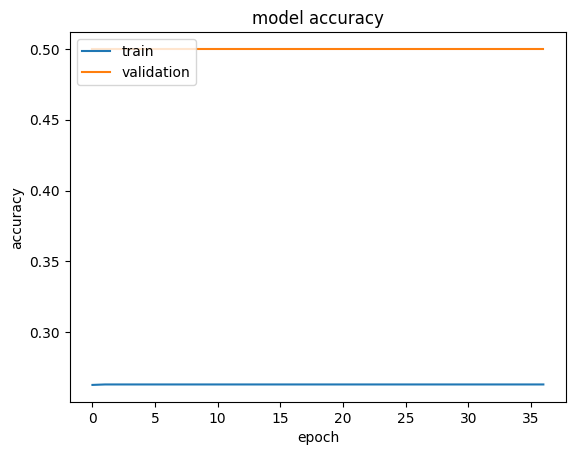

In [23]:
plt.plot(history_1.history["accuracy"])
plt.plot(history_1.history["val_accuracy"])
plt.title("model accuracy")
plt.ylabel("accuracy")
plt.xlabel("epoch")
plt.legend(["train", "validation"], loc="upper left")
plt.show()

### **Evaluating the Model on the Test Set**


In [24]:
# Calculate the number of steps for the entire test set to be processed
test_steps = test_generator.samples // batch_size

# If the number of samples isn't a multiple of the batch size,
# you have one more batch with the remaining samples
if test_generator.samples % batch_size > 0:
    test_steps += 1

# Evaluating the model on the test set
evaluation_results = model_1.evaluate(test_generator, steps=test_steps)
print(f"Loss: {evaluation_results[0]}, Accuracy: {evaluation_results[1]}")

1/4 [======>.......................] - ETA: 0s - loss: nan - accuracy: 1.0000

4/4 [==============================] - 0s 4ms/step - loss: nan - accuracy: 0.2500


Loss: nan, Accuracy: 0.25


### **Plotting Confusion Matrix**


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 4ms/step


              precision    recall  f1-score   support

       happy       0.25      1.00      0.40        32
     neutral       0.00      0.00      0.00        32
         sad       0.00      0.00      0.00        32
    surprise       0.00      0.00      0.00        32

    accuracy                           0.25       128
   macro avg       0.06      0.25      0.10       128
weighted avg       0.06      0.25      0.10       128



/home/iamtxena/sandbox/mit-ai/my_env/lib/python3.10/site-packages/sklearn/metrics/_classification.py:1509: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/home/iamtxena/sandbox/mit-ai/my_env/lib/python3.10/site-packages/sklearn/metrics/_classification.py:1509: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/home/iamtxena/sandbox/mit-ai/my_env/lib/python3.10/site-packages/sklearn/metrics/_classification.py:1509: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.cap

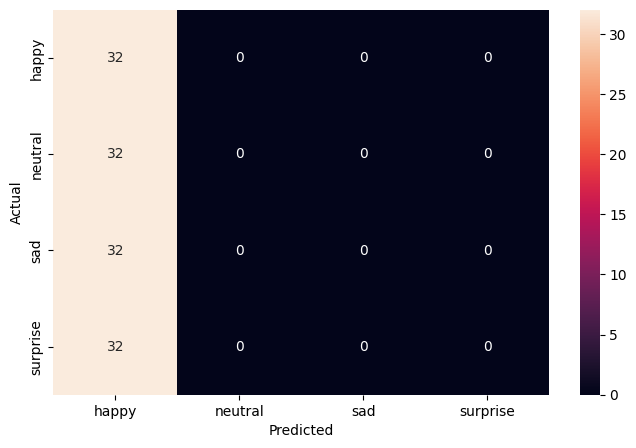

In [25]:
pred_probabilities = model_1.predict(test_generator, steps=test_steps)
pred = np.argmax(pred_probabilities, axis=1)

# Getting the true labels from the generator
y_true = test_generator.classes

# Printing the classification report with actual emotion labels
print(classification_report(y_true, pred, target_names=CATEGORIES))

# Plotting the heatmap using confusion matrix
cm = confusion_matrix(y_true, pred)
plt.figure(figsize=(8, 5))
sns.heatmap(cm, annot=True, fmt=".0f", xticklabels=CATEGORIES, yticklabels=CATEGORIES)
plt.ylabel("Actual")
plt.xlabel("Predicted")
plt.show()

**Observations and Insights:**

- As we can see from the above summary, this CNN model has been trained and learned with **144,056 parameters (weights and biases).**
- The model's training accuracy shows a progressive increase, reaching about **71.34%**, suggesting the model is learning effectively. The validation accuracy fluctuates but also generally trends upward, peaking at approximately **78.12%**. This divergence might indicate that the model is still learning generalizable features, despite the higher accuracy on the validation set, which can sometimes be attributed to the validation set being slightly 'easier' or containing fewer augmentations.
- Upon evaluating the model on the test dataset, it achieved a loss of 0.6081 and an **accuracy of 72.66%**.
- From the confusion matrix, the model performs best in identifying 'happy' and 'surprise' emotions. It faces more challenges with 'sad' and 'neutral', in which we have the lowest f1-score, 56% and 63% respectively.


### **Creating the second Convolutional Neural Network**


### **Model 2 Architecture:**

- We plan on having 4 convolutional blocks in this Architecture, each having a Conv2D, MaxPooling2D, and a Dropout layer.
- Adding first Conv2D layer with **256 filters** and a **kernel size of 5x5**. Using the **'same' padding** and provide the **input shape = (48, 48, 1)**. Using **'relu' activation**.
- Adding MaxPooling2D layer with **kernel size 5x5** and **stride size 2x2**.
- Adding a Dropout layer with a dropout ratio of **0.2**.
- Adding a second Conv2D layer with **128 filters** and a **kernel size of 5x5**. Using the **'same' padding** and **'relu' activation**.
- Following this up with a similar Maxpooling2D layer like above and a Dropout layer with 0.3 dropout ratio.
- Adding a third Conv2D layer with **64 filters** and a **kernel size of 5x5**. Using the **'same' padding** and **'relu' activation**.
- Following this up with a similar Maxpooling2D layer and a Dropout layer with dropout ratio of 0.3.
- Adding a fourth Conv2D layer with **32 filters** and a **kernel size of 3x3**. Using the **'same' padding** and **'relu' activation**.
- Following this up with a similar Maxpooling2D layer and a Dropout layer with dropout ratio of 0.3.
- Once the convolutional blocks are added, we add the Flatten layer.
- Adding first fully connected dense layer with 64 neurons and using **'relu' activation**.
- Adding a second fully connected dense layer with 32 neurons and using **'relu' activation**.
- Adding a final dense layer with 4 neurons and using **'softmax' activation function**.
- Initializing an **Adam optimizer** with a learning rate of 0.0005.
- Compiling your model with the optimizer initialized and using **categorical_crossentropy** as the loss function and the 'accuracy' as the metric.
- Finally, printing your model summary and writing down the observations.


In [26]:
backend.clear_session()

# Fixing the seed for random number generators so that we can ensure we receive the same output everytime
np.random.seed(42)

random.seed(42)
tf.random.set_seed(42)

In [27]:
# Initializing a sequential model
model_2 = Sequential()

# Adding first conv layer
model_2.add(Conv2D(filters=256, kernel_size=(5, 5), padding="Same",
            input_shape=(img_width, img_height, color_layers), activation="relu"))
model_2.add(MaxPooling2D(pool_size=(2, 2), strides=(2, 2)))
model_2.add(Dropout(0.2))

# Adding second conv layer
model_2.add(Conv2D(filters=128, kernel_size=(5, 5), padding="Same", activation="relu"))
model_2.add(MaxPooling2D(pool_size=(2, 2), strides=(2, 2)))
model_2.add(Dropout(0.3))

# Adding third conv layer
model_2.add(Conv2D(filters=64, kernel_size=(3, 3), padding="Same", activation="relu"))
model_2.add(MaxPooling2D(pool_size=(2, 2), strides=(2, 2)))
model_2.add(Dropout(0.3))

# Adding fourth conv layer
model_2.add(Conv2D(filters=32, kernel_size=(3, 3), padding="Same", activation="relu"))
model_2.add(MaxPooling2D(pool_size=(2, 2), strides=(2, 2)))
model_2.add(Dropout(0.3))

# Flattening
model_2.add(Flatten())
model_2.add(Dense(64, activation="relu"))
model_2.add(Dense(32, activation="relu"))

# Adding the output layer with 4 neurons and activation functions as softmax since this is a multi-class classification problem
model_2.add(Dense(4, activation="softmax"))

# Using Adam Optimizer
optimizer = Adam(learning_rate=0.0005)

### **Compiling and Training the Model**


In [28]:
# Compile the model
model_2.compile(optimizer=optimizer, loss="categorical_crossentropy", metrics=["accuracy"])

model_2.summary()

Model: "sequential"


_________________________________________________________________


 Layer (type)                Output Shape              Param #   


 conv2d (Conv2D)             (None, 48, 48, 256)       6656      


 max_pooling2d (MaxPooling2  (None, 24, 24, 256)       0         


 D)                                                              


 dropout (Dropout)           (None, 24, 24, 256)       0         


 conv2d_1 (Conv2D)           (None, 24, 24, 128)       819328    


 max_pooling2d_1 (MaxPoolin  (None, 12, 12, 128)       0         


 g2D)                                                            


 dropout_1 (Dropout)         (None, 12, 12, 128)       0         


 conv2d_2 (Conv2D)           (None, 12, 12, 64)        73792     


 max_pooling2d_2 (MaxPoolin  (None, 6, 6, 64)          0         


 g2D)                                                            


 dropout_2 (Dropout)         (None, 6, 6, 64)          0         


 conv2d_3 (Conv2D)           (None, 6, 6, 32)          18464     


 max_pooling2d_3 (MaxPoolin  (None, 3, 3, 32)          0         


 g2D)                                                            


 dropout_3 (Dropout)         (None, 3, 3, 32)          0         


 flatten (Flatten)           (None, 288)               0         


 dense (Dense)               (None, 64)                18496     


 dense_1 (Dense)             (None, 32)                2080      


 dense_2 (Dense)             (None, 4)                 132       


Total params: 938948 (3.58 MB)


Trainable params: 938948 (3.58 MB)


Non-trainable params: 0 (0.00 Byte)


_________________________________________________________________


In [29]:
# Get the current time
current_time = datetime.now().strftime("%Y%m%d-%H%M%S")

# Set up Early Stopping with a patience 7 but acting after at least 30 epochs
delayed_early_stopping = DelayedEarlyStopping(
    monitor="val_loss", patience=7, verbose=1, restore_best_weights=True, start_epoch=30
)

# Define the learning rate scheduler callback
reduce_lr = ReduceLROnPlateau(monitor="val_loss", factor=0.2, patience=5, min_lr=0.00001, verbose=1)

mc = ModelCheckpoint(
    f"{results_path}/best_model_2_{current_time}.keras",
    monitor="val_accuracy",
    mode="max",
    verbose=1,
    save_best_only=True,
)

# Pulling a single large batch of random validation data for doing the validation after each epoch
validationX, validationY = validation_generator.next()

# Fitting the model with 40 epochs and using validation set
history_2 = model_2.fit(
    train_generator,
    epochs=40,
    validation_data=(validationX, validationY),
    callbacks=[delayed_early_stopping, mc, reduce_lr],
)

Epoch 1/40


2024-03-18 10:38:12.547255: E tensorflow/core/grappler/optimizers/meta_optimizer.cc:961] layout failed: INVALID_ARGUMENT: Size of values 0 does not match size of permutation 4 @ fanin shape insequential/dropout/dropout/SelectV2-2-TransposeNHWCToNCHW-LayoutOptimizer


2024-03-18 10:38:13.222677: I tensorflow/compiler/mlir/tensorflow/utils/dump_mlir_util.cc:269] disabling MLIR crash reproducer, set env var `MLIR_CRASH_REPRODUCER_DIRECTORY` to enable.


  1/473 [..............................] - ETA: 22:23 - loss: 32.8436 - accuracy: 0.1562

  6/473 [..............................] - ETA: 5s - loss: 22.0680 - accuracy: 0.2188   

  9/473 [..............................] - ETA: 7s - loss: 17.8120 - accuracy: 0.2396

 13/473 [..............................] - ETA: 6s - loss: 13.8016 - accuracy: 0.2404

 19/473 [>.............................] - ETA: 5s - loss: 10.4587 - accuracy: 0.2385

 25/473 [>.............................] - ETA: 5s - loss: 8.3985 - accuracy: 0.2450 

 31/473 [>.............................] - ETA: 5s - loss: 7.0565 - accuracy: 0.2530

 37/473 [=>............................] - ETA: 4s - loss: 6.1443 - accuracy: 0.2525

 42/473 [=>............................] - ETA: 4s - loss: 5.5854 - accuracy: 0.2597

 48/473 [==>...........................] - ETA: 4s - loss: 5.0684 - accuracy: 0.2533

 54/473 [==>...........................] - ETA: 4s - loss: 4.6618 - accuracy: 0.2558

 60/473 [==>...........................] - ETA: 4s - loss: 4.3383 - accuracy: 0.2542

 66/473 [===>..........................] - ETA: 4s - loss: 4.0708 - accuracy: 0.2562

 72/473 [===>..........................] - ETA: 4s - loss: 3.8477 - accuracy: 0.2574

 78/473 [===>..........................] - ETA: 4s - loss: 3.6622 - accuracy: 0.2576

 83/473 [====>.........................] - ETA: 4s - loss: 3.5261 - accuracy: 0.2583

 89/473 [====>.........................] - ETA: 3s - loss: 3.3825 - accuracy: 0.2630

 95/473 [=====>........................] - ETA: 3s - loss: 3.2575 - accuracy: 0.2612

101/473 [=====>........................] - ETA: 3s - loss: 3.1478 - accuracy: 0.2624

107/473 [=====>........................] - ETA: 3s - loss: 3.0503 - accuracy: 0.2631

113/473 [======>.......................] - ETA: 3s - loss: 2.9626 - accuracy: 0.2658

119/473 [======>.......................] - ETA: 3s - loss: 2.8834 - accuracy: 0.2647

124/473 [======>.......................] - ETA: 3s - loss: 2.8233 - accuracy: 0.2636

130/473 [=======>......................] - ETA: 3s - loss: 2.7575 - accuracy: 0.2632

136/473 [=======>......................] - ETA: 3s - loss: 2.6980 - accuracy: 0.2619

142/473 [========>.....................] - ETA: 3s - loss: 2.6422 - accuracy: 0.2621

148/473 [========>.....................] - ETA: 3s - loss: 2.5936 - accuracy: 0.2601

154/473 [========>.....................] - ETA: 3s - loss: 2.5488 - accuracy: 0.2597

160/473 [=========>....................] - ETA: 3s - loss: 2.5064 - accuracy: 0.2611

166/473 [=========>....................] - ETA: 3s - loss: 2.4677 - accuracy: 0.2607

172/473 [=========>....................] - ETA: 3s - loss: 2.4303 - accuracy: 0.2604

178/473 [==========>...................] - ETA: 2s - loss: 2.3955 - accuracy: 0.2602

184/473 [==========>...................] - ETA: 2s - loss: 2.3624 - accuracy: 0.2615

190/473 [===========>..................] - ETA: 2s - loss: 2.3317 - accuracy: 0.2627

195/473 [===========>..................] - ETA: 2s - loss: 2.3084 - accuracy: 0.2620

201/473 [===========>..................] - ETA: 2s - loss: 2.2819 - accuracy: 0.2617

207/473 [============>.................] - ETA: 2s - loss: 2.2564 - accuracy: 0.2628

212/473 [============>.................] - ETA: 2s - loss: 2.2360 - accuracy: 0.2631

218/473 [============>.................] - ETA: 2s - loss: 2.2134 - accuracy: 0.2632

224/473 [=============>................] - ETA: 2s - loss: 2.1918 - accuracy: 0.2627

230/473 [=============>................] - ETA: 2s - loss: 2.1714 - accuracy: 0.2621

236/473 [=============>................] - ETA: 2s - loss: 2.1517 - accuracy: 0.2634

242/473 [==============>...............] - ETA: 2s - loss: 2.1334 - accuracy: 0.2633

248/473 [==============>...............] - ETA: 2s - loss: 2.1156 - accuracy: 0.2635

254/473 [===============>..............] - ETA: 2s - loss: 2.0990 - accuracy: 0.2633

260/473 [===============>..............] - ETA: 2s - loss: 2.0827 - accuracy: 0.2624

266/473 [===============>..............] - ETA: 2s - loss: 2.0671 - accuracy: 0.2626

272/473 [================>.............] - ETA: 1s - loss: 2.0520 - accuracy: 0.2625

278/473 [================>.............] - ETA: 1s - loss: 2.0380 - accuracy: 0.2612

284/473 [=================>............] - ETA: 1s - loss: 2.0238 - accuracy: 0.2623

290/473 [=================>............] - ETA: 1s - loss: 2.0106 - accuracy: 0.2633

296/473 [=================>............] - ETA: 1s - loss: 1.9980 - accuracy: 0.2636

302/473 [==================>...........] - ETA: 1s - loss: 1.9861 - accuracy: 0.2637

308/473 [==================>...........] - ETA: 1s - loss: 1.9750 - accuracy: 0.2632

314/473 [==================>...........] - ETA: 1s - loss: 1.9637 - accuracy: 0.2646

320/473 [===================>..........] - ETA: 1s - loss: 1.9529 - accuracy: 0.2639

326/473 [===================>..........] - ETA: 1s - loss: 1.9429 - accuracy: 0.2638

332/473 [====================>.........] - ETA: 1s - loss: 1.9332 - accuracy: 0.2635

338/473 [====================>.........] - ETA: 1s - loss: 1.9236 - accuracy: 0.2631

344/473 [====================>.........] - ETA: 1s - loss: 1.9145 - accuracy: 0.2624

349/473 [=====================>........] - ETA: 1s - loss: 1.9083 - accuracy: 0.2621

355/473 [=====================>........] - ETA: 1s - loss: 1.8995 - accuracy: 0.2629

361/473 [=====================>........] - ETA: 1s - loss: 1.8912 - accuracy: 0.2626

367/473 [======================>.......] - ETA: 1s - loss: 1.8830 - accuracy: 0.2620

373/473 [======================>.......] - ETA: 1s - loss: 1.8749 - accuracy: 0.2625

379/473 [=======================>......] - ETA: 1s - loss: 1.8675 - accuracy: 0.2619

385/473 [=======================>......] - ETA: 0s - loss: 1.8601 - accuracy: 0.2620

391/473 [=======================>......] - ETA: 0s - loss: 1.8530 - accuracy: 0.2614

397/473 [========================>.....] - ETA: 0s - loss: 1.8460 - accuracy: 0.2617

403/473 [========================>.....] - ETA: 0s - loss: 1.8394 - accuracy: 0.2619

409/473 [========================>.....] - ETA: 0s - loss: 1.8326 - accuracy: 0.2627

415/473 [=========================>....] - ETA: 0s - loss: 1.8262 - accuracy: 0.2626

421/473 [=========================>....] - ETA: 0s - loss: 1.8200 - accuracy: 0.2623

427/473 [==========================>...] - ETA: 0s - loss: 1.8142 - accuracy: 0.2622

433/473 [==========================>...] - ETA: 0s - loss: 1.8083 - accuracy: 0.2623

439/473 [==========================>...] - ETA: 0s - loss: 1.8028 - accuracy: 0.2620

445/473 [===========================>..] - ETA: 0s - loss: 1.7970 - accuracy: 0.2623

451/473 [===========================>..] - ETA: 0s - loss: 1.7915 - accuracy: 0.2628

457/473 [===========================>..] - ETA: 0s - loss: 1.7865 - accuracy: 0.2627

463/473 [============================>.] - ETA: 0s - loss: 1.7815 - accuracy: 0.2623

469/473 [============================>.] - ETA: 0s - loss: 1.7768 - accuracy: 0.2614


Epoch 1: val_accuracy improved from -inf to 0.31250, saving model to /home/iamtxena/sandbox/mit-ai/capstone/Facial_Emotion_Recognition/results/best_model_2_20240318-103812.keras


473/473 [==============================] - 8s 11ms/step - loss: 1.7735 - accuracy: 0.2614 - val_loss: 1.3731 - val_accuracy: 0.3125 - lr: 5.0000e-04


Epoch 2/40


  1/473 [..............................] - ETA: 11s - loss: 1.3851 - accuracy: 0.1875

  7/473 [..............................] - ETA: 4s - loss: 1.3820 - accuracy: 0.2411 

 13/473 [..............................] - ETA: 4s - loss: 1.3806 - accuracy: 0.2452

 19/473 [>.............................] - ETA: 4s - loss: 1.3854 - accuracy: 0.2319

 25/473 [>.............................] - ETA: 4s - loss: 1.3879 - accuracy: 0.2300

 30/473 [>.............................] - ETA: 4s - loss: 1.3864 - accuracy: 0.2354

 36/473 [=>............................] - ETA: 4s - loss: 1.3853 - accuracy: 0.2448

 42/473 [=>............................] - ETA: 4s - loss: 1.3865 - accuracy: 0.2433

 47/473 [=>............................] - ETA: 4s - loss: 1.3861 - accuracy: 0.2460

 53/473 [==>...........................] - ETA: 4s - loss: 1.3862 - accuracy: 0.2465

 58/473 [==>...........................] - ETA: 4s - loss: 1.3855 - accuracy: 0.2522

 63/473 [==>...........................] - ETA: 4s - loss: 1.3856 - accuracy: 0.2535

 68/473 [===>..........................] - ETA: 4s - loss: 1.3861 - accuracy: 0.2528

 73/473 [===>..........................] - ETA: 3s - loss: 1.3851 - accuracy: 0.2543

 79/473 [====>.........................] - ETA: 3s - loss: 1.3843 - accuracy: 0.2555

 84/473 [====>.........................] - ETA: 3s - loss: 1.3848 - accuracy: 0.2545

 90/473 [====>.........................] - ETA: 3s - loss: 1.3849 - accuracy: 0.2562

 96/473 [=====>........................] - ETA: 3s - loss: 1.3851 - accuracy: 0.2585

102/473 [=====>........................] - ETA: 3s - loss: 1.3856 - accuracy: 0.2613

108/473 [=====>........................] - ETA: 3s - loss: 1.3865 - accuracy: 0.2613

113/473 [======>.......................] - ETA: 3s - loss: 1.3862 - accuracy: 0.2597

119/473 [======>.......................] - ETA: 3s - loss: 1.3860 - accuracy: 0.2610

125/473 [======>.......................] - ETA: 3s - loss: 1.3858 - accuracy: 0.2620

131/473 [=======>......................] - ETA: 3s - loss: 1.3857 - accuracy: 0.2622

137/473 [=======>......................] - ETA: 3s - loss: 1.3850 - accuracy: 0.2632

143/473 [========>.....................] - ETA: 3s - loss: 1.3850 - accuracy: 0.2642

149/473 [========>.....................] - ETA: 3s - loss: 1.3847 - accuracy: 0.2670

154/473 [========>.....................] - ETA: 3s - loss: 1.3850 - accuracy: 0.2666

159/473 [=========>....................] - ETA: 3s - loss: 1.3850 - accuracy: 0.2663

164/473 [=========>....................] - ETA: 3s - loss: 1.3850 - accuracy: 0.2656

170/473 [=========>....................] - ETA: 3s - loss: 1.3854 - accuracy: 0.2645

175/473 [==========>...................] - ETA: 2s - loss: 1.3855 - accuracy: 0.2646

180/473 [==========>...................] - ETA: 2s - loss: 1.3855 - accuracy: 0.2642

186/473 [==========>...................] - ETA: 2s - loss: 1.3858 - accuracy: 0.2623

190/473 [===========>..................] - ETA: 2s - loss: 1.3859 - accuracy: 0.2627

196/473 [===========>..................] - ETA: 2s - loss: 1.3865 - accuracy: 0.2608

202/473 [===========>..................] - ETA: 2s - loss: 1.3863 - accuracy: 0.2616

208/473 [============>.................] - ETA: 2s - loss: 1.3865 - accuracy: 0.2625

214/473 [============>.................] - ETA: 2s - loss: 1.3866 - accuracy: 0.2621

219/473 [============>.................] - ETA: 2s - loss: 1.3872 - accuracy: 0.2617

224/473 [=============>................] - ETA: 2s - loss: 1.3875 - accuracy: 0.2613

229/473 [=============>................] - ETA: 2s - loss: 1.3873 - accuracy: 0.2605

234/473 [=============>................] - ETA: 2s - loss: 1.3872 - accuracy: 0.2608

239/473 [==============>...............] - ETA: 2s - loss: 1.3872 - accuracy: 0.2610

244/473 [==============>...............] - ETA: 2s - loss: 1.3869 - accuracy: 0.2626

249/473 [==============>...............] - ETA: 2s - loss: 1.3870 - accuracy: 0.2632

254/473 [===============>..............] - ETA: 2s - loss: 1.3869 - accuracy: 0.2630

259/473 [===============>..............] - ETA: 2s - loss: 1.3876 - accuracy: 0.2627

265/473 [===============>..............] - ETA: 2s - loss: 1.3880 - accuracy: 0.2621

271/473 [================>.............] - ETA: 2s - loss: 1.3881 - accuracy: 0.2618

277/473 [================>.............] - ETA: 1s - loss: 1.3880 - accuracy: 0.2614

283/473 [================>.............] - ETA: 1s - loss: 1.3882 - accuracy: 0.2615

289/473 [=================>............] - ETA: 1s - loss: 1.3880 - accuracy: 0.2627

295/473 [=================>............] - ETA: 1s - loss: 1.3878 - accuracy: 0.2637

301/473 [==================>...........] - ETA: 1s - loss: 1.3882 - accuracy: 0.2635

307/473 [==================>...........] - ETA: 1s - loss: 1.3882 - accuracy: 0.2640

312/473 [==================>...........] - ETA: 1s - loss: 1.3881 - accuracy: 0.2643

318/473 [===================>..........] - ETA: 1s - loss: 1.3879 - accuracy: 0.2646

324/473 [===================>..........] - ETA: 1s - loss: 1.3877 - accuracy: 0.2647

330/473 [===================>..........] - ETA: 1s - loss: 1.3877 - accuracy: 0.2648

336/473 [====================>.........] - ETA: 1s - loss: 1.3879 - accuracy: 0.2646

342/473 [====================>.........] - ETA: 1s - loss: 1.3877 - accuracy: 0.2656

348/473 [=====================>........] - ETA: 1s - loss: 1.3875 - accuracy: 0.2660

353/473 [=====================>........] - ETA: 1s - loss: 1.3875 - accuracy: 0.2656

359/473 [=====================>........] - ETA: 1s - loss: 1.3876 - accuracy: 0.2659

365/473 [======================>.......] - ETA: 1s - loss: 1.3877 - accuracy: 0.2657

370/473 [======================>.......] - ETA: 1s - loss: 1.3876 - accuracy: 0.2659

376/473 [======================>.......] - ETA: 0s - loss: 1.3875 - accuracy: 0.2655

382/473 [=======================>......] - ETA: 0s - loss: 1.3873 - accuracy: 0.2653

388/473 [=======================>......] - ETA: 0s - loss: 1.3879 - accuracy: 0.2643

394/473 [=======================>......] - ETA: 0s - loss: 1.3881 - accuracy: 0.2637

400/473 [========================>.....] - ETA: 0s - loss: 1.3882 - accuracy: 0.2635

406/473 [========================>.....] - ETA: 0s - loss: 1.3883 - accuracy: 0.2632

412/473 [=========================>....] - ETA: 0s - loss: 1.3882 - accuracy: 0.2633

418/473 [=========================>....] - ETA: 0s - loss: 1.3881 - accuracy: 0.2632

424/473 [=========================>....] - ETA: 0s - loss: 1.3881 - accuracy: 0.2626

430/473 [==========================>...] - ETA: 0s - loss: 1.3879 - accuracy: 0.2629

436/473 [==========================>...] - ETA: 0s - loss: 1.3878 - accuracy: 0.2625

442/473 [===========================>..] - ETA: 0s - loss: 1.3877 - accuracy: 0.2624

448/473 [===========================>..] - ETA: 0s - loss: 1.3877 - accuracy: 0.2616

454/473 [===========================>..] - ETA: 0s - loss: 1.3879 - accuracy: 0.2617

460/473 [============================>.] - ETA: 0s - loss: 1.3878 - accuracy: 0.2616

466/473 [============================>.] - ETA: 0s - loss: 1.3879 - accuracy: 0.2614

472/473 [============================>.] - ETA: 0s - loss: 1.3880 - accuracy: 0.2607


Epoch 2: val_accuracy improved from 0.31250 to 0.37500, saving model to /home/iamtxena/sandbox/mit-ai/capstone/Facial_Emotion_Recognition/results/best_model_2_20240318-103812.keras


473/473 [==============================] - 5s 10ms/step - loss: 1.3880 - accuracy: 0.2606 - val_loss: 1.3594 - val_accuracy: 0.3750 - lr: 5.0000e-04


Epoch 3/40


  1/473 [..............................] - ETA: 11s - loss: 1.3981 - accuracy: 0.2188

  7/473 [..............................] - ETA: 4s - loss: 1.3741 - accuracy: 0.3036 

 13/473 [..............................] - ETA: 4s - loss: 1.3741 - accuracy: 0.2957

 19/473 [>.............................] - ETA: 4s - loss: 1.3770 - accuracy: 0.2878

 25/473 [>.............................] - ETA: 4s - loss: 1.3770 - accuracy: 0.2950

 31/473 [>.............................] - ETA: 4s - loss: 1.3787 - accuracy: 0.2802

 37/473 [=>............................] - ETA: 4s - loss: 1.3794 - accuracy: 0.2770

 43/473 [=>............................] - ETA: 4s - loss: 1.3789 - accuracy: 0.2856

 49/473 [==>...........................] - ETA: 4s - loss: 1.3802 - accuracy: 0.2851

 55/473 [==>...........................] - ETA: 3s - loss: 1.3801 - accuracy: 0.2864

 61/473 [==>...........................] - ETA: 3s - loss: 1.3802 - accuracy: 0.2869

 67/473 [===>..........................] - ETA: 3s - loss: 1.3806 - accuracy: 0.2859

 73/473 [===>..........................] - ETA: 3s - loss: 1.3819 - accuracy: 0.2842

 78/473 [===>..........................] - ETA: 3s - loss: 1.3831 - accuracy: 0.2776

 84/473 [====>.........................] - ETA: 3s - loss: 1.3830 - accuracy: 0.2794

 90/473 [====>.........................] - ETA: 3s - loss: 1.3820 - accuracy: 0.2830

 96/473 [=====>........................] - ETA: 3s - loss: 1.3814 - accuracy: 0.2848

101/473 [=====>........................] - ETA: 3s - loss: 1.3817 - accuracy: 0.2847

107/473 [=====>........................] - ETA: 3s - loss: 1.3821 - accuracy: 0.2842

113/473 [======>.......................] - ETA: 3s - loss: 1.3834 - accuracy: 0.2821

119/473 [======>.......................] - ETA: 3s - loss: 1.3825 - accuracy: 0.2847

125/473 [======>.......................] - ETA: 3s - loss: 1.3833 - accuracy: 0.2837

131/473 [=======>......................] - ETA: 3s - loss: 1.3840 - accuracy: 0.2812

137/473 [=======>......................] - ETA: 3s - loss: 1.3839 - accuracy: 0.2819

143/473 [========>.....................] - ETA: 3s - loss: 1.3846 - accuracy: 0.2810

149/473 [========>.....................] - ETA: 3s - loss: 1.3854 - accuracy: 0.2789

155/473 [========>.....................] - ETA: 3s - loss: 1.3854 - accuracy: 0.2788

161/473 [=========>....................] - ETA: 3s - loss: 1.3855 - accuracy: 0.2789

167/473 [=========>....................] - ETA: 2s - loss: 1.3859 - accuracy: 0.2781

173/473 [=========>....................] - ETA: 2s - loss: 1.3860 - accuracy: 0.2776

179/473 [==========>...................] - ETA: 2s - loss: 1.3863 - accuracy: 0.2778

185/473 [==========>...................] - ETA: 2s - loss: 1.3861 - accuracy: 0.2775

191/473 [===========>..................] - ETA: 2s - loss: 1.3857 - accuracy: 0.2783

197/473 [===========>..................] - ETA: 2s - loss: 1.3858 - accuracy: 0.2763

203/473 [===========>..................] - ETA: 2s - loss: 1.3858 - accuracy: 0.2749

209/473 [============>.................] - ETA: 2s - loss: 1.3860 - accuracy: 0.2736

215/473 [============>.................] - ETA: 2s - loss: 1.3857 - accuracy: 0.2734

221/473 [=============>................] - ETA: 2s - loss: 1.3855 - accuracy: 0.2729

227/473 [=============>................] - ETA: 2s - loss: 1.3855 - accuracy: 0.2731

233/473 [=============>................] - ETA: 2s - loss: 1.3854 - accuracy: 0.2723

239/473 [==============>...............] - ETA: 2s - loss: 1.3853 - accuracy: 0.2720

245/473 [==============>...............] - ETA: 2s - loss: 1.3849 - accuracy: 0.2726

251/473 [==============>...............] - ETA: 2s - loss: 1.3849 - accuracy: 0.2725

257/473 [===============>..............] - ETA: 2s - loss: 1.3849 - accuracy: 0.2721

263/473 [===============>..............] - ETA: 2s - loss: 1.3848 - accuracy: 0.2720

269/473 [================>.............] - ETA: 1s - loss: 1.3848 - accuracy: 0.2731

274/473 [================>.............] - ETA: 1s - loss: 1.3846 - accuracy: 0.2741

280/473 [================>.............] - ETA: 1s - loss: 1.3848 - accuracy: 0.2738

286/473 [=================>............] - ETA: 1s - loss: 1.3851 - accuracy: 0.2731

292/473 [=================>............] - ETA: 1s - loss: 1.3851 - accuracy: 0.2723

298/473 [=================>............] - ETA: 1s - loss: 1.3852 - accuracy: 0.2717

304/473 [==================>...........] - ETA: 1s - loss: 1.3852 - accuracy: 0.2700

310/473 [==================>...........] - ETA: 1s - loss: 1.3852 - accuracy: 0.2699

316/473 [===================>..........] - ETA: 1s - loss: 1.3852 - accuracy: 0.2700

322/473 [===================>..........] - ETA: 1s - loss: 1.3853 - accuracy: 0.2696

327/473 [===================>..........] - ETA: 1s - loss: 1.3852 - accuracy: 0.2701

332/473 [====================>.........] - ETA: 1s - loss: 1.3850 - accuracy: 0.2702

338/473 [====================>.........] - ETA: 1s - loss: 1.3849 - accuracy: 0.2703

344/473 [====================>.........] - ETA: 1s - loss: 1.3851 - accuracy: 0.2700

350/473 [=====================>........] - ETA: 1s - loss: 1.3849 - accuracy: 0.2702

356/473 [=====================>........] - ETA: 1s - loss: 1.3849 - accuracy: 0.2705

361/473 [=====================>........] - ETA: 1s - loss: 1.3848 - accuracy: 0.2711

366/473 [======================>.......] - ETA: 1s - loss: 1.3851 - accuracy: 0.2706

371/473 [======================>.......] - ETA: 0s - loss: 1.3849 - accuracy: 0.2708

377/473 [======================>.......] - ETA: 0s - loss: 1.3846 - accuracy: 0.2706

383/473 [=======================>......] - ETA: 0s - loss: 1.3849 - accuracy: 0.2702

388/473 [=======================>......] - ETA: 0s - loss: 1.3851 - accuracy: 0.2700

394/473 [=======================>......] - ETA: 0s - loss: 1.3850 - accuracy: 0.2695

400/473 [========================>.....] - ETA: 0s - loss: 1.3849 - accuracy: 0.2696

406/473 [========================>.....] - ETA: 0s - loss: 1.3847 - accuracy: 0.2701

412/473 [=========================>....] - ETA: 0s - loss: 1.3847 - accuracy: 0.2698

418/473 [=========================>....] - ETA: 0s - loss: 1.3848 - accuracy: 0.2699

423/473 [=========================>....] - ETA: 0s - loss: 1.3847 - accuracy: 0.2704

428/473 [==========================>...] - ETA: 0s - loss: 1.3846 - accuracy: 0.2699

433/473 [==========================>...] - ETA: 0s - loss: 1.3843 - accuracy: 0.2706

439/473 [==========================>...] - ETA: 0s - loss: 1.3841 - accuracy: 0.2713

445/473 [===========================>..] - ETA: 0s - loss: 1.3839 - accuracy: 0.2715

451/473 [===========================>..] - ETA: 0s - loss: 1.3840 - accuracy: 0.2709

457/473 [===========================>..] - ETA: 0s - loss: 1.3840 - accuracy: 0.2709

463/473 [============================>.] - ETA: 0s - loss: 1.3837 - accuracy: 0.2708

469/473 [============================>.] - ETA: 0s - loss: 1.3836 - accuracy: 0.2714


Epoch 3: val_accuracy did not improve from 0.37500


473/473 [==============================] - 5s 10ms/step - loss: 1.3835 - accuracy: 0.2716 - val_loss: 1.3512 - val_accuracy: 0.2812 - lr: 5.0000e-04


Epoch 4/40


  1/473 [..............................] - ETA: 11s - loss: 1.3647 - accuracy: 0.2812

  7/473 [..............................] - ETA: 4s - loss: 1.3885 - accuracy: 0.2679 

 13/473 [..............................] - ETA: 4s - loss: 1.3840 - accuracy: 0.2740

 19/473 [>.............................] - ETA: 4s - loss: 1.3832 - accuracy: 0.2648

 24/473 [>.............................] - ETA: 4s - loss: 1.3824 - accuracy: 0.2669

 30/473 [>.............................] - ETA: 4s - loss: 1.3808 - accuracy: 0.2812

 36/473 [=>............................] - ETA: 4s - loss: 1.3813 - accuracy: 0.2717

 42/473 [=>............................] - ETA: 4s - loss: 1.3815 - accuracy: 0.2671

 48/473 [==>...........................] - ETA: 4s - loss: 1.3815 - accuracy: 0.2669

 54/473 [==>...........................] - ETA: 4s - loss: 1.3815 - accuracy: 0.2708

 60/473 [==>...........................] - ETA: 3s - loss: 1.3804 - accuracy: 0.2740

 66/473 [===>..........................] - ETA: 3s - loss: 1.3821 - accuracy: 0.2723

 72/473 [===>..........................] - ETA: 3s - loss: 1.3836 - accuracy: 0.2695

 78/473 [===>..........................] - ETA: 3s - loss: 1.3838 - accuracy: 0.2696

 84/473 [====>.........................] - ETA: 3s - loss: 1.3828 - accuracy: 0.2749

 90/473 [====>.........................] - ETA: 3s - loss: 1.3828 - accuracy: 0.2736

 96/473 [=====>........................] - ETA: 3s - loss: 1.3825 - accuracy: 0.2732

101/473 [=====>........................] - ETA: 3s - loss: 1.3820 - accuracy: 0.2724

106/473 [=====>........................] - ETA: 3s - loss: 1.3816 - accuracy: 0.2728

112/473 [======>.......................] - ETA: 3s - loss: 1.3814 - accuracy: 0.2727

117/473 [======>.......................] - ETA: 3s - loss: 1.3808 - accuracy: 0.2736

123/473 [======>.......................] - ETA: 3s - loss: 1.3806 - accuracy: 0.2737

129/473 [=======>......................] - ETA: 3s - loss: 1.3809 - accuracy: 0.2738

135/473 [=======>......................] - ETA: 3s - loss: 1.3809 - accuracy: 0.2730

141/473 [=======>......................] - ETA: 3s - loss: 1.3803 - accuracy: 0.2749

147/473 [========>.....................] - ETA: 3s - loss: 1.3802 - accuracy: 0.2745

153/473 [========>.....................] - ETA: 3s - loss: 1.3804 - accuracy: 0.2736

159/473 [=========>....................] - ETA: 3s - loss: 1.3804 - accuracy: 0.2741

165/473 [=========>....................] - ETA: 2s - loss: 1.3799 - accuracy: 0.2757

171/473 [=========>....................] - ETA: 2s - loss: 1.3798 - accuracy: 0.2751

177/473 [==========>...................] - ETA: 2s - loss: 1.3792 - accuracy: 0.2764

183/473 [==========>...................] - ETA: 2s - loss: 1.3789 - accuracy: 0.2765

189/473 [==========>...................] - ETA: 2s - loss: 1.3790 - accuracy: 0.2737

195/473 [===========>..................] - ETA: 2s - loss: 1.3788 - accuracy: 0.2752

200/473 [===========>..................] - ETA: 2s - loss: 1.3788 - accuracy: 0.2748

206/473 [============>.................] - ETA: 2s - loss: 1.3789 - accuracy: 0.2745

212/473 [============>.................] - ETA: 2s - loss: 1.3792 - accuracy: 0.2735

218/473 [============>.................] - ETA: 2s - loss: 1.3792 - accuracy: 0.2737

224/473 [=============>................] - ETA: 2s - loss: 1.3791 - accuracy: 0.2727

230/473 [=============>................] - ETA: 2s - loss: 1.3788 - accuracy: 0.2730

236/473 [=============>................] - ETA: 2s - loss: 1.3789 - accuracy: 0.2731

242/473 [==============>...............] - ETA: 2s - loss: 1.3793 - accuracy: 0.2725

248/473 [==============>...............] - ETA: 2s - loss: 1.3793 - accuracy: 0.2721

254/473 [===============>..............] - ETA: 2s - loss: 1.3793 - accuracy: 0.2721

260/473 [===============>..............] - ETA: 2s - loss: 1.3792 - accuracy: 0.2730

266/473 [===============>..............] - ETA: 1s - loss: 1.3791 - accuracy: 0.2737

272/473 [================>.............] - ETA: 1s - loss: 1.3793 - accuracy: 0.2727

278/473 [================>.............] - ETA: 1s - loss: 1.3792 - accuracy: 0.2735

284/473 [=================>............] - ETA: 1s - loss: 1.3790 - accuracy: 0.2748

289/473 [=================>............] - ETA: 1s - loss: 1.3789 - accuracy: 0.2752

294/473 [=================>............] - ETA: 1s - loss: 1.3790 - accuracy: 0.2749

300/473 [==================>...........] - ETA: 1s - loss: 1.3793 - accuracy: 0.2742

305/473 [==================>...........] - ETA: 1s - loss: 1.3792 - accuracy: 0.2741

310/473 [==================>...........] - ETA: 1s - loss: 1.3794 - accuracy: 0.2738

316/473 [===================>..........] - ETA: 1s - loss: 1.3798 - accuracy: 0.2727

321/473 [===================>..........] - ETA: 1s - loss: 1.3799 - accuracy: 0.2722

327/473 [===================>..........] - ETA: 1s - loss: 1.3801 - accuracy: 0.2725

332/473 [====================>.........] - ETA: 1s - loss: 1.3801 - accuracy: 0.2729

337/473 [====================>.........] - ETA: 1s - loss: 1.3804 - accuracy: 0.2731

343/473 [====================>.........] - ETA: 1s - loss: 1.3805 - accuracy: 0.2727

349/473 [=====================>........] - ETA: 1s - loss: 1.3806 - accuracy: 0.2730

355/473 [=====================>........] - ETA: 1s - loss: 1.3807 - accuracy: 0.2730

360/473 [=====================>........] - ETA: 1s - loss: 1.3803 - accuracy: 0.2736

365/473 [======================>.......] - ETA: 1s - loss: 1.3804 - accuracy: 0.2733

371/473 [======================>.......] - ETA: 0s - loss: 1.3808 - accuracy: 0.2725

377/473 [======================>.......] - ETA: 0s - loss: 1.3808 - accuracy: 0.2727

383/473 [=======================>......] - ETA: 0s - loss: 1.3810 - accuracy: 0.2729

388/473 [=======================>......] - ETA: 0s - loss: 1.3810 - accuracy: 0.2727

394/473 [=======================>......] - ETA: 0s - loss: 1.3810 - accuracy: 0.2732

400/473 [========================>.....] - ETA: 0s - loss: 1.3812 - accuracy: 0.2730

405/473 [========================>.....] - ETA: 0s - loss: 1.3811 - accuracy: 0.2732

411/473 [=========================>....] - ETA: 0s - loss: 1.3807 - accuracy: 0.2748

416/473 [=========================>....] - ETA: 0s - loss: 1.3807 - accuracy: 0.2744

422/473 [=========================>....] - ETA: 0s - loss: 1.3811 - accuracy: 0.2739

428/473 [==========================>...] - ETA: 0s - loss: 1.3811 - accuracy: 0.2743

434/473 [==========================>...] - ETA: 0s - loss: 1.3810 - accuracy: 0.2747

440/473 [==========================>...] - ETA: 0s - loss: 1.3808 - accuracy: 0.2748

446/473 [===========================>..] - ETA: 0s - loss: 1.3810 - accuracy: 0.2739

452/473 [===========================>..] - ETA: 0s - loss: 1.3810 - accuracy: 0.2736

458/473 [============================>.] - ETA: 0s - loss: 1.3806 - accuracy: 0.2740

464/473 [============================>.] - ETA: 0s - loss: 1.3803 - accuracy: 0.2739

470/473 [============================>.] - ETA: 0s - loss: 1.3804 - accuracy: 0.2739


Epoch 4: val_accuracy did not improve from 0.37500


473/473 [==============================] - 5s 10ms/step - loss: 1.3804 - accuracy: 0.2745 - val_loss: 1.3536 - val_accuracy: 0.3438 - lr: 5.0000e-04


Epoch 5/40


  1/473 [..............................] - ETA: 10s - loss: 1.3784 - accuracy: 0.1250

  7/473 [..............................] - ETA: 4s - loss: 1.3778 - accuracy: 0.2634 

 13/473 [..............................] - ETA: 4s - loss: 1.3730 - accuracy: 0.2861

 19/473 [>.............................] - ETA: 4s - loss: 1.3788 - accuracy: 0.2862

 25/473 [>.............................] - ETA: 4s - loss: 1.3790 - accuracy: 0.2788

 31/473 [>.............................] - ETA: 4s - loss: 1.3833 - accuracy: 0.2722

 37/473 [=>............................] - ETA: 4s - loss: 1.3836 - accuracy: 0.2703

 43/473 [=>............................] - ETA: 4s - loss: 1.3844 - accuracy: 0.2682

 48/473 [==>...........................] - ETA: 4s - loss: 1.3849 - accuracy: 0.2656

 54/473 [==>...........................] - ETA: 4s - loss: 1.3853 - accuracy: 0.2697

 60/473 [==>...........................] - ETA: 4s - loss: 1.3844 - accuracy: 0.2682

 66/473 [===>..........................] - ETA: 3s - loss: 1.3859 - accuracy: 0.2656

 72/473 [===>..........................] - ETA: 3s - loss: 1.3849 - accuracy: 0.2691

 78/473 [===>..........................] - ETA: 3s - loss: 1.3832 - accuracy: 0.2724

 84/473 [====>.........................] - ETA: 3s - loss: 1.3840 - accuracy: 0.2723

 90/473 [====>.........................] - ETA: 3s - loss: 1.3823 - accuracy: 0.2757

 96/473 [=====>........................] - ETA: 3s - loss: 1.3817 - accuracy: 0.2777

102/473 [=====>........................] - ETA: 3s - loss: 1.3821 - accuracy: 0.2779

108/473 [=====>........................] - ETA: 3s - loss: 1.3814 - accuracy: 0.2810

114/473 [======>.......................] - ETA: 3s - loss: 1.3811 - accuracy: 0.2818

120/473 [======>.......................] - ETA: 3s - loss: 1.3816 - accuracy: 0.2818

126/473 [======>.......................] - ETA: 3s - loss: 1.3819 - accuracy: 0.2825

132/473 [=======>......................] - ETA: 3s - loss: 1.3811 - accuracy: 0.2820

138/473 [=======>......................] - ETA: 3s - loss: 1.3804 - accuracy: 0.2851

143/473 [========>.....................] - ETA: 3s - loss: 1.3805 - accuracy: 0.2861

149/473 [========>.....................] - ETA: 3s - loss: 1.3801 - accuracy: 0.2854

155/473 [========>.....................] - ETA: 3s - loss: 1.3795 - accuracy: 0.2859

161/473 [=========>....................] - ETA: 3s - loss: 1.3791 - accuracy: 0.2865

167/473 [=========>....................] - ETA: 2s - loss: 1.3785 - accuracy: 0.2876

173/473 [=========>....................] - ETA: 2s - loss: 1.3785 - accuracy: 0.2872

179/473 [==========>...................] - ETA: 2s - loss: 1.3776 - accuracy: 0.2882

185/473 [==========>...................] - ETA: 2s - loss: 1.3773 - accuracy: 0.2890

191/473 [===========>..................] - ETA: 2s - loss: 1.3771 - accuracy: 0.2891

197/473 [===========>..................] - ETA: 2s - loss: 1.3771 - accuracy: 0.2885

203/473 [===========>..................] - ETA: 2s - loss: 1.3775 - accuracy: 0.2888

208/473 [============>.................] - ETA: 2s - loss: 1.3771 - accuracy: 0.2901

214/473 [============>.................] - ETA: 2s - loss: 1.3768 - accuracy: 0.2891

220/473 [============>.................] - ETA: 2s - loss: 1.3765 - accuracy: 0.2892

226/473 [=============>................] - ETA: 2s - loss: 1.3767 - accuracy: 0.2877

232/473 [=============>................] - ETA: 2s - loss: 1.3767 - accuracy: 0.2864

237/473 [==============>...............] - ETA: 2s - loss: 1.3765 - accuracy: 0.2868

243/473 [==============>...............] - ETA: 2s - loss: 1.3767 - accuracy: 0.2868

249/473 [==============>...............] - ETA: 2s - loss: 1.3765 - accuracy: 0.2868

255/473 [===============>..............] - ETA: 2s - loss: 1.3760 - accuracy: 0.2863

261/473 [===============>..............] - ETA: 2s - loss: 1.3759 - accuracy: 0.2853

267/473 [===============>..............] - ETA: 2s - loss: 1.3759 - accuracy: 0.2853

273/473 [================>.............] - ETA: 1s - loss: 1.3753 - accuracy: 0.2861

279/473 [================>.............] - ETA: 1s - loss: 1.3749 - accuracy: 0.2873

285/473 [=================>............] - ETA: 1s - loss: 1.3743 - accuracy: 0.2875

291/473 [=================>............] - ETA: 1s - loss: 1.3742 - accuracy: 0.2873

297/473 [=================>............] - ETA: 1s - loss: 1.3744 - accuracy: 0.2866

303/473 [==================>...........] - ETA: 1s - loss: 1.3744 - accuracy: 0.2858

309/473 [==================>...........] - ETA: 1s - loss: 1.3743 - accuracy: 0.2855

315/473 [==================>...........] - ETA: 1s - loss: 1.3742 - accuracy: 0.2853

321/473 [===================>..........] - ETA: 1s - loss: 1.3737 - accuracy: 0.2870

326/473 [===================>..........] - ETA: 1s - loss: 1.3736 - accuracy: 0.2878

331/473 [===================>..........] - ETA: 1s - loss: 1.3738 - accuracy: 0.2876

336/473 [====================>.........] - ETA: 1s - loss: 1.3740 - accuracy: 0.2866

341/473 [====================>.........] - ETA: 1s - loss: 1.3741 - accuracy: 0.2865

346/473 [====================>.........] - ETA: 1s - loss: 1.3738 - accuracy: 0.2866

351/473 [=====================>........] - ETA: 1s - loss: 1.3736 - accuracy: 0.2872

356/473 [=====================>........] - ETA: 1s - loss: 1.3729 - accuracy: 0.2883

361/473 [=====================>........] - ETA: 1s - loss: 1.3726 - accuracy: 0.2894

367/473 [======================>.......] - ETA: 1s - loss: 1.3722 - accuracy: 0.2896

373/473 [======================>.......] - ETA: 0s - loss: 1.3718 - accuracy: 0.2908

379/473 [=======================>......] - ETA: 0s - loss: 1.3715 - accuracy: 0.2911

385/473 [=======================>......] - ETA: 0s - loss: 1.3713 - accuracy: 0.2913

391/473 [=======================>......] - ETA: 0s - loss: 1.3713 - accuracy: 0.2906

397/473 [========================>.....] - ETA: 0s - loss: 1.3711 - accuracy: 0.2901

403/473 [========================>.....] - ETA: 0s - loss: 1.3711 - accuracy: 0.2896

409/473 [========================>.....] - ETA: 0s - loss: 1.3710 - accuracy: 0.2897

415/473 [=========================>....] - ETA: 0s - loss: 1.3703 - accuracy: 0.2908

421/473 [=========================>....] - ETA: 0s - loss: 1.3696 - accuracy: 0.2921

427/473 [==========================>...] - ETA: 0s - loss: 1.3690 - accuracy: 0.2928

433/473 [==========================>...] - ETA: 0s - loss: 1.3688 - accuracy: 0.2937

439/473 [==========================>...] - ETA: 0s - loss: 1.3682 - accuracy: 0.2947

445/473 [===========================>..] - ETA: 0s - loss: 1.3678 - accuracy: 0.2955

451/473 [===========================>..] - ETA: 0s - loss: 1.3675 - accuracy: 0.2957

456/473 [===========================>..] - ETA: 0s - loss: 1.3677 - accuracy: 0.2950

462/473 [============================>.] - ETA: 0s - loss: 1.3672 - accuracy: 0.2955

468/473 [============================>.] - ETA: 0s - loss: 1.3671 - accuracy: 0.2955


Epoch 5: val_accuracy improved from 0.37500 to 0.43750, saving model to /home/iamtxena/sandbox/mit-ai/capstone/Facial_Emotion_Recognition/results/best_model_2_20240318-103812.keras


473/473 [==============================] - 5s 10ms/step - loss: 1.3666 - accuracy: 0.2959 - val_loss: 1.2450 - val_accuracy: 0.4375 - lr: 5.0000e-04


Epoch 6/40


  1/473 [..............................] - ETA: 12s - loss: 1.3818 - accuracy: 0.1875

  6/473 [..............................] - ETA: 5s - loss: 1.3476 - accuracy: 0.3229 

 11/473 [..............................] - ETA: 5s - loss: 1.3664 - accuracy: 0.2869

 16/473 [>.............................] - ETA: 5s - loss: 1.3543 - accuracy: 0.3203

 21/473 [>.............................] - ETA: 5s - loss: 1.3527 - accuracy: 0.3185

 26/473 [>.............................] - ETA: 4s - loss: 1.3498 - accuracy: 0.3173

 31/473 [>.............................] - ETA: 4s - loss: 1.3438 - accuracy: 0.3256

 36/473 [=>............................] - ETA: 4s - loss: 1.3379 - accuracy: 0.3247

 42/473 [=>............................] - ETA: 4s - loss: 1.3419 - accuracy: 0.3214

 48/473 [==>...........................] - ETA: 4s - loss: 1.3416 - accuracy: 0.3242

 53/473 [==>...........................] - ETA: 4s - loss: 1.3435 - accuracy: 0.3202

 59/473 [==>...........................] - ETA: 4s - loss: 1.3408 - accuracy: 0.3226

 65/473 [===>..........................] - ETA: 4s - loss: 1.3405 - accuracy: 0.3221

 71/473 [===>..........................] - ETA: 4s - loss: 1.3392 - accuracy: 0.3231

 77/473 [===>..........................] - ETA: 4s - loss: 1.3370 - accuracy: 0.3263

 82/473 [====>.........................] - ETA: 4s - loss: 1.3349 - accuracy: 0.3270

 88/473 [====>.........................] - ETA: 3s - loss: 1.3330 - accuracy: 0.3288

 94/473 [====>.........................] - ETA: 3s - loss: 1.3332 - accuracy: 0.3255

100/473 [=====>........................] - ETA: 3s - loss: 1.3344 - accuracy: 0.3222

106/473 [=====>........................] - ETA: 3s - loss: 1.3357 - accuracy: 0.3213

112/473 [======>.......................] - ETA: 3s - loss: 1.3349 - accuracy: 0.3234

117/473 [======>.......................] - ETA: 3s - loss: 1.3332 - accuracy: 0.3259

123/473 [======>.......................] - ETA: 3s - loss: 1.3323 - accuracy: 0.3265

128/473 [=======>......................] - ETA: 3s - loss: 1.3320 - accuracy: 0.3274

133/473 [=======>......................] - ETA: 3s - loss: 1.3316 - accuracy: 0.3271

139/473 [=======>......................] - ETA: 3s - loss: 1.3309 - accuracy: 0.3271

144/473 [========>.....................] - ETA: 3s - loss: 1.3304 - accuracy: 0.3294

150/473 [========>.....................] - ETA: 3s - loss: 1.3305 - accuracy: 0.3294

156/473 [========>.....................] - ETA: 3s - loss: 1.3309 - accuracy: 0.3297

162/473 [=========>....................] - ETA: 3s - loss: 1.3309 - accuracy: 0.3293

168/473 [=========>....................] - ETA: 3s - loss: 1.3318 - accuracy: 0.3274

173/473 [=========>....................] - ETA: 3s - loss: 1.3303 - accuracy: 0.3271

179/473 [==========>...................] - ETA: 2s - loss: 1.3283 - accuracy: 0.3282

185/473 [==========>...................] - ETA: 2s - loss: 1.3271 - accuracy: 0.3284

191/473 [===========>..................] - ETA: 2s - loss: 1.3254 - accuracy: 0.3300

196/473 [===========>..................] - ETA: 2s - loss: 1.3253 - accuracy: 0.3305

201/473 [===========>..................] - ETA: 2s - loss: 1.3242 - accuracy: 0.3316

207/473 [============>.................] - ETA: 2s - loss: 1.3239 - accuracy: 0.3326

213/473 [============>.................] - ETA: 2s - loss: 1.3244 - accuracy: 0.3335

218/473 [============>.................] - ETA: 2s - loss: 1.3242 - accuracy: 0.3327

223/473 [=============>................] - ETA: 2s - loss: 1.3229 - accuracy: 0.3345

229/473 [=============>................] - ETA: 2s - loss: 1.3230 - accuracy: 0.3346

235/473 [=============>................] - ETA: 2s - loss: 1.3233 - accuracy: 0.3358

241/473 [==============>...............] - ETA: 2s - loss: 1.3232 - accuracy: 0.3360

247/473 [==============>...............] - ETA: 2s - loss: 1.3224 - accuracy: 0.3370

253/473 [===============>..............] - ETA: 2s - loss: 1.3210 - accuracy: 0.3393

259/473 [===============>..............] - ETA: 2s - loss: 1.3203 - accuracy: 0.3403

265/473 [===============>..............] - ETA: 2s - loss: 1.3193 - accuracy: 0.3410

271/473 [================>.............] - ETA: 2s - loss: 1.3182 - accuracy: 0.3410

276/473 [================>.............] - ETA: 1s - loss: 1.3177 - accuracy: 0.3417

281/473 [================>.............] - ETA: 1s - loss: 1.3173 - accuracy: 0.3420

287/473 [=================>............] - ETA: 1s - loss: 1.3167 - accuracy: 0.3418

293/473 [=================>............] - ETA: 1s - loss: 1.3177 - accuracy: 0.3414

299/473 [=================>............] - ETA: 1s - loss: 1.3178 - accuracy: 0.3413

305/473 [==================>...........] - ETA: 1s - loss: 1.3172 - accuracy: 0.3427

311/473 [==================>...........] - ETA: 1s - loss: 1.3171 - accuracy: 0.3430

317/473 [===================>..........] - ETA: 1s - loss: 1.3161 - accuracy: 0.3442

322/473 [===================>..........] - ETA: 1s - loss: 1.3159 - accuracy: 0.3444

327/473 [===================>..........] - ETA: 1s - loss: 1.3160 - accuracy: 0.3446

332/473 [====================>.........] - ETA: 1s - loss: 1.3159 - accuracy: 0.3446

338/473 [====================>.........] - ETA: 1s - loss: 1.3158 - accuracy: 0.3450

344/473 [====================>.........] - ETA: 1s - loss: 1.3158 - accuracy: 0.3440

350/473 [=====================>........] - ETA: 1s - loss: 1.3157 - accuracy: 0.3433

356/473 [=====================>........] - ETA: 1s - loss: 1.3153 - accuracy: 0.3439

361/473 [=====================>........] - ETA: 1s - loss: 1.3146 - accuracy: 0.3446

366/473 [======================>.......] - ETA: 1s - loss: 1.3143 - accuracy: 0.3450

371/473 [======================>.......] - ETA: 1s - loss: 1.3140 - accuracy: 0.3460

377/473 [======================>.......] - ETA: 0s - loss: 1.3144 - accuracy: 0.3465

382/473 [=======================>......] - ETA: 0s - loss: 1.3136 - accuracy: 0.3472

388/473 [=======================>......] - ETA: 0s - loss: 1.3128 - accuracy: 0.3478

394/473 [=======================>......] - ETA: 0s - loss: 1.3128 - accuracy: 0.3482

400/473 [========================>.....] - ETA: 0s - loss: 1.3126 - accuracy: 0.3477

406/473 [========================>.....] - ETA: 0s - loss: 1.3127 - accuracy: 0.3480

412/473 [=========================>....] - ETA: 0s - loss: 1.3126 - accuracy: 0.3481

418/473 [=========================>....] - ETA: 0s - loss: 1.3124 - accuracy: 0.3482

424/473 [=========================>....] - ETA: 0s - loss: 1.3121 - accuracy: 0.3482

430/473 [==========================>...] - ETA: 0s - loss: 1.3114 - accuracy: 0.3483

436/473 [==========================>...] - ETA: 0s - loss: 1.3110 - accuracy: 0.3483

441/473 [==========================>...] - ETA: 0s - loss: 1.3112 - accuracy: 0.3481

446/473 [===========================>..] - ETA: 0s - loss: 1.3109 - accuracy: 0.3486

452/473 [===========================>..] - ETA: 0s - loss: 1.3107 - accuracy: 0.3493

458/473 [============================>.] - ETA: 0s - loss: 1.3104 - accuracy: 0.3488

464/473 [============================>.] - ETA: 0s - loss: 1.3108 - accuracy: 0.3480

470/473 [============================>.] - ETA: 0s - loss: 1.3100 - accuracy: 0.3486


Epoch 6: val_accuracy did not improve from 0.43750


473/473 [==============================] - 5s 10ms/step - loss: 1.3098 - accuracy: 0.3487 - val_loss: 1.1339 - val_accuracy: 0.3750 - lr: 5.0000e-04


Epoch 7/40


  1/473 [..............................] - ETA: 10s - loss: 1.3361 - accuracy: 0.3125

  7/473 [..............................] - ETA: 4s - loss: 1.3101 - accuracy: 0.2857 

 13/473 [..............................] - ETA: 4s - loss: 1.2660 - accuracy: 0.3413

 19/473 [>.............................] - ETA: 4s - loss: 1.2836 - accuracy: 0.3470

 23/473 [>.............................] - ETA: 4s - loss: 1.2773 - accuracy: 0.3601

 29/473 [>.............................] - ETA: 4s - loss: 1.2802 - accuracy: 0.3524

 35/473 [=>............................] - ETA: 4s - loss: 1.2925 - accuracy: 0.3482

 41/473 [=>............................] - ETA: 4s - loss: 1.2945 - accuracy: 0.3468

 47/473 [=>............................] - ETA: 4s - loss: 1.3020 - accuracy: 0.3404

 53/473 [==>...........................] - ETA: 4s - loss: 1.2947 - accuracy: 0.3502

 59/473 [==>...........................] - ETA: 4s - loss: 1.2946 - accuracy: 0.3533

 65/473 [===>..........................] - ETA: 4s - loss: 1.2974 - accuracy: 0.3514

 71/473 [===>..........................] - ETA: 3s - loss: 1.2990 - accuracy: 0.3488

 77/473 [===>..........................] - ETA: 3s - loss: 1.2970 - accuracy: 0.3500

 83/473 [====>.........................] - ETA: 3s - loss: 1.2957 - accuracy: 0.3511

 89/473 [====>.........................] - ETA: 3s - loss: 1.2977 - accuracy: 0.3492

 95/473 [=====>........................] - ETA: 3s - loss: 1.2964 - accuracy: 0.3521

101/473 [=====>........................] - ETA: 3s - loss: 1.2953 - accuracy: 0.3554

106/473 [=====>........................] - ETA: 3s - loss: 1.2948 - accuracy: 0.3566

111/473 [======>.......................] - ETA: 3s - loss: 1.2919 - accuracy: 0.3572

117/473 [======>.......................] - ETA: 3s - loss: 1.2932 - accuracy: 0.3570

123/473 [======>.......................] - ETA: 3s - loss: 1.2923 - accuracy: 0.3561

128/473 [=======>......................] - ETA: 3s - loss: 1.2905 - accuracy: 0.3564

134/473 [=======>......................] - ETA: 3s - loss: 1.2904 - accuracy: 0.3572

140/473 [=======>......................] - ETA: 3s - loss: 1.2921 - accuracy: 0.3555

146/473 [========>.....................] - ETA: 3s - loss: 1.2937 - accuracy: 0.3541

152/473 [========>.....................] - ETA: 3s - loss: 1.2932 - accuracy: 0.3566

158/473 [=========>....................] - ETA: 3s - loss: 1.2944 - accuracy: 0.3557

164/473 [=========>....................] - ETA: 3s - loss: 1.2952 - accuracy: 0.3543

170/473 [=========>....................] - ETA: 2s - loss: 1.2957 - accuracy: 0.3543

176/473 [==========>...................] - ETA: 2s - loss: 1.2957 - accuracy: 0.3543

182/473 [==========>...................] - ETA: 2s - loss: 1.2946 - accuracy: 0.3557

188/473 [==========>...................] - ETA: 2s - loss: 1.2950 - accuracy: 0.3557

194/473 [===========>..................] - ETA: 2s - loss: 1.2952 - accuracy: 0.3527

200/473 [===========>..................] - ETA: 2s - loss: 1.2976 - accuracy: 0.3509

206/473 [============>.................] - ETA: 2s - loss: 1.2980 - accuracy: 0.3505

212/473 [============>.................] - ETA: 2s - loss: 1.2971 - accuracy: 0.3510

218/473 [============>.................] - ETA: 2s - loss: 1.2975 - accuracy: 0.3497

224/473 [=============>................] - ETA: 2s - loss: 1.2971 - accuracy: 0.3500

230/473 [=============>................] - ETA: 2s - loss: 1.2970 - accuracy: 0.3507

236/473 [=============>................] - ETA: 2s - loss: 1.2971 - accuracy: 0.3491

242/473 [==============>...............] - ETA: 2s - loss: 1.2981 - accuracy: 0.3486

248/473 [==============>...............] - ETA: 2s - loss: 1.2973 - accuracy: 0.3477

254/473 [===============>..............] - ETA: 2s - loss: 1.2961 - accuracy: 0.3486

260/473 [===============>..............] - ETA: 2s - loss: 1.2952 - accuracy: 0.3490

266/473 [===============>..............] - ETA: 2s - loss: 1.2937 - accuracy: 0.3500

272/473 [================>.............] - ETA: 1s - loss: 1.2939 - accuracy: 0.3513

277/473 [================>.............] - ETA: 1s - loss: 1.2933 - accuracy: 0.3517

283/473 [================>.............] - ETA: 1s - loss: 1.2929 - accuracy: 0.3522

289/473 [=================>............] - ETA: 1s - loss: 1.2941 - accuracy: 0.3527

295/473 [=================>............] - ETA: 1s - loss: 1.2941 - accuracy: 0.3530

300/473 [==================>...........] - ETA: 1s - loss: 1.2943 - accuracy: 0.3534

306/473 [==================>...........] - ETA: 1s - loss: 1.2935 - accuracy: 0.3540

312/473 [==================>...........] - ETA: 1s - loss: 1.2932 - accuracy: 0.3546

318/473 [===================>..........] - ETA: 1s - loss: 1.2927 - accuracy: 0.3550

324/473 [===================>..........] - ETA: 1s - loss: 1.2924 - accuracy: 0.3545

330/473 [===================>..........] - ETA: 1s - loss: 1.2941 - accuracy: 0.3554

336/473 [====================>.........] - ETA: 1s - loss: 1.2937 - accuracy: 0.3558

341/473 [====================>.........] - ETA: 1s - loss: 1.2936 - accuracy: 0.3557

347/473 [=====================>........] - ETA: 1s - loss: 1.2928 - accuracy: 0.3564

353/473 [=====================>........] - ETA: 1s - loss: 1.2935 - accuracy: 0.3555

359/473 [=====================>........] - ETA: 1s - loss: 1.2944 - accuracy: 0.3548

365/473 [======================>.......] - ETA: 1s - loss: 1.2943 - accuracy: 0.3546

371/473 [======================>.......] - ETA: 0s - loss: 1.2944 - accuracy: 0.3542

376/473 [======================>.......] - ETA: 0s - loss: 1.2942 - accuracy: 0.3539

382/473 [=======================>......] - ETA: 0s - loss: 1.2934 - accuracy: 0.3540

388/473 [=======================>......] - ETA: 0s - loss: 1.2925 - accuracy: 0.3545

394/473 [=======================>......] - ETA: 0s - loss: 1.2923 - accuracy: 0.3547

400/473 [========================>.....] - ETA: 0s - loss: 1.2924 - accuracy: 0.3547

406/473 [========================>.....] - ETA: 0s - loss: 1.2912 - accuracy: 0.3552

412/473 [=========================>....] - ETA: 0s - loss: 1.2916 - accuracy: 0.3559

418/473 [=========================>....] - ETA: 0s - loss: 1.2911 - accuracy: 0.3563

424/473 [=========================>....] - ETA: 0s - loss: 1.2906 - accuracy: 0.3566

430/473 [==========================>...] - ETA: 0s - loss: 1.2898 - accuracy: 0.3571

436/473 [==========================>...] - ETA: 0s - loss: 1.2899 - accuracy: 0.3566

442/473 [===========================>..] - ETA: 0s - loss: 1.2903 - accuracy: 0.3562

448/473 [===========================>..] - ETA: 0s - loss: 1.2901 - accuracy: 0.3559

454/473 [===========================>..] - ETA: 0s - loss: 1.2896 - accuracy: 0.3550

460/473 [============================>.] - ETA: 0s - loss: 1.2899 - accuracy: 0.3549

466/473 [============================>.] - ETA: 0s - loss: 1.2888 - accuracy: 0.3563

472/473 [============================>.] - ETA: 0s - loss: 1.2893 - accuracy: 0.3559


Epoch 7: val_accuracy did not improve from 0.43750


473/473 [==============================] - 5s 10ms/step - loss: 1.2891 - accuracy: 0.3558 - val_loss: 1.1051 - val_accuracy: 0.3438 - lr: 5.0000e-04


Epoch 8/40


  1/473 [..............................] - ETA: 10s - loss: 1.4607 - accuracy: 0.2188

  7/473 [..............................] - ETA: 4s - loss: 1.3153 - accuracy: 0.3214 

 13/473 [..............................] - ETA: 4s - loss: 1.2615 - accuracy: 0.3726

 18/473 [>.............................] - ETA: 4s - loss: 1.2838 - accuracy: 0.3628

 23/473 [>.............................] - ETA: 4s - loss: 1.2691 - accuracy: 0.3723

 28/473 [>.............................] - ETA: 4s - loss: 1.2670 - accuracy: 0.3783

 33/473 [=>............................] - ETA: 4s - loss: 1.2688 - accuracy: 0.3759

 38/473 [=>............................] - ETA: 4s - loss: 1.2628 - accuracy: 0.3808

 43/473 [=>............................] - ETA: 4s - loss: 1.2703 - accuracy: 0.3699

 49/473 [==>...........................] - ETA: 4s - loss: 1.2786 - accuracy: 0.3622

 55/473 [==>...........................] - ETA: 4s - loss: 1.2795 - accuracy: 0.3608

 61/473 [==>...........................] - ETA: 4s - loss: 1.2784 - accuracy: 0.3612

 67/473 [===>..........................] - ETA: 4s - loss: 1.2787 - accuracy: 0.3628

 73/473 [===>..........................] - ETA: 3s - loss: 1.2792 - accuracy: 0.3668

 79/473 [====>.........................] - ETA: 3s - loss: 1.2763 - accuracy: 0.3651

 85/473 [====>.........................] - ETA: 3s - loss: 1.2743 - accuracy: 0.3684

 90/473 [====>.........................] - ETA: 3s - loss: 1.2745 - accuracy: 0.3677

 96/473 [=====>........................] - ETA: 3s - loss: 1.2741 - accuracy: 0.3708

102/473 [=====>........................] - ETA: 3s - loss: 1.2740 - accuracy: 0.3701

108/473 [=====>........................] - ETA: 3s - loss: 1.2740 - accuracy: 0.3683

114/473 [======>.......................] - ETA: 3s - loss: 1.2721 - accuracy: 0.3701

119/473 [======>.......................] - ETA: 3s - loss: 1.2695 - accuracy: 0.3705

124/473 [======>.......................] - ETA: 3s - loss: 1.2744 - accuracy: 0.3712

129/473 [=======>......................] - ETA: 3s - loss: 1.2731 - accuracy: 0.3699

134/473 [=======>......................] - ETA: 3s - loss: 1.2745 - accuracy: 0.3685

140/473 [=======>......................] - ETA: 3s - loss: 1.2739 - accuracy: 0.3708

146/473 [========>.....................] - ETA: 3s - loss: 1.2753 - accuracy: 0.3714

152/473 [========>.....................] - ETA: 3s - loss: 1.2752 - accuracy: 0.3692

158/473 [=========>....................] - ETA: 3s - loss: 1.2751 - accuracy: 0.3683

164/473 [=========>....................] - ETA: 3s - loss: 1.2744 - accuracy: 0.3687

170/473 [=========>....................] - ETA: 2s - loss: 1.2750 - accuracy: 0.3693

176/473 [==========>...................] - ETA: 2s - loss: 1.2755 - accuracy: 0.3693

182/473 [==========>...................] - ETA: 2s - loss: 1.2772 - accuracy: 0.3674

188/473 [==========>...................] - ETA: 2s - loss: 1.2746 - accuracy: 0.3687

194/473 [===========>..................] - ETA: 2s - loss: 1.2745 - accuracy: 0.3681

200/473 [===========>..................] - ETA: 2s - loss: 1.2736 - accuracy: 0.3683

206/473 [============>.................] - ETA: 2s - loss: 1.2731 - accuracy: 0.3668

212/473 [============>.................] - ETA: 2s - loss: 1.2722 - accuracy: 0.3672

218/473 [============>.................] - ETA: 2s - loss: 1.2735 - accuracy: 0.3661

224/473 [=============>................] - ETA: 2s - loss: 1.2729 - accuracy: 0.3659

230/473 [=============>................] - ETA: 2s - loss: 1.2723 - accuracy: 0.3682

236/473 [=============>................] - ETA: 2s - loss: 1.2740 - accuracy: 0.3673

241/473 [==============>...............] - ETA: 2s - loss: 1.2748 - accuracy: 0.3663

247/473 [==============>...............] - ETA: 2s - loss: 1.2756 - accuracy: 0.3656

253/473 [===============>..............] - ETA: 2s - loss: 1.2765 - accuracy: 0.3650

259/473 [===============>..............] - ETA: 2s - loss: 1.2757 - accuracy: 0.3652

265/473 [===============>..............] - ETA: 2s - loss: 1.2749 - accuracy: 0.3651

271/473 [================>.............] - ETA: 1s - loss: 1.2744 - accuracy: 0.3659

277/473 [================>.............] - ETA: 1s - loss: 1.2751 - accuracy: 0.3654

283/473 [================>.............] - ETA: 1s - loss: 1.2740 - accuracy: 0.3663

289/473 [=================>............] - ETA: 1s - loss: 1.2750 - accuracy: 0.3658

295/473 [=================>............] - ETA: 1s - loss: 1.2754 - accuracy: 0.3652

300/473 [==================>...........] - ETA: 1s - loss: 1.2754 - accuracy: 0.3644

306/473 [==================>...........] - ETA: 1s - loss: 1.2746 - accuracy: 0.3645

311/473 [==================>...........] - ETA: 1s - loss: 1.2739 - accuracy: 0.3656

317/473 [===================>..........] - ETA: 1s - loss: 1.2755 - accuracy: 0.3655

323/473 [===================>..........] - ETA: 1s - loss: 1.2758 - accuracy: 0.3657

329/473 [===================>..........] - ETA: 1s - loss: 1.2753 - accuracy: 0.3654

335/473 [====================>.........] - ETA: 1s - loss: 1.2745 - accuracy: 0.3666

341/473 [====================>.........] - ETA: 1s - loss: 1.2739 - accuracy: 0.3674

346/473 [====================>.........] - ETA: 1s - loss: 1.2728 - accuracy: 0.3682

352/473 [=====================>........] - ETA: 1s - loss: 1.2718 - accuracy: 0.3692

358/473 [=====================>........] - ETA: 1s - loss: 1.2704 - accuracy: 0.3706

364/473 [======================>.......] - ETA: 1s - loss: 1.2711 - accuracy: 0.3701

370/473 [======================>.......] - ETA: 1s - loss: 1.2704 - accuracy: 0.3711

376/473 [======================>.......] - ETA: 0s - loss: 1.2714 - accuracy: 0.3703

382/473 [=======================>......] - ETA: 0s - loss: 1.2716 - accuracy: 0.3703

388/473 [=======================>......] - ETA: 0s - loss: 1.2710 - accuracy: 0.3715

394/473 [=======================>......] - ETA: 0s - loss: 1.2696 - accuracy: 0.3724

400/473 [========================>.....] - ETA: 0s - loss: 1.2691 - accuracy: 0.3727

406/473 [========================>.....] - ETA: 0s - loss: 1.2682 - accuracy: 0.3734

412/473 [=========================>....] - ETA: 0s - loss: 1.2680 - accuracy: 0.3733

417/473 [=========================>....] - ETA: 0s - loss: 1.2686 - accuracy: 0.3727

423/473 [=========================>....] - ETA: 0s - loss: 1.2687 - accuracy: 0.3727

429/473 [==========================>...] - ETA: 0s - loss: 1.2693 - accuracy: 0.3728

435/473 [==========================>...] - ETA: 0s - loss: 1.2688 - accuracy: 0.3739

441/473 [==========================>...] - ETA: 0s - loss: 1.2679 - accuracy: 0.3744

447/473 [===========================>..] - ETA: 0s - loss: 1.2687 - accuracy: 0.3738

453/473 [===========================>..] - ETA: 0s - loss: 1.2694 - accuracy: 0.3733

459/473 [============================>.] - ETA: 0s - loss: 1.2699 - accuracy: 0.3734

465/473 [============================>.] - ETA: 0s - loss: 1.2693 - accuracy: 0.3741

470/473 [============================>.] - ETA: 0s - loss: 1.2693 - accuracy: 0.3739


Epoch 8: val_accuracy did not improve from 0.43750


473/473 [==============================] - 5s 10ms/step - loss: 1.2693 - accuracy: 0.3742 - val_loss: 1.1170 - val_accuracy: 0.3750 - lr: 5.0000e-04


Epoch 9/40


  1/473 [..............................] - ETA: 10s - loss: 1.3152 - accuracy: 0.3125

  7/473 [..............................] - ETA: 4s - loss: 1.2416 - accuracy: 0.4464 

 13/473 [..............................] - ETA: 4s - loss: 1.2512 - accuracy: 0.4087

 19/473 [>.............................] - ETA: 4s - loss: 1.2405 - accuracy: 0.4079

 25/473 [>.............................] - ETA: 4s - loss: 1.2466 - accuracy: 0.4062

 29/473 [>.............................] - ETA: 4s - loss: 1.2423 - accuracy: 0.4030

 35/473 [=>............................] - ETA: 4s - loss: 1.2485 - accuracy: 0.3991

 41/473 [=>............................] - ETA: 4s - loss: 1.2581 - accuracy: 0.3956

 47/473 [=>............................] - ETA: 4s - loss: 1.2562 - accuracy: 0.3930

 53/473 [==>...........................] - ETA: 4s - loss: 1.2575 - accuracy: 0.3950

 59/473 [==>...........................] - ETA: 4s - loss: 1.2561 - accuracy: 0.3898

 65/473 [===>..........................] - ETA: 3s - loss: 1.2555 - accuracy: 0.3894

 71/473 [===>..........................] - ETA: 3s - loss: 1.2561 - accuracy: 0.3895

 76/473 [===>..........................] - ETA: 3s - loss: 1.2563 - accuracy: 0.3919

 82/473 [====>.........................] - ETA: 3s - loss: 1.2557 - accuracy: 0.3899

 88/473 [====>.........................] - ETA: 3s - loss: 1.2507 - accuracy: 0.3945

 94/473 [====>.........................] - ETA: 3s - loss: 1.2489 - accuracy: 0.3923

100/473 [=====>........................] - ETA: 3s - loss: 1.2517 - accuracy: 0.3894

106/473 [=====>........................] - ETA: 3s - loss: 1.2510 - accuracy: 0.3874

112/473 [======>.......................] - ETA: 3s - loss: 1.2549 - accuracy: 0.3850

118/473 [======>.......................] - ETA: 3s - loss: 1.2547 - accuracy: 0.3856

124/473 [======>.......................] - ETA: 3s - loss: 1.2561 - accuracy: 0.3833

130/473 [=======>......................] - ETA: 3s - loss: 1.2556 - accuracy: 0.3820

136/473 [=======>......................] - ETA: 3s - loss: 1.2546 - accuracy: 0.3833

142/473 [========>.....................] - ETA: 3s - loss: 1.2501 - accuracy: 0.3851

148/473 [========>.....................] - ETA: 3s - loss: 1.2510 - accuracy: 0.3851

154/473 [========>.....................] - ETA: 3s - loss: 1.2511 - accuracy: 0.3839

160/473 [=========>....................] - ETA: 3s - loss: 1.2492 - accuracy: 0.3852

166/473 [=========>....................] - ETA: 2s - loss: 1.2488 - accuracy: 0.3861

172/473 [=========>....................] - ETA: 2s - loss: 1.2496 - accuracy: 0.3863

177/473 [==========>...................] - ETA: 2s - loss: 1.2496 - accuracy: 0.3858

182/473 [==========>...................] - ETA: 2s - loss: 1.2495 - accuracy: 0.3874

188/473 [==========>...................] - ETA: 2s - loss: 1.2485 - accuracy: 0.3878

194/473 [===========>..................] - ETA: 2s - loss: 1.2505 - accuracy: 0.3853

199/473 [===========>..................] - ETA: 2s - loss: 1.2525 - accuracy: 0.3843

205/473 [============>.................] - ETA: 2s - loss: 1.2525 - accuracy: 0.3834

210/473 [============>.................] - ETA: 2s - loss: 1.2523 - accuracy: 0.3839

216/473 [============>.................] - ETA: 2s - loss: 1.2525 - accuracy: 0.3864

222/473 [=============>................] - ETA: 2s - loss: 1.2519 - accuracy: 0.3870

228/473 [=============>................] - ETA: 2s - loss: 1.2514 - accuracy: 0.3877

234/473 [=============>................] - ETA: 2s - loss: 1.2523 - accuracy: 0.3865

240/473 [==============>...............] - ETA: 2s - loss: 1.2521 - accuracy: 0.3858

246/473 [==============>...............] - ETA: 2s - loss: 1.2510 - accuracy: 0.3864

252/473 [==============>...............] - ETA: 2s - loss: 1.2503 - accuracy: 0.3869

257/473 [===============>..............] - ETA: 2s - loss: 1.2502 - accuracy: 0.3875

263/473 [===============>..............] - ETA: 2s - loss: 1.2495 - accuracy: 0.3881

269/473 [================>.............] - ETA: 1s - loss: 1.2502 - accuracy: 0.3870

275/473 [================>.............] - ETA: 1s - loss: 1.2500 - accuracy: 0.3877

281/473 [================>.............] - ETA: 1s - loss: 1.2500 - accuracy: 0.3890

287/473 [=================>............] - ETA: 1s - loss: 1.2493 - accuracy: 0.3890

293/473 [=================>............] - ETA: 1s - loss: 1.2489 - accuracy: 0.3896

298/473 [=================>............] - ETA: 1s - loss: 1.2493 - accuracy: 0.3895

304/473 [==================>...........] - ETA: 1s - loss: 1.2488 - accuracy: 0.3896

310/473 [==================>...........] - ETA: 1s - loss: 1.2496 - accuracy: 0.3898

316/473 [===================>..........] - ETA: 1s - loss: 1.2490 - accuracy: 0.3886

322/473 [===================>..........] - ETA: 1s - loss: 1.2499 - accuracy: 0.3880

328/473 [===================>..........] - ETA: 1s - loss: 1.2502 - accuracy: 0.3871

334/473 [====================>.........] - ETA: 1s - loss: 1.2503 - accuracy: 0.3878

340/473 [====================>.........] - ETA: 1s - loss: 1.2508 - accuracy: 0.3881

346/473 [====================>.........] - ETA: 1s - loss: 1.2510 - accuracy: 0.3880

352/473 [=====================>........] - ETA: 1s - loss: 1.2515 - accuracy: 0.3876

358/473 [=====================>........] - ETA: 1s - loss: 1.2518 - accuracy: 0.3863

364/473 [======================>.......] - ETA: 1s - loss: 1.2519 - accuracy: 0.3868

370/473 [======================>.......] - ETA: 0s - loss: 1.2517 - accuracy: 0.3872

376/473 [======================>.......] - ETA: 0s - loss: 1.2530 - accuracy: 0.3862

382/473 [=======================>......] - ETA: 0s - loss: 1.2523 - accuracy: 0.3868

387/473 [=======================>......] - ETA: 0s - loss: 1.2522 - accuracy: 0.3863

393/473 [=======================>......] - ETA: 0s - loss: 1.2522 - accuracy: 0.3868

399/473 [========================>.....] - ETA: 0s - loss: 1.2525 - accuracy: 0.3869

404/473 [========================>.....] - ETA: 0s - loss: 1.2522 - accuracy: 0.3870

410/473 [=========================>....] - ETA: 0s - loss: 1.2527 - accuracy: 0.3875

416/473 [=========================>....] - ETA: 0s - loss: 1.2521 - accuracy: 0.3887

422/473 [=========================>....] - ETA: 0s - loss: 1.2523 - accuracy: 0.3884

428/473 [==========================>...] - ETA: 0s - loss: 1.2518 - accuracy: 0.3886

434/473 [==========================>...] - ETA: 0s - loss: 1.2516 - accuracy: 0.3886

440/473 [==========================>...] - ETA: 0s - loss: 1.2515 - accuracy: 0.3890

446/473 [===========================>..] - ETA: 0s - loss: 1.2514 - accuracy: 0.3893

452/473 [===========================>..] - ETA: 0s - loss: 1.2516 - accuracy: 0.3889

458/473 [============================>.] - ETA: 0s - loss: 1.2513 - accuracy: 0.3894

464/473 [============================>.] - ETA: 0s - loss: 1.2518 - accuracy: 0.3891

470/473 [============================>.] - ETA: 0s - loss: 1.2518 - accuracy: 0.3890


Epoch 9: val_accuracy did not improve from 0.43750


473/473 [==============================] - 5s 10ms/step - loss: 1.2516 - accuracy: 0.3892 - val_loss: 1.0995 - val_accuracy: 0.3438 - lr: 5.0000e-04


Epoch 10/40


  1/473 [..............................] - ETA: 13s - loss: 1.2491 - accuracy: 0.3125

  7/473 [..............................] - ETA: 4s - loss: 1.2995 - accuracy: 0.3527 

 13/473 [..............................] - ETA: 4s - loss: 1.2513 - accuracy: 0.4062

 19/473 [>.............................] - ETA: 4s - loss: 1.2357 - accuracy: 0.4079

 25/473 [>.............................] - ETA: 4s - loss: 1.2400 - accuracy: 0.4112

 31/473 [>.............................] - ETA: 4s - loss: 1.2314 - accuracy: 0.4183

 37/473 [=>............................] - ETA: 4s - loss: 1.2339 - accuracy: 0.4079

 43/473 [=>............................] - ETA: 4s - loss: 1.2272 - accuracy: 0.4128

 47/473 [=>............................] - ETA: 4s - loss: 1.2321 - accuracy: 0.4122

 52/473 [==>...........................] - ETA: 4s - loss: 1.2371 - accuracy: 0.4105

 58/473 [==>...........................] - ETA: 4s - loss: 1.2455 - accuracy: 0.4041

 64/473 [===>..........................] - ETA: 4s - loss: 1.2430 - accuracy: 0.4038

 69/473 [===>..........................] - ETA: 4s - loss: 1.2453 - accuracy: 0.4022

 75/473 [===>..........................] - ETA: 3s - loss: 1.2492 - accuracy: 0.3967

 81/473 [====>.........................] - ETA: 3s - loss: 1.2484 - accuracy: 0.3977

 86/473 [====>.........................] - ETA: 3s - loss: 1.2454 - accuracy: 0.3993

 92/473 [====>.........................] - ETA: 3s - loss: 1.2485 - accuracy: 0.3980

 97/473 [=====>........................] - ETA: 3s - loss: 1.2509 - accuracy: 0.3968

102/473 [=====>........................] - ETA: 3s - loss: 1.2502 - accuracy: 0.3957

107/473 [=====>........................] - ETA: 3s - loss: 1.2471 - accuracy: 0.3983

113/473 [======>.......................] - ETA: 3s - loss: 1.2480 - accuracy: 0.3965

119/473 [======>.......................] - ETA: 3s - loss: 1.2484 - accuracy: 0.3957

125/473 [======>.......................] - ETA: 3s - loss: 1.2476 - accuracy: 0.3949

131/473 [=======>......................] - ETA: 3s - loss: 1.2476 - accuracy: 0.3959

137/473 [=======>......................] - ETA: 3s - loss: 1.2503 - accuracy: 0.3941

143/473 [========>.....................] - ETA: 3s - loss: 1.2493 - accuracy: 0.3937

149/473 [========>.....................] - ETA: 3s - loss: 1.2496 - accuracy: 0.3925

155/473 [========>.....................] - ETA: 3s - loss: 1.2509 - accuracy: 0.3941

160/473 [=========>....................] - ETA: 3s - loss: 1.2503 - accuracy: 0.3947

163/473 [=========>....................] - ETA: 3s - loss: 1.2503 - accuracy: 0.3941

169/473 [=========>....................] - ETA: 3s - loss: 1.2495 - accuracy: 0.3951

174/473 [==========>...................] - ETA: 3s - loss: 1.2504 - accuracy: 0.3954

180/473 [==========>...................] - ETA: 2s - loss: 1.2510 - accuracy: 0.3947

186/473 [==========>...................] - ETA: 2s - loss: 1.2503 - accuracy: 0.3953

192/473 [===========>..................] - ETA: 2s - loss: 1.2498 - accuracy: 0.3955

198/473 [===========>..................] - ETA: 2s - loss: 1.2497 - accuracy: 0.3936

204/473 [===========>..................] - ETA: 2s - loss: 1.2503 - accuracy: 0.3942

209/473 [============>.................] - ETA: 2s - loss: 1.2501 - accuracy: 0.3948

215/473 [============>.................] - ETA: 2s - loss: 1.2489 - accuracy: 0.3959

221/473 [=============>................] - ETA: 2s - loss: 1.2503 - accuracy: 0.3950

227/473 [=============>................] - ETA: 2s - loss: 1.2502 - accuracy: 0.3938

233/473 [=============>................] - ETA: 2s - loss: 1.2484 - accuracy: 0.3940

239/473 [==============>...............] - ETA: 2s - loss: 1.2479 - accuracy: 0.3935

245/473 [==============>...............] - ETA: 2s - loss: 1.2462 - accuracy: 0.3955

251/473 [==============>...............] - ETA: 2s - loss: 1.2447 - accuracy: 0.3968

257/473 [===============>..............] - ETA: 2s - loss: 1.2448 - accuracy: 0.3967

263/473 [===============>..............] - ETA: 2s - loss: 1.2458 - accuracy: 0.3958

269/473 [================>.............] - ETA: 2s - loss: 1.2456 - accuracy: 0.3958

275/473 [================>.............] - ETA: 1s - loss: 1.2455 - accuracy: 0.3967

281/473 [================>.............] - ETA: 1s - loss: 1.2456 - accuracy: 0.3964

287/473 [=================>............] - ETA: 1s - loss: 1.2457 - accuracy: 0.3965

293/473 [=================>............] - ETA: 1s - loss: 1.2450 - accuracy: 0.3964

299/473 [=================>............] - ETA: 1s - loss: 1.2457 - accuracy: 0.3968

305/473 [==================>...........] - ETA: 1s - loss: 1.2464 - accuracy: 0.3960

311/473 [==================>...........] - ETA: 1s - loss: 1.2468 - accuracy: 0.3953

317/473 [===================>..........] - ETA: 1s - loss: 1.2476 - accuracy: 0.3955

323/473 [===================>..........] - ETA: 1s - loss: 1.2491 - accuracy: 0.3931

329/473 [===================>..........] - ETA: 1s - loss: 1.2488 - accuracy: 0.3931

335/473 [====================>.........] - ETA: 1s - loss: 1.2480 - accuracy: 0.3936

341/473 [====================>.........] - ETA: 1s - loss: 1.2487 - accuracy: 0.3926

347/473 [=====================>........] - ETA: 1s - loss: 1.2491 - accuracy: 0.3925

353/473 [=====================>........] - ETA: 1s - loss: 1.2497 - accuracy: 0.3921

359/473 [=====================>........] - ETA: 1s - loss: 1.2493 - accuracy: 0.3921

365/473 [======================>.......] - ETA: 1s - loss: 1.2484 - accuracy: 0.3922

371/473 [======================>.......] - ETA: 1s - loss: 1.2489 - accuracy: 0.3919

376/473 [======================>.......] - ETA: 0s - loss: 1.2485 - accuracy: 0.3914

382/473 [=======================>......] - ETA: 0s - loss: 1.2486 - accuracy: 0.3915

388/473 [=======================>......] - ETA: 0s - loss: 1.2488 - accuracy: 0.3912

394/473 [=======================>......] - ETA: 0s - loss: 1.2492 - accuracy: 0.3911

400/473 [========================>.....] - ETA: 0s - loss: 1.2488 - accuracy: 0.3898

406/473 [========================>.....] - ETA: 0s - loss: 1.2480 - accuracy: 0.3897

412/473 [=========================>....] - ETA: 0s - loss: 1.2470 - accuracy: 0.3903

417/473 [=========================>....] - ETA: 0s - loss: 1.2473 - accuracy: 0.3906

423/473 [=========================>....] - ETA: 0s - loss: 1.2469 - accuracy: 0.3912

429/473 [==========================>...] - ETA: 0s - loss: 1.2462 - accuracy: 0.3912

434/473 [==========================>...] - ETA: 0s - loss: 1.2462 - accuracy: 0.3912

439/473 [==========================>...] - ETA: 0s - loss: 1.2449 - accuracy: 0.3921

445/473 [===========================>..] - ETA: 0s - loss: 1.2443 - accuracy: 0.3927

450/473 [===========================>..] - ETA: 0s - loss: 1.2445 - accuracy: 0.3928

455/473 [===========================>..] - ETA: 0s - loss: 1.2452 - accuracy: 0.3923

461/473 [============================>.] - ETA: 0s - loss: 1.2458 - accuracy: 0.3924

467/473 [============================>.] - ETA: 0s - loss: 1.2460 - accuracy: 0.3920

473/473 [==============================] - ETA: 0s - loss: 1.2456 - accuracy: 0.3913


Epoch 10: val_accuracy did not improve from 0.43750


473/473 [==============================] - 5s 10ms/step - loss: 1.2456 - accuracy: 0.3913 - val_loss: 1.1165 - val_accuracy: 0.4062 - lr: 5.0000e-04


Epoch 11/40


  1/473 [..............................] - ETA: 11s - loss: 1.2873 - accuracy: 0.3750

  6/473 [..............................] - ETA: 4s - loss: 1.2528 - accuracy: 0.4219 

 12/473 [..............................] - ETA: 4s - loss: 1.2623 - accuracy: 0.3828

 18/473 [>.............................] - ETA: 4s - loss: 1.2504 - accuracy: 0.3941

 23/473 [>.............................] - ETA: 4s - loss: 1.2571 - accuracy: 0.3995

 29/473 [>.............................] - ETA: 4s - loss: 1.2466 - accuracy: 0.4030

 35/473 [=>............................] - ETA: 4s - loss: 1.2426 - accuracy: 0.4027

 41/473 [=>............................] - ETA: 4s - loss: 1.2452 - accuracy: 0.3994

 46/473 [=>............................] - ETA: 4s - loss: 1.2410 - accuracy: 0.3974

 52/473 [==>...........................] - ETA: 4s - loss: 1.2393 - accuracy: 0.3894

 58/473 [==>...........................] - ETA: 4s - loss: 1.2358 - accuracy: 0.3944

 64/473 [===>..........................] - ETA: 4s - loss: 1.2381 - accuracy: 0.3940

 70/473 [===>..........................] - ETA: 3s - loss: 1.2387 - accuracy: 0.3946

 76/473 [===>..........................] - ETA: 3s - loss: 1.2400 - accuracy: 0.3956

 82/473 [====>.........................] - ETA: 3s - loss: 1.2407 - accuracy: 0.3937

 88/473 [====>.........................] - ETA: 3s - loss: 1.2427 - accuracy: 0.3924

 94/473 [====>.........................] - ETA: 3s - loss: 1.2421 - accuracy: 0.3930

100/473 [=====>........................] - ETA: 3s - loss: 1.2431 - accuracy: 0.3925

105/473 [=====>........................] - ETA: 3s - loss: 1.2420 - accuracy: 0.3917

111/473 [======>.......................] - ETA: 3s - loss: 1.2410 - accuracy: 0.3933

117/473 [======>.......................] - ETA: 3s - loss: 1.2430 - accuracy: 0.3921

123/473 [======>.......................] - ETA: 3s - loss: 1.2416 - accuracy: 0.3915

127/473 [=======>......................] - ETA: 3s - loss: 1.2404 - accuracy: 0.3922

131/473 [=======>......................] - ETA: 3s - loss: 1.2424 - accuracy: 0.3924

137/473 [=======>......................] - ETA: 3s - loss: 1.2435 - accuracy: 0.3919

143/473 [========>.....................] - ETA: 3s - loss: 1.2433 - accuracy: 0.3934

149/473 [========>.....................] - ETA: 3s - loss: 1.2433 - accuracy: 0.3951

155/473 [========>.....................] - ETA: 3s - loss: 1.2427 - accuracy: 0.3962

161/473 [=========>....................] - ETA: 3s - loss: 1.2419 - accuracy: 0.3977

167/473 [=========>....................] - ETA: 3s - loss: 1.2391 - accuracy: 0.3978

173/473 [=========>....................] - ETA: 2s - loss: 1.2428 - accuracy: 0.3952

179/473 [==========>...................] - ETA: 2s - loss: 1.2436 - accuracy: 0.3953

185/473 [==========>...................] - ETA: 2s - loss: 1.2437 - accuracy: 0.3965

191/473 [===========>..................] - ETA: 2s - loss: 1.2422 - accuracy: 0.3982

197/473 [===========>..................] - ETA: 2s - loss: 1.2400 - accuracy: 0.3983

203/473 [===========>..................] - ETA: 2s - loss: 1.2402 - accuracy: 0.3969

209/473 [============>.................] - ETA: 2s - loss: 1.2394 - accuracy: 0.3964

215/473 [============>.................] - ETA: 2s - loss: 1.2399 - accuracy: 0.3955

221/473 [=============>................] - ETA: 2s - loss: 1.2409 - accuracy: 0.3968

226/473 [=============>................] - ETA: 2s - loss: 1.2419 - accuracy: 0.3957

232/473 [=============>................] - ETA: 2s - loss: 1.2408 - accuracy: 0.3957

238/473 [==============>...............] - ETA: 2s - loss: 1.2394 - accuracy: 0.3958

244/473 [==============>...............] - ETA: 2s - loss: 1.2391 - accuracy: 0.3955

250/473 [==============>...............] - ETA: 2s - loss: 1.2388 - accuracy: 0.3947

255/473 [===============>..............] - ETA: 2s - loss: 1.2394 - accuracy: 0.3940

261/473 [===============>..............] - ETA: 2s - loss: 1.2400 - accuracy: 0.3932

267/473 [===============>..............] - ETA: 2s - loss: 1.2399 - accuracy: 0.3930

273/473 [================>.............] - ETA: 1s - loss: 1.2379 - accuracy: 0.3956

279/473 [================>.............] - ETA: 1s - loss: 1.2372 - accuracy: 0.3952

285/473 [=================>............] - ETA: 1s - loss: 1.2385 - accuracy: 0.3944

291/473 [=================>............] - ETA: 1s - loss: 1.2369 - accuracy: 0.3947

297/473 [=================>............] - ETA: 1s - loss: 1.2376 - accuracy: 0.3949

303/473 [==================>...........] - ETA: 1s - loss: 1.2391 - accuracy: 0.3942

309/473 [==================>...........] - ETA: 1s - loss: 1.2419 - accuracy: 0.3925

315/473 [==================>...........] - ETA: 1s - loss: 1.2454 - accuracy: 0.3900

320/473 [===================>..........] - ETA: 1s - loss: 1.2452 - accuracy: 0.3896

326/473 [===================>..........] - ETA: 1s - loss: 1.2444 - accuracy: 0.3898

332/473 [====================>.........] - ETA: 1s - loss: 1.2444 - accuracy: 0.3897

338/473 [====================>.........] - ETA: 1s - loss: 1.2437 - accuracy: 0.3902

344/473 [====================>.........] - ETA: 1s - loss: 1.2428 - accuracy: 0.3908

350/473 [=====================>........] - ETA: 1s - loss: 1.2417 - accuracy: 0.3917

356/473 [=====================>........] - ETA: 1s - loss: 1.2423 - accuracy: 0.3916

362/473 [=====================>........] - ETA: 1s - loss: 1.2420 - accuracy: 0.3922

368/473 [======================>.......] - ETA: 1s - loss: 1.2429 - accuracy: 0.3912

374/473 [======================>.......] - ETA: 0s - loss: 1.2432 - accuracy: 0.3909

380/473 [=======================>......] - ETA: 0s - loss: 1.2424 - accuracy: 0.3923

386/473 [=======================>......] - ETA: 0s - loss: 1.2418 - accuracy: 0.3927

392/473 [=======================>......] - ETA: 0s - loss: 1.2409 - accuracy: 0.3929

398/473 [========================>.....] - ETA: 0s - loss: 1.2417 - accuracy: 0.3921

404/473 [========================>.....] - ETA: 0s - loss: 1.2425 - accuracy: 0.3926

410/473 [=========================>....] - ETA: 0s - loss: 1.2432 - accuracy: 0.3927

416/473 [=========================>....] - ETA: 0s - loss: 1.2423 - accuracy: 0.3934

422/473 [=========================>....] - ETA: 0s - loss: 1.2404 - accuracy: 0.3953

428/473 [==========================>...] - ETA: 0s - loss: 1.2394 - accuracy: 0.3958

434/473 [==========================>...] - ETA: 0s - loss: 1.2396 - accuracy: 0.3964

440/473 [==========================>...] - ETA: 0s - loss: 1.2386 - accuracy: 0.3972

446/473 [===========================>..] - ETA: 0s - loss: 1.2380 - accuracy: 0.3971

451/473 [===========================>..] - ETA: 0s - loss: 1.2373 - accuracy: 0.3978

457/473 [===========================>..] - ETA: 0s - loss: 1.2375 - accuracy: 0.3977

463/473 [============================>.] - ETA: 0s - loss: 1.2373 - accuracy: 0.3975

469/473 [============================>.] - ETA: 0s - loss: 1.2375 - accuracy: 0.3978


Epoch 11: val_accuracy improved from 0.43750 to 0.46875, saving model to /home/iamtxena/sandbox/mit-ai/capstone/Facial_Emotion_Recognition/results/best_model_2_20240318-103812.keras


473/473 [==============================] - 5s 10ms/step - loss: 1.2369 - accuracy: 0.3984 - val_loss: 1.0901 - val_accuracy: 0.4688 - lr: 5.0000e-04


Epoch 12/40


  1/473 [..............................] - ETA: 11s - loss: 1.2062 - accuracy: 0.3438

  7/473 [..............................] - ETA: 4s - loss: 1.2882 - accuracy: 0.3616 

 13/473 [..............................] - ETA: 4s - loss: 1.2495 - accuracy: 0.3990

 19/473 [>.............................] - ETA: 4s - loss: 1.2449 - accuracy: 0.3898

 25/473 [>.............................] - ETA: 4s - loss: 1.2390 - accuracy: 0.3875

 31/473 [>.............................] - ETA: 4s - loss: 1.2394 - accuracy: 0.3821

 36/473 [=>............................] - ETA: 4s - loss: 1.2476 - accuracy: 0.3819

 42/473 [=>............................] - ETA: 4s - loss: 1.2452 - accuracy: 0.3824

 48/473 [==>...........................] - ETA: 4s - loss: 1.2447 - accuracy: 0.3815

 54/473 [==>...........................] - ETA: 4s - loss: 1.2428 - accuracy: 0.3814

 60/473 [==>...........................] - ETA: 4s - loss: 1.2430 - accuracy: 0.3802

 65/473 [===>..........................] - ETA: 3s - loss: 1.2418 - accuracy: 0.3822

 71/473 [===>..........................] - ETA: 3s - loss: 1.2379 - accuracy: 0.3860

 77/473 [===>..........................] - ETA: 3s - loss: 1.2374 - accuracy: 0.3823

 83/473 [====>.........................] - ETA: 3s - loss: 1.2337 - accuracy: 0.3852

 88/473 [====>.........................] - ETA: 3s - loss: 1.2304 - accuracy: 0.3874

 94/473 [====>.........................] - ETA: 3s - loss: 1.2334 - accuracy: 0.3846

100/473 [=====>........................] - ETA: 3s - loss: 1.2335 - accuracy: 0.3837

105/473 [=====>........................] - ETA: 3s - loss: 1.2333 - accuracy: 0.3863

111/473 [======>.......................] - ETA: 3s - loss: 1.2341 - accuracy: 0.3854

117/473 [======>.......................] - ETA: 3s - loss: 1.2357 - accuracy: 0.3849

123/473 [======>.......................] - ETA: 3s - loss: 1.2356 - accuracy: 0.3854

129/473 [=======>......................] - ETA: 3s - loss: 1.2372 - accuracy: 0.3861

135/473 [=======>......................] - ETA: 3s - loss: 1.2385 - accuracy: 0.3859

141/473 [=======>......................] - ETA: 3s - loss: 1.2354 - accuracy: 0.3892

147/473 [========>.....................] - ETA: 3s - loss: 1.2352 - accuracy: 0.3926

153/473 [========>.....................] - ETA: 3s - loss: 1.2380 - accuracy: 0.3911

159/473 [=========>....................] - ETA: 3s - loss: 1.2387 - accuracy: 0.3901

165/473 [=========>....................] - ETA: 3s - loss: 1.2376 - accuracy: 0.3926

171/473 [=========>....................] - ETA: 2s - loss: 1.2363 - accuracy: 0.3946

177/473 [==========>...................] - ETA: 2s - loss: 1.2371 - accuracy: 0.3941

182/473 [==========>...................] - ETA: 2s - loss: 1.2366 - accuracy: 0.3956

187/473 [==========>...................] - ETA: 2s - loss: 1.2352 - accuracy: 0.3971

191/473 [===========>..................] - ETA: 2s - loss: 1.2349 - accuracy: 0.3976

196/473 [===========>..................] - ETA: 2s - loss: 1.2341 - accuracy: 0.3989

202/473 [===========>..................] - ETA: 2s - loss: 1.2340 - accuracy: 0.3987

207/473 [============>.................] - ETA: 2s - loss: 1.2339 - accuracy: 0.3989

213/473 [============>.................] - ETA: 2s - loss: 1.2331 - accuracy: 0.3996

218/473 [============>.................] - ETA: 2s - loss: 1.2317 - accuracy: 0.4005

223/473 [=============>................] - ETA: 2s - loss: 1.2324 - accuracy: 0.3999

229/473 [=============>................] - ETA: 2s - loss: 1.2309 - accuracy: 0.4019

234/473 [=============>................] - ETA: 2s - loss: 1.2299 - accuracy: 0.4018

240/473 [==============>...............] - ETA: 2s - loss: 1.2294 - accuracy: 0.4026

246/473 [==============>...............] - ETA: 2s - loss: 1.2301 - accuracy: 0.4027

251/473 [==============>...............] - ETA: 2s - loss: 1.2304 - accuracy: 0.4024

256/473 [===============>..............] - ETA: 2s - loss: 1.2299 - accuracy: 0.4028

261/473 [===============>..............] - ETA: 2s - loss: 1.2305 - accuracy: 0.4023

266/473 [===============>..............] - ETA: 2s - loss: 1.2296 - accuracy: 0.4031

272/473 [================>.............] - ETA: 2s - loss: 1.2286 - accuracy: 0.4038

278/473 [================>.............] - ETA: 1s - loss: 1.2280 - accuracy: 0.4040

284/473 [=================>............] - ETA: 1s - loss: 1.2271 - accuracy: 0.4047

290/473 [=================>............] - ETA: 1s - loss: 1.2266 - accuracy: 0.4047

296/473 [=================>............] - ETA: 1s - loss: 1.2257 - accuracy: 0.4060

302/473 [==================>...........] - ETA: 1s - loss: 1.2259 - accuracy: 0.4057

308/473 [==================>...........] - ETA: 1s - loss: 1.2249 - accuracy: 0.4067

314/473 [==================>...........] - ETA: 1s - loss: 1.2249 - accuracy: 0.4074

320/473 [===================>..........] - ETA: 1s - loss: 1.2249 - accuracy: 0.4082

326/473 [===================>..........] - ETA: 1s - loss: 1.2250 - accuracy: 0.4063

332/473 [====================>.........] - ETA: 1s - loss: 1.2242 - accuracy: 0.4061

338/473 [====================>.........] - ETA: 1s - loss: 1.2245 - accuracy: 0.4058

344/473 [====================>.........] - ETA: 1s - loss: 1.2244 - accuracy: 0.4063

350/473 [=====================>........] - ETA: 1s - loss: 1.2227 - accuracy: 0.4071

356/473 [=====================>........] - ETA: 1s - loss: 1.2215 - accuracy: 0.4082

362/473 [=====================>........] - ETA: 1s - loss: 1.2218 - accuracy: 0.4080

368/473 [======================>.......] - ETA: 1s - loss: 1.2215 - accuracy: 0.4081

374/473 [======================>.......] - ETA: 0s - loss: 1.2213 - accuracy: 0.4074

380/473 [=======================>......] - ETA: 0s - loss: 1.2207 - accuracy: 0.4079

386/473 [=======================>......] - ETA: 0s - loss: 1.2209 - accuracy: 0.4084

392/473 [=======================>......] - ETA: 0s - loss: 1.2215 - accuracy: 0.4075

398/473 [========================>.....] - ETA: 0s - loss: 1.2217 - accuracy: 0.4068

404/473 [========================>.....] - ETA: 0s - loss: 1.2221 - accuracy: 0.4066

410/473 [=========================>....] - ETA: 0s - loss: 1.2224 - accuracy: 0.4057

416/473 [=========================>....] - ETA: 0s - loss: 1.2220 - accuracy: 0.4060

422/473 [=========================>....] - ETA: 0s - loss: 1.2210 - accuracy: 0.4063

428/473 [==========================>...] - ETA: 0s - loss: 1.2210 - accuracy: 0.4062

434/473 [==========================>...] - ETA: 0s - loss: 1.2206 - accuracy: 0.4064

440/473 [==========================>...] - ETA: 0s - loss: 1.2203 - accuracy: 0.4066

446/473 [===========================>..] - ETA: 0s - loss: 1.2205 - accuracy: 0.4066

452/473 [===========================>..] - ETA: 0s - loss: 1.2196 - accuracy: 0.4070

458/473 [============================>.] - ETA: 0s - loss: 1.2189 - accuracy: 0.4076

464/473 [============================>.] - ETA: 0s - loss: 1.2197 - accuracy: 0.4077

470/473 [============================>.] - ETA: 0s - loss: 1.2193 - accuracy: 0.4078


Epoch 12: val_accuracy did not improve from 0.46875


473/473 [==============================] - 5s 10ms/step - loss: 1.2195 - accuracy: 0.4074 - val_loss: 1.0531 - val_accuracy: 0.4375 - lr: 5.0000e-04


Epoch 13/40


  1/473 [..............................] - ETA: 11s - loss: 1.3188 - accuracy: 0.2812

  6/473 [..............................] - ETA: 4s - loss: 1.2342 - accuracy: 0.4062 

 11/473 [..............................] - ETA: 4s - loss: 1.2069 - accuracy: 0.4176

 16/473 [>.............................] - ETA: 4s - loss: 1.1947 - accuracy: 0.4414

 22/473 [>.............................] - ETA: 4s - loss: 1.1963 - accuracy: 0.4332

 28/473 [>.............................] - ETA: 4s - loss: 1.2006 - accuracy: 0.4241

 34/473 [=>............................] - ETA: 4s - loss: 1.2075 - accuracy: 0.4200

 40/473 [=>............................] - ETA: 4s - loss: 1.2134 - accuracy: 0.4164

 46/473 [=>............................] - ETA: 4s - loss: 1.2205 - accuracy: 0.4056

 52/473 [==>...........................] - ETA: 4s - loss: 1.2307 - accuracy: 0.3972

 58/473 [==>...........................] - ETA: 4s - loss: 1.2338 - accuracy: 0.4003

 64/473 [===>..........................] - ETA: 4s - loss: 1.2383 - accuracy: 0.3970

 69/473 [===>..........................] - ETA: 4s - loss: 1.2412 - accuracy: 0.3927

 75/473 [===>..........................] - ETA: 3s - loss: 1.2399 - accuracy: 0.3925

 81/473 [====>.........................] - ETA: 3s - loss: 1.2418 - accuracy: 0.3900

 87/473 [====>.........................] - ETA: 3s - loss: 1.2398 - accuracy: 0.3901

 93/473 [====>.........................] - ETA: 3s - loss: 1.2386 - accuracy: 0.3898

 99/473 [=====>........................] - ETA: 3s - loss: 1.2371 - accuracy: 0.3879

105/473 [=====>........................] - ETA: 3s - loss: 1.2365 - accuracy: 0.3902

111/473 [======>.......................] - ETA: 3s - loss: 1.2351 - accuracy: 0.3899

117/473 [======>.......................] - ETA: 3s - loss: 1.2329 - accuracy: 0.3940

123/473 [======>.......................] - ETA: 3s - loss: 1.2289 - accuracy: 0.3958

129/473 [=======>......................] - ETA: 3s - loss: 1.2289 - accuracy: 0.3941

135/473 [=======>......................] - ETA: 3s - loss: 1.2272 - accuracy: 0.3928

141/473 [=======>......................] - ETA: 3s - loss: 1.2252 - accuracy: 0.3947

147/473 [========>.....................] - ETA: 3s - loss: 1.2266 - accuracy: 0.3948

153/473 [========>.....................] - ETA: 3s - loss: 1.2257 - accuracy: 0.3962

159/473 [=========>....................] - ETA: 3s - loss: 1.2277 - accuracy: 0.3962

165/473 [=========>....................] - ETA: 2s - loss: 1.2278 - accuracy: 0.3964

171/473 [=========>....................] - ETA: 2s - loss: 1.2259 - accuracy: 0.3977

177/473 [==========>...................] - ETA: 2s - loss: 1.2258 - accuracy: 0.3987

183/473 [==========>...................] - ETA: 2s - loss: 1.2258 - accuracy: 0.3991

189/473 [==========>...................] - ETA: 2s - loss: 1.2256 - accuracy: 0.4005

195/473 [===========>..................] - ETA: 2s - loss: 1.2235 - accuracy: 0.4024

200/473 [===========>..................] - ETA: 2s - loss: 1.2235 - accuracy: 0.4022

206/473 [============>.................] - ETA: 2s - loss: 1.2251 - accuracy: 0.4012

212/473 [============>.................] - ETA: 2s - loss: 1.2235 - accuracy: 0.4014

218/473 [============>.................] - ETA: 2s - loss: 1.2218 - accuracy: 0.4040

223/473 [=============>................] - ETA: 2s - loss: 1.2201 - accuracy: 0.4047

229/473 [=============>................] - ETA: 2s - loss: 1.2195 - accuracy: 0.4052

235/473 [=============>................] - ETA: 2s - loss: 1.2209 - accuracy: 0.4047

241/473 [==============>...............] - ETA: 2s - loss: 1.2201 - accuracy: 0.4043

246/473 [==============>...............] - ETA: 2s - loss: 1.2197 - accuracy: 0.4043

252/473 [==============>...............] - ETA: 2s - loss: 1.2203 - accuracy: 0.4038

257/473 [===============>..............] - ETA: 2s - loss: 1.2236 - accuracy: 0.4022

263/473 [===============>..............] - ETA: 2s - loss: 1.2225 - accuracy: 0.4030

269/473 [================>.............] - ETA: 1s - loss: 1.2220 - accuracy: 0.4038

275/473 [================>.............] - ETA: 1s - loss: 1.2214 - accuracy: 0.4040

281/473 [================>.............] - ETA: 1s - loss: 1.2220 - accuracy: 0.4049

287/473 [=================>............] - ETA: 1s - loss: 1.2215 - accuracy: 0.4047

293/473 [=================>............] - ETA: 1s - loss: 1.2206 - accuracy: 0.4047

298/473 [=================>............] - ETA: 1s - loss: 1.2202 - accuracy: 0.4052

303/473 [==================>...........] - ETA: 1s - loss: 1.2194 - accuracy: 0.4056

309/473 [==================>...........] - ETA: 1s - loss: 1.2190 - accuracy: 0.4063

315/473 [==================>...........] - ETA: 1s - loss: 1.2179 - accuracy: 0.4077

321/473 [===================>..........] - ETA: 1s - loss: 1.2178 - accuracy: 0.4078

326/473 [===================>..........] - ETA: 1s - loss: 1.2174 - accuracy: 0.4090

332/473 [====================>.........] - ETA: 1s - loss: 1.2172 - accuracy: 0.4095

338/473 [====================>.........] - ETA: 1s - loss: 1.2172 - accuracy: 0.4093

344/473 [====================>.........] - ETA: 1s - loss: 1.2169 - accuracy: 0.4094

350/473 [=====================>........] - ETA: 1s - loss: 1.2165 - accuracy: 0.4089

356/473 [=====================>........] - ETA: 1s - loss: 1.2151 - accuracy: 0.4102

362/473 [=====================>........] - ETA: 1s - loss: 1.2152 - accuracy: 0.4104

368/473 [======================>.......] - ETA: 1s - loss: 1.2153 - accuracy: 0.4106

374/473 [======================>.......] - ETA: 0s - loss: 1.2140 - accuracy: 0.4114

380/473 [=======================>......] - ETA: 0s - loss: 1.2144 - accuracy: 0.4110

386/473 [=======================>......] - ETA: 0s - loss: 1.2136 - accuracy: 0.4118

392/473 [=======================>......] - ETA: 0s - loss: 1.2127 - accuracy: 0.4124

398/473 [========================>.....] - ETA: 0s - loss: 1.2114 - accuracy: 0.4129

403/473 [========================>.....] - ETA: 0s - loss: 1.2109 - accuracy: 0.4130

409/473 [========================>.....] - ETA: 0s - loss: 1.2105 - accuracy: 0.4138

414/473 [=========================>....] - ETA: 0s - loss: 1.2113 - accuracy: 0.4137

419/473 [=========================>....] - ETA: 0s - loss: 1.2126 - accuracy: 0.4131

424/473 [=========================>....] - ETA: 0s - loss: 1.2134 - accuracy: 0.4129

429/473 [==========================>...] - ETA: 0s - loss: 1.2126 - accuracy: 0.4133

435/473 [==========================>...] - ETA: 0s - loss: 1.2122 - accuracy: 0.4133

441/473 [==========================>...] - ETA: 0s - loss: 1.2117 - accuracy: 0.4130

447/473 [===========================>..] - ETA: 0s - loss: 1.2120 - accuracy: 0.4130

453/473 [===========================>..] - ETA: 0s - loss: 1.2119 - accuracy: 0.4127

459/473 [============================>.] - ETA: 0s - loss: 1.2115 - accuracy: 0.4129

465/473 [============================>.] - ETA: 0s - loss: 1.2111 - accuracy: 0.4135

471/473 [============================>.] - ETA: 0s - loss: 1.2119 - accuracy: 0.4130


Epoch 13: val_accuracy improved from 0.46875 to 0.56250, saving model to /home/iamtxena/sandbox/mit-ai/capstone/Facial_Emotion_Recognition/results/best_model_2_20240318-103812.keras


473/473 [==============================] - 5s 10ms/step - loss: 1.2118 - accuracy: 0.4131 - val_loss: 1.0137 - val_accuracy: 0.5625 - lr: 5.0000e-04


Epoch 14/40


  1/473 [..............................] - ETA: 11s - loss: 1.1550 - accuracy: 0.4375

  6/473 [..............................] - ETA: 4s - loss: 1.2379 - accuracy: 0.4167 

 12/473 [..............................] - ETA: 4s - loss: 1.2365 - accuracy: 0.3802

 17/473 [>.............................] - ETA: 4s - loss: 1.2026 - accuracy: 0.4044

 23/473 [>.............................] - ETA: 4s - loss: 1.2064 - accuracy: 0.4062

 29/473 [>.............................] - ETA: 4s - loss: 1.2041 - accuracy: 0.4095

 35/473 [=>............................] - ETA: 4s - loss: 1.2117 - accuracy: 0.4089

 41/473 [=>............................] - ETA: 4s - loss: 1.2099 - accuracy: 0.4116

 47/473 [=>............................] - ETA: 4s - loss: 1.2115 - accuracy: 0.4096

 53/473 [==>...........................] - ETA: 4s - loss: 1.2044 - accuracy: 0.4169

 59/473 [==>...........................] - ETA: 4s - loss: 1.2010 - accuracy: 0.4221

 65/473 [===>..........................] - ETA: 3s - loss: 1.2021 - accuracy: 0.4236

 71/473 [===>..........................] - ETA: 3s - loss: 1.2018 - accuracy: 0.4234

 77/473 [===>..........................] - ETA: 3s - loss: 1.2030 - accuracy: 0.4245

 83/473 [====>.........................] - ETA: 3s - loss: 1.2022 - accuracy: 0.4221

 89/473 [====>.........................] - ETA: 3s - loss: 1.2050 - accuracy: 0.4175

 95/473 [=====>........................] - ETA: 3s - loss: 1.2020 - accuracy: 0.4168

101/473 [=====>........................] - ETA: 3s - loss: 1.2020 - accuracy: 0.4158

107/473 [=====>........................] - ETA: 3s - loss: 1.1995 - accuracy: 0.4203

113/473 [======>.......................] - ETA: 3s - loss: 1.2011 - accuracy: 0.4195

119/473 [======>.......................] - ETA: 3s - loss: 1.2028 - accuracy: 0.4183

125/473 [======>.......................] - ETA: 3s - loss: 1.2029 - accuracy: 0.4187

131/473 [=======>......................] - ETA: 3s - loss: 1.2014 - accuracy: 0.4203

137/473 [=======>......................] - ETA: 3s - loss: 1.2024 - accuracy: 0.4220

143/473 [========>.....................] - ETA: 3s - loss: 1.1997 - accuracy: 0.4246

149/473 [========>.....................] - ETA: 3s - loss: 1.1988 - accuracy: 0.4249

155/473 [========>.....................] - ETA: 3s - loss: 1.1986 - accuracy: 0.4274

161/473 [=========>....................] - ETA: 2s - loss: 1.1994 - accuracy: 0.4278

167/473 [=========>....................] - ETA: 2s - loss: 1.1999 - accuracy: 0.4261

173/473 [=========>....................] - ETA: 2s - loss: 1.2008 - accuracy: 0.4252

179/473 [==========>...................] - ETA: 2s - loss: 1.1990 - accuracy: 0.4265

185/473 [==========>...................] - ETA: 2s - loss: 1.1986 - accuracy: 0.4275

190/473 [===========>..................] - ETA: 2s - loss: 1.1965 - accuracy: 0.4283

196/473 [===========>..................] - ETA: 2s - loss: 1.1955 - accuracy: 0.4281

202/473 [===========>..................] - ETA: 2s - loss: 1.1966 - accuracy: 0.4278

208/473 [============>.................] - ETA: 2s - loss: 1.1958 - accuracy: 0.4277

214/473 [============>.................] - ETA: 2s - loss: 1.1947 - accuracy: 0.4283

220/473 [============>.................] - ETA: 2s - loss: 1.1942 - accuracy: 0.4290

225/473 [=============>................] - ETA: 2s - loss: 1.1937 - accuracy: 0.4290

231/473 [=============>................] - ETA: 2s - loss: 1.1950 - accuracy: 0.4278

237/473 [==============>...............] - ETA: 2s - loss: 1.1961 - accuracy: 0.4271

243/473 [==============>...............] - ETA: 2s - loss: 1.1957 - accuracy: 0.4284

249/473 [==============>...............] - ETA: 2s - loss: 1.1967 - accuracy: 0.4275

254/473 [===============>..............] - ETA: 2s - loss: 1.1963 - accuracy: 0.4269

259/473 [===============>..............] - ETA: 2s - loss: 1.1966 - accuracy: 0.4266

264/473 [===============>..............] - ETA: 2s - loss: 1.1972 - accuracy: 0.4263

270/473 [================>.............] - ETA: 1s - loss: 1.1970 - accuracy: 0.4264

276/473 [================>.............] - ETA: 1s - loss: 1.1959 - accuracy: 0.4279

282/473 [================>.............] - ETA: 1s - loss: 1.1964 - accuracy: 0.4281

288/473 [=================>............] - ETA: 1s - loss: 1.1965 - accuracy: 0.4285

294/473 [=================>............] - ETA: 1s - loss: 1.1972 - accuracy: 0.4289

300/473 [==================>...........] - ETA: 1s - loss: 1.1974 - accuracy: 0.4292

306/473 [==================>...........] - ETA: 1s - loss: 1.1978 - accuracy: 0.4283

311/473 [==================>...........] - ETA: 1s - loss: 1.1994 - accuracy: 0.4275

317/473 [===================>..........] - ETA: 1s - loss: 1.2003 - accuracy: 0.4273

323/473 [===================>..........] - ETA: 1s - loss: 1.2012 - accuracy: 0.4273

329/473 [===================>..........] - ETA: 1s - loss: 1.2016 - accuracy: 0.4273

334/473 [====================>.........] - ETA: 1s - loss: 1.2014 - accuracy: 0.4278

340/473 [====================>.........] - ETA: 1s - loss: 1.2017 - accuracy: 0.4268

346/473 [====================>.........] - ETA: 1s - loss: 1.2017 - accuracy: 0.4267

352/473 [=====================>........] - ETA: 1s - loss: 1.2009 - accuracy: 0.4278

358/473 [=====================>........] - ETA: 1s - loss: 1.2012 - accuracy: 0.4271

364/473 [======================>.......] - ETA: 1s - loss: 1.2002 - accuracy: 0.4276

370/473 [======================>.......] - ETA: 0s - loss: 1.2002 - accuracy: 0.4265

376/473 [======================>.......] - ETA: 0s - loss: 1.2010 - accuracy: 0.4254

382/473 [=======================>......] - ETA: 0s - loss: 1.2011 - accuracy: 0.4246

388/473 [=======================>......] - ETA: 0s - loss: 1.2000 - accuracy: 0.4255

394/473 [=======================>......] - ETA: 0s - loss: 1.2000 - accuracy: 0.4259

400/473 [========================>.....] - ETA: 0s - loss: 1.2010 - accuracy: 0.4254

406/473 [========================>.....] - ETA: 0s - loss: 1.2003 - accuracy: 0.4261

412/473 [=========================>....] - ETA: 0s - loss: 1.1987 - accuracy: 0.4276

418/473 [=========================>....] - ETA: 0s - loss: 1.1988 - accuracy: 0.4269

422/473 [=========================>....] - ETA: 0s - loss: 1.1983 - accuracy: 0.4276

428/473 [==========================>...] - ETA: 0s - loss: 1.1982 - accuracy: 0.4275

434/473 [==========================>...] - ETA: 0s - loss: 1.1980 - accuracy: 0.4272

440/473 [==========================>...] - ETA: 0s - loss: 1.1984 - accuracy: 0.4270

446/473 [===========================>..] - ETA: 0s - loss: 1.1985 - accuracy: 0.4274

451/473 [===========================>..] - ETA: 0s - loss: 1.1978 - accuracy: 0.4278

457/473 [===========================>..] - ETA: 0s - loss: 1.1977 - accuracy: 0.4278

463/473 [============================>.] - ETA: 0s - loss: 1.1971 - accuracy: 0.4285

469/473 [============================>.] - ETA: 0s - loss: 1.1971 - accuracy: 0.4283


Epoch 14: val_accuracy did not improve from 0.56250


473/473 [==============================] - 5s 10ms/step - loss: 1.1963 - accuracy: 0.4286 - val_loss: 1.0097 - val_accuracy: 0.5000 - lr: 5.0000e-04


Epoch 15/40


  1/473 [..............................] - ETA: 11s - loss: 1.1727 - accuracy: 0.5000

  6/473 [..............................] - ETA: 4s - loss: 1.2467 - accuracy: 0.4271 

 12/473 [..............................] - ETA: 4s - loss: 1.2060 - accuracy: 0.4245

 18/473 [>.............................] - ETA: 4s - loss: 1.2036 - accuracy: 0.4184

 24/473 [>.............................] - ETA: 4s - loss: 1.2032 - accuracy: 0.4297

 30/473 [>.............................] - ETA: 4s - loss: 1.2071 - accuracy: 0.4281

 36/473 [=>............................] - ETA: 4s - loss: 1.1906 - accuracy: 0.4375

 41/473 [=>............................] - ETA: 4s - loss: 1.1856 - accuracy: 0.4398

 47/473 [=>............................] - ETA: 4s - loss: 1.1751 - accuracy: 0.4481

 53/473 [==>...........................] - ETA: 4s - loss: 1.1688 - accuracy: 0.4469

 59/473 [==>...........................] - ETA: 3s - loss: 1.1776 - accuracy: 0.4465

 65/473 [===>..........................] - ETA: 3s - loss: 1.1803 - accuracy: 0.4442

 71/473 [===>..........................] - ETA: 3s - loss: 1.1836 - accuracy: 0.4406

 77/473 [===>..........................] - ETA: 3s - loss: 1.1847 - accuracy: 0.4371

 83/473 [====>.........................] - ETA: 3s - loss: 1.1812 - accuracy: 0.4393

 89/473 [====>.........................] - ETA: 3s - loss: 1.1824 - accuracy: 0.4417

 95/473 [=====>........................] - ETA: 3s - loss: 1.1841 - accuracy: 0.4421

101/473 [=====>........................] - ETA: 3s - loss: 1.1854 - accuracy: 0.4421

107/473 [=====>........................] - ETA: 3s - loss: 1.1834 - accuracy: 0.4422

113/473 [======>.......................] - ETA: 3s - loss: 1.1844 - accuracy: 0.4416

119/473 [======>.......................] - ETA: 3s - loss: 1.1844 - accuracy: 0.4419

125/473 [======>.......................] - ETA: 3s - loss: 1.1867 - accuracy: 0.4430

131/473 [=======>......................] - ETA: 3s - loss: 1.1855 - accuracy: 0.4449

137/473 [=======>......................] - ETA: 3s - loss: 1.1866 - accuracy: 0.4459

143/473 [========>.....................] - ETA: 3s - loss: 1.1853 - accuracy: 0.4456

148/473 [========>.....................] - ETA: 3s - loss: 1.1832 - accuracy: 0.4479

154/473 [========>.....................] - ETA: 3s - loss: 1.1812 - accuracy: 0.4493

160/473 [=========>....................] - ETA: 2s - loss: 1.1803 - accuracy: 0.4489

166/473 [=========>....................] - ETA: 2s - loss: 1.1803 - accuracy: 0.4500

172/473 [=========>....................] - ETA: 2s - loss: 1.1804 - accuracy: 0.4482

178/473 [==========>...................] - ETA: 2s - loss: 1.1768 - accuracy: 0.4505

184/473 [==========>...................] - ETA: 2s - loss: 1.1782 - accuracy: 0.4504

190/473 [===========>..................] - ETA: 2s - loss: 1.1796 - accuracy: 0.4520

196/473 [===========>..................] - ETA: 2s - loss: 1.1785 - accuracy: 0.4522

202/473 [===========>..................] - ETA: 2s - loss: 1.1780 - accuracy: 0.4525

208/473 [============>.................] - ETA: 2s - loss: 1.1784 - accuracy: 0.4524

214/473 [============>.................] - ETA: 2s - loss: 1.1776 - accuracy: 0.4530

220/473 [============>.................] - ETA: 2s - loss: 1.1772 - accuracy: 0.4523

226/473 [=============>................] - ETA: 2s - loss: 1.1776 - accuracy: 0.4529

232/473 [=============>................] - ETA: 2s - loss: 1.1782 - accuracy: 0.4525

238/473 [==============>...............] - ETA: 2s - loss: 1.1771 - accuracy: 0.4525

244/473 [==============>...............] - ETA: 2s - loss: 1.1771 - accuracy: 0.4534

250/473 [==============>...............] - ETA: 2s - loss: 1.1777 - accuracy: 0.4523

256/473 [===============>..............] - ETA: 2s - loss: 1.1765 - accuracy: 0.4528

262/473 [===============>..............] - ETA: 2s - loss: 1.1760 - accuracy: 0.4530

268/473 [===============>..............] - ETA: 1s - loss: 1.1761 - accuracy: 0.4533

274/473 [================>.............] - ETA: 1s - loss: 1.1768 - accuracy: 0.4522

280/473 [================>.............] - ETA: 1s - loss: 1.1753 - accuracy: 0.4525

286/473 [=================>............] - ETA: 1s - loss: 1.1737 - accuracy: 0.4533

292/473 [=================>............] - ETA: 1s - loss: 1.1742 - accuracy: 0.4538

298/473 [=================>............] - ETA: 1s - loss: 1.1736 - accuracy: 0.4546

303/473 [==================>...........] - ETA: 1s - loss: 1.1751 - accuracy: 0.4545

309/473 [==================>...........] - ETA: 1s - loss: 1.1757 - accuracy: 0.4538

315/473 [==================>...........] - ETA: 1s - loss: 1.1743 - accuracy: 0.4545

321/473 [===================>..........] - ETA: 1s - loss: 1.1750 - accuracy: 0.4534

327/473 [===================>..........] - ETA: 1s - loss: 1.1749 - accuracy: 0.4535

333/473 [====================>.........] - ETA: 1s - loss: 1.1758 - accuracy: 0.4536

339/473 [====================>.........] - ETA: 1s - loss: 1.1744 - accuracy: 0.4544

345/473 [====================>.........] - ETA: 1s - loss: 1.1752 - accuracy: 0.4535

351/473 [=====================>........] - ETA: 1s - loss: 1.1749 - accuracy: 0.4535

357/473 [=====================>........] - ETA: 1s - loss: 1.1744 - accuracy: 0.4537

363/473 [======================>.......] - ETA: 1s - loss: 1.1755 - accuracy: 0.4528

369/473 [======================>.......] - ETA: 0s - loss: 1.1764 - accuracy: 0.4527

375/473 [======================>.......] - ETA: 0s - loss: 1.1762 - accuracy: 0.4524

381/473 [=======================>......] - ETA: 0s - loss: 1.1766 - accuracy: 0.4524

387/473 [=======================>......] - ETA: 0s - loss: 1.1768 - accuracy: 0.4527

393/473 [=======================>......] - ETA: 0s - loss: 1.1765 - accuracy: 0.4525

399/473 [========================>.....] - ETA: 0s - loss: 1.1771 - accuracy: 0.4517

405/473 [========================>.....] - ETA: 0s - loss: 1.1774 - accuracy: 0.4512

411/473 [=========================>....] - ETA: 0s - loss: 1.1787 - accuracy: 0.4510

417/473 [=========================>....] - ETA: 0s - loss: 1.1781 - accuracy: 0.4514

422/473 [=========================>....] - ETA: 0s - loss: 1.1774 - accuracy: 0.4513

428/473 [==========================>...] - ETA: 0s - loss: 1.1784 - accuracy: 0.4507

434/473 [==========================>...] - ETA: 0s - loss: 1.1780 - accuracy: 0.4512

440/473 [==========================>...] - ETA: 0s - loss: 1.1779 - accuracy: 0.4509

446/473 [===========================>..] - ETA: 0s - loss: 1.1781 - accuracy: 0.4508

452/473 [===========================>..] - ETA: 0s - loss: 1.1787 - accuracy: 0.4510

458/473 [============================>.] - ETA: 0s - loss: 1.1786 - accuracy: 0.4510

463/473 [============================>.] - ETA: 0s - loss: 1.1792 - accuracy: 0.4506

469/473 [============================>.] - ETA: 0s - loss: 1.1783 - accuracy: 0.4513


Epoch 15: val_accuracy did not improve from 0.56250


473/473 [==============================] - 5s 10ms/step - loss: 1.1782 - accuracy: 0.4517 - val_loss: 0.9923 - val_accuracy: 0.4375 - lr: 5.0000e-04


Epoch 16/40


  1/473 [..............................] - ETA: 10s - loss: 1.1790 - accuracy: 0.4688

  7/473 [..............................] - ETA: 4s - loss: 1.1734 - accuracy: 0.4464 

 13/473 [..............................] - ETA: 4s - loss: 1.1501 - accuracy: 0.4423

 19/473 [>.............................] - ETA: 4s - loss: 1.1719 - accuracy: 0.4474

 25/473 [>.............................] - ETA: 4s - loss: 1.1647 - accuracy: 0.4487

 31/473 [>.............................] - ETA: 4s - loss: 1.1550 - accuracy: 0.4567

 37/473 [=>............................] - ETA: 4s - loss: 1.1574 - accuracy: 0.4544

 43/473 [=>............................] - ETA: 4s - loss: 1.1583 - accuracy: 0.4578

 49/473 [==>...........................] - ETA: 4s - loss: 1.1397 - accuracy: 0.4675

 55/473 [==>...........................] - ETA: 4s - loss: 1.1445 - accuracy: 0.4710

 61/473 [==>...........................] - ETA: 3s - loss: 1.1434 - accuracy: 0.4744

 67/473 [===>..........................] - ETA: 3s - loss: 1.1434 - accuracy: 0.4734

 73/473 [===>..........................] - ETA: 3s - loss: 1.1488 - accuracy: 0.4688

 79/473 [====>.........................] - ETA: 3s - loss: 1.1482 - accuracy: 0.4691

 85/473 [====>.........................] - ETA: 3s - loss: 1.1430 - accuracy: 0.4721

 91/473 [====>.........................] - ETA: 3s - loss: 1.1442 - accuracy: 0.4708

 96/473 [=====>........................] - ETA: 3s - loss: 1.1477 - accuracy: 0.4704

101/473 [=====>........................] - ETA: 3s - loss: 1.1478 - accuracy: 0.4700

106/473 [=====>........................] - ETA: 3s - loss: 1.1477 - accuracy: 0.4711

111/473 [======>.......................] - ETA: 3s - loss: 1.1445 - accuracy: 0.4735

116/473 [======>.......................] - ETA: 3s - loss: 1.1447 - accuracy: 0.4736

121/473 [======>.......................] - ETA: 3s - loss: 1.1463 - accuracy: 0.4721

127/473 [=======>......................] - ETA: 3s - loss: 1.1454 - accuracy: 0.4719

132/473 [=======>......................] - ETA: 3s - loss: 1.1422 - accuracy: 0.4730

138/473 [=======>......................] - ETA: 3s - loss: 1.1452 - accuracy: 0.4726

144/473 [========>.....................] - ETA: 3s - loss: 1.1453 - accuracy: 0.4740

150/473 [========>.....................] - ETA: 3s - loss: 1.1487 - accuracy: 0.4719

156/473 [========>.....................] - ETA: 3s - loss: 1.1500 - accuracy: 0.4692

162/473 [=========>....................] - ETA: 3s - loss: 1.1528 - accuracy: 0.4666

167/473 [=========>....................] - ETA: 2s - loss: 1.1531 - accuracy: 0.4663

173/473 [=========>....................] - ETA: 2s - loss: 1.1544 - accuracy: 0.4668

179/473 [==========>...................] - ETA: 2s - loss: 1.1545 - accuracy: 0.4670

185/473 [==========>...................] - ETA: 2s - loss: 1.1549 - accuracy: 0.4679

191/473 [===========>..................] - ETA: 2s - loss: 1.1546 - accuracy: 0.4674

197/473 [===========>..................] - ETA: 2s - loss: 1.1560 - accuracy: 0.4654

203/473 [===========>..................] - ETA: 2s - loss: 1.1557 - accuracy: 0.4654

209/473 [============>.................] - ETA: 2s - loss: 1.1562 - accuracy: 0.4653

214/473 [============>.................] - ETA: 2s - loss: 1.1550 - accuracy: 0.4663

220/473 [============>.................] - ETA: 2s - loss: 1.1525 - accuracy: 0.4673

226/473 [=============>................] - ETA: 2s - loss: 1.1524 - accuracy: 0.4670

232/473 [=============>................] - ETA: 2s - loss: 1.1514 - accuracy: 0.4679

238/473 [==============>...............] - ETA: 2s - loss: 1.1533 - accuracy: 0.4693

243/473 [==============>...............] - ETA: 2s - loss: 1.1529 - accuracy: 0.4706

249/473 [==============>...............] - ETA: 2s - loss: 1.1524 - accuracy: 0.4715

255/473 [===============>..............] - ETA: 2s - loss: 1.1525 - accuracy: 0.4714

261/473 [===============>..............] - ETA: 2s - loss: 1.1521 - accuracy: 0.4721

267/473 [===============>..............] - ETA: 1s - loss: 1.1512 - accuracy: 0.4719

273/473 [================>.............] - ETA: 1s - loss: 1.1509 - accuracy: 0.4726

279/473 [================>.............] - ETA: 1s - loss: 1.1492 - accuracy: 0.4729

285/473 [=================>............] - ETA: 1s - loss: 1.1491 - accuracy: 0.4729

291/473 [=================>............] - ETA: 1s - loss: 1.1496 - accuracy: 0.4735

297/473 [=================>............] - ETA: 1s - loss: 1.1501 - accuracy: 0.4726

303/473 [==================>...........] - ETA: 1s - loss: 1.1508 - accuracy: 0.4733

309/473 [==================>...........] - ETA: 1s - loss: 1.1514 - accuracy: 0.4735

315/473 [==================>...........] - ETA: 1s - loss: 1.1524 - accuracy: 0.4725

321/473 [===================>..........] - ETA: 1s - loss: 1.1526 - accuracy: 0.4724

326/473 [===================>..........] - ETA: 1s - loss: 1.1525 - accuracy: 0.4729

332/473 [====================>.........] - ETA: 1s - loss: 1.1512 - accuracy: 0.4738

338/473 [====================>.........] - ETA: 1s - loss: 1.1512 - accuracy: 0.4746

344/473 [====================>.........] - ETA: 1s - loss: 1.1508 - accuracy: 0.4747

350/473 [=====================>........] - ETA: 1s - loss: 1.1515 - accuracy: 0.4753

356/473 [=====================>........] - ETA: 1s - loss: 1.1509 - accuracy: 0.4751

361/473 [=====================>........] - ETA: 1s - loss: 1.1488 - accuracy: 0.4766

367/473 [======================>.......] - ETA: 1s - loss: 1.1497 - accuracy: 0.4762

373/473 [======================>.......] - ETA: 0s - loss: 1.1508 - accuracy: 0.4755

379/473 [=======================>......] - ETA: 0s - loss: 1.1502 - accuracy: 0.4753

385/473 [=======================>......] - ETA: 0s - loss: 1.1507 - accuracy: 0.4747

390/473 [=======================>......] - ETA: 0s - loss: 1.1510 - accuracy: 0.4740

396/473 [========================>.....] - ETA: 0s - loss: 1.1497 - accuracy: 0.4747

401/473 [========================>.....] - ETA: 0s - loss: 1.1498 - accuracy: 0.4744

407/473 [========================>.....] - ETA: 0s - loss: 1.1495 - accuracy: 0.4744

413/473 [=========================>....] - ETA: 0s - loss: 1.1489 - accuracy: 0.4742

419/473 [=========================>....] - ETA: 0s - loss: 1.1475 - accuracy: 0.4753

424/473 [=========================>....] - ETA: 0s - loss: 1.1475 - accuracy: 0.4752

429/473 [==========================>...] - ETA: 0s - loss: 1.1463 - accuracy: 0.4754

435/473 [==========================>...] - ETA: 0s - loss: 1.1458 - accuracy: 0.4756

441/473 [==========================>...] - ETA: 0s - loss: 1.1460 - accuracy: 0.4755

447/473 [===========================>..] - ETA: 0s - loss: 1.1452 - accuracy: 0.4760

453/473 [===========================>..] - ETA: 0s - loss: 1.1462 - accuracy: 0.4758

459/473 [============================>.] - ETA: 0s - loss: 1.1459 - accuracy: 0.4766

465/473 [============================>.] - ETA: 0s - loss: 1.1468 - accuracy: 0.4755

471/473 [============================>.] - ETA: 0s - loss: 1.1472 - accuracy: 0.4754


Epoch 16: val_accuracy did not improve from 0.56250


473/473 [==============================] - 5s 10ms/step - loss: 1.1480 - accuracy: 0.4749 - val_loss: 0.9597 - val_accuracy: 0.5312 - lr: 5.0000e-04


Epoch 17/40


  1/473 [..............................] - ETA: 10s - loss: 0.9712 - accuracy: 0.5938

  7/473 [..............................] - ETA: 4s - loss: 1.1258 - accuracy: 0.5045 

 13/473 [..............................] - ETA: 4s - loss: 1.1223 - accuracy: 0.4832

 19/473 [>.............................] - ETA: 4s - loss: 1.1178 - accuracy: 0.4803

 25/473 [>.............................] - ETA: 4s - loss: 1.1007 - accuracy: 0.5038

 30/473 [>.............................] - ETA: 4s - loss: 1.1090 - accuracy: 0.4948

 36/473 [=>............................] - ETA: 4s - loss: 1.1061 - accuracy: 0.5043

 41/473 [=>............................] - ETA: 4s - loss: 1.1127 - accuracy: 0.5076

 47/473 [=>............................] - ETA: 4s - loss: 1.1168 - accuracy: 0.5020

 53/473 [==>...........................] - ETA: 4s - loss: 1.1128 - accuracy: 0.5024

 59/473 [==>...........................] - ETA: 4s - loss: 1.1152 - accuracy: 0.4995

 65/473 [===>..........................] - ETA: 3s - loss: 1.1129 - accuracy: 0.4995

 71/473 [===>..........................] - ETA: 3s - loss: 1.1202 - accuracy: 0.4956

 77/473 [===>..........................] - ETA: 3s - loss: 1.1217 - accuracy: 0.4923

 83/473 [====>.........................] - ETA: 3s - loss: 1.1169 - accuracy: 0.4921

 89/473 [====>.........................] - ETA: 3s - loss: 1.1155 - accuracy: 0.4951

 94/473 [====>.........................] - ETA: 3s - loss: 1.1111 - accuracy: 0.4980

100/473 [=====>........................] - ETA: 3s - loss: 1.1106 - accuracy: 0.4947

106/473 [=====>........................] - ETA: 3s - loss: 1.1080 - accuracy: 0.4956

112/473 [======>.......................] - ETA: 3s - loss: 1.1085 - accuracy: 0.4975

118/473 [======>.......................] - ETA: 3s - loss: 1.1097 - accuracy: 0.4971

124/473 [======>.......................] - ETA: 3s - loss: 1.1111 - accuracy: 0.4975

130/473 [=======>......................] - ETA: 3s - loss: 1.1133 - accuracy: 0.4964

135/473 [=======>......................] - ETA: 3s - loss: 1.1166 - accuracy: 0.4931

141/473 [=======>......................] - ETA: 3s - loss: 1.1170 - accuracy: 0.4927

147/473 [========>.....................] - ETA: 3s - loss: 1.1160 - accuracy: 0.4923

152/473 [========>.....................] - ETA: 3s - loss: 1.1151 - accuracy: 0.4912

157/473 [========>.....................] - ETA: 3s - loss: 1.1149 - accuracy: 0.4922

163/473 [=========>....................] - ETA: 3s - loss: 1.1169 - accuracy: 0.4918

169/473 [=========>....................] - ETA: 2s - loss: 1.1167 - accuracy: 0.4902

175/473 [==========>...................] - ETA: 2s - loss: 1.1183 - accuracy: 0.4888

181/473 [==========>...................] - ETA: 2s - loss: 1.1203 - accuracy: 0.4876

187/473 [==========>...................] - ETA: 2s - loss: 1.1215 - accuracy: 0.4868

193/473 [===========>..................] - ETA: 2s - loss: 1.1233 - accuracy: 0.4866

199/473 [===========>..................] - ETA: 2s - loss: 1.1222 - accuracy: 0.4875

205/473 [============>.................] - ETA: 2s - loss: 1.1234 - accuracy: 0.4880

211/473 [============>.................] - ETA: 2s - loss: 1.1238 - accuracy: 0.4889

217/473 [============>.................] - ETA: 2s - loss: 1.1247 - accuracy: 0.4887

223/473 [=============>................] - ETA: 2s - loss: 1.1232 - accuracy: 0.4894

228/473 [=============>................] - ETA: 2s - loss: 1.1243 - accuracy: 0.4889

234/473 [=============>................] - ETA: 2s - loss: 1.1257 - accuracy: 0.4884

240/473 [==============>...............] - ETA: 2s - loss: 1.1265 - accuracy: 0.4882

245/473 [==============>...............] - ETA: 2s - loss: 1.1260 - accuracy: 0.4885

250/473 [==============>...............] - ETA: 2s - loss: 1.1274 - accuracy: 0.4880

255/473 [===============>..............] - ETA: 2s - loss: 1.1283 - accuracy: 0.4867

261/473 [===============>..............] - ETA: 2s - loss: 1.1252 - accuracy: 0.4885

267/473 [===============>..............] - ETA: 1s - loss: 1.1257 - accuracy: 0.4893

273/473 [================>.............] - ETA: 1s - loss: 1.1242 - accuracy: 0.4901

279/473 [================>.............] - ETA: 1s - loss: 1.1238 - accuracy: 0.4904

284/473 [=================>............] - ETA: 1s - loss: 1.1260 - accuracy: 0.4899

290/473 [=================>............] - ETA: 1s - loss: 1.1253 - accuracy: 0.4902

296/473 [=================>............] - ETA: 1s - loss: 1.1260 - accuracy: 0.4899

302/473 [==================>...........] - ETA: 1s - loss: 1.1263 - accuracy: 0.4895

308/473 [==================>...........] - ETA: 1s - loss: 1.1263 - accuracy: 0.4897

314/473 [==================>...........] - ETA: 1s - loss: 1.1258 - accuracy: 0.4894

320/473 [===================>..........] - ETA: 1s - loss: 1.1258 - accuracy: 0.4901

326/473 [===================>..........] - ETA: 1s - loss: 1.1255 - accuracy: 0.4904

331/473 [===================>..........] - ETA: 1s - loss: 1.1251 - accuracy: 0.4910

337/473 [====================>.........] - ETA: 1s - loss: 1.1260 - accuracy: 0.4907

343/473 [====================>.........] - ETA: 1s - loss: 1.1268 - accuracy: 0.4905

349/473 [=====================>........] - ETA: 1s - loss: 1.1281 - accuracy: 0.4895

355/473 [=====================>........] - ETA: 1s - loss: 1.1279 - accuracy: 0.4898

361/473 [=====================>........] - ETA: 1s - loss: 1.1283 - accuracy: 0.4894

367/473 [======================>.......] - ETA: 1s - loss: 1.1298 - accuracy: 0.4890

373/473 [======================>.......] - ETA: 0s - loss: 1.1312 - accuracy: 0.4880

379/473 [=======================>......] - ETA: 0s - loss: 1.1299 - accuracy: 0.4888

385/473 [=======================>......] - ETA: 0s - loss: 1.1302 - accuracy: 0.4891

391/473 [=======================>......] - ETA: 0s - loss: 1.1289 - accuracy: 0.4906

397/473 [========================>.....] - ETA: 0s - loss: 1.1303 - accuracy: 0.4888

403/473 [========================>.....] - ETA: 0s - loss: 1.1301 - accuracy: 0.4885

409/473 [========================>.....] - ETA: 0s - loss: 1.1315 - accuracy: 0.4871

415/473 [=========================>....] - ETA: 0s - loss: 1.1308 - accuracy: 0.4877

421/473 [=========================>....] - ETA: 0s - loss: 1.1300 - accuracy: 0.4883

427/473 [==========================>...] - ETA: 0s - loss: 1.1296 - accuracy: 0.4888

433/473 [==========================>...] - ETA: 0s - loss: 1.1299 - accuracy: 0.4890

438/473 [==========================>...] - ETA: 0s - loss: 1.1294 - accuracy: 0.4887

444/473 [===========================>..] - ETA: 0s - loss: 1.1290 - accuracy: 0.4889

449/473 [===========================>..] - ETA: 0s - loss: 1.1277 - accuracy: 0.4898

455/473 [===========================>..] - ETA: 0s - loss: 1.1264 - accuracy: 0.4902

461/473 [============================>.] - ETA: 0s - loss: 1.1250 - accuracy: 0.4905

467/473 [============================>.] - ETA: 0s - loss: 1.1245 - accuracy: 0.4908

473/473 [==============================] - ETA: 0s - loss: 1.1243 - accuracy: 0.4915


Epoch 17: val_accuracy did not improve from 0.56250


473/473 [==============================] - 5s 10ms/step - loss: 1.1243 - accuracy: 0.4915 - val_loss: 0.8092 - val_accuracy: 0.5625 - lr: 5.0000e-04


Epoch 18/40


  1/473 [..............................] - ETA: 10s - loss: 1.1906 - accuracy: 0.5312

  7/473 [..............................] - ETA: 4s - loss: 1.0499 - accuracy: 0.5268 

 12/473 [..............................] - ETA: 4s - loss: 1.0714 - accuracy: 0.5312

 17/473 [>.............................] - ETA: 4s - loss: 1.0342 - accuracy: 0.5478

 21/473 [>.............................] - ETA: 5s - loss: 1.0656 - accuracy: 0.5327

 27/473 [>.............................] - ETA: 4s - loss: 1.0749 - accuracy: 0.5352

 33/473 [=>............................] - ETA: 4s - loss: 1.0831 - accuracy: 0.5296

 39/473 [=>............................] - ETA: 4s - loss: 1.0810 - accuracy: 0.5340

 45/473 [=>............................] - ETA: 4s - loss: 1.0796 - accuracy: 0.5315

 51/473 [==>...........................] - ETA: 4s - loss: 1.0821 - accuracy: 0.5327

 57/473 [==>...........................] - ETA: 4s - loss: 1.0839 - accuracy: 0.5287

 63/473 [==>...........................] - ETA: 4s - loss: 1.0835 - accuracy: 0.5284

 69/473 [===>..........................] - ETA: 4s - loss: 1.0843 - accuracy: 0.5254

 75/473 [===>..........................] - ETA: 4s - loss: 1.0840 - accuracy: 0.5204

 81/473 [====>.........................] - ETA: 3s - loss: 1.0797 - accuracy: 0.5193

 87/473 [====>.........................] - ETA: 3s - loss: 1.0880 - accuracy: 0.5136

 93/473 [====>.........................] - ETA: 3s - loss: 1.0891 - accuracy: 0.5124

 99/473 [=====>........................] - ETA: 3s - loss: 1.0855 - accuracy: 0.5151

105/473 [=====>........................] - ETA: 3s - loss: 1.0915 - accuracy: 0.5107

111/473 [======>.......................] - ETA: 3s - loss: 1.0951 - accuracy: 0.5089

117/473 [======>.......................] - ETA: 3s - loss: 1.0975 - accuracy: 0.5063

123/473 [======>.......................] - ETA: 3s - loss: 1.0993 - accuracy: 0.5050

129/473 [=======>......................] - ETA: 3s - loss: 1.1007 - accuracy: 0.5050

135/473 [=======>......................] - ETA: 3s - loss: 1.1014 - accuracy: 0.5048

141/473 [=======>......................] - ETA: 3s - loss: 1.1008 - accuracy: 0.5026

147/473 [========>.....................] - ETA: 3s - loss: 1.0963 - accuracy: 0.5046

153/473 [========>.....................] - ETA: 3s - loss: 1.0948 - accuracy: 0.5048

159/473 [=========>....................] - ETA: 3s - loss: 1.0960 - accuracy: 0.5042

165/473 [=========>....................] - ETA: 3s - loss: 1.0951 - accuracy: 0.5060

171/473 [=========>....................] - ETA: 2s - loss: 1.0933 - accuracy: 0.5074

177/473 [==========>...................] - ETA: 2s - loss: 1.0919 - accuracy: 0.5098

183/473 [==========>...................] - ETA: 2s - loss: 1.0924 - accuracy: 0.5090

189/473 [==========>...................] - ETA: 2s - loss: 1.0937 - accuracy: 0.5094

195/473 [===========>..................] - ETA: 2s - loss: 1.0957 - accuracy: 0.5067

201/473 [===========>..................] - ETA: 2s - loss: 1.0950 - accuracy: 0.5065

207/473 [============>.................] - ETA: 2s - loss: 1.0958 - accuracy: 0.5046

213/473 [============>.................] - ETA: 2s - loss: 1.0935 - accuracy: 0.5061

219/473 [============>.................] - ETA: 2s - loss: 1.0923 - accuracy: 0.5067

225/473 [=============>................] - ETA: 2s - loss: 1.0937 - accuracy: 0.5054

231/473 [=============>................] - ETA: 2s - loss: 1.0930 - accuracy: 0.5058

237/473 [==============>...............] - ETA: 2s - loss: 1.0910 - accuracy: 0.5063

243/473 [==============>...............] - ETA: 2s - loss: 1.0923 - accuracy: 0.5060

249/473 [==============>...............] - ETA: 2s - loss: 1.0922 - accuracy: 0.5069

255/473 [===============>..............] - ETA: 2s - loss: 1.0912 - accuracy: 0.5068

260/473 [===============>..............] - ETA: 2s - loss: 1.0933 - accuracy: 0.5067

266/473 [===============>..............] - ETA: 2s - loss: 1.0947 - accuracy: 0.5057

272/473 [================>.............] - ETA: 1s - loss: 1.0965 - accuracy: 0.5046

278/473 [================>.............] - ETA: 1s - loss: 1.0960 - accuracy: 0.5040

283/473 [================>.............] - ETA: 1s - loss: 1.0971 - accuracy: 0.5039

289/473 [=================>............] - ETA: 1s - loss: 1.0964 - accuracy: 0.5041

295/473 [=================>............] - ETA: 1s - loss: 1.0986 - accuracy: 0.5025

301/473 [==================>...........] - ETA: 1s - loss: 1.0992 - accuracy: 0.5029

307/473 [==================>...........] - ETA: 1s - loss: 1.0998 - accuracy: 0.5020

312/473 [==================>...........] - ETA: 1s - loss: 1.1005 - accuracy: 0.5015

317/473 [===================>..........] - ETA: 1s - loss: 1.0990 - accuracy: 0.5012

323/473 [===================>..........] - ETA: 1s - loss: 1.0975 - accuracy: 0.5023

329/473 [===================>..........] - ETA: 1s - loss: 1.0986 - accuracy: 0.5022

334/473 [====================>.........] - ETA: 1s - loss: 1.0991 - accuracy: 0.5025

339/473 [====================>.........] - ETA: 1s - loss: 1.0977 - accuracy: 0.5032

345/473 [====================>.........] - ETA: 1s - loss: 1.0977 - accuracy: 0.5039

350/473 [=====================>........] - ETA: 1s - loss: 1.0975 - accuracy: 0.5043

356/473 [=====================>........] - ETA: 1s - loss: 1.0973 - accuracy: 0.5049

362/473 [=====================>........] - ETA: 1s - loss: 1.0965 - accuracy: 0.5055

368/473 [======================>.......] - ETA: 1s - loss: 1.0959 - accuracy: 0.5056

374/473 [======================>.......] - ETA: 0s - loss: 1.0951 - accuracy: 0.5062

380/473 [=======================>......] - ETA: 0s - loss: 1.0955 - accuracy: 0.5064

386/473 [=======================>......] - ETA: 0s - loss: 1.0944 - accuracy: 0.5073

392/473 [=======================>......] - ETA: 0s - loss: 1.0942 - accuracy: 0.5075

398/473 [========================>.....] - ETA: 0s - loss: 1.0943 - accuracy: 0.5076

404/473 [========================>.....] - ETA: 0s - loss: 1.0942 - accuracy: 0.5076

410/473 [=========================>....] - ETA: 0s - loss: 1.0945 - accuracy: 0.5068

416/473 [=========================>....] - ETA: 0s - loss: 1.0942 - accuracy: 0.5073

422/473 [=========================>....] - ETA: 0s - loss: 1.0949 - accuracy: 0.5074

428/473 [==========================>...] - ETA: 0s - loss: 1.0945 - accuracy: 0.5068

434/473 [==========================>...] - ETA: 0s - loss: 1.0954 - accuracy: 0.5064

440/473 [==========================>...] - ETA: 0s - loss: 1.0947 - accuracy: 0.5069

446/473 [===========================>..] - ETA: 0s - loss: 1.0950 - accuracy: 0.5068

452/473 [===========================>..] - ETA: 0s - loss: 1.0951 - accuracy: 0.5074

458/473 [============================>.] - ETA: 0s - loss: 1.0949 - accuracy: 0.5073

464/473 [============================>.] - ETA: 0s - loss: 1.0939 - accuracy: 0.5073

470/473 [============================>.] - ETA: 0s - loss: 1.0935 - accuracy: 0.5079


Epoch 18: val_accuracy did not improve from 0.56250


473/473 [==============================] - 5s 10ms/step - loss: 1.0931 - accuracy: 0.5082 - val_loss: 0.8041 - val_accuracy: 0.5312 - lr: 5.0000e-04


Epoch 19/40


  1/473 [..............................] - ETA: 12s - loss: 1.1382 - accuracy: 0.4688

  7/473 [..............................] - ETA: 4s - loss: 1.1029 - accuracy: 0.5089 

 13/473 [..............................] - ETA: 4s - loss: 1.0913 - accuracy: 0.5168

 19/473 [>.............................] - ETA: 4s - loss: 1.0986 - accuracy: 0.5066

 25/473 [>.............................] - ETA: 4s - loss: 1.0958 - accuracy: 0.4975

 31/473 [>.............................] - ETA: 4s - loss: 1.0904 - accuracy: 0.5040

 37/473 [=>............................] - ETA: 4s - loss: 1.0717 - accuracy: 0.5076

 43/473 [=>............................] - ETA: 4s - loss: 1.0658 - accuracy: 0.5218

 49/473 [==>...........................] - ETA: 4s - loss: 1.0614 - accuracy: 0.5230

 55/473 [==>...........................] - ETA: 4s - loss: 1.0632 - accuracy: 0.5244

 61/473 [==>...........................] - ETA: 3s - loss: 1.0636 - accuracy: 0.5225

 67/473 [===>..........................] - ETA: 3s - loss: 1.0690 - accuracy: 0.5219

 73/473 [===>..........................] - ETA: 3s - loss: 1.0675 - accuracy: 0.5210

 79/473 [====>.........................] - ETA: 3s - loss: 1.0636 - accuracy: 0.5218

 85/473 [====>.........................] - ETA: 3s - loss: 1.0712 - accuracy: 0.5188

 91/473 [====>.........................] - ETA: 3s - loss: 1.0776 - accuracy: 0.5189

 97/473 [=====>........................] - ETA: 3s - loss: 1.0844 - accuracy: 0.5180

103/473 [=====>........................] - ETA: 3s - loss: 1.0899 - accuracy: 0.5161

109/473 [=====>........................] - ETA: 3s - loss: 1.0917 - accuracy: 0.5146

115/473 [======>.......................] - ETA: 3s - loss: 1.0911 - accuracy: 0.5139

121/473 [======>.......................] - ETA: 3s - loss: 1.0924 - accuracy: 0.5124

127/473 [=======>......................] - ETA: 3s - loss: 1.0917 - accuracy: 0.5133

133/473 [=======>......................] - ETA: 3s - loss: 1.0963 - accuracy: 0.5103

139/473 [=======>......................] - ETA: 3s - loss: 1.1006 - accuracy: 0.5079

145/473 [========>.....................] - ETA: 3s - loss: 1.1030 - accuracy: 0.5080

151/473 [========>.....................] - ETA: 3s - loss: 1.1021 - accuracy: 0.5070

156/473 [========>.....................] - ETA: 3s - loss: 1.1000 - accuracy: 0.5090

161/473 [=========>....................] - ETA: 3s - loss: 1.1002 - accuracy: 0.5078

167/473 [=========>....................] - ETA: 2s - loss: 1.1011 - accuracy: 0.5094

173/473 [=========>....................] - ETA: 2s - loss: 1.0987 - accuracy: 0.5112

179/473 [==========>...................] - ETA: 2s - loss: 1.0987 - accuracy: 0.5110

185/473 [==========>...................] - ETA: 2s - loss: 1.0991 - accuracy: 0.5098

191/473 [===========>..................] - ETA: 2s - loss: 1.0989 - accuracy: 0.5105

197/473 [===========>..................] - ETA: 2s - loss: 1.0990 - accuracy: 0.5105

203/473 [===========>..................] - ETA: 2s - loss: 1.1006 - accuracy: 0.5111

209/473 [============>.................] - ETA: 2s - loss: 1.1014 - accuracy: 0.5100

215/473 [============>.................] - ETA: 2s - loss: 1.1021 - accuracy: 0.5097

221/473 [=============>................] - ETA: 2s - loss: 1.1010 - accuracy: 0.5098

227/473 [=============>................] - ETA: 2s - loss: 1.0985 - accuracy: 0.5117

233/473 [=============>................] - ETA: 2s - loss: 1.0985 - accuracy: 0.5103

238/473 [==============>...............] - ETA: 2s - loss: 1.0984 - accuracy: 0.5112

243/473 [==============>...............] - ETA: 2s - loss: 1.0997 - accuracy: 0.5111

248/473 [==============>...............] - ETA: 2s - loss: 1.0986 - accuracy: 0.5116

253/473 [===============>..............] - ETA: 2s - loss: 1.0985 - accuracy: 0.5112

259/473 [===============>..............] - ETA: 2s - loss: 1.1001 - accuracy: 0.5094

265/473 [===============>..............] - ETA: 2s - loss: 1.0988 - accuracy: 0.5103

271/473 [================>.............] - ETA: 1s - loss: 1.0990 - accuracy: 0.5099

277/473 [================>.............] - ETA: 1s - loss: 1.0963 - accuracy: 0.5116

283/473 [================>.............] - ETA: 1s - loss: 1.0971 - accuracy: 0.5117

289/473 [=================>............] - ETA: 1s - loss: 1.0983 - accuracy: 0.5115

295/473 [=================>............] - ETA: 1s - loss: 1.0966 - accuracy: 0.5127

301/473 [==================>...........] - ETA: 1s - loss: 1.0940 - accuracy: 0.5144

306/473 [==================>...........] - ETA: 1s - loss: 1.0960 - accuracy: 0.5142

312/473 [==================>...........] - ETA: 1s - loss: 1.0958 - accuracy: 0.5155

318/473 [===================>..........] - ETA: 1s - loss: 1.0937 - accuracy: 0.5165

324/473 [===================>..........] - ETA: 1s - loss: 1.0924 - accuracy: 0.5171

330/473 [===================>..........] - ETA: 1s - loss: 1.0920 - accuracy: 0.5173

335/473 [====================>.........] - ETA: 1s - loss: 1.0917 - accuracy: 0.5180

341/473 [====================>.........] - ETA: 1s - loss: 1.0910 - accuracy: 0.5181

347/473 [=====================>........] - ETA: 1s - loss: 1.0917 - accuracy: 0.5177

353/473 [=====================>........] - ETA: 1s - loss: 1.0915 - accuracy: 0.5174

359/473 [=====================>........] - ETA: 1s - loss: 1.0921 - accuracy: 0.5164

365/473 [======================>.......] - ETA: 1s - loss: 1.0911 - accuracy: 0.5170

371/473 [======================>.......] - ETA: 0s - loss: 1.0890 - accuracy: 0.5182

377/473 [======================>.......] - ETA: 0s - loss: 1.0874 - accuracy: 0.5185

383/473 [=======================>......] - ETA: 0s - loss: 1.0877 - accuracy: 0.5186

389/473 [=======================>......] - ETA: 0s - loss: 1.0857 - accuracy: 0.5194

395/473 [========================>.....] - ETA: 0s - loss: 1.0863 - accuracy: 0.5198

401/473 [========================>.....] - ETA: 0s - loss: 1.0868 - accuracy: 0.5191

407/473 [========================>.....] - ETA: 0s - loss: 1.0863 - accuracy: 0.5188

413/473 [=========================>....] - ETA: 0s - loss: 1.0869 - accuracy: 0.5181

419/473 [=========================>....] - ETA: 0s - loss: 1.0853 - accuracy: 0.5186

425/473 [=========================>....] - ETA: 0s - loss: 1.0859 - accuracy: 0.5186

431/473 [==========================>...] - ETA: 0s - loss: 1.0860 - accuracy: 0.5185

437/473 [==========================>...] - ETA: 0s - loss: 1.0855 - accuracy: 0.5195

443/473 [===========================>..] - ETA: 0s - loss: 1.0855 - accuracy: 0.5186

449/473 [===========================>..] - ETA: 0s - loss: 1.0849 - accuracy: 0.5184

455/473 [===========================>..] - ETA: 0s - loss: 1.0854 - accuracy: 0.5182

461/473 [============================>.] - ETA: 0s - loss: 1.0857 - accuracy: 0.5184

467/473 [============================>.] - ETA: 0s - loss: 1.0854 - accuracy: 0.5186

473/473 [==============================] - ETA: 0s - loss: 1.0862 - accuracy: 0.5183


Epoch 19: val_accuracy improved from 0.56250 to 0.59375, saving model to /home/iamtxena/sandbox/mit-ai/capstone/Facial_Emotion_Recognition/results/best_model_2_20240318-103812.keras


473/473 [==============================] - 5s 10ms/step - loss: 1.0862 - accuracy: 0.5183 - val_loss: 0.8699 - val_accuracy: 0.5938 - lr: 5.0000e-04


Epoch 20/40


  1/473 [..............................] - ETA: 13s - loss: 0.7601 - accuracy: 0.7812

  7/473 [..............................] - ETA: 4s - loss: 0.9784 - accuracy: 0.5804 

 12/473 [..............................] - ETA: 4s - loss: 1.0111 - accuracy: 0.5651

 17/473 [>.............................] - ETA: 4s - loss: 1.0079 - accuracy: 0.5717

 23/473 [>.............................] - ETA: 4s - loss: 1.0124 - accuracy: 0.5557

 29/473 [>.............................] - ETA: 4s - loss: 1.0278 - accuracy: 0.5506

 34/473 [=>............................] - ETA: 4s - loss: 1.0420 - accuracy: 0.5460

 40/473 [=>............................] - ETA: 4s - loss: 1.0506 - accuracy: 0.5406

 46/473 [=>............................] - ETA: 4s - loss: 1.0462 - accuracy: 0.5448

 52/473 [==>...........................] - ETA: 4s - loss: 1.0461 - accuracy: 0.5481

 58/473 [==>...........................] - ETA: 4s - loss: 1.0513 - accuracy: 0.5480

 64/473 [===>..........................] - ETA: 4s - loss: 1.0436 - accuracy: 0.5518

 70/473 [===>..........................] - ETA: 3s - loss: 1.0469 - accuracy: 0.5491

 76/473 [===>..........................] - ETA: 3s - loss: 1.0509 - accuracy: 0.5419

 82/473 [====>.........................] - ETA: 3s - loss: 1.0496 - accuracy: 0.5400

 88/473 [====>.........................] - ETA: 3s - loss: 1.0451 - accuracy: 0.5408

 94/473 [====>.........................] - ETA: 3s - loss: 1.0513 - accuracy: 0.5392

100/473 [=====>........................] - ETA: 3s - loss: 1.0527 - accuracy: 0.5391

106/473 [=====>........................] - ETA: 3s - loss: 1.0546 - accuracy: 0.5401

112/473 [======>.......................] - ETA: 3s - loss: 1.0592 - accuracy: 0.5379

118/473 [======>.......................] - ETA: 3s - loss: 1.0607 - accuracy: 0.5360

124/473 [======>.......................] - ETA: 3s - loss: 1.0627 - accuracy: 0.5343

130/473 [=======>......................] - ETA: 3s - loss: 1.0612 - accuracy: 0.5322

136/473 [=======>......................] - ETA: 3s - loss: 1.0606 - accuracy: 0.5331

142/473 [========>.....................] - ETA: 3s - loss: 1.0625 - accuracy: 0.5304

148/473 [========>.....................] - ETA: 3s - loss: 1.0603 - accuracy: 0.5306

154/473 [========>.....................] - ETA: 3s - loss: 1.0603 - accuracy: 0.5296

160/473 [=========>....................] - ETA: 3s - loss: 1.0621 - accuracy: 0.5294

166/473 [=========>....................] - ETA: 2s - loss: 1.0616 - accuracy: 0.5306

172/473 [=========>....................] - ETA: 2s - loss: 1.0618 - accuracy: 0.5304

178/473 [==========>...................] - ETA: 2s - loss: 1.0615 - accuracy: 0.5294

184/473 [==========>...................] - ETA: 2s - loss: 1.0653 - accuracy: 0.5286

190/473 [===========>..................] - ETA: 2s - loss: 1.0638 - accuracy: 0.5306

196/473 [===========>..................] - ETA: 2s - loss: 1.0639 - accuracy: 0.5311

202/473 [===========>..................] - ETA: 2s - loss: 1.0637 - accuracy: 0.5311

208/473 [============>.................] - ETA: 2s - loss: 1.0606 - accuracy: 0.5331

214/473 [============>.................] - ETA: 2s - loss: 1.0624 - accuracy: 0.5313

220/473 [============>.................] - ETA: 2s - loss: 1.0617 - accuracy: 0.5303

226/473 [=============>................] - ETA: 2s - loss: 1.0596 - accuracy: 0.5310

232/473 [=============>................] - ETA: 2s - loss: 1.0596 - accuracy: 0.5316

238/473 [==============>...............] - ETA: 2s - loss: 1.0592 - accuracy: 0.5320

244/473 [==============>...............] - ETA: 2s - loss: 1.0610 - accuracy: 0.5317

250/473 [==============>...............] - ETA: 2s - loss: 1.0595 - accuracy: 0.5318

256/473 [===============>..............] - ETA: 2s - loss: 1.0600 - accuracy: 0.5310

261/473 [===============>..............] - ETA: 2s - loss: 1.0607 - accuracy: 0.5298

266/473 [===============>..............] - ETA: 2s - loss: 1.0588 - accuracy: 0.5314

271/473 [================>.............] - ETA: 1s - loss: 1.0591 - accuracy: 0.5323

277/473 [================>.............] - ETA: 1s - loss: 1.0606 - accuracy: 0.5321

283/473 [================>.............] - ETA: 1s - loss: 1.0610 - accuracy: 0.5321

289/473 [=================>............] - ETA: 1s - loss: 1.0610 - accuracy: 0.5327

294/473 [=================>............] - ETA: 1s - loss: 1.0622 - accuracy: 0.5324

299/473 [=================>............] - ETA: 1s - loss: 1.0608 - accuracy: 0.5328

304/473 [==================>...........] - ETA: 1s - loss: 1.0604 - accuracy: 0.5329

310/473 [==================>...........] - ETA: 1s - loss: 1.0599 - accuracy: 0.5326

316/473 [===================>..........] - ETA: 1s - loss: 1.0602 - accuracy: 0.5321

322/473 [===================>..........] - ETA: 1s - loss: 1.0611 - accuracy: 0.5316

328/473 [===================>..........] - ETA: 1s - loss: 1.0604 - accuracy: 0.5314

334/473 [====================>.........] - ETA: 1s - loss: 1.0599 - accuracy: 0.5318

339/473 [====================>.........] - ETA: 1s - loss: 1.0594 - accuracy: 0.5319

344/473 [====================>.........] - ETA: 1s - loss: 1.0585 - accuracy: 0.5326

350/473 [=====================>........] - ETA: 1s - loss: 1.0583 - accuracy: 0.5330

356/473 [=====================>........] - ETA: 1s - loss: 1.0577 - accuracy: 0.5339

360/473 [=====================>........] - ETA: 1s - loss: 1.0570 - accuracy: 0.5341

366/473 [======================>.......] - ETA: 1s - loss: 1.0568 - accuracy: 0.5347

372/473 [======================>.......] - ETA: 0s - loss: 1.0568 - accuracy: 0.5338

378/473 [======================>.......] - ETA: 0s - loss: 1.0569 - accuracy: 0.5343

384/473 [=======================>......] - ETA: 0s - loss: 1.0566 - accuracy: 0.5341

389/473 [=======================>......] - ETA: 0s - loss: 1.0558 - accuracy: 0.5347

395/473 [========================>.....] - ETA: 0s - loss: 1.0553 - accuracy: 0.5348

401/473 [========================>.....] - ETA: 0s - loss: 1.0565 - accuracy: 0.5340

407/473 [========================>.....] - ETA: 0s - loss: 1.0567 - accuracy: 0.5334

413/473 [=========================>....] - ETA: 0s - loss: 1.0574 - accuracy: 0.5323

419/473 [=========================>....] - ETA: 0s - loss: 1.0582 - accuracy: 0.5319

425/473 [=========================>....] - ETA: 0s - loss: 1.0573 - accuracy: 0.5325

431/473 [==========================>...] - ETA: 0s - loss: 1.0568 - accuracy: 0.5329

437/473 [==========================>...] - ETA: 0s - loss: 1.0555 - accuracy: 0.5337

443/473 [===========================>..] - ETA: 0s - loss: 1.0567 - accuracy: 0.5331

449/473 [===========================>..] - ETA: 0s - loss: 1.0562 - accuracy: 0.5339

455/473 [===========================>..] - ETA: 0s - loss: 1.0567 - accuracy: 0.5331

461/473 [============================>.] - ETA: 0s - loss: 1.0566 - accuracy: 0.5328

467/473 [============================>.] - ETA: 0s - loss: 1.0563 - accuracy: 0.5329

473/473 [==============================] - ETA: 0s - loss: 1.0565 - accuracy: 0.5333


Epoch 20: val_accuracy improved from 0.59375 to 0.62500, saving model to /home/iamtxena/sandbox/mit-ai/capstone/Facial_Emotion_Recognition/results/best_model_2_20240318-103812.keras


473/473 [==============================] - 5s 10ms/step - loss: 1.0565 - accuracy: 0.5333 - val_loss: 0.7997 - val_accuracy: 0.6250 - lr: 5.0000e-04


Epoch 21/40


  1/473 [..............................] - ETA: 14s - loss: 0.9330 - accuracy: 0.5938

  6/473 [..............................] - ETA: 5s - loss: 1.0204 - accuracy: 0.5677 

 12/473 [..............................] - ETA: 4s - loss: 1.0764 - accuracy: 0.5495

 18/473 [>.............................] - ETA: 4s - loss: 1.0786 - accuracy: 0.5399

 24/473 [>.............................] - ETA: 4s - loss: 1.0857 - accuracy: 0.5286

 28/473 [>.............................] - ETA: 4s - loss: 1.0738 - accuracy: 0.5357

 34/473 [=>............................] - ETA: 4s - loss: 1.0584 - accuracy: 0.5441

 40/473 [=>............................] - ETA: 4s - loss: 1.0417 - accuracy: 0.5523

 46/473 [=>............................] - ETA: 4s - loss: 1.0468 - accuracy: 0.5442

 52/473 [==>...........................] - ETA: 4s - loss: 1.0450 - accuracy: 0.5409

 58/473 [==>...........................] - ETA: 4s - loss: 1.0412 - accuracy: 0.5420

 64/473 [===>..........................] - ETA: 4s - loss: 1.0475 - accuracy: 0.5396

 70/473 [===>..........................] - ETA: 3s - loss: 1.0533 - accuracy: 0.5335

 76/473 [===>..........................] - ETA: 3s - loss: 1.0493 - accuracy: 0.5358

 82/473 [====>.........................] - ETA: 3s - loss: 1.0525 - accuracy: 0.5343

 88/473 [====>.........................] - ETA: 3s - loss: 1.0502 - accuracy: 0.5348

 94/473 [====>.........................] - ETA: 3s - loss: 1.0523 - accuracy: 0.5389

100/473 [=====>........................] - ETA: 3s - loss: 1.0460 - accuracy: 0.5403

105/473 [=====>........................] - ETA: 3s - loss: 1.0444 - accuracy: 0.5399

111/473 [======>.......................] - ETA: 3s - loss: 1.0500 - accuracy: 0.5405

117/473 [======>.......................] - ETA: 3s - loss: 1.0519 - accuracy: 0.5401

123/473 [======>.......................] - ETA: 3s - loss: 1.0489 - accuracy: 0.5417

129/473 [=======>......................] - ETA: 3s - loss: 1.0483 - accuracy: 0.5422

134/473 [=======>......................] - ETA: 3s - loss: 1.0474 - accuracy: 0.5438

139/473 [=======>......................] - ETA: 3s - loss: 1.0483 - accuracy: 0.5429

144/473 [========>.....................] - ETA: 3s - loss: 1.0514 - accuracy: 0.5406

150/473 [========>.....................] - ETA: 3s - loss: 1.0482 - accuracy: 0.5410

155/473 [========>.....................] - ETA: 3s - loss: 1.0512 - accuracy: 0.5387

161/473 [=========>....................] - ETA: 3s - loss: 1.0520 - accuracy: 0.5386

167/473 [=========>....................] - ETA: 3s - loss: 1.0527 - accuracy: 0.5385

173/473 [=========>....................] - ETA: 2s - loss: 1.0543 - accuracy: 0.5376

179/473 [==========>...................] - ETA: 2s - loss: 1.0522 - accuracy: 0.5375

185/473 [==========>...................] - ETA: 2s - loss: 1.0500 - accuracy: 0.5389

191/473 [===========>..................] - ETA: 2s - loss: 1.0504 - accuracy: 0.5393

196/473 [===========>..................] - ETA: 2s - loss: 1.0488 - accuracy: 0.5405

202/473 [===========>..................] - ETA: 2s - loss: 1.0477 - accuracy: 0.5404

208/473 [============>.................] - ETA: 2s - loss: 1.0458 - accuracy: 0.5418

214/473 [============>.................] - ETA: 2s - loss: 1.0434 - accuracy: 0.5428

220/473 [============>.................] - ETA: 2s - loss: 1.0404 - accuracy: 0.5446

226/473 [=============>................] - ETA: 2s - loss: 1.0420 - accuracy: 0.5447

232/473 [=============>................] - ETA: 2s - loss: 1.0412 - accuracy: 0.5450

238/473 [==============>...............] - ETA: 2s - loss: 1.0416 - accuracy: 0.5456

244/473 [==============>...............] - ETA: 2s - loss: 1.0438 - accuracy: 0.5435

250/473 [==============>...............] - ETA: 2s - loss: 1.0443 - accuracy: 0.5440

256/473 [===============>..............] - ETA: 2s - loss: 1.0450 - accuracy: 0.5437

262/473 [===============>..............] - ETA: 2s - loss: 1.0437 - accuracy: 0.5438

268/473 [===============>..............] - ETA: 2s - loss: 1.0431 - accuracy: 0.5433

274/473 [================>.............] - ETA: 1s - loss: 1.0427 - accuracy: 0.5428

280/473 [================>.............] - ETA: 1s - loss: 1.0398 - accuracy: 0.5440

286/473 [=================>............] - ETA: 1s - loss: 1.0394 - accuracy: 0.5448

292/473 [=================>............] - ETA: 1s - loss: 1.0389 - accuracy: 0.5442

297/473 [=================>............] - ETA: 1s - loss: 1.0401 - accuracy: 0.5432

303/473 [==================>...........] - ETA: 1s - loss: 1.0409 - accuracy: 0.5430

309/473 [==================>...........] - ETA: 1s - loss: 1.0409 - accuracy: 0.5427

315/473 [==================>...........] - ETA: 1s - loss: 1.0393 - accuracy: 0.5434

321/473 [===================>..........] - ETA: 1s - loss: 1.0395 - accuracy: 0.5427

327/473 [===================>..........] - ETA: 1s - loss: 1.0398 - accuracy: 0.5429

333/473 [====================>.........] - ETA: 1s - loss: 1.0389 - accuracy: 0.5429

339/473 [====================>.........] - ETA: 1s - loss: 1.0370 - accuracy: 0.5438

345/473 [====================>.........] - ETA: 1s - loss: 1.0367 - accuracy: 0.5436

350/473 [=====================>........] - ETA: 1s - loss: 1.0372 - accuracy: 0.5434

356/473 [=====================>........] - ETA: 1s - loss: 1.0370 - accuracy: 0.5433

362/473 [=====================>........] - ETA: 1s - loss: 1.0371 - accuracy: 0.5425

367/473 [======================>.......] - ETA: 1s - loss: 1.0374 - accuracy: 0.5423

373/473 [======================>.......] - ETA: 0s - loss: 1.0389 - accuracy: 0.5416

379/473 [=======================>......] - ETA: 0s - loss: 1.0378 - accuracy: 0.5425

385/473 [=======================>......] - ETA: 0s - loss: 1.0367 - accuracy: 0.5426

390/473 [=======================>......] - ETA: 0s - loss: 1.0361 - accuracy: 0.5427

396/473 [========================>.....] - ETA: 0s - loss: 1.0350 - accuracy: 0.5433

402/473 [========================>.....] - ETA: 0s - loss: 1.0346 - accuracy: 0.5424

407/473 [========================>.....] - ETA: 0s - loss: 1.0350 - accuracy: 0.5422

413/473 [=========================>....] - ETA: 0s - loss: 1.0351 - accuracy: 0.5421

418/473 [=========================>....] - ETA: 0s - loss: 1.0348 - accuracy: 0.5420

424/473 [=========================>....] - ETA: 0s - loss: 1.0342 - accuracy: 0.5424

429/473 [==========================>...] - ETA: 0s - loss: 1.0356 - accuracy: 0.5422

435/473 [==========================>...] - ETA: 0s - loss: 1.0349 - accuracy: 0.5424

441/473 [==========================>...] - ETA: 0s - loss: 1.0349 - accuracy: 0.5422

447/473 [===========================>..] - ETA: 0s - loss: 1.0345 - accuracy: 0.5428

453/473 [===========================>..] - ETA: 0s - loss: 1.0351 - accuracy: 0.5425

459/473 [============================>.] - ETA: 0s - loss: 1.0340 - accuracy: 0.5430

465/473 [============================>.] - ETA: 0s - loss: 1.0334 - accuracy: 0.5435

471/473 [============================>.] - ETA: 0s - loss: 1.0322 - accuracy: 0.5441


Epoch 21: val_accuracy did not improve from 0.62500


473/473 [==============================] - 5s 10ms/step - loss: 1.0322 - accuracy: 0.5440 - val_loss: 0.7325 - val_accuracy: 0.6250 - lr: 5.0000e-04


Epoch 22/40


  1/473 [..............................] - ETA: 11s - loss: 1.0499 - accuracy: 0.5000

  6/473 [..............................] - ETA: 4s - loss: 1.0055 - accuracy: 0.5729 

 12/473 [..............................] - ETA: 4s - loss: 0.9963 - accuracy: 0.5521

 17/473 [>.............................] - ETA: 4s - loss: 1.0182 - accuracy: 0.5294

 23/473 [>.............................] - ETA: 4s - loss: 1.0340 - accuracy: 0.5204

 28/473 [>.............................] - ETA: 4s - loss: 1.0317 - accuracy: 0.5268

 33/473 [=>............................] - ETA: 4s - loss: 1.0422 - accuracy: 0.5284

 39/473 [=>............................] - ETA: 4s - loss: 1.0415 - accuracy: 0.5304

 45/473 [=>............................] - ETA: 4s - loss: 1.0455 - accuracy: 0.5312

 50/473 [==>...........................] - ETA: 4s - loss: 1.0454 - accuracy: 0.5375

 56/473 [==>...........................] - ETA: 4s - loss: 1.0399 - accuracy: 0.5396

 62/473 [==>...........................] - ETA: 4s - loss: 1.0361 - accuracy: 0.5413

 68/473 [===>..........................] - ETA: 4s - loss: 1.0398 - accuracy: 0.5372

 73/473 [===>..........................] - ETA: 3s - loss: 1.0430 - accuracy: 0.5351

 78/473 [===>..........................] - ETA: 3s - loss: 1.0449 - accuracy: 0.5321

 84/473 [====>.........................] - ETA: 3s - loss: 1.0411 - accuracy: 0.5342

 90/473 [====>.........................] - ETA: 3s - loss: 1.0386 - accuracy: 0.5344

 96/473 [=====>........................] - ETA: 3s - loss: 1.0315 - accuracy: 0.5371

102/473 [=====>........................] - ETA: 3s - loss: 1.0348 - accuracy: 0.5371

108/473 [=====>........................] - ETA: 3s - loss: 1.0373 - accuracy: 0.5383

113/473 [======>.......................] - ETA: 3s - loss: 1.0399 - accuracy: 0.5380

118/473 [======>.......................] - ETA: 3s - loss: 1.0370 - accuracy: 0.5385

123/473 [======>.......................] - ETA: 3s - loss: 1.0344 - accuracy: 0.5382

129/473 [=======>......................] - ETA: 3s - loss: 1.0352 - accuracy: 0.5369

134/473 [=======>......................] - ETA: 3s - loss: 1.0337 - accuracy: 0.5381

139/473 [=======>......................] - ETA: 3s - loss: 1.0345 - accuracy: 0.5381

145/473 [========>.....................] - ETA: 3s - loss: 1.0342 - accuracy: 0.5402

151/473 [========>.....................] - ETA: 3s - loss: 1.0335 - accuracy: 0.5413

157/473 [========>.....................] - ETA: 3s - loss: 1.0341 - accuracy: 0.5405

163/473 [=========>....................] - ETA: 3s - loss: 1.0329 - accuracy: 0.5413

169/473 [=========>....................] - ETA: 3s - loss: 1.0319 - accuracy: 0.5428

174/473 [==========>...................] - ETA: 2s - loss: 1.0326 - accuracy: 0.5425

180/473 [==========>...................] - ETA: 2s - loss: 1.0329 - accuracy: 0.5444

185/473 [==========>...................] - ETA: 2s - loss: 1.0317 - accuracy: 0.5456

191/473 [===========>..................] - ETA: 2s - loss: 1.0310 - accuracy: 0.5445

197/473 [===========>..................] - ETA: 2s - loss: 1.0298 - accuracy: 0.5458

203/473 [===========>..................] - ETA: 2s - loss: 1.0272 - accuracy: 0.5471

209/473 [============>.................] - ETA: 2s - loss: 1.0253 - accuracy: 0.5480

215/473 [============>.................] - ETA: 2s - loss: 1.0242 - accuracy: 0.5472

221/473 [=============>................] - ETA: 2s - loss: 1.0228 - accuracy: 0.5469

227/473 [=============>................] - ETA: 2s - loss: 1.0196 - accuracy: 0.5480

233/473 [=============>................] - ETA: 2s - loss: 1.0176 - accuracy: 0.5499

239/473 [==============>...............] - ETA: 2s - loss: 1.0144 - accuracy: 0.5516

245/473 [==============>...............] - ETA: 2s - loss: 1.0142 - accuracy: 0.5515

251/473 [==============>...............] - ETA: 2s - loss: 1.0156 - accuracy: 0.5513

257/473 [===============>..............] - ETA: 2s - loss: 1.0166 - accuracy: 0.5518

263/473 [===============>..............] - ETA: 2s - loss: 1.0173 - accuracy: 0.5505

269/473 [================>.............] - ETA: 2s - loss: 1.0168 - accuracy: 0.5502

275/473 [================>.............] - ETA: 1s - loss: 1.0152 - accuracy: 0.5504

281/473 [================>.............] - ETA: 1s - loss: 1.0152 - accuracy: 0.5505

287/473 [=================>............] - ETA: 1s - loss: 1.0134 - accuracy: 0.5516

293/473 [=================>............] - ETA: 1s - loss: 1.0132 - accuracy: 0.5520

299/473 [=================>............] - ETA: 1s - loss: 1.0144 - accuracy: 0.5514

304/473 [==================>...........] - ETA: 1s - loss: 1.0137 - accuracy: 0.5520

310/473 [==================>...........] - ETA: 1s - loss: 1.0128 - accuracy: 0.5523

316/473 [===================>..........] - ETA: 1s - loss: 1.0128 - accuracy: 0.5531

322/473 [===================>..........] - ETA: 1s - loss: 1.0116 - accuracy: 0.5530

328/473 [===================>..........] - ETA: 1s - loss: 1.0108 - accuracy: 0.5535

334/473 [====================>.........] - ETA: 1s - loss: 1.0111 - accuracy: 0.5532

339/473 [====================>.........] - ETA: 1s - loss: 1.0095 - accuracy: 0.5539

345/473 [====================>.........] - ETA: 1s - loss: 1.0091 - accuracy: 0.5548

351/473 [=====================>........] - ETA: 1s - loss: 1.0079 - accuracy: 0.5551

357/473 [=====================>........] - ETA: 1s - loss: 1.0083 - accuracy: 0.5544

362/473 [=====================>........] - ETA: 1s - loss: 1.0072 - accuracy: 0.5556

367/473 [======================>.......] - ETA: 1s - loss: 1.0066 - accuracy: 0.5563

373/473 [======================>.......] - ETA: 0s - loss: 1.0058 - accuracy: 0.5565

379/473 [=======================>......] - ETA: 0s - loss: 1.0055 - accuracy: 0.5567

385/473 [=======================>......] - ETA: 0s - loss: 1.0053 - accuracy: 0.5571

390/473 [=======================>......] - ETA: 0s - loss: 1.0054 - accuracy: 0.5567

395/473 [========================>.....] - ETA: 0s - loss: 1.0062 - accuracy: 0.5555

400/473 [========================>.....] - ETA: 0s - loss: 1.0056 - accuracy: 0.5560

406/473 [========================>.....] - ETA: 0s - loss: 1.0068 - accuracy: 0.5545

412/473 [=========================>....] - ETA: 0s - loss: 1.0061 - accuracy: 0.5546

418/473 [=========================>....] - ETA: 0s - loss: 1.0057 - accuracy: 0.5555

424/473 [=========================>....] - ETA: 0s - loss: 1.0053 - accuracy: 0.5558

429/473 [==========================>...] - ETA: 0s - loss: 1.0044 - accuracy: 0.5562

434/473 [==========================>...] - ETA: 0s - loss: 1.0052 - accuracy: 0.5561

439/473 [==========================>...] - ETA: 0s - loss: 1.0055 - accuracy: 0.5559

445/473 [===========================>..] - ETA: 0s - loss: 1.0049 - accuracy: 0.5567

451/473 [===========================>..] - ETA: 0s - loss: 1.0057 - accuracy: 0.5568

457/473 [===========================>..] - ETA: 0s - loss: 1.0069 - accuracy: 0.5568

463/473 [============================>.] - ETA: 0s - loss: 1.0076 - accuracy: 0.5564

469/473 [============================>.] - ETA: 0s - loss: 1.0068 - accuracy: 0.5568


Epoch 22: val_accuracy did not improve from 0.62500


473/473 [==============================] - 5s 10ms/step - loss: 1.0065 - accuracy: 0.5575 - val_loss: 0.7664 - val_accuracy: 0.5938 - lr: 5.0000e-04


Epoch 23/40


  1/473 [..............................] - ETA: 10s - loss: 1.3447 - accuracy: 0.4375

  7/473 [..............................] - ETA: 4s - loss: 1.0485 - accuracy: 0.5446 

 13/473 [..............................] - ETA: 4s - loss: 1.0356 - accuracy: 0.5288

 19/473 [>.............................] - ETA: 4s - loss: 1.0255 - accuracy: 0.5329

 25/473 [>.............................] - ETA: 4s - loss: 1.0026 - accuracy: 0.5512

 31/473 [>.............................] - ETA: 4s - loss: 1.0206 - accuracy: 0.5393

 37/473 [=>............................] - ETA: 4s - loss: 1.0359 - accuracy: 0.5405

 43/473 [=>............................] - ETA: 4s - loss: 1.0359 - accuracy: 0.5400

 49/473 [==>...........................] - ETA: 4s - loss: 1.0368 - accuracy: 0.5338

 54/473 [==>...........................] - ETA: 3s - loss: 1.0240 - accuracy: 0.5370

 60/473 [==>...........................] - ETA: 3s - loss: 1.0228 - accuracy: 0.5354

 66/473 [===>..........................] - ETA: 3s - loss: 1.0237 - accuracy: 0.5369

 72/473 [===>..........................] - ETA: 3s - loss: 1.0195 - accuracy: 0.5404

 78/473 [===>..........................] - ETA: 3s - loss: 1.0149 - accuracy: 0.5437

 84/473 [====>.........................] - ETA: 3s - loss: 1.0134 - accuracy: 0.5472

 90/473 [====>.........................] - ETA: 3s - loss: 1.0169 - accuracy: 0.5503

 95/473 [=====>........................] - ETA: 3s - loss: 1.0133 - accuracy: 0.5513

100/473 [=====>........................] - ETA: 3s - loss: 1.0108 - accuracy: 0.5553

106/473 [=====>........................] - ETA: 3s - loss: 1.0093 - accuracy: 0.5563

112/473 [======>.......................] - ETA: 3s - loss: 1.0121 - accuracy: 0.5566

118/473 [======>.......................] - ETA: 3s - loss: 1.0141 - accuracy: 0.5553

123/473 [======>.......................] - ETA: 3s - loss: 1.0181 - accuracy: 0.5528

129/473 [=======>......................] - ETA: 3s - loss: 1.0242 - accuracy: 0.5526

135/473 [=======>......................] - ETA: 3s - loss: 1.0235 - accuracy: 0.5528

141/473 [=======>......................] - ETA: 3s - loss: 1.0233 - accuracy: 0.5534

147/473 [========>.....................] - ETA: 3s - loss: 1.0206 - accuracy: 0.5546

153/473 [========>.....................] - ETA: 3s - loss: 1.0222 - accuracy: 0.5537

158/473 [=========>....................] - ETA: 3s - loss: 1.0192 - accuracy: 0.5540

164/473 [=========>....................] - ETA: 3s - loss: 1.0169 - accuracy: 0.5560

170/473 [=========>....................] - ETA: 2s - loss: 1.0159 - accuracy: 0.5564

176/473 [==========>...................] - ETA: 2s - loss: 1.0119 - accuracy: 0.5588

182/473 [==========>...................] - ETA: 2s - loss: 1.0137 - accuracy: 0.5586

188/473 [==========>...................] - ETA: 2s - loss: 1.0131 - accuracy: 0.5577

194/473 [===========>..................] - ETA: 2s - loss: 1.0130 - accuracy: 0.5577

200/473 [===========>..................] - ETA: 2s - loss: 1.0123 - accuracy: 0.5564

206/473 [============>.................] - ETA: 2s - loss: 1.0096 - accuracy: 0.5575

211/473 [============>.................] - ETA: 2s - loss: 1.0089 - accuracy: 0.5579

217/473 [============>.................] - ETA: 2s - loss: 1.0073 - accuracy: 0.5592

223/473 [=============>................] - ETA: 2s - loss: 1.0095 - accuracy: 0.5576

229/473 [=============>................] - ETA: 2s - loss: 1.0116 - accuracy: 0.5564

235/473 [=============>................] - ETA: 2s - loss: 1.0114 - accuracy: 0.5565

241/473 [==============>...............] - ETA: 2s - loss: 1.0112 - accuracy: 0.5564

246/473 [==============>...............] - ETA: 2s - loss: 1.0096 - accuracy: 0.5577

252/473 [==============>...............] - ETA: 2s - loss: 1.0099 - accuracy: 0.5567

257/473 [===============>..............] - ETA: 2s - loss: 1.0082 - accuracy: 0.5576

262/473 [===============>..............] - ETA: 2s - loss: 1.0083 - accuracy: 0.5579

268/473 [===============>..............] - ETA: 1s - loss: 1.0090 - accuracy: 0.5569

273/473 [================>.............] - ETA: 1s - loss: 1.0091 - accuracy: 0.5568

279/473 [================>.............] - ETA: 1s - loss: 1.0075 - accuracy: 0.5577

284/473 [=================>............] - ETA: 1s - loss: 1.0063 - accuracy: 0.5589

290/473 [=================>............] - ETA: 1s - loss: 1.0057 - accuracy: 0.5586

296/473 [=================>............] - ETA: 1s - loss: 1.0049 - accuracy: 0.5583

302/473 [==================>...........] - ETA: 1s - loss: 1.0045 - accuracy: 0.5587

308/473 [==================>...........] - ETA: 1s - loss: 1.0047 - accuracy: 0.5594

314/473 [==================>...........] - ETA: 1s - loss: 1.0040 - accuracy: 0.5598

320/473 [===================>..........] - ETA: 1s - loss: 1.0027 - accuracy: 0.5597

324/473 [===================>..........] - ETA: 1s - loss: 1.0008 - accuracy: 0.5612

327/473 [===================>..........] - ETA: 1s - loss: 1.0004 - accuracy: 0.5612

333/473 [====================>.........] - ETA: 1s - loss: 1.0003 - accuracy: 0.5615

339/473 [====================>.........] - ETA: 1s - loss: 1.0001 - accuracy: 0.5615

345/473 [====================>.........] - ETA: 1s - loss: 0.9999 - accuracy: 0.5615

351/473 [=====================>........] - ETA: 1s - loss: 1.0002 - accuracy: 0.5607

357/473 [=====================>........] - ETA: 1s - loss: 0.9999 - accuracy: 0.5612

362/473 [=====================>........] - ETA: 1s - loss: 0.9998 - accuracy: 0.5610

368/473 [======================>.......] - ETA: 1s - loss: 1.0014 - accuracy: 0.5601

374/473 [======================>.......] - ETA: 0s - loss: 1.0010 - accuracy: 0.5601

380/473 [=======================>......] - ETA: 0s - loss: 1.0005 - accuracy: 0.5600

384/473 [=======================>......] - ETA: 0s - loss: 1.0008 - accuracy: 0.5596

387/473 [=======================>......] - ETA: 0s - loss: 1.0002 - accuracy: 0.5598

391/473 [=======================>......] - ETA: 0s - loss: 1.0007 - accuracy: 0.5592

397/473 [========================>.....] - ETA: 0s - loss: 1.0016 - accuracy: 0.5588

403/473 [========================>.....] - ETA: 0s - loss: 1.0016 - accuracy: 0.5586

409/473 [========================>.....] - ETA: 0s - loss: 1.0023 - accuracy: 0.5585

415/473 [=========================>....] - ETA: 0s - loss: 1.0022 - accuracy: 0.5583

421/473 [=========================>....] - ETA: 0s - loss: 1.0019 - accuracy: 0.5582

426/473 [==========================>...] - ETA: 0s - loss: 1.0011 - accuracy: 0.5592

432/473 [==========================>...] - ETA: 0s - loss: 1.0001 - accuracy: 0.5599

438/473 [==========================>...] - ETA: 0s - loss: 0.9998 - accuracy: 0.5603

444/473 [===========================>..] - ETA: 0s - loss: 1.0001 - accuracy: 0.5603

450/473 [===========================>..] - ETA: 0s - loss: 1.0009 - accuracy: 0.5599

456/473 [===========================>..] - ETA: 0s - loss: 1.0002 - accuracy: 0.5600

462/473 [============================>.] - ETA: 0s - loss: 1.0011 - accuracy: 0.5595

468/473 [============================>.] - ETA: 0s - loss: 1.0005 - accuracy: 0.5600


Epoch 23: val_accuracy improved from 0.62500 to 0.71875, saving model to /home/iamtxena/sandbox/mit-ai/capstone/Facial_Emotion_Recognition/results/best_model_2_20240318-103812.keras


473/473 [==============================] - 5s 10ms/step - loss: 1.0023 - accuracy: 0.5594 - val_loss: 0.7311 - val_accuracy: 0.7188 - lr: 5.0000e-04


Epoch 24/40


  1/473 [..............................] - ETA: 10s - loss: 1.2727 - accuracy: 0.4375

  7/473 [..............................] - ETA: 4s - loss: 1.0531 - accuracy: 0.4955 

 12/473 [..............................] - ETA: 4s - loss: 1.0512 - accuracy: 0.5234

 18/473 [>.............................] - ETA: 4s - loss: 1.0491 - accuracy: 0.5295

 23/473 [>.............................] - ETA: 4s - loss: 1.0499 - accuracy: 0.5285

 28/473 [>.............................] - ETA: 4s - loss: 1.0382 - accuracy: 0.5290

 34/473 [=>............................] - ETA: 4s - loss: 1.0311 - accuracy: 0.5285

 40/473 [=>............................] - ETA: 4s - loss: 1.0161 - accuracy: 0.5430

 46/473 [=>............................] - ETA: 4s - loss: 1.0198 - accuracy: 0.5489

 50/473 [==>...........................] - ETA: 4s - loss: 1.0091 - accuracy: 0.5569

 55/473 [==>...........................] - ETA: 4s - loss: 1.0096 - accuracy: 0.5574

 61/473 [==>...........................] - ETA: 4s - loss: 1.0174 - accuracy: 0.5517

 67/473 [===>..........................] - ETA: 4s - loss: 1.0173 - accuracy: 0.5560

 73/473 [===>..........................] - ETA: 4s - loss: 1.0149 - accuracy: 0.5608

 79/473 [====>.........................] - ETA: 4s - loss: 1.0149 - accuracy: 0.5585

 85/473 [====>.........................] - ETA: 3s - loss: 1.0129 - accuracy: 0.5607

 91/473 [====>.........................] - ETA: 3s - loss: 1.0072 - accuracy: 0.5652

 97/473 [=====>........................] - ETA: 3s - loss: 1.0066 - accuracy: 0.5644

103/473 [=====>........................] - ETA: 3s - loss: 1.0120 - accuracy: 0.5601

109/473 [=====>........................] - ETA: 3s - loss: 1.0150 - accuracy: 0.5596

115/473 [======>.......................] - ETA: 3s - loss: 1.0185 - accuracy: 0.5565

121/473 [======>.......................] - ETA: 3s - loss: 1.0155 - accuracy: 0.5584

126/473 [======>.......................] - ETA: 3s - loss: 1.0148 - accuracy: 0.5603

132/473 [=======>......................] - ETA: 3s - loss: 1.0129 - accuracy: 0.5618

137/473 [=======>......................] - ETA: 3s - loss: 1.0129 - accuracy: 0.5600

143/473 [========>.....................] - ETA: 3s - loss: 1.0124 - accuracy: 0.5616

149/473 [========>.....................] - ETA: 3s - loss: 1.0105 - accuracy: 0.5625

155/473 [========>.....................] - ETA: 3s - loss: 1.0121 - accuracy: 0.5615

160/473 [=========>....................] - ETA: 3s - loss: 1.0086 - accuracy: 0.5631

166/473 [=========>....................] - ETA: 3s - loss: 1.0104 - accuracy: 0.5617

172/473 [=========>....................] - ETA: 2s - loss: 1.0088 - accuracy: 0.5640

177/473 [==========>...................] - ETA: 2s - loss: 1.0059 - accuracy: 0.5651

183/473 [==========>...................] - ETA: 2s - loss: 1.0049 - accuracy: 0.5661

189/473 [==========>...................] - ETA: 2s - loss: 1.0044 - accuracy: 0.5668

195/473 [===========>..................] - ETA: 2s - loss: 1.0049 - accuracy: 0.5662

201/473 [===========>..................] - ETA: 2s - loss: 1.0058 - accuracy: 0.5650

207/473 [============>.................] - ETA: 2s - loss: 1.0054 - accuracy: 0.5654

213/473 [============>.................] - ETA: 2s - loss: 1.0022 - accuracy: 0.5675

219/473 [============>.................] - ETA: 2s - loss: 0.9975 - accuracy: 0.5701

225/473 [=============>................] - ETA: 2s - loss: 0.9990 - accuracy: 0.5696

231/473 [=============>................] - ETA: 2s - loss: 0.9998 - accuracy: 0.5685

237/473 [==============>...............] - ETA: 2s - loss: 1.0019 - accuracy: 0.5675

243/473 [==============>...............] - ETA: 2s - loss: 1.0007 - accuracy: 0.5679

249/473 [==============>...............] - ETA: 2s - loss: 0.9982 - accuracy: 0.5689

255/473 [===============>..............] - ETA: 2s - loss: 0.9966 - accuracy: 0.5699

261/473 [===============>..............] - ETA: 2s - loss: 0.9956 - accuracy: 0.5704

267/473 [===============>..............] - ETA: 2s - loss: 0.9951 - accuracy: 0.5701

273/473 [================>.............] - ETA: 1s - loss: 0.9957 - accuracy: 0.5695

279/473 [================>.............] - ETA: 1s - loss: 0.9952 - accuracy: 0.5693

285/473 [=================>............] - ETA: 1s - loss: 0.9948 - accuracy: 0.5691

291/473 [=================>............] - ETA: 1s - loss: 0.9955 - accuracy: 0.5693

297/473 [=================>............] - ETA: 1s - loss: 0.9968 - accuracy: 0.5689

303/473 [==================>...........] - ETA: 1s - loss: 0.9976 - accuracy: 0.5683

309/473 [==================>...........] - ETA: 1s - loss: 0.9969 - accuracy: 0.5682

315/473 [==================>...........] - ETA: 1s - loss: 0.9940 - accuracy: 0.5700

321/473 [===================>..........] - ETA: 1s - loss: 0.9930 - accuracy: 0.5706

327/473 [===================>..........] - ETA: 1s - loss: 0.9910 - accuracy: 0.5714

333/473 [====================>.........] - ETA: 1s - loss: 0.9911 - accuracy: 0.5713

339/473 [====================>.........] - ETA: 1s - loss: 0.9918 - accuracy: 0.5703

345/473 [====================>.........] - ETA: 1s - loss: 0.9926 - accuracy: 0.5705

351/473 [=====================>........] - ETA: 1s - loss: 0.9919 - accuracy: 0.5708

357/473 [=====================>........] - ETA: 1s - loss: 0.9921 - accuracy: 0.5717

363/473 [======================>.......] - ETA: 1s - loss: 0.9915 - accuracy: 0.5717

369/473 [======================>.......] - ETA: 1s - loss: 0.9913 - accuracy: 0.5707

375/473 [======================>.......] - ETA: 0s - loss: 0.9919 - accuracy: 0.5703

381/473 [=======================>......] - ETA: 0s - loss: 0.9904 - accuracy: 0.5716

387/473 [=======================>......] - ETA: 0s - loss: 0.9901 - accuracy: 0.5714

393/473 [=======================>......] - ETA: 0s - loss: 0.9897 - accuracy: 0.5721

399/473 [========================>.....] - ETA: 0s - loss: 0.9888 - accuracy: 0.5730

405/473 [========================>.....] - ETA: 0s - loss: 0.9885 - accuracy: 0.5721

411/473 [=========================>....] - ETA: 0s - loss: 0.9870 - accuracy: 0.5726

417/473 [=========================>....] - ETA: 0s - loss: 0.9881 - accuracy: 0.5715

423/473 [=========================>....] - ETA: 0s - loss: 0.9883 - accuracy: 0.5712

429/473 [==========================>...] - ETA: 0s - loss: 0.9880 - accuracy: 0.5714

435/473 [==========================>...] - ETA: 0s - loss: 0.9879 - accuracy: 0.5709

441/473 [==========================>...] - ETA: 0s - loss: 0.9883 - accuracy: 0.5705

447/473 [===========================>..] - ETA: 0s - loss: 0.9898 - accuracy: 0.5700

453/473 [===========================>..] - ETA: 0s - loss: 0.9896 - accuracy: 0.5700

459/473 [============================>.] - ETA: 0s - loss: 0.9896 - accuracy: 0.5700

465/473 [============================>.] - ETA: 0s - loss: 0.9906 - accuracy: 0.5687

471/473 [============================>.] - ETA: 0s - loss: 0.9903 - accuracy: 0.5688


Epoch 24: val_accuracy did not improve from 0.71875


473/473 [==============================] - 5s 10ms/step - loss: 0.9904 - accuracy: 0.5686 - val_loss: 0.7047 - val_accuracy: 0.6250 - lr: 5.0000e-04


Epoch 25/40


  1/473 [..............................] - ETA: 11s - loss: 1.0120 - accuracy: 0.5625

  7/473 [..............................] - ETA: 4s - loss: 0.9386 - accuracy: 0.5938 

 13/473 [..............................] - ETA: 4s - loss: 1.0017 - accuracy: 0.5793

 19/473 [>.............................] - ETA: 4s - loss: 1.0023 - accuracy: 0.5888

 25/473 [>.............................] - ETA: 4s - loss: 1.0213 - accuracy: 0.5863

 31/473 [>.............................] - ETA: 4s - loss: 0.9946 - accuracy: 0.5887

 37/473 [=>............................] - ETA: 4s - loss: 0.9770 - accuracy: 0.5904

 43/473 [=>............................] - ETA: 4s - loss: 0.9655 - accuracy: 0.5872

 49/473 [==>...........................] - ETA: 4s - loss: 0.9636 - accuracy: 0.5835

 55/473 [==>...........................] - ETA: 4s - loss: 0.9642 - accuracy: 0.5847

 61/473 [==>...........................] - ETA: 3s - loss: 0.9645 - accuracy: 0.5856

 66/473 [===>..........................] - ETA: 3s - loss: 0.9704 - accuracy: 0.5805

 71/473 [===>..........................] - ETA: 3s - loss: 0.9672 - accuracy: 0.5792

 77/473 [===>..........................] - ETA: 3s - loss: 0.9654 - accuracy: 0.5804

 83/473 [====>.........................] - ETA: 3s - loss: 0.9706 - accuracy: 0.5802

 89/473 [====>.........................] - ETA: 3s - loss: 0.9679 - accuracy: 0.5811

 95/473 [=====>........................] - ETA: 3s - loss: 0.9691 - accuracy: 0.5822

101/473 [=====>........................] - ETA: 3s - loss: 0.9705 - accuracy: 0.5817

107/473 [=====>........................] - ETA: 3s - loss: 0.9801 - accuracy: 0.5789

113/473 [======>.......................] - ETA: 3s - loss: 0.9813 - accuracy: 0.5755

119/473 [======>.......................] - ETA: 3s - loss: 0.9755 - accuracy: 0.5798

125/473 [======>.......................] - ETA: 3s - loss: 0.9716 - accuracy: 0.5810

131/473 [=======>......................] - ETA: 3s - loss: 0.9728 - accuracy: 0.5818

137/473 [=======>......................] - ETA: 3s - loss: 0.9718 - accuracy: 0.5807

143/473 [========>.....................] - ETA: 3s - loss: 0.9736 - accuracy: 0.5780

149/473 [========>.....................] - ETA: 3s - loss: 0.9752 - accuracy: 0.5776

155/473 [========>.....................] - ETA: 3s - loss: 0.9754 - accuracy: 0.5774

161/473 [=========>....................] - ETA: 3s - loss: 0.9750 - accuracy: 0.5765

167/473 [=========>....................] - ETA: 2s - loss: 0.9798 - accuracy: 0.5747

173/473 [=========>....................] - ETA: 2s - loss: 0.9782 - accuracy: 0.5759

178/473 [==========>...................] - ETA: 2s - loss: 0.9758 - accuracy: 0.5758

184/473 [==========>...................] - ETA: 2s - loss: 0.9748 - accuracy: 0.5759

189/473 [==========>...................] - ETA: 2s - loss: 0.9771 - accuracy: 0.5742

194/473 [===========>..................] - ETA: 2s - loss: 0.9774 - accuracy: 0.5746

200/473 [===========>..................] - ETA: 2s - loss: 0.9765 - accuracy: 0.5747

206/473 [============>.................] - ETA: 2s - loss: 0.9763 - accuracy: 0.5742

212/473 [============>.................] - ETA: 2s - loss: 0.9761 - accuracy: 0.5746

218/473 [============>.................] - ETA: 2s - loss: 0.9770 - accuracy: 0.5744

224/473 [=============>................] - ETA: 2s - loss: 0.9768 - accuracy: 0.5743

230/473 [=============>................] - ETA: 2s - loss: 0.9777 - accuracy: 0.5737

236/473 [=============>................] - ETA: 2s - loss: 0.9764 - accuracy: 0.5746

242/473 [==============>...............] - ETA: 2s - loss: 0.9795 - accuracy: 0.5738

248/473 [==============>...............] - ETA: 2s - loss: 0.9795 - accuracy: 0.5735

254/473 [===============>..............] - ETA: 2s - loss: 0.9791 - accuracy: 0.5729

260/473 [===============>..............] - ETA: 2s - loss: 0.9767 - accuracy: 0.5743

266/473 [===============>..............] - ETA: 1s - loss: 0.9759 - accuracy: 0.5735

272/473 [================>.............] - ETA: 1s - loss: 0.9760 - accuracy: 0.5735

278/473 [================>.............] - ETA: 1s - loss: 0.9765 - accuracy: 0.5730

284/473 [=================>............] - ETA: 1s - loss: 0.9795 - accuracy: 0.5715

290/473 [=================>............] - ETA: 1s - loss: 0.9783 - accuracy: 0.5727

296/473 [=================>............] - ETA: 1s - loss: 0.9776 - accuracy: 0.5732

301/473 [==================>...........] - ETA: 1s - loss: 0.9772 - accuracy: 0.5728

306/473 [==================>...........] - ETA: 1s - loss: 0.9780 - accuracy: 0.5725

310/473 [==================>...........] - ETA: 1s - loss: 0.9762 - accuracy: 0.5732

316/473 [===================>..........] - ETA: 1s - loss: 0.9744 - accuracy: 0.5742

322/473 [===================>..........] - ETA: 1s - loss: 0.9728 - accuracy: 0.5760

328/473 [===================>..........] - ETA: 1s - loss: 0.9734 - accuracy: 0.5762

334/473 [====================>.........] - ETA: 1s - loss: 0.9733 - accuracy: 0.5759

340/473 [====================>.........] - ETA: 1s - loss: 0.9731 - accuracy: 0.5765

346/473 [====================>.........] - ETA: 1s - loss: 0.9737 - accuracy: 0.5768

352/473 [=====================>........] - ETA: 1s - loss: 0.9733 - accuracy: 0.5768

358/473 [=====================>........] - ETA: 1s - loss: 0.9711 - accuracy: 0.5776

364/473 [======================>.......] - ETA: 1s - loss: 0.9716 - accuracy: 0.5775

370/473 [======================>.......] - ETA: 0s - loss: 0.9711 - accuracy: 0.5775

376/473 [======================>.......] - ETA: 0s - loss: 0.9715 - accuracy: 0.5775

382/473 [=======================>......] - ETA: 0s - loss: 0.9708 - accuracy: 0.5772

388/473 [=======================>......] - ETA: 0s - loss: 0.9722 - accuracy: 0.5772

394/473 [=======================>......] - ETA: 0s - loss: 0.9711 - accuracy: 0.5779

400/473 [========================>.....] - ETA: 0s - loss: 0.9730 - accuracy: 0.5772

406/473 [========================>.....] - ETA: 0s - loss: 0.9737 - accuracy: 0.5769

411/473 [=========================>....] - ETA: 0s - loss: 0.9734 - accuracy: 0.5769

417/473 [=========================>....] - ETA: 0s - loss: 0.9741 - accuracy: 0.5763

423/473 [=========================>....] - ETA: 0s - loss: 0.9732 - accuracy: 0.5769

428/473 [==========================>...] - ETA: 0s - loss: 0.9738 - accuracy: 0.5763

433/473 [==========================>...] - ETA: 0s - loss: 0.9749 - accuracy: 0.5759

439/473 [==========================>...] - ETA: 0s - loss: 0.9747 - accuracy: 0.5756

445/473 [===========================>..] - ETA: 0s - loss: 0.9732 - accuracy: 0.5767

451/473 [===========================>..] - ETA: 0s - loss: 0.9726 - accuracy: 0.5768

457/473 [===========================>..] - ETA: 0s - loss: 0.9710 - accuracy: 0.5782

463/473 [============================>.] - ETA: 0s - loss: 0.9719 - accuracy: 0.5782

469/473 [============================>.] - ETA: 0s - loss: 0.9719 - accuracy: 0.5777


Epoch 25: val_accuracy did not improve from 0.71875


473/473 [==============================] - 5s 10ms/step - loss: 0.9720 - accuracy: 0.5777 - val_loss: 0.7177 - val_accuracy: 0.6562 - lr: 5.0000e-04


Epoch 26/40


  1/473 [..............................] - ETA: 11s - loss: 1.0923 - accuracy: 0.5312

  6/473 [..............................] - ETA: 5s - loss: 0.9529 - accuracy: 0.5833 

 11/473 [..............................] - ETA: 4s - loss: 0.9627 - accuracy: 0.5568

 17/473 [>.............................] - ETA: 4s - loss: 0.9729 - accuracy: 0.5607

 22/473 [>.............................] - ETA: 4s - loss: 0.9615 - accuracy: 0.5668

 28/473 [>.............................] - ETA: 4s - loss: 0.9578 - accuracy: 0.5781

 34/473 [=>............................] - ETA: 4s - loss: 0.9538 - accuracy: 0.5778

 40/473 [=>............................] - ETA: 4s - loss: 0.9560 - accuracy: 0.5858

 46/473 [=>............................] - ETA: 4s - loss: 0.9605 - accuracy: 0.5827

 52/473 [==>...........................] - ETA: 4s - loss: 0.9705 - accuracy: 0.5791

 58/473 [==>...........................] - ETA: 4s - loss: 0.9695 - accuracy: 0.5741

 64/473 [===>..........................] - ETA: 4s - loss: 0.9693 - accuracy: 0.5715

 70/473 [===>..........................] - ETA: 3s - loss: 0.9652 - accuracy: 0.5743

 76/473 [===>..........................] - ETA: 3s - loss: 0.9700 - accuracy: 0.5734

 82/473 [====>.........................] - ETA: 3s - loss: 0.9650 - accuracy: 0.5730

 88/473 [====>.........................] - ETA: 3s - loss: 0.9655 - accuracy: 0.5722

 94/473 [====>.........................] - ETA: 3s - loss: 0.9635 - accuracy: 0.5730

100/473 [=====>........................] - ETA: 3s - loss: 0.9679 - accuracy: 0.5749

106/473 [=====>........................] - ETA: 3s - loss: 0.9624 - accuracy: 0.5783

112/473 [======>.......................] - ETA: 3s - loss: 0.9639 - accuracy: 0.5780

118/473 [======>.......................] - ETA: 3s - loss: 0.9666 - accuracy: 0.5764

124/473 [======>.......................] - ETA: 3s - loss: 0.9671 - accuracy: 0.5757

130/473 [=======>......................] - ETA: 3s - loss: 0.9680 - accuracy: 0.5744

135/473 [=======>......................] - ETA: 3s - loss: 0.9681 - accuracy: 0.5742

141/473 [=======>......................] - ETA: 3s - loss: 0.9664 - accuracy: 0.5735

146/473 [========>.....................] - ETA: 3s - loss: 0.9659 - accuracy: 0.5731

152/473 [========>.....................] - ETA: 3s - loss: 0.9667 - accuracy: 0.5723

158/473 [=========>....................] - ETA: 3s - loss: 0.9679 - accuracy: 0.5725

164/473 [=========>....................] - ETA: 3s - loss: 0.9647 - accuracy: 0.5752

170/473 [=========>....................] - ETA: 2s - loss: 0.9682 - accuracy: 0.5727

175/473 [==========>...................] - ETA: 2s - loss: 0.9663 - accuracy: 0.5744

179/473 [==========>...................] - ETA: 2s - loss: 0.9667 - accuracy: 0.5760

185/473 [==========>...................] - ETA: 2s - loss: 0.9652 - accuracy: 0.5790

191/473 [===========>..................] - ETA: 2s - loss: 0.9660 - accuracy: 0.5796

197/473 [===========>..................] - ETA: 2s - loss: 0.9673 - accuracy: 0.5793

203/473 [===========>..................] - ETA: 2s - loss: 0.9689 - accuracy: 0.5774

209/473 [============>.................] - ETA: 2s - loss: 0.9685 - accuracy: 0.5777

215/473 [============>.................] - ETA: 2s - loss: 0.9672 - accuracy: 0.5764

221/473 [=============>................] - ETA: 2s - loss: 0.9671 - accuracy: 0.5780

227/473 [=============>................] - ETA: 2s - loss: 0.9673 - accuracy: 0.5781

232/473 [=============>................] - ETA: 2s - loss: 0.9671 - accuracy: 0.5779

238/473 [==============>...............] - ETA: 2s - loss: 0.9659 - accuracy: 0.5775

244/473 [==============>...............] - ETA: 2s - loss: 0.9674 - accuracy: 0.5781

250/473 [==============>...............] - ETA: 2s - loss: 0.9670 - accuracy: 0.5776

256/473 [===============>..............] - ETA: 2s - loss: 0.9657 - accuracy: 0.5778

262/473 [===============>..............] - ETA: 2s - loss: 0.9649 - accuracy: 0.5786

268/473 [===============>..............] - ETA: 2s - loss: 0.9663 - accuracy: 0.5775

274/473 [================>.............] - ETA: 1s - loss: 0.9657 - accuracy: 0.5782

279/473 [================>.............] - ETA: 1s - loss: 0.9657 - accuracy: 0.5779

285/473 [=================>............] - ETA: 1s - loss: 0.9680 - accuracy: 0.5776

290/473 [=================>............] - ETA: 1s - loss: 0.9696 - accuracy: 0.5769

296/473 [=================>............] - ETA: 1s - loss: 0.9687 - accuracy: 0.5769

301/473 [==================>...........] - ETA: 1s - loss: 0.9672 - accuracy: 0.5772

307/473 [==================>...........] - ETA: 1s - loss: 0.9681 - accuracy: 0.5764

313/473 [==================>...........] - ETA: 1s - loss: 0.9693 - accuracy: 0.5758

319/473 [===================>..........] - ETA: 1s - loss: 0.9690 - accuracy: 0.5765

325/473 [===================>..........] - ETA: 1s - loss: 0.9692 - accuracy: 0.5758

331/473 [===================>..........] - ETA: 1s - loss: 0.9674 - accuracy: 0.5766

336/473 [====================>.........] - ETA: 1s - loss: 0.9683 - accuracy: 0.5759

341/473 [====================>.........] - ETA: 1s - loss: 0.9692 - accuracy: 0.5757

347/473 [=====================>........] - ETA: 1s - loss: 0.9688 - accuracy: 0.5761

353/473 [=====================>........] - ETA: 1s - loss: 0.9670 - accuracy: 0.5770

359/473 [=====================>........] - ETA: 1s - loss: 0.9668 - accuracy: 0.5774

365/473 [======================>.......] - ETA: 1s - loss: 0.9659 - accuracy: 0.5772

371/473 [======================>.......] - ETA: 1s - loss: 0.9667 - accuracy: 0.5779

377/473 [======================>.......] - ETA: 0s - loss: 0.9644 - accuracy: 0.5789

382/473 [=======================>......] - ETA: 0s - loss: 0.9648 - accuracy: 0.5785

388/473 [=======================>......] - ETA: 0s - loss: 0.9636 - accuracy: 0.5795

394/473 [=======================>......] - ETA: 0s - loss: 0.9628 - accuracy: 0.5800

400/473 [========================>.....] - ETA: 0s - loss: 0.9625 - accuracy: 0.5801

406/473 [========================>.....] - ETA: 0s - loss: 0.9618 - accuracy: 0.5805

412/473 [=========================>....] - ETA: 0s - loss: 0.9607 - accuracy: 0.5808

418/473 [=========================>....] - ETA: 0s - loss: 0.9608 - accuracy: 0.5807

424/473 [=========================>....] - ETA: 0s - loss: 0.9614 - accuracy: 0.5808

429/473 [==========================>...] - ETA: 0s - loss: 0.9625 - accuracy: 0.5802

434/473 [==========================>...] - ETA: 0s - loss: 0.9630 - accuracy: 0.5803

439/473 [==========================>...] - ETA: 0s - loss: 0.9625 - accuracy: 0.5815

445/473 [===========================>..] - ETA: 0s - loss: 0.9629 - accuracy: 0.5814

451/473 [===========================>..] - ETA: 0s - loss: 0.9632 - accuracy: 0.5807

457/473 [===========================>..] - ETA: 0s - loss: 0.9639 - accuracy: 0.5807

463/473 [============================>.] - ETA: 0s - loss: 0.9647 - accuracy: 0.5806

469/473 [============================>.] - ETA: 0s - loss: 0.9643 - accuracy: 0.5811


Epoch 26: val_accuracy did not improve from 0.71875


473/473 [==============================] - 5s 10ms/step - loss: 0.9638 - accuracy: 0.5816 - val_loss: 0.7326 - val_accuracy: 0.7188 - lr: 5.0000e-04


Epoch 27/40


  1/473 [..............................] - ETA: 10s - loss: 1.0744 - accuracy: 0.4688

  7/473 [..............................] - ETA: 4s - loss: 1.0242 - accuracy: 0.5580 

 13/473 [..............................] - ETA: 4s - loss: 1.0310 - accuracy: 0.5385

 19/473 [>.............................] - ETA: 4s - loss: 0.9934 - accuracy: 0.5658

 25/473 [>.............................] - ETA: 4s - loss: 0.9760 - accuracy: 0.5663

 31/473 [>.............................] - ETA: 4s - loss: 0.9599 - accuracy: 0.5796

 37/473 [=>............................] - ETA: 4s - loss: 0.9599 - accuracy: 0.5743

 43/473 [=>............................] - ETA: 4s - loss: 0.9545 - accuracy: 0.5778

 49/473 [==>...........................] - ETA: 4s - loss: 0.9536 - accuracy: 0.5791

 55/473 [==>...........................] - ETA: 3s - loss: 0.9517 - accuracy: 0.5847

 61/473 [==>...........................] - ETA: 3s - loss: 0.9481 - accuracy: 0.5871

 67/473 [===>..........................] - ETA: 3s - loss: 0.9455 - accuracy: 0.5886

 73/473 [===>..........................] - ETA: 3s - loss: 0.9538 - accuracy: 0.5882

 79/473 [====>.........................] - ETA: 3s - loss: 0.9605 - accuracy: 0.5858

 85/473 [====>.........................] - ETA: 3s - loss: 0.9621 - accuracy: 0.5846

 91/473 [====>.........................] - ETA: 3s - loss: 0.9635 - accuracy: 0.5817

 97/473 [=====>........................] - ETA: 3s - loss: 0.9579 - accuracy: 0.5831

102/473 [=====>........................] - ETA: 3s - loss: 0.9596 - accuracy: 0.5824

108/473 [=====>........................] - ETA: 3s - loss: 0.9546 - accuracy: 0.5828

114/473 [======>.......................] - ETA: 3s - loss: 0.9564 - accuracy: 0.5798

120/473 [======>.......................] - ETA: 3s - loss: 0.9590 - accuracy: 0.5786

126/473 [======>.......................] - ETA: 3s - loss: 0.9521 - accuracy: 0.5804

132/473 [=======>......................] - ETA: 3s - loss: 0.9529 - accuracy: 0.5805

138/473 [=======>......................] - ETA: 3s - loss: 0.9492 - accuracy: 0.5822

144/473 [========>.....................] - ETA: 3s - loss: 0.9469 - accuracy: 0.5838

150/473 [========>.....................] - ETA: 3s - loss: 0.9471 - accuracy: 0.5838

156/473 [========>.....................] - ETA: 3s - loss: 0.9446 - accuracy: 0.5849

162/473 [=========>....................] - ETA: 2s - loss: 0.9424 - accuracy: 0.5858

168/473 [=========>....................] - ETA: 2s - loss: 0.9432 - accuracy: 0.5863

174/473 [==========>...................] - ETA: 2s - loss: 0.9449 - accuracy: 0.5864

180/473 [==========>...................] - ETA: 2s - loss: 0.9442 - accuracy: 0.5873

185/473 [==========>...................] - ETA: 2s - loss: 0.9423 - accuracy: 0.5883

188/473 [==========>...................] - ETA: 2s - loss: 0.9428 - accuracy: 0.5874

192/473 [===========>..................] - ETA: 2s - loss: 0.9408 - accuracy: 0.5894

195/473 [===========>..................] - ETA: 2s - loss: 0.9395 - accuracy: 0.5893

201/473 [===========>..................] - ETA: 2s - loss: 0.9415 - accuracy: 0.5882

207/473 [============>.................] - ETA: 2s - loss: 0.9418 - accuracy: 0.5894

212/473 [============>.................] - ETA: 2s - loss: 0.9430 - accuracy: 0.5884

218/473 [============>.................] - ETA: 2s - loss: 0.9432 - accuracy: 0.5892

223/473 [=============>................] - ETA: 2s - loss: 0.9442 - accuracy: 0.5886

229/473 [=============>................] - ETA: 2s - loss: 0.9454 - accuracy: 0.5880

235/473 [=============>................] - ETA: 2s - loss: 0.9471 - accuracy: 0.5871

241/473 [==============>...............] - ETA: 2s - loss: 0.9488 - accuracy: 0.5860

247/473 [==============>...............] - ETA: 2s - loss: 0.9478 - accuracy: 0.5860

253/473 [===============>..............] - ETA: 2s - loss: 0.9463 - accuracy: 0.5871

259/473 [===============>..............] - ETA: 2s - loss: 0.9465 - accuracy: 0.5872

264/473 [===============>..............] - ETA: 2s - loss: 0.9476 - accuracy: 0.5869

270/473 [================>.............] - ETA: 2s - loss: 0.9480 - accuracy: 0.5860

276/473 [================>.............] - ETA: 1s - loss: 0.9476 - accuracy: 0.5875

282/473 [================>.............] - ETA: 1s - loss: 0.9478 - accuracy: 0.5878

288/473 [=================>............] - ETA: 1s - loss: 0.9468 - accuracy: 0.5884

294/473 [=================>............] - ETA: 1s - loss: 0.9465 - accuracy: 0.5883

299/473 [=================>............] - ETA: 1s - loss: 0.9483 - accuracy: 0.5881

303/473 [==================>...........] - ETA: 1s - loss: 0.9479 - accuracy: 0.5883

308/473 [==================>...........] - ETA: 1s - loss: 0.9476 - accuracy: 0.5873

313/473 [==================>...........] - ETA: 1s - loss: 0.9469 - accuracy: 0.5872

319/473 [===================>..........] - ETA: 1s - loss: 0.9464 - accuracy: 0.5876

325/473 [===================>..........] - ETA: 1s - loss: 0.9469 - accuracy: 0.5873

331/473 [===================>..........] - ETA: 1s - loss: 0.9464 - accuracy: 0.5872

337/473 [====================>.........] - ETA: 1s - loss: 0.9457 - accuracy: 0.5874

343/473 [====================>.........] - ETA: 1s - loss: 0.9439 - accuracy: 0.5893

349/473 [=====================>........] - ETA: 1s - loss: 0.9434 - accuracy: 0.5891

355/473 [=====================>........] - ETA: 1s - loss: 0.9428 - accuracy: 0.5890

360/473 [=====================>........] - ETA: 1s - loss: 0.9440 - accuracy: 0.5892

366/473 [======================>.......] - ETA: 1s - loss: 0.9445 - accuracy: 0.5892

372/473 [======================>.......] - ETA: 1s - loss: 0.9449 - accuracy: 0.5896

378/473 [======================>.......] - ETA: 0s - loss: 0.9468 - accuracy: 0.5894

384/473 [=======================>......] - ETA: 0s - loss: 0.9481 - accuracy: 0.5885

390/473 [=======================>......] - ETA: 0s - loss: 0.9476 - accuracy: 0.5887

396/473 [========================>.....] - ETA: 0s - loss: 0.9467 - accuracy: 0.5893

402/473 [========================>.....] - ETA: 0s - loss: 0.9473 - accuracy: 0.5885

408/473 [========================>.....] - ETA: 0s - loss: 0.9483 - accuracy: 0.5879

414/473 [=========================>....] - ETA: 0s - loss: 0.9484 - accuracy: 0.5877

420/473 [=========================>....] - ETA: 0s - loss: 0.9486 - accuracy: 0.5883

426/473 [==========================>...] - ETA: 0s - loss: 0.9472 - accuracy: 0.5887

432/473 [==========================>...] - ETA: 0s - loss: 0.9466 - accuracy: 0.5885

438/473 [==========================>...] - ETA: 0s - loss: 0.9468 - accuracy: 0.5887

444/473 [===========================>..] - ETA: 0s - loss: 0.9459 - accuracy: 0.5885

450/473 [===========================>..] - ETA: 0s - loss: 0.9473 - accuracy: 0.5883

456/473 [===========================>..] - ETA: 0s - loss: 0.9482 - accuracy: 0.5876

462/473 [============================>.] - ETA: 0s - loss: 0.9490 - accuracy: 0.5871

468/473 [============================>.] - ETA: 0s - loss: 0.9501 - accuracy: 0.5865


Epoch 27: val_accuracy did not improve from 0.71875


473/473 [==============================] - 5s 10ms/step - loss: 0.9507 - accuracy: 0.5866 - val_loss: 0.6825 - val_accuracy: 0.6875 - lr: 5.0000e-04


Epoch 28/40


  1/473 [..............................] - ETA: 10s - loss: 0.9801 - accuracy: 0.5625

  6/473 [..............................] - ETA: 4s - loss: 1.0001 - accuracy: 0.5469 

 11/473 [..............................] - ETA: 4s - loss: 0.9602 - accuracy: 0.5767

 16/473 [>.............................] - ETA: 4s - loss: 0.9497 - accuracy: 0.5742

 21/473 [>.............................] - ETA: 4s - loss: 0.9378 - accuracy: 0.5863

 26/473 [>.............................] - ETA: 4s - loss: 0.9373 - accuracy: 0.5901

 32/473 [=>............................] - ETA: 4s - loss: 0.9415 - accuracy: 0.5947

 38/473 [=>............................] - ETA: 4s - loss: 0.9455 - accuracy: 0.5872

 42/473 [=>............................] - ETA: 4s - loss: 0.9431 - accuracy: 0.5871

 48/473 [==>...........................] - ETA: 4s - loss: 0.9329 - accuracy: 0.5983

 54/473 [==>...........................] - ETA: 4s - loss: 0.9487 - accuracy: 0.5880

 60/473 [==>...........................] - ETA: 4s - loss: 0.9405 - accuracy: 0.5927

 66/473 [===>..........................] - ETA: 4s - loss: 0.9421 - accuracy: 0.5933

 72/473 [===>..........................] - ETA: 4s - loss: 0.9457 - accuracy: 0.5929

 78/473 [===>..........................] - ETA: 3s - loss: 0.9527 - accuracy: 0.5897

 84/473 [====>.........................] - ETA: 3s - loss: 0.9577 - accuracy: 0.5867

 89/473 [====>.........................] - ETA: 3s - loss: 0.9572 - accuracy: 0.5867

 95/473 [=====>........................] - ETA: 3s - loss: 0.9590 - accuracy: 0.5852

101/473 [=====>........................] - ETA: 3s - loss: 0.9566 - accuracy: 0.5869

106/473 [=====>........................] - ETA: 3s - loss: 0.9576 - accuracy: 0.5855

112/473 [======>.......................] - ETA: 3s - loss: 0.9568 - accuracy: 0.5843

118/473 [======>.......................] - ETA: 3s - loss: 0.9570 - accuracy: 0.5834

124/473 [======>.......................] - ETA: 3s - loss: 0.9543 - accuracy: 0.5842

130/473 [=======>......................] - ETA: 3s - loss: 0.9480 - accuracy: 0.5882

135/473 [=======>......................] - ETA: 3s - loss: 0.9488 - accuracy: 0.5884

141/473 [=======>......................] - ETA: 3s - loss: 0.9525 - accuracy: 0.5880

146/473 [========>.....................] - ETA: 3s - loss: 0.9516 - accuracy: 0.5890

152/473 [========>.....................] - ETA: 3s - loss: 0.9493 - accuracy: 0.5888

158/473 [=========>....................] - ETA: 3s - loss: 0.9501 - accuracy: 0.5894

164/473 [=========>....................] - ETA: 3s - loss: 0.9519 - accuracy: 0.5877

170/473 [=========>....................] - ETA: 3s - loss: 0.9480 - accuracy: 0.5893

176/473 [==========>...................] - ETA: 2s - loss: 0.9501 - accuracy: 0.5890

181/473 [==========>...................] - ETA: 2s - loss: 0.9492 - accuracy: 0.5896

187/473 [==========>...................] - ETA: 2s - loss: 0.9506 - accuracy: 0.5882

193/473 [===========>..................] - ETA: 2s - loss: 0.9487 - accuracy: 0.5894

198/473 [===========>..................] - ETA: 2s - loss: 0.9512 - accuracy: 0.5909

203/473 [===========>..................] - ETA: 2s - loss: 0.9518 - accuracy: 0.5908

209/473 [============>.................] - ETA: 2s - loss: 0.9520 - accuracy: 0.5911

214/473 [============>.................] - ETA: 2s - loss: 0.9540 - accuracy: 0.5905

220/473 [============>.................] - ETA: 2s - loss: 0.9560 - accuracy: 0.5898

226/473 [=============>................] - ETA: 2s - loss: 0.9551 - accuracy: 0.5902

232/473 [=============>................] - ETA: 2s - loss: 0.9545 - accuracy: 0.5897

238/473 [==============>...............] - ETA: 2s - loss: 0.9562 - accuracy: 0.5881

243/473 [==============>...............] - ETA: 2s - loss: 0.9550 - accuracy: 0.5890

248/473 [==============>...............] - ETA: 2s - loss: 0.9559 - accuracy: 0.5876

254/473 [===============>..............] - ETA: 2s - loss: 0.9559 - accuracy: 0.5868

260/473 [===============>..............] - ETA: 2s - loss: 0.9535 - accuracy: 0.5883

265/473 [===============>..............] - ETA: 2s - loss: 0.9526 - accuracy: 0.5883

271/473 [================>.............] - ETA: 2s - loss: 0.9536 - accuracy: 0.5872

277/473 [================>.............] - ETA: 1s - loss: 0.9535 - accuracy: 0.5874

282/473 [================>.............] - ETA: 1s - loss: 0.9545 - accuracy: 0.5872

288/473 [=================>............] - ETA: 1s - loss: 0.9547 - accuracy: 0.5868

293/473 [=================>............] - ETA: 1s - loss: 0.9555 - accuracy: 0.5870

298/473 [=================>............] - ETA: 1s - loss: 0.9561 - accuracy: 0.5867

303/473 [==================>...........] - ETA: 1s - loss: 0.9559 - accuracy: 0.5861

309/473 [==================>...........] - ETA: 1s - loss: 0.9567 - accuracy: 0.5855

315/473 [==================>...........] - ETA: 1s - loss: 0.9550 - accuracy: 0.5859

321/473 [===================>..........] - ETA: 1s - loss: 0.9542 - accuracy: 0.5864

327/473 [===================>..........] - ETA: 1s - loss: 0.9530 - accuracy: 0.5868

333/473 [====================>.........] - ETA: 1s - loss: 0.9514 - accuracy: 0.5878

339/473 [====================>.........] - ETA: 1s - loss: 0.9506 - accuracy: 0.5869

344/473 [====================>.........] - ETA: 1s - loss: 0.9479 - accuracy: 0.5880

349/473 [=====================>........] - ETA: 1s - loss: 0.9474 - accuracy: 0.5881

355/473 [=====================>........] - ETA: 1s - loss: 0.9460 - accuracy: 0.5893

361/473 [=====================>........] - ETA: 1s - loss: 0.9449 - accuracy: 0.5903

367/473 [======================>.......] - ETA: 1s - loss: 0.9445 - accuracy: 0.5907

373/473 [======================>.......] - ETA: 0s - loss: 0.9452 - accuracy: 0.5902

379/473 [=======================>......] - ETA: 0s - loss: 0.9453 - accuracy: 0.5899

385/473 [=======================>......] - ETA: 0s - loss: 0.9447 - accuracy: 0.5897

391/473 [=======================>......] - ETA: 0s - loss: 0.9444 - accuracy: 0.5897

397/473 [========================>.....] - ETA: 0s - loss: 0.9432 - accuracy: 0.5904

403/473 [========================>.....] - ETA: 0s - loss: 0.9442 - accuracy: 0.5901

409/473 [========================>.....] - ETA: 0s - loss: 0.9442 - accuracy: 0.5904

414/473 [=========================>....] - ETA: 0s - loss: 0.9442 - accuracy: 0.5907

419/473 [=========================>....] - ETA: 0s - loss: 0.9446 - accuracy: 0.5913

425/473 [=========================>....] - ETA: 0s - loss: 0.9448 - accuracy: 0.5912

430/473 [==========================>...] - ETA: 0s - loss: 0.9449 - accuracy: 0.5910

435/473 [==========================>...] - ETA: 0s - loss: 0.9455 - accuracy: 0.5907

441/473 [==========================>...] - ETA: 0s - loss: 0.9441 - accuracy: 0.5914

446/473 [===========================>..] - ETA: 0s - loss: 0.9450 - accuracy: 0.5907

452/473 [===========================>..] - ETA: 0s - loss: 0.9457 - accuracy: 0.5904

458/473 [============================>.] - ETA: 0s - loss: 0.9453 - accuracy: 0.5903

462/473 [============================>.] - ETA: 0s - loss: 0.9445 - accuracy: 0.5908

467/473 [============================>.] - ETA: 0s - loss: 0.9447 - accuracy: 0.5904

472/473 [============================>.] - ETA: 0s - loss: 0.9452 - accuracy: 0.5902


Epoch 28: val_accuracy did not improve from 0.71875


473/473 [==============================] - 5s 10ms/step - loss: 0.9450 - accuracy: 0.5905 - val_loss: 0.7070 - val_accuracy: 0.6250 - lr: 5.0000e-04


Epoch 29/40


  1/473 [..............................] - ETA: 10s - loss: 1.1113 - accuracy: 0.5625

  6/473 [..............................] - ETA: 5s - loss: 0.9349 - accuracy: 0.5833 

 11/473 [..............................] - ETA: 5s - loss: 0.9128 - accuracy: 0.5994

 16/473 [>.............................] - ETA: 5s - loss: 0.9341 - accuracy: 0.5859

 22/473 [>.............................] - ETA: 4s - loss: 0.9537 - accuracy: 0.5852

 27/473 [>.............................] - ETA: 4s - loss: 0.9774 - accuracy: 0.5741

 33/473 [=>............................] - ETA: 4s - loss: 0.9573 - accuracy: 0.5833

 39/473 [=>............................] - ETA: 4s - loss: 0.9374 - accuracy: 0.5913

 45/473 [=>............................] - ETA: 4s - loss: 0.9454 - accuracy: 0.5903

 51/473 [==>...........................] - ETA: 4s - loss: 0.9481 - accuracy: 0.5839

 57/473 [==>...........................] - ETA: 4s - loss: 0.9496 - accuracy: 0.5844

 63/473 [==>...........................] - ETA: 4s - loss: 0.9462 - accuracy: 0.5838

 69/473 [===>..........................] - ETA: 4s - loss: 0.9421 - accuracy: 0.5856

 75/473 [===>..........................] - ETA: 3s - loss: 0.9345 - accuracy: 0.5908

 80/473 [====>.........................] - ETA: 3s - loss: 0.9343 - accuracy: 0.5875

 86/473 [====>.........................] - ETA: 3s - loss: 0.9358 - accuracy: 0.5879

 92/473 [====>.........................] - ETA: 3s - loss: 0.9370 - accuracy: 0.5870

 98/473 [=====>........................] - ETA: 3s - loss: 0.9366 - accuracy: 0.5864

104/473 [=====>........................] - ETA: 3s - loss: 0.9412 - accuracy: 0.5871

109/473 [=====>........................] - ETA: 3s - loss: 0.9390 - accuracy: 0.5866

114/473 [======>.......................] - ETA: 3s - loss: 0.9444 - accuracy: 0.5847

120/473 [======>.......................] - ETA: 3s - loss: 0.9441 - accuracy: 0.5846

126/473 [======>.......................] - ETA: 3s - loss: 0.9423 - accuracy: 0.5858

132/473 [=======>......................] - ETA: 3s - loss: 0.9402 - accuracy: 0.5890

138/473 [=======>......................] - ETA: 3s - loss: 0.9380 - accuracy: 0.5917

144/473 [========>.....................] - ETA: 3s - loss: 0.9340 - accuracy: 0.5938

150/473 [========>.....................] - ETA: 3s - loss: 0.9358 - accuracy: 0.5933

156/473 [========>.....................] - ETA: 3s - loss: 0.9402 - accuracy: 0.5934

162/473 [=========>....................] - ETA: 3s - loss: 0.9396 - accuracy: 0.5924

168/473 [=========>....................] - ETA: 2s - loss: 0.9409 - accuracy: 0.5904

174/473 [==========>...................] - ETA: 2s - loss: 0.9434 - accuracy: 0.5900

180/473 [==========>...................] - ETA: 2s - loss: 0.9409 - accuracy: 0.5918

186/473 [==========>...................] - ETA: 2s - loss: 0.9411 - accuracy: 0.5921

192/473 [===========>..................] - ETA: 2s - loss: 0.9415 - accuracy: 0.5916

198/473 [===========>..................] - ETA: 2s - loss: 0.9423 - accuracy: 0.5914

204/473 [===========>..................] - ETA: 2s - loss: 0.9406 - accuracy: 0.5919

210/473 [============>.................] - ETA: 2s - loss: 0.9387 - accuracy: 0.5924

216/473 [============>.................] - ETA: 2s - loss: 0.9389 - accuracy: 0.5924

222/473 [=============>................] - ETA: 2s - loss: 0.9406 - accuracy: 0.5925

228/473 [=============>................] - ETA: 2s - loss: 0.9393 - accuracy: 0.5918

233/473 [=============>................] - ETA: 2s - loss: 0.9390 - accuracy: 0.5923

238/473 [==============>...............] - ETA: 2s - loss: 0.9376 - accuracy: 0.5922

244/473 [==============>...............] - ETA: 2s - loss: 0.9391 - accuracy: 0.5917

249/473 [==============>...............] - ETA: 2s - loss: 0.9389 - accuracy: 0.5929

254/473 [===============>..............] - ETA: 2s - loss: 0.9378 - accuracy: 0.5928

260/473 [===============>..............] - ETA: 2s - loss: 0.9341 - accuracy: 0.5942

266/473 [===============>..............] - ETA: 2s - loss: 0.9328 - accuracy: 0.5947

272/473 [================>.............] - ETA: 1s - loss: 0.9340 - accuracy: 0.5938

277/473 [================>.............] - ETA: 1s - loss: 0.9325 - accuracy: 0.5943

283/473 [================>.............] - ETA: 1s - loss: 0.9338 - accuracy: 0.5939

289/473 [=================>............] - ETA: 1s - loss: 0.9357 - accuracy: 0.5934

295/473 [=================>............] - ETA: 1s - loss: 0.9348 - accuracy: 0.5939

301/473 [==================>...........] - ETA: 1s - loss: 0.9356 - accuracy: 0.5943

307/473 [==================>...........] - ETA: 1s - loss: 0.9339 - accuracy: 0.5948

313/473 [==================>...........] - ETA: 1s - loss: 0.9329 - accuracy: 0.5955

319/473 [===================>..........] - ETA: 1s - loss: 0.9334 - accuracy: 0.5947

325/473 [===================>..........] - ETA: 1s - loss: 0.9330 - accuracy: 0.5951

331/473 [===================>..........] - ETA: 1s - loss: 0.9324 - accuracy: 0.5956

337/473 [====================>.........] - ETA: 1s - loss: 0.9340 - accuracy: 0.5951

343/473 [====================>.........] - ETA: 1s - loss: 0.9352 - accuracy: 0.5937

349/473 [=====================>........] - ETA: 1s - loss: 0.9351 - accuracy: 0.5941

355/473 [=====================>........] - ETA: 1s - loss: 0.9346 - accuracy: 0.5954

361/473 [=====================>........] - ETA: 1s - loss: 0.9341 - accuracy: 0.5952

367/473 [======================>.......] - ETA: 1s - loss: 0.9355 - accuracy: 0.5946

373/473 [======================>.......] - ETA: 0s - loss: 0.9355 - accuracy: 0.5943

379/473 [=======================>......] - ETA: 0s - loss: 0.9348 - accuracy: 0.5952

385/473 [=======================>......] - ETA: 0s - loss: 0.9359 - accuracy: 0.5947

391/473 [=======================>......] - ETA: 0s - loss: 0.9359 - accuracy: 0.5946

397/473 [========================>.....] - ETA: 0s - loss: 0.9361 - accuracy: 0.5945

403/473 [========================>.....] - ETA: 0s - loss: 0.9375 - accuracy: 0.5939

409/473 [========================>.....] - ETA: 0s - loss: 0.9370 - accuracy: 0.5941

415/473 [=========================>....] - ETA: 0s - loss: 0.9371 - accuracy: 0.5938

421/473 [=========================>....] - ETA: 0s - loss: 0.9375 - accuracy: 0.5936

427/473 [==========================>...] - ETA: 0s - loss: 0.9359 - accuracy: 0.5942

433/473 [==========================>...] - ETA: 0s - loss: 0.9359 - accuracy: 0.5938

439/473 [==========================>...] - ETA: 0s - loss: 0.9352 - accuracy: 0.5943

445/473 [===========================>..] - ETA: 0s - loss: 0.9357 - accuracy: 0.5944

451/473 [===========================>..] - ETA: 0s - loss: 0.9348 - accuracy: 0.5947

457/473 [===========================>..] - ETA: 0s - loss: 0.9344 - accuracy: 0.5949

463/473 [============================>.] - ETA: 0s - loss: 0.9344 - accuracy: 0.5948

469/473 [============================>.] - ETA: 0s - loss: 0.9329 - accuracy: 0.5957


Epoch 29: val_accuracy did not improve from 0.71875


473/473 [==============================] - 5s 10ms/step - loss: 0.9324 - accuracy: 0.5956 - val_loss: 0.7080 - val_accuracy: 0.6562 - lr: 5.0000e-04


Epoch 30/40


  1/473 [..............................] - ETA: 11s - loss: 0.7855 - accuracy: 0.7500

  7/473 [..............................] - ETA: 4s - loss: 0.8976 - accuracy: 0.6741 

 13/473 [..............................] - ETA: 4s - loss: 0.8475 - accuracy: 0.6659

 19/473 [>.............................] - ETA: 4s - loss: 0.8884 - accuracy: 0.6513

 25/473 [>.............................] - ETA: 4s - loss: 0.9283 - accuracy: 0.6237

 31/473 [>.............................] - ETA: 4s - loss: 0.9196 - accuracy: 0.6210

 37/473 [=>............................] - ETA: 4s - loss: 0.9247 - accuracy: 0.6197

 43/473 [=>............................] - ETA: 3s - loss: 0.9341 - accuracy: 0.6123

 49/473 [==>...........................] - ETA: 3s - loss: 0.9505 - accuracy: 0.6029

 55/473 [==>...........................] - ETA: 3s - loss: 0.9515 - accuracy: 0.6030

 61/473 [==>...........................] - ETA: 3s - loss: 0.9662 - accuracy: 0.5964

 67/473 [===>..........................] - ETA: 3s - loss: 0.9651 - accuracy: 0.5923

 73/473 [===>..........................] - ETA: 3s - loss: 0.9660 - accuracy: 0.5916

 78/473 [===>..........................] - ETA: 3s - loss: 0.9672 - accuracy: 0.5913

 83/473 [====>.........................] - ETA: 3s - loss: 0.9650 - accuracy: 0.5892

 89/473 [====>.........................] - ETA: 3s - loss: 0.9631 - accuracy: 0.5902

 95/473 [=====>........................] - ETA: 3s - loss: 0.9604 - accuracy: 0.5931

100/473 [=====>........................] - ETA: 3s - loss: 0.9561 - accuracy: 0.5938

106/473 [=====>........................] - ETA: 3s - loss: 0.9567 - accuracy: 0.5920

112/473 [======>.......................] - ETA: 3s - loss: 0.9566 - accuracy: 0.5935

118/473 [======>.......................] - ETA: 3s - loss: 0.9554 - accuracy: 0.5916

124/473 [======>.......................] - ETA: 3s - loss: 0.9567 - accuracy: 0.5894

130/473 [=======>......................] - ETA: 3s - loss: 0.9545 - accuracy: 0.5923

136/473 [=======>......................] - ETA: 3s - loss: 0.9541 - accuracy: 0.5921

142/473 [========>.....................] - ETA: 3s - loss: 0.9552 - accuracy: 0.5904

147/473 [========>.....................] - ETA: 3s - loss: 0.9536 - accuracy: 0.5916

152/473 [========>.....................] - ETA: 3s - loss: 0.9551 - accuracy: 0.5898

158/473 [=========>....................] - ETA: 3s - loss: 0.9540 - accuracy: 0.5922

164/473 [=========>....................] - ETA: 2s - loss: 0.9516 - accuracy: 0.5949

170/473 [=========>....................] - ETA: 2s - loss: 0.9523 - accuracy: 0.5932

176/473 [==========>...................] - ETA: 2s - loss: 0.9515 - accuracy: 0.5934

182/473 [==========>...................] - ETA: 2s - loss: 0.9527 - accuracy: 0.5917

187/473 [==========>...................] - ETA: 2s - loss: 0.9492 - accuracy: 0.5933

193/473 [===========>..................] - ETA: 2s - loss: 0.9494 - accuracy: 0.5936

199/473 [===========>..................] - ETA: 2s - loss: 0.9485 - accuracy: 0.5933

205/473 [============>.................] - ETA: 2s - loss: 0.9492 - accuracy: 0.5927

210/473 [============>.................] - ETA: 2s - loss: 0.9485 - accuracy: 0.5933

216/473 [============>.................] - ETA: 2s - loss: 0.9458 - accuracy: 0.5942

222/473 [=============>................] - ETA: 2s - loss: 0.9465 - accuracy: 0.5943

228/473 [=============>................] - ETA: 2s - loss: 0.9453 - accuracy: 0.5942

234/473 [=============>................] - ETA: 2s - loss: 0.9460 - accuracy: 0.5951

240/473 [==============>...............] - ETA: 2s - loss: 0.9443 - accuracy: 0.5958

246/473 [==============>...............] - ETA: 2s - loss: 0.9426 - accuracy: 0.5964

252/473 [==============>...............] - ETA: 2s - loss: 0.9423 - accuracy: 0.5965

257/473 [===============>..............] - ETA: 2s - loss: 0.9413 - accuracy: 0.5964

263/473 [===============>..............] - ETA: 2s - loss: 0.9401 - accuracy: 0.5966

269/473 [================>.............] - ETA: 1s - loss: 0.9381 - accuracy: 0.5974

274/473 [================>.............] - ETA: 1s - loss: 0.9376 - accuracy: 0.5983

280/473 [================>.............] - ETA: 1s - loss: 0.9390 - accuracy: 0.5977

286/473 [=================>............] - ETA: 1s - loss: 0.9408 - accuracy: 0.5970

292/473 [=================>............] - ETA: 1s - loss: 0.9408 - accuracy: 0.5970

298/473 [=================>............] - ETA: 1s - loss: 0.9398 - accuracy: 0.5971

304/473 [==================>...........] - ETA: 1s - loss: 0.9397 - accuracy: 0.5969

310/473 [==================>...........] - ETA: 1s - loss: 0.9389 - accuracy: 0.5973

316/473 [===================>..........] - ETA: 1s - loss: 0.9376 - accuracy: 0.5977

322/473 [===================>..........] - ETA: 1s - loss: 0.9375 - accuracy: 0.5975

328/473 [===================>..........] - ETA: 1s - loss: 0.9365 - accuracy: 0.5976

334/473 [====================>.........] - ETA: 1s - loss: 0.9376 - accuracy: 0.5973

340/473 [====================>.........] - ETA: 1s - loss: 0.9390 - accuracy: 0.5965

346/473 [====================>.........] - ETA: 1s - loss: 0.9388 - accuracy: 0.5965

352/473 [=====================>........] - ETA: 1s - loss: 0.9385 - accuracy: 0.5963

358/473 [=====================>........] - ETA: 1s - loss: 0.9392 - accuracy: 0.5955

364/473 [======================>.......] - ETA: 1s - loss: 0.9386 - accuracy: 0.5962

369/473 [======================>.......] - ETA: 0s - loss: 0.9372 - accuracy: 0.5962

375/473 [======================>.......] - ETA: 0s - loss: 0.9370 - accuracy: 0.5976

381/473 [=======================>......] - ETA: 0s - loss: 0.9372 - accuracy: 0.5968

387/473 [=======================>......] - ETA: 0s - loss: 0.9361 - accuracy: 0.5964

393/473 [=======================>......] - ETA: 0s - loss: 0.9352 - accuracy: 0.5969

399/473 [========================>.....] - ETA: 0s - loss: 0.9353 - accuracy: 0.5975

405/473 [========================>.....] - ETA: 0s - loss: 0.9348 - accuracy: 0.5979

411/473 [=========================>....] - ETA: 0s - loss: 0.9347 - accuracy: 0.5978

417/473 [=========================>....] - ETA: 0s - loss: 0.9345 - accuracy: 0.5982

423/473 [=========================>....] - ETA: 0s - loss: 0.9352 - accuracy: 0.5978

429/473 [==========================>...] - ETA: 0s - loss: 0.9357 - accuracy: 0.5977

435/473 [==========================>...] - ETA: 0s - loss: 0.9354 - accuracy: 0.5980

441/473 [==========================>...] - ETA: 0s - loss: 0.9352 - accuracy: 0.5976

447/473 [===========================>..] - ETA: 0s - loss: 0.9338 - accuracy: 0.5980

453/473 [===========================>..] - ETA: 0s - loss: 0.9338 - accuracy: 0.5981

459/473 [============================>.] - ETA: 0s - loss: 0.9325 - accuracy: 0.5986

465/473 [============================>.] - ETA: 0s - loss: 0.9319 - accuracy: 0.5988

471/473 [============================>.] - ETA: 0s - loss: 0.9322 - accuracy: 0.5988


Epoch 30: val_accuracy did not improve from 0.71875


473/473 [==============================] - 5s 10ms/step - loss: 0.9327 - accuracy: 0.5984 - val_loss: 0.7157 - val_accuracy: 0.6562 - lr: 5.0000e-04


Epoch 31/40


  1/473 [..............................] - ETA: 10s - loss: 0.9758 - accuracy: 0.6875

  7/473 [..............................] - ETA: 4s - loss: 0.9871 - accuracy: 0.6116 

 13/473 [..............................] - ETA: 4s - loss: 0.9753 - accuracy: 0.5986

 19/473 [>.............................] - ETA: 4s - loss: 0.9456 - accuracy: 0.6086

 25/473 [>.............................] - ETA: 4s - loss: 0.9218 - accuracy: 0.6087

 31/473 [>.............................] - ETA: 4s - loss: 0.9071 - accuracy: 0.6210

 37/473 [=>............................] - ETA: 4s - loss: 0.9140 - accuracy: 0.6149

 43/473 [=>............................] - ETA: 4s - loss: 0.9130 - accuracy: 0.6134

 49/473 [==>...........................] - ETA: 3s - loss: 0.9130 - accuracy: 0.6129

 55/473 [==>...........................] - ETA: 3s - loss: 0.9127 - accuracy: 0.6182

 61/473 [==>...........................] - ETA: 3s - loss: 0.9184 - accuracy: 0.6112

 66/473 [===>..........................] - ETA: 3s - loss: 0.9182 - accuracy: 0.6141

 72/473 [===>..........................] - ETA: 3s - loss: 0.9098 - accuracy: 0.6172

 78/473 [===>..........................] - ETA: 3s - loss: 0.9054 - accuracy: 0.6154

 84/473 [====>.........................] - ETA: 3s - loss: 0.9091 - accuracy: 0.6116

 90/473 [====>.........................] - ETA: 3s - loss: 0.9040 - accuracy: 0.6128

 96/473 [=====>........................] - ETA: 3s - loss: 0.9014 - accuracy: 0.6110

102/473 [=====>........................] - ETA: 3s - loss: 0.9090 - accuracy: 0.6063

108/473 [=====>........................] - ETA: 3s - loss: 0.9052 - accuracy: 0.6065

114/473 [======>.......................] - ETA: 3s - loss: 0.9058 - accuracy: 0.6069

120/473 [======>.......................] - ETA: 3s - loss: 0.9082 - accuracy: 0.6073

126/473 [======>.......................] - ETA: 3s - loss: 0.9103 - accuracy: 0.6069

132/473 [=======>......................] - ETA: 3s - loss: 0.9115 - accuracy: 0.6051

138/473 [=======>......................] - ETA: 3s - loss: 0.9108 - accuracy: 0.6035

144/473 [========>.....................] - ETA: 3s - loss: 0.9107 - accuracy: 0.6037

150/473 [========>.....................] - ETA: 3s - loss: 0.9114 - accuracy: 0.6048

156/473 [========>.....................] - ETA: 3s - loss: 0.9122 - accuracy: 0.6030

162/473 [=========>....................] - ETA: 2s - loss: 0.9146 - accuracy: 0.6022

168/473 [=========>....................] - ETA: 2s - loss: 0.9147 - accuracy: 0.6025

173/473 [=========>....................] - ETA: 2s - loss: 0.9138 - accuracy: 0.6042

179/473 [==========>...................] - ETA: 2s - loss: 0.9119 - accuracy: 0.6058

185/473 [==========>...................] - ETA: 2s - loss: 0.9114 - accuracy: 0.6059

191/473 [===========>..................] - ETA: 2s - loss: 0.9118 - accuracy: 0.6060

197/473 [===========>..................] - ETA: 2s - loss: 0.9084 - accuracy: 0.6080

203/473 [===========>..................] - ETA: 2s - loss: 0.9067 - accuracy: 0.6099

209/473 [============>.................] - ETA: 2s - loss: 0.9062 - accuracy: 0.6112

215/473 [============>.................] - ETA: 2s - loss: 0.9069 - accuracy: 0.6108

221/473 [=============>................] - ETA: 2s - loss: 0.9079 - accuracy: 0.6092

226/473 [=============>................] - ETA: 2s - loss: 0.9057 - accuracy: 0.6105

232/473 [=============>................] - ETA: 2s - loss: 0.9052 - accuracy: 0.6107

238/473 [==============>...............] - ETA: 2s - loss: 0.9060 - accuracy: 0.6095

244/473 [==============>...............] - ETA: 2s - loss: 0.9060 - accuracy: 0.6094

249/473 [==============>...............] - ETA: 2s - loss: 0.9075 - accuracy: 0.6077

255/473 [===============>..............] - ETA: 2s - loss: 0.9077 - accuracy: 0.6077

261/473 [===============>..............] - ETA: 2s - loss: 0.9074 - accuracy: 0.6079

266/473 [===============>..............] - ETA: 1s - loss: 0.9071 - accuracy: 0.6086

272/473 [================>.............] - ETA: 1s - loss: 0.9086 - accuracy: 0.6079

278/473 [================>.............] - ETA: 1s - loss: 0.9074 - accuracy: 0.6080

284/473 [=================>............] - ETA: 1s - loss: 0.9072 - accuracy: 0.6084

290/473 [=================>............] - ETA: 1s - loss: 0.9066 - accuracy: 0.6082

296/473 [=================>............] - ETA: 1s - loss: 0.9070 - accuracy: 0.6077

302/473 [==================>...........] - ETA: 1s - loss: 0.9066 - accuracy: 0.6078

308/473 [==================>...........] - ETA: 1s - loss: 0.9069 - accuracy: 0.6071

314/473 [==================>...........] - ETA: 1s - loss: 0.9073 - accuracy: 0.6063

320/473 [===================>..........] - ETA: 1s - loss: 0.9072 - accuracy: 0.6063

325/473 [===================>..........] - ETA: 1s - loss: 0.9066 - accuracy: 0.6064

331/473 [===================>..........] - ETA: 1s - loss: 0.9085 - accuracy: 0.6057

337/473 [====================>.........] - ETA: 1s - loss: 0.9094 - accuracy: 0.6057

343/473 [====================>.........] - ETA: 1s - loss: 0.9097 - accuracy: 0.6063

349/473 [=====================>........] - ETA: 1s - loss: 0.9100 - accuracy: 0.6068

355/473 [=====================>........] - ETA: 1s - loss: 0.9105 - accuracy: 0.6066

361/473 [=====================>........] - ETA: 1s - loss: 0.9102 - accuracy: 0.6069

366/473 [======================>.......] - ETA: 1s - loss: 0.9092 - accuracy: 0.6074

372/473 [======================>.......] - ETA: 0s - loss: 0.9118 - accuracy: 0.6067

378/473 [======================>.......] - ETA: 0s - loss: 0.9126 - accuracy: 0.6063

383/473 [=======================>......] - ETA: 0s - loss: 0.9143 - accuracy: 0.6055

389/473 [=======================>......] - ETA: 0s - loss: 0.9143 - accuracy: 0.6060

395/473 [========================>.....] - ETA: 0s - loss: 0.9159 - accuracy: 0.6050

401/473 [========================>.....] - ETA: 0s - loss: 0.9163 - accuracy: 0.6049

407/473 [========================>.....] - ETA: 0s - loss: 0.9165 - accuracy: 0.6049

413/473 [=========================>....] - ETA: 0s - loss: 0.9159 - accuracy: 0.6050

419/473 [=========================>....] - ETA: 0s - loss: 0.9162 - accuracy: 0.6049

425/473 [=========================>....] - ETA: 0s - loss: 0.9162 - accuracy: 0.6044

431/473 [==========================>...] - ETA: 0s - loss: 0.9162 - accuracy: 0.6044

437/473 [==========================>...] - ETA: 0s - loss: 0.9165 - accuracy: 0.6040

443/473 [===========================>..] - ETA: 0s - loss: 0.9175 - accuracy: 0.6034

449/473 [===========================>..] - ETA: 0s - loss: 0.9173 - accuracy: 0.6032

455/473 [===========================>..] - ETA: 0s - loss: 0.9154 - accuracy: 0.6044

461/473 [============================>.] - ETA: 0s - loss: 0.9154 - accuracy: 0.6044

466/473 [============================>.] - ETA: 0s - loss: 0.9162 - accuracy: 0.6043

471/473 [============================>.] - ETA: 0s - loss: 0.9148 - accuracy: 0.6052


Epoch 31: val_accuracy did not improve from 0.71875


473/473 [==============================] - 5s 10ms/step - loss: 0.9143 - accuracy: 0.6053 - val_loss: 0.6645 - val_accuracy: 0.6875 - lr: 5.0000e-04


Epoch 32/40


  1/473 [..............................] - ETA: 10s - loss: 0.9673 - accuracy: 0.5625

  7/473 [..............................] - ETA: 4s - loss: 0.8771 - accuracy: 0.5893 

 11/473 [..............................] - ETA: 5s - loss: 0.9002 - accuracy: 0.5994

 16/473 [>.............................] - ETA: 4s - loss: 0.9031 - accuracy: 0.5996

 22/473 [>.............................] - ETA: 4s - loss: 0.8845 - accuracy: 0.6094

 28/473 [>.............................] - ETA: 4s - loss: 0.8941 - accuracy: 0.6127

 33/473 [=>............................] - ETA: 4s - loss: 0.8996 - accuracy: 0.6117

 38/473 [=>............................] - ETA: 4s - loss: 0.9009 - accuracy: 0.6151

 44/473 [=>............................] - ETA: 4s - loss: 0.9174 - accuracy: 0.6101

 50/473 [==>...........................] - ETA: 4s - loss: 0.9156 - accuracy: 0.6137

 55/473 [==>...........................] - ETA: 4s - loss: 0.9130 - accuracy: 0.6187

 58/473 [==>...........................] - ETA: 4s - loss: 0.9052 - accuracy: 0.6239

 64/473 [===>..........................] - ETA: 4s - loss: 0.9127 - accuracy: 0.6221

 70/473 [===>..........................] - ETA: 4s - loss: 0.9115 - accuracy: 0.6219

 76/473 [===>..........................] - ETA: 4s - loss: 0.9071 - accuracy: 0.6242

 82/473 [====>.........................] - ETA: 4s - loss: 0.9089 - accuracy: 0.6227

 88/473 [====>.........................] - ETA: 3s - loss: 0.9111 - accuracy: 0.6218

 94/473 [====>.........................] - ETA: 3s - loss: 0.9104 - accuracy: 0.6217

100/473 [=====>........................] - ETA: 3s - loss: 0.9065 - accuracy: 0.6216

106/473 [=====>........................] - ETA: 3s - loss: 0.9098 - accuracy: 0.6200

112/473 [======>.......................] - ETA: 3s - loss: 0.9116 - accuracy: 0.6197

118/473 [======>.......................] - ETA: 3s - loss: 0.9098 - accuracy: 0.6202

124/473 [======>.......................] - ETA: 3s - loss: 0.9071 - accuracy: 0.6202

129/473 [=======>......................] - ETA: 3s - loss: 0.9098 - accuracy: 0.6180

134/473 [=======>......................] - ETA: 3s - loss: 0.9141 - accuracy: 0.6152

140/473 [=======>......................] - ETA: 3s - loss: 0.9140 - accuracy: 0.6150

145/473 [========>.....................] - ETA: 3s - loss: 0.9169 - accuracy: 0.6125

151/473 [========>.....................] - ETA: 3s - loss: 0.9192 - accuracy: 0.6115

157/473 [========>.....................] - ETA: 3s - loss: 0.9198 - accuracy: 0.6099

162/473 [=========>....................] - ETA: 3s - loss: 0.9195 - accuracy: 0.6101

167/473 [=========>....................] - ETA: 3s - loss: 0.9175 - accuracy: 0.6115

172/473 [=========>....................] - ETA: 3s - loss: 0.9172 - accuracy: 0.6114

177/473 [==========>...................] - ETA: 2s - loss: 0.9164 - accuracy: 0.6107

183/473 [==========>...................] - ETA: 2s - loss: 0.9182 - accuracy: 0.6098

188/473 [==========>...................] - ETA: 2s - loss: 0.9177 - accuracy: 0.6110

194/473 [===========>..................] - ETA: 2s - loss: 0.9183 - accuracy: 0.6099

200/473 [===========>..................] - ETA: 2s - loss: 0.9189 - accuracy: 0.6100

206/473 [============>.................] - ETA: 2s - loss: 0.9226 - accuracy: 0.6076

212/473 [============>.................] - ETA: 2s - loss: 0.9209 - accuracy: 0.6078

218/473 [============>.................] - ETA: 2s - loss: 0.9200 - accuracy: 0.6078

223/473 [=============>................] - ETA: 2s - loss: 0.9222 - accuracy: 0.6068

227/473 [=============>................] - ETA: 2s - loss: 0.9228 - accuracy: 0.6064

233/473 [=============>................] - ETA: 2s - loss: 0.9224 - accuracy: 0.6066

239/473 [==============>...............] - ETA: 2s - loss: 0.9231 - accuracy: 0.6072

245/473 [==============>...............] - ETA: 2s - loss: 0.9216 - accuracy: 0.6080

251/473 [==============>...............] - ETA: 2s - loss: 0.9227 - accuracy: 0.6076

257/473 [===============>..............] - ETA: 2s - loss: 0.9235 - accuracy: 0.6071

263/473 [===============>..............] - ETA: 2s - loss: 0.9257 - accuracy: 0.6066

269/473 [================>.............] - ETA: 2s - loss: 0.9270 - accuracy: 0.6061

275/473 [================>.............] - ETA: 1s - loss: 0.9265 - accuracy: 0.6055

280/473 [================>.............] - ETA: 1s - loss: 0.9245 - accuracy: 0.6059

286/473 [=================>............] - ETA: 1s - loss: 0.9257 - accuracy: 0.6062

292/473 [=================>............] - ETA: 1s - loss: 0.9249 - accuracy: 0.6063

298/473 [=================>............] - ETA: 1s - loss: 0.9238 - accuracy: 0.6063

304/473 [==================>...........] - ETA: 1s - loss: 0.9248 - accuracy: 0.6056

309/473 [==================>...........] - ETA: 1s - loss: 0.9248 - accuracy: 0.6053

315/473 [==================>...........] - ETA: 1s - loss: 0.9241 - accuracy: 0.6061

321/473 [===================>..........] - ETA: 1s - loss: 0.9220 - accuracy: 0.6071

327/473 [===================>..........] - ETA: 1s - loss: 0.9212 - accuracy: 0.6072

333/473 [====================>.........] - ETA: 1s - loss: 0.9233 - accuracy: 0.6065

339/473 [====================>.........] - ETA: 1s - loss: 0.9208 - accuracy: 0.6070

345/473 [====================>.........] - ETA: 1s - loss: 0.9199 - accuracy: 0.6068

351/473 [=====================>........] - ETA: 1s - loss: 0.9192 - accuracy: 0.6070

357/473 [=====================>........] - ETA: 1s - loss: 0.9194 - accuracy: 0.6069

363/473 [======================>.......] - ETA: 1s - loss: 0.9209 - accuracy: 0.6057

369/473 [======================>.......] - ETA: 1s - loss: 0.9211 - accuracy: 0.6054

375/473 [======================>.......] - ETA: 0s - loss: 0.9203 - accuracy: 0.6058

381/473 [=======================>......] - ETA: 0s - loss: 0.9208 - accuracy: 0.6055

387/473 [=======================>......] - ETA: 0s - loss: 0.9204 - accuracy: 0.6063

393/473 [=======================>......] - ETA: 0s - loss: 0.9201 - accuracy: 0.6060

399/473 [========================>.....] - ETA: 0s - loss: 0.9200 - accuracy: 0.6058

405/473 [========================>.....] - ETA: 0s - loss: 0.9192 - accuracy: 0.6064

411/473 [=========================>....] - ETA: 0s - loss: 0.9181 - accuracy: 0.6064

417/473 [=========================>....] - ETA: 0s - loss: 0.9175 - accuracy: 0.6066

423/473 [=========================>....] - ETA: 0s - loss: 0.9165 - accuracy: 0.6066

429/473 [==========================>...] - ETA: 0s - loss: 0.9164 - accuracy: 0.6065

435/473 [==========================>...] - ETA: 0s - loss: 0.9179 - accuracy: 0.6065

441/473 [==========================>...] - ETA: 0s - loss: 0.9198 - accuracy: 0.6059

447/473 [===========================>..] - ETA: 0s - loss: 0.9200 - accuracy: 0.6061

453/473 [===========================>..] - ETA: 0s - loss: 0.9201 - accuracy: 0.6059

459/473 [============================>.] - ETA: 0s - loss: 0.9198 - accuracy: 0.6059

465/473 [============================>.] - ETA: 0s - loss: 0.9216 - accuracy: 0.6055

471/473 [============================>.] - ETA: 0s - loss: 0.9207 - accuracy: 0.6064


Epoch 32: val_accuracy improved from 0.71875 to 0.75000, saving model to /home/iamtxena/sandbox/mit-ai/capstone/Facial_Emotion_Recognition/results/best_model_2_20240318-103812.keras


473/473 [==============================] - 5s 10ms/step - loss: 0.9206 - accuracy: 0.6065 - val_loss: 0.6870 - val_accuracy: 0.7500 - lr: 5.0000e-04


Epoch 33/40


  1/473 [..............................] - ETA: 11s - loss: 0.7743 - accuracy: 0.5938

  7/473 [..............................] - ETA: 4s - loss: 0.9202 - accuracy: 0.5357 

 12/473 [..............................] - ETA: 4s - loss: 0.8565 - accuracy: 0.5807

 18/473 [>.............................] - ETA: 4s - loss: 0.8680 - accuracy: 0.5885

 24/473 [>.............................] - ETA: 4s - loss: 0.8783 - accuracy: 0.5924

 30/473 [>.............................] - ETA: 4s - loss: 0.8883 - accuracy: 0.5885

 36/473 [=>............................] - ETA: 4s - loss: 0.8813 - accuracy: 0.5998

 42/473 [=>............................] - ETA: 4s - loss: 0.8981 - accuracy: 0.5975

 48/473 [==>...........................] - ETA: 4s - loss: 0.9024 - accuracy: 0.5931

 54/473 [==>...........................] - ETA: 4s - loss: 0.9040 - accuracy: 0.5943

 60/473 [==>...........................] - ETA: 4s - loss: 0.9010 - accuracy: 0.6000

 66/473 [===>..........................] - ETA: 3s - loss: 0.8958 - accuracy: 0.6037

 72/473 [===>..........................] - ETA: 3s - loss: 0.8894 - accuracy: 0.6072

 78/473 [===>..........................] - ETA: 3s - loss: 0.8908 - accuracy: 0.6058

 83/473 [====>.........................] - ETA: 3s - loss: 0.8930 - accuracy: 0.6084

 88/473 [====>.........................] - ETA: 3s - loss: 0.8873 - accuracy: 0.6133

 93/473 [====>.........................] - ETA: 3s - loss: 0.8922 - accuracy: 0.6132

 98/473 [=====>........................] - ETA: 3s - loss: 0.8923 - accuracy: 0.6161

103/473 [=====>........................] - ETA: 3s - loss: 0.9002 - accuracy: 0.6129

108/473 [=====>........................] - ETA: 3s - loss: 0.8975 - accuracy: 0.6172

113/473 [======>.......................] - ETA: 3s - loss: 0.8974 - accuracy: 0.6170

118/473 [======>.......................] - ETA: 3s - loss: 0.8933 - accuracy: 0.6194

123/473 [======>.......................] - ETA: 3s - loss: 0.8916 - accuracy: 0.6194

128/473 [=======>......................] - ETA: 3s - loss: 0.8908 - accuracy: 0.6182

133/473 [=======>......................] - ETA: 3s - loss: 0.8945 - accuracy: 0.6170

138/473 [=======>......................] - ETA: 3s - loss: 0.8924 - accuracy: 0.6180

144/473 [========>.....................] - ETA: 3s - loss: 0.8944 - accuracy: 0.6163

149/473 [========>.....................] - ETA: 3s - loss: 0.8927 - accuracy: 0.6170

154/473 [========>.....................] - ETA: 3s - loss: 0.8967 - accuracy: 0.6147

159/473 [=========>....................] - ETA: 3s - loss: 0.8969 - accuracy: 0.6144

165/473 [=========>....................] - ETA: 3s - loss: 0.8998 - accuracy: 0.6146

170/473 [=========>....................] - ETA: 3s - loss: 0.8990 - accuracy: 0.6151

175/473 [==========>...................] - ETA: 2s - loss: 0.9003 - accuracy: 0.6141

180/473 [==========>...................] - ETA: 2s - loss: 0.8986 - accuracy: 0.6148

186/473 [==========>...................] - ETA: 2s - loss: 0.8998 - accuracy: 0.6143

191/473 [===========>..................] - ETA: 2s - loss: 0.8974 - accuracy: 0.6166

196/473 [===========>..................] - ETA: 2s - loss: 0.8980 - accuracy: 0.6178

201/473 [===========>..................] - ETA: 2s - loss: 0.8989 - accuracy: 0.6170

207/473 [============>.................] - ETA: 2s - loss: 0.8967 - accuracy: 0.6179

213/473 [============>.................] - ETA: 2s - loss: 0.8957 - accuracy: 0.6186

219/473 [============>.................] - ETA: 2s - loss: 0.8945 - accuracy: 0.6194

225/473 [=============>................] - ETA: 2s - loss: 0.8958 - accuracy: 0.6175

231/473 [=============>................] - ETA: 2s - loss: 0.8960 - accuracy: 0.6174

237/473 [==============>...............] - ETA: 2s - loss: 0.8963 - accuracy: 0.6165

243/473 [==============>...............] - ETA: 2s - loss: 0.8955 - accuracy: 0.6169

249/473 [==============>...............] - ETA: 2s - loss: 0.8959 - accuracy: 0.6163

255/473 [===============>..............] - ETA: 2s - loss: 0.8960 - accuracy: 0.6167

261/473 [===============>..............] - ETA: 2s - loss: 0.8951 - accuracy: 0.6185

267/473 [===============>..............] - ETA: 2s - loss: 0.8958 - accuracy: 0.6189

273/473 [================>.............] - ETA: 1s - loss: 0.8964 - accuracy: 0.6181

279/473 [================>.............] - ETA: 1s - loss: 0.8971 - accuracy: 0.6173

284/473 [=================>............] - ETA: 1s - loss: 0.8967 - accuracy: 0.6168

290/473 [=================>............] - ETA: 1s - loss: 0.8961 - accuracy: 0.6172

296/473 [=================>............] - ETA: 1s - loss: 0.8966 - accuracy: 0.6162

302/473 [==================>...........] - ETA: 1s - loss: 0.8966 - accuracy: 0.6162

308/473 [==================>...........] - ETA: 1s - loss: 0.8970 - accuracy: 0.6163

314/473 [==================>...........] - ETA: 1s - loss: 0.8960 - accuracy: 0.6169

319/473 [===================>..........] - ETA: 1s - loss: 0.8960 - accuracy: 0.6165

325/473 [===================>..........] - ETA: 1s - loss: 0.8947 - accuracy: 0.6176

331/473 [===================>..........] - ETA: 1s - loss: 0.8957 - accuracy: 0.6166

337/473 [====================>.........] - ETA: 1s - loss: 0.8939 - accuracy: 0.6173

343/473 [====================>.........] - ETA: 1s - loss: 0.8974 - accuracy: 0.6154

348/473 [=====================>........] - ETA: 1s - loss: 0.8976 - accuracy: 0.6155

353/473 [=====================>........] - ETA: 1s - loss: 0.8973 - accuracy: 0.6154

358/473 [=====================>........] - ETA: 1s - loss: 0.8981 - accuracy: 0.6153

364/473 [======================>.......] - ETA: 1s - loss: 0.8966 - accuracy: 0.6158

370/473 [======================>.......] - ETA: 1s - loss: 0.8986 - accuracy: 0.6150

376/473 [======================>.......] - ETA: 0s - loss: 0.8994 - accuracy: 0.6146

381/473 [=======================>......] - ETA: 0s - loss: 0.8983 - accuracy: 0.6146

387/473 [=======================>......] - ETA: 0s - loss: 0.8980 - accuracy: 0.6146

393/473 [=======================>......] - ETA: 0s - loss: 0.8991 - accuracy: 0.6142

399/473 [========================>.....] - ETA: 0s - loss: 0.8997 - accuracy: 0.6137

405/473 [========================>.....] - ETA: 0s - loss: 0.9008 - accuracy: 0.6130

411/473 [=========================>....] - ETA: 0s - loss: 0.9002 - accuracy: 0.6133

417/473 [=========================>....] - ETA: 0s - loss: 0.8989 - accuracy: 0.6136

423/473 [=========================>....] - ETA: 0s - loss: 0.8983 - accuracy: 0.6138

428/473 [==========================>...] - ETA: 0s - loss: 0.9001 - accuracy: 0.6127

434/473 [==========================>...] - ETA: 0s - loss: 0.9007 - accuracy: 0.6127

440/473 [==========================>...] - ETA: 0s - loss: 0.9011 - accuracy: 0.6126

446/473 [===========================>..] - ETA: 0s - loss: 0.9011 - accuracy: 0.6123

452/473 [===========================>..] - ETA: 0s - loss: 0.9011 - accuracy: 0.6124

458/473 [============================>.] - ETA: 0s - loss: 0.9006 - accuracy: 0.6127

464/473 [============================>.] - ETA: 0s - loss: 0.9000 - accuracy: 0.6126

470/473 [============================>.] - ETA: 0s - loss: 0.9002 - accuracy: 0.6128


Epoch 33: val_accuracy improved from 0.75000 to 0.81250, saving model to /home/iamtxena/sandbox/mit-ai/capstone/Facial_Emotion_Recognition/results/best_model_2_20240318-103812.keras


473/473 [==============================] - 5s 10ms/step - loss: 0.9008 - accuracy: 0.6121 - val_loss: 0.6527 - val_accuracy: 0.8125 - lr: 5.0000e-04


Epoch 34/40


  1/473 [..............................] - ETA: 10s - loss: 0.9738 - accuracy: 0.5625

  7/473 [..............................] - ETA: 4s - loss: 0.9085 - accuracy: 0.6071 

 13/473 [..............................] - ETA: 4s - loss: 0.9281 - accuracy: 0.5865

 19/473 [>.............................] - ETA: 4s - loss: 0.9035 - accuracy: 0.5872

 25/473 [>.............................] - ETA: 4s - loss: 0.8863 - accuracy: 0.6137

 31/473 [>.............................] - ETA: 4s - loss: 0.8927 - accuracy: 0.6109

 37/473 [=>............................] - ETA: 4s - loss: 0.8819 - accuracy: 0.6233

 43/473 [=>............................] - ETA: 4s - loss: 0.8700 - accuracy: 0.6235

 49/473 [==>...........................] - ETA: 4s - loss: 0.8751 - accuracy: 0.6191

 55/473 [==>...........................] - ETA: 4s - loss: 0.8788 - accuracy: 0.6168

 61/473 [==>...........................] - ETA: 3s - loss: 0.8835 - accuracy: 0.6151

 66/473 [===>..........................] - ETA: 3s - loss: 0.8807 - accuracy: 0.6187

 71/473 [===>..........................] - ETA: 3s - loss: 0.8730 - accuracy: 0.6209

 76/473 [===>..........................] - ETA: 3s - loss: 0.8733 - accuracy: 0.6220

 82/473 [====>.........................] - ETA: 3s - loss: 0.8742 - accuracy: 0.6180

 87/473 [====>.........................] - ETA: 3s - loss: 0.8787 - accuracy: 0.6192

 93/473 [====>.........................] - ETA: 3s - loss: 0.8863 - accuracy: 0.6168

 99/473 [=====>........................] - ETA: 3s - loss: 0.8842 - accuracy: 0.6176

105/473 [=====>........................] - ETA: 3s - loss: 0.8893 - accuracy: 0.6142

111/473 [======>.......................] - ETA: 3s - loss: 0.8918 - accuracy: 0.6162

116/473 [======>.......................] - ETA: 3s - loss: 0.8887 - accuracy: 0.6185

122/473 [======>.......................] - ETA: 3s - loss: 0.8822 - accuracy: 0.6219

128/473 [=======>......................] - ETA: 3s - loss: 0.8816 - accuracy: 0.6203

134/473 [=======>......................] - ETA: 3s - loss: 0.8814 - accuracy: 0.6200

140/473 [=======>......................] - ETA: 3s - loss: 0.8804 - accuracy: 0.6230

146/473 [========>.....................] - ETA: 3s - loss: 0.8792 - accuracy: 0.6230

152/473 [========>.....................] - ETA: 3s - loss: 0.8769 - accuracy: 0.6237

158/473 [=========>....................] - ETA: 3s - loss: 0.8763 - accuracy: 0.6228

164/473 [=========>....................] - ETA: 3s - loss: 0.8771 - accuracy: 0.6234

170/473 [=========>....................] - ETA: 2s - loss: 0.8834 - accuracy: 0.6204

176/473 [==========>...................] - ETA: 2s - loss: 0.8845 - accuracy: 0.6194

182/473 [==========>...................] - ETA: 2s - loss: 0.8858 - accuracy: 0.6189

188/473 [==========>...................] - ETA: 2s - loss: 0.8882 - accuracy: 0.6173

194/473 [===========>..................] - ETA: 2s - loss: 0.8875 - accuracy: 0.6175

200/473 [===========>..................] - ETA: 2s - loss: 0.8853 - accuracy: 0.6182

206/473 [============>.................] - ETA: 2s - loss: 0.8833 - accuracy: 0.6174

212/473 [============>.................] - ETA: 2s - loss: 0.8819 - accuracy: 0.6191

217/473 [============>.................] - ETA: 2s - loss: 0.8817 - accuracy: 0.6201

223/473 [=============>................] - ETA: 2s - loss: 0.8814 - accuracy: 0.6205

229/473 [=============>................] - ETA: 2s - loss: 0.8823 - accuracy: 0.6205

235/473 [=============>................] - ETA: 2s - loss: 0.8823 - accuracy: 0.6195

241/473 [==============>...............] - ETA: 2s - loss: 0.8844 - accuracy: 0.6190

247/473 [==============>...............] - ETA: 2s - loss: 0.8816 - accuracy: 0.6202

253/473 [===============>..............] - ETA: 2s - loss: 0.8832 - accuracy: 0.6190

259/473 [===============>..............] - ETA: 2s - loss: 0.8848 - accuracy: 0.6178

265/473 [===============>..............] - ETA: 2s - loss: 0.8866 - accuracy: 0.6168

271/473 [================>.............] - ETA: 1s - loss: 0.8882 - accuracy: 0.6161

277/473 [================>.............] - ETA: 1s - loss: 0.8869 - accuracy: 0.6167

283/473 [================>.............] - ETA: 1s - loss: 0.8893 - accuracy: 0.6163

289/473 [=================>............] - ETA: 1s - loss: 0.8882 - accuracy: 0.6179

295/473 [=================>............] - ETA: 1s - loss: 0.8888 - accuracy: 0.6179

299/473 [=================>............] - ETA: 1s - loss: 0.8892 - accuracy: 0.6175

304/473 [==================>...........] - ETA: 1s - loss: 0.8892 - accuracy: 0.6172

310/473 [==================>...........] - ETA: 1s - loss: 0.8907 - accuracy: 0.6164

316/473 [===================>..........] - ETA: 1s - loss: 0.8894 - accuracy: 0.6172

322/473 [===================>..........] - ETA: 1s - loss: 0.8906 - accuracy: 0.6161

328/473 [===================>..........] - ETA: 1s - loss: 0.8904 - accuracy: 0.6165

334/473 [====================>.........] - ETA: 1s - loss: 0.8915 - accuracy: 0.6160

340/473 [====================>.........] - ETA: 1s - loss: 0.8917 - accuracy: 0.6162

346/473 [====================>.........] - ETA: 1s - loss: 0.8921 - accuracy: 0.6159

352/473 [=====================>........] - ETA: 1s - loss: 0.8928 - accuracy: 0.6161

358/473 [=====================>........] - ETA: 1s - loss: 0.8930 - accuracy: 0.6155

364/473 [======================>.......] - ETA: 1s - loss: 0.8935 - accuracy: 0.6156

370/473 [======================>.......] - ETA: 0s - loss: 0.8941 - accuracy: 0.6157

376/473 [======================>.......] - ETA: 0s - loss: 0.8947 - accuracy: 0.6155

382/473 [=======================>......] - ETA: 0s - loss: 0.8932 - accuracy: 0.6166

388/473 [=======================>......] - ETA: 0s - loss: 0.8931 - accuracy: 0.6166

394/473 [=======================>......] - ETA: 0s - loss: 0.8927 - accuracy: 0.6169

400/473 [========================>.....] - ETA: 0s - loss: 0.8923 - accuracy: 0.6165

406/473 [========================>.....] - ETA: 0s - loss: 0.8921 - accuracy: 0.6170

412/473 [=========================>....] - ETA: 0s - loss: 0.8922 - accuracy: 0.6169

418/473 [=========================>....] - ETA: 0s - loss: 0.8924 - accuracy: 0.6170

424/473 [=========================>....] - ETA: 0s - loss: 0.8910 - accuracy: 0.6180

430/473 [==========================>...] - ETA: 0s - loss: 0.8907 - accuracy: 0.6178

436/473 [==========================>...] - ETA: 0s - loss: 0.8919 - accuracy: 0.6177

441/473 [==========================>...] - ETA: 0s - loss: 0.8921 - accuracy: 0.6180

447/473 [===========================>..] - ETA: 0s - loss: 0.8931 - accuracy: 0.6173

453/473 [===========================>..] - ETA: 0s - loss: 0.8940 - accuracy: 0.6166

459/473 [============================>.] - ETA: 0s - loss: 0.8940 - accuracy: 0.6165

463/473 [============================>.] - ETA: 0s - loss: 0.8931 - accuracy: 0.6167

467/473 [============================>.] - ETA: 0s - loss: 0.8926 - accuracy: 0.6172

473/473 [==============================] - ETA: 0s - loss: 0.8922 - accuracy: 0.6175


Epoch 34: val_accuracy did not improve from 0.81250


473/473 [==============================] - 5s 10ms/step - loss: 0.8922 - accuracy: 0.6175 - val_loss: 0.6890 - val_accuracy: 0.7188 - lr: 5.0000e-04


Epoch 35/40


  1/473 [..............................] - ETA: 10s - loss: 1.0126 - accuracy: 0.5938

  7/473 [..............................] - ETA: 4s - loss: 0.9192 - accuracy: 0.5580 

 13/473 [..............................] - ETA: 4s - loss: 0.9543 - accuracy: 0.5457

 19/473 [>.............................] - ETA: 4s - loss: 0.9320 - accuracy: 0.5526

 24/473 [>.............................] - ETA: 4s - loss: 0.9085 - accuracy: 0.5729

 30/473 [>.............................] - ETA: 4s - loss: 0.9194 - accuracy: 0.5792

 36/473 [=>............................] - ETA: 4s - loss: 0.9211 - accuracy: 0.5859

 41/473 [=>............................] - ETA: 4s - loss: 0.9314 - accuracy: 0.5831

 47/473 [=>............................] - ETA: 4s - loss: 0.9292 - accuracy: 0.5878

 53/473 [==>...........................] - ETA: 4s - loss: 0.9265 - accuracy: 0.5908

 59/473 [==>...........................] - ETA: 4s - loss: 0.9268 - accuracy: 0.5943

 65/473 [===>..........................] - ETA: 4s - loss: 0.9157 - accuracy: 0.5971

 71/473 [===>..........................] - ETA: 3s - loss: 0.9104 - accuracy: 0.6026

 77/473 [===>..........................] - ETA: 3s - loss: 0.9077 - accuracy: 0.6039

 83/473 [====>.........................] - ETA: 3s - loss: 0.9075 - accuracy: 0.6020

 89/473 [====>.........................] - ETA: 3s - loss: 0.9077 - accuracy: 0.6029

 95/473 [=====>........................] - ETA: 3s - loss: 0.9027 - accuracy: 0.6069

101/473 [=====>........................] - ETA: 3s - loss: 0.9010 - accuracy: 0.6077

107/473 [=====>........................] - ETA: 3s - loss: 0.8994 - accuracy: 0.6092

113/473 [======>.......................] - ETA: 3s - loss: 0.8946 - accuracy: 0.6126

119/473 [======>.......................] - ETA: 3s - loss: 0.8930 - accuracy: 0.6148

125/473 [======>.......................] - ETA: 3s - loss: 0.8893 - accuracy: 0.6152

131/473 [=======>......................] - ETA: 3s - loss: 0.8940 - accuracy: 0.6131

137/473 [=======>......................] - ETA: 3s - loss: 0.8947 - accuracy: 0.6134

143/473 [========>.....................] - ETA: 3s - loss: 0.8991 - accuracy: 0.6121

149/473 [========>.....................] - ETA: 3s - loss: 0.9007 - accuracy: 0.6135

155/473 [========>.....................] - ETA: 3s - loss: 0.9003 - accuracy: 0.6139

161/473 [=========>....................] - ETA: 3s - loss: 0.9024 - accuracy: 0.6134

167/473 [=========>....................] - ETA: 2s - loss: 0.9014 - accuracy: 0.6132

173/473 [=========>....................] - ETA: 2s - loss: 0.9033 - accuracy: 0.6105

179/473 [==========>...................] - ETA: 2s - loss: 0.8996 - accuracy: 0.6119

185/473 [==========>...................] - ETA: 2s - loss: 0.8987 - accuracy: 0.6120

191/473 [===========>..................] - ETA: 2s - loss: 0.8969 - accuracy: 0.6126

197/473 [===========>..................] - ETA: 2s - loss: 0.8960 - accuracy: 0.6141

203/473 [===========>..................] - ETA: 2s - loss: 0.8965 - accuracy: 0.6130

209/473 [============>.................] - ETA: 2s - loss: 0.8953 - accuracy: 0.6139

215/473 [============>.................] - ETA: 2s - loss: 0.8957 - accuracy: 0.6135

221/473 [=============>................] - ETA: 2s - loss: 0.8957 - accuracy: 0.6143

227/473 [=============>................] - ETA: 2s - loss: 0.8944 - accuracy: 0.6151

233/473 [=============>................] - ETA: 2s - loss: 0.8951 - accuracy: 0.6153

239/473 [==============>...............] - ETA: 2s - loss: 0.8950 - accuracy: 0.6155

245/473 [==============>...............] - ETA: 2s - loss: 0.8948 - accuracy: 0.6154

251/473 [==============>...............] - ETA: 2s - loss: 0.8937 - accuracy: 0.6150

257/473 [===============>..............] - ETA: 2s - loss: 0.8938 - accuracy: 0.6154

263/473 [===============>..............] - ETA: 2s - loss: 0.8956 - accuracy: 0.6144

269/473 [================>.............] - ETA: 1s - loss: 0.8974 - accuracy: 0.6138

275/473 [================>.............] - ETA: 1s - loss: 0.8974 - accuracy: 0.6133

281/473 [================>.............] - ETA: 1s - loss: 0.8951 - accuracy: 0.6144

287/473 [=================>............] - ETA: 1s - loss: 0.8965 - accuracy: 0.6154

293/473 [=================>............] - ETA: 1s - loss: 0.8955 - accuracy: 0.6155

299/473 [=================>............] - ETA: 1s - loss: 0.8944 - accuracy: 0.6162

305/473 [==================>...........] - ETA: 1s - loss: 0.8937 - accuracy: 0.6162

311/473 [==================>...........] - ETA: 1s - loss: 0.8936 - accuracy: 0.6166

317/473 [===================>..........] - ETA: 1s - loss: 0.8921 - accuracy: 0.6168

323/473 [===================>..........] - ETA: 1s - loss: 0.8924 - accuracy: 0.6171

329/473 [===================>..........] - ETA: 1s - loss: 0.8944 - accuracy: 0.6161

335/473 [====================>.........] - ETA: 1s - loss: 0.8941 - accuracy: 0.6166

341/473 [====================>.........] - ETA: 1s - loss: 0.8962 - accuracy: 0.6156

347/473 [=====================>........] - ETA: 1s - loss: 0.8977 - accuracy: 0.6144

353/473 [=====================>........] - ETA: 1s - loss: 0.8977 - accuracy: 0.6143

358/473 [=====================>........] - ETA: 1s - loss: 0.8974 - accuracy: 0.6148

364/473 [======================>.......] - ETA: 1s - loss: 0.8974 - accuracy: 0.6149

370/473 [======================>.......] - ETA: 0s - loss: 0.8995 - accuracy: 0.6144

376/473 [======================>.......] - ETA: 0s - loss: 0.8991 - accuracy: 0.6147

382/473 [=======================>......] - ETA: 0s - loss: 0.8980 - accuracy: 0.6154

388/473 [=======================>......] - ETA: 0s - loss: 0.8974 - accuracy: 0.6162

394/473 [=======================>......] - ETA: 0s - loss: 0.8982 - accuracy: 0.6151

400/473 [========================>.....] - ETA: 0s - loss: 0.8979 - accuracy: 0.6149

406/473 [========================>.....] - ETA: 0s - loss: 0.8981 - accuracy: 0.6147

412/473 [=========================>....] - ETA: 0s - loss: 0.8969 - accuracy: 0.6150

418/473 [=========================>....] - ETA: 0s - loss: 0.8949 - accuracy: 0.6162

424/473 [=========================>....] - ETA: 0s - loss: 0.8964 - accuracy: 0.6153

430/473 [==========================>...] - ETA: 0s - loss: 0.8955 - accuracy: 0.6158

436/473 [==========================>...] - ETA: 0s - loss: 0.8958 - accuracy: 0.6161

442/473 [===========================>..] - ETA: 0s - loss: 0.8959 - accuracy: 0.6160

448/473 [===========================>..] - ETA: 0s - loss: 0.8948 - accuracy: 0.6167

454/473 [===========================>..] - ETA: 0s - loss: 0.8952 - accuracy: 0.6163

460/473 [============================>.] - ETA: 0s - loss: 0.8959 - accuracy: 0.6160

466/473 [============================>.] - ETA: 0s - loss: 0.8951 - accuracy: 0.6167

472/473 [============================>.] - ETA: 0s - loss: 0.8938 - accuracy: 0.6171


Epoch 35: val_accuracy did not improve from 0.81250


473/473 [==============================] - 5s 10ms/step - loss: 0.8939 - accuracy: 0.6172 - val_loss: 0.6600 - val_accuracy: 0.6875 - lr: 5.0000e-04


Epoch 36/40


  1/473 [..............................] - ETA: 10s - loss: 0.9006 - accuracy: 0.6562

  7/473 [..............................] - ETA: 4s - loss: 0.8447 - accuracy: 0.6071 

 12/473 [..............................] - ETA: 4s - loss: 0.8262 - accuracy: 0.6406

 18/473 [>.............................] - ETA: 4s - loss: 0.8346 - accuracy: 0.6267

 24/473 [>.............................] - ETA: 4s - loss: 0.8287 - accuracy: 0.6315

 29/473 [>.............................] - ETA: 4s - loss: 0.8508 - accuracy: 0.6250

 35/473 [=>............................] - ETA: 4s - loss: 0.8551 - accuracy: 0.6196

 41/473 [=>............................] - ETA: 4s - loss: 0.8725 - accuracy: 0.6159

 46/473 [=>............................] - ETA: 4s - loss: 0.8827 - accuracy: 0.6148

 51/473 [==>...........................] - ETA: 4s - loss: 0.8778 - accuracy: 0.6201

 56/473 [==>...........................] - ETA: 4s - loss: 0.8793 - accuracy: 0.6205

 62/473 [==>...........................] - ETA: 4s - loss: 0.8785 - accuracy: 0.6208

 68/473 [===>..........................] - ETA: 3s - loss: 0.8783 - accuracy: 0.6226

 74/473 [===>..........................] - ETA: 3s - loss: 0.8777 - accuracy: 0.6237

 79/473 [====>.........................] - ETA: 3s - loss: 0.8751 - accuracy: 0.6249

 84/473 [====>.........................] - ETA: 3s - loss: 0.8754 - accuracy: 0.6238

 90/473 [====>.........................] - ETA: 3s - loss: 0.8807 - accuracy: 0.6208

 95/473 [=====>........................] - ETA: 3s - loss: 0.8796 - accuracy: 0.6240

101/473 [=====>........................] - ETA: 3s - loss: 0.8862 - accuracy: 0.6190

107/473 [=====>........................] - ETA: 3s - loss: 0.8821 - accuracy: 0.6214

113/473 [======>.......................] - ETA: 3s - loss: 0.8804 - accuracy: 0.6227

119/473 [======>.......................] - ETA: 3s - loss: 0.8887 - accuracy: 0.6205

125/473 [======>.......................] - ETA: 3s - loss: 0.8938 - accuracy: 0.6184

129/473 [=======>......................] - ETA: 3s - loss: 0.8970 - accuracy: 0.6159

134/473 [=======>......................] - ETA: 3s - loss: 0.8952 - accuracy: 0.6170

139/473 [=======>......................] - ETA: 3s - loss: 0.8943 - accuracy: 0.6159

145/473 [========>.....................] - ETA: 3s - loss: 0.8911 - accuracy: 0.6183

151/473 [========>.....................] - ETA: 3s - loss: 0.8960 - accuracy: 0.6160

157/473 [========>.....................] - ETA: 3s - loss: 0.8971 - accuracy: 0.6170

163/473 [=========>....................] - ETA: 3s - loss: 0.8991 - accuracy: 0.6157

169/473 [=========>....................] - ETA: 3s - loss: 0.9009 - accuracy: 0.6155

175/473 [==========>...................] - ETA: 2s - loss: 0.8981 - accuracy: 0.6169

181/473 [==========>...................] - ETA: 2s - loss: 0.8975 - accuracy: 0.6179

187/473 [==========>...................] - ETA: 2s - loss: 0.8934 - accuracy: 0.6193

193/473 [===========>..................] - ETA: 2s - loss: 0.8944 - accuracy: 0.6185

199/473 [===========>..................] - ETA: 2s - loss: 0.8971 - accuracy: 0.6160

205/473 [============>.................] - ETA: 2s - loss: 0.8957 - accuracy: 0.6159

211/473 [============>.................] - ETA: 2s - loss: 0.8945 - accuracy: 0.6167

217/473 [============>.................] - ETA: 2s - loss: 0.8969 - accuracy: 0.6154

223/473 [=============>................] - ETA: 2s - loss: 0.8985 - accuracy: 0.6151

229/473 [=============>................] - ETA: 2s - loss: 0.8961 - accuracy: 0.6157

235/473 [=============>................] - ETA: 2s - loss: 0.8976 - accuracy: 0.6148

241/473 [==============>...............] - ETA: 2s - loss: 0.8983 - accuracy: 0.6144

247/473 [==============>...............] - ETA: 2s - loss: 0.8972 - accuracy: 0.6155

253/473 [===============>..............] - ETA: 2s - loss: 0.8959 - accuracy: 0.6154

258/473 [===============>..............] - ETA: 2s - loss: 0.8960 - accuracy: 0.6160

264/473 [===============>..............] - ETA: 2s - loss: 0.8950 - accuracy: 0.6173

270/473 [================>.............] - ETA: 1s - loss: 0.8965 - accuracy: 0.6164

275/473 [================>.............] - ETA: 1s - loss: 0.8932 - accuracy: 0.6177

281/473 [================>.............] - ETA: 1s - loss: 0.8924 - accuracy: 0.6175

287/473 [=================>............] - ETA: 1s - loss: 0.8936 - accuracy: 0.6168

293/473 [=================>............] - ETA: 1s - loss: 0.8926 - accuracy: 0.6176

299/473 [=================>............] - ETA: 1s - loss: 0.8910 - accuracy: 0.6182

305/473 [==================>...........] - ETA: 1s - loss: 0.8915 - accuracy: 0.6188

311/473 [==================>...........] - ETA: 1s - loss: 0.8927 - accuracy: 0.6179

316/473 [===================>..........] - ETA: 1s - loss: 0.8927 - accuracy: 0.6171

322/473 [===================>..........] - ETA: 1s - loss: 0.8911 - accuracy: 0.6178

328/473 [===================>..........] - ETA: 1s - loss: 0.8899 - accuracy: 0.6189

334/473 [====================>.........] - ETA: 1s - loss: 0.8900 - accuracy: 0.6186

339/473 [====================>.........] - ETA: 1s - loss: 0.8899 - accuracy: 0.6188

345/473 [====================>.........] - ETA: 1s - loss: 0.8897 - accuracy: 0.6185

351/473 [=====================>........] - ETA: 1s - loss: 0.8892 - accuracy: 0.6186

357/473 [=====================>........] - ETA: 1s - loss: 0.8893 - accuracy: 0.6192

363/473 [======================>.......] - ETA: 1s - loss: 0.8884 - accuracy: 0.6196

369/473 [======================>.......] - ETA: 1s - loss: 0.8879 - accuracy: 0.6201

375/473 [======================>.......] - ETA: 0s - loss: 0.8874 - accuracy: 0.6195

381/473 [=======================>......] - ETA: 0s - loss: 0.8858 - accuracy: 0.6199

387/473 [=======================>......] - ETA: 0s - loss: 0.8878 - accuracy: 0.6194

393/473 [=======================>......] - ETA: 0s - loss: 0.8896 - accuracy: 0.6183

399/473 [========================>.....] - ETA: 0s - loss: 0.8907 - accuracy: 0.6175

405/473 [========================>.....] - ETA: 0s - loss: 0.8906 - accuracy: 0.6173

411/473 [=========================>....] - ETA: 0s - loss: 0.8910 - accuracy: 0.6170

417/473 [=========================>....] - ETA: 0s - loss: 0.8904 - accuracy: 0.6176

423/473 [=========================>....] - ETA: 0s - loss: 0.8909 - accuracy: 0.6173

429/473 [==========================>...] - ETA: 0s - loss: 0.8919 - accuracy: 0.6167

435/473 [==========================>...] - ETA: 0s - loss: 0.8918 - accuracy: 0.6171

441/473 [==========================>...] - ETA: 0s - loss: 0.8916 - accuracy: 0.6174

447/473 [===========================>..] - ETA: 0s - loss: 0.8913 - accuracy: 0.6174

453/473 [===========================>..] - ETA: 0s - loss: 0.8931 - accuracy: 0.6161

459/473 [============================>.] - ETA: 0s - loss: 0.8930 - accuracy: 0.6161

465/473 [============================>.] - ETA: 0s - loss: 0.8928 - accuracy: 0.6162

471/473 [============================>.] - ETA: 0s - loss: 0.8919 - accuracy: 0.6166


Epoch 36: val_accuracy did not improve from 0.81250


473/473 [==============================] - 5s 10ms/step - loss: 0.8911 - accuracy: 0.6169 - val_loss: 0.5954 - val_accuracy: 0.7500 - lr: 5.0000e-04


Epoch 37/40


  1/473 [..............................] - ETA: 10s - loss: 0.8271 - accuracy: 0.6875

  6/473 [..............................] - ETA: 4s - loss: 0.8548 - accuracy: 0.6615 

 12/473 [..............................] - ETA: 4s - loss: 0.9108 - accuracy: 0.6276

 18/473 [>.............................] - ETA: 4s - loss: 0.9110 - accuracy: 0.6181

 24/473 [>.............................] - ETA: 4s - loss: 0.9147 - accuracy: 0.6159

 30/473 [>.............................] - ETA: 4s - loss: 0.9133 - accuracy: 0.6104

 36/473 [=>............................] - ETA: 4s - loss: 0.8976 - accuracy: 0.6187

 42/473 [=>............................] - ETA: 4s - loss: 0.9058 - accuracy: 0.6143

 48/473 [==>...........................] - ETA: 4s - loss: 0.9185 - accuracy: 0.6064

 54/473 [==>...........................] - ETA: 3s - loss: 0.9164 - accuracy: 0.6044

 60/473 [==>...........................] - ETA: 3s - loss: 0.9031 - accuracy: 0.6112

 66/473 [===>..........................] - ETA: 3s - loss: 0.9030 - accuracy: 0.6101

 72/473 [===>..........................] - ETA: 3s - loss: 0.8980 - accuracy: 0.6105

 78/473 [===>..........................] - ETA: 3s - loss: 0.8976 - accuracy: 0.6120

 84/473 [====>.........................] - ETA: 3s - loss: 0.9040 - accuracy: 0.6107

 89/473 [====>.........................] - ETA: 3s - loss: 0.9018 - accuracy: 0.6125

 95/473 [=====>........................] - ETA: 3s - loss: 0.8999 - accuracy: 0.6137

100/473 [=====>........................] - ETA: 3s - loss: 0.8977 - accuracy: 0.6136

105/473 [=====>........................] - ETA: 3s - loss: 0.8949 - accuracy: 0.6169

111/473 [======>.......................] - ETA: 3s - loss: 0.8889 - accuracy: 0.6221

115/473 [======>.......................] - ETA: 3s - loss: 0.8873 - accuracy: 0.6209

121/473 [======>.......................] - ETA: 3s - loss: 0.8929 - accuracy: 0.6177

127/473 [=======>......................] - ETA: 3s - loss: 0.8942 - accuracy: 0.6151

133/473 [=======>......................] - ETA: 3s - loss: 0.8987 - accuracy: 0.6134

139/473 [=======>......................] - ETA: 3s - loss: 0.8944 - accuracy: 0.6155

145/473 [========>.....................] - ETA: 3s - loss: 0.8942 - accuracy: 0.6150

151/473 [========>.....................] - ETA: 3s - loss: 0.8935 - accuracy: 0.6156

157/473 [========>.....................] - ETA: 3s - loss: 0.8951 - accuracy: 0.6160

163/473 [=========>....................] - ETA: 2s - loss: 0.8953 - accuracy: 0.6150

169/473 [=========>....................] - ETA: 2s - loss: 0.8914 - accuracy: 0.6162

175/473 [==========>...................] - ETA: 2s - loss: 0.8883 - accuracy: 0.6171

181/473 [==========>...................] - ETA: 2s - loss: 0.8878 - accuracy: 0.6189

187/473 [==========>...................] - ETA: 2s - loss: 0.8861 - accuracy: 0.6186

193/473 [===========>..................] - ETA: 2s - loss: 0.8914 - accuracy: 0.6165

199/473 [===========>..................] - ETA: 2s - loss: 0.8936 - accuracy: 0.6146

205/473 [============>.................] - ETA: 2s - loss: 0.8935 - accuracy: 0.6155

211/473 [============>.................] - ETA: 2s - loss: 0.8924 - accuracy: 0.6158

217/473 [============>.................] - ETA: 2s - loss: 0.8886 - accuracy: 0.6179

223/473 [=============>................] - ETA: 2s - loss: 0.8891 - accuracy: 0.6177

229/473 [=============>................] - ETA: 2s - loss: 0.8895 - accuracy: 0.6181

235/473 [=============>................] - ETA: 2s - loss: 0.8884 - accuracy: 0.6187

241/473 [==============>...............] - ETA: 2s - loss: 0.8856 - accuracy: 0.6202

247/473 [==============>...............] - ETA: 2s - loss: 0.8854 - accuracy: 0.6213

253/473 [===============>..............] - ETA: 2s - loss: 0.8857 - accuracy: 0.6208

259/473 [===============>..............] - ETA: 2s - loss: 0.8845 - accuracy: 0.6217

265/473 [===============>..............] - ETA: 2s - loss: 0.8843 - accuracy: 0.6223

271/473 [================>.............] - ETA: 1s - loss: 0.8842 - accuracy: 0.6230

277/473 [================>.............] - ETA: 1s - loss: 0.8825 - accuracy: 0.6241

283/473 [================>.............] - ETA: 1s - loss: 0.8825 - accuracy: 0.6240

289/473 [=================>............] - ETA: 1s - loss: 0.8819 - accuracy: 0.6249

295/473 [=================>............] - ETA: 1s - loss: 0.8847 - accuracy: 0.6241

301/473 [==================>...........] - ETA: 1s - loss: 0.8846 - accuracy: 0.6246

307/473 [==================>...........] - ETA: 1s - loss: 0.8869 - accuracy: 0.6244

313/473 [==================>...........] - ETA: 1s - loss: 0.8866 - accuracy: 0.6248

319/473 [===================>..........] - ETA: 1s - loss: 0.8857 - accuracy: 0.6261

325/473 [===================>..........] - ETA: 1s - loss: 0.8870 - accuracy: 0.6250

331/473 [===================>..........] - ETA: 1s - loss: 0.8875 - accuracy: 0.6239

337/473 [====================>.........] - ETA: 1s - loss: 0.8874 - accuracy: 0.6235

341/473 [====================>.........] - ETA: 1s - loss: 0.8876 - accuracy: 0.6237

344/473 [====================>.........] - ETA: 1s - loss: 0.8880 - accuracy: 0.6230

350/473 [=====================>........] - ETA: 1s - loss: 0.8870 - accuracy: 0.6228

356/473 [=====================>........] - ETA: 1s - loss: 0.8868 - accuracy: 0.6225

362/473 [=====================>........] - ETA: 1s - loss: 0.8874 - accuracy: 0.6222

367/473 [======================>.......] - ETA: 1s - loss: 0.8870 - accuracy: 0.6225

373/473 [======================>.......] - ETA: 0s - loss: 0.8845 - accuracy: 0.6234

379/473 [=======================>......] - ETA: 0s - loss: 0.8834 - accuracy: 0.6237

385/473 [=======================>......] - ETA: 0s - loss: 0.8841 - accuracy: 0.6234

391/473 [=======================>......] - ETA: 0s - loss: 0.8835 - accuracy: 0.6234

397/473 [========================>.....] - ETA: 0s - loss: 0.8839 - accuracy: 0.6238

403/473 [========================>.....] - ETA: 0s - loss: 0.8846 - accuracy: 0.6236

408/473 [========================>.....] - ETA: 0s - loss: 0.8861 - accuracy: 0.6226

414/473 [=========================>....] - ETA: 0s - loss: 0.8877 - accuracy: 0.6220

420/473 [=========================>....] - ETA: 0s - loss: 0.8877 - accuracy: 0.6216

426/473 [==========================>...] - ETA: 0s - loss: 0.8880 - accuracy: 0.6210

432/473 [==========================>...] - ETA: 0s - loss: 0.8871 - accuracy: 0.6214

438/473 [==========================>...] - ETA: 0s - loss: 0.8862 - accuracy: 0.6216

444/473 [===========================>..] - ETA: 0s - loss: 0.8850 - accuracy: 0.6224

450/473 [===========================>..] - ETA: 0s - loss: 0.8842 - accuracy: 0.6232

456/473 [===========================>..] - ETA: 0s - loss: 0.8842 - accuracy: 0.6233

462/473 [============================>.] - ETA: 0s - loss: 0.8841 - accuracy: 0.6235

468/473 [============================>.] - ETA: 0s - loss: 0.8832 - accuracy: 0.6234


Epoch 37: val_accuracy did not improve from 0.81250


473/473 [==============================] - 5s 10ms/step - loss: 0.8825 - accuracy: 0.6237 - val_loss: 0.6138 - val_accuracy: 0.7188 - lr: 5.0000e-04


Epoch 38/40


  1/473 [..............................] - ETA: 10s - loss: 1.0089 - accuracy: 0.6250

  7/473 [..............................] - ETA: 4s - loss: 1.0068 - accuracy: 0.6027 

 13/473 [..............................] - ETA: 4s - loss: 0.9571 - accuracy: 0.6010

 19/473 [>.............................] - ETA: 4s - loss: 0.9205 - accuracy: 0.6151

 24/473 [>.............................] - ETA: 4s - loss: 0.9132 - accuracy: 0.6250

 30/473 [>.............................] - ETA: 4s - loss: 0.9098 - accuracy: 0.6156

 36/473 [=>............................] - ETA: 4s - loss: 0.8995 - accuracy: 0.6155

 41/473 [=>............................] - ETA: 4s - loss: 0.8893 - accuracy: 0.6212

 47/473 [=>............................] - ETA: 4s - loss: 0.8815 - accuracy: 0.6210

 53/473 [==>...........................] - ETA: 4s - loss: 0.8926 - accuracy: 0.6156

 59/473 [==>...........................] - ETA: 4s - loss: 0.8833 - accuracy: 0.6192

 65/473 [===>..........................] - ETA: 3s - loss: 0.8834 - accuracy: 0.6221

 71/473 [===>..........................] - ETA: 3s - loss: 0.8878 - accuracy: 0.6193

 77/473 [===>..........................] - ETA: 3s - loss: 0.8847 - accuracy: 0.6222

 83/473 [====>.........................] - ETA: 3s - loss: 0.8843 - accuracy: 0.6209

 89/473 [====>.........................] - ETA: 3s - loss: 0.8797 - accuracy: 0.6236

 95/473 [=====>........................] - ETA: 3s - loss: 0.8820 - accuracy: 0.6243

101/473 [=====>........................] - ETA: 3s - loss: 0.8849 - accuracy: 0.6253

107/473 [=====>........................] - ETA: 3s - loss: 0.8851 - accuracy: 0.6238

113/473 [======>.......................] - ETA: 3s - loss: 0.8855 - accuracy: 0.6228

119/473 [======>.......................] - ETA: 3s - loss: 0.8842 - accuracy: 0.6221

125/473 [======>.......................] - ETA: 3s - loss: 0.8849 - accuracy: 0.6215

131/473 [=======>......................] - ETA: 3s - loss: 0.8834 - accuracy: 0.6226

137/473 [=======>......................] - ETA: 3s - loss: 0.8810 - accuracy: 0.6227

143/473 [========>.....................] - ETA: 3s - loss: 0.8827 - accuracy: 0.6213

148/473 [========>.....................] - ETA: 3s - loss: 0.8807 - accuracy: 0.6223

154/473 [========>.....................] - ETA: 3s - loss: 0.8795 - accuracy: 0.6209

160/473 [=========>....................] - ETA: 3s - loss: 0.8803 - accuracy: 0.6203

166/473 [=========>....................] - ETA: 2s - loss: 0.8764 - accuracy: 0.6224

172/473 [=========>....................] - ETA: 2s - loss: 0.8782 - accuracy: 0.6217

178/473 [==========>...................] - ETA: 2s - loss: 0.8770 - accuracy: 0.6215

184/473 [==========>...................] - ETA: 2s - loss: 0.8779 - accuracy: 0.6225

190/473 [===========>..................] - ETA: 2s - loss: 0.8754 - accuracy: 0.6240

196/473 [===========>..................] - ETA: 2s - loss: 0.8735 - accuracy: 0.6240

202/473 [===========>..................] - ETA: 2s - loss: 0.8728 - accuracy: 0.6242

208/473 [============>.................] - ETA: 2s - loss: 0.8744 - accuracy: 0.6244

214/473 [============>.................] - ETA: 2s - loss: 0.8726 - accuracy: 0.6253

218/473 [============>.................] - ETA: 2s - loss: 0.8741 - accuracy: 0.6254

222/473 [=============>................] - ETA: 2s - loss: 0.8744 - accuracy: 0.6256

227/473 [=============>................] - ETA: 2s - loss: 0.8752 - accuracy: 0.6251

233/473 [=============>................] - ETA: 2s - loss: 0.8755 - accuracy: 0.6250

239/473 [==============>...............] - ETA: 2s - loss: 0.8713 - accuracy: 0.6267

244/473 [==============>...............] - ETA: 2s - loss: 0.8677 - accuracy: 0.6285

249/473 [==============>...............] - ETA: 2s - loss: 0.8695 - accuracy: 0.6281

255/473 [===============>..............] - ETA: 2s - loss: 0.8700 - accuracy: 0.6268

260/473 [===============>..............] - ETA: 2s - loss: 0.8695 - accuracy: 0.6273

265/473 [===============>..............] - ETA: 2s - loss: 0.8713 - accuracy: 0.6265

269/473 [================>.............] - ETA: 2s - loss: 0.8700 - accuracy: 0.6269

273/473 [================>.............] - ETA: 1s - loss: 0.8684 - accuracy: 0.6283

279/473 [================>.............] - ETA: 1s - loss: 0.8673 - accuracy: 0.6288

285/473 [=================>............] - ETA: 1s - loss: 0.8658 - accuracy: 0.6296

291/473 [=================>............] - ETA: 1s - loss: 0.8649 - accuracy: 0.6302

297/473 [=================>............] - ETA: 1s - loss: 0.8647 - accuracy: 0.6304

302/473 [==================>...........] - ETA: 1s - loss: 0.8662 - accuracy: 0.6291

307/473 [==================>...........] - ETA: 1s - loss: 0.8676 - accuracy: 0.6288

313/473 [==================>...........] - ETA: 1s - loss: 0.8700 - accuracy: 0.6269

319/473 [===================>..........] - ETA: 1s - loss: 0.8698 - accuracy: 0.6273

325/473 [===================>..........] - ETA: 1s - loss: 0.8710 - accuracy: 0.6269

331/473 [===================>..........] - ETA: 1s - loss: 0.8711 - accuracy: 0.6264

337/473 [====================>.........] - ETA: 1s - loss: 0.8699 - accuracy: 0.6268

343/473 [====================>.........] - ETA: 1s - loss: 0.8722 - accuracy: 0.6251

349/473 [=====================>........] - ETA: 1s - loss: 0.8719 - accuracy: 0.6258

355/473 [=====================>........] - ETA: 1s - loss: 0.8707 - accuracy: 0.6268

361/473 [=====================>........] - ETA: 1s - loss: 0.8711 - accuracy: 0.6267

367/473 [======================>.......] - ETA: 1s - loss: 0.8707 - accuracy: 0.6264

372/473 [======================>.......] - ETA: 0s - loss: 0.8715 - accuracy: 0.6264

378/473 [======================>.......] - ETA: 0s - loss: 0.8711 - accuracy: 0.6269

384/473 [=======================>......] - ETA: 0s - loss: 0.8710 - accuracy: 0.6269

390/473 [=======================>......] - ETA: 0s - loss: 0.8704 - accuracy: 0.6270

396/473 [========================>.....] - ETA: 0s - loss: 0.8716 - accuracy: 0.6263

402/473 [========================>.....] - ETA: 0s - loss: 0.8715 - accuracy: 0.6263

408/473 [========================>.....] - ETA: 0s - loss: 0.8729 - accuracy: 0.6264

413/473 [=========================>....] - ETA: 0s - loss: 0.8716 - accuracy: 0.6275

418/473 [=========================>....] - ETA: 0s - loss: 0.8727 - accuracy: 0.6274

423/473 [=========================>....] - ETA: 0s - loss: 0.8718 - accuracy: 0.6279

429/473 [==========================>...] - ETA: 0s - loss: 0.8706 - accuracy: 0.6284

434/473 [==========================>...] - ETA: 0s - loss: 0.8713 - accuracy: 0.6284

439/473 [==========================>...] - ETA: 0s - loss: 0.8711 - accuracy: 0.6286

444/473 [===========================>..] - ETA: 0s - loss: 0.8723 - accuracy: 0.6286

449/473 [===========================>..] - ETA: 0s - loss: 0.8714 - accuracy: 0.6285

455/473 [===========================>..] - ETA: 0s - loss: 0.8715 - accuracy: 0.6282

461/473 [============================>.] - ETA: 0s - loss: 0.8715 - accuracy: 0.6282

467/473 [============================>.] - ETA: 0s - loss: 0.8726 - accuracy: 0.6278

473/473 [==============================] - ETA: 0s - loss: 0.8733 - accuracy: 0.6278


Epoch 38: val_accuracy did not improve from 0.81250


473/473 [==============================] - 5s 10ms/step - loss: 0.8733 - accuracy: 0.6278 - val_loss: 0.7255 - val_accuracy: 0.6875 - lr: 5.0000e-04


Epoch 39/40


  1/473 [..............................] - ETA: 10s - loss: 0.8235 - accuracy: 0.6875

  6/473 [..............................] - ETA: 4s - loss: 0.7959 - accuracy: 0.6667 

 11/473 [..............................] - ETA: 4s - loss: 0.8190 - accuracy: 0.6477

 17/473 [>.............................] - ETA: 4s - loss: 0.8171 - accuracy: 0.6636

 23/473 [>.............................] - ETA: 4s - loss: 0.8420 - accuracy: 0.6454

 29/473 [>.............................] - ETA: 4s - loss: 0.8745 - accuracy: 0.6272

 35/473 [=>............................] - ETA: 4s - loss: 0.8676 - accuracy: 0.6357

 40/473 [=>............................] - ETA: 4s - loss: 0.8710 - accuracy: 0.6320

 46/473 [=>............................] - ETA: 4s - loss: 0.8794 - accuracy: 0.6291

 52/473 [==>...........................] - ETA: 4s - loss: 0.8717 - accuracy: 0.6298

 58/473 [==>...........................] - ETA: 4s - loss: 0.8760 - accuracy: 0.6266

 64/473 [===>..........................] - ETA: 3s - loss: 0.8744 - accuracy: 0.6270

 69/473 [===>..........................] - ETA: 3s - loss: 0.8738 - accuracy: 0.6259

 75/473 [===>..........................] - ETA: 3s - loss: 0.8730 - accuracy: 0.6250

 81/473 [====>.........................] - ETA: 3s - loss: 0.8713 - accuracy: 0.6285

 87/473 [====>.........................] - ETA: 3s - loss: 0.8728 - accuracy: 0.6282

 93/473 [====>.........................] - ETA: 3s - loss: 0.8770 - accuracy: 0.6280

 99/473 [=====>........................] - ETA: 3s - loss: 0.8729 - accuracy: 0.6316

105/473 [=====>........................] - ETA: 3s - loss: 0.8694 - accuracy: 0.6345

111/473 [======>.......................] - ETA: 3s - loss: 0.8655 - accuracy: 0.6351

117/473 [======>.......................] - ETA: 3s - loss: 0.8688 - accuracy: 0.6333

123/473 [======>.......................] - ETA: 3s - loss: 0.8684 - accuracy: 0.6331

129/473 [=======>......................] - ETA: 3s - loss: 0.8684 - accuracy: 0.6344

135/473 [=======>......................] - ETA: 3s - loss: 0.8699 - accuracy: 0.6340

141/473 [=======>......................] - ETA: 3s - loss: 0.8718 - accuracy: 0.6323

147/473 [========>.....................] - ETA: 3s - loss: 0.8740 - accuracy: 0.6316

153/473 [========>.....................] - ETA: 3s - loss: 0.8746 - accuracy: 0.6321

159/473 [=========>....................] - ETA: 3s - loss: 0.8756 - accuracy: 0.6317

165/473 [=========>....................] - ETA: 2s - loss: 0.8747 - accuracy: 0.6328

171/473 [=========>....................] - ETA: 2s - loss: 0.8763 - accuracy: 0.6325

176/473 [==========>...................] - ETA: 2s - loss: 0.8765 - accuracy: 0.6317

182/473 [==========>...................] - ETA: 2s - loss: 0.8769 - accuracy: 0.6324

188/473 [==========>...................] - ETA: 2s - loss: 0.8792 - accuracy: 0.6305

194/473 [===========>..................] - ETA: 2s - loss: 0.8828 - accuracy: 0.6290

200/473 [===========>..................] - ETA: 2s - loss: 0.8820 - accuracy: 0.6283

205/473 [============>.................] - ETA: 2s - loss: 0.8852 - accuracy: 0.6267

211/473 [============>.................] - ETA: 2s - loss: 0.8834 - accuracy: 0.6274

217/473 [============>.................] - ETA: 2s - loss: 0.8823 - accuracy: 0.6287

223/473 [=============>................] - ETA: 2s - loss: 0.8829 - accuracy: 0.6279

229/473 [=============>................] - ETA: 2s - loss: 0.8810 - accuracy: 0.6290

235/473 [=============>................] - ETA: 2s - loss: 0.8802 - accuracy: 0.6291

241/473 [==============>...............] - ETA: 2s - loss: 0.8763 - accuracy: 0.6314

246/473 [==============>...............] - ETA: 2s - loss: 0.8757 - accuracy: 0.6320

252/473 [==============>...............] - ETA: 2s - loss: 0.8764 - accuracy: 0.6319

257/473 [===============>..............] - ETA: 2s - loss: 0.8754 - accuracy: 0.6323

263/473 [===============>..............] - ETA: 2s - loss: 0.8761 - accuracy: 0.6318

269/473 [================>.............] - ETA: 1s - loss: 0.8754 - accuracy: 0.6332

275/473 [================>.............] - ETA: 1s - loss: 0.8751 - accuracy: 0.6340

281/473 [================>.............] - ETA: 1s - loss: 0.8738 - accuracy: 0.6343

287/473 [=================>............] - ETA: 1s - loss: 0.8724 - accuracy: 0.6347

293/473 [=================>............] - ETA: 1s - loss: 0.8732 - accuracy: 0.6344

299/473 [=================>............] - ETA: 1s - loss: 0.8737 - accuracy: 0.6340

304/473 [==================>...........] - ETA: 1s - loss: 0.8755 - accuracy: 0.6329

309/473 [==================>...........] - ETA: 1s - loss: 0.8765 - accuracy: 0.6324

314/473 [==================>...........] - ETA: 1s - loss: 0.8763 - accuracy: 0.6327

320/473 [===================>..........] - ETA: 1s - loss: 0.8777 - accuracy: 0.6326

326/473 [===================>..........] - ETA: 1s - loss: 0.8771 - accuracy: 0.6332

332/473 [====================>.........] - ETA: 1s - loss: 0.8773 - accuracy: 0.6331

337/473 [====================>.........] - ETA: 1s - loss: 0.8766 - accuracy: 0.6322

342/473 [====================>.........] - ETA: 1s - loss: 0.8767 - accuracy: 0.6320

348/473 [=====================>........] - ETA: 1s - loss: 0.8773 - accuracy: 0.6321

353/473 [=====================>........] - ETA: 1s - loss: 0.8763 - accuracy: 0.6325

359/473 [=====================>........] - ETA: 1s - loss: 0.8774 - accuracy: 0.6321

365/473 [======================>.......] - ETA: 1s - loss: 0.8764 - accuracy: 0.6326

371/473 [======================>.......] - ETA: 0s - loss: 0.8773 - accuracy: 0.6326

377/473 [======================>.......] - ETA: 0s - loss: 0.8792 - accuracy: 0.6319

383/473 [=======================>......] - ETA: 0s - loss: 0.8799 - accuracy: 0.6313

389/473 [=======================>......] - ETA: 0s - loss: 0.8783 - accuracy: 0.6322

395/473 [========================>.....] - ETA: 0s - loss: 0.8787 - accuracy: 0.6317

400/473 [========================>.....] - ETA: 0s - loss: 0.8792 - accuracy: 0.6309

406/473 [========================>.....] - ETA: 0s - loss: 0.8797 - accuracy: 0.6305

411/473 [=========================>....] - ETA: 0s - loss: 0.8796 - accuracy: 0.6305

417/473 [=========================>....] - ETA: 0s - loss: 0.8800 - accuracy: 0.6307

422/473 [=========================>....] - ETA: 0s - loss: 0.8794 - accuracy: 0.6311

427/473 [==========================>...] - ETA: 0s - loss: 0.8797 - accuracy: 0.6309

433/473 [==========================>...] - ETA: 0s - loss: 0.8786 - accuracy: 0.6313

439/473 [==========================>...] - ETA: 0s - loss: 0.8781 - accuracy: 0.6318

445/473 [===========================>..] - ETA: 0s - loss: 0.8795 - accuracy: 0.6310

451/473 [===========================>..] - ETA: 0s - loss: 0.8800 - accuracy: 0.6312

457/473 [===========================>..] - ETA: 0s - loss: 0.8797 - accuracy: 0.6311

463/473 [============================>.] - ETA: 0s - loss: 0.8802 - accuracy: 0.6308

469/473 [============================>.] - ETA: 0s - loss: 0.8791 - accuracy: 0.6312


Epoch 39: val_accuracy did not improve from 0.81250


473/473 [==============================] - 5s 10ms/step - loss: 0.8793 - accuracy: 0.6310 - val_loss: 0.6846 - val_accuracy: 0.7500 - lr: 5.0000e-04


Epoch 40/40


  1/473 [..............................] - ETA: 11s - loss: 0.7456 - accuracy: 0.5938

  7/473 [..............................] - ETA: 4s - loss: 0.8841 - accuracy: 0.6205 

 13/473 [..............................] - ETA: 4s - loss: 0.8797 - accuracy: 0.6370

 19/473 [>.............................] - ETA: 4s - loss: 0.8811 - accuracy: 0.6546

 24/473 [>.............................] - ETA: 4s - loss: 0.8925 - accuracy: 0.6510

 30/473 [>.............................] - ETA: 4s - loss: 0.8974 - accuracy: 0.6365

 36/473 [=>............................] - ETA: 4s - loss: 0.8838 - accuracy: 0.6458

 42/473 [=>............................] - ETA: 4s - loss: 0.8894 - accuracy: 0.6332

 48/473 [==>...........................] - ETA: 4s - loss: 0.8932 - accuracy: 0.6322

 54/473 [==>...........................] - ETA: 4s - loss: 0.8938 - accuracy: 0.6314

 60/473 [==>...........................] - ETA: 3s - loss: 0.8938 - accuracy: 0.6333

 66/473 [===>..........................] - ETA: 3s - loss: 0.8826 - accuracy: 0.6379

 71/473 [===>..........................] - ETA: 3s - loss: 0.8823 - accuracy: 0.6401

 77/473 [===>..........................] - ETA: 3s - loss: 0.8817 - accuracy: 0.6389

 83/473 [====>.........................] - ETA: 3s - loss: 0.8748 - accuracy: 0.6409

 89/473 [====>.........................] - ETA: 3s - loss: 0.8781 - accuracy: 0.6377

 95/473 [=====>........................] - ETA: 3s - loss: 0.8825 - accuracy: 0.6352

100/473 [=====>........................] - ETA: 3s - loss: 0.8795 - accuracy: 0.6350

105/473 [=====>........................] - ETA: 3s - loss: 0.8796 - accuracy: 0.6340

111/473 [======>.......................] - ETA: 3s - loss: 0.8858 - accuracy: 0.6295

117/473 [======>.......................] - ETA: 3s - loss: 0.8821 - accuracy: 0.6306

123/473 [======>.......................] - ETA: 3s - loss: 0.8803 - accuracy: 0.6309

129/473 [=======>......................] - ETA: 3s - loss: 0.8762 - accuracy: 0.6337

135/473 [=======>......................] - ETA: 3s - loss: 0.8736 - accuracy: 0.6378

141/473 [=======>......................] - ETA: 3s - loss: 0.8710 - accuracy: 0.6390

147/473 [========>.....................] - ETA: 3s - loss: 0.8722 - accuracy: 0.6365

153/473 [========>.....................] - ETA: 3s - loss: 0.8729 - accuracy: 0.6361

159/473 [=========>....................] - ETA: 3s - loss: 0.8733 - accuracy: 0.6349

165/473 [=========>....................] - ETA: 2s - loss: 0.8698 - accuracy: 0.6372

171/473 [=========>....................] - ETA: 2s - loss: 0.8717 - accuracy: 0.6353

177/473 [==========>...................] - ETA: 2s - loss: 0.8726 - accuracy: 0.6344

182/473 [==========>...................] - ETA: 2s - loss: 0.8738 - accuracy: 0.6336

187/473 [==========>...................] - ETA: 2s - loss: 0.8712 - accuracy: 0.6361

193/473 [===========>..................] - ETA: 2s - loss: 0.8726 - accuracy: 0.6342

199/473 [===========>..................] - ETA: 2s - loss: 0.8750 - accuracy: 0.6332

205/473 [============>.................] - ETA: 2s - loss: 0.8739 - accuracy: 0.6336

211/473 [============>.................] - ETA: 2s - loss: 0.8702 - accuracy: 0.6357

217/473 [============>.................] - ETA: 2s - loss: 0.8710 - accuracy: 0.6358

223/473 [=============>................] - ETA: 2s - loss: 0.8710 - accuracy: 0.6360

229/473 [=============>................] - ETA: 2s - loss: 0.8672 - accuracy: 0.6362

235/473 [=============>................] - ETA: 2s - loss: 0.8651 - accuracy: 0.6361

241/473 [==============>...............] - ETA: 2s - loss: 0.8636 - accuracy: 0.6360

247/473 [==============>...............] - ETA: 2s - loss: 0.8633 - accuracy: 0.6364

253/473 [===============>..............] - ETA: 2s - loss: 0.8633 - accuracy: 0.6363

259/473 [===============>..............] - ETA: 2s - loss: 0.8651 - accuracy: 0.6367

265/473 [===============>..............] - ETA: 2s - loss: 0.8673 - accuracy: 0.6362

271/473 [================>.............] - ETA: 1s - loss: 0.8679 - accuracy: 0.6362

277/473 [================>.............] - ETA: 1s - loss: 0.8683 - accuracy: 0.6352

283/473 [================>.............] - ETA: 1s - loss: 0.8701 - accuracy: 0.6348

289/473 [=================>............] - ETA: 1s - loss: 0.8704 - accuracy: 0.6351

294/473 [=================>............] - ETA: 1s - loss: 0.8697 - accuracy: 0.6349

300/473 [==================>...........] - ETA: 1s - loss: 0.8703 - accuracy: 0.6352

306/473 [==================>...........] - ETA: 1s - loss: 0.8710 - accuracy: 0.6344

312/473 [==================>...........] - ETA: 1s - loss: 0.8707 - accuracy: 0.6345

318/473 [===================>..........] - ETA: 1s - loss: 0.8701 - accuracy: 0.6344

324/473 [===================>..........] - ETA: 1s - loss: 0.8703 - accuracy: 0.6339

330/473 [===================>..........] - ETA: 1s - loss: 0.8695 - accuracy: 0.6340

335/473 [====================>.........] - ETA: 1s - loss: 0.8682 - accuracy: 0.6344

339/473 [====================>.........] - ETA: 1s - loss: 0.8682 - accuracy: 0.6347

343/473 [====================>.........] - ETA: 1s - loss: 0.8676 - accuracy: 0.6348

348/473 [=====================>........] - ETA: 1s - loss: 0.8674 - accuracy: 0.6351

354/473 [=====================>........] - ETA: 1s - loss: 0.8682 - accuracy: 0.6345

360/473 [=====================>........] - ETA: 1s - loss: 0.8698 - accuracy: 0.6333

366/473 [======================>.......] - ETA: 1s - loss: 0.8703 - accuracy: 0.6330

372/473 [======================>.......] - ETA: 0s - loss: 0.8712 - accuracy: 0.6326

378/473 [======================>.......] - ETA: 0s - loss: 0.8706 - accuracy: 0.6330

383/473 [=======================>......] - ETA: 0s - loss: 0.8703 - accuracy: 0.6332

389/473 [=======================>......] - ETA: 0s - loss: 0.8716 - accuracy: 0.6329

394/473 [=======================>......] - ETA: 0s - loss: 0.8717 - accuracy: 0.6325

400/473 [========================>.....] - ETA: 0s - loss: 0.8710 - accuracy: 0.6327

406/473 [========================>.....] - ETA: 0s - loss: 0.8707 - accuracy: 0.6329

411/473 [=========================>....] - ETA: 0s - loss: 0.8718 - accuracy: 0.6328

417/473 [=========================>....] - ETA: 0s - loss: 0.8715 - accuracy: 0.6330

423/473 [=========================>....] - ETA: 0s - loss: 0.8710 - accuracy: 0.6332

429/473 [==========================>...] - ETA: 0s - loss: 0.8721 - accuracy: 0.6325

434/473 [==========================>...] - ETA: 0s - loss: 0.8733 - accuracy: 0.6321

440/473 [==========================>...] - ETA: 0s - loss: 0.8725 - accuracy: 0.6323

446/473 [===========================>..] - ETA: 0s - loss: 0.8722 - accuracy: 0.6324

452/473 [===========================>..] - ETA: 0s - loss: 0.8725 - accuracy: 0.6320

457/473 [===========================>..] - ETA: 0s - loss: 0.8736 - accuracy: 0.6316

463/473 [============================>.] - ETA: 0s - loss: 0.8738 - accuracy: 0.6315

469/473 [============================>.] - ETA: 0s - loss: 0.8730 - accuracy: 0.6315


Epoch 40: val_accuracy did not improve from 0.81250


473/473 [==============================] - 5s 10ms/step - loss: 0.8731 - accuracy: 0.6315 - val_loss: 0.6627 - val_accuracy: 0.7500 - lr: 5.0000e-04


### **Plotting the Training and Validation Accuracies**


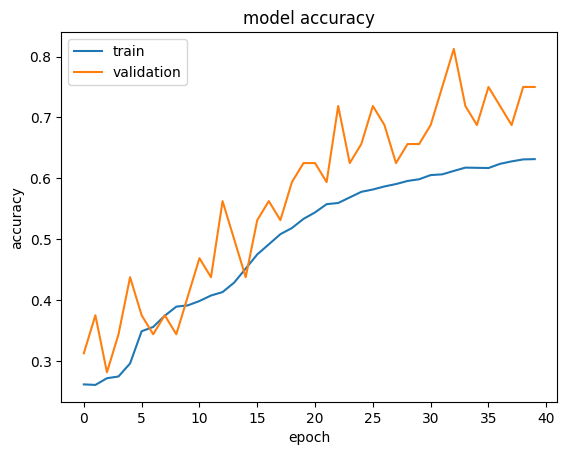

In [30]:
plt.plot(history_2.history["accuracy"])
plt.plot(history_2.history["val_accuracy"])
plt.title("model accuracy")
plt.ylabel("accuracy")
plt.xlabel("epoch")
plt.legend(["train", "validation"], loc="upper left")
plt.show()

### **Evaluating the Model on the Test Set**


In [31]:
# Calculate the number of steps for the entire test set to be processed
test_steps = test_generator.samples // batch_size

# If the number of samples isn't a multiple of the batch size,
# you have one more batch with the remaining samples
if test_generator.samples % batch_size > 0:
    test_steps += 1

# Evaluating the model on the test set
evaluation_results = model_2.evaluate(test_generator, steps=test_steps)
print(f"Loss: {evaluation_results[0]}, Accuracy: {evaluation_results[1]}")

1/4 [======>.......................] - ETA: 0s - loss: 0.4782 - accuracy: 0.8438

4/4 [==============================] - 0s 5ms/step - loss: 0.7548 - accuracy: 0.6875


Loss: 0.7547932267189026, Accuracy: 0.6875


### **Plotting Confusion Matrix**


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 4ms/step


              precision    recall  f1-score   support

       happy       0.71      0.84      0.77        32
     neutral       0.54      0.59      0.57        32
         sad       0.55      0.50      0.52        32
    surprise       1.00      0.81      0.90        32

    accuracy                           0.69       128
   macro avg       0.70      0.69      0.69       128
weighted avg       0.70      0.69      0.69       128



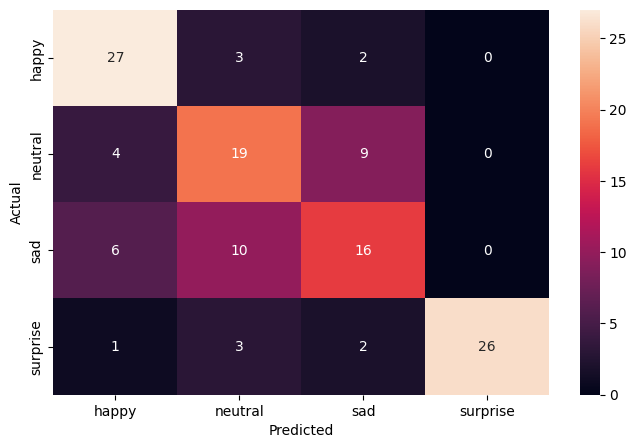

In [32]:
pred_probabilities = model_2.predict(test_generator, steps=test_steps)
pred = np.argmax(pred_probabilities, axis=1)

# Getting the true labels from the generator
y_true = test_generator.classes

# Printing the classification report with actual emotion labels
print(classification_report(y_true, pred, target_names=CATEGORIES))

# Plotting the heatmap using confusion matrix
cm = confusion_matrix(y_true, pred)
plt.figure(figsize=(8, 5))
sns.heatmap(cm, annot=True, fmt=".0f", xticklabels=CATEGORIES, yticklabels=CATEGORIES)
plt.ylabel("Actual")
plt.xlabel("Predicted")
plt.show()

**Observations and Insights:**

- The second CNN model, equipped with a more complex architecture of **938,948 parameters**, demonstrates a steady learning curve, indicating effective feature learning with a final training accuracy of approximately 69.08%. The **validation accuracy on training** experiences fluctuations but shows an upward trend, with a peak at around **84.37%**.
- On testing, the model secured a **loss of 0.5975 and an accuracy of 75%**, which confirms its capability to generalize the learned features to new data reasonably well, aligning closely with the observed validation accuracy.
- The confusion matrix reveals the model's proficiency in correctly identifying 'happy' with a high precision of 0.96 and 'surprise' emotions with impressive precision and recall of 0.93 and 0.84, respectively.
- In contrast, the model has room for improvement when predicting 'neutral' and 'sad' emotions, as indicated by lower precision and recall scores. 'Neutral' faces have the lowest precision at 0.56, suggesting the model sometimes confuses this emotion with others, while 'sad' faces have a recall of 0.56, indicating that the model fails to detect a significant portion of this emotion.


## **Think About It:**

- Did the models have a satisfactory performance? If not, then what are the possible reasons?
- Which Color mode showed better overall performance? What are the possible reasons? Do you think having 'rgb' color mode is needed because the images are already black and white?


## **Transfer Learning Architectures**

In this section, we will create several Transfer Learning architectures. For the pre-trained models, we will select three popular architectures namely, VGG16, ResNet v2, and Efficient Net. The difference between these architectures and the previous architectures is that these will require 3 input channels while the earlier ones worked on 'grayscale' images. Therefore, we need to create new DataLoaders.


### **Creating our Data Loaders for Transfer Learning Architectures**

In this section, we are creating data loaders that we will use as inputs to our Neural Network. We will have to go with color_mode = 'rgb' as this is the required format for the transfer learning architectures.


In [33]:
# Set this to 'rgb' as this is the required format for the transfer learning architectures
color_mode = "rgb"
color_layers = 3
# Resize our images to the same size expected by the transfer learning architectures
# img_width, img_height = 224, 224
img_width, img_height = 48, 48
# A batch size of 32 is appropriate for this dataset provide to provide a good balance
# between the model's ability to generalize (avoid overfitting) and computational efficiency.
batch_size = 32

# Training Data Augmentation
train_datagen = ImageDataGenerator(
    preprocessing_function=preprocess_input,  # Use the appropriate preprocessing function
    rotation_range=20,  # Slight rotation to introduce variability without distorting emotion features
    width_shift_range=0.1,  # Slight horizontal shifts to simulate off-center faces
    height_shift_range=0.1,  # Slight vertical shifts to account for different heights/angles
    shear_range=0.1,  # Small shear transformations for slight perspective changes
    zoom_range=0.1,  # Small zoom in/out to simulate closer or further away faces
    horizontal_flip=True,  # Faces are symmetric; flipping can simulate looking from another direction
    fill_mode="nearest",  # 'nearest' interpolation for filling in new pixels after a transformation
)

# Validation and Testing Data should not be augmented!
validation_datagen = ImageDataGenerator(preprocessing_function=preprocess_input)
test_datagen = ImageDataGenerator(preprocessing_function=preprocess_input)

# Assuming train_dir, validation_dir, and test_dir should follow the structure in DATADIR and SUBDIRS
train_dir = os.path.join(DATADIR, SUBDIRS_DICT["train"])
validation_dir = os.path.join(DATADIR, SUBDIRS_DICT["validation"])
test_dir = os.path.join(DATADIR, SUBDIRS_DICT["test"])

# Train Generator
train_generator = train_datagen.flow_from_directory(
    train_dir,
    target_size=(img_width, img_height),
    batch_size=batch_size,
    color_mode=color_mode,
    class_mode="categorical",
)

# Validation Generator
validation_generator = validation_datagen.flow_from_directory(
    validation_dir,
    target_size=(img_width, img_height),
    batch_size=batch_size,
    color_mode=color_mode,
    class_mode="categorical",
)

# Testing Generator
test_generator = test_datagen.flow_from_directory(
    test_dir,
    target_size=(img_width, img_height),
    batch_size=batch_size,
    color_mode=color_mode,
    class_mode="categorical",
    shuffle=False,  # shuffle=False to keep data in order for testing
)

Found 15109 images belonging to 4 classes.


Found 4977 images belonging to 4 classes.


Found 128 images belonging to 4 classes.


## **VGG16 Model**


### **Importing the VGG16 Architecture**


In [34]:
backend.clear_session()

# Fixing the seed for random number generators so that we can ensure we receive the same output everytime
np.random.seed(42)

random.seed(42)
tf.random.set_seed(42)

In [35]:
vgg_model = VGG16(weights="imagenet", include_top=False, input_shape=(img_width, img_height, color_layers))
# Making all the layers of the VGG model non-trainable. i.e. freezing them
for layer in vgg_model.layers:
    layer.trainable = False

vgg_model.summary()

Model: "vgg16"


_________________________________________________________________


 Layer (type)                Output Shape              Param #   


 input_1 (InputLayer)        [(None, 48, 48, 3)]       0         


 block1_conv1 (Conv2D)       (None, 48, 48, 64)        1792      


 block1_conv2 (Conv2D)       (None, 48, 48, 64)        36928     


 block1_pool (MaxPooling2D)  (None, 24, 24, 64)        0         


 block2_conv1 (Conv2D)       (None, 24, 24, 128)       73856     


 block2_conv2 (Conv2D)       (None, 24, 24, 128)       147584    


 block2_pool (MaxPooling2D)  (None, 12, 12, 128)       0         


 block3_conv1 (Conv2D)       (None, 12, 12, 256)       295168    


 block3_conv2 (Conv2D)       (None, 12, 12, 256)       590080    


 block3_conv3 (Conv2D)       (None, 12, 12, 256)       590080    


 block3_pool (MaxPooling2D)  (None, 6, 6, 256)         0         


 block4_conv1 (Conv2D)       (None, 6, 6, 512)         1180160   


 block4_conv2 (Conv2D)       (None, 6, 6, 512)         2359808   


 block4_conv3 (Conv2D)       (None, 6, 6, 512)         2359808   


 block4_pool (MaxPooling2D)  (None, 3, 3, 512)         0         


 block5_conv1 (Conv2D)       (None, 3, 3, 512)         2359808   


 block5_conv2 (Conv2D)       (None, 3, 3, 512)         2359808   


 block5_conv3 (Conv2D)       (None, 3, 3, 512)         2359808   


 block5_pool (MaxPooling2D)  (None, 1, 1, 512)         0         


Total params: 14714688 (56.13 MB)


Trainable params: 0 (0.00 Byte)


Non-trainable params: 14714688 (56.13 MB)


_________________________________________________________________


### **Model Building**

- Import VGG16 upto the layer of your choice and add Fully Connected layers on top of it.


In [36]:
new_vgg16_model = Sequential()

# Adding the convolutional part of the VGG16 model from above
new_vgg16_model.add(vgg_model)

# Reduces each feature map to a single value by averaging all elements
new_vgg16_model.add(GlobalAveragePooling2D())

# Adding a dense output layer
new_vgg16_model.add(Dense(512, activation="relu"))
new_vgg16_model.add(Dropout(0.5))
new_vgg16_model.add(Dense(128, activation="relu"))
new_vgg16_model.add(Dropout(0.5))
new_vgg16_model.add(Dense(4, activation="softmax"))

# Using Adam Optimizer
optimizer = Adam(learning_rate=0.0005)

### **Compiling and Training the VGG16 Model**


In [37]:
new_vgg16_model.compile(optimizer=optimizer, loss="categorical_crossentropy", metrics=["accuracy"])
new_vgg16_model.summary()

Model: "sequential"


_________________________________________________________________


 Layer (type)                Output Shape              Param #   


 vgg16 (Functional)          (None, 1, 1, 512)         14714688  


 global_average_pooling2d (  (None, 512)               0         


 GlobalAveragePooling2D)                                         


 dense (Dense)               (None, 512)               262656    


 dropout (Dropout)           (None, 512)               0         


 dense_1 (Dense)             (None, 128)               65664     


 dropout_1 (Dropout)         (None, 128)               0         


 dense_2 (Dense)             (None, 4)                 516       


Total params: 15043524 (57.39 MB)


Trainable params: 328836 (1.25 MB)


Non-trainable params: 14714688 (56.13 MB)


_________________________________________________________________


In [38]:
# Get the current time
current_time = datetime.now().strftime("%Y%m%d-%H%M%S")

# Set up Early Stopping with a patience 7 but acting after at least 20 epochs
delayed_early_stopping = DelayedEarlyStopping(
    monitor="val_loss", patience=7, verbose=1, restore_best_weights=True, start_epoch=20
)

# Define the learning rate scheduler callback
reduce_lr = ReduceLROnPlateau(monitor="val_loss", factor=0.2, patience=5, min_lr=0.00001, verbose=1)

mc = ModelCheckpoint(
    f"{results_path}/best_model_vgg16_{current_time}.keras",
    monitor="val_accuracy",
    mode="max",
    verbose=1,
    save_best_only=True,
)

# Pulling a single large batch of random validation data for doing the validation after each epoch
validationX, validationY = validation_generator.next()

# Fitting the model with 40 epochs and using validation set
history_vgg = new_vgg16_model.fit(
    train_generator,
    epochs=40,
    validation_data=(validationX, validationY),
    callbacks=[delayed_early_stopping, mc, reduce_lr],
)

Epoch 1/40


  1/473 [..............................] - ETA: 8:45 - loss: 19.6940 - accuracy: 0.1875

  6/473 [..............................] - ETA: 5s - loss: 19.1335 - accuracy: 0.2448  

  9/473 [..............................] - ETA: 6s - loss: 18.7273 - accuracy: 0.2431

 13/473 [..............................] - ETA: 6s - loss: 17.4671 - accuracy: 0.2524

 17/473 [>.............................] - ETA: 6s - loss: 17.0995 - accuracy: 0.2463

 21/473 [>.............................] - ETA: 6s - loss: 16.2975 - accuracy: 0.2455

 25/473 [>.............................] - ETA: 6s - loss: 15.6506 - accuracy: 0.2575

 29/473 [>.............................] - ETA: 6s - loss: 15.0137 - accuracy: 0.2629

 33/473 [=>............................] - ETA: 6s - loss: 14.5265 - accuracy: 0.2633

 37/473 [=>............................] - ETA: 6s - loss: 14.0123 - accuracy: 0.2644

 40/473 [=>............................] - ETA: 6s - loss: 13.7038 - accuracy: 0.2672

 44/473 [=>............................] - ETA: 6s - loss: 13.2291 - accuracy: 0.2663

 47/473 [=>............................] - ETA: 6s - loss: 12.8935 - accuracy: 0.2706

 50/473 [==>...........................] - ETA: 6s - loss: 12.4437 - accuracy: 0.2781

 54/473 [==>...........................] - ETA: 6s - loss: 12.0906 - accuracy: 0.2789

 58/473 [==>...........................] - ETA: 6s - loss: 11.7138 - accuracy: 0.2812

 62/473 [==>...........................] - ETA: 6s - loss: 11.4031 - accuracy: 0.2792

 66/473 [===>..........................] - ETA: 6s - loss: 11.0882 - accuracy: 0.2836

 70/473 [===>..........................] - ETA: 6s - loss: 10.8689 - accuracy: 0.2804

 74/473 [===>..........................] - ETA: 6s - loss: 10.6229 - accuracy: 0.2825

 78/473 [===>..........................] - ETA: 6s - loss: 10.3953 - accuracy: 0.2833

 82/473 [====>.........................] - ETA: 6s - loss: 10.1951 - accuracy: 0.2858

 86/473 [====>.........................] - ETA: 6s - loss: 9.9881 - accuracy: 0.2831 

 90/473 [====>.........................] - ETA: 6s - loss: 9.7761 - accuracy: 0.2858

 94/473 [====>.........................] - ETA: 6s - loss: 9.5666 - accuracy: 0.2872

 98/473 [=====>........................] - ETA: 6s - loss: 9.3546 - accuracy: 0.2879

102/473 [=====>........................] - ETA: 6s - loss: 9.1492 - accuracy: 0.2895

106/473 [=====>........................] - ETA: 5s - loss: 9.0061 - accuracy: 0.2851

110/473 [=====>........................] - ETA: 5s - loss: 8.8333 - accuracy: 0.2830

114/473 [======>.......................] - ETA: 5s - loss: 8.6655 - accuracy: 0.2821

118/473 [======>.......................] - ETA: 5s - loss: 8.4778 - accuracy: 0.2834

122/473 [======>.......................] - ETA: 5s - loss: 8.3360 - accuracy: 0.2853

126/473 [======>.......................] - ETA: 5s - loss: 8.1714 - accuracy: 0.2865

130/473 [=======>......................] - ETA: 5s - loss: 8.0083 - accuracy: 0.2899

134/473 [=======>......................] - ETA: 5s - loss: 7.8554 - accuracy: 0.2910

138/473 [=======>......................] - ETA: 5s - loss: 7.7115 - accuracy: 0.2903

142/473 [========>.....................] - ETA: 5s - loss: 7.5825 - accuracy: 0.2905

146/473 [========>.....................] - ETA: 5s - loss: 7.4431 - accuracy: 0.2926

150/473 [========>.....................] - ETA: 5s - loss: 7.3279 - accuracy: 0.2912

154/473 [========>.....................] - ETA: 5s - loss: 7.1941 - accuracy: 0.2938

158/473 [=========>....................] - ETA: 5s - loss: 7.0749 - accuracy: 0.2949

162/473 [=========>....................] - ETA: 5s - loss: 6.9733 - accuracy: 0.2944

166/473 [=========>....................] - ETA: 5s - loss: 6.8736 - accuracy: 0.2941

170/473 [=========>....................] - ETA: 4s - loss: 6.7667 - accuracy: 0.2947

174/473 [==========>...................] - ETA: 4s - loss: 6.6621 - accuracy: 0.2947

178/473 [==========>...................] - ETA: 4s - loss: 6.5587 - accuracy: 0.2951

182/473 [==========>...................] - ETA: 4s - loss: 6.4616 - accuracy: 0.2962

186/473 [==========>...................] - ETA: 4s - loss: 6.3717 - accuracy: 0.2955

190/473 [===========>..................] - ETA: 4s - loss: 6.2835 - accuracy: 0.2957

194/473 [===========>..................] - ETA: 4s - loss: 6.1981 - accuracy: 0.2966

198/473 [===========>..................] - ETA: 4s - loss: 6.1251 - accuracy: 0.2948

202/473 [===========>..................] - ETA: 4s - loss: 6.0431 - accuracy: 0.2955

206/473 [============>.................] - ETA: 4s - loss: 5.9727 - accuracy: 0.2954

210/473 [============>.................] - ETA: 4s - loss: 5.8957 - accuracy: 0.2948

214/473 [============>.................] - ETA: 4s - loss: 5.8256 - accuracy: 0.2945

218/473 [============>.................] - ETA: 4s - loss: 5.7529 - accuracy: 0.2949

222/473 [=============>................] - ETA: 4s - loss: 5.6816 - accuracy: 0.2948

226/473 [=============>................] - ETA: 4s - loss: 5.6181 - accuracy: 0.2955

230/473 [=============>................] - ETA: 3s - loss: 5.5516 - accuracy: 0.2965

234/473 [=============>................] - ETA: 3s - loss: 5.4928 - accuracy: 0.2969

238/473 [==============>...............] - ETA: 3s - loss: 5.4316 - accuracy: 0.2975

242/473 [==============>...............] - ETA: 3s - loss: 5.3720 - accuracy: 0.2971

246/473 [==============>...............] - ETA: 3s - loss: 5.3174 - accuracy: 0.2967

250/473 [==============>...............] - ETA: 3s - loss: 5.2581 - accuracy: 0.2975

254/473 [===============>..............] - ETA: 3s - loss: 5.2018 - accuracy: 0.2971

258/473 [===============>..............] - ETA: 3s - loss: 5.1466 - accuracy: 0.2978

262/473 [===============>..............] - ETA: 3s - loss: 5.0958 - accuracy: 0.2983

266/473 [===============>..............] - ETA: 3s - loss: 5.0435 - accuracy: 0.2989

270/473 [================>.............] - ETA: 3s - loss: 4.9923 - accuracy: 0.3002

274/473 [================>.............] - ETA: 3s - loss: 4.9455 - accuracy: 0.3004

278/473 [================>.............] - ETA: 3s - loss: 4.8953 - accuracy: 0.3006

282/473 [================>.............] - ETA: 3s - loss: 4.8493 - accuracy: 0.3006

286/473 [=================>............] - ETA: 3s - loss: 4.8047 - accuracy: 0.3005

290/473 [=================>............] - ETA: 2s - loss: 4.7633 - accuracy: 0.3009

294/473 [=================>............] - ETA: 2s - loss: 4.7224 - accuracy: 0.3018

298/473 [=================>............] - ETA: 2s - loss: 4.6781 - accuracy: 0.3020

302/473 [==================>...........] - ETA: 2s - loss: 4.6388 - accuracy: 0.3019

306/473 [==================>...........] - ETA: 2s - loss: 4.6033 - accuracy: 0.3014

310/473 [==================>...........] - ETA: 2s - loss: 4.5640 - accuracy: 0.3016

314/473 [==================>...........] - ETA: 2s - loss: 4.5254 - accuracy: 0.3026

318/473 [===================>..........] - ETA: 2s - loss: 4.4896 - accuracy: 0.3023

322/473 [===================>..........] - ETA: 2s - loss: 4.4527 - accuracy: 0.3018

326/473 [===================>..........] - ETA: 2s - loss: 4.4167 - accuracy: 0.3019

330/473 [===================>..........] - ETA: 2s - loss: 4.3807 - accuracy: 0.3018

334/473 [====================>.........] - ETA: 2s - loss: 4.3493 - accuracy: 0.3016

338/473 [====================>.........] - ETA: 2s - loss: 4.3170 - accuracy: 0.3022

342/473 [====================>.........] - ETA: 2s - loss: 4.2858 - accuracy: 0.3016

346/473 [====================>.........] - ETA: 2s - loss: 4.2545 - accuracy: 0.3011

350/473 [=====================>........] - ETA: 1s - loss: 4.2250 - accuracy: 0.3010

354/473 [=====================>........] - ETA: 1s - loss: 4.1956 - accuracy: 0.3014

358/473 [=====================>........] - ETA: 1s - loss: 4.1649 - accuracy: 0.3018

362/473 [=====================>........] - ETA: 1s - loss: 4.1365 - accuracy: 0.3015

366/473 [======================>.......] - ETA: 1s - loss: 4.1077 - accuracy: 0.3022

370/473 [======================>.......] - ETA: 1s - loss: 4.0788 - accuracy: 0.3025

374/473 [======================>.......] - ETA: 1s - loss: 4.0494 - accuracy: 0.3029

378/473 [======================>.......] - ETA: 1s - loss: 4.0229 - accuracy: 0.3025

382/473 [=======================>......] - ETA: 1s - loss: 3.9968 - accuracy: 0.3028

386/473 [=======================>......] - ETA: 1s - loss: 3.9711 - accuracy: 0.3027

390/473 [=======================>......] - ETA: 1s - loss: 3.9469 - accuracy: 0.3025

394/473 [=======================>......] - ETA: 1s - loss: 3.9218 - accuracy: 0.3029

398/473 [========================>.....] - ETA: 1s - loss: 3.8995 - accuracy: 0.3028

402/473 [========================>.....] - ETA: 1s - loss: 3.8753 - accuracy: 0.3028

406/473 [========================>.....] - ETA: 1s - loss: 3.8512 - accuracy: 0.3033

410/473 [=========================>....] - ETA: 1s - loss: 3.8298 - accuracy: 0.3041

414/473 [=========================>....] - ETA: 0s - loss: 3.8062 - accuracy: 0.3045

418/473 [=========================>....] - ETA: 0s - loss: 3.7858 - accuracy: 0.3052

422/473 [=========================>....] - ETA: 0s - loss: 3.7652 - accuracy: 0.3048

426/473 [==========================>...] - ETA: 0s - loss: 3.7433 - accuracy: 0.3050

430/473 [==========================>...] - ETA: 0s - loss: 3.7219 - accuracy: 0.3046

434/473 [==========================>...] - ETA: 0s - loss: 3.7006 - accuracy: 0.3045

438/473 [==========================>...] - ETA: 0s - loss: 3.6812 - accuracy: 0.3036

442/473 [===========================>..] - ETA: 0s - loss: 3.6612 - accuracy: 0.3031

446/473 [===========================>..] - ETA: 0s - loss: 3.6463 - accuracy: 0.3025

451/473 [===========================>..] - ETA: 0s - loss: 3.6212 - accuracy: 0.3034

455/473 [===========================>..] - ETA: 0s - loss: 3.6015 - accuracy: 0.3039

459/473 [============================>.] - ETA: 0s - loss: 3.5825 - accuracy: 0.3041

463/473 [============================>.] - ETA: 0s - loss: 3.5636 - accuracy: 0.3043

467/473 [============================>.] - ETA: 0s - loss: 3.5446 - accuracy: 0.3050

471/473 [============================>.] - ETA: 0s - loss: 3.5264 - accuracy: 0.3054


Epoch 1: val_accuracy improved from -inf to 0.53125, saving model to /home/iamtxena/sandbox/mit-ai/capstone/Facial_Emotion_Recognition/results/best_model_vgg16_20240318-104130.keras


473/473 [==============================] - 9s 17ms/step - loss: 3.5178 - accuracy: 0.3052 - val_loss: 1.3414 - val_accuracy: 0.5312 - lr: 5.0000e-04


Epoch 2/40


  1/473 [..............................] - ETA: 13s - loss: 1.4121 - accuracy: 0.2188

  4/473 [..............................] - ETA: 7s - loss: 1.3995 - accuracy: 0.3438 

  7/473 [..............................] - ETA: 7s - loss: 1.4850 - accuracy: 0.3036

 11/473 [..............................] - ETA: 7s - loss: 1.4593 - accuracy: 0.2812

 15/473 [..............................] - ETA: 7s - loss: 1.4549 - accuracy: 0.2875

 19/473 [>.............................] - ETA: 7s - loss: 1.4576 - accuracy: 0.2845

 22/473 [>.............................] - ETA: 7s - loss: 1.4601 - accuracy: 0.2869

 26/473 [>.............................] - ETA: 7s - loss: 1.4694 - accuracy: 0.2873

 30/473 [>.............................] - ETA: 7s - loss: 1.4720 - accuracy: 0.2854

 33/473 [=>............................] - ETA: 7s - loss: 1.4587 - accuracy: 0.2926

 37/473 [=>............................] - ETA: 7s - loss: 1.4574 - accuracy: 0.2956

 40/473 [=>............................] - ETA: 7s - loss: 1.4539 - accuracy: 0.2984

 43/473 [=>............................] - ETA: 7s - loss: 1.4493 - accuracy: 0.2972

 47/473 [=>............................] - ETA: 7s - loss: 1.4530 - accuracy: 0.3072

 51/473 [==>...........................] - ETA: 7s - loss: 1.4565 - accuracy: 0.3094

 55/473 [==>...........................] - ETA: 6s - loss: 1.4598 - accuracy: 0.3125

 59/473 [==>...........................] - ETA: 6s - loss: 1.4586 - accuracy: 0.3104

 63/473 [==>...........................] - ETA: 6s - loss: 1.4550 - accuracy: 0.3165

 67/473 [===>..........................] - ETA: 6s - loss: 1.4578 - accuracy: 0.3148

 71/473 [===>..........................] - ETA: 6s - loss: 1.4496 - accuracy: 0.3160

 75/473 [===>..........................] - ETA: 6s - loss: 1.4433 - accuracy: 0.3158

 78/473 [===>..........................] - ETA: 6s - loss: 1.4487 - accuracy: 0.3165

 82/473 [====>.........................] - ETA: 6s - loss: 1.4484 - accuracy: 0.3190

 85/473 [====>.........................] - ETA: 6s - loss: 1.4464 - accuracy: 0.3195

 88/473 [====>.........................] - ETA: 6s - loss: 1.4449 - accuracy: 0.3150

 92/473 [====>.........................] - ETA: 6s - loss: 1.4405 - accuracy: 0.3169

 96/473 [=====>........................] - ETA: 6s - loss: 1.4359 - accuracy: 0.3167

100/473 [=====>........................] - ETA: 6s - loss: 1.4357 - accuracy: 0.3162

104/473 [=====>........................] - ETA: 6s - loss: 1.4329 - accuracy: 0.3155

108/473 [=====>........................] - ETA: 6s - loss: 1.4333 - accuracy: 0.3174

112/473 [======>.......................] - ETA: 5s - loss: 1.4316 - accuracy: 0.3164

116/473 [======>.......................] - ETA: 5s - loss: 1.4297 - accuracy: 0.3157

120/473 [======>.......................] - ETA: 5s - loss: 1.4291 - accuracy: 0.3141

123/473 [======>.......................] - ETA: 5s - loss: 1.4302 - accuracy: 0.3140

127/473 [=======>......................] - ETA: 5s - loss: 1.4308 - accuracy: 0.3120

131/473 [=======>......................] - ETA: 5s - loss: 1.4313 - accuracy: 0.3151

135/473 [=======>......................] - ETA: 5s - loss: 1.4302 - accuracy: 0.3150

138/473 [=======>......................] - ETA: 5s - loss: 1.4297 - accuracy: 0.3145

142/473 [========>.....................] - ETA: 5s - loss: 1.4284 - accuracy: 0.3158

146/473 [========>.....................] - ETA: 5s - loss: 1.4273 - accuracy: 0.3159

150/473 [========>.....................] - ETA: 5s - loss: 1.4267 - accuracy: 0.3146

154/473 [========>.....................] - ETA: 5s - loss: 1.4248 - accuracy: 0.3143

158/473 [=========>....................] - ETA: 5s - loss: 1.4238 - accuracy: 0.3153

162/473 [=========>....................] - ETA: 5s - loss: 1.4234 - accuracy: 0.3137

166/473 [=========>....................] - ETA: 5s - loss: 1.4226 - accuracy: 0.3119

170/473 [=========>....................] - ETA: 5s - loss: 1.4223 - accuracy: 0.3103

174/473 [==========>...................] - ETA: 4s - loss: 1.4204 - accuracy: 0.3093

178/473 [==========>...................] - ETA: 4s - loss: 1.4203 - accuracy: 0.3109

182/473 [==========>...................] - ETA: 4s - loss: 1.4188 - accuracy: 0.3111

186/473 [==========>...................] - ETA: 4s - loss: 1.4191 - accuracy: 0.3100

190/473 [===========>..................] - ETA: 4s - loss: 1.4170 - accuracy: 0.3104

194/473 [===========>..................] - ETA: 4s - loss: 1.4156 - accuracy: 0.3117

197/473 [===========>..................] - ETA: 4s - loss: 1.4144 - accuracy: 0.3117

200/473 [===========>..................] - ETA: 4s - loss: 1.4137 - accuracy: 0.3130

203/473 [===========>..................] - ETA: 4s - loss: 1.4122 - accuracy: 0.3133

206/473 [============>.................] - ETA: 4s - loss: 1.4117 - accuracy: 0.3143

210/473 [============>.................] - ETA: 4s - loss: 1.4121 - accuracy: 0.3143

213/473 [============>.................] - ETA: 4s - loss: 1.4117 - accuracy: 0.3132

216/473 [============>.................] - ETA: 4s - loss: 1.4129 - accuracy: 0.3137

219/473 [============>.................] - ETA: 4s - loss: 1.4137 - accuracy: 0.3145

222/473 [=============>................] - ETA: 4s - loss: 1.4146 - accuracy: 0.3148

225/473 [=============>................] - ETA: 4s - loss: 1.4150 - accuracy: 0.3132

228/473 [=============>................] - ETA: 4s - loss: 1.4149 - accuracy: 0.3125

231/473 [=============>................] - ETA: 4s - loss: 1.4149 - accuracy: 0.3132

234/473 [=============>................] - ETA: 3s - loss: 1.4142 - accuracy: 0.3129

237/473 [==============>...............] - ETA: 3s - loss: 1.4136 - accuracy: 0.3136

240/473 [==============>...............] - ETA: 3s - loss: 1.4130 - accuracy: 0.3135

243/473 [==============>...............] - ETA: 3s - loss: 1.4128 - accuracy: 0.3129

247/473 [==============>...............] - ETA: 3s - loss: 1.4117 - accuracy: 0.3128

251/473 [==============>...............] - ETA: 3s - loss: 1.4120 - accuracy: 0.3131

255/473 [===============>..............] - ETA: 3s - loss: 1.4106 - accuracy: 0.3142

258/473 [===============>..............] - ETA: 3s - loss: 1.4100 - accuracy: 0.3137

262/473 [===============>..............] - ETA: 3s - loss: 1.4093 - accuracy: 0.3132

266/473 [===============>..............] - ETA: 3s - loss: 1.4090 - accuracy: 0.3142

270/473 [================>.............] - ETA: 3s - loss: 1.4087 - accuracy: 0.3146

274/473 [================>.............] - ETA: 3s - loss: 1.4083 - accuracy: 0.3151

278/473 [================>.............] - ETA: 3s - loss: 1.4073 - accuracy: 0.3158

282/473 [================>.............] - ETA: 3s - loss: 1.4068 - accuracy: 0.3165

286/473 [=================>............] - ETA: 3s - loss: 1.4071 - accuracy: 0.3157

290/473 [=================>............] - ETA: 3s - loss: 1.4059 - accuracy: 0.3152

294/473 [=================>............] - ETA: 2s - loss: 1.4044 - accuracy: 0.3153

298/473 [=================>............] - ETA: 2s - loss: 1.4043 - accuracy: 0.3153

302/473 [==================>...........] - ETA: 2s - loss: 1.4030 - accuracy: 0.3153

305/473 [==================>...........] - ETA: 2s - loss: 1.4028 - accuracy: 0.3149

309/473 [==================>...........] - ETA: 2s - loss: 1.4016 - accuracy: 0.3162

313/473 [==================>...........] - ETA: 2s - loss: 1.4026 - accuracy: 0.3161

317/473 [===================>..........] - ETA: 2s - loss: 1.4012 - accuracy: 0.3164

320/473 [===================>..........] - ETA: 2s - loss: 1.4012 - accuracy: 0.3160

324/473 [===================>..........] - ETA: 2s - loss: 1.4001 - accuracy: 0.3162

327/473 [===================>..........] - ETA: 2s - loss: 1.4001 - accuracy: 0.3163

331/473 [===================>..........] - ETA: 2s - loss: 1.3997 - accuracy: 0.3159

335/473 [====================>.........] - ETA: 2s - loss: 1.3992 - accuracy: 0.3158

339/473 [====================>.........] - ETA: 2s - loss: 1.3990 - accuracy: 0.3165

343/473 [====================>.........] - ETA: 2s - loss: 1.3982 - accuracy: 0.3165

347/473 [=====================>........] - ETA: 2s - loss: 1.3972 - accuracy: 0.3165

351/473 [=====================>........] - ETA: 2s - loss: 1.3966 - accuracy: 0.3173

355/473 [=====================>........] - ETA: 1s - loss: 1.3963 - accuracy: 0.3165

359/473 [=====================>........] - ETA: 1s - loss: 1.3949 - accuracy: 0.3172

363/473 [======================>.......] - ETA: 1s - loss: 1.3943 - accuracy: 0.3173

367/473 [======================>.......] - ETA: 1s - loss: 1.3937 - accuracy: 0.3165

371/473 [======================>.......] - ETA: 1s - loss: 1.3946 - accuracy: 0.3159

375/473 [======================>.......] - ETA: 1s - loss: 1.3946 - accuracy: 0.3160

379/473 [=======================>......] - ETA: 1s - loss: 1.3944 - accuracy: 0.3154

383/473 [=======================>......] - ETA: 1s - loss: 1.3941 - accuracy: 0.3156

387/473 [=======================>......] - ETA: 1s - loss: 1.3934 - accuracy: 0.3154

391/473 [=======================>......] - ETA: 1s - loss: 1.3930 - accuracy: 0.3157

395/473 [========================>.....] - ETA: 1s - loss: 1.3926 - accuracy: 0.3154

399/473 [========================>.....] - ETA: 1s - loss: 1.3926 - accuracy: 0.3157

403/473 [========================>.....] - ETA: 1s - loss: 1.3918 - accuracy: 0.3156

407/473 [========================>.....] - ETA: 1s - loss: 1.3910 - accuracy: 0.3165

410/473 [=========================>....] - ETA: 1s - loss: 1.3903 - accuracy: 0.3166

414/473 [=========================>....] - ETA: 0s - loss: 1.3898 - accuracy: 0.3171

418/473 [=========================>....] - ETA: 0s - loss: 1.3893 - accuracy: 0.3173

422/473 [=========================>....] - ETA: 0s - loss: 1.3885 - accuracy: 0.3171

426/473 [==========================>...] - ETA: 0s - loss: 1.3877 - accuracy: 0.3177

430/473 [==========================>...] - ETA: 0s - loss: 1.3872 - accuracy: 0.3178

434/473 [==========================>...] - ETA: 0s - loss: 1.3871 - accuracy: 0.3183

438/473 [==========================>...] - ETA: 0s - loss: 1.3872 - accuracy: 0.3182

442/473 [===========================>..] - ETA: 0s - loss: 1.3867 - accuracy: 0.3176

446/473 [===========================>..] - ETA: 0s - loss: 1.3865 - accuracy: 0.3177

450/473 [===========================>..] - ETA: 0s - loss: 1.3860 - accuracy: 0.3175

454/473 [===========================>..] - ETA: 0s - loss: 1.3857 - accuracy: 0.3175

458/473 [============================>.] - ETA: 0s - loss: 1.3856 - accuracy: 0.3174

462/473 [============================>.] - ETA: 0s - loss: 1.3851 - accuracy: 0.3172

466/473 [============================>.] - ETA: 0s - loss: 1.3847 - accuracy: 0.3172

470/473 [============================>.] - ETA: 0s - loss: 1.3843 - accuracy: 0.3167


Epoch 2: val_accuracy did not improve from 0.53125


473/473 [==============================] - 8s 17ms/step - loss: 1.3838 - accuracy: 0.3168 - val_loss: 1.2864 - val_accuracy: 0.2812 - lr: 5.0000e-04


Epoch 3/40


  1/473 [..............................] - ETA: 14s - loss: 1.3361 - accuracy: 0.3750

  5/473 [..............................] - ETA: 7s - loss: 1.3290 - accuracy: 0.3438 

  8/473 [..............................] - ETA: 7s - loss: 1.3267 - accuracy: 0.3398

 12/473 [..............................] - ETA: 7s - loss: 1.3317 - accuracy: 0.3255

 16/473 [>.............................] - ETA: 7s - loss: 1.3384 - accuracy: 0.3359

 20/473 [>.............................] - ETA: 7s - loss: 1.3372 - accuracy: 0.3328

 24/473 [>.............................] - ETA: 7s - loss: 1.3389 - accuracy: 0.3333

 28/473 [>.............................] - ETA: 7s - loss: 1.3493 - accuracy: 0.3225

 32/473 [=>............................] - ETA: 7s - loss: 1.3550 - accuracy: 0.3262

 36/473 [=>............................] - ETA: 7s - loss: 1.3642 - accuracy: 0.3212

 40/473 [=>............................] - ETA: 7s - loss: 1.3655 - accuracy: 0.3203

 44/473 [=>............................] - ETA: 6s - loss: 1.3620 - accuracy: 0.3203

 48/473 [==>...........................] - ETA: 6s - loss: 1.3642 - accuracy: 0.3197

 52/473 [==>...........................] - ETA: 6s - loss: 1.3625 - accuracy: 0.3203

 56/473 [==>...........................] - ETA: 6s - loss: 1.3617 - accuracy: 0.3248

 60/473 [==>...........................] - ETA: 6s - loss: 1.3585 - accuracy: 0.3281

 64/473 [===>..........................] - ETA: 6s - loss: 1.3571 - accuracy: 0.3257

 68/473 [===>..........................] - ETA: 6s - loss: 1.3549 - accuracy: 0.3258

 72/473 [===>..........................] - ETA: 6s - loss: 1.3551 - accuracy: 0.3234

 76/473 [===>..........................] - ETA: 6s - loss: 1.3517 - accuracy: 0.3273

 80/473 [====>.........................] - ETA: 6s - loss: 1.3476 - accuracy: 0.3281

 84/473 [====>.........................] - ETA: 6s - loss: 1.3462 - accuracy: 0.3285

 88/473 [====>.........................] - ETA: 6s - loss: 1.3470 - accuracy: 0.3288

 92/473 [====>.........................] - ETA: 6s - loss: 1.3474 - accuracy: 0.3298

 96/473 [=====>........................] - ETA: 6s - loss: 1.3503 - accuracy: 0.3294

100/473 [=====>........................] - ETA: 6s - loss: 1.3515 - accuracy: 0.3281

104/473 [=====>........................] - ETA: 6s - loss: 1.3525 - accuracy: 0.3284

108/473 [=====>........................] - ETA: 5s - loss: 1.3526 - accuracy: 0.3284

112/473 [======>.......................] - ETA: 5s - loss: 1.3517 - accuracy: 0.3281

116/473 [======>.......................] - ETA: 5s - loss: 1.3516 - accuracy: 0.3260

120/473 [======>.......................] - ETA: 5s - loss: 1.3532 - accuracy: 0.3281

124/473 [======>.......................] - ETA: 5s - loss: 1.3522 - accuracy: 0.3289

128/473 [=======>......................] - ETA: 5s - loss: 1.3532 - accuracy: 0.3274

132/473 [=======>......................] - ETA: 5s - loss: 1.3537 - accuracy: 0.3255

136/473 [=======>......................] - ETA: 5s - loss: 1.3526 - accuracy: 0.3258

140/473 [=======>......................] - ETA: 5s - loss: 1.3491 - accuracy: 0.3275

144/473 [========>.....................] - ETA: 5s - loss: 1.3495 - accuracy: 0.3273

148/473 [========>.....................] - ETA: 5s - loss: 1.3507 - accuracy: 0.3292

152/473 [========>.....................] - ETA: 5s - loss: 1.3494 - accuracy: 0.3292

156/473 [========>.....................] - ETA: 5s - loss: 1.3473 - accuracy: 0.3269

160/473 [=========>....................] - ETA: 5s - loss: 1.3462 - accuracy: 0.3289

164/473 [=========>....................] - ETA: 5s - loss: 1.3458 - accuracy: 0.3308

168/473 [=========>....................] - ETA: 4s - loss: 1.3451 - accuracy: 0.3307

172/473 [=========>....................] - ETA: 4s - loss: 1.3434 - accuracy: 0.3325

176/473 [==========>...................] - ETA: 4s - loss: 1.3434 - accuracy: 0.3327

180/473 [==========>...................] - ETA: 4s - loss: 1.3421 - accuracy: 0.3344

184/473 [==========>...................] - ETA: 4s - loss: 1.3398 - accuracy: 0.3354

188/473 [==========>...................] - ETA: 4s - loss: 1.3393 - accuracy: 0.3356

192/473 [===========>..................] - ETA: 4s - loss: 1.3385 - accuracy: 0.3358

196/473 [===========>..................] - ETA: 4s - loss: 1.3386 - accuracy: 0.3351

200/473 [===========>..................] - ETA: 4s - loss: 1.3391 - accuracy: 0.3355

204/473 [===========>..................] - ETA: 4s - loss: 1.3398 - accuracy: 0.3359

208/473 [============>.................] - ETA: 4s - loss: 1.3390 - accuracy: 0.3347

212/473 [============>.................] - ETA: 4s - loss: 1.3382 - accuracy: 0.3358

216/473 [============>.................] - ETA: 4s - loss: 1.3387 - accuracy: 0.3362

219/473 [============>.................] - ETA: 4s - loss: 1.3384 - accuracy: 0.3360

223/473 [=============>................] - ETA: 4s - loss: 1.3373 - accuracy: 0.3365

227/473 [=============>................] - ETA: 4s - loss: 1.3384 - accuracy: 0.3366

231/473 [=============>................] - ETA: 3s - loss: 1.3386 - accuracy: 0.3367

234/473 [=============>................] - ETA: 3s - loss: 1.3385 - accuracy: 0.3367

238/473 [==============>...............] - ETA: 3s - loss: 1.3386 - accuracy: 0.3365

242/473 [==============>...............] - ETA: 3s - loss: 1.3383 - accuracy: 0.3372

246/473 [==============>...............] - ETA: 3s - loss: 1.3381 - accuracy: 0.3370

250/473 [==============>...............] - ETA: 3s - loss: 1.3399 - accuracy: 0.3361

253/473 [===============>..............] - ETA: 3s - loss: 1.3401 - accuracy: 0.3361

256/473 [===============>..............] - ETA: 3s - loss: 1.3403 - accuracy: 0.3354

260/473 [===============>..............] - ETA: 3s - loss: 1.3403 - accuracy: 0.3346

264/473 [===============>..............] - ETA: 3s - loss: 1.3403 - accuracy: 0.3342

268/473 [===============>..............] - ETA: 3s - loss: 1.3387 - accuracy: 0.3348

272/473 [================>.............] - ETA: 3s - loss: 1.3385 - accuracy: 0.3340

276/473 [================>.............] - ETA: 3s - loss: 1.3370 - accuracy: 0.3348

280/473 [================>.............] - ETA: 3s - loss: 1.3369 - accuracy: 0.3358

284/473 [=================>............] - ETA: 3s - loss: 1.3366 - accuracy: 0.3353

288/473 [=================>............] - ETA: 3s - loss: 1.3365 - accuracy: 0.3358

292/473 [=================>............] - ETA: 2s - loss: 1.3363 - accuracy: 0.3362

295/473 [=================>............] - ETA: 2s - loss: 1.3359 - accuracy: 0.3362

298/473 [=================>............] - ETA: 2s - loss: 1.3353 - accuracy: 0.3363

302/473 [==================>...........] - ETA: 2s - loss: 1.3358 - accuracy: 0.3361

306/473 [==================>...........] - ETA: 2s - loss: 1.3364 - accuracy: 0.3364

310/473 [==================>...........] - ETA: 2s - loss: 1.3361 - accuracy: 0.3357

314/473 [==================>...........] - ETA: 2s - loss: 1.3355 - accuracy: 0.3362

318/473 [===================>..........] - ETA: 2s - loss: 1.3358 - accuracy: 0.3368

322/473 [===================>..........] - ETA: 2s - loss: 1.3355 - accuracy: 0.3375

326/473 [===================>..........] - ETA: 2s - loss: 1.3359 - accuracy: 0.3371

330/473 [===================>..........] - ETA: 2s - loss: 1.3356 - accuracy: 0.3367

334/473 [====================>.........] - ETA: 2s - loss: 1.3355 - accuracy: 0.3367

338/473 [====================>.........] - ETA: 2s - loss: 1.3368 - accuracy: 0.3364

342/473 [====================>.........] - ETA: 2s - loss: 1.3383 - accuracy: 0.3363

346/473 [====================>.........] - ETA: 2s - loss: 1.3382 - accuracy: 0.3364

350/473 [=====================>........] - ETA: 2s - loss: 1.3386 - accuracy: 0.3360

354/473 [=====================>........] - ETA: 1s - loss: 1.3392 - accuracy: 0.3355

358/473 [=====================>........] - ETA: 1s - loss: 1.3392 - accuracy: 0.3354

362/473 [=====================>........] - ETA: 1s - loss: 1.3386 - accuracy: 0.3355

366/473 [======================>.......] - ETA: 1s - loss: 1.3381 - accuracy: 0.3355

370/473 [======================>.......] - ETA: 1s - loss: 1.3378 - accuracy: 0.3355

374/473 [======================>.......] - ETA: 1s - loss: 1.3381 - accuracy: 0.3351

378/473 [======================>.......] - ETA: 1s - loss: 1.3383 - accuracy: 0.3345

382/473 [=======================>......] - ETA: 1s - loss: 1.3378 - accuracy: 0.3350

386/473 [=======================>......] - ETA: 1s - loss: 1.3377 - accuracy: 0.3353

390/473 [=======================>......] - ETA: 1s - loss: 1.3382 - accuracy: 0.3350

394/473 [=======================>......] - ETA: 1s - loss: 1.3382 - accuracy: 0.3353

398/473 [========================>.....] - ETA: 1s - loss: 1.3377 - accuracy: 0.3350

402/473 [========================>.....] - ETA: 1s - loss: 1.3375 - accuracy: 0.3347

406/473 [========================>.....] - ETA: 1s - loss: 1.3367 - accuracy: 0.3348

410/473 [=========================>....] - ETA: 1s - loss: 1.3367 - accuracy: 0.3351

414/473 [=========================>....] - ETA: 0s - loss: 1.3361 - accuracy: 0.3350

418/473 [=========================>....] - ETA: 0s - loss: 1.3358 - accuracy: 0.3349

422/473 [=========================>....] - ETA: 0s - loss: 1.3355 - accuracy: 0.3352

426/473 [==========================>...] - ETA: 0s - loss: 1.3360 - accuracy: 0.3352

429/473 [==========================>...] - ETA: 0s - loss: 1.3357 - accuracy: 0.3352

433/473 [==========================>...] - ETA: 0s - loss: 1.3365 - accuracy: 0.3352

437/473 [==========================>...] - ETA: 0s - loss: 1.3360 - accuracy: 0.3352

441/473 [==========================>...] - ETA: 0s - loss: 1.3356 - accuracy: 0.3353

445/473 [===========================>..] - ETA: 0s - loss: 1.3357 - accuracy: 0.3353

449/473 [===========================>..] - ETA: 0s - loss: 1.3357 - accuracy: 0.3351

453/473 [===========================>..] - ETA: 0s - loss: 1.3350 - accuracy: 0.3352

457/473 [===========================>..] - ETA: 0s - loss: 1.3348 - accuracy: 0.3355

461/473 [============================>.] - ETA: 0s - loss: 1.3346 - accuracy: 0.3353

465/473 [============================>.] - ETA: 0s - loss: 1.3347 - accuracy: 0.3347

469/473 [============================>.] - ETA: 0s - loss: 1.3344 - accuracy: 0.3350

473/473 [==============================] - ETA: 0s - loss: 1.3339 - accuracy: 0.3349


Epoch 3: val_accuracy improved from 0.53125 to 0.65625, saving model to /home/iamtxena/sandbox/mit-ai/capstone/Facial_Emotion_Recognition/results/best_model_vgg16_20240318-104130.keras


473/473 [==============================] - 8s 17ms/step - loss: 1.3339 - accuracy: 0.3349 - val_loss: 1.2254 - val_accuracy: 0.6562 - lr: 5.0000e-04


Epoch 4/40


  1/473 [..............................] - ETA: 13s - loss: 1.3054 - accuracy: 0.3438

  5/473 [..............................] - ETA: 7s - loss: 1.3019 - accuracy: 0.3375 

  9/473 [..............................] - ETA: 7s - loss: 1.2866 - accuracy: 0.3611

 13/473 [..............................] - ETA: 7s - loss: 1.2889 - accuracy: 0.3702

 17/473 [>.............................] - ETA: 7s - loss: 1.2888 - accuracy: 0.3732

 21/473 [>.............................] - ETA: 7s - loss: 1.2895 - accuracy: 0.3676

 25/473 [>.............................] - ETA: 7s - loss: 1.2932 - accuracy: 0.3600

 29/473 [>.............................] - ETA: 7s - loss: 1.2983 - accuracy: 0.3534

 33/473 [=>............................] - ETA: 7s - loss: 1.2850 - accuracy: 0.3636

 37/473 [=>............................] - ETA: 7s - loss: 1.2825 - accuracy: 0.3623

 41/473 [=>............................] - ETA: 7s - loss: 1.2868 - accuracy: 0.3552

 45/473 [=>............................] - ETA: 6s - loss: 1.2887 - accuracy: 0.3597

 49/473 [==>...........................] - ETA: 6s - loss: 1.2935 - accuracy: 0.3610

 53/473 [==>...........................] - ETA: 6s - loss: 1.2892 - accuracy: 0.3632

 57/473 [==>...........................] - ETA: 6s - loss: 1.2926 - accuracy: 0.3586

 60/473 [==>...........................] - ETA: 6s - loss: 1.2947 - accuracy: 0.3562

 64/473 [===>..........................] - ETA: 6s - loss: 1.2947 - accuracy: 0.3535

 68/473 [===>..........................] - ETA: 6s - loss: 1.2947 - accuracy: 0.3571

 72/473 [===>..........................] - ETA: 6s - loss: 1.2929 - accuracy: 0.3563

 76/473 [===>..........................] - ETA: 6s - loss: 1.2992 - accuracy: 0.3561

 80/473 [====>.........................] - ETA: 6s - loss: 1.3009 - accuracy: 0.3539

 84/473 [====>.........................] - ETA: 6s - loss: 1.3007 - accuracy: 0.3538

 88/473 [====>.........................] - ETA: 6s - loss: 1.3009 - accuracy: 0.3544

 92/473 [====>.........................] - ETA: 6s - loss: 1.3036 - accuracy: 0.3533

 96/473 [=====>........................] - ETA: 6s - loss: 1.3020 - accuracy: 0.3527

100/473 [=====>........................] - ETA: 6s - loss: 1.3028 - accuracy: 0.3527

104/473 [=====>........................] - ETA: 5s - loss: 1.3034 - accuracy: 0.3514

108/473 [=====>........................] - ETA: 5s - loss: 1.3039 - accuracy: 0.3517

112/473 [======>.......................] - ETA: 5s - loss: 1.3041 - accuracy: 0.3509

116/473 [======>.......................] - ETA: 5s - loss: 1.3037 - accuracy: 0.3509

120/473 [======>.......................] - ETA: 5s - loss: 1.3047 - accuracy: 0.3525

124/473 [======>.......................] - ETA: 5s - loss: 1.3064 - accuracy: 0.3514

127/473 [=======>......................] - ETA: 5s - loss: 1.3075 - accuracy: 0.3508

131/473 [=======>......................] - ETA: 5s - loss: 1.3073 - accuracy: 0.3498

135/473 [=======>......................] - ETA: 5s - loss: 1.3137 - accuracy: 0.3487

139/473 [=======>......................] - ETA: 5s - loss: 1.3138 - accuracy: 0.3483

143/473 [========>.....................] - ETA: 5s - loss: 1.3135 - accuracy: 0.3493

147/473 [========>.....................] - ETA: 5s - loss: 1.3142 - accuracy: 0.3494

151/473 [========>.....................] - ETA: 5s - loss: 1.3144 - accuracy: 0.3492

155/473 [========>.....................] - ETA: 5s - loss: 1.3123 - accuracy: 0.3501

159/473 [=========>....................] - ETA: 5s - loss: 1.3126 - accuracy: 0.3509

163/473 [=========>....................] - ETA: 5s - loss: 1.3122 - accuracy: 0.3500

167/473 [=========>....................] - ETA: 4s - loss: 1.3114 - accuracy: 0.3493

171/473 [=========>....................] - ETA: 4s - loss: 1.3120 - accuracy: 0.3500

175/473 [==========>...................] - ETA: 4s - loss: 1.3123 - accuracy: 0.3503

179/473 [==========>...................] - ETA: 4s - loss: 1.3124 - accuracy: 0.3489

183/473 [==========>...................] - ETA: 4s - loss: 1.3126 - accuracy: 0.3488

187/473 [==========>...................] - ETA: 4s - loss: 1.3120 - accuracy: 0.3497

191/473 [===========>..................] - ETA: 4s - loss: 1.3119 - accuracy: 0.3497

194/473 [===========>..................] - ETA: 4s - loss: 1.3124 - accuracy: 0.3491

198/473 [===========>..................] - ETA: 4s - loss: 1.3136 - accuracy: 0.3474

200/473 [===========>..................] - ETA: 4s - loss: 1.3151 - accuracy: 0.3472

203/473 [===========>..................] - ETA: 4s - loss: 1.3146 - accuracy: 0.3478

207/473 [============>.................] - ETA: 4s - loss: 1.3150 - accuracy: 0.3474

211/473 [============>.................] - ETA: 4s - loss: 1.3158 - accuracy: 0.3454

215/473 [============>.................] - ETA: 4s - loss: 1.3151 - accuracy: 0.3466

219/473 [============>.................] - ETA: 4s - loss: 1.3155 - accuracy: 0.3452

223/473 [=============>................] - ETA: 4s - loss: 1.3143 - accuracy: 0.3456

226/473 [=============>................] - ETA: 4s - loss: 1.3141 - accuracy: 0.3452

230/473 [=============>................] - ETA: 3s - loss: 1.3135 - accuracy: 0.3450

234/473 [=============>................] - ETA: 3s - loss: 1.3129 - accuracy: 0.3461

238/473 [==============>...............] - ETA: 3s - loss: 1.3140 - accuracy: 0.3455

242/473 [==============>...............] - ETA: 3s - loss: 1.3133 - accuracy: 0.3448

246/473 [==============>...............] - ETA: 3s - loss: 1.3137 - accuracy: 0.3448

250/473 [==============>...............] - ETA: 3s - loss: 1.3144 - accuracy: 0.3448

254/473 [===============>..............] - ETA: 3s - loss: 1.3136 - accuracy: 0.3458

258/473 [===============>..............] - ETA: 3s - loss: 1.3137 - accuracy: 0.3461

262/473 [===============>..............] - ETA: 3s - loss: 1.3139 - accuracy: 0.3463

266/473 [===============>..............] - ETA: 3s - loss: 1.3135 - accuracy: 0.3458

270/473 [================>.............] - ETA: 3s - loss: 1.3135 - accuracy: 0.3460

274/473 [================>.............] - ETA: 3s - loss: 1.3130 - accuracy: 0.3462

278/473 [================>.............] - ETA: 3s - loss: 1.3126 - accuracy: 0.3459

282/473 [================>.............] - ETA: 3s - loss: 1.3118 - accuracy: 0.3462

285/473 [=================>............] - ETA: 3s - loss: 1.3107 - accuracy: 0.3463

289/473 [=================>............] - ETA: 3s - loss: 1.3095 - accuracy: 0.3461

293/473 [=================>............] - ETA: 2s - loss: 1.3088 - accuracy: 0.3458

296/473 [=================>............] - ETA: 2s - loss: 1.3094 - accuracy: 0.3462

300/473 [==================>...........] - ETA: 2s - loss: 1.3098 - accuracy: 0.3465

304/473 [==================>...........] - ETA: 2s - loss: 1.3099 - accuracy: 0.3464

308/473 [==================>...........] - ETA: 2s - loss: 1.3100 - accuracy: 0.3459

312/473 [==================>...........] - ETA: 2s - loss: 1.3099 - accuracy: 0.3467

316/473 [===================>..........] - ETA: 2s - loss: 1.3100 - accuracy: 0.3469

320/473 [===================>..........] - ETA: 2s - loss: 1.3104 - accuracy: 0.3469

324/473 [===================>..........] - ETA: 2s - loss: 1.3096 - accuracy: 0.3474

328/473 [===================>..........] - ETA: 2s - loss: 1.3094 - accuracy: 0.3474

332/473 [====================>.........] - ETA: 2s - loss: 1.3096 - accuracy: 0.3476

336/473 [====================>.........] - ETA: 2s - loss: 1.3111 - accuracy: 0.3473

339/473 [====================>.........] - ETA: 2s - loss: 1.3111 - accuracy: 0.3477

343/473 [====================>.........] - ETA: 2s - loss: 1.3102 - accuracy: 0.3484

346/473 [====================>.........] - ETA: 2s - loss: 1.3096 - accuracy: 0.3490

350/473 [=====================>........] - ETA: 2s - loss: 1.3094 - accuracy: 0.3486

354/473 [=====================>........] - ETA: 1s - loss: 1.3096 - accuracy: 0.3482

358/473 [=====================>........] - ETA: 1s - loss: 1.3095 - accuracy: 0.3483

362/473 [=====================>........] - ETA: 1s - loss: 1.3083 - accuracy: 0.3490

365/473 [======================>.......] - ETA: 1s - loss: 1.3083 - accuracy: 0.3488

369/473 [======================>.......] - ETA: 1s - loss: 1.3083 - accuracy: 0.3488

373/473 [======================>.......] - ETA: 1s - loss: 1.3090 - accuracy: 0.3486

376/473 [======================>.......] - ETA: 1s - loss: 1.3093 - accuracy: 0.3485

380/473 [=======================>......] - ETA: 1s - loss: 1.3094 - accuracy: 0.3483

384/473 [=======================>......] - ETA: 1s - loss: 1.3096 - accuracy: 0.3477

388/473 [=======================>......] - ETA: 1s - loss: 1.3102 - accuracy: 0.3468

392/473 [=======================>......] - ETA: 1s - loss: 1.3099 - accuracy: 0.3465

396/473 [========================>.....] - ETA: 1s - loss: 1.3098 - accuracy: 0.3465

400/473 [========================>.....] - ETA: 1s - loss: 1.3098 - accuracy: 0.3464

404/473 [========================>.....] - ETA: 1s - loss: 1.3097 - accuracy: 0.3469

407/473 [========================>.....] - ETA: 1s - loss: 1.3094 - accuracy: 0.3475

411/473 [=========================>....] - ETA: 1s - loss: 1.3090 - accuracy: 0.3479

414/473 [=========================>....] - ETA: 0s - loss: 1.3087 - accuracy: 0.3482

417/473 [=========================>....] - ETA: 0s - loss: 1.3094 - accuracy: 0.3479

421/473 [=========================>....] - ETA: 0s - loss: 1.3087 - accuracy: 0.3482

425/473 [=========================>....] - ETA: 0s - loss: 1.3083 - accuracy: 0.3488

429/473 [==========================>...] - ETA: 0s - loss: 1.3092 - accuracy: 0.3478

433/473 [==========================>...] - ETA: 0s - loss: 1.3097 - accuracy: 0.3471

437/473 [==========================>...] - ETA: 0s - loss: 1.3097 - accuracy: 0.3466

441/473 [==========================>...] - ETA: 0s - loss: 1.3089 - accuracy: 0.3473

444/473 [===========================>..] - ETA: 0s - loss: 1.3088 - accuracy: 0.3472

448/473 [===========================>..] - ETA: 0s - loss: 1.3089 - accuracy: 0.3470

452/473 [===========================>..] - ETA: 0s - loss: 1.3087 - accuracy: 0.3471

456/473 [===========================>..] - ETA: 0s - loss: 1.3083 - accuracy: 0.3470

460/473 [============================>.] - ETA: 0s - loss: 1.3086 - accuracy: 0.3469

464/473 [============================>.] - ETA: 0s - loss: 1.3088 - accuracy: 0.3466

468/473 [============================>.] - ETA: 0s - loss: 1.3084 - accuracy: 0.3466

472/473 [============================>.] - ETA: 0s - loss: 1.3083 - accuracy: 0.3463


Epoch 4: val_accuracy improved from 0.65625 to 0.68750, saving model to /home/iamtxena/sandbox/mit-ai/capstone/Facial_Emotion_Recognition/results/best_model_vgg16_20240318-104130.keras


473/473 [==============================] - 8s 17ms/step - loss: 1.3082 - accuracy: 0.3464 - val_loss: 1.2231 - val_accuracy: 0.6875 - lr: 5.0000e-04


Epoch 5/40


  1/473 [..............................] - ETA: 14s - loss: 1.4890 - accuracy: 0.3750

  5/473 [..............................] - ETA: 7s - loss: 1.2970 - accuracy: 0.3938 

  9/473 [..............................] - ETA: 7s - loss: 1.3046 - accuracy: 0.3681

 13/473 [..............................] - ETA: 7s - loss: 1.3344 - accuracy: 0.3894

 17/473 [>.............................] - ETA: 7s - loss: 1.3267 - accuracy: 0.3879

 21/473 [>.............................] - ETA: 7s - loss: 1.3235 - accuracy: 0.3780

 25/473 [>.............................] - ETA: 7s - loss: 1.3204 - accuracy: 0.3862

 29/473 [>.............................] - ETA: 7s - loss: 1.3137 - accuracy: 0.3782

 33/473 [=>............................] - ETA: 7s - loss: 1.3156 - accuracy: 0.3797

 37/473 [=>............................] - ETA: 7s - loss: 1.3127 - accuracy: 0.3843

 41/473 [=>............................] - ETA: 7s - loss: 1.3097 - accuracy: 0.3758

 45/473 [=>............................] - ETA: 6s - loss: 1.3121 - accuracy: 0.3729

 49/473 [==>...........................] - ETA: 6s - loss: 1.3155 - accuracy: 0.3718

 53/473 [==>...........................] - ETA: 6s - loss: 1.3120 - accuracy: 0.3697

 57/473 [==>...........................] - ETA: 6s - loss: 1.3181 - accuracy: 0.3613

 61/473 [==>...........................] - ETA: 6s - loss: 1.3165 - accuracy: 0.3648

 65/473 [===>..........................] - ETA: 6s - loss: 1.3192 - accuracy: 0.3644

 69/473 [===>..........................] - ETA: 6s - loss: 1.3178 - accuracy: 0.3646

 73/473 [===>..........................] - ETA: 6s - loss: 1.3171 - accuracy: 0.3630

 77/473 [===>..........................] - ETA: 6s - loss: 1.3147 - accuracy: 0.3628

 81/473 [====>.........................] - ETA: 6s - loss: 1.3128 - accuracy: 0.3646

 85/473 [====>.........................] - ETA: 6s - loss: 1.3136 - accuracy: 0.3636

 89/473 [====>.........................] - ETA: 6s - loss: 1.3114 - accuracy: 0.3662

 93/473 [====>.........................] - ETA: 6s - loss: 1.3092 - accuracy: 0.3676

 97/473 [=====>........................] - ETA: 6s - loss: 1.3094 - accuracy: 0.3673

101/473 [=====>........................] - ETA: 6s - loss: 1.3119 - accuracy: 0.3660

105/473 [=====>........................] - ETA: 5s - loss: 1.3116 - accuracy: 0.3652

109/473 [=====>........................] - ETA: 5s - loss: 1.3113 - accuracy: 0.3632

113/473 [======>.......................] - ETA: 5s - loss: 1.3076 - accuracy: 0.3645

117/473 [======>.......................] - ETA: 5s - loss: 1.3064 - accuracy: 0.3646

121/473 [======>.......................] - ETA: 5s - loss: 1.3064 - accuracy: 0.3644

125/473 [======>.......................] - ETA: 5s - loss: 1.3065 - accuracy: 0.3625

128/473 [=======>......................] - ETA: 5s - loss: 1.3059 - accuracy: 0.3608

131/473 [=======>......................] - ETA: 5s - loss: 1.3056 - accuracy: 0.3602

135/473 [=======>......................] - ETA: 5s - loss: 1.3059 - accuracy: 0.3604

139/473 [=======>......................] - ETA: 5s - loss: 1.3047 - accuracy: 0.3611

141/473 [=======>......................] - ETA: 5s - loss: 1.3043 - accuracy: 0.3610

144/473 [========>.....................] - ETA: 5s - loss: 1.3038 - accuracy: 0.3598

148/473 [========>.....................] - ETA: 5s - loss: 1.3046 - accuracy: 0.3571

152/473 [========>.....................] - ETA: 5s - loss: 1.3040 - accuracy: 0.3571

155/473 [========>.....................] - ETA: 5s - loss: 1.3029 - accuracy: 0.3573

158/473 [=========>....................] - ETA: 5s - loss: 1.3022 - accuracy: 0.3576

162/473 [=========>....................] - ETA: 5s - loss: 1.3018 - accuracy: 0.3573

165/473 [=========>....................] - ETA: 5s - loss: 1.3010 - accuracy: 0.3572

169/473 [=========>....................] - ETA: 5s - loss: 1.3019 - accuracy: 0.3563

173/473 [=========>....................] - ETA: 5s - loss: 1.3012 - accuracy: 0.3575

176/473 [==========>...................] - ETA: 4s - loss: 1.3003 - accuracy: 0.3576

180/473 [==========>...................] - ETA: 4s - loss: 1.2992 - accuracy: 0.3578

184/473 [==========>...................] - ETA: 4s - loss: 1.2984 - accuracy: 0.3573

188/473 [==========>...................] - ETA: 4s - loss: 1.2980 - accuracy: 0.3579

192/473 [===========>..................] - ETA: 4s - loss: 1.2967 - accuracy: 0.3577

196/473 [===========>..................] - ETA: 4s - loss: 1.2956 - accuracy: 0.3576

200/473 [===========>..................] - ETA: 4s - loss: 1.2965 - accuracy: 0.3581

204/473 [===========>..................] - ETA: 4s - loss: 1.2959 - accuracy: 0.3586

208/473 [============>.................] - ETA: 4s - loss: 1.2973 - accuracy: 0.3588

212/473 [============>.................] - ETA: 4s - loss: 1.2971 - accuracy: 0.3591

215/473 [============>.................] - ETA: 4s - loss: 1.2962 - accuracy: 0.3586

218/473 [============>.................] - ETA: 4s - loss: 1.2956 - accuracy: 0.3588

222/473 [=============>................] - ETA: 4s - loss: 1.2951 - accuracy: 0.3584

226/473 [=============>................] - ETA: 4s - loss: 1.2953 - accuracy: 0.3579

229/473 [=============>................] - ETA: 4s - loss: 1.2953 - accuracy: 0.3585

233/473 [=============>................] - ETA: 4s - loss: 1.2963 - accuracy: 0.3593

237/473 [==============>...............] - ETA: 3s - loss: 1.2972 - accuracy: 0.3596

240/473 [==============>...............] - ETA: 3s - loss: 1.2974 - accuracy: 0.3592

244/473 [==============>...............] - ETA: 3s - loss: 1.2973 - accuracy: 0.3591

248/473 [==============>...............] - ETA: 3s - loss: 1.2985 - accuracy: 0.3599

252/473 [==============>...............] - ETA: 3s - loss: 1.2978 - accuracy: 0.3594

256/473 [===============>..............] - ETA: 3s - loss: 1.2981 - accuracy: 0.3583

260/473 [===============>..............] - ETA: 3s - loss: 1.2981 - accuracy: 0.3593

264/473 [===============>..............] - ETA: 3s - loss: 1.2980 - accuracy: 0.3595

268/473 [===============>..............] - ETA: 3s - loss: 1.2978 - accuracy: 0.3593

272/473 [================>.............] - ETA: 3s - loss: 1.2976 - accuracy: 0.3593

276/473 [================>.............] - ETA: 3s - loss: 1.2975 - accuracy: 0.3595

280/473 [================>.............] - ETA: 3s - loss: 1.2969 - accuracy: 0.3599

284/473 [=================>............] - ETA: 3s - loss: 1.2973 - accuracy: 0.3596

287/473 [=================>............] - ETA: 3s - loss: 1.2974 - accuracy: 0.3595

291/473 [=================>............] - ETA: 3s - loss: 1.2977 - accuracy: 0.3582

295/473 [=================>............] - ETA: 2s - loss: 1.2984 - accuracy: 0.3583

298/473 [=================>............] - ETA: 2s - loss: 1.2982 - accuracy: 0.3582

300/473 [==================>...........] - ETA: 2s - loss: 1.2974 - accuracy: 0.3584

304/473 [==================>...........] - ETA: 2s - loss: 1.2980 - accuracy: 0.3572

308/473 [==================>...........] - ETA: 2s - loss: 1.2975 - accuracy: 0.3571

312/473 [==================>...........] - ETA: 2s - loss: 1.2969 - accuracy: 0.3581

316/473 [===================>..........] - ETA: 2s - loss: 1.2965 - accuracy: 0.3574

320/473 [===================>..........] - ETA: 2s - loss: 1.2962 - accuracy: 0.3570

324/473 [===================>..........] - ETA: 2s - loss: 1.2961 - accuracy: 0.3574

328/473 [===================>..........] - ETA: 2s - loss: 1.2955 - accuracy: 0.3573

331/473 [===================>..........] - ETA: 2s - loss: 1.2957 - accuracy: 0.3567

335/473 [====================>.........] - ETA: 2s - loss: 1.2965 - accuracy: 0.3568

339/473 [====================>.........] - ETA: 2s - loss: 1.2965 - accuracy: 0.3567

343/473 [====================>.........] - ETA: 2s - loss: 1.2960 - accuracy: 0.3569

347/473 [=====================>........] - ETA: 2s - loss: 1.2961 - accuracy: 0.3568

351/473 [=====================>........] - ETA: 2s - loss: 1.2954 - accuracy: 0.3565

355/473 [=====================>........] - ETA: 1s - loss: 1.2952 - accuracy: 0.3571

359/473 [=====================>........] - ETA: 1s - loss: 1.2951 - accuracy: 0.3571

363/473 [======================>.......] - ETA: 1s - loss: 1.2940 - accuracy: 0.3578

367/473 [======================>.......] - ETA: 1s - loss: 1.2932 - accuracy: 0.3585

371/473 [======================>.......] - ETA: 1s - loss: 1.2928 - accuracy: 0.3578

375/473 [======================>.......] - ETA: 1s - loss: 1.2927 - accuracy: 0.3581

379/473 [=======================>......] - ETA: 1s - loss: 1.2921 - accuracy: 0.3583

382/473 [=======================>......] - ETA: 1s - loss: 1.2916 - accuracy: 0.3594

386/473 [=======================>......] - ETA: 1s - loss: 1.2918 - accuracy: 0.3598

390/473 [=======================>......] - ETA: 1s - loss: 1.2912 - accuracy: 0.3600

394/473 [=======================>......] - ETA: 1s - loss: 1.2913 - accuracy: 0.3603

398/473 [========================>.....] - ETA: 1s - loss: 1.2917 - accuracy: 0.3608

402/473 [========================>.....] - ETA: 1s - loss: 1.2925 - accuracy: 0.3608

406/473 [========================>.....] - ETA: 1s - loss: 1.2924 - accuracy: 0.3610

410/473 [=========================>....] - ETA: 1s - loss: 1.2928 - accuracy: 0.3606

414/473 [=========================>....] - ETA: 0s - loss: 1.2925 - accuracy: 0.3607

418/473 [=========================>....] - ETA: 0s - loss: 1.2929 - accuracy: 0.3605

422/473 [=========================>....] - ETA: 0s - loss: 1.2929 - accuracy: 0.3609

426/473 [==========================>...] - ETA: 0s - loss: 1.2924 - accuracy: 0.3610

430/473 [==========================>...] - ETA: 0s - loss: 1.2922 - accuracy: 0.3616

434/473 [==========================>...] - ETA: 0s - loss: 1.2926 - accuracy: 0.3614

438/473 [==========================>...] - ETA: 0s - loss: 1.2923 - accuracy: 0.3620

442/473 [===========================>..] - ETA: 0s - loss: 1.2918 - accuracy: 0.3625

446/473 [===========================>..] - ETA: 0s - loss: 1.2913 - accuracy: 0.3628

450/473 [===========================>..] - ETA: 0s - loss: 1.2913 - accuracy: 0.3623

454/473 [===========================>..] - ETA: 0s - loss: 1.2916 - accuracy: 0.3624

458/473 [============================>.] - ETA: 0s - loss: 1.2915 - accuracy: 0.3626

462/473 [============================>.] - ETA: 0s - loss: 1.2913 - accuracy: 0.3627

466/473 [============================>.] - ETA: 0s - loss: 1.2906 - accuracy: 0.3635

470/473 [============================>.] - ETA: 0s - loss: 1.2908 - accuracy: 0.3629


Epoch 5: val_accuracy did not improve from 0.68750


473/473 [==============================] - 8s 17ms/step - loss: 1.2904 - accuracy: 0.3631 - val_loss: 1.1838 - val_accuracy: 0.6250 - lr: 5.0000e-04


Epoch 6/40


  1/473 [..............................] - ETA: 15s - loss: 1.3233 - accuracy: 0.4375

  4/473 [..............................] - ETA: 7s - loss: 1.2417 - accuracy: 0.4062 

  8/473 [..............................] - ETA: 7s - loss: 1.3304 - accuracy: 0.3750

 11/473 [..............................] - ETA: 7s - loss: 1.3298 - accuracy: 0.3608

 15/473 [..............................] - ETA: 7s - loss: 1.3220 - accuracy: 0.3583

 19/473 [>.............................] - ETA: 7s - loss: 1.3154 - accuracy: 0.3618

 23/473 [>.............................] - ETA: 7s - loss: 1.3099 - accuracy: 0.3614

 27/473 [>.............................] - ETA: 7s - loss: 1.3024 - accuracy: 0.3611

 31/473 [>.............................] - ETA: 7s - loss: 1.2988 - accuracy: 0.3548

 34/473 [=>............................] - ETA: 7s - loss: 1.2998 - accuracy: 0.3511

 38/473 [=>............................] - ETA: 7s - loss: 1.2938 - accuracy: 0.3536

 42/473 [=>............................] - ETA: 7s - loss: 1.2926 - accuracy: 0.3519

 46/473 [=>............................] - ETA: 6s - loss: 1.2902 - accuracy: 0.3499

 50/473 [==>...........................] - ETA: 6s - loss: 1.2850 - accuracy: 0.3512

 53/473 [==>...........................] - ETA: 6s - loss: 1.2854 - accuracy: 0.3520

 57/473 [==>...........................] - ETA: 6s - loss: 1.2843 - accuracy: 0.3531

 61/473 [==>...........................] - ETA: 6s - loss: 1.2797 - accuracy: 0.3581

 65/473 [===>..........................] - ETA: 6s - loss: 1.2783 - accuracy: 0.3596

 69/473 [===>..........................] - ETA: 6s - loss: 1.2809 - accuracy: 0.3601

 73/473 [===>..........................] - ETA: 6s - loss: 1.2825 - accuracy: 0.3574

 77/473 [===>..........................] - ETA: 6s - loss: 1.2807 - accuracy: 0.3608

 81/473 [====>.........................] - ETA: 6s - loss: 1.2804 - accuracy: 0.3627

 85/473 [====>.........................] - ETA: 6s - loss: 1.2804 - accuracy: 0.3603

 89/473 [====>.........................] - ETA: 6s - loss: 1.2816 - accuracy: 0.3606

 93/473 [====>.........................] - ETA: 6s - loss: 1.2852 - accuracy: 0.3579

 97/473 [=====>........................] - ETA: 6s - loss: 1.2843 - accuracy: 0.3582

101/473 [=====>........................] - ETA: 6s - loss: 1.2849 - accuracy: 0.3577

105/473 [=====>........................] - ETA: 6s - loss: 1.2858 - accuracy: 0.3568

109/473 [=====>........................] - ETA: 5s - loss: 1.2861 - accuracy: 0.3567

113/473 [======>.......................] - ETA: 5s - loss: 1.2832 - accuracy: 0.3576

117/473 [======>.......................] - ETA: 5s - loss: 1.2857 - accuracy: 0.3592

121/473 [======>.......................] - ETA: 5s - loss: 1.2854 - accuracy: 0.3613

125/473 [======>.......................] - ETA: 5s - loss: 1.2871 - accuracy: 0.3618

129/473 [=======>......................] - ETA: 5s - loss: 1.2863 - accuracy: 0.3631

133/473 [=======>......................] - ETA: 5s - loss: 1.2879 - accuracy: 0.3616

137/473 [=======>......................] - ETA: 5s - loss: 1.2877 - accuracy: 0.3611

141/473 [=======>......................] - ETA: 5s - loss: 1.2850 - accuracy: 0.3617

145/473 [========>.....................] - ETA: 5s - loss: 1.2843 - accuracy: 0.3621

149/473 [========>.....................] - ETA: 5s - loss: 1.2830 - accuracy: 0.3639

153/473 [========>.....................] - ETA: 5s - loss: 1.2838 - accuracy: 0.3632

157/473 [========>.....................] - ETA: 5s - loss: 1.2825 - accuracy: 0.3639

161/473 [=========>....................] - ETA: 5s - loss: 1.2830 - accuracy: 0.3634

165/473 [=========>....................] - ETA: 5s - loss: 1.2822 - accuracy: 0.3663

169/473 [=========>....................] - ETA: 4s - loss: 1.2836 - accuracy: 0.3659

172/473 [=========>....................] - ETA: 4s - loss: 1.2827 - accuracy: 0.3670

176/473 [==========>...................] - ETA: 4s - loss: 1.2828 - accuracy: 0.3668

180/473 [==========>...................] - ETA: 4s - loss: 1.2834 - accuracy: 0.3668

184/473 [==========>...................] - ETA: 4s - loss: 1.2812 - accuracy: 0.3675

187/473 [==========>...................] - ETA: 4s - loss: 1.2812 - accuracy: 0.3676

191/473 [===========>..................] - ETA: 4s - loss: 1.2800 - accuracy: 0.3673

195/473 [===========>..................] - ETA: 4s - loss: 1.2797 - accuracy: 0.3676

199/473 [===========>..................] - ETA: 4s - loss: 1.2782 - accuracy: 0.3686

203/473 [===========>..................] - ETA: 4s - loss: 1.2781 - accuracy: 0.3693

206/473 [============>.................] - ETA: 4s - loss: 1.2774 - accuracy: 0.3697

210/473 [============>.................] - ETA: 4s - loss: 1.2764 - accuracy: 0.3704

214/473 [============>.................] - ETA: 4s - loss: 1.2763 - accuracy: 0.3709

218/473 [============>.................] - ETA: 4s - loss: 1.2772 - accuracy: 0.3714

222/473 [=============>................] - ETA: 4s - loss: 1.2775 - accuracy: 0.3705

226/473 [=============>................] - ETA: 4s - loss: 1.2785 - accuracy: 0.3695

230/473 [=============>................] - ETA: 3s - loss: 1.2770 - accuracy: 0.3708

234/473 [=============>................] - ETA: 3s - loss: 1.2783 - accuracy: 0.3710

238/473 [==============>...............] - ETA: 3s - loss: 1.2783 - accuracy: 0.3697

242/473 [==============>...............] - ETA: 3s - loss: 1.2777 - accuracy: 0.3702

246/473 [==============>...............] - ETA: 3s - loss: 1.2773 - accuracy: 0.3695

250/473 [==============>...............] - ETA: 3s - loss: 1.2775 - accuracy: 0.3689

254/473 [===============>..............] - ETA: 3s - loss: 1.2771 - accuracy: 0.3697

258/473 [===============>..............] - ETA: 3s - loss: 1.2772 - accuracy: 0.3691

262/473 [===============>..............] - ETA: 3s - loss: 1.2762 - accuracy: 0.3692

266/473 [===============>..............] - ETA: 3s - loss: 1.2764 - accuracy: 0.3689

270/473 [================>.............] - ETA: 3s - loss: 1.2765 - accuracy: 0.3698

274/473 [================>.............] - ETA: 3s - loss: 1.2765 - accuracy: 0.3696

278/473 [================>.............] - ETA: 3s - loss: 1.2766 - accuracy: 0.3697

282/473 [================>.............] - ETA: 3s - loss: 1.2768 - accuracy: 0.3693

286/473 [=================>............] - ETA: 3s - loss: 1.2761 - accuracy: 0.3698

290/473 [=================>............] - ETA: 2s - loss: 1.2756 - accuracy: 0.3704

294/473 [=================>............] - ETA: 2s - loss: 1.2757 - accuracy: 0.3699

298/473 [=================>............] - ETA: 2s - loss: 1.2759 - accuracy: 0.3702

302/473 [==================>...........] - ETA: 2s - loss: 1.2777 - accuracy: 0.3693

306/473 [==================>...........] - ETA: 2s - loss: 1.2773 - accuracy: 0.3697

310/473 [==================>...........] - ETA: 2s - loss: 1.2766 - accuracy: 0.3704

313/473 [==================>...........] - ETA: 2s - loss: 1.2762 - accuracy: 0.3703

317/473 [===================>..........] - ETA: 2s - loss: 1.2753 - accuracy: 0.3709

321/473 [===================>..........] - ETA: 2s - loss: 1.2749 - accuracy: 0.3709

325/473 [===================>..........] - ETA: 2s - loss: 1.2745 - accuracy: 0.3715

329/473 [===================>..........] - ETA: 2s - loss: 1.2750 - accuracy: 0.3709

333/473 [====================>.........] - ETA: 2s - loss: 1.2736 - accuracy: 0.3712

335/473 [====================>.........] - ETA: 2s - loss: 1.2738 - accuracy: 0.3710

337/473 [====================>.........] - ETA: 2s - loss: 1.2734 - accuracy: 0.3715

341/473 [====================>.........] - ETA: 2s - loss: 1.2745 - accuracy: 0.3708

345/473 [====================>.........] - ETA: 2s - loss: 1.2753 - accuracy: 0.3705

349/473 [=====================>........] - ETA: 2s - loss: 1.2750 - accuracy: 0.3706

353/473 [=====================>........] - ETA: 1s - loss: 1.2749 - accuracy: 0.3702

357/473 [=====================>........] - ETA: 1s - loss: 1.2756 - accuracy: 0.3700

361/473 [=====================>........] - ETA: 1s - loss: 1.2754 - accuracy: 0.3703

365/473 [======================>.......] - ETA: 1s - loss: 1.2756 - accuracy: 0.3706

369/473 [======================>.......] - ETA: 1s - loss: 1.2758 - accuracy: 0.3706

373/473 [======================>.......] - ETA: 1s - loss: 1.2760 - accuracy: 0.3702

377/473 [======================>.......] - ETA: 1s - loss: 1.2756 - accuracy: 0.3706

381/473 [=======================>......] - ETA: 1s - loss: 1.2746 - accuracy: 0.3714

384/473 [=======================>......] - ETA: 1s - loss: 1.2747 - accuracy: 0.3719

388/473 [=======================>......] - ETA: 1s - loss: 1.2748 - accuracy: 0.3720

392/473 [=======================>......] - ETA: 1s - loss: 1.2750 - accuracy: 0.3720

395/473 [========================>.....] - ETA: 1s - loss: 1.2754 - accuracy: 0.3718

399/473 [========================>.....] - ETA: 1s - loss: 1.2748 - accuracy: 0.3718

403/473 [========================>.....] - ETA: 1s - loss: 1.2747 - accuracy: 0.3728

407/473 [========================>.....] - ETA: 1s - loss: 1.2745 - accuracy: 0.3728

411/473 [=========================>....] - ETA: 1s - loss: 1.2733 - accuracy: 0.3736

415/473 [=========================>....] - ETA: 0s - loss: 1.2737 - accuracy: 0.3735

419/473 [=========================>....] - ETA: 0s - loss: 1.2736 - accuracy: 0.3740

423/473 [=========================>....] - ETA: 0s - loss: 1.2734 - accuracy: 0.3747

427/473 [==========================>...] - ETA: 0s - loss: 1.2728 - accuracy: 0.3751

431/473 [==========================>...] - ETA: 0s - loss: 1.2738 - accuracy: 0.3748

434/473 [==========================>...] - ETA: 0s - loss: 1.2738 - accuracy: 0.3748

438/473 [==========================>...] - ETA: 0s - loss: 1.2738 - accuracy: 0.3746

442/473 [===========================>..] - ETA: 0s - loss: 1.2738 - accuracy: 0.3749

446/473 [===========================>..] - ETA: 0s - loss: 1.2740 - accuracy: 0.3751

450/473 [===========================>..] - ETA: 0s - loss: 1.2738 - accuracy: 0.3747

454/473 [===========================>..] - ETA: 0s - loss: 1.2741 - accuracy: 0.3747

458/473 [============================>.] - ETA: 0s - loss: 1.2745 - accuracy: 0.3745

462/473 [============================>.] - ETA: 0s - loss: 1.2747 - accuracy: 0.3743

466/473 [============================>.] - ETA: 0s - loss: 1.2745 - accuracy: 0.3740

470/473 [============================>.] - ETA: 0s - loss: 1.2743 - accuracy: 0.3737


Epoch 6: val_accuracy did not improve from 0.68750


473/473 [==============================] - 8s 16ms/step - loss: 1.2743 - accuracy: 0.3736 - val_loss: 1.2286 - val_accuracy: 0.5000 - lr: 5.0000e-04


Epoch 7/40


  1/473 [..............................] - ETA: 12s - loss: 1.2101 - accuracy: 0.4375

  5/473 [..............................] - ETA: 7s - loss: 1.2544 - accuracy: 0.3750 

  9/473 [..............................] - ETA: 7s - loss: 1.2300 - accuracy: 0.4132

 13/473 [..............................] - ETA: 7s - loss: 1.2232 - accuracy: 0.3990

 17/473 [>.............................] - ETA: 7s - loss: 1.2450 - accuracy: 0.3915

 21/473 [>.............................] - ETA: 7s - loss: 1.2430 - accuracy: 0.3973

 25/473 [>.............................] - ETA: 7s - loss: 1.2449 - accuracy: 0.4025

 29/473 [>.............................] - ETA: 7s - loss: 1.2512 - accuracy: 0.3944

 33/473 [=>............................] - ETA: 7s - loss: 1.2660 - accuracy: 0.3854

 37/473 [=>............................] - ETA: 6s - loss: 1.2639 - accuracy: 0.3894

 41/473 [=>............................] - ETA: 6s - loss: 1.2589 - accuracy: 0.3941

 45/473 [=>............................] - ETA: 6s - loss: 1.2680 - accuracy: 0.3910

 49/473 [==>...........................] - ETA: 6s - loss: 1.2590 - accuracy: 0.3941

 53/473 [==>...........................] - ETA: 6s - loss: 1.2571 - accuracy: 0.3939

 57/473 [==>...........................] - ETA: 6s - loss: 1.2550 - accuracy: 0.3947

 61/473 [==>...........................] - ETA: 6s - loss: 1.2491 - accuracy: 0.3965

 65/473 [===>..........................] - ETA: 6s - loss: 1.2511 - accuracy: 0.3966

 69/473 [===>..........................] - ETA: 6s - loss: 1.2532 - accuracy: 0.3989

 73/473 [===>..........................] - ETA: 6s - loss: 1.2512 - accuracy: 0.4010

 77/473 [===>..........................] - ETA: 6s - loss: 1.2542 - accuracy: 0.3964

 80/473 [====>.........................] - ETA: 6s - loss: 1.2517 - accuracy: 0.3995

 84/473 [====>.........................] - ETA: 6s - loss: 1.2517 - accuracy: 0.4010

 87/473 [====>.........................] - ETA: 6s - loss: 1.2529 - accuracy: 0.4030

 91/473 [====>.........................] - ETA: 6s - loss: 1.2567 - accuracy: 0.3986

 94/473 [====>.........................] - ETA: 6s - loss: 1.2572 - accuracy: 0.3975

 98/473 [=====>........................] - ETA: 5s - loss: 1.2595 - accuracy: 0.3937

102/473 [=====>........................] - ETA: 5s - loss: 1.2593 - accuracy: 0.3939

106/473 [=====>........................] - ETA: 5s - loss: 1.2590 - accuracy: 0.3929

110/473 [=====>........................] - ETA: 5s - loss: 1.2583 - accuracy: 0.3928

114/473 [======>.......................] - ETA: 5s - loss: 1.2552 - accuracy: 0.3949

118/473 [======>.......................] - ETA: 5s - loss: 1.2556 - accuracy: 0.3950

122/473 [======>.......................] - ETA: 5s - loss: 1.2566 - accuracy: 0.3952

124/473 [======>.......................] - ETA: 5s - loss: 1.2555 - accuracy: 0.3958

127/473 [=======>......................] - ETA: 5s - loss: 1.2579 - accuracy: 0.3951

130/473 [=======>......................] - ETA: 5s - loss: 1.2564 - accuracy: 0.3966

134/473 [=======>......................] - ETA: 5s - loss: 1.2553 - accuracy: 0.3973

138/473 [=======>......................] - ETA: 5s - loss: 1.2572 - accuracy: 0.3978

142/473 [========>.....................] - ETA: 5s - loss: 1.2594 - accuracy: 0.3972

146/473 [========>.....................] - ETA: 5s - loss: 1.2599 - accuracy: 0.3978

149/473 [========>.....................] - ETA: 5s - loss: 1.2608 - accuracy: 0.3965

153/473 [========>.....................] - ETA: 5s - loss: 1.2622 - accuracy: 0.3966

157/473 [========>.....................] - ETA: 5s - loss: 1.2625 - accuracy: 0.3976

161/473 [=========>....................] - ETA: 5s - loss: 1.2631 - accuracy: 0.3980

165/473 [=========>....................] - ETA: 5s - loss: 1.2644 - accuracy: 0.3981

169/473 [=========>....................] - ETA: 4s - loss: 1.2637 - accuracy: 0.3992

173/473 [=========>....................] - ETA: 4s - loss: 1.2628 - accuracy: 0.3977

177/473 [==========>...................] - ETA: 4s - loss: 1.2626 - accuracy: 0.3979

181/473 [==========>...................] - ETA: 4s - loss: 1.2649 - accuracy: 0.3981

185/473 [==========>...................] - ETA: 4s - loss: 1.2657 - accuracy: 0.3981

189/473 [==========>...................] - ETA: 4s - loss: 1.2655 - accuracy: 0.3996

193/473 [===========>..................] - ETA: 4s - loss: 1.2668 - accuracy: 0.3983

197/473 [===========>..................] - ETA: 4s - loss: 1.2675 - accuracy: 0.3976

201/473 [===========>..................] - ETA: 4s - loss: 1.2681 - accuracy: 0.3969

205/473 [============>.................] - ETA: 4s - loss: 1.2669 - accuracy: 0.3969

209/473 [============>.................] - ETA: 4s - loss: 1.2665 - accuracy: 0.3960

212/473 [============>.................] - ETA: 4s - loss: 1.2655 - accuracy: 0.3969

215/473 [============>.................] - ETA: 4s - loss: 1.2666 - accuracy: 0.3966

219/473 [============>.................] - ETA: 4s - loss: 1.2650 - accuracy: 0.3961

223/473 [=============>................] - ETA: 4s - loss: 1.2653 - accuracy: 0.3958

227/473 [=============>................] - ETA: 4s - loss: 1.2681 - accuracy: 0.3935

231/473 [=============>................] - ETA: 3s - loss: 1.2669 - accuracy: 0.3946

235/473 [=============>................] - ETA: 3s - loss: 1.2675 - accuracy: 0.3942

239/473 [==============>...............] - ETA: 3s - loss: 1.2669 - accuracy: 0.3939

243/473 [==============>...............] - ETA: 3s - loss: 1.2673 - accuracy: 0.3944

247/473 [==============>...............] - ETA: 3s - loss: 1.2678 - accuracy: 0.3951

251/473 [==============>...............] - ETA: 3s - loss: 1.2675 - accuracy: 0.3953

255/473 [===============>..............] - ETA: 3s - loss: 1.2667 - accuracy: 0.3953

259/473 [===============>..............] - ETA: 3s - loss: 1.2656 - accuracy: 0.3952

263/473 [===============>..............] - ETA: 3s - loss: 1.2659 - accuracy: 0.3950

267/473 [===============>..............] - ETA: 3s - loss: 1.2660 - accuracy: 0.3944

271/473 [================>.............] - ETA: 3s - loss: 1.2661 - accuracy: 0.3938

275/473 [================>.............] - ETA: 3s - loss: 1.2660 - accuracy: 0.3939

279/473 [================>.............] - ETA: 3s - loss: 1.2655 - accuracy: 0.3951

283/473 [================>.............] - ETA: 3s - loss: 1.2644 - accuracy: 0.3953

287/473 [=================>............] - ETA: 3s - loss: 1.2650 - accuracy: 0.3955

291/473 [=================>............] - ETA: 2s - loss: 1.2652 - accuracy: 0.3953

295/473 [=================>............] - ETA: 2s - loss: 1.2654 - accuracy: 0.3943

299/473 [=================>............] - ETA: 2s - loss: 1.2649 - accuracy: 0.3939

303/473 [==================>...........] - ETA: 2s - loss: 1.2642 - accuracy: 0.3942

307/473 [==================>...........] - ETA: 2s - loss: 1.2640 - accuracy: 0.3945

311/473 [==================>...........] - ETA: 2s - loss: 1.2635 - accuracy: 0.3952

315/473 [==================>...........] - ETA: 2s - loss: 1.2635 - accuracy: 0.3953

319/473 [===================>..........] - ETA: 2s - loss: 1.2630 - accuracy: 0.3958

323/473 [===================>..........] - ETA: 2s - loss: 1.2632 - accuracy: 0.3959

327/473 [===================>..........] - ETA: 2s - loss: 1.2630 - accuracy: 0.3957

331/473 [===================>..........] - ETA: 2s - loss: 1.2623 - accuracy: 0.3967

335/473 [====================>.........] - ETA: 2s - loss: 1.2616 - accuracy: 0.3973

339/473 [====================>.........] - ETA: 2s - loss: 1.2623 - accuracy: 0.3975

343/473 [====================>.........] - ETA: 2s - loss: 1.2621 - accuracy: 0.3978

347/473 [=====================>........] - ETA: 2s - loss: 1.2634 - accuracy: 0.3970

351/473 [=====================>........] - ETA: 1s - loss: 1.2633 - accuracy: 0.3969

355/473 [=====================>........] - ETA: 1s - loss: 1.2633 - accuracy: 0.3967

359/473 [=====================>........] - ETA: 1s - loss: 1.2634 - accuracy: 0.3960

363/473 [======================>.......] - ETA: 1s - loss: 1.2637 - accuracy: 0.3961

367/473 [======================>.......] - ETA: 1s - loss: 1.2636 - accuracy: 0.3964

371/473 [======================>.......] - ETA: 1s - loss: 1.2634 - accuracy: 0.3974

375/473 [======================>.......] - ETA: 1s - loss: 1.2631 - accuracy: 0.3974

379/473 [=======================>......] - ETA: 1s - loss: 1.2630 - accuracy: 0.3973

383/473 [=======================>......] - ETA: 1s - loss: 1.2635 - accuracy: 0.3968

387/473 [=======================>......] - ETA: 1s - loss: 1.2626 - accuracy: 0.3973

391/473 [=======================>......] - ETA: 1s - loss: 1.2624 - accuracy: 0.3978

395/473 [========================>.....] - ETA: 1s - loss: 1.2629 - accuracy: 0.3978

398/473 [========================>.....] - ETA: 1s - loss: 1.2622 - accuracy: 0.3985

402/473 [========================>.....] - ETA: 1s - loss: 1.2616 - accuracy: 0.3995

406/473 [========================>.....] - ETA: 1s - loss: 1.2611 - accuracy: 0.3995

410/473 [=========================>....] - ETA: 1s - loss: 1.2615 - accuracy: 0.3992

414/473 [=========================>....] - ETA: 0s - loss: 1.2611 - accuracy: 0.4000

417/473 [=========================>....] - ETA: 0s - loss: 1.2613 - accuracy: 0.3999

421/473 [=========================>....] - ETA: 0s - loss: 1.2608 - accuracy: 0.4001

425/473 [=========================>....] - ETA: 0s - loss: 1.2614 - accuracy: 0.3995

428/473 [==========================>...] - ETA: 0s - loss: 1.2614 - accuracy: 0.3994

432/473 [==========================>...] - ETA: 0s - loss: 1.2611 - accuracy: 0.3996

436/473 [==========================>...] - ETA: 0s - loss: 1.2613 - accuracy: 0.3997

440/473 [==========================>...] - ETA: 0s - loss: 1.2611 - accuracy: 0.3995

444/473 [===========================>..] - ETA: 0s - loss: 1.2618 - accuracy: 0.3990

448/473 [===========================>..] - ETA: 0s - loss: 1.2619 - accuracy: 0.3990

452/473 [===========================>..] - ETA: 0s - loss: 1.2613 - accuracy: 0.3993

456/473 [===========================>..] - ETA: 0s - loss: 1.2608 - accuracy: 0.3992

460/473 [============================>.] - ETA: 0s - loss: 1.2609 - accuracy: 0.3988

464/473 [============================>.] - ETA: 0s - loss: 1.2605 - accuracy: 0.3984

468/473 [============================>.] - ETA: 0s - loss: 1.2600 - accuracy: 0.3990

472/473 [============================>.] - ETA: 0s - loss: 1.2601 - accuracy: 0.3987


Epoch 7: val_accuracy did not improve from 0.68750


473/473 [==============================] - 8s 16ms/step - loss: 1.2600 - accuracy: 0.3985 - val_loss: 1.1484 - val_accuracy: 0.5000 - lr: 5.0000e-04


Epoch 8/40


  1/473 [..............................] - ETA: 12s - loss: 1.3074 - accuracy: 0.3750

  5/473 [..............................] - ETA: 7s - loss: 1.2608 - accuracy: 0.3875 

  9/473 [..............................] - ETA: 7s - loss: 1.2578 - accuracy: 0.4028

 13/473 [..............................] - ETA: 7s - loss: 1.2669 - accuracy: 0.3966

 17/473 [>.............................] - ETA: 7s - loss: 1.2531 - accuracy: 0.4044

 21/473 [>.............................] - ETA: 7s - loss: 1.2518 - accuracy: 0.4018

 25/473 [>.............................] - ETA: 7s - loss: 1.2504 - accuracy: 0.4000

 29/473 [>.............................] - ETA: 7s - loss: 1.2569 - accuracy: 0.3955

 33/473 [=>............................] - ETA: 7s - loss: 1.2633 - accuracy: 0.3816

 37/473 [=>............................] - ETA: 7s - loss: 1.2571 - accuracy: 0.3860

 39/473 [=>............................] - ETA: 7s - loss: 1.2622 - accuracy: 0.3862

 43/473 [=>............................] - ETA: 7s - loss: 1.2607 - accuracy: 0.3895

 47/473 [=>............................] - ETA: 7s - loss: 1.2627 - accuracy: 0.3870

 51/473 [==>...........................] - ETA: 7s - loss: 1.2598 - accuracy: 0.3928

 55/473 [==>...........................] - ETA: 7s - loss: 1.2566 - accuracy: 0.3949

 59/473 [==>...........................] - ETA: 6s - loss: 1.2599 - accuracy: 0.3914

 63/473 [==>...........................] - ETA: 6s - loss: 1.2572 - accuracy: 0.3948

 67/473 [===>..........................] - ETA: 6s - loss: 1.2604 - accuracy: 0.3949

 71/473 [===>..........................] - ETA: 6s - loss: 1.2534 - accuracy: 0.4053

 75/473 [===>..........................] - ETA: 6s - loss: 1.2544 - accuracy: 0.4033

 79/473 [====>.........................] - ETA: 6s - loss: 1.2557 - accuracy: 0.4014

 83/473 [====>.........................] - ETA: 6s - loss: 1.2608 - accuracy: 0.3975

 87/473 [====>.........................] - ETA: 6s - loss: 1.2626 - accuracy: 0.3957

 91/473 [====>.........................] - ETA: 6s - loss: 1.2589 - accuracy: 0.3983

 95/473 [=====>........................] - ETA: 6s - loss: 1.2588 - accuracy: 0.3989

 99/473 [=====>........................] - ETA: 6s - loss: 1.2581 - accuracy: 0.3992

102/473 [=====>........................] - ETA: 6s - loss: 1.2589 - accuracy: 0.3998

106/473 [=====>........................] - ETA: 6s - loss: 1.2609 - accuracy: 0.3988

110/473 [=====>........................] - ETA: 5s - loss: 1.2611 - accuracy: 0.3977

114/473 [======>.......................] - ETA: 5s - loss: 1.2599 - accuracy: 0.3991

118/473 [======>.......................] - ETA: 5s - loss: 1.2622 - accuracy: 0.3988

122/473 [======>.......................] - ETA: 5s - loss: 1.2642 - accuracy: 0.3975

126/473 [======>.......................] - ETA: 5s - loss: 1.2639 - accuracy: 0.3978

130/473 [=======>......................] - ETA: 5s - loss: 1.2638 - accuracy: 0.3980

134/473 [=======>......................] - ETA: 5s - loss: 1.2650 - accuracy: 0.3987

138/473 [=======>......................] - ETA: 5s - loss: 1.2633 - accuracy: 0.3990

142/473 [========>.....................] - ETA: 5s - loss: 1.2641 - accuracy: 0.3987

146/473 [========>.....................] - ETA: 5s - loss: 1.2618 - accuracy: 0.4002

150/473 [========>.....................] - ETA: 5s - loss: 1.2624 - accuracy: 0.4002

154/473 [========>.....................] - ETA: 5s - loss: 1.2625 - accuracy: 0.4003

157/473 [========>.....................] - ETA: 5s - loss: 1.2621 - accuracy: 0.4012

161/473 [=========>....................] - ETA: 5s - loss: 1.2597 - accuracy: 0.4033

165/473 [=========>....................] - ETA: 5s - loss: 1.2604 - accuracy: 0.4019

169/473 [=========>....................] - ETA: 4s - loss: 1.2612 - accuracy: 0.4018

173/473 [=========>....................] - ETA: 4s - loss: 1.2600 - accuracy: 0.4053

177/473 [==========>...................] - ETA: 4s - loss: 1.2611 - accuracy: 0.4038

181/473 [==========>...................] - ETA: 4s - loss: 1.2594 - accuracy: 0.4050

185/473 [==========>...................] - ETA: 4s - loss: 1.2595 - accuracy: 0.4052

189/473 [==========>...................] - ETA: 4s - loss: 1.2588 - accuracy: 0.4062

193/473 [===========>..................] - ETA: 4s - loss: 1.2589 - accuracy: 0.4049

197/473 [===========>..................] - ETA: 4s - loss: 1.2601 - accuracy: 0.4047

201/473 [===========>..................] - ETA: 4s - loss: 1.2596 - accuracy: 0.4039

205/473 [============>.................] - ETA: 4s - loss: 1.2587 - accuracy: 0.4043

209/473 [============>.................] - ETA: 4s - loss: 1.2572 - accuracy: 0.4061

213/473 [============>.................] - ETA: 4s - loss: 1.2575 - accuracy: 0.4060

216/473 [============>.................] - ETA: 4s - loss: 1.2573 - accuracy: 0.4064

220/473 [============>.................] - ETA: 4s - loss: 1.2586 - accuracy: 0.4065

224/473 [=============>................] - ETA: 4s - loss: 1.2578 - accuracy: 0.4076

227/473 [=============>................] - ETA: 4s - loss: 1.2577 - accuracy: 0.4091

231/473 [=============>................] - ETA: 3s - loss: 1.2575 - accuracy: 0.4098

234/473 [=============>................] - ETA: 3s - loss: 1.2576 - accuracy: 0.4100

237/473 [==============>...............] - ETA: 3s - loss: 1.2572 - accuracy: 0.4110

240/473 [==============>...............] - ETA: 3s - loss: 1.2562 - accuracy: 0.4108

244/473 [==============>...............] - ETA: 3s - loss: 1.2553 - accuracy: 0.4106

247/473 [==============>...............] - ETA: 3s - loss: 1.2552 - accuracy: 0.4102

250/473 [==============>...............] - ETA: 3s - loss: 1.2552 - accuracy: 0.4104

253/473 [===============>..............] - ETA: 3s - loss: 1.2535 - accuracy: 0.4112

256/473 [===============>..............] - ETA: 3s - loss: 1.2535 - accuracy: 0.4121

259/473 [===============>..............] - ETA: 3s - loss: 1.2527 - accuracy: 0.4125

262/473 [===============>..............] - ETA: 3s - loss: 1.2521 - accuracy: 0.4125

266/473 [===============>..............] - ETA: 3s - loss: 1.2531 - accuracy: 0.4118

270/473 [================>.............] - ETA: 3s - loss: 1.2532 - accuracy: 0.4123

273/473 [================>.............] - ETA: 3s - loss: 1.2528 - accuracy: 0.4128

276/473 [================>.............] - ETA: 3s - loss: 1.2517 - accuracy: 0.4129

280/473 [================>.............] - ETA: 3s - loss: 1.2520 - accuracy: 0.4135

283/473 [================>.............] - ETA: 3s - loss: 1.2517 - accuracy: 0.4142

286/473 [=================>............] - ETA: 3s - loss: 1.2530 - accuracy: 0.4141

290/473 [=================>............] - ETA: 3s - loss: 1.2516 - accuracy: 0.4148

294/473 [=================>............] - ETA: 2s - loss: 1.2505 - accuracy: 0.4159

298/473 [=================>............] - ETA: 2s - loss: 1.2504 - accuracy: 0.4157

301/473 [==================>...........] - ETA: 2s - loss: 1.2509 - accuracy: 0.4159

305/473 [==================>...........] - ETA: 2s - loss: 1.2515 - accuracy: 0.4165

309/473 [==================>...........] - ETA: 2s - loss: 1.2521 - accuracy: 0.4164

313/473 [==================>...........] - ETA: 2s - loss: 1.2522 - accuracy: 0.4168

316/473 [===================>..........] - ETA: 2s - loss: 1.2522 - accuracy: 0.4164

320/473 [===================>..........] - ETA: 2s - loss: 1.2514 - accuracy: 0.4166

323/473 [===================>..........] - ETA: 2s - loss: 1.2515 - accuracy: 0.4163

326/473 [===================>..........] - ETA: 2s - loss: 1.2508 - accuracy: 0.4169

329/473 [===================>..........] - ETA: 2s - loss: 1.2495 - accuracy: 0.4183

332/473 [====================>.........] - ETA: 2s - loss: 1.2499 - accuracy: 0.4179

336/473 [====================>.........] - ETA: 2s - loss: 1.2497 - accuracy: 0.4180

340/473 [====================>.........] - ETA: 2s - loss: 1.2500 - accuracy: 0.4183

344/473 [====================>.........] - ETA: 2s - loss: 1.2510 - accuracy: 0.4176

347/473 [=====================>........] - ETA: 2s - loss: 1.2511 - accuracy: 0.4183

350/473 [=====================>........] - ETA: 2s - loss: 1.2514 - accuracy: 0.4180

354/473 [=====================>........] - ETA: 1s - loss: 1.2513 - accuracy: 0.4181

358/473 [=====================>........] - ETA: 1s - loss: 1.2517 - accuracy: 0.4181

362/473 [=====================>........] - ETA: 1s - loss: 1.2512 - accuracy: 0.4182

366/473 [======================>.......] - ETA: 1s - loss: 1.2508 - accuracy: 0.4184

370/473 [======================>.......] - ETA: 1s - loss: 1.2501 - accuracy: 0.4182

374/473 [======================>.......] - ETA: 1s - loss: 1.2505 - accuracy: 0.4178

377/473 [======================>.......] - ETA: 1s - loss: 1.2507 - accuracy: 0.4175

380/473 [=======================>......] - ETA: 1s - loss: 1.2511 - accuracy: 0.4176

384/473 [=======================>......] - ETA: 1s - loss: 1.2510 - accuracy: 0.4177

388/473 [=======================>......] - ETA: 1s - loss: 1.2501 - accuracy: 0.4175

392/473 [=======================>......] - ETA: 1s - loss: 1.2500 - accuracy: 0.4182

395/473 [========================>.....] - ETA: 1s - loss: 1.2497 - accuracy: 0.4187

399/473 [========================>.....] - ETA: 1s - loss: 1.2499 - accuracy: 0.4190

403/473 [========================>.....] - ETA: 1s - loss: 1.2498 - accuracy: 0.4195

407/473 [========================>.....] - ETA: 1s - loss: 1.2511 - accuracy: 0.4196

411/473 [=========================>....] - ETA: 1s - loss: 1.2506 - accuracy: 0.4194

415/473 [=========================>....] - ETA: 0s - loss: 1.2516 - accuracy: 0.4190

419/473 [=========================>....] - ETA: 0s - loss: 1.2522 - accuracy: 0.4185

422/473 [=========================>....] - ETA: 0s - loss: 1.2517 - accuracy: 0.4189

426/473 [==========================>...] - ETA: 0s - loss: 1.2515 - accuracy: 0.4192

430/473 [==========================>...] - ETA: 0s - loss: 1.2520 - accuracy: 0.4189

434/473 [==========================>...] - ETA: 0s - loss: 1.2520 - accuracy: 0.4190

438/473 [==========================>...] - ETA: 0s - loss: 1.2522 - accuracy: 0.4196

441/473 [==========================>...] - ETA: 0s - loss: 1.2525 - accuracy: 0.4197

445/473 [===========================>..] - ETA: 0s - loss: 1.2525 - accuracy: 0.4194

449/473 [===========================>..] - ETA: 0s - loss: 1.2521 - accuracy: 0.4195

453/473 [===========================>..] - ETA: 0s - loss: 1.2524 - accuracy: 0.4196

457/473 [===========================>..] - ETA: 0s - loss: 1.2525 - accuracy: 0.4193

461/473 [============================>.] - ETA: 0s - loss: 1.2526 - accuracy: 0.4196

465/473 [============================>.] - ETA: 0s - loss: 1.2521 - accuracy: 0.4201

468/473 [============================>.] - ETA: 0s - loss: 1.2521 - accuracy: 0.4200

472/473 [============================>.] - ETA: 0s - loss: 1.2521 - accuracy: 0.4200


Epoch 8: val_accuracy did not improve from 0.68750


473/473 [==============================] - 8s 17ms/step - loss: 1.2521 - accuracy: 0.4199 - val_loss: 1.1533 - val_accuracy: 0.4062 - lr: 5.0000e-04


Epoch 9/40


  1/473 [..............................] - ETA: 13s - loss: 1.1668 - accuracy: 0.3750

  5/473 [..............................] - ETA: 7s - loss: 1.2344 - accuracy: 0.3938 

  9/473 [..............................] - ETA: 7s - loss: 1.2659 - accuracy: 0.3785

 13/473 [..............................] - ETA: 7s - loss: 1.2563 - accuracy: 0.3774

 17/473 [>.............................] - ETA: 7s - loss: 1.2546 - accuracy: 0.3934

 21/473 [>.............................] - ETA: 7s - loss: 1.2511 - accuracy: 0.4018

 25/473 [>.............................] - ETA: 7s - loss: 1.2451 - accuracy: 0.4100

 29/473 [>.............................] - ETA: 7s - loss: 1.2499 - accuracy: 0.3955

 33/473 [=>............................] - ETA: 7s - loss: 1.2489 - accuracy: 0.4015

 37/473 [=>............................] - ETA: 7s - loss: 1.2487 - accuracy: 0.4054

 41/473 [=>............................] - ETA: 7s - loss: 1.2446 - accuracy: 0.4070

 45/473 [=>............................] - ETA: 6s - loss: 1.2402 - accuracy: 0.4056

 49/473 [==>...........................] - ETA: 6s - loss: 1.2359 - accuracy: 0.4062

 52/473 [==>...........................] - ETA: 6s - loss: 1.2288 - accuracy: 0.4111

 56/473 [==>...........................] - ETA: 6s - loss: 1.2303 - accuracy: 0.4085

 60/473 [==>...........................] - ETA: 6s - loss: 1.2311 - accuracy: 0.4104

 64/473 [===>..........................] - ETA: 6s - loss: 1.2305 - accuracy: 0.4092

 68/473 [===>..........................] - ETA: 6s - loss: 1.2383 - accuracy: 0.4067

 72/473 [===>..........................] - ETA: 6s - loss: 1.2336 - accuracy: 0.4102

 76/473 [===>..........................] - ETA: 6s - loss: 1.2415 - accuracy: 0.4075

 80/473 [====>.........................] - ETA: 6s - loss: 1.2408 - accuracy: 0.4078

 84/473 [====>.........................] - ETA: 6s - loss: 1.2422 - accuracy: 0.4051

 88/473 [====>.........................] - ETA: 6s - loss: 1.2417 - accuracy: 0.4045

 92/473 [====>.........................] - ETA: 6s - loss: 1.2396 - accuracy: 0.4062

 95/473 [=====>........................] - ETA: 6s - loss: 1.2395 - accuracy: 0.4053

 99/473 [=====>........................] - ETA: 6s - loss: 1.2415 - accuracy: 0.4040

103/473 [=====>........................] - ETA: 6s - loss: 1.2409 - accuracy: 0.4050

107/473 [=====>........................] - ETA: 5s - loss: 1.2422 - accuracy: 0.4051

111/473 [======>.......................] - ETA: 5s - loss: 1.2432 - accuracy: 0.4037

115/473 [======>.......................] - ETA: 5s - loss: 1.2450 - accuracy: 0.4022

119/473 [======>.......................] - ETA: 5s - loss: 1.2453 - accuracy: 0.4031

123/473 [======>.......................] - ETA: 5s - loss: 1.2447 - accuracy: 0.4050

127/473 [=======>......................] - ETA: 5s - loss: 1.2454 - accuracy: 0.4065

131/473 [=======>......................] - ETA: 5s - loss: 1.2469 - accuracy: 0.4065

135/473 [=======>......................] - ETA: 5s - loss: 1.2463 - accuracy: 0.4079

139/473 [=======>......................] - ETA: 5s - loss: 1.2458 - accuracy: 0.4069

143/473 [========>.....................] - ETA: 5s - loss: 1.2461 - accuracy: 0.4069

147/473 [========>.....................] - ETA: 5s - loss: 1.2460 - accuracy: 0.4073

151/473 [========>.....................] - ETA: 5s - loss: 1.2450 - accuracy: 0.4071

155/473 [========>.....................] - ETA: 5s - loss: 1.2445 - accuracy: 0.4089

159/473 [=========>....................] - ETA: 5s - loss: 1.2447 - accuracy: 0.4090

163/473 [=========>....................] - ETA: 5s - loss: 1.2460 - accuracy: 0.4082

167/473 [=========>....................] - ETA: 4s - loss: 1.2452 - accuracy: 0.4083

171/473 [=========>....................] - ETA: 4s - loss: 1.2458 - accuracy: 0.4086

175/473 [==========>...................] - ETA: 4s - loss: 1.2450 - accuracy: 0.4093

179/473 [==========>...................] - ETA: 4s - loss: 1.2445 - accuracy: 0.4106

183/473 [==========>...................] - ETA: 4s - loss: 1.2438 - accuracy: 0.4119

187/473 [==========>...................] - ETA: 4s - loss: 1.2440 - accuracy: 0.4131

191/473 [===========>..................] - ETA: 4s - loss: 1.2429 - accuracy: 0.4131

195/473 [===========>..................] - ETA: 4s - loss: 1.2444 - accuracy: 0.4131

199/473 [===========>..................] - ETA: 4s - loss: 1.2420 - accuracy: 0.4138

203/473 [===========>..................] - ETA: 4s - loss: 1.2408 - accuracy: 0.4139

207/473 [============>.................] - ETA: 4s - loss: 1.2423 - accuracy: 0.4139

211/473 [============>.................] - ETA: 4s - loss: 1.2420 - accuracy: 0.4137

215/473 [============>.................] - ETA: 4s - loss: 1.2429 - accuracy: 0.4129

219/473 [============>.................] - ETA: 4s - loss: 1.2418 - accuracy: 0.4127

223/473 [=============>................] - ETA: 4s - loss: 1.2415 - accuracy: 0.4128

227/473 [=============>................] - ETA: 3s - loss: 1.2431 - accuracy: 0.4124

231/473 [=============>................] - ETA: 3s - loss: 1.2430 - accuracy: 0.4122

235/473 [=============>................] - ETA: 3s - loss: 1.2439 - accuracy: 0.4110

239/473 [==============>...............] - ETA: 3s - loss: 1.2422 - accuracy: 0.4116

243/473 [==============>...............] - ETA: 3s - loss: 1.2423 - accuracy: 0.4118

247/473 [==============>...............] - ETA: 3s - loss: 1.2426 - accuracy: 0.4109

251/473 [==============>...............] - ETA: 3s - loss: 1.2433 - accuracy: 0.4096

255/473 [===============>..............] - ETA: 3s - loss: 1.2437 - accuracy: 0.4088

259/473 [===============>..............] - ETA: 3s - loss: 1.2441 - accuracy: 0.4082

263/473 [===============>..............] - ETA: 3s - loss: 1.2443 - accuracy: 0.4083

267/473 [===============>..............] - ETA: 3s - loss: 1.2444 - accuracy: 0.4074

271/473 [================>.............] - ETA: 3s - loss: 1.2433 - accuracy: 0.4086

275/473 [================>.............] - ETA: 3s - loss: 1.2424 - accuracy: 0.4092

279/473 [================>.............] - ETA: 3s - loss: 1.2430 - accuracy: 0.4092

283/473 [================>.............] - ETA: 3s - loss: 1.2427 - accuracy: 0.4089

287/473 [=================>............] - ETA: 3s - loss: 1.2428 - accuracy: 0.4096

291/473 [=================>............] - ETA: 2s - loss: 1.2428 - accuracy: 0.4099

295/473 [=================>............] - ETA: 2s - loss: 1.2431 - accuracy: 0.4107

298/473 [=================>............] - ETA: 2s - loss: 1.2420 - accuracy: 0.4122

302/473 [==================>...........] - ETA: 2s - loss: 1.2422 - accuracy: 0.4126

306/473 [==================>...........] - ETA: 2s - loss: 1.2418 - accuracy: 0.4126

310/473 [==================>...........] - ETA: 2s - loss: 1.2429 - accuracy: 0.4120

314/473 [==================>...........] - ETA: 2s - loss: 1.2433 - accuracy: 0.4123

318/473 [===================>..........] - ETA: 2s - loss: 1.2433 - accuracy: 0.4116

322/473 [===================>..........] - ETA: 2s - loss: 1.2435 - accuracy: 0.4127

326/473 [===================>..........] - ETA: 2s - loss: 1.2434 - accuracy: 0.4130

330/473 [===================>..........] - ETA: 2s - loss: 1.2433 - accuracy: 0.4131

334/473 [====================>.........] - ETA: 2s - loss: 1.2433 - accuracy: 0.4131

338/473 [====================>.........] - ETA: 2s - loss: 1.2435 - accuracy: 0.4132

342/473 [====================>.........] - ETA: 2s - loss: 1.2422 - accuracy: 0.4142

346/473 [====================>.........] - ETA: 2s - loss: 1.2417 - accuracy: 0.4150

350/473 [=====================>........] - ETA: 1s - loss: 1.2419 - accuracy: 0.4150

354/473 [=====================>........] - ETA: 1s - loss: 1.2422 - accuracy: 0.4141

358/473 [=====================>........] - ETA: 1s - loss: 1.2415 - accuracy: 0.4144

361/473 [=====================>........] - ETA: 1s - loss: 1.2411 - accuracy: 0.4139

365/473 [======================>.......] - ETA: 1s - loss: 1.2410 - accuracy: 0.4132

369/473 [======================>.......] - ETA: 1s - loss: 1.2412 - accuracy: 0.4129

372/473 [======================>.......] - ETA: 1s - loss: 1.2409 - accuracy: 0.4130

376/473 [======================>.......] - ETA: 1s - loss: 1.2417 - accuracy: 0.4124

380/473 [=======================>......] - ETA: 1s - loss: 1.2407 - accuracy: 0.4125

384/473 [=======================>......] - ETA: 1s - loss: 1.2411 - accuracy: 0.4121

388/473 [=======================>......] - ETA: 1s - loss: 1.2406 - accuracy: 0.4127

392/473 [=======================>......] - ETA: 1s - loss: 1.2405 - accuracy: 0.4126

396/473 [========================>.....] - ETA: 1s - loss: 1.2404 - accuracy: 0.4129

400/473 [========================>.....] - ETA: 1s - loss: 1.2405 - accuracy: 0.4135

404/473 [========================>.....] - ETA: 1s - loss: 1.2409 - accuracy: 0.4128

408/473 [========================>.....] - ETA: 1s - loss: 1.2419 - accuracy: 0.4130

412/473 [=========================>....] - ETA: 0s - loss: 1.2411 - accuracy: 0.4129

416/473 [=========================>....] - ETA: 0s - loss: 1.2407 - accuracy: 0.4127

420/473 [=========================>....] - ETA: 0s - loss: 1.2412 - accuracy: 0.4124

423/473 [=========================>....] - ETA: 0s - loss: 1.2416 - accuracy: 0.4124

426/473 [==========================>...] - ETA: 0s - loss: 1.2419 - accuracy: 0.4125

430/473 [==========================>...] - ETA: 0s - loss: 1.2417 - accuracy: 0.4122

434/473 [==========================>...] - ETA: 0s - loss: 1.2417 - accuracy: 0.4122

438/473 [==========================>...] - ETA: 0s - loss: 1.2417 - accuracy: 0.4123

442/473 [===========================>..] - ETA: 0s - loss: 1.2424 - accuracy: 0.4118

446/473 [===========================>..] - ETA: 0s - loss: 1.2423 - accuracy: 0.4117

450/473 [===========================>..] - ETA: 0s - loss: 1.2428 - accuracy: 0.4120

454/473 [===========================>..] - ETA: 0s - loss: 1.2434 - accuracy: 0.4122

458/473 [============================>.] - ETA: 0s - loss: 1.2424 - accuracy: 0.4132

462/473 [============================>.] - ETA: 0s - loss: 1.2427 - accuracy: 0.4132

465/473 [============================>.] - ETA: 0s - loss: 1.2426 - accuracy: 0.4137

468/473 [============================>.] - ETA: 0s - loss: 1.2436 - accuracy: 0.4135

472/473 [============================>.] - ETA: 0s - loss: 1.2438 - accuracy: 0.4133


Epoch 9: val_accuracy did not improve from 0.68750


473/473 [==============================] - 8s 16ms/step - loss: 1.2439 - accuracy: 0.4132 - val_loss: 1.1645 - val_accuracy: 0.5000 - lr: 5.0000e-04


Epoch 10/40


  1/473 [..............................] - ETA: 12s - loss: 1.3049 - accuracy: 0.4375

  5/473 [..............................] - ETA: 7s - loss: 1.2751 - accuracy: 0.4062 

  9/473 [..............................] - ETA: 7s - loss: 1.2690 - accuracy: 0.4062

 12/473 [..............................] - ETA: 7s - loss: 1.2483 - accuracy: 0.4219

 15/473 [..............................] - ETA: 7s - loss: 1.2635 - accuracy: 0.4187

 19/473 [>.............................] - ETA: 7s - loss: 1.2492 - accuracy: 0.4211

 22/473 [>.............................] - ETA: 7s - loss: 1.2433 - accuracy: 0.4205

 26/473 [>.............................] - ETA: 7s - loss: 1.2428 - accuracy: 0.4267

 29/473 [>.............................] - ETA: 7s - loss: 1.2357 - accuracy: 0.4289

 33/473 [=>............................] - ETA: 7s - loss: 1.2204 - accuracy: 0.4413

 37/473 [=>............................] - ETA: 7s - loss: 1.2292 - accuracy: 0.4341

 41/473 [=>............................] - ETA: 7s - loss: 1.2192 - accuracy: 0.4436

 45/473 [=>............................] - ETA: 7s - loss: 1.2212 - accuracy: 0.4368

 49/473 [==>...........................] - ETA: 6s - loss: 1.2144 - accuracy: 0.4375

 53/473 [==>...........................] - ETA: 6s - loss: 1.2169 - accuracy: 0.4387

 57/473 [==>...........................] - ETA: 6s - loss: 1.2208 - accuracy: 0.4359

 61/473 [==>...........................] - ETA: 6s - loss: 1.2219 - accuracy: 0.4324

 64/473 [===>..........................] - ETA: 6s - loss: 1.2221 - accuracy: 0.4307

 68/473 [===>..........................] - ETA: 6s - loss: 1.2247 - accuracy: 0.4260

 72/473 [===>..........................] - ETA: 6s - loss: 1.2303 - accuracy: 0.4245

 76/473 [===>..........................] - ETA: 6s - loss: 1.2343 - accuracy: 0.4215

 80/473 [====>.........................] - ETA: 6s - loss: 1.2341 - accuracy: 0.4201

 84/473 [====>.........................] - ETA: 6s - loss: 1.2375 - accuracy: 0.4205

 88/473 [====>.........................] - ETA: 6s - loss: 1.2394 - accuracy: 0.4184

 92/473 [====>.........................] - ETA: 6s - loss: 1.2419 - accuracy: 0.4155

 96/473 [=====>........................] - ETA: 6s - loss: 1.2418 - accuracy: 0.4144

100/473 [=====>........................] - ETA: 6s - loss: 1.2430 - accuracy: 0.4100

104/473 [=====>........................] - ETA: 6s - loss: 1.2413 - accuracy: 0.4111

108/473 [=====>........................] - ETA: 5s - loss: 1.2446 - accuracy: 0.4092

112/473 [======>.......................] - ETA: 5s - loss: 1.2427 - accuracy: 0.4107

116/473 [======>.......................] - ETA: 5s - loss: 1.2435 - accuracy: 0.4122

120/473 [======>.......................] - ETA: 5s - loss: 1.2400 - accuracy: 0.4136

124/473 [======>.......................] - ETA: 5s - loss: 1.2408 - accuracy: 0.4144

127/473 [=======>......................] - ETA: 5s - loss: 1.2386 - accuracy: 0.4171

131/473 [=======>......................] - ETA: 5s - loss: 1.2365 - accuracy: 0.4182

135/473 [=======>......................] - ETA: 5s - loss: 1.2380 - accuracy: 0.4186

139/473 [=======>......................] - ETA: 5s - loss: 1.2390 - accuracy: 0.4189

143/473 [========>.....................] - ETA: 5s - loss: 1.2414 - accuracy: 0.4181

147/473 [========>.....................] - ETA: 5s - loss: 1.2409 - accuracy: 0.4193

151/473 [========>.....................] - ETA: 5s - loss: 1.2380 - accuracy: 0.4206

155/473 [========>.....................] - ETA: 5s - loss: 1.2375 - accuracy: 0.4208

159/473 [=========>....................] - ETA: 5s - loss: 1.2377 - accuracy: 0.4215

163/473 [=========>....................] - ETA: 5s - loss: 1.2362 - accuracy: 0.4224

166/473 [=========>....................] - ETA: 5s - loss: 1.2352 - accuracy: 0.4227

169/473 [=========>....................] - ETA: 4s - loss: 1.2349 - accuracy: 0.4211

173/473 [=========>....................] - ETA: 4s - loss: 1.2347 - accuracy: 0.4228

177/473 [==========>...................] - ETA: 4s - loss: 1.2362 - accuracy: 0.4220

179/473 [==========>...................] - ETA: 4s - loss: 1.2365 - accuracy: 0.4217

182/473 [==========>...................] - ETA: 4s - loss: 1.2348 - accuracy: 0.4228

186/473 [==========>...................] - ETA: 4s - loss: 1.2364 - accuracy: 0.4233

189/473 [==========>...................] - ETA: 4s - loss: 1.2373 - accuracy: 0.4238

192/473 [===========>..................] - ETA: 4s - loss: 1.2358 - accuracy: 0.4254

196/473 [===========>..................] - ETA: 4s - loss: 1.2351 - accuracy: 0.4259

199/473 [===========>..................] - ETA: 4s - loss: 1.2349 - accuracy: 0.4261

203/473 [===========>..................] - ETA: 4s - loss: 1.2358 - accuracy: 0.4260

207/473 [============>.................] - ETA: 4s - loss: 1.2365 - accuracy: 0.4250

211/473 [============>.................] - ETA: 4s - loss: 1.2348 - accuracy: 0.4260

215/473 [============>.................] - ETA: 4s - loss: 1.2345 - accuracy: 0.4257

219/473 [============>.................] - ETA: 4s - loss: 1.2340 - accuracy: 0.4264

222/473 [=============>................] - ETA: 4s - loss: 1.2325 - accuracy: 0.4274

225/473 [=============>................] - ETA: 4s - loss: 1.2318 - accuracy: 0.4273

229/473 [=============>................] - ETA: 4s - loss: 1.2318 - accuracy: 0.4268

233/473 [=============>................] - ETA: 3s - loss: 1.2299 - accuracy: 0.4271

237/473 [==============>...............] - ETA: 3s - loss: 1.2287 - accuracy: 0.4269

241/473 [==============>...............] - ETA: 3s - loss: 1.2281 - accuracy: 0.4278

245/473 [==============>...............] - ETA: 3s - loss: 1.2269 - accuracy: 0.4284

249/473 [==============>...............] - ETA: 3s - loss: 1.2258 - accuracy: 0.4294

253/473 [===============>..............] - ETA: 3s - loss: 1.2260 - accuracy: 0.4287

257/473 [===============>..............] - ETA: 3s - loss: 1.2270 - accuracy: 0.4286

261/473 [===============>..............] - ETA: 3s - loss: 1.2269 - accuracy: 0.4275

265/473 [===============>..............] - ETA: 3s - loss: 1.2257 - accuracy: 0.4283

269/473 [================>.............] - ETA: 3s - loss: 1.2258 - accuracy: 0.4284

273/473 [================>.............] - ETA: 3s - loss: 1.2278 - accuracy: 0.4285

277/473 [================>.............] - ETA: 3s - loss: 1.2276 - accuracy: 0.4284

281/473 [================>.............] - ETA: 3s - loss: 1.2278 - accuracy: 0.4286

285/473 [=================>............] - ETA: 3s - loss: 1.2272 - accuracy: 0.4284

289/473 [=================>............] - ETA: 3s - loss: 1.2292 - accuracy: 0.4276

293/473 [=================>............] - ETA: 2s - loss: 1.2306 - accuracy: 0.4267

297/473 [=================>............] - ETA: 2s - loss: 1.2300 - accuracy: 0.4266

301/473 [==================>...........] - ETA: 2s - loss: 1.2291 - accuracy: 0.4275

305/473 [==================>...........] - ETA: 2s - loss: 1.2287 - accuracy: 0.4277

309/473 [==================>...........] - ETA: 2s - loss: 1.2289 - accuracy: 0.4273

313/473 [==================>...........] - ETA: 2s - loss: 1.2296 - accuracy: 0.4262

317/473 [===================>..........] - ETA: 2s - loss: 1.2297 - accuracy: 0.4258

321/473 [===================>..........] - ETA: 2s - loss: 1.2288 - accuracy: 0.4260

324/473 [===================>..........] - ETA: 2s - loss: 1.2290 - accuracy: 0.4256

328/473 [===================>..........] - ETA: 2s - loss: 1.2298 - accuracy: 0.4254

331/473 [===================>..........] - ETA: 2s - loss: 1.2298 - accuracy: 0.4257

335/473 [====================>.........] - ETA: 2s - loss: 1.2299 - accuracy: 0.4255

339/473 [====================>.........] - ETA: 2s - loss: 1.2309 - accuracy: 0.4258

342/473 [====================>.........] - ETA: 2s - loss: 1.2312 - accuracy: 0.4263

345/473 [====================>.........] - ETA: 2s - loss: 1.2324 - accuracy: 0.4264

349/473 [=====================>........] - ETA: 2s - loss: 1.2326 - accuracy: 0.4264

352/473 [=====================>........] - ETA: 2s - loss: 1.2327 - accuracy: 0.4261

356/473 [=====================>........] - ETA: 1s - loss: 1.2328 - accuracy: 0.4266

360/473 [=====================>........] - ETA: 1s - loss: 1.2326 - accuracy: 0.4265

364/473 [======================>.......] - ETA: 1s - loss: 1.2326 - accuracy: 0.4271

368/473 [======================>.......] - ETA: 1s - loss: 1.2322 - accuracy: 0.4269

372/473 [======================>.......] - ETA: 1s - loss: 1.2313 - accuracy: 0.4280

376/473 [======================>.......] - ETA: 1s - loss: 1.2312 - accuracy: 0.4278

380/473 [=======================>......] - ETA: 1s - loss: 1.2316 - accuracy: 0.4278

384/473 [=======================>......] - ETA: 1s - loss: 1.2312 - accuracy: 0.4283

388/473 [=======================>......] - ETA: 1s - loss: 1.2314 - accuracy: 0.4284

392/473 [=======================>......] - ETA: 1s - loss: 1.2312 - accuracy: 0.4284

396/473 [========================>.....] - ETA: 1s - loss: 1.2313 - accuracy: 0.4282

400/473 [========================>.....] - ETA: 1s - loss: 1.2309 - accuracy: 0.4287

404/473 [========================>.....] - ETA: 1s - loss: 1.2311 - accuracy: 0.4287

408/473 [========================>.....] - ETA: 1s - loss: 1.2306 - accuracy: 0.4287

412/473 [=========================>....] - ETA: 1s - loss: 1.2319 - accuracy: 0.4278

416/473 [=========================>....] - ETA: 0s - loss: 1.2316 - accuracy: 0.4290

420/473 [=========================>....] - ETA: 0s - loss: 1.2314 - accuracy: 0.4288

424/473 [=========================>....] - ETA: 0s - loss: 1.2318 - accuracy: 0.4288

428/473 [==========================>...] - ETA: 0s - loss: 1.2312 - accuracy: 0.4288

431/473 [==========================>...] - ETA: 0s - loss: 1.2310 - accuracy: 0.4286

435/473 [==========================>...] - ETA: 0s - loss: 1.2305 - accuracy: 0.4285

439/473 [==========================>...] - ETA: 0s - loss: 1.2303 - accuracy: 0.4284

443/473 [===========================>..] - ETA: 0s - loss: 1.2300 - accuracy: 0.4290

447/473 [===========================>..] - ETA: 0s - loss: 1.2303 - accuracy: 0.4287

450/473 [===========================>..] - ETA: 0s - loss: 1.2304 - accuracy: 0.4283

454/473 [===========================>..] - ETA: 0s - loss: 1.2300 - accuracy: 0.4278

458/473 [============================>.] - ETA: 0s - loss: 1.2298 - accuracy: 0.4277

462/473 [============================>.] - ETA: 0s - loss: 1.2304 - accuracy: 0.4273

466/473 [============================>.] - ETA: 0s - loss: 1.2311 - accuracy: 0.4274

470/473 [============================>.] - ETA: 0s - loss: 1.2315 - accuracy: 0.4277


Epoch 10: val_accuracy did not improve from 0.68750


473/473 [==============================] - 8s 17ms/step - loss: 1.2313 - accuracy: 0.4279 - val_loss: 1.1760 - val_accuracy: 0.4062 - lr: 5.0000e-04


Epoch 11/40


  1/473 [..............................] - ETA: 13s - loss: 1.1560 - accuracy: 0.5312

  5/473 [..............................] - ETA: 7s - loss: 1.2123 - accuracy: 0.4187 

  9/473 [..............................] - ETA: 7s - loss: 1.2067 - accuracy: 0.4236

 13/473 [..............................] - ETA: 7s - loss: 1.2217 - accuracy: 0.4159

 17/473 [>.............................] - ETA: 7s - loss: 1.2066 - accuracy: 0.4283

 21/473 [>.............................] - ETA: 7s - loss: 1.2100 - accuracy: 0.4271

 25/473 [>.............................] - ETA: 7s - loss: 1.2254 - accuracy: 0.4275

 29/473 [>.............................] - ETA: 7s - loss: 1.2211 - accuracy: 0.4310

 33/473 [=>............................] - ETA: 7s - loss: 1.2224 - accuracy: 0.4299

 37/473 [=>............................] - ETA: 6s - loss: 1.2168 - accuracy: 0.4409

 41/473 [=>............................] - ETA: 6s - loss: 1.2290 - accuracy: 0.4390

 45/473 [=>............................] - ETA: 6s - loss: 1.2386 - accuracy: 0.4361

 49/473 [==>...........................] - ETA: 6s - loss: 1.2466 - accuracy: 0.4305

 53/473 [==>...........................] - ETA: 6s - loss: 1.2382 - accuracy: 0.4351

 57/473 [==>...........................] - ETA: 6s - loss: 1.2369 - accuracy: 0.4375

 61/473 [==>...........................] - ETA: 6s - loss: 1.2428 - accuracy: 0.4360

 65/473 [===>..........................] - ETA: 6s - loss: 1.2447 - accuracy: 0.4346

 69/473 [===>..........................] - ETA: 6s - loss: 1.2438 - accuracy: 0.4334

 73/473 [===>..........................] - ETA: 6s - loss: 1.2411 - accuracy: 0.4358

 75/473 [===>..........................] - ETA: 6s - loss: 1.2416 - accuracy: 0.4354

 78/473 [===>..........................] - ETA: 6s - loss: 1.2415 - accuracy: 0.4331

 81/473 [====>.........................] - ETA: 6s - loss: 1.2436 - accuracy: 0.4275

 85/473 [====>.........................] - ETA: 6s - loss: 1.2482 - accuracy: 0.4243

 89/473 [====>.........................] - ETA: 6s - loss: 1.2486 - accuracy: 0.4242

 93/473 [====>.........................] - ETA: 6s - loss: 1.2481 - accuracy: 0.4247

 97/473 [=====>........................] - ETA: 6s - loss: 1.2477 - accuracy: 0.4249

101/473 [=====>........................] - ETA: 6s - loss: 1.2467 - accuracy: 0.4254

105/473 [=====>........................] - ETA: 6s - loss: 1.2460 - accuracy: 0.4244

109/473 [=====>........................] - ETA: 5s - loss: 1.2458 - accuracy: 0.4255

112/473 [======>.......................] - ETA: 5s - loss: 1.2441 - accuracy: 0.4280

116/473 [======>.......................] - ETA: 5s - loss: 1.2472 - accuracy: 0.4273

120/473 [======>.......................] - ETA: 5s - loss: 1.2489 - accuracy: 0.4258

123/473 [======>.......................] - ETA: 5s - loss: 1.2490 - accuracy: 0.4238

127/473 [=======>......................] - ETA: 5s - loss: 1.2469 - accuracy: 0.4230

131/473 [=======>......................] - ETA: 5s - loss: 1.2455 - accuracy: 0.4249

135/473 [=======>......................] - ETA: 5s - loss: 1.2444 - accuracy: 0.4255

139/473 [=======>......................] - ETA: 5s - loss: 1.2448 - accuracy: 0.4260

143/473 [========>.....................] - ETA: 5s - loss: 1.2435 - accuracy: 0.4279

147/473 [========>.....................] - ETA: 5s - loss: 1.2432 - accuracy: 0.4294

151/473 [========>.....................] - ETA: 5s - loss: 1.2405 - accuracy: 0.4307

155/473 [========>.....................] - ETA: 5s - loss: 1.2423 - accuracy: 0.4278

159/473 [=========>....................] - ETA: 5s - loss: 1.2451 - accuracy: 0.4267

163/473 [=========>....................] - ETA: 5s - loss: 1.2478 - accuracy: 0.4266

167/473 [=========>....................] - ETA: 4s - loss: 1.2465 - accuracy: 0.4272

171/473 [=========>....................] - ETA: 4s - loss: 1.2447 - accuracy: 0.4276

175/473 [==========>...................] - ETA: 4s - loss: 1.2436 - accuracy: 0.4286

179/473 [==========>...................] - ETA: 4s - loss: 1.2471 - accuracy: 0.4277

183/473 [==========>...................] - ETA: 4s - loss: 1.2469 - accuracy: 0.4267

187/473 [==========>...................] - ETA: 4s - loss: 1.2450 - accuracy: 0.4280

191/473 [===========>..................] - ETA: 4s - loss: 1.2461 - accuracy: 0.4272

195/473 [===========>..................] - ETA: 4s - loss: 1.2456 - accuracy: 0.4277

198/473 [===========>..................] - ETA: 4s - loss: 1.2449 - accuracy: 0.4274

202/473 [===========>..................] - ETA: 4s - loss: 1.2439 - accuracy: 0.4279

206/473 [============>.................] - ETA: 4s - loss: 1.2434 - accuracy: 0.4282

210/473 [============>.................] - ETA: 4s - loss: 1.2422 - accuracy: 0.4298

214/473 [============>.................] - ETA: 4s - loss: 1.2415 - accuracy: 0.4290

218/473 [============>.................] - ETA: 4s - loss: 1.2403 - accuracy: 0.4289

222/473 [=============>................] - ETA: 4s - loss: 1.2393 - accuracy: 0.4288

226/473 [=============>................] - ETA: 4s - loss: 1.2392 - accuracy: 0.4280

230/473 [=============>................] - ETA: 3s - loss: 1.2389 - accuracy: 0.4274

234/473 [=============>................] - ETA: 3s - loss: 1.2371 - accuracy: 0.4278

238/473 [==============>...............] - ETA: 3s - loss: 1.2370 - accuracy: 0.4273

242/473 [==============>...............] - ETA: 3s - loss: 1.2358 - accuracy: 0.4276

246/473 [==============>...............] - ETA: 3s - loss: 1.2365 - accuracy: 0.4270

250/473 [==============>...............] - ETA: 3s - loss: 1.2370 - accuracy: 0.4284

254/473 [===============>..............] - ETA: 3s - loss: 1.2365 - accuracy: 0.4278

258/473 [===============>..............] - ETA: 3s - loss: 1.2364 - accuracy: 0.4276

262/473 [===============>..............] - ETA: 3s - loss: 1.2371 - accuracy: 0.4269

266/473 [===============>..............] - ETA: 3s - loss: 1.2375 - accuracy: 0.4265

270/473 [================>.............] - ETA: 3s - loss: 1.2369 - accuracy: 0.4266

274/473 [================>.............] - ETA: 3s - loss: 1.2354 - accuracy: 0.4283

278/473 [================>.............] - ETA: 3s - loss: 1.2358 - accuracy: 0.4279

282/473 [================>.............] - ETA: 3s - loss: 1.2356 - accuracy: 0.4286

286/473 [=================>............] - ETA: 3s - loss: 1.2342 - accuracy: 0.4294

290/473 [=================>............] - ETA: 2s - loss: 1.2333 - accuracy: 0.4300

294/473 [=================>............] - ETA: 2s - loss: 1.2346 - accuracy: 0.4297

298/473 [=================>............] - ETA: 2s - loss: 1.2332 - accuracy: 0.4294

302/473 [==================>...........] - ETA: 2s - loss: 1.2327 - accuracy: 0.4286

306/473 [==================>...........] - ETA: 2s - loss: 1.2327 - accuracy: 0.4286

310/473 [==================>...........] - ETA: 2s - loss: 1.2318 - accuracy: 0.4294

314/473 [==================>...........] - ETA: 2s - loss: 1.2310 - accuracy: 0.4302

318/473 [===================>..........] - ETA: 2s - loss: 1.2307 - accuracy: 0.4313

322/473 [===================>..........] - ETA: 2s - loss: 1.2296 - accuracy: 0.4318

326/473 [===================>..........] - ETA: 2s - loss: 1.2293 - accuracy: 0.4321

330/473 [===================>..........] - ETA: 2s - loss: 1.2292 - accuracy: 0.4326

334/473 [====================>.........] - ETA: 2s - loss: 1.2292 - accuracy: 0.4327

338/473 [====================>.........] - ETA: 2s - loss: 1.2287 - accuracy: 0.4332

342/473 [====================>.........] - ETA: 2s - loss: 1.2286 - accuracy: 0.4332

346/473 [====================>.........] - ETA: 2s - loss: 1.2285 - accuracy: 0.4330

350/473 [=====================>........] - ETA: 1s - loss: 1.2277 - accuracy: 0.4334

354/473 [=====================>........] - ETA: 1s - loss: 1.2282 - accuracy: 0.4333

358/473 [=====================>........] - ETA: 1s - loss: 1.2283 - accuracy: 0.4325

362/473 [=====================>........] - ETA: 1s - loss: 1.2281 - accuracy: 0.4326

366/473 [======================>.......] - ETA: 1s - loss: 1.2286 - accuracy: 0.4329

370/473 [======================>.......] - ETA: 1s - loss: 1.2273 - accuracy: 0.4338

374/473 [======================>.......] - ETA: 1s - loss: 1.2273 - accuracy: 0.4337

378/473 [======================>.......] - ETA: 1s - loss: 1.2279 - accuracy: 0.4338

382/473 [=======================>......] - ETA: 1s - loss: 1.2285 - accuracy: 0.4339

386/473 [=======================>......] - ETA: 1s - loss: 1.2286 - accuracy: 0.4340

390/473 [=======================>......] - ETA: 1s - loss: 1.2284 - accuracy: 0.4336

394/473 [=======================>......] - ETA: 1s - loss: 1.2283 - accuracy: 0.4334

398/473 [========================>.....] - ETA: 1s - loss: 1.2283 - accuracy: 0.4338

402/473 [========================>.....] - ETA: 1s - loss: 1.2286 - accuracy: 0.4334

406/473 [========================>.....] - ETA: 1s - loss: 1.2286 - accuracy: 0.4339

410/473 [=========================>....] - ETA: 1s - loss: 1.2281 - accuracy: 0.4342

414/473 [=========================>....] - ETA: 0s - loss: 1.2277 - accuracy: 0.4341

418/473 [=========================>....] - ETA: 0s - loss: 1.2282 - accuracy: 0.4339

422/473 [=========================>....] - ETA: 0s - loss: 1.2283 - accuracy: 0.4341

426/473 [==========================>...] - ETA: 0s - loss: 1.2285 - accuracy: 0.4344

430/473 [==========================>...] - ETA: 0s - loss: 1.2276 - accuracy: 0.4348

434/473 [==========================>...] - ETA: 0s - loss: 1.2277 - accuracy: 0.4348

438/473 [==========================>...] - ETA: 0s - loss: 1.2275 - accuracy: 0.4351

442/473 [===========================>..] - ETA: 0s - loss: 1.2274 - accuracy: 0.4349

446/473 [===========================>..] - ETA: 0s - loss: 1.2269 - accuracy: 0.4349

450/473 [===========================>..] - ETA: 0s - loss: 1.2265 - accuracy: 0.4349

454/473 [===========================>..] - ETA: 0s - loss: 1.2268 - accuracy: 0.4342

458/473 [============================>.] - ETA: 0s - loss: 1.2269 - accuracy: 0.4343

462/473 [============================>.] - ETA: 0s - loss: 1.2272 - accuracy: 0.4336

466/473 [============================>.] - ETA: 0s - loss: 1.2267 - accuracy: 0.4339

470/473 [============================>.] - ETA: 0s - loss: 1.2269 - accuracy: 0.4334


Epoch 11: val_accuracy did not improve from 0.68750


473/473 [==============================] - 8s 16ms/step - loss: 1.2270 - accuracy: 0.4336 - val_loss: 1.1205 - val_accuracy: 0.4062 - lr: 5.0000e-04


Epoch 12/40


  1/473 [..............................] - ETA: 12s - loss: 1.3317 - accuracy: 0.4375

  5/473 [..............................] - ETA: 7s - loss: 1.2029 - accuracy: 0.4688 

  9/473 [..............................] - ETA: 7s - loss: 1.1829 - accuracy: 0.4722

 13/473 [..............................] - ETA: 7s - loss: 1.1615 - accuracy: 0.4856

 17/473 [>.............................] - ETA: 7s - loss: 1.1712 - accuracy: 0.4816

 21/473 [>.............................] - ETA: 7s - loss: 1.1704 - accuracy: 0.4940

 25/473 [>.............................] - ETA: 7s - loss: 1.1651 - accuracy: 0.4900

 29/473 [>.............................] - ETA: 7s - loss: 1.1808 - accuracy: 0.4763

 33/473 [=>............................] - ETA: 7s - loss: 1.1881 - accuracy: 0.4725

 37/473 [=>............................] - ETA: 7s - loss: 1.1888 - accuracy: 0.4730

 40/473 [=>............................] - ETA: 7s - loss: 1.1894 - accuracy: 0.4703

 44/473 [=>............................] - ETA: 6s - loss: 1.1957 - accuracy: 0.4695

 48/473 [==>...........................] - ETA: 6s - loss: 1.1968 - accuracy: 0.4688

 52/473 [==>...........................] - ETA: 6s - loss: 1.2005 - accuracy: 0.4663

 56/473 [==>...........................] - ETA: 6s - loss: 1.1932 - accuracy: 0.4682

 60/473 [==>...........................] - ETA: 6s - loss: 1.1977 - accuracy: 0.4693

 64/473 [===>..........................] - ETA: 6s - loss: 1.2028 - accuracy: 0.4639

 68/473 [===>..........................] - ETA: 6s - loss: 1.1970 - accuracy: 0.4655

 72/473 [===>..........................] - ETA: 6s - loss: 1.1934 - accuracy: 0.4661

 76/473 [===>..........................] - ETA: 6s - loss: 1.1916 - accuracy: 0.4675

 80/473 [====>.........................] - ETA: 6s - loss: 1.1922 - accuracy: 0.4648

 84/473 [====>.........................] - ETA: 6s - loss: 1.1907 - accuracy: 0.4639

 88/473 [====>.........................] - ETA: 6s - loss: 1.1891 - accuracy: 0.4645

 92/473 [====>.........................] - ETA: 6s - loss: 1.1921 - accuracy: 0.4630

 96/473 [=====>........................] - ETA: 6s - loss: 1.1941 - accuracy: 0.4639

100/473 [=====>........................] - ETA: 6s - loss: 1.1968 - accuracy: 0.4613

104/473 [=====>........................] - ETA: 5s - loss: 1.1972 - accuracy: 0.4609

108/473 [=====>........................] - ETA: 5s - loss: 1.1967 - accuracy: 0.4618

112/473 [======>.......................] - ETA: 5s - loss: 1.1990 - accuracy: 0.4601

116/473 [======>.......................] - ETA: 5s - loss: 1.1973 - accuracy: 0.4609

120/473 [======>.......................] - ETA: 5s - loss: 1.1979 - accuracy: 0.4599

124/473 [======>.......................] - ETA: 5s - loss: 1.2005 - accuracy: 0.4602

128/473 [=======>......................] - ETA: 5s - loss: 1.2049 - accuracy: 0.4600

132/473 [=======>......................] - ETA: 5s - loss: 1.2107 - accuracy: 0.4593

136/473 [=======>......................] - ETA: 5s - loss: 1.2091 - accuracy: 0.4609

140/473 [=======>......................] - ETA: 5s - loss: 1.2090 - accuracy: 0.4605

143/473 [========>.....................] - ETA: 5s - loss: 1.2093 - accuracy: 0.4618

147/473 [========>.....................] - ETA: 5s - loss: 1.2109 - accuracy: 0.4594

150/473 [========>.....................] - ETA: 5s - loss: 1.2092 - accuracy: 0.4592

154/473 [========>.....................] - ETA: 5s - loss: 1.2106 - accuracy: 0.4584

158/473 [=========>....................] - ETA: 5s - loss: 1.2127 - accuracy: 0.4571

162/473 [=========>....................] - ETA: 5s - loss: 1.2123 - accuracy: 0.4576

166/473 [=========>....................] - ETA: 4s - loss: 1.2116 - accuracy: 0.4580

170/473 [=========>....................] - ETA: 4s - loss: 1.2117 - accuracy: 0.4594

174/473 [==========>...................] - ETA: 4s - loss: 1.2142 - accuracy: 0.4578

178/473 [==========>...................] - ETA: 4s - loss: 1.2122 - accuracy: 0.4591

182/473 [==========>...................] - ETA: 4s - loss: 1.2112 - accuracy: 0.4584

186/473 [==========>...................] - ETA: 4s - loss: 1.2126 - accuracy: 0.4578

190/473 [===========>..................] - ETA: 4s - loss: 1.2126 - accuracy: 0.4584

194/473 [===========>..................] - ETA: 4s - loss: 1.2129 - accuracy: 0.4575

198/473 [===========>..................] - ETA: 4s - loss: 1.2133 - accuracy: 0.4575

202/473 [===========>..................] - ETA: 4s - loss: 1.2138 - accuracy: 0.4568

206/473 [============>.................] - ETA: 4s - loss: 1.2142 - accuracy: 0.4574

210/473 [============>.................] - ETA: 4s - loss: 1.2152 - accuracy: 0.4579

214/473 [============>.................] - ETA: 4s - loss: 1.2161 - accuracy: 0.4581

218/473 [============>.................] - ETA: 4s - loss: 1.2158 - accuracy: 0.4570

222/473 [=============>................] - ETA: 4s - loss: 1.2154 - accuracy: 0.4566

225/473 [=============>................] - ETA: 4s - loss: 1.2153 - accuracy: 0.4576

228/473 [=============>................] - ETA: 3s - loss: 1.2148 - accuracy: 0.4586

232/473 [=============>................] - ETA: 3s - loss: 1.2150 - accuracy: 0.4578

236/473 [=============>................] - ETA: 3s - loss: 1.2161 - accuracy: 0.4572

240/473 [==============>...............] - ETA: 3s - loss: 1.2167 - accuracy: 0.4563

244/473 [==============>...............] - ETA: 3s - loss: 1.2179 - accuracy: 0.4556

248/473 [==============>...............] - ETA: 3s - loss: 1.2172 - accuracy: 0.4560

252/473 [==============>...............] - ETA: 3s - loss: 1.2178 - accuracy: 0.4555

256/473 [===============>..............] - ETA: 3s - loss: 1.2175 - accuracy: 0.4552

260/473 [===============>..............] - ETA: 3s - loss: 1.2171 - accuracy: 0.4552

264/473 [===============>..............] - ETA: 3s - loss: 1.2168 - accuracy: 0.4554

268/473 [===============>..............] - ETA: 3s - loss: 1.2160 - accuracy: 0.4550

272/473 [================>.............] - ETA: 3s - loss: 1.2167 - accuracy: 0.4550

276/473 [================>.............] - ETA: 3s - loss: 1.2156 - accuracy: 0.4563

280/473 [================>.............] - ETA: 3s - loss: 1.2150 - accuracy: 0.4567

284/473 [=================>............] - ETA: 3s - loss: 1.2150 - accuracy: 0.4566

288/473 [=================>............] - ETA: 2s - loss: 1.2160 - accuracy: 0.4561

292/473 [=================>............] - ETA: 2s - loss: 1.2151 - accuracy: 0.4568

296/473 [=================>............] - ETA: 2s - loss: 1.2160 - accuracy: 0.4559

300/473 [==================>...........] - ETA: 2s - loss: 1.2152 - accuracy: 0.4559

304/473 [==================>...........] - ETA: 2s - loss: 1.2153 - accuracy: 0.4557

308/473 [==================>...........] - ETA: 2s - loss: 1.2142 - accuracy: 0.4558

312/473 [==================>...........] - ETA: 2s - loss: 1.2147 - accuracy: 0.4555

316/473 [===================>..........] - ETA: 2s - loss: 1.2155 - accuracy: 0.4554

320/473 [===================>..........] - ETA: 2s - loss: 1.2153 - accuracy: 0.4549

324/473 [===================>..........] - ETA: 2s - loss: 1.2145 - accuracy: 0.4552

328/473 [===================>..........] - ETA: 2s - loss: 1.2133 - accuracy: 0.4556

332/473 [====================>.........] - ETA: 2s - loss: 1.2127 - accuracy: 0.4563

336/473 [====================>.........] - ETA: 2s - loss: 1.2130 - accuracy: 0.4564

340/473 [====================>.........] - ETA: 2s - loss: 1.2129 - accuracy: 0.4555

344/473 [====================>.........] - ETA: 2s - loss: 1.2122 - accuracy: 0.4559

348/473 [=====================>........] - ETA: 2s - loss: 1.2122 - accuracy: 0.4566

352/473 [=====================>........] - ETA: 1s - loss: 1.2136 - accuracy: 0.4562

356/473 [=====================>........] - ETA: 1s - loss: 1.2134 - accuracy: 0.4564

360/473 [=====================>........] - ETA: 1s - loss: 1.2140 - accuracy: 0.4561

364/473 [======================>.......] - ETA: 1s - loss: 1.2139 - accuracy: 0.4563

368/473 [======================>.......] - ETA: 1s - loss: 1.2145 - accuracy: 0.4559

372/473 [======================>.......] - ETA: 1s - loss: 1.2145 - accuracy: 0.4558

376/473 [======================>.......] - ETA: 1s - loss: 1.2136 - accuracy: 0.4561

380/473 [=======================>......] - ETA: 1s - loss: 1.2143 - accuracy: 0.4556

384/473 [=======================>......] - ETA: 1s - loss: 1.2156 - accuracy: 0.4543

388/473 [=======================>......] - ETA: 1s - loss: 1.2158 - accuracy: 0.4536

392/473 [=======================>......] - ETA: 1s - loss: 1.2168 - accuracy: 0.4531

396/473 [========================>.....] - ETA: 1s - loss: 1.2160 - accuracy: 0.4533

400/473 [========================>.....] - ETA: 1s - loss: 1.2160 - accuracy: 0.4532

404/473 [========================>.....] - ETA: 1s - loss: 1.2163 - accuracy: 0.4531

408/473 [========================>.....] - ETA: 1s - loss: 1.2169 - accuracy: 0.4524

412/473 [=========================>....] - ETA: 0s - loss: 1.2165 - accuracy: 0.4522

416/473 [=========================>....] - ETA: 0s - loss: 1.2161 - accuracy: 0.4525

420/473 [=========================>....] - ETA: 0s - loss: 1.2156 - accuracy: 0.4522

424/473 [=========================>....] - ETA: 0s - loss: 1.2152 - accuracy: 0.4521

428/473 [==========================>...] - ETA: 0s - loss: 1.2148 - accuracy: 0.4531

432/473 [==========================>...] - ETA: 0s - loss: 1.2149 - accuracy: 0.4532

436/473 [==========================>...] - ETA: 0s - loss: 1.2157 - accuracy: 0.4531

440/473 [==========================>...] - ETA: 0s - loss: 1.2152 - accuracy: 0.4526

444/473 [===========================>..] - ETA: 0s - loss: 1.2152 - accuracy: 0.4518

448/473 [===========================>..] - ETA: 0s - loss: 1.2149 - accuracy: 0.4520

452/473 [===========================>..] - ETA: 0s - loss: 1.2147 - accuracy: 0.4518

456/473 [===========================>..] - ETA: 0s - loss: 1.2147 - accuracy: 0.4522

460/473 [============================>.] - ETA: 0s - loss: 1.2145 - accuracy: 0.4525

464/473 [============================>.] - ETA: 0s - loss: 1.2133 - accuracy: 0.4531

468/473 [============================>.] - ETA: 0s - loss: 1.2140 - accuracy: 0.4531

472/473 [============================>.] - ETA: 0s - loss: 1.2139 - accuracy: 0.4537


Epoch 12: val_accuracy did not improve from 0.68750


473/473 [==============================] - 8s 16ms/step - loss: 1.2138 - accuracy: 0.4536 - val_loss: 1.1731 - val_accuracy: 0.4375 - lr: 5.0000e-04


Epoch 13/40


  1/473 [..............................] - ETA: 13s - loss: 1.2431 - accuracy: 0.4062

  5/473 [..............................] - ETA: 7s - loss: 1.1370 - accuracy: 0.4938 

  8/473 [..............................] - ETA: 7s - loss: 1.1402 - accuracy: 0.4922

 12/473 [..............................] - ETA: 7s - loss: 1.1456 - accuracy: 0.4896

 15/473 [..............................] - ETA: 8s - loss: 1.1401 - accuracy: 0.4854

 18/473 [>.............................] - ETA: 8s - loss: 1.1379 - accuracy: 0.4913

 22/473 [>.............................] - ETA: 8s - loss: 1.1655 - accuracy: 0.4830

 26/473 [>.............................] - ETA: 7s - loss: 1.1777 - accuracy: 0.4796

 30/473 [>.............................] - ETA: 7s - loss: 1.1753 - accuracy: 0.4719

 34/473 [=>............................] - ETA: 7s - loss: 1.1789 - accuracy: 0.4688

 38/473 [=>............................] - ETA: 7s - loss: 1.1743 - accuracy: 0.4712

 42/473 [=>............................] - ETA: 7s - loss: 1.1692 - accuracy: 0.4740

 46/473 [=>............................] - ETA: 7s - loss: 1.1684 - accuracy: 0.4749

 50/473 [==>...........................] - ETA: 7s - loss: 1.1681 - accuracy: 0.4725

 54/473 [==>...........................] - ETA: 7s - loss: 1.1719 - accuracy: 0.4722

 58/473 [==>...........................] - ETA: 6s - loss: 1.1810 - accuracy: 0.4688

 62/473 [==>...........................] - ETA: 6s - loss: 1.1840 - accuracy: 0.4682

 66/473 [===>..........................] - ETA: 6s - loss: 1.1861 - accuracy: 0.4659

 70/473 [===>..........................] - ETA: 6s - loss: 1.1892 - accuracy: 0.4625

 74/473 [===>..........................] - ETA: 6s - loss: 1.1857 - accuracy: 0.4624

 77/473 [===>..........................] - ETA: 6s - loss: 1.1888 - accuracy: 0.4602

 80/473 [====>.........................] - ETA: 6s - loss: 1.1900 - accuracy: 0.4574

 84/473 [====>.........................] - ETA: 6s - loss: 1.1915 - accuracy: 0.4580

 88/473 [====>.........................] - ETA: 6s - loss: 1.1940 - accuracy: 0.4549

 92/473 [====>.........................] - ETA: 6s - loss: 1.1964 - accuracy: 0.4518

 96/473 [=====>........................] - ETA: 6s - loss: 1.1964 - accuracy: 0.4505

100/473 [=====>........................] - ETA: 6s - loss: 1.1943 - accuracy: 0.4512

104/473 [=====>........................] - ETA: 6s - loss: 1.1975 - accuracy: 0.4516

108/473 [=====>........................] - ETA: 6s - loss: 1.2007 - accuracy: 0.4508

112/473 [======>.......................] - ETA: 5s - loss: 1.2001 - accuracy: 0.4501

116/473 [======>.......................] - ETA: 5s - loss: 1.1999 - accuracy: 0.4494

120/473 [======>.......................] - ETA: 5s - loss: 1.2024 - accuracy: 0.4471

124/473 [======>.......................] - ETA: 5s - loss: 1.2027 - accuracy: 0.4458

128/473 [=======>......................] - ETA: 5s - loss: 1.2041 - accuracy: 0.4441

132/473 [=======>......................] - ETA: 5s - loss: 1.2073 - accuracy: 0.4399

136/473 [=======>......................] - ETA: 5s - loss: 1.2084 - accuracy: 0.4386

140/473 [=======>......................] - ETA: 5s - loss: 1.2102 - accuracy: 0.4371

144/473 [========>.....................] - ETA: 5s - loss: 1.2110 - accuracy: 0.4364

148/473 [========>.....................] - ETA: 5s - loss: 1.2106 - accuracy: 0.4352

152/473 [========>.....................] - ETA: 5s - loss: 1.2107 - accuracy: 0.4361

156/473 [========>.....................] - ETA: 5s - loss: 1.2101 - accuracy: 0.4367

160/473 [=========>....................] - ETA: 5s - loss: 1.2120 - accuracy: 0.4357

164/473 [=========>....................] - ETA: 5s - loss: 1.2119 - accuracy: 0.4356

168/473 [=========>....................] - ETA: 4s - loss: 1.2125 - accuracy: 0.4362

172/473 [=========>....................] - ETA: 4s - loss: 1.2124 - accuracy: 0.4364

176/473 [==========>...................] - ETA: 4s - loss: 1.2123 - accuracy: 0.4373

180/473 [==========>...................] - ETA: 4s - loss: 1.2115 - accuracy: 0.4366

184/473 [==========>...................] - ETA: 4s - loss: 1.2111 - accuracy: 0.4370

188/473 [==========>...................] - ETA: 4s - loss: 1.2103 - accuracy: 0.4377

192/473 [===========>..................] - ETA: 4s - loss: 1.2094 - accuracy: 0.4391

195/473 [===========>..................] - ETA: 4s - loss: 1.2113 - accuracy: 0.4391

199/473 [===========>..................] - ETA: 4s - loss: 1.2076 - accuracy: 0.4414

203/473 [===========>..................] - ETA: 4s - loss: 1.2078 - accuracy: 0.4423

206/473 [============>.................] - ETA: 4s - loss: 1.2079 - accuracy: 0.4425

210/473 [============>.................] - ETA: 4s - loss: 1.2084 - accuracy: 0.4421

214/473 [============>.................] - ETA: 4s - loss: 1.2095 - accuracy: 0.4419

218/473 [============>.................] - ETA: 4s - loss: 1.2091 - accuracy: 0.4425

222/473 [=============>................] - ETA: 4s - loss: 1.2095 - accuracy: 0.4428

226/473 [=============>................] - ETA: 4s - loss: 1.2086 - accuracy: 0.4426

230/473 [=============>................] - ETA: 3s - loss: 1.2103 - accuracy: 0.4424

234/473 [=============>................] - ETA: 3s - loss: 1.2119 - accuracy: 0.4423

238/473 [==============>...............] - ETA: 3s - loss: 1.2117 - accuracy: 0.4426

242/473 [==============>...............] - ETA: 3s - loss: 1.2118 - accuracy: 0.4425

246/473 [==============>...............] - ETA: 3s - loss: 1.2115 - accuracy: 0.4433

250/473 [==============>...............] - ETA: 3s - loss: 1.2112 - accuracy: 0.4444

253/473 [===============>..............] - ETA: 3s - loss: 1.2110 - accuracy: 0.4438

257/473 [===============>..............] - ETA: 3s - loss: 1.2103 - accuracy: 0.4436

261/473 [===============>..............] - ETA: 3s - loss: 1.2099 - accuracy: 0.4437

265/473 [===============>..............] - ETA: 3s - loss: 1.2101 - accuracy: 0.4430

269/473 [================>.............] - ETA: 3s - loss: 1.2093 - accuracy: 0.4437

273/473 [================>.............] - ETA: 3s - loss: 1.2097 - accuracy: 0.4451

277/473 [================>.............] - ETA: 3s - loss: 1.2096 - accuracy: 0.4455

281/473 [================>.............] - ETA: 3s - loss: 1.2103 - accuracy: 0.4439

285/473 [=================>............] - ETA: 3s - loss: 1.2095 - accuracy: 0.4442

289/473 [=================>............] - ETA: 2s - loss: 1.2098 - accuracy: 0.4449

293/473 [=================>............] - ETA: 2s - loss: 1.2103 - accuracy: 0.4442

297/473 [=================>............] - ETA: 2s - loss: 1.2095 - accuracy: 0.4443

301/473 [==================>...........] - ETA: 2s - loss: 1.2100 - accuracy: 0.4437

305/473 [==================>...........] - ETA: 2s - loss: 1.2111 - accuracy: 0.4437

309/473 [==================>...........] - ETA: 2s - loss: 1.2113 - accuracy: 0.4441

313/473 [==================>...........] - ETA: 2s - loss: 1.2104 - accuracy: 0.4449

317/473 [===================>..........] - ETA: 2s - loss: 1.2106 - accuracy: 0.4448

320/473 [===================>..........] - ETA: 2s - loss: 1.2110 - accuracy: 0.4448

324/473 [===================>..........] - ETA: 2s - loss: 1.2102 - accuracy: 0.4455

328/473 [===================>..........] - ETA: 2s - loss: 1.2102 - accuracy: 0.4452

331/473 [===================>..........] - ETA: 2s - loss: 1.2099 - accuracy: 0.4452

335/473 [====================>.........] - ETA: 2s - loss: 1.2112 - accuracy: 0.4437

339/473 [====================>.........] - ETA: 2s - loss: 1.2106 - accuracy: 0.4445

343/473 [====================>.........] - ETA: 2s - loss: 1.2101 - accuracy: 0.4452

347/473 [=====================>........] - ETA: 2s - loss: 1.2103 - accuracy: 0.4449

351/473 [=====================>........] - ETA: 1s - loss: 1.2106 - accuracy: 0.4448

355/473 [=====================>........] - ETA: 1s - loss: 1.2097 - accuracy: 0.4451

359/473 [=====================>........] - ETA: 1s - loss: 1.2090 - accuracy: 0.4453

363/473 [======================>.......] - ETA: 1s - loss: 1.2086 - accuracy: 0.4458

367/473 [======================>.......] - ETA: 1s - loss: 1.2082 - accuracy: 0.4455

370/473 [======================>.......] - ETA: 1s - loss: 1.2074 - accuracy: 0.4457

374/473 [======================>.......] - ETA: 1s - loss: 1.2079 - accuracy: 0.4461

378/473 [======================>.......] - ETA: 1s - loss: 1.2075 - accuracy: 0.4461

382/473 [=======================>......] - ETA: 1s - loss: 1.2080 - accuracy: 0.4462

386/473 [=======================>......] - ETA: 1s - loss: 1.2090 - accuracy: 0.4459

390/473 [=======================>......] - ETA: 1s - loss: 1.2084 - accuracy: 0.4459

394/473 [=======================>......] - ETA: 1s - loss: 1.2073 - accuracy: 0.4465

398/473 [========================>.....] - ETA: 1s - loss: 1.2076 - accuracy: 0.4465

402/473 [========================>.....] - ETA: 1s - loss: 1.2071 - accuracy: 0.4466

406/473 [========================>.....] - ETA: 1s - loss: 1.2076 - accuracy: 0.4474

410/473 [=========================>....] - ETA: 1s - loss: 1.2077 - accuracy: 0.4474

413/473 [=========================>....] - ETA: 0s - loss: 1.2081 - accuracy: 0.4475

417/473 [=========================>....] - ETA: 0s - loss: 1.2091 - accuracy: 0.4471

421/473 [=========================>....] - ETA: 0s - loss: 1.2084 - accuracy: 0.4480

425/473 [=========================>....] - ETA: 0s - loss: 1.2088 - accuracy: 0.4480

429/473 [==========================>...] - ETA: 0s - loss: 1.2090 - accuracy: 0.4476

433/473 [==========================>...] - ETA: 0s - loss: 1.2083 - accuracy: 0.4483

437/473 [==========================>...] - ETA: 0s - loss: 1.2086 - accuracy: 0.4484

441/473 [==========================>...] - ETA: 0s - loss: 1.2087 - accuracy: 0.4483

445/473 [===========================>..] - ETA: 0s - loss: 1.2093 - accuracy: 0.4487

449/473 [===========================>..] - ETA: 0s - loss: 1.2089 - accuracy: 0.4486

453/473 [===========================>..] - ETA: 0s - loss: 1.2090 - accuracy: 0.4485

457/473 [===========================>..] - ETA: 0s - loss: 1.2092 - accuracy: 0.4480

461/473 [============================>.] - ETA: 0s - loss: 1.2094 - accuracy: 0.4481

465/473 [============================>.] - ETA: 0s - loss: 1.2094 - accuracy: 0.4482

469/473 [============================>.] - ETA: 0s - loss: 1.2093 - accuracy: 0.4483

473/473 [==============================] - ETA: 0s - loss: 1.2090 - accuracy: 0.4487


Epoch 13: val_accuracy did not improve from 0.68750


473/473 [==============================] - 8s 16ms/step - loss: 1.2090 - accuracy: 0.4487 - val_loss: 1.1361 - val_accuracy: 0.4688 - lr: 5.0000e-04


Epoch 14/40


  1/473 [..............................] - ETA: 13s - loss: 1.1877 - accuracy: 0.4375

  5/473 [..............................] - ETA: 7s - loss: 1.1630 - accuracy: 0.5000 

  9/473 [..............................] - ETA: 7s - loss: 1.1672 - accuracy: 0.4653

 13/473 [..............................] - ETA: 7s - loss: 1.1706 - accuracy: 0.4663

 17/473 [>.............................] - ETA: 7s - loss: 1.1673 - accuracy: 0.4706

 21/473 [>.............................] - ETA: 7s - loss: 1.1856 - accuracy: 0.4673

 25/473 [>.............................] - ETA: 7s - loss: 1.1954 - accuracy: 0.4638

 29/473 [>.............................] - ETA: 7s - loss: 1.1948 - accuracy: 0.4698

 33/473 [=>............................] - ETA: 7s - loss: 1.1919 - accuracy: 0.4612

 37/473 [=>............................] - ETA: 7s - loss: 1.1991 - accuracy: 0.4620

 41/473 [=>............................] - ETA: 6s - loss: 1.2017 - accuracy: 0.4604

 45/473 [=>............................] - ETA: 6s - loss: 1.2031 - accuracy: 0.4597

 49/473 [==>...........................] - ETA: 6s - loss: 1.2093 - accuracy: 0.4592

 53/473 [==>...........................] - ETA: 6s - loss: 1.2137 - accuracy: 0.4511

 57/473 [==>...........................] - ETA: 6s - loss: 1.2131 - accuracy: 0.4512

 61/473 [==>...........................] - ETA: 6s - loss: 1.2150 - accuracy: 0.4467

 65/473 [===>..........................] - ETA: 6s - loss: 1.2107 - accuracy: 0.4476

 69/473 [===>..........................] - ETA: 6s - loss: 1.2085 - accuracy: 0.4497

 73/473 [===>..........................] - ETA: 6s - loss: 1.2055 - accuracy: 0.4499

 77/473 [===>..........................] - ETA: 6s - loss: 1.2012 - accuracy: 0.4509

 81/473 [====>.........................] - ETA: 6s - loss: 1.2050 - accuracy: 0.4483

 85/473 [====>.........................] - ETA: 6s - loss: 1.2021 - accuracy: 0.4493

 89/473 [====>.........................] - ETA: 6s - loss: 1.1981 - accuracy: 0.4501

 93/473 [====>.........................] - ETA: 6s - loss: 1.1987 - accuracy: 0.4526

 96/473 [=====>........................] - ETA: 6s - loss: 1.2003 - accuracy: 0.4525

100/473 [=====>........................] - ETA: 6s - loss: 1.2004 - accuracy: 0.4541

104/473 [=====>........................] - ETA: 5s - loss: 1.1974 - accuracy: 0.4549

108/473 [=====>........................] - ETA: 5s - loss: 1.1950 - accuracy: 0.4557

112/473 [======>.......................] - ETA: 5s - loss: 1.1995 - accuracy: 0.4540

116/473 [======>.......................] - ETA: 5s - loss: 1.2013 - accuracy: 0.4526

120/473 [======>.......................] - ETA: 5s - loss: 1.2038 - accuracy: 0.4523

124/473 [======>.......................] - ETA: 5s - loss: 1.2029 - accuracy: 0.4539

128/473 [=======>......................] - ETA: 5s - loss: 1.2051 - accuracy: 0.4529

132/473 [=======>......................] - ETA: 5s - loss: 1.2048 - accuracy: 0.4527

136/473 [=======>......................] - ETA: 5s - loss: 1.2047 - accuracy: 0.4522

140/473 [=======>......................] - ETA: 5s - loss: 1.2031 - accuracy: 0.4520

144/473 [========>.....................] - ETA: 5s - loss: 1.2050 - accuracy: 0.4516

148/473 [========>.....................] - ETA: 5s - loss: 1.2050 - accuracy: 0.4523

152/473 [========>.....................] - ETA: 5s - loss: 1.2065 - accuracy: 0.4513

156/473 [========>.....................] - ETA: 5s - loss: 1.2073 - accuracy: 0.4517

160/473 [=========>....................] - ETA: 5s - loss: 1.2078 - accuracy: 0.4531

164/473 [=========>....................] - ETA: 4s - loss: 1.2059 - accuracy: 0.4545

168/473 [=========>....................] - ETA: 4s - loss: 1.2047 - accuracy: 0.4542

172/473 [=========>....................] - ETA: 4s - loss: 1.2053 - accuracy: 0.4542

175/473 [==========>...................] - ETA: 4s - loss: 1.2053 - accuracy: 0.4534

179/473 [==========>...................] - ETA: 4s - loss: 1.2052 - accuracy: 0.4530

183/473 [==========>...................] - ETA: 4s - loss: 1.2058 - accuracy: 0.4515

187/473 [==========>...................] - ETA: 4s - loss: 1.2058 - accuracy: 0.4520

191/473 [===========>..................] - ETA: 4s - loss: 1.2055 - accuracy: 0.4514

195/473 [===========>..................] - ETA: 4s - loss: 1.2072 - accuracy: 0.4495

199/473 [===========>..................] - ETA: 4s - loss: 1.2047 - accuracy: 0.4510

203/473 [===========>..................] - ETA: 4s - loss: 1.2038 - accuracy: 0.4523

207/473 [============>.................] - ETA: 4s - loss: 1.2022 - accuracy: 0.4535

211/473 [============>.................] - ETA: 4s - loss: 1.2011 - accuracy: 0.4538

215/473 [============>.................] - ETA: 4s - loss: 1.2023 - accuracy: 0.4519

219/473 [============>.................] - ETA: 4s - loss: 1.2020 - accuracy: 0.4516

223/473 [=============>................] - ETA: 4s - loss: 1.2001 - accuracy: 0.4522

227/473 [=============>................] - ETA: 3s - loss: 1.1997 - accuracy: 0.4524

231/473 [=============>................] - ETA: 3s - loss: 1.2014 - accuracy: 0.4527

235/473 [=============>................] - ETA: 3s - loss: 1.2014 - accuracy: 0.4531

239/473 [==============>...............] - ETA: 3s - loss: 1.2006 - accuracy: 0.4533

243/473 [==============>...............] - ETA: 3s - loss: 1.2019 - accuracy: 0.4524

247/473 [==============>...............] - ETA: 3s - loss: 1.2022 - accuracy: 0.4523

251/473 [==============>...............] - ETA: 3s - loss: 1.2007 - accuracy: 0.4531

255/473 [===============>..............] - ETA: 3s - loss: 1.2008 - accuracy: 0.4521

259/473 [===============>..............] - ETA: 3s - loss: 1.2016 - accuracy: 0.4517

263/473 [===============>..............] - ETA: 3s - loss: 1.2017 - accuracy: 0.4522

265/473 [===============>..............] - ETA: 3s - loss: 1.2007 - accuracy: 0.4532

267/473 [===============>..............] - ETA: 3s - loss: 1.2011 - accuracy: 0.4528

270/473 [================>.............] - ETA: 3s - loss: 1.2015 - accuracy: 0.4524

274/473 [================>.............] - ETA: 3s - loss: 1.2009 - accuracy: 0.4527

278/473 [================>.............] - ETA: 3s - loss: 1.2004 - accuracy: 0.4533

282/473 [================>.............] - ETA: 3s - loss: 1.2015 - accuracy: 0.4529

286/473 [=================>............] - ETA: 3s - loss: 1.2006 - accuracy: 0.4529

290/473 [=================>............] - ETA: 2s - loss: 1.2005 - accuracy: 0.4540

294/473 [=================>............] - ETA: 2s - loss: 1.1992 - accuracy: 0.4543

298/473 [=================>............] - ETA: 2s - loss: 1.1986 - accuracy: 0.4548

302/473 [==================>...........] - ETA: 2s - loss: 1.1988 - accuracy: 0.4547

306/473 [==================>...........] - ETA: 2s - loss: 1.1973 - accuracy: 0.4557

310/473 [==================>...........] - ETA: 2s - loss: 1.1981 - accuracy: 0.4552

314/473 [==================>...........] - ETA: 2s - loss: 1.1972 - accuracy: 0.4550

318/473 [===================>..........] - ETA: 2s - loss: 1.1965 - accuracy: 0.4553

322/473 [===================>..........] - ETA: 2s - loss: 1.1964 - accuracy: 0.4555

326/473 [===================>..........] - ETA: 2s - loss: 1.1951 - accuracy: 0.4559

330/473 [===================>..........] - ETA: 2s - loss: 1.1940 - accuracy: 0.4562

334/473 [====================>.........] - ETA: 2s - loss: 1.1932 - accuracy: 0.4566

338/473 [====================>.........] - ETA: 2s - loss: 1.1941 - accuracy: 0.4561

342/473 [====================>.........] - ETA: 2s - loss: 1.1935 - accuracy: 0.4560

346/473 [====================>.........] - ETA: 2s - loss: 1.1945 - accuracy: 0.4550

350/473 [=====================>........] - ETA: 1s - loss: 1.1942 - accuracy: 0.4548

354/473 [=====================>........] - ETA: 1s - loss: 1.1949 - accuracy: 0.4547

358/473 [=====================>........] - ETA: 1s - loss: 1.1953 - accuracy: 0.4543

362/473 [=====================>........] - ETA: 1s - loss: 1.1944 - accuracy: 0.4544

366/473 [======================>.......] - ETA: 1s - loss: 1.1943 - accuracy: 0.4550

370/473 [======================>.......] - ETA: 1s - loss: 1.1946 - accuracy: 0.4547

374/473 [======================>.......] - ETA: 1s - loss: 1.1947 - accuracy: 0.4543

378/473 [======================>.......] - ETA: 1s - loss: 1.1945 - accuracy: 0.4546

382/473 [=======================>......] - ETA: 1s - loss: 1.1955 - accuracy: 0.4540

386/473 [=======================>......] - ETA: 1s - loss: 1.1954 - accuracy: 0.4540

390/473 [=======================>......] - ETA: 1s - loss: 1.1950 - accuracy: 0.4552

394/473 [=======================>......] - ETA: 1s - loss: 1.1953 - accuracy: 0.4553

398/473 [========================>.....] - ETA: 1s - loss: 1.1957 - accuracy: 0.4552

402/473 [========================>.....] - ETA: 1s - loss: 1.1962 - accuracy: 0.4557

406/473 [========================>.....] - ETA: 1s - loss: 1.1969 - accuracy: 0.4555

410/473 [=========================>....] - ETA: 1s - loss: 1.1967 - accuracy: 0.4558

414/473 [=========================>....] - ETA: 0s - loss: 1.1977 - accuracy: 0.4549

418/473 [=========================>....] - ETA: 0s - loss: 1.1972 - accuracy: 0.4550

422/473 [=========================>....] - ETA: 0s - loss: 1.1966 - accuracy: 0.4552

426/473 [==========================>...] - ETA: 0s - loss: 1.1967 - accuracy: 0.4553

430/473 [==========================>...] - ETA: 0s - loss: 1.1965 - accuracy: 0.4560

434/473 [==========================>...] - ETA: 0s - loss: 1.1962 - accuracy: 0.4562

437/473 [==========================>...] - ETA: 0s - loss: 1.1959 - accuracy: 0.4568

441/473 [==========================>...] - ETA: 0s - loss: 1.1961 - accuracy: 0.4568

445/473 [===========================>..] - ETA: 0s - loss: 1.1953 - accuracy: 0.4575

449/473 [===========================>..] - ETA: 0s - loss: 1.1954 - accuracy: 0.4578

453/473 [===========================>..] - ETA: 0s - loss: 1.1956 - accuracy: 0.4578

457/473 [===========================>..] - ETA: 0s - loss: 1.1955 - accuracy: 0.4580

461/473 [============================>.] - ETA: 0s - loss: 1.1959 - accuracy: 0.4574

465/473 [============================>.] - ETA: 0s - loss: 1.1961 - accuracy: 0.4571

469/473 [============================>.] - ETA: 0s - loss: 1.1969 - accuracy: 0.4570

473/473 [==============================] - ETA: 0s - loss: 1.1971 - accuracy: 0.4569


Epoch 14: val_accuracy did not improve from 0.68750


473/473 [==============================] - 8s 16ms/step - loss: 1.1971 - accuracy: 0.4569 - val_loss: 1.1382 - val_accuracy: 0.3750 - lr: 5.0000e-04


Epoch 15/40


  1/473 [..............................] - ETA: 13s - loss: 1.1809 - accuracy: 0.4062

  5/473 [..............................] - ETA: 7s - loss: 1.1969 - accuracy: 0.4688 

  9/473 [..............................] - ETA: 7s - loss: 1.1614 - accuracy: 0.5000

 13/473 [..............................] - ETA: 7s - loss: 1.1791 - accuracy: 0.4904

 17/473 [>.............................] - ETA: 7s - loss: 1.1714 - accuracy: 0.4835

 21/473 [>.............................] - ETA: 7s - loss: 1.1585 - accuracy: 0.4955

 25/473 [>.............................] - ETA: 7s - loss: 1.1688 - accuracy: 0.4737

 29/473 [>.............................] - ETA: 7s - loss: 1.1735 - accuracy: 0.4752

 33/473 [=>............................] - ETA: 7s - loss: 1.2015 - accuracy: 0.4669

 36/473 [=>............................] - ETA: 7s - loss: 1.2030 - accuracy: 0.4583

 39/473 [=>............................] - ETA: 7s - loss: 1.1999 - accuracy: 0.4615

 43/473 [=>............................] - ETA: 7s - loss: 1.1943 - accuracy: 0.4709

 47/473 [=>............................] - ETA: 6s - loss: 1.1940 - accuracy: 0.4641

 51/473 [==>...........................] - ETA: 6s - loss: 1.1949 - accuracy: 0.4608

 55/473 [==>...........................] - ETA: 6s - loss: 1.1975 - accuracy: 0.4591

 59/473 [==>...........................] - ETA: 6s - loss: 1.1996 - accuracy: 0.4608

 63/473 [==>...........................] - ETA: 6s - loss: 1.1948 - accuracy: 0.4633

 67/473 [===>..........................] - ETA: 6s - loss: 1.1953 - accuracy: 0.4646

 71/473 [===>..........................] - ETA: 6s - loss: 1.1944 - accuracy: 0.4648

 75/473 [===>..........................] - ETA: 6s - loss: 1.1910 - accuracy: 0.4663

 78/473 [===>..........................] - ETA: 6s - loss: 1.1886 - accuracy: 0.4688

 82/473 [====>.........................] - ETA: 6s - loss: 1.1893 - accuracy: 0.4659

 86/473 [====>.........................] - ETA: 6s - loss: 1.1844 - accuracy: 0.4708

 90/473 [====>.........................] - ETA: 6s - loss: 1.1883 - accuracy: 0.4679

 94/473 [====>.........................] - ETA: 6s - loss: 1.1859 - accuracy: 0.4700

 98/473 [=====>........................] - ETA: 6s - loss: 1.1835 - accuracy: 0.4722

102/473 [=====>........................] - ETA: 6s - loss: 1.1810 - accuracy: 0.4736

106/473 [=====>........................] - ETA: 5s - loss: 1.1840 - accuracy: 0.4728

110/473 [=====>........................] - ETA: 5s - loss: 1.1863 - accuracy: 0.4704

114/473 [======>.......................] - ETA: 5s - loss: 1.1872 - accuracy: 0.4689

118/473 [======>.......................] - ETA: 5s - loss: 1.1871 - accuracy: 0.4697

122/473 [======>.......................] - ETA: 5s - loss: 1.1852 - accuracy: 0.4705

126/473 [======>.......................] - ETA: 5s - loss: 1.1855 - accuracy: 0.4699

129/473 [=======>......................] - ETA: 5s - loss: 1.1878 - accuracy: 0.4682

132/473 [=======>......................] - ETA: 5s - loss: 1.1850 - accuracy: 0.4701

136/473 [=======>......................] - ETA: 5s - loss: 1.1859 - accuracy: 0.4682

140/473 [=======>......................] - ETA: 5s - loss: 1.1843 - accuracy: 0.4675

144/473 [========>.....................] - ETA: 5s - loss: 1.1859 - accuracy: 0.4654

148/473 [========>.....................] - ETA: 5s - loss: 1.1831 - accuracy: 0.4668

152/473 [========>.....................] - ETA: 5s - loss: 1.1805 - accuracy: 0.4687

156/473 [========>.....................] - ETA: 5s - loss: 1.1829 - accuracy: 0.4669

160/473 [=========>....................] - ETA: 5s - loss: 1.1848 - accuracy: 0.4655

164/473 [=========>....................] - ETA: 5s - loss: 1.1869 - accuracy: 0.4647

168/473 [=========>....................] - ETA: 4s - loss: 1.1861 - accuracy: 0.4657

171/473 [=========>....................] - ETA: 4s - loss: 1.1843 - accuracy: 0.4665

175/473 [==========>...................] - ETA: 4s - loss: 1.1851 - accuracy: 0.4678

179/473 [==========>...................] - ETA: 4s - loss: 1.1870 - accuracy: 0.4669

183/473 [==========>...................] - ETA: 4s - loss: 1.1871 - accuracy: 0.4665

187/473 [==========>...................] - ETA: 4s - loss: 1.1889 - accuracy: 0.4653

191/473 [===========>..................] - ETA: 4s - loss: 1.1895 - accuracy: 0.4641

195/473 [===========>..................] - ETA: 4s - loss: 1.1906 - accuracy: 0.4639

199/473 [===========>..................] - ETA: 4s - loss: 1.1903 - accuracy: 0.4643

203/473 [===========>..................] - ETA: 4s - loss: 1.1904 - accuracy: 0.4634

207/473 [============>.................] - ETA: 4s - loss: 1.1898 - accuracy: 0.4635

211/473 [============>.................] - ETA: 4s - loss: 1.1915 - accuracy: 0.4623

215/473 [============>.................] - ETA: 4s - loss: 1.1920 - accuracy: 0.4611

219/473 [============>.................] - ETA: 4s - loss: 1.1918 - accuracy: 0.4613

223/473 [=============>................] - ETA: 4s - loss: 1.1921 - accuracy: 0.4612

227/473 [=============>................] - ETA: 3s - loss: 1.1930 - accuracy: 0.4610

231/473 [=============>................] - ETA: 3s - loss: 1.1941 - accuracy: 0.4608

235/473 [=============>................] - ETA: 3s - loss: 1.1942 - accuracy: 0.4610

239/473 [==============>...............] - ETA: 3s - loss: 1.1943 - accuracy: 0.4604

243/473 [==============>...............] - ETA: 3s - loss: 1.1945 - accuracy: 0.4608

247/473 [==============>...............] - ETA: 3s - loss: 1.1950 - accuracy: 0.4599

251/473 [==============>...............] - ETA: 3s - loss: 1.1942 - accuracy: 0.4597

254/473 [===============>..............] - ETA: 3s - loss: 1.1934 - accuracy: 0.4597

258/473 [===============>..............] - ETA: 3s - loss: 1.1931 - accuracy: 0.4598

262/473 [===============>..............] - ETA: 3s - loss: 1.1928 - accuracy: 0.4595

266/473 [===============>..............] - ETA: 3s - loss: 1.1923 - accuracy: 0.4601

269/473 [================>.............] - ETA: 3s - loss: 1.1921 - accuracy: 0.4597

273/473 [================>.............] - ETA: 3s - loss: 1.1931 - accuracy: 0.4602

277/473 [================>.............] - ETA: 3s - loss: 1.1934 - accuracy: 0.4607

281/473 [================>.............] - ETA: 3s - loss: 1.1925 - accuracy: 0.4612

285/473 [=================>............] - ETA: 3s - loss: 1.1925 - accuracy: 0.4610

289/473 [=================>............] - ETA: 2s - loss: 1.1920 - accuracy: 0.4614

293/473 [=================>............] - ETA: 2s - loss: 1.1917 - accuracy: 0.4620

297/473 [=================>............] - ETA: 2s - loss: 1.1921 - accuracy: 0.4620

301/473 [==================>...........] - ETA: 2s - loss: 1.1920 - accuracy: 0.4615

305/473 [==================>...........] - ETA: 2s - loss: 1.1928 - accuracy: 0.4619

309/473 [==================>...........] - ETA: 2s - loss: 1.1938 - accuracy: 0.4618

313/473 [==================>...........] - ETA: 2s - loss: 1.1942 - accuracy: 0.4611

317/473 [===================>..........] - ETA: 2s - loss: 1.1942 - accuracy: 0.4609

321/473 [===================>..........] - ETA: 2s - loss: 1.1937 - accuracy: 0.4614

325/473 [===================>..........] - ETA: 2s - loss: 1.1932 - accuracy: 0.4622

329/473 [===================>..........] - ETA: 2s - loss: 1.1941 - accuracy: 0.4621

333/473 [====================>.........] - ETA: 2s - loss: 1.1925 - accuracy: 0.4628

337/473 [====================>.........] - ETA: 2s - loss: 1.1921 - accuracy: 0.4626

341/473 [====================>.........] - ETA: 2s - loss: 1.1913 - accuracy: 0.4625

345/473 [====================>.........] - ETA: 2s - loss: 1.1903 - accuracy: 0.4631

349/473 [=====================>........] - ETA: 2s - loss: 1.1907 - accuracy: 0.4632

353/473 [=====================>........] - ETA: 1s - loss: 1.1916 - accuracy: 0.4627

357/473 [=====================>........] - ETA: 1s - loss: 1.1917 - accuracy: 0.4628

361/473 [=====================>........] - ETA: 1s - loss: 1.1913 - accuracy: 0.4626

365/473 [======================>.......] - ETA: 1s - loss: 1.1905 - accuracy: 0.4630

369/473 [======================>.......] - ETA: 1s - loss: 1.1905 - accuracy: 0.4629

373/473 [======================>.......] - ETA: 1s - loss: 1.1907 - accuracy: 0.4633

377/473 [======================>.......] - ETA: 1s - loss: 1.1901 - accuracy: 0.4637

381/473 [=======================>......] - ETA: 1s - loss: 1.1896 - accuracy: 0.4640

385/473 [=======================>......] - ETA: 1s - loss: 1.1904 - accuracy: 0.4631

389/473 [=======================>......] - ETA: 1s - loss: 1.1906 - accuracy: 0.4632

393/473 [=======================>......] - ETA: 1s - loss: 1.1910 - accuracy: 0.4635

397/473 [========================>.....] - ETA: 1s - loss: 1.1900 - accuracy: 0.4641

401/473 [========================>.....] - ETA: 1s - loss: 1.1904 - accuracy: 0.4641

405/473 [========================>.....] - ETA: 1s - loss: 1.1899 - accuracy: 0.4637

409/473 [========================>.....] - ETA: 1s - loss: 1.1898 - accuracy: 0.4638

413/473 [=========================>....] - ETA: 0s - loss: 1.1906 - accuracy: 0.4637

417/473 [=========================>....] - ETA: 0s - loss: 1.1902 - accuracy: 0.4641

421/473 [=========================>....] - ETA: 0s - loss: 1.1903 - accuracy: 0.4643

425/473 [=========================>....] - ETA: 0s - loss: 1.1903 - accuracy: 0.4639

429/473 [==========================>...] - ETA: 0s - loss: 1.1909 - accuracy: 0.4634

433/473 [==========================>...] - ETA: 0s - loss: 1.1904 - accuracy: 0.4637

437/473 [==========================>...] - ETA: 0s - loss: 1.1900 - accuracy: 0.4639

441/473 [==========================>...] - ETA: 0s - loss: 1.1903 - accuracy: 0.4640

445/473 [===========================>..] - ETA: 0s - loss: 1.1901 - accuracy: 0.4641

449/473 [===========================>..] - ETA: 0s - loss: 1.1908 - accuracy: 0.4640

453/473 [===========================>..] - ETA: 0s - loss: 1.1908 - accuracy: 0.4640

457/473 [===========================>..] - ETA: 0s - loss: 1.1912 - accuracy: 0.4640

461/473 [============================>.] - ETA: 0s - loss: 1.1911 - accuracy: 0.4633

465/473 [============================>.] - ETA: 0s - loss: 1.1910 - accuracy: 0.4636

469/473 [============================>.] - ETA: 0s - loss: 1.1909 - accuracy: 0.4637

473/473 [==============================] - ETA: 0s - loss: 1.1904 - accuracy: 0.4641


Epoch 15: val_accuracy did not improve from 0.68750


473/473 [==============================] - 8s 16ms/step - loss: 1.1904 - accuracy: 0.4641 - val_loss: 1.1485 - val_accuracy: 0.4375 - lr: 5.0000e-04


Epoch 16/40


  1/473 [..............................] - ETA: 16s - loss: 1.1964 - accuracy: 0.3438

  5/473 [..............................] - ETA: 7s - loss: 1.2300 - accuracy: 0.4313 

  9/473 [..............................] - ETA: 7s - loss: 1.2035 - accuracy: 0.4583

 13/473 [..............................] - ETA: 7s - loss: 1.1936 - accuracy: 0.4519

 17/473 [>.............................] - ETA: 7s - loss: 1.1965 - accuracy: 0.4632

 21/473 [>.............................] - ETA: 7s - loss: 1.1949 - accuracy: 0.4702

 25/473 [>.............................] - ETA: 7s - loss: 1.1671 - accuracy: 0.4837

 29/473 [>.............................] - ETA: 7s - loss: 1.1670 - accuracy: 0.4849

 33/473 [=>............................] - ETA: 7s - loss: 1.1787 - accuracy: 0.4811

 37/473 [=>............................] - ETA: 7s - loss: 1.1717 - accuracy: 0.4789

 41/473 [=>............................] - ETA: 6s - loss: 1.1732 - accuracy: 0.4802

 45/473 [=>............................] - ETA: 6s - loss: 1.1686 - accuracy: 0.4826

 49/473 [==>...........................] - ETA: 6s - loss: 1.1601 - accuracy: 0.4898

 53/473 [==>...........................] - ETA: 6s - loss: 1.1534 - accuracy: 0.4900

 57/473 [==>...........................] - ETA: 6s - loss: 1.1645 - accuracy: 0.4874

 61/473 [==>...........................] - ETA: 6s - loss: 1.1717 - accuracy: 0.4826

 65/473 [===>..........................] - ETA: 6s - loss: 1.1729 - accuracy: 0.4798

 69/473 [===>..........................] - ETA: 6s - loss: 1.1702 - accuracy: 0.4810

 73/473 [===>..........................] - ETA: 6s - loss: 1.1746 - accuracy: 0.4782

 77/473 [===>..........................] - ETA: 6s - loss: 1.1722 - accuracy: 0.4805

 81/473 [====>.........................] - ETA: 6s - loss: 1.1726 - accuracy: 0.4815

 85/473 [====>.........................] - ETA: 6s - loss: 1.1728 - accuracy: 0.4824

 89/473 [====>.........................] - ETA: 6s - loss: 1.1690 - accuracy: 0.4856

 93/473 [====>.........................] - ETA: 6s - loss: 1.1681 - accuracy: 0.4869

 97/473 [=====>........................] - ETA: 6s - loss: 1.1701 - accuracy: 0.4845

101/473 [=====>........................] - ETA: 5s - loss: 1.1705 - accuracy: 0.4855

105/473 [=====>........................] - ETA: 5s - loss: 1.1707 - accuracy: 0.4839

109/473 [=====>........................] - ETA: 5s - loss: 1.1671 - accuracy: 0.4862

113/473 [======>.......................] - ETA: 5s - loss: 1.1694 - accuracy: 0.4845

117/473 [======>.......................] - ETA: 5s - loss: 1.1674 - accuracy: 0.4829

121/473 [======>.......................] - ETA: 5s - loss: 1.1651 - accuracy: 0.4824

125/473 [======>.......................] - ETA: 5s - loss: 1.1680 - accuracy: 0.4787

129/473 [=======>......................] - ETA: 5s - loss: 1.1669 - accuracy: 0.4794

133/473 [=======>......................] - ETA: 5s - loss: 1.1641 - accuracy: 0.4796

137/473 [=======>......................] - ETA: 5s - loss: 1.1640 - accuracy: 0.4772

140/473 [=======>......................] - ETA: 5s - loss: 1.1663 - accuracy: 0.4761

144/473 [========>.....................] - ETA: 5s - loss: 1.1684 - accuracy: 0.4748

148/473 [========>.....................] - ETA: 5s - loss: 1.1686 - accuracy: 0.4738

152/473 [========>.....................] - ETA: 5s - loss: 1.1698 - accuracy: 0.4720

156/473 [========>.....................] - ETA: 5s - loss: 1.1703 - accuracy: 0.4712

160/473 [=========>....................] - ETA: 5s - loss: 1.1691 - accuracy: 0.4707

164/473 [=========>....................] - ETA: 4s - loss: 1.1714 - accuracy: 0.4697

168/473 [=========>....................] - ETA: 4s - loss: 1.1715 - accuracy: 0.4688

172/473 [=========>....................] - ETA: 4s - loss: 1.1742 - accuracy: 0.4675

176/473 [==========>...................] - ETA: 4s - loss: 1.1725 - accuracy: 0.4680

180/473 [==========>...................] - ETA: 4s - loss: 1.1717 - accuracy: 0.4694

183/473 [==========>...................] - ETA: 4s - loss: 1.1721 - accuracy: 0.4694

187/473 [==========>...................] - ETA: 4s - loss: 1.1738 - accuracy: 0.4691

191/473 [===========>..................] - ETA: 4s - loss: 1.1723 - accuracy: 0.4701

195/473 [===========>..................] - ETA: 4s - loss: 1.1728 - accuracy: 0.4704

199/473 [===========>..................] - ETA: 4s - loss: 1.1733 - accuracy: 0.4706

203/473 [===========>..................] - ETA: 4s - loss: 1.1711 - accuracy: 0.4724

207/473 [============>.................] - ETA: 4s - loss: 1.1724 - accuracy: 0.4724

211/473 [============>.................] - ETA: 4s - loss: 1.1707 - accuracy: 0.4735

215/473 [============>.................] - ETA: 4s - loss: 1.1702 - accuracy: 0.4727

219/473 [============>.................] - ETA: 4s - loss: 1.1714 - accuracy: 0.4717

223/473 [=============>................] - ETA: 4s - loss: 1.1728 - accuracy: 0.4720

227/473 [=============>................] - ETA: 3s - loss: 1.1727 - accuracy: 0.4719

231/473 [=============>................] - ETA: 3s - loss: 1.1720 - accuracy: 0.4723

235/473 [=============>................] - ETA: 3s - loss: 1.1721 - accuracy: 0.4729

239/473 [==============>...............] - ETA: 3s - loss: 1.1721 - accuracy: 0.4738

242/473 [==============>...............] - ETA: 3s - loss: 1.1713 - accuracy: 0.4733

246/473 [==============>...............] - ETA: 3s - loss: 1.1700 - accuracy: 0.4737

250/473 [==============>...............] - ETA: 3s - loss: 1.1719 - accuracy: 0.4728

254/473 [===============>..............] - ETA: 3s - loss: 1.1721 - accuracy: 0.4726

258/473 [===============>..............] - ETA: 3s - loss: 1.1734 - accuracy: 0.4731

262/473 [===============>..............] - ETA: 3s - loss: 1.1737 - accuracy: 0.4735

266/473 [===============>..............] - ETA: 3s - loss: 1.1737 - accuracy: 0.4732

270/473 [================>.............] - ETA: 3s - loss: 1.1746 - accuracy: 0.4727

273/473 [================>.............] - ETA: 3s - loss: 1.1739 - accuracy: 0.4724

277/473 [================>.............] - ETA: 3s - loss: 1.1745 - accuracy: 0.4724

281/473 [================>.............] - ETA: 3s - loss: 1.1739 - accuracy: 0.4725

285/473 [=================>............] - ETA: 3s - loss: 1.1736 - accuracy: 0.4724

288/473 [=================>............] - ETA: 2s - loss: 1.1737 - accuracy: 0.4720

292/473 [=================>............] - ETA: 2s - loss: 1.1747 - accuracy: 0.4720

296/473 [=================>............] - ETA: 2s - loss: 1.1754 - accuracy: 0.4721

300/473 [==================>...........] - ETA: 2s - loss: 1.1749 - accuracy: 0.4717

304/473 [==================>...........] - ETA: 2s - loss: 1.1745 - accuracy: 0.4722

308/473 [==================>...........] - ETA: 2s - loss: 1.1733 - accuracy: 0.4731

312/473 [==================>...........] - ETA: 2s - loss: 1.1736 - accuracy: 0.4730

315/473 [==================>...........] - ETA: 2s - loss: 1.1737 - accuracy: 0.4725

319/473 [===================>..........] - ETA: 2s - loss: 1.1734 - accuracy: 0.4722

323/473 [===================>..........] - ETA: 2s - loss: 1.1728 - accuracy: 0.4729

326/473 [===================>..........] - ETA: 2s - loss: 1.1720 - accuracy: 0.4734

330/473 [===================>..........] - ETA: 2s - loss: 1.1736 - accuracy: 0.4730

334/473 [====================>.........] - ETA: 2s - loss: 1.1739 - accuracy: 0.4736

338/473 [====================>.........] - ETA: 2s - loss: 1.1735 - accuracy: 0.4741

342/473 [====================>.........] - ETA: 2s - loss: 1.1735 - accuracy: 0.4747

346/473 [====================>.........] - ETA: 2s - loss: 1.1741 - accuracy: 0.4743

350/473 [=====================>........] - ETA: 1s - loss: 1.1742 - accuracy: 0.4745

353/473 [=====================>........] - ETA: 1s - loss: 1.1737 - accuracy: 0.4749

357/473 [=====================>........] - ETA: 1s - loss: 1.1735 - accuracy: 0.4744

361/473 [=====================>........] - ETA: 1s - loss: 1.1736 - accuracy: 0.4737

365/473 [======================>.......] - ETA: 1s - loss: 1.1741 - accuracy: 0.4738

369/473 [======================>.......] - ETA: 1s - loss: 1.1732 - accuracy: 0.4741

373/473 [======================>.......] - ETA: 1s - loss: 1.1737 - accuracy: 0.4744

377/473 [======================>.......] - ETA: 1s - loss: 1.1739 - accuracy: 0.4737

381/473 [=======================>......] - ETA: 1s - loss: 1.1734 - accuracy: 0.4739

385/473 [=======================>......] - ETA: 1s - loss: 1.1730 - accuracy: 0.4737

389/473 [=======================>......] - ETA: 1s - loss: 1.1728 - accuracy: 0.4736

393/473 [=======================>......] - ETA: 1s - loss: 1.1733 - accuracy: 0.4733

397/473 [========================>.....] - ETA: 1s - loss: 1.1726 - accuracy: 0.4735

400/473 [========================>.....] - ETA: 1s - loss: 1.1737 - accuracy: 0.4728

404/473 [========================>.....] - ETA: 1s - loss: 1.1743 - accuracy: 0.4727

408/473 [========================>.....] - ETA: 1s - loss: 1.1752 - accuracy: 0.4723

411/473 [=========================>....] - ETA: 1s - loss: 1.1747 - accuracy: 0.4722

415/473 [=========================>....] - ETA: 0s - loss: 1.1744 - accuracy: 0.4721

419/473 [=========================>....] - ETA: 0s - loss: 1.1744 - accuracy: 0.4719

423/473 [=========================>....] - ETA: 0s - loss: 1.1753 - accuracy: 0.4715

427/473 [==========================>...] - ETA: 0s - loss: 1.1759 - accuracy: 0.4715

431/473 [==========================>...] - ETA: 0s - loss: 1.1761 - accuracy: 0.4715

435/473 [==========================>...] - ETA: 0s - loss: 1.1757 - accuracy: 0.4714

439/473 [==========================>...] - ETA: 0s - loss: 1.1760 - accuracy: 0.4709

443/473 [===========================>..] - ETA: 0s - loss: 1.1762 - accuracy: 0.4710

447/473 [===========================>..] - ETA: 0s - loss: 1.1764 - accuracy: 0.4709

450/473 [===========================>..] - ETA: 0s - loss: 1.1771 - accuracy: 0.4704

454/473 [===========================>..] - ETA: 0s - loss: 1.1776 - accuracy: 0.4700

458/473 [============================>.] - ETA: 0s - loss: 1.1777 - accuracy: 0.4702

462/473 [============================>.] - ETA: 0s - loss: 1.1780 - accuracy: 0.4699

466/473 [============================>.] - ETA: 0s - loss: 1.1786 - accuracy: 0.4697

470/473 [============================>.] - ETA: 0s - loss: 1.1778 - accuracy: 0.4705


Epoch 16: val_accuracy did not improve from 0.68750



Epoch 16: ReduceLROnPlateau reducing learning rate to 0.00010000000474974513.


473/473 [==============================] - 8s 16ms/step - loss: 1.1783 - accuracy: 0.4703 - val_loss: 1.1421 - val_accuracy: 0.4375 - lr: 5.0000e-04


Epoch 17/40


  1/473 [..............................] - ETA: 13s - loss: 1.2428 - accuracy: 0.4375

  4/473 [..............................] - ETA: 7s - loss: 1.2295 - accuracy: 0.4453 

  7/473 [..............................] - ETA: 7s - loss: 1.2311 - accuracy: 0.4911

 10/473 [..............................] - ETA: 7s - loss: 1.2277 - accuracy: 0.4812

 13/473 [..............................] - ETA: 7s - loss: 1.2107 - accuracy: 0.4760

 17/473 [>.............................] - ETA: 7s - loss: 1.1834 - accuracy: 0.4871

 20/473 [>.............................] - ETA: 7s - loss: 1.1984 - accuracy: 0.4609

 24/473 [>.............................] - ETA: 7s - loss: 1.1880 - accuracy: 0.4661

 28/473 [>.............................] - ETA: 7s - loss: 1.1956 - accuracy: 0.4587

 32/473 [=>............................] - ETA: 7s - loss: 1.2016 - accuracy: 0.4502

 36/473 [=>............................] - ETA: 7s - loss: 1.1980 - accuracy: 0.4540

 40/473 [=>............................] - ETA: 7s - loss: 1.1922 - accuracy: 0.4547

 44/473 [=>............................] - ETA: 7s - loss: 1.1864 - accuracy: 0.4545

 48/473 [==>...........................] - ETA: 7s - loss: 1.1831 - accuracy: 0.4603

 52/473 [==>...........................] - ETA: 6s - loss: 1.1801 - accuracy: 0.4597

 56/473 [==>...........................] - ETA: 6s - loss: 1.1796 - accuracy: 0.4587

 60/473 [==>...........................] - ETA: 6s - loss: 1.1861 - accuracy: 0.4547

 64/473 [===>..........................] - ETA: 6s - loss: 1.1845 - accuracy: 0.4580

 68/473 [===>..........................] - ETA: 6s - loss: 1.1843 - accuracy: 0.4582

 72/473 [===>..........................] - ETA: 6s - loss: 1.1831 - accuracy: 0.4601

 76/473 [===>..........................] - ETA: 6s - loss: 1.1810 - accuracy: 0.4605

 80/473 [====>.........................] - ETA: 6s - loss: 1.1838 - accuracy: 0.4621

 84/473 [====>.........................] - ETA: 6s - loss: 1.1834 - accuracy: 0.4606

 88/473 [====>.........................] - ETA: 6s - loss: 1.1836 - accuracy: 0.4606

 92/473 [====>.........................] - ETA: 6s - loss: 1.1833 - accuracy: 0.4613

 96/473 [=====>........................] - ETA: 6s - loss: 1.1837 - accuracy: 0.4639

100/473 [=====>........................] - ETA: 6s - loss: 1.1811 - accuracy: 0.4656

104/473 [=====>........................] - ETA: 6s - loss: 1.1814 - accuracy: 0.4642

108/473 [=====>........................] - ETA: 5s - loss: 1.1801 - accuracy: 0.4633

112/473 [======>.......................] - ETA: 5s - loss: 1.1795 - accuracy: 0.4634

115/473 [======>.......................] - ETA: 5s - loss: 1.1789 - accuracy: 0.4639

119/473 [======>.......................] - ETA: 5s - loss: 1.1793 - accuracy: 0.4648

123/473 [======>.......................] - ETA: 5s - loss: 1.1774 - accuracy: 0.4654

127/473 [=======>......................] - ETA: 5s - loss: 1.1790 - accuracy: 0.4646

131/473 [=======>......................] - ETA: 5s - loss: 1.1772 - accuracy: 0.4642

135/473 [=======>......................] - ETA: 5s - loss: 1.1786 - accuracy: 0.4618

139/473 [=======>......................] - ETA: 5s - loss: 1.1809 - accuracy: 0.4631

143/473 [========>.....................] - ETA: 5s - loss: 1.1788 - accuracy: 0.4639

147/473 [========>.....................] - ETA: 5s - loss: 1.1760 - accuracy: 0.4653

151/473 [========>.....................] - ETA: 5s - loss: 1.1771 - accuracy: 0.4661

155/473 [========>.....................] - ETA: 5s - loss: 1.1783 - accuracy: 0.4655

159/473 [=========>....................] - ETA: 5s - loss: 1.1792 - accuracy: 0.4648

163/473 [=========>....................] - ETA: 5s - loss: 1.1794 - accuracy: 0.4649

167/473 [=========>....................] - ETA: 5s - loss: 1.1776 - accuracy: 0.4663

171/473 [=========>....................] - ETA: 4s - loss: 1.1786 - accuracy: 0.4647

174/473 [==========>...................] - ETA: 4s - loss: 1.1795 - accuracy: 0.4635

178/473 [==========>...................] - ETA: 4s - loss: 1.1806 - accuracy: 0.4642

182/473 [==========>...................] - ETA: 4s - loss: 1.1817 - accuracy: 0.4641

186/473 [==========>...................] - ETA: 4s - loss: 1.1801 - accuracy: 0.4651

190/473 [===========>..................] - ETA: 4s - loss: 1.1802 - accuracy: 0.4653

193/473 [===========>..................] - ETA: 4s - loss: 1.1804 - accuracy: 0.4652

197/473 [===========>..................] - ETA: 4s - loss: 1.1801 - accuracy: 0.4649

201/473 [===========>..................] - ETA: 4s - loss: 1.1802 - accuracy: 0.4645

205/473 [============>.................] - ETA: 4s - loss: 1.1783 - accuracy: 0.4649

208/473 [============>.................] - ETA: 4s - loss: 1.1795 - accuracy: 0.4649

212/473 [============>.................] - ETA: 4s - loss: 1.1796 - accuracy: 0.4651

216/473 [============>.................] - ETA: 4s - loss: 1.1799 - accuracy: 0.4659

220/473 [============>.................] - ETA: 4s - loss: 1.1801 - accuracy: 0.4667

224/473 [=============>................] - ETA: 4s - loss: 1.1781 - accuracy: 0.4679

228/473 [=============>................] - ETA: 3s - loss: 1.1789 - accuracy: 0.4680

232/473 [=============>................] - ETA: 3s - loss: 1.1786 - accuracy: 0.4669

236/473 [=============>................] - ETA: 3s - loss: 1.1768 - accuracy: 0.4679

240/473 [==============>...............] - ETA: 3s - loss: 1.1778 - accuracy: 0.4674

244/473 [==============>...............] - ETA: 3s - loss: 1.1776 - accuracy: 0.4674

248/473 [==============>...............] - ETA: 3s - loss: 1.1761 - accuracy: 0.4683

252/473 [==============>...............] - ETA: 3s - loss: 1.1747 - accuracy: 0.4692

256/473 [===============>..............] - ETA: 3s - loss: 1.1742 - accuracy: 0.4697

260/473 [===============>..............] - ETA: 3s - loss: 1.1743 - accuracy: 0.4699

264/473 [===============>..............] - ETA: 3s - loss: 1.1751 - accuracy: 0.4706

268/473 [===============>..............] - ETA: 3s - loss: 1.1742 - accuracy: 0.4707

272/473 [================>.............] - ETA: 3s - loss: 1.1748 - accuracy: 0.4712

276/473 [================>.............] - ETA: 3s - loss: 1.1742 - accuracy: 0.4720

280/473 [================>.............] - ETA: 3s - loss: 1.1744 - accuracy: 0.4716

284/473 [=================>............] - ETA: 3s - loss: 1.1736 - accuracy: 0.4722

288/473 [=================>............] - ETA: 3s - loss: 1.1735 - accuracy: 0.4734

292/473 [=================>............] - ETA: 2s - loss: 1.1735 - accuracy: 0.4733

296/473 [=================>............] - ETA: 2s - loss: 1.1741 - accuracy: 0.4726

300/473 [==================>...........] - ETA: 2s - loss: 1.1737 - accuracy: 0.4730

304/473 [==================>...........] - ETA: 2s - loss: 1.1735 - accuracy: 0.4742

308/473 [==================>...........] - ETA: 2s - loss: 1.1736 - accuracy: 0.4742

312/473 [==================>...........] - ETA: 2s - loss: 1.1727 - accuracy: 0.4748

316/473 [===================>..........] - ETA: 2s - loss: 1.1722 - accuracy: 0.4755

320/473 [===================>..........] - ETA: 2s - loss: 1.1723 - accuracy: 0.4746

323/473 [===================>..........] - ETA: 2s - loss: 1.1716 - accuracy: 0.4748

327/473 [===================>..........] - ETA: 2s - loss: 1.1705 - accuracy: 0.4758

331/473 [===================>..........] - ETA: 2s - loss: 1.1702 - accuracy: 0.4754

335/473 [====================>.........] - ETA: 2s - loss: 1.1704 - accuracy: 0.4754

339/473 [====================>.........] - ETA: 2s - loss: 1.1700 - accuracy: 0.4753

342/473 [====================>.........] - ETA: 2s - loss: 1.1701 - accuracy: 0.4758

346/473 [====================>.........] - ETA: 2s - loss: 1.1691 - accuracy: 0.4767

350/473 [=====================>........] - ETA: 2s - loss: 1.1683 - accuracy: 0.4776

354/473 [=====================>........] - ETA: 1s - loss: 1.1682 - accuracy: 0.4775

358/473 [=====================>........] - ETA: 1s - loss: 1.1677 - accuracy: 0.4779

362/473 [=====================>........] - ETA: 1s - loss: 1.1681 - accuracy: 0.4779

366/473 [======================>.......] - ETA: 1s - loss: 1.1678 - accuracy: 0.4785

370/473 [======================>.......] - ETA: 1s - loss: 1.1681 - accuracy: 0.4778

374/473 [======================>.......] - ETA: 1s - loss: 1.1682 - accuracy: 0.4775

378/473 [======================>.......] - ETA: 1s - loss: 1.1681 - accuracy: 0.4773

382/473 [=======================>......] - ETA: 1s - loss: 1.1679 - accuracy: 0.4772

385/473 [=======================>......] - ETA: 1s - loss: 1.1675 - accuracy: 0.4778

389/473 [=======================>......] - ETA: 1s - loss: 1.1682 - accuracy: 0.4777

393/473 [=======================>......] - ETA: 1s - loss: 1.1686 - accuracy: 0.4777

397/473 [========================>.....] - ETA: 1s - loss: 1.1683 - accuracy: 0.4780

401/473 [========================>.....] - ETA: 1s - loss: 1.1673 - accuracy: 0.4789

405/473 [========================>.....] - ETA: 1s - loss: 1.1680 - accuracy: 0.4778

409/473 [========================>.....] - ETA: 1s - loss: 1.1676 - accuracy: 0.4781

413/473 [=========================>....] - ETA: 0s - loss: 1.1675 - accuracy: 0.4784

417/473 [=========================>....] - ETA: 0s - loss: 1.1673 - accuracy: 0.4786

420/473 [=========================>....] - ETA: 0s - loss: 1.1672 - accuracy: 0.4785

424/473 [=========================>....] - ETA: 0s - loss: 1.1681 - accuracy: 0.4788

428/473 [==========================>...] - ETA: 0s - loss: 1.1678 - accuracy: 0.4790

432/473 [==========================>...] - ETA: 0s - loss: 1.1681 - accuracy: 0.4789

435/473 [==========================>...] - ETA: 0s - loss: 1.1675 - accuracy: 0.4787

439/473 [==========================>...] - ETA: 0s - loss: 1.1680 - accuracy: 0.4785

443/473 [===========================>..] - ETA: 0s - loss: 1.1680 - accuracy: 0.4783

447/473 [===========================>..] - ETA: 0s - loss: 1.1677 - accuracy: 0.4788

451/473 [===========================>..] - ETA: 0s - loss: 1.1674 - accuracy: 0.4792

455/473 [===========================>..] - ETA: 0s - loss: 1.1671 - accuracy: 0.4791

459/473 [============================>.] - ETA: 0s - loss: 1.1664 - accuracy: 0.4796

463/473 [============================>.] - ETA: 0s - loss: 1.1667 - accuracy: 0.4796

467/473 [============================>.] - ETA: 0s - loss: 1.1666 - accuracy: 0.4801

471/473 [============================>.] - ETA: 0s - loss: 1.1663 - accuracy: 0.4805


Epoch 17: val_accuracy did not improve from 0.68750


473/473 [==============================] - 8s 16ms/step - loss: 1.1662 - accuracy: 0.4806 - val_loss: 1.0993 - val_accuracy: 0.4688 - lr: 1.0000e-04


Epoch 18/40


  1/473 [..............................] - ETA: 13s - loss: 1.2167 - accuracy: 0.4688

  4/473 [..............................] - ETA: 8s - loss: 1.1182 - accuracy: 0.4688 

  8/473 [..............................] - ETA: 8s - loss: 1.1331 - accuracy: 0.4414

 12/473 [..............................] - ETA: 7s - loss: 1.1372 - accuracy: 0.4505

 16/473 [>.............................] - ETA: 7s - loss: 1.1575 - accuracy: 0.4473

 20/473 [>.............................] - ETA: 7s - loss: 1.1612 - accuracy: 0.4500

 24/473 [>.............................] - ETA: 7s - loss: 1.1439 - accuracy: 0.4642

 28/473 [>.............................] - ETA: 7s - loss: 1.1507 - accuracy: 0.4638

 32/473 [=>............................] - ETA: 7s - loss: 1.1471 - accuracy: 0.4684

 36/473 [=>............................] - ETA: 7s - loss: 1.1365 - accuracy: 0.4782

 40/473 [=>............................] - ETA: 6s - loss: 1.1431 - accuracy: 0.4773

 44/473 [=>............................] - ETA: 6s - loss: 1.1497 - accuracy: 0.4786

 48/473 [==>...........................] - ETA: 6s - loss: 1.1528 - accuracy: 0.4745

 52/473 [==>...........................] - ETA: 6s - loss: 1.1509 - accuracy: 0.4801

 56/473 [==>...........................] - ETA: 6s - loss: 1.1513 - accuracy: 0.4822

 60/473 [==>...........................] - ETA: 6s - loss: 1.1492 - accuracy: 0.4881

 64/473 [===>..........................] - ETA: 6s - loss: 1.1541 - accuracy: 0.4869

 68/473 [===>..........................] - ETA: 6s - loss: 1.1487 - accuracy: 0.4895

 72/473 [===>..........................] - ETA: 6s - loss: 1.1541 - accuracy: 0.4857

 76/473 [===>..........................] - ETA: 6s - loss: 1.1563 - accuracy: 0.4865

 80/473 [====>.........................] - ETA: 6s - loss: 1.1530 - accuracy: 0.4864

 84/473 [====>.........................] - ETA: 6s - loss: 1.1508 - accuracy: 0.4867

 88/473 [====>.........................] - ETA: 6s - loss: 1.1491 - accuracy: 0.4883

 92/473 [====>.........................] - ETA: 6s - loss: 1.1528 - accuracy: 0.4865

 96/473 [=====>........................] - ETA: 6s - loss: 1.1527 - accuracy: 0.4867

100/473 [=====>........................] - ETA: 5s - loss: 1.1549 - accuracy: 0.4863

104/473 [=====>........................] - ETA: 5s - loss: 1.1570 - accuracy: 0.4841

108/473 [=====>........................] - ETA: 5s - loss: 1.1577 - accuracy: 0.4835

112/473 [======>.......................] - ETA: 5s - loss: 1.1519 - accuracy: 0.4889

116/473 [======>.......................] - ETA: 5s - loss: 1.1526 - accuracy: 0.4904

120/473 [======>.......................] - ETA: 5s - loss: 1.1525 - accuracy: 0.4894

124/473 [======>.......................] - ETA: 5s - loss: 1.1531 - accuracy: 0.4902

128/473 [=======>......................] - ETA: 5s - loss: 1.1540 - accuracy: 0.4878

132/473 [=======>......................] - ETA: 5s - loss: 1.1531 - accuracy: 0.4870

136/473 [=======>......................] - ETA: 5s - loss: 1.1556 - accuracy: 0.4862

140/473 [=======>......................] - ETA: 5s - loss: 1.1544 - accuracy: 0.4864

144/473 [========>.....................] - ETA: 5s - loss: 1.1526 - accuracy: 0.4868

148/473 [========>.....................] - ETA: 5s - loss: 1.1529 - accuracy: 0.4863

152/473 [========>.....................] - ETA: 5s - loss: 1.1537 - accuracy: 0.4850

156/473 [========>.....................] - ETA: 5s - loss: 1.1545 - accuracy: 0.4838

160/473 [=========>....................] - ETA: 5s - loss: 1.1525 - accuracy: 0.4860

164/473 [=========>....................] - ETA: 4s - loss: 1.1519 - accuracy: 0.4857

168/473 [=========>....................] - ETA: 4s - loss: 1.1500 - accuracy: 0.4859

172/473 [=========>....................] - ETA: 4s - loss: 1.1503 - accuracy: 0.4864

176/473 [==========>...................] - ETA: 4s - loss: 1.1502 - accuracy: 0.4856

180/473 [==========>...................] - ETA: 4s - loss: 1.1529 - accuracy: 0.4851

184/473 [==========>...................] - ETA: 4s - loss: 1.1530 - accuracy: 0.4847

188/473 [==========>...................] - ETA: 4s - loss: 1.1530 - accuracy: 0.4846

192/473 [===========>..................] - ETA: 4s - loss: 1.1519 - accuracy: 0.4862

196/473 [===========>..................] - ETA: 4s - loss: 1.1533 - accuracy: 0.4863

200/473 [===========>..................] - ETA: 4s - loss: 1.1532 - accuracy: 0.4867

203/473 [===========>..................] - ETA: 4s - loss: 1.1542 - accuracy: 0.4859

206/473 [============>.................] - ETA: 4s - loss: 1.1530 - accuracy: 0.4865

210/473 [============>.................] - ETA: 4s - loss: 1.1531 - accuracy: 0.4857

214/473 [============>.................] - ETA: 4s - loss: 1.1537 - accuracy: 0.4866

218/473 [============>.................] - ETA: 4s - loss: 1.1549 - accuracy: 0.4855

222/473 [=============>................] - ETA: 4s - loss: 1.1544 - accuracy: 0.4858

225/473 [=============>................] - ETA: 4s - loss: 1.1544 - accuracy: 0.4854

227/473 [=============>................] - ETA: 4s - loss: 1.1544 - accuracy: 0.4850

230/473 [=============>................] - ETA: 4s - loss: 1.1532 - accuracy: 0.4864

234/473 [=============>................] - ETA: 3s - loss: 1.1527 - accuracy: 0.4861

238/473 [==============>...............] - ETA: 3s - loss: 1.1538 - accuracy: 0.4862

242/473 [==============>...............] - ETA: 3s - loss: 1.1545 - accuracy: 0.4863

246/473 [==============>...............] - ETA: 3s - loss: 1.1548 - accuracy: 0.4862

250/473 [==============>...............] - ETA: 3s - loss: 1.1539 - accuracy: 0.4870

254/473 [===============>..............] - ETA: 3s - loss: 1.1542 - accuracy: 0.4865

258/473 [===============>..............] - ETA: 3s - loss: 1.1535 - accuracy: 0.4862

262/473 [===============>..............] - ETA: 3s - loss: 1.1534 - accuracy: 0.4865

266/473 [===============>..............] - ETA: 3s - loss: 1.1536 - accuracy: 0.4870

270/473 [================>.............] - ETA: 3s - loss: 1.1552 - accuracy: 0.4858

274/473 [================>.............] - ETA: 3s - loss: 1.1572 - accuracy: 0.4859

278/473 [================>.............] - ETA: 3s - loss: 1.1573 - accuracy: 0.4862

282/473 [================>.............] - ETA: 3s - loss: 1.1576 - accuracy: 0.4858

286/473 [=================>............] - ETA: 3s - loss: 1.1572 - accuracy: 0.4866

290/473 [=================>............] - ETA: 3s - loss: 1.1568 - accuracy: 0.4871

294/473 [=================>............] - ETA: 2s - loss: 1.1583 - accuracy: 0.4862

298/473 [=================>............] - ETA: 2s - loss: 1.1589 - accuracy: 0.4861

302/473 [==================>...........] - ETA: 2s - loss: 1.1592 - accuracy: 0.4847

306/473 [==================>...........] - ETA: 2s - loss: 1.1591 - accuracy: 0.4848

310/473 [==================>...........] - ETA: 2s - loss: 1.1592 - accuracy: 0.4845

314/473 [==================>...........] - ETA: 2s - loss: 1.1593 - accuracy: 0.4844

318/473 [===================>..........] - ETA: 2s - loss: 1.1600 - accuracy: 0.4840

322/473 [===================>..........] - ETA: 2s - loss: 1.1596 - accuracy: 0.4843

326/473 [===================>..........] - ETA: 2s - loss: 1.1606 - accuracy: 0.4840

330/473 [===================>..........] - ETA: 2s - loss: 1.1610 - accuracy: 0.4832

334/473 [====================>.........] - ETA: 2s - loss: 1.1615 - accuracy: 0.4827

338/473 [====================>.........] - ETA: 2s - loss: 1.1611 - accuracy: 0.4823

342/473 [====================>.........] - ETA: 2s - loss: 1.1601 - accuracy: 0.4836

346/473 [====================>.........] - ETA: 2s - loss: 1.1600 - accuracy: 0.4841

350/473 [=====================>........] - ETA: 2s - loss: 1.1584 - accuracy: 0.4850

354/473 [=====================>........] - ETA: 1s - loss: 1.1583 - accuracy: 0.4853

358/473 [=====================>........] - ETA: 1s - loss: 1.1589 - accuracy: 0.4844

362/473 [=====================>........] - ETA: 1s - loss: 1.1593 - accuracy: 0.4848

366/473 [======================>.......] - ETA: 1s - loss: 1.1588 - accuracy: 0.4847

370/473 [======================>.......] - ETA: 1s - loss: 1.1580 - accuracy: 0.4857

374/473 [======================>.......] - ETA: 1s - loss: 1.1580 - accuracy: 0.4861

378/473 [======================>.......] - ETA: 1s - loss: 1.1590 - accuracy: 0.4856

382/473 [=======================>......] - ETA: 1s - loss: 1.1589 - accuracy: 0.4853

386/473 [=======================>......] - ETA: 1s - loss: 1.1588 - accuracy: 0.4855

390/473 [=======================>......] - ETA: 1s - loss: 1.1584 - accuracy: 0.4857

394/473 [=======================>......] - ETA: 1s - loss: 1.1579 - accuracy: 0.4860

398/473 [========================>.....] - ETA: 1s - loss: 1.1571 - accuracy: 0.4867

402/473 [========================>.....] - ETA: 1s - loss: 1.1575 - accuracy: 0.4870

406/473 [========================>.....] - ETA: 1s - loss: 1.1571 - accuracy: 0.4872

410/473 [=========================>....] - ETA: 1s - loss: 1.1570 - accuracy: 0.4877

414/473 [=========================>....] - ETA: 0s - loss: 1.1583 - accuracy: 0.4874

418/473 [=========================>....] - ETA: 0s - loss: 1.1587 - accuracy: 0.4873

422/473 [=========================>....] - ETA: 0s - loss: 1.1585 - accuracy: 0.4875

426/473 [==========================>...] - ETA: 0s - loss: 1.1580 - accuracy: 0.4873

430/473 [==========================>...] - ETA: 0s - loss: 1.1581 - accuracy: 0.4874

434/473 [==========================>...] - ETA: 0s - loss: 1.1570 - accuracy: 0.4881

438/473 [==========================>...] - ETA: 0s - loss: 1.1565 - accuracy: 0.4883

442/473 [===========================>..] - ETA: 0s - loss: 1.1562 - accuracy: 0.4884

446/473 [===========================>..] - ETA: 0s - loss: 1.1560 - accuracy: 0.4885

450/473 [===========================>..] - ETA: 0s - loss: 1.1565 - accuracy: 0.4887

453/473 [===========================>..] - ETA: 0s - loss: 1.1566 - accuracy: 0.4884

456/473 [===========================>..] - ETA: 0s - loss: 1.1568 - accuracy: 0.4882

459/473 [============================>.] - ETA: 0s - loss: 1.1570 - accuracy: 0.4881

462/473 [============================>.] - ETA: 0s - loss: 1.1569 - accuracy: 0.4884

466/473 [============================>.] - ETA: 0s - loss: 1.1572 - accuracy: 0.4885

470/473 [============================>.] - ETA: 0s - loss: 1.1577 - accuracy: 0.4882


Epoch 18: val_accuracy did not improve from 0.68750


473/473 [==============================] - 8s 16ms/step - loss: 1.1576 - accuracy: 0.4881 - val_loss: 1.1022 - val_accuracy: 0.5000 - lr: 1.0000e-04


Epoch 19/40


  1/473 [..............................] - ETA: 17s - loss: 1.2191 - accuracy: 0.3438

  5/473 [..............................] - ETA: 7s - loss: 1.1925 - accuracy: 0.4563 

  9/473 [..............................] - ETA: 7s - loss: 1.1510 - accuracy: 0.4722

 13/473 [..............................] - ETA: 7s - loss: 1.1634 - accuracy: 0.4760

 16/473 [>.............................] - ETA: 7s - loss: 1.1652 - accuracy: 0.4805

 19/473 [>.............................] - ETA: 7s - loss: 1.1574 - accuracy: 0.4852

 22/473 [>.............................] - ETA: 7s - loss: 1.1537 - accuracy: 0.4815

 25/473 [>.............................] - ETA: 7s - loss: 1.1427 - accuracy: 0.4888

 29/473 [>.............................] - ETA: 7s - loss: 1.1403 - accuracy: 0.4881

 32/473 [=>............................] - ETA: 7s - loss: 1.1359 - accuracy: 0.4932

 35/473 [=>............................] - ETA: 7s - loss: 1.1468 - accuracy: 0.4920

 39/473 [=>............................] - ETA: 7s - loss: 1.1509 - accuracy: 0.4920

 43/473 [=>............................] - ETA: 7s - loss: 1.1562 - accuracy: 0.4906

 47/473 [=>............................] - ETA: 7s - loss: 1.1645 - accuracy: 0.4854

 51/473 [==>...........................] - ETA: 7s - loss: 1.1584 - accuracy: 0.4853

 54/473 [==>...........................] - ETA: 7s - loss: 1.1523 - accuracy: 0.4873

 58/473 [==>...........................] - ETA: 6s - loss: 1.1566 - accuracy: 0.4865

 61/473 [==>...........................] - ETA: 6s - loss: 1.1621 - accuracy: 0.4862

 64/473 [===>..........................] - ETA: 6s - loss: 1.1601 - accuracy: 0.4863

 68/473 [===>..........................] - ETA: 6s - loss: 1.1588 - accuracy: 0.4853

 71/473 [===>..........................] - ETA: 6s - loss: 1.1595 - accuracy: 0.4855

 75/473 [===>..........................] - ETA: 6s - loss: 1.1594 - accuracy: 0.4863

 79/473 [====>.........................] - ETA: 6s - loss: 1.1599 - accuracy: 0.4838

 82/473 [====>.........................] - ETA: 6s - loss: 1.1576 - accuracy: 0.4848

 86/473 [====>.........................] - ETA: 6s - loss: 1.1580 - accuracy: 0.4866

 90/473 [====>.........................] - ETA: 6s - loss: 1.1605 - accuracy: 0.4875

 94/473 [====>.........................] - ETA: 6s - loss: 1.1627 - accuracy: 0.4890

 98/473 [=====>........................] - ETA: 6s - loss: 1.1597 - accuracy: 0.4923

101/473 [=====>........................] - ETA: 6s - loss: 1.1602 - accuracy: 0.4920

105/473 [=====>........................] - ETA: 6s - loss: 1.1614 - accuracy: 0.4923

108/473 [=====>........................] - ETA: 6s - loss: 1.1617 - accuracy: 0.4902

112/473 [======>.......................] - ETA: 6s - loss: 1.1622 - accuracy: 0.4888

116/473 [======>.......................] - ETA: 6s - loss: 1.1636 - accuracy: 0.4868

120/473 [======>.......................] - ETA: 5s - loss: 1.1639 - accuracy: 0.4878

124/473 [======>.......................] - ETA: 5s - loss: 1.1635 - accuracy: 0.4894

128/473 [=======>......................] - ETA: 5s - loss: 1.1664 - accuracy: 0.4902

132/473 [=======>......................] - ETA: 5s - loss: 1.1650 - accuracy: 0.4910

136/473 [=======>......................] - ETA: 5s - loss: 1.1656 - accuracy: 0.4929

140/473 [=======>......................] - ETA: 5s - loss: 1.1674 - accuracy: 0.4908

144/473 [========>.....................] - ETA: 5s - loss: 1.1664 - accuracy: 0.4920

148/473 [========>.....................] - ETA: 5s - loss: 1.1669 - accuracy: 0.4916

152/473 [========>.....................] - ETA: 5s - loss: 1.1683 - accuracy: 0.4901

156/473 [========>.....................] - ETA: 5s - loss: 1.1656 - accuracy: 0.4908

160/473 [=========>....................] - ETA: 5s - loss: 1.1667 - accuracy: 0.4918

164/473 [=========>....................] - ETA: 5s - loss: 1.1667 - accuracy: 0.4912

168/473 [=========>....................] - ETA: 5s - loss: 1.1669 - accuracy: 0.4898

172/473 [=========>....................] - ETA: 5s - loss: 1.1662 - accuracy: 0.4900

176/473 [==========>...................] - ETA: 4s - loss: 1.1685 - accuracy: 0.4890

179/473 [==========>...................] - ETA: 4s - loss: 1.1684 - accuracy: 0.4892

183/473 [==========>...................] - ETA: 4s - loss: 1.1670 - accuracy: 0.4892

187/473 [==========>...................] - ETA: 4s - loss: 1.1680 - accuracy: 0.4880

191/473 [===========>..................] - ETA: 4s - loss: 1.1688 - accuracy: 0.4879

195/473 [===========>..................] - ETA: 4s - loss: 1.1705 - accuracy: 0.4878

199/473 [===========>..................] - ETA: 4s - loss: 1.1698 - accuracy: 0.4868

203/473 [===========>..................] - ETA: 4s - loss: 1.1694 - accuracy: 0.4860

207/473 [============>.................] - ETA: 4s - loss: 1.1694 - accuracy: 0.4852

211/473 [============>.................] - ETA: 4s - loss: 1.1687 - accuracy: 0.4849

215/473 [============>.................] - ETA: 4s - loss: 1.1670 - accuracy: 0.4849

219/473 [============>.................] - ETA: 4s - loss: 1.1678 - accuracy: 0.4847

223/473 [=============>................] - ETA: 4s - loss: 1.1683 - accuracy: 0.4844

227/473 [=============>................] - ETA: 4s - loss: 1.1667 - accuracy: 0.4840

231/473 [=============>................] - ETA: 4s - loss: 1.1655 - accuracy: 0.4854

235/473 [=============>................] - ETA: 3s - loss: 1.1658 - accuracy: 0.4852

239/473 [==============>...............] - ETA: 3s - loss: 1.1651 - accuracy: 0.4860

243/473 [==============>...............] - ETA: 3s - loss: 1.1642 - accuracy: 0.4860

247/473 [==============>...............] - ETA: 3s - loss: 1.1651 - accuracy: 0.4847

251/473 [==============>...............] - ETA: 3s - loss: 1.1643 - accuracy: 0.4858

254/473 [===============>..............] - ETA: 3s - loss: 1.1662 - accuracy: 0.4846

258/473 [===============>..............] - ETA: 3s - loss: 1.1652 - accuracy: 0.4846

262/473 [===============>..............] - ETA: 3s - loss: 1.1655 - accuracy: 0.4847

266/473 [===============>..............] - ETA: 3s - loss: 1.1649 - accuracy: 0.4859

270/473 [================>.............] - ETA: 3s - loss: 1.1644 - accuracy: 0.4861

274/473 [================>.............] - ETA: 3s - loss: 1.1641 - accuracy: 0.4862

278/473 [================>.............] - ETA: 3s - loss: 1.1643 - accuracy: 0.4859

282/473 [================>.............] - ETA: 3s - loss: 1.1631 - accuracy: 0.4863

286/473 [=================>............] - ETA: 3s - loss: 1.1628 - accuracy: 0.4856

290/473 [=================>............] - ETA: 3s - loss: 1.1634 - accuracy: 0.4857

294/473 [=================>............] - ETA: 2s - loss: 1.1618 - accuracy: 0.4865

298/473 [=================>............] - ETA: 2s - loss: 1.1616 - accuracy: 0.4872

302/473 [==================>...........] - ETA: 2s - loss: 1.1606 - accuracy: 0.4878

306/473 [==================>...........] - ETA: 2s - loss: 1.1608 - accuracy: 0.4878

310/473 [==================>...........] - ETA: 2s - loss: 1.1600 - accuracy: 0.4874

314/473 [==================>...........] - ETA: 2s - loss: 1.1611 - accuracy: 0.4868

318/473 [===================>..........] - ETA: 2s - loss: 1.1606 - accuracy: 0.4871

322/473 [===================>..........] - ETA: 2s - loss: 1.1605 - accuracy: 0.4868

326/473 [===================>..........] - ETA: 2s - loss: 1.1604 - accuracy: 0.4866

330/473 [===================>..........] - ETA: 2s - loss: 1.1605 - accuracy: 0.4866

334/473 [====================>.........] - ETA: 2s - loss: 1.1607 - accuracy: 0.4865

338/473 [====================>.........] - ETA: 2s - loss: 1.1606 - accuracy: 0.4860

342/473 [====================>.........] - ETA: 2s - loss: 1.1610 - accuracy: 0.4857

346/473 [====================>.........] - ETA: 2s - loss: 1.1605 - accuracy: 0.4861

350/473 [=====================>........] - ETA: 2s - loss: 1.1591 - accuracy: 0.4863

354/473 [=====================>........] - ETA: 1s - loss: 1.1577 - accuracy: 0.4872

358/473 [=====================>........] - ETA: 1s - loss: 1.1570 - accuracy: 0.4876

362/473 [=====================>........] - ETA: 1s - loss: 1.1571 - accuracy: 0.4871

366/473 [======================>.......] - ETA: 1s - loss: 1.1567 - accuracy: 0.4869

370/473 [======================>.......] - ETA: 1s - loss: 1.1562 - accuracy: 0.4872

374/473 [======================>.......] - ETA: 1s - loss: 1.1555 - accuracy: 0.4876

378/473 [======================>.......] - ETA: 1s - loss: 1.1552 - accuracy: 0.4876

382/473 [=======================>......] - ETA: 1s - loss: 1.1542 - accuracy: 0.4882

386/473 [=======================>......] - ETA: 1s - loss: 1.1556 - accuracy: 0.4873

390/473 [=======================>......] - ETA: 1s - loss: 1.1553 - accuracy: 0.4877

394/473 [=======================>......] - ETA: 1s - loss: 1.1560 - accuracy: 0.4873

397/473 [========================>.....] - ETA: 1s - loss: 1.1563 - accuracy: 0.4870

401/473 [========================>.....] - ETA: 1s - loss: 1.1557 - accuracy: 0.4871

405/473 [========================>.....] - ETA: 1s - loss: 1.1555 - accuracy: 0.4871

408/473 [========================>.....] - ETA: 1s - loss: 1.1549 - accuracy: 0.4874

412/473 [=========================>....] - ETA: 1s - loss: 1.1562 - accuracy: 0.4869

415/473 [=========================>....] - ETA: 0s - loss: 1.1570 - accuracy: 0.4864

419/473 [=========================>....] - ETA: 0s - loss: 1.1572 - accuracy: 0.4863

423/473 [=========================>....] - ETA: 0s - loss: 1.1573 - accuracy: 0.4867

426/473 [==========================>...] - ETA: 0s - loss: 1.1566 - accuracy: 0.4870

430/473 [==========================>...] - ETA: 0s - loss: 1.1573 - accuracy: 0.4874

434/473 [==========================>...] - ETA: 0s - loss: 1.1577 - accuracy: 0.4878

438/473 [==========================>...] - ETA: 0s - loss: 1.1569 - accuracy: 0.4881

442/473 [===========================>..] - ETA: 0s - loss: 1.1564 - accuracy: 0.4882

446/473 [===========================>..] - ETA: 0s - loss: 1.1565 - accuracy: 0.4882

450/473 [===========================>..] - ETA: 0s - loss: 1.1563 - accuracy: 0.4886

454/473 [===========================>..] - ETA: 0s - loss: 1.1558 - accuracy: 0.4887

458/473 [============================>.] - ETA: 0s - loss: 1.1562 - accuracy: 0.4881

462/473 [============================>.] - ETA: 0s - loss: 1.1556 - accuracy: 0.4881

466/473 [============================>.] - ETA: 0s - loss: 1.1564 - accuracy: 0.4879

469/473 [============================>.] - ETA: 0s - loss: 1.1565 - accuracy: 0.4879

472/473 [============================>.] - ETA: 0s - loss: 1.1573 - accuracy: 0.4874


Epoch 19: val_accuracy did not improve from 0.68750


473/473 [==============================] - 8s 17ms/step - loss: 1.1570 - accuracy: 0.4876 - val_loss: 1.1080 - val_accuracy: 0.5000 - lr: 1.0000e-04


Epoch 20/40


  1/473 [..............................] - ETA: 12s - loss: 1.2813 - accuracy: 0.4062

  5/473 [..............................] - ETA: 7s - loss: 1.0922 - accuracy: 0.5063 

  9/473 [..............................] - ETA: 7s - loss: 1.1317 - accuracy: 0.4965

 13/473 [..............................] - ETA: 7s - loss: 1.1484 - accuracy: 0.5024

 17/473 [>.............................] - ETA: 7s - loss: 1.1414 - accuracy: 0.4908

 21/473 [>.............................] - ETA: 7s - loss: 1.1611 - accuracy: 0.4851

 25/473 [>.............................] - ETA: 7s - loss: 1.1621 - accuracy: 0.4737

 29/473 [>.............................] - ETA: 7s - loss: 1.1589 - accuracy: 0.4731

 32/473 [=>............................] - ETA: 7s - loss: 1.1573 - accuracy: 0.4775

 36/473 [=>............................] - ETA: 7s - loss: 1.1581 - accuracy: 0.4792

 40/473 [=>............................] - ETA: 7s - loss: 1.1549 - accuracy: 0.4789

 44/473 [=>............................] - ETA: 7s - loss: 1.1681 - accuracy: 0.4780

 48/473 [==>...........................] - ETA: 6s - loss: 1.1648 - accuracy: 0.4779

 52/473 [==>...........................] - ETA: 6s - loss: 1.1676 - accuracy: 0.4784

 56/473 [==>...........................] - ETA: 6s - loss: 1.1637 - accuracy: 0.4805

 60/473 [==>...........................] - ETA: 6s - loss: 1.1642 - accuracy: 0.4812

 64/473 [===>..........................] - ETA: 6s - loss: 1.1657 - accuracy: 0.4819

 68/473 [===>..........................] - ETA: 6s - loss: 1.1592 - accuracy: 0.4871

 72/473 [===>..........................] - ETA: 6s - loss: 1.1626 - accuracy: 0.4865

 76/473 [===>..........................] - ETA: 6s - loss: 1.1609 - accuracy: 0.4897

 80/473 [====>.........................] - ETA: 6s - loss: 1.1624 - accuracy: 0.4891

 84/473 [====>.........................] - ETA: 6s - loss: 1.1625 - accuracy: 0.4881

 88/473 [====>.........................] - ETA: 6s - loss: 1.1604 - accuracy: 0.4879

 92/473 [====>.........................] - ETA: 6s - loss: 1.1583 - accuracy: 0.4895

 96/473 [=====>........................] - ETA: 6s - loss: 1.1584 - accuracy: 0.4873

100/473 [=====>........................] - ETA: 6s - loss: 1.1592 - accuracy: 0.4878

104/473 [=====>........................] - ETA: 5s - loss: 1.1590 - accuracy: 0.4865

108/473 [=====>........................] - ETA: 5s - loss: 1.1587 - accuracy: 0.4852

112/473 [======>.......................] - ETA: 5s - loss: 1.1618 - accuracy: 0.4849

115/473 [======>.......................] - ETA: 5s - loss: 1.1637 - accuracy: 0.4853

118/473 [======>.......................] - ETA: 5s - loss: 1.1644 - accuracy: 0.4852

122/473 [======>.......................] - ETA: 5s - loss: 1.1646 - accuracy: 0.4854

126/473 [======>.......................] - ETA: 5s - loss: 1.1633 - accuracy: 0.4864

130/473 [=======>......................] - ETA: 5s - loss: 1.1624 - accuracy: 0.4863

134/473 [=======>......................] - ETA: 5s - loss: 1.1619 - accuracy: 0.4860

138/473 [=======>......................] - ETA: 5s - loss: 1.1630 - accuracy: 0.4830

142/473 [========>.....................] - ETA: 5s - loss: 1.1627 - accuracy: 0.4826

146/473 [========>.....................] - ETA: 5s - loss: 1.1614 - accuracy: 0.4822

150/473 [========>.....................] - ETA: 5s - loss: 1.1599 - accuracy: 0.4842

154/473 [========>.....................] - ETA: 5s - loss: 1.1607 - accuracy: 0.4844

157/473 [========>.....................] - ETA: 5s - loss: 1.1601 - accuracy: 0.4835

161/473 [=========>....................] - ETA: 5s - loss: 1.1590 - accuracy: 0.4837

165/473 [=========>....................] - ETA: 4s - loss: 1.1578 - accuracy: 0.4849

169/473 [=========>....................] - ETA: 4s - loss: 1.1583 - accuracy: 0.4847

173/473 [=========>....................] - ETA: 4s - loss: 1.1564 - accuracy: 0.4876

177/473 [==========>...................] - ETA: 4s - loss: 1.1596 - accuracy: 0.4882

180/473 [==========>...................] - ETA: 4s - loss: 1.1593 - accuracy: 0.4887

184/473 [==========>...................] - ETA: 4s - loss: 1.1604 - accuracy: 0.4887

188/473 [==========>...................] - ETA: 4s - loss: 1.1590 - accuracy: 0.4894

192/473 [===========>..................] - ETA: 4s - loss: 1.1571 - accuracy: 0.4899

196/473 [===========>..................] - ETA: 4s - loss: 1.1553 - accuracy: 0.4894

200/473 [===========>..................] - ETA: 4s - loss: 1.1565 - accuracy: 0.4886

204/473 [===========>..................] - ETA: 4s - loss: 1.1563 - accuracy: 0.4885

208/473 [============>.................] - ETA: 4s - loss: 1.1571 - accuracy: 0.4876

212/473 [============>.................] - ETA: 4s - loss: 1.1572 - accuracy: 0.4860

216/473 [============>.................] - ETA: 4s - loss: 1.1575 - accuracy: 0.4848

220/473 [============>.................] - ETA: 4s - loss: 1.1570 - accuracy: 0.4854

224/473 [=============>................] - ETA: 4s - loss: 1.1579 - accuracy: 0.4856

228/473 [=============>................] - ETA: 3s - loss: 1.1579 - accuracy: 0.4860

232/473 [=============>................] - ETA: 3s - loss: 1.1581 - accuracy: 0.4860

236/473 [=============>................] - ETA: 3s - loss: 1.1581 - accuracy: 0.4866

240/473 [==============>...............] - ETA: 3s - loss: 1.1573 - accuracy: 0.4869

244/473 [==============>...............] - ETA: 3s - loss: 1.1585 - accuracy: 0.4871

248/473 [==============>...............] - ETA: 3s - loss: 1.1586 - accuracy: 0.4873

252/473 [==============>...............] - ETA: 3s - loss: 1.1579 - accuracy: 0.4881

256/473 [===============>..............] - ETA: 3s - loss: 1.1584 - accuracy: 0.4883

259/473 [===============>..............] - ETA: 3s - loss: 1.1587 - accuracy: 0.4877

263/473 [===============>..............] - ETA: 3s - loss: 1.1571 - accuracy: 0.4883

267/473 [===============>..............] - ETA: 3s - loss: 1.1569 - accuracy: 0.4883

271/473 [================>.............] - ETA: 3s - loss: 1.1572 - accuracy: 0.4886

275/473 [================>.............] - ETA: 3s - loss: 1.1575 - accuracy: 0.4880

279/473 [================>.............] - ETA: 3s - loss: 1.1549 - accuracy: 0.4899

283/473 [================>.............] - ETA: 3s - loss: 1.1531 - accuracy: 0.4913

287/473 [=================>............] - ETA: 3s - loss: 1.1532 - accuracy: 0.4919

291/473 [=================>............] - ETA: 2s - loss: 1.1534 - accuracy: 0.4920

295/473 [=================>............] - ETA: 2s - loss: 1.1534 - accuracy: 0.4919

299/473 [=================>............] - ETA: 2s - loss: 1.1536 - accuracy: 0.4915

303/473 [==================>...........] - ETA: 2s - loss: 1.1539 - accuracy: 0.4914

307/473 [==================>...........] - ETA: 2s - loss: 1.1540 - accuracy: 0.4902

311/473 [==================>...........] - ETA: 2s - loss: 1.1534 - accuracy: 0.4902

315/473 [==================>...........] - ETA: 2s - loss: 1.1534 - accuracy: 0.4898

319/473 [===================>..........] - ETA: 2s - loss: 1.1534 - accuracy: 0.4895

323/473 [===================>..........] - ETA: 2s - loss: 1.1538 - accuracy: 0.4891

327/473 [===================>..........] - ETA: 2s - loss: 1.1539 - accuracy: 0.4891

331/473 [===================>..........] - ETA: 2s - loss: 1.1535 - accuracy: 0.4895

335/473 [====================>.........] - ETA: 2s - loss: 1.1534 - accuracy: 0.4898

339/473 [====================>.........] - ETA: 2s - loss: 1.1532 - accuracy: 0.4901

343/473 [====================>.........] - ETA: 2s - loss: 1.1527 - accuracy: 0.4905

347/473 [=====================>........] - ETA: 2s - loss: 1.1538 - accuracy: 0.4898

351/473 [=====================>........] - ETA: 1s - loss: 1.1527 - accuracy: 0.4904

355/473 [=====================>........] - ETA: 1s - loss: 1.1534 - accuracy: 0.4902

359/473 [=====================>........] - ETA: 1s - loss: 1.1536 - accuracy: 0.4898

363/473 [======================>.......] - ETA: 1s - loss: 1.1530 - accuracy: 0.4903

367/473 [======================>.......] - ETA: 1s - loss: 1.1533 - accuracy: 0.4907

371/473 [======================>.......] - ETA: 1s - loss: 1.1543 - accuracy: 0.4902

375/473 [======================>.......] - ETA: 1s - loss: 1.1547 - accuracy: 0.4901

379/473 [=======================>......] - ETA: 1s - loss: 1.1533 - accuracy: 0.4918

383/473 [=======================>......] - ETA: 1s - loss: 1.1523 - accuracy: 0.4926

387/473 [=======================>......] - ETA: 1s - loss: 1.1528 - accuracy: 0.4927

391/473 [=======================>......] - ETA: 1s - loss: 1.1533 - accuracy: 0.4927

395/473 [========================>.....] - ETA: 1s - loss: 1.1532 - accuracy: 0.4924

399/473 [========================>.....] - ETA: 1s - loss: 1.1537 - accuracy: 0.4919

403/473 [========================>.....] - ETA: 1s - loss: 1.1529 - accuracy: 0.4926

407/473 [========================>.....] - ETA: 1s - loss: 1.1534 - accuracy: 0.4930

411/473 [=========================>....] - ETA: 0s - loss: 1.1534 - accuracy: 0.4930

415/473 [=========================>....] - ETA: 0s - loss: 1.1531 - accuracy: 0.4932

419/473 [=========================>....] - ETA: 0s - loss: 1.1522 - accuracy: 0.4935

423/473 [=========================>....] - ETA: 0s - loss: 1.1521 - accuracy: 0.4937

427/473 [==========================>...] - ETA: 0s - loss: 1.1532 - accuracy: 0.4926

431/473 [==========================>...] - ETA: 0s - loss: 1.1532 - accuracy: 0.4925

435/473 [==========================>...] - ETA: 0s - loss: 1.1535 - accuracy: 0.4923

439/473 [==========================>...] - ETA: 0s - loss: 1.1533 - accuracy: 0.4928

443/473 [===========================>..] - ETA: 0s - loss: 1.1530 - accuracy: 0.4928

447/473 [===========================>..] - ETA: 0s - loss: 1.1530 - accuracy: 0.4925

451/473 [===========================>..] - ETA: 0s - loss: 1.1527 - accuracy: 0.4925

455/473 [===========================>..] - ETA: 0s - loss: 1.1530 - accuracy: 0.4925

459/473 [============================>.] - ETA: 0s - loss: 1.1528 - accuracy: 0.4925

462/473 [============================>.] - ETA: 0s - loss: 1.1526 - accuracy: 0.4922

466/473 [============================>.] - ETA: 0s - loss: 1.1532 - accuracy: 0.4918

470/473 [============================>.] - ETA: 0s - loss: 1.1520 - accuracy: 0.4927


Epoch 20: val_accuracy did not improve from 0.68750


473/473 [==============================] - 8s 16ms/step - loss: 1.1524 - accuracy: 0.4922 - val_loss: 1.1038 - val_accuracy: 0.5000 - lr: 1.0000e-04


Epoch 21/40


  1/473 [..............................] - ETA: 12s - loss: 0.9693 - accuracy: 0.6562

  5/473 [..............................] - ETA: 7s - loss: 1.0421 - accuracy: 0.5813 

  9/473 [..............................] - ETA: 7s - loss: 1.1160 - accuracy: 0.5417

 13/473 [..............................] - ETA: 7s - loss: 1.1497 - accuracy: 0.5096

 17/473 [>.............................] - ETA: 7s - loss: 1.1602 - accuracy: 0.5110

 21/473 [>.............................] - ETA: 7s - loss: 1.1688 - accuracy: 0.5060

 25/473 [>.............................] - ETA: 7s - loss: 1.1892 - accuracy: 0.4825

 29/473 [>.............................] - ETA: 7s - loss: 1.1943 - accuracy: 0.4752

 33/473 [=>............................] - ETA: 7s - loss: 1.1945 - accuracy: 0.4735

 37/473 [=>............................] - ETA: 7s - loss: 1.1913 - accuracy: 0.4747

 41/473 [=>............................] - ETA: 6s - loss: 1.1818 - accuracy: 0.4855

 45/473 [=>............................] - ETA: 6s - loss: 1.1727 - accuracy: 0.4917

 49/473 [==>...........................] - ETA: 6s - loss: 1.1671 - accuracy: 0.4917

 53/473 [==>...........................] - ETA: 6s - loss: 1.1601 - accuracy: 0.5000

 57/473 [==>...........................] - ETA: 6s - loss: 1.1570 - accuracy: 0.5005

 61/473 [==>...........................] - ETA: 6s - loss: 1.1626 - accuracy: 0.4964

 65/473 [===>..........................] - ETA: 6s - loss: 1.1611 - accuracy: 0.4966

 69/473 [===>..........................] - ETA: 6s - loss: 1.1608 - accuracy: 0.4914

 73/473 [===>..........................] - ETA: 6s - loss: 1.1615 - accuracy: 0.4884

 77/473 [===>..........................] - ETA: 6s - loss: 1.1637 - accuracy: 0.4858

 81/473 [====>.........................] - ETA: 6s - loss: 1.1637 - accuracy: 0.4834

 85/473 [====>.........................] - ETA: 6s - loss: 1.1614 - accuracy: 0.4864

 89/473 [====>.........................] - ETA: 6s - loss: 1.1603 - accuracy: 0.4877

 93/473 [====>.........................] - ETA: 6s - loss: 1.1569 - accuracy: 0.4899

 97/473 [=====>........................] - ETA: 6s - loss: 1.1625 - accuracy: 0.4890

101/473 [=====>........................] - ETA: 6s - loss: 1.1626 - accuracy: 0.4858

104/473 [=====>........................] - ETA: 5s - loss: 1.1619 - accuracy: 0.4865

108/473 [=====>........................] - ETA: 5s - loss: 1.1577 - accuracy: 0.4884

112/473 [======>.......................] - ETA: 5s - loss: 1.1575 - accuracy: 0.4886

116/473 [======>.......................] - ETA: 5s - loss: 1.1586 - accuracy: 0.4863

120/473 [======>.......................] - ETA: 5s - loss: 1.1563 - accuracy: 0.4872

124/473 [======>.......................] - ETA: 5s - loss: 1.1557 - accuracy: 0.4869

128/473 [=======>......................] - ETA: 5s - loss: 1.1563 - accuracy: 0.4871

132/473 [=======>......................] - ETA: 5s - loss: 1.1546 - accuracy: 0.4870

136/473 [=======>......................] - ETA: 5s - loss: 1.1543 - accuracy: 0.4858

140/473 [=======>......................] - ETA: 5s - loss: 1.1542 - accuracy: 0.4864

144/473 [========>.....................] - ETA: 5s - loss: 1.1575 - accuracy: 0.4829

148/473 [========>.....................] - ETA: 5s - loss: 1.1576 - accuracy: 0.4835

152/473 [========>.....................] - ETA: 5s - loss: 1.1576 - accuracy: 0.4842

156/473 [========>.....................] - ETA: 5s - loss: 1.1571 - accuracy: 0.4854

160/473 [=========>....................] - ETA: 5s - loss: 1.1581 - accuracy: 0.4844

164/473 [=========>....................] - ETA: 4s - loss: 1.1586 - accuracy: 0.4844

168/473 [=========>....................] - ETA: 4s - loss: 1.1615 - accuracy: 0.4849

172/473 [=========>....................] - ETA: 4s - loss: 1.1596 - accuracy: 0.4860

176/473 [==========>...................] - ETA: 4s - loss: 1.1606 - accuracy: 0.4849

180/473 [==========>...................] - ETA: 4s - loss: 1.1620 - accuracy: 0.4847

184/473 [==========>...................] - ETA: 4s - loss: 1.1637 - accuracy: 0.4864

187/473 [==========>...................] - ETA: 4s - loss: 1.1625 - accuracy: 0.4870

191/473 [===========>..................] - ETA: 4s - loss: 1.1614 - accuracy: 0.4869

195/473 [===========>..................] - ETA: 4s - loss: 1.1603 - accuracy: 0.4867

199/473 [===========>..................] - ETA: 4s - loss: 1.1603 - accuracy: 0.4863

203/473 [===========>..................] - ETA: 4s - loss: 1.1625 - accuracy: 0.4854

207/473 [============>.................] - ETA: 4s - loss: 1.1627 - accuracy: 0.4851

211/473 [============>.................] - ETA: 4s - loss: 1.1632 - accuracy: 0.4849

215/473 [============>.................] - ETA: 4s - loss: 1.1635 - accuracy: 0.4847

219/473 [============>.................] - ETA: 4s - loss: 1.1649 - accuracy: 0.4837

223/473 [=============>................] - ETA: 4s - loss: 1.1630 - accuracy: 0.4844

227/473 [=============>................] - ETA: 3s - loss: 1.1636 - accuracy: 0.4839

231/473 [=============>................] - ETA: 3s - loss: 1.1638 - accuracy: 0.4834

235/473 [=============>................] - ETA: 3s - loss: 1.1641 - accuracy: 0.4830

239/473 [==============>...............] - ETA: 3s - loss: 1.1632 - accuracy: 0.4835

243/473 [==============>...............] - ETA: 3s - loss: 1.1637 - accuracy: 0.4838

247/473 [==============>...............] - ETA: 3s - loss: 1.1629 - accuracy: 0.4844

251/473 [==============>...............] - ETA: 3s - loss: 1.1627 - accuracy: 0.4837

255/473 [===============>..............] - ETA: 3s - loss: 1.1632 - accuracy: 0.4831

259/473 [===============>..............] - ETA: 3s - loss: 1.1646 - accuracy: 0.4832

262/473 [===============>..............] - ETA: 3s - loss: 1.1632 - accuracy: 0.4840

266/473 [===============>..............] - ETA: 3s - loss: 1.1629 - accuracy: 0.4853

270/473 [================>.............] - ETA: 3s - loss: 1.1631 - accuracy: 0.4845

274/473 [================>.............] - ETA: 3s - loss: 1.1629 - accuracy: 0.4840

278/473 [================>.............] - ETA: 3s - loss: 1.1631 - accuracy: 0.4843

282/473 [================>.............] - ETA: 3s - loss: 1.1630 - accuracy: 0.4846

286/473 [=================>............] - ETA: 3s - loss: 1.1625 - accuracy: 0.4848

290/473 [=================>............] - ETA: 2s - loss: 1.1625 - accuracy: 0.4853

293/473 [=================>............] - ETA: 2s - loss: 1.1613 - accuracy: 0.4862

297/473 [=================>............] - ETA: 2s - loss: 1.1607 - accuracy: 0.4865

301/473 [==================>...........] - ETA: 2s - loss: 1.1608 - accuracy: 0.4861

304/473 [==================>...........] - ETA: 2s - loss: 1.1603 - accuracy: 0.4865

308/473 [==================>...........] - ETA: 2s - loss: 1.1621 - accuracy: 0.4859

312/473 [==================>...........] - ETA: 2s - loss: 1.1614 - accuracy: 0.4862

316/473 [===================>..........] - ETA: 2s - loss: 1.1601 - accuracy: 0.4870

320/473 [===================>..........] - ETA: 2s - loss: 1.1605 - accuracy: 0.4865

324/473 [===================>..........] - ETA: 2s - loss: 1.1599 - accuracy: 0.4868

328/473 [===================>..........] - ETA: 2s - loss: 1.1601 - accuracy: 0.4862

332/473 [====================>.........] - ETA: 2s - loss: 1.1608 - accuracy: 0.4854

336/473 [====================>.........] - ETA: 2s - loss: 1.1601 - accuracy: 0.4850

340/473 [====================>.........] - ETA: 2s - loss: 1.1602 - accuracy: 0.4846

344/473 [====================>.........] - ETA: 2s - loss: 1.1594 - accuracy: 0.4850

348/473 [=====================>........] - ETA: 2s - loss: 1.1594 - accuracy: 0.4850

352/473 [=====================>........] - ETA: 1s - loss: 1.1595 - accuracy: 0.4849

356/473 [=====================>........] - ETA: 1s - loss: 1.1589 - accuracy: 0.4852

360/473 [=====================>........] - ETA: 1s - loss: 1.1584 - accuracy: 0.4858

364/473 [======================>.......] - ETA: 1s - loss: 1.1581 - accuracy: 0.4863

368/473 [======================>.......] - ETA: 1s - loss: 1.1571 - accuracy: 0.4866

372/473 [======================>.......] - ETA: 1s - loss: 1.1569 - accuracy: 0.4869

376/473 [======================>.......] - ETA: 1s - loss: 1.1558 - accuracy: 0.4870

380/473 [=======================>......] - ETA: 1s - loss: 1.1557 - accuracy: 0.4870

384/473 [=======================>......] - ETA: 1s - loss: 1.1555 - accuracy: 0.4871

388/473 [=======================>......] - ETA: 1s - loss: 1.1551 - accuracy: 0.4874

392/473 [=======================>......] - ETA: 1s - loss: 1.1541 - accuracy: 0.4878

396/473 [========================>.....] - ETA: 1s - loss: 1.1542 - accuracy: 0.4886

400/473 [========================>.....] - ETA: 1s - loss: 1.1533 - accuracy: 0.4891

404/473 [========================>.....] - ETA: 1s - loss: 1.1534 - accuracy: 0.4899

408/473 [========================>.....] - ETA: 1s - loss: 1.1537 - accuracy: 0.4897

412/473 [=========================>....] - ETA: 0s - loss: 1.1535 - accuracy: 0.4898

416/473 [=========================>....] - ETA: 0s - loss: 1.1543 - accuracy: 0.4896

419/473 [=========================>....] - ETA: 0s - loss: 1.1548 - accuracy: 0.4894

423/473 [=========================>....] - ETA: 0s - loss: 1.1553 - accuracy: 0.4890

427/473 [==========================>...] - ETA: 0s - loss: 1.1548 - accuracy: 0.4898

431/473 [==========================>...] - ETA: 0s - loss: 1.1539 - accuracy: 0.4901

435/473 [==========================>...] - ETA: 0s - loss: 1.1535 - accuracy: 0.4903

439/473 [==========================>...] - ETA: 0s - loss: 1.1527 - accuracy: 0.4908

443/473 [===========================>..] - ETA: 0s - loss: 1.1526 - accuracy: 0.4913

447/473 [===========================>..] - ETA: 0s - loss: 1.1534 - accuracy: 0.4912

451/473 [===========================>..] - ETA: 0s - loss: 1.1537 - accuracy: 0.4916

455/473 [===========================>..] - ETA: 0s - loss: 1.1535 - accuracy: 0.4921

459/473 [============================>.] - ETA: 0s - loss: 1.1537 - accuracy: 0.4921

463/473 [============================>.] - ETA: 0s - loss: 1.1542 - accuracy: 0.4915

467/473 [============================>.] - ETA: 0s - loss: 1.1545 - accuracy: 0.4915

471/473 [============================>.] - ETA: 0s - loss: 1.1547 - accuracy: 0.4909


Epoch 21: val_accuracy did not improve from 0.68750


473/473 [==============================] - 8s 16ms/step - loss: 1.1545 - accuracy: 0.4911 - val_loss: 1.0839 - val_accuracy: 0.5000 - lr: 1.0000e-04


Epoch 22/40


  1/473 [..............................] - ETA: 18s - loss: 1.0361 - accuracy: 0.4375

  3/473 [..............................] - ETA: 11s - loss: 1.0641 - accuracy: 0.5208

  7/473 [..............................] - ETA: 8s - loss: 1.0959 - accuracy: 0.5179 

 11/473 [..............................] - ETA: 8s - loss: 1.1314 - accuracy: 0.5028

 15/473 [..............................] - ETA: 7s - loss: 1.1599 - accuracy: 0.4833

 18/473 [>.............................] - ETA: 7s - loss: 1.1589 - accuracy: 0.4861

 22/473 [>.............................] - ETA: 7s - loss: 1.1472 - accuracy: 0.4986

 26/473 [>.............................] - ETA: 7s - loss: 1.1441 - accuracy: 0.4976

 30/473 [>.............................] - ETA: 7s - loss: 1.1360 - accuracy: 0.5000

 34/473 [=>............................] - ETA: 7s - loss: 1.1357 - accuracy: 0.5018

 38/473 [=>............................] - ETA: 7s - loss: 1.1319 - accuracy: 0.5033

 42/473 [=>............................] - ETA: 7s - loss: 1.1325 - accuracy: 0.5045

 46/473 [=>............................] - ETA: 7s - loss: 1.1391 - accuracy: 0.5014

 50/473 [==>...........................] - ETA: 7s - loss: 1.1394 - accuracy: 0.5050

 54/473 [==>...........................] - ETA: 6s - loss: 1.1361 - accuracy: 0.5046

 58/473 [==>...........................] - ETA: 6s - loss: 1.1316 - accuracy: 0.5038

 62/473 [==>...........................] - ETA: 6s - loss: 1.1302 - accuracy: 0.4995

 66/473 [===>..........................] - ETA: 6s - loss: 1.1315 - accuracy: 0.4981

 70/473 [===>..........................] - ETA: 6s - loss: 1.1331 - accuracy: 0.5000

 74/473 [===>..........................] - ETA: 6s - loss: 1.1308 - accuracy: 0.5008

 78/473 [===>..........................] - ETA: 6s - loss: 1.1294 - accuracy: 0.5032

 82/473 [====>.........................] - ETA: 6s - loss: 1.1308 - accuracy: 0.5011

 86/473 [====>.........................] - ETA: 6s - loss: 1.1308 - accuracy: 0.4996

 90/473 [====>.........................] - ETA: 6s - loss: 1.1326 - accuracy: 0.4990

 94/473 [====>.........................] - ETA: 6s - loss: 1.1347 - accuracy: 0.4983

 98/473 [=====>........................] - ETA: 6s - loss: 1.1329 - accuracy: 0.4984

102/473 [=====>........................] - ETA: 6s - loss: 1.1325 - accuracy: 0.4985

106/473 [=====>........................] - ETA: 6s - loss: 1.1332 - accuracy: 0.4971

110/473 [=====>........................] - ETA: 5s - loss: 1.1338 - accuracy: 0.4956

114/473 [======>.......................] - ETA: 5s - loss: 1.1342 - accuracy: 0.4974

117/473 [======>.......................] - ETA: 5s - loss: 1.1336 - accuracy: 0.4969

120/473 [======>.......................] - ETA: 5s - loss: 1.1314 - accuracy: 0.4972

124/473 [======>.......................] - ETA: 5s - loss: 1.1334 - accuracy: 0.4958

128/473 [=======>......................] - ETA: 5s - loss: 1.1352 - accuracy: 0.4918

132/473 [=======>......................] - ETA: 5s - loss: 1.1370 - accuracy: 0.4899

136/473 [=======>......................] - ETA: 5s - loss: 1.1384 - accuracy: 0.4892

140/473 [=======>......................] - ETA: 5s - loss: 1.1423 - accuracy: 0.4880

144/473 [========>.....................] - ETA: 5s - loss: 1.1412 - accuracy: 0.4896

147/473 [========>.....................] - ETA: 5s - loss: 1.1396 - accuracy: 0.4909

151/473 [========>.....................] - ETA: 5s - loss: 1.1413 - accuracy: 0.4907

155/473 [========>.....................] - ETA: 5s - loss: 1.1440 - accuracy: 0.4900

158/473 [=========>....................] - ETA: 5s - loss: 1.1458 - accuracy: 0.4896

162/473 [=========>....................] - ETA: 5s - loss: 1.1468 - accuracy: 0.4881

166/473 [=========>....................] - ETA: 5s - loss: 1.1482 - accuracy: 0.4863

170/473 [=========>....................] - ETA: 5s - loss: 1.1462 - accuracy: 0.4862

174/473 [==========>...................] - ETA: 4s - loss: 1.1464 - accuracy: 0.4862

178/473 [==========>...................] - ETA: 4s - loss: 1.1462 - accuracy: 0.4870

182/473 [==========>...................] - ETA: 4s - loss: 1.1455 - accuracy: 0.4878

185/473 [==========>...................] - ETA: 4s - loss: 1.1454 - accuracy: 0.4880

189/473 [==========>...................] - ETA: 4s - loss: 1.1449 - accuracy: 0.4873

193/473 [===========>..................] - ETA: 4s - loss: 1.1432 - accuracy: 0.4884

197/473 [===========>..................] - ETA: 4s - loss: 1.1426 - accuracy: 0.4892

201/473 [===========>..................] - ETA: 4s - loss: 1.1446 - accuracy: 0.4876

204/473 [===========>..................] - ETA: 4s - loss: 1.1433 - accuracy: 0.4887

208/473 [============>.................] - ETA: 4s - loss: 1.1441 - accuracy: 0.4879

211/473 [============>.................] - ETA: 4s - loss: 1.1434 - accuracy: 0.4877

215/473 [============>.................] - ETA: 4s - loss: 1.1414 - accuracy: 0.4897

219/473 [============>.................] - ETA: 4s - loss: 1.1410 - accuracy: 0.4905

223/473 [=============>................] - ETA: 4s - loss: 1.1397 - accuracy: 0.4912

226/473 [=============>................] - ETA: 4s - loss: 1.1386 - accuracy: 0.4917

230/473 [=============>................] - ETA: 4s - loss: 1.1376 - accuracy: 0.4917

233/473 [=============>................] - ETA: 4s - loss: 1.1375 - accuracy: 0.4916

237/473 [==============>...............] - ETA: 3s - loss: 1.1368 - accuracy: 0.4913

239/473 [==============>...............] - ETA: 3s - loss: 1.1379 - accuracy: 0.4906

243/473 [==============>...............] - ETA: 3s - loss: 1.1382 - accuracy: 0.4914

247/473 [==============>...............] - ETA: 3s - loss: 1.1394 - accuracy: 0.4905

251/473 [==============>...............] - ETA: 3s - loss: 1.1399 - accuracy: 0.4901

255/473 [===============>..............] - ETA: 3s - loss: 1.1404 - accuracy: 0.4894

259/473 [===============>..............] - ETA: 3s - loss: 1.1403 - accuracy: 0.4893

263/473 [===============>..............] - ETA: 3s - loss: 1.1407 - accuracy: 0.4895

267/473 [===============>..............] - ETA: 3s - loss: 1.1408 - accuracy: 0.4900

271/473 [================>.............] - ETA: 3s - loss: 1.1414 - accuracy: 0.4899

275/473 [================>.............] - ETA: 3s - loss: 1.1410 - accuracy: 0.4905

279/473 [================>.............] - ETA: 3s - loss: 1.1402 - accuracy: 0.4913

283/473 [================>.............] - ETA: 3s - loss: 1.1392 - accuracy: 0.4913

287/473 [=================>............] - ETA: 3s - loss: 1.1403 - accuracy: 0.4910

291/473 [=================>............] - ETA: 3s - loss: 1.1405 - accuracy: 0.4909

295/473 [=================>............] - ETA: 2s - loss: 1.1408 - accuracy: 0.4907

299/473 [=================>............] - ETA: 2s - loss: 1.1419 - accuracy: 0.4903

303/473 [==================>...........] - ETA: 2s - loss: 1.1408 - accuracy: 0.4910

307/473 [==================>...........] - ETA: 2s - loss: 1.1403 - accuracy: 0.4909

311/473 [==================>...........] - ETA: 2s - loss: 1.1398 - accuracy: 0.4919

315/473 [==================>...........] - ETA: 2s - loss: 1.1397 - accuracy: 0.4915

319/473 [===================>..........] - ETA: 2s - loss: 1.1382 - accuracy: 0.4919

323/473 [===================>..........] - ETA: 2s - loss: 1.1389 - accuracy: 0.4921

327/473 [===================>..........] - ETA: 2s - loss: 1.1403 - accuracy: 0.4912

331/473 [===================>..........] - ETA: 2s - loss: 1.1412 - accuracy: 0.4916

335/473 [====================>.........] - ETA: 2s - loss: 1.1415 - accuracy: 0.4917

339/473 [====================>.........] - ETA: 2s - loss: 1.1428 - accuracy: 0.4913

343/473 [====================>.........] - ETA: 2s - loss: 1.1428 - accuracy: 0.4918

347/473 [=====================>........] - ETA: 2s - loss: 1.1423 - accuracy: 0.4926

351/473 [=====================>........] - ETA: 2s - loss: 1.1424 - accuracy: 0.4923

355/473 [=====================>........] - ETA: 1s - loss: 1.1426 - accuracy: 0.4922

359/473 [=====================>........] - ETA: 1s - loss: 1.1428 - accuracy: 0.4913

363/473 [======================>.......] - ETA: 1s - loss: 1.1424 - accuracy: 0.4907

367/473 [======================>.......] - ETA: 1s - loss: 1.1434 - accuracy: 0.4908

371/473 [======================>.......] - ETA: 1s - loss: 1.1445 - accuracy: 0.4902

375/473 [======================>.......] - ETA: 1s - loss: 1.1439 - accuracy: 0.4909

379/473 [=======================>......] - ETA: 1s - loss: 1.1443 - accuracy: 0.4908

382/473 [=======================>......] - ETA: 1s - loss: 1.1449 - accuracy: 0.4904

386/473 [=======================>......] - ETA: 1s - loss: 1.1450 - accuracy: 0.4909

389/473 [=======================>......] - ETA: 1s - loss: 1.1447 - accuracy: 0.4913

392/473 [=======================>......] - ETA: 1s - loss: 1.1443 - accuracy: 0.4917

396/473 [========================>.....] - ETA: 1s - loss: 1.1448 - accuracy: 0.4916

400/473 [========================>.....] - ETA: 1s - loss: 1.1446 - accuracy: 0.4913

404/473 [========================>.....] - ETA: 1s - loss: 1.1447 - accuracy: 0.4919

408/473 [========================>.....] - ETA: 1s - loss: 1.1449 - accuracy: 0.4921

412/473 [=========================>....] - ETA: 1s - loss: 1.1445 - accuracy: 0.4925

416/473 [=========================>....] - ETA: 0s - loss: 1.1426 - accuracy: 0.4935

420/473 [=========================>....] - ETA: 0s - loss: 1.1427 - accuracy: 0.4936

424/473 [=========================>....] - ETA: 0s - loss: 1.1437 - accuracy: 0.4934

428/473 [==========================>...] - ETA: 0s - loss: 1.1433 - accuracy: 0.4934

431/473 [==========================>...] - ETA: 0s - loss: 1.1425 - accuracy: 0.4943

434/473 [==========================>...] - ETA: 0s - loss: 1.1424 - accuracy: 0.4943

438/473 [==========================>...] - ETA: 0s - loss: 1.1415 - accuracy: 0.4946

441/473 [==========================>...] - ETA: 0s - loss: 1.1419 - accuracy: 0.4944

445/473 [===========================>..] - ETA: 0s - loss: 1.1414 - accuracy: 0.4948

449/473 [===========================>..] - ETA: 0s - loss: 1.1418 - accuracy: 0.4948

453/473 [===========================>..] - ETA: 0s - loss: 1.1422 - accuracy: 0.4946

456/473 [===========================>..] - ETA: 0s - loss: 1.1425 - accuracy: 0.4944

460/473 [============================>.] - ETA: 0s - loss: 1.1435 - accuracy: 0.4942

464/473 [============================>.] - ETA: 0s - loss: 1.1438 - accuracy: 0.4942

468/473 [============================>.] - ETA: 0s - loss: 1.1436 - accuracy: 0.4942

472/473 [============================>.] - ETA: 0s - loss: 1.1436 - accuracy: 0.4939


Epoch 22: val_accuracy did not improve from 0.68750


473/473 [==============================] - 8s 17ms/step - loss: 1.1432 - accuracy: 0.4942 - val_loss: 1.0995 - val_accuracy: 0.5000 - lr: 1.0000e-04


Epoch 23/40


  1/473 [..............................] - ETA: 13s - loss: 1.2926 - accuracy: 0.3750

  4/473 [..............................] - ETA: 9s - loss: 1.1999 - accuracy: 0.4453 

  8/473 [..............................] - ETA: 8s - loss: 1.2087 - accuracy: 0.4414

 12/473 [..............................] - ETA: 7s - loss: 1.2333 - accuracy: 0.4375

 16/473 [>.............................] - ETA: 7s - loss: 1.1940 - accuracy: 0.4648

 20/473 [>.............................] - ETA: 7s - loss: 1.1675 - accuracy: 0.4797

 24/473 [>.............................] - ETA: 7s - loss: 1.1576 - accuracy: 0.4883

 28/473 [>.............................] - ETA: 7s - loss: 1.1510 - accuracy: 0.4866

 31/473 [>.............................] - ETA: 7s - loss: 1.1373 - accuracy: 0.4929

 35/473 [=>............................] - ETA: 7s - loss: 1.1377 - accuracy: 0.4946

 39/473 [=>............................] - ETA: 7s - loss: 1.1387 - accuracy: 0.4936

 43/473 [=>............................] - ETA: 7s - loss: 1.1358 - accuracy: 0.4906

 47/473 [=>............................] - ETA: 7s - loss: 1.1401 - accuracy: 0.4934

 51/473 [==>...........................] - ETA: 6s - loss: 1.1450 - accuracy: 0.4902

 55/473 [==>...........................] - ETA: 6s - loss: 1.1433 - accuracy: 0.4920

 59/473 [==>...........................] - ETA: 6s - loss: 1.1442 - accuracy: 0.4936

 63/473 [==>...........................] - ETA: 6s - loss: 1.1453 - accuracy: 0.4970

 67/473 [===>..........................] - ETA: 6s - loss: 1.1433 - accuracy: 0.4977

 71/473 [===>..........................] - ETA: 6s - loss: 1.1405 - accuracy: 0.4978

 75/473 [===>..........................] - ETA: 6s - loss: 1.1443 - accuracy: 0.4938

 79/473 [====>.........................] - ETA: 6s - loss: 1.1440 - accuracy: 0.4929

 83/473 [====>.........................] - ETA: 6s - loss: 1.1439 - accuracy: 0.4932

 87/473 [====>.........................] - ETA: 6s - loss: 1.1383 - accuracy: 0.4971

 91/473 [====>.........................] - ETA: 6s - loss: 1.1408 - accuracy: 0.4962

 95/473 [=====>........................] - ETA: 6s - loss: 1.1395 - accuracy: 0.4980

 99/473 [=====>........................] - ETA: 6s - loss: 1.1396 - accuracy: 0.4991

103/473 [=====>........................] - ETA: 6s - loss: 1.1400 - accuracy: 0.4988

107/473 [=====>........................] - ETA: 5s - loss: 1.1411 - accuracy: 0.4982

111/473 [======>.......................] - ETA: 5s - loss: 1.1425 - accuracy: 0.4969

115/473 [======>.......................] - ETA: 5s - loss: 1.1406 - accuracy: 0.4959

119/473 [======>.......................] - ETA: 5s - loss: 1.1387 - accuracy: 0.4958

123/473 [======>.......................] - ETA: 5s - loss: 1.1368 - accuracy: 0.4975

127/473 [=======>......................] - ETA: 5s - loss: 1.1391 - accuracy: 0.4953

131/473 [=======>......................] - ETA: 5s - loss: 1.1360 - accuracy: 0.4971

135/473 [=======>......................] - ETA: 5s - loss: 1.1353 - accuracy: 0.4993

139/473 [=======>......................] - ETA: 5s - loss: 1.1359 - accuracy: 0.4996

143/473 [========>.....................] - ETA: 5s - loss: 1.1362 - accuracy: 0.4993

147/473 [========>.....................] - ETA: 5s - loss: 1.1371 - accuracy: 0.4991

151/473 [========>.....................] - ETA: 5s - loss: 1.1388 - accuracy: 0.4990

155/473 [========>.....................] - ETA: 5s - loss: 1.1373 - accuracy: 0.5008

159/473 [=========>....................] - ETA: 5s - loss: 1.1368 - accuracy: 0.5024

163/473 [=========>....................] - ETA: 4s - loss: 1.1365 - accuracy: 0.5027

167/473 [=========>....................] - ETA: 4s - loss: 1.1387 - accuracy: 0.5006

170/473 [=========>....................] - ETA: 4s - loss: 1.1403 - accuracy: 0.4993

174/473 [==========>...................] - ETA: 4s - loss: 1.1405 - accuracy: 0.5005

178/473 [==========>...................] - ETA: 4s - loss: 1.1399 - accuracy: 0.5005

182/473 [==========>...................] - ETA: 4s - loss: 1.1406 - accuracy: 0.5003

186/473 [==========>...................] - ETA: 4s - loss: 1.1417 - accuracy: 0.5002

190/473 [===========>..................] - ETA: 4s - loss: 1.1419 - accuracy: 0.4988

193/473 [===========>..................] - ETA: 4s - loss: 1.1423 - accuracy: 0.4979

197/473 [===========>..................] - ETA: 4s - loss: 1.1431 - accuracy: 0.4975

201/473 [===========>..................] - ETA: 4s - loss: 1.1438 - accuracy: 0.4972

205/473 [============>.................] - ETA: 4s - loss: 1.1429 - accuracy: 0.4971

209/473 [============>.................] - ETA: 4s - loss: 1.1413 - accuracy: 0.4978

213/473 [============>.................] - ETA: 4s - loss: 1.1401 - accuracy: 0.4982

217/473 [============>.................] - ETA: 4s - loss: 1.1381 - accuracy: 0.5003

220/473 [============>.................] - ETA: 4s - loss: 1.1385 - accuracy: 0.4997

224/473 [=============>................] - ETA: 4s - loss: 1.1368 - accuracy: 0.5007

228/473 [=============>................] - ETA: 3s - loss: 1.1371 - accuracy: 0.4997

232/473 [=============>................] - ETA: 3s - loss: 1.1369 - accuracy: 0.5001

236/473 [=============>................] - ETA: 3s - loss: 1.1364 - accuracy: 0.5005

240/473 [==============>...............] - ETA: 3s - loss: 1.1387 - accuracy: 0.4990

244/473 [==============>...............] - ETA: 3s - loss: 1.1385 - accuracy: 0.4987

248/473 [==============>...............] - ETA: 3s - loss: 1.1418 - accuracy: 0.4974

252/473 [==============>...............] - ETA: 3s - loss: 1.1424 - accuracy: 0.4968

256/473 [===============>..............] - ETA: 3s - loss: 1.1425 - accuracy: 0.4965

260/473 [===============>..............] - ETA: 3s - loss: 1.1410 - accuracy: 0.4966

264/473 [===============>..............] - ETA: 3s - loss: 1.1407 - accuracy: 0.4965

268/473 [===============>..............] - ETA: 3s - loss: 1.1401 - accuracy: 0.4970

272/473 [================>.............] - ETA: 3s - loss: 1.1408 - accuracy: 0.4964

276/473 [================>.............] - ETA: 3s - loss: 1.1406 - accuracy: 0.4974

280/473 [================>.............] - ETA: 3s - loss: 1.1407 - accuracy: 0.4974

284/473 [=================>............] - ETA: 3s - loss: 1.1406 - accuracy: 0.4976

287/473 [=================>............] - ETA: 3s - loss: 1.1408 - accuracy: 0.4975

291/473 [=================>............] - ETA: 2s - loss: 1.1411 - accuracy: 0.4971

295/473 [=================>............] - ETA: 2s - loss: 1.1418 - accuracy: 0.4975

299/473 [=================>............] - ETA: 2s - loss: 1.1434 - accuracy: 0.4963

303/473 [==================>...........] - ETA: 2s - loss: 1.1430 - accuracy: 0.4961

307/473 [==================>...........] - ETA: 2s - loss: 1.1429 - accuracy: 0.4967

311/473 [==================>...........] - ETA: 2s - loss: 1.1422 - accuracy: 0.4964

315/473 [==================>...........] - ETA: 2s - loss: 1.1422 - accuracy: 0.4962

319/473 [===================>..........] - ETA: 2s - loss: 1.1426 - accuracy: 0.4957

323/473 [===================>..........] - ETA: 2s - loss: 1.1409 - accuracy: 0.4966

327/473 [===================>..........] - ETA: 2s - loss: 1.1402 - accuracy: 0.4969

331/473 [===================>..........] - ETA: 2s - loss: 1.1399 - accuracy: 0.4972

335/473 [====================>.........] - ETA: 2s - loss: 1.1391 - accuracy: 0.4974

338/473 [====================>.........] - ETA: 2s - loss: 1.1387 - accuracy: 0.4975

342/473 [====================>.........] - ETA: 2s - loss: 1.1388 - accuracy: 0.4979

346/473 [====================>.........] - ETA: 2s - loss: 1.1389 - accuracy: 0.4975

350/473 [=====================>........] - ETA: 2s - loss: 1.1376 - accuracy: 0.4986

354/473 [=====================>........] - ETA: 1s - loss: 1.1372 - accuracy: 0.4985

358/473 [=====================>........] - ETA: 1s - loss: 1.1383 - accuracy: 0.4978

362/473 [=====================>........] - ETA: 1s - loss: 1.1382 - accuracy: 0.4977

366/473 [======================>.......] - ETA: 1s - loss: 1.1385 - accuracy: 0.4973

370/473 [======================>.......] - ETA: 1s - loss: 1.1377 - accuracy: 0.4985

374/473 [======================>.......] - ETA: 1s - loss: 1.1376 - accuracy: 0.4987

378/473 [======================>.......] - ETA: 1s - loss: 1.1375 - accuracy: 0.4985

382/473 [=======================>......] - ETA: 1s - loss: 1.1378 - accuracy: 0.4989

386/473 [=======================>......] - ETA: 1s - loss: 1.1381 - accuracy: 0.4988

390/473 [=======================>......] - ETA: 1s - loss: 1.1382 - accuracy: 0.4983

393/473 [=======================>......] - ETA: 1s - loss: 1.1387 - accuracy: 0.4977

397/473 [========================>.....] - ETA: 1s - loss: 1.1391 - accuracy: 0.4972

401/473 [========================>.....] - ETA: 1s - loss: 1.1390 - accuracy: 0.4967

404/473 [========================>.....] - ETA: 1s - loss: 1.1398 - accuracy: 0.4964

408/473 [========================>.....] - ETA: 1s - loss: 1.1395 - accuracy: 0.4968

412/473 [=========================>....] - ETA: 0s - loss: 1.1403 - accuracy: 0.4971

416/473 [=========================>....] - ETA: 0s - loss: 1.1410 - accuracy: 0.4965

419/473 [=========================>....] - ETA: 0s - loss: 1.1405 - accuracy: 0.4968

423/473 [=========================>....] - ETA: 0s - loss: 1.1402 - accuracy: 0.4969

427/473 [==========================>...] - ETA: 0s - loss: 1.1402 - accuracy: 0.4973

431/473 [==========================>...] - ETA: 0s - loss: 1.1398 - accuracy: 0.4974

435/473 [==========================>...] - ETA: 0s - loss: 1.1391 - accuracy: 0.4979

439/473 [==========================>...] - ETA: 0s - loss: 1.1397 - accuracy: 0.4977

443/473 [===========================>..] - ETA: 0s - loss: 1.1398 - accuracy: 0.4977

447/473 [===========================>..] - ETA: 0s - loss: 1.1394 - accuracy: 0.4977

451/473 [===========================>..] - ETA: 0s - loss: 1.1397 - accuracy: 0.4970

455/473 [===========================>..] - ETA: 0s - loss: 1.1394 - accuracy: 0.4971

459/473 [============================>.] - ETA: 0s - loss: 1.1400 - accuracy: 0.4972

463/473 [============================>.] - ETA: 0s - loss: 1.1404 - accuracy: 0.4965

467/473 [============================>.] - ETA: 0s - loss: 1.1401 - accuracy: 0.4963

471/473 [============================>.] - ETA: 0s - loss: 1.1411 - accuracy: 0.4951


Epoch 23: val_accuracy did not improve from 0.68750


473/473 [==============================] - 8s 16ms/step - loss: 1.1411 - accuracy: 0.4951 - val_loss: 1.0967 - val_accuracy: 0.4688 - lr: 1.0000e-04


Epoch 24/40


  1/473 [..............................] - ETA: 13s - loss: 1.1697 - accuracy: 0.5000

  5/473 [..............................] - ETA: 7s - loss: 1.1186 - accuracy: 0.4750 

  9/473 [..............................] - ETA: 7s - loss: 1.1607 - accuracy: 0.4653

 13/473 [..............................] - ETA: 7s - loss: 1.1673 - accuracy: 0.4591

 17/473 [>.............................] - ETA: 7s - loss: 1.1373 - accuracy: 0.4853

 21/473 [>.............................] - ETA: 7s - loss: 1.1290 - accuracy: 0.5000

 25/473 [>.............................] - ETA: 7s - loss: 1.1200 - accuracy: 0.5050

 29/473 [>.............................] - ETA: 7s - loss: 1.1140 - accuracy: 0.5119

 33/473 [=>............................] - ETA: 7s - loss: 1.1230 - accuracy: 0.5038

 37/473 [=>............................] - ETA: 7s - loss: 1.1344 - accuracy: 0.5025

 41/473 [=>............................] - ETA: 6s - loss: 1.1386 - accuracy: 0.5015

 45/473 [=>............................] - ETA: 6s - loss: 1.1399 - accuracy: 0.5076

 49/473 [==>...........................] - ETA: 6s - loss: 1.1381 - accuracy: 0.5057

 53/473 [==>...........................] - ETA: 6s - loss: 1.1364 - accuracy: 0.5041

 57/473 [==>...........................] - ETA: 6s - loss: 1.1439 - accuracy: 0.4978

 61/473 [==>...........................] - ETA: 6s - loss: 1.1386 - accuracy: 0.5010

 64/473 [===>..........................] - ETA: 6s - loss: 1.1320 - accuracy: 0.5059

 68/473 [===>..........................] - ETA: 6s - loss: 1.1279 - accuracy: 0.5064

 72/473 [===>..........................] - ETA: 6s - loss: 1.1292 - accuracy: 0.5022

 76/473 [===>..........................] - ETA: 6s - loss: 1.1268 - accuracy: 0.5074

 80/473 [====>.........................] - ETA: 6s - loss: 1.1249 - accuracy: 0.5070

 84/473 [====>.........................] - ETA: 6s - loss: 1.1194 - accuracy: 0.5112

 88/473 [====>.........................] - ETA: 6s - loss: 1.1219 - accuracy: 0.5103

 92/473 [====>.........................] - ETA: 6s - loss: 1.1262 - accuracy: 0.5109

 95/473 [=====>........................] - ETA: 6s - loss: 1.1273 - accuracy: 0.5086

 99/473 [=====>........................] - ETA: 6s - loss: 1.1289 - accuracy: 0.5095

103/473 [=====>........................] - ETA: 5s - loss: 1.1276 - accuracy: 0.5091

107/473 [=====>........................] - ETA: 5s - loss: 1.1265 - accuracy: 0.5088

111/473 [======>.......................] - ETA: 5s - loss: 1.1236 - accuracy: 0.5093

115/473 [======>.......................] - ETA: 5s - loss: 1.1204 - accuracy: 0.5109

119/473 [======>.......................] - ETA: 5s - loss: 1.1223 - accuracy: 0.5079

123/473 [======>.......................] - ETA: 5s - loss: 1.1249 - accuracy: 0.5071

127/473 [=======>......................] - ETA: 5s - loss: 1.1239 - accuracy: 0.5069

130/473 [=======>......................] - ETA: 5s - loss: 1.1276 - accuracy: 0.5031

134/473 [=======>......................] - ETA: 5s - loss: 1.1305 - accuracy: 0.5033

138/473 [=======>......................] - ETA: 5s - loss: 1.1318 - accuracy: 0.5025

142/473 [========>.....................] - ETA: 5s - loss: 1.1296 - accuracy: 0.5040

146/473 [========>.....................] - ETA: 5s - loss: 1.1309 - accuracy: 0.5024

150/473 [========>.....................] - ETA: 5s - loss: 1.1324 - accuracy: 0.4998

154/473 [========>.....................] - ETA: 5s - loss: 1.1296 - accuracy: 0.5010

158/473 [=========>....................] - ETA: 5s - loss: 1.1299 - accuracy: 0.5006

162/473 [=========>....................] - ETA: 5s - loss: 1.1321 - accuracy: 0.5006

166/473 [=========>....................] - ETA: 4s - loss: 1.1342 - accuracy: 0.4998

170/473 [=========>....................] - ETA: 4s - loss: 1.1319 - accuracy: 0.5015

174/473 [==========>...................] - ETA: 4s - loss: 1.1336 - accuracy: 0.5000

178/473 [==========>...................] - ETA: 4s - loss: 1.1350 - accuracy: 0.5004

182/473 [==========>...................] - ETA: 4s - loss: 1.1337 - accuracy: 0.5009

186/473 [==========>...................] - ETA: 4s - loss: 1.1335 - accuracy: 0.5012

190/473 [===========>..................] - ETA: 4s - loss: 1.1357 - accuracy: 0.4995

194/473 [===========>..................] - ETA: 4s - loss: 1.1346 - accuracy: 0.5005

198/473 [===========>..................] - ETA: 4s - loss: 1.1339 - accuracy: 0.5008

202/473 [===========>..................] - ETA: 4s - loss: 1.1337 - accuracy: 0.5006

206/473 [============>.................] - ETA: 4s - loss: 1.1354 - accuracy: 0.5015

210/473 [============>.................] - ETA: 4s - loss: 1.1342 - accuracy: 0.5007

214/473 [============>.................] - ETA: 4s - loss: 1.1333 - accuracy: 0.5016

218/473 [============>.................] - ETA: 4s - loss: 1.1330 - accuracy: 0.5026

222/473 [=============>................] - ETA: 4s - loss: 1.1328 - accuracy: 0.5021

226/473 [=============>................] - ETA: 3s - loss: 1.1324 - accuracy: 0.5029

230/473 [=============>................] - ETA: 3s - loss: 1.1340 - accuracy: 0.5014

234/473 [=============>................] - ETA: 3s - loss: 1.1344 - accuracy: 0.5011

238/473 [==============>...............] - ETA: 3s - loss: 1.1350 - accuracy: 0.5005

242/473 [==============>...............] - ETA: 3s - loss: 1.1344 - accuracy: 0.5005

246/473 [==============>...............] - ETA: 3s - loss: 1.1325 - accuracy: 0.5014

250/473 [==============>...............] - ETA: 3s - loss: 1.1333 - accuracy: 0.5016

253/473 [===============>..............] - ETA: 3s - loss: 1.1333 - accuracy: 0.5021

257/473 [===============>..............] - ETA: 3s - loss: 1.1321 - accuracy: 0.5035

261/473 [===============>..............] - ETA: 3s - loss: 1.1303 - accuracy: 0.5040

265/473 [===============>..............] - ETA: 3s - loss: 1.1293 - accuracy: 0.5044

269/473 [================>.............] - ETA: 3s - loss: 1.1303 - accuracy: 0.5048

273/473 [================>.............] - ETA: 3s - loss: 1.1297 - accuracy: 0.5052

277/473 [================>.............] - ETA: 3s - loss: 1.1288 - accuracy: 0.5053

281/473 [================>.............] - ETA: 3s - loss: 1.1286 - accuracy: 0.5056

285/473 [=================>............] - ETA: 3s - loss: 1.1304 - accuracy: 0.5045

289/473 [=================>............] - ETA: 2s - loss: 1.1308 - accuracy: 0.5042

293/473 [=================>............] - ETA: 2s - loss: 1.1307 - accuracy: 0.5041

297/473 [=================>............] - ETA: 2s - loss: 1.1313 - accuracy: 0.5036

300/473 [==================>...........] - ETA: 2s - loss: 1.1308 - accuracy: 0.5030

304/473 [==================>...........] - ETA: 2s - loss: 1.1313 - accuracy: 0.5021

308/473 [==================>...........] - ETA: 2s - loss: 1.1293 - accuracy: 0.5036

312/473 [==================>...........] - ETA: 2s - loss: 1.1302 - accuracy: 0.5034

316/473 [===================>..........] - ETA: 2s - loss: 1.1292 - accuracy: 0.5037

320/473 [===================>..........] - ETA: 2s - loss: 1.1285 - accuracy: 0.5035

324/473 [===================>..........] - ETA: 2s - loss: 1.1277 - accuracy: 0.5039

327/473 [===================>..........] - ETA: 2s - loss: 1.1282 - accuracy: 0.5037

331/473 [===================>..........] - ETA: 2s - loss: 1.1298 - accuracy: 0.5031

335/473 [====================>.........] - ETA: 2s - loss: 1.1312 - accuracy: 0.5029

339/473 [====================>.........] - ETA: 2s - loss: 1.1308 - accuracy: 0.5026

343/473 [====================>.........] - ETA: 2s - loss: 1.1314 - accuracy: 0.5028

347/473 [=====================>........] - ETA: 2s - loss: 1.1309 - accuracy: 0.5028

351/473 [=====================>........] - ETA: 1s - loss: 1.1314 - accuracy: 0.5028

355/473 [=====================>........] - ETA: 1s - loss: 1.1310 - accuracy: 0.5021

359/473 [=====================>........] - ETA: 1s - loss: 1.1311 - accuracy: 0.5027

362/473 [=====================>........] - ETA: 1s - loss: 1.1313 - accuracy: 0.5026

366/473 [======================>.......] - ETA: 1s - loss: 1.1313 - accuracy: 0.5026

370/473 [======================>.......] - ETA: 1s - loss: 1.1305 - accuracy: 0.5033

374/473 [======================>.......] - ETA: 1s - loss: 1.1303 - accuracy: 0.5036

378/473 [======================>.......] - ETA: 1s - loss: 1.1306 - accuracy: 0.5034

382/473 [=======================>......] - ETA: 1s - loss: 1.1301 - accuracy: 0.5042

386/473 [=======================>......] - ETA: 1s - loss: 1.1303 - accuracy: 0.5040

390/473 [=======================>......] - ETA: 1s - loss: 1.1310 - accuracy: 0.5037

394/473 [=======================>......] - ETA: 1s - loss: 1.1308 - accuracy: 0.5036

398/473 [========================>.....] - ETA: 1s - loss: 1.1304 - accuracy: 0.5038

402/473 [========================>.....] - ETA: 1s - loss: 1.1307 - accuracy: 0.5032

406/473 [========================>.....] - ETA: 1s - loss: 1.1306 - accuracy: 0.5025

410/473 [=========================>....] - ETA: 1s - loss: 1.1304 - accuracy: 0.5032

414/473 [=========================>....] - ETA: 0s - loss: 1.1305 - accuracy: 0.5030

418/473 [=========================>....] - ETA: 0s - loss: 1.1309 - accuracy: 0.5027

422/473 [=========================>....] - ETA: 0s - loss: 1.1308 - accuracy: 0.5026

425/473 [=========================>....] - ETA: 0s - loss: 1.1305 - accuracy: 0.5026

429/473 [==========================>...] - ETA: 0s - loss: 1.1311 - accuracy: 0.5022

433/473 [==========================>...] - ETA: 0s - loss: 1.1310 - accuracy: 0.5024

437/473 [==========================>...] - ETA: 0s - loss: 1.1316 - accuracy: 0.5023

441/473 [==========================>...] - ETA: 0s - loss: 1.1317 - accuracy: 0.5027

445/473 [===========================>..] - ETA: 0s - loss: 1.1321 - accuracy: 0.5024

449/473 [===========================>..] - ETA: 0s - loss: 1.1325 - accuracy: 0.5025

453/473 [===========================>..] - ETA: 0s - loss: 1.1331 - accuracy: 0.5027

457/473 [===========================>..] - ETA: 0s - loss: 1.1334 - accuracy: 0.5025

461/473 [============================>.] - ETA: 0s - loss: 1.1345 - accuracy: 0.5025

465/473 [============================>.] - ETA: 0s - loss: 1.1349 - accuracy: 0.5019

469/473 [============================>.] - ETA: 0s - loss: 1.1348 - accuracy: 0.5020

473/473 [==============================] - ETA: 0s - loss: 1.1349 - accuracy: 0.5018


Epoch 24: val_accuracy did not improve from 0.68750


473/473 [==============================] - 8s 16ms/step - loss: 1.1349 - accuracy: 0.5018 - val_loss: 1.0780 - val_accuracy: 0.4688 - lr: 1.0000e-04


Epoch 25/40


  1/473 [..............................] - ETA: 12s - loss: 1.0082 - accuracy: 0.5312

  5/473 [..............................] - ETA: 7s - loss: 1.0787 - accuracy: 0.5375 

  9/473 [..............................] - ETA: 7s - loss: 1.1400 - accuracy: 0.5139

 13/473 [..............................] - ETA: 7s - loss: 1.1353 - accuracy: 0.4904

 17/473 [>.............................] - ETA: 7s - loss: 1.1426 - accuracy: 0.4890

 21/473 [>.............................] - ETA: 7s - loss: 1.1476 - accuracy: 0.4881

 25/473 [>.............................] - ETA: 7s - loss: 1.1484 - accuracy: 0.4938

 29/473 [>.............................] - ETA: 7s - loss: 1.1464 - accuracy: 0.4968

 33/473 [=>............................] - ETA: 7s - loss: 1.1365 - accuracy: 0.5047

 37/473 [=>............................] - ETA: 7s - loss: 1.1422 - accuracy: 0.5042

 41/473 [=>............................] - ETA: 7s - loss: 1.1459 - accuracy: 0.4970

 45/473 [=>............................] - ETA: 6s - loss: 1.1449 - accuracy: 0.4958

 49/473 [==>...........................] - ETA: 6s - loss: 1.1456 - accuracy: 0.4943

 53/473 [==>...........................] - ETA: 6s - loss: 1.1469 - accuracy: 0.4929

 57/473 [==>...........................] - ETA: 6s - loss: 1.1498 - accuracy: 0.4912

 61/473 [==>...........................] - ETA: 6s - loss: 1.1444 - accuracy: 0.4974

 65/473 [===>..........................] - ETA: 6s - loss: 1.1406 - accuracy: 0.5053

 69/473 [===>..........................] - ETA: 6s - loss: 1.1399 - accuracy: 0.5091

 73/473 [===>..........................] - ETA: 6s - loss: 1.1418 - accuracy: 0.5094

 77/473 [===>..........................] - ETA: 6s - loss: 1.1368 - accuracy: 0.5122

 81/473 [====>.........................] - ETA: 6s - loss: 1.1341 - accuracy: 0.5147

 85/473 [====>.........................] - ETA: 6s - loss: 1.1346 - accuracy: 0.5151

 89/473 [====>.........................] - ETA: 6s - loss: 1.1360 - accuracy: 0.5137

 93/473 [====>.........................] - ETA: 6s - loss: 1.1412 - accuracy: 0.5087

 97/473 [=====>........................] - ETA: 6s - loss: 1.1418 - accuracy: 0.5119

101/473 [=====>........................] - ETA: 6s - loss: 1.1395 - accuracy: 0.5105

105/473 [=====>........................] - ETA: 5s - loss: 1.1404 - accuracy: 0.5116

109/473 [=====>........................] - ETA: 5s - loss: 1.1402 - accuracy: 0.5126

113/473 [======>.......................] - ETA: 5s - loss: 1.1392 - accuracy: 0.5111

117/473 [======>.......................] - ETA: 5s - loss: 1.1443 - accuracy: 0.5107

121/473 [======>.......................] - ETA: 5s - loss: 1.1411 - accuracy: 0.5119

125/473 [======>.......................] - ETA: 5s - loss: 1.1402 - accuracy: 0.5110

129/473 [=======>......................] - ETA: 5s - loss: 1.1426 - accuracy: 0.5080

133/473 [=======>......................] - ETA: 5s - loss: 1.1428 - accuracy: 0.5094

137/473 [=======>......................] - ETA: 5s - loss: 1.1440 - accuracy: 0.5082

141/473 [=======>......................] - ETA: 5s - loss: 1.1428 - accuracy: 0.5093

145/473 [========>.....................] - ETA: 5s - loss: 1.1451 - accuracy: 0.5080

149/473 [========>.....................] - ETA: 5s - loss: 1.1458 - accuracy: 0.5063

153/473 [========>.....................] - ETA: 5s - loss: 1.1466 - accuracy: 0.5043

157/473 [========>.....................] - ETA: 5s - loss: 1.1470 - accuracy: 0.5040

161/473 [=========>....................] - ETA: 5s - loss: 1.1455 - accuracy: 0.5041

165/473 [=========>....................] - ETA: 5s - loss: 1.1447 - accuracy: 0.5040

169/473 [=========>....................] - ETA: 4s - loss: 1.1429 - accuracy: 0.5050

173/473 [=========>....................] - ETA: 4s - loss: 1.1440 - accuracy: 0.5034

177/473 [==========>...................] - ETA: 4s - loss: 1.1431 - accuracy: 0.5034

181/473 [==========>...................] - ETA: 4s - loss: 1.1425 - accuracy: 0.5033

185/473 [==========>...................] - ETA: 4s - loss: 1.1430 - accuracy: 0.5039

188/473 [==========>...................] - ETA: 4s - loss: 1.1430 - accuracy: 0.5032

192/473 [===========>..................] - ETA: 4s - loss: 1.1434 - accuracy: 0.5020

195/473 [===========>..................] - ETA: 4s - loss: 1.1444 - accuracy: 0.5011

199/473 [===========>..................] - ETA: 4s - loss: 1.1461 - accuracy: 0.5009

203/473 [===========>..................] - ETA: 4s - loss: 1.1449 - accuracy: 0.5011

207/473 [============>.................] - ETA: 4s - loss: 1.1416 - accuracy: 0.5039

211/473 [============>.................] - ETA: 4s - loss: 1.1428 - accuracy: 0.5027

215/473 [============>.................] - ETA: 4s - loss: 1.1440 - accuracy: 0.5022

219/473 [============>.................] - ETA: 4s - loss: 1.1431 - accuracy: 0.5026

223/473 [=============>................] - ETA: 4s - loss: 1.1434 - accuracy: 0.5030

227/473 [=============>................] - ETA: 4s - loss: 1.1424 - accuracy: 0.5027

231/473 [=============>................] - ETA: 3s - loss: 1.1433 - accuracy: 0.5033

234/473 [=============>................] - ETA: 3s - loss: 1.1431 - accuracy: 0.5037

237/473 [==============>...............] - ETA: 3s - loss: 1.1421 - accuracy: 0.5043

241/473 [==============>...............] - ETA: 3s - loss: 1.1422 - accuracy: 0.5044

245/473 [==============>...............] - ETA: 3s - loss: 1.1399 - accuracy: 0.5063

249/473 [==============>...............] - ETA: 3s - loss: 1.1400 - accuracy: 0.5065

253/473 [===============>..............] - ETA: 3s - loss: 1.1374 - accuracy: 0.5077

257/473 [===============>..............] - ETA: 3s - loss: 1.1366 - accuracy: 0.5071

261/473 [===============>..............] - ETA: 3s - loss: 1.1360 - accuracy: 0.5081

265/473 [===============>..............] - ETA: 3s - loss: 1.1388 - accuracy: 0.5068

269/473 [================>.............] - ETA: 3s - loss: 1.1393 - accuracy: 0.5065

273/473 [================>.............] - ETA: 3s - loss: 1.1385 - accuracy: 0.5067

277/473 [================>.............] - ETA: 3s - loss: 1.1381 - accuracy: 0.5068

281/473 [================>.............] - ETA: 3s - loss: 1.1362 - accuracy: 0.5081

285/473 [=================>............] - ETA: 3s - loss: 1.1372 - accuracy: 0.5078

289/473 [=================>............] - ETA: 2s - loss: 1.1358 - accuracy: 0.5084

293/473 [=================>............] - ETA: 2s - loss: 1.1361 - accuracy: 0.5082

297/473 [=================>............] - ETA: 2s - loss: 1.1367 - accuracy: 0.5074

301/473 [==================>...........] - ETA: 2s - loss: 1.1376 - accuracy: 0.5064

305/473 [==================>...........] - ETA: 2s - loss: 1.1380 - accuracy: 0.5063

309/473 [==================>...........] - ETA: 2s - loss: 1.1373 - accuracy: 0.5063

313/473 [==================>...........] - ETA: 2s - loss: 1.1377 - accuracy: 0.5060

317/473 [===================>..........] - ETA: 2s - loss: 1.1385 - accuracy: 0.5056

321/473 [===================>..........] - ETA: 2s - loss: 1.1376 - accuracy: 0.5059

325/473 [===================>..........] - ETA: 2s - loss: 1.1382 - accuracy: 0.5053

329/473 [===================>..........] - ETA: 2s - loss: 1.1376 - accuracy: 0.5057

333/473 [====================>.........] - ETA: 2s - loss: 1.1375 - accuracy: 0.5060

337/473 [====================>.........] - ETA: 2s - loss: 1.1371 - accuracy: 0.5065

341/473 [====================>.........] - ETA: 2s - loss: 1.1374 - accuracy: 0.5063

345/473 [====================>.........] - ETA: 2s - loss: 1.1369 - accuracy: 0.5064

349/473 [=====================>........] - ETA: 2s - loss: 1.1382 - accuracy: 0.5058

353/473 [=====================>........] - ETA: 1s - loss: 1.1372 - accuracy: 0.5063

357/473 [=====================>........] - ETA: 1s - loss: 1.1378 - accuracy: 0.5059

361/473 [=====================>........] - ETA: 1s - loss: 1.1377 - accuracy: 0.5065

365/473 [======================>.......] - ETA: 1s - loss: 1.1384 - accuracy: 0.5060

369/473 [======================>.......] - ETA: 1s - loss: 1.1374 - accuracy: 0.5066

373/473 [======================>.......] - ETA: 1s - loss: 1.1374 - accuracy: 0.5063

377/473 [======================>.......] - ETA: 1s - loss: 1.1392 - accuracy: 0.5064

381/473 [=======================>......] - ETA: 1s - loss: 1.1390 - accuracy: 0.5066

385/473 [=======================>......] - ETA: 1s - loss: 1.1395 - accuracy: 0.5066

389/473 [=======================>......] - ETA: 1s - loss: 1.1415 - accuracy: 0.5054

393/473 [=======================>......] - ETA: 1s - loss: 1.1422 - accuracy: 0.5046

397/473 [========================>.....] - ETA: 1s - loss: 1.1418 - accuracy: 0.5045

401/473 [========================>.....] - ETA: 1s - loss: 1.1402 - accuracy: 0.5050

405/473 [========================>.....] - ETA: 1s - loss: 1.1403 - accuracy: 0.5051

409/473 [========================>.....] - ETA: 1s - loss: 1.1402 - accuracy: 0.5050

413/473 [=========================>....] - ETA: 0s - loss: 1.1397 - accuracy: 0.5050

417/473 [=========================>....] - ETA: 0s - loss: 1.1406 - accuracy: 0.5037

421/473 [=========================>....] - ETA: 0s - loss: 1.1406 - accuracy: 0.5038

425/473 [=========================>....] - ETA: 0s - loss: 1.1409 - accuracy: 0.5039

429/473 [==========================>...] - ETA: 0s - loss: 1.1413 - accuracy: 0.5037

433/473 [==========================>...] - ETA: 0s - loss: 1.1414 - accuracy: 0.5036

437/473 [==========================>...] - ETA: 0s - loss: 1.1416 - accuracy: 0.5035

441/473 [==========================>...] - ETA: 0s - loss: 1.1416 - accuracy: 0.5032

445/473 [===========================>..] - ETA: 0s - loss: 1.1421 - accuracy: 0.5028

449/473 [===========================>..] - ETA: 0s - loss: 1.1419 - accuracy: 0.5032

453/473 [===========================>..] - ETA: 0s - loss: 1.1419 - accuracy: 0.5035

457/473 [===========================>..] - ETA: 0s - loss: 1.1428 - accuracy: 0.5035

461/473 [============================>.] - ETA: 0s - loss: 1.1429 - accuracy: 0.5030

465/473 [============================>.] - ETA: 0s - loss: 1.1426 - accuracy: 0.5029

469/473 [============================>.] - ETA: 0s - loss: 1.1421 - accuracy: 0.5030

473/473 [==============================] - ETA: 0s - loss: 1.1428 - accuracy: 0.5030


Epoch 25: val_accuracy did not improve from 0.68750


473/473 [==============================] - 8s 16ms/step - loss: 1.1428 - accuracy: 0.5030 - val_loss: 1.0653 - val_accuracy: 0.5000 - lr: 1.0000e-04


Epoch 26/40


  1/473 [..............................] - ETA: 12s - loss: 1.0037 - accuracy: 0.5312

  5/473 [..............................] - ETA: 7s - loss: 1.1377 - accuracy: 0.4563 

  9/473 [..............................] - ETA: 7s - loss: 1.1033 - accuracy: 0.4896

 13/473 [..............................] - ETA: 7s - loss: 1.0891 - accuracy: 0.5192

 17/473 [>.............................] - ETA: 7s - loss: 1.1084 - accuracy: 0.5129

 21/473 [>.............................] - ETA: 7s - loss: 1.1028 - accuracy: 0.5134

 25/473 [>.............................] - ETA: 7s - loss: 1.1227 - accuracy: 0.5138

 29/473 [>.............................] - ETA: 7s - loss: 1.1181 - accuracy: 0.5205

 33/473 [=>............................] - ETA: 6s - loss: 1.1312 - accuracy: 0.5160

 37/473 [=>............................] - ETA: 6s - loss: 1.1274 - accuracy: 0.5203

 41/473 [=>............................] - ETA: 6s - loss: 1.1333 - accuracy: 0.5144

 45/473 [=>............................] - ETA: 6s - loss: 1.1361 - accuracy: 0.5103

 48/473 [==>...........................] - ETA: 6s - loss: 1.1400 - accuracy: 0.5076

 52/473 [==>...........................] - ETA: 6s - loss: 1.1432 - accuracy: 0.5027

 56/473 [==>...........................] - ETA: 6s - loss: 1.1497 - accuracy: 0.4997

 60/473 [==>...........................] - ETA: 6s - loss: 1.1405 - accuracy: 0.5050

 64/473 [===>..........................] - ETA: 6s - loss: 1.1376 - accuracy: 0.5052

 68/473 [===>..........................] - ETA: 6s - loss: 1.1411 - accuracy: 0.4998

 71/473 [===>..........................] - ETA: 6s - loss: 1.1396 - accuracy: 0.4998

 75/473 [===>..........................] - ETA: 6s - loss: 1.1379 - accuracy: 0.5011

 79/473 [====>.........................] - ETA: 6s - loss: 1.1322 - accuracy: 0.5042

 83/473 [====>.........................] - ETA: 6s - loss: 1.1358 - accuracy: 0.5002

 87/473 [====>.........................] - ETA: 6s - loss: 1.1368 - accuracy: 0.5009

 91/473 [====>.........................] - ETA: 6s - loss: 1.1412 - accuracy: 0.4995

 95/473 [=====>........................] - ETA: 6s - loss: 1.1392 - accuracy: 0.5005

 99/473 [=====>........................] - ETA: 6s - loss: 1.1378 - accuracy: 0.4998

103/473 [=====>........................] - ETA: 5s - loss: 1.1398 - accuracy: 0.5002

107/473 [=====>........................] - ETA: 5s - loss: 1.1369 - accuracy: 0.5010

111/473 [======>.......................] - ETA: 5s - loss: 1.1346 - accuracy: 0.5013

115/473 [======>.......................] - ETA: 5s - loss: 1.1400 - accuracy: 0.4999

118/473 [======>.......................] - ETA: 5s - loss: 1.1387 - accuracy: 0.5009

121/473 [======>.......................] - ETA: 5s - loss: 1.1363 - accuracy: 0.5012

125/473 [======>.......................] - ETA: 5s - loss: 1.1361 - accuracy: 0.5014

129/473 [=======>......................] - ETA: 5s - loss: 1.1376 - accuracy: 0.4989

133/473 [=======>......................] - ETA: 5s - loss: 1.1356 - accuracy: 0.4994

137/473 [=======>......................] - ETA: 5s - loss: 1.1376 - accuracy: 0.4980

141/473 [=======>......................] - ETA: 5s - loss: 1.1361 - accuracy: 0.4979

145/473 [========>.....................] - ETA: 5s - loss: 1.1372 - accuracy: 0.4975

149/473 [========>.....................] - ETA: 5s - loss: 1.1384 - accuracy: 0.4953

153/473 [========>.....................] - ETA: 5s - loss: 1.1401 - accuracy: 0.4927

157/473 [========>.....................] - ETA: 5s - loss: 1.1394 - accuracy: 0.4929

161/473 [=========>....................] - ETA: 5s - loss: 1.1365 - accuracy: 0.4944

165/473 [=========>....................] - ETA: 5s - loss: 1.1376 - accuracy: 0.4950

169/473 [=========>....................] - ETA: 4s - loss: 1.1379 - accuracy: 0.4947

173/473 [=========>....................] - ETA: 4s - loss: 1.1367 - accuracy: 0.4945

177/473 [==========>...................] - ETA: 4s - loss: 1.1376 - accuracy: 0.4935

181/473 [==========>...................] - ETA: 4s - loss: 1.1380 - accuracy: 0.4937

185/473 [==========>...................] - ETA: 4s - loss: 1.1384 - accuracy: 0.4928

189/473 [==========>...................] - ETA: 4s - loss: 1.1372 - accuracy: 0.4929

193/473 [===========>..................] - ETA: 4s - loss: 1.1365 - accuracy: 0.4929

197/473 [===========>..................] - ETA: 4s - loss: 1.1354 - accuracy: 0.4951

201/473 [===========>..................] - ETA: 4s - loss: 1.1352 - accuracy: 0.4960

205/473 [============>.................] - ETA: 4s - loss: 1.1359 - accuracy: 0.4956

209/473 [============>.................] - ETA: 4s - loss: 1.1354 - accuracy: 0.4953

213/473 [============>.................] - ETA: 4s - loss: 1.1370 - accuracy: 0.4952

217/473 [============>.................] - ETA: 4s - loss: 1.1375 - accuracy: 0.4941

221/473 [=============>................] - ETA: 4s - loss: 1.1364 - accuracy: 0.4943

225/473 [=============>................] - ETA: 4s - loss: 1.1375 - accuracy: 0.4941

229/473 [=============>................] - ETA: 3s - loss: 1.1362 - accuracy: 0.4947

233/473 [=============>................] - ETA: 3s - loss: 1.1357 - accuracy: 0.4959

237/473 [==============>...............] - ETA: 3s - loss: 1.1371 - accuracy: 0.4970

241/473 [==============>...............] - ETA: 3s - loss: 1.1364 - accuracy: 0.4964

245/473 [==============>...............] - ETA: 3s - loss: 1.1350 - accuracy: 0.4978

249/473 [==============>...............] - ETA: 3s - loss: 1.1352 - accuracy: 0.4978

253/473 [===============>..............] - ETA: 3s - loss: 1.1367 - accuracy: 0.4973

257/473 [===============>..............] - ETA: 3s - loss: 1.1371 - accuracy: 0.4980

261/473 [===============>..............] - ETA: 3s - loss: 1.1370 - accuracy: 0.4983

265/473 [===============>..............] - ETA: 3s - loss: 1.1370 - accuracy: 0.4980

269/473 [================>.............] - ETA: 3s - loss: 1.1362 - accuracy: 0.4992

273/473 [================>.............] - ETA: 3s - loss: 1.1351 - accuracy: 0.5004

277/473 [================>.............] - ETA: 3s - loss: 1.1347 - accuracy: 0.5004

280/473 [================>.............] - ETA: 3s - loss: 1.1352 - accuracy: 0.5003

284/473 [=================>............] - ETA: 3s - loss: 1.1347 - accuracy: 0.4999

288/473 [=================>............] - ETA: 2s - loss: 1.1348 - accuracy: 0.5001

292/473 [=================>............] - ETA: 2s - loss: 1.1333 - accuracy: 0.5007

296/473 [=================>............] - ETA: 2s - loss: 1.1345 - accuracy: 0.5006

299/473 [=================>............] - ETA: 2s - loss: 1.1349 - accuracy: 0.5002

303/473 [==================>...........] - ETA: 2s - loss: 1.1349 - accuracy: 0.5006

307/473 [==================>...........] - ETA: 2s - loss: 1.1336 - accuracy: 0.5014

311/473 [==================>...........] - ETA: 2s - loss: 1.1337 - accuracy: 0.5013

315/473 [==================>...........] - ETA: 2s - loss: 1.1349 - accuracy: 0.5017

319/473 [===================>..........] - ETA: 2s - loss: 1.1346 - accuracy: 0.5018

322/473 [===================>..........] - ETA: 2s - loss: 1.1355 - accuracy: 0.5009

325/473 [===================>..........] - ETA: 2s - loss: 1.1340 - accuracy: 0.5022

329/473 [===================>..........] - ETA: 2s - loss: 1.1343 - accuracy: 0.5023

333/473 [====================>.........] - ETA: 2s - loss: 1.1350 - accuracy: 0.5014

336/473 [====================>.........] - ETA: 2s - loss: 1.1352 - accuracy: 0.5013

340/473 [====================>.........] - ETA: 2s - loss: 1.1351 - accuracy: 0.5012

344/473 [====================>.........] - ETA: 2s - loss: 1.1358 - accuracy: 0.5005

347/473 [=====================>........] - ETA: 2s - loss: 1.1349 - accuracy: 0.5009

349/473 [=====================>........] - ETA: 2s - loss: 1.1343 - accuracy: 0.5010

352/473 [=====================>........] - ETA: 1s - loss: 1.1342 - accuracy: 0.5009

356/473 [=====================>........] - ETA: 1s - loss: 1.1340 - accuracy: 0.5014

360/473 [=====================>........] - ETA: 1s - loss: 1.1336 - accuracy: 0.5017

364/473 [======================>.......] - ETA: 1s - loss: 1.1345 - accuracy: 0.5014

368/473 [======================>.......] - ETA: 1s - loss: 1.1346 - accuracy: 0.5020

372/473 [======================>.......] - ETA: 1s - loss: 1.1350 - accuracy: 0.5024

375/473 [======================>.......] - ETA: 1s - loss: 1.1339 - accuracy: 0.5027

379/473 [=======================>......] - ETA: 1s - loss: 1.1334 - accuracy: 0.5028

383/473 [=======================>......] - ETA: 1s - loss: 1.1338 - accuracy: 0.5024

387/473 [=======================>......] - ETA: 1s - loss: 1.1348 - accuracy: 0.5017

391/473 [=======================>......] - ETA: 1s - loss: 1.1347 - accuracy: 0.5015

395/473 [========================>.....] - ETA: 1s - loss: 1.1338 - accuracy: 0.5016

399/473 [========================>.....] - ETA: 1s - loss: 1.1336 - accuracy: 0.5019

403/473 [========================>.....] - ETA: 1s - loss: 1.1344 - accuracy: 0.5015

407/473 [========================>.....] - ETA: 1s - loss: 1.1341 - accuracy: 0.5018

411/473 [=========================>....] - ETA: 1s - loss: 1.1336 - accuracy: 0.5024

415/473 [=========================>....] - ETA: 0s - loss: 1.1330 - accuracy: 0.5030

419/473 [=========================>....] - ETA: 0s - loss: 1.1338 - accuracy: 0.5031

423/473 [=========================>....] - ETA: 0s - loss: 1.1342 - accuracy: 0.5023

427/473 [==========================>...] - ETA: 0s - loss: 1.1342 - accuracy: 0.5020

431/473 [==========================>...] - ETA: 0s - loss: 1.1349 - accuracy: 0.5017

435/473 [==========================>...] - ETA: 0s - loss: 1.1344 - accuracy: 0.5023

439/473 [==========================>...] - ETA: 0s - loss: 1.1351 - accuracy: 0.5025

443/473 [===========================>..] - ETA: 0s - loss: 1.1357 - accuracy: 0.5020

447/473 [===========================>..] - ETA: 0s - loss: 1.1353 - accuracy: 0.5021

451/473 [===========================>..] - ETA: 0s - loss: 1.1347 - accuracy: 0.5025

455/473 [===========================>..] - ETA: 0s - loss: 1.1353 - accuracy: 0.5024

459/473 [============================>.] - ETA: 0s - loss: 1.1349 - accuracy: 0.5021

463/473 [============================>.] - ETA: 0s - loss: 1.1341 - accuracy: 0.5025

467/473 [============================>.] - ETA: 0s - loss: 1.1336 - accuracy: 0.5026

471/473 [============================>.] - ETA: 0s - loss: 1.1339 - accuracy: 0.5023


Epoch 26: val_accuracy did not improve from 0.68750


473/473 [==============================] - 8s 16ms/step - loss: 1.1344 - accuracy: 0.5023 - val_loss: 1.0462 - val_accuracy: 0.5000 - lr: 1.0000e-04


Epoch 27/40


  1/473 [..............................] - ETA: 12s - loss: 1.3398 - accuracy: 0.4688

  5/473 [..............................] - ETA: 7s - loss: 1.2835 - accuracy: 0.4187 

  9/473 [..............................] - ETA: 7s - loss: 1.1564 - accuracy: 0.4931

 13/473 [..............................] - ETA: 7s - loss: 1.1586 - accuracy: 0.4928

 17/473 [>.............................] - ETA: 7s - loss: 1.1610 - accuracy: 0.5055

 21/473 [>.............................] - ETA: 7s - loss: 1.1621 - accuracy: 0.5089

 25/473 [>.............................] - ETA: 7s - loss: 1.1661 - accuracy: 0.5025

 29/473 [>.............................] - ETA: 7s - loss: 1.1609 - accuracy: 0.5000

 33/473 [=>............................] - ETA: 7s - loss: 1.1518 - accuracy: 0.4991

 37/473 [=>............................] - ETA: 6s - loss: 1.1532 - accuracy: 0.4975

 41/473 [=>............................] - ETA: 6s - loss: 1.1533 - accuracy: 0.5000

 45/473 [=>............................] - ETA: 6s - loss: 1.1529 - accuracy: 0.5014

 49/473 [==>...........................] - ETA: 6s - loss: 1.1528 - accuracy: 0.5006

 53/473 [==>...........................] - ETA: 6s - loss: 1.1499 - accuracy: 0.4982

 57/473 [==>...........................] - ETA: 6s - loss: 1.1464 - accuracy: 0.5022

 61/473 [==>...........................] - ETA: 6s - loss: 1.1402 - accuracy: 0.5015

 65/473 [===>..........................] - ETA: 6s - loss: 1.1343 - accuracy: 0.5048

 69/473 [===>..........................] - ETA: 6s - loss: 1.1342 - accuracy: 0.5027

 73/473 [===>..........................] - ETA: 6s - loss: 1.1373 - accuracy: 0.5004

 77/473 [===>..........................] - ETA: 6s - loss: 1.1362 - accuracy: 0.5012

 81/473 [====>.........................] - ETA: 6s - loss: 1.1417 - accuracy: 0.5000

 85/473 [====>.........................] - ETA: 6s - loss: 1.1402 - accuracy: 0.5011

 89/473 [====>.........................] - ETA: 6s - loss: 1.1401 - accuracy: 0.4989

 93/473 [====>.........................] - ETA: 6s - loss: 1.1393 - accuracy: 0.4993

 97/473 [=====>........................] - ETA: 6s - loss: 1.1406 - accuracy: 0.4987

101/473 [=====>........................] - ETA: 5s - loss: 1.1440 - accuracy: 0.4985

105/473 [=====>........................] - ETA: 5s - loss: 1.1443 - accuracy: 0.4979

109/473 [=====>........................] - ETA: 5s - loss: 1.1443 - accuracy: 0.4971

113/473 [======>.......................] - ETA: 5s - loss: 1.1421 - accuracy: 0.4972

117/473 [======>.......................] - ETA: 5s - loss: 1.1424 - accuracy: 0.4963

121/473 [======>.......................] - ETA: 5s - loss: 1.1403 - accuracy: 0.4985

125/473 [======>.......................] - ETA: 5s - loss: 1.1378 - accuracy: 0.4985

129/473 [=======>......................] - ETA: 5s - loss: 1.1385 - accuracy: 0.4988

133/473 [=======>......................] - ETA: 5s - loss: 1.1381 - accuracy: 0.4995

136/473 [=======>......................] - ETA: 5s - loss: 1.1368 - accuracy: 0.4998

140/473 [=======>......................] - ETA: 5s - loss: 1.1361 - accuracy: 0.5016

144/473 [========>.....................] - ETA: 5s - loss: 1.1375 - accuracy: 0.5011

148/473 [========>.....................] - ETA: 5s - loss: 1.1370 - accuracy: 0.5006

151/473 [========>.....................] - ETA: 5s - loss: 1.1374 - accuracy: 0.5002

154/473 [========>.....................] - ETA: 5s - loss: 1.1376 - accuracy: 0.4998

158/473 [=========>....................] - ETA: 5s - loss: 1.1382 - accuracy: 0.5006

162/473 [=========>....................] - ETA: 5s - loss: 1.1372 - accuracy: 0.4990

166/473 [=========>....................] - ETA: 5s - loss: 1.1360 - accuracy: 0.4992

170/473 [=========>....................] - ETA: 4s - loss: 1.1359 - accuracy: 0.4993

174/473 [==========>...................] - ETA: 4s - loss: 1.1368 - accuracy: 0.4995

178/473 [==========>...................] - ETA: 4s - loss: 1.1367 - accuracy: 0.5002

182/473 [==========>...................] - ETA: 4s - loss: 1.1390 - accuracy: 0.4993

186/473 [==========>...................] - ETA: 4s - loss: 1.1394 - accuracy: 0.4982

190/473 [===========>..................] - ETA: 4s - loss: 1.1418 - accuracy: 0.4967

194/473 [===========>..................] - ETA: 4s - loss: 1.1399 - accuracy: 0.4979

198/473 [===========>..................] - ETA: 4s - loss: 1.1397 - accuracy: 0.4975

201/473 [===========>..................] - ETA: 4s - loss: 1.1394 - accuracy: 0.4984

205/473 [============>.................] - ETA: 4s - loss: 1.1393 - accuracy: 0.4974

209/473 [============>.................] - ETA: 4s - loss: 1.1378 - accuracy: 0.4978

213/473 [============>.................] - ETA: 4s - loss: 1.1374 - accuracy: 0.4969

216/473 [============>.................] - ETA: 4s - loss: 1.1369 - accuracy: 0.4961

219/473 [============>.................] - ETA: 4s - loss: 1.1361 - accuracy: 0.4966

223/473 [=============>................] - ETA: 4s - loss: 1.1360 - accuracy: 0.4965

226/473 [=============>................] - ETA: 4s - loss: 1.1356 - accuracy: 0.4975

230/473 [=============>................] - ETA: 3s - loss: 1.1354 - accuracy: 0.4980

234/473 [=============>................] - ETA: 3s - loss: 1.1345 - accuracy: 0.4977

238/473 [==============>...............] - ETA: 3s - loss: 1.1340 - accuracy: 0.4974

241/473 [==============>...............] - ETA: 3s - loss: 1.1336 - accuracy: 0.4979

245/473 [==============>...............] - ETA: 3s - loss: 1.1343 - accuracy: 0.4982

249/473 [==============>...............] - ETA: 3s - loss: 1.1335 - accuracy: 0.4979

253/473 [===============>..............] - ETA: 3s - loss: 1.1342 - accuracy: 0.4980

257/473 [===============>..............] - ETA: 3s - loss: 1.1356 - accuracy: 0.4979

261/473 [===============>..............] - ETA: 3s - loss: 1.1374 - accuracy: 0.4969

265/473 [===============>..............] - ETA: 3s - loss: 1.1384 - accuracy: 0.4967

269/473 [================>.............] - ETA: 3s - loss: 1.1399 - accuracy: 0.4962

273/473 [================>.............] - ETA: 3s - loss: 1.1398 - accuracy: 0.4959

277/473 [================>.............] - ETA: 3s - loss: 1.1395 - accuracy: 0.4956

281/473 [================>.............] - ETA: 3s - loss: 1.1392 - accuracy: 0.4963

285/473 [=================>............] - ETA: 3s - loss: 1.1382 - accuracy: 0.4973

289/473 [=================>............] - ETA: 3s - loss: 1.1382 - accuracy: 0.4978

292/473 [=================>............] - ETA: 2s - loss: 1.1379 - accuracy: 0.4982

296/473 [=================>............] - ETA: 2s - loss: 1.1371 - accuracy: 0.4979

300/473 [==================>...........] - ETA: 2s - loss: 1.1367 - accuracy: 0.4980

303/473 [==================>...........] - ETA: 2s - loss: 1.1370 - accuracy: 0.4977

307/473 [==================>...........] - ETA: 2s - loss: 1.1362 - accuracy: 0.4976

311/473 [==================>...........] - ETA: 2s - loss: 1.1356 - accuracy: 0.4976

315/473 [==================>...........] - ETA: 2s - loss: 1.1362 - accuracy: 0.4969

319/473 [===================>..........] - ETA: 2s - loss: 1.1357 - accuracy: 0.4976

323/473 [===================>..........] - ETA: 2s - loss: 1.1364 - accuracy: 0.4982

327/473 [===================>..........] - ETA: 2s - loss: 1.1354 - accuracy: 0.4988

331/473 [===================>..........] - ETA: 2s - loss: 1.1349 - accuracy: 0.4990

335/473 [====================>.........] - ETA: 2s - loss: 1.1363 - accuracy: 0.4986

339/473 [====================>.........] - ETA: 2s - loss: 1.1355 - accuracy: 0.4990

343/473 [====================>.........] - ETA: 2s - loss: 1.1356 - accuracy: 0.4996

346/473 [====================>.........] - ETA: 2s - loss: 1.1347 - accuracy: 0.4997

350/473 [=====================>........] - ETA: 2s - loss: 1.1347 - accuracy: 0.5002

354/473 [=====================>........] - ETA: 1s - loss: 1.1339 - accuracy: 0.5007

358/473 [=====================>........] - ETA: 1s - loss: 1.1342 - accuracy: 0.5001

362/473 [=====================>........] - ETA: 1s - loss: 1.1335 - accuracy: 0.4998

366/473 [======================>.......] - ETA: 1s - loss: 1.1332 - accuracy: 0.4999

370/473 [======================>.......] - ETA: 1s - loss: 1.1326 - accuracy: 0.4994

374/473 [======================>.......] - ETA: 1s - loss: 1.1329 - accuracy: 0.4992

378/473 [======================>.......] - ETA: 1s - loss: 1.1338 - accuracy: 0.4987

382/473 [=======================>......] - ETA: 1s - loss: 1.1332 - accuracy: 0.4988

386/473 [=======================>......] - ETA: 1s - loss: 1.1340 - accuracy: 0.4982

390/473 [=======================>......] - ETA: 1s - loss: 1.1336 - accuracy: 0.4981

394/473 [=======================>......] - ETA: 1s - loss: 1.1343 - accuracy: 0.4975

398/473 [========================>.....] - ETA: 1s - loss: 1.1350 - accuracy: 0.4970

402/473 [========================>.....] - ETA: 1s - loss: 1.1346 - accuracy: 0.4972

406/473 [========================>.....] - ETA: 1s - loss: 1.1348 - accuracy: 0.4972

410/473 [=========================>....] - ETA: 1s - loss: 1.1342 - accuracy: 0.4975

414/473 [=========================>....] - ETA: 0s - loss: 1.1340 - accuracy: 0.4976

418/473 [=========================>....] - ETA: 0s - loss: 1.1331 - accuracy: 0.4981

422/473 [=========================>....] - ETA: 0s - loss: 1.1334 - accuracy: 0.4981

426/473 [==========================>...] - ETA: 0s - loss: 1.1349 - accuracy: 0.4977

429/473 [==========================>...] - ETA: 0s - loss: 1.1351 - accuracy: 0.4977

433/473 [==========================>...] - ETA: 0s - loss: 1.1361 - accuracy: 0.4976

437/473 [==========================>...] - ETA: 0s - loss: 1.1367 - accuracy: 0.4980

440/473 [==========================>...] - ETA: 0s - loss: 1.1368 - accuracy: 0.4982

444/473 [===========================>..] - ETA: 0s - loss: 1.1371 - accuracy: 0.4982

448/473 [===========================>..] - ETA: 0s - loss: 1.1381 - accuracy: 0.4973

452/473 [===========================>..] - ETA: 0s - loss: 1.1383 - accuracy: 0.4971

456/473 [===========================>..] - ETA: 0s - loss: 1.1377 - accuracy: 0.4973

460/473 [============================>.] - ETA: 0s - loss: 1.1371 - accuracy: 0.4977

464/473 [============================>.] - ETA: 0s - loss: 1.1375 - accuracy: 0.4974

467/473 [============================>.] - ETA: 0s - loss: 1.1374 - accuracy: 0.4976

470/473 [============================>.] - ETA: 0s - loss: 1.1372 - accuracy: 0.4977

473/473 [==============================] - ETA: 0s - loss: 1.1370 - accuracy: 0.4977


Epoch 27: val_accuracy did not improve from 0.68750


473/473 [==============================] - 8s 16ms/step - loss: 1.1370 - accuracy: 0.4977 - val_loss: 1.0688 - val_accuracy: 0.4688 - lr: 1.0000e-04


Epoch 28/40


  1/473 [..............................] - ETA: 18s - loss: 1.1666 - accuracy: 0.4688

  3/473 [..............................] - ETA: 11s - loss: 1.1984 - accuracy: 0.4583

  6/473 [..............................] - ETA: 9s - loss: 1.1693 - accuracy: 0.4844 

  9/473 [..............................] - ETA: 8s - loss: 1.1723 - accuracy: 0.4583

 13/473 [..............................] - ETA: 8s - loss: 1.1427 - accuracy: 0.4856

 17/473 [>.............................] - ETA: 8s - loss: 1.1425 - accuracy: 0.4871

 21/473 [>.............................] - ETA: 7s - loss: 1.1247 - accuracy: 0.4985

 25/473 [>.............................] - ETA: 7s - loss: 1.1315 - accuracy: 0.5013

 29/473 [>.............................] - ETA: 7s - loss: 1.1086 - accuracy: 0.5162

 32/473 [=>............................] - ETA: 7s - loss: 1.1087 - accuracy: 0.5156

 35/473 [=>............................] - ETA: 7s - loss: 1.1212 - accuracy: 0.5098

 38/473 [=>............................] - ETA: 7s - loss: 1.1302 - accuracy: 0.5082

 42/473 [=>............................] - ETA: 7s - loss: 1.1308 - accuracy: 0.5067

 46/473 [=>............................] - ETA: 7s - loss: 1.1299 - accuracy: 0.5102

 48/473 [==>...........................] - ETA: 7s - loss: 1.1296 - accuracy: 0.5091

 52/473 [==>...........................] - ETA: 7s - loss: 1.1335 - accuracy: 0.5090

 56/473 [==>...........................] - ETA: 7s - loss: 1.1377 - accuracy: 0.5084

 60/473 [==>...........................] - ETA: 7s - loss: 1.1404 - accuracy: 0.5089

 64/473 [===>..........................] - ETA: 7s - loss: 1.1370 - accuracy: 0.5063

 68/473 [===>..........................] - ETA: 6s - loss: 1.1343 - accuracy: 0.5060

 72/473 [===>..........................] - ETA: 6s - loss: 1.1335 - accuracy: 0.5065

 76/473 [===>..........................] - ETA: 6s - loss: 1.1314 - accuracy: 0.5058

 80/473 [====>.........................] - ETA: 6s - loss: 1.1340 - accuracy: 0.5066

 84/473 [====>.........................] - ETA: 6s - loss: 1.1342 - accuracy: 0.5045

 88/473 [====>.........................] - ETA: 6s - loss: 1.1308 - accuracy: 0.5075

 92/473 [====>.........................] - ETA: 6s - loss: 1.1310 - accuracy: 0.5065

 96/473 [=====>........................] - ETA: 6s - loss: 1.1293 - accuracy: 0.5065

100/473 [=====>........................] - ETA: 6s - loss: 1.1323 - accuracy: 0.5047

104/473 [=====>........................] - ETA: 6s - loss: 1.1324 - accuracy: 0.5063

108/473 [=====>........................] - ETA: 6s - loss: 1.1340 - accuracy: 0.5049

112/473 [======>.......................] - ETA: 6s - loss: 1.1380 - accuracy: 0.5028

116/473 [======>.......................] - ETA: 5s - loss: 1.1384 - accuracy: 0.5038

120/473 [======>.......................] - ETA: 5s - loss: 1.1370 - accuracy: 0.5057

124/473 [======>.......................] - ETA: 5s - loss: 1.1360 - accuracy: 0.5055

128/473 [=======>......................] - ETA: 5s - loss: 1.1342 - accuracy: 0.5039

132/473 [=======>......................] - ETA: 5s - loss: 1.1340 - accuracy: 0.5031

136/473 [=======>......................] - ETA: 5s - loss: 1.1318 - accuracy: 0.5057

140/473 [=======>......................] - ETA: 5s - loss: 1.1307 - accuracy: 0.5071

144/473 [========>.....................] - ETA: 5s - loss: 1.1307 - accuracy: 0.5085

148/473 [========>.....................] - ETA: 5s - loss: 1.1316 - accuracy: 0.5072

152/473 [========>.....................] - ETA: 5s - loss: 1.1332 - accuracy: 0.5060

156/473 [========>.....................] - ETA: 5s - loss: 1.1341 - accuracy: 0.5044

160/473 [=========>....................] - ETA: 5s - loss: 1.1337 - accuracy: 0.5057

164/473 [=========>....................] - ETA: 5s - loss: 1.1327 - accuracy: 0.5048

168/473 [=========>....................] - ETA: 5s - loss: 1.1313 - accuracy: 0.5047

172/473 [=========>....................] - ETA: 4s - loss: 1.1329 - accuracy: 0.5038

176/473 [==========>...................] - ETA: 4s - loss: 1.1342 - accuracy: 0.5034

180/473 [==========>...................] - ETA: 4s - loss: 1.1342 - accuracy: 0.5049

182/473 [==========>...................] - ETA: 4s - loss: 1.1326 - accuracy: 0.5050

185/473 [==========>...................] - ETA: 4s - loss: 1.1324 - accuracy: 0.5054

189/473 [==========>...................] - ETA: 4s - loss: 1.1318 - accuracy: 0.5055

193/473 [===========>..................] - ETA: 4s - loss: 1.1328 - accuracy: 0.5062

197/473 [===========>..................] - ETA: 4s - loss: 1.1325 - accuracy: 0.5065

201/473 [===========>..................] - ETA: 4s - loss: 1.1315 - accuracy: 0.5076

204/473 [===========>..................] - ETA: 4s - loss: 1.1310 - accuracy: 0.5080

207/473 [============>.................] - ETA: 4s - loss: 1.1303 - accuracy: 0.5080

210/473 [============>.................] - ETA: 4s - loss: 1.1286 - accuracy: 0.5092

213/473 [============>.................] - ETA: 4s - loss: 1.1287 - accuracy: 0.5089

216/473 [============>.................] - ETA: 4s - loss: 1.1293 - accuracy: 0.5081

219/473 [============>.................] - ETA: 4s - loss: 1.1282 - accuracy: 0.5083

223/473 [=============>................] - ETA: 4s - loss: 1.1283 - accuracy: 0.5081

227/473 [=============>................] - ETA: 4s - loss: 1.1297 - accuracy: 0.5073

231/473 [=============>................] - ETA: 4s - loss: 1.1286 - accuracy: 0.5088

234/473 [=============>................] - ETA: 3s - loss: 1.1278 - accuracy: 0.5096

238/473 [==============>...............] - ETA: 3s - loss: 1.1297 - accuracy: 0.5088

241/473 [==============>...............] - ETA: 3s - loss: 1.1277 - accuracy: 0.5101

245/473 [==============>...............] - ETA: 3s - loss: 1.1277 - accuracy: 0.5104

249/473 [==============>...............] - ETA: 3s - loss: 1.1289 - accuracy: 0.5098

253/473 [===============>..............] - ETA: 3s - loss: 1.1277 - accuracy: 0.5100

257/473 [===============>..............] - ETA: 3s - loss: 1.1270 - accuracy: 0.5110

261/473 [===============>..............] - ETA: 3s - loss: 1.1269 - accuracy: 0.5108

265/473 [===============>..............] - ETA: 3s - loss: 1.1266 - accuracy: 0.5119

269/473 [================>.............] - ETA: 3s - loss: 1.1262 - accuracy: 0.5116

272/473 [================>.............] - ETA: 3s - loss: 1.1264 - accuracy: 0.5111

276/473 [================>.............] - ETA: 3s - loss: 1.1269 - accuracy: 0.5107

280/473 [================>.............] - ETA: 3s - loss: 1.1277 - accuracy: 0.5096

283/473 [================>.............] - ETA: 3s - loss: 1.1286 - accuracy: 0.5099

286/473 [=================>............] - ETA: 3s - loss: 1.1290 - accuracy: 0.5106

289/473 [=================>............] - ETA: 3s - loss: 1.1288 - accuracy: 0.5105

292/473 [=================>............] - ETA: 3s - loss: 1.1282 - accuracy: 0.5110

295/473 [=================>............] - ETA: 2s - loss: 1.1286 - accuracy: 0.5107

298/473 [=================>............] - ETA: 2s - loss: 1.1285 - accuracy: 0.5106

301/473 [==================>...........] - ETA: 2s - loss: 1.1291 - accuracy: 0.5097

304/473 [==================>...........] - ETA: 2s - loss: 1.1287 - accuracy: 0.5097

308/473 [==================>...........] - ETA: 2s - loss: 1.1286 - accuracy: 0.5097

311/473 [==================>...........] - ETA: 2s - loss: 1.1288 - accuracy: 0.5094

314/473 [==================>...........] - ETA: 2s - loss: 1.1294 - accuracy: 0.5089

318/473 [===================>..........] - ETA: 2s - loss: 1.1295 - accuracy: 0.5080

321/473 [===================>..........] - ETA: 2s - loss: 1.1305 - accuracy: 0.5078

325/473 [===================>..........] - ETA: 2s - loss: 1.1297 - accuracy: 0.5084

328/473 [===================>..........] - ETA: 2s - loss: 1.1299 - accuracy: 0.5085

331/473 [===================>..........] - ETA: 2s - loss: 1.1307 - accuracy: 0.5087

335/473 [====================>.........] - ETA: 2s - loss: 1.1294 - accuracy: 0.5090

338/473 [====================>.........] - ETA: 2s - loss: 1.1293 - accuracy: 0.5090

341/473 [====================>.........] - ETA: 2s - loss: 1.1296 - accuracy: 0.5084

345/473 [====================>.........] - ETA: 2s - loss: 1.1302 - accuracy: 0.5077

349/473 [=====================>........] - ETA: 2s - loss: 1.1307 - accuracy: 0.5075

353/473 [=====================>........] - ETA: 1s - loss: 1.1308 - accuracy: 0.5079

357/473 [=====================>........] - ETA: 1s - loss: 1.1305 - accuracy: 0.5079

361/473 [=====================>........] - ETA: 1s - loss: 1.1297 - accuracy: 0.5084

365/473 [======================>.......] - ETA: 1s - loss: 1.1298 - accuracy: 0.5081

369/473 [======================>.......] - ETA: 1s - loss: 1.1294 - accuracy: 0.5081

373/473 [======================>.......] - ETA: 1s - loss: 1.1292 - accuracy: 0.5087

377/473 [======================>.......] - ETA: 1s - loss: 1.1299 - accuracy: 0.5083

381/473 [=======================>......] - ETA: 1s - loss: 1.1297 - accuracy: 0.5079

385/473 [=======================>......] - ETA: 1s - loss: 1.1305 - accuracy: 0.5077

389/473 [=======================>......] - ETA: 1s - loss: 1.1306 - accuracy: 0.5074

393/473 [=======================>......] - ETA: 1s - loss: 1.1307 - accuracy: 0.5073

397/473 [========================>.....] - ETA: 1s - loss: 1.1299 - accuracy: 0.5078

401/473 [========================>.....] - ETA: 1s - loss: 1.1304 - accuracy: 0.5080

405/473 [========================>.....] - ETA: 1s - loss: 1.1306 - accuracy: 0.5068

408/473 [========================>.....] - ETA: 1s - loss: 1.1296 - accuracy: 0.5075

412/473 [=========================>....] - ETA: 1s - loss: 1.1306 - accuracy: 0.5073

416/473 [=========================>....] - ETA: 0s - loss: 1.1312 - accuracy: 0.5070

420/473 [=========================>....] - ETA: 0s - loss: 1.1313 - accuracy: 0.5079

424/473 [=========================>....] - ETA: 0s - loss: 1.1307 - accuracy: 0.5082

428/473 [==========================>...] - ETA: 0s - loss: 1.1303 - accuracy: 0.5086

432/473 [==========================>...] - ETA: 0s - loss: 1.1305 - accuracy: 0.5089

436/473 [==========================>...] - ETA: 0s - loss: 1.1307 - accuracy: 0.5092

440/473 [==========================>...] - ETA: 0s - loss: 1.1302 - accuracy: 0.5096

444/473 [===========================>..] - ETA: 0s - loss: 1.1294 - accuracy: 0.5101

448/473 [===========================>..] - ETA: 0s - loss: 1.1290 - accuracy: 0.5097

452/473 [===========================>..] - ETA: 0s - loss: 1.1290 - accuracy: 0.5098

456/473 [===========================>..] - ETA: 0s - loss: 1.1298 - accuracy: 0.5090

460/473 [============================>.] - ETA: 0s - loss: 1.1300 - accuracy: 0.5087

464/473 [============================>.] - ETA: 0s - loss: 1.1299 - accuracy: 0.5085

468/473 [============================>.] - ETA: 0s - loss: 1.1300 - accuracy: 0.5082

472/473 [============================>.] - ETA: 0s - loss: 1.1303 - accuracy: 0.5083


Epoch 28: val_accuracy did not improve from 0.68750


473/473 [==============================] - 8s 17ms/step - loss: 1.1305 - accuracy: 0.5080 - val_loss: 1.0844 - val_accuracy: 0.5000 - lr: 1.0000e-04


Epoch 29/40


  1/473 [..............................] - ETA: 13s - loss: 1.1471 - accuracy: 0.4375

  5/473 [..............................] - ETA: 7s - loss: 1.1067 - accuracy: 0.4750 

  9/473 [..............................] - ETA: 7s - loss: 1.1201 - accuracy: 0.4896

 13/473 [..............................] - ETA: 7s - loss: 1.1447 - accuracy: 0.4856

 17/473 [>.............................] - ETA: 7s - loss: 1.1324 - accuracy: 0.4963

 20/473 [>.............................] - ETA: 7s - loss: 1.1297 - accuracy: 0.4984

 23/473 [>.............................] - ETA: 7s - loss: 1.1216 - accuracy: 0.4986

 27/473 [>.............................] - ETA: 7s - loss: 1.1310 - accuracy: 0.4942

 31/473 [>.............................] - ETA: 7s - loss: 1.1339 - accuracy: 0.4899

 35/473 [=>............................] - ETA: 7s - loss: 1.1339 - accuracy: 0.4902

 39/473 [=>............................] - ETA: 7s - loss: 1.1286 - accuracy: 0.4952

 43/473 [=>............................] - ETA: 7s - loss: 1.1252 - accuracy: 0.5015

 46/473 [=>............................] - ETA: 7s - loss: 1.1238 - accuracy: 0.5020

 49/473 [==>...........................] - ETA: 7s - loss: 1.1291 - accuracy: 0.5013

 53/473 [==>...........................] - ETA: 7s - loss: 1.1331 - accuracy: 0.5065

 57/473 [==>...........................] - ETA: 7s - loss: 1.1387 - accuracy: 0.5055

 61/473 [==>...........................] - ETA: 6s - loss: 1.1407 - accuracy: 0.5041

 65/473 [===>..........................] - ETA: 6s - loss: 1.1305 - accuracy: 0.5115

 69/473 [===>..........................] - ETA: 6s - loss: 1.1347 - accuracy: 0.5086

 73/473 [===>..........................] - ETA: 6s - loss: 1.1377 - accuracy: 0.5068

 77/473 [===>..........................] - ETA: 6s - loss: 1.1362 - accuracy: 0.5069

 79/473 [====>.........................] - ETA: 6s - loss: 1.1351 - accuracy: 0.5051

 82/473 [====>.........................] - ETA: 6s - loss: 1.1371 - accuracy: 0.5019

 86/473 [====>.........................] - ETA: 6s - loss: 1.1384 - accuracy: 0.5000

 89/473 [====>.........................] - ETA: 6s - loss: 1.1388 - accuracy: 0.4993

 93/473 [====>.........................] - ETA: 6s - loss: 1.1385 - accuracy: 0.4976

 97/473 [=====>........................] - ETA: 6s - loss: 1.1434 - accuracy: 0.5003

101/473 [=====>........................] - ETA: 6s - loss: 1.1475 - accuracy: 0.5000

105/473 [=====>........................] - ETA: 6s - loss: 1.1454 - accuracy: 0.4997

109/473 [=====>........................] - ETA: 6s - loss: 1.1424 - accuracy: 0.5014

113/473 [======>.......................] - ETA: 6s - loss: 1.1399 - accuracy: 0.5030

117/473 [======>.......................] - ETA: 6s - loss: 1.1406 - accuracy: 0.5013

120/473 [======>.......................] - ETA: 5s - loss: 1.1390 - accuracy: 0.5021

123/473 [======>.......................] - ETA: 5s - loss: 1.1378 - accuracy: 0.5051

127/473 [=======>......................] - ETA: 5s - loss: 1.1385 - accuracy: 0.5042

131/473 [=======>......................] - ETA: 5s - loss: 1.1382 - accuracy: 0.5060

135/473 [=======>......................] - ETA: 5s - loss: 1.1372 - accuracy: 0.5074

139/473 [=======>......................] - ETA: 5s - loss: 1.1393 - accuracy: 0.5058

142/473 [========>.....................] - ETA: 5s - loss: 1.1385 - accuracy: 0.5059

146/473 [========>.....................] - ETA: 5s - loss: 1.1371 - accuracy: 0.5070

149/473 [========>.....................] - ETA: 5s - loss: 1.1356 - accuracy: 0.5064

153/473 [========>.....................] - ETA: 5s - loss: 1.1375 - accuracy: 0.5046

157/473 [========>.....................] - ETA: 5s - loss: 1.1382 - accuracy: 0.5051

160/473 [=========>....................] - ETA: 5s - loss: 1.1392 - accuracy: 0.5050

163/473 [=========>....................] - ETA: 5s - loss: 1.1376 - accuracy: 0.5066

167/473 [=========>....................] - ETA: 5s - loss: 1.1361 - accuracy: 0.5084

171/473 [=========>....................] - ETA: 5s - loss: 1.1375 - accuracy: 0.5073

175/473 [==========>...................] - ETA: 4s - loss: 1.1377 - accuracy: 0.5071

179/473 [==========>...................] - ETA: 4s - loss: 1.1369 - accuracy: 0.5080

183/473 [==========>...................] - ETA: 4s - loss: 1.1357 - accuracy: 0.5083

187/473 [==========>...................] - ETA: 4s - loss: 1.1330 - accuracy: 0.5103

191/473 [===========>..................] - ETA: 4s - loss: 1.1304 - accuracy: 0.5116

195/473 [===========>..................] - ETA: 4s - loss: 1.1290 - accuracy: 0.5112

199/473 [===========>..................] - ETA: 4s - loss: 1.1266 - accuracy: 0.5117

203/473 [===========>..................] - ETA: 4s - loss: 1.1261 - accuracy: 0.5126

207/473 [============>.................] - ETA: 4s - loss: 1.1270 - accuracy: 0.5128

211/473 [============>.................] - ETA: 4s - loss: 1.1274 - accuracy: 0.5130

215/473 [============>.................] - ETA: 4s - loss: 1.1280 - accuracy: 0.5125

219/473 [============>.................] - ETA: 4s - loss: 1.1290 - accuracy: 0.5125

223/473 [=============>................] - ETA: 4s - loss: 1.1278 - accuracy: 0.5127

227/473 [=============>................] - ETA: 4s - loss: 1.1280 - accuracy: 0.5122

231/473 [=============>................] - ETA: 4s - loss: 1.1264 - accuracy: 0.5136

235/473 [=============>................] - ETA: 3s - loss: 1.1263 - accuracy: 0.5131

239/473 [==============>...............] - ETA: 3s - loss: 1.1261 - accuracy: 0.5136

243/473 [==============>...............] - ETA: 3s - loss: 1.1254 - accuracy: 0.5141

247/473 [==============>...............] - ETA: 3s - loss: 1.1255 - accuracy: 0.5138

251/473 [==============>...............] - ETA: 3s - loss: 1.1271 - accuracy: 0.5124

255/473 [===============>..............] - ETA: 3s - loss: 1.1266 - accuracy: 0.5132

259/473 [===============>..............] - ETA: 3s - loss: 1.1264 - accuracy: 0.5130

263/473 [===============>..............] - ETA: 3s - loss: 1.1267 - accuracy: 0.5128

267/473 [===============>..............] - ETA: 3s - loss: 1.1278 - accuracy: 0.5120

271/473 [================>.............] - ETA: 3s - loss: 1.1281 - accuracy: 0.5109

275/473 [================>.............] - ETA: 3s - loss: 1.1285 - accuracy: 0.5104

279/473 [================>.............] - ETA: 3s - loss: 1.1274 - accuracy: 0.5105

283/473 [================>.............] - ETA: 3s - loss: 1.1278 - accuracy: 0.5100

287/473 [=================>............] - ETA: 3s - loss: 1.1290 - accuracy: 0.5102

291/473 [=================>............] - ETA: 2s - loss: 1.1291 - accuracy: 0.5100

295/473 [=================>............] - ETA: 2s - loss: 1.1289 - accuracy: 0.5096

299/473 [=================>............] - ETA: 2s - loss: 1.1287 - accuracy: 0.5095

303/473 [==================>...........] - ETA: 2s - loss: 1.1301 - accuracy: 0.5080

307/473 [==================>...........] - ETA: 2s - loss: 1.1286 - accuracy: 0.5078

311/473 [==================>...........] - ETA: 2s - loss: 1.1281 - accuracy: 0.5084

315/473 [==================>...........] - ETA: 2s - loss: 1.1290 - accuracy: 0.5074

319/473 [===================>..........] - ETA: 2s - loss: 1.1286 - accuracy: 0.5075

323/473 [===================>..........] - ETA: 2s - loss: 1.1283 - accuracy: 0.5078

327/473 [===================>..........] - ETA: 2s - loss: 1.1291 - accuracy: 0.5069

331/473 [===================>..........] - ETA: 2s - loss: 1.1293 - accuracy: 0.5067

335/473 [====================>.........] - ETA: 2s - loss: 1.1288 - accuracy: 0.5071

339/473 [====================>.........] - ETA: 2s - loss: 1.1282 - accuracy: 0.5076

343/473 [====================>.........] - ETA: 2s - loss: 1.1284 - accuracy: 0.5076

347/473 [=====================>........] - ETA: 2s - loss: 1.1276 - accuracy: 0.5074

351/473 [=====================>........] - ETA: 1s - loss: 1.1275 - accuracy: 0.5077

355/473 [=====================>........] - ETA: 1s - loss: 1.1290 - accuracy: 0.5072

359/473 [=====================>........] - ETA: 1s - loss: 1.1292 - accuracy: 0.5072

363/473 [======================>.......] - ETA: 1s - loss: 1.1288 - accuracy: 0.5081

367/473 [======================>.......] - ETA: 1s - loss: 1.1284 - accuracy: 0.5080

371/473 [======================>.......] - ETA: 1s - loss: 1.1294 - accuracy: 0.5079

375/473 [======================>.......] - ETA: 1s - loss: 1.1298 - accuracy: 0.5078

379/473 [=======================>......] - ETA: 1s - loss: 1.1311 - accuracy: 0.5071

383/473 [=======================>......] - ETA: 1s - loss: 1.1318 - accuracy: 0.5067

387/473 [=======================>......] - ETA: 1s - loss: 1.1318 - accuracy: 0.5072

391/473 [=======================>......] - ETA: 1s - loss: 1.1324 - accuracy: 0.5074

395/473 [========================>.....] - ETA: 1s - loss: 1.1341 - accuracy: 0.5066

399/473 [========================>.....] - ETA: 1s - loss: 1.1340 - accuracy: 0.5066

402/473 [========================>.....] - ETA: 1s - loss: 1.1344 - accuracy: 0.5066

406/473 [========================>.....] - ETA: 1s - loss: 1.1346 - accuracy: 0.5064

410/473 [=========================>....] - ETA: 1s - loss: 1.1352 - accuracy: 0.5055

414/473 [=========================>....] - ETA: 0s - loss: 1.1356 - accuracy: 0.5055

418/473 [=========================>....] - ETA: 0s - loss: 1.1357 - accuracy: 0.5056

422/473 [=========================>....] - ETA: 0s - loss: 1.1364 - accuracy: 0.5047

426/473 [==========================>...] - ETA: 0s - loss: 1.1366 - accuracy: 0.5042

430/473 [==========================>...] - ETA: 0s - loss: 1.1366 - accuracy: 0.5041

434/473 [==========================>...] - ETA: 0s - loss: 1.1361 - accuracy: 0.5042

438/473 [==========================>...] - ETA: 0s - loss: 1.1369 - accuracy: 0.5037

442/473 [===========================>..] - ETA: 0s - loss: 1.1364 - accuracy: 0.5041

446/473 [===========================>..] - ETA: 0s - loss: 1.1362 - accuracy: 0.5041

450/473 [===========================>..] - ETA: 0s - loss: 1.1369 - accuracy: 0.5034

454/473 [===========================>..] - ETA: 0s - loss: 1.1366 - accuracy: 0.5033

458/473 [============================>.] - ETA: 0s - loss: 1.1371 - accuracy: 0.5029

462/473 [============================>.] - ETA: 0s - loss: 1.1365 - accuracy: 0.5036

466/473 [============================>.] - ETA: 0s - loss: 1.1363 - accuracy: 0.5039

470/473 [============================>.] - ETA: 0s - loss: 1.1358 - accuracy: 0.5039


Epoch 29: val_accuracy did not improve from 0.68750


473/473 [==============================] - 8s 16ms/step - loss: 1.1358 - accuracy: 0.5037 - val_loss: 1.0975 - val_accuracy: 0.5000 - lr: 1.0000e-04


Epoch 30/40


  1/473 [..............................] - ETA: 13s - loss: 1.0632 - accuracy: 0.5312

  4/473 [..............................] - ETA: 11s - loss: 1.1364 - accuracy: 0.4922

  8/473 [..............................] - ETA: 9s - loss: 1.0804 - accuracy: 0.5508 

 12/473 [..............................] - ETA: 8s - loss: 1.0691 - accuracy: 0.5417

 16/473 [>.............................] - ETA: 8s - loss: 1.0670 - accuracy: 0.5254

 20/473 [>.............................] - ETA: 7s - loss: 1.0617 - accuracy: 0.5328

 24/473 [>.............................] - ETA: 7s - loss: 1.0873 - accuracy: 0.5195

 28/473 [>.............................] - ETA: 7s - loss: 1.0820 - accuracy: 0.5268

 32/473 [=>............................] - ETA: 7s - loss: 1.0905 - accuracy: 0.5176

 36/473 [=>............................] - ETA: 7s - loss: 1.0912 - accuracy: 0.5191

 39/473 [=>............................] - ETA: 7s - loss: 1.0895 - accuracy: 0.5233

 43/473 [=>............................] - ETA: 7s - loss: 1.0930 - accuracy: 0.5219

 47/473 [=>............................] - ETA: 7s - loss: 1.0912 - accuracy: 0.5227

 51/473 [==>...........................] - ETA: 6s - loss: 1.1026 - accuracy: 0.5165

 55/473 [==>...........................] - ETA: 6s - loss: 1.1074 - accuracy: 0.5159

 58/473 [==>...........................] - ETA: 6s - loss: 1.1068 - accuracy: 0.5161

 62/473 [==>...........................] - ETA: 6s - loss: 1.1000 - accuracy: 0.5202

 66/473 [===>..........................] - ETA: 6s - loss: 1.0942 - accuracy: 0.5237

 70/473 [===>..........................] - ETA: 6s - loss: 1.0962 - accuracy: 0.5233

 74/473 [===>..........................] - ETA: 6s - loss: 1.0957 - accuracy: 0.5258

 78/473 [===>..........................] - ETA: 6s - loss: 1.0960 - accuracy: 0.5249

 82/473 [====>.........................] - ETA: 6s - loss: 1.0987 - accuracy: 0.5202

 86/473 [====>.........................] - ETA: 6s - loss: 1.0991 - accuracy: 0.5178

 90/473 [====>.........................] - ETA: 6s - loss: 1.0962 - accuracy: 0.5209

 94/473 [====>.........................] - ETA: 6s - loss: 1.1010 - accuracy: 0.5203

 98/473 [=====>........................] - ETA: 6s - loss: 1.1011 - accuracy: 0.5182

102/473 [=====>........................] - ETA: 6s - loss: 1.1047 - accuracy: 0.5150

105/473 [=====>........................] - ETA: 6s - loss: 1.1080 - accuracy: 0.5125

109/473 [=====>........................] - ETA: 5s - loss: 1.1059 - accuracy: 0.5129

113/473 [======>.......................] - ETA: 5s - loss: 1.1079 - accuracy: 0.5130

117/473 [======>.......................] - ETA: 5s - loss: 1.1108 - accuracy: 0.5112

120/473 [======>.......................] - ETA: 5s - loss: 1.1118 - accuracy: 0.5083

123/473 [======>.......................] - ETA: 5s - loss: 1.1119 - accuracy: 0.5086

127/473 [=======>......................] - ETA: 5s - loss: 1.1159 - accuracy: 0.5056

131/473 [=======>......................] - ETA: 5s - loss: 1.1179 - accuracy: 0.5059

135/473 [=======>......................] - ETA: 5s - loss: 1.1151 - accuracy: 0.5085

139/473 [=======>......................] - ETA: 5s - loss: 1.1132 - accuracy: 0.5098

143/473 [========>.....................] - ETA: 5s - loss: 1.1159 - accuracy: 0.5091

147/473 [========>.....................] - ETA: 5s - loss: 1.1178 - accuracy: 0.5074

151/473 [========>.....................] - ETA: 5s - loss: 1.1163 - accuracy: 0.5080

155/473 [========>.....................] - ETA: 5s - loss: 1.1191 - accuracy: 0.5072

159/473 [=========>....................] - ETA: 5s - loss: 1.1177 - accuracy: 0.5074

163/473 [=========>....................] - ETA: 5s - loss: 1.1198 - accuracy: 0.5066

167/473 [=========>....................] - ETA: 5s - loss: 1.1215 - accuracy: 0.5050

171/473 [=========>....................] - ETA: 4s - loss: 1.1234 - accuracy: 0.5034

175/473 [==========>...................] - ETA: 4s - loss: 1.1232 - accuracy: 0.5037

179/473 [==========>...................] - ETA: 4s - loss: 1.1231 - accuracy: 0.5043

182/473 [==========>...................] - ETA: 4s - loss: 1.1234 - accuracy: 0.5047

186/473 [==========>...................] - ETA: 4s - loss: 1.1261 - accuracy: 0.5036

190/473 [===========>..................] - ETA: 4s - loss: 1.1267 - accuracy: 0.5045

194/473 [===========>..................] - ETA: 4s - loss: 1.1278 - accuracy: 0.5033

198/473 [===========>..................] - ETA: 4s - loss: 1.1292 - accuracy: 0.5026

201/473 [===========>..................] - ETA: 4s - loss: 1.1293 - accuracy: 0.5027

205/473 [============>.................] - ETA: 4s - loss: 1.1301 - accuracy: 0.5027

209/473 [============>.................] - ETA: 4s - loss: 1.1298 - accuracy: 0.5025

213/473 [============>.................] - ETA: 4s - loss: 1.1289 - accuracy: 0.5033

217/473 [============>.................] - ETA: 4s - loss: 1.1292 - accuracy: 0.5030

221/473 [=============>................] - ETA: 4s - loss: 1.1278 - accuracy: 0.5033

224/473 [=============>................] - ETA: 4s - loss: 1.1278 - accuracy: 0.5029

228/473 [=============>................] - ETA: 4s - loss: 1.1281 - accuracy: 0.5031

232/473 [=============>................] - ETA: 3s - loss: 1.1267 - accuracy: 0.5043

236/473 [=============>................] - ETA: 3s - loss: 1.1263 - accuracy: 0.5045

240/473 [==============>...............] - ETA: 3s - loss: 1.1251 - accuracy: 0.5041

244/473 [==============>...............] - ETA: 3s - loss: 1.1250 - accuracy: 0.5044

248/473 [==============>...............] - ETA: 3s - loss: 1.1255 - accuracy: 0.5044

252/473 [==============>...............] - ETA: 3s - loss: 1.1247 - accuracy: 0.5045

255/473 [===============>..............] - ETA: 3s - loss: 1.1242 - accuracy: 0.5051

258/473 [===============>..............] - ETA: 3s - loss: 1.1221 - accuracy: 0.5060

262/473 [===============>..............] - ETA: 3s - loss: 1.1225 - accuracy: 0.5054

266/473 [===============>..............] - ETA: 3s - loss: 1.1222 - accuracy: 0.5050

270/473 [================>.............] - ETA: 3s - loss: 1.1211 - accuracy: 0.5057

274/473 [================>.............] - ETA: 3s - loss: 1.1222 - accuracy: 0.5047

278/473 [================>.............] - ETA: 3s - loss: 1.1212 - accuracy: 0.5058

282/473 [================>.............] - ETA: 3s - loss: 1.1196 - accuracy: 0.5069

285/473 [=================>............] - ETA: 3s - loss: 1.1205 - accuracy: 0.5060

289/473 [=================>............] - ETA: 3s - loss: 1.1211 - accuracy: 0.5063

293/473 [=================>............] - ETA: 2s - loss: 1.1201 - accuracy: 0.5080

297/473 [=================>............] - ETA: 2s - loss: 1.1200 - accuracy: 0.5081

300/473 [==================>...........] - ETA: 2s - loss: 1.1205 - accuracy: 0.5080

303/473 [==================>...........] - ETA: 2s - loss: 1.1212 - accuracy: 0.5078

306/473 [==================>...........] - ETA: 2s - loss: 1.1213 - accuracy: 0.5087

309/473 [==================>...........] - ETA: 2s - loss: 1.1212 - accuracy: 0.5089

312/473 [==================>...........] - ETA: 2s - loss: 1.1212 - accuracy: 0.5087

315/473 [==================>...........] - ETA: 2s - loss: 1.1211 - accuracy: 0.5088

318/473 [===================>..........] - ETA: 2s - loss: 1.1208 - accuracy: 0.5089

322/473 [===================>..........] - ETA: 2s - loss: 1.1217 - accuracy: 0.5090

326/473 [===================>..........] - ETA: 2s - loss: 1.1229 - accuracy: 0.5083

330/473 [===================>..........] - ETA: 2s - loss: 1.1236 - accuracy: 0.5079

334/473 [====================>.........] - ETA: 2s - loss: 1.1230 - accuracy: 0.5080

338/473 [====================>.........] - ETA: 2s - loss: 1.1227 - accuracy: 0.5082

342/473 [====================>.........] - ETA: 2s - loss: 1.1232 - accuracy: 0.5076

346/473 [====================>.........] - ETA: 2s - loss: 1.1228 - accuracy: 0.5085

350/473 [=====================>........] - ETA: 2s - loss: 1.1229 - accuracy: 0.5082

354/473 [=====================>........] - ETA: 1s - loss: 1.1239 - accuracy: 0.5078

358/473 [=====================>........] - ETA: 1s - loss: 1.1246 - accuracy: 0.5083

362/473 [=====================>........] - ETA: 1s - loss: 1.1236 - accuracy: 0.5087

366/473 [======================>.......] - ETA: 1s - loss: 1.1239 - accuracy: 0.5088

370/473 [======================>.......] - ETA: 1s - loss: 1.1244 - accuracy: 0.5083

374/473 [======================>.......] - ETA: 1s - loss: 1.1247 - accuracy: 0.5078

378/473 [======================>.......] - ETA: 1s - loss: 1.1247 - accuracy: 0.5080

382/473 [=======================>......] - ETA: 1s - loss: 1.1255 - accuracy: 0.5078

386/473 [=======================>......] - ETA: 1s - loss: 1.1264 - accuracy: 0.5073

390/473 [=======================>......] - ETA: 1s - loss: 1.1261 - accuracy: 0.5063

394/473 [=======================>......] - ETA: 1s - loss: 1.1261 - accuracy: 0.5064

398/473 [========================>.....] - ETA: 1s - loss: 1.1265 - accuracy: 0.5058

402/473 [========================>.....] - ETA: 1s - loss: 1.1265 - accuracy: 0.5059

406/473 [========================>.....] - ETA: 1s - loss: 1.1257 - accuracy: 0.5059

410/473 [=========================>....] - ETA: 1s - loss: 1.1254 - accuracy: 0.5061

413/473 [=========================>....] - ETA: 0s - loss: 1.1253 - accuracy: 0.5059

417/473 [=========================>....] - ETA: 0s - loss: 1.1249 - accuracy: 0.5064

421/473 [=========================>....] - ETA: 0s - loss: 1.1249 - accuracy: 0.5064

425/473 [=========================>....] - ETA: 0s - loss: 1.1271 - accuracy: 0.5059

429/473 [==========================>...] - ETA: 0s - loss: 1.1259 - accuracy: 0.5059

433/473 [==========================>...] - ETA: 0s - loss: 1.1266 - accuracy: 0.5053

437/473 [==========================>...] - ETA: 0s - loss: 1.1266 - accuracy: 0.5051

441/473 [==========================>...] - ETA: 0s - loss: 1.1264 - accuracy: 0.5049

445/473 [===========================>..] - ETA: 0s - loss: 1.1255 - accuracy: 0.5055

449/473 [===========================>..] - ETA: 0s - loss: 1.1256 - accuracy: 0.5056

453/473 [===========================>..] - ETA: 0s - loss: 1.1261 - accuracy: 0.5046

457/473 [===========================>..] - ETA: 0s - loss: 1.1263 - accuracy: 0.5050

461/473 [============================>.] - ETA: 0s - loss: 1.1260 - accuracy: 0.5051

464/473 [============================>.] - ETA: 0s - loss: 1.1264 - accuracy: 0.5045

468/473 [============================>.] - ETA: 0s - loss: 1.1265 - accuracy: 0.5040

472/473 [============================>.] - ETA: 0s - loss: 1.1264 - accuracy: 0.5045


Epoch 30: val_accuracy did not improve from 0.68750


473/473 [==============================] - 8s 17ms/step - loss: 1.1263 - accuracy: 0.5048 - val_loss: 1.0638 - val_accuracy: 0.5000 - lr: 1.0000e-04


Epoch 31/40


  1/473 [..............................] - ETA: 12s - loss: 1.2346 - accuracy: 0.4688

  5/473 [..............................] - ETA: 7s - loss: 1.1188 - accuracy: 0.5063 

  9/473 [..............................] - ETA: 7s - loss: 1.1234 - accuracy: 0.4965

 13/473 [..............................] - ETA: 7s - loss: 1.1641 - accuracy: 0.4904

 17/473 [>.............................] - ETA: 7s - loss: 1.1691 - accuracy: 0.4926

 21/473 [>.............................] - ETA: 7s - loss: 1.1714 - accuracy: 0.4851

 25/473 [>.............................] - ETA: 7s - loss: 1.1633 - accuracy: 0.4888

 29/473 [>.............................] - ETA: 7s - loss: 1.1546 - accuracy: 0.4946

 33/473 [=>............................] - ETA: 7s - loss: 1.1560 - accuracy: 0.4962

 37/473 [=>............................] - ETA: 6s - loss: 1.1579 - accuracy: 0.4966

 41/473 [=>............................] - ETA: 6s - loss: 1.1528 - accuracy: 0.4992

 45/473 [=>............................] - ETA: 6s - loss: 1.1475 - accuracy: 0.5042

 49/473 [==>...........................] - ETA: 6s - loss: 1.1410 - accuracy: 0.5051

 53/473 [==>...........................] - ETA: 6s - loss: 1.1371 - accuracy: 0.5065

 57/473 [==>...........................] - ETA: 6s - loss: 1.1398 - accuracy: 0.5038

 61/473 [==>...........................] - ETA: 6s - loss: 1.1363 - accuracy: 0.5031

 65/473 [===>..........................] - ETA: 6s - loss: 1.1295 - accuracy: 0.5082

 69/473 [===>..........................] - ETA: 6s - loss: 1.1235 - accuracy: 0.5131

 73/473 [===>..........................] - ETA: 6s - loss: 1.1166 - accuracy: 0.5197

 77/473 [===>..........................] - ETA: 6s - loss: 1.1167 - accuracy: 0.5175

 81/473 [====>.........................] - ETA: 6s - loss: 1.1119 - accuracy: 0.5212

 85/473 [====>.........................] - ETA: 6s - loss: 1.1119 - accuracy: 0.5188

 89/473 [====>.........................] - ETA: 6s - loss: 1.1118 - accuracy: 0.5179

 93/473 [====>.........................] - ETA: 6s - loss: 1.1126 - accuracy: 0.5188

 97/473 [=====>........................] - ETA: 6s - loss: 1.1114 - accuracy: 0.5190

101/473 [=====>........................] - ETA: 5s - loss: 1.1111 - accuracy: 0.5195

105/473 [=====>........................] - ETA: 5s - loss: 1.1103 - accuracy: 0.5196

109/473 [=====>........................] - ETA: 5s - loss: 1.1131 - accuracy: 0.5192

113/473 [======>.......................] - ETA: 5s - loss: 1.1171 - accuracy: 0.5185

117/473 [======>.......................] - ETA: 5s - loss: 1.1224 - accuracy: 0.5155

121/473 [======>.......................] - ETA: 5s - loss: 1.1203 - accuracy: 0.5165

125/473 [======>.......................] - ETA: 5s - loss: 1.1241 - accuracy: 0.5140

129/473 [=======>......................] - ETA: 5s - loss: 1.1251 - accuracy: 0.5121

133/473 [=======>......................] - ETA: 5s - loss: 1.1255 - accuracy: 0.5125

137/473 [=======>......................] - ETA: 5s - loss: 1.1251 - accuracy: 0.5128

141/473 [=======>......................] - ETA: 5s - loss: 1.1259 - accuracy: 0.5124

145/473 [========>.....................] - ETA: 5s - loss: 1.1249 - accuracy: 0.5127

149/473 [========>.....................] - ETA: 5s - loss: 1.1263 - accuracy: 0.5111

153/473 [========>.....................] - ETA: 5s - loss: 1.1270 - accuracy: 0.5110

157/473 [========>.....................] - ETA: 5s - loss: 1.1283 - accuracy: 0.5105

161/473 [=========>....................] - ETA: 5s - loss: 1.1272 - accuracy: 0.5118

165/473 [=========>....................] - ETA: 4s - loss: 1.1280 - accuracy: 0.5116

169/473 [=========>....................] - ETA: 4s - loss: 1.1275 - accuracy: 0.5120

173/473 [=========>....................] - ETA: 4s - loss: 1.1251 - accuracy: 0.5137

177/473 [==========>...................] - ETA: 4s - loss: 1.1239 - accuracy: 0.5139

181/473 [==========>...................] - ETA: 4s - loss: 1.1257 - accuracy: 0.5126

185/473 [==========>...................] - ETA: 4s - loss: 1.1277 - accuracy: 0.5111

189/473 [==========>...................] - ETA: 4s - loss: 1.1266 - accuracy: 0.5116

193/473 [===========>..................] - ETA: 4s - loss: 1.1251 - accuracy: 0.5117

197/473 [===========>..................] - ETA: 4s - loss: 1.1247 - accuracy: 0.5111

201/473 [===========>..................] - ETA: 4s - loss: 1.1259 - accuracy: 0.5121

205/473 [============>.................] - ETA: 4s - loss: 1.1256 - accuracy: 0.5117

209/473 [============>.................] - ETA: 4s - loss: 1.1239 - accuracy: 0.5121

213/473 [============>.................] - ETA: 4s - loss: 1.1238 - accuracy: 0.5128

217/473 [============>.................] - ETA: 4s - loss: 1.1239 - accuracy: 0.5131

221/473 [=============>................] - ETA: 4s - loss: 1.1260 - accuracy: 0.5120

225/473 [=============>................] - ETA: 3s - loss: 1.1258 - accuracy: 0.5119

229/473 [=============>................] - ETA: 3s - loss: 1.1246 - accuracy: 0.5134

233/473 [=============>................] - ETA: 3s - loss: 1.1242 - accuracy: 0.5130

237/473 [==============>...............] - ETA: 3s - loss: 1.1237 - accuracy: 0.5138

241/473 [==============>...............] - ETA: 3s - loss: 1.1231 - accuracy: 0.5137

245/473 [==============>...............] - ETA: 3s - loss: 1.1210 - accuracy: 0.5148

249/473 [==============>...............] - ETA: 3s - loss: 1.1219 - accuracy: 0.5142

253/473 [===============>..............] - ETA: 3s - loss: 1.1227 - accuracy: 0.5136

257/473 [===============>..............] - ETA: 3s - loss: 1.1234 - accuracy: 0.5131

261/473 [===============>..............] - ETA: 3s - loss: 1.1244 - accuracy: 0.5114

265/473 [===============>..............] - ETA: 3s - loss: 1.1264 - accuracy: 0.5094

269/473 [================>.............] - ETA: 3s - loss: 1.1259 - accuracy: 0.5095

273/473 [================>.............] - ETA: 3s - loss: 1.1247 - accuracy: 0.5097

277/473 [================>.............] - ETA: 3s - loss: 1.1247 - accuracy: 0.5093

281/473 [================>.............] - ETA: 3s - loss: 1.1247 - accuracy: 0.5096

285/473 [=================>............] - ETA: 3s - loss: 1.1248 - accuracy: 0.5092

289/473 [=================>............] - ETA: 2s - loss: 1.1254 - accuracy: 0.5094

293/473 [=================>............] - ETA: 2s - loss: 1.1262 - accuracy: 0.5089

297/473 [=================>............] - ETA: 2s - loss: 1.1262 - accuracy: 0.5092

300/473 [==================>...........] - ETA: 2s - loss: 1.1263 - accuracy: 0.5093

304/473 [==================>...........] - ETA: 2s - loss: 1.1256 - accuracy: 0.5090

308/473 [==================>...........] - ETA: 2s - loss: 1.1265 - accuracy: 0.5088

312/473 [==================>...........] - ETA: 2s - loss: 1.1259 - accuracy: 0.5094

316/473 [===================>..........] - ETA: 2s - loss: 1.1258 - accuracy: 0.5093

320/473 [===================>..........] - ETA: 2s - loss: 1.1257 - accuracy: 0.5091

324/473 [===================>..........] - ETA: 2s - loss: 1.1241 - accuracy: 0.5094

327/473 [===================>..........] - ETA: 2s - loss: 1.1241 - accuracy: 0.5094

331/473 [===================>..........] - ETA: 2s - loss: 1.1245 - accuracy: 0.5093

335/473 [====================>.........] - ETA: 2s - loss: 1.1243 - accuracy: 0.5090

339/473 [====================>.........] - ETA: 2s - loss: 1.1236 - accuracy: 0.5093

343/473 [====================>.........] - ETA: 2s - loss: 1.1242 - accuracy: 0.5082

347/473 [=====================>........] - ETA: 2s - loss: 1.1247 - accuracy: 0.5081

351/473 [=====================>........] - ETA: 1s - loss: 1.1253 - accuracy: 0.5083

354/473 [=====================>........] - ETA: 1s - loss: 1.1255 - accuracy: 0.5082

358/473 [=====================>........] - ETA: 1s - loss: 1.1266 - accuracy: 0.5070

362/473 [=====================>........] - ETA: 1s - loss: 1.1254 - accuracy: 0.5077

366/473 [======================>.......] - ETA: 1s - loss: 1.1249 - accuracy: 0.5075

370/473 [======================>.......] - ETA: 1s - loss: 1.1257 - accuracy: 0.5071

374/473 [======================>.......] - ETA: 1s - loss: 1.1261 - accuracy: 0.5071

378/473 [======================>.......] - ETA: 1s - loss: 1.1253 - accuracy: 0.5077

382/473 [=======================>......] - ETA: 1s - loss: 1.1245 - accuracy: 0.5082

386/473 [=======================>......] - ETA: 1s - loss: 1.1244 - accuracy: 0.5082

390/473 [=======================>......] - ETA: 1s - loss: 1.1246 - accuracy: 0.5084

394/473 [=======================>......] - ETA: 1s - loss: 1.1252 - accuracy: 0.5082

398/473 [========================>.....] - ETA: 1s - loss: 1.1251 - accuracy: 0.5077

401/473 [========================>.....] - ETA: 1s - loss: 1.1246 - accuracy: 0.5078

405/473 [========================>.....] - ETA: 1s - loss: 1.1248 - accuracy: 0.5075

409/473 [========================>.....] - ETA: 1s - loss: 1.1242 - accuracy: 0.5078

413/473 [=========================>....] - ETA: 0s - loss: 1.1248 - accuracy: 0.5078

417/473 [=========================>....] - ETA: 0s - loss: 1.1248 - accuracy: 0.5080

421/473 [=========================>....] - ETA: 0s - loss: 1.1255 - accuracy: 0.5077

424/473 [=========================>....] - ETA: 0s - loss: 1.1258 - accuracy: 0.5075

428/473 [==========================>...] - ETA: 0s - loss: 1.1248 - accuracy: 0.5076

431/473 [==========================>...] - ETA: 0s - loss: 1.1250 - accuracy: 0.5076

435/473 [==========================>...] - ETA: 0s - loss: 1.1262 - accuracy: 0.5069

438/473 [==========================>...] - ETA: 0s - loss: 1.1264 - accuracy: 0.5068

441/473 [==========================>...] - ETA: 0s - loss: 1.1271 - accuracy: 0.5061

445/473 [===========================>..] - ETA: 0s - loss: 1.1285 - accuracy: 0.5055

449/473 [===========================>..] - ETA: 0s - loss: 1.1282 - accuracy: 0.5053

452/473 [===========================>..] - ETA: 0s - loss: 1.1278 - accuracy: 0.5054

456/473 [===========================>..] - ETA: 0s - loss: 1.1287 - accuracy: 0.5048

459/473 [============================>.] - ETA: 0s - loss: 1.1284 - accuracy: 0.5046

462/473 [============================>.] - ETA: 0s - loss: 1.1280 - accuracy: 0.5048

465/473 [============================>.] - ETA: 0s - loss: 1.1278 - accuracy: 0.5051

468/473 [============================>.] - ETA: 0s - loss: 1.1283 - accuracy: 0.5049

472/473 [============================>.] - ETA: 0s - loss: 1.1287 - accuracy: 0.5049


Epoch 31: val_accuracy did not improve from 0.68750



Epoch 31: ReduceLROnPlateau reducing learning rate to 2.0000000949949027e-05.


473/473 [==============================] - 8s 16ms/step - loss: 1.1289 - accuracy: 0.5049 - val_loss: 1.0794 - val_accuracy: 0.4688 - lr: 1.0000e-04


Epoch 32/40


  1/473 [..............................] - ETA: 13s - loss: 1.1879 - accuracy: 0.5000

  5/473 [..............................] - ETA: 7s - loss: 1.0938 - accuracy: 0.5125 

  9/473 [..............................] - ETA: 7s - loss: 1.0639 - accuracy: 0.5139

 12/473 [..............................] - ETA: 7s - loss: 1.0937 - accuracy: 0.5156

 16/473 [>.............................] - ETA: 7s - loss: 1.0850 - accuracy: 0.5430

 20/473 [>.............................] - ETA: 7s - loss: 1.1018 - accuracy: 0.5297

 24/473 [>.............................] - ETA: 7s - loss: 1.0931 - accuracy: 0.5352

 28/473 [>.............................] - ETA: 7s - loss: 1.0950 - accuracy: 0.5335

 31/473 [>.............................] - ETA: 7s - loss: 1.0990 - accuracy: 0.5312

 35/473 [=>............................] - ETA: 7s - loss: 1.0961 - accuracy: 0.5339

 39/473 [=>............................] - ETA: 7s - loss: 1.1006 - accuracy: 0.5304

 42/473 [=>............................] - ETA: 7s - loss: 1.1096 - accuracy: 0.5238

 46/473 [=>............................] - ETA: 7s - loss: 1.1079 - accuracy: 0.5231

 49/473 [==>...........................] - ETA: 7s - loss: 1.1068 - accuracy: 0.5210

 53/473 [==>...........................] - ETA: 7s - loss: 1.1086 - accuracy: 0.5195

 57/473 [==>...........................] - ETA: 7s - loss: 1.1083 - accuracy: 0.5164

 61/473 [==>...........................] - ETA: 6s - loss: 1.1175 - accuracy: 0.5113

 65/473 [===>..........................] - ETA: 6s - loss: 1.1156 - accuracy: 0.5135

 69/473 [===>..........................] - ETA: 6s - loss: 1.1183 - accuracy: 0.5149

 73/473 [===>..........................] - ETA: 6s - loss: 1.1259 - accuracy: 0.5111

 76/473 [===>..........................] - ETA: 6s - loss: 1.1280 - accuracy: 0.5103

 80/473 [====>.........................] - ETA: 6s - loss: 1.1266 - accuracy: 0.5086

 84/473 [====>.........................] - ETA: 6s - loss: 1.1221 - accuracy: 0.5104

 88/473 [====>.........................] - ETA: 6s - loss: 1.1242 - accuracy: 0.5085

 92/473 [====>.........................] - ETA: 6s - loss: 1.1230 - accuracy: 0.5088

 96/473 [=====>........................] - ETA: 6s - loss: 1.1231 - accuracy: 0.5094

100/473 [=====>........................] - ETA: 6s - loss: 1.1209 - accuracy: 0.5134

104/473 [=====>........................] - ETA: 6s - loss: 1.1160 - accuracy: 0.5171

108/473 [=====>........................] - ETA: 6s - loss: 1.1191 - accuracy: 0.5182

112/473 [======>.......................] - ETA: 5s - loss: 1.1198 - accuracy: 0.5190

116/473 [======>.......................] - ETA: 5s - loss: 1.1220 - accuracy: 0.5194

120/473 [======>.......................] - ETA: 5s - loss: 1.1220 - accuracy: 0.5203

124/473 [======>.......................] - ETA: 5s - loss: 1.1249 - accuracy: 0.5164

128/473 [=======>......................] - ETA: 5s - loss: 1.1257 - accuracy: 0.5142

132/473 [=======>......................] - ETA: 5s - loss: 1.1258 - accuracy: 0.5135

136/473 [=======>......................] - ETA: 5s - loss: 1.1269 - accuracy: 0.5131

140/473 [=======>......................] - ETA: 5s - loss: 1.1236 - accuracy: 0.5167

144/473 [========>.....................] - ETA: 5s - loss: 1.1262 - accuracy: 0.5145

148/473 [========>.....................] - ETA: 5s - loss: 1.1250 - accuracy: 0.5150

152/473 [========>.....................] - ETA: 5s - loss: 1.1237 - accuracy: 0.5142

156/473 [========>.....................] - ETA: 5s - loss: 1.1238 - accuracy: 0.5144

160/473 [=========>....................] - ETA: 5s - loss: 1.1210 - accuracy: 0.5174

164/473 [=========>....................] - ETA: 5s - loss: 1.1217 - accuracy: 0.5185

168/473 [=========>....................] - ETA: 4s - loss: 1.1221 - accuracy: 0.5190

172/473 [=========>....................] - ETA: 4s - loss: 1.1223 - accuracy: 0.5189

176/473 [==========>...................] - ETA: 4s - loss: 1.1231 - accuracy: 0.5179

180/473 [==========>...................] - ETA: 4s - loss: 1.1224 - accuracy: 0.5179

184/473 [==========>...................] - ETA: 4s - loss: 1.1227 - accuracy: 0.5189

188/473 [==========>...................] - ETA: 4s - loss: 1.1224 - accuracy: 0.5186

192/473 [===========>..................] - ETA: 4s - loss: 1.1224 - accuracy: 0.5184

196/473 [===========>..................] - ETA: 4s - loss: 1.1232 - accuracy: 0.5166

200/473 [===========>..................] - ETA: 4s - loss: 1.1231 - accuracy: 0.5167

204/473 [===========>..................] - ETA: 4s - loss: 1.1234 - accuracy: 0.5156

208/473 [============>.................] - ETA: 4s - loss: 1.1259 - accuracy: 0.5146

212/473 [============>.................] - ETA: 4s - loss: 1.1262 - accuracy: 0.5142

216/473 [============>.................] - ETA: 4s - loss: 1.1254 - accuracy: 0.5146

220/473 [============>.................] - ETA: 4s - loss: 1.1273 - accuracy: 0.5129

224/473 [=============>................] - ETA: 4s - loss: 1.1280 - accuracy: 0.5124

228/473 [=============>................] - ETA: 3s - loss: 1.1274 - accuracy: 0.5125

232/473 [=============>................] - ETA: 3s - loss: 1.1260 - accuracy: 0.5127

236/473 [=============>................] - ETA: 3s - loss: 1.1261 - accuracy: 0.5124

240/473 [==============>...............] - ETA: 3s - loss: 1.1257 - accuracy: 0.5126

244/473 [==============>...............] - ETA: 3s - loss: 1.1256 - accuracy: 0.5123

248/473 [==============>...............] - ETA: 3s - loss: 1.1257 - accuracy: 0.5129

252/473 [==============>...............] - ETA: 3s - loss: 1.1252 - accuracy: 0.5138

256/473 [===============>..............] - ETA: 3s - loss: 1.1256 - accuracy: 0.5134

260/473 [===============>..............] - ETA: 3s - loss: 1.1247 - accuracy: 0.5132

264/473 [===============>..............] - ETA: 3s - loss: 1.1236 - accuracy: 0.5144

268/473 [===============>..............] - ETA: 3s - loss: 1.1237 - accuracy: 0.5145

272/473 [================>.............] - ETA: 3s - loss: 1.1245 - accuracy: 0.5137

276/473 [================>.............] - ETA: 3s - loss: 1.1249 - accuracy: 0.5131

280/473 [================>.............] - ETA: 3s - loss: 1.1244 - accuracy: 0.5136

284/473 [=================>............] - ETA: 3s - loss: 1.1241 - accuracy: 0.5141

288/473 [=================>............] - ETA: 3s - loss: 1.1237 - accuracy: 0.5140

292/473 [=================>............] - ETA: 2s - loss: 1.1233 - accuracy: 0.5144

296/473 [=================>............] - ETA: 2s - loss: 1.1238 - accuracy: 0.5139

300/473 [==================>...........] - ETA: 2s - loss: 1.1233 - accuracy: 0.5142

304/473 [==================>...........] - ETA: 2s - loss: 1.1216 - accuracy: 0.5155

308/473 [==================>...........] - ETA: 2s - loss: 1.1215 - accuracy: 0.5149

312/473 [==================>...........] - ETA: 2s - loss: 1.1199 - accuracy: 0.5161

316/473 [===================>..........] - ETA: 2s - loss: 1.1188 - accuracy: 0.5167

320/473 [===================>..........] - ETA: 2s - loss: 1.1184 - accuracy: 0.5170

324/473 [===================>..........] - ETA: 2s - loss: 1.1171 - accuracy: 0.5184

328/473 [===================>..........] - ETA: 2s - loss: 1.1166 - accuracy: 0.5188

332/473 [====================>.........] - ETA: 2s - loss: 1.1163 - accuracy: 0.5185

336/473 [====================>.........] - ETA: 2s - loss: 1.1167 - accuracy: 0.5183

340/473 [====================>.........] - ETA: 2s - loss: 1.1167 - accuracy: 0.5183

344/473 [====================>.........] - ETA: 2s - loss: 1.1162 - accuracy: 0.5183

348/473 [=====================>........] - ETA: 2s - loss: 1.1161 - accuracy: 0.5180

352/473 [=====================>........] - ETA: 1s - loss: 1.1160 - accuracy: 0.5183

356/473 [=====================>........] - ETA: 1s - loss: 1.1166 - accuracy: 0.5181

360/473 [=====================>........] - ETA: 1s - loss: 1.1167 - accuracy: 0.5186

364/473 [======================>.......] - ETA: 1s - loss: 1.1173 - accuracy: 0.5185

368/473 [======================>.......] - ETA: 1s - loss: 1.1174 - accuracy: 0.5181

372/473 [======================>.......] - ETA: 1s - loss: 1.1176 - accuracy: 0.5178

376/473 [======================>.......] - ETA: 1s - loss: 1.1177 - accuracy: 0.5175

380/473 [=======================>......] - ETA: 1s - loss: 1.1173 - accuracy: 0.5174

384/473 [=======================>......] - ETA: 1s - loss: 1.1186 - accuracy: 0.5167

388/473 [=======================>......] - ETA: 1s - loss: 1.1183 - accuracy: 0.5168

392/473 [=======================>......] - ETA: 1s - loss: 1.1184 - accuracy: 0.5164

396/473 [========================>.....] - ETA: 1s - loss: 1.1192 - accuracy: 0.5159

400/473 [========================>.....] - ETA: 1s - loss: 1.1195 - accuracy: 0.5155

404/473 [========================>.....] - ETA: 1s - loss: 1.1194 - accuracy: 0.5157

408/473 [========================>.....] - ETA: 1s - loss: 1.1204 - accuracy: 0.5148

412/473 [=========================>....] - ETA: 0s - loss: 1.1210 - accuracy: 0.5140

416/473 [=========================>....] - ETA: 0s - loss: 1.1213 - accuracy: 0.5147

420/473 [=========================>....] - ETA: 0s - loss: 1.1222 - accuracy: 0.5146

424/473 [=========================>....] - ETA: 0s - loss: 1.1220 - accuracy: 0.5147

428/473 [==========================>...] - ETA: 0s - loss: 1.1222 - accuracy: 0.5147

432/473 [==========================>...] - ETA: 0s - loss: 1.1224 - accuracy: 0.5144

436/473 [==========================>...] - ETA: 0s - loss: 1.1225 - accuracy: 0.5140

440/473 [==========================>...] - ETA: 0s - loss: 1.1231 - accuracy: 0.5141

444/473 [===========================>..] - ETA: 0s - loss: 1.1228 - accuracy: 0.5146

448/473 [===========================>..] - ETA: 0s - loss: 1.1225 - accuracy: 0.5148

452/473 [===========================>..] - ETA: 0s - loss: 1.1225 - accuracy: 0.5145

456/473 [===========================>..] - ETA: 0s - loss: 1.1223 - accuracy: 0.5147

460/473 [============================>.] - ETA: 0s - loss: 1.1224 - accuracy: 0.5143

464/473 [============================>.] - ETA: 0s - loss: 1.1226 - accuracy: 0.5143

468/473 [============================>.] - ETA: 0s - loss: 1.1224 - accuracy: 0.5143

472/473 [============================>.] - ETA: 0s - loss: 1.1226 - accuracy: 0.5144


Epoch 32: val_accuracy did not improve from 0.68750


473/473 [==============================] - 8s 16ms/step - loss: 1.1228 - accuracy: 0.5142 - val_loss: 1.0787 - val_accuracy: 0.5000 - lr: 2.0000e-05


Epoch 33/40


  1/473 [..............................] - ETA: 12s - loss: 1.1381 - accuracy: 0.5312

  4/473 [..............................] - ETA: 10s - loss: 1.1096 - accuracy: 0.4922

  8/473 [..............................] - ETA: 8s - loss: 1.1225 - accuracy: 0.4961 

 12/473 [..............................] - ETA: 8s - loss: 1.1224 - accuracy: 0.4922

 16/473 [>.............................] - ETA: 8s - loss: 1.1210 - accuracy: 0.4863

 20/473 [>.............................] - ETA: 7s - loss: 1.1010 - accuracy: 0.5063

 24/473 [>.............................] - ETA: 7s - loss: 1.1206 - accuracy: 0.5026

 28/473 [>.............................] - ETA: 7s - loss: 1.1120 - accuracy: 0.5078

 32/473 [=>............................] - ETA: 7s - loss: 1.1122 - accuracy: 0.5029

 36/473 [=>............................] - ETA: 7s - loss: 1.1092 - accuracy: 0.5113

 39/473 [=>............................] - ETA: 7s - loss: 1.1141 - accuracy: 0.5072

 43/473 [=>............................] - ETA: 7s - loss: 1.1051 - accuracy: 0.5124

 46/473 [=>............................] - ETA: 7s - loss: 1.1068 - accuracy: 0.5109

 50/473 [==>...........................] - ETA: 7s - loss: 1.1074 - accuracy: 0.5119

 54/473 [==>...........................] - ETA: 7s - loss: 1.1063 - accuracy: 0.5139

 58/473 [==>...........................] - ETA: 7s - loss: 1.1082 - accuracy: 0.5156

 62/473 [==>...........................] - ETA: 6s - loss: 1.1103 - accuracy: 0.5156

 65/473 [===>..........................] - ETA: 6s - loss: 1.1117 - accuracy: 0.5135

 69/473 [===>..........................] - ETA: 6s - loss: 1.1104 - accuracy: 0.5168

 73/473 [===>..........................] - ETA: 6s - loss: 1.1173 - accuracy: 0.5133

 77/473 [===>..........................] - ETA: 6s - loss: 1.1172 - accuracy: 0.5126

 81/473 [====>.........................] - ETA: 6s - loss: 1.1200 - accuracy: 0.5096

 85/473 [====>.........................] - ETA: 6s - loss: 1.1200 - accuracy: 0.5088

 89/473 [====>.........................] - ETA: 6s - loss: 1.1230 - accuracy: 0.5102

 93/473 [====>.........................] - ETA: 6s - loss: 1.1267 - accuracy: 0.5101

 97/473 [=====>........................] - ETA: 6s - loss: 1.1273 - accuracy: 0.5068

101/473 [=====>........................] - ETA: 6s - loss: 1.1290 - accuracy: 0.5056

104/473 [=====>........................] - ETA: 6s - loss: 1.1277 - accuracy: 0.5048

108/473 [=====>........................] - ETA: 6s - loss: 1.1277 - accuracy: 0.5067

112/473 [======>.......................] - ETA: 5s - loss: 1.1311 - accuracy: 0.5036

116/473 [======>.......................] - ETA: 5s - loss: 1.1293 - accuracy: 0.5030

120/473 [======>.......................] - ETA: 5s - loss: 1.1301 - accuracy: 0.5052

124/473 [======>.......................] - ETA: 5s - loss: 1.1344 - accuracy: 0.5015

128/473 [=======>......................] - ETA: 5s - loss: 1.1321 - accuracy: 0.5029

132/473 [=======>......................] - ETA: 5s - loss: 1.1331 - accuracy: 0.5021

136/473 [=======>......................] - ETA: 5s - loss: 1.1316 - accuracy: 0.5025

140/473 [=======>......................] - ETA: 5s - loss: 1.1314 - accuracy: 0.5040

144/473 [========>.....................] - ETA: 5s - loss: 1.1307 - accuracy: 0.5048

148/473 [========>.....................] - ETA: 5s - loss: 1.1298 - accuracy: 0.5049

152/473 [========>.....................] - ETA: 5s - loss: 1.1292 - accuracy: 0.5045

156/473 [========>.....................] - ETA: 5s - loss: 1.1291 - accuracy: 0.5044

160/473 [=========>....................] - ETA: 5s - loss: 1.1279 - accuracy: 0.5049

164/473 [=========>....................] - ETA: 5s - loss: 1.1268 - accuracy: 0.5063

168/473 [=========>....................] - ETA: 5s - loss: 1.1261 - accuracy: 0.5050

172/473 [=========>....................] - ETA: 4s - loss: 1.1256 - accuracy: 0.5049

175/473 [==========>...................] - ETA: 4s - loss: 1.1252 - accuracy: 0.5054

179/473 [==========>...................] - ETA: 4s - loss: 1.1251 - accuracy: 0.5056

183/473 [==========>...................] - ETA: 4s - loss: 1.1239 - accuracy: 0.5058

187/473 [==========>...................] - ETA: 4s - loss: 1.1227 - accuracy: 0.5055

191/473 [===========>..................] - ETA: 4s - loss: 1.1235 - accuracy: 0.5052

195/473 [===========>..................] - ETA: 4s - loss: 1.1233 - accuracy: 0.5049

199/473 [===========>..................] - ETA: 4s - loss: 1.1232 - accuracy: 0.5042

203/473 [===========>..................] - ETA: 4s - loss: 1.1237 - accuracy: 0.5033

207/473 [============>.................] - ETA: 4s - loss: 1.1253 - accuracy: 0.5025

211/473 [============>.................] - ETA: 4s - loss: 1.1254 - accuracy: 0.5030

215/473 [============>.................] - ETA: 4s - loss: 1.1257 - accuracy: 0.5027

219/473 [============>.................] - ETA: 4s - loss: 1.1283 - accuracy: 0.5024

223/473 [=============>................] - ETA: 4s - loss: 1.1276 - accuracy: 0.5023

227/473 [=============>................] - ETA: 4s - loss: 1.1263 - accuracy: 0.5031

231/473 [=============>................] - ETA: 3s - loss: 1.1250 - accuracy: 0.5040

235/473 [=============>................] - ETA: 3s - loss: 1.1250 - accuracy: 0.5047

239/473 [==============>...............] - ETA: 3s - loss: 1.1253 - accuracy: 0.5039

243/473 [==============>...............] - ETA: 3s - loss: 1.1234 - accuracy: 0.5054

247/473 [==============>...............] - ETA: 3s - loss: 1.1241 - accuracy: 0.5051

251/473 [==============>...............] - ETA: 3s - loss: 1.1238 - accuracy: 0.5044

255/473 [===============>..............] - ETA: 3s - loss: 1.1238 - accuracy: 0.5041

259/473 [===============>..............] - ETA: 3s - loss: 1.1245 - accuracy: 0.5037

263/473 [===============>..............] - ETA: 3s - loss: 1.1256 - accuracy: 0.5034

266/473 [===============>..............] - ETA: 3s - loss: 1.1253 - accuracy: 0.5032

270/473 [================>.............] - ETA: 3s - loss: 1.1241 - accuracy: 0.5039

274/473 [================>.............] - ETA: 3s - loss: 1.1247 - accuracy: 0.5036

278/473 [================>.............] - ETA: 3s - loss: 1.1252 - accuracy: 0.5033

282/473 [================>.............] - ETA: 3s - loss: 1.1255 - accuracy: 0.5041

286/473 [=================>............] - ETA: 3s - loss: 1.1271 - accuracy: 0.5027

290/473 [=================>............] - ETA: 2s - loss: 1.1282 - accuracy: 0.5026

294/473 [=================>............] - ETA: 2s - loss: 1.1285 - accuracy: 0.5025

298/473 [=================>............] - ETA: 2s - loss: 1.1281 - accuracy: 0.5024

302/473 [==================>...........] - ETA: 2s - loss: 1.1273 - accuracy: 0.5034

306/473 [==================>...........] - ETA: 2s - loss: 1.1257 - accuracy: 0.5050

310/473 [==================>...........] - ETA: 2s - loss: 1.1250 - accuracy: 0.5050

314/473 [==================>...........] - ETA: 2s - loss: 1.1252 - accuracy: 0.5052

318/473 [===================>..........] - ETA: 2s - loss: 1.1260 - accuracy: 0.5043

322/473 [===================>..........] - ETA: 2s - loss: 1.1261 - accuracy: 0.5037

326/473 [===================>..........] - ETA: 2s - loss: 1.1267 - accuracy: 0.5035

330/473 [===================>..........] - ETA: 2s - loss: 1.1264 - accuracy: 0.5036

334/473 [====================>.........] - ETA: 2s - loss: 1.1261 - accuracy: 0.5034

338/473 [====================>.........] - ETA: 2s - loss: 1.1256 - accuracy: 0.5038

342/473 [====================>.........] - ETA: 2s - loss: 1.1246 - accuracy: 0.5044

346/473 [====================>.........] - ETA: 2s - loss: 1.1236 - accuracy: 0.5042

349/473 [=====================>........] - ETA: 2s - loss: 1.1242 - accuracy: 0.5041

353/473 [=====================>........] - ETA: 1s - loss: 1.1248 - accuracy: 0.5037

357/473 [=====================>........] - ETA: 1s - loss: 1.1245 - accuracy: 0.5034

361/473 [=====================>........] - ETA: 1s - loss: 1.1247 - accuracy: 0.5038

365/473 [======================>.......] - ETA: 1s - loss: 1.1248 - accuracy: 0.5035

369/473 [======================>.......] - ETA: 1s - loss: 1.1237 - accuracy: 0.5045

373/473 [======================>.......] - ETA: 1s - loss: 1.1237 - accuracy: 0.5042

377/473 [======================>.......] - ETA: 1s - loss: 1.1235 - accuracy: 0.5045

381/473 [=======================>......] - ETA: 1s - loss: 1.1222 - accuracy: 0.5058

384/473 [=======================>......] - ETA: 1s - loss: 1.1228 - accuracy: 0.5057

388/473 [=======================>......] - ETA: 1s - loss: 1.1224 - accuracy: 0.5066

392/473 [=======================>......] - ETA: 1s - loss: 1.1231 - accuracy: 0.5060

396/473 [========================>.....] - ETA: 1s - loss: 1.1215 - accuracy: 0.5072

400/473 [========================>.....] - ETA: 1s - loss: 1.1215 - accuracy: 0.5080

404/473 [========================>.....] - ETA: 1s - loss: 1.1218 - accuracy: 0.5076

408/473 [========================>.....] - ETA: 1s - loss: 1.1213 - accuracy: 0.5083

412/473 [=========================>....] - ETA: 0s - loss: 1.1212 - accuracy: 0.5085

416/473 [=========================>....] - ETA: 0s - loss: 1.1212 - accuracy: 0.5084

420/473 [=========================>....] - ETA: 0s - loss: 1.1214 - accuracy: 0.5085

424/473 [=========================>....] - ETA: 0s - loss: 1.1217 - accuracy: 0.5082

428/473 [==========================>...] - ETA: 0s - loss: 1.1218 - accuracy: 0.5081

432/473 [==========================>...] - ETA: 0s - loss: 1.1211 - accuracy: 0.5082

436/473 [==========================>...] - ETA: 0s - loss: 1.1213 - accuracy: 0.5081

440/473 [==========================>...] - ETA: 0s - loss: 1.1203 - accuracy: 0.5087

444/473 [===========================>..] - ETA: 0s - loss: 1.1198 - accuracy: 0.5091

448/473 [===========================>..] - ETA: 0s - loss: 1.1196 - accuracy: 0.5088

452/473 [===========================>..] - ETA: 0s - loss: 1.1193 - accuracy: 0.5081

456/473 [===========================>..] - ETA: 0s - loss: 1.1188 - accuracy: 0.5085

460/473 [============================>.] - ETA: 0s - loss: 1.1193 - accuracy: 0.5085

464/473 [============================>.] - ETA: 0s - loss: 1.1192 - accuracy: 0.5088

468/473 [============================>.] - ETA: 0s - loss: 1.1196 - accuracy: 0.5087

472/473 [============================>.] - ETA: 0s - loss: 1.1195 - accuracy: 0.5088

Restoring model weights from the end of the best epoch: 26.



Epoch 33: val_accuracy did not improve from 0.68750


473/473 [==============================] - 8s 16ms/step - loss: 1.1194 - accuracy: 0.5089 - val_loss: 1.0750 - val_accuracy: 0.5000 - lr: 2.0000e-05


Epoch 33: early stopping


### **Plotting the Training and Validation Accuracies**


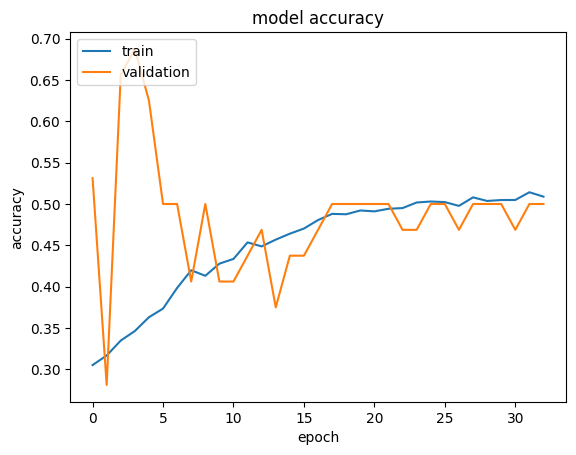

In [39]:
plt.plot(history_vgg.history["accuracy"])
plt.plot(history_vgg.history["val_accuracy"])
plt.title("model accuracy")
plt.ylabel("accuracy")
plt.xlabel("epoch")
plt.legend(["train", "validation"], loc="upper left")
plt.show()

### **Evaluating the VGG16 model**


In [40]:
# Calculate the number of steps for the entire test set to be processed
test_steps = test_generator.samples // batch_size

# If the number of samples isn't a multiple of the batch size,
# you have one more batch with the remaining samples
if test_generator.samples % batch_size > 0:
    test_steps += 1

# Evaluating the model on the test set
evaluation_results = new_vgg16_model.evaluate(test_generator, steps=test_steps)
print(f"Loss: {evaluation_results[0]}, Accuracy: {evaluation_results[1]}")

1/4 [======>.......................] - ETA: 0s - loss: 0.9354 - accuracy: 0.6562

4/4 [==============================] - 0s 7ms/step - loss: 1.0602 - accuracy: 0.5234


Loss: 1.0601800680160522, Accuracy: 0.5234375


### **Plotting Confusion Matrix**


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 5ms/step


              precision    recall  f1-score   support

       happy       0.58      0.66      0.62        32
     neutral       0.29      0.41      0.34        32
         sad       0.58      0.44      0.50        32
    surprise       0.83      0.59      0.69        32

    accuracy                           0.52       128
   macro avg       0.57      0.52      0.54       128
weighted avg       0.57      0.52      0.54       128



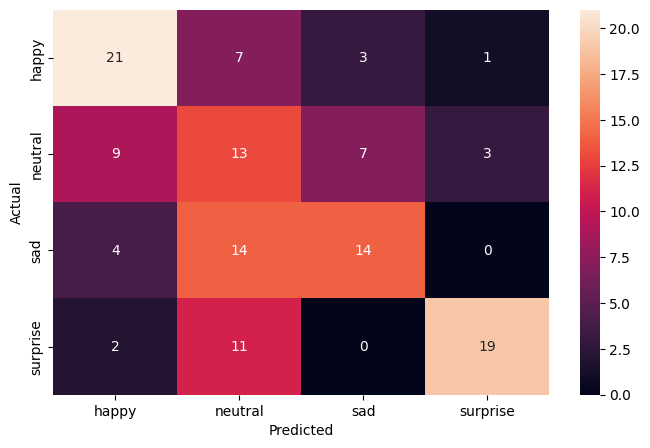

In [41]:
pred_probabilities = new_vgg16_model.predict(test_generator, steps=test_steps)
pred = np.argmax(pred_probabilities, axis=1)

# Getting the true labels from the generator
y_true = test_generator.classes

# Printing the classification report with actual emotion labels
print(classification_report(y_true, pred, target_names=CATEGORIES))

# Plotting the heatmap using confusion matrix
cm = confusion_matrix(y_true, pred)
plt.figure(figsize=(8, 5))
sns.heatmap(cm, annot=True, fmt=".0f", xticklabels=CATEGORIES, yticklabels=CATEGORIES)
plt.ylabel("Actual")
plt.xlabel("Predicted")
plt.show()

**Think About It:**

- What do you infer from the general trend in the training performance?
- Is the training accuracy consistently improving?
- Is the validation accuracy also improving similarly?


**Observations and Insights:\_\_**


**Note: You can even go back and build your own architecture on top of the VGG16 Transfer layer and see if you can improve the performance**


## **ResNet V2 Model**


In [42]:
backend.clear_session()

# Fixing the seed for random number generators so that we can ensure we receive the same output everytime
np.random.seed(42)

random.seed(42)
tf.random.set_seed(42)

In [43]:
resnet_model = ResNet50V2(weights="imagenet", include_top=False, input_shape=(img_width, img_height, color_layers))
# Making all the layers of the VGG model non-trainable. i.e. freezing them
for layer in resnet_model.layers:
    layer.trainable = False

resnet_model.summary()

Model: "resnet50v2"


__________________________________________________________________________________________________


 Layer (type)                Output Shape                 Param #   Connected to                  


 input_1 (InputLayer)        [(None, 48, 48, 3)]          0         []                            


 conv1_pad (ZeroPadding2D)   (None, 54, 54, 3)            0         ['input_1[0][0]']             


 conv1_conv (Conv2D)         (None, 24, 24, 64)           9472      ['conv1_pad[0][0]']           


 pool1_pad (ZeroPadding2D)   (None, 26, 26, 64)           0         ['conv1_conv[0][0]']          


 pool1_pool (MaxPooling2D)   (None, 12, 12, 64)           0         ['pool1_pad[0][0]']           


 conv2_block1_preact_bn (Ba  (None, 12, 12, 64)           256       ['pool1_pool[0][0]']          


 tchNormalization)                                                                                


 conv2_block1_preact_relu (  (None, 12, 12, 64)           0         ['conv2_block1_preact_bn[0][0]


 Activation)                                                        ']                            


 conv2_block1_1_conv (Conv2  (None, 12, 12, 64)           4096      ['conv2_block1_preact_relu[0][


 D)                                                                 0]']                          


 conv2_block1_1_bn (BatchNo  (None, 12, 12, 64)           256       ['conv2_block1_1_conv[0][0]'] 


 rmalization)                                                                                     


 conv2_block1_1_relu (Activ  (None, 12, 12, 64)           0         ['conv2_block1_1_bn[0][0]']   


 ation)                                                                                           


 conv2_block1_2_pad (ZeroPa  (None, 14, 14, 64)           0         ['conv2_block1_1_relu[0][0]'] 


 dding2D)                                                                                         


 conv2_block1_2_conv (Conv2  (None, 12, 12, 64)           36864     ['conv2_block1_2_pad[0][0]']  


 D)                                                                                               


 conv2_block1_2_bn (BatchNo  (None, 12, 12, 64)           256       ['conv2_block1_2_conv[0][0]'] 


 rmalization)                                                                                     


 conv2_block1_2_relu (Activ  (None, 12, 12, 64)           0         ['conv2_block1_2_bn[0][0]']   


 ation)                                                                                           


 conv2_block1_0_conv (Conv2  (None, 12, 12, 256)          16640     ['conv2_block1_preact_relu[0][


 D)                                                                 0]']                          


 conv2_block1_3_conv (Conv2  (None, 12, 12, 256)          16640     ['conv2_block1_2_relu[0][0]'] 


 D)                                                                                               


 conv2_block1_out (Add)      (None, 12, 12, 256)          0         ['conv2_block1_0_conv[0][0]', 


                                                                     'conv2_block1_3_conv[0][0]'] 


 conv2_block2_preact_bn (Ba  (None, 12, 12, 256)          1024      ['conv2_block1_out[0][0]']    


 tchNormalization)                                                                                


 conv2_block2_preact_relu (  (None, 12, 12, 256)          0         ['conv2_block2_preact_bn[0][0]


 Activation)                                                        ']                            


 conv2_block2_1_conv (Conv2  (None, 12, 12, 64)           16384     ['conv2_block2_preact_relu[0][


 D)                                                                 0]']                          


 conv2_block2_1_bn (BatchNo  (None, 12, 12, 64)           256       ['conv2_block2_1_conv[0][0]'] 


 rmalization)                                                                                     


 conv2_block2_1_relu (Activ  (None, 12, 12, 64)           0         ['conv2_block2_1_bn[0][0]']   


 ation)                                                                                           


 conv2_block2_2_pad (ZeroPa  (None, 14, 14, 64)           0         ['conv2_block2_1_relu[0][0]'] 


 dding2D)                                                                                         


 conv2_block2_2_conv (Conv2  (None, 12, 12, 64)           36864     ['conv2_block2_2_pad[0][0]']  


 D)                                                                                               


 conv2_block2_2_bn (BatchNo  (None, 12, 12, 64)           256       ['conv2_block2_2_conv[0][0]'] 


 rmalization)                                                                                     


 conv2_block2_2_relu (Activ  (None, 12, 12, 64)           0         ['conv2_block2_2_bn[0][0]']   


 ation)                                                                                           


 conv2_block2_3_conv (Conv2  (None, 12, 12, 256)          16640     ['conv2_block2_2_relu[0][0]'] 


 D)                                                                                               


 conv2_block2_out (Add)      (None, 12, 12, 256)          0         ['conv2_block1_out[0][0]',    


                                                                     'conv2_block2_3_conv[0][0]'] 


 conv2_block3_preact_bn (Ba  (None, 12, 12, 256)          1024      ['conv2_block2_out[0][0]']    


 tchNormalization)                                                                                


 conv2_block3_preact_relu (  (None, 12, 12, 256)          0         ['conv2_block3_preact_bn[0][0]


 Activation)                                                        ']                            


 conv2_block3_1_conv (Conv2  (None, 12, 12, 64)           16384     ['conv2_block3_preact_relu[0][


 D)                                                                 0]']                          


 conv2_block3_1_bn (BatchNo  (None, 12, 12, 64)           256       ['conv2_block3_1_conv[0][0]'] 


 rmalization)                                                                                     


 conv2_block3_1_relu (Activ  (None, 12, 12, 64)           0         ['conv2_block3_1_bn[0][0]']   


 ation)                                                                                           


 conv2_block3_2_pad (ZeroPa  (None, 14, 14, 64)           0         ['conv2_block3_1_relu[0][0]'] 


 dding2D)                                                                                         


 conv2_block3_2_conv (Conv2  (None, 6, 6, 64)             36864     ['conv2_block3_2_pad[0][0]']  


 D)                                                                                               


 conv2_block3_2_bn (BatchNo  (None, 6, 6, 64)             256       ['conv2_block3_2_conv[0][0]'] 


 rmalization)                                                                                     


 conv2_block3_2_relu (Activ  (None, 6, 6, 64)             0         ['conv2_block3_2_bn[0][0]']   


 ation)                                                                                           


 max_pooling2d (MaxPooling2  (None, 6, 6, 256)            0         ['conv2_block2_out[0][0]']    


 D)                                                                                               


 conv2_block3_3_conv (Conv2  (None, 6, 6, 256)            16640     ['conv2_block3_2_relu[0][0]'] 


 D)                                                                                               


 conv2_block3_out (Add)      (None, 6, 6, 256)            0         ['max_pooling2d[0][0]',       


                                                                     'conv2_block3_3_conv[0][0]'] 


 conv3_block1_preact_bn (Ba  (None, 6, 6, 256)            1024      ['conv2_block3_out[0][0]']    


 tchNormalization)                                                                                


 conv3_block1_preact_relu (  (None, 6, 6, 256)            0         ['conv3_block1_preact_bn[0][0]


 Activation)                                                        ']                            


 conv3_block1_1_conv (Conv2  (None, 6, 6, 128)            32768     ['conv3_block1_preact_relu[0][


 D)                                                                 0]']                          


 conv3_block1_1_bn (BatchNo  (None, 6, 6, 128)            512       ['conv3_block1_1_conv[0][0]'] 


 rmalization)                                                                                     


 conv3_block1_1_relu (Activ  (None, 6, 6, 128)            0         ['conv3_block1_1_bn[0][0]']   


 ation)                                                                                           


 conv3_block1_2_pad (ZeroPa  (None, 8, 8, 128)            0         ['conv3_block1_1_relu[0][0]'] 


 dding2D)                                                                                         


 conv3_block1_2_conv (Conv2  (None, 6, 6, 128)            147456    ['conv3_block1_2_pad[0][0]']  


 D)                                                                                               


 conv3_block1_2_bn (BatchNo  (None, 6, 6, 128)            512       ['conv3_block1_2_conv[0][0]'] 


 rmalization)                                                                                     


 conv3_block1_2_relu (Activ  (None, 6, 6, 128)            0         ['conv3_block1_2_bn[0][0]']   


 ation)                                                                                           


 conv3_block1_0_conv (Conv2  (None, 6, 6, 512)            131584    ['conv3_block1_preact_relu[0][


 D)                                                                 0]']                          


 conv3_block1_3_conv (Conv2  (None, 6, 6, 512)            66048     ['conv3_block1_2_relu[0][0]'] 


 D)                                                                                               


 conv3_block1_out (Add)      (None, 6, 6, 512)            0         ['conv3_block1_0_conv[0][0]', 


                                                                     'conv3_block1_3_conv[0][0]'] 


 conv3_block2_preact_bn (Ba  (None, 6, 6, 512)            2048      ['conv3_block1_out[0][0]']    


 tchNormalization)                                                                                


 conv3_block2_preact_relu (  (None, 6, 6, 512)            0         ['conv3_block2_preact_bn[0][0]


 Activation)                                                        ']                            


 conv3_block2_1_conv (Conv2  (None, 6, 6, 128)            65536     ['conv3_block2_preact_relu[0][


 D)                                                                 0]']                          


 conv3_block2_1_bn (BatchNo  (None, 6, 6, 128)            512       ['conv3_block2_1_conv[0][0]'] 


 rmalization)                                                                                     


 conv3_block2_1_relu (Activ  (None, 6, 6, 128)            0         ['conv3_block2_1_bn[0][0]']   


 ation)                                                                                           


 conv3_block2_2_pad (ZeroPa  (None, 8, 8, 128)            0         ['conv3_block2_1_relu[0][0]'] 


 dding2D)                                                                                         


 conv3_block2_2_conv (Conv2  (None, 6, 6, 128)            147456    ['conv3_block2_2_pad[0][0]']  


 D)                                                                                               


 conv3_block2_2_bn (BatchNo  (None, 6, 6, 128)            512       ['conv3_block2_2_conv[0][0]'] 


 rmalization)                                                                                     


 conv3_block2_2_relu (Activ  (None, 6, 6, 128)            0         ['conv3_block2_2_bn[0][0]']   


 ation)                                                                                           


 conv3_block2_3_conv (Conv2  (None, 6, 6, 512)            66048     ['conv3_block2_2_relu[0][0]'] 


 D)                                                                                               


 conv3_block2_out (Add)      (None, 6, 6, 512)            0         ['conv3_block1_out[0][0]',    


                                                                     'conv3_block2_3_conv[0][0]'] 


 conv3_block3_preact_bn (Ba  (None, 6, 6, 512)            2048      ['conv3_block2_out[0][0]']    


 tchNormalization)                                                                                


 conv3_block3_preact_relu (  (None, 6, 6, 512)            0         ['conv3_block3_preact_bn[0][0]


 Activation)                                                        ']                            


 conv3_block3_1_conv (Conv2  (None, 6, 6, 128)            65536     ['conv3_block3_preact_relu[0][


 D)                                                                 0]']                          


 conv3_block3_1_bn (BatchNo  (None, 6, 6, 128)            512       ['conv3_block3_1_conv[0][0]'] 


 rmalization)                                                                                     


 conv3_block3_1_relu (Activ  (None, 6, 6, 128)            0         ['conv3_block3_1_bn[0][0]']   


 ation)                                                                                           


 conv3_block3_2_pad (ZeroPa  (None, 8, 8, 128)            0         ['conv3_block3_1_relu[0][0]'] 


 dding2D)                                                                                         


 conv3_block3_2_conv (Conv2  (None, 6, 6, 128)            147456    ['conv3_block3_2_pad[0][0]']  


 D)                                                                                               


 conv3_block3_2_bn (BatchNo  (None, 6, 6, 128)            512       ['conv3_block3_2_conv[0][0]'] 


 rmalization)                                                                                     


 conv3_block3_2_relu (Activ  (None, 6, 6, 128)            0         ['conv3_block3_2_bn[0][0]']   


 ation)                                                                                           


 conv3_block3_3_conv (Conv2  (None, 6, 6, 512)            66048     ['conv3_block3_2_relu[0][0]'] 


 D)                                                                                               


 conv3_block3_out (Add)      (None, 6, 6, 512)            0         ['conv3_block2_out[0][0]',    


                                                                     'conv3_block3_3_conv[0][0]'] 


 conv3_block4_preact_bn (Ba  (None, 6, 6, 512)            2048      ['conv3_block3_out[0][0]']    


 tchNormalization)                                                                                


 conv3_block4_preact_relu (  (None, 6, 6, 512)            0         ['conv3_block4_preact_bn[0][0]


 Activation)                                                        ']                            


 conv3_block4_1_conv (Conv2  (None, 6, 6, 128)            65536     ['conv3_block4_preact_relu[0][


 D)                                                                 0]']                          


 conv3_block4_1_bn (BatchNo  (None, 6, 6, 128)            512       ['conv3_block4_1_conv[0][0]'] 


 rmalization)                                                                                     


 conv3_block4_1_relu (Activ  (None, 6, 6, 128)            0         ['conv3_block4_1_bn[0][0]']   


 ation)                                                                                           


 conv3_block4_2_pad (ZeroPa  (None, 8, 8, 128)            0         ['conv3_block4_1_relu[0][0]'] 


 dding2D)                                                                                         


 conv3_block4_2_conv (Conv2  (None, 3, 3, 128)            147456    ['conv3_block4_2_pad[0][0]']  


 D)                                                                                               


 conv3_block4_2_bn (BatchNo  (None, 3, 3, 128)            512       ['conv3_block4_2_conv[0][0]'] 


 rmalization)                                                                                     


 conv3_block4_2_relu (Activ  (None, 3, 3, 128)            0         ['conv3_block4_2_bn[0][0]']   


 ation)                                                                                           


 max_pooling2d_1 (MaxPoolin  (None, 3, 3, 512)            0         ['conv3_block3_out[0][0]']    


 g2D)                                                                                             


 conv3_block4_3_conv (Conv2  (None, 3, 3, 512)            66048     ['conv3_block4_2_relu[0][0]'] 


 D)                                                                                               


 conv3_block4_out (Add)      (None, 3, 3, 512)            0         ['max_pooling2d_1[0][0]',     


                                                                     'conv3_block4_3_conv[0][0]'] 


 conv4_block1_preact_bn (Ba  (None, 3, 3, 512)            2048      ['conv3_block4_out[0][0]']    


 tchNormalization)                                                                                


 conv4_block1_preact_relu (  (None, 3, 3, 512)            0         ['conv4_block1_preact_bn[0][0]


 Activation)                                                        ']                            


 conv4_block1_1_conv (Conv2  (None, 3, 3, 256)            131072    ['conv4_block1_preact_relu[0][


 D)                                                                 0]']                          


 conv4_block1_1_bn (BatchNo  (None, 3, 3, 256)            1024      ['conv4_block1_1_conv[0][0]'] 


 rmalization)                                                                                     


 conv4_block1_1_relu (Activ  (None, 3, 3, 256)            0         ['conv4_block1_1_bn[0][0]']   


 ation)                                                                                           


 conv4_block1_2_pad (ZeroPa  (None, 5, 5, 256)            0         ['conv4_block1_1_relu[0][0]'] 


 dding2D)                                                                                         


 conv4_block1_2_conv (Conv2  (None, 3, 3, 256)            589824    ['conv4_block1_2_pad[0][0]']  


 D)                                                                                               


 conv4_block1_2_bn (BatchNo  (None, 3, 3, 256)            1024      ['conv4_block1_2_conv[0][0]'] 


 rmalization)                                                                                     


 conv4_block1_2_relu (Activ  (None, 3, 3, 256)            0         ['conv4_block1_2_bn[0][0]']   


 ation)                                                                                           


 conv4_block1_0_conv (Conv2  (None, 3, 3, 1024)           525312    ['conv4_block1_preact_relu[0][


 D)                                                                 0]']                          


 conv4_block1_3_conv (Conv2  (None, 3, 3, 1024)           263168    ['conv4_block1_2_relu[0][0]'] 


 D)                                                                                               


 conv4_block1_out (Add)      (None, 3, 3, 1024)           0         ['conv4_block1_0_conv[0][0]', 


                                                                     'conv4_block1_3_conv[0][0]'] 


 conv4_block2_preact_bn (Ba  (None, 3, 3, 1024)           4096      ['conv4_block1_out[0][0]']    


 tchNormalization)                                                                                


 conv4_block2_preact_relu (  (None, 3, 3, 1024)           0         ['conv4_block2_preact_bn[0][0]


 Activation)                                                        ']                            


 conv4_block2_1_conv (Conv2  (None, 3, 3, 256)            262144    ['conv4_block2_preact_relu[0][


 D)                                                                 0]']                          


 conv4_block2_1_bn (BatchNo  (None, 3, 3, 256)            1024      ['conv4_block2_1_conv[0][0]'] 


 rmalization)                                                                                     


 conv4_block2_1_relu (Activ  (None, 3, 3, 256)            0         ['conv4_block2_1_bn[0][0]']   


 ation)                                                                                           


 conv4_block2_2_pad (ZeroPa  (None, 5, 5, 256)            0         ['conv4_block2_1_relu[0][0]'] 


 dding2D)                                                                                         


 conv4_block2_2_conv (Conv2  (None, 3, 3, 256)            589824    ['conv4_block2_2_pad[0][0]']  


 D)                                                                                               


 conv4_block2_2_bn (BatchNo  (None, 3, 3, 256)            1024      ['conv4_block2_2_conv[0][0]'] 


 rmalization)                                                                                     


 conv4_block2_2_relu (Activ  (None, 3, 3, 256)            0         ['conv4_block2_2_bn[0][0]']   


 ation)                                                                                           


 conv4_block2_3_conv (Conv2  (None, 3, 3, 1024)           263168    ['conv4_block2_2_relu[0][0]'] 


 D)                                                                                               


 conv4_block2_out (Add)      (None, 3, 3, 1024)           0         ['conv4_block1_out[0][0]',    


                                                                     'conv4_block2_3_conv[0][0]'] 


 conv4_block3_preact_bn (Ba  (None, 3, 3, 1024)           4096      ['conv4_block2_out[0][0]']    


 tchNormalization)                                                                                


 conv4_block3_preact_relu (  (None, 3, 3, 1024)           0         ['conv4_block3_preact_bn[0][0]


 Activation)                                                        ']                            


 conv4_block3_1_conv (Conv2  (None, 3, 3, 256)            262144    ['conv4_block3_preact_relu[0][


 D)                                                                 0]']                          


 conv4_block3_1_bn (BatchNo  (None, 3, 3, 256)            1024      ['conv4_block3_1_conv[0][0]'] 


 rmalization)                                                                                     


 conv4_block3_1_relu (Activ  (None, 3, 3, 256)            0         ['conv4_block3_1_bn[0][0]']   


 ation)                                                                                           


 conv4_block3_2_pad (ZeroPa  (None, 5, 5, 256)            0         ['conv4_block3_1_relu[0][0]'] 


 dding2D)                                                                                         


 conv4_block3_2_conv (Conv2  (None, 3, 3, 256)            589824    ['conv4_block3_2_pad[0][0]']  


 D)                                                                                               


 conv4_block3_2_bn (BatchNo  (None, 3, 3, 256)            1024      ['conv4_block3_2_conv[0][0]'] 


 rmalization)                                                                                     


 conv4_block3_2_relu (Activ  (None, 3, 3, 256)            0         ['conv4_block3_2_bn[0][0]']   


 ation)                                                                                           


 conv4_block3_3_conv (Conv2  (None, 3, 3, 1024)           263168    ['conv4_block3_2_relu[0][0]'] 


 D)                                                                                               


 conv4_block3_out (Add)      (None, 3, 3, 1024)           0         ['conv4_block2_out[0][0]',    


                                                                     'conv4_block3_3_conv[0][0]'] 


 conv4_block4_preact_bn (Ba  (None, 3, 3, 1024)           4096      ['conv4_block3_out[0][0]']    


 tchNormalization)                                                                                


 conv4_block4_preact_relu (  (None, 3, 3, 1024)           0         ['conv4_block4_preact_bn[0][0]


 Activation)                                                        ']                            


 conv4_block4_1_conv (Conv2  (None, 3, 3, 256)            262144    ['conv4_block4_preact_relu[0][


 D)                                                                 0]']                          


 conv4_block4_1_bn (BatchNo  (None, 3, 3, 256)            1024      ['conv4_block4_1_conv[0][0]'] 


 rmalization)                                                                                     


 conv4_block4_1_relu (Activ  (None, 3, 3, 256)            0         ['conv4_block4_1_bn[0][0]']   


 ation)                                                                                           


 conv4_block4_2_pad (ZeroPa  (None, 5, 5, 256)            0         ['conv4_block4_1_relu[0][0]'] 


 dding2D)                                                                                         


 conv4_block4_2_conv (Conv2  (None, 3, 3, 256)            589824    ['conv4_block4_2_pad[0][0]']  


 D)                                                                                               


 conv4_block4_2_bn (BatchNo  (None, 3, 3, 256)            1024      ['conv4_block4_2_conv[0][0]'] 


 rmalization)                                                                                     


 conv4_block4_2_relu (Activ  (None, 3, 3, 256)            0         ['conv4_block4_2_bn[0][0]']   


 ation)                                                                                           


 conv4_block4_3_conv (Conv2  (None, 3, 3, 1024)           263168    ['conv4_block4_2_relu[0][0]'] 


 D)                                                                                               


 conv4_block4_out (Add)      (None, 3, 3, 1024)           0         ['conv4_block3_out[0][0]',    


                                                                     'conv4_block4_3_conv[0][0]'] 


 conv4_block5_preact_bn (Ba  (None, 3, 3, 1024)           4096      ['conv4_block4_out[0][0]']    


 tchNormalization)                                                                                


 conv4_block5_preact_relu (  (None, 3, 3, 1024)           0         ['conv4_block5_preact_bn[0][0]


 Activation)                                                        ']                            


 conv4_block5_1_conv (Conv2  (None, 3, 3, 256)            262144    ['conv4_block5_preact_relu[0][


 D)                                                                 0]']                          


 conv4_block5_1_bn (BatchNo  (None, 3, 3, 256)            1024      ['conv4_block5_1_conv[0][0]'] 


 rmalization)                                                                                     


 conv4_block5_1_relu (Activ  (None, 3, 3, 256)            0         ['conv4_block5_1_bn[0][0]']   


 ation)                                                                                           


 conv4_block5_2_pad (ZeroPa  (None, 5, 5, 256)            0         ['conv4_block5_1_relu[0][0]'] 


 dding2D)                                                                                         


 conv4_block5_2_conv (Conv2  (None, 3, 3, 256)            589824    ['conv4_block5_2_pad[0][0]']  


 D)                                                                                               


 conv4_block5_2_bn (BatchNo  (None, 3, 3, 256)            1024      ['conv4_block5_2_conv[0][0]'] 


 rmalization)                                                                                     


 conv4_block5_2_relu (Activ  (None, 3, 3, 256)            0         ['conv4_block5_2_bn[0][0]']   


 ation)                                                                                           


 conv4_block5_3_conv (Conv2  (None, 3, 3, 1024)           263168    ['conv4_block5_2_relu[0][0]'] 


 D)                                                                                               


 conv4_block5_out (Add)      (None, 3, 3, 1024)           0         ['conv4_block4_out[0][0]',    


                                                                     'conv4_block5_3_conv[0][0]'] 


 conv4_block6_preact_bn (Ba  (None, 3, 3, 1024)           4096      ['conv4_block5_out[0][0]']    


 tchNormalization)                                                                                


 conv4_block6_preact_relu (  (None, 3, 3, 1024)           0         ['conv4_block6_preact_bn[0][0]


 Activation)                                                        ']                            


 conv4_block6_1_conv (Conv2  (None, 3, 3, 256)            262144    ['conv4_block6_preact_relu[0][


 D)                                                                 0]']                          


 conv4_block6_1_bn (BatchNo  (None, 3, 3, 256)            1024      ['conv4_block6_1_conv[0][0]'] 


 rmalization)                                                                                     


 conv4_block6_1_relu (Activ  (None, 3, 3, 256)            0         ['conv4_block6_1_bn[0][0]']   


 ation)                                                                                           


 conv4_block6_2_pad (ZeroPa  (None, 5, 5, 256)            0         ['conv4_block6_1_relu[0][0]'] 


 dding2D)                                                                                         


 conv4_block6_2_conv (Conv2  (None, 2, 2, 256)            589824    ['conv4_block6_2_pad[0][0]']  


 D)                                                                                               


 conv4_block6_2_bn (BatchNo  (None, 2, 2, 256)            1024      ['conv4_block6_2_conv[0][0]'] 


 rmalization)                                                                                     


 conv4_block6_2_relu (Activ  (None, 2, 2, 256)            0         ['conv4_block6_2_bn[0][0]']   


 ation)                                                                                           


 max_pooling2d_2 (MaxPoolin  (None, 2, 2, 1024)           0         ['conv4_block5_out[0][0]']    


 g2D)                                                                                             


 conv4_block6_3_conv (Conv2  (None, 2, 2, 1024)           263168    ['conv4_block6_2_relu[0][0]'] 


 D)                                                                                               


 conv4_block6_out (Add)      (None, 2, 2, 1024)           0         ['max_pooling2d_2[0][0]',     


                                                                     'conv4_block6_3_conv[0][0]'] 


 conv5_block1_preact_bn (Ba  (None, 2, 2, 1024)           4096      ['conv4_block6_out[0][0]']    


 tchNormalization)                                                                                


 conv5_block1_preact_relu (  (None, 2, 2, 1024)           0         ['conv5_block1_preact_bn[0][0]


 Activation)                                                        ']                            


 conv5_block1_1_conv (Conv2  (None, 2, 2, 512)            524288    ['conv5_block1_preact_relu[0][


 D)                                                                 0]']                          


 conv5_block1_1_bn (BatchNo  (None, 2, 2, 512)            2048      ['conv5_block1_1_conv[0][0]'] 


 rmalization)                                                                                     


 conv5_block1_1_relu (Activ  (None, 2, 2, 512)            0         ['conv5_block1_1_bn[0][0]']   


 ation)                                                                                           


 conv5_block1_2_pad (ZeroPa  (None, 4, 4, 512)            0         ['conv5_block1_1_relu[0][0]'] 


 dding2D)                                                                                         


 conv5_block1_2_conv (Conv2  (None, 2, 2, 512)            2359296   ['conv5_block1_2_pad[0][0]']  


 D)                                                                                               


 conv5_block1_2_bn (BatchNo  (None, 2, 2, 512)            2048      ['conv5_block1_2_conv[0][0]'] 


 rmalization)                                                                                     


 conv5_block1_2_relu (Activ  (None, 2, 2, 512)            0         ['conv5_block1_2_bn[0][0]']   


 ation)                                                                                           


 conv5_block1_0_conv (Conv2  (None, 2, 2, 2048)           2099200   ['conv5_block1_preact_relu[0][


 D)                                                                 0]']                          


 conv5_block1_3_conv (Conv2  (None, 2, 2, 2048)           1050624   ['conv5_block1_2_relu[0][0]'] 


 D)                                                                                               


 conv5_block1_out (Add)      (None, 2, 2, 2048)           0         ['conv5_block1_0_conv[0][0]', 


                                                                     'conv5_block1_3_conv[0][0]'] 


 conv5_block2_preact_bn (Ba  (None, 2, 2, 2048)           8192      ['conv5_block1_out[0][0]']    


 tchNormalization)                                                                                


 conv5_block2_preact_relu (  (None, 2, 2, 2048)           0         ['conv5_block2_preact_bn[0][0]


 Activation)                                                        ']                            


 conv5_block2_1_conv (Conv2  (None, 2, 2, 512)            1048576   ['conv5_block2_preact_relu[0][


 D)                                                                 0]']                          


 conv5_block2_1_bn (BatchNo  (None, 2, 2, 512)            2048      ['conv5_block2_1_conv[0][0]'] 


 rmalization)                                                                                     


 conv5_block2_1_relu (Activ  (None, 2, 2, 512)            0         ['conv5_block2_1_bn[0][0]']   


 ation)                                                                                           


 conv5_block2_2_pad (ZeroPa  (None, 4, 4, 512)            0         ['conv5_block2_1_relu[0][0]'] 


 dding2D)                                                                                         


 conv5_block2_2_conv (Conv2  (None, 2, 2, 512)            2359296   ['conv5_block2_2_pad[0][0]']  


 D)                                                                                               


 conv5_block2_2_bn (BatchNo  (None, 2, 2, 512)            2048      ['conv5_block2_2_conv[0][0]'] 


 rmalization)                                                                                     


 conv5_block2_2_relu (Activ  (None, 2, 2, 512)            0         ['conv5_block2_2_bn[0][0]']   


 ation)                                                                                           


 conv5_block2_3_conv (Conv2  (None, 2, 2, 2048)           1050624   ['conv5_block2_2_relu[0][0]'] 


 D)                                                                                               


 conv5_block2_out (Add)      (None, 2, 2, 2048)           0         ['conv5_block1_out[0][0]',    


                                                                     'conv5_block2_3_conv[0][0]'] 


 conv5_block3_preact_bn (Ba  (None, 2, 2, 2048)           8192      ['conv5_block2_out[0][0]']    


 tchNormalization)                                                                                


 conv5_block3_preact_relu (  (None, 2, 2, 2048)           0         ['conv5_block3_preact_bn[0][0]


 Activation)                                                        ']                            


 conv5_block3_1_conv (Conv2  (None, 2, 2, 512)            1048576   ['conv5_block3_preact_relu[0][


 D)                                                                 0]']                          


 conv5_block3_1_bn (BatchNo  (None, 2, 2, 512)            2048      ['conv5_block3_1_conv[0][0]'] 


 rmalization)                                                                                     


 conv5_block3_1_relu (Activ  (None, 2, 2, 512)            0         ['conv5_block3_1_bn[0][0]']   


 ation)                                                                                           


 conv5_block3_2_pad (ZeroPa  (None, 4, 4, 512)            0         ['conv5_block3_1_relu[0][0]'] 


 dding2D)                                                                                         


 conv5_block3_2_conv (Conv2  (None, 2, 2, 512)            2359296   ['conv5_block3_2_pad[0][0]']  


 D)                                                                                               


 conv5_block3_2_bn (BatchNo  (None, 2, 2, 512)            2048      ['conv5_block3_2_conv[0][0]'] 


 rmalization)                                                                                     


 conv5_block3_2_relu (Activ  (None, 2, 2, 512)            0         ['conv5_block3_2_bn[0][0]']   


 ation)                                                                                           


 conv5_block3_3_conv (Conv2  (None, 2, 2, 2048)           1050624   ['conv5_block3_2_relu[0][0]'] 


 D)                                                                                               


 conv5_block3_out (Add)      (None, 2, 2, 2048)           0         ['conv5_block2_out[0][0]',    


                                                                     'conv5_block3_3_conv[0][0]'] 


 post_bn (BatchNormalizatio  (None, 2, 2, 2048)           8192      ['conv5_block3_out[0][0]']    


 n)                                                                                               


 post_relu (Activation)      (None, 2, 2, 2048)           0         ['post_bn[0][0]']             


Total params: 23564800 (89.89 MB)


Trainable params: 0 (0.00 Byte)


Non-trainable params: 23564800 (89.89 MB)


__________________________________________________________________________________________________


### **Model Building**

- Import Resnet v2 upto the layer of your choice and add Fully Connected layers on top of it.


In [44]:
new_resnet_model = Sequential()
new_resnet_model.add(resnet_model)

# Reduces each feature map to a single value by averaging all elements
new_resnet_model.add(GlobalAveragePooling2D())

# Adding a dense output layer
new_resnet_model.add(Dense(512, activation="relu"))
new_resnet_model.add(Dropout(0.5))
new_resnet_model.add(Dense(128, activation="relu"))
new_resnet_model.add(Dropout(0.5))
new_resnet_model.add(Dense(4, activation="softmax"))

# Using Adam Optimizer
optimizer = Adam(learning_rate=0.0005)

### **Compiling and Training the Model**


In [45]:
new_resnet_model.compile(optimizer=optimizer, loss="categorical_crossentropy", metrics=["accuracy"])
new_resnet_model.summary()

Model: "sequential"


_________________________________________________________________


 Layer (type)                Output Shape              Param #   


 resnet50v2 (Functional)     (None, 2, 2, 2048)        23564800  


 global_average_pooling2d (  (None, 2048)              0         


 GlobalAveragePooling2D)                                         


 dense (Dense)               (None, 512)               1049088   


 dropout (Dropout)           (None, 512)               0         


 dense_1 (Dense)             (None, 128)               65664     


 dropout_1 (Dropout)         (None, 128)               0         


 dense_2 (Dense)             (None, 4)                 516       


Total params: 24680068 (94.15 MB)


Trainable params: 1115268 (4.25 MB)


Non-trainable params: 23564800 (89.89 MB)


_________________________________________________________________


In [46]:
# Get the current time
current_time = datetime.now().strftime("%Y%m%d-%H%M%S")

# Set up Early Stopping with a patience 7 but acting after at least 20 epochs
delayed_early_stopping = DelayedEarlyStopping(
    monitor="val_loss", patience=7, verbose=1, restore_best_weights=True, start_epoch=20
)

# Define the learning rate scheduler callback
reduce_lr = ReduceLROnPlateau(monitor="val_loss", factor=0.2, patience=5, min_lr=0.00001, verbose=1)

mc = ModelCheckpoint(
    f"{results_path}/best_model_resnet_{current_time}.keras",
    monitor="val_accuracy",
    mode="max",
    verbose=1,
    save_best_only=True,
)

# Pulling a single large batch of random validation data for doing the validation after each epoch
validationX, validationY = validation_generator.next()

# Fitting the model with 40 epochs and using validation set
history_resnet = new_resnet_model.fit(
    train_generator,
    epochs=40,
    validation_data=(validationX, validationY),
    callbacks=[delayed_early_stopping, mc, reduce_lr],
)

Epoch 1/40


  1/473 [..............................] - ETA: 16:22 - loss: 304.0703 - accuracy: 0.2812

  5/473 [..............................] - ETA: 8s - loss: 203.0597 - accuracy: 0.3375   

  8/473 [..............................] - ETA: 8s - loss: 196.3152 - accuracy: 0.2891

 12/473 [..............................] - ETA: 7s - loss: 174.2117 - accuracy: 0.2891

 16/473 [>.............................] - ETA: 7s - loss: 160.7076 - accuracy: 0.2773

 20/473 [>.............................] - ETA: 7s - loss: 149.0828 - accuracy: 0.2828

 23/473 [>.............................] - ETA: 7s - loss: 142.9889 - accuracy: 0.2840

 27/473 [>.............................] - ETA: 7s - loss: 135.9994 - accuracy: 0.2755

 30/473 [>.............................] - ETA: 7s - loss: 130.1598 - accuracy: 0.2688

 33/473 [=>............................] - ETA: 7s - loss: 124.9020 - accuracy: 0.2727

 37/473 [=>............................] - ETA: 7s - loss: 117.2089 - accuracy: 0.2753

 40/473 [=>............................] - ETA: 7s - loss: 112.5911 - accuracy: 0.2750

 44/473 [=>............................] - ETA: 7s - loss: 106.6148 - accuracy: 0.2749

 48/473 [==>...........................] - ETA: 7s - loss: 101.5814 - accuracy: 0.2734

 52/473 [==>...........................] - ETA: 7s - loss: 96.9542 - accuracy: 0.2752 

 56/473 [==>...........................] - ETA: 6s - loss: 92.5915 - accuracy: 0.2734

 60/473 [==>...........................] - ETA: 6s - loss: 88.6190 - accuracy: 0.2740

 64/473 [===>..........................] - ETA: 6s - loss: 84.8210 - accuracy: 0.2749

 68/473 [===>..........................] - ETA: 6s - loss: 81.6083 - accuracy: 0.2734

 72/473 [===>..........................] - ETA: 6s - loss: 78.6568 - accuracy: 0.2747

 76/473 [===>..........................] - ETA: 6s - loss: 75.8158 - accuracy: 0.2751

 80/473 [====>.........................] - ETA: 6s - loss: 73.0686 - accuracy: 0.2766

 84/473 [====>.........................] - ETA: 6s - loss: 70.7001 - accuracy: 0.2738

 88/473 [====>.........................] - ETA: 6s - loss: 68.3081 - accuracy: 0.2738

 92/473 [====>.........................] - ETA: 6s - loss: 66.0479 - accuracy: 0.2748

 96/473 [=====>........................] - ETA: 6s - loss: 63.9758 - accuracy: 0.2760

100/473 [=====>........................] - ETA: 6s - loss: 62.1137 - accuracy: 0.2759

104/473 [=====>........................] - ETA: 6s - loss: 60.4340 - accuracy: 0.2749

108/473 [=====>........................] - ETA: 5s - loss: 58.7776 - accuracy: 0.2743

112/473 [======>.......................] - ETA: 5s - loss: 57.1117 - accuracy: 0.2759

116/473 [======>.......................] - ETA: 5s - loss: 55.5687 - accuracy: 0.2786

120/473 [======>.......................] - ETA: 5s - loss: 54.1341 - accuracy: 0.2784

124/473 [======>.......................] - ETA: 5s - loss: 52.8038 - accuracy: 0.2782

128/473 [=======>......................] - ETA: 5s - loss: 51.5197 - accuracy: 0.2773

132/473 [=======>......................] - ETA: 5s - loss: 50.2476 - accuracy: 0.2763

136/473 [=======>......................] - ETA: 5s - loss: 49.0253 - accuracy: 0.2778

140/473 [=======>......................] - ETA: 5s - loss: 47.9138 - accuracy: 0.2770

144/473 [========>.....................] - ETA: 5s - loss: 46.7856 - accuracy: 0.2750

148/473 [========>.....................] - ETA: 5s - loss: 45.6598 - accuracy: 0.2747

152/473 [========>.....................] - ETA: 5s - loss: 44.5425 - accuracy: 0.2755

156/473 [========>.....................] - ETA: 5s - loss: 43.4602 - accuracy: 0.2768

160/473 [=========>....................] - ETA: 5s - loss: 42.4317 - accuracy: 0.2760

163/473 [=========>....................] - ETA: 5s - loss: 41.8994 - accuracy: 0.2748

168/473 [=========>....................] - ETA: 5s - loss: 40.6962 - accuracy: 0.2746

170/473 [=========>....................] - ETA: 5s - loss: 40.2392 - accuracy: 0.2742

174/473 [==========>...................] - ETA: 5s - loss: 39.3529 - accuracy: 0.2731

178/473 [==========>...................] - ETA: 5s - loss: 38.4981 - accuracy: 0.2732

181/473 [==========>...................] - ETA: 5s - loss: 37.8839 - accuracy: 0.2720

185/473 [==========>...................] - ETA: 5s - loss: 37.1004 - accuracy: 0.2708

188/473 [==========>...................] - ETA: 5s - loss: 36.5354 - accuracy: 0.2695

191/473 [===========>..................] - ETA: 5s - loss: 35.9842 - accuracy: 0.2692

194/473 [===========>..................] - ETA: 5s - loss: 35.4584 - accuracy: 0.2687

197/473 [===========>..................] - ETA: 5s - loss: 34.9389 - accuracy: 0.2678

201/473 [===========>..................] - ETA: 5s - loss: 34.2744 - accuracy: 0.2673

205/473 [============>.................] - ETA: 4s - loss: 33.6326 - accuracy: 0.2666

208/473 [============>.................] - ETA: 4s - loss: 33.1663 - accuracy: 0.2663

211/473 [============>.................] - ETA: 4s - loss: 32.7133 - accuracy: 0.2657

214/473 [============>.................] - ETA: 4s - loss: 32.2722 - accuracy: 0.2651

217/473 [============>.................] - ETA: 4s - loss: 31.8445 - accuracy: 0.2656

220/473 [============>.................] - ETA: 4s - loss: 31.4312 - accuracy: 0.2644

224/473 [=============>................] - ETA: 4s - loss: 30.8932 - accuracy: 0.2651

227/473 [=============>................] - ETA: 4s - loss: 30.5039 - accuracy: 0.2649

231/473 [=============>................] - ETA: 4s - loss: 29.9988 - accuracy: 0.2649

234/473 [=============>................] - ETA: 4s - loss: 29.6306 - accuracy: 0.2640

237/473 [==============>...............] - ETA: 4s - loss: 29.2724 - accuracy: 0.2643

241/473 [==============>...............] - ETA: 4s - loss: 28.8090 - accuracy: 0.2640

244/473 [==============>...............] - ETA: 4s - loss: 28.4723 - accuracy: 0.2636

247/473 [==============>...............] - ETA: 4s - loss: 28.1425 - accuracy: 0.2637

251/473 [==============>...............] - ETA: 4s - loss: 27.7192 - accuracy: 0.2638

254/473 [===============>..............] - ETA: 3s - loss: 27.4095 - accuracy: 0.2645

257/473 [===============>..............] - ETA: 3s - loss: 27.1053 - accuracy: 0.2644

261/473 [===============>..............] - ETA: 3s - loss: 26.7106 - accuracy: 0.2641

265/473 [===============>..............] - ETA: 3s - loss: 26.3271 - accuracy: 0.2646

269/473 [================>.............] - ETA: 3s - loss: 25.9548 - accuracy: 0.2642

273/473 [================>.............] - ETA: 3s - loss: 25.5974 - accuracy: 0.2642

277/473 [================>.............] - ETA: 3s - loss: 25.2468 - accuracy: 0.2647

281/473 [================>.............] - ETA: 3s - loss: 24.9070 - accuracy: 0.2647

284/473 [=================>............] - ETA: 3s - loss: 24.6579 - accuracy: 0.2653

287/473 [=================>............] - ETA: 3s - loss: 24.4139 - accuracy: 0.2649

290/473 [=================>............] - ETA: 3s - loss: 24.1748 - accuracy: 0.2660

294/473 [=================>............] - ETA: 3s - loss: 23.8665 - accuracy: 0.2661

298/473 [=================>............] - ETA: 3s - loss: 23.5657 - accuracy: 0.2653

302/473 [==================>...........] - ETA: 3s - loss: 23.2732 - accuracy: 0.2649

306/473 [==================>...........] - ETA: 2s - loss: 22.9869 - accuracy: 0.2648

310/473 [==================>...........] - ETA: 2s - loss: 22.7119 - accuracy: 0.2640

314/473 [==================>...........] - ETA: 2s - loss: 22.4409 - accuracy: 0.2636

318/473 [===================>..........] - ETA: 2s - loss: 22.1755 - accuracy: 0.2643

322/473 [===================>..........] - ETA: 2s - loss: 21.9197 - accuracy: 0.2636

326/473 [===================>..........] - ETA: 2s - loss: 21.6679 - accuracy: 0.2632

330/473 [===================>..........] - ETA: 2s - loss: 21.4217 - accuracy: 0.2630

334/473 [====================>.........] - ETA: 2s - loss: 21.1812 - accuracy: 0.2632

338/473 [====================>.........] - ETA: 2s - loss: 20.9468 - accuracy: 0.2635

342/473 [====================>.........] - ETA: 2s - loss: 20.7175 - accuracy: 0.2632

346/473 [====================>.........] - ETA: 2s - loss: 20.4953 - accuracy: 0.2633

350/473 [=====================>........] - ETA: 2s - loss: 20.2769 - accuracy: 0.2632

354/473 [=====================>........] - ETA: 2s - loss: 20.0652 - accuracy: 0.2628

358/473 [=====================>........] - ETA: 2s - loss: 19.8560 - accuracy: 0.2636

362/473 [=====================>........] - ETA: 1s - loss: 19.6523 - accuracy: 0.2627

366/473 [======================>.......] - ETA: 1s - loss: 19.4531 - accuracy: 0.2628

370/473 [======================>.......] - ETA: 1s - loss: 19.2576 - accuracy: 0.2635

374/473 [======================>.......] - ETA: 1s - loss: 19.0660 - accuracy: 0.2629

378/473 [======================>.......] - ETA: 1s - loss: 18.8796 - accuracy: 0.2632

382/473 [=======================>......] - ETA: 1s - loss: 18.6960 - accuracy: 0.2630

386/473 [=======================>......] - ETA: 1s - loss: 18.5167 - accuracy: 0.2636

390/473 [=======================>......] - ETA: 1s - loss: 18.3410 - accuracy: 0.2638

394/473 [=======================>......] - ETA: 1s - loss: 18.1693 - accuracy: 0.2631

398/473 [========================>.....] - ETA: 1s - loss: 18.0016 - accuracy: 0.2635

402/473 [========================>.....] - ETA: 1s - loss: 17.8363 - accuracy: 0.2633

406/473 [========================>.....] - ETA: 1s - loss: 17.6739 - accuracy: 0.2632

410/473 [=========================>....] - ETA: 1s - loss: 17.5185 - accuracy: 0.2632

414/473 [=========================>....] - ETA: 1s - loss: 17.3621 - accuracy: 0.2634

418/473 [=========================>....] - ETA: 0s - loss: 17.2099 - accuracy: 0.2632

422/473 [=========================>....] - ETA: 0s - loss: 17.0600 - accuracy: 0.2630

426/473 [==========================>...] - ETA: 0s - loss: 16.9129 - accuracy: 0.2631

430/473 [==========================>...] - ETA: 0s - loss: 16.7680 - accuracy: 0.2629

434/473 [==========================>...] - ETA: 0s - loss: 16.6270 - accuracy: 0.2636

437/473 [==========================>...] - ETA: 0s - loss: 16.5221 - accuracy: 0.2634

441/473 [==========================>...] - ETA: 0s - loss: 16.3847 - accuracy: 0.2641

445/473 [===========================>..] - ETA: 0s - loss: 16.2501 - accuracy: 0.2638

449/473 [===========================>..] - ETA: 0s - loss: 16.1173 - accuracy: 0.2636

453/473 [===========================>..] - ETA: 0s - loss: 15.9889 - accuracy: 0.2641

457/473 [===========================>..] - ETA: 0s - loss: 15.8612 - accuracy: 0.2646

461/473 [============================>.] - ETA: 0s - loss: 15.7365 - accuracy: 0.2642

465/473 [============================>.] - ETA: 0s - loss: 15.6146 - accuracy: 0.2643

469/473 [============================>.] - ETA: 0s - loss: 15.4943 - accuracy: 0.2645

473/473 [==============================] - ETA: 0s - loss: 15.3756 - accuracy: 0.2650


Epoch 1: val_accuracy improved from -inf to 0.25000, saving model to /home/iamtxena/sandbox/mit-ai/capstone/Facial_Emotion_Recognition/results/best_model_resnet_20240318-104600.keras


473/473 [==============================] - 11s 19ms/step - loss: 15.3756 - accuracy: 0.2650 - val_loss: 1.3554 - val_accuracy: 0.2500 - lr: 5.0000e-04


Epoch 2/40


  1/473 [..............................] - ETA: 12s - loss: 1.3674 - accuracy: 0.2188

  5/473 [..............................] - ETA: 7s - loss: 1.3758 - accuracy: 0.2188 

  8/473 [..............................] - ETA: 7s - loss: 1.4132 - accuracy: 0.2656

 11/473 [..............................] - ETA: 7s - loss: 1.4248 - accuracy: 0.2585

 14/473 [..............................] - ETA: 7s - loss: 1.4116 - accuracy: 0.2701

 17/473 [>.............................] - ETA: 7s - loss: 1.4126 - accuracy: 0.2702

 21/473 [>.............................] - ETA: 7s - loss: 1.4076 - accuracy: 0.2723

 25/473 [>.............................] - ETA: 7s - loss: 1.4017 - accuracy: 0.2637

 29/473 [>.............................] - ETA: 7s - loss: 1.3977 - accuracy: 0.2586

 33/473 [=>............................] - ETA: 7s - loss: 1.3961 - accuracy: 0.2614

 36/473 [=>............................] - ETA: 7s - loss: 1.4587 - accuracy: 0.2613

 39/473 [=>............................] - ETA: 7s - loss: 1.4514 - accuracy: 0.2660

 42/473 [=>............................] - ETA: 7s - loss: 1.4473 - accuracy: 0.2701

 45/473 [=>............................] - ETA: 7s - loss: 1.4430 - accuracy: 0.2715

 49/473 [==>...........................] - ETA: 7s - loss: 1.4378 - accuracy: 0.2768

 53/473 [==>...........................] - ETA: 7s - loss: 1.4350 - accuracy: 0.2759

 56/473 [==>...........................] - ETA: 7s - loss: 1.4329 - accuracy: 0.2746

 59/473 [==>...........................] - ETA: 6s - loss: 1.4375 - accuracy: 0.2707

 63/473 [==>...........................] - ETA: 6s - loss: 1.4407 - accuracy: 0.2703

 67/473 [===>..........................] - ETA: 6s - loss: 1.4400 - accuracy: 0.2715

 71/473 [===>..........................] - ETA: 6s - loss: 1.4390 - accuracy: 0.2738

 75/473 [===>..........................] - ETA: 6s - loss: 1.4369 - accuracy: 0.2725

 79/473 [====>.........................] - ETA: 6s - loss: 1.4353 - accuracy: 0.2678

 83/473 [====>.........................] - ETA: 6s - loss: 1.4334 - accuracy: 0.2688

 87/473 [====>.........................] - ETA: 6s - loss: 1.4317 - accuracy: 0.2705

 91/473 [====>.........................] - ETA: 6s - loss: 1.4299 - accuracy: 0.2668

 95/473 [=====>........................] - ETA: 6s - loss: 1.4274 - accuracy: 0.2661

 99/473 [=====>........................] - ETA: 6s - loss: 1.4256 - accuracy: 0.2664

103/473 [=====>........................] - ETA: 6s - loss: 1.4238 - accuracy: 0.2676

107/473 [=====>........................] - ETA: 6s - loss: 1.4230 - accuracy: 0.2664

111/473 [======>.......................] - ETA: 6s - loss: 1.4243 - accuracy: 0.2669

115/473 [======>.......................] - ETA: 5s - loss: 1.4339 - accuracy: 0.2690

119/473 [======>.......................] - ETA: 5s - loss: 1.4329 - accuracy: 0.2692

123/473 [======>.......................] - ETA: 5s - loss: 1.4314 - accuracy: 0.2696

126/473 [======>.......................] - ETA: 5s - loss: 1.4311 - accuracy: 0.2696

129/473 [=======>......................] - ETA: 5s - loss: 1.4301 - accuracy: 0.2687

132/473 [=======>......................] - ETA: 5s - loss: 1.4302 - accuracy: 0.2675

136/473 [=======>......................] - ETA: 5s - loss: 1.4284 - accuracy: 0.2700

140/473 [=======>......................] - ETA: 5s - loss: 1.4271 - accuracy: 0.2705

144/473 [========>.....................] - ETA: 5s - loss: 1.4254 - accuracy: 0.2704

148/473 [========>.....................] - ETA: 5s - loss: 1.4249 - accuracy: 0.2694

152/473 [========>.....................] - ETA: 5s - loss: 1.4250 - accuracy: 0.2683

156/473 [========>.....................] - ETA: 5s - loss: 1.4240 - accuracy: 0.2684

160/473 [=========>....................] - ETA: 5s - loss: 1.4233 - accuracy: 0.2680

164/473 [=========>....................] - ETA: 5s - loss: 1.4222 - accuracy: 0.2683

168/473 [=========>....................] - ETA: 5s - loss: 1.4222 - accuracy: 0.2683

172/473 [=========>....................] - ETA: 4s - loss: 1.4211 - accuracy: 0.2688

176/473 [==========>...................] - ETA: 4s - loss: 1.4214 - accuracy: 0.2676

180/473 [==========>...................] - ETA: 4s - loss: 1.4208 - accuracy: 0.2677

184/473 [==========>...................] - ETA: 4s - loss: 1.4199 - accuracy: 0.2670

188/473 [==========>...................] - ETA: 4s - loss: 1.4191 - accuracy: 0.2665

192/473 [===========>..................] - ETA: 4s - loss: 1.4184 - accuracy: 0.2666

196/473 [===========>..................] - ETA: 4s - loss: 1.4180 - accuracy: 0.2655

200/473 [===========>..................] - ETA: 4s - loss: 1.4172 - accuracy: 0.2652

204/473 [===========>..................] - ETA: 4s - loss: 1.4164 - accuracy: 0.2664

208/473 [============>.................] - ETA: 4s - loss: 1.4157 - accuracy: 0.2653

212/473 [============>.................] - ETA: 4s - loss: 1.4152 - accuracy: 0.2655

215/473 [============>.................] - ETA: 4s - loss: 1.4148 - accuracy: 0.2650

219/473 [============>.................] - ETA: 4s - loss: 1.4150 - accuracy: 0.2646

223/473 [=============>................] - ETA: 4s - loss: 1.4144 - accuracy: 0.2633

227/473 [=============>................] - ETA: 4s - loss: 1.4138 - accuracy: 0.2638

231/473 [=============>................] - ETA: 4s - loss: 1.4147 - accuracy: 0.2619

235/473 [=============>................] - ETA: 3s - loss: 1.4143 - accuracy: 0.2614

239/473 [==============>...............] - ETA: 3s - loss: 1.4139 - accuracy: 0.2616

243/473 [==============>...............] - ETA: 3s - loss: 1.4135 - accuracy: 0.2624

247/473 [==============>...............] - ETA: 3s - loss: 1.4130 - accuracy: 0.2619

251/473 [==============>...............] - ETA: 3s - loss: 1.4123 - accuracy: 0.2622

255/473 [===============>..............] - ETA: 3s - loss: 1.4118 - accuracy: 0.2624

259/473 [===============>..............] - ETA: 3s - loss: 1.4114 - accuracy: 0.2623

263/473 [===============>..............] - ETA: 3s - loss: 1.4123 - accuracy: 0.2621

267/473 [===============>..............] - ETA: 3s - loss: 1.4118 - accuracy: 0.2623

271/473 [================>.............] - ETA: 3s - loss: 1.4114 - accuracy: 0.2617

275/473 [================>.............] - ETA: 3s - loss: 1.4113 - accuracy: 0.2609

279/473 [================>.............] - ETA: 3s - loss: 1.4109 - accuracy: 0.2608

283/473 [================>.............] - ETA: 3s - loss: 1.4104 - accuracy: 0.2607

287/473 [=================>............] - ETA: 3s - loss: 1.4100 - accuracy: 0.2602

291/473 [=================>............] - ETA: 3s - loss: 1.4133 - accuracy: 0.2606

295/473 [=================>............] - ETA: 2s - loss: 1.4144 - accuracy: 0.2607

299/473 [=================>............] - ETA: 2s - loss: 1.4140 - accuracy: 0.2605

303/473 [==================>...........] - ETA: 2s - loss: 1.4138 - accuracy: 0.2605

307/473 [==================>...........] - ETA: 2s - loss: 1.4137 - accuracy: 0.2607

311/473 [==================>...........] - ETA: 2s - loss: 1.4133 - accuracy: 0.2608

315/473 [==================>...........] - ETA: 2s - loss: 1.4131 - accuracy: 0.2604

319/473 [===================>..........] - ETA: 2s - loss: 1.4126 - accuracy: 0.2604

323/473 [===================>..........] - ETA: 2s - loss: 1.4122 - accuracy: 0.2603

327/473 [===================>..........] - ETA: 2s - loss: 1.4121 - accuracy: 0.2604

331/473 [===================>..........] - ETA: 2s - loss: 1.4117 - accuracy: 0.2607

335/473 [====================>.........] - ETA: 2s - loss: 1.4112 - accuracy: 0.2599

339/473 [====================>.........] - ETA: 2s - loss: 1.4110 - accuracy: 0.2595

343/473 [====================>.........] - ETA: 2s - loss: 1.4112 - accuracy: 0.2593

347/473 [=====================>........] - ETA: 2s - loss: 1.4113 - accuracy: 0.2592

351/473 [=====================>........] - ETA: 2s - loss: 1.4111 - accuracy: 0.2593

355/473 [=====================>........] - ETA: 1s - loss: 1.4108 - accuracy: 0.2597

359/473 [=====================>........] - ETA: 1s - loss: 1.4106 - accuracy: 0.2595

363/473 [======================>.......] - ETA: 1s - loss: 1.4102 - accuracy: 0.2602

367/473 [======================>.......] - ETA: 1s - loss: 1.4098 - accuracy: 0.2596

371/473 [======================>.......] - ETA: 1s - loss: 1.4094 - accuracy: 0.2597

375/473 [======================>.......] - ETA: 1s - loss: 1.4090 - accuracy: 0.2600

379/473 [=======================>......] - ETA: 1s - loss: 1.4090 - accuracy: 0.2599

383/473 [=======================>......] - ETA: 1s - loss: 1.4091 - accuracy: 0.2608

387/473 [=======================>......] - ETA: 1s - loss: 1.4096 - accuracy: 0.2611

391/473 [=======================>......] - ETA: 1s - loss: 1.4095 - accuracy: 0.2614

395/473 [========================>.....] - ETA: 1s - loss: 1.4093 - accuracy: 0.2620

399/473 [========================>.....] - ETA: 1s - loss: 1.4091 - accuracy: 0.2619

403/473 [========================>.....] - ETA: 1s - loss: 1.4087 - accuracy: 0.2621

407/473 [========================>.....] - ETA: 1s - loss: 1.4084 - accuracy: 0.2618

410/473 [=========================>....] - ETA: 1s - loss: 1.4081 - accuracy: 0.2624

414/473 [=========================>....] - ETA: 0s - loss: 1.4084 - accuracy: 0.2628

418/473 [=========================>....] - ETA: 0s - loss: 1.4082 - accuracy: 0.2631

422/473 [=========================>....] - ETA: 0s - loss: 1.4088 - accuracy: 0.2633

426/473 [==========================>...] - ETA: 0s - loss: 1.4084 - accuracy: 0.2633

429/473 [==========================>...] - ETA: 0s - loss: 1.4083 - accuracy: 0.2633

433/473 [==========================>...] - ETA: 0s - loss: 1.4084 - accuracy: 0.2629

437/473 [==========================>...] - ETA: 0s - loss: 1.4093 - accuracy: 0.2627

441/473 [==========================>...] - ETA: 0s - loss: 1.4091 - accuracy: 0.2631

444/473 [===========================>..] - ETA: 0s - loss: 1.4090 - accuracy: 0.2635

447/473 [===========================>..] - ETA: 0s - loss: 1.4088 - accuracy: 0.2636

451/473 [===========================>..] - ETA: 0s - loss: 1.4089 - accuracy: 0.2632

454/473 [===========================>..] - ETA: 0s - loss: 1.4088 - accuracy: 0.2636

458/473 [============================>.] - ETA: 0s - loss: 1.4094 - accuracy: 0.2631

461/473 [============================>.] - ETA: 0s - loss: 1.4092 - accuracy: 0.2630

464/473 [============================>.] - ETA: 0s - loss: 1.4090 - accuracy: 0.2624

467/473 [============================>.] - ETA: 0s - loss: 1.4089 - accuracy: 0.2626

470/473 [============================>.] - ETA: 0s - loss: 1.4087 - accuracy: 0.2627

473/473 [==============================] - ETA: 0s - loss: 1.4085 - accuracy: 0.2627


Epoch 2: val_accuracy improved from 0.25000 to 0.28125, saving model to /home/iamtxena/sandbox/mit-ai/capstone/Facial_Emotion_Recognition/results/best_model_resnet_20240318-104600.keras


473/473 [==============================] - 9s 18ms/step - loss: 1.4085 - accuracy: 0.2627 - val_loss: 1.3715 - val_accuracy: 0.2812 - lr: 5.0000e-04


Epoch 3/40


  1/473 [..............................] - ETA: 17s - loss: 1.3774 - accuracy: 0.1250

  3/473 [..............................] - ETA: 12s - loss: 1.3746 - accuracy: 0.2396

  6/473 [..............................] - ETA: 10s - loss: 1.3785 - accuracy: 0.2448

 10/473 [..............................] - ETA: 9s - loss: 1.3798 - accuracy: 0.2469 

 13/473 [..............................] - ETA: 8s - loss: 1.3976 - accuracy: 0.2476

 16/473 [>.............................] - ETA: 8s - loss: 1.3950 - accuracy: 0.2480

 19/473 [>.............................] - ETA: 8s - loss: 1.4164 - accuracy: 0.2368

 23/473 [>.............................] - ETA: 8s - loss: 1.4103 - accuracy: 0.2391

 27/473 [>.............................] - ETA: 7s - loss: 1.4046 - accuracy: 0.2535

 31/473 [>.............................] - ETA: 7s - loss: 1.4007 - accuracy: 0.2429

 35/473 [=>............................] - ETA: 7s - loss: 1.3988 - accuracy: 0.2455

 38/473 [=>............................] - ETA: 7s - loss: 1.3971 - accuracy: 0.2475

 41/473 [=>............................] - ETA: 7s - loss: 1.4030 - accuracy: 0.2508

 44/473 [=>............................] - ETA: 7s - loss: 1.4398 - accuracy: 0.2557

 48/473 [==>...........................] - ETA: 7s - loss: 1.4356 - accuracy: 0.2559

 52/473 [==>...........................] - ETA: 7s - loss: 1.4313 - accuracy: 0.2548

 56/473 [==>...........................] - ETA: 7s - loss: 1.4311 - accuracy: 0.2573

 59/473 [==>...........................] - ETA: 7s - loss: 1.4279 - accuracy: 0.2574

 62/473 [==>...........................] - ETA: 6s - loss: 1.4279 - accuracy: 0.2560

 66/473 [===>..........................] - ETA: 6s - loss: 1.4281 - accuracy: 0.2595

 69/473 [===>..........................] - ETA: 6s - loss: 1.4263 - accuracy: 0.2582

 73/473 [===>..........................] - ETA: 6s - loss: 1.4234 - accuracy: 0.2598

 77/473 [===>..........................] - ETA: 6s - loss: 1.4230 - accuracy: 0.2597

 81/473 [====>.........................] - ETA: 6s - loss: 1.4211 - accuracy: 0.2593

 84/473 [====>.........................] - ETA: 6s - loss: 1.4201 - accuracy: 0.2608

 88/473 [====>.........................] - ETA: 6s - loss: 1.4180 - accuracy: 0.2617

 92/473 [====>.........................] - ETA: 6s - loss: 1.4165 - accuracy: 0.2592

 96/473 [=====>........................] - ETA: 6s - loss: 1.4150 - accuracy: 0.2585

100/473 [=====>........................] - ETA: 6s - loss: 1.4140 - accuracy: 0.2584

104/473 [=====>........................] - ETA: 6s - loss: 1.4117 - accuracy: 0.2620

108/473 [=====>........................] - ETA: 6s - loss: 1.4102 - accuracy: 0.2624

111/473 [======>.......................] - ETA: 6s - loss: 1.4095 - accuracy: 0.2644

115/473 [======>.......................] - ETA: 6s - loss: 1.4090 - accuracy: 0.2628

119/473 [======>.......................] - ETA: 5s - loss: 1.4081 - accuracy: 0.2631

123/473 [======>.......................] - ETA: 5s - loss: 1.4072 - accuracy: 0.2622

127/473 [=======>......................] - ETA: 5s - loss: 1.4073 - accuracy: 0.2618

131/473 [=======>......................] - ETA: 5s - loss: 1.4064 - accuracy: 0.2636

135/473 [=======>......................] - ETA: 5s - loss: 1.4058 - accuracy: 0.2648

139/473 [=======>......................] - ETA: 5s - loss: 1.4048 - accuracy: 0.2644

143/473 [========>.....................] - ETA: 5s - loss: 1.4043 - accuracy: 0.2627

147/473 [========>.....................] - ETA: 5s - loss: 1.4034 - accuracy: 0.2623

151/473 [========>.....................] - ETA: 5s - loss: 1.4028 - accuracy: 0.2622

155/473 [========>.....................] - ETA: 5s - loss: 1.4018 - accuracy: 0.2621

159/473 [=========>....................] - ETA: 5s - loss: 1.4016 - accuracy: 0.2620

163/473 [=========>....................] - ETA: 5s - loss: 1.4018 - accuracy: 0.2619

167/473 [=========>....................] - ETA: 5s - loss: 1.4013 - accuracy: 0.2618

171/473 [=========>....................] - ETA: 5s - loss: 1.4013 - accuracy: 0.2601

174/473 [==========>...................] - ETA: 4s - loss: 1.4010 - accuracy: 0.2602

178/473 [==========>...................] - ETA: 4s - loss: 1.4007 - accuracy: 0.2605

182/473 [==========>...................] - ETA: 4s - loss: 1.4009 - accuracy: 0.2618

185/473 [==========>...................] - ETA: 4s - loss: 1.4006 - accuracy: 0.2620

189/473 [==========>...................] - ETA: 4s - loss: 1.4002 - accuracy: 0.2606

192/473 [===========>..................] - ETA: 4s - loss: 1.3999 - accuracy: 0.2603

195/473 [===========>..................] - ETA: 4s - loss: 1.3997 - accuracy: 0.2612

199/473 [===========>..................] - ETA: 4s - loss: 1.3994 - accuracy: 0.2621

203/473 [===========>..................] - ETA: 4s - loss: 1.3992 - accuracy: 0.2631

206/473 [============>.................] - ETA: 4s - loss: 1.4001 - accuracy: 0.2621

210/473 [============>.................] - ETA: 4s - loss: 1.3996 - accuracy: 0.2624

214/473 [============>.................] - ETA: 4s - loss: 1.3994 - accuracy: 0.2618

218/473 [============>.................] - ETA: 4s - loss: 1.3997 - accuracy: 0.2616

222/473 [=============>................] - ETA: 4s - loss: 1.3993 - accuracy: 0.2607

226/473 [=============>................] - ETA: 4s - loss: 1.3992 - accuracy: 0.2590

230/473 [=============>................] - ETA: 4s - loss: 1.3989 - accuracy: 0.2584

234/473 [=============>................] - ETA: 3s - loss: 1.3986 - accuracy: 0.2580

238/473 [==============>...............] - ETA: 3s - loss: 1.3984 - accuracy: 0.2581

242/473 [==============>...............] - ETA: 3s - loss: 1.3986 - accuracy: 0.2587

246/473 [==============>...............] - ETA: 3s - loss: 1.3983 - accuracy: 0.2589

250/473 [==============>...............] - ETA: 3s - loss: 1.3980 - accuracy: 0.2594

254/473 [===============>..............] - ETA: 3s - loss: 1.3977 - accuracy: 0.2598

258/473 [===============>..............] - ETA: 3s - loss: 1.3974 - accuracy: 0.2594

262/473 [===============>..............] - ETA: 3s - loss: 1.3976 - accuracy: 0.2585

266/473 [===============>..............] - ETA: 3s - loss: 1.3973 - accuracy: 0.2593

270/473 [================>.............] - ETA: 3s - loss: 1.3972 - accuracy: 0.2593

274/473 [================>.............] - ETA: 3s - loss: 1.3968 - accuracy: 0.2600

278/473 [================>.............] - ETA: 3s - loss: 1.3967 - accuracy: 0.2596

282/473 [================>.............] - ETA: 3s - loss: 1.3966 - accuracy: 0.2583

286/473 [=================>............] - ETA: 3s - loss: 1.3964 - accuracy: 0.2582

290/473 [=================>............] - ETA: 3s - loss: 1.3964 - accuracy: 0.2581

293/473 [=================>............] - ETA: 2s - loss: 1.3963 - accuracy: 0.2579

297/473 [=================>............] - ETA: 2s - loss: 1.3962 - accuracy: 0.2581

301/473 [==================>...........] - ETA: 2s - loss: 1.3965 - accuracy: 0.2583

305/473 [==================>...........] - ETA: 2s - loss: 1.3967 - accuracy: 0.2580

309/473 [==================>...........] - ETA: 2s - loss: 1.3964 - accuracy: 0.2577

312/473 [==================>...........] - ETA: 2s - loss: 1.3963 - accuracy: 0.2575

316/473 [===================>..........] - ETA: 2s - loss: 1.3963 - accuracy: 0.2579

319/473 [===================>..........] - ETA: 2s - loss: 1.3962 - accuracy: 0.2581

322/473 [===================>..........] - ETA: 2s - loss: 1.3961 - accuracy: 0.2581

326/473 [===================>..........] - ETA: 2s - loss: 1.3959 - accuracy: 0.2578

330/473 [===================>..........] - ETA: 2s - loss: 1.3957 - accuracy: 0.2574

333/473 [====================>.........] - ETA: 2s - loss: 1.3957 - accuracy: 0.2572

337/473 [====================>.........] - ETA: 2s - loss: 1.3955 - accuracy: 0.2574

340/473 [====================>.........] - ETA: 2s - loss: 1.3954 - accuracy: 0.2571

343/473 [====================>.........] - ETA: 2s - loss: 1.3952 - accuracy: 0.2572

346/473 [====================>.........] - ETA: 2s - loss: 1.3951 - accuracy: 0.2575

350/473 [=====================>........] - ETA: 2s - loss: 1.3948 - accuracy: 0.2575

354/473 [=====================>........] - ETA: 1s - loss: 1.3946 - accuracy: 0.2581

358/473 [=====================>........] - ETA: 1s - loss: 1.3944 - accuracy: 0.2587

362/473 [=====================>........] - ETA: 1s - loss: 1.3942 - accuracy: 0.2598

365/473 [======================>.......] - ETA: 1s - loss: 1.3942 - accuracy: 0.2594

369/473 [======================>.......] - ETA: 1s - loss: 1.3947 - accuracy: 0.2602

371/473 [======================>.......] - ETA: 1s - loss: 1.3947 - accuracy: 0.2602

374/473 [======================>.......] - ETA: 1s - loss: 1.3946 - accuracy: 0.2604

378/473 [======================>.......] - ETA: 1s - loss: 1.3946 - accuracy: 0.2598

382/473 [=======================>......] - ETA: 1s - loss: 1.3943 - accuracy: 0.2606

385/473 [=======================>......] - ETA: 1s - loss: 1.3946 - accuracy: 0.2602

389/473 [=======================>......] - ETA: 1s - loss: 1.3945 - accuracy: 0.2608

393/473 [=======================>......] - ETA: 1s - loss: 1.3943 - accuracy: 0.2612

397/473 [========================>.....] - ETA: 1s - loss: 1.3942 - accuracy: 0.2609

401/473 [========================>.....] - ETA: 1s - loss: 1.3962 - accuracy: 0.2604

405/473 [========================>.....] - ETA: 1s - loss: 1.3960 - accuracy: 0.2596

408/473 [========================>.....] - ETA: 1s - loss: 1.3959 - accuracy: 0.2594

412/473 [=========================>....] - ETA: 1s - loss: 1.3961 - accuracy: 0.2596

416/473 [=========================>....] - ETA: 0s - loss: 1.3961 - accuracy: 0.2595

420/473 [=========================>....] - ETA: 0s - loss: 1.3959 - accuracy: 0.2596

423/473 [=========================>....] - ETA: 0s - loss: 1.3958 - accuracy: 0.2595

427/473 [==========================>...] - ETA: 0s - loss: 1.3956 - accuracy: 0.2600

431/473 [==========================>...] - ETA: 0s - loss: 1.3954 - accuracy: 0.2599

435/473 [==========================>...] - ETA: 0s - loss: 1.3963 - accuracy: 0.2598

439/473 [==========================>...] - ETA: 0s - loss: 1.3962 - accuracy: 0.2599

442/473 [===========================>..] - ETA: 0s - loss: 1.3962 - accuracy: 0.2599

446/473 [===========================>..] - ETA: 0s - loss: 1.3960 - accuracy: 0.2597

449/473 [===========================>..] - ETA: 0s - loss: 1.3964 - accuracy: 0.2593

452/473 [===========================>..] - ETA: 0s - loss: 1.3965 - accuracy: 0.2599

455/473 [===========================>..] - ETA: 0s - loss: 1.3963 - accuracy: 0.2604

459/473 [============================>.] - ETA: 0s - loss: 1.3962 - accuracy: 0.2607

462/473 [============================>.] - ETA: 0s - loss: 1.3960 - accuracy: 0.2612

465/473 [============================>.] - ETA: 0s - loss: 1.3960 - accuracy: 0.2612

468/473 [============================>.] - ETA: 0s - loss: 1.3958 - accuracy: 0.2612

471/473 [============================>.] - ETA: 0s - loss: 1.3958 - accuracy: 0.2613


Epoch 3: val_accuracy did not improve from 0.28125


473/473 [==============================] - 8s 17ms/step - loss: 1.3957 - accuracy: 0.2618 - val_loss: 1.3668 - val_accuracy: 0.2812 - lr: 5.0000e-04


Epoch 4/40


  1/473 [..............................] - ETA: 12s - loss: 1.3896 - accuracy: 0.2188

  4/473 [..............................] - ETA: 7s - loss: 1.3922 - accuracy: 0.2812 

  7/473 [..............................] - ETA: 7s - loss: 1.3933 - accuracy: 0.2679

 10/473 [..............................] - ETA: 7s - loss: 1.3889 - accuracy: 0.2594

 13/473 [..............................] - ETA: 7s - loss: 1.3837 - accuracy: 0.2548

 16/473 [>.............................] - ETA: 7s - loss: 1.3847 - accuracy: 0.2539

 19/473 [>.............................] - ETA: 7s - loss: 1.3827 - accuracy: 0.2549

 22/473 [>.............................] - ETA: 7s - loss: 1.3824 - accuracy: 0.2500

 25/473 [>.............................] - ETA: 7s - loss: 1.3819 - accuracy: 0.2512

 28/473 [>.............................] - ETA: 7s - loss: 1.3787 - accuracy: 0.2545

 31/473 [>.............................] - ETA: 7s - loss: 1.3792 - accuracy: 0.2510

 34/473 [=>............................] - ETA: 7s - loss: 1.3802 - accuracy: 0.2472

 37/473 [=>............................] - ETA: 7s - loss: 1.3799 - accuracy: 0.2483

 40/473 [=>............................] - ETA: 7s - loss: 1.3805 - accuracy: 0.2461

 43/473 [=>............................] - ETA: 7s - loss: 1.3811 - accuracy: 0.2449

 46/473 [=>............................] - ETA: 7s - loss: 1.3811 - accuracy: 0.2473

 49/473 [==>...........................] - ETA: 7s - loss: 1.3804 - accuracy: 0.2474

 53/473 [==>...........................] - ETA: 7s - loss: 1.3812 - accuracy: 0.2494

 56/473 [==>...........................] - ETA: 7s - loss: 1.3825 - accuracy: 0.2517

 59/473 [==>...........................] - ETA: 7s - loss: 1.3818 - accuracy: 0.2526

 62/473 [==>...........................] - ETA: 7s - loss: 1.3822 - accuracy: 0.2540

 65/473 [===>..........................] - ETA: 6s - loss: 1.3819 - accuracy: 0.2543

 68/473 [===>..........................] - ETA: 6s - loss: 1.3811 - accuracy: 0.2583

 72/473 [===>..........................] - ETA: 6s - loss: 1.3815 - accuracy: 0.2578

 75/473 [===>..........................] - ETA: 6s - loss: 1.3814 - accuracy: 0.2583

 78/473 [===>..........................] - ETA: 6s - loss: 1.3818 - accuracy: 0.2568

 82/473 [====>.........................] - ETA: 6s - loss: 1.3820 - accuracy: 0.2572

 85/473 [====>.........................] - ETA: 6s - loss: 1.3899 - accuracy: 0.2562

 88/473 [====>.........................] - ETA: 6s - loss: 1.3898 - accuracy: 0.2543

 92/473 [====>.........................] - ETA: 6s - loss: 1.3899 - accuracy: 0.2531

 95/473 [=====>........................] - ETA: 6s - loss: 1.3895 - accuracy: 0.2556

 99/473 [=====>........................] - ETA: 6s - loss: 1.3896 - accuracy: 0.2563

103/473 [=====>........................] - ETA: 6s - loss: 1.3894 - accuracy: 0.2585

106/473 [=====>........................] - ETA: 6s - loss: 1.3892 - accuracy: 0.2562

110/473 [=====>........................] - ETA: 6s - loss: 1.3886 - accuracy: 0.2540

114/473 [======>.......................] - ETA: 6s - loss: 1.3885 - accuracy: 0.2541

118/473 [======>.......................] - ETA: 6s - loss: 1.3893 - accuracy: 0.2542

121/473 [======>.......................] - ETA: 6s - loss: 1.3890 - accuracy: 0.2551

124/473 [======>.......................] - ETA: 5s - loss: 1.3893 - accuracy: 0.2558

127/473 [=======>......................] - ETA: 5s - loss: 1.3890 - accuracy: 0.2576

130/473 [=======>......................] - ETA: 5s - loss: 1.3888 - accuracy: 0.2562

133/473 [=======>......................] - ETA: 5s - loss: 1.3886 - accuracy: 0.2544

136/473 [=======>......................] - ETA: 5s - loss: 1.3886 - accuracy: 0.2553

139/473 [=======>......................] - ETA: 5s - loss: 1.3884 - accuracy: 0.2554

142/473 [========>.....................] - ETA: 5s - loss: 1.3881 - accuracy: 0.2550

145/473 [========>.....................] - ETA: 5s - loss: 1.3884 - accuracy: 0.2534

148/473 [========>.....................] - ETA: 5s - loss: 1.3879 - accuracy: 0.2538

151/473 [========>.....................] - ETA: 5s - loss: 1.3878 - accuracy: 0.2537

155/473 [========>.....................] - ETA: 5s - loss: 1.3878 - accuracy: 0.2534

158/473 [=========>....................] - ETA: 5s - loss: 1.3877 - accuracy: 0.2539

161/473 [=========>....................] - ETA: 5s - loss: 1.3875 - accuracy: 0.2552

164/473 [=========>....................] - ETA: 5s - loss: 1.3876 - accuracy: 0.2538

168/473 [=========>....................] - ETA: 5s - loss: 1.3876 - accuracy: 0.2554

172/473 [=========>....................] - ETA: 5s - loss: 1.3874 - accuracy: 0.2558

175/473 [==========>...................] - ETA: 5s - loss: 1.3870 - accuracy: 0.2562

178/473 [==========>...................] - ETA: 5s - loss: 1.3869 - accuracy: 0.2579

181/473 [==========>...................] - ETA: 4s - loss: 1.3868 - accuracy: 0.2578

184/473 [==========>...................] - ETA: 4s - loss: 1.3865 - accuracy: 0.2578

187/473 [==========>...................] - ETA: 4s - loss: 1.3864 - accuracy: 0.2577

190/473 [===========>..................] - ETA: 4s - loss: 1.3863 - accuracy: 0.2589

193/473 [===========>..................] - ETA: 4s - loss: 1.3861 - accuracy: 0.2586

196/473 [===========>..................] - ETA: 4s - loss: 1.3860 - accuracy: 0.2589

199/473 [===========>..................] - ETA: 4s - loss: 1.3858 - accuracy: 0.2589

202/473 [===========>..................] - ETA: 4s - loss: 1.3856 - accuracy: 0.2591

206/473 [============>.................] - ETA: 4s - loss: 1.3855 - accuracy: 0.2596

209/473 [============>.................] - ETA: 4s - loss: 1.3855 - accuracy: 0.2587

212/473 [============>.................] - ETA: 4s - loss: 1.3854 - accuracy: 0.2587

216/473 [============>.................] - ETA: 4s - loss: 1.3855 - accuracy: 0.2593

220/473 [============>.................] - ETA: 4s - loss: 1.3863 - accuracy: 0.2598

224/473 [=============>................] - ETA: 4s - loss: 1.3866 - accuracy: 0.2592

227/473 [=============>................] - ETA: 4s - loss: 1.3865 - accuracy: 0.2595

230/473 [=============>................] - ETA: 4s - loss: 1.3890 - accuracy: 0.2595

233/473 [=============>................] - ETA: 4s - loss: 1.3890 - accuracy: 0.2597

237/473 [==============>...............] - ETA: 4s - loss: 1.3909 - accuracy: 0.2591

241/473 [==============>...............] - ETA: 3s - loss: 1.3906 - accuracy: 0.2615

245/473 [==============>...............] - ETA: 3s - loss: 1.3907 - accuracy: 0.2614

248/473 [==============>...............] - ETA: 3s - loss: 1.3906 - accuracy: 0.2612

251/473 [==============>...............] - ETA: 3s - loss: 1.3906 - accuracy: 0.2605

254/473 [===============>..............] - ETA: 3s - loss: 1.3904 - accuracy: 0.2602

257/473 [===============>..............] - ETA: 3s - loss: 1.3904 - accuracy: 0.2596

260/473 [===============>..............] - ETA: 3s - loss: 1.3901 - accuracy: 0.2600

264/473 [===============>..............] - ETA: 3s - loss: 1.3900 - accuracy: 0.2592

268/473 [===============>..............] - ETA: 3s - loss: 1.3899 - accuracy: 0.2596

272/473 [================>.............] - ETA: 3s - loss: 1.3897 - accuracy: 0.2590

275/473 [================>.............] - ETA: 3s - loss: 1.3897 - accuracy: 0.2589

278/473 [================>.............] - ETA: 3s - loss: 1.3896 - accuracy: 0.2585

281/473 [================>.............] - ETA: 3s - loss: 1.3896 - accuracy: 0.2581

284/473 [=================>............] - ETA: 3s - loss: 1.3894 - accuracy: 0.2587

287/473 [=================>............] - ETA: 3s - loss: 1.3894 - accuracy: 0.2584

290/473 [=================>............] - ETA: 3s - loss: 1.3894 - accuracy: 0.2582

294/473 [=================>............] - ETA: 3s - loss: 1.3890 - accuracy: 0.2588

298/473 [=================>............] - ETA: 2s - loss: 1.3890 - accuracy: 0.2584

302/473 [==================>...........] - ETA: 2s - loss: 1.3888 - accuracy: 0.2582

306/473 [==================>...........] - ETA: 2s - loss: 1.3886 - accuracy: 0.2581

309/473 [==================>...........] - ETA: 2s - loss: 1.3886 - accuracy: 0.2576

312/473 [==================>...........] - ETA: 2s - loss: 1.3885 - accuracy: 0.2571

315/473 [==================>...........] - ETA: 2s - loss: 1.3884 - accuracy: 0.2573

318/473 [===================>..........] - ETA: 2s - loss: 1.3883 - accuracy: 0.2577

322/473 [===================>..........] - ETA: 2s - loss: 1.3881 - accuracy: 0.2578

325/473 [===================>..........] - ETA: 2s - loss: 1.3879 - accuracy: 0.2579

328/473 [===================>..........] - ETA: 2s - loss: 1.3879 - accuracy: 0.2572

331/473 [===================>..........] - ETA: 2s - loss: 1.3883 - accuracy: 0.2574

335/473 [====================>.........] - ETA: 2s - loss: 1.3881 - accuracy: 0.2574

339/473 [====================>.........] - ETA: 2s - loss: 1.3880 - accuracy: 0.2574

343/473 [====================>.........] - ETA: 2s - loss: 1.3881 - accuracy: 0.2571

347/473 [=====================>........] - ETA: 2s - loss: 1.3879 - accuracy: 0.2574

350/473 [=====================>........] - ETA: 2s - loss: 1.3878 - accuracy: 0.2575

353/473 [=====================>........] - ETA: 2s - loss: 1.3879 - accuracy: 0.2581

357/473 [=====================>........] - ETA: 1s - loss: 1.3880 - accuracy: 0.2579

360/473 [=====================>........] - ETA: 1s - loss: 1.3880 - accuracy: 0.2588

363/473 [======================>.......] - ETA: 1s - loss: 1.3878 - accuracy: 0.2585

366/473 [======================>.......] - ETA: 1s - loss: 1.3876 - accuracy: 0.2586

369/473 [======================>.......] - ETA: 1s - loss: 1.3876 - accuracy: 0.2583

372/473 [======================>.......] - ETA: 1s - loss: 1.3875 - accuracy: 0.2582

375/473 [======================>.......] - ETA: 1s - loss: 1.3873 - accuracy: 0.2580

378/473 [======================>.......] - ETA: 1s - loss: 1.3873 - accuracy: 0.2579

381/473 [=======================>......] - ETA: 1s - loss: 1.3873 - accuracy: 0.2576

384/473 [=======================>......] - ETA: 1s - loss: 1.3873 - accuracy: 0.2577

387/473 [=======================>......] - ETA: 1s - loss: 1.3872 - accuracy: 0.2573

390/473 [=======================>......] - ETA: 1s - loss: 1.3870 - accuracy: 0.2577

393/473 [=======================>......] - ETA: 1s - loss: 1.3872 - accuracy: 0.2575

396/473 [========================>.....] - ETA: 1s - loss: 1.3872 - accuracy: 0.2572

399/473 [========================>.....] - ETA: 1s - loss: 1.3872 - accuracy: 0.2574

403/473 [========================>.....] - ETA: 1s - loss: 1.3871 - accuracy: 0.2575

407/473 [========================>.....] - ETA: 1s - loss: 1.3870 - accuracy: 0.2577

410/473 [=========================>....] - ETA: 1s - loss: 1.3870 - accuracy: 0.2577

414/473 [=========================>....] - ETA: 1s - loss: 1.3869 - accuracy: 0.2580

418/473 [=========================>....] - ETA: 0s - loss: 1.3869 - accuracy: 0.2580

421/473 [=========================>....] - ETA: 0s - loss: 1.3868 - accuracy: 0.2584

425/473 [=========================>....] - ETA: 0s - loss: 1.3868 - accuracy: 0.2578

429/473 [==========================>...] - ETA: 0s - loss: 1.3867 - accuracy: 0.2575

433/473 [==========================>...] - ETA: 0s - loss: 1.3867 - accuracy: 0.2573

437/473 [==========================>...] - ETA: 0s - loss: 1.3866 - accuracy: 0.2574

441/473 [==========================>...] - ETA: 0s - loss: 1.3866 - accuracy: 0.2571

445/473 [===========================>..] - ETA: 0s - loss: 1.3866 - accuracy: 0.2572

449/473 [===========================>..] - ETA: 0s - loss: 1.3867 - accuracy: 0.2570

452/473 [===========================>..] - ETA: 0s - loss: 1.3865 - accuracy: 0.2567

455/473 [===========================>..] - ETA: 0s - loss: 1.3865 - accuracy: 0.2565

459/473 [============================>.] - ETA: 0s - loss: 1.3865 - accuracy: 0.2561

462/473 [============================>.] - ETA: 0s - loss: 1.3866 - accuracy: 0.2561

465/473 [============================>.] - ETA: 0s - loss: 1.3866 - accuracy: 0.2559

469/473 [============================>.] - ETA: 0s - loss: 1.3866 - accuracy: 0.2558

472/473 [============================>.] - ETA: 0s - loss: 1.3867 - accuracy: 0.2556


Epoch 4: val_accuracy improved from 0.28125 to 0.31250, saving model to /home/iamtxena/sandbox/mit-ai/capstone/Facial_Emotion_Recognition/results/best_model_resnet_20240318-104600.keras


473/473 [==============================] - 9s 18ms/step - loss: 1.3867 - accuracy: 0.2555 - val_loss: 1.3641 - val_accuracy: 0.3125 - lr: 5.0000e-04


Epoch 5/40


  1/473 [..............................] - ETA: 13s - loss: 1.3889 - accuracy: 0.4062

  4/473 [..............................] - ETA: 12s - loss: 1.3753 - accuracy: 0.3359

  7/473 [..............................] - ETA: 10s - loss: 1.3804 - accuracy: 0.3393

 11/473 [..............................] - ETA: 9s - loss: 1.3800 - accuracy: 0.3210 

 15/473 [..............................] - ETA: 8s - loss: 1.3951 - accuracy: 0.3167

 19/473 [>.............................] - ETA: 8s - loss: 1.3911 - accuracy: 0.2977

 22/473 [>.............................] - ETA: 8s - loss: 1.3888 - accuracy: 0.2969

 25/473 [>.............................] - ETA: 8s - loss: 1.3875 - accuracy: 0.2950

 28/473 [>.............................] - ETA: 7s - loss: 1.3861 - accuracy: 0.2902

 31/473 [>.............................] - ETA: 7s - loss: 1.3848 - accuracy: 0.2913

 34/473 [=>............................] - ETA: 7s - loss: 1.3840 - accuracy: 0.2895

 37/473 [=>............................] - ETA: 7s - loss: 1.3842 - accuracy: 0.2880

 40/473 [=>............................] - ETA: 7s - loss: 1.3846 - accuracy: 0.2883

 43/473 [=>............................] - ETA: 7s - loss: 1.3831 - accuracy: 0.2885

 46/473 [=>............................] - ETA: 7s - loss: 1.3824 - accuracy: 0.2846

 49/473 [==>...........................] - ETA: 7s - loss: 1.3828 - accuracy: 0.2806

 52/473 [==>...........................] - ETA: 7s - loss: 1.3827 - accuracy: 0.2776

 55/473 [==>...........................] - ETA: 7s - loss: 1.3815 - accuracy: 0.2761

 58/473 [==>...........................] - ETA: 7s - loss: 1.3815 - accuracy: 0.2732

 61/473 [==>...........................] - ETA: 7s - loss: 1.3822 - accuracy: 0.2725

 64/473 [===>..........................] - ETA: 7s - loss: 1.3820 - accuracy: 0.2715

 67/473 [===>..........................] - ETA: 7s - loss: 1.3817 - accuracy: 0.2691

 70/473 [===>..........................] - ETA: 6s - loss: 1.3820 - accuracy: 0.2674

 73/473 [===>..........................] - ETA: 6s - loss: 1.3813 - accuracy: 0.2676

 77/473 [===>..........................] - ETA: 6s - loss: 1.3835 - accuracy: 0.2646

 80/473 [====>.........................] - ETA: 6s - loss: 1.3836 - accuracy: 0.2645

 83/473 [====>.........................] - ETA: 6s - loss: 1.3837 - accuracy: 0.2662

 86/473 [====>.........................] - ETA: 6s - loss: 1.3835 - accuracy: 0.2660

 89/473 [====>.........................] - ETA: 6s - loss: 1.3832 - accuracy: 0.2640

 93/473 [====>.........................] - ETA: 6s - loss: 1.3837 - accuracy: 0.2628

 96/473 [=====>........................] - ETA: 6s - loss: 1.3836 - accuracy: 0.2607

100/473 [=====>........................] - ETA: 6s - loss: 1.3832 - accuracy: 0.2619

104/473 [=====>........................] - ETA: 6s - loss: 1.3828 - accuracy: 0.2605

108/473 [=====>........................] - ETA: 6s - loss: 1.3828 - accuracy: 0.2627

112/473 [======>.......................] - ETA: 6s - loss: 1.3824 - accuracy: 0.2628

115/473 [======>.......................] - ETA: 6s - loss: 1.3826 - accuracy: 0.2633

118/473 [======>.......................] - ETA: 6s - loss: 1.3821 - accuracy: 0.2630

121/473 [======>.......................] - ETA: 6s - loss: 1.3823 - accuracy: 0.2624

125/473 [======>.......................] - ETA: 5s - loss: 1.3823 - accuracy: 0.2623

129/473 [=======>......................] - ETA: 5s - loss: 1.3827 - accuracy: 0.2609

133/473 [=======>......................] - ETA: 5s - loss: 1.3829 - accuracy: 0.2622

137/473 [=======>......................] - ETA: 5s - loss: 1.3826 - accuracy: 0.2633

140/473 [=======>......................] - ETA: 5s - loss: 1.3824 - accuracy: 0.2627

143/473 [========>.....................] - ETA: 5s - loss: 1.3824 - accuracy: 0.2629

146/473 [========>.....................] - ETA: 5s - loss: 1.3826 - accuracy: 0.2622

149/473 [========>.....................] - ETA: 5s - loss: 1.3825 - accuracy: 0.2624

152/473 [========>.....................] - ETA: 5s - loss: 1.3825 - accuracy: 0.2617

155/473 [========>.....................] - ETA: 5s - loss: 1.3824 - accuracy: 0.2629

158/473 [=========>....................] - ETA: 5s - loss: 1.3822 - accuracy: 0.2619

161/473 [=========>....................] - ETA: 5s - loss: 1.3822 - accuracy: 0.2622

164/473 [=========>....................] - ETA: 5s - loss: 1.3826 - accuracy: 0.2618

167/473 [=========>....................] - ETA: 5s - loss: 1.3826 - accuracy: 0.2609

170/473 [=========>....................] - ETA: 5s - loss: 1.3827 - accuracy: 0.2601

174/473 [==========>...................] - ETA: 5s - loss: 1.3824 - accuracy: 0.2595

177/473 [==========>...................] - ETA: 5s - loss: 1.3821 - accuracy: 0.2588

180/473 [==========>...................] - ETA: 4s - loss: 1.3822 - accuracy: 0.2592

183/473 [==========>...................] - ETA: 4s - loss: 1.3821 - accuracy: 0.2577

186/473 [==========>...................] - ETA: 4s - loss: 1.3820 - accuracy: 0.2586

189/473 [==========>...................] - ETA: 4s - loss: 1.3819 - accuracy: 0.2581

192/473 [===========>..................] - ETA: 4s - loss: 1.3820 - accuracy: 0.2591

195/473 [===========>..................] - ETA: 4s - loss: 1.3821 - accuracy: 0.2593

199/473 [===========>..................] - ETA: 4s - loss: 1.3818 - accuracy: 0.2599

202/473 [===========>..................] - ETA: 4s - loss: 1.3825 - accuracy: 0.2596

206/473 [============>.................] - ETA: 4s - loss: 1.3825 - accuracy: 0.2603

210/473 [============>.................] - ETA: 4s - loss: 1.3826 - accuracy: 0.2603

214/473 [============>.................] - ETA: 4s - loss: 1.3824 - accuracy: 0.2605

218/473 [============>.................] - ETA: 4s - loss: 1.3822 - accuracy: 0.2606

221/473 [=============>................] - ETA: 4s - loss: 1.3825 - accuracy: 0.2599

225/473 [=============>................] - ETA: 4s - loss: 1.3823 - accuracy: 0.2611

229/473 [=============>................] - ETA: 4s - loss: 1.3824 - accuracy: 0.2611

232/473 [=============>................] - ETA: 4s - loss: 1.3835 - accuracy: 0.2606

236/473 [=============>................] - ETA: 4s - loss: 1.3835 - accuracy: 0.2610

240/473 [==============>...............] - ETA: 3s - loss: 1.3835 - accuracy: 0.2611

244/473 [==============>...............] - ETA: 3s - loss: 1.3835 - accuracy: 0.2611

248/473 [==============>...............] - ETA: 3s - loss: 1.3836 - accuracy: 0.2607

252/473 [==============>...............] - ETA: 3s - loss: 1.3834 - accuracy: 0.2602

256/473 [===============>..............] - ETA: 3s - loss: 1.3835 - accuracy: 0.2595

260/473 [===============>..............] - ETA: 3s - loss: 1.3835 - accuracy: 0.2584

264/473 [===============>..............] - ETA: 3s - loss: 1.3835 - accuracy: 0.2579

267/473 [===============>..............] - ETA: 3s - loss: 1.3834 - accuracy: 0.2577

270/473 [================>.............] - ETA: 3s - loss: 1.3834 - accuracy: 0.2579

274/473 [================>.............] - ETA: 3s - loss: 1.3836 - accuracy: 0.2571

277/473 [================>.............] - ETA: 3s - loss: 1.3837 - accuracy: 0.2569

280/473 [================>.............] - ETA: 3s - loss: 1.3836 - accuracy: 0.2569

283/473 [================>.............] - ETA: 3s - loss: 1.3837 - accuracy: 0.2572

286/473 [=================>............] - ETA: 3s - loss: 1.3838 - accuracy: 0.2572

289/473 [=================>............] - ETA: 3s - loss: 1.3837 - accuracy: 0.2573

293/473 [=================>............] - ETA: 3s - loss: 1.3837 - accuracy: 0.2574

296/473 [=================>............] - ETA: 2s - loss: 1.3838 - accuracy: 0.2576

299/473 [=================>............] - ETA: 2s - loss: 1.3838 - accuracy: 0.2574

302/473 [==================>...........] - ETA: 2s - loss: 1.3838 - accuracy: 0.2584

305/473 [==================>...........] - ETA: 2s - loss: 1.3838 - accuracy: 0.2578

308/473 [==================>...........] - ETA: 2s - loss: 1.3837 - accuracy: 0.2574

311/473 [==================>...........] - ETA: 2s - loss: 1.3836 - accuracy: 0.2579

315/473 [==================>...........] - ETA: 2s - loss: 1.3836 - accuracy: 0.2579

318/473 [===================>..........] - ETA: 2s - loss: 1.3836 - accuracy: 0.2581

321/473 [===================>..........] - ETA: 2s - loss: 1.3833 - accuracy: 0.2586

324/473 [===================>..........] - ETA: 2s - loss: 1.3833 - accuracy: 0.2586

327/473 [===================>..........] - ETA: 2s - loss: 1.3836 - accuracy: 0.2583

330/473 [===================>..........] - ETA: 2s - loss: 1.3837 - accuracy: 0.2583

333/473 [====================>.........] - ETA: 2s - loss: 1.3837 - accuracy: 0.2578

337/473 [====================>.........] - ETA: 2s - loss: 1.3837 - accuracy: 0.2576

341/473 [====================>.........] - ETA: 2s - loss: 1.3836 - accuracy: 0.2583

345/473 [====================>.........] - ETA: 2s - loss: 1.3838 - accuracy: 0.2581

348/473 [=====================>........] - ETA: 2s - loss: 1.3837 - accuracy: 0.2586

351/473 [=====================>........] - ETA: 2s - loss: 1.3835 - accuracy: 0.2594

355/473 [=====================>........] - ETA: 1s - loss: 1.3836 - accuracy: 0.2585

359/473 [=====================>........] - ETA: 1s - loss: 1.3837 - accuracy: 0.2591

362/473 [=====================>........] - ETA: 1s - loss: 1.3836 - accuracy: 0.2589

365/473 [======================>.......] - ETA: 1s - loss: 1.3836 - accuracy: 0.2591

368/473 [======================>.......] - ETA: 1s - loss: 1.3835 - accuracy: 0.2592

371/473 [======================>.......] - ETA: 1s - loss: 1.3835 - accuracy: 0.2593

374/473 [======================>.......] - ETA: 1s - loss: 1.3836 - accuracy: 0.2591

377/473 [======================>.......] - ETA: 1s - loss: 1.3836 - accuracy: 0.2585

380/473 [=======================>......] - ETA: 1s - loss: 1.3835 - accuracy: 0.2589

384/473 [=======================>......] - ETA: 1s - loss: 1.3835 - accuracy: 0.2591

388/473 [=======================>......] - ETA: 1s - loss: 1.3832 - accuracy: 0.2592

391/473 [=======================>......] - ETA: 1s - loss: 1.3834 - accuracy: 0.2592

394/473 [=======================>......] - ETA: 1s - loss: 1.3833 - accuracy: 0.2604

397/473 [========================>.....] - ETA: 1s - loss: 1.3834 - accuracy: 0.2598

401/473 [========================>.....] - ETA: 1s - loss: 1.3834 - accuracy: 0.2601

405/473 [========================>.....] - ETA: 1s - loss: 1.3834 - accuracy: 0.2599

409/473 [========================>.....] - ETA: 1s - loss: 1.3835 - accuracy: 0.2601

413/473 [=========================>....] - ETA: 1s - loss: 1.3835 - accuracy: 0.2599

417/473 [=========================>....] - ETA: 0s - loss: 1.3834 - accuracy: 0.2593

421/473 [=========================>....] - ETA: 0s - loss: 1.3835 - accuracy: 0.2589

424/473 [=========================>....] - ETA: 0s - loss: 1.3834 - accuracy: 0.2588

427/473 [==========================>...] - ETA: 0s - loss: 1.3834 - accuracy: 0.2589

431/473 [==========================>...] - ETA: 0s - loss: 1.3834 - accuracy: 0.2580

435/473 [==========================>...] - ETA: 0s - loss: 1.3835 - accuracy: 0.2575

439/473 [==========================>...] - ETA: 0s - loss: 1.3835 - accuracy: 0.2568

442/473 [===========================>..] - ETA: 0s - loss: 1.3833 - accuracy: 0.2571

445/473 [===========================>..] - ETA: 0s - loss: 1.3834 - accuracy: 0.2569

448/473 [===========================>..] - ETA: 0s - loss: 1.3834 - accuracy: 0.2568

452/473 [===========================>..] - ETA: 0s - loss: 1.3834 - accuracy: 0.2570

455/473 [===========================>..] - ETA: 0s - loss: 1.3834 - accuracy: 0.2565

458/473 [============================>.] - ETA: 0s - loss: 1.3835 - accuracy: 0.2566

461/473 [============================>.] - ETA: 0s - loss: 1.3834 - accuracy: 0.2563

465/473 [============================>.] - ETA: 0s - loss: 1.3834 - accuracy: 0.2566

469/473 [============================>.] - ETA: 0s - loss: 1.3835 - accuracy: 0.2567

472/473 [============================>.] - ETA: 0s - loss: 1.3835 - accuracy: 0.2565


Epoch 5: val_accuracy did not improve from 0.31250


473/473 [==============================] - 8s 17ms/step - loss: 1.3842 - accuracy: 0.2565 - val_loss: 1.3635 - val_accuracy: 0.3125 - lr: 5.0000e-04


Epoch 6/40


  1/473 [..............................] - ETA: 12s - loss: 1.3696 - accuracy: 0.2500

  4/473 [..............................] - ETA: 8s - loss: 1.3820 - accuracy: 0.2422 

  8/473 [..............................] - ETA: 8s - loss: 1.3820 - accuracy: 0.2734

 12/473 [..............................] - ETA: 7s - loss: 1.3819 - accuracy: 0.2734

 16/473 [>.............................] - ETA: 7s - loss: 1.3855 - accuracy: 0.2695

 20/473 [>.............................] - ETA: 7s - loss: 1.3852 - accuracy: 0.2641

 24/473 [>.............................] - ETA: 7s - loss: 1.3862 - accuracy: 0.2656

 28/473 [>.............................] - ETA: 7s - loss: 1.3854 - accuracy: 0.2679

 32/473 [=>............................] - ETA: 7s - loss: 1.3845 - accuracy: 0.2715

 35/473 [=>............................] - ETA: 7s - loss: 1.3839 - accuracy: 0.2768

 38/473 [=>............................] - ETA: 7s - loss: 1.3837 - accuracy: 0.2780

 41/473 [=>............................] - ETA: 7s - loss: 1.3841 - accuracy: 0.2744

 44/473 [=>............................] - ETA: 7s - loss: 1.3839 - accuracy: 0.2734

 47/473 [=>............................] - ETA: 7s - loss: 1.3843 - accuracy: 0.2733

 51/473 [==>...........................] - ETA: 7s - loss: 1.3840 - accuracy: 0.2714

 55/473 [==>...........................] - ETA: 6s - loss: 1.3837 - accuracy: 0.2676

 58/473 [==>...........................] - ETA: 6s - loss: 1.3833 - accuracy: 0.2683

 61/473 [==>...........................] - ETA: 6s - loss: 1.3834 - accuracy: 0.2679

 65/473 [===>..........................] - ETA: 6s - loss: 1.3830 - accuracy: 0.2663

 68/473 [===>..........................] - ETA: 6s - loss: 1.3831 - accuracy: 0.2647

 71/473 [===>..........................] - ETA: 6s - loss: 1.3833 - accuracy: 0.2606

 75/473 [===>..........................] - ETA: 6s - loss: 1.3841 - accuracy: 0.2600

 78/473 [===>..........................] - ETA: 6s - loss: 1.3836 - accuracy: 0.2624

 82/473 [====>.........................] - ETA: 6s - loss: 1.3846 - accuracy: 0.2630

 85/473 [====>.........................] - ETA: 6s - loss: 1.3848 - accuracy: 0.2636

 89/473 [====>.........................] - ETA: 6s - loss: 1.3848 - accuracy: 0.2598

 92/473 [====>.........................] - ETA: 6s - loss: 1.3853 - accuracy: 0.2571

 95/473 [=====>........................] - ETA: 6s - loss: 1.3849 - accuracy: 0.2576

 98/473 [=====>........................] - ETA: 6s - loss: 1.3851 - accuracy: 0.2570

101/473 [=====>........................] - ETA: 6s - loss: 1.3861 - accuracy: 0.2562

105/473 [=====>........................] - ETA: 6s - loss: 1.3860 - accuracy: 0.2565

108/473 [=====>........................] - ETA: 6s - loss: 1.3858 - accuracy: 0.2555

111/473 [======>.......................] - ETA: 6s - loss: 1.3853 - accuracy: 0.2553

115/473 [======>.......................] - ETA: 5s - loss: 1.3849 - accuracy: 0.2543

119/473 [======>.......................] - ETA: 5s - loss: 1.3849 - accuracy: 0.2563

122/473 [======>.......................] - ETA: 5s - loss: 1.3849 - accuracy: 0.2544

125/473 [======>.......................] - ETA: 5s - loss: 1.3849 - accuracy: 0.2553

129/473 [=======>......................] - ETA: 5s - loss: 1.3845 - accuracy: 0.2546

133/473 [=======>......................] - ETA: 5s - loss: 1.3843 - accuracy: 0.2545

137/473 [=======>......................] - ETA: 5s - loss: 1.3843 - accuracy: 0.2555

140/473 [=======>......................] - ETA: 5s - loss: 1.3844 - accuracy: 0.2560

143/473 [========>.....................] - ETA: 5s - loss: 1.3846 - accuracy: 0.2559

147/473 [========>.....................] - ETA: 5s - loss: 1.3845 - accuracy: 0.2566

150/473 [========>.....................] - ETA: 5s - loss: 1.3848 - accuracy: 0.2562

153/473 [========>.....................] - ETA: 5s - loss: 1.3847 - accuracy: 0.2565

156/473 [========>.....................] - ETA: 5s - loss: 1.3845 - accuracy: 0.2548

159/473 [=========>....................] - ETA: 5s - loss: 1.3845 - accuracy: 0.2549

163/473 [=========>....................] - ETA: 5s - loss: 1.3843 - accuracy: 0.2544

167/473 [=========>....................] - ETA: 5s - loss: 1.3843 - accuracy: 0.2537

170/473 [=========>....................] - ETA: 5s - loss: 1.3842 - accuracy: 0.2551

173/473 [=========>....................] - ETA: 5s - loss: 1.3840 - accuracy: 0.2552

176/473 [==========>...................] - ETA: 4s - loss: 1.3841 - accuracy: 0.2555

179/473 [==========>...................] - ETA: 4s - loss: 1.3841 - accuracy: 0.2556

182/473 [==========>...................] - ETA: 4s - loss: 1.3841 - accuracy: 0.2546

186/473 [==========>...................] - ETA: 4s - loss: 1.3837 - accuracy: 0.2542

190/473 [===========>..................] - ETA: 4s - loss: 1.3840 - accuracy: 0.2531

193/473 [===========>..................] - ETA: 4s - loss: 1.3838 - accuracy: 0.2530

197/473 [===========>..................] - ETA: 4s - loss: 1.3836 - accuracy: 0.2536

201/473 [===========>..................] - ETA: 4s - loss: 1.3836 - accuracy: 0.2543

205/473 [============>.................] - ETA: 4s - loss: 1.3837 - accuracy: 0.2553

209/473 [============>.................] - ETA: 4s - loss: 1.3835 - accuracy: 0.2558

213/473 [============>.................] - ETA: 4s - loss: 1.3835 - accuracy: 0.2556

216/473 [============>.................] - ETA: 4s - loss: 1.3835 - accuracy: 0.2558

220/473 [============>.................] - ETA: 4s - loss: 1.3835 - accuracy: 0.2552

224/473 [=============>................] - ETA: 4s - loss: 1.3832 - accuracy: 0.2568

227/473 [=============>................] - ETA: 4s - loss: 1.3831 - accuracy: 0.2563

231/473 [=============>................] - ETA: 4s - loss: 1.3831 - accuracy: 0.2568

235/473 [=============>................] - ETA: 3s - loss: 1.3832 - accuracy: 0.2573

239/473 [==============>...............] - ETA: 3s - loss: 1.3830 - accuracy: 0.2577

242/473 [==============>...............] - ETA: 3s - loss: 1.3828 - accuracy: 0.2580

245/473 [==============>...............] - ETA: 3s - loss: 1.3830 - accuracy: 0.2574

249/473 [==============>...............] - ETA: 3s - loss: 1.3829 - accuracy: 0.2582

252/473 [==============>...............] - ETA: 3s - loss: 1.3832 - accuracy: 0.2574

256/473 [===============>..............] - ETA: 3s - loss: 1.3834 - accuracy: 0.2570

259/473 [===============>..............] - ETA: 3s - loss: 1.3832 - accuracy: 0.2572

262/473 [===============>..............] - ETA: 3s - loss: 1.3833 - accuracy: 0.2570

266/473 [===============>..............] - ETA: 3s - loss: 1.3833 - accuracy: 0.2580

269/473 [================>.............] - ETA: 3s - loss: 1.3834 - accuracy: 0.2577

272/473 [================>.............] - ETA: 3s - loss: 1.3833 - accuracy: 0.2577

276/473 [================>.............] - ETA: 3s - loss: 1.3832 - accuracy: 0.2575

279/473 [================>.............] - ETA: 3s - loss: 1.3831 - accuracy: 0.2582

282/473 [================>.............] - ETA: 3s - loss: 1.3832 - accuracy: 0.2579

286/473 [=================>............] - ETA: 3s - loss: 1.3833 - accuracy: 0.2581

289/473 [=================>............] - ETA: 3s - loss: 1.3833 - accuracy: 0.2586

291/473 [=================>............] - ETA: 3s - loss: 1.3831 - accuracy: 0.2595

293/473 [=================>............] - ETA: 3s - loss: 1.3833 - accuracy: 0.2593

296/473 [=================>............] - ETA: 3s - loss: 1.3831 - accuracy: 0.2600

299/473 [=================>............] - ETA: 2s - loss: 1.3831 - accuracy: 0.2599

302/473 [==================>...........] - ETA: 2s - loss: 1.3830 - accuracy: 0.2602

305/473 [==================>...........] - ETA: 2s - loss: 1.3830 - accuracy: 0.2602

308/473 [==================>...........] - ETA: 2s - loss: 1.3829 - accuracy: 0.2603

312/473 [==================>...........] - ETA: 2s - loss: 1.3831 - accuracy: 0.2588

315/473 [==================>...........] - ETA: 2s - loss: 1.3831 - accuracy: 0.2584

319/473 [===================>..........] - ETA: 2s - loss: 1.3832 - accuracy: 0.2582

322/473 [===================>..........] - ETA: 2s - loss: 1.3837 - accuracy: 0.2582

325/473 [===================>..........] - ETA: 2s - loss: 1.3836 - accuracy: 0.2587

328/473 [===================>..........] - ETA: 2s - loss: 1.3839 - accuracy: 0.2586

332/473 [====================>.........] - ETA: 2s - loss: 1.3840 - accuracy: 0.2583

335/473 [====================>.........] - ETA: 2s - loss: 1.3841 - accuracy: 0.2576

339/473 [====================>.........] - ETA: 2s - loss: 1.3844 - accuracy: 0.2569

342/473 [====================>.........] - ETA: 2s - loss: 1.3843 - accuracy: 0.2567

346/473 [====================>.........] - ETA: 2s - loss: 1.3842 - accuracy: 0.2564

349/473 [=====================>........] - ETA: 2s - loss: 1.3850 - accuracy: 0.2568

353/473 [=====================>........] - ETA: 2s - loss: 1.3850 - accuracy: 0.2562

356/473 [=====================>........] - ETA: 1s - loss: 1.3850 - accuracy: 0.2561

360/473 [=====================>........] - ETA: 1s - loss: 1.3849 - accuracy: 0.2559

364/473 [======================>.......] - ETA: 1s - loss: 1.3848 - accuracy: 0.2560

368/473 [======================>.......] - ETA: 1s - loss: 1.3847 - accuracy: 0.2563

372/473 [======================>.......] - ETA: 1s - loss: 1.3852 - accuracy: 0.2560

376/473 [======================>.......] - ETA: 1s - loss: 1.3850 - accuracy: 0.2560

380/473 [=======================>......] - ETA: 1s - loss: 1.3850 - accuracy: 0.2566

383/473 [=======================>......] - ETA: 1s - loss: 1.3848 - accuracy: 0.2557

386/473 [=======================>......] - ETA: 1s - loss: 1.3849 - accuracy: 0.2553

389/473 [=======================>......] - ETA: 1s - loss: 1.3849 - accuracy: 0.2555

392/473 [=======================>......] - ETA: 1s - loss: 1.3849 - accuracy: 0.2549

396/473 [========================>.....] - ETA: 1s - loss: 1.3849 - accuracy: 0.2549

400/473 [========================>.....] - ETA: 1s - loss: 1.3848 - accuracy: 0.2550

404/473 [========================>.....] - ETA: 1s - loss: 1.3847 - accuracy: 0.2555

407/473 [========================>.....] - ETA: 1s - loss: 1.3848 - accuracy: 0.2553

411/473 [=========================>....] - ETA: 1s - loss: 1.3847 - accuracy: 0.2552

415/473 [=========================>....] - ETA: 0s - loss: 1.3847 - accuracy: 0.2555

419/473 [=========================>....] - ETA: 0s - loss: 1.3846 - accuracy: 0.2559

422/473 [=========================>....] - ETA: 0s - loss: 1.3845 - accuracy: 0.2561

425/473 [=========================>....] - ETA: 0s - loss: 1.3844 - accuracy: 0.2563

428/473 [==========================>...] - ETA: 0s - loss: 1.3842 - accuracy: 0.2570

432/473 [==========================>...] - ETA: 0s - loss: 1.3842 - accuracy: 0.2569

435/473 [==========================>...] - ETA: 0s - loss: 1.3842 - accuracy: 0.2575

438/473 [==========================>...] - ETA: 0s - loss: 1.3841 - accuracy: 0.2576

442/473 [===========================>..] - ETA: 0s - loss: 1.3859 - accuracy: 0.2574

445/473 [===========================>..] - ETA: 0s - loss: 1.3858 - accuracy: 0.2581

448/473 [===========================>..] - ETA: 0s - loss: 1.3861 - accuracy: 0.2579

451/473 [===========================>..] - ETA: 0s - loss: 1.3860 - accuracy: 0.2576

455/473 [===========================>..] - ETA: 0s - loss: 1.3861 - accuracy: 0.2575

459/473 [============================>.] - ETA: 0s - loss: 1.3861 - accuracy: 0.2579

463/473 [============================>.] - ETA: 0s - loss: 1.3860 - accuracy: 0.2581

467/473 [============================>.] - ETA: 0s - loss: 1.3859 - accuracy: 0.2581

471/473 [============================>.] - ETA: 0s - loss: 1.3858 - accuracy: 0.2581


Epoch 6: val_accuracy did not improve from 0.31250



Epoch 6: ReduceLROnPlateau reducing learning rate to 0.00010000000474974513.


473/473 [==============================] - 8s 17ms/step - loss: 1.3859 - accuracy: 0.2580 - val_loss: 1.3627 - val_accuracy: 0.3125 - lr: 5.0000e-04


Epoch 7/40


  1/473 [..............................] - ETA: 12s - loss: 1.3836 - accuracy: 0.3125

  4/473 [..............................] - ETA: 7s - loss: 1.3786 - accuracy: 0.2656 

  8/473 [..............................] - ETA: 7s - loss: 1.3795 - accuracy: 0.2500

 11/473 [..............................] - ETA: 7s - loss: 1.3804 - accuracy: 0.2841

 14/473 [..............................] - ETA: 7s - loss: 1.3813 - accuracy: 0.2835

 17/473 [>.............................] - ETA: 7s - loss: 1.3802 - accuracy: 0.2941

 20/473 [>.............................] - ETA: 7s - loss: 1.3808 - accuracy: 0.2828

 23/473 [>.............................] - ETA: 7s - loss: 1.3803 - accuracy: 0.2812

 26/473 [>.............................] - ETA: 7s - loss: 1.3807 - accuracy: 0.2776

 30/473 [>.............................] - ETA: 7s - loss: 1.3819 - accuracy: 0.2698

 34/473 [=>............................] - ETA: 7s - loss: 1.3829 - accuracy: 0.2748

 38/473 [=>............................] - ETA: 7s - loss: 1.3829 - accuracy: 0.2722

 41/473 [=>............................] - ETA: 7s - loss: 1.3828 - accuracy: 0.2752

 45/473 [=>............................] - ETA: 7s - loss: 1.3823 - accuracy: 0.2736

 49/473 [==>...........................] - ETA: 7s - loss: 1.3815 - accuracy: 0.2742

 53/473 [==>...........................] - ETA: 7s - loss: 1.3813 - accuracy: 0.2754

 57/473 [==>...........................] - ETA: 6s - loss: 1.3813 - accuracy: 0.2763

 60/473 [==>...........................] - ETA: 6s - loss: 1.3812 - accuracy: 0.2745

 64/473 [===>..........................] - ETA: 6s - loss: 1.3817 - accuracy: 0.2686

 68/473 [===>..........................] - ETA: 6s - loss: 1.3822 - accuracy: 0.2661

 72/473 [===>..........................] - ETA: 6s - loss: 1.3820 - accuracy: 0.2682

 76/473 [===>..........................] - ETA: 6s - loss: 1.3819 - accuracy: 0.2685

 80/473 [====>.........................] - ETA: 6s - loss: 1.3816 - accuracy: 0.2676

 84/473 [====>.........................] - ETA: 6s - loss: 1.3820 - accuracy: 0.2653

 88/473 [====>.........................] - ETA: 6s - loss: 1.3812 - accuracy: 0.2646

 92/473 [====>.........................] - ETA: 6s - loss: 1.3812 - accuracy: 0.2656

 96/473 [=====>........................] - ETA: 6s - loss: 1.3815 - accuracy: 0.2656

100/473 [=====>........................] - ETA: 6s - loss: 1.3814 - accuracy: 0.2647

104/473 [=====>........................] - ETA: 6s - loss: 1.3815 - accuracy: 0.2644

108/473 [=====>........................] - ETA: 6s - loss: 1.3818 - accuracy: 0.2650

112/473 [======>.......................] - ETA: 5s - loss: 1.3817 - accuracy: 0.2651

116/473 [======>.......................] - ETA: 5s - loss: 1.3815 - accuracy: 0.2654

120/473 [======>.......................] - ETA: 5s - loss: 1.3816 - accuracy: 0.2630

124/473 [======>.......................] - ETA: 5s - loss: 1.3817 - accuracy: 0.2649

128/473 [=======>......................] - ETA: 5s - loss: 1.3819 - accuracy: 0.2644

132/473 [=======>......................] - ETA: 5s - loss: 1.3820 - accuracy: 0.2640

136/473 [=======>......................] - ETA: 5s - loss: 1.3827 - accuracy: 0.2638

140/473 [=======>......................] - ETA: 5s - loss: 1.3827 - accuracy: 0.2638

144/473 [========>.....................] - ETA: 5s - loss: 1.3827 - accuracy: 0.2626

148/473 [========>.....................] - ETA: 5s - loss: 1.3827 - accuracy: 0.2616

152/473 [========>.....................] - ETA: 5s - loss: 1.3824 - accuracy: 0.2623

156/473 [========>.....................] - ETA: 5s - loss: 1.3826 - accuracy: 0.2620

160/473 [=========>....................] - ETA: 5s - loss: 1.3825 - accuracy: 0.2623

164/473 [=========>....................] - ETA: 5s - loss: 1.3825 - accuracy: 0.2616

168/473 [=========>....................] - ETA: 5s - loss: 1.3823 - accuracy: 0.2641

172/473 [=========>....................] - ETA: 4s - loss: 1.3820 - accuracy: 0.2654

176/473 [==========>...................] - ETA: 4s - loss: 1.3821 - accuracy: 0.2638

180/473 [==========>...................] - ETA: 4s - loss: 1.3822 - accuracy: 0.2630

184/473 [==========>...................] - ETA: 4s - loss: 1.3823 - accuracy: 0.2607

188/473 [==========>...................] - ETA: 4s - loss: 1.3823 - accuracy: 0.2603

191/473 [===========>..................] - ETA: 4s - loss: 1.3825 - accuracy: 0.2606

194/473 [===========>..................] - ETA: 4s - loss: 1.3827 - accuracy: 0.2603

198/473 [===========>..................] - ETA: 4s - loss: 1.3832 - accuracy: 0.2603

202/473 [===========>..................] - ETA: 4s - loss: 1.3832 - accuracy: 0.2604

206/473 [============>.................] - ETA: 4s - loss: 1.3838 - accuracy: 0.2590

210/473 [============>.................] - ETA: 4s - loss: 1.3837 - accuracy: 0.2589

214/473 [============>.................] - ETA: 4s - loss: 1.3837 - accuracy: 0.2593

218/473 [============>.................] - ETA: 4s - loss: 1.3837 - accuracy: 0.2597

221/473 [=============>................] - ETA: 4s - loss: 1.3842 - accuracy: 0.2590

225/473 [=============>................] - ETA: 4s - loss: 1.3842 - accuracy: 0.2593

228/473 [=============>................] - ETA: 4s - loss: 1.3840 - accuracy: 0.2593

231/473 [=============>................] - ETA: 3s - loss: 1.3840 - accuracy: 0.2595

234/473 [=============>................] - ETA: 3s - loss: 1.3839 - accuracy: 0.2597

238/473 [==============>...............] - ETA: 3s - loss: 1.3837 - accuracy: 0.2609

242/473 [==============>...............] - ETA: 3s - loss: 1.3837 - accuracy: 0.2611

245/473 [==============>...............] - ETA: 3s - loss: 1.3835 - accuracy: 0.2611

248/473 [==============>...............] - ETA: 3s - loss: 1.3836 - accuracy: 0.2621

252/473 [==============>...............] - ETA: 3s - loss: 1.3835 - accuracy: 0.2625

256/473 [===============>..............] - ETA: 3s - loss: 1.3835 - accuracy: 0.2627

260/473 [===============>..............] - ETA: 3s - loss: 1.3834 - accuracy: 0.2625

263/473 [===============>..............] - ETA: 3s - loss: 1.3834 - accuracy: 0.2628

267/473 [===============>..............] - ETA: 3s - loss: 1.3831 - accuracy: 0.2635

271/473 [================>.............] - ETA: 3s - loss: 1.3829 - accuracy: 0.2636

275/473 [================>.............] - ETA: 3s - loss: 1.3829 - accuracy: 0.2628

278/473 [================>.............] - ETA: 3s - loss: 1.3829 - accuracy: 0.2621

281/473 [================>.............] - ETA: 3s - loss: 1.3829 - accuracy: 0.2616

284/473 [=================>............] - ETA: 3s - loss: 1.3828 - accuracy: 0.2620

288/473 [=================>............] - ETA: 3s - loss: 1.3828 - accuracy: 0.2619

291/473 [=================>............] - ETA: 3s - loss: 1.3826 - accuracy: 0.2619

294/473 [=================>............] - ETA: 2s - loss: 1.3825 - accuracy: 0.2625

298/473 [=================>............] - ETA: 2s - loss: 1.3827 - accuracy: 0.2618

302/473 [==================>...........] - ETA: 2s - loss: 1.3826 - accuracy: 0.2626

306/473 [==================>...........] - ETA: 2s - loss: 1.3825 - accuracy: 0.2623

309/473 [==================>...........] - ETA: 2s - loss: 1.3825 - accuracy: 0.2625

313/473 [==================>...........] - ETA: 2s - loss: 1.3825 - accuracy: 0.2627

316/473 [===================>..........] - ETA: 2s - loss: 1.3826 - accuracy: 0.2630

319/473 [===================>..........] - ETA: 2s - loss: 1.3825 - accuracy: 0.2628

322/473 [===================>..........] - ETA: 2s - loss: 1.3824 - accuracy: 0.2629

326/473 [===================>..........] - ETA: 2s - loss: 1.3824 - accuracy: 0.2630

330/473 [===================>..........] - ETA: 2s - loss: 1.3825 - accuracy: 0.2628

334/473 [====================>.........] - ETA: 2s - loss: 1.3826 - accuracy: 0.2627

338/473 [====================>.........] - ETA: 2s - loss: 1.3826 - accuracy: 0.2624

342/473 [====================>.........] - ETA: 2s - loss: 1.3826 - accuracy: 0.2627

346/473 [====================>.........] - ETA: 2s - loss: 1.3826 - accuracy: 0.2621

350/473 [=====================>........] - ETA: 2s - loss: 1.3826 - accuracy: 0.2621

354/473 [=====================>........] - ETA: 1s - loss: 1.3825 - accuracy: 0.2625

358/473 [=====================>........] - ETA: 1s - loss: 1.3825 - accuracy: 0.2619

362/473 [=====================>........] - ETA: 1s - loss: 1.3826 - accuracy: 0.2622

366/473 [======================>.......] - ETA: 1s - loss: 1.3824 - accuracy: 0.2629

370/473 [======================>.......] - ETA: 1s - loss: 1.3825 - accuracy: 0.2634

374/473 [======================>.......] - ETA: 1s - loss: 1.3824 - accuracy: 0.2635

377/473 [======================>.......] - ETA: 1s - loss: 1.3823 - accuracy: 0.2633

381/473 [=======================>......] - ETA: 1s - loss: 1.3823 - accuracy: 0.2631

385/473 [=======================>......] - ETA: 1s - loss: 1.3823 - accuracy: 0.2629

388/473 [=======================>......] - ETA: 1s - loss: 1.3822 - accuracy: 0.2629

392/473 [=======================>......] - ETA: 1s - loss: 1.3822 - accuracy: 0.2622

395/473 [========================>.....] - ETA: 1s - loss: 1.3821 - accuracy: 0.2621

399/473 [========================>.....] - ETA: 1s - loss: 1.3820 - accuracy: 0.2624

403/473 [========================>.....] - ETA: 1s - loss: 1.3818 - accuracy: 0.2630

407/473 [========================>.....] - ETA: 1s - loss: 1.3818 - accuracy: 0.2637

411/473 [=========================>....] - ETA: 1s - loss: 1.3821 - accuracy: 0.2632

415/473 [=========================>....] - ETA: 0s - loss: 1.3820 - accuracy: 0.2632

419/473 [=========================>....] - ETA: 0s - loss: 1.3821 - accuracy: 0.2629

423/473 [=========================>....] - ETA: 0s - loss: 1.3822 - accuracy: 0.2633

427/473 [==========================>...] - ETA: 0s - loss: 1.3822 - accuracy: 0.2635

431/473 [==========================>...] - ETA: 0s - loss: 1.3824 - accuracy: 0.2627

435/473 [==========================>...] - ETA: 0s - loss: 1.3824 - accuracy: 0.2625

438/473 [==========================>...] - ETA: 0s - loss: 1.3825 - accuracy: 0.2622

442/473 [===========================>..] - ETA: 0s - loss: 1.3824 - accuracy: 0.2622

446/473 [===========================>..] - ETA: 0s - loss: 1.3823 - accuracy: 0.2621

449/473 [===========================>..] - ETA: 0s - loss: 1.3822 - accuracy: 0.2623

453/473 [===========================>..] - ETA: 0s - loss: 1.3824 - accuracy: 0.2625

456/473 [===========================>..] - ETA: 0s - loss: 1.3824 - accuracy: 0.2628

460/473 [============================>.] - ETA: 0s - loss: 1.3823 - accuracy: 0.2628

463/473 [============================>.] - ETA: 0s - loss: 1.3825 - accuracy: 0.2626

466/473 [============================>.] - ETA: 0s - loss: 1.3825 - accuracy: 0.2625

469/473 [============================>.] - ETA: 0s - loss: 1.3826 - accuracy: 0.2625

473/473 [==============================] - ETA: 0s - loss: 1.3826 - accuracy: 0.2622


Epoch 7: val_accuracy did not improve from 0.31250


473/473 [==============================] - 8s 17ms/step - loss: 1.3826 - accuracy: 0.2622 - val_loss: 1.3627 - val_accuracy: 0.3125 - lr: 1.0000e-04


Epoch 8/40


  1/473 [..............................] - ETA: 12s - loss: 1.3643 - accuracy: 0.2188

  4/473 [..............................] - ETA: 8s - loss: 1.3909 - accuracy: 0.1719 

  7/473 [..............................] - ETA: 7s - loss: 1.3980 - accuracy: 0.1830

 10/473 [..............................] - ETA: 7s - loss: 1.3925 - accuracy: 0.1906

 13/473 [..............................] - ETA: 7s - loss: 1.3914 - accuracy: 0.2188

 17/473 [>.............................] - ETA: 7s - loss: 1.3872 - accuracy: 0.2279

 20/473 [>.............................] - ETA: 7s - loss: 1.3876 - accuracy: 0.2359

 23/473 [>.............................] - ETA: 7s - loss: 1.3862 - accuracy: 0.2310

 26/473 [>.............................] - ETA: 7s - loss: 1.3857 - accuracy: 0.2332

 29/473 [>.............................] - ETA: 7s - loss: 1.3862 - accuracy: 0.2371

 32/473 [=>............................] - ETA: 7s - loss: 1.3859 - accuracy: 0.2441

 35/473 [=>............................] - ETA: 7s - loss: 1.3853 - accuracy: 0.2455

 38/473 [=>............................] - ETA: 7s - loss: 1.3841 - accuracy: 0.2500

 41/473 [=>............................] - ETA: 7s - loss: 1.3848 - accuracy: 0.2470

 44/473 [=>............................] - ETA: 7s - loss: 1.3846 - accuracy: 0.2514

 47/473 [=>............................] - ETA: 7s - loss: 1.3842 - accuracy: 0.2553

 50/473 [==>...........................] - ETA: 7s - loss: 1.3841 - accuracy: 0.2525

 53/473 [==>...........................] - ETA: 7s - loss: 1.3836 - accuracy: 0.2506

 56/473 [==>...........................] - ETA: 7s - loss: 1.3833 - accuracy: 0.2511

 59/473 [==>...........................] - ETA: 7s - loss: 1.3829 - accuracy: 0.2505

 62/473 [==>...........................] - ETA: 7s - loss: 1.3831 - accuracy: 0.2465

 64/473 [===>..........................] - ETA: 7s - loss: 1.3823 - accuracy: 0.2461

 66/473 [===>..........................] - ETA: 7s - loss: 1.3821 - accuracy: 0.2457

 69/473 [===>..........................] - ETA: 7s - loss: 1.3817 - accuracy: 0.2473

 72/473 [===>..........................] - ETA: 7s - loss: 1.3819 - accuracy: 0.2444

 75/473 [===>..........................] - ETA: 7s - loss: 1.3818 - accuracy: 0.2475

 78/473 [===>..........................] - ETA: 7s - loss: 1.3818 - accuracy: 0.2512

 81/473 [====>.........................] - ETA: 6s - loss: 1.3814 - accuracy: 0.2515

 85/473 [====>.........................] - ETA: 6s - loss: 1.3811 - accuracy: 0.2536

 88/473 [====>.........................] - ETA: 6s - loss: 1.3808 - accuracy: 0.2560

 90/473 [====>.........................] - ETA: 6s - loss: 1.3858 - accuracy: 0.2559

 93/473 [====>.........................] - ETA: 6s - loss: 1.3855 - accuracy: 0.2574

 96/473 [=====>........................] - ETA: 6s - loss: 1.3853 - accuracy: 0.2588

 99/473 [=====>........................] - ETA: 6s - loss: 1.3852 - accuracy: 0.2582

102/473 [=====>........................] - ETA: 6s - loss: 1.3848 - accuracy: 0.2604

106/473 [=====>........................] - ETA: 6s - loss: 1.3845 - accuracy: 0.2612

110/473 [=====>........................] - ETA: 6s - loss: 1.3846 - accuracy: 0.2579

114/473 [======>.......................] - ETA: 6s - loss: 1.3845 - accuracy: 0.2582

118/473 [======>.......................] - ETA: 6s - loss: 1.3846 - accuracy: 0.2590

122/473 [======>.......................] - ETA: 6s - loss: 1.3849 - accuracy: 0.2597

125/473 [======>.......................] - ETA: 6s - loss: 1.3848 - accuracy: 0.2605

128/473 [=======>......................] - ETA: 6s - loss: 1.3849 - accuracy: 0.2610

132/473 [=======>......................] - ETA: 5s - loss: 1.3847 - accuracy: 0.2630

136/473 [=======>......................] - ETA: 5s - loss: 1.3848 - accuracy: 0.2640

140/473 [=======>......................] - ETA: 5s - loss: 1.3846 - accuracy: 0.2645

144/473 [========>.....................] - ETA: 5s - loss: 1.3842 - accuracy: 0.2652

148/473 [========>.....................] - ETA: 5s - loss: 1.3839 - accuracy: 0.2661

152/473 [========>.....................] - ETA: 5s - loss: 1.3840 - accuracy: 0.2655

156/473 [========>.....................] - ETA: 5s - loss: 1.3840 - accuracy: 0.2636

160/473 [=========>....................] - ETA: 5s - loss: 1.3841 - accuracy: 0.2631

164/473 [=========>....................] - ETA: 5s - loss: 1.3843 - accuracy: 0.2622

168/473 [=========>....................] - ETA: 5s - loss: 1.3841 - accuracy: 0.2625

172/473 [=========>....................] - ETA: 5s - loss: 1.3839 - accuracy: 0.2620

176/473 [==========>...................] - ETA: 5s - loss: 1.3839 - accuracy: 0.2614

180/473 [==========>...................] - ETA: 5s - loss: 1.3836 - accuracy: 0.2630

183/473 [==========>...................] - ETA: 5s - loss: 1.3838 - accuracy: 0.2630

187/473 [==========>...................] - ETA: 4s - loss: 1.3836 - accuracy: 0.2636

190/473 [===========>..................] - ETA: 4s - loss: 1.3837 - accuracy: 0.2642

194/473 [===========>..................] - ETA: 4s - loss: 1.3837 - accuracy: 0.2634

198/473 [===========>..................] - ETA: 4s - loss: 1.3836 - accuracy: 0.2638

202/473 [===========>..................] - ETA: 4s - loss: 1.3834 - accuracy: 0.2633

206/473 [============>.................] - ETA: 4s - loss: 1.3833 - accuracy: 0.2637

210/473 [============>.................] - ETA: 4s - loss: 1.3835 - accuracy: 0.2639

214/473 [============>.................] - ETA: 4s - loss: 1.3833 - accuracy: 0.2651

217/473 [============>.................] - ETA: 4s - loss: 1.3833 - accuracy: 0.2646

220/473 [============>.................] - ETA: 4s - loss: 1.3831 - accuracy: 0.2654

224/473 [=============>................] - ETA: 4s - loss: 1.3830 - accuracy: 0.2656

228/473 [=============>................] - ETA: 4s - loss: 1.3830 - accuracy: 0.2651

232/473 [=============>................] - ETA: 4s - loss: 1.3833 - accuracy: 0.2654

236/473 [=============>................] - ETA: 4s - loss: 1.3833 - accuracy: 0.2646

240/473 [==============>...............] - ETA: 3s - loss: 1.3829 - accuracy: 0.2645

244/473 [==============>...............] - ETA: 3s - loss: 1.3834 - accuracy: 0.2644

247/473 [==============>...............] - ETA: 3s - loss: 1.3833 - accuracy: 0.2649

250/473 [==============>...............] - ETA: 3s - loss: 1.3834 - accuracy: 0.2648

254/473 [===============>..............] - ETA: 3s - loss: 1.3835 - accuracy: 0.2644

258/473 [===============>..............] - ETA: 3s - loss: 1.3832 - accuracy: 0.2648

262/473 [===============>..............] - ETA: 3s - loss: 1.3833 - accuracy: 0.2643

266/473 [===============>..............] - ETA: 3s - loss: 1.3831 - accuracy: 0.2648

270/473 [================>.............] - ETA: 3s - loss: 1.3832 - accuracy: 0.2641

274/473 [================>.............] - ETA: 3s - loss: 1.3833 - accuracy: 0.2645

278/473 [================>.............] - ETA: 3s - loss: 1.3832 - accuracy: 0.2649

282/473 [================>.............] - ETA: 3s - loss: 1.3832 - accuracy: 0.2648

286/473 [=================>............] - ETA: 3s - loss: 1.3832 - accuracy: 0.2653

290/473 [=================>............] - ETA: 3s - loss: 1.3833 - accuracy: 0.2652

294/473 [=================>............] - ETA: 3s - loss: 1.3832 - accuracy: 0.2655

298/473 [=================>............] - ETA: 2s - loss: 1.3832 - accuracy: 0.2655

302/473 [==================>...........] - ETA: 2s - loss: 1.3832 - accuracy: 0.2659

306/473 [==================>...........] - ETA: 2s - loss: 1.3832 - accuracy: 0.2653

310/473 [==================>...........] - ETA: 2s - loss: 1.3833 - accuracy: 0.2651

314/473 [==================>...........] - ETA: 2s - loss: 1.3833 - accuracy: 0.2653

318/473 [===================>..........] - ETA: 2s - loss: 1.3833 - accuracy: 0.2651

321/473 [===================>..........] - ETA: 2s - loss: 1.3832 - accuracy: 0.2651

325/473 [===================>..........] - ETA: 2s - loss: 1.3830 - accuracy: 0.2646

329/473 [===================>..........] - ETA: 2s - loss: 1.3829 - accuracy: 0.2649

333/473 [====================>.........] - ETA: 2s - loss: 1.3830 - accuracy: 0.2648

337/473 [====================>.........] - ETA: 2s - loss: 1.3830 - accuracy: 0.2649

341/473 [====================>.........] - ETA: 2s - loss: 1.3841 - accuracy: 0.2640

344/473 [====================>.........] - ETA: 2s - loss: 1.3841 - accuracy: 0.2635

347/473 [=====================>........] - ETA: 2s - loss: 1.3841 - accuracy: 0.2641

350/473 [=====================>........] - ETA: 2s - loss: 1.3840 - accuracy: 0.2642

354/473 [=====================>........] - ETA: 2s - loss: 1.3841 - accuracy: 0.2640

357/473 [=====================>........] - ETA: 1s - loss: 1.3840 - accuracy: 0.2641

360/473 [=====================>........] - ETA: 1s - loss: 1.3839 - accuracy: 0.2647

363/473 [======================>.......] - ETA: 1s - loss: 1.3839 - accuracy: 0.2652

366/473 [======================>.......] - ETA: 1s - loss: 1.3837 - accuracy: 0.2656

369/473 [======================>.......] - ETA: 1s - loss: 1.3836 - accuracy: 0.2655

372/473 [======================>.......] - ETA: 1s - loss: 1.3836 - accuracy: 0.2651

376/473 [======================>.......] - ETA: 1s - loss: 1.3836 - accuracy: 0.2658

380/473 [=======================>......] - ETA: 1s - loss: 1.3835 - accuracy: 0.2665

384/473 [=======================>......] - ETA: 1s - loss: 1.3835 - accuracy: 0.2669

388/473 [=======================>......] - ETA: 1s - loss: 1.3834 - accuracy: 0.2671

392/473 [=======================>......] - ETA: 1s - loss: 1.3834 - accuracy: 0.2669

396/473 [========================>.....] - ETA: 1s - loss: 1.3834 - accuracy: 0.2672

400/473 [========================>.....] - ETA: 1s - loss: 1.3834 - accuracy: 0.2671

404/473 [========================>.....] - ETA: 1s - loss: 1.3834 - accuracy: 0.2673

408/473 [========================>.....] - ETA: 1s - loss: 1.3835 - accuracy: 0.2669

412/473 [=========================>....] - ETA: 1s - loss: 1.3836 - accuracy: 0.2671

416/473 [=========================>....] - ETA: 0s - loss: 1.3836 - accuracy: 0.2664

420/473 [=========================>....] - ETA: 0s - loss: 1.3835 - accuracy: 0.2661

424/473 [=========================>....] - ETA: 0s - loss: 1.3835 - accuracy: 0.2657

428/473 [==========================>...] - ETA: 0s - loss: 1.3834 - accuracy: 0.2660

432/473 [==========================>...] - ETA: 0s - loss: 1.3834 - accuracy: 0.2662

436/473 [==========================>...] - ETA: 0s - loss: 1.3833 - accuracy: 0.2660

439/473 [==========================>...] - ETA: 0s - loss: 1.3833 - accuracy: 0.2662

442/473 [===========================>..] - ETA: 0s - loss: 1.3833 - accuracy: 0.2661

446/473 [===========================>..] - ETA: 0s - loss: 1.3833 - accuracy: 0.2663

450/473 [===========================>..] - ETA: 0s - loss: 1.3833 - accuracy: 0.2658

453/473 [===========================>..] - ETA: 0s - loss: 1.3833 - accuracy: 0.2652

457/473 [===========================>..] - ETA: 0s - loss: 1.3832 - accuracy: 0.2652

460/473 [============================>.] - ETA: 0s - loss: 1.3832 - accuracy: 0.2654

464/473 [============================>.] - ETA: 0s - loss: 1.3833 - accuracy: 0.2649

467/473 [============================>.] - ETA: 0s - loss: 1.3833 - accuracy: 0.2647

470/473 [============================>.] - ETA: 0s - loss: 1.3833 - accuracy: 0.2646


Epoch 8: val_accuracy did not improve from 0.31250


473/473 [==============================] - 8s 17ms/step - loss: 1.3833 - accuracy: 0.2642 - val_loss: 1.3627 - val_accuracy: 0.3125 - lr: 1.0000e-04


Epoch 9/40


  1/473 [..............................] - ETA: 12s - loss: 1.3622 - accuracy: 0.3438

  4/473 [..............................] - ETA: 7s - loss: 1.3886 - accuracy: 0.3203 

  7/473 [..............................] - ETA: 7s - loss: 1.3848 - accuracy: 0.2857

 10/473 [..............................] - ETA: 7s - loss: 1.3833 - accuracy: 0.2656

 13/473 [..............................] - ETA: 7s - loss: 1.3868 - accuracy: 0.2572

 17/473 [>.............................] - ETA: 7s - loss: 1.3882 - accuracy: 0.2574

 21/473 [>.............................] - ETA: 7s - loss: 1.3865 - accuracy: 0.2545

 24/473 [>.............................] - ETA: 7s - loss: 1.3841 - accuracy: 0.2578

 27/473 [>.............................] - ETA: 7s - loss: 1.3831 - accuracy: 0.2546

 30/473 [>.............................] - ETA: 7s - loss: 1.3829 - accuracy: 0.2562

 33/473 [=>............................] - ETA: 7s - loss: 1.3822 - accuracy: 0.2680

 36/473 [=>............................] - ETA: 7s - loss: 1.3834 - accuracy: 0.2656

 40/473 [=>............................] - ETA: 7s - loss: 1.3838 - accuracy: 0.2617

 44/473 [=>............................] - ETA: 7s - loss: 1.3848 - accuracy: 0.2628

 48/473 [==>...........................] - ETA: 7s - loss: 1.3843 - accuracy: 0.2585

 52/473 [==>...........................] - ETA: 7s - loss: 1.3840 - accuracy: 0.2596

 55/473 [==>...........................] - ETA: 6s - loss: 1.3846 - accuracy: 0.2591

 58/473 [==>...........................] - ETA: 6s - loss: 1.3847 - accuracy: 0.2619

 61/473 [==>...........................] - ETA: 6s - loss: 1.3850 - accuracy: 0.2633

 64/473 [===>..........................] - ETA: 6s - loss: 1.3839 - accuracy: 0.2666

 67/473 [===>..........................] - ETA: 6s - loss: 1.3846 - accuracy: 0.2640

 71/473 [===>..........................] - ETA: 6s - loss: 1.3842 - accuracy: 0.2636

 74/473 [===>..........................] - ETA: 6s - loss: 1.3832 - accuracy: 0.2652

 78/473 [===>..........................] - ETA: 6s - loss: 1.3830 - accuracy: 0.2688

 82/473 [====>.........................] - ETA: 6s - loss: 1.3833 - accuracy: 0.2656

 86/473 [====>.........................] - ETA: 6s - loss: 1.3836 - accuracy: 0.2653

 90/473 [====>.........................] - ETA: 6s - loss: 1.3830 - accuracy: 0.2670

 94/473 [====>.........................] - ETA: 6s - loss: 1.3828 - accuracy: 0.2686

 97/473 [=====>........................] - ETA: 6s - loss: 1.3829 - accuracy: 0.2677

101/473 [=====>........................] - ETA: 6s - loss: 1.3830 - accuracy: 0.2658

105/473 [=====>........................] - ETA: 6s - loss: 1.3825 - accuracy: 0.2685

109/473 [=====>........................] - ETA: 6s - loss: 1.3826 - accuracy: 0.2681

113/473 [======>.......................] - ETA: 6s - loss: 1.3820 - accuracy: 0.2702

117/473 [======>.......................] - ETA: 5s - loss: 1.3816 - accuracy: 0.2695

121/473 [======>.......................] - ETA: 5s - loss: 1.3810 - accuracy: 0.2712

125/473 [======>.......................] - ETA: 5s - loss: 1.3810 - accuracy: 0.2730

129/473 [=======>......................] - ETA: 5s - loss: 1.3806 - accuracy: 0.2735

133/473 [=======>......................] - ETA: 5s - loss: 1.3806 - accuracy: 0.2721

137/473 [=======>......................] - ETA: 5s - loss: 1.3806 - accuracy: 0.2726

141/473 [=======>......................] - ETA: 5s - loss: 1.3806 - accuracy: 0.2722

145/473 [========>.....................] - ETA: 5s - loss: 1.3802 - accuracy: 0.2726

149/473 [========>.....................] - ETA: 5s - loss: 1.3801 - accuracy: 0.2716

153/473 [========>.....................] - ETA: 5s - loss: 1.3801 - accuracy: 0.2694

156/473 [========>.....................] - ETA: 5s - loss: 1.3802 - accuracy: 0.2690

160/473 [=========>....................] - ETA: 5s - loss: 1.3803 - accuracy: 0.2682

164/473 [=========>....................] - ETA: 5s - loss: 1.3804 - accuracy: 0.2683

168/473 [=========>....................] - ETA: 5s - loss: 1.3803 - accuracy: 0.2669

172/473 [=========>....................] - ETA: 4s - loss: 1.3804 - accuracy: 0.2678

176/473 [==========>...................] - ETA: 4s - loss: 1.3804 - accuracy: 0.2683

180/473 [==========>...................] - ETA: 4s - loss: 1.3803 - accuracy: 0.2679

184/473 [==========>...................] - ETA: 4s - loss: 1.3841 - accuracy: 0.2687

188/473 [==========>...................] - ETA: 4s - loss: 1.3839 - accuracy: 0.2691

192/473 [===========>..................] - ETA: 4s - loss: 1.3840 - accuracy: 0.2681

195/473 [===========>..................] - ETA: 4s - loss: 1.3840 - accuracy: 0.2668

198/473 [===========>..................] - ETA: 4s - loss: 1.3838 - accuracy: 0.2667

202/473 [===========>..................] - ETA: 4s - loss: 1.3838 - accuracy: 0.2656

206/473 [============>.................] - ETA: 4s - loss: 1.3836 - accuracy: 0.2661

210/473 [============>.................] - ETA: 4s - loss: 1.3835 - accuracy: 0.2668

214/473 [============>.................] - ETA: 4s - loss: 1.3835 - accuracy: 0.2680

218/473 [============>.................] - ETA: 4s - loss: 1.3835 - accuracy: 0.2673

221/473 [=============>................] - ETA: 4s - loss: 1.3834 - accuracy: 0.2675

225/473 [=============>................] - ETA: 4s - loss: 1.3832 - accuracy: 0.2676

229/473 [=============>................] - ETA: 4s - loss: 1.3832 - accuracy: 0.2676

233/473 [=============>................] - ETA: 3s - loss: 1.3832 - accuracy: 0.2673

237/473 [==============>...............] - ETA: 3s - loss: 1.3830 - accuracy: 0.2662

241/473 [==============>...............] - ETA: 3s - loss: 1.3833 - accuracy: 0.2657

245/473 [==============>...............] - ETA: 3s - loss: 1.3837 - accuracy: 0.2656

249/473 [==============>...............] - ETA: 3s - loss: 1.3837 - accuracy: 0.2643

253/473 [===============>..............] - ETA: 3s - loss: 1.3839 - accuracy: 0.2645

257/473 [===============>..............] - ETA: 3s - loss: 1.3838 - accuracy: 0.2648

261/473 [===============>..............] - ETA: 3s - loss: 1.3841 - accuracy: 0.2641

265/473 [===============>..............] - ETA: 3s - loss: 1.3839 - accuracy: 0.2637

269/473 [================>.............] - ETA: 3s - loss: 1.3839 - accuracy: 0.2636

273/473 [================>.............] - ETA: 3s - loss: 1.3838 - accuracy: 0.2628

277/473 [================>.............] - ETA: 3s - loss: 1.3837 - accuracy: 0.2634

281/473 [================>.............] - ETA: 3s - loss: 1.3837 - accuracy: 0.2638

285/473 [=================>............] - ETA: 3s - loss: 1.3838 - accuracy: 0.2637

289/473 [=================>............] - ETA: 3s - loss: 1.3837 - accuracy: 0.2621

293/473 [=================>............] - ETA: 2s - loss: 1.3837 - accuracy: 0.2613

297/473 [=================>............] - ETA: 2s - loss: 1.3838 - accuracy: 0.2619

301/473 [==================>...........] - ETA: 2s - loss: 1.3837 - accuracy: 0.2627

305/473 [==================>...........] - ETA: 2s - loss: 1.3837 - accuracy: 0.2629

309/473 [==================>...........] - ETA: 2s - loss: 1.3837 - accuracy: 0.2632

313/473 [==================>...........] - ETA: 2s - loss: 1.3837 - accuracy: 0.2640

317/473 [===================>..........] - ETA: 2s - loss: 1.3837 - accuracy: 0.2640

321/473 [===================>..........] - ETA: 2s - loss: 1.3836 - accuracy: 0.2642

325/473 [===================>..........] - ETA: 2s - loss: 1.3837 - accuracy: 0.2639

329/473 [===================>..........] - ETA: 2s - loss: 1.3835 - accuracy: 0.2641

333/473 [====================>.........] - ETA: 2s - loss: 1.3834 - accuracy: 0.2637

337/473 [====================>.........] - ETA: 2s - loss: 1.3832 - accuracy: 0.2637

341/473 [====================>.........] - ETA: 2s - loss: 1.3833 - accuracy: 0.2636

345/473 [====================>.........] - ETA: 2s - loss: 1.3832 - accuracy: 0.2635

349/473 [=====================>........] - ETA: 2s - loss: 1.3833 - accuracy: 0.2635

353/473 [=====================>........] - ETA: 1s - loss: 1.3833 - accuracy: 0.2640

357/473 [=====================>........] - ETA: 1s - loss: 1.3833 - accuracy: 0.2642

360/473 [=====================>........] - ETA: 1s - loss: 1.3832 - accuracy: 0.2648

364/473 [======================>.......] - ETA: 1s - loss: 1.3831 - accuracy: 0.2649

368/473 [======================>.......] - ETA: 1s - loss: 1.3832 - accuracy: 0.2647

372/473 [======================>.......] - ETA: 1s - loss: 1.3833 - accuracy: 0.2650

375/473 [======================>.......] - ETA: 1s - loss: 1.3833 - accuracy: 0.2648

379/473 [=======================>......] - ETA: 1s - loss: 1.3831 - accuracy: 0.2652

383/473 [=======================>......] - ETA: 1s - loss: 1.3832 - accuracy: 0.2651

387/473 [=======================>......] - ETA: 1s - loss: 1.3831 - accuracy: 0.2657

390/473 [=======================>......] - ETA: 1s - loss: 1.3832 - accuracy: 0.2660

394/473 [=======================>......] - ETA: 1s - loss: 1.3833 - accuracy: 0.2663

398/473 [========================>.....] - ETA: 1s - loss: 1.3833 - accuracy: 0.2664

402/473 [========================>.....] - ETA: 1s - loss: 1.3833 - accuracy: 0.2664

406/473 [========================>.....] - ETA: 1s - loss: 1.3834 - accuracy: 0.2660

410/473 [=========================>....] - ETA: 1s - loss: 1.3834 - accuracy: 0.2661

414/473 [=========================>....] - ETA: 0s - loss: 1.3833 - accuracy: 0.2665

418/473 [=========================>....] - ETA: 0s - loss: 1.3831 - accuracy: 0.2668

422/473 [=========================>....] - ETA: 0s - loss: 1.3832 - accuracy: 0.2668

426/473 [==========================>...] - ETA: 0s - loss: 1.3832 - accuracy: 0.2662

430/473 [==========================>...] - ETA: 0s - loss: 1.3833 - accuracy: 0.2660

434/473 [==========================>...] - ETA: 0s - loss: 1.3834 - accuracy: 0.2656

438/473 [==========================>...] - ETA: 0s - loss: 1.3835 - accuracy: 0.2654

442/473 [===========================>..] - ETA: 0s - loss: 1.3834 - accuracy: 0.2649

446/473 [===========================>..] - ETA: 0s - loss: 1.3833 - accuracy: 0.2653

450/473 [===========================>..] - ETA: 0s - loss: 1.3833 - accuracy: 0.2648

454/473 [===========================>..] - ETA: 0s - loss: 1.3833 - accuracy: 0.2649

458/473 [============================>.] - ETA: 0s - loss: 1.3833 - accuracy: 0.2646

462/473 [============================>.] - ETA: 0s - loss: 1.3832 - accuracy: 0.2654

466/473 [============================>.] - ETA: 0s - loss: 1.3832 - accuracy: 0.2648

470/473 [============================>.] - ETA: 0s - loss: 1.3832 - accuracy: 0.2648

473/473 [==============================] - ETA: 0s - loss: 1.3831 - accuracy: 0.2649


Epoch 9: val_accuracy did not improve from 0.31250


473/473 [==============================] - 8s 17ms/step - loss: 1.3831 - accuracy: 0.2649 - val_loss: 1.3628 - val_accuracy: 0.3125 - lr: 1.0000e-04


Epoch 10/40


  1/473 [..............................] - ETA: 13s - loss: 1.3833 - accuracy: 0.2812

  4/473 [..............................] - ETA: 8s - loss: 1.3995 - accuracy: 0.1875 

  7/473 [..............................] - ETA: 8s - loss: 1.3982 - accuracy: 0.1920

 10/473 [..............................] - ETA: 8s - loss: 1.3938 - accuracy: 0.2062

 13/473 [..............................] - ETA: 8s - loss: 1.3884 - accuracy: 0.2115

 16/473 [>.............................] - ETA: 7s - loss: 1.3867 - accuracy: 0.2188

 19/473 [>.............................] - ETA: 7s - loss: 1.3858 - accuracy: 0.2270

 23/473 [>.............................] - ETA: 7s - loss: 1.3852 - accuracy: 0.2337

 26/473 [>.............................] - ETA: 7s - loss: 1.3835 - accuracy: 0.2320

 29/473 [>.............................] - ETA: 7s - loss: 1.3845 - accuracy: 0.2446

 32/473 [=>............................] - ETA: 7s - loss: 1.3836 - accuracy: 0.2471

 35/473 [=>............................] - ETA: 7s - loss: 1.3834 - accuracy: 0.2464

 38/473 [=>............................] - ETA: 7s - loss: 1.3844 - accuracy: 0.2459

 41/473 [=>............................] - ETA: 7s - loss: 1.3837 - accuracy: 0.2454

 44/473 [=>............................] - ETA: 7s - loss: 1.3832 - accuracy: 0.2479

 48/473 [==>...........................] - ETA: 7s - loss: 1.3830 - accuracy: 0.2487

 51/473 [==>...........................] - ETA: 7s - loss: 1.3832 - accuracy: 0.2445

 54/473 [==>...........................] - ETA: 7s - loss: 1.3827 - accuracy: 0.2459

 57/473 [==>...........................] - ETA: 7s - loss: 1.3837 - accuracy: 0.2484

 60/473 [==>...........................] - ETA: 7s - loss: 1.3834 - accuracy: 0.2484

 63/473 [==>...........................] - ETA: 7s - loss: 1.3872 - accuracy: 0.2500

 66/473 [===>..........................] - ETA: 6s - loss: 1.3865 - accuracy: 0.2514

 69/473 [===>..........................] - ETA: 6s - loss: 1.3865 - accuracy: 0.2527

 72/473 [===>..........................] - ETA: 6s - loss: 1.3870 - accuracy: 0.2535

 75/473 [===>..........................] - ETA: 6s - loss: 1.3870 - accuracy: 0.2537

 78/473 [===>..........................] - ETA: 6s - loss: 1.3861 - accuracy: 0.2580

 81/473 [====>.........................] - ETA: 6s - loss: 1.3896 - accuracy: 0.2581

 84/473 [====>.........................] - ETA: 6s - loss: 1.3887 - accuracy: 0.2567

 88/473 [====>.........................] - ETA: 6s - loss: 1.3884 - accuracy: 0.2549

 91/473 [====>.........................] - ETA: 6s - loss: 1.3921 - accuracy: 0.2555

 94/473 [====>.........................] - ETA: 6s - loss: 1.3924 - accuracy: 0.2533

 97/473 [=====>........................] - ETA: 6s - loss: 1.3919 - accuracy: 0.2538

100/473 [=====>........................] - ETA: 6s - loss: 1.3919 - accuracy: 0.2546

103/473 [=====>........................] - ETA: 6s - loss: 1.3914 - accuracy: 0.2570

106/473 [=====>........................] - ETA: 6s - loss: 1.3912 - accuracy: 0.2577

109/473 [=====>........................] - ETA: 6s - loss: 1.3905 - accuracy: 0.2583

112/473 [======>.......................] - ETA: 6s - loss: 1.3905 - accuracy: 0.2589

115/473 [======>.......................] - ETA: 6s - loss: 1.3903 - accuracy: 0.2584

118/473 [======>.......................] - ETA: 6s - loss: 1.3899 - accuracy: 0.2598

121/473 [======>.......................] - ETA: 5s - loss: 1.3895 - accuracy: 0.2596

124/473 [======>.......................] - ETA: 5s - loss: 1.3897 - accuracy: 0.2601

127/473 [=======>......................] - ETA: 5s - loss: 1.3894 - accuracy: 0.2589

130/473 [=======>......................] - ETA: 5s - loss: 1.3889 - accuracy: 0.2616

133/473 [=======>......................] - ETA: 5s - loss: 1.3892 - accuracy: 0.2625

136/473 [=======>......................] - ETA: 5s - loss: 1.3889 - accuracy: 0.2643

139/473 [=======>......................] - ETA: 5s - loss: 1.3887 - accuracy: 0.2649

142/473 [========>.....................] - ETA: 5s - loss: 1.3887 - accuracy: 0.2648

146/473 [========>.....................] - ETA: 5s - loss: 1.3885 - accuracy: 0.2652

150/473 [========>.....................] - ETA: 5s - loss: 1.3884 - accuracy: 0.2646

153/473 [========>.....................] - ETA: 5s - loss: 1.3898 - accuracy: 0.2645

156/473 [========>.....................] - ETA: 5s - loss: 1.3898 - accuracy: 0.2645

159/473 [=========>....................] - ETA: 5s - loss: 1.3897 - accuracy: 0.2634

162/473 [=========>....................] - ETA: 5s - loss: 1.3893 - accuracy: 0.2641

165/473 [=========>....................] - ETA: 5s - loss: 1.3892 - accuracy: 0.2642

168/473 [=========>....................] - ETA: 5s - loss: 1.3895 - accuracy: 0.2640

171/473 [=========>....................] - ETA: 5s - loss: 1.3893 - accuracy: 0.2637

174/473 [==========>...................] - ETA: 5s - loss: 1.3891 - accuracy: 0.2629

177/473 [==========>...................] - ETA: 5s - loss: 1.3888 - accuracy: 0.2641

180/473 [==========>...................] - ETA: 4s - loss: 1.3893 - accuracy: 0.2641

183/473 [==========>...................] - ETA: 4s - loss: 1.3894 - accuracy: 0.2640

186/473 [==========>...................] - ETA: 4s - loss: 1.3896 - accuracy: 0.2631

190/473 [===========>..................] - ETA: 4s - loss: 1.3894 - accuracy: 0.2637

193/473 [===========>..................] - ETA: 4s - loss: 1.3891 - accuracy: 0.2644

196/473 [===========>..................] - ETA: 4s - loss: 1.3889 - accuracy: 0.2649

199/473 [===========>..................] - ETA: 4s - loss: 1.3888 - accuracy: 0.2651

202/473 [===========>..................] - ETA: 4s - loss: 1.3888 - accuracy: 0.2639

205/473 [============>.................] - ETA: 4s - loss: 1.3889 - accuracy: 0.2636

208/473 [============>.................] - ETA: 4s - loss: 1.3887 - accuracy: 0.2640

211/473 [============>.................] - ETA: 4s - loss: 1.3884 - accuracy: 0.2639

214/473 [============>.................] - ETA: 4s - loss: 1.3883 - accuracy: 0.2632

217/473 [============>.................] - ETA: 4s - loss: 1.3883 - accuracy: 0.2641

220/473 [============>.................] - ETA: 4s - loss: 1.3881 - accuracy: 0.2639

224/473 [=============>................] - ETA: 4s - loss: 1.3880 - accuracy: 0.2631

227/473 [=============>................] - ETA: 4s - loss: 1.3880 - accuracy: 0.2631

230/473 [=============>................] - ETA: 4s - loss: 1.3878 - accuracy: 0.2628

233/473 [=============>................] - ETA: 4s - loss: 1.3877 - accuracy: 0.2633

236/473 [=============>................] - ETA: 4s - loss: 1.3877 - accuracy: 0.2635

239/473 [==============>...............] - ETA: 3s - loss: 1.3876 - accuracy: 0.2639

242/473 [==============>...............] - ETA: 3s - loss: 1.3873 - accuracy: 0.2638

245/473 [==============>...............] - ETA: 3s - loss: 1.3872 - accuracy: 0.2635

248/473 [==============>...............] - ETA: 3s - loss: 1.3874 - accuracy: 0.2634

251/473 [==============>...............] - ETA: 3s - loss: 1.3875 - accuracy: 0.2625

254/473 [===============>..............] - ETA: 3s - loss: 1.3875 - accuracy: 0.2631

257/473 [===============>..............] - ETA: 3s - loss: 1.3893 - accuracy: 0.2642

260/473 [===============>..............] - ETA: 3s - loss: 1.3893 - accuracy: 0.2646

263/473 [===============>..............] - ETA: 3s - loss: 1.3890 - accuracy: 0.2642

266/473 [===============>..............] - ETA: 3s - loss: 1.3889 - accuracy: 0.2638

269/473 [================>.............] - ETA: 3s - loss: 1.3888 - accuracy: 0.2630

272/473 [================>.............] - ETA: 3s - loss: 1.3888 - accuracy: 0.2631

275/473 [================>.............] - ETA: 3s - loss: 1.3888 - accuracy: 0.2622

278/473 [================>.............] - ETA: 3s - loss: 1.3887 - accuracy: 0.2616

281/473 [================>.............] - ETA: 3s - loss: 1.3890 - accuracy: 0.2617

284/473 [=================>............] - ETA: 3s - loss: 1.3890 - accuracy: 0.2617

288/473 [=================>............] - ETA: 3s - loss: 1.3888 - accuracy: 0.2622

291/473 [=================>............] - ETA: 3s - loss: 1.3887 - accuracy: 0.2625

294/473 [=================>............] - ETA: 3s - loss: 1.3886 - accuracy: 0.2629

298/473 [=================>............] - ETA: 2s - loss: 1.3884 - accuracy: 0.2630

301/473 [==================>...........] - ETA: 2s - loss: 1.3884 - accuracy: 0.2627

304/473 [==================>...........] - ETA: 2s - loss: 1.3885 - accuracy: 0.2622

307/473 [==================>...........] - ETA: 2s - loss: 1.3883 - accuracy: 0.2621

310/473 [==================>...........] - ETA: 2s - loss: 1.3882 - accuracy: 0.2627

314/473 [==================>...........] - ETA: 2s - loss: 1.3883 - accuracy: 0.2635

317/473 [===================>..........] - ETA: 2s - loss: 1.3883 - accuracy: 0.2630

320/473 [===================>..........] - ETA: 2s - loss: 1.3883 - accuracy: 0.2634

323/473 [===================>..........] - ETA: 2s - loss: 1.3881 - accuracy: 0.2635

326/473 [===================>..........] - ETA: 2s - loss: 1.3880 - accuracy: 0.2634

330/473 [===================>..........] - ETA: 2s - loss: 1.3885 - accuracy: 0.2630

334/473 [====================>.........] - ETA: 2s - loss: 1.3883 - accuracy: 0.2631

338/473 [====================>.........] - ETA: 2s - loss: 1.3882 - accuracy: 0.2634

341/473 [====================>.........] - ETA: 2s - loss: 1.3884 - accuracy: 0.2637

344/473 [====================>.........] - ETA: 2s - loss: 1.3882 - accuracy: 0.2639

348/473 [=====================>........] - ETA: 2s - loss: 1.3879 - accuracy: 0.2642

352/473 [=====================>........] - ETA: 2s - loss: 1.3877 - accuracy: 0.2640

356/473 [=====================>........] - ETA: 1s - loss: 1.3877 - accuracy: 0.2641

360/473 [=====================>........] - ETA: 1s - loss: 1.3877 - accuracy: 0.2646

363/473 [======================>.......] - ETA: 1s - loss: 1.3876 - accuracy: 0.2649

366/473 [======================>.......] - ETA: 1s - loss: 1.3876 - accuracy: 0.2650

370/473 [======================>.......] - ETA: 1s - loss: 1.3876 - accuracy: 0.2656

374/473 [======================>.......] - ETA: 1s - loss: 1.3875 - accuracy: 0.2661

378/473 [======================>.......] - ETA: 1s - loss: 1.3874 - accuracy: 0.2656

382/473 [=======================>......] - ETA: 1s - loss: 1.3873 - accuracy: 0.2660

385/473 [=======================>......] - ETA: 1s - loss: 1.3873 - accuracy: 0.2662

388/473 [=======================>......] - ETA: 1s - loss: 1.3872 - accuracy: 0.2662

391/473 [=======================>......] - ETA: 1s - loss: 1.3872 - accuracy: 0.2664

394/473 [=======================>......] - ETA: 1s - loss: 1.3871 - accuracy: 0.2661

398/473 [========================>.....] - ETA: 1s - loss: 1.3869 - accuracy: 0.2660

402/473 [========================>.....] - ETA: 1s - loss: 1.3868 - accuracy: 0.2656

405/473 [========================>.....] - ETA: 1s - loss: 1.3868 - accuracy: 0.2653

408/473 [========================>.....] - ETA: 1s - loss: 1.3867 - accuracy: 0.2650

411/473 [=========================>....] - ETA: 1s - loss: 1.3866 - accuracy: 0.2649

414/473 [=========================>....] - ETA: 1s - loss: 1.3870 - accuracy: 0.2653

417/473 [=========================>....] - ETA: 0s - loss: 1.3869 - accuracy: 0.2655

420/473 [=========================>....] - ETA: 0s - loss: 1.3869 - accuracy: 0.2653

423/473 [=========================>....] - ETA: 0s - loss: 1.3869 - accuracy: 0.2652

426/473 [==========================>...] - ETA: 0s - loss: 1.3868 - accuracy: 0.2653

429/473 [==========================>...] - ETA: 0s - loss: 1.3869 - accuracy: 0.2649

432/473 [==========================>...] - ETA: 0s - loss: 1.3868 - accuracy: 0.2657

435/473 [==========================>...] - ETA: 0s - loss: 1.3868 - accuracy: 0.2657

438/473 [==========================>...] - ETA: 0s - loss: 1.3867 - accuracy: 0.2658

442/473 [===========================>..] - ETA: 0s - loss: 1.3867 - accuracy: 0.2659

445/473 [===========================>..] - ETA: 0s - loss: 1.3867 - accuracy: 0.2660

449/473 [===========================>..] - ETA: 0s - loss: 1.3867 - accuracy: 0.2659

452/473 [===========================>..] - ETA: 0s - loss: 1.3868 - accuracy: 0.2654

456/473 [===========================>..] - ETA: 0s - loss: 1.3869 - accuracy: 0.2652

460/473 [============================>.] - ETA: 0s - loss: 1.3870 - accuracy: 0.2648

463/473 [============================>.] - ETA: 0s - loss: 1.3869 - accuracy: 0.2647

467/473 [============================>.] - ETA: 0s - loss: 1.3869 - accuracy: 0.2645

470/473 [============================>.] - ETA: 0s - loss: 1.3868 - accuracy: 0.2645


Epoch 10: val_accuracy did not improve from 0.31250


473/473 [==============================] - 8s 17ms/step - loss: 1.3867 - accuracy: 0.2645 - val_loss: 1.3627 - val_accuracy: 0.3125 - lr: 1.0000e-04


Epoch 11/40


  1/473 [..............................] - ETA: 14s - loss: 1.3909 - accuracy: 0.2188

  5/473 [..............................] - ETA: 7s - loss: 1.3753 - accuracy: 0.2750 

  8/473 [..............................] - ETA: 7s - loss: 1.3936 - accuracy: 0.2305

 11/473 [..............................] - ETA: 7s - loss: 1.3900 - accuracy: 0.2528

 14/473 [..............................] - ETA: 7s - loss: 1.3887 - accuracy: 0.2478

 17/473 [>.............................] - ETA: 7s - loss: 1.3878 - accuracy: 0.2702

 20/473 [>.............................] - ETA: 7s - loss: 1.3890 - accuracy: 0.2656

 23/473 [>.............................] - ETA: 7s - loss: 1.3865 - accuracy: 0.2622

 26/473 [>.............................] - ETA: 7s - loss: 1.3851 - accuracy: 0.2656

 29/473 [>.............................] - ETA: 7s - loss: 1.4006 - accuracy: 0.2662

 32/473 [=>............................] - ETA: 7s - loss: 1.3995 - accuracy: 0.2588

 35/473 [=>............................] - ETA: 7s - loss: 1.3978 - accuracy: 0.2554

 38/473 [=>............................] - ETA: 7s - loss: 1.3964 - accuracy: 0.2508

 41/473 [=>............................] - ETA: 7s - loss: 1.3935 - accuracy: 0.2599

 44/473 [=>............................] - ETA: 7s - loss: 1.3928 - accuracy: 0.2635

 47/473 [=>............................] - ETA: 7s - loss: 1.3925 - accuracy: 0.2593

 50/473 [==>...........................] - ETA: 7s - loss: 1.3913 - accuracy: 0.2606

 53/473 [==>...........................] - ETA: 7s - loss: 1.3907 - accuracy: 0.2612

 56/473 [==>...........................] - ETA: 7s - loss: 1.3906 - accuracy: 0.2628

 59/473 [==>...........................] - ETA: 6s - loss: 1.3902 - accuracy: 0.2622

 63/473 [==>...........................] - ETA: 6s - loss: 1.3890 - accuracy: 0.2634

 66/473 [===>..........................] - ETA: 6s - loss: 1.3884 - accuracy: 0.2652

 69/473 [===>..........................] - ETA: 6s - loss: 1.3877 - accuracy: 0.2659

 72/473 [===>..........................] - ETA: 6s - loss: 1.3883 - accuracy: 0.2665

 75/473 [===>..........................] - ETA: 6s - loss: 1.3878 - accuracy: 0.2650

 79/473 [====>.........................] - ETA: 6s - loss: 1.3870 - accuracy: 0.2631

 83/473 [====>.........................] - ETA: 6s - loss: 1.3862 - accuracy: 0.2647

 87/473 [====>.........................] - ETA: 6s - loss: 1.3853 - accuracy: 0.2640

 91/473 [====>.........................] - ETA: 6s - loss: 1.3848 - accuracy: 0.2665

 95/473 [=====>........................] - ETA: 6s - loss: 1.3845 - accuracy: 0.2664

 98/473 [=====>........................] - ETA: 6s - loss: 1.3845 - accuracy: 0.2653

101/473 [=====>........................] - ETA: 6s - loss: 1.3845 - accuracy: 0.2636

104/473 [=====>........................] - ETA: 6s - loss: 1.3844 - accuracy: 0.2644

107/473 [=====>........................] - ETA: 6s - loss: 1.3843 - accuracy: 0.2652

110/473 [=====>........................] - ETA: 6s - loss: 1.3839 - accuracy: 0.2676

113/473 [======>.......................] - ETA: 6s - loss: 1.3837 - accuracy: 0.2685

116/473 [======>.......................] - ETA: 6s - loss: 1.3837 - accuracy: 0.2672

119/473 [======>.......................] - ETA: 5s - loss: 1.3834 - accuracy: 0.2668

122/473 [======>.......................] - ETA: 5s - loss: 1.3835 - accuracy: 0.2661

125/473 [======>.......................] - ETA: 5s - loss: 1.3833 - accuracy: 0.2655

128/473 [=======>......................] - ETA: 5s - loss: 1.3834 - accuracy: 0.2654

131/473 [=======>......................] - ETA: 5s - loss: 1.3835 - accuracy: 0.2641

134/473 [=======>......................] - ETA: 5s - loss: 1.3836 - accuracy: 0.2640

137/473 [=======>......................] - ETA: 5s - loss: 1.3833 - accuracy: 0.2657

140/473 [=======>......................] - ETA: 5s - loss: 1.3838 - accuracy: 0.2645

143/473 [========>.....................] - ETA: 5s - loss: 1.3840 - accuracy: 0.2640

147/473 [========>.....................] - ETA: 5s - loss: 1.3836 - accuracy: 0.2636

151/473 [========>.....................] - ETA: 5s - loss: 1.3829 - accuracy: 0.2643

154/473 [========>.....................] - ETA: 5s - loss: 1.3834 - accuracy: 0.2646

157/473 [========>.....................] - ETA: 5s - loss: 1.3834 - accuracy: 0.2651

161/473 [=========>....................] - ETA: 5s - loss: 1.3834 - accuracy: 0.2649

164/473 [=========>....................] - ETA: 5s - loss: 1.3835 - accuracy: 0.2641

166/473 [=========>....................] - ETA: 5s - loss: 1.3838 - accuracy: 0.2641

169/473 [=========>....................] - ETA: 5s - loss: 1.3838 - accuracy: 0.2624

172/473 [=========>....................] - ETA: 5s - loss: 1.3836 - accuracy: 0.2631

176/473 [==========>...................] - ETA: 5s - loss: 1.3835 - accuracy: 0.2637

180/473 [==========>...................] - ETA: 5s - loss: 1.3836 - accuracy: 0.2641

183/473 [==========>...................] - ETA: 4s - loss: 1.3835 - accuracy: 0.2637

187/473 [==========>...................] - ETA: 4s - loss: 1.3834 - accuracy: 0.2634

190/473 [===========>..................] - ETA: 4s - loss: 1.3831 - accuracy: 0.2635

194/473 [===========>..................] - ETA: 4s - loss: 1.3829 - accuracy: 0.2653

197/473 [===========>..................] - ETA: 4s - loss: 1.3826 - accuracy: 0.2654

200/473 [===========>..................] - ETA: 4s - loss: 1.3824 - accuracy: 0.2664

204/473 [===========>..................] - ETA: 4s - loss: 1.3825 - accuracy: 0.2658

207/473 [============>.................] - ETA: 4s - loss: 1.3826 - accuracy: 0.2663

210/473 [============>.................] - ETA: 4s - loss: 1.3826 - accuracy: 0.2653

214/473 [============>.................] - ETA: 4s - loss: 1.3827 - accuracy: 0.2661

218/473 [============>.................] - ETA: 4s - loss: 1.3828 - accuracy: 0.2663

221/473 [=============>................] - ETA: 4s - loss: 1.3831 - accuracy: 0.2660

224/473 [=============>................] - ETA: 4s - loss: 1.3831 - accuracy: 0.2666

227/473 [=============>................] - ETA: 4s - loss: 1.3831 - accuracy: 0.2664

230/473 [=============>................] - ETA: 4s - loss: 1.3834 - accuracy: 0.2658

233/473 [=============>................] - ETA: 4s - loss: 1.3833 - accuracy: 0.2656

237/473 [==============>...............] - ETA: 4s - loss: 1.3832 - accuracy: 0.2665

240/473 [==============>...............] - ETA: 3s - loss: 1.3833 - accuracy: 0.2673

243/473 [==============>...............] - ETA: 3s - loss: 1.3833 - accuracy: 0.2671

246/473 [==============>...............] - ETA: 3s - loss: 1.3833 - accuracy: 0.2672

249/473 [==============>...............] - ETA: 3s - loss: 1.3831 - accuracy: 0.2658

252/473 [==============>...............] - ETA: 3s - loss: 1.3832 - accuracy: 0.2656

255/473 [===============>..............] - ETA: 3s - loss: 1.3832 - accuracy: 0.2662

258/473 [===============>..............] - ETA: 3s - loss: 1.3833 - accuracy: 0.2664

262/473 [===============>..............] - ETA: 3s - loss: 1.3831 - accuracy: 0.2665

266/473 [===============>..............] - ETA: 3s - loss: 1.3830 - accuracy: 0.2665

270/473 [================>.............] - ETA: 3s - loss: 1.3830 - accuracy: 0.2659

273/473 [================>.............] - ETA: 3s - loss: 1.3833 - accuracy: 0.2660

277/473 [================>.............] - ETA: 3s - loss: 1.3831 - accuracy: 0.2665

281/473 [================>.............] - ETA: 3s - loss: 1.3832 - accuracy: 0.2655

285/473 [=================>............] - ETA: 3s - loss: 1.3831 - accuracy: 0.2661

289/473 [=================>............] - ETA: 3s - loss: 1.3829 - accuracy: 0.2657

293/473 [=================>............] - ETA: 3s - loss: 1.3830 - accuracy: 0.2657

297/473 [=================>............] - ETA: 2s - loss: 1.3831 - accuracy: 0.2663

301/473 [==================>...........] - ETA: 2s - loss: 1.3830 - accuracy: 0.2661

305/473 [==================>...........] - ETA: 2s - loss: 1.3832 - accuracy: 0.2659

309/473 [==================>...........] - ETA: 2s - loss: 1.3831 - accuracy: 0.2662

313/473 [==================>...........] - ETA: 2s - loss: 1.3832 - accuracy: 0.2649

317/473 [===================>..........] - ETA: 2s - loss: 1.3832 - accuracy: 0.2651

321/473 [===================>..........] - ETA: 2s - loss: 1.3831 - accuracy: 0.2651

325/473 [===================>..........] - ETA: 2s - loss: 1.3832 - accuracy: 0.2657

329/473 [===================>..........] - ETA: 2s - loss: 1.3832 - accuracy: 0.2652

333/473 [====================>.........] - ETA: 2s - loss: 1.3830 - accuracy: 0.2652

337/473 [====================>.........] - ETA: 2s - loss: 1.3832 - accuracy: 0.2653

341/473 [====================>.........] - ETA: 2s - loss: 1.3832 - accuracy: 0.2656

345/473 [====================>.........] - ETA: 2s - loss: 1.3833 - accuracy: 0.2662

349/473 [=====================>........] - ETA: 2s - loss: 1.3833 - accuracy: 0.2661

353/473 [=====================>........] - ETA: 2s - loss: 1.3833 - accuracy: 0.2660

357/473 [=====================>........] - ETA: 1s - loss: 1.3831 - accuracy: 0.2653

361/473 [=====================>........] - ETA: 1s - loss: 1.3833 - accuracy: 0.2644

365/473 [======================>.......] - ETA: 1s - loss: 1.3832 - accuracy: 0.2644

369/473 [======================>.......] - ETA: 1s - loss: 1.3831 - accuracy: 0.2646

372/473 [======================>.......] - ETA: 1s - loss: 1.3831 - accuracy: 0.2636

375/473 [======================>.......] - ETA: 1s - loss: 1.3831 - accuracy: 0.2638

378/473 [======================>.......] - ETA: 1s - loss: 1.3832 - accuracy: 0.2635

381/473 [=======================>......] - ETA: 1s - loss: 1.3833 - accuracy: 0.2635

384/473 [=======================>......] - ETA: 1s - loss: 1.3834 - accuracy: 0.2638

387/473 [=======================>......] - ETA: 1s - loss: 1.3834 - accuracy: 0.2633

390/473 [=======================>......] - ETA: 1s - loss: 1.3834 - accuracy: 0.2633

393/473 [=======================>......] - ETA: 1s - loss: 1.3835 - accuracy: 0.2631

396/473 [========================>.....] - ETA: 1s - loss: 1.3834 - accuracy: 0.2631

399/473 [========================>.....] - ETA: 1s - loss: 1.3835 - accuracy: 0.2628

403/473 [========================>.....] - ETA: 1s - loss: 1.3835 - accuracy: 0.2626

407/473 [========================>.....] - ETA: 1s - loss: 1.3836 - accuracy: 0.2623

411/473 [=========================>....] - ETA: 1s - loss: 1.3835 - accuracy: 0.2627

415/473 [=========================>....] - ETA: 0s - loss: 1.3834 - accuracy: 0.2624

419/473 [=========================>....] - ETA: 0s - loss: 1.3834 - accuracy: 0.2625

423/473 [=========================>....] - ETA: 0s - loss: 1.3834 - accuracy: 0.2629

427/473 [==========================>...] - ETA: 0s - loss: 1.3834 - accuracy: 0.2630

430/473 [==========================>...] - ETA: 0s - loss: 1.3834 - accuracy: 0.2627

433/473 [==========================>...] - ETA: 0s - loss: 1.3834 - accuracy: 0.2629

436/473 [==========================>...] - ETA: 0s - loss: 1.3835 - accuracy: 0.2627

439/473 [==========================>...] - ETA: 0s - loss: 1.3835 - accuracy: 0.2630

443/473 [===========================>..] - ETA: 0s - loss: 1.3834 - accuracy: 0.2628

447/473 [===========================>..] - ETA: 0s - loss: 1.3833 - accuracy: 0.2627

451/473 [===========================>..] - ETA: 0s - loss: 1.3832 - accuracy: 0.2632

455/473 [===========================>..] - ETA: 0s - loss: 1.3833 - accuracy: 0.2629

458/473 [============================>.] - ETA: 0s - loss: 1.3833 - accuracy: 0.2629

461/473 [============================>.] - ETA: 0s - loss: 1.3832 - accuracy: 0.2631

464/473 [============================>.] - ETA: 0s - loss: 1.3832 - accuracy: 0.2631

467/473 [============================>.] - ETA: 0s - loss: 1.3833 - accuracy: 0.2628

470/473 [============================>.] - ETA: 0s - loss: 1.3833 - accuracy: 0.2629

473/473 [==============================] - ETA: 0s - loss: 1.3832 - accuracy: 0.2624


Epoch 11: val_accuracy did not improve from 0.31250



Epoch 11: ReduceLROnPlateau reducing learning rate to 2.0000000949949027e-05.


473/473 [==============================] - 8s 17ms/step - loss: 1.3832 - accuracy: 0.2624 - val_loss: 1.3626 - val_accuracy: 0.3125 - lr: 1.0000e-04


Epoch 12/40


  1/473 [..............................] - ETA: 17s - loss: 1.3831 - accuracy: 0.2500

  4/473 [..............................] - ETA: 7s - loss: 1.3796 - accuracy: 0.2969 

  7/473 [..............................] - ETA: 7s - loss: 1.3803 - accuracy: 0.2723

 10/473 [..............................] - ETA: 7s - loss: 1.3826 - accuracy: 0.2781

 13/473 [..............................] - ETA: 7s - loss: 1.3823 - accuracy: 0.2837

 16/473 [>.............................] - ETA: 7s - loss: 1.3866 - accuracy: 0.2715

 20/473 [>.............................] - ETA: 7s - loss: 1.3847 - accuracy: 0.2625

 23/473 [>.............................] - ETA: 7s - loss: 1.3865 - accuracy: 0.2514

 26/473 [>.............................] - ETA: 7s - loss: 1.3873 - accuracy: 0.2608

 30/473 [>.............................] - ETA: 7s - loss: 1.3872 - accuracy: 0.2594

 33/473 [=>............................] - ETA: 7s - loss: 1.3864 - accuracy: 0.2699

 36/473 [=>............................] - ETA: 7s - loss: 1.3854 - accuracy: 0.2778

 39/473 [=>............................] - ETA: 7s - loss: 1.3864 - accuracy: 0.2796

 42/473 [=>............................] - ETA: 7s - loss: 1.3853 - accuracy: 0.2835

 45/473 [=>............................] - ETA: 7s - loss: 1.3847 - accuracy: 0.2778

 48/473 [==>...........................] - ETA: 7s - loss: 1.3850 - accuracy: 0.2806

 51/473 [==>...........................] - ETA: 7s - loss: 1.3842 - accuracy: 0.2763

 55/473 [==>...........................] - ETA: 7s - loss: 1.3841 - accuracy: 0.2761

 58/473 [==>...........................] - ETA: 7s - loss: 1.3845 - accuracy: 0.2780

 61/473 [==>...........................] - ETA: 6s - loss: 1.3846 - accuracy: 0.2777

 64/473 [===>..........................] - ETA: 6s - loss: 1.3846 - accuracy: 0.2764

 68/473 [===>..........................] - ETA: 6s - loss: 1.3841 - accuracy: 0.2822

 72/473 [===>..........................] - ETA: 6s - loss: 1.3839 - accuracy: 0.2834

 76/473 [===>..........................] - ETA: 6s - loss: 1.3832 - accuracy: 0.2833

 79/473 [====>.........................] - ETA: 6s - loss: 1.3828 - accuracy: 0.2809

 82/473 [====>.........................] - ETA: 6s - loss: 1.3830 - accuracy: 0.2805

 85/473 [====>.........................] - ETA: 6s - loss: 1.3832 - accuracy: 0.2794

 88/473 [====>.........................] - ETA: 6s - loss: 1.3832 - accuracy: 0.2816

 91/473 [====>.........................] - ETA: 6s - loss: 1.3830 - accuracy: 0.2826

 94/473 [====>.........................] - ETA: 6s - loss: 1.3824 - accuracy: 0.2826

 97/473 [=====>........................] - ETA: 6s - loss: 1.3825 - accuracy: 0.2812

101/473 [=====>........................] - ETA: 6s - loss: 1.3825 - accuracy: 0.2800

104/473 [=====>........................] - ETA: 6s - loss: 1.3826 - accuracy: 0.2797

108/473 [=====>........................] - ETA: 6s - loss: 1.3831 - accuracy: 0.2795

112/473 [======>.......................] - ETA: 6s - loss: 1.3830 - accuracy: 0.2779

115/473 [======>.......................] - ETA: 6s - loss: 1.3831 - accuracy: 0.2766

118/473 [======>.......................] - ETA: 5s - loss: 1.3829 - accuracy: 0.2767

121/473 [======>.......................] - ETA: 5s - loss: 1.3825 - accuracy: 0.2753

124/473 [======>.......................] - ETA: 5s - loss: 1.3823 - accuracy: 0.2775

128/473 [=======>......................] - ETA: 5s - loss: 1.3824 - accuracy: 0.2754

131/473 [=======>......................] - ETA: 5s - loss: 1.3828 - accuracy: 0.2748

134/473 [=======>......................] - ETA: 5s - loss: 1.3827 - accuracy: 0.2738

138/473 [=======>......................] - ETA: 5s - loss: 1.3830 - accuracy: 0.2740

142/473 [========>.....................] - ETA: 5s - loss: 1.3829 - accuracy: 0.2760

145/473 [========>.....................] - ETA: 5s - loss: 1.3830 - accuracy: 0.2752

148/473 [========>.....................] - ETA: 5s - loss: 1.3826 - accuracy: 0.2753

151/473 [========>.....................] - ETA: 5s - loss: 1.3827 - accuracy: 0.2740

155/473 [========>.....................] - ETA: 5s - loss: 1.3828 - accuracy: 0.2736

158/473 [=========>....................] - ETA: 5s - loss: 1.3827 - accuracy: 0.2743

162/473 [=========>....................] - ETA: 5s - loss: 1.3826 - accuracy: 0.2743

165/473 [=========>....................] - ETA: 5s - loss: 1.3825 - accuracy: 0.2737

168/473 [=========>....................] - ETA: 5s - loss: 1.3825 - accuracy: 0.2736

172/473 [=========>....................] - ETA: 5s - loss: 1.3827 - accuracy: 0.2736

175/473 [==========>...................] - ETA: 5s - loss: 1.3828 - accuracy: 0.2727

178/473 [==========>...................] - ETA: 4s - loss: 1.3829 - accuracy: 0.2718

181/473 [==========>...................] - ETA: 4s - loss: 1.3832 - accuracy: 0.2714

185/473 [==========>...................] - ETA: 4s - loss: 1.3833 - accuracy: 0.2708

188/473 [==========>...................] - ETA: 4s - loss: 1.3835 - accuracy: 0.2708

191/473 [===========>..................] - ETA: 4s - loss: 1.3834 - accuracy: 0.2703

194/473 [===========>..................] - ETA: 4s - loss: 1.3835 - accuracy: 0.2693

198/473 [===========>..................] - ETA: 4s - loss: 1.3834 - accuracy: 0.2693

201/473 [===========>..................] - ETA: 4s - loss: 1.3833 - accuracy: 0.2701

204/473 [===========>..................] - ETA: 4s - loss: 1.3833 - accuracy: 0.2699

207/473 [============>.................] - ETA: 4s - loss: 1.3834 - accuracy: 0.2698

210/473 [============>.................] - ETA: 4s - loss: 1.3833 - accuracy: 0.2696

213/473 [============>.................] - ETA: 4s - loss: 1.3833 - accuracy: 0.2695

216/473 [============>.................] - ETA: 4s - loss: 1.3832 - accuracy: 0.2695

220/473 [============>.................] - ETA: 4s - loss: 1.3831 - accuracy: 0.2695

223/473 [=============>................] - ETA: 4s - loss: 1.3833 - accuracy: 0.2689

226/473 [=============>................] - ETA: 4s - loss: 1.3833 - accuracy: 0.2681

230/473 [=============>................] - ETA: 4s - loss: 1.3835 - accuracy: 0.2671

233/473 [=============>................] - ETA: 4s - loss: 1.3835 - accuracy: 0.2666

236/473 [=============>................] - ETA: 3s - loss: 1.3835 - accuracy: 0.2658

239/473 [==============>...............] - ETA: 3s - loss: 1.3832 - accuracy: 0.2661

242/473 [==============>...............] - ETA: 3s - loss: 1.3832 - accuracy: 0.2652

246/473 [==============>...............] - ETA: 3s - loss: 1.3832 - accuracy: 0.2650

249/473 [==============>...............] - ETA: 3s - loss: 1.3830 - accuracy: 0.2644

252/473 [==============>...............] - ETA: 3s - loss: 1.3828 - accuracy: 0.2643

255/473 [===============>..............] - ETA: 3s - loss: 1.3829 - accuracy: 0.2648

258/473 [===============>..............] - ETA: 3s - loss: 1.3827 - accuracy: 0.2647

261/473 [===============>..............] - ETA: 3s - loss: 1.3826 - accuracy: 0.2653

264/473 [===============>..............] - ETA: 3s - loss: 1.3825 - accuracy: 0.2650

267/473 [===============>..............] - ETA: 3s - loss: 1.3824 - accuracy: 0.2649

270/473 [================>.............] - ETA: 3s - loss: 1.3824 - accuracy: 0.2642

273/473 [================>.............] - ETA: 3s - loss: 1.3826 - accuracy: 0.2633

276/473 [================>.............] - ETA: 3s - loss: 1.3825 - accuracy: 0.2629

279/473 [================>.............] - ETA: 3s - loss: 1.3826 - accuracy: 0.2631

282/473 [================>.............] - ETA: 3s - loss: 1.3826 - accuracy: 0.2634

285/473 [=================>............] - ETA: 3s - loss: 1.3828 - accuracy: 0.2632

288/473 [=================>............] - ETA: 3s - loss: 1.3829 - accuracy: 0.2624

291/473 [=================>............] - ETA: 3s - loss: 1.3829 - accuracy: 0.2618

294/473 [=================>............] - ETA: 3s - loss: 1.3828 - accuracy: 0.2626

297/473 [=================>............] - ETA: 2s - loss: 1.3831 - accuracy: 0.2619

300/473 [==================>...........] - ETA: 2s - loss: 1.3833 - accuracy: 0.2614

303/473 [==================>...........] - ETA: 2s - loss: 1.3832 - accuracy: 0.2614

306/473 [==================>...........] - ETA: 2s - loss: 1.3834 - accuracy: 0.2605

309/473 [==================>...........] - ETA: 2s - loss: 1.3834 - accuracy: 0.2604

312/473 [==================>...........] - ETA: 2s - loss: 1.3833 - accuracy: 0.2603

315/473 [==================>...........] - ETA: 2s - loss: 1.3831 - accuracy: 0.2604

318/473 [===================>..........] - ETA: 2s - loss: 1.3832 - accuracy: 0.2599

322/473 [===================>..........] - ETA: 2s - loss: 1.3831 - accuracy: 0.2597

325/473 [===================>..........] - ETA: 2s - loss: 1.3832 - accuracy: 0.2597

328/473 [===================>..........] - ETA: 2s - loss: 1.3830 - accuracy: 0.2600

331/473 [===================>..........] - ETA: 2s - loss: 1.3829 - accuracy: 0.2598

334/473 [====================>.........] - ETA: 2s - loss: 1.3828 - accuracy: 0.2607

338/473 [====================>.........] - ETA: 2s - loss: 1.3828 - accuracy: 0.2610

341/473 [====================>.........] - ETA: 2s - loss: 1.3828 - accuracy: 0.2612

344/473 [====================>.........] - ETA: 2s - loss: 1.3828 - accuracy: 0.2614

347/473 [=====================>........] - ETA: 2s - loss: 1.3828 - accuracy: 0.2614

350/473 [=====================>........] - ETA: 2s - loss: 1.3828 - accuracy: 0.2618

354/473 [=====================>........] - ETA: 2s - loss: 1.3828 - accuracy: 0.2609

357/473 [=====================>........] - ETA: 1s - loss: 1.3828 - accuracy: 0.2615

360/473 [=====================>........] - ETA: 1s - loss: 1.3828 - accuracy: 0.2615

364/473 [======================>.......] - ETA: 1s - loss: 1.3827 - accuracy: 0.2613

367/473 [======================>.......] - ETA: 1s - loss: 1.3827 - accuracy: 0.2612

370/473 [======================>.......] - ETA: 1s - loss: 1.3828 - accuracy: 0.2613

373/473 [======================>.......] - ETA: 1s - loss: 1.3828 - accuracy: 0.2606

376/473 [======================>.......] - ETA: 1s - loss: 1.3828 - accuracy: 0.2601

379/473 [=======================>......] - ETA: 1s - loss: 1.3829 - accuracy: 0.2600

382/473 [=======================>......] - ETA: 1s - loss: 1.3829 - accuracy: 0.2596

385/473 [=======================>......] - ETA: 1s - loss: 1.3829 - accuracy: 0.2597

388/473 [=======================>......] - ETA: 1s - loss: 1.3829 - accuracy: 0.2604

391/473 [=======================>......] - ETA: 1s - loss: 1.3828 - accuracy: 0.2612

394/473 [=======================>......] - ETA: 1s - loss: 1.3825 - accuracy: 0.2618

397/473 [========================>.....] - ETA: 1s - loss: 1.3826 - accuracy: 0.2615

400/473 [========================>.....] - ETA: 1s - loss: 1.3826 - accuracy: 0.2615

403/473 [========================>.....] - ETA: 1s - loss: 1.3825 - accuracy: 0.2615

406/473 [========================>.....] - ETA: 1s - loss: 1.3824 - accuracy: 0.2617

409/473 [========================>.....] - ETA: 1s - loss: 1.3823 - accuracy: 0.2622

412/473 [=========================>....] - ETA: 1s - loss: 1.3823 - accuracy: 0.2624

416/473 [=========================>....] - ETA: 0s - loss: 1.3823 - accuracy: 0.2624

419/473 [=========================>....] - ETA: 0s - loss: 1.3822 - accuracy: 0.2622

422/473 [=========================>....] - ETA: 0s - loss: 1.3823 - accuracy: 0.2622

425/473 [=========================>....] - ETA: 0s - loss: 1.3823 - accuracy: 0.2618

428/473 [==========================>...] - ETA: 0s - loss: 1.3822 - accuracy: 0.2616

431/473 [==========================>...] - ETA: 0s - loss: 1.3822 - accuracy: 0.2625

434/473 [==========================>...] - ETA: 0s - loss: 1.3822 - accuracy: 0.2623

437/473 [==========================>...] - ETA: 0s - loss: 1.3822 - accuracy: 0.2619

440/473 [==========================>...] - ETA: 0s - loss: 1.3822 - accuracy: 0.2623

443/473 [===========================>..] - ETA: 0s - loss: 1.3822 - accuracy: 0.2624

446/473 [===========================>..] - ETA: 0s - loss: 1.3821 - accuracy: 0.2628

449/473 [===========================>..] - ETA: 0s - loss: 1.3821 - accuracy: 0.2626

452/473 [===========================>..] - ETA: 0s - loss: 1.3822 - accuracy: 0.2627

455/473 [===========================>..] - ETA: 0s - loss: 1.3822 - accuracy: 0.2627

458/473 [============================>.] - ETA: 0s - loss: 1.3822 - accuracy: 0.2624

461/473 [============================>.] - ETA: 0s - loss: 1.3821 - accuracy: 0.2630

464/473 [============================>.] - ETA: 0s - loss: 1.3821 - accuracy: 0.2628

467/473 [============================>.] - ETA: 0s - loss: 1.3822 - accuracy: 0.2632

470/473 [============================>.] - ETA: 0s - loss: 1.3823 - accuracy: 0.2632

473/473 [==============================] - ETA: 0s - loss: 1.3822 - accuracy: 0.2636


Epoch 12: val_accuracy did not improve from 0.31250


473/473 [==============================] - 8s 17ms/step - loss: 1.3822 - accuracy: 0.2636 - val_loss: 1.3626 - val_accuracy: 0.3125 - lr: 2.0000e-05


Epoch 13/40


  1/473 [..............................] - ETA: 11s - loss: 1.4076 - accuracy: 0.2812

  5/473 [..............................] - ETA: 7s - loss: 1.3817 - accuracy: 0.2625 

  8/473 [..............................] - ETA: 7s - loss: 1.3852 - accuracy: 0.2617

 11/473 [..............................] - ETA: 7s - loss: 1.3827 - accuracy: 0.2898

 14/473 [..............................] - ETA: 7s - loss: 1.3805 - accuracy: 0.2835

 17/473 [>.............................] - ETA: 7s - loss: 1.3806 - accuracy: 0.2904

 20/473 [>.............................] - ETA: 7s - loss: 1.3826 - accuracy: 0.2828

 23/473 [>.............................] - ETA: 7s - loss: 1.3824 - accuracy: 0.2785

 26/473 [>.............................] - ETA: 7s - loss: 1.3840 - accuracy: 0.2692

 29/473 [>.............................] - ETA: 7s - loss: 1.3856 - accuracy: 0.2640

 32/473 [=>............................] - ETA: 7s - loss: 1.3850 - accuracy: 0.2725

 35/473 [=>............................] - ETA: 7s - loss: 1.3838 - accuracy: 0.2759

 38/473 [=>............................] - ETA: 7s - loss: 1.3843 - accuracy: 0.2738

 41/473 [=>............................] - ETA: 7s - loss: 1.3848 - accuracy: 0.2713

 44/473 [=>............................] - ETA: 7s - loss: 1.3852 - accuracy: 0.2720

 47/473 [=>............................] - ETA: 7s - loss: 1.3850 - accuracy: 0.2726

 50/473 [==>...........................] - ETA: 7s - loss: 1.3844 - accuracy: 0.2731

 53/473 [==>...........................] - ETA: 7s - loss: 1.3843 - accuracy: 0.2712

 56/473 [==>...........................] - ETA: 7s - loss: 1.3847 - accuracy: 0.2740

 60/473 [==>...........................] - ETA: 7s - loss: 1.3844 - accuracy: 0.2760

 63/473 [==>...........................] - ETA: 6s - loss: 1.3851 - accuracy: 0.2713

 66/473 [===>..........................] - ETA: 6s - loss: 1.3853 - accuracy: 0.2713

 70/473 [===>..........................] - ETA: 6s - loss: 1.3856 - accuracy: 0.2692

 73/473 [===>..........................] - ETA: 6s - loss: 1.3853 - accuracy: 0.2701

 76/473 [===>..........................] - ETA: 6s - loss: 1.3855 - accuracy: 0.2693

 79/473 [====>.........................] - ETA: 6s - loss: 1.3850 - accuracy: 0.2702

 82/473 [====>.........................] - ETA: 6s - loss: 1.3851 - accuracy: 0.2706

 86/473 [====>.........................] - ETA: 6s - loss: 1.3851 - accuracy: 0.2696

 89/473 [====>.........................] - ETA: 6s - loss: 1.3849 - accuracy: 0.2690

 93/473 [====>.........................] - ETA: 6s - loss: 1.3840 - accuracy: 0.2702

 97/473 [=====>........................] - ETA: 6s - loss: 1.3841 - accuracy: 0.2700

100/473 [=====>........................] - ETA: 6s - loss: 1.3838 - accuracy: 0.2684

103/473 [=====>........................] - ETA: 6s - loss: 1.3836 - accuracy: 0.2676

107/473 [=====>........................] - ETA: 6s - loss: 1.3835 - accuracy: 0.2661

111/473 [======>.......................] - ETA: 6s - loss: 1.3839 - accuracy: 0.2644

115/473 [======>.......................] - ETA: 6s - loss: 1.3837 - accuracy: 0.2663

119/473 [======>.......................] - ETA: 5s - loss: 1.3837 - accuracy: 0.2652

123/473 [======>.......................] - ETA: 5s - loss: 1.3835 - accuracy: 0.2663

127/473 [=======>......................] - ETA: 5s - loss: 1.3832 - accuracy: 0.2653

131/473 [=======>......................] - ETA: 5s - loss: 1.3827 - accuracy: 0.2662

134/473 [=======>......................] - ETA: 5s - loss: 1.3826 - accuracy: 0.2661

138/473 [=======>......................] - ETA: 5s - loss: 1.3827 - accuracy: 0.2654

142/473 [========>.....................] - ETA: 5s - loss: 1.3823 - accuracy: 0.2643

146/473 [========>.....................] - ETA: 5s - loss: 1.3822 - accuracy: 0.2654

150/473 [========>.....................] - ETA: 5s - loss: 1.3819 - accuracy: 0.2644

154/473 [========>.....................] - ETA: 5s - loss: 1.3819 - accuracy: 0.2632

158/473 [=========>....................] - ETA: 5s - loss: 1.3820 - accuracy: 0.2634

162/473 [=========>....................] - ETA: 5s - loss: 1.3821 - accuracy: 0.2631

166/473 [=========>....................] - ETA: 5s - loss: 1.3820 - accuracy: 0.2647

170/473 [=========>....................] - ETA: 5s - loss: 1.3818 - accuracy: 0.2640

174/473 [==========>...................] - ETA: 5s - loss: 1.3816 - accuracy: 0.2651

178/473 [==========>...................] - ETA: 4s - loss: 1.3816 - accuracy: 0.2647

182/473 [==========>...................] - ETA: 4s - loss: 1.3815 - accuracy: 0.2656

186/473 [==========>...................] - ETA: 4s - loss: 1.3814 - accuracy: 0.2658

190/473 [===========>..................] - ETA: 4s - loss: 1.3815 - accuracy: 0.2656

194/473 [===========>..................] - ETA: 4s - loss: 1.3815 - accuracy: 0.2659

198/473 [===========>..................] - ETA: 4s - loss: 1.3815 - accuracy: 0.2656

202/473 [===========>..................] - ETA: 4s - loss: 1.3815 - accuracy: 0.2661

206/473 [============>.................] - ETA: 4s - loss: 1.3814 - accuracy: 0.2659

210/473 [============>.................] - ETA: 4s - loss: 1.3812 - accuracy: 0.2661

214/473 [============>.................] - ETA: 4s - loss: 1.3810 - accuracy: 0.2666

218/473 [============>.................] - ETA: 4s - loss: 1.3811 - accuracy: 0.2651

222/473 [=============>................] - ETA: 4s - loss: 1.3815 - accuracy: 0.2658

226/473 [=============>................] - ETA: 4s - loss: 1.3815 - accuracy: 0.2655

230/473 [=============>................] - ETA: 4s - loss: 1.3816 - accuracy: 0.2644

234/473 [=============>................] - ETA: 3s - loss: 1.3817 - accuracy: 0.2634

238/473 [==============>...............] - ETA: 3s - loss: 1.3818 - accuracy: 0.2626

242/473 [==============>...............] - ETA: 3s - loss: 1.3819 - accuracy: 0.2629

246/473 [==============>...............] - ETA: 3s - loss: 1.3821 - accuracy: 0.2628

250/473 [==============>...............] - ETA: 3s - loss: 1.3820 - accuracy: 0.2630

254/473 [===============>..............] - ETA: 3s - loss: 1.3819 - accuracy: 0.2637

257/473 [===============>..............] - ETA: 3s - loss: 1.3821 - accuracy: 0.2644

261/473 [===============>..............] - ETA: 3s - loss: 1.3820 - accuracy: 0.2640

265/473 [===============>..............] - ETA: 3s - loss: 1.3823 - accuracy: 0.2633

269/473 [================>.............] - ETA: 3s - loss: 1.3823 - accuracy: 0.2629

272/473 [================>.............] - ETA: 3s - loss: 1.3823 - accuracy: 0.2645

276/473 [================>.............] - ETA: 3s - loss: 1.3822 - accuracy: 0.2636

280/473 [================>.............] - ETA: 3s - loss: 1.3824 - accuracy: 0.2639

284/473 [=================>............] - ETA: 3s - loss: 1.3823 - accuracy: 0.2644

288/473 [=================>............] - ETA: 3s - loss: 1.3823 - accuracy: 0.2650

292/473 [=================>............] - ETA: 3s - loss: 1.3824 - accuracy: 0.2640

295/473 [=================>............] - ETA: 2s - loss: 1.3824 - accuracy: 0.2642

298/473 [=================>............] - ETA: 2s - loss: 1.3823 - accuracy: 0.2645

301/473 [==================>...........] - ETA: 2s - loss: 1.3826 - accuracy: 0.2644

305/473 [==================>...........] - ETA: 2s - loss: 1.3826 - accuracy: 0.2646

309/473 [==================>...........] - ETA: 2s - loss: 1.3826 - accuracy: 0.2652

313/473 [==================>...........] - ETA: 2s - loss: 1.3826 - accuracy: 0.2650

317/473 [===================>..........] - ETA: 2s - loss: 1.3826 - accuracy: 0.2649

321/473 [===================>..........] - ETA: 2s - loss: 1.3825 - accuracy: 0.2641

325/473 [===================>..........] - ETA: 2s - loss: 1.3826 - accuracy: 0.2637

329/473 [===================>..........] - ETA: 2s - loss: 1.3829 - accuracy: 0.2628

333/473 [====================>.........] - ETA: 2s - loss: 1.3829 - accuracy: 0.2631

337/473 [====================>.........] - ETA: 2s - loss: 1.3828 - accuracy: 0.2628

341/473 [====================>.........] - ETA: 2s - loss: 1.3828 - accuracy: 0.2627

345/473 [====================>.........] - ETA: 2s - loss: 1.3828 - accuracy: 0.2626

349/473 [=====================>........] - ETA: 2s - loss: 1.3827 - accuracy: 0.2630

353/473 [=====================>........] - ETA: 1s - loss: 1.3825 - accuracy: 0.2636

356/473 [=====================>........] - ETA: 1s - loss: 1.3825 - accuracy: 0.2633

360/473 [=====================>........] - ETA: 1s - loss: 1.3825 - accuracy: 0.2626

364/473 [======================>.......] - ETA: 1s - loss: 1.3825 - accuracy: 0.2625

368/473 [======================>.......] - ETA: 1s - loss: 1.3824 - accuracy: 0.2620

372/473 [======================>.......] - ETA: 1s - loss: 1.3825 - accuracy: 0.2619

376/473 [======================>.......] - ETA: 1s - loss: 1.3825 - accuracy: 0.2616

379/473 [=======================>......] - ETA: 1s - loss: 1.3825 - accuracy: 0.2614

382/473 [=======================>......] - ETA: 1s - loss: 1.3824 - accuracy: 0.2618

386/473 [=======================>......] - ETA: 1s - loss: 1.3824 - accuracy: 0.2621

390/473 [=======================>......] - ETA: 1s - loss: 1.3825 - accuracy: 0.2615

393/473 [=======================>......] - ETA: 1s - loss: 1.3823 - accuracy: 0.2617

397/473 [========================>.....] - ETA: 1s - loss: 1.3823 - accuracy: 0.2625

401/473 [========================>.....] - ETA: 1s - loss: 1.3824 - accuracy: 0.2626

405/473 [========================>.....] - ETA: 1s - loss: 1.3823 - accuracy: 0.2634

408/473 [========================>.....] - ETA: 1s - loss: 1.3824 - accuracy: 0.2631

412/473 [=========================>....] - ETA: 1s - loss: 1.3822 - accuracy: 0.2633

416/473 [=========================>....] - ETA: 0s - loss: 1.3823 - accuracy: 0.2633

420/473 [=========================>....] - ETA: 0s - loss: 1.3823 - accuracy: 0.2636

424/473 [=========================>....] - ETA: 0s - loss: 1.3825 - accuracy: 0.2636

428/473 [==========================>...] - ETA: 0s - loss: 1.3826 - accuracy: 0.2635

431/473 [==========================>...] - ETA: 0s - loss: 1.3825 - accuracy: 0.2634

435/473 [==========================>...] - ETA: 0s - loss: 1.3824 - accuracy: 0.2634

439/473 [==========================>...] - ETA: 0s - loss: 1.3823 - accuracy: 0.2635

442/473 [===========================>..] - ETA: 0s - loss: 1.3823 - accuracy: 0.2634

446/473 [===========================>..] - ETA: 0s - loss: 1.3824 - accuracy: 0.2628

450/473 [===========================>..] - ETA: 0s - loss: 1.3824 - accuracy: 0.2630

453/473 [===========================>..] - ETA: 0s - loss: 1.3824 - accuracy: 0.2633

457/473 [===========================>..] - ETA: 0s - loss: 1.3823 - accuracy: 0.2629

461/473 [============================>.] - ETA: 0s - loss: 1.3825 - accuracy: 0.2633

465/473 [============================>.] - ETA: 0s - loss: 1.3825 - accuracy: 0.2629

469/473 [============================>.] - ETA: 0s - loss: 1.3824 - accuracy: 0.2635

473/473 [==============================] - ETA: 0s - loss: 1.3823 - accuracy: 0.2632


Epoch 13: val_accuracy did not improve from 0.31250


473/473 [==============================] - 8s 17ms/step - loss: 1.3823 - accuracy: 0.2632 - val_loss: 1.3627 - val_accuracy: 0.3125 - lr: 2.0000e-05


Epoch 14/40


  1/473 [..............................] - ETA: 12s - loss: 1.3777 - accuracy: 0.2500

  4/473 [..............................] - ETA: 8s - loss: 1.3828 - accuracy: 0.2656 

  7/473 [..............................] - ETA: 8s - loss: 1.3841 - accuracy: 0.2679

 10/473 [..............................] - ETA: 8s - loss: 1.3832 - accuracy: 0.2844

 13/473 [..............................] - ETA: 7s - loss: 1.3843 - accuracy: 0.2740

 16/473 [>.............................] - ETA: 7s - loss: 1.3851 - accuracy: 0.2676

 19/473 [>.............................] - ETA: 7s - loss: 1.3857 - accuracy: 0.2615

 22/473 [>.............................] - ETA: 7s - loss: 1.3877 - accuracy: 0.2599

 25/473 [>.............................] - ETA: 7s - loss: 1.3867 - accuracy: 0.2587

 28/473 [>.............................] - ETA: 7s - loss: 1.3866 - accuracy: 0.2645

 32/473 [=>............................] - ETA: 7s - loss: 1.3875 - accuracy: 0.2695

 35/473 [=>............................] - ETA: 7s - loss: 1.3859 - accuracy: 0.2688

 39/473 [=>............................] - ETA: 7s - loss: 1.3853 - accuracy: 0.2724

 42/473 [=>............................] - ETA: 7s - loss: 1.3843 - accuracy: 0.2686

 45/473 [=>............................] - ETA: 7s - loss: 1.3847 - accuracy: 0.2694

 48/473 [==>...........................] - ETA: 7s - loss: 1.3844 - accuracy: 0.2650

 52/473 [==>...........................] - ETA: 7s - loss: 1.3848 - accuracy: 0.2668

 56/473 [==>...........................] - ETA: 7s - loss: 1.3867 - accuracy: 0.2612

 60/473 [==>...........................] - ETA: 7s - loss: 1.3854 - accuracy: 0.2651

 64/473 [===>..........................] - ETA: 6s - loss: 1.3859 - accuracy: 0.2651

 68/473 [===>..........................] - ETA: 6s - loss: 1.3858 - accuracy: 0.2670

 72/473 [===>..........................] - ETA: 6s - loss: 1.3855 - accuracy: 0.2687

 76/473 [===>..........................] - ETA: 6s - loss: 1.3857 - accuracy: 0.2669

 80/473 [====>.........................] - ETA: 6s - loss: 1.3854 - accuracy: 0.2672

 84/473 [====>.........................] - ETA: 6s - loss: 1.3886 - accuracy: 0.2675

 88/473 [====>.........................] - ETA: 6s - loss: 1.3880 - accuracy: 0.2695

 92/473 [====>.........................] - ETA: 6s - loss: 1.3873 - accuracy: 0.2731

 96/473 [=====>........................] - ETA: 6s - loss: 1.3878 - accuracy: 0.2702

 99/473 [=====>........................] - ETA: 6s - loss: 1.3875 - accuracy: 0.2699

103/473 [=====>........................] - ETA: 6s - loss: 1.3874 - accuracy: 0.2700

107/473 [=====>........................] - ETA: 6s - loss: 1.3867 - accuracy: 0.2716

111/473 [======>.......................] - ETA: 6s - loss: 1.3866 - accuracy: 0.2714

115/473 [======>.......................] - ETA: 6s - loss: 1.3862 - accuracy: 0.2698

119/473 [======>.......................] - ETA: 5s - loss: 1.3860 - accuracy: 0.2705

123/473 [======>.......................] - ETA: 5s - loss: 1.3858 - accuracy: 0.2703

127/473 [=======>......................] - ETA: 5s - loss: 1.3855 - accuracy: 0.2714

130/473 [=======>......................] - ETA: 5s - loss: 1.3857 - accuracy: 0.2704

133/473 [=======>......................] - ETA: 5s - loss: 1.3856 - accuracy: 0.2702

137/473 [=======>......................] - ETA: 5s - loss: 1.3854 - accuracy: 0.2721

141/473 [=======>......................] - ETA: 5s - loss: 1.3857 - accuracy: 0.2691

144/473 [========>.....................] - ETA: 5s - loss: 1.3858 - accuracy: 0.2687

148/473 [========>.....................] - ETA: 5s - loss: 1.3857 - accuracy: 0.2690

152/473 [========>.....................] - ETA: 5s - loss: 1.3855 - accuracy: 0.2675

155/473 [========>.....................] - ETA: 5s - loss: 1.3857 - accuracy: 0.2657

159/473 [=========>....................] - ETA: 5s - loss: 1.3858 - accuracy: 0.2651

162/473 [=========>....................] - ETA: 5s - loss: 1.3856 - accuracy: 0.2654

165/473 [=========>....................] - ETA: 5s - loss: 1.3856 - accuracy: 0.2661

168/473 [=========>....................] - ETA: 5s - loss: 1.3855 - accuracy: 0.2645

171/473 [=========>....................] - ETA: 5s - loss: 1.3852 - accuracy: 0.2650

173/473 [=========>....................] - ETA: 5s - loss: 1.3853 - accuracy: 0.2654

177/473 [==========>...................] - ETA: 5s - loss: 1.3852 - accuracy: 0.2654

181/473 [==========>...................] - ETA: 4s - loss: 1.3851 - accuracy: 0.2642

184/473 [==========>...................] - ETA: 4s - loss: 1.3849 - accuracy: 0.2643

187/473 [==========>...................] - ETA: 4s - loss: 1.3849 - accuracy: 0.2647

190/473 [===========>..................] - ETA: 4s - loss: 1.3847 - accuracy: 0.2658

193/473 [===========>..................] - ETA: 4s - loss: 1.3846 - accuracy: 0.2652

196/473 [===========>..................] - ETA: 4s - loss: 1.3843 - accuracy: 0.2653

199/473 [===========>..................] - ETA: 4s - loss: 1.3842 - accuracy: 0.2646

202/473 [===========>..................] - ETA: 4s - loss: 1.3846 - accuracy: 0.2642

205/473 [============>.................] - ETA: 4s - loss: 1.3844 - accuracy: 0.2637

209/473 [============>.................] - ETA: 4s - loss: 1.3847 - accuracy: 0.2630

213/473 [============>.................] - ETA: 4s - loss: 1.3845 - accuracy: 0.2639

217/473 [============>.................] - ETA: 4s - loss: 1.3844 - accuracy: 0.2635

220/473 [============>.................] - ETA: 4s - loss: 1.3844 - accuracy: 0.2634

223/473 [=============>................] - ETA: 4s - loss: 1.3844 - accuracy: 0.2635

226/473 [=============>................] - ETA: 4s - loss: 1.3845 - accuracy: 0.2626

230/473 [=============>................] - ETA: 4s - loss: 1.3842 - accuracy: 0.2617

233/473 [=============>................] - ETA: 4s - loss: 1.3842 - accuracy: 0.2621

237/473 [==============>...............] - ETA: 4s - loss: 1.3844 - accuracy: 0.2615

240/473 [==============>...............] - ETA: 3s - loss: 1.3844 - accuracy: 0.2607

244/473 [==============>...............] - ETA: 3s - loss: 1.3843 - accuracy: 0.2615

248/473 [==============>...............] - ETA: 3s - loss: 1.3840 - accuracy: 0.2620

252/473 [==============>...............] - ETA: 3s - loss: 1.3841 - accuracy: 0.2625

256/473 [===============>..............] - ETA: 3s - loss: 1.3842 - accuracy: 0.2612

259/473 [===============>..............] - ETA: 3s - loss: 1.3842 - accuracy: 0.2613

263/473 [===============>..............] - ETA: 3s - loss: 1.3841 - accuracy: 0.2616

267/473 [===============>..............] - ETA: 3s - loss: 1.3842 - accuracy: 0.2611

271/473 [================>.............] - ETA: 3s - loss: 1.3841 - accuracy: 0.2604

275/473 [================>.............] - ETA: 3s - loss: 1.3841 - accuracy: 0.2607

279/473 [================>.............] - ETA: 3s - loss: 1.3840 - accuracy: 0.2613

283/473 [================>.............] - ETA: 3s - loss: 1.3837 - accuracy: 0.2609

287/473 [=================>............] - ETA: 3s - loss: 1.3837 - accuracy: 0.2612

290/473 [=================>............] - ETA: 3s - loss: 1.3835 - accuracy: 0.2615

294/473 [=================>............] - ETA: 3s - loss: 1.3835 - accuracy: 0.2620

298/473 [=================>............] - ETA: 2s - loss: 1.3834 - accuracy: 0.2627

302/473 [==================>...........] - ETA: 2s - loss: 1.3832 - accuracy: 0.2630

305/473 [==================>...........] - ETA: 2s - loss: 1.3832 - accuracy: 0.2629

309/473 [==================>...........] - ETA: 2s - loss: 1.3833 - accuracy: 0.2621

313/473 [==================>...........] - ETA: 2s - loss: 1.3831 - accuracy: 0.2629

317/473 [===================>..........] - ETA: 2s - loss: 1.3829 - accuracy: 0.2627

321/473 [===================>..........] - ETA: 2s - loss: 1.3831 - accuracy: 0.2629

325/473 [===================>..........] - ETA: 2s - loss: 1.3831 - accuracy: 0.2636

329/473 [===================>..........] - ETA: 2s - loss: 1.3831 - accuracy: 0.2639

333/473 [====================>.........] - ETA: 2s - loss: 1.3832 - accuracy: 0.2634

337/473 [====================>.........] - ETA: 2s - loss: 1.3832 - accuracy: 0.2633

341/473 [====================>.........] - ETA: 2s - loss: 1.3831 - accuracy: 0.2637

345/473 [====================>.........] - ETA: 2s - loss: 1.3831 - accuracy: 0.2630

349/473 [=====================>........] - ETA: 2s - loss: 1.3833 - accuracy: 0.2627

353/473 [=====================>........] - ETA: 2s - loss: 1.3834 - accuracy: 0.2620

357/473 [=====================>........] - ETA: 1s - loss: 1.3832 - accuracy: 0.2623

361/473 [=====================>........] - ETA: 1s - loss: 1.3830 - accuracy: 0.2626

365/473 [======================>.......] - ETA: 1s - loss: 1.3830 - accuracy: 0.2634

369/473 [======================>.......] - ETA: 1s - loss: 1.3830 - accuracy: 0.2635

373/473 [======================>.......] - ETA: 1s - loss: 1.3829 - accuracy: 0.2642

377/473 [======================>.......] - ETA: 1s - loss: 1.3829 - accuracy: 0.2642

380/473 [=======================>......] - ETA: 1s - loss: 1.3827 - accuracy: 0.2642

383/473 [=======================>......] - ETA: 1s - loss: 1.3826 - accuracy: 0.2641

387/473 [=======================>......] - ETA: 1s - loss: 1.3825 - accuracy: 0.2639

391/473 [=======================>......] - ETA: 1s - loss: 1.3827 - accuracy: 0.2636

394/473 [=======================>......] - ETA: 1s - loss: 1.3826 - accuracy: 0.2643

398/473 [========================>.....] - ETA: 1s - loss: 1.3827 - accuracy: 0.2642

402/473 [========================>.....] - ETA: 1s - loss: 1.3827 - accuracy: 0.2645

406/473 [========================>.....] - ETA: 1s - loss: 1.3827 - accuracy: 0.2643

410/473 [=========================>....] - ETA: 1s - loss: 1.3828 - accuracy: 0.2637

413/473 [=========================>....] - ETA: 1s - loss: 1.3827 - accuracy: 0.2639

417/473 [=========================>....] - ETA: 0s - loss: 1.3827 - accuracy: 0.2634

421/473 [=========================>....] - ETA: 0s - loss: 1.3827 - accuracy: 0.2631

425/473 [=========================>....] - ETA: 0s - loss: 1.3827 - accuracy: 0.2629

429/473 [==========================>...] - ETA: 0s - loss: 1.3827 - accuracy: 0.2634

433/473 [==========================>...] - ETA: 0s - loss: 1.3827 - accuracy: 0.2635

437/473 [==========================>...] - ETA: 0s - loss: 1.3827 - accuracy: 0.2642

441/473 [==========================>...] - ETA: 0s - loss: 1.3827 - accuracy: 0.2640

445/473 [===========================>..] - ETA: 0s - loss: 1.3826 - accuracy: 0.2638

449/473 [===========================>..] - ETA: 0s - loss: 1.3826 - accuracy: 0.2639

453/473 [===========================>..] - ETA: 0s - loss: 1.3827 - accuracy: 0.2638

457/473 [===========================>..] - ETA: 0s - loss: 1.3826 - accuracy: 0.2634

461/473 [============================>.] - ETA: 0s - loss: 1.3827 - accuracy: 0.2633

465/473 [============================>.] - ETA: 0s - loss: 1.3826 - accuracy: 0.2634

469/473 [============================>.] - ETA: 0s - loss: 1.3827 - accuracy: 0.2631

473/473 [==============================] - ETA: 0s - loss: 1.3827 - accuracy: 0.2629


Epoch 14: val_accuracy did not improve from 0.31250


473/473 [==============================] - 8s 17ms/step - loss: 1.3827 - accuracy: 0.2629 - val_loss: 1.3627 - val_accuracy: 0.3125 - lr: 2.0000e-05


Epoch 15/40


  1/473 [..............................] - ETA: 13s - loss: 1.4271 - accuracy: 0.1875

  5/473 [..............................] - ETA: 7s - loss: 1.3938 - accuracy: 0.2250 

  8/473 [..............................] - ETA: 7s - loss: 1.3911 - accuracy: 0.2227

 12/473 [..............................] - ETA: 7s - loss: 1.3857 - accuracy: 0.2135

 16/473 [>.............................] - ETA: 7s - loss: 1.3826 - accuracy: 0.2363

 20/473 [>.............................] - ETA: 7s - loss: 1.3805 - accuracy: 0.2344

 24/473 [>.............................] - ETA: 7s - loss: 1.3831 - accuracy: 0.2344

 27/473 [>.............................] - ETA: 7s - loss: 1.3835 - accuracy: 0.2350

 30/473 [>.............................] - ETA: 7s - loss: 1.3830 - accuracy: 0.2396

 33/473 [=>............................] - ETA: 7s - loss: 1.3812 - accuracy: 0.2415

 36/473 [=>............................] - ETA: 7s - loss: 1.3818 - accuracy: 0.2448

 39/473 [=>............................] - ETA: 7s - loss: 1.3813 - accuracy: 0.2468

 42/473 [=>............................] - ETA: 7s - loss: 1.3825 - accuracy: 0.2455

 45/473 [=>............................] - ETA: 7s - loss: 1.3822 - accuracy: 0.2507

 49/473 [==>...........................] - ETA: 7s - loss: 1.3811 - accuracy: 0.2538

 52/473 [==>...........................] - ETA: 7s - loss: 1.3814 - accuracy: 0.2536

 55/473 [==>...........................] - ETA: 6s - loss: 1.3818 - accuracy: 0.2540

 58/473 [==>...........................] - ETA: 6s - loss: 1.3814 - accuracy: 0.2565

 61/473 [==>...........................] - ETA: 6s - loss: 1.3803 - accuracy: 0.2572

 64/473 [===>..........................] - ETA: 6s - loss: 1.3806 - accuracy: 0.2568

 67/473 [===>..........................] - ETA: 6s - loss: 1.3810 - accuracy: 0.2565

 70/473 [===>..........................] - ETA: 6s - loss: 1.3814 - accuracy: 0.2567

 73/473 [===>..........................] - ETA: 6s - loss: 1.3805 - accuracy: 0.2603

 76/473 [===>..........................] - ETA: 6s - loss: 1.3797 - accuracy: 0.2632

 79/473 [====>.........................] - ETA: 6s - loss: 1.3795 - accuracy: 0.2634

 83/473 [====>.........................] - ETA: 6s - loss: 1.3796 - accuracy: 0.2590

 86/473 [====>.........................] - ETA: 6s - loss: 1.3795 - accuracy: 0.2609

 90/473 [====>.........................] - ETA: 6s - loss: 1.3790 - accuracy: 0.2608

 94/473 [====>.........................] - ETA: 6s - loss: 1.3789 - accuracy: 0.2627

 97/473 [=====>........................] - ETA: 6s - loss: 1.3793 - accuracy: 0.2632

100/473 [=====>........................] - ETA: 6s - loss: 1.3795 - accuracy: 0.2663

104/473 [=====>........................] - ETA: 6s - loss: 1.3790 - accuracy: 0.2654

107/473 [=====>........................] - ETA: 6s - loss: 1.3793 - accuracy: 0.2655

110/473 [=====>........................] - ETA: 6s - loss: 1.3794 - accuracy: 0.2654

113/473 [======>.......................] - ETA: 5s - loss: 1.3794 - accuracy: 0.2669

117/473 [======>.......................] - ETA: 5s - loss: 1.3797 - accuracy: 0.2653

121/473 [======>.......................] - ETA: 5s - loss: 1.3794 - accuracy: 0.2663

125/473 [======>.......................] - ETA: 5s - loss: 1.3797 - accuracy: 0.2673

129/473 [=======>......................] - ETA: 5s - loss: 1.3796 - accuracy: 0.2677

132/473 [=======>......................] - ETA: 5s - loss: 1.3799 - accuracy: 0.2678

135/473 [=======>......................] - ETA: 5s - loss: 1.3800 - accuracy: 0.2672

138/473 [=======>......................] - ETA: 5s - loss: 1.3804 - accuracy: 0.2666

141/473 [=======>......................] - ETA: 5s - loss: 1.3807 - accuracy: 0.2671

144/473 [========>.....................] - ETA: 5s - loss: 1.3808 - accuracy: 0.2670

147/473 [========>.....................] - ETA: 5s - loss: 1.3808 - accuracy: 0.2662

150/473 [========>.....................] - ETA: 5s - loss: 1.3831 - accuracy: 0.2661

153/473 [========>.....................] - ETA: 5s - loss: 1.3832 - accuracy: 0.2664

157/473 [========>.....................] - ETA: 5s - loss: 1.3834 - accuracy: 0.2672

160/473 [=========>....................] - ETA: 5s - loss: 1.3834 - accuracy: 0.2684

163/473 [=========>....................] - ETA: 5s - loss: 1.3835 - accuracy: 0.2685

167/473 [=========>....................] - ETA: 5s - loss: 1.3831 - accuracy: 0.2689

170/473 [=========>....................] - ETA: 5s - loss: 1.3832 - accuracy: 0.2675

174/473 [==========>...................] - ETA: 4s - loss: 1.3829 - accuracy: 0.2691

178/473 [==========>...................] - ETA: 4s - loss: 1.3833 - accuracy: 0.2664

182/473 [==========>...................] - ETA: 4s - loss: 1.3832 - accuracy: 0.2667

186/473 [==========>...................] - ETA: 4s - loss: 1.3834 - accuracy: 0.2663

190/473 [===========>..................] - ETA: 4s - loss: 1.3834 - accuracy: 0.2665

194/473 [===========>..................] - ETA: 4s - loss: 1.3834 - accuracy: 0.2660

198/473 [===========>..................] - ETA: 4s - loss: 1.3835 - accuracy: 0.2652

202/473 [===========>..................] - ETA: 4s - loss: 1.3831 - accuracy: 0.2658

206/473 [============>.................] - ETA: 4s - loss: 1.3831 - accuracy: 0.2673

210/473 [============>.................] - ETA: 4s - loss: 1.3830 - accuracy: 0.2668

214/473 [============>.................] - ETA: 4s - loss: 1.3827 - accuracy: 0.2671

218/473 [============>.................] - ETA: 4s - loss: 1.3827 - accuracy: 0.2675

222/473 [=============>................] - ETA: 4s - loss: 1.3828 - accuracy: 0.2673

226/473 [=============>................] - ETA: 4s - loss: 1.3838 - accuracy: 0.2668

230/473 [=============>................] - ETA: 4s - loss: 1.3837 - accuracy: 0.2674

234/473 [=============>................] - ETA: 3s - loss: 1.3837 - accuracy: 0.2667

238/473 [==============>...............] - ETA: 3s - loss: 1.3835 - accuracy: 0.2678

242/473 [==============>...............] - ETA: 3s - loss: 1.3837 - accuracy: 0.2676

246/473 [==============>...............] - ETA: 3s - loss: 1.3838 - accuracy: 0.2669

250/473 [==============>...............] - ETA: 3s - loss: 1.3837 - accuracy: 0.2663

254/473 [===============>..............] - ETA: 3s - loss: 1.3837 - accuracy: 0.2664

258/473 [===============>..............] - ETA: 3s - loss: 1.3836 - accuracy: 0.2671

262/473 [===============>..............] - ETA: 3s - loss: 1.3836 - accuracy: 0.2664

266/473 [===============>..............] - ETA: 3s - loss: 1.3834 - accuracy: 0.2671

270/473 [================>.............] - ETA: 3s - loss: 1.3834 - accuracy: 0.2676

274/473 [================>.............] - ETA: 3s - loss: 1.3833 - accuracy: 0.2671

278/473 [================>.............] - ETA: 3s - loss: 1.3833 - accuracy: 0.2670

282/473 [================>.............] - ETA: 3s - loss: 1.3835 - accuracy: 0.2669

286/473 [=================>............] - ETA: 3s - loss: 1.3836 - accuracy: 0.2660

289/473 [=================>............] - ETA: 3s - loss: 1.3835 - accuracy: 0.2660

292/473 [=================>............] - ETA: 2s - loss: 1.3836 - accuracy: 0.2659

295/473 [=================>............] - ETA: 2s - loss: 1.3835 - accuracy: 0.2657

299/473 [=================>............] - ETA: 2s - loss: 1.3838 - accuracy: 0.2658

303/473 [==================>...........] - ETA: 2s - loss: 1.3838 - accuracy: 0.2654

307/473 [==================>...........] - ETA: 2s - loss: 1.3837 - accuracy: 0.2660

311/473 [==================>...........] - ETA: 2s - loss: 1.3835 - accuracy: 0.2669

315/473 [==================>...........] - ETA: 2s - loss: 1.3834 - accuracy: 0.2673

319/473 [===================>..........] - ETA: 2s - loss: 1.3834 - accuracy: 0.2672

323/473 [===================>..........] - ETA: 2s - loss: 1.3833 - accuracy: 0.2670

327/473 [===================>..........] - ETA: 2s - loss: 1.3834 - accuracy: 0.2664

330/473 [===================>..........] - ETA: 2s - loss: 1.3834 - accuracy: 0.2661

333/473 [====================>.........] - ETA: 2s - loss: 1.3832 - accuracy: 0.2662

336/473 [====================>.........] - ETA: 2s - loss: 1.3832 - accuracy: 0.2658

339/473 [====================>.........] - ETA: 2s - loss: 1.3833 - accuracy: 0.2655

342/473 [====================>.........] - ETA: 2s - loss: 1.3833 - accuracy: 0.2649

346/473 [====================>.........] - ETA: 2s - loss: 1.3832 - accuracy: 0.2652

349/473 [=====================>........] - ETA: 2s - loss: 1.3835 - accuracy: 0.2646

352/473 [=====================>........] - ETA: 2s - loss: 1.3835 - accuracy: 0.2644

355/473 [=====================>........] - ETA: 1s - loss: 1.3836 - accuracy: 0.2637

358/473 [=====================>........] - ETA: 1s - loss: 1.3835 - accuracy: 0.2642

361/473 [=====================>........] - ETA: 1s - loss: 1.3834 - accuracy: 0.2639

365/473 [======================>.......] - ETA: 1s - loss: 1.3833 - accuracy: 0.2634

368/473 [======================>.......] - ETA: 1s - loss: 1.3834 - accuracy: 0.2631

372/473 [======================>.......] - ETA: 1s - loss: 1.3833 - accuracy: 0.2628

376/473 [======================>.......] - ETA: 1s - loss: 1.3833 - accuracy: 0.2626

380/473 [=======================>......] - ETA: 1s - loss: 1.3834 - accuracy: 0.2622

384/473 [=======================>......] - ETA: 1s - loss: 1.3833 - accuracy: 0.2625

388/473 [=======================>......] - ETA: 1s - loss: 1.3833 - accuracy: 0.2623

391/473 [=======================>......] - ETA: 1s - loss: 1.3832 - accuracy: 0.2628

394/473 [=======================>......] - ETA: 1s - loss: 1.3833 - accuracy: 0.2626

397/473 [========================>.....] - ETA: 1s - loss: 1.3834 - accuracy: 0.2624

401/473 [========================>.....] - ETA: 1s - loss: 1.3832 - accuracy: 0.2622

404/473 [========================>.....] - ETA: 1s - loss: 1.3832 - accuracy: 0.2617

407/473 [========================>.....] - ETA: 1s - loss: 1.3833 - accuracy: 0.2617

410/473 [=========================>....] - ETA: 1s - loss: 1.3832 - accuracy: 0.2614

413/473 [=========================>....] - ETA: 0s - loss: 1.3833 - accuracy: 0.2614

416/473 [=========================>....] - ETA: 0s - loss: 1.3833 - accuracy: 0.2613

419/473 [=========================>....] - ETA: 0s - loss: 1.3833 - accuracy: 0.2617

422/473 [=========================>....] - ETA: 0s - loss: 1.3834 - accuracy: 0.2616

426/473 [==========================>...] - ETA: 0s - loss: 1.3832 - accuracy: 0.2624

430/473 [==========================>...] - ETA: 0s - loss: 1.3832 - accuracy: 0.2619

434/473 [==========================>...] - ETA: 0s - loss: 1.3832 - accuracy: 0.2615

437/473 [==========================>...] - ETA: 0s - loss: 1.3833 - accuracy: 0.2611

440/473 [==========================>...] - ETA: 0s - loss: 1.3832 - accuracy: 0.2612

443/473 [===========================>..] - ETA: 0s - loss: 1.3832 - accuracy: 0.2610

446/473 [===========================>..] - ETA: 0s - loss: 1.3833 - accuracy: 0.2609

449/473 [===========================>..] - ETA: 0s - loss: 1.3833 - accuracy: 0.2611

452/473 [===========================>..] - ETA: 0s - loss: 1.3833 - accuracy: 0.2606

455/473 [===========================>..] - ETA: 0s - loss: 1.3834 - accuracy: 0.2606

458/473 [============================>.] - ETA: 0s - loss: 1.3834 - accuracy: 0.2604

461/473 [============================>.] - ETA: 0s - loss: 1.3833 - accuracy: 0.2603

464/473 [============================>.] - ETA: 0s - loss: 1.3834 - accuracy: 0.2600

467/473 [============================>.] - ETA: 0s - loss: 1.3834 - accuracy: 0.2600

470/473 [============================>.] - ETA: 0s - loss: 1.3834 - accuracy: 0.2597

473/473 [==============================] - ETA: 0s - loss: 1.3834 - accuracy: 0.2596


Epoch 15: val_accuracy did not improve from 0.31250


473/473 [==============================] - 8s 17ms/step - loss: 1.3834 - accuracy: 0.2596 - val_loss: 1.3627 - val_accuracy: 0.3125 - lr: 2.0000e-05


Epoch 16/40


  1/473 [..............................] - ETA: 16s - loss: 1.3625 - accuracy: 0.3438

  3/473 [..............................] - ETA: 12s - loss: 1.3864 - accuracy: 0.2708

  6/473 [..............................] - ETA: 9s - loss: 1.3836 - accuracy: 0.3073 

 10/473 [..............................] - ETA: 8s - loss: 1.3863 - accuracy: 0.3000

 14/473 [..............................] - ETA: 8s - loss: 1.3831 - accuracy: 0.2768

 18/473 [>.............................] - ETA: 8s - loss: 1.3809 - accuracy: 0.2778

 21/473 [>.............................] - ETA: 8s - loss: 1.3796 - accuracy: 0.2768

 24/473 [>.............................] - ETA: 8s - loss: 1.3798 - accuracy: 0.2773

 28/473 [>.............................] - ETA: 7s - loss: 1.3806 - accuracy: 0.2679

 31/473 [>.............................] - ETA: 7s - loss: 1.3820 - accuracy: 0.2641

 34/473 [=>............................] - ETA: 7s - loss: 1.3818 - accuracy: 0.2638

 38/473 [=>............................] - ETA: 7s - loss: 1.3807 - accuracy: 0.2681

 42/473 [=>............................] - ETA: 7s - loss: 1.3805 - accuracy: 0.2686

 46/473 [=>............................] - ETA: 7s - loss: 1.3802 - accuracy: 0.2663

 49/473 [==>...........................] - ETA: 7s - loss: 1.3794 - accuracy: 0.2730

 53/473 [==>...........................] - ETA: 7s - loss: 1.3795 - accuracy: 0.2724

 56/473 [==>...........................] - ETA: 7s - loss: 1.3797 - accuracy: 0.2712

 59/473 [==>...........................] - ETA: 7s - loss: 1.3801 - accuracy: 0.2680

 62/473 [==>...........................] - ETA: 7s - loss: 1.3806 - accuracy: 0.2671

 66/473 [===>..........................] - ETA: 7s - loss: 1.3807 - accuracy: 0.2699

 70/473 [===>..........................] - ETA: 6s - loss: 1.3806 - accuracy: 0.2710

 74/473 [===>..........................] - ETA: 6s - loss: 1.3805 - accuracy: 0.2715

 78/473 [===>..........................] - ETA: 6s - loss: 1.3813 - accuracy: 0.2692

 82/473 [====>.........................] - ETA: 6s - loss: 1.3814 - accuracy: 0.2656

 86/473 [====>.........................] - ETA: 6s - loss: 1.3815 - accuracy: 0.2667

 90/473 [====>.........................] - ETA: 6s - loss: 1.3823 - accuracy: 0.2677

 94/473 [====>.........................] - ETA: 6s - loss: 1.3823 - accuracy: 0.2670

 98/473 [=====>........................] - ETA: 6s - loss: 1.3818 - accuracy: 0.2679

102/473 [=====>........................] - ETA: 6s - loss: 1.3815 - accuracy: 0.2699

106/473 [=====>........................] - ETA: 6s - loss: 1.3819 - accuracy: 0.2686

110/473 [=====>........................] - ETA: 6s - loss: 1.3821 - accuracy: 0.2685

114/473 [======>.......................] - ETA: 6s - loss: 1.3822 - accuracy: 0.2684

118/473 [======>.......................] - ETA: 5s - loss: 1.3824 - accuracy: 0.2677

122/473 [======>.......................] - ETA: 5s - loss: 1.3820 - accuracy: 0.2684

126/473 [======>.......................] - ETA: 5s - loss: 1.3818 - accuracy: 0.2684

130/473 [=======>......................] - ETA: 5s - loss: 1.3815 - accuracy: 0.2712

134/473 [=======>......................] - ETA: 5s - loss: 1.3814 - accuracy: 0.2712

137/473 [=======>......................] - ETA: 5s - loss: 1.3817 - accuracy: 0.2687

141/473 [=======>......................] - ETA: 5s - loss: 1.3816 - accuracy: 0.2697

145/473 [========>.....................] - ETA: 5s - loss: 1.3817 - accuracy: 0.2703

148/473 [========>.....................] - ETA: 5s - loss: 1.3816 - accuracy: 0.2711

152/473 [========>.....................] - ETA: 5s - loss: 1.3814 - accuracy: 0.2710

155/473 [========>.....................] - ETA: 5s - loss: 1.3813 - accuracy: 0.2720

158/473 [=========>....................] - ETA: 5s - loss: 1.3814 - accuracy: 0.2714

162/473 [=========>....................] - ETA: 5s - loss: 1.3810 - accuracy: 0.2731

166/473 [=========>....................] - ETA: 5s - loss: 1.3811 - accuracy: 0.2726

170/473 [=========>....................] - ETA: 5s - loss: 1.3811 - accuracy: 0.2728

174/473 [==========>...................] - ETA: 5s - loss: 1.3808 - accuracy: 0.2737

178/473 [==========>...................] - ETA: 4s - loss: 1.3805 - accuracy: 0.2730

181/473 [==========>...................] - ETA: 4s - loss: 1.3804 - accuracy: 0.2735

185/473 [==========>...................] - ETA: 4s - loss: 1.3805 - accuracy: 0.2738

189/473 [==========>...................] - ETA: 4s - loss: 1.3805 - accuracy: 0.2736

193/473 [===========>..................] - ETA: 4s - loss: 1.3805 - accuracy: 0.2730

197/473 [===========>..................] - ETA: 4s - loss: 1.3806 - accuracy: 0.2724

200/473 [===========>..................] - ETA: 4s - loss: 1.3807 - accuracy: 0.2722

204/473 [===========>..................] - ETA: 4s - loss: 1.3806 - accuracy: 0.2718

208/473 [============>.................] - ETA: 4s - loss: 1.3810 - accuracy: 0.2721

212/473 [============>.................] - ETA: 4s - loss: 1.3809 - accuracy: 0.2724

216/473 [============>.................] - ETA: 4s - loss: 1.3806 - accuracy: 0.2739

220/473 [============>.................] - ETA: 4s - loss: 1.3806 - accuracy: 0.2750

224/473 [=============>................] - ETA: 4s - loss: 1.3806 - accuracy: 0.2757

228/473 [=============>................] - ETA: 4s - loss: 1.3806 - accuracy: 0.2763

232/473 [=============>................] - ETA: 4s - loss: 1.3807 - accuracy: 0.2749

236/473 [=============>................] - ETA: 3s - loss: 1.3807 - accuracy: 0.2750

240/473 [==============>...............] - ETA: 3s - loss: 1.3807 - accuracy: 0.2750

244/473 [==============>...............] - ETA: 3s - loss: 1.3809 - accuracy: 0.2743

247/473 [==============>...............] - ETA: 3s - loss: 1.3808 - accuracy: 0.2742

251/473 [==============>...............] - ETA: 3s - loss: 1.3809 - accuracy: 0.2744

254/473 [===============>..............] - ETA: 3s - loss: 1.3808 - accuracy: 0.2741

257/473 [===============>..............] - ETA: 3s - loss: 1.3809 - accuracy: 0.2737

260/473 [===============>..............] - ETA: 3s - loss: 1.3809 - accuracy: 0.2733

264/473 [===============>..............] - ETA: 3s - loss: 1.3809 - accuracy: 0.2739

268/473 [===============>..............] - ETA: 3s - loss: 1.3808 - accuracy: 0.2734

271/473 [================>.............] - ETA: 3s - loss: 1.3809 - accuracy: 0.2727

275/473 [================>.............] - ETA: 3s - loss: 1.3807 - accuracy: 0.2724

279/473 [================>.............] - ETA: 3s - loss: 1.3807 - accuracy: 0.2717

283/473 [================>.............] - ETA: 3s - loss: 1.3810 - accuracy: 0.2715

287/473 [=================>............] - ETA: 3s - loss: 1.3812 - accuracy: 0.2708

290/473 [=================>............] - ETA: 3s - loss: 1.3814 - accuracy: 0.2710

294/473 [=================>............] - ETA: 3s - loss: 1.3814 - accuracy: 0.2710

298/473 [=================>............] - ETA: 2s - loss: 1.3813 - accuracy: 0.2712

302/473 [==================>...........] - ETA: 2s - loss: 1.3813 - accuracy: 0.2711

306/473 [==================>...........] - ETA: 2s - loss: 1.3814 - accuracy: 0.2707

310/473 [==================>...........] - ETA: 2s - loss: 1.3814 - accuracy: 0.2708

314/473 [==================>...........] - ETA: 2s - loss: 1.3812 - accuracy: 0.2711

318/473 [===================>..........] - ETA: 2s - loss: 1.3810 - accuracy: 0.2709

322/473 [===================>..........] - ETA: 2s - loss: 1.3810 - accuracy: 0.2712

326/473 [===================>..........] - ETA: 2s - loss: 1.3809 - accuracy: 0.2703

330/473 [===================>..........] - ETA: 2s - loss: 1.3809 - accuracy: 0.2705

334/473 [====================>.........] - ETA: 2s - loss: 1.3809 - accuracy: 0.2703

338/473 [====================>.........] - ETA: 2s - loss: 1.3812 - accuracy: 0.2699

342/473 [====================>.........] - ETA: 2s - loss: 1.3811 - accuracy: 0.2702

346/473 [====================>.........] - ETA: 2s - loss: 1.3813 - accuracy: 0.2698

350/473 [=====================>........] - ETA: 2s - loss: 1.3812 - accuracy: 0.2700

354/473 [=====================>........] - ETA: 1s - loss: 1.3812 - accuracy: 0.2700

358/473 [=====================>........] - ETA: 1s - loss: 1.3810 - accuracy: 0.2708

362/473 [=====================>........] - ETA: 1s - loss: 1.3811 - accuracy: 0.2702

366/473 [======================>.......] - ETA: 1s - loss: 1.3811 - accuracy: 0.2699

370/473 [======================>.......] - ETA: 1s - loss: 1.3812 - accuracy: 0.2698

374/473 [======================>.......] - ETA: 1s - loss: 1.3812 - accuracy: 0.2700

378/473 [======================>.......] - ETA: 1s - loss: 1.3813 - accuracy: 0.2697

382/473 [=======================>......] - ETA: 1s - loss: 1.3812 - accuracy: 0.2697

386/473 [=======================>......] - ETA: 1s - loss: 1.3812 - accuracy: 0.2702

390/473 [=======================>......] - ETA: 1s - loss: 1.3814 - accuracy: 0.2704

394/473 [=======================>......] - ETA: 1s - loss: 1.3813 - accuracy: 0.2707

398/473 [========================>.....] - ETA: 1s - loss: 1.3813 - accuracy: 0.2708

402/473 [========================>.....] - ETA: 1s - loss: 1.3814 - accuracy: 0.2701

406/473 [========================>.....] - ETA: 1s - loss: 1.3814 - accuracy: 0.2699

410/473 [=========================>....] - ETA: 1s - loss: 1.3813 - accuracy: 0.2698

413/473 [=========================>....] - ETA: 1s - loss: 1.3814 - accuracy: 0.2697

416/473 [=========================>....] - ETA: 0s - loss: 1.3813 - accuracy: 0.2695

420/473 [=========================>....] - ETA: 0s - loss: 1.3814 - accuracy: 0.2690

424/473 [=========================>....] - ETA: 0s - loss: 1.3814 - accuracy: 0.2690

428/473 [==========================>...] - ETA: 0s - loss: 1.3815 - accuracy: 0.2688

432/473 [==========================>...] - ETA: 0s - loss: 1.3815 - accuracy: 0.2688

436/473 [==========================>...] - ETA: 0s - loss: 1.3815 - accuracy: 0.2685

440/473 [==========================>...] - ETA: 0s - loss: 1.3815 - accuracy: 0.2686

444/473 [===========================>..] - ETA: 0s - loss: 1.3815 - accuracy: 0.2690

447/473 [===========================>..] - ETA: 0s - loss: 1.3815 - accuracy: 0.2688

450/473 [===========================>..] - ETA: 0s - loss: 1.3816 - accuracy: 0.2694

453/473 [===========================>..] - ETA: 0s - loss: 1.3815 - accuracy: 0.2698

456/473 [===========================>..] - ETA: 0s - loss: 1.3815 - accuracy: 0.2696

459/473 [============================>.] - ETA: 0s - loss: 1.3815 - accuracy: 0.2695

463/473 [============================>.] - ETA: 0s - loss: 1.3815 - accuracy: 0.2689

466/473 [============================>.] - ETA: 0s - loss: 1.3816 - accuracy: 0.2688

470/473 [============================>.] - ETA: 0s - loss: 1.3816 - accuracy: 0.2687


Epoch 16: val_accuracy did not improve from 0.31250



Epoch 16: ReduceLROnPlateau reducing learning rate to 1e-05.


473/473 [==============================] - 8s 17ms/step - loss: 1.3817 - accuracy: 0.2687 - val_loss: 1.3627 - val_accuracy: 0.3125 - lr: 2.0000e-05


Epoch 17/40


  1/473 [..............................] - ETA: 12s - loss: 1.3985 - accuracy: 0.1562

  4/473 [..............................] - ETA: 8s - loss: 1.3853 - accuracy: 0.2578 

  7/473 [..............................] - ETA: 7s - loss: 1.3809 - accuracy: 0.2634

 10/473 [..............................] - ETA: 7s - loss: 1.3819 - accuracy: 0.2594

 14/473 [..............................] - ETA: 7s - loss: 1.3861 - accuracy: 0.2656

 18/473 [>.............................] - ETA: 7s - loss: 1.3816 - accuracy: 0.2726

 22/473 [>.............................] - ETA: 7s - loss: 1.3828 - accuracy: 0.2628

 26/473 [>.............................] - ETA: 7s - loss: 1.3832 - accuracy: 0.2596

 30/473 [>.............................] - ETA: 7s - loss: 1.3828 - accuracy: 0.2604

 34/473 [=>............................] - ETA: 7s - loss: 1.3832 - accuracy: 0.2592

 38/473 [=>............................] - ETA: 7s - loss: 1.3837 - accuracy: 0.2533

 42/473 [=>............................] - ETA: 7s - loss: 1.3839 - accuracy: 0.2522

 46/473 [=>............................] - ETA: 7s - loss: 1.3843 - accuracy: 0.2561

 49/473 [==>...........................] - ETA: 7s - loss: 1.3846 - accuracy: 0.2545

 52/473 [==>...........................] - ETA: 6s - loss: 1.3837 - accuracy: 0.2554

 56/473 [==>...........................] - ETA: 6s - loss: 1.3849 - accuracy: 0.2550

 60/473 [==>...........................] - ETA: 6s - loss: 1.3842 - accuracy: 0.2609

 64/473 [===>..........................] - ETA: 6s - loss: 1.3843 - accuracy: 0.2583

 68/473 [===>..........................] - ETA: 6s - loss: 1.3846 - accuracy: 0.2564

 72/473 [===>..........................] - ETA: 6s - loss: 1.3836 - accuracy: 0.2569

 76/473 [===>..........................] - ETA: 6s - loss: 1.3830 - accuracy: 0.2578

 80/473 [====>.........................] - ETA: 6s - loss: 1.3825 - accuracy: 0.2582

 83/473 [====>.........................] - ETA: 6s - loss: 1.3824 - accuracy: 0.2575

 86/473 [====>.........................] - ETA: 6s - loss: 1.3822 - accuracy: 0.2580

 90/473 [====>.........................] - ETA: 6s - loss: 1.3819 - accuracy: 0.2594

 94/473 [====>.........................] - ETA: 6s - loss: 1.3816 - accuracy: 0.2576

 98/473 [=====>........................] - ETA: 6s - loss: 1.3822 - accuracy: 0.2567

102/473 [=====>........................] - ETA: 6s - loss: 1.3819 - accuracy: 0.2574

105/473 [=====>........................] - ETA: 6s - loss: 1.3819 - accuracy: 0.2583

108/473 [=====>........................] - ETA: 6s - loss: 1.3820 - accuracy: 0.2572

111/473 [======>.......................] - ETA: 6s - loss: 1.3822 - accuracy: 0.2556

114/473 [======>.......................] - ETA: 5s - loss: 1.3819 - accuracy: 0.2569

118/473 [======>.......................] - ETA: 5s - loss: 1.3822 - accuracy: 0.2556

121/473 [======>.......................] - ETA: 5s - loss: 1.3820 - accuracy: 0.2557

124/473 [======>.......................] - ETA: 5s - loss: 1.3824 - accuracy: 0.2560

128/473 [=======>......................] - ETA: 5s - loss: 1.3823 - accuracy: 0.2566

132/473 [=======>......................] - ETA: 5s - loss: 1.3822 - accuracy: 0.2590

135/473 [=======>......................] - ETA: 5s - loss: 1.3820 - accuracy: 0.2600

138/473 [=======>......................] - ETA: 5s - loss: 1.3818 - accuracy: 0.2591

142/473 [========>.....................] - ETA: 5s - loss: 1.3820 - accuracy: 0.2581

146/473 [========>.....................] - ETA: 5s - loss: 1.3823 - accuracy: 0.2583

149/473 [========>.....................] - ETA: 5s - loss: 1.3821 - accuracy: 0.2603

152/473 [========>.....................] - ETA: 5s - loss: 1.3819 - accuracy: 0.2607

156/473 [========>.....................] - ETA: 5s - loss: 1.3818 - accuracy: 0.2610

160/473 [=========>....................] - ETA: 5s - loss: 1.3818 - accuracy: 0.2625

164/473 [=========>....................] - ETA: 5s - loss: 1.3816 - accuracy: 0.2620

168/473 [=========>....................] - ETA: 5s - loss: 1.3819 - accuracy: 0.2610

172/473 [=========>....................] - ETA: 4s - loss: 1.3819 - accuracy: 0.2609

176/473 [==========>...................] - ETA: 4s - loss: 1.3821 - accuracy: 0.2607

180/473 [==========>...................] - ETA: 4s - loss: 1.3819 - accuracy: 0.2622

184/473 [==========>...................] - ETA: 4s - loss: 1.3821 - accuracy: 0.2617

187/473 [==========>...................] - ETA: 4s - loss: 1.3820 - accuracy: 0.2617

191/473 [===========>..................] - ETA: 4s - loss: 1.3817 - accuracy: 0.2603

195/473 [===========>..................] - ETA: 4s - loss: 1.3816 - accuracy: 0.2606

199/473 [===========>..................] - ETA: 4s - loss: 1.3813 - accuracy: 0.2616

203/473 [===========>..................] - ETA: 4s - loss: 1.3815 - accuracy: 0.2625

207/473 [============>.................] - ETA: 4s - loss: 1.3817 - accuracy: 0.2624

211/473 [============>.................] - ETA: 4s - loss: 1.3818 - accuracy: 0.2642

215/473 [============>.................] - ETA: 4s - loss: 1.3818 - accuracy: 0.2638

219/473 [============>.................] - ETA: 4s - loss: 1.3818 - accuracy: 0.2643

222/473 [=============>................] - ETA: 4s - loss: 1.3820 - accuracy: 0.2640

226/473 [=============>................] - ETA: 4s - loss: 1.3820 - accuracy: 0.2636

229/473 [=============>................] - ETA: 4s - loss: 1.3820 - accuracy: 0.2631

232/473 [=============>................] - ETA: 3s - loss: 1.3820 - accuracy: 0.2628

236/473 [=============>................] - ETA: 3s - loss: 1.3821 - accuracy: 0.2639

240/473 [==============>...............] - ETA: 3s - loss: 1.3822 - accuracy: 0.2641

244/473 [==============>...............] - ETA: 3s - loss: 1.3820 - accuracy: 0.2649

248/473 [==============>...............] - ETA: 3s - loss: 1.3823 - accuracy: 0.2650

252/473 [==============>...............] - ETA: 3s - loss: 1.3822 - accuracy: 0.2658

256/473 [===============>..............] - ETA: 3s - loss: 1.3820 - accuracy: 0.2655

260/473 [===============>..............] - ETA: 3s - loss: 1.3820 - accuracy: 0.2650

264/473 [===============>..............] - ETA: 3s - loss: 1.3819 - accuracy: 0.2654

268/473 [===============>..............] - ETA: 3s - loss: 1.3820 - accuracy: 0.2651

272/473 [================>.............] - ETA: 3s - loss: 1.3820 - accuracy: 0.2648

276/473 [================>.............] - ETA: 3s - loss: 1.3820 - accuracy: 0.2644

280/473 [================>.............] - ETA: 3s - loss: 1.3820 - accuracy: 0.2635

284/473 [=================>............] - ETA: 3s - loss: 1.3819 - accuracy: 0.2640

286/473 [=================>............] - ETA: 3s - loss: 1.3818 - accuracy: 0.2640

288/473 [=================>............] - ETA: 3s - loss: 1.3818 - accuracy: 0.2642

291/473 [=================>............] - ETA: 3s - loss: 1.3816 - accuracy: 0.2655

294/473 [=================>............] - ETA: 2s - loss: 1.3816 - accuracy: 0.2649

297/473 [=================>............] - ETA: 2s - loss: 1.3815 - accuracy: 0.2651

301/473 [==================>...........] - ETA: 2s - loss: 1.3815 - accuracy: 0.2650

305/473 [==================>...........] - ETA: 2s - loss: 1.3814 - accuracy: 0.2645

308/473 [==================>...........] - ETA: 2s - loss: 1.3814 - accuracy: 0.2644

311/473 [==================>...........] - ETA: 2s - loss: 1.3814 - accuracy: 0.2641

314/473 [==================>...........] - ETA: 2s - loss: 1.3815 - accuracy: 0.2637

317/473 [===================>..........] - ETA: 2s - loss: 1.3815 - accuracy: 0.2644

320/473 [===================>..........] - ETA: 2s - loss: 1.3815 - accuracy: 0.2640

324/473 [===================>..........] - ETA: 2s - loss: 1.3815 - accuracy: 0.2635

328/473 [===================>..........] - ETA: 2s - loss: 1.3816 - accuracy: 0.2626

332/473 [====================>.........] - ETA: 2s - loss: 1.3817 - accuracy: 0.2613

336/473 [====================>.........] - ETA: 2s - loss: 1.3818 - accuracy: 0.2607

340/473 [====================>.........] - ETA: 2s - loss: 1.3818 - accuracy: 0.2605

344/473 [====================>.........] - ETA: 2s - loss: 1.3817 - accuracy: 0.2604

348/473 [=====================>........] - ETA: 2s - loss: 1.3816 - accuracy: 0.2612

351/473 [=====================>........] - ETA: 2s - loss: 1.3816 - accuracy: 0.2619

355/473 [=====================>........] - ETA: 1s - loss: 1.3816 - accuracy: 0.2629

359/473 [=====================>........] - ETA: 1s - loss: 1.3816 - accuracy: 0.2631

362/473 [=====================>........] - ETA: 1s - loss: 1.3816 - accuracy: 0.2635

365/473 [======================>.......] - ETA: 1s - loss: 1.3816 - accuracy: 0.2640

368/473 [======================>.......] - ETA: 1s - loss: 1.3815 - accuracy: 0.2636

372/473 [======================>.......] - ETA: 1s - loss: 1.3816 - accuracy: 0.2636

376/473 [======================>.......] - ETA: 1s - loss: 1.3817 - accuracy: 0.2640

380/473 [=======================>......] - ETA: 1s - loss: 1.3817 - accuracy: 0.2640

384/473 [=======================>......] - ETA: 1s - loss: 1.3818 - accuracy: 0.2641

388/473 [=======================>......] - ETA: 1s - loss: 1.3818 - accuracy: 0.2646

392/473 [=======================>......] - ETA: 1s - loss: 1.3819 - accuracy: 0.2644

396/473 [========================>.....] - ETA: 1s - loss: 1.3818 - accuracy: 0.2646

400/473 [========================>.....] - ETA: 1s - loss: 1.3817 - accuracy: 0.2647

403/473 [========================>.....] - ETA: 1s - loss: 1.3817 - accuracy: 0.2644

406/473 [========================>.....] - ETA: 1s - loss: 1.3817 - accuracy: 0.2642

409/473 [========================>.....] - ETA: 1s - loss: 1.3818 - accuracy: 0.2644

413/473 [=========================>....] - ETA: 0s - loss: 1.3819 - accuracy: 0.2645

417/473 [=========================>....] - ETA: 0s - loss: 1.3818 - accuracy: 0.2648

420/473 [=========================>....] - ETA: 0s - loss: 1.3819 - accuracy: 0.2648

424/473 [=========================>....] - ETA: 0s - loss: 1.3820 - accuracy: 0.2648

428/473 [==========================>...] - ETA: 0s - loss: 1.3820 - accuracy: 0.2645

431/473 [==========================>...] - ETA: 0s - loss: 1.3820 - accuracy: 0.2645

434/473 [==========================>...] - ETA: 0s - loss: 1.3820 - accuracy: 0.2646

438/473 [==========================>...] - ETA: 0s - loss: 1.3821 - accuracy: 0.2644

441/473 [==========================>...] - ETA: 0s - loss: 1.3820 - accuracy: 0.2643

445/473 [===========================>..] - ETA: 0s - loss: 1.3820 - accuracy: 0.2645

449/473 [===========================>..] - ETA: 0s - loss: 1.3820 - accuracy: 0.2642

453/473 [===========================>..] - ETA: 0s - loss: 1.3820 - accuracy: 0.2639

456/473 [===========================>..] - ETA: 0s - loss: 1.3821 - accuracy: 0.2634

459/473 [============================>.] - ETA: 0s - loss: 1.3821 - accuracy: 0.2636

462/473 [============================>.] - ETA: 0s - loss: 1.3822 - accuracy: 0.2632

464/473 [============================>.] - ETA: 0s - loss: 1.3821 - accuracy: 0.2631

467/473 [============================>.] - ETA: 0s - loss: 1.3820 - accuracy: 0.2628

470/473 [============================>.] - ETA: 0s - loss: 1.3819 - accuracy: 0.2633

473/473 [==============================] - ETA: 0s - loss: 1.3819 - accuracy: 0.2632


Epoch 17: val_accuracy did not improve from 0.31250


473/473 [==============================] - 8s 17ms/step - loss: 1.3819 - accuracy: 0.2632 - val_loss: 1.3627 - val_accuracy: 0.3125 - lr: 1.0000e-05


Epoch 18/40


  1/473 [..............................] - ETA: 13s - loss: 1.3422 - accuracy: 0.2500

  4/473 [..............................] - ETA: 8s - loss: 1.3784 - accuracy: 0.2500 

  7/473 [..............................] - ETA: 7s - loss: 1.3787 - accuracy: 0.2321

 10/473 [..............................] - ETA: 7s - loss: 1.3793 - accuracy: 0.2500

 13/473 [..............................] - ETA: 7s - loss: 1.3851 - accuracy: 0.2500

 16/473 [>.............................] - ETA: 7s - loss: 1.3859 - accuracy: 0.2441

 19/473 [>.............................] - ETA: 7s - loss: 1.3864 - accuracy: 0.2467

 23/473 [>.............................] - ETA: 7s - loss: 1.3848 - accuracy: 0.2440

 27/473 [>.............................] - ETA: 7s - loss: 1.3844 - accuracy: 0.2401

 30/473 [>.............................] - ETA: 7s - loss: 1.3849 - accuracy: 0.2358

 34/473 [=>............................] - ETA: 7s - loss: 1.3856 - accuracy: 0.2366

 38/473 [=>............................] - ETA: 7s - loss: 1.3843 - accuracy: 0.2380

 42/473 [=>............................] - ETA: 7s - loss: 1.3839 - accuracy: 0.2354

 46/473 [=>............................] - ETA: 7s - loss: 1.3839 - accuracy: 0.2443

 50/473 [==>...........................] - ETA: 6s - loss: 1.3837 - accuracy: 0.2498

 54/473 [==>...........................] - ETA: 6s - loss: 1.3823 - accuracy: 0.2487

 58/473 [==>...........................] - ETA: 6s - loss: 1.3815 - accuracy: 0.2449

 61/473 [==>...........................] - ETA: 6s - loss: 1.3814 - accuracy: 0.2462

 64/473 [===>..........................] - ETA: 6s - loss: 1.3820 - accuracy: 0.2484

 67/473 [===>..........................] - ETA: 6s - loss: 1.3824 - accuracy: 0.2485

 70/473 [===>..........................] - ETA: 6s - loss: 1.3831 - accuracy: 0.2463

 73/473 [===>..........................] - ETA: 6s - loss: 1.3830 - accuracy: 0.2499

 76/473 [===>..........................] - ETA: 6s - loss: 1.3827 - accuracy: 0.2520

 79/473 [====>.........................] - ETA: 6s - loss: 1.3821 - accuracy: 0.2535

 82/473 [====>.........................] - ETA: 6s - loss: 1.3820 - accuracy: 0.2545

 85/473 [====>.........................] - ETA: 6s - loss: 1.3821 - accuracy: 0.2570

 89/473 [====>.........................] - ETA: 6s - loss: 1.3827 - accuracy: 0.2542

 92/473 [====>.........................] - ETA: 6s - loss: 1.3829 - accuracy: 0.2530

 95/473 [=====>........................] - ETA: 6s - loss: 1.3827 - accuracy: 0.2556

 98/473 [=====>........................] - ETA: 6s - loss: 1.3822 - accuracy: 0.2586

101/473 [=====>........................] - ETA: 6s - loss: 1.3823 - accuracy: 0.2602

104/473 [=====>........................] - ETA: 6s - loss: 1.3825 - accuracy: 0.2584

108/473 [=====>........................] - ETA: 6s - loss: 1.3825 - accuracy: 0.2575

111/473 [======>.......................] - ETA: 6s - loss: 1.3825 - accuracy: 0.2584

115/473 [======>.......................] - ETA: 5s - loss: 1.3819 - accuracy: 0.2612

119/473 [======>.......................] - ETA: 5s - loss: 1.3816 - accuracy: 0.2621

123/473 [======>.......................] - ETA: 5s - loss: 1.3817 - accuracy: 0.2602

126/473 [======>.......................] - ETA: 5s - loss: 1.3815 - accuracy: 0.2604

130/473 [=======>......................] - ETA: 5s - loss: 1.3830 - accuracy: 0.2608

134/473 [=======>......................] - ETA: 5s - loss: 1.3831 - accuracy: 0.2600

138/473 [=======>......................] - ETA: 5s - loss: 1.3833 - accuracy: 0.2591

142/473 [========>.....................] - ETA: 5s - loss: 1.3834 - accuracy: 0.2601

146/473 [========>.....................] - ETA: 5s - loss: 1.3831 - accuracy: 0.2596

150/473 [========>.....................] - ETA: 5s - loss: 1.3832 - accuracy: 0.2590

154/473 [========>.....................] - ETA: 5s - loss: 1.3833 - accuracy: 0.2591

158/473 [=========>....................] - ETA: 5s - loss: 1.3831 - accuracy: 0.2595

162/473 [=========>....................] - ETA: 5s - loss: 1.3828 - accuracy: 0.2585

166/473 [=========>....................] - ETA: 5s - loss: 1.3825 - accuracy: 0.2585

170/473 [=========>....................] - ETA: 5s - loss: 1.3827 - accuracy: 0.2585

173/473 [=========>....................] - ETA: 4s - loss: 1.3829 - accuracy: 0.2570

177/473 [==========>...................] - ETA: 4s - loss: 1.3827 - accuracy: 0.2569

181/473 [==========>...................] - ETA: 4s - loss: 1.3822 - accuracy: 0.2576

185/473 [==========>...................] - ETA: 4s - loss: 1.3824 - accuracy: 0.2579

189/473 [==========>...................] - ETA: 4s - loss: 1.3823 - accuracy: 0.2591

193/473 [===========>..................] - ETA: 4s - loss: 1.3825 - accuracy: 0.2596

197/473 [===========>..................] - ETA: 4s - loss: 1.3824 - accuracy: 0.2608

201/473 [===========>..................] - ETA: 4s - loss: 1.3825 - accuracy: 0.2607

205/473 [============>.................] - ETA: 4s - loss: 1.3823 - accuracy: 0.2617

209/473 [============>.................] - ETA: 4s - loss: 1.3822 - accuracy: 0.2620

213/473 [============>.................] - ETA: 4s - loss: 1.3824 - accuracy: 0.2616

217/473 [============>.................] - ETA: 4s - loss: 1.3821 - accuracy: 0.2607

221/473 [=============>................] - ETA: 4s - loss: 1.3825 - accuracy: 0.2596

225/473 [=============>................] - ETA: 4s - loss: 1.3824 - accuracy: 0.2592

228/473 [=============>................] - ETA: 4s - loss: 1.3825 - accuracy: 0.2584

232/473 [=============>................] - ETA: 4s - loss: 1.3824 - accuracy: 0.2585

236/473 [=============>................] - ETA: 3s - loss: 1.3826 - accuracy: 0.2578

240/473 [==============>...............] - ETA: 3s - loss: 1.3825 - accuracy: 0.2577

243/473 [==============>...............] - ETA: 3s - loss: 1.3822 - accuracy: 0.2591

247/473 [==============>...............] - ETA: 3s - loss: 1.3823 - accuracy: 0.2583

251/473 [==============>...............] - ETA: 3s - loss: 1.3824 - accuracy: 0.2575

255/473 [===============>..............] - ETA: 3s - loss: 1.3825 - accuracy: 0.2565

259/473 [===============>..............] - ETA: 3s - loss: 1.3825 - accuracy: 0.2569

263/473 [===============>..............] - ETA: 3s - loss: 1.3826 - accuracy: 0.2570

267/473 [===============>..............] - ETA: 3s - loss: 1.3826 - accuracy: 0.2574

271/473 [================>.............] - ETA: 3s - loss: 1.3827 - accuracy: 0.2576

274/473 [================>.............] - ETA: 3s - loss: 1.3826 - accuracy: 0.2584

278/473 [================>.............] - ETA: 3s - loss: 1.3826 - accuracy: 0.2591

282/473 [================>.............] - ETA: 3s - loss: 1.3827 - accuracy: 0.2585

285/473 [=================>............] - ETA: 3s - loss: 1.3828 - accuracy: 0.2588

288/473 [=================>............] - ETA: 3s - loss: 1.3827 - accuracy: 0.2584

292/473 [=================>............] - ETA: 3s - loss: 1.3827 - accuracy: 0.2590

295/473 [=================>............] - ETA: 2s - loss: 1.3824 - accuracy: 0.2601

298/473 [=================>............] - ETA: 2s - loss: 1.3824 - accuracy: 0.2604

302/473 [==================>...........] - ETA: 2s - loss: 1.3824 - accuracy: 0.2607

306/473 [==================>...........] - ETA: 2s - loss: 1.3825 - accuracy: 0.2597

310/473 [==================>...........] - ETA: 2s - loss: 1.3823 - accuracy: 0.2601

314/473 [==================>...........] - ETA: 2s - loss: 1.3824 - accuracy: 0.2606

317/473 [===================>..........] - ETA: 2s - loss: 1.3824 - accuracy: 0.2605

320/473 [===================>..........] - ETA: 2s - loss: 1.3823 - accuracy: 0.2606

323/473 [===================>..........] - ETA: 2s - loss: 1.3824 - accuracy: 0.2601

326/473 [===================>..........] - ETA: 2s - loss: 1.3824 - accuracy: 0.2600

330/473 [===================>..........] - ETA: 2s - loss: 1.3825 - accuracy: 0.2604

334/473 [====================>.........] - ETA: 2s - loss: 1.3824 - accuracy: 0.2603

337/473 [====================>.........] - ETA: 2s - loss: 1.3825 - accuracy: 0.2602

341/473 [====================>.........] - ETA: 2s - loss: 1.3827 - accuracy: 0.2600

344/473 [====================>.........] - ETA: 2s - loss: 1.3825 - accuracy: 0.2608

347/473 [=====================>........] - ETA: 2s - loss: 1.3825 - accuracy: 0.2608

350/473 [=====================>........] - ETA: 2s - loss: 1.3825 - accuracy: 0.2608

354/473 [=====================>........] - ETA: 1s - loss: 1.3825 - accuracy: 0.2610

358/473 [=====================>........] - ETA: 1s - loss: 1.3825 - accuracy: 0.2614

361/473 [=====================>........] - ETA: 1s - loss: 1.3826 - accuracy: 0.2611

365/473 [======================>.......] - ETA: 1s - loss: 1.3825 - accuracy: 0.2612

368/473 [======================>.......] - ETA: 1s - loss: 1.3824 - accuracy: 0.2610

372/473 [======================>.......] - ETA: 1s - loss: 1.3823 - accuracy: 0.2603

376/473 [======================>.......] - ETA: 1s - loss: 1.3823 - accuracy: 0.2609

380/473 [=======================>......] - ETA: 1s - loss: 1.3822 - accuracy: 0.2609

384/473 [=======================>......] - ETA: 1s - loss: 1.3822 - accuracy: 0.2607

388/473 [=======================>......] - ETA: 1s - loss: 1.3821 - accuracy: 0.2606

392/473 [=======================>......] - ETA: 1s - loss: 1.3821 - accuracy: 0.2610

396/473 [========================>.....] - ETA: 1s - loss: 1.3819 - accuracy: 0.2611

400/473 [========================>.....] - ETA: 1s - loss: 1.3818 - accuracy: 0.2621

404/473 [========================>.....] - ETA: 1s - loss: 1.3819 - accuracy: 0.2613

408/473 [========================>.....] - ETA: 1s - loss: 1.3818 - accuracy: 0.2612

411/473 [=========================>....] - ETA: 1s - loss: 1.3818 - accuracy: 0.2610

414/473 [=========================>....] - ETA: 0s - loss: 1.3818 - accuracy: 0.2615

418/473 [=========================>....] - ETA: 0s - loss: 1.3818 - accuracy: 0.2615

422/473 [=========================>....] - ETA: 0s - loss: 1.3819 - accuracy: 0.2618

426/473 [==========================>...] - ETA: 0s - loss: 1.3819 - accuracy: 0.2618

429/473 [==========================>...] - ETA: 0s - loss: 1.3818 - accuracy: 0.2617

433/473 [==========================>...] - ETA: 0s - loss: 1.3818 - accuracy: 0.2617

437/473 [==========================>...] - ETA: 0s - loss: 1.3818 - accuracy: 0.2617

441/473 [==========================>...] - ETA: 0s - loss: 1.3818 - accuracy: 0.2619

445/473 [===========================>..] - ETA: 0s - loss: 1.3818 - accuracy: 0.2614

449/473 [===========================>..] - ETA: 0s - loss: 1.3818 - accuracy: 0.2616

453/473 [===========================>..] - ETA: 0s - loss: 1.3818 - accuracy: 0.2619

457/473 [===========================>..] - ETA: 0s - loss: 1.3818 - accuracy: 0.2620

460/473 [============================>.] - ETA: 0s - loss: 1.3818 - accuracy: 0.2619

463/473 [============================>.] - ETA: 0s - loss: 1.3818 - accuracy: 0.2617

467/473 [============================>.] - ETA: 0s - loss: 1.3818 - accuracy: 0.2616

471/473 [============================>.] - ETA: 0s - loss: 1.3818 - accuracy: 0.2617


Epoch 18: val_accuracy did not improve from 0.31250


473/473 [==============================] - 8s 17ms/step - loss: 1.3819 - accuracy: 0.2617 - val_loss: 1.3627 - val_accuracy: 0.3125 - lr: 1.0000e-05


Epoch 19/40


  1/473 [..............................] - ETA: 12s - loss: 1.3843 - accuracy: 0.1875

  5/473 [..............................] - ETA: 7s - loss: 1.3910 - accuracy: 0.2375 

  9/473 [..............................] - ETA: 7s - loss: 1.3870 - accuracy: 0.2292

 12/473 [..............................] - ETA: 7s - loss: 1.3884 - accuracy: 0.2526

 16/473 [>.............................] - ETA: 7s - loss: 1.3858 - accuracy: 0.2520

 20/473 [>.............................] - ETA: 7s - loss: 1.3843 - accuracy: 0.2703

 24/473 [>.............................] - ETA: 7s - loss: 1.3842 - accuracy: 0.2721

 28/473 [>.............................] - ETA: 7s - loss: 1.3814 - accuracy: 0.2734

 32/473 [=>............................] - ETA: 7s - loss: 1.3806 - accuracy: 0.2793

 35/473 [=>............................] - ETA: 7s - loss: 1.3815 - accuracy: 0.2759

 38/473 [=>............................] - ETA: 7s - loss: 1.3821 - accuracy: 0.2747

 42/473 [=>............................] - ETA: 7s - loss: 1.3819 - accuracy: 0.2693

 45/473 [=>............................] - ETA: 7s - loss: 1.3826 - accuracy: 0.2681

 49/473 [==>...........................] - ETA: 7s - loss: 1.3822 - accuracy: 0.2710

 52/473 [==>...........................] - ETA: 7s - loss: 1.3819 - accuracy: 0.2704

 56/473 [==>...........................] - ETA: 7s - loss: 1.3815 - accuracy: 0.2723

 59/473 [==>...........................] - ETA: 6s - loss: 1.3810 - accuracy: 0.2749

 62/473 [==>...........................] - ETA: 6s - loss: 1.3811 - accuracy: 0.2737

 65/473 [===>..........................] - ETA: 6s - loss: 1.3811 - accuracy: 0.2712

 68/473 [===>..........................] - ETA: 6s - loss: 1.3810 - accuracy: 0.2716

 71/473 [===>..........................] - ETA: 6s - loss: 1.3808 - accuracy: 0.2738

 74/473 [===>..........................] - ETA: 6s - loss: 1.3809 - accuracy: 0.2724

 78/473 [===>..........................] - ETA: 6s - loss: 1.3809 - accuracy: 0.2696

 82/473 [====>.........................] - ETA: 6s - loss: 1.3811 - accuracy: 0.2679

 86/473 [====>.........................] - ETA: 6s - loss: 1.3806 - accuracy: 0.2693

 90/473 [====>.........................] - ETA: 6s - loss: 1.3805 - accuracy: 0.2681

 94/473 [====>.........................] - ETA: 6s - loss: 1.3812 - accuracy: 0.2683

 98/473 [=====>........................] - ETA: 6s - loss: 1.3814 - accuracy: 0.2669

102/473 [=====>........................] - ETA: 6s - loss: 1.3817 - accuracy: 0.2684

106/473 [=====>........................] - ETA: 6s - loss: 1.3811 - accuracy: 0.2683

110/473 [=====>........................] - ETA: 6s - loss: 1.3811 - accuracy: 0.2688

114/473 [======>.......................] - ETA: 6s - loss: 1.3807 - accuracy: 0.2697

118/473 [======>.......................] - ETA: 5s - loss: 1.3804 - accuracy: 0.2701

122/473 [======>.......................] - ETA: 5s - loss: 1.3802 - accuracy: 0.2707

126/473 [======>.......................] - ETA: 5s - loss: 1.3798 - accuracy: 0.2713

130/473 [=======>......................] - ETA: 5s - loss: 1.3801 - accuracy: 0.2714

134/473 [=======>......................] - ETA: 5s - loss: 1.3804 - accuracy: 0.2698

138/473 [=======>......................] - ETA: 5s - loss: 1.3804 - accuracy: 0.2697

142/473 [========>.....................] - ETA: 5s - loss: 1.3803 - accuracy: 0.2683

146/473 [========>.....................] - ETA: 5s - loss: 1.3800 - accuracy: 0.2688

150/473 [========>.....................] - ETA: 5s - loss: 1.3803 - accuracy: 0.2669

154/473 [========>.....................] - ETA: 5s - loss: 1.3805 - accuracy: 0.2675

158/473 [=========>....................] - ETA: 5s - loss: 1.3806 - accuracy: 0.2664

162/473 [=========>....................] - ETA: 5s - loss: 1.3805 - accuracy: 0.2668

166/473 [=========>....................] - ETA: 5s - loss: 1.3805 - accuracy: 0.2669

170/473 [=========>....................] - ETA: 5s - loss: 1.3808 - accuracy: 0.2654

174/473 [==========>...................] - ETA: 4s - loss: 1.3811 - accuracy: 0.2649

178/473 [==========>...................] - ETA: 4s - loss: 1.3810 - accuracy: 0.2649

181/473 [==========>...................] - ETA: 4s - loss: 1.3809 - accuracy: 0.2643

185/473 [==========>...................] - ETA: 4s - loss: 1.3808 - accuracy: 0.2645

188/473 [==========>...................] - ETA: 4s - loss: 1.3810 - accuracy: 0.2653

192/473 [===========>..................] - ETA: 4s - loss: 1.3812 - accuracy: 0.2648

196/473 [===========>..................] - ETA: 4s - loss: 1.3812 - accuracy: 0.2639

200/473 [===========>..................] - ETA: 4s - loss: 1.3813 - accuracy: 0.2637

204/473 [===========>..................] - ETA: 4s - loss: 1.3814 - accuracy: 0.2659

208/473 [============>.................] - ETA: 4s - loss: 1.3814 - accuracy: 0.2665

212/473 [============>.................] - ETA: 4s - loss: 1.3816 - accuracy: 0.2662

216/473 [============>.................] - ETA: 4s - loss: 1.3819 - accuracy: 0.2661

219/473 [============>.................] - ETA: 4s - loss: 1.3817 - accuracy: 0.2654

222/473 [=============>................] - ETA: 4s - loss: 1.3819 - accuracy: 0.2644

225/473 [=============>................] - ETA: 4s - loss: 1.3819 - accuracy: 0.2639

228/473 [=============>................] - ETA: 4s - loss: 1.3819 - accuracy: 0.2636

231/473 [=============>................] - ETA: 4s - loss: 1.3818 - accuracy: 0.2626

234/473 [=============>................] - ETA: 3s - loss: 1.3816 - accuracy: 0.2624

237/473 [==============>...............] - ETA: 3s - loss: 1.3818 - accuracy: 0.2619

240/473 [==============>...............] - ETA: 3s - loss: 1.3817 - accuracy: 0.2621

244/473 [==============>...............] - ETA: 3s - loss: 1.3816 - accuracy: 0.2622

247/473 [==============>...............] - ETA: 3s - loss: 1.3818 - accuracy: 0.2621

250/473 [==============>...............] - ETA: 3s - loss: 1.3819 - accuracy: 0.2618

254/473 [===============>..............] - ETA: 3s - loss: 1.3818 - accuracy: 0.2622

258/473 [===============>..............] - ETA: 3s - loss: 1.3818 - accuracy: 0.2622

262/473 [===============>..............] - ETA: 3s - loss: 1.3817 - accuracy: 0.2631

266/473 [===============>..............] - ETA: 3s - loss: 1.3818 - accuracy: 0.2621

270/473 [================>.............] - ETA: 3s - loss: 1.3820 - accuracy: 0.2611

274/473 [================>.............] - ETA: 3s - loss: 1.3822 - accuracy: 0.2616

278/473 [================>.............] - ETA: 3s - loss: 1.3823 - accuracy: 0.2615

282/473 [================>.............] - ETA: 3s - loss: 1.3821 - accuracy: 0.2621

286/473 [=================>............] - ETA: 3s - loss: 1.3819 - accuracy: 0.2630

290/473 [=================>............] - ETA: 3s - loss: 1.3822 - accuracy: 0.2624

294/473 [=================>............] - ETA: 2s - loss: 1.3819 - accuracy: 0.2626

298/473 [=================>............] - ETA: 2s - loss: 1.3818 - accuracy: 0.2635

302/473 [==================>...........] - ETA: 2s - loss: 1.3817 - accuracy: 0.2636

306/473 [==================>...........] - ETA: 2s - loss: 1.3817 - accuracy: 0.2629

310/473 [==================>...........] - ETA: 2s - loss: 1.3818 - accuracy: 0.2625

314/473 [==================>...........] - ETA: 2s - loss: 1.3818 - accuracy: 0.2617

318/473 [===================>..........] - ETA: 2s - loss: 1.3818 - accuracy: 0.2626

322/473 [===================>..........] - ETA: 2s - loss: 1.3820 - accuracy: 0.2622

326/473 [===================>..........] - ETA: 2s - loss: 1.3819 - accuracy: 0.2625

330/473 [===================>..........] - ETA: 2s - loss: 1.3820 - accuracy: 0.2620

334/473 [====================>.........] - ETA: 2s - loss: 1.3820 - accuracy: 0.2617

338/473 [====================>.........] - ETA: 2s - loss: 1.3820 - accuracy: 0.2620

341/473 [====================>.........] - ETA: 2s - loss: 1.3820 - accuracy: 0.2621

344/473 [====================>.........] - ETA: 2s - loss: 1.3820 - accuracy: 0.2617

348/473 [=====================>........] - ETA: 2s - loss: 1.3819 - accuracy: 0.2619

351/473 [=====================>........] - ETA: 2s - loss: 1.3818 - accuracy: 0.2618

354/473 [=====================>........] - ETA: 1s - loss: 1.3817 - accuracy: 0.2623

358/473 [=====================>........] - ETA: 1s - loss: 1.3819 - accuracy: 0.2628

362/473 [=====================>........] - ETA: 1s - loss: 1.3819 - accuracy: 0.2632

366/473 [======================>.......] - ETA: 1s - loss: 1.3818 - accuracy: 0.2630

370/473 [======================>.......] - ETA: 1s - loss: 1.3819 - accuracy: 0.2624

374/473 [======================>.......] - ETA: 1s - loss: 1.3819 - accuracy: 0.2622

378/473 [======================>.......] - ETA: 1s - loss: 1.3819 - accuracy: 0.2626

382/473 [=======================>......] - ETA: 1s - loss: 1.3821 - accuracy: 0.2623

386/473 [=======================>......] - ETA: 1s - loss: 1.3821 - accuracy: 0.2622

390/473 [=======================>......] - ETA: 1s - loss: 1.3821 - accuracy: 0.2619

394/473 [=======================>......] - ETA: 1s - loss: 1.3821 - accuracy: 0.2628

398/473 [========================>.....] - ETA: 1s - loss: 1.3821 - accuracy: 0.2621

402/473 [========================>.....] - ETA: 1s - loss: 1.3820 - accuracy: 0.2622

406/473 [========================>.....] - ETA: 1s - loss: 1.3821 - accuracy: 0.2626

410/473 [=========================>....] - ETA: 1s - loss: 1.3821 - accuracy: 0.2625

414/473 [=========================>....] - ETA: 0s - loss: 1.3821 - accuracy: 0.2631

418/473 [=========================>....] - ETA: 0s - loss: 1.3821 - accuracy: 0.2632

422/473 [=========================>....] - ETA: 0s - loss: 1.3820 - accuracy: 0.2634

425/473 [=========================>....] - ETA: 0s - loss: 1.3820 - accuracy: 0.2629

429/473 [==========================>...] - ETA: 0s - loss: 1.3819 - accuracy: 0.2634

433/473 [==========================>...] - ETA: 0s - loss: 1.3820 - accuracy: 0.2633

437/473 [==========================>...] - ETA: 0s - loss: 1.3820 - accuracy: 0.2632

441/473 [==========================>...] - ETA: 0s - loss: 1.3819 - accuracy: 0.2629

445/473 [===========================>..] - ETA: 0s - loss: 1.3820 - accuracy: 0.2626

449/473 [===========================>..] - ETA: 0s - loss: 1.3821 - accuracy: 0.2626

453/473 [===========================>..] - ETA: 0s - loss: 1.3820 - accuracy: 0.2625

457/473 [===========================>..] - ETA: 0s - loss: 1.3819 - accuracy: 0.2627

461/473 [============================>.] - ETA: 0s - loss: 1.3818 - accuracy: 0.2630

464/473 [============================>.] - ETA: 0s - loss: 1.3819 - accuracy: 0.2626

468/473 [============================>.] - ETA: 0s - loss: 1.3817 - accuracy: 0.2624

472/473 [============================>.] - ETA: 0s - loss: 1.3817 - accuracy: 0.2623


Epoch 19: val_accuracy did not improve from 0.31250


473/473 [==============================] - 8s 17ms/step - loss: 1.3817 - accuracy: 0.2626 - val_loss: 1.3627 - val_accuracy: 0.3125 - lr: 1.0000e-05


Epoch 20/40


  1/473 [..............................] - ETA: 13s - loss: 1.3901 - accuracy: 0.3125

  4/473 [..............................] - ETA: 8s - loss: 1.3817 - accuracy: 0.3125 

  7/473 [..............................] - ETA: 7s - loss: 1.3845 - accuracy: 0.3036

 10/473 [..............................] - ETA: 7s - loss: 1.3816 - accuracy: 0.2688

 13/473 [..............................] - ETA: 7s - loss: 1.3789 - accuracy: 0.2716

 16/473 [>.............................] - ETA: 7s - loss: 1.3810 - accuracy: 0.2734

 20/473 [>.............................] - ETA: 7s - loss: 1.3821 - accuracy: 0.2594

 23/473 [>.............................] - ETA: 7s - loss: 1.3824 - accuracy: 0.2649

 26/473 [>.............................] - ETA: 7s - loss: 1.3820 - accuracy: 0.2584

 29/473 [>.............................] - ETA: 7s - loss: 1.3832 - accuracy: 0.2522

 33/473 [=>............................] - ETA: 7s - loss: 1.3835 - accuracy: 0.2509

 37/473 [=>............................] - ETA: 7s - loss: 1.3826 - accuracy: 0.2568

 40/473 [=>............................] - ETA: 7s - loss: 1.3824 - accuracy: 0.2523

 43/473 [=>............................] - ETA: 7s - loss: 1.3817 - accuracy: 0.2544

 46/473 [=>............................] - ETA: 7s - loss: 1.3818 - accuracy: 0.2527

 49/473 [==>...........................] - ETA: 7s - loss: 1.3812 - accuracy: 0.2506

 52/473 [==>...........................] - ETA: 7s - loss: 1.3809 - accuracy: 0.2512

 55/473 [==>...........................] - ETA: 7s - loss: 1.3812 - accuracy: 0.2523

 59/473 [==>...........................] - ETA: 7s - loss: 1.3807 - accuracy: 0.2542

 62/473 [==>...........................] - ETA: 6s - loss: 1.3812 - accuracy: 0.2571

 65/473 [===>..........................] - ETA: 6s - loss: 1.3805 - accuracy: 0.2572

 68/473 [===>..........................] - ETA: 6s - loss: 1.3807 - accuracy: 0.2574

 71/473 [===>..........................] - ETA: 6s - loss: 1.3807 - accuracy: 0.2575

 74/473 [===>..........................] - ETA: 6s - loss: 1.3803 - accuracy: 0.2597

 77/473 [===>..........................] - ETA: 6s - loss: 1.3799 - accuracy: 0.2593

 80/473 [====>.........................] - ETA: 6s - loss: 1.3805 - accuracy: 0.2590

 83/473 [====>.........................] - ETA: 6s - loss: 1.3807 - accuracy: 0.2590

 86/473 [====>.........................] - ETA: 6s - loss: 1.3809 - accuracy: 0.2594

 89/473 [====>.........................] - ETA: 6s - loss: 1.3811 - accuracy: 0.2570

 92/473 [====>.........................] - ETA: 6s - loss: 1.3814 - accuracy: 0.2565

 95/473 [=====>........................] - ETA: 6s - loss: 1.3815 - accuracy: 0.2572

 98/473 [=====>........................] - ETA: 6s - loss: 1.3811 - accuracy: 0.2580

101/473 [=====>........................] - ETA: 6s - loss: 1.3812 - accuracy: 0.2565

104/473 [=====>........................] - ETA: 6s - loss: 1.3810 - accuracy: 0.2581

107/473 [=====>........................] - ETA: 6s - loss: 1.3810 - accuracy: 0.2576

110/473 [=====>........................] - ETA: 6s - loss: 1.3807 - accuracy: 0.2580

113/473 [======>.......................] - ETA: 6s - loss: 1.3808 - accuracy: 0.2594

116/473 [======>.......................] - ETA: 6s - loss: 1.3814 - accuracy: 0.2581

119/473 [======>.......................] - ETA: 6s - loss: 1.3815 - accuracy: 0.2571

122/473 [======>.......................] - ETA: 5s - loss: 1.3814 - accuracy: 0.2567

125/473 [======>.......................] - ETA: 5s - loss: 1.3814 - accuracy: 0.2560

128/473 [=======>......................] - ETA: 5s - loss: 1.3814 - accuracy: 0.2583

131/473 [=======>......................] - ETA: 5s - loss: 1.3816 - accuracy: 0.2591

134/473 [=======>......................] - ETA: 5s - loss: 1.3814 - accuracy: 0.2591

137/473 [=======>......................] - ETA: 5s - loss: 1.3819 - accuracy: 0.2584

140/473 [=======>......................] - ETA: 5s - loss: 1.3819 - accuracy: 0.2583

143/473 [========>.....................] - ETA: 5s - loss: 1.3820 - accuracy: 0.2576

146/473 [========>.....................] - ETA: 5s - loss: 1.3819 - accuracy: 0.2588

150/473 [========>.....................] - ETA: 5s - loss: 1.3818 - accuracy: 0.2587

154/473 [========>.....................] - ETA: 5s - loss: 1.3814 - accuracy: 0.2591

158/473 [=========>....................] - ETA: 5s - loss: 1.3812 - accuracy: 0.2575

162/473 [=========>....................] - ETA: 5s - loss: 1.3813 - accuracy: 0.2567

166/473 [=========>....................] - ETA: 5s - loss: 1.3814 - accuracy: 0.2566

170/473 [=========>....................] - ETA: 5s - loss: 1.3813 - accuracy: 0.2564

174/473 [==========>...................] - ETA: 5s - loss: 1.3816 - accuracy: 0.2575

178/473 [==========>...................] - ETA: 4s - loss: 1.3815 - accuracy: 0.2586

182/473 [==========>...................] - ETA: 4s - loss: 1.3815 - accuracy: 0.2591

186/473 [==========>...................] - ETA: 4s - loss: 1.3816 - accuracy: 0.2596

189/473 [==========>...................] - ETA: 4s - loss: 1.3820 - accuracy: 0.2594

192/473 [===========>..................] - ETA: 4s - loss: 1.3820 - accuracy: 0.2598

195/473 [===========>..................] - ETA: 4s - loss: 1.3821 - accuracy: 0.2593

199/473 [===========>..................] - ETA: 4s - loss: 1.3824 - accuracy: 0.2582

203/473 [===========>..................] - ETA: 4s - loss: 1.3823 - accuracy: 0.2585

207/473 [============>.................] - ETA: 4s - loss: 1.3821 - accuracy: 0.2589

211/473 [============>.................] - ETA: 4s - loss: 1.3823 - accuracy: 0.2602

215/473 [============>.................] - ETA: 4s - loss: 1.3822 - accuracy: 0.2597

219/473 [============>.................] - ETA: 4s - loss: 1.3824 - accuracy: 0.2594

223/473 [=============>................] - ETA: 4s - loss: 1.3825 - accuracy: 0.2590

227/473 [=============>................] - ETA: 4s - loss: 1.3826 - accuracy: 0.2587

231/473 [=============>................] - ETA: 4s - loss: 1.3833 - accuracy: 0.2588

235/473 [=============>................] - ETA: 3s - loss: 1.3833 - accuracy: 0.2580

239/473 [==============>...............] - ETA: 3s - loss: 1.3831 - accuracy: 0.2585

243/473 [==============>...............] - ETA: 3s - loss: 1.3832 - accuracy: 0.2575

247/473 [==============>...............] - ETA: 3s - loss: 1.3832 - accuracy: 0.2576

251/473 [==============>...............] - ETA: 3s - loss: 1.3833 - accuracy: 0.2596

254/473 [===============>..............] - ETA: 3s - loss: 1.3833 - accuracy: 0.2597

257/473 [===============>..............] - ETA: 3s - loss: 1.3832 - accuracy: 0.2596

261/473 [===============>..............] - ETA: 3s - loss: 1.3834 - accuracy: 0.2601

265/473 [===============>..............] - ETA: 3s - loss: 1.3835 - accuracy: 0.2592

269/473 [================>.............] - ETA: 3s - loss: 1.3834 - accuracy: 0.2594

272/473 [================>.............] - ETA: 3s - loss: 1.3834 - accuracy: 0.2593

276/473 [================>.............] - ETA: 3s - loss: 1.3833 - accuracy: 0.2596

280/473 [================>.............] - ETA: 3s - loss: 1.3832 - accuracy: 0.2590

284/473 [=================>............] - ETA: 3s - loss: 1.3832 - accuracy: 0.2581

287/473 [=================>............] - ETA: 3s - loss: 1.3830 - accuracy: 0.2582

290/473 [=================>............] - ETA: 3s - loss: 1.3829 - accuracy: 0.2585

293/473 [=================>............] - ETA: 3s - loss: 1.3828 - accuracy: 0.2589

297/473 [=================>............] - ETA: 2s - loss: 1.3828 - accuracy: 0.2595

301/473 [==================>...........] - ETA: 2s - loss: 1.3829 - accuracy: 0.2596

305/473 [==================>...........] - ETA: 2s - loss: 1.3830 - accuracy: 0.2594

308/473 [==================>...........] - ETA: 2s - loss: 1.3829 - accuracy: 0.2603

311/473 [==================>...........] - ETA: 2s - loss: 1.3828 - accuracy: 0.2601

314/473 [==================>...........] - ETA: 2s - loss: 1.3828 - accuracy: 0.2605

318/473 [===================>..........] - ETA: 2s - loss: 1.3829 - accuracy: 0.2612

322/473 [===================>..........] - ETA: 2s - loss: 1.3829 - accuracy: 0.2610

326/473 [===================>..........] - ETA: 2s - loss: 1.3829 - accuracy: 0.2606

330/473 [===================>..........] - ETA: 2s - loss: 1.3830 - accuracy: 0.2600

334/473 [====================>.........] - ETA: 2s - loss: 1.3831 - accuracy: 0.2595

337/473 [====================>.........] - ETA: 2s - loss: 1.3831 - accuracy: 0.2596

341/473 [====================>.........] - ETA: 2s - loss: 1.3832 - accuracy: 0.2597

344/473 [====================>.........] - ETA: 2s - loss: 1.3832 - accuracy: 0.2594

347/473 [=====================>........] - ETA: 2s - loss: 1.3832 - accuracy: 0.2594

350/473 [=====================>........] - ETA: 2s - loss: 1.3832 - accuracy: 0.2596

353/473 [=====================>........] - ETA: 2s - loss: 1.3829 - accuracy: 0.2604

356/473 [=====================>........] - ETA: 1s - loss: 1.3830 - accuracy: 0.2604

359/473 [=====================>........] - ETA: 1s - loss: 1.3830 - accuracy: 0.2599

362/473 [=====================>........] - ETA: 1s - loss: 1.3830 - accuracy: 0.2604

365/473 [======================>.......] - ETA: 1s - loss: 1.3829 - accuracy: 0.2604

368/473 [======================>.......] - ETA: 1s - loss: 1.3828 - accuracy: 0.2602

371/473 [======================>.......] - ETA: 1s - loss: 1.3826 - accuracy: 0.2606

374/473 [======================>.......] - ETA: 1s - loss: 1.3826 - accuracy: 0.2601

377/473 [======================>.......] - ETA: 1s - loss: 1.3825 - accuracy: 0.2604

380/473 [=======================>......] - ETA: 1s - loss: 1.3826 - accuracy: 0.2605

383/473 [=======================>......] - ETA: 1s - loss: 1.3825 - accuracy: 0.2607

387/473 [=======================>......] - ETA: 1s - loss: 1.3824 - accuracy: 0.2612

390/473 [=======================>......] - ETA: 1s - loss: 1.3826 - accuracy: 0.2617

394/473 [=======================>......] - ETA: 1s - loss: 1.3824 - accuracy: 0.2625

397/473 [========================>.....] - ETA: 1s - loss: 1.3825 - accuracy: 0.2622

401/473 [========================>.....] - ETA: 1s - loss: 1.3825 - accuracy: 0.2623

404/473 [========================>.....] - ETA: 1s - loss: 1.3824 - accuracy: 0.2624

407/473 [========================>.....] - ETA: 1s - loss: 1.3825 - accuracy: 0.2621

410/473 [=========================>....] - ETA: 1s - loss: 1.3828 - accuracy: 0.2616

413/473 [=========================>....] - ETA: 1s - loss: 1.3828 - accuracy: 0.2615

416/473 [=========================>....] - ETA: 0s - loss: 1.3828 - accuracy: 0.2613

419/473 [=========================>....] - ETA: 0s - loss: 1.3827 - accuracy: 0.2617

422/473 [=========================>....] - ETA: 0s - loss: 1.3827 - accuracy: 0.2618

425/473 [=========================>....] - ETA: 0s - loss: 1.3827 - accuracy: 0.2613

428/473 [==========================>...] - ETA: 0s - loss: 1.3827 - accuracy: 0.2614

431/473 [==========================>...] - ETA: 0s - loss: 1.3827 - accuracy: 0.2613

434/473 [==========================>...] - ETA: 0s - loss: 1.3828 - accuracy: 0.2610

437/473 [==========================>...] - ETA: 0s - loss: 1.3828 - accuracy: 0.2607

440/473 [==========================>...] - ETA: 0s - loss: 1.3828 - accuracy: 0.2604

443/473 [===========================>..] - ETA: 0s - loss: 1.3828 - accuracy: 0.2603

446/473 [===========================>..] - ETA: 0s - loss: 1.3828 - accuracy: 0.2599

449/473 [===========================>..] - ETA: 0s - loss: 1.3828 - accuracy: 0.2601

452/473 [===========================>..] - ETA: 0s - loss: 1.3828 - accuracy: 0.2605

455/473 [===========================>..] - ETA: 0s - loss: 1.3828 - accuracy: 0.2601

458/473 [============================>.] - ETA: 0s - loss: 1.3828 - accuracy: 0.2597

461/473 [============================>.] - ETA: 0s - loss: 1.3828 - accuracy: 0.2594

464/473 [============================>.] - ETA: 0s - loss: 1.3828 - accuracy: 0.2592

467/473 [============================>.] - ETA: 0s - loss: 1.3828 - accuracy: 0.2590

470/473 [============================>.] - ETA: 0s - loss: 1.3826 - accuracy: 0.2592

473/473 [==============================] - ETA: 0s - loss: 1.3826 - accuracy: 0.2592


Epoch 20: val_accuracy did not improve from 0.31250


473/473 [==============================] - 8s 17ms/step - loss: 1.3826 - accuracy: 0.2592 - val_loss: 1.3627 - val_accuracy: 0.3125 - lr: 1.0000e-05


Epoch 21/40


  1/473 [..............................] - ETA: 13s - loss: 1.3844 - accuracy: 0.3438

  3/473 [..............................] - ETA: 11s - loss: 1.3793 - accuracy: 0.3021

  6/473 [..............................] - ETA: 10s - loss: 1.3788 - accuracy: 0.3021

 10/473 [..............................] - ETA: 8s - loss: 1.3787 - accuracy: 0.2844 

 14/473 [..............................] - ETA: 8s - loss: 1.3802 - accuracy: 0.2946

 18/473 [>.............................] - ETA: 8s - loss: 1.3808 - accuracy: 0.2865

 22/473 [>.............................] - ETA: 7s - loss: 1.3817 - accuracy: 0.2798

 26/473 [>.............................] - ETA: 7s - loss: 1.3811 - accuracy: 0.2704

 29/473 [>.............................] - ETA: 7s - loss: 1.3814 - accuracy: 0.2694

 33/473 [=>............................] - ETA: 7s - loss: 1.3815 - accuracy: 0.2576

 37/473 [=>............................] - ETA: 7s - loss: 1.3820 - accuracy: 0.2593

 41/473 [=>............................] - ETA: 7s - loss: 1.3814 - accuracy: 0.2591

 45/473 [=>............................] - ETA: 7s - loss: 1.3812 - accuracy: 0.2583

 49/473 [==>...........................] - ETA: 7s - loss: 1.3798 - accuracy: 0.2628

 53/473 [==>...........................] - ETA: 7s - loss: 1.3806 - accuracy: 0.2618

 56/473 [==>...........................] - ETA: 7s - loss: 1.3801 - accuracy: 0.2628

 59/473 [==>...........................] - ETA: 6s - loss: 1.3802 - accuracy: 0.2643

 62/473 [==>...........................] - ETA: 6s - loss: 1.3799 - accuracy: 0.2626

 65/473 [===>..........................] - ETA: 6s - loss: 1.3801 - accuracy: 0.2659

 68/473 [===>..........................] - ETA: 6s - loss: 1.3798 - accuracy: 0.2647

 71/473 [===>..........................] - ETA: 6s - loss: 1.3799 - accuracy: 0.2641

 75/473 [===>..........................] - ETA: 6s - loss: 1.3792 - accuracy: 0.2679

 78/473 [===>..........................] - ETA: 6s - loss: 1.3791 - accuracy: 0.2668

 82/473 [====>.........................] - ETA: 6s - loss: 1.3793 - accuracy: 0.2664

 86/473 [====>.........................] - ETA: 6s - loss: 1.3788 - accuracy: 0.2664

 90/473 [====>.........................] - ETA: 6s - loss: 1.3784 - accuracy: 0.2660

 94/473 [====>.........................] - ETA: 6s - loss: 1.3786 - accuracy: 0.2666

 98/473 [=====>........................] - ETA: 6s - loss: 1.3785 - accuracy: 0.2653

102/473 [=====>........................] - ETA: 6s - loss: 1.3789 - accuracy: 0.2662

106/473 [=====>........................] - ETA: 6s - loss: 1.3789 - accuracy: 0.2668

110/473 [=====>........................] - ETA: 6s - loss: 1.3789 - accuracy: 0.2673

114/473 [======>.......................] - ETA: 6s - loss: 1.3790 - accuracy: 0.2667

118/473 [======>.......................] - ETA: 5s - loss: 1.3791 - accuracy: 0.2683

122/473 [======>.......................] - ETA: 5s - loss: 1.3798 - accuracy: 0.2672

126/473 [======>.......................] - ETA: 5s - loss: 1.3800 - accuracy: 0.2681

130/473 [=======>......................] - ETA: 5s - loss: 1.3802 - accuracy: 0.2685

134/473 [=======>......................] - ETA: 5s - loss: 1.3806 - accuracy: 0.2675

138/473 [=======>......................] - ETA: 5s - loss: 1.3807 - accuracy: 0.2647

142/473 [========>.....................] - ETA: 5s - loss: 1.3808 - accuracy: 0.2661

146/473 [========>.....................] - ETA: 5s - loss: 1.3804 - accuracy: 0.2676

150/473 [========>.....................] - ETA: 5s - loss: 1.3804 - accuracy: 0.2669

153/473 [========>.....................] - ETA: 5s - loss: 1.3805 - accuracy: 0.2682

157/473 [========>.....................] - ETA: 5s - loss: 1.3808 - accuracy: 0.2663

161/473 [=========>....................] - ETA: 5s - loss: 1.3809 - accuracy: 0.2669

165/473 [=========>....................] - ETA: 5s - loss: 1.3811 - accuracy: 0.2670

169/473 [=========>....................] - ETA: 5s - loss: 1.3811 - accuracy: 0.2657

173/473 [=========>....................] - ETA: 4s - loss: 1.3807 - accuracy: 0.2666

177/473 [==========>...................] - ETA: 4s - loss: 1.3806 - accuracy: 0.2677

180/473 [==========>...................] - ETA: 4s - loss: 1.3806 - accuracy: 0.2668

184/473 [==========>...................] - ETA: 4s - loss: 1.3808 - accuracy: 0.2675

187/473 [==========>...................] - ETA: 4s - loss: 1.3812 - accuracy: 0.2672

191/473 [===========>..................] - ETA: 4s - loss: 1.3813 - accuracy: 0.2673

194/473 [===========>..................] - ETA: 4s - loss: 1.3812 - accuracy: 0.2664

198/473 [===========>..................] - ETA: 4s - loss: 1.3812 - accuracy: 0.2658

202/473 [===========>..................] - ETA: 4s - loss: 1.3814 - accuracy: 0.2639

205/473 [============>.................] - ETA: 4s - loss: 1.3811 - accuracy: 0.2637

209/473 [============>.................] - ETA: 4s - loss: 1.3811 - accuracy: 0.2632

213/473 [============>.................] - ETA: 4s - loss: 1.3809 - accuracy: 0.2613

217/473 [============>.................] - ETA: 4s - loss: 1.3812 - accuracy: 0.2615

221/473 [=============>................] - ETA: 4s - loss: 1.3813 - accuracy: 0.2620

225/473 [=============>................] - ETA: 4s - loss: 1.3813 - accuracy: 0.2631

229/473 [=============>................] - ETA: 4s - loss: 1.3811 - accuracy: 0.2636

233/473 [=============>................] - ETA: 3s - loss: 1.3810 - accuracy: 0.2649

237/473 [==============>...............] - ETA: 3s - loss: 1.3810 - accuracy: 0.2650

241/473 [==============>...............] - ETA: 3s - loss: 1.3809 - accuracy: 0.2653

245/473 [==============>...............] - ETA: 3s - loss: 1.3809 - accuracy: 0.2653

249/473 [==============>...............] - ETA: 3s - loss: 1.3810 - accuracy: 0.2647

253/473 [===============>..............] - ETA: 3s - loss: 1.3810 - accuracy: 0.2637

257/473 [===============>..............] - ETA: 3s - loss: 1.3809 - accuracy: 0.2628

261/473 [===============>..............] - ETA: 3s - loss: 1.3810 - accuracy: 0.2626

265/473 [===============>..............] - ETA: 3s - loss: 1.3812 - accuracy: 0.2617

269/473 [================>.............] - ETA: 3s - loss: 1.3811 - accuracy: 0.2621

273/473 [================>.............] - ETA: 3s - loss: 1.3813 - accuracy: 0.2610

277/473 [================>.............] - ETA: 3s - loss: 1.3811 - accuracy: 0.2616

281/473 [================>.............] - ETA: 3s - loss: 1.3812 - accuracy: 0.2602

285/473 [=================>............] - ETA: 3s - loss: 1.3813 - accuracy: 0.2594

289/473 [=================>............] - ETA: 3s - loss: 1.3814 - accuracy: 0.2594

293/473 [=================>............] - ETA: 2s - loss: 1.3814 - accuracy: 0.2596

297/473 [=================>............] - ETA: 2s - loss: 1.3815 - accuracy: 0.2596

301/473 [==================>...........] - ETA: 2s - loss: 1.3814 - accuracy: 0.2602

305/473 [==================>...........] - ETA: 2s - loss: 1.3813 - accuracy: 0.2605

309/473 [==================>...........] - ETA: 2s - loss: 1.3813 - accuracy: 0.2602

313/473 [==================>...........] - ETA: 2s - loss: 1.3813 - accuracy: 0.2599

316/473 [===================>..........] - ETA: 2s - loss: 1.3813 - accuracy: 0.2603

320/473 [===================>..........] - ETA: 2s - loss: 1.3813 - accuracy: 0.2606

324/473 [===================>..........] - ETA: 2s - loss: 1.3812 - accuracy: 0.2609

328/473 [===================>..........] - ETA: 2s - loss: 1.3811 - accuracy: 0.2615

332/473 [====================>.........] - ETA: 2s - loss: 1.3811 - accuracy: 0.2619

336/473 [====================>.........] - ETA: 2s - loss: 1.3812 - accuracy: 0.2617

340/473 [====================>.........] - ETA: 2s - loss: 1.3810 - accuracy: 0.2627

344/473 [====================>.........] - ETA: 2s - loss: 1.3813 - accuracy: 0.2620

348/473 [=====================>........] - ETA: 2s - loss: 1.3813 - accuracy: 0.2614

352/473 [=====================>........] - ETA: 2s - loss: 1.3812 - accuracy: 0.2615

356/473 [=====================>........] - ETA: 1s - loss: 1.3812 - accuracy: 0.2619

360/473 [=====================>........] - ETA: 1s - loss: 1.3813 - accuracy: 0.2616

364/473 [======================>.......] - ETA: 1s - loss: 1.3814 - accuracy: 0.2616

368/473 [======================>.......] - ETA: 1s - loss: 1.3815 - accuracy: 0.2614

372/473 [======================>.......] - ETA: 1s - loss: 1.3818 - accuracy: 0.2618

376/473 [======================>.......] - ETA: 1s - loss: 1.3819 - accuracy: 0.2616

380/473 [=======================>......] - ETA: 1s - loss: 1.3820 - accuracy: 0.2612

384/473 [=======================>......] - ETA: 1s - loss: 1.3821 - accuracy: 0.2613

388/473 [=======================>......] - ETA: 1s - loss: 1.3822 - accuracy: 0.2614

392/473 [=======================>......] - ETA: 1s - loss: 1.3821 - accuracy: 0.2609

396/473 [========================>.....] - ETA: 1s - loss: 1.3821 - accuracy: 0.2603

399/473 [========================>.....] - ETA: 1s - loss: 1.3821 - accuracy: 0.2604

402/473 [========================>.....] - ETA: 1s - loss: 1.3820 - accuracy: 0.2605

405/473 [========================>.....] - ETA: 1s - loss: 1.3818 - accuracy: 0.2610

408/473 [========================>.....] - ETA: 1s - loss: 1.3818 - accuracy: 0.2613

411/473 [=========================>....] - ETA: 1s - loss: 1.3818 - accuracy: 0.2617

414/473 [=========================>....] - ETA: 0s - loss: 1.3818 - accuracy: 0.2616

417/473 [=========================>....] - ETA: 0s - loss: 1.3817 - accuracy: 0.2619

421/473 [=========================>....] - ETA: 0s - loss: 1.3817 - accuracy: 0.2620

425/473 [=========================>....] - ETA: 0s - loss: 1.3818 - accuracy: 0.2622

428/473 [==========================>...] - ETA: 0s - loss: 1.3823 - accuracy: 0.2621

432/473 [==========================>...] - ETA: 0s - loss: 1.3823 - accuracy: 0.2626

435/473 [==========================>...] - ETA: 0s - loss: 1.3823 - accuracy: 0.2626

438/473 [==========================>...] - ETA: 0s - loss: 1.3823 - accuracy: 0.2626

441/473 [==========================>...] - ETA: 0s - loss: 1.3823 - accuracy: 0.2622

444/473 [===========================>..] - ETA: 0s - loss: 1.3823 - accuracy: 0.2623

447/473 [===========================>..] - ETA: 0s - loss: 1.3824 - accuracy: 0.2626

451/473 [===========================>..] - ETA: 0s - loss: 1.3824 - accuracy: 0.2630

455/473 [===========================>..] - ETA: 0s - loss: 1.3824 - accuracy: 0.2629

459/473 [============================>.] - ETA: 0s - loss: 1.3824 - accuracy: 0.2631

463/473 [============================>.] - ETA: 0s - loss: 1.3825 - accuracy: 0.2632

467/473 [============================>.] - ETA: 0s - loss: 1.3826 - accuracy: 0.2637

471/473 [============================>.] - ETA: 0s - loss: 1.3825 - accuracy: 0.2640


Epoch 21: val_accuracy did not improve from 0.31250


473/473 [==============================] - 8s 17ms/step - loss: 1.3825 - accuracy: 0.2641 - val_loss: 1.3627 - val_accuracy: 0.3125 - lr: 1.0000e-05


Epoch 22/40


  1/473 [..............................] - ETA: 12s - loss: 1.3690 - accuracy: 0.4375

  4/473 [..............................] - ETA: 8s - loss: 1.3975 - accuracy: 0.2422 

  8/473 [..............................] - ETA: 7s - loss: 1.3819 - accuracy: 0.2695

 12/473 [..............................] - ETA: 7s - loss: 1.3790 - accuracy: 0.2786

 15/473 [..............................] - ETA: 7s - loss: 1.3795 - accuracy: 0.2750

 18/473 [>.............................] - ETA: 7s - loss: 1.3805 - accuracy: 0.2830

 21/473 [>.............................] - ETA: 7s - loss: 1.3823 - accuracy: 0.2798

 24/473 [>.............................] - ETA: 7s - loss: 1.3805 - accuracy: 0.2826

 27/473 [>.............................] - ETA: 7s - loss: 1.3803 - accuracy: 0.2812

 31/473 [>.............................] - ETA: 7s - loss: 1.3808 - accuracy: 0.2762

 35/473 [=>............................] - ETA: 7s - loss: 1.3794 - accuracy: 0.2786

 39/473 [=>............................] - ETA: 7s - loss: 1.3793 - accuracy: 0.2829

 43/473 [=>............................] - ETA: 7s - loss: 1.3796 - accuracy: 0.2812

 47/473 [=>............................] - ETA: 7s - loss: 1.3785 - accuracy: 0.2799

 51/473 [==>...........................] - ETA: 7s - loss: 1.3794 - accuracy: 0.2776

 55/473 [==>...........................] - ETA: 6s - loss: 1.3804 - accuracy: 0.2767

 59/473 [==>...........................] - ETA: 6s - loss: 1.3811 - accuracy: 0.2728

 63/473 [==>...........................] - ETA: 6s - loss: 1.3814 - accuracy: 0.2688

 67/473 [===>..........................] - ETA: 6s - loss: 1.3806 - accuracy: 0.2701

 71/473 [===>..........................] - ETA: 6s - loss: 1.3810 - accuracy: 0.2672

 75/473 [===>..........................] - ETA: 6s - loss: 1.3811 - accuracy: 0.2717

 79/473 [====>.........................] - ETA: 6s - loss: 1.3810 - accuracy: 0.2718

 83/473 [====>.........................] - ETA: 6s - loss: 1.3812 - accuracy: 0.2718

 87/473 [====>.........................] - ETA: 6s - loss: 1.3813 - accuracy: 0.2719

 91/473 [====>.........................] - ETA: 6s - loss: 1.3809 - accuracy: 0.2706

 95/473 [=====>........................] - ETA: 6s - loss: 1.3815 - accuracy: 0.2701

 99/473 [=====>........................] - ETA: 6s - loss: 1.3817 - accuracy: 0.2699

103/473 [=====>........................] - ETA: 6s - loss: 1.3817 - accuracy: 0.2688

107/473 [=====>........................] - ETA: 6s - loss: 1.3817 - accuracy: 0.2678

111/473 [======>.......................] - ETA: 5s - loss: 1.3816 - accuracy: 0.2658

115/473 [======>.......................] - ETA: 5s - loss: 1.3813 - accuracy: 0.2631

119/473 [======>.......................] - ETA: 5s - loss: 1.3811 - accuracy: 0.2640

123/473 [======>.......................] - ETA: 5s - loss: 1.3812 - accuracy: 0.2635

127/473 [=======>......................] - ETA: 5s - loss: 1.3807 - accuracy: 0.2641

131/473 [=======>......................] - ETA: 5s - loss: 1.3805 - accuracy: 0.2653

135/473 [=======>......................] - ETA: 5s - loss: 1.3803 - accuracy: 0.2655

139/473 [=======>......................] - ETA: 5s - loss: 1.3800 - accuracy: 0.2674

143/473 [========>.....................] - ETA: 5s - loss: 1.3803 - accuracy: 0.2673

147/473 [========>.....................] - ETA: 5s - loss: 1.3810 - accuracy: 0.2679

151/473 [========>.....................] - ETA: 5s - loss: 1.3814 - accuracy: 0.2685

155/473 [========>.....................] - ETA: 5s - loss: 1.3813 - accuracy: 0.2684

159/473 [=========>....................] - ETA: 5s - loss: 1.3814 - accuracy: 0.2664

163/473 [=========>....................] - ETA: 5s - loss: 1.3812 - accuracy: 0.2673

167/473 [=========>....................] - ETA: 4s - loss: 1.3812 - accuracy: 0.2667

171/473 [=========>....................] - ETA: 4s - loss: 1.3811 - accuracy: 0.2665

175/473 [==========>...................] - ETA: 4s - loss: 1.3814 - accuracy: 0.2672

179/473 [==========>...................] - ETA: 4s - loss: 1.3813 - accuracy: 0.2684

183/473 [==========>...................] - ETA: 4s - loss: 1.3815 - accuracy: 0.2685

187/473 [==========>...................] - ETA: 4s - loss: 1.3818 - accuracy: 0.2674

191/473 [===========>..................] - ETA: 4s - loss: 1.3822 - accuracy: 0.2675

195/473 [===========>..................] - ETA: 4s - loss: 1.3823 - accuracy: 0.2681

199/473 [===========>..................] - ETA: 4s - loss: 1.3822 - accuracy: 0.2689

203/473 [===========>..................] - ETA: 4s - loss: 1.3819 - accuracy: 0.2687

207/473 [============>.................] - ETA: 4s - loss: 1.3820 - accuracy: 0.2675

211/473 [============>.................] - ETA: 4s - loss: 1.3821 - accuracy: 0.2675

215/473 [============>.................] - ETA: 4s - loss: 1.3823 - accuracy: 0.2667

219/473 [============>.................] - ETA: 4s - loss: 1.3822 - accuracy: 0.2674

223/473 [=============>................] - ETA: 4s - loss: 1.3824 - accuracy: 0.2668

227/473 [=============>................] - ETA: 4s - loss: 1.3823 - accuracy: 0.2652

231/473 [=============>................] - ETA: 3s - loss: 1.3825 - accuracy: 0.2652

235/473 [=============>................] - ETA: 3s - loss: 1.3826 - accuracy: 0.2641

239/473 [==============>...............] - ETA: 3s - loss: 1.3827 - accuracy: 0.2639

243/473 [==============>...............] - ETA: 3s - loss: 1.3826 - accuracy: 0.2642

247/473 [==============>...............] - ETA: 3s - loss: 1.3827 - accuracy: 0.2643

251/473 [==============>...............] - ETA: 3s - loss: 1.3826 - accuracy: 0.2638

255/473 [===============>..............] - ETA: 3s - loss: 1.3826 - accuracy: 0.2639

259/473 [===============>..............] - ETA: 3s - loss: 1.3826 - accuracy: 0.2639

263/473 [===============>..............] - ETA: 3s - loss: 1.3824 - accuracy: 0.2649

267/473 [===============>..............] - ETA: 3s - loss: 1.3823 - accuracy: 0.2648

271/473 [================>.............] - ETA: 3s - loss: 1.3821 - accuracy: 0.2645

275/473 [================>.............] - ETA: 3s - loss: 1.3819 - accuracy: 0.2651

279/473 [================>.............] - ETA: 3s - loss: 1.3818 - accuracy: 0.2645

283/473 [================>.............] - ETA: 3s - loss: 1.3818 - accuracy: 0.2639

287/473 [=================>............] - ETA: 3s - loss: 1.3818 - accuracy: 0.2634

291/473 [=================>............] - ETA: 2s - loss: 1.3818 - accuracy: 0.2629

295/473 [=================>............] - ETA: 2s - loss: 1.3818 - accuracy: 0.2631

299/473 [=================>............] - ETA: 2s - loss: 1.3817 - accuracy: 0.2635

303/473 [==================>...........] - ETA: 2s - loss: 1.3818 - accuracy: 0.2627

307/473 [==================>...........] - ETA: 2s - loss: 1.3818 - accuracy: 0.2626

311/473 [==================>...........] - ETA: 2s - loss: 1.3820 - accuracy: 0.2631

315/473 [==================>...........] - ETA: 2s - loss: 1.3819 - accuracy: 0.2627

319/473 [===================>..........] - ETA: 2s - loss: 1.3817 - accuracy: 0.2630

323/473 [===================>..........] - ETA: 2s - loss: 1.3819 - accuracy: 0.2620

327/473 [===================>..........] - ETA: 2s - loss: 1.3820 - accuracy: 0.2620

330/473 [===================>..........] - ETA: 2s - loss: 1.3819 - accuracy: 0.2629

333/473 [====================>.........] - ETA: 2s - loss: 1.3821 - accuracy: 0.2627

337/473 [====================>.........] - ETA: 2s - loss: 1.3822 - accuracy: 0.2619

341/473 [====================>.........] - ETA: 2s - loss: 1.3821 - accuracy: 0.2622

345/473 [====================>.........] - ETA: 2s - loss: 1.3824 - accuracy: 0.2614

349/473 [=====================>........] - ETA: 2s - loss: 1.3824 - accuracy: 0.2614

353/473 [=====================>........] - ETA: 1s - loss: 1.3823 - accuracy: 0.2620

356/473 [=====================>........] - ETA: 1s - loss: 1.3823 - accuracy: 0.2617

360/473 [=====================>........] - ETA: 1s - loss: 1.3823 - accuracy: 0.2615

364/473 [======================>.......] - ETA: 1s - loss: 1.3821 - accuracy: 0.2614

368/473 [======================>.......] - ETA: 1s - loss: 1.3820 - accuracy: 0.2622

372/473 [======================>.......] - ETA: 1s - loss: 1.3820 - accuracy: 0.2625

375/473 [======================>.......] - ETA: 1s - loss: 1.3821 - accuracy: 0.2623

378/473 [======================>.......] - ETA: 1s - loss: 1.3822 - accuracy: 0.2617

381/473 [=======================>......] - ETA: 1s - loss: 1.3821 - accuracy: 0.2613

384/473 [=======================>......] - ETA: 1s - loss: 1.3821 - accuracy: 0.2616

387/473 [=======================>......] - ETA: 1s - loss: 1.3823 - accuracy: 0.2615

390/473 [=======================>......] - ETA: 1s - loss: 1.3822 - accuracy: 0.2615

394/473 [=======================>......] - ETA: 1s - loss: 1.3822 - accuracy: 0.2623

398/473 [========================>.....] - ETA: 1s - loss: 1.3821 - accuracy: 0.2623

402/473 [========================>.....] - ETA: 1s - loss: 1.3820 - accuracy: 0.2623

406/473 [========================>.....] - ETA: 1s - loss: 1.3820 - accuracy: 0.2618

410/473 [=========================>....] - ETA: 1s - loss: 1.3820 - accuracy: 0.2614

414/473 [=========================>....] - ETA: 0s - loss: 1.3822 - accuracy: 0.2608

418/473 [=========================>....] - ETA: 0s - loss: 1.3821 - accuracy: 0.2607

422/473 [=========================>....] - ETA: 0s - loss: 1.3821 - accuracy: 0.2606

426/473 [==========================>...] - ETA: 0s - loss: 1.3821 - accuracy: 0.2607

430/473 [==========================>...] - ETA: 0s - loss: 1.3820 - accuracy: 0.2605

434/473 [==========================>...] - ETA: 0s - loss: 1.3820 - accuracy: 0.2604

438/473 [==========================>...] - ETA: 0s - loss: 1.3820 - accuracy: 0.2608

442/473 [===========================>..] - ETA: 0s - loss: 1.3819 - accuracy: 0.2613

445/473 [===========================>..] - ETA: 0s - loss: 1.3818 - accuracy: 0.2619

449/473 [===========================>..] - ETA: 0s - loss: 1.3818 - accuracy: 0.2616

453/473 [===========================>..] - ETA: 0s - loss: 1.3818 - accuracy: 0.2622

456/473 [===========================>..] - ETA: 0s - loss: 1.3818 - accuracy: 0.2626

460/473 [============================>.] - ETA: 0s - loss: 1.3819 - accuracy: 0.2625

464/473 [============================>.] - ETA: 0s - loss: 1.3818 - accuracy: 0.2627

468/473 [============================>.] - ETA: 0s - loss: 1.3819 - accuracy: 0.2630

472/473 [============================>.] - ETA: 0s - loss: 1.3819 - accuracy: 0.2635


Epoch 22: val_accuracy did not improve from 0.31250


473/473 [==============================] - 8s 17ms/step - loss: 1.3819 - accuracy: 0.2634 - val_loss: 1.3627 - val_accuracy: 0.3125 - lr: 1.0000e-05


Epoch 23/40


  1/473 [..............................] - ETA: 17s - loss: 1.3841 - accuracy: 0.2812

  4/473 [..............................] - ETA: 7s - loss: 1.3874 - accuracy: 0.2734 

  7/473 [..............................] - ETA: 7s - loss: 1.3809 - accuracy: 0.2589

 10/473 [..............................] - ETA: 7s - loss: 1.3746 - accuracy: 0.2594

 14/473 [..............................] - ETA: 7s - loss: 1.3784 - accuracy: 0.2478

 18/473 [>.............................] - ETA: 7s - loss: 1.3770 - accuracy: 0.2517

 22/473 [>.............................] - ETA: 7s - loss: 1.3777 - accuracy: 0.2585

 26/473 [>.............................] - ETA: 7s - loss: 1.3781 - accuracy: 0.2632

 30/473 [>.............................] - ETA: 7s - loss: 1.3775 - accuracy: 0.2667

 34/473 [=>............................] - ETA: 7s - loss: 1.3776 - accuracy: 0.2739

 38/473 [=>............................] - ETA: 7s - loss: 1.3779 - accuracy: 0.2738

 41/473 [=>............................] - ETA: 7s - loss: 1.3780 - accuracy: 0.2759

 45/473 [=>............................] - ETA: 7s - loss: 1.3785 - accuracy: 0.2750

 49/473 [==>...........................] - ETA: 7s - loss: 1.3788 - accuracy: 0.2698

 52/473 [==>...........................] - ETA: 6s - loss: 1.3791 - accuracy: 0.2656

 56/473 [==>...........................] - ETA: 6s - loss: 1.3787 - accuracy: 0.2695

 60/473 [==>...........................] - ETA: 6s - loss: 1.3785 - accuracy: 0.2677

 64/473 [===>..........................] - ETA: 6s - loss: 1.3784 - accuracy: 0.2686

 68/473 [===>..........................] - ETA: 6s - loss: 1.3785 - accuracy: 0.2684

 72/473 [===>..........................] - ETA: 6s - loss: 1.3788 - accuracy: 0.2691

 76/473 [===>..........................] - ETA: 6s - loss: 1.3790 - accuracy: 0.2685

 79/473 [====>.........................] - ETA: 6s - loss: 1.3795 - accuracy: 0.2682

 82/473 [====>.........................] - ETA: 6s - loss: 1.3798 - accuracy: 0.2691

 85/473 [====>.........................] - ETA: 6s - loss: 1.3800 - accuracy: 0.2691

 88/473 [====>.........................] - ETA: 6s - loss: 1.3799 - accuracy: 0.2688

 92/473 [====>.........................] - ETA: 6s - loss: 1.3799 - accuracy: 0.2683

 96/473 [=====>........................] - ETA: 6s - loss: 1.3803 - accuracy: 0.2682

100/473 [=====>........................] - ETA: 6s - loss: 1.3801 - accuracy: 0.2684

104/473 [=====>........................] - ETA: 6s - loss: 1.3804 - accuracy: 0.2689

108/473 [=====>........................] - ETA: 6s - loss: 1.3806 - accuracy: 0.2685

112/473 [======>.......................] - ETA: 5s - loss: 1.3810 - accuracy: 0.2698

115/473 [======>.......................] - ETA: 5s - loss: 1.3807 - accuracy: 0.2688

119/473 [======>.......................] - ETA: 5s - loss: 1.3805 - accuracy: 0.2700

122/473 [======>.......................] - ETA: 5s - loss: 1.3805 - accuracy: 0.2705

126/473 [======>.......................] - ETA: 5s - loss: 1.3809 - accuracy: 0.2711

129/473 [=======>......................] - ETA: 5s - loss: 1.3810 - accuracy: 0.2723

133/473 [=======>......................] - ETA: 5s - loss: 1.3806 - accuracy: 0.2726

137/473 [=======>......................] - ETA: 5s - loss: 1.3809 - accuracy: 0.2721

140/473 [=======>......................] - ETA: 5s - loss: 1.3806 - accuracy: 0.2725

143/473 [========>.....................] - ETA: 5s - loss: 1.3808 - accuracy: 0.2721

146/473 [========>.....................] - ETA: 5s - loss: 1.3806 - accuracy: 0.2714

149/473 [========>.....................] - ETA: 5s - loss: 1.3808 - accuracy: 0.2718

153/473 [========>.....................] - ETA: 5s - loss: 1.3809 - accuracy: 0.2710

156/473 [========>.....................] - ETA: 5s - loss: 1.3808 - accuracy: 0.2704

159/473 [=========>....................] - ETA: 5s - loss: 1.3806 - accuracy: 0.2712

163/473 [=========>....................] - ETA: 5s - loss: 1.3808 - accuracy: 0.2707

167/473 [=========>....................] - ETA: 5s - loss: 1.3811 - accuracy: 0.2704

170/473 [=========>....................] - ETA: 5s - loss: 1.3812 - accuracy: 0.2706

174/473 [==========>...................] - ETA: 4s - loss: 1.3813 - accuracy: 0.2701

177/473 [==========>...................] - ETA: 4s - loss: 1.3814 - accuracy: 0.2677

180/473 [==========>...................] - ETA: 4s - loss: 1.3815 - accuracy: 0.2674

183/473 [==========>...................] - ETA: 4s - loss: 1.3815 - accuracy: 0.2676

186/473 [==========>...................] - ETA: 4s - loss: 1.3816 - accuracy: 0.2673

190/473 [===========>..................] - ETA: 4s - loss: 1.3816 - accuracy: 0.2666

193/473 [===========>..................] - ETA: 4s - loss: 1.3812 - accuracy: 0.2678

196/473 [===========>..................] - ETA: 4s - loss: 1.3809 - accuracy: 0.2671

200/473 [===========>..................] - ETA: 4s - loss: 1.3806 - accuracy: 0.2675

202/473 [===========>..................] - ETA: 4s - loss: 1.3807 - accuracy: 0.2672

205/473 [============>.................] - ETA: 4s - loss: 1.3808 - accuracy: 0.2666

209/473 [============>.................] - ETA: 4s - loss: 1.3807 - accuracy: 0.2661

213/473 [============>.................] - ETA: 4s - loss: 1.3808 - accuracy: 0.2658

217/473 [============>.................] - ETA: 4s - loss: 1.3807 - accuracy: 0.2653

220/473 [============>.................] - ETA: 4s - loss: 1.3808 - accuracy: 0.2649

224/473 [=============>................] - ETA: 4s - loss: 1.3810 - accuracy: 0.2637

227/473 [=============>................] - ETA: 4s - loss: 1.3810 - accuracy: 0.2632

230/473 [=============>................] - ETA: 4s - loss: 1.3809 - accuracy: 0.2628

233/473 [=============>................] - ETA: 4s - loss: 1.3809 - accuracy: 0.2625

236/473 [=============>................] - ETA: 4s - loss: 1.3811 - accuracy: 0.2615

239/473 [==============>...............] - ETA: 3s - loss: 1.3812 - accuracy: 0.2612

243/473 [==============>...............] - ETA: 3s - loss: 1.3813 - accuracy: 0.2607

246/473 [==============>...............] - ETA: 3s - loss: 1.3814 - accuracy: 0.2605

250/473 [==============>...............] - ETA: 3s - loss: 1.3813 - accuracy: 0.2611

253/473 [===============>..............] - ETA: 3s - loss: 1.3813 - accuracy: 0.2604

255/473 [===============>..............] - ETA: 3s - loss: 1.3812 - accuracy: 0.2612

258/473 [===============>..............] - ETA: 3s - loss: 1.3811 - accuracy: 0.2615

262/473 [===============>..............] - ETA: 3s - loss: 1.3811 - accuracy: 0.2612

266/473 [===============>..............] - ETA: 3s - loss: 1.3812 - accuracy: 0.2615

270/473 [================>.............] - ETA: 3s - loss: 1.3813 - accuracy: 0.2609

274/473 [================>.............] - ETA: 3s - loss: 1.3812 - accuracy: 0.2612

278/473 [================>.............] - ETA: 3s - loss: 1.3814 - accuracy: 0.2608

282/473 [================>.............] - ETA: 3s - loss: 1.3813 - accuracy: 0.2609

286/473 [=================>............] - ETA: 3s - loss: 1.3813 - accuracy: 0.2605

290/473 [=================>............] - ETA: 3s - loss: 1.3811 - accuracy: 0.2610

293/473 [=================>............] - ETA: 3s - loss: 1.3811 - accuracy: 0.2611

297/473 [=================>............] - ETA: 2s - loss: 1.3811 - accuracy: 0.2605

301/473 [==================>...........] - ETA: 2s - loss: 1.3812 - accuracy: 0.2601

305/473 [==================>...........] - ETA: 2s - loss: 1.3813 - accuracy: 0.2597

309/473 [==================>...........] - ETA: 2s - loss: 1.3812 - accuracy: 0.2602

313/473 [==================>...........] - ETA: 2s - loss: 1.3812 - accuracy: 0.2603

317/473 [===================>..........] - ETA: 2s - loss: 1.3811 - accuracy: 0.2598

320/473 [===================>..........] - ETA: 2s - loss: 1.3811 - accuracy: 0.2596

324/473 [===================>..........] - ETA: 2s - loss: 1.3811 - accuracy: 0.2595

328/473 [===================>..........] - ETA: 2s - loss: 1.3812 - accuracy: 0.2592

332/473 [====================>.........] - ETA: 2s - loss: 1.3811 - accuracy: 0.2588

336/473 [====================>.........] - ETA: 2s - loss: 1.3811 - accuracy: 0.2596

340/473 [====================>.........] - ETA: 2s - loss: 1.3811 - accuracy: 0.2600

344/473 [====================>.........] - ETA: 2s - loss: 1.3811 - accuracy: 0.2601

347/473 [=====================>........] - ETA: 2s - loss: 1.3810 - accuracy: 0.2600

350/473 [=====================>........] - ETA: 2s - loss: 1.3810 - accuracy: 0.2604

354/473 [=====================>........] - ETA: 2s - loss: 1.3810 - accuracy: 0.2601

358/473 [=====================>........] - ETA: 1s - loss: 1.3809 - accuracy: 0.2603

362/473 [=====================>........] - ETA: 1s - loss: 1.3810 - accuracy: 0.2606

365/473 [======================>.......] - ETA: 1s - loss: 1.3810 - accuracy: 0.2607

369/473 [======================>.......] - ETA: 1s - loss: 1.3810 - accuracy: 0.2603

372/473 [======================>.......] - ETA: 1s - loss: 1.3813 - accuracy: 0.2601

376/473 [======================>.......] - ETA: 1s - loss: 1.3812 - accuracy: 0.2600

380/473 [=======================>......] - ETA: 1s - loss: 1.3811 - accuracy: 0.2601

384/473 [=======================>......] - ETA: 1s - loss: 1.3811 - accuracy: 0.2598

388/473 [=======================>......] - ETA: 1s - loss: 1.3814 - accuracy: 0.2596

391/473 [=======================>......] - ETA: 1s - loss: 1.3814 - accuracy: 0.2594

395/473 [========================>.....] - ETA: 1s - loss: 1.3814 - accuracy: 0.2597

399/473 [========================>.....] - ETA: 1s - loss: 1.3813 - accuracy: 0.2605

403/473 [========================>.....] - ETA: 1s - loss: 1.3814 - accuracy: 0.2596

407/473 [========================>.....] - ETA: 1s - loss: 1.3815 - accuracy: 0.2602

411/473 [=========================>....] - ETA: 1s - loss: 1.3815 - accuracy: 0.2603

415/473 [=========================>....] - ETA: 0s - loss: 1.3816 - accuracy: 0.2605

419/473 [=========================>....] - ETA: 0s - loss: 1.3815 - accuracy: 0.2607

423/473 [=========================>....] - ETA: 0s - loss: 1.3815 - accuracy: 0.2610

427/473 [==========================>...] - ETA: 0s - loss: 1.3814 - accuracy: 0.2619

431/473 [==========================>...] - ETA: 0s - loss: 1.3814 - accuracy: 0.2618

435/473 [==========================>...] - ETA: 0s - loss: 1.3815 - accuracy: 0.2616

438/473 [==========================>...] - ETA: 0s - loss: 1.3815 - accuracy: 0.2616

441/473 [==========================>...] - ETA: 0s - loss: 1.3815 - accuracy: 0.2615

445/473 [===========================>..] - ETA: 0s - loss: 1.3817 - accuracy: 0.2613

449/473 [===========================>..] - ETA: 0s - loss: 1.3816 - accuracy: 0.2612

453/473 [===========================>..] - ETA: 0s - loss: 1.3816 - accuracy: 0.2611

457/473 [===========================>..] - ETA: 0s - loss: 1.3819 - accuracy: 0.2616

461/473 [============================>.] - ETA: 0s - loss: 1.3819 - accuracy: 0.2620

465/473 [============================>.] - ETA: 0s - loss: 1.3821 - accuracy: 0.2614

469/473 [============================>.] - ETA: 0s - loss: 1.3821 - accuracy: 0.2615

473/473 [==============================] - ETA: 0s - loss: 1.3820 - accuracy: 0.2618


Epoch 23: val_accuracy did not improve from 0.31250


473/473 [==============================] - 8s 17ms/step - loss: 1.3820 - accuracy: 0.2618 - val_loss: 1.3627 - val_accuracy: 0.3125 - lr: 1.0000e-05


Epoch 24/40


  1/473 [..............................] - ETA: 12s - loss: 1.3564 - accuracy: 0.2188

  5/473 [..............................] - ETA: 7s - loss: 1.3915 - accuracy: 0.1875 

  9/473 [..............................] - ETA: 7s - loss: 1.3873 - accuracy: 0.2222

 13/473 [..............................] - ETA: 7s - loss: 1.3874 - accuracy: 0.2332

 17/473 [>.............................] - ETA: 7s - loss: 1.3828 - accuracy: 0.2592

 21/473 [>.............................] - ETA: 7s - loss: 1.3815 - accuracy: 0.2500

 25/473 [>.............................] - ETA: 7s - loss: 1.3796 - accuracy: 0.2600

 29/473 [>.............................] - ETA: 7s - loss: 1.3804 - accuracy: 0.2629

 33/473 [=>............................] - ETA: 7s - loss: 1.3803 - accuracy: 0.2547

 36/473 [=>............................] - ETA: 7s - loss: 1.3804 - accuracy: 0.2561

 40/473 [=>............................] - ETA: 7s - loss: 1.3798 - accuracy: 0.2562

 44/473 [=>............................] - ETA: 7s - loss: 1.3788 - accuracy: 0.2663

 48/473 [==>...........................] - ETA: 7s - loss: 1.3800 - accuracy: 0.2669

 52/473 [==>...........................] - ETA: 7s - loss: 1.3792 - accuracy: 0.2698

 56/473 [==>...........................] - ETA: 6s - loss: 1.3794 - accuracy: 0.2690

 60/473 [==>...........................] - ETA: 6s - loss: 1.3787 - accuracy: 0.2719

 64/473 [===>..........................] - ETA: 6s - loss: 1.3793 - accuracy: 0.2690

 68/473 [===>..........................] - ETA: 6s - loss: 1.3785 - accuracy: 0.2702

 72/473 [===>..........................] - ETA: 6s - loss: 1.3787 - accuracy: 0.2691

 76/473 [===>..........................] - ETA: 6s - loss: 1.3788 - accuracy: 0.2710

 80/473 [====>.........................] - ETA: 6s - loss: 1.3790 - accuracy: 0.2730

 84/473 [====>.........................] - ETA: 6s - loss: 1.3792 - accuracy: 0.2731

 88/473 [====>.........................] - ETA: 6s - loss: 1.3797 - accuracy: 0.2734

 92/473 [====>.........................] - ETA: 6s - loss: 1.3798 - accuracy: 0.2738

 96/473 [=====>........................] - ETA: 6s - loss: 1.3794 - accuracy: 0.2741

100/473 [=====>........................] - ETA: 6s - loss: 1.3787 - accuracy: 0.2750

104/473 [=====>........................] - ETA: 6s - loss: 1.3789 - accuracy: 0.2752

107/473 [=====>........................] - ETA: 6s - loss: 1.3791 - accuracy: 0.2751

111/473 [======>.......................] - ETA: 6s - loss: 1.3789 - accuracy: 0.2722

115/473 [======>.......................] - ETA: 5s - loss: 1.3791 - accuracy: 0.2698

119/473 [======>.......................] - ETA: 5s - loss: 1.3786 - accuracy: 0.2705

123/473 [======>.......................] - ETA: 5s - loss: 1.3785 - accuracy: 0.2701

127/473 [=======>......................] - ETA: 5s - loss: 1.3780 - accuracy: 0.2734

131/473 [=======>......................] - ETA: 5s - loss: 1.3786 - accuracy: 0.2731

134/473 [=======>......................] - ETA: 5s - loss: 1.3791 - accuracy: 0.2726

137/473 [=======>......................] - ETA: 5s - loss: 1.3794 - accuracy: 0.2710

141/473 [=======>......................] - ETA: 5s - loss: 1.3795 - accuracy: 0.2713

145/473 [========>.....................] - ETA: 5s - loss: 1.3798 - accuracy: 0.2720

149/473 [========>.....................] - ETA: 5s - loss: 1.3796 - accuracy: 0.2714

153/473 [========>.....................] - ETA: 5s - loss: 1.3798 - accuracy: 0.2719

157/473 [========>.....................] - ETA: 5s - loss: 1.3799 - accuracy: 0.2717

161/473 [=========>....................] - ETA: 5s - loss: 1.3799 - accuracy: 0.2714

165/473 [=========>....................] - ETA: 5s - loss: 1.3800 - accuracy: 0.2716

169/473 [=========>....................] - ETA: 5s - loss: 1.3800 - accuracy: 0.2714

173/473 [=========>....................] - ETA: 4s - loss: 1.3801 - accuracy: 0.2719

177/473 [==========>...................] - ETA: 4s - loss: 1.3804 - accuracy: 0.2715

180/473 [==========>...................] - ETA: 4s - loss: 1.3805 - accuracy: 0.2719

184/473 [==========>...................] - ETA: 4s - loss: 1.3804 - accuracy: 0.2706

188/473 [==========>...................] - ETA: 4s - loss: 1.3803 - accuracy: 0.2713

192/473 [===========>..................] - ETA: 4s - loss: 1.3803 - accuracy: 0.2723

196/473 [===========>..................] - ETA: 4s - loss: 1.3803 - accuracy: 0.2736

199/473 [===========>..................] - ETA: 4s - loss: 1.3803 - accuracy: 0.2743

202/473 [===========>..................] - ETA: 4s - loss: 1.3802 - accuracy: 0.2734

205/473 [============>.................] - ETA: 4s - loss: 1.3802 - accuracy: 0.2729

208/473 [============>.................] - ETA: 4s - loss: 1.3802 - accuracy: 0.2734

211/473 [============>.................] - ETA: 4s - loss: 1.3805 - accuracy: 0.2722

215/473 [============>.................] - ETA: 4s - loss: 1.3805 - accuracy: 0.2722

218/473 [============>.................] - ETA: 4s - loss: 1.3807 - accuracy: 0.2714

221/473 [=============>................] - ETA: 4s - loss: 1.3807 - accuracy: 0.2711

223/473 [=============>................] - ETA: 4s - loss: 1.3807 - accuracy: 0.2710

225/473 [=============>................] - ETA: 4s - loss: 1.3809 - accuracy: 0.2715

229/473 [=============>................] - ETA: 4s - loss: 1.3808 - accuracy: 0.2703

233/473 [=============>................] - ETA: 4s - loss: 1.3808 - accuracy: 0.2700

236/473 [=============>................] - ETA: 3s - loss: 1.3806 - accuracy: 0.2697

239/473 [==============>...............] - ETA: 3s - loss: 1.3807 - accuracy: 0.2688

242/473 [==============>...............] - ETA: 3s - loss: 1.3809 - accuracy: 0.2690

245/473 [==============>...............] - ETA: 3s - loss: 1.3810 - accuracy: 0.2677

248/473 [==============>...............] - ETA: 3s - loss: 1.3811 - accuracy: 0.2675

252/473 [==============>...............] - ETA: 3s - loss: 1.3812 - accuracy: 0.2675

255/473 [===============>..............] - ETA: 3s - loss: 1.3813 - accuracy: 0.2670

258/473 [===============>..............] - ETA: 3s - loss: 1.3811 - accuracy: 0.2668

261/473 [===============>..............] - ETA: 3s - loss: 1.3811 - accuracy: 0.2669

264/473 [===============>..............] - ETA: 3s - loss: 1.3811 - accuracy: 0.2672

268/473 [===============>..............] - ETA: 3s - loss: 1.3810 - accuracy: 0.2674

272/473 [================>.............] - ETA: 3s - loss: 1.3812 - accuracy: 0.2669

276/473 [================>.............] - ETA: 3s - loss: 1.3811 - accuracy: 0.2665

280/473 [================>.............] - ETA: 3s - loss: 1.3812 - accuracy: 0.2672

284/473 [=================>............] - ETA: 3s - loss: 1.3812 - accuracy: 0.2680

288/473 [=================>............] - ETA: 3s - loss: 1.3811 - accuracy: 0.2675

292/473 [=================>............] - ETA: 3s - loss: 1.3813 - accuracy: 0.2670

296/473 [=================>............] - ETA: 2s - loss: 1.3814 - accuracy: 0.2665

300/473 [==================>...........] - ETA: 2s - loss: 1.3812 - accuracy: 0.2671

304/473 [==================>...........] - ETA: 2s - loss: 1.3813 - accuracy: 0.2671

308/473 [==================>...........] - ETA: 2s - loss: 1.3814 - accuracy: 0.2669

312/473 [==================>...........] - ETA: 2s - loss: 1.3813 - accuracy: 0.2671

315/473 [==================>...........] - ETA: 2s - loss: 1.3813 - accuracy: 0.2669

319/473 [===================>..........] - ETA: 2s - loss: 1.3814 - accuracy: 0.2668

323/473 [===================>..........] - ETA: 2s - loss: 1.3814 - accuracy: 0.2667

326/473 [===================>..........] - ETA: 2s - loss: 1.3813 - accuracy: 0.2674

329/473 [===================>..........] - ETA: 2s - loss: 1.3814 - accuracy: 0.2661

333/473 [====================>.........] - ETA: 2s - loss: 1.3813 - accuracy: 0.2669

337/473 [====================>.........] - ETA: 2s - loss: 1.3812 - accuracy: 0.2674

341/473 [====================>.........] - ETA: 2s - loss: 1.3811 - accuracy: 0.2678

345/473 [====================>.........] - ETA: 2s - loss: 1.3812 - accuracy: 0.2674

349/473 [=====================>........] - ETA: 2s - loss: 1.3815 - accuracy: 0.2669

353/473 [=====================>........] - ETA: 2s - loss: 1.3815 - accuracy: 0.2667

357/473 [=====================>........] - ETA: 1s - loss: 1.3816 - accuracy: 0.2661

360/473 [=====================>........] - ETA: 1s - loss: 1.3817 - accuracy: 0.2656

363/473 [======================>.......] - ETA: 1s - loss: 1.3817 - accuracy: 0.2653

366/473 [======================>.......] - ETA: 1s - loss: 1.3817 - accuracy: 0.2655

369/473 [======================>.......] - ETA: 1s - loss: 1.3820 - accuracy: 0.2653

372/473 [======================>.......] - ETA: 1s - loss: 1.3820 - accuracy: 0.2657

375/473 [======================>.......] - ETA: 1s - loss: 1.3820 - accuracy: 0.2658

378/473 [======================>.......] - ETA: 1s - loss: 1.3821 - accuracy: 0.2665

382/473 [=======================>......] - ETA: 1s - loss: 1.3822 - accuracy: 0.2657

386/473 [=======================>......] - ETA: 1s - loss: 1.3822 - accuracy: 0.2661

389/473 [=======================>......] - ETA: 1s - loss: 1.3822 - accuracy: 0.2657

393/473 [=======================>......] - ETA: 1s - loss: 1.3825 - accuracy: 0.2661

396/473 [========================>.....] - ETA: 1s - loss: 1.3824 - accuracy: 0.2660

400/473 [========================>.....] - ETA: 1s - loss: 1.3825 - accuracy: 0.2660

403/473 [========================>.....] - ETA: 1s - loss: 1.3824 - accuracy: 0.2661

406/473 [========================>.....] - ETA: 1s - loss: 1.3823 - accuracy: 0.2666

410/473 [=========================>....] - ETA: 1s - loss: 1.3824 - accuracy: 0.2667

414/473 [=========================>....] - ETA: 0s - loss: 1.3826 - accuracy: 0.2662

417/473 [=========================>....] - ETA: 0s - loss: 1.3825 - accuracy: 0.2664

421/473 [=========================>....] - ETA: 0s - loss: 1.3825 - accuracy: 0.2660

424/473 [=========================>....] - ETA: 0s - loss: 1.3825 - accuracy: 0.2658

427/473 [==========================>...] - ETA: 0s - loss: 1.3825 - accuracy: 0.2661

431/473 [==========================>...] - ETA: 0s - loss: 1.3825 - accuracy: 0.2656

435/473 [==========================>...] - ETA: 0s - loss: 1.3824 - accuracy: 0.2657

438/473 [==========================>...] - ETA: 0s - loss: 1.3822 - accuracy: 0.2656

442/473 [===========================>..] - ETA: 0s - loss: 1.3823 - accuracy: 0.2656

445/473 [===========================>..] - ETA: 0s - loss: 1.3823 - accuracy: 0.2660

449/473 [===========================>..] - ETA: 0s - loss: 1.3825 - accuracy: 0.2652

452/473 [===========================>..] - ETA: 0s - loss: 1.3824 - accuracy: 0.2656

456/473 [===========================>..] - ETA: 0s - loss: 1.3823 - accuracy: 0.2662

460/473 [============================>.] - ETA: 0s - loss: 1.3822 - accuracy: 0.2665

464/473 [============================>.] - ETA: 0s - loss: 1.3821 - accuracy: 0.2669

467/473 [============================>.] - ETA: 0s - loss: 1.3821 - accuracy: 0.2667

470/473 [============================>.] - ETA: 0s - loss: 1.3821 - accuracy: 0.2666

473/473 [==============================] - ETA: 0s - loss: 1.3821 - accuracy: 0.2667


Epoch 24: val_accuracy did not improve from 0.31250


473/473 [==============================] - 8s 17ms/step - loss: 1.3821 - accuracy: 0.2667 - val_loss: 1.3627 - val_accuracy: 0.3125 - lr: 1.0000e-05


Epoch 25/40


  1/473 [..............................] - ETA: 11s - loss: 1.3695 - accuracy: 0.1562

  5/473 [..............................] - ETA: 7s - loss: 1.3724 - accuracy: 0.2188 

  9/473 [..............................] - ETA: 7s - loss: 1.3768 - accuracy: 0.2292

 13/473 [..............................] - ETA: 7s - loss: 1.3743 - accuracy: 0.2476

 16/473 [>.............................] - ETA: 7s - loss: 1.3732 - accuracy: 0.2422

 20/473 [>.............................] - ETA: 7s - loss: 1.3759 - accuracy: 0.2344

 23/473 [>.............................] - ETA: 7s - loss: 1.3752 - accuracy: 0.2337

 26/473 [>.............................] - ETA: 7s - loss: 1.3745 - accuracy: 0.2416

 30/473 [>.............................] - ETA: 7s - loss: 1.3762 - accuracy: 0.2458

 34/473 [=>............................] - ETA: 7s - loss: 1.3781 - accuracy: 0.2564

 38/473 [=>............................] - ETA: 7s - loss: 1.3790 - accuracy: 0.2607

 42/473 [=>............................] - ETA: 7s - loss: 1.3791 - accuracy: 0.2597

 46/473 [=>............................] - ETA: 7s - loss: 1.3793 - accuracy: 0.2595

 50/473 [==>...........................] - ETA: 7s - loss: 1.3801 - accuracy: 0.2606

 54/473 [==>...........................] - ETA: 6s - loss: 1.3810 - accuracy: 0.2610

 58/473 [==>...........................] - ETA: 6s - loss: 1.3820 - accuracy: 0.2559

 61/473 [==>...........................] - ETA: 6s - loss: 1.3824 - accuracy: 0.2556

 65/473 [===>..........................] - ETA: 6s - loss: 1.3825 - accuracy: 0.2577

 69/473 [===>..........................] - ETA: 6s - loss: 1.3823 - accuracy: 0.2559

 71/473 [===>..........................] - ETA: 6s - loss: 1.3822 - accuracy: 0.2557

 74/473 [===>..........................] - ETA: 6s - loss: 1.3827 - accuracy: 0.2580

 77/473 [===>..........................] - ETA: 6s - loss: 1.3831 - accuracy: 0.2606

 80/473 [====>.........................] - ETA: 6s - loss: 1.3830 - accuracy: 0.2621

 84/473 [====>.........................] - ETA: 6s - loss: 1.3827 - accuracy: 0.2623

 87/473 [====>.........................] - ETA: 6s - loss: 1.3831 - accuracy: 0.2601

 90/473 [====>.........................] - ETA: 6s - loss: 1.3835 - accuracy: 0.2590

 93/473 [====>.........................] - ETA: 6s - loss: 1.3840 - accuracy: 0.2594

 96/473 [=====>........................] - ETA: 6s - loss: 1.3843 - accuracy: 0.2591

100/473 [=====>........................] - ETA: 6s - loss: 1.3844 - accuracy: 0.2587

103/473 [=====>........................] - ETA: 6s - loss: 1.3842 - accuracy: 0.2579

106/473 [=====>........................] - ETA: 6s - loss: 1.3840 - accuracy: 0.2591

110/473 [=====>........................] - ETA: 6s - loss: 1.3840 - accuracy: 0.2571

114/473 [======>.......................] - ETA: 6s - loss: 1.3841 - accuracy: 0.2579

118/473 [======>.......................] - ETA: 6s - loss: 1.3839 - accuracy: 0.2587

121/473 [======>.......................] - ETA: 6s - loss: 1.3838 - accuracy: 0.2577

125/473 [======>.......................] - ETA: 5s - loss: 1.3834 - accuracy: 0.2580

129/473 [=======>......................] - ETA: 5s - loss: 1.3832 - accuracy: 0.2599

133/473 [=======>......................] - ETA: 5s - loss: 1.3838 - accuracy: 0.2582

137/473 [=======>......................] - ETA: 5s - loss: 1.3836 - accuracy: 0.2607

140/473 [=======>......................] - ETA: 5s - loss: 1.3835 - accuracy: 0.2603

144/473 [========>.....................] - ETA: 5s - loss: 1.3831 - accuracy: 0.2617

148/473 [========>.....................] - ETA: 5s - loss: 1.3827 - accuracy: 0.2631

151/473 [========>.....................] - ETA: 5s - loss: 1.3829 - accuracy: 0.2624

154/473 [========>.....................] - ETA: 5s - loss: 1.3827 - accuracy: 0.2616

158/473 [=========>....................] - ETA: 5s - loss: 1.3830 - accuracy: 0.2617

162/473 [=========>....................] - ETA: 5s - loss: 1.3828 - accuracy: 0.2622

165/473 [=========>....................] - ETA: 5s - loss: 1.3826 - accuracy: 0.2621

169/473 [=========>....................] - ETA: 5s - loss: 1.3826 - accuracy: 0.2607

173/473 [=========>....................] - ETA: 5s - loss: 1.3828 - accuracy: 0.2607

177/473 [==========>...................] - ETA: 5s - loss: 1.3827 - accuracy: 0.2617

181/473 [==========>...................] - ETA: 4s - loss: 1.3832 - accuracy: 0.2614

185/473 [==========>...................] - ETA: 4s - loss: 1.3832 - accuracy: 0.2622

189/473 [==========>...................] - ETA: 4s - loss: 1.3833 - accuracy: 0.2624

193/473 [===========>..................] - ETA: 4s - loss: 1.3834 - accuracy: 0.2626

197/473 [===========>..................] - ETA: 4s - loss: 1.3832 - accuracy: 0.2636

200/473 [===========>..................] - ETA: 4s - loss: 1.3831 - accuracy: 0.2631

203/473 [===========>..................] - ETA: 4s - loss: 1.3829 - accuracy: 0.2623

206/473 [============>.................] - ETA: 4s - loss: 1.3828 - accuracy: 0.2618

209/473 [============>.................] - ETA: 4s - loss: 1.3826 - accuracy: 0.2626

212/473 [============>.................] - ETA: 4s - loss: 1.3825 - accuracy: 0.2627

215/473 [============>.................] - ETA: 4s - loss: 1.3825 - accuracy: 0.2637

218/473 [============>.................] - ETA: 4s - loss: 1.3822 - accuracy: 0.2648

222/473 [=============>................] - ETA: 4s - loss: 1.3821 - accuracy: 0.2641

226/473 [=============>................] - ETA: 4s - loss: 1.3823 - accuracy: 0.2637

230/473 [=============>................] - ETA: 4s - loss: 1.3822 - accuracy: 0.2648

234/473 [=============>................] - ETA: 4s - loss: 1.3822 - accuracy: 0.2646

238/473 [==============>...............] - ETA: 3s - loss: 1.3820 - accuracy: 0.2651

242/473 [==============>...............] - ETA: 3s - loss: 1.3819 - accuracy: 0.2653

246/473 [==============>...............] - ETA: 3s - loss: 1.3818 - accuracy: 0.2648

250/473 [==============>...............] - ETA: 3s - loss: 1.3817 - accuracy: 0.2650

254/473 [===============>..............] - ETA: 3s - loss: 1.3815 - accuracy: 0.2658

258/473 [===============>..............] - ETA: 3s - loss: 1.3816 - accuracy: 0.2650

262/473 [===============>..............] - ETA: 3s - loss: 1.3818 - accuracy: 0.2637

266/473 [===============>..............] - ETA: 3s - loss: 1.3820 - accuracy: 0.2639

270/473 [================>.............] - ETA: 3s - loss: 1.3818 - accuracy: 0.2645

274/473 [================>.............] - ETA: 3s - loss: 1.3818 - accuracy: 0.2654

278/473 [================>.............] - ETA: 3s - loss: 1.3817 - accuracy: 0.2656

282/473 [================>.............] - ETA: 3s - loss: 1.3816 - accuracy: 0.2656

286/473 [=================>............] - ETA: 3s - loss: 1.3815 - accuracy: 0.2656

290/473 [=================>............] - ETA: 3s - loss: 1.3814 - accuracy: 0.2660

294/473 [=================>............] - ETA: 2s - loss: 1.3813 - accuracy: 0.2663

298/473 [=================>............] - ETA: 2s - loss: 1.3812 - accuracy: 0.2663

302/473 [==================>...........] - ETA: 2s - loss: 1.3812 - accuracy: 0.2666

306/473 [==================>...........] - ETA: 2s - loss: 1.3814 - accuracy: 0.2662

310/473 [==================>...........] - ETA: 2s - loss: 1.3813 - accuracy: 0.2660

314/473 [==================>...........] - ETA: 2s - loss: 1.3813 - accuracy: 0.2658

318/473 [===================>..........] - ETA: 2s - loss: 1.3814 - accuracy: 0.2651

321/473 [===================>..........] - ETA: 2s - loss: 1.3815 - accuracy: 0.2645

324/473 [===================>..........] - ETA: 2s - loss: 1.3814 - accuracy: 0.2646

328/473 [===================>..........] - ETA: 2s - loss: 1.3814 - accuracy: 0.2644

331/473 [===================>..........] - ETA: 2s - loss: 1.3814 - accuracy: 0.2643

335/473 [====================>.........] - ETA: 2s - loss: 1.3820 - accuracy: 0.2647

339/473 [====================>.........] - ETA: 2s - loss: 1.3820 - accuracy: 0.2644

343/473 [====================>.........] - ETA: 2s - loss: 1.3820 - accuracy: 0.2635

347/473 [=====================>........] - ETA: 2s - loss: 1.3820 - accuracy: 0.2636

351/473 [=====================>........] - ETA: 2s - loss: 1.3820 - accuracy: 0.2633

355/473 [=====================>........] - ETA: 1s - loss: 1.3820 - accuracy: 0.2633

359/473 [=====================>........] - ETA: 1s - loss: 1.3820 - accuracy: 0.2639

362/473 [=====================>........] - ETA: 1s - loss: 1.3820 - accuracy: 0.2639

365/473 [======================>.......] - ETA: 1s - loss: 1.3821 - accuracy: 0.2637

369/473 [======================>.......] - ETA: 1s - loss: 1.3822 - accuracy: 0.2636

373/473 [======================>.......] - ETA: 1s - loss: 1.3822 - accuracy: 0.2640

377/473 [======================>.......] - ETA: 1s - loss: 1.3820 - accuracy: 0.2639

380/473 [=======================>......] - ETA: 1s - loss: 1.3820 - accuracy: 0.2637

383/473 [=======================>......] - ETA: 1s - loss: 1.3818 - accuracy: 0.2637

386/473 [=======================>......] - ETA: 1s - loss: 1.3817 - accuracy: 0.2634

389/473 [=======================>......] - ETA: 1s - loss: 1.3819 - accuracy: 0.2635

393/473 [=======================>......] - ETA: 1s - loss: 1.3819 - accuracy: 0.2635

396/473 [========================>.....] - ETA: 1s - loss: 1.3818 - accuracy: 0.2637

400/473 [========================>.....] - ETA: 1s - loss: 1.3818 - accuracy: 0.2637

404/473 [========================>.....] - ETA: 1s - loss: 1.3818 - accuracy: 0.2637

408/473 [========================>.....] - ETA: 1s - loss: 1.3819 - accuracy: 0.2636

412/473 [=========================>....] - ETA: 1s - loss: 1.3818 - accuracy: 0.2638

416/473 [=========================>....] - ETA: 0s - loss: 1.3818 - accuracy: 0.2637

420/473 [=========================>....] - ETA: 0s - loss: 1.3818 - accuracy: 0.2644

424/473 [=========================>....] - ETA: 0s - loss: 1.3818 - accuracy: 0.2652

428/473 [==========================>...] - ETA: 0s - loss: 1.3818 - accuracy: 0.2659

432/473 [==========================>...] - ETA: 0s - loss: 1.3817 - accuracy: 0.2656

436/473 [==========================>...] - ETA: 0s - loss: 1.3817 - accuracy: 0.2661

440/473 [==========================>...] - ETA: 0s - loss: 1.3816 - accuracy: 0.2656

443/473 [===========================>..] - ETA: 0s - loss: 1.3816 - accuracy: 0.2657

447/473 [===========================>..] - ETA: 0s - loss: 1.3817 - accuracy: 0.2653

451/473 [===========================>..] - ETA: 0s - loss: 1.3817 - accuracy: 0.2652

454/473 [===========================>..] - ETA: 0s - loss: 1.3818 - accuracy: 0.2654

458/473 [============================>.] - ETA: 0s - loss: 1.3818 - accuracy: 0.2654

462/473 [============================>.] - ETA: 0s - loss: 1.3818 - accuracy: 0.2652

466/473 [============================>.] - ETA: 0s - loss: 1.3818 - accuracy: 0.2651

470/473 [============================>.] - ETA: 0s - loss: 1.3818 - accuracy: 0.2650

473/473 [==============================] - ETA: 0s - loss: 1.3819 - accuracy: 0.2647


Epoch 25: val_accuracy did not improve from 0.31250


473/473 [==============================] - 8s 17ms/step - loss: 1.3819 - accuracy: 0.2647 - val_loss: 1.3627 - val_accuracy: 0.3125 - lr: 1.0000e-05


Epoch 26/40


  1/473 [..............................] - ETA: 12s - loss: 1.3838 - accuracy: 0.2812

  4/473 [..............................] - ETA: 7s - loss: 1.3764 - accuracy: 0.2812 

  7/473 [..............................] - ETA: 8s - loss: 1.3726 - accuracy: 0.2723

 10/473 [..............................] - ETA: 8s - loss: 1.3794 - accuracy: 0.2750

 13/473 [..............................] - ETA: 8s - loss: 1.3798 - accuracy: 0.2812

 16/473 [>.............................] - ETA: 8s - loss: 1.3802 - accuracy: 0.2793

 19/473 [>.............................] - ETA: 8s - loss: 1.3811 - accuracy: 0.2747

 22/473 [>.............................] - ETA: 8s - loss: 1.3802 - accuracy: 0.2741

 25/473 [>.............................] - ETA: 8s - loss: 1.3795 - accuracy: 0.2837

 28/473 [>.............................] - ETA: 8s - loss: 1.3800 - accuracy: 0.2824

 31/473 [>.............................] - ETA: 7s - loss: 1.3799 - accuracy: 0.2843

 35/473 [=>............................] - ETA: 7s - loss: 1.3793 - accuracy: 0.2864

 39/473 [=>............................] - ETA: 7s - loss: 1.3802 - accuracy: 0.2834

 43/473 [=>............................] - ETA: 7s - loss: 1.3798 - accuracy: 0.2817

 46/473 [=>............................] - ETA: 7s - loss: 1.3792 - accuracy: 0.2830

 50/473 [==>...........................] - ETA: 7s - loss: 1.3792 - accuracy: 0.2797

 54/473 [==>...........................] - ETA: 7s - loss: 1.3794 - accuracy: 0.2787

 57/473 [==>...........................] - ETA: 7s - loss: 1.3795 - accuracy: 0.2788

 60/473 [==>...........................] - ETA: 7s - loss: 1.3789 - accuracy: 0.2795

 64/473 [===>..........................] - ETA: 6s - loss: 1.3788 - accuracy: 0.2776

 67/473 [===>..........................] - ETA: 6s - loss: 1.3786 - accuracy: 0.2759

 70/473 [===>..........................] - ETA: 6s - loss: 1.3788 - accuracy: 0.2761

 73/473 [===>..........................] - ETA: 6s - loss: 1.3790 - accuracy: 0.2715

 76/473 [===>..........................] - ETA: 6s - loss: 1.3797 - accuracy: 0.2686

 79/473 [====>.........................] - ETA: 6s - loss: 1.3799 - accuracy: 0.2715

 83/473 [====>.........................] - ETA: 6s - loss: 1.3797 - accuracy: 0.2693

 87/473 [====>.........................] - ETA: 6s - loss: 1.3795 - accuracy: 0.2691

 91/473 [====>.........................] - ETA: 6s - loss: 1.3793 - accuracy: 0.2704

 94/473 [====>.........................] - ETA: 6s - loss: 1.3792 - accuracy: 0.2694

 97/473 [=====>........................] - ETA: 6s - loss: 1.3796 - accuracy: 0.2678

100/473 [=====>........................] - ETA: 6s - loss: 1.3790 - accuracy: 0.2676

103/473 [=====>........................] - ETA: 6s - loss: 1.3794 - accuracy: 0.2692

106/473 [=====>........................] - ETA: 6s - loss: 1.3800 - accuracy: 0.2695

109/473 [=====>........................] - ETA: 6s - loss: 1.3800 - accuracy: 0.2696

113/473 [======>.......................] - ETA: 6s - loss: 1.3799 - accuracy: 0.2678

117/473 [======>.......................] - ETA: 6s - loss: 1.3798 - accuracy: 0.2696

120/473 [======>.......................] - ETA: 5s - loss: 1.3800 - accuracy: 0.2688

124/473 [======>.......................] - ETA: 5s - loss: 1.3803 - accuracy: 0.2672

127/473 [=======>......................] - ETA: 5s - loss: 1.3805 - accuracy: 0.2675

131/473 [=======>......................] - ETA: 5s - loss: 1.3801 - accuracy: 0.2663

135/473 [=======>......................] - ETA: 5s - loss: 1.3803 - accuracy: 0.2655

139/473 [=======>......................] - ETA: 5s - loss: 1.3804 - accuracy: 0.2685

142/473 [========>.....................] - ETA: 5s - loss: 1.3806 - accuracy: 0.2679

145/473 [========>.....................] - ETA: 5s - loss: 1.3806 - accuracy: 0.2679

148/473 [========>.....................] - ETA: 5s - loss: 1.3807 - accuracy: 0.2676

152/473 [========>.....................] - ETA: 5s - loss: 1.3805 - accuracy: 0.2673

156/473 [========>.....................] - ETA: 5s - loss: 1.3804 - accuracy: 0.2677

160/473 [=========>....................] - ETA: 5s - loss: 1.3806 - accuracy: 0.2674

164/473 [=========>....................] - ETA: 5s - loss: 1.3807 - accuracy: 0.2687

168/473 [=========>....................] - ETA: 5s - loss: 1.3806 - accuracy: 0.2679

172/473 [=========>....................] - ETA: 5s - loss: 1.3805 - accuracy: 0.2688

176/473 [==========>...................] - ETA: 5s - loss: 1.3805 - accuracy: 0.2683

180/473 [==========>...................] - ETA: 4s - loss: 1.3804 - accuracy: 0.2672

184/473 [==========>...................] - ETA: 4s - loss: 1.3805 - accuracy: 0.2665

188/473 [==========>...................] - ETA: 4s - loss: 1.3803 - accuracy: 0.2657

192/473 [===========>..................] - ETA: 4s - loss: 1.3805 - accuracy: 0.2661

195/473 [===========>..................] - ETA: 4s - loss: 1.3804 - accuracy: 0.2657

199/473 [===========>..................] - ETA: 4s - loss: 1.3804 - accuracy: 0.2676

203/473 [===========>..................] - ETA: 4s - loss: 1.3804 - accuracy: 0.2671

207/473 [============>.................] - ETA: 4s - loss: 1.3804 - accuracy: 0.2671

210/473 [============>.................] - ETA: 4s - loss: 1.3803 - accuracy: 0.2670

214/473 [============>.................] - ETA: 4s - loss: 1.3802 - accuracy: 0.2659

217/473 [============>.................] - ETA: 4s - loss: 1.3804 - accuracy: 0.2656

220/473 [============>.................] - ETA: 4s - loss: 1.3803 - accuracy: 0.2658

224/473 [=============>................] - ETA: 4s - loss: 1.3806 - accuracy: 0.2651

228/473 [=============>................] - ETA: 4s - loss: 1.3806 - accuracy: 0.2647

231/473 [=============>................] - ETA: 4s - loss: 1.3809 - accuracy: 0.2641

234/473 [=============>................] - ETA: 4s - loss: 1.3811 - accuracy: 0.2640

237/473 [==============>...............] - ETA: 3s - loss: 1.3812 - accuracy: 0.2640

241/473 [==============>...............] - ETA: 3s - loss: 1.3811 - accuracy: 0.2655

244/473 [==============>...............] - ETA: 3s - loss: 1.3812 - accuracy: 0.2653

248/473 [==============>...............] - ETA: 3s - loss: 1.3814 - accuracy: 0.2646

251/473 [==============>...............] - ETA: 3s - loss: 1.3814 - accuracy: 0.2638

255/473 [===============>..............] - ETA: 3s - loss: 1.3814 - accuracy: 0.2639

258/473 [===============>..............] - ETA: 3s - loss: 1.3813 - accuracy: 0.2632

261/473 [===============>..............] - ETA: 3s - loss: 1.3813 - accuracy: 0.2643

265/473 [===============>..............] - ETA: 3s - loss: 1.3814 - accuracy: 0.2640

268/473 [===============>..............] - ETA: 3s - loss: 1.3814 - accuracy: 0.2638

271/473 [================>.............] - ETA: 3s - loss: 1.3815 - accuracy: 0.2635

275/473 [================>.............] - ETA: 3s - loss: 1.3816 - accuracy: 0.2627

279/473 [================>.............] - ETA: 3s - loss: 1.3815 - accuracy: 0.2630

283/473 [================>.............] - ETA: 3s - loss: 1.3822 - accuracy: 0.2623

286/473 [=================>............] - ETA: 3s - loss: 1.3821 - accuracy: 0.2625

290/473 [=================>............] - ETA: 3s - loss: 1.3822 - accuracy: 0.2627

294/473 [=================>............] - ETA: 3s - loss: 1.3823 - accuracy: 0.2633

297/473 [=================>............] - ETA: 2s - loss: 1.3824 - accuracy: 0.2634

300/473 [==================>...........] - ETA: 2s - loss: 1.3825 - accuracy: 0.2634

304/473 [==================>...........] - ETA: 2s - loss: 1.3826 - accuracy: 0.2638

308/473 [==================>...........] - ETA: 2s - loss: 1.3828 - accuracy: 0.2636

311/473 [==================>...........] - ETA: 2s - loss: 1.3827 - accuracy: 0.2643

315/473 [==================>...........] - ETA: 2s - loss: 1.3827 - accuracy: 0.2643

318/473 [===================>..........] - ETA: 2s - loss: 1.3827 - accuracy: 0.2642

321/473 [===================>..........] - ETA: 2s - loss: 1.3826 - accuracy: 0.2648

325/473 [===================>..........] - ETA: 2s - loss: 1.3825 - accuracy: 0.2653

328/473 [===================>..........] - ETA: 2s - loss: 1.3826 - accuracy: 0.2651

331/473 [===================>..........] - ETA: 2s - loss: 1.3825 - accuracy: 0.2656

335/473 [====================>.........] - ETA: 2s - loss: 1.3824 - accuracy: 0.2649

338/473 [====================>.........] - ETA: 2s - loss: 1.3826 - accuracy: 0.2649

342/473 [====================>.........] - ETA: 2s - loss: 1.3824 - accuracy: 0.2655

345/473 [====================>.........] - ETA: 2s - loss: 1.3824 - accuracy: 0.2661

349/473 [=====================>........] - ETA: 2s - loss: 1.3823 - accuracy: 0.2666

353/473 [=====================>........] - ETA: 2s - loss: 1.3823 - accuracy: 0.2671

356/473 [=====================>........] - ETA: 1s - loss: 1.3825 - accuracy: 0.2670

359/473 [=====================>........] - ETA: 1s - loss: 1.3824 - accuracy: 0.2672

363/473 [======================>.......] - ETA: 1s - loss: 1.3823 - accuracy: 0.2665

367/473 [======================>.......] - ETA: 1s - loss: 1.3824 - accuracy: 0.2665

370/473 [======================>.......] - ETA: 1s - loss: 1.3824 - accuracy: 0.2668

373/473 [======================>.......] - ETA: 1s - loss: 1.3824 - accuracy: 0.2672

376/473 [======================>.......] - ETA: 1s - loss: 1.3824 - accuracy: 0.2671

379/473 [=======================>......] - ETA: 1s - loss: 1.3825 - accuracy: 0.2677

383/473 [=======================>......] - ETA: 1s - loss: 1.3824 - accuracy: 0.2686

386/473 [=======================>......] - ETA: 1s - loss: 1.3822 - accuracy: 0.2682

390/473 [=======================>......] - ETA: 1s - loss: 1.3822 - accuracy: 0.2684

394/473 [=======================>......] - ETA: 1s - loss: 1.3824 - accuracy: 0.2678

398/473 [========================>.....] - ETA: 1s - loss: 1.3823 - accuracy: 0.2685

401/473 [========================>.....] - ETA: 1s - loss: 1.3823 - accuracy: 0.2679

405/473 [========================>.....] - ETA: 1s - loss: 1.3823 - accuracy: 0.2678

409/473 [========================>.....] - ETA: 1s - loss: 1.3822 - accuracy: 0.2674

412/473 [=========================>....] - ETA: 1s - loss: 1.3821 - accuracy: 0.2678

415/473 [=========================>....] - ETA: 0s - loss: 1.3821 - accuracy: 0.2678

418/473 [=========================>....] - ETA: 0s - loss: 1.3821 - accuracy: 0.2677

422/473 [=========================>....] - ETA: 0s - loss: 1.3821 - accuracy: 0.2675

425/473 [=========================>....] - ETA: 0s - loss: 1.3822 - accuracy: 0.2667

428/473 [==========================>...] - ETA: 0s - loss: 1.3822 - accuracy: 0.2663

432/473 [==========================>...] - ETA: 0s - loss: 1.3821 - accuracy: 0.2665

436/473 [==========================>...] - ETA: 0s - loss: 1.3821 - accuracy: 0.2663

439/473 [==========================>...] - ETA: 0s - loss: 1.3821 - accuracy: 0.2663

442/473 [===========================>..] - ETA: 0s - loss: 1.3821 - accuracy: 0.2663

445/473 [===========================>..] - ETA: 0s - loss: 1.3820 - accuracy: 0.2667

449/473 [===========================>..] - ETA: 0s - loss: 1.3820 - accuracy: 0.2666

452/473 [===========================>..] - ETA: 0s - loss: 1.3821 - accuracy: 0.2666

455/473 [===========================>..] - ETA: 0s - loss: 1.3821 - accuracy: 0.2665

458/473 [============================>.] - ETA: 0s - loss: 1.3820 - accuracy: 0.2670

462/473 [============================>.] - ETA: 0s - loss: 1.3820 - accuracy: 0.2667

465/473 [============================>.] - ETA: 0s - loss: 1.3820 - accuracy: 0.2667

468/473 [============================>.] - ETA: 0s - loss: 1.3820 - accuracy: 0.2668

472/473 [============================>.] - ETA: 0s - loss: 1.3821 - accuracy: 0.2667


Epoch 26: val_accuracy did not improve from 0.31250


473/473 [==============================] - 8s 17ms/step - loss: 1.3821 - accuracy: 0.2667 - val_loss: 1.3627 - val_accuracy: 0.3125 - lr: 1.0000e-05


Epoch 27/40


  1/473 [..............................] - ETA: 12s - loss: 1.3624 - accuracy: 0.4062

  4/473 [..............................] - ETA: 8s - loss: 1.3718 - accuracy: 0.3125 

  8/473 [..............................] - ETA: 7s - loss: 1.3759 - accuracy: 0.2891

 12/473 [..............................] - ETA: 7s - loss: 1.3768 - accuracy: 0.2682

 15/473 [..............................] - ETA: 7s - loss: 1.3763 - accuracy: 0.2667

 18/473 [>.............................] - ETA: 7s - loss: 1.3763 - accuracy: 0.2778

 22/473 [>.............................] - ETA: 7s - loss: 1.3780 - accuracy: 0.2756

 25/473 [>.............................] - ETA: 7s - loss: 1.3787 - accuracy: 0.2775

 29/473 [>.............................] - ETA: 7s - loss: 1.3794 - accuracy: 0.2748

 32/473 [=>............................] - ETA: 7s - loss: 1.3799 - accuracy: 0.2783

 35/473 [=>............................] - ETA: 7s - loss: 1.3800 - accuracy: 0.2768

 39/473 [=>............................] - ETA: 7s - loss: 1.3795 - accuracy: 0.2821

 42/473 [=>............................] - ETA: 7s - loss: 1.3806 - accuracy: 0.2805

 46/473 [=>............................] - ETA: 7s - loss: 1.3806 - accuracy: 0.2772

 50/473 [==>...........................] - ETA: 7s - loss: 1.3809 - accuracy: 0.2713

 54/473 [==>...........................] - ETA: 7s - loss: 1.3802 - accuracy: 0.2726

 57/473 [==>...........................] - ETA: 6s - loss: 1.3805 - accuracy: 0.2725

 61/473 [==>...........................] - ETA: 6s - loss: 1.3810 - accuracy: 0.2725

 65/473 [===>..........................] - ETA: 6s - loss: 1.3808 - accuracy: 0.2702

 69/473 [===>..........................] - ETA: 6s - loss: 1.3809 - accuracy: 0.2695

 72/473 [===>..........................] - ETA: 6s - loss: 1.3814 - accuracy: 0.2691

 75/473 [===>..........................] - ETA: 6s - loss: 1.3815 - accuracy: 0.2658

 78/473 [===>..........................] - ETA: 6s - loss: 1.3814 - accuracy: 0.2620

 81/473 [====>.........................] - ETA: 6s - loss: 1.3816 - accuracy: 0.2616

 85/473 [====>.........................] - ETA: 6s - loss: 1.3814 - accuracy: 0.2614

 89/473 [====>.........................] - ETA: 6s - loss: 1.3810 - accuracy: 0.2619

 93/473 [====>.........................] - ETA: 6s - loss: 1.3818 - accuracy: 0.2651

 96/473 [=====>........................] - ETA: 6s - loss: 1.3815 - accuracy: 0.2643

 99/473 [=====>........................] - ETA: 6s - loss: 1.3818 - accuracy: 0.2642

102/473 [=====>........................] - ETA: 6s - loss: 1.3820 - accuracy: 0.2644

105/473 [=====>........................] - ETA: 6s - loss: 1.3823 - accuracy: 0.2637

108/473 [=====>........................] - ETA: 6s - loss: 1.3823 - accuracy: 0.2622

112/473 [======>.......................] - ETA: 6s - loss: 1.3830 - accuracy: 0.2595

115/473 [======>.......................] - ETA: 6s - loss: 1.3826 - accuracy: 0.2598

119/473 [======>.......................] - ETA: 5s - loss: 1.3827 - accuracy: 0.2592

123/473 [======>.......................] - ETA: 5s - loss: 1.3829 - accuracy: 0.2584

127/473 [=======>......................] - ETA: 5s - loss: 1.3827 - accuracy: 0.2598

131/473 [=======>......................] - ETA: 5s - loss: 1.3824 - accuracy: 0.2612

135/473 [=======>......................] - ETA: 5s - loss: 1.3823 - accuracy: 0.2630

139/473 [=======>......................] - ETA: 5s - loss: 1.3820 - accuracy: 0.2619

143/473 [========>.....................] - ETA: 5s - loss: 1.3819 - accuracy: 0.2605

147/473 [========>.....................] - ETA: 5s - loss: 1.3816 - accuracy: 0.2619

151/473 [========>.....................] - ETA: 5s - loss: 1.3812 - accuracy: 0.2618

155/473 [========>.....................] - ETA: 5s - loss: 1.3814 - accuracy: 0.2627

159/473 [=========>....................] - ETA: 5s - loss: 1.3812 - accuracy: 0.2630

162/473 [=========>....................] - ETA: 5s - loss: 1.3811 - accuracy: 0.2627

166/473 [=========>....................] - ETA: 5s - loss: 1.3812 - accuracy: 0.2620

170/473 [=========>....................] - ETA: 5s - loss: 1.3812 - accuracy: 0.2612

174/473 [==========>...................] - ETA: 4s - loss: 1.3811 - accuracy: 0.2615

178/473 [==========>...................] - ETA: 4s - loss: 1.3811 - accuracy: 0.2614

181/473 [==========>...................] - ETA: 4s - loss: 1.3811 - accuracy: 0.2617

185/473 [==========>...................] - ETA: 4s - loss: 1.3809 - accuracy: 0.2627

189/473 [==========>...................] - ETA: 4s - loss: 1.3810 - accuracy: 0.2616

193/473 [===========>..................] - ETA: 4s - loss: 1.3809 - accuracy: 0.2621

197/473 [===========>..................] - ETA: 4s - loss: 1.3808 - accuracy: 0.2608

200/473 [===========>..................] - ETA: 4s - loss: 1.3806 - accuracy: 0.2605

203/473 [===========>..................] - ETA: 4s - loss: 1.3804 - accuracy: 0.2612

206/473 [============>.................] - ETA: 4s - loss: 1.3806 - accuracy: 0.2621

209/473 [============>.................] - ETA: 4s - loss: 1.3805 - accuracy: 0.2629

213/473 [============>.................] - ETA: 4s - loss: 1.3807 - accuracy: 0.2629

216/473 [============>.................] - ETA: 4s - loss: 1.3805 - accuracy: 0.2633

219/473 [============>.................] - ETA: 4s - loss: 1.3805 - accuracy: 0.2637

222/473 [=============>................] - ETA: 4s - loss: 1.3805 - accuracy: 0.2638

226/473 [=============>................] - ETA: 4s - loss: 1.3806 - accuracy: 0.2634

229/473 [=============>................] - ETA: 4s - loss: 1.3806 - accuracy: 0.2646

232/473 [=============>................] - ETA: 4s - loss: 1.3805 - accuracy: 0.2647

235/473 [=============>................] - ETA: 3s - loss: 1.3805 - accuracy: 0.2652

238/473 [==============>...............] - ETA: 3s - loss: 1.3806 - accuracy: 0.2650

242/473 [==============>...............] - ETA: 3s - loss: 1.3806 - accuracy: 0.2641

246/473 [==============>...............] - ETA: 3s - loss: 1.3808 - accuracy: 0.2636

250/473 [==============>...............] - ETA: 3s - loss: 1.3810 - accuracy: 0.2635

253/473 [===============>..............] - ETA: 3s - loss: 1.3811 - accuracy: 0.2635

257/473 [===============>..............] - ETA: 3s - loss: 1.3810 - accuracy: 0.2647

260/473 [===============>..............] - ETA: 3s - loss: 1.3810 - accuracy: 0.2647

264/473 [===============>..............] - ETA: 3s - loss: 1.3808 - accuracy: 0.2648

268/473 [===============>..............] - ETA: 3s - loss: 1.3809 - accuracy: 0.2646

272/473 [================>.............] - ETA: 3s - loss: 1.3810 - accuracy: 0.2633

276/473 [================>.............] - ETA: 3s - loss: 1.3812 - accuracy: 0.2632

279/473 [================>.............] - ETA: 3s - loss: 1.3811 - accuracy: 0.2636

283/473 [================>.............] - ETA: 3s - loss: 1.3812 - accuracy: 0.2633

286/473 [=================>............] - ETA: 3s - loss: 1.3813 - accuracy: 0.2631

289/473 [=================>............] - ETA: 3s - loss: 1.3812 - accuracy: 0.2624

293/473 [=================>............] - ETA: 3s - loss: 1.3811 - accuracy: 0.2627

297/473 [=================>............] - ETA: 2s - loss: 1.3812 - accuracy: 0.2626

301/473 [==================>...........] - ETA: 2s - loss: 1.3811 - accuracy: 0.2627

304/473 [==================>...........] - ETA: 2s - loss: 1.3811 - accuracy: 0.2623

307/473 [==================>...........] - ETA: 2s - loss: 1.3811 - accuracy: 0.2624

310/473 [==================>...........] - ETA: 2s - loss: 1.3813 - accuracy: 0.2623

313/473 [==================>...........] - ETA: 2s - loss: 1.3813 - accuracy: 0.2631

316/473 [===================>..........] - ETA: 2s - loss: 1.3814 - accuracy: 0.2626

320/473 [===================>..........] - ETA: 2s - loss: 1.3813 - accuracy: 0.2630

323/473 [===================>..........] - ETA: 2s - loss: 1.3814 - accuracy: 0.2630

327/473 [===================>..........] - ETA: 2s - loss: 1.3815 - accuracy: 0.2632

330/473 [===================>..........] - ETA: 2s - loss: 1.3815 - accuracy: 0.2638

333/473 [====================>.........] - ETA: 2s - loss: 1.3816 - accuracy: 0.2637

336/473 [====================>.........] - ETA: 2s - loss: 1.3817 - accuracy: 0.2637

339/473 [====================>.........] - ETA: 2s - loss: 1.3816 - accuracy: 0.2638

342/473 [====================>.........] - ETA: 2s - loss: 1.3814 - accuracy: 0.2643

346/473 [====================>.........] - ETA: 2s - loss: 1.3814 - accuracy: 0.2654

349/473 [=====================>........] - ETA: 2s - loss: 1.3814 - accuracy: 0.2659

352/473 [=====================>........] - ETA: 2s - loss: 1.3814 - accuracy: 0.2658

355/473 [=====================>........] - ETA: 1s - loss: 1.3812 - accuracy: 0.2658

358/473 [=====================>........] - ETA: 1s - loss: 1.3812 - accuracy: 0.2657

361/473 [=====================>........] - ETA: 1s - loss: 1.3811 - accuracy: 0.2660

364/473 [======================>.......] - ETA: 1s - loss: 1.3812 - accuracy: 0.2658

367/473 [======================>.......] - ETA: 1s - loss: 1.3810 - accuracy: 0.2652

370/473 [======================>.......] - ETA: 1s - loss: 1.3810 - accuracy: 0.2648

373/473 [======================>.......] - ETA: 1s - loss: 1.3811 - accuracy: 0.2652

377/473 [======================>.......] - ETA: 1s - loss: 1.3811 - accuracy: 0.2656

381/473 [=======================>......] - ETA: 1s - loss: 1.3812 - accuracy: 0.2653

385/473 [=======================>......] - ETA: 1s - loss: 1.3811 - accuracy: 0.2647

389/473 [=======================>......] - ETA: 1s - loss: 1.3811 - accuracy: 0.2651

392/473 [=======================>......] - ETA: 1s - loss: 1.3810 - accuracy: 0.2653

395/473 [========================>.....] - ETA: 1s - loss: 1.3814 - accuracy: 0.2647

398/473 [========================>.....] - ETA: 1s - loss: 1.3814 - accuracy: 0.2646

401/473 [========================>.....] - ETA: 1s - loss: 1.3816 - accuracy: 0.2643

404/473 [========================>.....] - ETA: 1s - loss: 1.3816 - accuracy: 0.2638

408/473 [========================>.....] - ETA: 1s - loss: 1.3818 - accuracy: 0.2636

412/473 [=========================>....] - ETA: 1s - loss: 1.3817 - accuracy: 0.2638

416/473 [=========================>....] - ETA: 0s - loss: 1.3816 - accuracy: 0.2638

420/473 [=========================>....] - ETA: 0s - loss: 1.3814 - accuracy: 0.2642

423/473 [=========================>....] - ETA: 0s - loss: 1.3814 - accuracy: 0.2636

427/473 [==========================>...] - ETA: 0s - loss: 1.3813 - accuracy: 0.2639

431/473 [==========================>...] - ETA: 0s - loss: 1.3814 - accuracy: 0.2640

434/473 [==========================>...] - ETA: 0s - loss: 1.3815 - accuracy: 0.2638

438/473 [==========================>...] - ETA: 0s - loss: 1.3814 - accuracy: 0.2638

442/473 [===========================>..] - ETA: 0s - loss: 1.3814 - accuracy: 0.2641

445/473 [===========================>..] - ETA: 0s - loss: 1.3814 - accuracy: 0.2639

448/473 [===========================>..] - ETA: 0s - loss: 1.3814 - accuracy: 0.2640

451/473 [===========================>..] - ETA: 0s - loss: 1.3816 - accuracy: 0.2638

455/473 [===========================>..] - ETA: 0s - loss: 1.3816 - accuracy: 0.2636

459/473 [============================>.] - ETA: 0s - loss: 1.3816 - accuracy: 0.2635

463/473 [============================>.] - ETA: 0s - loss: 1.3816 - accuracy: 0.2643

466/473 [============================>.] - ETA: 0s - loss: 1.3816 - accuracy: 0.2649

470/473 [============================>.] - ETA: 0s - loss: 1.3816 - accuracy: 0.2648


Epoch 27: val_accuracy did not improve from 0.31250


473/473 [==============================] - 8s 17ms/step - loss: 1.3815 - accuracy: 0.2651 - val_loss: 1.3627 - val_accuracy: 0.3125 - lr: 1.0000e-05


Epoch 28/40


  1/473 [..............................] - ETA: 12s - loss: 1.3842 - accuracy: 0.3750

  4/473 [..............................] - ETA: 8s - loss: 1.3697 - accuracy: 0.3594 

  8/473 [..............................] - ETA: 7s - loss: 1.3714 - accuracy: 0.3281

 12/473 [..............................] - ETA: 7s - loss: 1.3811 - accuracy: 0.2708

 16/473 [>.............................] - ETA: 7s - loss: 1.3844 - accuracy: 0.2715

 20/473 [>.............................] - ETA: 7s - loss: 1.3822 - accuracy: 0.2719

 22/473 [>.............................] - ETA: 7s - loss: 1.3833 - accuracy: 0.2670

 24/473 [>.............................] - ETA: 8s - loss: 1.3824 - accuracy: 0.2747

 27/473 [>.............................] - ETA: 8s - loss: 1.3824 - accuracy: 0.2720

 30/473 [>.............................] - ETA: 8s - loss: 1.3837 - accuracy: 0.2688

 33/473 [=>............................] - ETA: 8s - loss: 1.3846 - accuracy: 0.2661

 36/473 [=>............................] - ETA: 7s - loss: 1.3840 - accuracy: 0.2665

 39/473 [=>............................] - ETA: 7s - loss: 1.3834 - accuracy: 0.2748

 43/473 [=>............................] - ETA: 7s - loss: 1.3816 - accuracy: 0.2711

 47/473 [=>............................] - ETA: 7s - loss: 1.3834 - accuracy: 0.2660

 51/473 [==>...........................] - ETA: 7s - loss: 1.3839 - accuracy: 0.2635

 54/473 [==>...........................] - ETA: 7s - loss: 1.3835 - accuracy: 0.2622

 58/473 [==>...........................] - ETA: 7s - loss: 1.3852 - accuracy: 0.2667

 61/473 [==>...........................] - ETA: 7s - loss: 1.3850 - accuracy: 0.2690

 65/473 [===>..........................] - ETA: 7s - loss: 1.3847 - accuracy: 0.2707

 68/473 [===>..........................] - ETA: 7s - loss: 1.3847 - accuracy: 0.2725

 71/473 [===>..........................] - ETA: 6s - loss: 1.3853 - accuracy: 0.2720

 75/473 [===>..........................] - ETA: 6s - loss: 1.3865 - accuracy: 0.2721

 79/473 [====>.........................] - ETA: 6s - loss: 1.3865 - accuracy: 0.2722

 82/473 [====>.........................] - ETA: 6s - loss: 1.3863 - accuracy: 0.2710

 85/473 [====>.........................] - ETA: 6s - loss: 1.3863 - accuracy: 0.2728

 88/473 [====>.........................] - ETA: 6s - loss: 1.3862 - accuracy: 0.2717

 91/473 [====>.........................] - ETA: 6s - loss: 1.3861 - accuracy: 0.2723

 94/473 [====>.........................] - ETA: 6s - loss: 1.3862 - accuracy: 0.2719

 97/473 [=====>........................] - ETA: 6s - loss: 1.3863 - accuracy: 0.2726

100/473 [=====>........................] - ETA: 6s - loss: 1.3864 - accuracy: 0.2709

103/473 [=====>........................] - ETA: 6s - loss: 1.3863 - accuracy: 0.2709

107/473 [=====>........................] - ETA: 6s - loss: 1.3864 - accuracy: 0.2690

111/473 [======>.......................] - ETA: 6s - loss: 1.3871 - accuracy: 0.2708

114/473 [======>.......................] - ETA: 6s - loss: 1.3867 - accuracy: 0.2700

118/473 [======>.......................] - ETA: 6s - loss: 1.3862 - accuracy: 0.2707

121/473 [======>.......................] - ETA: 6s - loss: 1.3860 - accuracy: 0.2701

124/473 [======>.......................] - ETA: 5s - loss: 1.3855 - accuracy: 0.2709

127/473 [=======>......................] - ETA: 5s - loss: 1.3859 - accuracy: 0.2682

130/473 [=======>......................] - ETA: 5s - loss: 1.3861 - accuracy: 0.2659

133/473 [=======>......................] - ETA: 5s - loss: 1.3861 - accuracy: 0.2660

136/473 [=======>......................] - ETA: 5s - loss: 1.3860 - accuracy: 0.2682

139/473 [=======>......................] - ETA: 5s - loss: 1.3856 - accuracy: 0.2675

142/473 [========>.....................] - ETA: 5s - loss: 1.3856 - accuracy: 0.2683

145/473 [========>.....................] - ETA: 5s - loss: 1.3856 - accuracy: 0.2677

148/473 [========>.....................] - ETA: 5s - loss: 1.3855 - accuracy: 0.2673

151/473 [========>.....................] - ETA: 5s - loss: 1.3858 - accuracy: 0.2659

154/473 [========>.....................] - ETA: 5s - loss: 1.3858 - accuracy: 0.2644

158/473 [=========>....................] - ETA: 5s - loss: 1.3855 - accuracy: 0.2660

162/473 [=========>....................] - ETA: 5s - loss: 1.3853 - accuracy: 0.2676

166/473 [=========>....................] - ETA: 5s - loss: 1.3856 - accuracy: 0.2668

170/473 [=========>....................] - ETA: 5s - loss: 1.3858 - accuracy: 0.2673

174/473 [==========>...................] - ETA: 5s - loss: 1.3859 - accuracy: 0.2674

178/473 [==========>...................] - ETA: 5s - loss: 1.3857 - accuracy: 0.2691

182/473 [==========>...................] - ETA: 4s - loss: 1.3855 - accuracy: 0.2682

186/473 [==========>...................] - ETA: 4s - loss: 1.3854 - accuracy: 0.2681

190/473 [===========>..................] - ETA: 4s - loss: 1.3852 - accuracy: 0.2668

193/473 [===========>..................] - ETA: 4s - loss: 1.3849 - accuracy: 0.2691

197/473 [===========>..................] - ETA: 4s - loss: 1.3848 - accuracy: 0.2686

201/473 [===========>..................] - ETA: 4s - loss: 1.3849 - accuracy: 0.2683

205/473 [============>.................] - ETA: 4s - loss: 1.3848 - accuracy: 0.2683

209/473 [============>.................] - ETA: 4s - loss: 1.3846 - accuracy: 0.2696

213/473 [============>.................] - ETA: 4s - loss: 1.3845 - accuracy: 0.2700

217/473 [============>.................] - ETA: 4s - loss: 1.3846 - accuracy: 0.2707

221/473 [=============>................] - ETA: 4s - loss: 1.3849 - accuracy: 0.2689

224/473 [=============>................] - ETA: 4s - loss: 1.3851 - accuracy: 0.2693

227/473 [=============>................] - ETA: 4s - loss: 1.3848 - accuracy: 0.2706

231/473 [=============>................] - ETA: 4s - loss: 1.3847 - accuracy: 0.2706

235/473 [=============>................] - ETA: 4s - loss: 1.3845 - accuracy: 0.2704

239/473 [==============>...............] - ETA: 3s - loss: 1.3848 - accuracy: 0.2702

243/473 [==============>...............] - ETA: 3s - loss: 1.3849 - accuracy: 0.2698

247/473 [==============>...............] - ETA: 3s - loss: 1.3850 - accuracy: 0.2694

251/473 [==============>...............] - ETA: 3s - loss: 1.3850 - accuracy: 0.2692

255/473 [===============>..............] - ETA: 3s - loss: 1.3848 - accuracy: 0.2689

258/473 [===============>..............] - ETA: 3s - loss: 1.3846 - accuracy: 0.2684

261/473 [===============>..............] - ETA: 3s - loss: 1.3844 - accuracy: 0.2679

264/473 [===============>..............] - ETA: 3s - loss: 1.3847 - accuracy: 0.2672

267/473 [===============>..............] - ETA: 3s - loss: 1.3847 - accuracy: 0.2670

270/473 [================>.............] - ETA: 3s - loss: 1.3845 - accuracy: 0.2673

273/473 [================>.............] - ETA: 3s - loss: 1.3845 - accuracy: 0.2680

276/473 [================>.............] - ETA: 3s - loss: 1.3845 - accuracy: 0.2685

279/473 [================>.............] - ETA: 3s - loss: 1.3845 - accuracy: 0.2686

282/473 [================>.............] - ETA: 3s - loss: 1.3845 - accuracy: 0.2686

285/473 [=================>............] - ETA: 3s - loss: 1.3844 - accuracy: 0.2683

288/473 [=================>............] - ETA: 3s - loss: 1.3842 - accuracy: 0.2687

291/473 [=================>............] - ETA: 3s - loss: 1.3842 - accuracy: 0.2688

294/473 [=================>............] - ETA: 3s - loss: 1.3842 - accuracy: 0.2694

298/473 [=================>............] - ETA: 2s - loss: 1.3840 - accuracy: 0.2706

302/473 [==================>...........] - ETA: 2s - loss: 1.3838 - accuracy: 0.2712

306/473 [==================>...........] - ETA: 2s - loss: 1.3837 - accuracy: 0.2711

310/473 [==================>...........] - ETA: 2s - loss: 1.3836 - accuracy: 0.2708

313/473 [==================>...........] - ETA: 2s - loss: 1.3835 - accuracy: 0.2704

317/473 [===================>..........] - ETA: 2s - loss: 1.3834 - accuracy: 0.2704

320/473 [===================>..........] - ETA: 2s - loss: 1.3833 - accuracy: 0.2701

324/473 [===================>..........] - ETA: 2s - loss: 1.3834 - accuracy: 0.2704

328/473 [===================>..........] - ETA: 2s - loss: 1.3835 - accuracy: 0.2697

332/473 [====================>.........] - ETA: 2s - loss: 1.3836 - accuracy: 0.2694

336/473 [====================>.........] - ETA: 2s - loss: 1.3836 - accuracy: 0.2688

339/473 [====================>.........] - ETA: 2s - loss: 1.3835 - accuracy: 0.2694

343/473 [====================>.........] - ETA: 2s - loss: 1.3837 - accuracy: 0.2693

346/473 [====================>.........] - ETA: 2s - loss: 1.3836 - accuracy: 0.2689

350/473 [=====================>........] - ETA: 2s - loss: 1.3836 - accuracy: 0.2682

354/473 [=====================>........] - ETA: 2s - loss: 1.3836 - accuracy: 0.2678

358/473 [=====================>........] - ETA: 1s - loss: 1.3836 - accuracy: 0.2681

362/473 [=====================>........] - ETA: 1s - loss: 1.3835 - accuracy: 0.2678

366/473 [======================>.......] - ETA: 1s - loss: 1.3836 - accuracy: 0.2680

370/473 [======================>.......] - ETA: 1s - loss: 1.3835 - accuracy: 0.2675

374/473 [======================>.......] - ETA: 1s - loss: 1.3835 - accuracy: 0.2674

378/473 [======================>.......] - ETA: 1s - loss: 1.3835 - accuracy: 0.2675

382/473 [=======================>......] - ETA: 1s - loss: 1.3835 - accuracy: 0.2673

385/473 [=======================>......] - ETA: 1s - loss: 1.3835 - accuracy: 0.2673

389/473 [=======================>......] - ETA: 1s - loss: 1.3835 - accuracy: 0.2674

393/473 [=======================>......] - ETA: 1s - loss: 1.3835 - accuracy: 0.2677

397/473 [========================>.....] - ETA: 1s - loss: 1.3835 - accuracy: 0.2674

401/473 [========================>.....] - ETA: 1s - loss: 1.3836 - accuracy: 0.2677

405/473 [========================>.....] - ETA: 1s - loss: 1.3835 - accuracy: 0.2683

409/473 [========================>.....] - ETA: 1s - loss: 1.3835 - accuracy: 0.2688

413/473 [=========================>....] - ETA: 1s - loss: 1.3833 - accuracy: 0.2692

417/473 [=========================>....] - ETA: 0s - loss: 1.3832 - accuracy: 0.2686

421/473 [=========================>....] - ETA: 0s - loss: 1.3832 - accuracy: 0.2695

425/473 [=========================>....] - ETA: 0s - loss: 1.3832 - accuracy: 0.2697

429/473 [==========================>...] - ETA: 0s - loss: 1.3830 - accuracy: 0.2696

432/473 [==========================>...] - ETA: 0s - loss: 1.3830 - accuracy: 0.2696

435/473 [==========================>...] - ETA: 0s - loss: 1.3830 - accuracy: 0.2694

439/473 [==========================>...] - ETA: 0s - loss: 1.3831 - accuracy: 0.2698

443/473 [===========================>..] - ETA: 0s - loss: 1.3830 - accuracy: 0.2703

447/473 [===========================>..] - ETA: 0s - loss: 1.3828 - accuracy: 0.2709

451/473 [===========================>..] - ETA: 0s - loss: 1.3829 - accuracy: 0.2707

455/473 [===========================>..] - ETA: 0s - loss: 1.3828 - accuracy: 0.2705

458/473 [============================>.] - ETA: 0s - loss: 1.3828 - accuracy: 0.2703

462/473 [============================>.] - ETA: 0s - loss: 1.3828 - accuracy: 0.2704

466/473 [============================>.] - ETA: 0s - loss: 1.3828 - accuracy: 0.2699

470/473 [============================>.] - ETA: 0s - loss: 1.3827 - accuracy: 0.2699


Epoch 28: val_accuracy did not improve from 0.31250


473/473 [==============================] - 8s 17ms/step - loss: 1.3827 - accuracy: 0.2698 - val_loss: 1.3627 - val_accuracy: 0.3125 - lr: 1.0000e-05


Epoch 29/40


  1/473 [..............................] - ETA: 12s - loss: 1.3771 - accuracy: 0.4062

  4/473 [..............................] - ETA: 7s - loss: 1.3889 - accuracy: 0.3516 

  7/473 [..............................] - ETA: 7s - loss: 1.3817 - accuracy: 0.3393

 11/473 [..............................] - ETA: 7s - loss: 1.3812 - accuracy: 0.3182

 15/473 [..............................] - ETA: 7s - loss: 1.3816 - accuracy: 0.3000

 18/473 [>.............................] - ETA: 7s - loss: 1.3836 - accuracy: 0.2865

 21/473 [>.............................] - ETA: 7s - loss: 1.3832 - accuracy: 0.2902

 24/473 [>.............................] - ETA: 7s - loss: 1.3826 - accuracy: 0.2917

 28/473 [>.............................] - ETA: 7s - loss: 1.3823 - accuracy: 0.2868

 31/473 [>.............................] - ETA: 7s - loss: 1.3836 - accuracy: 0.2782

 34/473 [=>............................] - ETA: 7s - loss: 1.3837 - accuracy: 0.2739

 37/473 [=>............................] - ETA: 7s - loss: 1.3843 - accuracy: 0.2745

 40/473 [=>............................] - ETA: 7s - loss: 1.3846 - accuracy: 0.2695

 43/473 [=>............................] - ETA: 7s - loss: 1.3848 - accuracy: 0.2703

 46/473 [=>............................] - ETA: 7s - loss: 1.3852 - accuracy: 0.2704

 50/473 [==>...........................] - ETA: 7s - loss: 1.3859 - accuracy: 0.2700

 53/473 [==>...........................] - ETA: 7s - loss: 1.3855 - accuracy: 0.2689

 56/473 [==>...........................] - ETA: 7s - loss: 1.3856 - accuracy: 0.2706

 60/473 [==>...........................] - ETA: 6s - loss: 1.3847 - accuracy: 0.2682

 63/473 [==>...........................] - ETA: 6s - loss: 1.3849 - accuracy: 0.2688

 66/473 [===>..........................] - ETA: 6s - loss: 1.3850 - accuracy: 0.2680

 69/473 [===>..........................] - ETA: 6s - loss: 1.3847 - accuracy: 0.2659

 72/473 [===>..........................] - ETA: 6s - loss: 1.3851 - accuracy: 0.2656

 75/473 [===>..........................] - ETA: 6s - loss: 1.3847 - accuracy: 0.2700

 78/473 [===>..........................] - ETA: 6s - loss: 1.3839 - accuracy: 0.2700

 82/473 [====>.........................] - ETA: 6s - loss: 1.3845 - accuracy: 0.2702

 85/473 [====>.........................] - ETA: 6s - loss: 1.3843 - accuracy: 0.2695

 88/473 [====>.........................] - ETA: 6s - loss: 1.3834 - accuracy: 0.2678

 91/473 [====>.........................] - ETA: 6s - loss: 1.3840 - accuracy: 0.2648

 94/473 [====>.........................] - ETA: 6s - loss: 1.3838 - accuracy: 0.2660

 97/473 [=====>........................] - ETA: 6s - loss: 1.3837 - accuracy: 0.2677

100/473 [=====>........................] - ETA: 6s - loss: 1.3834 - accuracy: 0.2675

103/473 [=====>........................] - ETA: 6s - loss: 1.3834 - accuracy: 0.2676

106/473 [=====>........................] - ETA: 6s - loss: 1.3828 - accuracy: 0.2700

110/473 [=====>........................] - ETA: 6s - loss: 1.3831 - accuracy: 0.2688

113/473 [======>.......................] - ETA: 6s - loss: 1.3829 - accuracy: 0.2677

116/473 [======>.......................] - ETA: 6s - loss: 1.3831 - accuracy: 0.2675

119/473 [======>.......................] - ETA: 5s - loss: 1.3828 - accuracy: 0.2663

122/473 [======>.......................] - ETA: 5s - loss: 1.3822 - accuracy: 0.2677

125/473 [======>.......................] - ETA: 5s - loss: 1.3826 - accuracy: 0.2670

128/473 [=======>......................] - ETA: 5s - loss: 1.3823 - accuracy: 0.2664

131/473 [=======>......................] - ETA: 5s - loss: 1.3822 - accuracy: 0.2674

134/473 [=======>......................] - ETA: 5s - loss: 1.3822 - accuracy: 0.2680

137/473 [=======>......................] - ETA: 5s - loss: 1.3824 - accuracy: 0.2667

141/473 [=======>......................] - ETA: 5s - loss: 1.3821 - accuracy: 0.2671

144/473 [========>.....................] - ETA: 5s - loss: 1.3823 - accuracy: 0.2663

147/473 [========>.....................] - ETA: 5s - loss: 1.3822 - accuracy: 0.2671

150/473 [========>.....................] - ETA: 5s - loss: 1.3821 - accuracy: 0.2669

153/473 [========>.....................] - ETA: 5s - loss: 1.3819 - accuracy: 0.2674

156/473 [========>.....................] - ETA: 5s - loss: 1.3850 - accuracy: 0.2659

159/473 [=========>....................] - ETA: 5s - loss: 1.3850 - accuracy: 0.2654

162/473 [=========>....................] - ETA: 5s - loss: 1.3850 - accuracy: 0.2639

165/473 [=========>....................] - ETA: 5s - loss: 1.3846 - accuracy: 0.2638

168/473 [=========>....................] - ETA: 5s - loss: 1.3846 - accuracy: 0.2638

171/473 [=========>....................] - ETA: 5s - loss: 1.3844 - accuracy: 0.2650

174/473 [==========>...................] - ETA: 5s - loss: 1.3846 - accuracy: 0.2653

178/473 [==========>...................] - ETA: 4s - loss: 1.3846 - accuracy: 0.2657

181/473 [==========>...................] - ETA: 4s - loss: 1.3846 - accuracy: 0.2656

184/473 [==========>...................] - ETA: 4s - loss: 1.3846 - accuracy: 0.2665

187/473 [==========>...................] - ETA: 4s - loss: 1.3844 - accuracy: 0.2666

190/473 [===========>..................] - ETA: 4s - loss: 1.3844 - accuracy: 0.2660

194/473 [===========>..................] - ETA: 4s - loss: 1.3842 - accuracy: 0.2666

197/473 [===========>..................] - ETA: 4s - loss: 1.3840 - accuracy: 0.2668

201/473 [===========>..................] - ETA: 4s - loss: 1.3839 - accuracy: 0.2674

204/473 [===========>..................] - ETA: 4s - loss: 1.3839 - accuracy: 0.2664

207/473 [============>.................] - ETA: 4s - loss: 1.3839 - accuracy: 0.2669

210/473 [============>.................] - ETA: 4s - loss: 1.3839 - accuracy: 0.2667

213/473 [============>.................] - ETA: 4s - loss: 1.3836 - accuracy: 0.2673

216/473 [============>.................] - ETA: 4s - loss: 1.3835 - accuracy: 0.2678

219/473 [============>.................] - ETA: 4s - loss: 1.3835 - accuracy: 0.2673

222/473 [=============>................] - ETA: 4s - loss: 1.3835 - accuracy: 0.2666

225/473 [=============>................] - ETA: 4s - loss: 1.3836 - accuracy: 0.2661

228/473 [=============>................] - ETA: 4s - loss: 1.3836 - accuracy: 0.2662

231/473 [=============>................] - ETA: 4s - loss: 1.3837 - accuracy: 0.2664

234/473 [=============>................] - ETA: 4s - loss: 1.3837 - accuracy: 0.2656

237/473 [==============>...............] - ETA: 3s - loss: 1.3837 - accuracy: 0.2647

241/473 [==============>...............] - ETA: 3s - loss: 1.3836 - accuracy: 0.2635

244/473 [==============>...............] - ETA: 3s - loss: 1.3838 - accuracy: 0.2638

247/473 [==============>...............] - ETA: 3s - loss: 1.3838 - accuracy: 0.2636

250/473 [==============>...............] - ETA: 3s - loss: 1.3839 - accuracy: 0.2626

253/473 [===============>..............] - ETA: 3s - loss: 1.3840 - accuracy: 0.2616

256/473 [===============>..............] - ETA: 3s - loss: 1.3841 - accuracy: 0.2611

259/473 [===============>..............] - ETA: 3s - loss: 1.3841 - accuracy: 0.2603

262/473 [===============>..............] - ETA: 3s - loss: 1.3839 - accuracy: 0.2609

265/473 [===============>..............] - ETA: 3s - loss: 1.3841 - accuracy: 0.2601

268/473 [===============>..............] - ETA: 3s - loss: 1.3840 - accuracy: 0.2604

271/473 [================>.............] - ETA: 3s - loss: 1.3839 - accuracy: 0.2600

274/473 [================>.............] - ETA: 3s - loss: 1.3838 - accuracy: 0.2606

277/473 [================>.............] - ETA: 3s - loss: 1.3838 - accuracy: 0.2609

280/473 [================>.............] - ETA: 3s - loss: 1.3837 - accuracy: 0.2623

283/473 [================>.............] - ETA: 3s - loss: 1.3838 - accuracy: 0.2617

286/473 [=================>............] - ETA: 3s - loss: 1.3836 - accuracy: 0.2622

289/473 [=================>............] - ETA: 3s - loss: 1.3837 - accuracy: 0.2618

293/473 [=================>............] - ETA: 3s - loss: 1.3836 - accuracy: 0.2623

297/473 [=================>............] - ETA: 2s - loss: 1.3836 - accuracy: 0.2616

301/473 [==================>...........] - ETA: 2s - loss: 1.3835 - accuracy: 0.2610

305/473 [==================>...........] - ETA: 2s - loss: 1.3836 - accuracy: 0.2610

309/473 [==================>...........] - ETA: 2s - loss: 1.3836 - accuracy: 0.2609

313/473 [==================>...........] - ETA: 2s - loss: 1.3836 - accuracy: 0.2606

317/473 [===================>..........] - ETA: 2s - loss: 1.3835 - accuracy: 0.2609

321/473 [===================>..........] - ETA: 2s - loss: 1.3836 - accuracy: 0.2602

325/473 [===================>..........] - ETA: 2s - loss: 1.3836 - accuracy: 0.2599

329/473 [===================>..........] - ETA: 2s - loss: 1.3837 - accuracy: 0.2598

333/473 [====================>.........] - ETA: 2s - loss: 1.3836 - accuracy: 0.2604

337/473 [====================>.........] - ETA: 2s - loss: 1.3836 - accuracy: 0.2600

341/473 [====================>.........] - ETA: 2s - loss: 1.3835 - accuracy: 0.2602

345/473 [====================>.........] - ETA: 2s - loss: 1.3834 - accuracy: 0.2607

349/473 [=====================>........] - ETA: 2s - loss: 1.3834 - accuracy: 0.2606

352/473 [=====================>........] - ETA: 2s - loss: 1.3834 - accuracy: 0.2604

355/473 [=====================>........] - ETA: 1s - loss: 1.3834 - accuracy: 0.2603

359/473 [=====================>........] - ETA: 1s - loss: 1.3831 - accuracy: 0.2604

363/473 [======================>.......] - ETA: 1s - loss: 1.3830 - accuracy: 0.2612

367/473 [======================>.......] - ETA: 1s - loss: 1.3830 - accuracy: 0.2614

371/473 [======================>.......] - ETA: 1s - loss: 1.3829 - accuracy: 0.2621

375/473 [======================>.......] - ETA: 1s - loss: 1.3828 - accuracy: 0.2623

379/473 [=======================>......] - ETA: 1s - loss: 1.3827 - accuracy: 0.2623

383/473 [=======================>......] - ETA: 1s - loss: 1.3826 - accuracy: 0.2622

387/473 [=======================>......] - ETA: 1s - loss: 1.3826 - accuracy: 0.2624

391/473 [=======================>......] - ETA: 1s - loss: 1.3826 - accuracy: 0.2621

394/473 [=======================>......] - ETA: 1s - loss: 1.3827 - accuracy: 0.2613

397/473 [========================>.....] - ETA: 1s - loss: 1.3828 - accuracy: 0.2615

400/473 [========================>.....] - ETA: 1s - loss: 1.3828 - accuracy: 0.2612

402/473 [========================>.....] - ETA: 1s - loss: 1.3828 - accuracy: 0.2613

405/473 [========================>.....] - ETA: 1s - loss: 1.3827 - accuracy: 0.2613

409/473 [========================>.....] - ETA: 1s - loss: 1.3827 - accuracy: 0.2611

412/473 [=========================>....] - ETA: 1s - loss: 1.3827 - accuracy: 0.2608

416/473 [=========================>....] - ETA: 0s - loss: 1.3827 - accuracy: 0.2607

419/473 [=========================>....] - ETA: 0s - loss: 1.3826 - accuracy: 0.2604

423/473 [=========================>....] - ETA: 0s - loss: 1.3827 - accuracy: 0.2598

427/473 [==========================>...] - ETA: 0s - loss: 1.3826 - accuracy: 0.2599

431/473 [==========================>...] - ETA: 0s - loss: 1.3826 - accuracy: 0.2603

434/473 [==========================>...] - ETA: 0s - loss: 1.3826 - accuracy: 0.2603

438/473 [==========================>...] - ETA: 0s - loss: 1.3825 - accuracy: 0.2607

442/473 [===========================>..] - ETA: 0s - loss: 1.3823 - accuracy: 0.2615

445/473 [===========================>..] - ETA: 0s - loss: 1.3823 - accuracy: 0.2615

449/473 [===========================>..] - ETA: 0s - loss: 1.3823 - accuracy: 0.2618

453/473 [===========================>..] - ETA: 0s - loss: 1.3824 - accuracy: 0.2618

457/473 [===========================>..] - ETA: 0s - loss: 1.3825 - accuracy: 0.2617

460/473 [============================>.] - ETA: 0s - loss: 1.3825 - accuracy: 0.2618

464/473 [============================>.] - ETA: 0s - loss: 1.3826 - accuracy: 0.2622

467/473 [============================>.] - ETA: 0s - loss: 1.3826 - accuracy: 0.2620

470/473 [============================>.] - ETA: 0s - loss: 1.3828 - accuracy: 0.2614

473/473 [==============================] - ETA: 0s - loss: 1.3829 - accuracy: 0.2611


Epoch 29: val_accuracy did not improve from 0.31250


473/473 [==============================] - 8s 17ms/step - loss: 1.3829 - accuracy: 0.2611 - val_loss: 1.3626 - val_accuracy: 0.3125 - lr: 1.0000e-05


Epoch 30/40


  1/473 [..............................] - ETA: 12s - loss: 1.4254 - accuracy: 0.3125

  5/473 [..............................] - ETA: 7s - loss: 1.3817 - accuracy: 0.3250 

  9/473 [..............................] - ETA: 7s - loss: 1.3797 - accuracy: 0.2986

 12/473 [..............................] - ETA: 7s - loss: 1.3806 - accuracy: 0.2839

 15/473 [..............................] - ETA: 7s - loss: 1.3795 - accuracy: 0.2771

 18/473 [>.............................] - ETA: 7s - loss: 1.3789 - accuracy: 0.2882

 21/473 [>.............................] - ETA: 7s - loss: 1.3802 - accuracy: 0.2798

 24/473 [>.............................] - ETA: 7s - loss: 1.3813 - accuracy: 0.2760

 27/473 [>.............................] - ETA: 7s - loss: 1.3821 - accuracy: 0.2766

 30/473 [>.............................] - ETA: 7s - loss: 1.3820 - accuracy: 0.2792

 33/473 [=>............................] - ETA: 7s - loss: 1.3832 - accuracy: 0.2822

 37/473 [=>............................] - ETA: 7s - loss: 1.3849 - accuracy: 0.2800

 40/473 [=>............................] - ETA: 7s - loss: 1.3841 - accuracy: 0.2769

 43/473 [=>............................] - ETA: 7s - loss: 1.3834 - accuracy: 0.2743

 46/473 [=>............................] - ETA: 7s - loss: 1.3833 - accuracy: 0.2734

 49/473 [==>...........................] - ETA: 7s - loss: 1.3838 - accuracy: 0.2732

 52/473 [==>...........................] - ETA: 7s - loss: 1.3831 - accuracy: 0.2779

 55/473 [==>...........................] - ETA: 6s - loss: 1.3826 - accuracy: 0.2804

 59/473 [==>...........................] - ETA: 6s - loss: 1.3829 - accuracy: 0.2767

 62/473 [==>...........................] - ETA: 6s - loss: 1.3828 - accuracy: 0.2770

 65/473 [===>..........................] - ETA: 6s - loss: 1.3822 - accuracy: 0.2776

 68/473 [===>..........................] - ETA: 6s - loss: 1.3826 - accuracy: 0.2773

 71/473 [===>..........................] - ETA: 6s - loss: 1.3824 - accuracy: 0.2757

 74/473 [===>..........................] - ETA: 6s - loss: 1.3826 - accuracy: 0.2751

 77/473 [===>..........................] - ETA: 6s - loss: 1.3821 - accuracy: 0.2766

 80/473 [====>.........................] - ETA: 6s - loss: 1.3824 - accuracy: 0.2744

 83/473 [====>.........................] - ETA: 6s - loss: 1.3827 - accuracy: 0.2723

 87/473 [====>.........................] - ETA: 6s - loss: 1.3833 - accuracy: 0.2706

 90/473 [====>.........................] - ETA: 6s - loss: 1.3833 - accuracy: 0.2713

 94/473 [====>.........................] - ETA: 6s - loss: 1.3837 - accuracy: 0.2714

 97/473 [=====>........................] - ETA: 6s - loss: 1.3836 - accuracy: 0.2691

100/473 [=====>........................] - ETA: 6s - loss: 1.3832 - accuracy: 0.2691

103/473 [=====>........................] - ETA: 6s - loss: 1.3830 - accuracy: 0.2704

106/473 [=====>........................] - ETA: 6s - loss: 1.3829 - accuracy: 0.2686

110/473 [=====>........................] - ETA: 6s - loss: 1.3828 - accuracy: 0.2685

114/473 [======>.......................] - ETA: 6s - loss: 1.3829 - accuracy: 0.2679

118/473 [======>.......................] - ETA: 5s - loss: 1.3826 - accuracy: 0.2681

122/473 [======>.......................] - ETA: 5s - loss: 1.3823 - accuracy: 0.2706

126/473 [======>.......................] - ETA: 5s - loss: 1.3822 - accuracy: 0.2697

130/473 [=======>......................] - ETA: 5s - loss: 1.3824 - accuracy: 0.2703

134/473 [=======>......................] - ETA: 5s - loss: 1.3822 - accuracy: 0.2687

138/473 [=======>......................] - ETA: 5s - loss: 1.3821 - accuracy: 0.2666

142/473 [========>.....................] - ETA: 5s - loss: 1.3821 - accuracy: 0.2648

146/473 [========>.....................] - ETA: 5s - loss: 1.3820 - accuracy: 0.2667

150/473 [========>.....................] - ETA: 5s - loss: 1.3824 - accuracy: 0.2657

153/473 [========>.....................] - ETA: 5s - loss: 1.3822 - accuracy: 0.2668

157/473 [========>.....................] - ETA: 5s - loss: 1.3818 - accuracy: 0.2678

161/473 [=========>....................] - ETA: 5s - loss: 1.3819 - accuracy: 0.2706

165/473 [=========>....................] - ETA: 5s - loss: 1.3821 - accuracy: 0.2701

169/473 [=========>....................] - ETA: 5s - loss: 1.3823 - accuracy: 0.2698

172/473 [=========>....................] - ETA: 5s - loss: 1.3821 - accuracy: 0.2691

175/473 [==========>...................] - ETA: 4s - loss: 1.3821 - accuracy: 0.2684

178/473 [==========>...................] - ETA: 4s - loss: 1.3819 - accuracy: 0.2672

182/473 [==========>...................] - ETA: 4s - loss: 1.3817 - accuracy: 0.2670

186/473 [==========>...................] - ETA: 4s - loss: 1.3817 - accuracy: 0.2672

190/473 [===========>..................] - ETA: 4s - loss: 1.3816 - accuracy: 0.2663

194/473 [===========>..................] - ETA: 4s - loss: 1.3814 - accuracy: 0.2653

198/473 [===========>..................] - ETA: 4s - loss: 1.3815 - accuracy: 0.2655

202/473 [===========>..................] - ETA: 4s - loss: 1.3814 - accuracy: 0.2658

206/473 [============>.................] - ETA: 4s - loss: 1.3815 - accuracy: 0.2669

210/473 [============>.................] - ETA: 4s - loss: 1.3815 - accuracy: 0.2670

214/473 [============>.................] - ETA: 4s - loss: 1.3813 - accuracy: 0.2668

218/473 [============>.................] - ETA: 4s - loss: 1.3813 - accuracy: 0.2677

222/473 [=============>................] - ETA: 4s - loss: 1.3811 - accuracy: 0.2666

226/473 [=============>................] - ETA: 4s - loss: 1.3811 - accuracy: 0.2658

230/473 [=============>................] - ETA: 4s - loss: 1.3809 - accuracy: 0.2669

233/473 [=============>................] - ETA: 4s - loss: 1.3809 - accuracy: 0.2677

236/473 [=============>................] - ETA: 3s - loss: 1.3808 - accuracy: 0.2680

239/473 [==============>...............] - ETA: 3s - loss: 1.3809 - accuracy: 0.2689

242/473 [==============>...............] - ETA: 3s - loss: 1.3809 - accuracy: 0.2675

245/473 [==============>...............] - ETA: 3s - loss: 1.3811 - accuracy: 0.2672

248/473 [==============>...............] - ETA: 3s - loss: 1.3810 - accuracy: 0.2679

251/473 [==============>...............] - ETA: 3s - loss: 1.3811 - accuracy: 0.2673

255/473 [===============>..............] - ETA: 3s - loss: 1.3811 - accuracy: 0.2669

258/473 [===============>..............] - ETA: 3s - loss: 1.3810 - accuracy: 0.2666

262/473 [===============>..............] - ETA: 3s - loss: 1.3809 - accuracy: 0.2673

266/473 [===============>..............] - ETA: 3s - loss: 1.3809 - accuracy: 0.2678

270/473 [================>.............] - ETA: 3s - loss: 1.3808 - accuracy: 0.2690

274/473 [================>.............] - ETA: 3s - loss: 1.3812 - accuracy: 0.2686

278/473 [================>.............] - ETA: 3s - loss: 1.3814 - accuracy: 0.2669

281/473 [================>.............] - ETA: 3s - loss: 1.3813 - accuracy: 0.2674

284/473 [=================>............] - ETA: 3s - loss: 1.3813 - accuracy: 0.2670

288/473 [=================>............] - ETA: 3s - loss: 1.3813 - accuracy: 0.2671

292/473 [=================>............] - ETA: 3s - loss: 1.3813 - accuracy: 0.2669

296/473 [=================>............] - ETA: 2s - loss: 1.3815 - accuracy: 0.2665

300/473 [==================>...........] - ETA: 2s - loss: 1.3815 - accuracy: 0.2668

304/473 [==================>...........] - ETA: 2s - loss: 1.3814 - accuracy: 0.2677

308/473 [==================>...........] - ETA: 2s - loss: 1.3813 - accuracy: 0.2684

312/473 [==================>...........] - ETA: 2s - loss: 1.3814 - accuracy: 0.2686

316/473 [===================>..........] - ETA: 2s - loss: 1.3815 - accuracy: 0.2691

320/473 [===================>..........] - ETA: 2s - loss: 1.3816 - accuracy: 0.2688

324/473 [===================>..........] - ETA: 2s - loss: 1.3816 - accuracy: 0.2684

327/473 [===================>..........] - ETA: 2s - loss: 1.3816 - accuracy: 0.2686

330/473 [===================>..........] - ETA: 2s - loss: 1.3816 - accuracy: 0.2683

333/473 [====================>.........] - ETA: 2s - loss: 1.3816 - accuracy: 0.2682

336/473 [====================>.........] - ETA: 2s - loss: 1.3817 - accuracy: 0.2685

339/473 [====================>.........] - ETA: 2s - loss: 1.3818 - accuracy: 0.2685

342/473 [====================>.........] - ETA: 2s - loss: 1.3817 - accuracy: 0.2681

346/473 [====================>.........] - ETA: 2s - loss: 1.3817 - accuracy: 0.2688

350/473 [=====================>........] - ETA: 2s - loss: 1.3817 - accuracy: 0.2690

354/473 [=====================>........] - ETA: 1s - loss: 1.3822 - accuracy: 0.2688

357/473 [=====================>........] - ETA: 1s - loss: 1.3822 - accuracy: 0.2688

361/473 [=====================>........] - ETA: 1s - loss: 1.3820 - accuracy: 0.2692

364/473 [======================>.......] - ETA: 1s - loss: 1.3820 - accuracy: 0.2690

367/473 [======================>.......] - ETA: 1s - loss: 1.3821 - accuracy: 0.2687

371/473 [======================>.......] - ETA: 1s - loss: 1.3820 - accuracy: 0.2685

374/473 [======================>.......] - ETA: 1s - loss: 1.3820 - accuracy: 0.2685

378/473 [======================>.......] - ETA: 1s - loss: 1.3821 - accuracy: 0.2688

381/473 [=======================>......] - ETA: 1s - loss: 1.3820 - accuracy: 0.2690

384/473 [=======================>......] - ETA: 1s - loss: 1.3819 - accuracy: 0.2690

387/473 [=======================>......] - ETA: 1s - loss: 1.3819 - accuracy: 0.2690

390/473 [=======================>......] - ETA: 1s - loss: 1.3820 - accuracy: 0.2679

393/473 [=======================>......] - ETA: 1s - loss: 1.3819 - accuracy: 0.2677

396/473 [========================>.....] - ETA: 1s - loss: 1.3820 - accuracy: 0.2673

400/473 [========================>.....] - ETA: 1s - loss: 1.3820 - accuracy: 0.2674

403/473 [========================>.....] - ETA: 1s - loss: 1.3820 - accuracy: 0.2678

406/473 [========================>.....] - ETA: 1s - loss: 1.3820 - accuracy: 0.2680

409/473 [========================>.....] - ETA: 1s - loss: 1.3818 - accuracy: 0.2683

413/473 [=========================>....] - ETA: 1s - loss: 1.3818 - accuracy: 0.2681

417/473 [=========================>....] - ETA: 0s - loss: 1.3820 - accuracy: 0.2678

421/473 [=========================>....] - ETA: 0s - loss: 1.3821 - accuracy: 0.2677

425/473 [=========================>....] - ETA: 0s - loss: 1.3821 - accuracy: 0.2674

429/473 [==========================>...] - ETA: 0s - loss: 1.3821 - accuracy: 0.2670

433/473 [==========================>...] - ETA: 0s - loss: 1.3821 - accuracy: 0.2669

437/473 [==========================>...] - ETA: 0s - loss: 1.3824 - accuracy: 0.2667

440/473 [==========================>...] - ETA: 0s - loss: 1.3823 - accuracy: 0.2666

444/473 [===========================>..] - ETA: 0s - loss: 1.3825 - accuracy: 0.2662

448/473 [===========================>..] - ETA: 0s - loss: 1.3825 - accuracy: 0.2660

452/473 [===========================>..] - ETA: 0s - loss: 1.3825 - accuracy: 0.2656

456/473 [===========================>..] - ETA: 0s - loss: 1.3825 - accuracy: 0.2654

460/473 [============================>.] - ETA: 0s - loss: 1.3825 - accuracy: 0.2660

464/473 [============================>.] - ETA: 0s - loss: 1.3825 - accuracy: 0.2663

468/473 [============================>.] - ETA: 0s - loss: 1.3825 - accuracy: 0.2662

472/473 [============================>.] - ETA: 0s - loss: 1.3825 - accuracy: 0.2656


Epoch 30: val_accuracy did not improve from 0.31250


473/473 [==============================] - 8s 17ms/step - loss: 1.3824 - accuracy: 0.2658 - val_loss: 1.3627 - val_accuracy: 0.3125 - lr: 1.0000e-05


Epoch 31/40


  1/473 [..............................] - ETA: 13s - loss: 1.3689 - accuracy: 0.2812

  4/473 [..............................] - ETA: 7s - loss: 1.3765 - accuracy: 0.2969 

  7/473 [..............................] - ETA: 7s - loss: 1.3788 - accuracy: 0.2634

 10/473 [..............................] - ETA: 7s - loss: 1.3762 - accuracy: 0.2562

 14/473 [..............................] - ETA: 7s - loss: 1.3794 - accuracy: 0.2545

 18/473 [>.............................] - ETA: 7s - loss: 1.3828 - accuracy: 0.2535

 22/473 [>.............................] - ETA: 7s - loss: 1.3818 - accuracy: 0.2543

 26/473 [>.............................] - ETA: 7s - loss: 1.3807 - accuracy: 0.2596

 30/473 [>.............................] - ETA: 7s - loss: 1.3806 - accuracy: 0.2594

 33/473 [=>............................] - ETA: 7s - loss: 1.3824 - accuracy: 0.2623

 36/473 [=>............................] - ETA: 7s - loss: 1.3811 - accuracy: 0.2691

 39/473 [=>............................] - ETA: 7s - loss: 1.3808 - accuracy: 0.2716

 42/473 [=>............................] - ETA: 7s - loss: 1.3808 - accuracy: 0.2723

 45/473 [=>............................] - ETA: 7s - loss: 1.3805 - accuracy: 0.2708

 48/473 [==>...........................] - ETA: 7s - loss: 1.3816 - accuracy: 0.2663

 52/473 [==>...........................] - ETA: 7s - loss: 1.3822 - accuracy: 0.2644

 56/473 [==>...........................] - ETA: 6s - loss: 1.3826 - accuracy: 0.2662

 60/473 [==>...........................] - ETA: 6s - loss: 1.3818 - accuracy: 0.2682

 64/473 [===>..........................] - ETA: 6s - loss: 1.3816 - accuracy: 0.2695

 68/473 [===>..........................] - ETA: 6s - loss: 1.3814 - accuracy: 0.2693

 72/473 [===>..........................] - ETA: 6s - loss: 1.3819 - accuracy: 0.2669

 76/473 [===>..........................] - ETA: 6s - loss: 1.3819 - accuracy: 0.2677

 80/473 [====>.........................] - ETA: 6s - loss: 1.3812 - accuracy: 0.2699

 84/473 [====>.........................] - ETA: 6s - loss: 1.3812 - accuracy: 0.2697

 88/473 [====>.........................] - ETA: 6s - loss: 1.3818 - accuracy: 0.2692

 92/473 [====>.........................] - ETA: 6s - loss: 1.3817 - accuracy: 0.2683

 96/473 [=====>........................] - ETA: 6s - loss: 1.3818 - accuracy: 0.2699

100/473 [=====>........................] - ETA: 6s - loss: 1.3824 - accuracy: 0.2700

104/473 [=====>........................] - ETA: 6s - loss: 1.3823 - accuracy: 0.2683

108/473 [=====>........................] - ETA: 6s - loss: 1.3829 - accuracy: 0.2677

112/473 [======>.......................] - ETA: 5s - loss: 1.3829 - accuracy: 0.2659

116/473 [======>.......................] - ETA: 5s - loss: 1.3827 - accuracy: 0.2683

120/473 [======>.......................] - ETA: 5s - loss: 1.3824 - accuracy: 0.2695

123/473 [======>.......................] - ETA: 5s - loss: 1.3822 - accuracy: 0.2691

126/473 [======>.......................] - ETA: 5s - loss: 1.3820 - accuracy: 0.2708

129/473 [=======>......................] - ETA: 5s - loss: 1.3819 - accuracy: 0.2699

132/473 [=======>......................] - ETA: 5s - loss: 1.3816 - accuracy: 0.2723

136/473 [=======>......................] - ETA: 5s - loss: 1.3814 - accuracy: 0.2725

140/473 [=======>......................] - ETA: 5s - loss: 1.3813 - accuracy: 0.2723

144/473 [========>.....................] - ETA: 5s - loss: 1.3817 - accuracy: 0.2717

148/473 [========>.....................] - ETA: 5s - loss: 1.3815 - accuracy: 0.2717

152/473 [========>.....................] - ETA: 5s - loss: 1.3818 - accuracy: 0.2712

156/473 [========>.....................] - ETA: 5s - loss: 1.3819 - accuracy: 0.2706

159/473 [=========>....................] - ETA: 5s - loss: 1.3818 - accuracy: 0.2720

163/473 [=========>....................] - ETA: 5s - loss: 1.3815 - accuracy: 0.2728

167/473 [=========>....................] - ETA: 5s - loss: 1.3816 - accuracy: 0.2743

170/473 [=========>....................] - ETA: 5s - loss: 1.3815 - accuracy: 0.2735

173/473 [=========>....................] - ETA: 4s - loss: 1.3817 - accuracy: 0.2726

176/473 [==========>...................] - ETA: 4s - loss: 1.3819 - accuracy: 0.2713

179/473 [==========>...................] - ETA: 4s - loss: 1.3820 - accuracy: 0.2687

182/473 [==========>...................] - ETA: 4s - loss: 1.3825 - accuracy: 0.2668

186/473 [==========>...................] - ETA: 4s - loss: 1.3822 - accuracy: 0.2685

189/473 [==========>...................] - ETA: 4s - loss: 1.3820 - accuracy: 0.2684

193/473 [===========>..................] - ETA: 4s - loss: 1.3817 - accuracy: 0.2686

196/473 [===========>..................] - ETA: 4s - loss: 1.3820 - accuracy: 0.2674

199/473 [===========>..................] - ETA: 4s - loss: 1.3823 - accuracy: 0.2679

202/473 [===========>..................] - ETA: 4s - loss: 1.3824 - accuracy: 0.2681

206/473 [============>.................] - ETA: 4s - loss: 1.3826 - accuracy: 0.2681

210/473 [============>.................] - ETA: 4s - loss: 1.3833 - accuracy: 0.2667

213/473 [============>.................] - ETA: 4s - loss: 1.3832 - accuracy: 0.2676

217/473 [============>.................] - ETA: 4s - loss: 1.3833 - accuracy: 0.2677

221/473 [=============>................] - ETA: 4s - loss: 1.3833 - accuracy: 0.2675

225/473 [=============>................] - ETA: 4s - loss: 1.3835 - accuracy: 0.2676

229/473 [=============>................] - ETA: 4s - loss: 1.3834 - accuracy: 0.2673

233/473 [=============>................] - ETA: 3s - loss: 1.3830 - accuracy: 0.2678

237/473 [==============>...............] - ETA: 3s - loss: 1.3829 - accuracy: 0.2675

241/473 [==============>...............] - ETA: 3s - loss: 1.3830 - accuracy: 0.2670

245/473 [==============>...............] - ETA: 3s - loss: 1.3833 - accuracy: 0.2649

249/473 [==============>...............] - ETA: 3s - loss: 1.3833 - accuracy: 0.2649

253/473 [===============>..............] - ETA: 3s - loss: 1.3832 - accuracy: 0.2653

257/473 [===============>..............] - ETA: 3s - loss: 1.3833 - accuracy: 0.2659

261/473 [===============>..............] - ETA: 3s - loss: 1.3831 - accuracy: 0.2658

265/473 [===============>..............] - ETA: 3s - loss: 1.3831 - accuracy: 0.2658

268/473 [===============>..............] - ETA: 3s - loss: 1.3830 - accuracy: 0.2668

272/473 [================>.............] - ETA: 3s - loss: 1.3830 - accuracy: 0.2669

276/473 [================>.............] - ETA: 3s - loss: 1.3829 - accuracy: 0.2661

280/473 [================>.............] - ETA: 3s - loss: 1.3829 - accuracy: 0.2665

284/473 [=================>............] - ETA: 3s - loss: 1.3830 - accuracy: 0.2668

288/473 [=================>............] - ETA: 3s - loss: 1.3832 - accuracy: 0.2667

292/473 [=================>............] - ETA: 2s - loss: 1.3831 - accuracy: 0.2656

296/473 [=================>............] - ETA: 2s - loss: 1.3831 - accuracy: 0.2652

300/473 [==================>...........] - ETA: 2s - loss: 1.3830 - accuracy: 0.2663

304/473 [==================>...........] - ETA: 2s - loss: 1.3830 - accuracy: 0.2662

308/473 [==================>...........] - ETA: 2s - loss: 1.3830 - accuracy: 0.2662

311/473 [==================>...........] - ETA: 2s - loss: 1.3830 - accuracy: 0.2661

315/473 [==================>...........] - ETA: 2s - loss: 1.3830 - accuracy: 0.2660

319/473 [===================>..........] - ETA: 2s - loss: 1.3829 - accuracy: 0.2658

322/473 [===================>..........] - ETA: 2s - loss: 1.3829 - accuracy: 0.2653

326/473 [===================>..........] - ETA: 2s - loss: 1.3828 - accuracy: 0.2654

330/473 [===================>..........] - ETA: 2s - loss: 1.3827 - accuracy: 0.2657

333/473 [====================>.........] - ETA: 2s - loss: 1.3827 - accuracy: 0.2654

337/473 [====================>.........] - ETA: 2s - loss: 1.3827 - accuracy: 0.2659

340/473 [====================>.........] - ETA: 2s - loss: 1.3827 - accuracy: 0.2657

343/473 [====================>.........] - ETA: 2s - loss: 1.3828 - accuracy: 0.2654

347/473 [=====================>........] - ETA: 2s - loss: 1.3827 - accuracy: 0.2651

349/473 [=====================>........] - ETA: 2s - loss: 1.3826 - accuracy: 0.2651

352/473 [=====================>........] - ETA: 2s - loss: 1.3825 - accuracy: 0.2653

356/473 [=====================>........] - ETA: 1s - loss: 1.3825 - accuracy: 0.2649

360/473 [=====================>........] - ETA: 1s - loss: 1.3825 - accuracy: 0.2649

363/473 [======================>.......] - ETA: 1s - loss: 1.3824 - accuracy: 0.2642

367/473 [======================>.......] - ETA: 1s - loss: 1.3826 - accuracy: 0.2634

371/473 [======================>.......] - ETA: 1s - loss: 1.3825 - accuracy: 0.2636

375/473 [======================>.......] - ETA: 1s - loss: 1.3822 - accuracy: 0.2640

379/473 [=======================>......] - ETA: 1s - loss: 1.3822 - accuracy: 0.2643

382/473 [=======================>......] - ETA: 1s - loss: 1.3822 - accuracy: 0.2642

386/473 [=======================>......] - ETA: 1s - loss: 1.3821 - accuracy: 0.2636

390/473 [=======================>......] - ETA: 1s - loss: 1.3820 - accuracy: 0.2634

394/473 [=======================>......] - ETA: 1s - loss: 1.3820 - accuracy: 0.2633

398/473 [========================>.....] - ETA: 1s - loss: 1.3820 - accuracy: 0.2634

402/473 [========================>.....] - ETA: 1s - loss: 1.3819 - accuracy: 0.2634

405/473 [========================>.....] - ETA: 1s - loss: 1.3819 - accuracy: 0.2630

409/473 [========================>.....] - ETA: 1s - loss: 1.3819 - accuracy: 0.2635

413/473 [=========================>....] - ETA: 1s - loss: 1.3819 - accuracy: 0.2638

416/473 [=========================>....] - ETA: 0s - loss: 1.3819 - accuracy: 0.2642

420/473 [=========================>....] - ETA: 0s - loss: 1.3819 - accuracy: 0.2637

424/473 [=========================>....] - ETA: 0s - loss: 1.3819 - accuracy: 0.2639

427/473 [==========================>...] - ETA: 0s - loss: 1.3819 - accuracy: 0.2646

431/473 [==========================>...] - ETA: 0s - loss: 1.3817 - accuracy: 0.2644

434/473 [==========================>...] - ETA: 0s - loss: 1.3819 - accuracy: 0.2640

437/473 [==========================>...] - ETA: 0s - loss: 1.3819 - accuracy: 0.2644

440/473 [==========================>...] - ETA: 0s - loss: 1.3818 - accuracy: 0.2644

444/473 [===========================>..] - ETA: 0s - loss: 1.3819 - accuracy: 0.2639

448/473 [===========================>..] - ETA: 0s - loss: 1.3819 - accuracy: 0.2640

451/473 [===========================>..] - ETA: 0s - loss: 1.3820 - accuracy: 0.2638

455/473 [===========================>..] - ETA: 0s - loss: 1.3820 - accuracy: 0.2637

459/473 [============================>.] - ETA: 0s - loss: 1.3819 - accuracy: 0.2637

463/473 [============================>.] - ETA: 0s - loss: 1.3818 - accuracy: 0.2634

467/473 [============================>.] - ETA: 0s - loss: 1.3817 - accuracy: 0.2632

471/473 [============================>.] - ETA: 0s - loss: 1.3817 - accuracy: 0.2633


Epoch 31: val_accuracy did not improve from 0.31250


473/473 [==============================] - 8s 17ms/step - loss: 1.3818 - accuracy: 0.2634 - val_loss: 1.3626 - val_accuracy: 0.3125 - lr: 1.0000e-05


Epoch 32/40


  1/473 [..............................] - ETA: 12s - loss: 1.3628 - accuracy: 0.2500

  5/473 [..............................] - ETA: 7s - loss: 1.3792 - accuracy: 0.3000 

  8/473 [..............................] - ETA: 7s - loss: 1.3784 - accuracy: 0.3203

 11/473 [..............................] - ETA: 7s - loss: 1.3805 - accuracy: 0.2955

 14/473 [..............................] - ETA: 7s - loss: 1.3816 - accuracy: 0.2768

 17/473 [>.............................] - ETA: 7s - loss: 1.3821 - accuracy: 0.2757

 20/473 [>.............................] - ETA: 7s - loss: 1.3830 - accuracy: 0.2688

 23/473 [>.............................] - ETA: 7s - loss: 1.3833 - accuracy: 0.2717

 26/473 [>.............................] - ETA: 7s - loss: 1.3847 - accuracy: 0.2764

 30/473 [>.............................] - ETA: 7s - loss: 1.3858 - accuracy: 0.2698

 33/473 [=>............................] - ETA: 7s - loss: 1.3856 - accuracy: 0.2670

 36/473 [=>............................] - ETA: 7s - loss: 1.3854 - accuracy: 0.2726

 39/473 [=>............................] - ETA: 7s - loss: 1.3856 - accuracy: 0.2700

 43/473 [=>............................] - ETA: 7s - loss: 1.3858 - accuracy: 0.2674

 47/473 [=>............................] - ETA: 7s - loss: 1.3852 - accuracy: 0.2726

 51/473 [==>...........................] - ETA: 7s - loss: 1.3842 - accuracy: 0.2708

 55/473 [==>...........................] - ETA: 7s - loss: 1.3843 - accuracy: 0.2693

 58/473 [==>...........................] - ETA: 6s - loss: 1.3842 - accuracy: 0.2699

 62/473 [==>...........................] - ETA: 6s - loss: 1.3837 - accuracy: 0.2722

 66/473 [===>..........................] - ETA: 6s - loss: 1.3829 - accuracy: 0.2779

 70/473 [===>..........................] - ETA: 6s - loss: 1.3821 - accuracy: 0.2777

 74/473 [===>..........................] - ETA: 6s - loss: 1.3822 - accuracy: 0.2779

 78/473 [===>..........................] - ETA: 6s - loss: 1.3827 - accuracy: 0.2748

 82/473 [====>.........................] - ETA: 6s - loss: 1.3846 - accuracy: 0.2736

 86/473 [====>.........................] - ETA: 6s - loss: 1.3844 - accuracy: 0.2729

 90/473 [====>.........................] - ETA: 6s - loss: 1.3836 - accuracy: 0.2726

 94/473 [====>.........................] - ETA: 6s - loss: 1.3833 - accuracy: 0.2723

 98/473 [=====>........................] - ETA: 6s - loss: 1.3835 - accuracy: 0.2695

102/473 [=====>........................] - ETA: 6s - loss: 1.3830 - accuracy: 0.2702

105/473 [=====>........................] - ETA: 6s - loss: 1.3828 - accuracy: 0.2690

109/473 [=====>........................] - ETA: 6s - loss: 1.3828 - accuracy: 0.2689

113/473 [======>.......................] - ETA: 5s - loss: 1.3827 - accuracy: 0.2683

117/473 [======>.......................] - ETA: 5s - loss: 1.3833 - accuracy: 0.2676

120/473 [======>.......................] - ETA: 5s - loss: 1.3832 - accuracy: 0.2677

124/473 [======>.......................] - ETA: 5s - loss: 1.3825 - accuracy: 0.2664

128/473 [=======>......................] - ETA: 5s - loss: 1.3825 - accuracy: 0.2656

131/473 [=======>......................] - ETA: 5s - loss: 1.3828 - accuracy: 0.2660

135/473 [=======>......................] - ETA: 5s - loss: 1.3829 - accuracy: 0.2657

139/473 [=======>......................] - ETA: 5s - loss: 1.3826 - accuracy: 0.2648

143/473 [========>.....................] - ETA: 5s - loss: 1.3825 - accuracy: 0.2642

147/473 [========>.....................] - ETA: 5s - loss: 1.3825 - accuracy: 0.2649

151/473 [========>.....................] - ETA: 5s - loss: 1.3822 - accuracy: 0.2657

155/473 [========>.....................] - ETA: 5s - loss: 1.3819 - accuracy: 0.2657

159/473 [=========>....................] - ETA: 5s - loss: 1.3817 - accuracy: 0.2655

163/473 [=========>....................] - ETA: 5s - loss: 1.3813 - accuracy: 0.2653

167/473 [=========>....................] - ETA: 5s - loss: 1.3815 - accuracy: 0.2652

171/473 [=========>....................] - ETA: 5s - loss: 1.3814 - accuracy: 0.2663

175/473 [==========>...................] - ETA: 4s - loss: 1.3811 - accuracy: 0.2673

179/473 [==========>...................] - ETA: 4s - loss: 1.3811 - accuracy: 0.2669

183/473 [==========>...................] - ETA: 4s - loss: 1.3811 - accuracy: 0.2667

187/473 [==========>...................] - ETA: 4s - loss: 1.3810 - accuracy: 0.2665

191/473 [===========>..................] - ETA: 4s - loss: 1.3809 - accuracy: 0.2657

195/473 [===========>..................] - ETA: 4s - loss: 1.3812 - accuracy: 0.2660

199/473 [===========>..................] - ETA: 4s - loss: 1.3810 - accuracy: 0.2671

203/473 [===========>..................] - ETA: 4s - loss: 1.3808 - accuracy: 0.2666

207/473 [============>.................] - ETA: 4s - loss: 1.3812 - accuracy: 0.2657

211/473 [============>.................] - ETA: 4s - loss: 1.3813 - accuracy: 0.2651

215/473 [============>.................] - ETA: 4s - loss: 1.3815 - accuracy: 0.2637

219/473 [============>.................] - ETA: 4s - loss: 1.3813 - accuracy: 0.2640

223/473 [=============>................] - ETA: 4s - loss: 1.3813 - accuracy: 0.2636

227/473 [=============>................] - ETA: 4s - loss: 1.3812 - accuracy: 0.2634

231/473 [=============>................] - ETA: 4s - loss: 1.3815 - accuracy: 0.2624

235/473 [=============>................] - ETA: 3s - loss: 1.3815 - accuracy: 0.2621

239/473 [==============>...............] - ETA: 3s - loss: 1.3826 - accuracy: 0.2619

242/473 [==============>...............] - ETA: 3s - loss: 1.3827 - accuracy: 0.2624

246/473 [==============>...............] - ETA: 3s - loss: 1.3828 - accuracy: 0.2621

250/473 [==============>...............] - ETA: 3s - loss: 1.3825 - accuracy: 0.2620

253/473 [===============>..............] - ETA: 3s - loss: 1.3826 - accuracy: 0.2621

257/473 [===============>..............] - ETA: 3s - loss: 1.3825 - accuracy: 0.2625

261/473 [===============>..............] - ETA: 3s - loss: 1.3823 - accuracy: 0.2625

265/473 [===============>..............] - ETA: 3s - loss: 1.3824 - accuracy: 0.2620

269/473 [================>.............] - ETA: 3s - loss: 1.3824 - accuracy: 0.2623

273/473 [================>.............] - ETA: 3s - loss: 1.3826 - accuracy: 0.2616

277/473 [================>.............] - ETA: 3s - loss: 1.3825 - accuracy: 0.2611

280/473 [================>.............] - ETA: 3s - loss: 1.3826 - accuracy: 0.2607

284/473 [=================>............] - ETA: 3s - loss: 1.3827 - accuracy: 0.2606

288/473 [=================>............] - ETA: 3s - loss: 1.3828 - accuracy: 0.2604

292/473 [=================>............] - ETA: 2s - loss: 1.3824 - accuracy: 0.2618

296/473 [=================>............] - ETA: 2s - loss: 1.3824 - accuracy: 0.2614

300/473 [==================>...........] - ETA: 2s - loss: 1.3824 - accuracy: 0.2621

304/473 [==================>...........] - ETA: 2s - loss: 1.3825 - accuracy: 0.2621

308/473 [==================>...........] - ETA: 2s - loss: 1.3824 - accuracy: 0.2623

312/473 [==================>...........] - ETA: 2s - loss: 1.3825 - accuracy: 0.2619

316/473 [===================>..........] - ETA: 2s - loss: 1.3822 - accuracy: 0.2632

320/473 [===================>..........] - ETA: 2s - loss: 1.3822 - accuracy: 0.2628

324/473 [===================>..........] - ETA: 2s - loss: 1.3820 - accuracy: 0.2635

328/473 [===================>..........] - ETA: 2s - loss: 1.3822 - accuracy: 0.2630

332/473 [====================>.........] - ETA: 2s - loss: 1.3823 - accuracy: 0.2631

336/473 [====================>.........] - ETA: 2s - loss: 1.3823 - accuracy: 0.2624

340/473 [====================>.........] - ETA: 2s - loss: 1.3823 - accuracy: 0.2620

344/473 [====================>.........] - ETA: 2s - loss: 1.3823 - accuracy: 0.2622

348/473 [=====================>........] - ETA: 2s - loss: 1.3823 - accuracy: 0.2622

352/473 [=====================>........] - ETA: 2s - loss: 1.3829 - accuracy: 0.2621

356/473 [=====================>........] - ETA: 1s - loss: 1.3829 - accuracy: 0.2619

360/473 [=====================>........] - ETA: 1s - loss: 1.3828 - accuracy: 0.2619

363/473 [======================>.......] - ETA: 1s - loss: 1.3829 - accuracy: 0.2615

366/473 [======================>.......] - ETA: 1s - loss: 1.3830 - accuracy: 0.2616

370/473 [======================>.......] - ETA: 1s - loss: 1.3829 - accuracy: 0.2611

373/473 [======================>.......] - ETA: 1s - loss: 1.3829 - accuracy: 0.2610

376/473 [======================>.......] - ETA: 1s - loss: 1.3829 - accuracy: 0.2610

379/473 [=======================>......] - ETA: 1s - loss: 1.3829 - accuracy: 0.2615

383/473 [=======================>......] - ETA: 1s - loss: 1.3829 - accuracy: 0.2609

386/473 [=======================>......] - ETA: 1s - loss: 1.3829 - accuracy: 0.2606

390/473 [=======================>......] - ETA: 1s - loss: 1.3830 - accuracy: 0.2609

394/473 [=======================>......] - ETA: 1s - loss: 1.3830 - accuracy: 0.2611

398/473 [========================>.....] - ETA: 1s - loss: 1.3830 - accuracy: 0.2610

402/473 [========================>.....] - ETA: 1s - loss: 1.3832 - accuracy: 0.2606

406/473 [========================>.....] - ETA: 1s - loss: 1.3832 - accuracy: 0.2605

410/473 [=========================>....] - ETA: 1s - loss: 1.3833 - accuracy: 0.2607

414/473 [=========================>....] - ETA: 0s - loss: 1.3831 - accuracy: 0.2602

418/473 [=========================>....] - ETA: 0s - loss: 1.3830 - accuracy: 0.2607

422/473 [=========================>....] - ETA: 0s - loss: 1.3829 - accuracy: 0.2610

426/473 [==========================>...] - ETA: 0s - loss: 1.3829 - accuracy: 0.2607

429/473 [==========================>...] - ETA: 0s - loss: 1.3829 - accuracy: 0.2606

431/473 [==========================>...] - ETA: 0s - loss: 1.3829 - accuracy: 0.2607

434/473 [==========================>...] - ETA: 0s - loss: 1.3829 - accuracy: 0.2608

438/473 [==========================>...] - ETA: 0s - loss: 1.3829 - accuracy: 0.2609

440/473 [==========================>...] - ETA: 0s - loss: 1.3829 - accuracy: 0.2609

443/473 [===========================>..] - ETA: 0s - loss: 1.3829 - accuracy: 0.2612

446/473 [===========================>..] - ETA: 0s - loss: 1.3829 - accuracy: 0.2614

449/473 [===========================>..] - ETA: 0s - loss: 1.3829 - accuracy: 0.2612

453/473 [===========================>..] - ETA: 0s - loss: 1.3830 - accuracy: 0.2612

456/473 [===========================>..] - ETA: 0s - loss: 1.3830 - accuracy: 0.2612

459/473 [============================>.] - ETA: 0s - loss: 1.3829 - accuracy: 0.2610

462/473 [============================>.] - ETA: 0s - loss: 1.3829 - accuracy: 0.2608

465/473 [============================>.] - ETA: 0s - loss: 1.3828 - accuracy: 0.2613

469/473 [============================>.] - ETA: 0s - loss: 1.3829 - accuracy: 0.2613

473/473 [==============================] - ETA: 0s - loss: 1.3829 - accuracy: 0.2615


Epoch 32: val_accuracy did not improve from 0.31250


473/473 [==============================] - 8s 17ms/step - loss: 1.3829 - accuracy: 0.2615 - val_loss: 1.3626 - val_accuracy: 0.3125 - lr: 1.0000e-05


Epoch 33/40


  1/473 [..............................] - ETA: 13s - loss: 1.3847 - accuracy: 0.1250

  5/473 [..............................] - ETA: 7s - loss: 1.3838 - accuracy: 0.2125 

  9/473 [..............................] - ETA: 7s - loss: 1.3847 - accuracy: 0.2604

 13/473 [..............................] - ETA: 7s - loss: 1.3856 - accuracy: 0.2644

 17/473 [>.............................] - ETA: 7s - loss: 1.3855 - accuracy: 0.2555

 21/473 [>.............................] - ETA: 7s - loss: 1.3834 - accuracy: 0.2723

 25/473 [>.............................] - ETA: 7s - loss: 1.3826 - accuracy: 0.2675

 29/473 [>.............................] - ETA: 7s - loss: 1.3835 - accuracy: 0.2662

 33/473 [=>............................] - ETA: 7s - loss: 1.3827 - accuracy: 0.2689

 37/473 [=>............................] - ETA: 7s - loss: 1.3823 - accuracy: 0.2644

 41/473 [=>............................] - ETA: 7s - loss: 1.3827 - accuracy: 0.2645

 45/473 [=>............................] - ETA: 7s - loss: 1.3820 - accuracy: 0.2646

 49/473 [==>...........................] - ETA: 6s - loss: 1.3808 - accuracy: 0.2717

 53/473 [==>...........................] - ETA: 6s - loss: 1.3799 - accuracy: 0.2742

 57/473 [==>...........................] - ETA: 6s - loss: 1.3796 - accuracy: 0.2708

 61/473 [==>...........................] - ETA: 6s - loss: 1.3799 - accuracy: 0.2654

 65/473 [===>..........................] - ETA: 6s - loss: 1.3794 - accuracy: 0.2673

 69/473 [===>..........................] - ETA: 6s - loss: 1.3796 - accuracy: 0.2640

 73/473 [===>..........................] - ETA: 6s - loss: 1.3788 - accuracy: 0.2637

 77/473 [===>..........................] - ETA: 6s - loss: 1.3785 - accuracy: 0.2675

 81/473 [====>.........................] - ETA: 6s - loss: 1.3786 - accuracy: 0.2677

 85/473 [====>.........................] - ETA: 6s - loss: 1.3796 - accuracy: 0.2680

 89/473 [====>.........................] - ETA: 6s - loss: 1.3792 - accuracy: 0.2686

 93/473 [====>.........................] - ETA: 6s - loss: 1.3795 - accuracy: 0.2688

 96/473 [=====>........................] - ETA: 6s - loss: 1.3792 - accuracy: 0.2702

 99/473 [=====>........................] - ETA: 6s - loss: 1.3795 - accuracy: 0.2705

102/473 [=====>........................] - ETA: 6s - loss: 1.3793 - accuracy: 0.2705

105/473 [=====>........................] - ETA: 6s - loss: 1.3797 - accuracy: 0.2705

109/473 [=====>........................] - ETA: 6s - loss: 1.3798 - accuracy: 0.2732

112/473 [======>.......................] - ETA: 5s - loss: 1.3795 - accuracy: 0.2732

116/473 [======>.......................] - ETA: 5s - loss: 1.3794 - accuracy: 0.2729

120/473 [======>.......................] - ETA: 5s - loss: 1.3793 - accuracy: 0.2742

124/473 [======>.......................] - ETA: 5s - loss: 1.3798 - accuracy: 0.2747

128/473 [=======>......................] - ETA: 5s - loss: 1.3794 - accuracy: 0.2734

132/473 [=======>......................] - ETA: 5s - loss: 1.3794 - accuracy: 0.2744

135/473 [=======>......................] - ETA: 5s - loss: 1.3796 - accuracy: 0.2736

138/473 [=======>......................] - ETA: 5s - loss: 1.3800 - accuracy: 0.2738

142/473 [========>.....................] - ETA: 5s - loss: 1.3802 - accuracy: 0.2760

146/473 [========>.....................] - ETA: 5s - loss: 1.3803 - accuracy: 0.2757

150/473 [========>.....................] - ETA: 5s - loss: 1.3806 - accuracy: 0.2748

154/473 [========>.....................] - ETA: 5s - loss: 1.3805 - accuracy: 0.2754

158/473 [=========>....................] - ETA: 5s - loss: 1.3802 - accuracy: 0.2781

161/473 [=========>....................] - ETA: 5s - loss: 1.3801 - accuracy: 0.2793

165/473 [=========>....................] - ETA: 5s - loss: 1.3805 - accuracy: 0.2788

169/473 [=========>....................] - ETA: 5s - loss: 1.3803 - accuracy: 0.2787

173/473 [=========>....................] - ETA: 4s - loss: 1.3801 - accuracy: 0.2794

177/473 [==========>...................] - ETA: 4s - loss: 1.3799 - accuracy: 0.2802

181/473 [==========>...................] - ETA: 4s - loss: 1.3796 - accuracy: 0.2795

185/473 [==========>...................] - ETA: 4s - loss: 1.3796 - accuracy: 0.2791

188/473 [==========>...................] - ETA: 4s - loss: 1.3794 - accuracy: 0.2788

191/473 [===========>..................] - ETA: 4s - loss: 1.3793 - accuracy: 0.2790

195/473 [===========>..................] - ETA: 4s - loss: 1.3794 - accuracy: 0.2781

199/473 [===========>..................] - ETA: 4s - loss: 1.3794 - accuracy: 0.2780

202/473 [===========>..................] - ETA: 4s - loss: 1.3794 - accuracy: 0.2782

206/473 [============>.................] - ETA: 4s - loss: 1.3794 - accuracy: 0.2780

210/473 [============>.................] - ETA: 4s - loss: 1.3797 - accuracy: 0.2775

214/473 [============>.................] - ETA: 4s - loss: 1.3799 - accuracy: 0.2766

218/473 [============>.................] - ETA: 4s - loss: 1.3800 - accuracy: 0.2751

222/473 [=============>................] - ETA: 4s - loss: 1.3801 - accuracy: 0.2760

226/473 [=============>................] - ETA: 4s - loss: 1.3800 - accuracy: 0.2761

230/473 [=============>................] - ETA: 4s - loss: 1.3800 - accuracy: 0.2759

234/473 [=============>................] - ETA: 3s - loss: 1.3800 - accuracy: 0.2745

238/473 [==============>...............] - ETA: 3s - loss: 1.3801 - accuracy: 0.2736

242/473 [==============>...............] - ETA: 3s - loss: 1.3803 - accuracy: 0.2730

246/473 [==============>...............] - ETA: 3s - loss: 1.3805 - accuracy: 0.2718

250/473 [==============>...............] - ETA: 3s - loss: 1.3807 - accuracy: 0.2713

254/473 [===============>..............] - ETA: 3s - loss: 1.3808 - accuracy: 0.2705

257/473 [===============>..............] - ETA: 3s - loss: 1.3808 - accuracy: 0.2711

261/473 [===============>..............] - ETA: 3s - loss: 1.3808 - accuracy: 0.2709

265/473 [===============>..............] - ETA: 3s - loss: 1.3807 - accuracy: 0.2719

269/473 [================>.............] - ETA: 3s - loss: 1.3806 - accuracy: 0.2726

273/473 [================>.............] - ETA: 3s - loss: 1.3805 - accuracy: 0.2727

277/473 [================>.............] - ETA: 3s - loss: 1.3803 - accuracy: 0.2732

281/473 [================>.............] - ETA: 3s - loss: 1.3804 - accuracy: 0.2728

285/473 [=================>............] - ETA: 3s - loss: 1.3803 - accuracy: 0.2737

289/473 [=================>............] - ETA: 3s - loss: 1.3804 - accuracy: 0.2735

293/473 [=================>............] - ETA: 2s - loss: 1.3807 - accuracy: 0.2733

297/473 [=================>............] - ETA: 2s - loss: 1.3808 - accuracy: 0.2741

301/473 [==================>...........] - ETA: 2s - loss: 1.3808 - accuracy: 0.2744

305/473 [==================>...........] - ETA: 2s - loss: 1.3807 - accuracy: 0.2746

309/473 [==================>...........] - ETA: 2s - loss: 1.3807 - accuracy: 0.2751

313/473 [==================>...........] - ETA: 2s - loss: 1.3809 - accuracy: 0.2749

317/473 [===================>..........] - ETA: 2s - loss: 1.3809 - accuracy: 0.2748

321/473 [===================>..........] - ETA: 2s - loss: 1.3811 - accuracy: 0.2753

325/473 [===================>..........] - ETA: 2s - loss: 1.3813 - accuracy: 0.2743

328/473 [===================>..........] - ETA: 2s - loss: 1.3812 - accuracy: 0.2737

332/473 [====================>.........] - ETA: 2s - loss: 1.3810 - accuracy: 0.2740

335/473 [====================>.........] - ETA: 2s - loss: 1.3811 - accuracy: 0.2734

339/473 [====================>.........] - ETA: 2s - loss: 1.3811 - accuracy: 0.2732

342/473 [====================>.........] - ETA: 2s - loss: 1.3812 - accuracy: 0.2727

345/473 [====================>.........] - ETA: 2s - loss: 1.3812 - accuracy: 0.2723

349/473 [=====================>........] - ETA: 2s - loss: 1.3812 - accuracy: 0.2721

353/473 [=====================>........] - ETA: 1s - loss: 1.3812 - accuracy: 0.2723

357/473 [=====================>........] - ETA: 1s - loss: 1.3811 - accuracy: 0.2719

361/473 [=====================>........] - ETA: 1s - loss: 1.3811 - accuracy: 0.2712

365/473 [======================>.......] - ETA: 1s - loss: 1.3812 - accuracy: 0.2708

369/473 [======================>.......] - ETA: 1s - loss: 1.3812 - accuracy: 0.2704

373/473 [======================>.......] - ETA: 1s - loss: 1.3813 - accuracy: 0.2697

377/473 [======================>.......] - ETA: 1s - loss: 1.3813 - accuracy: 0.2693

381/473 [=======================>......] - ETA: 1s - loss: 1.3811 - accuracy: 0.2701

385/473 [=======================>......] - ETA: 1s - loss: 1.3810 - accuracy: 0.2699

389/473 [=======================>......] - ETA: 1s - loss: 1.3811 - accuracy: 0.2699

393/473 [=======================>......] - ETA: 1s - loss: 1.3810 - accuracy: 0.2697

397/473 [========================>.....] - ETA: 1s - loss: 1.3809 - accuracy: 0.2692

401/473 [========================>.....] - ETA: 1s - loss: 1.3808 - accuracy: 0.2690

404/473 [========================>.....] - ETA: 1s - loss: 1.3808 - accuracy: 0.2687

408/473 [========================>.....] - ETA: 1s - loss: 1.3809 - accuracy: 0.2689

412/473 [=========================>....] - ETA: 1s - loss: 1.3810 - accuracy: 0.2692

415/473 [=========================>....] - ETA: 0s - loss: 1.3810 - accuracy: 0.2691

418/473 [=========================>....] - ETA: 0s - loss: 1.3812 - accuracy: 0.2695

421/473 [=========================>....] - ETA: 0s - loss: 1.3812 - accuracy: 0.2693

424/473 [=========================>....] - ETA: 0s - loss: 1.3813 - accuracy: 0.2693

427/473 [==========================>...] - ETA: 0s - loss: 1.3813 - accuracy: 0.2693

430/473 [==========================>...] - ETA: 0s - loss: 1.3814 - accuracy: 0.2693

434/473 [==========================>...] - ETA: 0s - loss: 1.3814 - accuracy: 0.2689

438/473 [==========================>...] - ETA: 0s - loss: 1.3816 - accuracy: 0.2685

442/473 [===========================>..] - ETA: 0s - loss: 1.3816 - accuracy: 0.2685

446/473 [===========================>..] - ETA: 0s - loss: 1.3816 - accuracy: 0.2680

450/473 [===========================>..] - ETA: 0s - loss: 1.3817 - accuracy: 0.2674

454/473 [===========================>..] - ETA: 0s - loss: 1.3817 - accuracy: 0.2674

458/473 [============================>.] - ETA: 0s - loss: 1.3816 - accuracy: 0.2677

462/473 [============================>.] - ETA: 0s - loss: 1.3817 - accuracy: 0.2676

466/473 [============================>.] - ETA: 0s - loss: 1.3818 - accuracy: 0.2675

470/473 [============================>.] - ETA: 0s - loss: 1.3819 - accuracy: 0.2673


Epoch 33: val_accuracy did not improve from 0.31250


473/473 [==============================] - 8s 17ms/step - loss: 1.3818 - accuracy: 0.2673 - val_loss: 1.3626 - val_accuracy: 0.3125 - lr: 1.0000e-05


Epoch 34/40


  1/473 [..............................] - ETA: 11s - loss: 1.3761 - accuracy: 0.3750

  3/473 [..............................] - ETA: 12s - loss: 1.3835 - accuracy: 0.3021

  7/473 [..............................] - ETA: 9s - loss: 1.3783 - accuracy: 0.2857 

 10/473 [..............................] - ETA: 8s - loss: 1.3794 - accuracy: 0.2812

 13/473 [..............................] - ETA: 8s - loss: 1.3811 - accuracy: 0.2788

 16/473 [>.............................] - ETA: 8s - loss: 1.3795 - accuracy: 0.2754

 19/473 [>.............................] - ETA: 8s - loss: 1.3817 - accuracy: 0.2615

 22/473 [>.............................] - ETA: 8s - loss: 1.3810 - accuracy: 0.2670

 26/473 [>.............................] - ETA: 8s - loss: 1.3801 - accuracy: 0.2680

 30/473 [>.............................] - ETA: 7s - loss: 1.3806 - accuracy: 0.2604

 34/473 [=>............................] - ETA: 7s - loss: 1.3813 - accuracy: 0.2601

 37/473 [=>............................] - ETA: 7s - loss: 1.3814 - accuracy: 0.2584

 41/473 [=>............................] - ETA: 7s - loss: 1.3808 - accuracy: 0.2607

 45/473 [=>............................] - ETA: 7s - loss: 1.3802 - accuracy: 0.2619

 48/473 [==>...........................] - ETA: 7s - loss: 1.3795 - accuracy: 0.2604

 51/473 [==>...........................] - ETA: 7s - loss: 1.3796 - accuracy: 0.2629

 54/473 [==>...........................] - ETA: 7s - loss: 1.3796 - accuracy: 0.2651

 57/473 [==>...........................] - ETA: 7s - loss: 1.3803 - accuracy: 0.2604

 60/473 [==>...........................] - ETA: 7s - loss: 1.3802 - accuracy: 0.2620

 63/473 [==>...........................] - ETA: 7s - loss: 1.3807 - accuracy: 0.2614

 66/473 [===>..........................] - ETA: 6s - loss: 1.3812 - accuracy: 0.2604

 69/473 [===>..........................] - ETA: 6s - loss: 1.3816 - accuracy: 0.2618

 72/473 [===>..........................] - ETA: 6s - loss: 1.3814 - accuracy: 0.2626

 75/473 [===>..........................] - ETA: 6s - loss: 1.3807 - accuracy: 0.2659

 79/473 [====>.........................] - ETA: 6s - loss: 1.3811 - accuracy: 0.2635

 83/473 [====>.........................] - ETA: 6s - loss: 1.3812 - accuracy: 0.2655

 86/473 [====>.........................] - ETA: 6s - loss: 1.3812 - accuracy: 0.2668

 89/473 [====>.........................] - ETA: 6s - loss: 1.3800 - accuracy: 0.2687

 93/473 [====>.........................] - ETA: 6s - loss: 1.3800 - accuracy: 0.2703

 97/473 [=====>........................] - ETA: 6s - loss: 1.3807 - accuracy: 0.2691

100/473 [=====>........................] - ETA: 6s - loss: 1.3808 - accuracy: 0.2691

104/473 [=====>........................] - ETA: 6s - loss: 1.3811 - accuracy: 0.2663

108/473 [=====>........................] - ETA: 6s - loss: 1.3811 - accuracy: 0.2639

111/473 [======>.......................] - ETA: 6s - loss: 1.3818 - accuracy: 0.2638

115/473 [======>.......................] - ETA: 6s - loss: 1.3815 - accuracy: 0.2639

118/473 [======>.......................] - ETA: 6s - loss: 1.3817 - accuracy: 0.2638

122/473 [======>.......................] - ETA: 5s - loss: 1.3819 - accuracy: 0.2628

126/473 [======>.......................] - ETA: 5s - loss: 1.3817 - accuracy: 0.2617

130/473 [=======>......................] - ETA: 5s - loss: 1.3812 - accuracy: 0.2606

134/473 [=======>......................] - ETA: 5s - loss: 1.3813 - accuracy: 0.2603

137/473 [=======>......................] - ETA: 5s - loss: 1.3811 - accuracy: 0.2598

140/473 [=======>......................] - ETA: 5s - loss: 1.3813 - accuracy: 0.2598

143/473 [========>.....................] - ETA: 5s - loss: 1.3815 - accuracy: 0.2594

146/473 [========>.....................] - ETA: 5s - loss: 1.3817 - accuracy: 0.2603

149/473 [========>.....................] - ETA: 5s - loss: 1.3814 - accuracy: 0.2596

152/473 [========>.....................] - ETA: 5s - loss: 1.3819 - accuracy: 0.2586

155/473 [========>.....................] - ETA: 5s - loss: 1.3824 - accuracy: 0.2574

158/473 [=========>....................] - ETA: 5s - loss: 1.3826 - accuracy: 0.2559

161/473 [=========>....................] - ETA: 5s - loss: 1.3824 - accuracy: 0.2564

164/473 [=========>....................] - ETA: 5s - loss: 1.3823 - accuracy: 0.2567

167/473 [=========>....................] - ETA: 5s - loss: 1.3822 - accuracy: 0.2560

170/473 [=========>....................] - ETA: 5s - loss: 1.3822 - accuracy: 0.2564

173/473 [=========>....................] - ETA: 5s - loss: 1.3821 - accuracy: 0.2554

176/473 [==========>...................] - ETA: 5s - loss: 1.3819 - accuracy: 0.2569

180/473 [==========>...................] - ETA: 4s - loss: 1.3817 - accuracy: 0.2573

184/473 [==========>...................] - ETA: 4s - loss: 1.3816 - accuracy: 0.2581

188/473 [==========>...................] - ETA: 4s - loss: 1.3817 - accuracy: 0.2590

191/473 [===========>..................] - ETA: 4s - loss: 1.3817 - accuracy: 0.2588

195/473 [===========>..................] - ETA: 4s - loss: 1.3816 - accuracy: 0.2583

198/473 [===========>..................] - ETA: 4s - loss: 1.3817 - accuracy: 0.2576

201/473 [===========>..................] - ETA: 4s - loss: 1.3819 - accuracy: 0.2579

205/473 [============>.................] - ETA: 4s - loss: 1.3819 - accuracy: 0.2581

209/473 [============>.................] - ETA: 4s - loss: 1.3819 - accuracy: 0.2585

213/473 [============>.................] - ETA: 4s - loss: 1.3820 - accuracy: 0.2579

217/473 [============>.................] - ETA: 4s - loss: 1.3820 - accuracy: 0.2582

220/473 [============>.................] - ETA: 4s - loss: 1.3820 - accuracy: 0.2585

223/473 [=============>................] - ETA: 4s - loss: 1.3821 - accuracy: 0.2585

226/473 [=============>................] - ETA: 4s - loss: 1.3824 - accuracy: 0.2590

229/473 [=============>................] - ETA: 4s - loss: 1.3824 - accuracy: 0.2597

232/473 [=============>................] - ETA: 4s - loss: 1.3824 - accuracy: 0.2613

235/473 [=============>................] - ETA: 4s - loss: 1.3821 - accuracy: 0.2618

238/473 [==============>...............] - ETA: 3s - loss: 1.3822 - accuracy: 0.2614

241/473 [==============>...............] - ETA: 3s - loss: 1.3821 - accuracy: 0.2606

244/473 [==============>...............] - ETA: 3s - loss: 1.3822 - accuracy: 0.2602

247/473 [==============>...............] - ETA: 3s - loss: 1.3822 - accuracy: 0.2599

250/473 [==============>...............] - ETA: 3s - loss: 1.3822 - accuracy: 0.2601

253/473 [===============>..............] - ETA: 3s - loss: 1.3822 - accuracy: 0.2606

256/473 [===============>..............] - ETA: 3s - loss: 1.3822 - accuracy: 0.2605

259/473 [===============>..............] - ETA: 3s - loss: 1.3822 - accuracy: 0.2606

262/473 [===============>..............] - ETA: 3s - loss: 1.3824 - accuracy: 0.2605

265/473 [===============>..............] - ETA: 3s - loss: 1.3824 - accuracy: 0.2614

268/473 [===============>..............] - ETA: 3s - loss: 1.3824 - accuracy: 0.2611

271/473 [================>.............] - ETA: 3s - loss: 1.3823 - accuracy: 0.2615

275/473 [================>.............] - ETA: 3s - loss: 1.3821 - accuracy: 0.2621

278/473 [================>.............] - ETA: 3s - loss: 1.3821 - accuracy: 0.2621

281/473 [================>.............] - ETA: 3s - loss: 1.3820 - accuracy: 0.2626

284/473 [=================>............] - ETA: 3s - loss: 1.3819 - accuracy: 0.2631

287/473 [=================>............] - ETA: 3s - loss: 1.3817 - accuracy: 0.2634

290/473 [=================>............] - ETA: 3s - loss: 1.3818 - accuracy: 0.2637

293/473 [=================>............] - ETA: 3s - loss: 1.3819 - accuracy: 0.2637

296/473 [=================>............] - ETA: 2s - loss: 1.3818 - accuracy: 0.2642

299/473 [=================>............] - ETA: 2s - loss: 1.3818 - accuracy: 0.2645

302/473 [==================>...........] - ETA: 2s - loss: 1.3819 - accuracy: 0.2633

305/473 [==================>...........] - ETA: 2s - loss: 1.3819 - accuracy: 0.2625

308/473 [==================>...........] - ETA: 2s - loss: 1.3821 - accuracy: 0.2623

311/473 [==================>...........] - ETA: 2s - loss: 1.3821 - accuracy: 0.2629

314/473 [==================>...........] - ETA: 2s - loss: 1.3821 - accuracy: 0.2628

317/473 [===================>..........] - ETA: 2s - loss: 1.3820 - accuracy: 0.2631

320/473 [===================>..........] - ETA: 2s - loss: 1.3820 - accuracy: 0.2626

323/473 [===================>..........] - ETA: 2s - loss: 1.3818 - accuracy: 0.2632

327/473 [===================>..........] - ETA: 2s - loss: 1.3819 - accuracy: 0.2628

330/473 [===================>..........] - ETA: 2s - loss: 1.3818 - accuracy: 0.2636

333/473 [====================>.........] - ETA: 2s - loss: 1.3819 - accuracy: 0.2638

336/473 [====================>.........] - ETA: 2s - loss: 1.3821 - accuracy: 0.2633

339/473 [====================>.........] - ETA: 2s - loss: 1.3823 - accuracy: 0.2632

342/473 [====================>.........] - ETA: 2s - loss: 1.3823 - accuracy: 0.2631

345/473 [====================>.........] - ETA: 2s - loss: 1.3823 - accuracy: 0.2625

348/473 [=====================>........] - ETA: 2s - loss: 1.3822 - accuracy: 0.2624

351/473 [=====================>........] - ETA: 2s - loss: 1.3823 - accuracy: 0.2624

354/473 [=====================>........] - ETA: 2s - loss: 1.3821 - accuracy: 0.2630

357/473 [=====================>........] - ETA: 1s - loss: 1.3822 - accuracy: 0.2631

361/473 [=====================>........] - ETA: 1s - loss: 1.3821 - accuracy: 0.2628

364/473 [======================>.......] - ETA: 1s - loss: 1.3821 - accuracy: 0.2631

367/473 [======================>.......] - ETA: 1s - loss: 1.3820 - accuracy: 0.2632

370/473 [======================>.......] - ETA: 1s - loss: 1.3820 - accuracy: 0.2633

373/473 [======================>.......] - ETA: 1s - loss: 1.3820 - accuracy: 0.2640

376/473 [======================>.......] - ETA: 1s - loss: 1.3819 - accuracy: 0.2641

379/473 [=======================>......] - ETA: 1s - loss: 1.3820 - accuracy: 0.2644

382/473 [=======================>......] - ETA: 1s - loss: 1.3819 - accuracy: 0.2642

385/473 [=======================>......] - ETA: 1s - loss: 1.3818 - accuracy: 0.2639

388/473 [=======================>......] - ETA: 1s - loss: 1.3817 - accuracy: 0.2638

392/473 [=======================>......] - ETA: 1s - loss: 1.3818 - accuracy: 0.2634

396/473 [========================>.....] - ETA: 1s - loss: 1.3816 - accuracy: 0.2633

399/473 [========================>.....] - ETA: 1s - loss: 1.3816 - accuracy: 0.2639

402/473 [========================>.....] - ETA: 1s - loss: 1.3816 - accuracy: 0.2639

405/473 [========================>.....] - ETA: 1s - loss: 1.3816 - accuracy: 0.2641

408/473 [========================>.....] - ETA: 1s - loss: 1.3816 - accuracy: 0.2642

411/473 [=========================>....] - ETA: 1s - loss: 1.3817 - accuracy: 0.2642

414/473 [=========================>....] - ETA: 0s - loss: 1.3816 - accuracy: 0.2646

417/473 [=========================>....] - ETA: 0s - loss: 1.3817 - accuracy: 0.2645

421/473 [=========================>....] - ETA: 0s - loss: 1.3816 - accuracy: 0.2650

425/473 [=========================>....] - ETA: 0s - loss: 1.3817 - accuracy: 0.2652

428/473 [==========================>...] - ETA: 0s - loss: 1.3817 - accuracy: 0.2657

432/473 [==========================>...] - ETA: 0s - loss: 1.3817 - accuracy: 0.2660

436/473 [==========================>...] - ETA: 0s - loss: 1.3817 - accuracy: 0.2655

440/473 [==========================>...] - ETA: 0s - loss: 1.3817 - accuracy: 0.2661

443/473 [===========================>..] - ETA: 0s - loss: 1.3817 - accuracy: 0.2663

447/473 [===========================>..] - ETA: 0s - loss: 1.3818 - accuracy: 0.2661

451/473 [===========================>..] - ETA: 0s - loss: 1.3817 - accuracy: 0.2663

454/473 [===========================>..] - ETA: 0s - loss: 1.3818 - accuracy: 0.2666

457/473 [===========================>..] - ETA: 0s - loss: 1.3817 - accuracy: 0.2668

460/473 [============================>.] - ETA: 0s - loss: 1.3817 - accuracy: 0.2665

463/473 [============================>.] - ETA: 0s - loss: 1.3817 - accuracy: 0.2662

466/473 [============================>.] - ETA: 0s - loss: 1.3817 - accuracy: 0.2659

469/473 [============================>.] - ETA: 0s - loss: 1.3817 - accuracy: 0.2659

473/473 [==============================] - ETA: 0s - loss: 1.3818 - accuracy: 0.2658


Epoch 34: val_accuracy did not improve from 0.31250


473/473 [==============================] - 8s 17ms/step - loss: 1.3818 - accuracy: 0.2658 - val_loss: 1.3627 - val_accuracy: 0.3125 - lr: 1.0000e-05


Epoch 35/40


  1/473 [..............................] - ETA: 12s - loss: 1.3850 - accuracy: 0.1875

  5/473 [..............................] - ETA: 7s - loss: 1.3727 - accuracy: 0.2500 

  9/473 [..............................] - ETA: 7s - loss: 1.3714 - accuracy: 0.2639

 12/473 [..............................] - ETA: 7s - loss: 1.3728 - accuracy: 0.2630

 16/473 [>.............................] - ETA: 7s - loss: 1.3769 - accuracy: 0.2637

 20/473 [>.............................] - ETA: 7s - loss: 1.3779 - accuracy: 0.2672

 23/473 [>.............................] - ETA: 7s - loss: 1.3792 - accuracy: 0.2704

 26/473 [>.............................] - ETA: 7s - loss: 1.3817 - accuracy: 0.2656

 30/473 [>.............................] - ETA: 7s - loss: 1.3824 - accuracy: 0.2677

 34/473 [=>............................] - ETA: 7s - loss: 1.3822 - accuracy: 0.2739

 38/473 [=>............................] - ETA: 7s - loss: 1.3830 - accuracy: 0.2763

 42/473 [=>............................] - ETA: 7s - loss: 1.3829 - accuracy: 0.2805

 46/473 [=>............................] - ETA: 7s - loss: 1.3816 - accuracy: 0.2819

 50/473 [==>...........................] - ETA: 6s - loss: 1.3813 - accuracy: 0.2794

 54/473 [==>...........................] - ETA: 6s - loss: 1.3801 - accuracy: 0.2853

 58/473 [==>...........................] - ETA: 6s - loss: 1.3810 - accuracy: 0.2866

 62/473 [==>...........................] - ETA: 6s - loss: 1.3805 - accuracy: 0.2893

 66/473 [===>..........................] - ETA: 6s - loss: 1.3804 - accuracy: 0.2926

 70/473 [===>..........................] - ETA: 6s - loss: 1.3808 - accuracy: 0.2915

 74/473 [===>..........................] - ETA: 6s - loss: 1.3811 - accuracy: 0.2931

 78/473 [===>..........................] - ETA: 6s - loss: 1.3805 - accuracy: 0.2917

 82/473 [====>.........................] - ETA: 6s - loss: 1.3807 - accuracy: 0.2908

 86/473 [====>.........................] - ETA: 6s - loss: 1.3807 - accuracy: 0.2900

 90/473 [====>.........................] - ETA: 6s - loss: 1.3810 - accuracy: 0.2892

 94/473 [====>.........................] - ETA: 6s - loss: 1.3809 - accuracy: 0.2886

 98/473 [=====>........................] - ETA: 6s - loss: 1.3809 - accuracy: 0.2883

102/473 [=====>........................] - ETA: 6s - loss: 1.3806 - accuracy: 0.2840

106/473 [=====>........................] - ETA: 6s - loss: 1.3808 - accuracy: 0.2848

110/473 [=====>........................] - ETA: 5s - loss: 1.3813 - accuracy: 0.2830

114/473 [======>.......................] - ETA: 5s - loss: 1.3814 - accuracy: 0.2821

118/473 [======>.......................] - ETA: 5s - loss: 1.3818 - accuracy: 0.2810

122/473 [======>.......................] - ETA: 5s - loss: 1.3812 - accuracy: 0.2792

126/473 [======>.......................] - ETA: 5s - loss: 1.3813 - accuracy: 0.2803

130/473 [=======>......................] - ETA: 5s - loss: 1.3815 - accuracy: 0.2786

133/473 [=======>......................] - ETA: 5s - loss: 1.3816 - accuracy: 0.2780

136/473 [=======>......................] - ETA: 5s - loss: 1.3816 - accuracy: 0.2762

139/473 [=======>......................] - ETA: 5s - loss: 1.3820 - accuracy: 0.2761

143/473 [========>.....................] - ETA: 5s - loss: 1.3820 - accuracy: 0.2747

146/473 [========>.....................] - ETA: 5s - loss: 1.3818 - accuracy: 0.2759

149/473 [========>.....................] - ETA: 5s - loss: 1.3822 - accuracy: 0.2747

153/473 [========>.....................] - ETA: 5s - loss: 1.3824 - accuracy: 0.2774

157/473 [========>.....................] - ETA: 5s - loss: 1.3821 - accuracy: 0.2763

161/473 [=========>....................] - ETA: 5s - loss: 1.3821 - accuracy: 0.2762

165/473 [=========>....................] - ETA: 5s - loss: 1.3818 - accuracy: 0.2754

169/473 [=========>....................] - ETA: 5s - loss: 1.3819 - accuracy: 0.2759

173/473 [=========>....................] - ETA: 4s - loss: 1.3822 - accuracy: 0.2747

177/473 [==========>...................] - ETA: 4s - loss: 1.3822 - accuracy: 0.2742

181/473 [==========>...................] - ETA: 4s - loss: 1.3824 - accuracy: 0.2730

185/473 [==========>...................] - ETA: 4s - loss: 1.3824 - accuracy: 0.2725

189/473 [==========>...................] - ETA: 4s - loss: 1.3827 - accuracy: 0.2717

193/473 [===========>..................] - ETA: 4s - loss: 1.3827 - accuracy: 0.2720

197/473 [===========>..................] - ETA: 4s - loss: 1.3830 - accuracy: 0.2706

201/473 [===========>..................] - ETA: 4s - loss: 1.3830 - accuracy: 0.2707

205/473 [============>.................] - ETA: 4s - loss: 1.3831 - accuracy: 0.2700

209/473 [============>.................] - ETA: 4s - loss: 1.3834 - accuracy: 0.2688

213/473 [============>.................] - ETA: 4s - loss: 1.3833 - accuracy: 0.2688

217/473 [============>.................] - ETA: 4s - loss: 1.3832 - accuracy: 0.2693

221/473 [=============>................] - ETA: 4s - loss: 1.3831 - accuracy: 0.2694

225/473 [=============>................] - ETA: 4s - loss: 1.3829 - accuracy: 0.2692

229/473 [=============>................] - ETA: 4s - loss: 1.3830 - accuracy: 0.2697

232/473 [=============>................] - ETA: 3s - loss: 1.3831 - accuracy: 0.2698

235/473 [=============>................] - ETA: 3s - loss: 1.3830 - accuracy: 0.2691

239/473 [==============>...............] - ETA: 3s - loss: 1.3831 - accuracy: 0.2688

243/473 [==============>...............] - ETA: 3s - loss: 1.3829 - accuracy: 0.2689

247/473 [==============>...............] - ETA: 3s - loss: 1.3829 - accuracy: 0.2701

250/473 [==============>...............] - ETA: 3s - loss: 1.3830 - accuracy: 0.2704

253/473 [===============>..............] - ETA: 3s - loss: 1.3829 - accuracy: 0.2709

256/473 [===============>..............] - ETA: 3s - loss: 1.3829 - accuracy: 0.2711

260/473 [===============>..............] - ETA: 3s - loss: 1.3827 - accuracy: 0.2710

263/473 [===============>..............] - ETA: 3s - loss: 1.3825 - accuracy: 0.2709

266/473 [===============>..............] - ETA: 3s - loss: 1.3823 - accuracy: 0.2720

269/473 [================>.............] - ETA: 3s - loss: 1.3823 - accuracy: 0.2716

273/473 [================>.............] - ETA: 3s - loss: 1.3823 - accuracy: 0.2712

276/473 [================>.............] - ETA: 3s - loss: 1.3821 - accuracy: 0.2722

279/473 [================>.............] - ETA: 3s - loss: 1.3820 - accuracy: 0.2726

282/473 [================>.............] - ETA: 3s - loss: 1.3821 - accuracy: 0.2728

285/473 [=================>............] - ETA: 3s - loss: 1.3822 - accuracy: 0.2728

288/473 [=================>............] - ETA: 3s - loss: 1.3820 - accuracy: 0.2729

291/473 [=================>............] - ETA: 3s - loss: 1.3820 - accuracy: 0.2724

294/473 [=================>............] - ETA: 2s - loss: 1.3819 - accuracy: 0.2730

297/473 [=================>............] - ETA: 2s - loss: 1.3819 - accuracy: 0.2723

300/473 [==================>...........] - ETA: 2s - loss: 1.3818 - accuracy: 0.2729

303/473 [==================>...........] - ETA: 2s - loss: 1.3817 - accuracy: 0.2731

307/473 [==================>...........] - ETA: 2s - loss: 1.3818 - accuracy: 0.2731

310/473 [==================>...........] - ETA: 2s - loss: 1.3818 - accuracy: 0.2735

313/473 [==================>...........] - ETA: 2s - loss: 1.3817 - accuracy: 0.2729

316/473 [===================>..........] - ETA: 2s - loss: 1.3817 - accuracy: 0.2723

319/473 [===================>..........] - ETA: 2s - loss: 1.3817 - accuracy: 0.2720

322/473 [===================>..........] - ETA: 2s - loss: 1.3818 - accuracy: 0.2722

325/473 [===================>..........] - ETA: 2s - loss: 1.3817 - accuracy: 0.2727

329/473 [===================>..........] - ETA: 2s - loss: 1.3819 - accuracy: 0.2724

333/473 [====================>.........] - ETA: 2s - loss: 1.3821 - accuracy: 0.2728

337/473 [====================>.........] - ETA: 2s - loss: 1.3822 - accuracy: 0.2728

340/473 [====================>.........] - ETA: 2s - loss: 1.3821 - accuracy: 0.2724

343/473 [====================>.........] - ETA: 2s - loss: 1.3820 - accuracy: 0.2724

346/473 [====================>.........] - ETA: 2s - loss: 1.3819 - accuracy: 0.2723

349/473 [=====================>........] - ETA: 2s - loss: 1.3819 - accuracy: 0.2721

353/473 [=====================>........] - ETA: 1s - loss: 1.3820 - accuracy: 0.2723

356/473 [=====================>........] - ETA: 1s - loss: 1.3821 - accuracy: 0.2721

360/473 [=====================>........] - ETA: 1s - loss: 1.3819 - accuracy: 0.2728

363/473 [======================>.......] - ETA: 1s - loss: 1.3818 - accuracy: 0.2734

366/473 [======================>.......] - ETA: 1s - loss: 1.3818 - accuracy: 0.2731

369/473 [======================>.......] - ETA: 1s - loss: 1.3817 - accuracy: 0.2725

373/473 [======================>.......] - ETA: 1s - loss: 1.3818 - accuracy: 0.2724

376/473 [======================>.......] - ETA: 1s - loss: 1.3818 - accuracy: 0.2721

379/473 [=======================>......] - ETA: 1s - loss: 1.3818 - accuracy: 0.2717

382/473 [=======================>......] - ETA: 1s - loss: 1.3819 - accuracy: 0.2716

385/473 [=======================>......] - ETA: 1s - loss: 1.3818 - accuracy: 0.2717

388/473 [=======================>......] - ETA: 1s - loss: 1.3818 - accuracy: 0.2724

391/473 [=======================>......] - ETA: 1s - loss: 1.3818 - accuracy: 0.2720

394/473 [=======================>......] - ETA: 1s - loss: 1.3817 - accuracy: 0.2725

397/473 [========================>.....] - ETA: 1s - loss: 1.3818 - accuracy: 0.2722

401/473 [========================>.....] - ETA: 1s - loss: 1.3818 - accuracy: 0.2722

404/473 [========================>.....] - ETA: 1s - loss: 1.3818 - accuracy: 0.2721

407/473 [========================>.....] - ETA: 1s - loss: 1.3817 - accuracy: 0.2714

411/473 [=========================>....] - ETA: 1s - loss: 1.3815 - accuracy: 0.2715

415/473 [=========================>....] - ETA: 0s - loss: 1.3816 - accuracy: 0.2715

419/473 [=========================>....] - ETA: 0s - loss: 1.3815 - accuracy: 0.2708

423/473 [=========================>....] - ETA: 0s - loss: 1.3817 - accuracy: 0.2703

426/473 [==========================>...] - ETA: 0s - loss: 1.3817 - accuracy: 0.2708

430/473 [==========================>...] - ETA: 0s - loss: 1.3816 - accuracy: 0.2710

433/473 [==========================>...] - ETA: 0s - loss: 1.3816 - accuracy: 0.2710

436/473 [==========================>...] - ETA: 0s - loss: 1.3816 - accuracy: 0.2715

440/473 [==========================>...] - ETA: 0s - loss: 1.3817 - accuracy: 0.2713

443/473 [===========================>..] - ETA: 0s - loss: 1.3817 - accuracy: 0.2709

447/473 [===========================>..] - ETA: 0s - loss: 1.3816 - accuracy: 0.2707

451/473 [===========================>..] - ETA: 0s - loss: 1.3816 - accuracy: 0.2702

455/473 [===========================>..] - ETA: 0s - loss: 1.3814 - accuracy: 0.2704

459/473 [============================>.] - ETA: 0s - loss: 1.3814 - accuracy: 0.2700

462/473 [============================>.] - ETA: 0s - loss: 1.3813 - accuracy: 0.2696

465/473 [============================>.] - ETA: 0s - loss: 1.3812 - accuracy: 0.2692

468/473 [============================>.] - ETA: 0s - loss: 1.3811 - accuracy: 0.2690

471/473 [============================>.] - ETA: 0s - loss: 1.3811 - accuracy: 0.2689


Epoch 35: val_accuracy did not improve from 0.31250


473/473 [==============================] - 8s 17ms/step - loss: 1.3812 - accuracy: 0.2684 - val_loss: 1.3626 - val_accuracy: 0.3125 - lr: 1.0000e-05


Epoch 36/40


  1/473 [..............................] - ETA: 12s - loss: 1.3836 - accuracy: 0.2188

  4/473 [..............................] - ETA: 7s - loss: 1.3699 - accuracy: 0.2891 

  8/473 [..............................] - ETA: 7s - loss: 1.3796 - accuracy: 0.2773

 12/473 [..............................] - ETA: 7s - loss: 1.3846 - accuracy: 0.3021

 16/473 [>.............................] - ETA: 7s - loss: 1.3835 - accuracy: 0.2891

 20/473 [>.............................] - ETA: 7s - loss: 1.3826 - accuracy: 0.2812

 23/473 [>.............................] - ETA: 7s - loss: 1.3834 - accuracy: 0.2745

 26/473 [>.............................] - ETA: 7s - loss: 1.3933 - accuracy: 0.2764

 29/473 [>.............................] - ETA: 7s - loss: 1.3923 - accuracy: 0.2672

 32/473 [=>............................] - ETA: 7s - loss: 1.3914 - accuracy: 0.2705

 36/473 [=>............................] - ETA: 7s - loss: 1.3932 - accuracy: 0.2708

 40/473 [=>............................] - ETA: 7s - loss: 1.3909 - accuracy: 0.2727

 44/473 [=>............................] - ETA: 7s - loss: 1.3894 - accuracy: 0.2692

 47/473 [=>............................] - ETA: 7s - loss: 1.3883 - accuracy: 0.2726

 51/473 [==>...........................] - ETA: 7s - loss: 1.3882 - accuracy: 0.2727

 55/473 [==>...........................] - ETA: 6s - loss: 1.3882 - accuracy: 0.2688

 59/473 [==>...........................] - ETA: 6s - loss: 1.3878 - accuracy: 0.2649

 63/473 [==>...........................] - ETA: 6s - loss: 1.3877 - accuracy: 0.2619

 67/473 [===>..........................] - ETA: 6s - loss: 1.3871 - accuracy: 0.2631

 71/473 [===>..........................] - ETA: 6s - loss: 1.3872 - accuracy: 0.2601

 74/473 [===>..........................] - ETA: 6s - loss: 1.3866 - accuracy: 0.2644

 77/473 [===>..........................] - ETA: 6s - loss: 1.3859 - accuracy: 0.2651

 81/473 [====>.........................] - ETA: 6s - loss: 1.3855 - accuracy: 0.2667

 85/473 [====>.........................] - ETA: 6s - loss: 1.3863 - accuracy: 0.2659

 89/473 [====>.........................] - ETA: 6s - loss: 1.3853 - accuracy: 0.2669

 92/473 [====>.........................] - ETA: 6s - loss: 1.3851 - accuracy: 0.2647

 96/473 [=====>........................] - ETA: 6s - loss: 1.3852 - accuracy: 0.2650

100/473 [=====>........................] - ETA: 6s - loss: 1.3847 - accuracy: 0.2663

103/473 [=====>........................] - ETA: 6s - loss: 1.3850 - accuracy: 0.2649

106/473 [=====>........................] - ETA: 6s - loss: 1.3854 - accuracy: 0.2627

109/473 [=====>........................] - ETA: 6s - loss: 1.3858 - accuracy: 0.2629

112/473 [======>.......................] - ETA: 6s - loss: 1.3864 - accuracy: 0.2626

116/473 [======>.......................] - ETA: 5s - loss: 1.3860 - accuracy: 0.2621

119/473 [======>.......................] - ETA: 5s - loss: 1.3858 - accuracy: 0.2626

122/473 [======>.......................] - ETA: 5s - loss: 1.3857 - accuracy: 0.2623

126/473 [======>.......................] - ETA: 5s - loss: 1.3857 - accuracy: 0.2637

130/473 [=======>......................] - ETA: 5s - loss: 1.3854 - accuracy: 0.2645

134/473 [=======>......................] - ETA: 5s - loss: 1.3854 - accuracy: 0.2645

138/473 [=======>......................] - ETA: 5s - loss: 1.3852 - accuracy: 0.2652

141/473 [=======>......................] - ETA: 5s - loss: 1.3853 - accuracy: 0.2640

145/473 [========>.....................] - ETA: 5s - loss: 1.3851 - accuracy: 0.2634

148/473 [========>.....................] - ETA: 5s - loss: 1.3852 - accuracy: 0.2638

151/473 [========>.....................] - ETA: 5s - loss: 1.3852 - accuracy: 0.2643

154/473 [========>.....................] - ETA: 5s - loss: 1.3854 - accuracy: 0.2655

157/473 [========>.....................] - ETA: 5s - loss: 1.3854 - accuracy: 0.2658

160/473 [=========>....................] - ETA: 5s - loss: 1.3855 - accuracy: 0.2649

163/473 [=========>....................] - ETA: 5s - loss: 1.3854 - accuracy: 0.2640

167/473 [=========>....................] - ETA: 5s - loss: 1.3854 - accuracy: 0.2650

170/473 [=========>....................] - ETA: 5s - loss: 1.3852 - accuracy: 0.2651

173/473 [=========>....................] - ETA: 5s - loss: 1.3852 - accuracy: 0.2650

176/473 [==========>...................] - ETA: 4s - loss: 1.3852 - accuracy: 0.2644

179/473 [==========>...................] - ETA: 4s - loss: 1.3848 - accuracy: 0.2652

182/473 [==========>...................] - ETA: 4s - loss: 1.3848 - accuracy: 0.2648

185/473 [==========>...................] - ETA: 4s - loss: 1.3847 - accuracy: 0.2649

188/473 [==========>...................] - ETA: 4s - loss: 1.3846 - accuracy: 0.2653

191/473 [===========>..................] - ETA: 4s - loss: 1.3842 - accuracy: 0.2661

194/473 [===========>..................] - ETA: 4s - loss: 1.3843 - accuracy: 0.2668

197/473 [===========>..................] - ETA: 4s - loss: 1.3841 - accuracy: 0.2675

200/473 [===========>..................] - ETA: 4s - loss: 1.3841 - accuracy: 0.2669

203/473 [===========>..................] - ETA: 4s - loss: 1.3842 - accuracy: 0.2659

206/473 [============>.................] - ETA: 4s - loss: 1.3842 - accuracy: 0.2652

209/473 [============>.................] - ETA: 4s - loss: 1.3841 - accuracy: 0.2653

212/473 [============>.................] - ETA: 4s - loss: 1.3841 - accuracy: 0.2639

214/473 [============>.................] - ETA: 4s - loss: 1.3842 - accuracy: 0.2632

217/473 [============>.................] - ETA: 4s - loss: 1.3842 - accuracy: 0.2637

220/473 [============>.................] - ETA: 4s - loss: 1.3843 - accuracy: 0.2634

224/473 [=============>................] - ETA: 4s - loss: 1.3840 - accuracy: 0.2637

228/473 [=============>................] - ETA: 4s - loss: 1.3840 - accuracy: 0.2633

231/473 [=============>................] - ETA: 4s - loss: 1.3840 - accuracy: 0.2631

234/473 [=============>................] - ETA: 4s - loss: 1.3844 - accuracy: 0.2635

237/473 [==============>...............] - ETA: 4s - loss: 1.3841 - accuracy: 0.2637

240/473 [==============>...............] - ETA: 3s - loss: 1.3841 - accuracy: 0.2641

244/473 [==============>...............] - ETA: 3s - loss: 1.3842 - accuracy: 0.2641

248/473 [==============>...............] - ETA: 3s - loss: 1.3841 - accuracy: 0.2645

251/473 [==============>...............] - ETA: 3s - loss: 1.3842 - accuracy: 0.2645

254/473 [===============>..............] - ETA: 3s - loss: 1.3841 - accuracy: 0.2648

258/473 [===============>..............] - ETA: 3s - loss: 1.3840 - accuracy: 0.2647

261/473 [===============>..............] - ETA: 3s - loss: 1.3840 - accuracy: 0.2650

264/473 [===============>..............] - ETA: 3s - loss: 1.3839 - accuracy: 0.2642

267/473 [===============>..............] - ETA: 3s - loss: 1.3839 - accuracy: 0.2642

271/473 [================>.............] - ETA: 3s - loss: 1.3837 - accuracy: 0.2640

275/473 [================>.............] - ETA: 3s - loss: 1.3840 - accuracy: 0.2641

279/473 [================>.............] - ETA: 3s - loss: 1.3838 - accuracy: 0.2642

283/473 [================>.............] - ETA: 3s - loss: 1.3838 - accuracy: 0.2638

287/473 [=================>............] - ETA: 3s - loss: 1.3837 - accuracy: 0.2637

291/473 [=================>............] - ETA: 3s - loss: 1.3836 - accuracy: 0.2649

295/473 [=================>............] - ETA: 3s - loss: 1.3837 - accuracy: 0.2644

298/473 [=================>............] - ETA: 2s - loss: 1.3837 - accuracy: 0.2650

301/473 [==================>...........] - ETA: 2s - loss: 1.3836 - accuracy: 0.2644

305/473 [==================>...........] - ETA: 2s - loss: 1.3837 - accuracy: 0.2650

309/473 [==================>...........] - ETA: 2s - loss: 1.3836 - accuracy: 0.2658

313/473 [==================>...........] - ETA: 2s - loss: 1.3834 - accuracy: 0.2665

316/473 [===================>..........] - ETA: 2s - loss: 1.3833 - accuracy: 0.2664

319/473 [===================>..........] - ETA: 2s - loss: 1.3832 - accuracy: 0.2668

322/473 [===================>..........] - ETA: 2s - loss: 1.3830 - accuracy: 0.2677

325/473 [===================>..........] - ETA: 2s - loss: 1.3831 - accuracy: 0.2681

328/473 [===================>..........] - ETA: 2s - loss: 1.3832 - accuracy: 0.2679

331/473 [===================>..........] - ETA: 2s - loss: 1.3831 - accuracy: 0.2680

334/473 [====================>.........] - ETA: 2s - loss: 1.3831 - accuracy: 0.2684

338/473 [====================>.........] - ETA: 2s - loss: 1.3832 - accuracy: 0.2688

341/473 [====================>.........] - ETA: 2s - loss: 1.3831 - accuracy: 0.2692

345/473 [====================>.........] - ETA: 2s - loss: 1.3832 - accuracy: 0.2690

348/473 [=====================>........] - ETA: 2s - loss: 1.3831 - accuracy: 0.2689

352/473 [=====================>........] - ETA: 2s - loss: 1.3831 - accuracy: 0.2689

356/473 [=====================>........] - ETA: 1s - loss: 1.3829 - accuracy: 0.2689

359/473 [=====================>........] - ETA: 1s - loss: 1.3829 - accuracy: 0.2687

363/473 [======================>.......] - ETA: 1s - loss: 1.3828 - accuracy: 0.2685

367/473 [======================>.......] - ETA: 1s - loss: 1.3830 - accuracy: 0.2682

371/473 [======================>.......] - ETA: 1s - loss: 1.3831 - accuracy: 0.2678

375/473 [======================>.......] - ETA: 1s - loss: 1.3830 - accuracy: 0.2680

379/473 [=======================>......] - ETA: 1s - loss: 1.3829 - accuracy: 0.2684

383/473 [=======================>......] - ETA: 1s - loss: 1.3830 - accuracy: 0.2678

386/473 [=======================>......] - ETA: 1s - loss: 1.3828 - accuracy: 0.2676

390/473 [=======================>......] - ETA: 1s - loss: 1.3827 - accuracy: 0.2676

394/473 [=======================>......] - ETA: 1s - loss: 1.3828 - accuracy: 0.2671

398/473 [========================>.....] - ETA: 1s - loss: 1.3827 - accuracy: 0.2669

402/473 [========================>.....] - ETA: 1s - loss: 1.3827 - accuracy: 0.2663

406/473 [========================>.....] - ETA: 1s - loss: 1.3827 - accuracy: 0.2661

410/473 [=========================>....] - ETA: 1s - loss: 1.3827 - accuracy: 0.2661

414/473 [=========================>....] - ETA: 0s - loss: 1.3828 - accuracy: 0.2657

418/473 [=========================>....] - ETA: 0s - loss: 1.3828 - accuracy: 0.2653

422/473 [=========================>....] - ETA: 0s - loss: 1.3827 - accuracy: 0.2652

426/473 [==========================>...] - ETA: 0s - loss: 1.3828 - accuracy: 0.2653

430/473 [==========================>...] - ETA: 0s - loss: 1.3828 - accuracy: 0.2656

434/473 [==========================>...] - ETA: 0s - loss: 1.3831 - accuracy: 0.2664

438/473 [==========================>...] - ETA: 0s - loss: 1.3832 - accuracy: 0.2661

442/473 [===========================>..] - ETA: 0s - loss: 1.3832 - accuracy: 0.2656

446/473 [===========================>..] - ETA: 0s - loss: 1.3832 - accuracy: 0.2656

450/473 [===========================>..] - ETA: 0s - loss: 1.3831 - accuracy: 0.2663

454/473 [===========================>..] - ETA: 0s - loss: 1.3830 - accuracy: 0.2663

457/473 [===========================>..] - ETA: 0s - loss: 1.3830 - accuracy: 0.2664

460/473 [============================>.] - ETA: 0s - loss: 1.3830 - accuracy: 0.2665

463/473 [============================>.] - ETA: 0s - loss: 1.3831 - accuracy: 0.2657

466/473 [============================>.] - ETA: 0s - loss: 1.3831 - accuracy: 0.2657

470/473 [============================>.] - ETA: 0s - loss: 1.3831 - accuracy: 0.2660


Epoch 36: val_accuracy did not improve from 0.31250


473/473 [==============================] - 8s 17ms/step - loss: 1.3830 - accuracy: 0.2657 - val_loss: 1.3626 - val_accuracy: 0.3125 - lr: 1.0000e-05


Epoch 37/40


  1/473 [..............................] - ETA: 12s - loss: 1.3621 - accuracy: 0.3750

  5/473 [..............................] - ETA: 7s - loss: 1.3851 - accuracy: 0.3187 

  9/473 [..............................] - ETA: 7s - loss: 1.3876 - accuracy: 0.2639

 13/473 [..............................] - ETA: 7s - loss: 1.3874 - accuracy: 0.2644

 16/473 [>.............................] - ETA: 7s - loss: 1.3840 - accuracy: 0.2656

 19/473 [>.............................] - ETA: 7s - loss: 1.3828 - accuracy: 0.2599

 22/473 [>.............................] - ETA: 7s - loss: 1.3820 - accuracy: 0.2585

 25/473 [>.............................] - ETA: 7s - loss: 1.3811 - accuracy: 0.2562

 28/473 [>.............................] - ETA: 7s - loss: 1.3826 - accuracy: 0.2533

 30/473 [>.............................] - ETA: 7s - loss: 1.3833 - accuracy: 0.2479

 34/473 [=>............................] - ETA: 7s - loss: 1.3831 - accuracy: 0.2432

 38/473 [=>............................] - ETA: 7s - loss: 1.3833 - accuracy: 0.2498

 41/473 [=>............................] - ETA: 7s - loss: 1.3836 - accuracy: 0.2498

 45/473 [=>............................] - ETA: 7s - loss: 1.3828 - accuracy: 0.2512

 49/473 [==>...........................] - ETA: 7s - loss: 1.3827 - accuracy: 0.2498

 52/473 [==>...........................] - ETA: 7s - loss: 1.3816 - accuracy: 0.2523

 55/473 [==>...........................] - ETA: 7s - loss: 1.3827 - accuracy: 0.2568

 59/473 [==>...........................] - ETA: 7s - loss: 1.3830 - accuracy: 0.2579

 63/473 [==>...........................] - ETA: 7s - loss: 1.3819 - accuracy: 0.2614

 66/473 [===>..........................] - ETA: 6s - loss: 1.3827 - accuracy: 0.2600

 70/473 [===>..........................] - ETA: 6s - loss: 1.3817 - accuracy: 0.2607

 73/473 [===>..........................] - ETA: 6s - loss: 1.3813 - accuracy: 0.2642

 76/473 [===>..........................] - ETA: 6s - loss: 1.3807 - accuracy: 0.2636

 80/473 [====>.........................] - ETA: 6s - loss: 1.3812 - accuracy: 0.2617

 83/473 [====>.........................] - ETA: 6s - loss: 1.3820 - accuracy: 0.2594

 86/473 [====>.........................] - ETA: 6s - loss: 1.3817 - accuracy: 0.2587

 90/473 [====>.........................] - ETA: 6s - loss: 1.3811 - accuracy: 0.2594

 94/473 [====>.........................] - ETA: 6s - loss: 1.3805 - accuracy: 0.2600

 98/473 [=====>........................] - ETA: 6s - loss: 1.3808 - accuracy: 0.2602

102/473 [=====>........................] - ETA: 6s - loss: 1.3808 - accuracy: 0.2614

105/473 [=====>........................] - ETA: 6s - loss: 1.3809 - accuracy: 0.2619

108/473 [=====>........................] - ETA: 6s - loss: 1.3816 - accuracy: 0.2604

111/473 [======>.......................] - ETA: 6s - loss: 1.3820 - accuracy: 0.2599

115/473 [======>.......................] - ETA: 6s - loss: 1.3815 - accuracy: 0.2603

119/473 [======>.......................] - ETA: 6s - loss: 1.3820 - accuracy: 0.2597

123/473 [======>.......................] - ETA: 5s - loss: 1.3818 - accuracy: 0.2612

127/473 [=======>......................] - ETA: 5s - loss: 1.3817 - accuracy: 0.2601

131/473 [=======>......................] - ETA: 5s - loss: 1.3818 - accuracy: 0.2581

135/473 [=======>......................] - ETA: 5s - loss: 1.3822 - accuracy: 0.2567

139/473 [=======>......................] - ETA: 5s - loss: 1.3821 - accuracy: 0.2570

142/473 [========>.....................] - ETA: 5s - loss: 1.3821 - accuracy: 0.2577

146/473 [========>.....................] - ETA: 5s - loss: 1.3822 - accuracy: 0.2577

149/473 [========>.....................] - ETA: 5s - loss: 1.3820 - accuracy: 0.2594

152/473 [========>.....................] - ETA: 5s - loss: 1.3817 - accuracy: 0.2590

156/473 [========>.....................] - ETA: 5s - loss: 1.3819 - accuracy: 0.2588

160/473 [=========>....................] - ETA: 5s - loss: 1.3821 - accuracy: 0.2578

164/473 [=========>....................] - ETA: 5s - loss: 1.3821 - accuracy: 0.2584

168/473 [=========>....................] - ETA: 5s - loss: 1.3820 - accuracy: 0.2582

172/473 [=========>....................] - ETA: 5s - loss: 1.3819 - accuracy: 0.2576

176/473 [==========>...................] - ETA: 5s - loss: 1.3820 - accuracy: 0.2594

180/473 [==========>...................] - ETA: 4s - loss: 1.3820 - accuracy: 0.2606

184/473 [==========>...................] - ETA: 4s - loss: 1.3817 - accuracy: 0.2619

188/473 [==========>...................] - ETA: 4s - loss: 1.3818 - accuracy: 0.2623

192/473 [===========>..................] - ETA: 4s - loss: 1.3821 - accuracy: 0.2619

196/473 [===========>..................] - ETA: 4s - loss: 1.3821 - accuracy: 0.2620

199/473 [===========>..................] - ETA: 4s - loss: 1.3820 - accuracy: 0.2618

203/473 [===========>..................] - ETA: 4s - loss: 1.3819 - accuracy: 0.2614

207/473 [============>.................] - ETA: 4s - loss: 1.3819 - accuracy: 0.2616

211/473 [============>.................] - ETA: 4s - loss: 1.3818 - accuracy: 0.2620

215/473 [============>.................] - ETA: 4s - loss: 1.3819 - accuracy: 0.2612

219/473 [============>.................] - ETA: 4s - loss: 1.3818 - accuracy: 0.2607

222/473 [=============>................] - ETA: 4s - loss: 1.3818 - accuracy: 0.2610

226/473 [=============>................] - ETA: 4s - loss: 1.3818 - accuracy: 0.2605

230/473 [=============>................] - ETA: 4s - loss: 1.3819 - accuracy: 0.2596

234/473 [=============>................] - ETA: 4s - loss: 1.3821 - accuracy: 0.2593

238/473 [==============>...............] - ETA: 3s - loss: 1.3823 - accuracy: 0.2596

242/473 [==============>...............] - ETA: 3s - loss: 1.3825 - accuracy: 0.2585

245/473 [==============>...............] - ETA: 3s - loss: 1.3825 - accuracy: 0.2571

249/473 [==============>...............] - ETA: 3s - loss: 1.3825 - accuracy: 0.2578

252/473 [==============>...............] - ETA: 3s - loss: 1.3824 - accuracy: 0.2574

255/473 [===============>..............] - ETA: 3s - loss: 1.3823 - accuracy: 0.2577

259/473 [===============>..............] - ETA: 3s - loss: 1.3824 - accuracy: 0.2580

262/473 [===============>..............] - ETA: 3s - loss: 1.3824 - accuracy: 0.2588

265/473 [===============>..............] - ETA: 3s - loss: 1.3823 - accuracy: 0.2590

268/473 [===============>..............] - ETA: 3s - loss: 1.3824 - accuracy: 0.2583

270/473 [================>.............] - ETA: 3s - loss: 1.3824 - accuracy: 0.2577

273/473 [================>.............] - ETA: 3s - loss: 1.3823 - accuracy: 0.2567

277/473 [================>.............] - ETA: 3s - loss: 1.3822 - accuracy: 0.2570

281/473 [================>.............] - ETA: 3s - loss: 1.3822 - accuracy: 0.2576

285/473 [=================>............] - ETA: 3s - loss: 1.3822 - accuracy: 0.2571

289/473 [=================>............] - ETA: 3s - loss: 1.3823 - accuracy: 0.2578

293/473 [=================>............] - ETA: 3s - loss: 1.3822 - accuracy: 0.2583

297/473 [=================>............] - ETA: 2s - loss: 1.3821 - accuracy: 0.2586

301/473 [==================>...........] - ETA: 2s - loss: 1.3821 - accuracy: 0.2581

305/473 [==================>...........] - ETA: 2s - loss: 1.3822 - accuracy: 0.2580

309/473 [==================>...........] - ETA: 2s - loss: 1.3825 - accuracy: 0.2577

313/473 [==================>...........] - ETA: 2s - loss: 1.3823 - accuracy: 0.2581

317/473 [===================>..........] - ETA: 2s - loss: 1.3823 - accuracy: 0.2576

321/473 [===================>..........] - ETA: 2s - loss: 1.3822 - accuracy: 0.2574

325/473 [===================>..........] - ETA: 2s - loss: 1.3823 - accuracy: 0.2571

329/473 [===================>..........] - ETA: 2s - loss: 1.3822 - accuracy: 0.2574

333/473 [====================>.........] - ETA: 2s - loss: 1.3820 - accuracy: 0.2576

336/473 [====================>.........] - ETA: 2s - loss: 1.3820 - accuracy: 0.2576

339/473 [====================>.........] - ETA: 2s - loss: 1.3819 - accuracy: 0.2577

342/473 [====================>.........] - ETA: 2s - loss: 1.3819 - accuracy: 0.2581

345/473 [====================>.........] - ETA: 2s - loss: 1.3818 - accuracy: 0.2587

348/473 [=====================>........] - ETA: 2s - loss: 1.3820 - accuracy: 0.2585

351/473 [=====================>........] - ETA: 2s - loss: 1.3818 - accuracy: 0.2584

355/473 [=====================>........] - ETA: 1s - loss: 1.3816 - accuracy: 0.2590

359/473 [=====================>........] - ETA: 1s - loss: 1.3815 - accuracy: 0.2597

363/473 [======================>.......] - ETA: 1s - loss: 1.3816 - accuracy: 0.2590

366/473 [======================>.......] - ETA: 1s - loss: 1.3817 - accuracy: 0.2589

369/473 [======================>.......] - ETA: 1s - loss: 1.3818 - accuracy: 0.2586

372/473 [======================>.......] - ETA: 1s - loss: 1.3817 - accuracy: 0.2589

375/473 [======================>.......] - ETA: 1s - loss: 1.3817 - accuracy: 0.2592

379/473 [=======================>......] - ETA: 1s - loss: 1.3816 - accuracy: 0.2594

383/473 [=======================>......] - ETA: 1s - loss: 1.3817 - accuracy: 0.2597

386/473 [=======================>......] - ETA: 1s - loss: 1.3818 - accuracy: 0.2600

389/473 [=======================>......] - ETA: 1s - loss: 1.3819 - accuracy: 0.2597

392/473 [=======================>......] - ETA: 1s - loss: 1.3818 - accuracy: 0.2601

396/473 [========================>.....] - ETA: 1s - loss: 1.3818 - accuracy: 0.2600

399/473 [========================>.....] - ETA: 1s - loss: 1.3818 - accuracy: 0.2601

402/473 [========================>.....] - ETA: 1s - loss: 1.3819 - accuracy: 0.2596

406/473 [========================>.....] - ETA: 1s - loss: 1.3819 - accuracy: 0.2597

410/473 [=========================>....] - ETA: 1s - loss: 1.3818 - accuracy: 0.2599

414/473 [=========================>....] - ETA: 0s - loss: 1.3819 - accuracy: 0.2603

418/473 [=========================>....] - ETA: 0s - loss: 1.3819 - accuracy: 0.2599

422/473 [=========================>....] - ETA: 0s - loss: 1.3819 - accuracy: 0.2601

426/473 [==========================>...] - ETA: 0s - loss: 1.3818 - accuracy: 0.2603

430/473 [==========================>...] - ETA: 0s - loss: 1.3818 - accuracy: 0.2597

433/473 [==========================>...] - ETA: 0s - loss: 1.3818 - accuracy: 0.2604

437/473 [==========================>...] - ETA: 0s - loss: 1.3817 - accuracy: 0.2602

441/473 [==========================>...] - ETA: 0s - loss: 1.3817 - accuracy: 0.2596

444/473 [===========================>..] - ETA: 0s - loss: 1.3817 - accuracy: 0.2594

447/473 [===========================>..] - ETA: 0s - loss: 1.3817 - accuracy: 0.2596

450/473 [===========================>..] - ETA: 0s - loss: 1.3817 - accuracy: 0.2598

453/473 [===========================>..] - ETA: 0s - loss: 1.3817 - accuracy: 0.2599

456/473 [===========================>..] - ETA: 0s - loss: 1.3819 - accuracy: 0.2596

459/473 [============================>.] - ETA: 0s - loss: 1.3819 - accuracy: 0.2600

462/473 [============================>.] - ETA: 0s - loss: 1.3819 - accuracy: 0.2599

465/473 [============================>.] - ETA: 0s - loss: 1.3819 - accuracy: 0.2596

468/473 [============================>.] - ETA: 0s - loss: 1.3818 - accuracy: 0.2599

471/473 [============================>.] - ETA: 0s - loss: 1.3818 - accuracy: 0.2597


Epoch 37: val_accuracy did not improve from 0.31250


473/473 [==============================] - 8s 17ms/step - loss: 1.3819 - accuracy: 0.2594 - val_loss: 1.3626 - val_accuracy: 0.3125 - lr: 1.0000e-05


Epoch 38/40


  1/473 [..............................] - ETA: 12s - loss: 1.3685 - accuracy: 0.3438

  5/473 [..............................] - ETA: 7s - loss: 1.3782 - accuracy: 0.2937 

  9/473 [..............................] - ETA: 7s - loss: 1.3784 - accuracy: 0.2812

 13/473 [..............................] - ETA: 7s - loss: 1.3834 - accuracy: 0.2740

 16/473 [>.............................] - ETA: 7s - loss: 1.3813 - accuracy: 0.2852

 20/473 [>.............................] - ETA: 7s - loss: 1.3798 - accuracy: 0.2844

 23/473 [>.............................] - ETA: 7s - loss: 1.3800 - accuracy: 0.2894

 27/473 [>.............................] - ETA: 7s - loss: 1.3819 - accuracy: 0.2836

 31/473 [>.............................] - ETA: 7s - loss: 1.3806 - accuracy: 0.2802

 35/473 [=>............................] - ETA: 7s - loss: 1.3803 - accuracy: 0.2786

 39/473 [=>............................] - ETA: 7s - loss: 1.3801 - accuracy: 0.2812

 43/473 [=>............................] - ETA: 7s - loss: 1.3800 - accuracy: 0.2849

 47/473 [=>............................] - ETA: 7s - loss: 1.3810 - accuracy: 0.2786

 51/473 [==>...........................] - ETA: 6s - loss: 1.3800 - accuracy: 0.2745

 55/473 [==>...........................] - ETA: 6s - loss: 1.3801 - accuracy: 0.2733

 59/473 [==>...........................] - ETA: 6s - loss: 1.3798 - accuracy: 0.2728

 63/473 [==>...........................] - ETA: 6s - loss: 1.3809 - accuracy: 0.2723

 67/473 [===>..........................] - ETA: 6s - loss: 1.3808 - accuracy: 0.2687

 71/473 [===>..........................] - ETA: 6s - loss: 1.3805 - accuracy: 0.2667

 75/473 [===>..........................] - ETA: 6s - loss: 1.3804 - accuracy: 0.2663

 79/473 [====>.........................] - ETA: 6s - loss: 1.3805 - accuracy: 0.2642

 83/473 [====>.........................] - ETA: 6s - loss: 1.3811 - accuracy: 0.2639

 87/473 [====>.........................] - ETA: 6s - loss: 1.3808 - accuracy: 0.2662

 91/473 [====>.........................] - ETA: 6s - loss: 1.3814 - accuracy: 0.2648

 94/473 [====>.........................] - ETA: 6s - loss: 1.3808 - accuracy: 0.2673

 97/473 [=====>........................] - ETA: 6s - loss: 1.3809 - accuracy: 0.2658

100/473 [=====>........................] - ETA: 6s - loss: 1.3809 - accuracy: 0.2650

104/473 [=====>........................] - ETA: 6s - loss: 1.3811 - accuracy: 0.2632

108/473 [=====>........................] - ETA: 6s - loss: 1.3809 - accuracy: 0.2648

112/473 [======>.......................] - ETA: 5s - loss: 1.3813 - accuracy: 0.2645

116/473 [======>.......................] - ETA: 5s - loss: 1.3819 - accuracy: 0.2629

120/473 [======>.......................] - ETA: 5s - loss: 1.3819 - accuracy: 0.2641

123/473 [======>.......................] - ETA: 5s - loss: 1.3821 - accuracy: 0.2637

126/473 [======>.......................] - ETA: 5s - loss: 1.3823 - accuracy: 0.2626

130/473 [=======>......................] - ETA: 5s - loss: 1.3822 - accuracy: 0.2606

133/473 [=======>......................] - ETA: 5s - loss: 1.3820 - accuracy: 0.2608

136/473 [=======>......................] - ETA: 5s - loss: 1.3821 - accuracy: 0.2597

139/473 [=======>......................] - ETA: 5s - loss: 1.3826 - accuracy: 0.2583

142/473 [========>.....................] - ETA: 5s - loss: 1.3820 - accuracy: 0.2590

146/473 [========>.....................] - ETA: 5s - loss: 1.3822 - accuracy: 0.2592

149/473 [========>.....................] - ETA: 5s - loss: 1.3823 - accuracy: 0.2590

153/473 [========>.....................] - ETA: 5s - loss: 1.3824 - accuracy: 0.2600

156/473 [========>.....................] - ETA: 5s - loss: 1.3823 - accuracy: 0.2600

159/473 [=========>....................] - ETA: 5s - loss: 1.3823 - accuracy: 0.2598

163/473 [=========>....................] - ETA: 5s - loss: 1.3824 - accuracy: 0.2600

167/473 [=========>....................] - ETA: 5s - loss: 1.3824 - accuracy: 0.2594

171/473 [=========>....................] - ETA: 5s - loss: 1.3824 - accuracy: 0.2595

175/473 [==========>...................] - ETA: 4s - loss: 1.3827 - accuracy: 0.2598

179/473 [==========>...................] - ETA: 4s - loss: 1.3827 - accuracy: 0.2594

183/473 [==========>...................] - ETA: 4s - loss: 1.3828 - accuracy: 0.2589

187/473 [==========>...................] - ETA: 4s - loss: 1.3825 - accuracy: 0.2589

190/473 [===========>..................] - ETA: 4s - loss: 1.3823 - accuracy: 0.2595

193/473 [===========>..................] - ETA: 4s - loss: 1.3823 - accuracy: 0.2600

197/473 [===========>..................] - ETA: 4s - loss: 1.3821 - accuracy: 0.2613

201/473 [===========>..................] - ETA: 4s - loss: 1.3821 - accuracy: 0.2615

205/473 [============>.................] - ETA: 4s - loss: 1.3822 - accuracy: 0.2605

209/473 [============>.................] - ETA: 4s - loss: 1.3821 - accuracy: 0.2608

213/473 [============>.................] - ETA: 4s - loss: 1.3819 - accuracy: 0.2604

217/473 [============>.................] - ETA: 4s - loss: 1.3819 - accuracy: 0.2609

221/473 [=============>................] - ETA: 4s - loss: 1.3817 - accuracy: 0.2613

225/473 [=============>................] - ETA: 4s - loss: 1.3817 - accuracy: 0.2622

229/473 [=============>................] - ETA: 4s - loss: 1.3820 - accuracy: 0.2619

233/473 [=============>................] - ETA: 3s - loss: 1.3820 - accuracy: 0.2609

237/473 [==============>...............] - ETA: 3s - loss: 1.3819 - accuracy: 0.2599

241/473 [==============>...............] - ETA: 3s - loss: 1.3821 - accuracy: 0.2591

245/473 [==============>...............] - ETA: 3s - loss: 1.3821 - accuracy: 0.2588

249/473 [==============>...............] - ETA: 3s - loss: 1.3821 - accuracy: 0.2587

253/473 [===============>..............] - ETA: 3s - loss: 1.3823 - accuracy: 0.2582

257/473 [===============>..............] - ETA: 3s - loss: 1.3822 - accuracy: 0.2579

261/473 [===============>..............] - ETA: 3s - loss: 1.3821 - accuracy: 0.2591

265/473 [===============>..............] - ETA: 3s - loss: 1.3820 - accuracy: 0.2588

269/473 [================>.............] - ETA: 3s - loss: 1.3819 - accuracy: 0.2589

272/473 [================>.............] - ETA: 3s - loss: 1.3819 - accuracy: 0.2585

275/473 [================>.............] - ETA: 3s - loss: 1.3818 - accuracy: 0.2593

278/473 [================>.............] - ETA: 3s - loss: 1.3818 - accuracy: 0.2594

281/473 [================>.............] - ETA: 3s - loss: 1.3819 - accuracy: 0.2590

284/473 [=================>............] - ETA: 3s - loss: 1.3818 - accuracy: 0.2586

287/473 [=================>............] - ETA: 3s - loss: 1.3818 - accuracy: 0.2591

290/473 [=================>............] - ETA: 3s - loss: 1.3819 - accuracy: 0.2596

294/473 [=================>............] - ETA: 2s - loss: 1.3819 - accuracy: 0.2590

297/473 [=================>............] - ETA: 2s - loss: 1.3820 - accuracy: 0.2584

301/473 [==================>...........] - ETA: 2s - loss: 1.3820 - accuracy: 0.2590

305/473 [==================>...........] - ETA: 2s - loss: 1.3820 - accuracy: 0.2597

309/473 [==================>...........] - ETA: 2s - loss: 1.3820 - accuracy: 0.2602

313/473 [==================>...........] - ETA: 2s - loss: 1.3820 - accuracy: 0.2601

316/473 [===================>..........] - ETA: 2s - loss: 1.3820 - accuracy: 0.2613

320/473 [===================>..........] - ETA: 2s - loss: 1.3820 - accuracy: 0.2612

323/473 [===================>..........] - ETA: 2s - loss: 1.3819 - accuracy: 0.2617

326/473 [===================>..........] - ETA: 2s - loss: 1.3819 - accuracy: 0.2622

330/473 [===================>..........] - ETA: 2s - loss: 1.3819 - accuracy: 0.2625

333/473 [====================>.........] - ETA: 2s - loss: 1.3819 - accuracy: 0.2627

336/473 [====================>.........] - ETA: 2s - loss: 1.3818 - accuracy: 0.2634

339/473 [====================>.........] - ETA: 2s - loss: 1.3818 - accuracy: 0.2634

342/473 [====================>.........] - ETA: 2s - loss: 1.3817 - accuracy: 0.2633

345/473 [====================>.........] - ETA: 2s - loss: 1.3818 - accuracy: 0.2629

348/473 [=====================>........] - ETA: 2s - loss: 1.3817 - accuracy: 0.2626

352/473 [=====================>........] - ETA: 2s - loss: 1.3817 - accuracy: 0.2623

355/473 [=====================>........] - ETA: 1s - loss: 1.3817 - accuracy: 0.2624

358/473 [=====================>........] - ETA: 1s - loss: 1.3816 - accuracy: 0.2624

362/473 [=====================>........] - ETA: 1s - loss: 1.3817 - accuracy: 0.2624

366/473 [======================>.......] - ETA: 1s - loss: 1.3817 - accuracy: 0.2619

370/473 [======================>.......] - ETA: 1s - loss: 1.3816 - accuracy: 0.2618

374/473 [======================>.......] - ETA: 1s - loss: 1.3816 - accuracy: 0.2620

378/473 [======================>.......] - ETA: 1s - loss: 1.3816 - accuracy: 0.2621

382/473 [=======================>......] - ETA: 1s - loss: 1.3818 - accuracy: 0.2615

386/473 [=======================>......] - ETA: 1s - loss: 1.3817 - accuracy: 0.2617

390/473 [=======================>......] - ETA: 1s - loss: 1.3817 - accuracy: 0.2619

393/473 [=======================>......] - ETA: 1s - loss: 1.3817 - accuracy: 0.2618

397/473 [========================>.....] - ETA: 1s - loss: 1.3817 - accuracy: 0.2623

401/473 [========================>.....] - ETA: 1s - loss: 1.3816 - accuracy: 0.2623

405/473 [========================>.....] - ETA: 1s - loss: 1.3815 - accuracy: 0.2626

409/473 [========================>.....] - ETA: 1s - loss: 1.3814 - accuracy: 0.2630

413/473 [=========================>....] - ETA: 0s - loss: 1.3813 - accuracy: 0.2636

417/473 [=========================>....] - ETA: 0s - loss: 1.3813 - accuracy: 0.2634

421/473 [=========================>....] - ETA: 0s - loss: 1.3814 - accuracy: 0.2634

425/473 [=========================>....] - ETA: 0s - loss: 1.3815 - accuracy: 0.2632

429/473 [==========================>...] - ETA: 0s - loss: 1.3815 - accuracy: 0.2629

433/473 [==========================>...] - ETA: 0s - loss: 1.3815 - accuracy: 0.2627

437/473 [==========================>...] - ETA: 0s - loss: 1.3815 - accuracy: 0.2622

441/473 [==========================>...] - ETA: 0s - loss: 1.3815 - accuracy: 0.2622

445/473 [===========================>..] - ETA: 0s - loss: 1.3815 - accuracy: 0.2618

449/473 [===========================>..] - ETA: 0s - loss: 1.3814 - accuracy: 0.2618

453/473 [===========================>..] - ETA: 0s - loss: 1.3814 - accuracy: 0.2617

457/473 [===========================>..] - ETA: 0s - loss: 1.3815 - accuracy: 0.2615

461/473 [============================>.] - ETA: 0s - loss: 1.3814 - accuracy: 0.2615

465/473 [============================>.] - ETA: 0s - loss: 1.3814 - accuracy: 0.2610

469/473 [============================>.] - ETA: 0s - loss: 1.3815 - accuracy: 0.2609

473/473 [==============================] - ETA: 0s - loss: 1.3814 - accuracy: 0.2610


Epoch 38: val_accuracy did not improve from 0.31250


473/473 [==============================] - 8s 17ms/step - loss: 1.3814 - accuracy: 0.2610 - val_loss: 1.3627 - val_accuracy: 0.3125 - lr: 1.0000e-05


Epoch 39/40


  1/473 [..............................] - ETA: 12s - loss: 1.3698 - accuracy: 0.3125

  5/473 [..............................] - ETA: 7s - loss: 1.3697 - accuracy: 0.2625 

  9/473 [..............................] - ETA: 7s - loss: 1.3706 - accuracy: 0.2847

 12/473 [..............................] - ETA: 8s - loss: 1.3824 - accuracy: 0.2604

 15/473 [..............................] - ETA: 9s - loss: 1.3832 - accuracy: 0.2542

 18/473 [>.............................] - ETA: 8s - loss: 1.3872 - accuracy: 0.2535

 21/473 [>.............................] - ETA: 8s - loss: 1.3854 - accuracy: 0.2574

 25/473 [>.............................] - ETA: 8s - loss: 1.3833 - accuracy: 0.2525

 29/473 [>.............................] - ETA: 8s - loss: 1.3846 - accuracy: 0.2532

 33/473 [=>............................] - ETA: 7s - loss: 1.3849 - accuracy: 0.2472

 36/473 [=>............................] - ETA: 7s - loss: 1.3854 - accuracy: 0.2509

 40/473 [=>............................] - ETA: 7s - loss: 1.3845 - accuracy: 0.2586

 44/473 [=>............................] - ETA: 7s - loss: 1.3839 - accuracy: 0.2557

 48/473 [==>...........................] - ETA: 7s - loss: 1.3838 - accuracy: 0.2520

 52/473 [==>...........................] - ETA: 7s - loss: 1.3849 - accuracy: 0.2482

 55/473 [==>...........................] - ETA: 7s - loss: 1.3842 - accuracy: 0.2494

 59/473 [==>...........................] - ETA: 7s - loss: 1.3838 - accuracy: 0.2548

 63/473 [==>...........................] - ETA: 7s - loss: 1.3831 - accuracy: 0.2550

 67/473 [===>..........................] - ETA: 7s - loss: 1.3834 - accuracy: 0.2589

 71/473 [===>..........................] - ETA: 6s - loss: 1.3831 - accuracy: 0.2592

 75/473 [===>..........................] - ETA: 6s - loss: 1.3835 - accuracy: 0.2583

 79/473 [====>.........................] - ETA: 6s - loss: 1.3834 - accuracy: 0.2599

 83/473 [====>.........................] - ETA: 6s - loss: 1.3838 - accuracy: 0.2613

 87/473 [====>.........................] - ETA: 6s - loss: 1.3836 - accuracy: 0.2622

 91/473 [====>.........................] - ETA: 6s - loss: 1.3832 - accuracy: 0.2658

 95/473 [=====>........................] - ETA: 6s - loss: 1.3822 - accuracy: 0.2681

 99/473 [=====>........................] - ETA: 6s - loss: 1.3817 - accuracy: 0.2705

103/473 [=====>........................] - ETA: 6s - loss: 1.3822 - accuracy: 0.2703

107/473 [=====>........................] - ETA: 6s - loss: 1.3826 - accuracy: 0.2684

111/473 [======>.......................] - ETA: 6s - loss: 1.3829 - accuracy: 0.2666

115/473 [======>.......................] - ETA: 6s - loss: 1.3827 - accuracy: 0.2658

119/473 [======>.......................] - ETA: 6s - loss: 1.3830 - accuracy: 0.2655

123/473 [======>.......................] - ETA: 5s - loss: 1.3831 - accuracy: 0.2652

127/473 [=======>......................] - ETA: 5s - loss: 1.3830 - accuracy: 0.2657

131/473 [=======>......................] - ETA: 5s - loss: 1.3828 - accuracy: 0.2665

135/473 [=======>......................] - ETA: 5s - loss: 1.3826 - accuracy: 0.2650

139/473 [=======>......................] - ETA: 5s - loss: 1.3825 - accuracy: 0.2651

143/473 [========>.....................] - ETA: 5s - loss: 1.3825 - accuracy: 0.2649

147/473 [========>.....................] - ETA: 5s - loss: 1.3824 - accuracy: 0.2634

150/473 [========>.....................] - ETA: 5s - loss: 1.3828 - accuracy: 0.2633

154/473 [========>.....................] - ETA: 5s - loss: 1.3828 - accuracy: 0.2626

158/473 [=========>....................] - ETA: 5s - loss: 1.3824 - accuracy: 0.2609

162/473 [=========>....................] - ETA: 5s - loss: 1.3823 - accuracy: 0.2616

166/473 [=========>....................] - ETA: 5s - loss: 1.3823 - accuracy: 0.2624

170/473 [=========>....................] - ETA: 5s - loss: 1.3821 - accuracy: 0.2634

174/473 [==========>...................] - ETA: 5s - loss: 1.3820 - accuracy: 0.2629

178/473 [==========>...................] - ETA: 4s - loss: 1.3819 - accuracy: 0.2630

182/473 [==========>...................] - ETA: 4s - loss: 1.3817 - accuracy: 0.2632

186/473 [==========>...................] - ETA: 4s - loss: 1.3817 - accuracy: 0.2623

190/473 [===========>..................] - ETA: 4s - loss: 1.3820 - accuracy: 0.2620

194/473 [===========>..................] - ETA: 4s - loss: 1.3823 - accuracy: 0.2616

198/473 [===========>..................] - ETA: 4s - loss: 1.3823 - accuracy: 0.2617

201/473 [===========>..................] - ETA: 4s - loss: 1.3825 - accuracy: 0.2606

205/473 [============>.................] - ETA: 4s - loss: 1.3823 - accuracy: 0.2602

209/473 [============>.................] - ETA: 4s - loss: 1.3823 - accuracy: 0.2612

213/473 [============>.................] - ETA: 4s - loss: 1.3821 - accuracy: 0.2613

217/473 [============>.................] - ETA: 4s - loss: 1.3821 - accuracy: 0.2622

220/473 [============>.................] - ETA: 4s - loss: 1.3822 - accuracy: 0.2624

224/473 [=============>................] - ETA: 4s - loss: 1.3821 - accuracy: 0.2626

228/473 [=============>................] - ETA: 4s - loss: 1.3820 - accuracy: 0.2623

232/473 [=============>................] - ETA: 4s - loss: 1.3822 - accuracy: 0.2637

236/473 [=============>................] - ETA: 3s - loss: 1.3821 - accuracy: 0.2642

240/473 [==============>...............] - ETA: 3s - loss: 1.3822 - accuracy: 0.2641

244/473 [==============>...............] - ETA: 3s - loss: 1.3822 - accuracy: 0.2643

246/473 [==============>...............] - ETA: 3s - loss: 1.3822 - accuracy: 0.2641

249/473 [==============>...............] - ETA: 3s - loss: 1.3822 - accuracy: 0.2632

253/473 [===============>..............] - ETA: 3s - loss: 1.3821 - accuracy: 0.2636

256/473 [===============>..............] - ETA: 3s - loss: 1.3821 - accuracy: 0.2646

259/473 [===============>..............] - ETA: 3s - loss: 1.3821 - accuracy: 0.2648

263/473 [===============>..............] - ETA: 3s - loss: 1.3822 - accuracy: 0.2646

267/473 [===============>..............] - ETA: 3s - loss: 1.3822 - accuracy: 0.2643

271/473 [================>.............] - ETA: 3s - loss: 1.3823 - accuracy: 0.2646

275/473 [================>.............] - ETA: 3s - loss: 1.3825 - accuracy: 0.2640

278/473 [================>.............] - ETA: 3s - loss: 1.3825 - accuracy: 0.2642

282/473 [================>.............] - ETA: 3s - loss: 1.3825 - accuracy: 0.2646

285/473 [=================>............] - ETA: 3s - loss: 1.3826 - accuracy: 0.2645

289/473 [=================>............] - ETA: 3s - loss: 1.3827 - accuracy: 0.2648

292/473 [=================>............] - ETA: 3s - loss: 1.3829 - accuracy: 0.2643

296/473 [=================>............] - ETA: 2s - loss: 1.3828 - accuracy: 0.2644

299/473 [=================>............] - ETA: 2s - loss: 1.3827 - accuracy: 0.2642

303/473 [==================>...........] - ETA: 2s - loss: 1.3827 - accuracy: 0.2643

306/473 [==================>...........] - ETA: 2s - loss: 1.3827 - accuracy: 0.2642

309/473 [==================>...........] - ETA: 2s - loss: 1.3827 - accuracy: 0.2643

312/473 [==================>...........] - ETA: 2s - loss: 1.3826 - accuracy: 0.2638

315/473 [==================>...........] - ETA: 2s - loss: 1.3826 - accuracy: 0.2634

318/473 [===================>..........] - ETA: 2s - loss: 1.3826 - accuracy: 0.2636

322/473 [===================>..........] - ETA: 2s - loss: 1.3826 - accuracy: 0.2637

326/473 [===================>..........] - ETA: 2s - loss: 1.3826 - accuracy: 0.2635

330/473 [===================>..........] - ETA: 2s - loss: 1.3826 - accuracy: 0.2633

334/473 [====================>.........] - ETA: 2s - loss: 1.3827 - accuracy: 0.2638

338/473 [====================>.........] - ETA: 2s - loss: 1.3826 - accuracy: 0.2643

342/473 [====================>.........] - ETA: 2s - loss: 1.3826 - accuracy: 0.2641

346/473 [====================>.........] - ETA: 2s - loss: 1.3825 - accuracy: 0.2641

350/473 [=====================>........] - ETA: 2s - loss: 1.3826 - accuracy: 0.2638

354/473 [=====================>........] - ETA: 2s - loss: 1.3825 - accuracy: 0.2649

358/473 [=====================>........] - ETA: 1s - loss: 1.3825 - accuracy: 0.2650

362/473 [=====================>........] - ETA: 1s - loss: 1.3825 - accuracy: 0.2650

366/473 [======================>.......] - ETA: 1s - loss: 1.3826 - accuracy: 0.2642

370/473 [======================>.......] - ETA: 1s - loss: 1.3827 - accuracy: 0.2637

374/473 [======================>.......] - ETA: 1s - loss: 1.3827 - accuracy: 0.2640

378/473 [======================>.......] - ETA: 1s - loss: 1.3827 - accuracy: 0.2641

382/473 [=======================>......] - ETA: 1s - loss: 1.3826 - accuracy: 0.2643

386/473 [=======================>......] - ETA: 1s - loss: 1.3827 - accuracy: 0.2641

390/473 [=======================>......] - ETA: 1s - loss: 1.3827 - accuracy: 0.2644

394/473 [=======================>......] - ETA: 1s - loss: 1.3826 - accuracy: 0.2648

398/473 [========================>.....] - ETA: 1s - loss: 1.3825 - accuracy: 0.2649

402/473 [========================>.....] - ETA: 1s - loss: 1.3825 - accuracy: 0.2642

406/473 [========================>.....] - ETA: 1s - loss: 1.3825 - accuracy: 0.2641

410/473 [=========================>....] - ETA: 1s - loss: 1.3824 - accuracy: 0.2646

414/473 [=========================>....] - ETA: 0s - loss: 1.3823 - accuracy: 0.2646

417/473 [=========================>....] - ETA: 0s - loss: 1.3823 - accuracy: 0.2645

420/473 [=========================>....] - ETA: 0s - loss: 1.3824 - accuracy: 0.2645

423/473 [=========================>....] - ETA: 0s - loss: 1.3823 - accuracy: 0.2645

427/473 [==========================>...] - ETA: 0s - loss: 1.3822 - accuracy: 0.2649

431/473 [==========================>...] - ETA: 0s - loss: 1.3822 - accuracy: 0.2651

435/473 [==========================>...] - ETA: 0s - loss: 1.3822 - accuracy: 0.2649

439/473 [==========================>...] - ETA: 0s - loss: 1.3822 - accuracy: 0.2649

443/473 [===========================>..] - ETA: 0s - loss: 1.3822 - accuracy: 0.2652

447/473 [===========================>..] - ETA: 0s - loss: 1.3821 - accuracy: 0.2651

450/473 [===========================>..] - ETA: 0s - loss: 1.3820 - accuracy: 0.2652

453/473 [===========================>..] - ETA: 0s - loss: 1.3819 - accuracy: 0.2658

457/473 [===========================>..] - ETA: 0s - loss: 1.3819 - accuracy: 0.2657

461/473 [============================>.] - ETA: 0s - loss: 1.3821 - accuracy: 0.2655

465/473 [============================>.] - ETA: 0s - loss: 1.3819 - accuracy: 0.2663

468/473 [============================>.] - ETA: 0s - loss: 1.3821 - accuracy: 0.2659

471/473 [============================>.] - ETA: 0s - loss: 1.3821 - accuracy: 0.2660


Epoch 39: val_accuracy did not improve from 0.31250


473/473 [==============================] - 8s 17ms/step - loss: 1.3821 - accuracy: 0.2659 - val_loss: 1.3627 - val_accuracy: 0.3125 - lr: 1.0000e-05


Epoch 40/40


  1/473 [..............................] - ETA: 16s - loss: 1.3630 - accuracy: 0.3125

  3/473 [..............................] - ETA: 12s - loss: 1.3845 - accuracy: 0.3021

  5/473 [..............................] - ETA: 12s - loss: 1.3857 - accuracy: 0.2688

  8/473 [..............................] - ETA: 10s - loss: 1.3857 - accuracy: 0.2773

 11/473 [..............................] - ETA: 9s - loss: 1.3850 - accuracy: 0.2756 

 14/473 [..............................] - ETA: 9s - loss: 1.3852 - accuracy: 0.2701

 17/473 [>.............................] - ETA: 8s - loss: 1.3863 - accuracy: 0.2592

 20/473 [>.............................] - ETA: 8s - loss: 1.3845 - accuracy: 0.2641

 24/473 [>.............................] - ETA: 8s - loss: 1.3841 - accuracy: 0.2695

 28/473 [>.............................] - ETA: 8s - loss: 1.3812 - accuracy: 0.2690

 32/473 [=>............................] - ETA: 7s - loss: 1.3787 - accuracy: 0.2725

 35/473 [=>............................] - ETA: 7s - loss: 1.3803 - accuracy: 0.2679

 38/473 [=>............................] - ETA: 7s - loss: 1.3806 - accuracy: 0.2689

 41/473 [=>............................] - ETA: 7s - loss: 1.3805 - accuracy: 0.2698

 44/473 [=>............................] - ETA: 7s - loss: 1.3801 - accuracy: 0.2699

 48/473 [==>...........................] - ETA: 7s - loss: 1.3793 - accuracy: 0.2695

 52/473 [==>...........................] - ETA: 7s - loss: 1.3803 - accuracy: 0.2704

 56/473 [==>...........................] - ETA: 7s - loss: 1.3798 - accuracy: 0.2706

 60/473 [==>...........................] - ETA: 7s - loss: 1.3803 - accuracy: 0.2698

 64/473 [===>..........................] - ETA: 7s - loss: 1.3804 - accuracy: 0.2676

 68/473 [===>..........................] - ETA: 6s - loss: 1.3809 - accuracy: 0.2652

 71/473 [===>..........................] - ETA: 6s - loss: 1.3809 - accuracy: 0.2664

 75/473 [===>..........................] - ETA: 6s - loss: 1.3806 - accuracy: 0.2668

 79/473 [====>.........................] - ETA: 6s - loss: 1.3814 - accuracy: 0.2655

 82/473 [====>.........................] - ETA: 6s - loss: 1.3815 - accuracy: 0.2642

 85/473 [====>.........................] - ETA: 6s - loss: 1.3817 - accuracy: 0.2644

 89/473 [====>.........................] - ETA: 6s - loss: 1.3815 - accuracy: 0.2644

 92/473 [====>.........................] - ETA: 6s - loss: 1.3816 - accuracy: 0.2626

 95/473 [=====>........................] - ETA: 6s - loss: 1.3813 - accuracy: 0.2649

 98/473 [=====>........................] - ETA: 6s - loss: 1.3818 - accuracy: 0.2634

101/473 [=====>........................] - ETA: 6s - loss: 1.3818 - accuracy: 0.2633

105/473 [=====>........................] - ETA: 6s - loss: 1.3818 - accuracy: 0.2637

108/473 [=====>........................] - ETA: 6s - loss: 1.3817 - accuracy: 0.2645

112/473 [======>.......................] - ETA: 6s - loss: 1.3819 - accuracy: 0.2645

116/473 [======>.......................] - ETA: 6s - loss: 1.3818 - accuracy: 0.2646

120/473 [======>.......................] - ETA: 5s - loss: 1.3815 - accuracy: 0.2633

123/473 [======>.......................] - ETA: 5s - loss: 1.3816 - accuracy: 0.2632

127/473 [=======>......................] - ETA: 5s - loss: 1.3818 - accuracy: 0.2638

131/473 [=======>......................] - ETA: 5s - loss: 1.3816 - accuracy: 0.2641

135/473 [=======>......................] - ETA: 5s - loss: 1.3818 - accuracy: 0.2630

139/473 [=======>......................] - ETA: 5s - loss: 1.3820 - accuracy: 0.2624

142/473 [========>.....................] - ETA: 5s - loss: 1.3818 - accuracy: 0.2626

146/473 [========>.....................] - ETA: 5s - loss: 1.3819 - accuracy: 0.2614

149/473 [========>.....................] - ETA: 5s - loss: 1.3817 - accuracy: 0.2626

153/473 [========>.....................] - ETA: 5s - loss: 1.3816 - accuracy: 0.2635

157/473 [========>.....................] - ETA: 5s - loss: 1.3821 - accuracy: 0.2614

161/473 [=========>....................] - ETA: 5s - loss: 1.3818 - accuracy: 0.2607

164/473 [=========>....................] - ETA: 5s - loss: 1.3818 - accuracy: 0.2613

168/473 [=========>....................] - ETA: 5s - loss: 1.3819 - accuracy: 0.2604

171/473 [=========>....................] - ETA: 5s - loss: 1.3817 - accuracy: 0.2586

174/473 [==========>...................] - ETA: 5s - loss: 1.3818 - accuracy: 0.2583

177/473 [==========>...................] - ETA: 5s - loss: 1.3818 - accuracy: 0.2585

180/473 [==========>...................] - ETA: 4s - loss: 1.3819 - accuracy: 0.2573

183/473 [==========>...................] - ETA: 4s - loss: 1.3821 - accuracy: 0.2573

186/473 [==========>...................] - ETA: 4s - loss: 1.3822 - accuracy: 0.2574

189/473 [==========>...................] - ETA: 4s - loss: 1.3821 - accuracy: 0.2581

192/473 [===========>..................] - ETA: 4s - loss: 1.3821 - accuracy: 0.2585

194/473 [===========>..................] - ETA: 4s - loss: 1.3820 - accuracy: 0.2584

197/473 [===========>..................] - ETA: 4s - loss: 1.3819 - accuracy: 0.2598

200/473 [===========>..................] - ETA: 4s - loss: 1.3819 - accuracy: 0.2597

203/473 [===========>..................] - ETA: 4s - loss: 1.3819 - accuracy: 0.2605

206/473 [============>.................] - ETA: 4s - loss: 1.3819 - accuracy: 0.2609

209/473 [============>.................] - ETA: 4s - loss: 1.3818 - accuracy: 0.2606

212/473 [============>.................] - ETA: 4s - loss: 1.3828 - accuracy: 0.2608

215/473 [============>.................] - ETA: 4s - loss: 1.3827 - accuracy: 0.2619

218/473 [============>.................] - ETA: 4s - loss: 1.3828 - accuracy: 0.2618

221/473 [=============>................] - ETA: 4s - loss: 1.3827 - accuracy: 0.2632

224/473 [=============>................] - ETA: 4s - loss: 1.3828 - accuracy: 0.2626

227/473 [=============>................] - ETA: 4s - loss: 1.3827 - accuracy: 0.2621

230/473 [=============>................] - ETA: 4s - loss: 1.3827 - accuracy: 0.2614

233/473 [=============>................] - ETA: 4s - loss: 1.3825 - accuracy: 0.2615

237/473 [==============>...............] - ETA: 4s - loss: 1.3822 - accuracy: 0.2617

241/473 [==============>...............] - ETA: 3s - loss: 1.3823 - accuracy: 0.2613

245/473 [==============>...............] - ETA: 3s - loss: 1.3823 - accuracy: 0.2612

249/473 [==============>...............] - ETA: 3s - loss: 1.3824 - accuracy: 0.2607

253/473 [===============>..............] - ETA: 3s - loss: 1.3826 - accuracy: 0.2604

257/473 [===============>..............] - ETA: 3s - loss: 1.3826 - accuracy: 0.2614

260/473 [===============>..............] - ETA: 3s - loss: 1.3826 - accuracy: 0.2608

263/473 [===============>..............] - ETA: 3s - loss: 1.3825 - accuracy: 0.2606

266/473 [===============>..............] - ETA: 3s - loss: 1.3826 - accuracy: 0.2603

270/473 [================>.............] - ETA: 3s - loss: 1.3823 - accuracy: 0.2613

273/473 [================>.............] - ETA: 3s - loss: 1.3824 - accuracy: 0.2610

276/473 [================>.............] - ETA: 3s - loss: 1.3822 - accuracy: 0.2610

279/473 [================>.............] - ETA: 3s - loss: 1.3823 - accuracy: 0.2612

282/473 [================>.............] - ETA: 3s - loss: 1.3823 - accuracy: 0.2618

285/473 [=================>............] - ETA: 3s - loss: 1.3823 - accuracy: 0.2622

289/473 [=================>............] - ETA: 3s - loss: 1.3821 - accuracy: 0.2624

292/473 [=================>............] - ETA: 3s - loss: 1.3822 - accuracy: 0.2623

295/473 [=================>............] - ETA: 3s - loss: 1.3822 - accuracy: 0.2622

298/473 [=================>............] - ETA: 2s - loss: 1.3823 - accuracy: 0.2625

301/473 [==================>...........] - ETA: 2s - loss: 1.3822 - accuracy: 0.2622

304/473 [==================>...........] - ETA: 2s - loss: 1.3821 - accuracy: 0.2621

307/473 [==================>...........] - ETA: 2s - loss: 1.3821 - accuracy: 0.2623

310/473 [==================>...........] - ETA: 2s - loss: 1.3821 - accuracy: 0.2626

313/473 [==================>...........] - ETA: 2s - loss: 1.3821 - accuracy: 0.2627

316/473 [===================>..........] - ETA: 2s - loss: 1.3820 - accuracy: 0.2628

319/473 [===================>..........] - ETA: 2s - loss: 1.3819 - accuracy: 0.2624

322/473 [===================>..........] - ETA: 2s - loss: 1.3818 - accuracy: 0.2621

325/473 [===================>..........] - ETA: 2s - loss: 1.3819 - accuracy: 0.2622

328/473 [===================>..........] - ETA: 2s - loss: 1.3820 - accuracy: 0.2622

331/473 [===================>..........] - ETA: 2s - loss: 1.3820 - accuracy: 0.2620

334/473 [====================>.........] - ETA: 2s - loss: 1.3819 - accuracy: 0.2622

337/473 [====================>.........] - ETA: 2s - loss: 1.3819 - accuracy: 0.2619

340/473 [====================>.........] - ETA: 2s - loss: 1.3818 - accuracy: 0.2618

343/473 [====================>.........] - ETA: 2s - loss: 1.3818 - accuracy: 0.2617

346/473 [====================>.........] - ETA: 2s - loss: 1.3817 - accuracy: 0.2618

349/473 [=====================>........] - ETA: 2s - loss: 1.3817 - accuracy: 0.2623

352/473 [=====================>........] - ETA: 2s - loss: 1.3816 - accuracy: 0.2623

355/473 [=====================>........] - ETA: 2s - loss: 1.3816 - accuracy: 0.2627

359/473 [=====================>........] - ETA: 1s - loss: 1.3819 - accuracy: 0.2621

362/473 [=====================>........] - ETA: 1s - loss: 1.3820 - accuracy: 0.2620

365/473 [======================>.......] - ETA: 1s - loss: 1.3822 - accuracy: 0.2616

368/473 [======================>.......] - ETA: 1s - loss: 1.3822 - accuracy: 0.2619

371/473 [======================>.......] - ETA: 1s - loss: 1.3828 - accuracy: 0.2620

374/473 [======================>.......] - ETA: 1s - loss: 1.3828 - accuracy: 0.2614

377/473 [======================>.......] - ETA: 1s - loss: 1.3827 - accuracy: 0.2615

380/473 [=======================>......] - ETA: 1s - loss: 1.3826 - accuracy: 0.2619

383/473 [=======================>......] - ETA: 1s - loss: 1.3825 - accuracy: 0.2616

386/473 [=======================>......] - ETA: 1s - loss: 1.3827 - accuracy: 0.2616

389/473 [=======================>......] - ETA: 1s - loss: 1.3827 - accuracy: 0.2618

392/473 [=======================>......] - ETA: 1s - loss: 1.3828 - accuracy: 0.2618

395/473 [========================>.....] - ETA: 1s - loss: 1.3826 - accuracy: 0.2621

398/473 [========================>.....] - ETA: 1s - loss: 1.3825 - accuracy: 0.2623

401/473 [========================>.....] - ETA: 1s - loss: 1.3824 - accuracy: 0.2623

404/473 [========================>.....] - ETA: 1s - loss: 1.3825 - accuracy: 0.2626

407/473 [========================>.....] - ETA: 1s - loss: 1.3824 - accuracy: 0.2628

410/473 [=========================>....] - ETA: 1s - loss: 1.3823 - accuracy: 0.2629

414/473 [=========================>....] - ETA: 1s - loss: 1.3823 - accuracy: 0.2626

418/473 [=========================>....] - ETA: 0s - loss: 1.3824 - accuracy: 0.2627

421/473 [=========================>....] - ETA: 0s - loss: 1.3824 - accuracy: 0.2628

425/473 [=========================>....] - ETA: 0s - loss: 1.3828 - accuracy: 0.2632

429/473 [==========================>...] - ETA: 0s - loss: 1.3827 - accuracy: 0.2638

433/473 [==========================>...] - ETA: 0s - loss: 1.3826 - accuracy: 0.2640

436/473 [==========================>...] - ETA: 0s - loss: 1.3826 - accuracy: 0.2637

440/473 [==========================>...] - ETA: 0s - loss: 1.3826 - accuracy: 0.2629

444/473 [===========================>..] - ETA: 0s - loss: 1.3827 - accuracy: 0.2631

448/473 [===========================>..] - ETA: 0s - loss: 1.3827 - accuracy: 0.2626

452/473 [===========================>..] - ETA: 0s - loss: 1.3829 - accuracy: 0.2622

455/473 [===========================>..] - ETA: 0s - loss: 1.3828 - accuracy: 0.2626

459/473 [============================>.] - ETA: 0s - loss: 1.3827 - accuracy: 0.2626

463/473 [============================>.] - ETA: 0s - loss: 1.3827 - accuracy: 0.2628

467/473 [============================>.] - ETA: 0s - loss: 1.3827 - accuracy: 0.2633

471/473 [============================>.] - ETA: 0s - loss: 1.3827 - accuracy: 0.2627


Epoch 40: val_accuracy did not improve from 0.31250


473/473 [==============================] - 8s 17ms/step - loss: 1.3827 - accuracy: 0.2632 - val_loss: 1.3627 - val_accuracy: 0.3125 - lr: 1.0000e-05


### **Plotting the Training and Validation Accuracies**


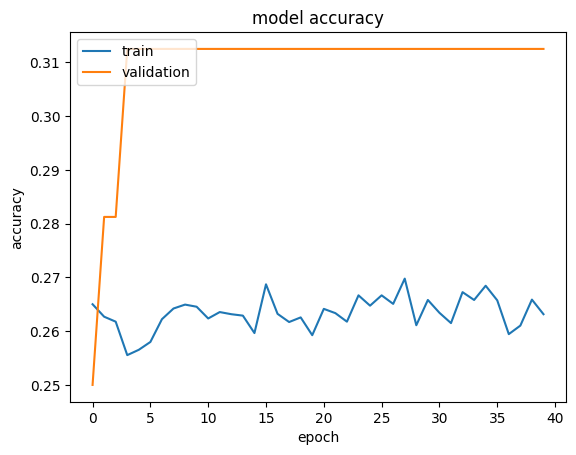

In [47]:
plt.plot(history_resnet.history["accuracy"])
plt.plot(history_resnet.history["val_accuracy"])
plt.title("model accuracy")
plt.ylabel("accuracy")
plt.xlabel("epoch")
plt.legend(["train", "validation"], loc="upper left")
plt.show()

### **Evaluating the ResNet Model**


In [48]:
# Calculate the number of steps for the entire test set to be processed
test_steps = test_generator.samples // batch_size

# If the number of samples isn't a multiple of the batch size,
# you have one more batch with the remaining samples
if test_generator.samples % batch_size > 0:
    test_steps += 1

# Evaluating the model on the test set
evaluation_results = new_resnet_model.evaluate(test_generator, steps=test_steps)
print(f"Loss: {evaluation_results[0]}, Accuracy: {evaluation_results[1]}")

1/4 [======>.......................] - ETA: 1s - loss: 1.3357 - accuracy: 0.0000e+00

4/4 [==============================] - 0s 6ms/step - loss: 1.3924 - accuracy: 0.2500


Loss: 1.3924291133880615, Accuracy: 0.25


### **Plotting Confusion Matrix**


1/4 [======>.......................] - ETA: 1s

4/4 [==============================] - 0s 6ms/step


              precision    recall  f1-score   support

       happy       0.00      0.00      0.00        32
     neutral       0.00      0.00      0.00        32
         sad       0.25      1.00      0.40        32
    surprise       0.00      0.00      0.00        32

    accuracy                           0.25       128
   macro avg       0.06      0.25      0.10       128
weighted avg       0.06      0.25      0.10       128



/home/iamtxena/sandbox/mit-ai/my_env/lib/python3.10/site-packages/sklearn/metrics/_classification.py:1509: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/home/iamtxena/sandbox/mit-ai/my_env/lib/python3.10/site-packages/sklearn/metrics/_classification.py:1509: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/home/iamtxena/sandbox/mit-ai/my_env/lib/python3.10/site-packages/sklearn/metrics/_classification.py:1509: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.cap

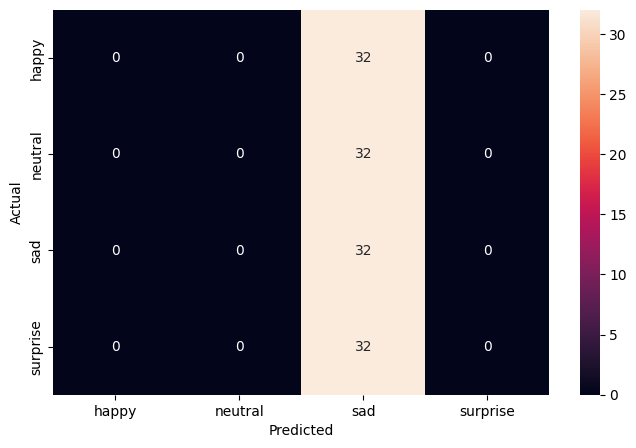

In [49]:
pred_probabilities = new_resnet_model.predict(test_generator, steps=test_steps)
pred = np.argmax(pred_probabilities, axis=1)

# Getting the true labels from the generator
y_true = test_generator.classes

# Printing the classification report with actual emotion labels
print(classification_report(y_true, pred, target_names=CATEGORIES))

# Plotting the heatmap using confusion matrix
cm = confusion_matrix(y_true, pred)
plt.figure(figsize=(8, 5))
sns.heatmap(cm, annot=True, fmt=".0f", xticklabels=CATEGORIES, yticklabels=CATEGORIES)
plt.ylabel("Actual")
plt.xlabel("Predicted")
plt.show()

**Observations and Insights:\_\_**

**Note: You can even go back and build your own architecture on top of the ResNet Transfer layer and see if you can improve the performance.**


## **EfficientNet Model**


In [50]:
backend.clear_session()

# Fixing the seed for random number generators so that we can ensure we receive the same output everytime
np.random.seed(42)

random.seed(42)
tf.random.set_seed(42)

In [51]:
efficient_model = EfficientNetB0(weights="imagenet", include_top=False,
                                 input_shape=(img_width, img_height, color_layers))
# Making all the layers of the efficient_model model non-trainable. i.e. freezing them
for layer in efficient_model.layers:
    layer.trainable = False

efficient_model.summary()

Model: "efficientnetb0"


__________________________________________________________________________________________________


 Layer (type)                Output Shape                 Param #   Connected to                  


 input_1 (InputLayer)        [(None, 48, 48, 3)]          0         []                            


 rescaling (Rescaling)       (None, 48, 48, 3)            0         ['input_1[0][0]']             


 normalization (Normalizati  (None, 48, 48, 3)            7         ['rescaling[0][0]']           


 on)                                                                                              


 rescaling_1 (Rescaling)     (None, 48, 48, 3)            0         ['normalization[0][0]']       


 stem_conv_pad (ZeroPadding  (None, 49, 49, 3)            0         ['rescaling_1[0][0]']         


 2D)                                                                                              


 stem_conv (Conv2D)          (None, 24, 24, 32)           864       ['stem_conv_pad[0][0]']       


 stem_bn (BatchNormalizatio  (None, 24, 24, 32)           128       ['stem_conv[0][0]']           


 n)                                                                                               


 stem_activation (Activatio  (None, 24, 24, 32)           0         ['stem_bn[0][0]']             


 n)                                                                                               


 block1a_dwconv (DepthwiseC  (None, 24, 24, 32)           288       ['stem_activation[0][0]']     


 onv2D)                                                                                           


 block1a_bn (BatchNormaliza  (None, 24, 24, 32)           128       ['block1a_dwconv[0][0]']      


 tion)                                                                                            


 block1a_activation (Activa  (None, 24, 24, 32)           0         ['block1a_bn[0][0]']          


 tion)                                                                                            


 block1a_se_squeeze (Global  (None, 32)                   0         ['block1a_activation[0][0]']  


 AveragePooling2D)                                                                                


 block1a_se_reshape (Reshap  (None, 1, 1, 32)             0         ['block1a_se_squeeze[0][0]']  


 e)                                                                                               


 block1a_se_reduce (Conv2D)  (None, 1, 1, 8)              264       ['block1a_se_reshape[0][0]']  


 block1a_se_expand (Conv2D)  (None, 1, 1, 32)             288       ['block1a_se_reduce[0][0]']   


 block1a_se_excite (Multipl  (None, 24, 24, 32)           0         ['block1a_activation[0][0]',  


 y)                                                                  'block1a_se_expand[0][0]']   


 block1a_project_conv (Conv  (None, 24, 24, 16)           512       ['block1a_se_excite[0][0]']   


 2D)                                                                                              


 block1a_project_bn (BatchN  (None, 24, 24, 16)           64        ['block1a_project_conv[0][0]']


 ormalization)                                                                                    


 block2a_expand_conv (Conv2  (None, 24, 24, 96)           1536      ['block1a_project_bn[0][0]']  


 D)                                                                                               


 block2a_expand_bn (BatchNo  (None, 24, 24, 96)           384       ['block2a_expand_conv[0][0]'] 


 rmalization)                                                                                     


 block2a_expand_activation   (None, 24, 24, 96)           0         ['block2a_expand_bn[0][0]']   


 (Activation)                                                                                     


 block2a_dwconv_pad (ZeroPa  (None, 25, 25, 96)           0         ['block2a_expand_activation[0]


 dding2D)                                                           [0]']                         


 block2a_dwconv (DepthwiseC  (None, 12, 12, 96)           864       ['block2a_dwconv_pad[0][0]']  


 onv2D)                                                                                           


 block2a_bn (BatchNormaliza  (None, 12, 12, 96)           384       ['block2a_dwconv[0][0]']      


 tion)                                                                                            


 block2a_activation (Activa  (None, 12, 12, 96)           0         ['block2a_bn[0][0]']          


 tion)                                                                                            


 block2a_se_squeeze (Global  (None, 96)                   0         ['block2a_activation[0][0]']  


 AveragePooling2D)                                                                                


 block2a_se_reshape (Reshap  (None, 1, 1, 96)             0         ['block2a_se_squeeze[0][0]']  


 e)                                                                                               


 block2a_se_reduce (Conv2D)  (None, 1, 1, 4)              388       ['block2a_se_reshape[0][0]']  


 block2a_se_expand (Conv2D)  (None, 1, 1, 96)             480       ['block2a_se_reduce[0][0]']   


 block2a_se_excite (Multipl  (None, 12, 12, 96)           0         ['block2a_activation[0][0]',  


 y)                                                                  'block2a_se_expand[0][0]']   


 block2a_project_conv (Conv  (None, 12, 12, 24)           2304      ['block2a_se_excite[0][0]']   


 2D)                                                                                              


 block2a_project_bn (BatchN  (None, 12, 12, 24)           96        ['block2a_project_conv[0][0]']


 ormalization)                                                                                    


 block2b_expand_conv (Conv2  (None, 12, 12, 144)          3456      ['block2a_project_bn[0][0]']  


 D)                                                                                               


 block2b_expand_bn (BatchNo  (None, 12, 12, 144)          576       ['block2b_expand_conv[0][0]'] 


 rmalization)                                                                                     


 block2b_expand_activation   (None, 12, 12, 144)          0         ['block2b_expand_bn[0][0]']   


 (Activation)                                                                                     


 block2b_dwconv (DepthwiseC  (None, 12, 12, 144)          1296      ['block2b_expand_activation[0]


 onv2D)                                                             [0]']                         


 block2b_bn (BatchNormaliza  (None, 12, 12, 144)          576       ['block2b_dwconv[0][0]']      


 tion)                                                                                            


 block2b_activation (Activa  (None, 12, 12, 144)          0         ['block2b_bn[0][0]']          


 tion)                                                                                            


 block2b_se_squeeze (Global  (None, 144)                  0         ['block2b_activation[0][0]']  


 AveragePooling2D)                                                                                


 block2b_se_reshape (Reshap  (None, 1, 1, 144)            0         ['block2b_se_squeeze[0][0]']  


 e)                                                                                               


 block2b_se_reduce (Conv2D)  (None, 1, 1, 6)              870       ['block2b_se_reshape[0][0]']  


 block2b_se_expand (Conv2D)  (None, 1, 1, 144)            1008      ['block2b_se_reduce[0][0]']   


 block2b_se_excite (Multipl  (None, 12, 12, 144)          0         ['block2b_activation[0][0]',  


 y)                                                                  'block2b_se_expand[0][0]']   


 block2b_project_conv (Conv  (None, 12, 12, 24)           3456      ['block2b_se_excite[0][0]']   


 2D)                                                                                              


 block2b_project_bn (BatchN  (None, 12, 12, 24)           96        ['block2b_project_conv[0][0]']


 ormalization)                                                                                    


 block2b_drop (Dropout)      (None, 12, 12, 24)           0         ['block2b_project_bn[0][0]']  


 block2b_add (Add)           (None, 12, 12, 24)           0         ['block2b_drop[0][0]',        


                                                                     'block2a_project_bn[0][0]']  


 block3a_expand_conv (Conv2  (None, 12, 12, 144)          3456      ['block2b_add[0][0]']         


 D)                                                                                               


 block3a_expand_bn (BatchNo  (None, 12, 12, 144)          576       ['block3a_expand_conv[0][0]'] 


 rmalization)                                                                                     


 block3a_expand_activation   (None, 12, 12, 144)          0         ['block3a_expand_bn[0][0]']   


 (Activation)                                                                                     


 block3a_dwconv_pad (ZeroPa  (None, 15, 15, 144)          0         ['block3a_expand_activation[0]


 dding2D)                                                           [0]']                         


 block3a_dwconv (DepthwiseC  (None, 6, 6, 144)            3600      ['block3a_dwconv_pad[0][0]']  


 onv2D)                                                                                           


 block3a_bn (BatchNormaliza  (None, 6, 6, 144)            576       ['block3a_dwconv[0][0]']      


 tion)                                                                                            


 block3a_activation (Activa  (None, 6, 6, 144)            0         ['block3a_bn[0][0]']          


 tion)                                                                                            


 block3a_se_squeeze (Global  (None, 144)                  0         ['block3a_activation[0][0]']  


 AveragePooling2D)                                                                                


 block3a_se_reshape (Reshap  (None, 1, 1, 144)            0         ['block3a_se_squeeze[0][0]']  


 e)                                                                                               


 block3a_se_reduce (Conv2D)  (None, 1, 1, 6)              870       ['block3a_se_reshape[0][0]']  


 block3a_se_expand (Conv2D)  (None, 1, 1, 144)            1008      ['block3a_se_reduce[0][0]']   


 block3a_se_excite (Multipl  (None, 6, 6, 144)            0         ['block3a_activation[0][0]',  


 y)                                                                  'block3a_se_expand[0][0]']   


 block3a_project_conv (Conv  (None, 6, 6, 40)             5760      ['block3a_se_excite[0][0]']   


 2D)                                                                                              


 block3a_project_bn (BatchN  (None, 6, 6, 40)             160       ['block3a_project_conv[0][0]']


 ormalization)                                                                                    


 block3b_expand_conv (Conv2  (None, 6, 6, 240)            9600      ['block3a_project_bn[0][0]']  


 D)                                                                                               


 block3b_expand_bn (BatchNo  (None, 6, 6, 240)            960       ['block3b_expand_conv[0][0]'] 


 rmalization)                                                                                     


 block3b_expand_activation   (None, 6, 6, 240)            0         ['block3b_expand_bn[0][0]']   


 (Activation)                                                                                     


 block3b_dwconv (DepthwiseC  (None, 6, 6, 240)            6000      ['block3b_expand_activation[0]


 onv2D)                                                             [0]']                         


 block3b_bn (BatchNormaliza  (None, 6, 6, 240)            960       ['block3b_dwconv[0][0]']      


 tion)                                                                                            


 block3b_activation (Activa  (None, 6, 6, 240)            0         ['block3b_bn[0][0]']          


 tion)                                                                                            


 block3b_se_squeeze (Global  (None, 240)                  0         ['block3b_activation[0][0]']  


 AveragePooling2D)                                                                                


 block3b_se_reshape (Reshap  (None, 1, 1, 240)            0         ['block3b_se_squeeze[0][0]']  


 e)                                                                                               


 block3b_se_reduce (Conv2D)  (None, 1, 1, 10)             2410      ['block3b_se_reshape[0][0]']  


 block3b_se_expand (Conv2D)  (None, 1, 1, 240)            2640      ['block3b_se_reduce[0][0]']   


 block3b_se_excite (Multipl  (None, 6, 6, 240)            0         ['block3b_activation[0][0]',  


 y)                                                                  'block3b_se_expand[0][0]']   


 block3b_project_conv (Conv  (None, 6, 6, 40)             9600      ['block3b_se_excite[0][0]']   


 2D)                                                                                              


 block3b_project_bn (BatchN  (None, 6, 6, 40)             160       ['block3b_project_conv[0][0]']


 ormalization)                                                                                    


 block3b_drop (Dropout)      (None, 6, 6, 40)             0         ['block3b_project_bn[0][0]']  


 block3b_add (Add)           (None, 6, 6, 40)             0         ['block3b_drop[0][0]',        


                                                                     'block3a_project_bn[0][0]']  


 block4a_expand_conv (Conv2  (None, 6, 6, 240)            9600      ['block3b_add[0][0]']         


 D)                                                                                               


 block4a_expand_bn (BatchNo  (None, 6, 6, 240)            960       ['block4a_expand_conv[0][0]'] 


 rmalization)                                                                                     


 block4a_expand_activation   (None, 6, 6, 240)            0         ['block4a_expand_bn[0][0]']   


 (Activation)                                                                                     


 block4a_dwconv_pad (ZeroPa  (None, 7, 7, 240)            0         ['block4a_expand_activation[0]


 dding2D)                                                           [0]']                         


 block4a_dwconv (DepthwiseC  (None, 3, 3, 240)            2160      ['block4a_dwconv_pad[0][0]']  


 onv2D)                                                                                           


 block4a_bn (BatchNormaliza  (None, 3, 3, 240)            960       ['block4a_dwconv[0][0]']      


 tion)                                                                                            


 block4a_activation (Activa  (None, 3, 3, 240)            0         ['block4a_bn[0][0]']          


 tion)                                                                                            


 block4a_se_squeeze (Global  (None, 240)                  0         ['block4a_activation[0][0]']  


 AveragePooling2D)                                                                                


 block4a_se_reshape (Reshap  (None, 1, 1, 240)            0         ['block4a_se_squeeze[0][0]']  


 e)                                                                                               


 block4a_se_reduce (Conv2D)  (None, 1, 1, 10)             2410      ['block4a_se_reshape[0][0]']  


 block4a_se_expand (Conv2D)  (None, 1, 1, 240)            2640      ['block4a_se_reduce[0][0]']   


 block4a_se_excite (Multipl  (None, 3, 3, 240)            0         ['block4a_activation[0][0]',  


 y)                                                                  'block4a_se_expand[0][0]']   


 block4a_project_conv (Conv  (None, 3, 3, 80)             19200     ['block4a_se_excite[0][0]']   


 2D)                                                                                              


 block4a_project_bn (BatchN  (None, 3, 3, 80)             320       ['block4a_project_conv[0][0]']


 ormalization)                                                                                    


 block4b_expand_conv (Conv2  (None, 3, 3, 480)            38400     ['block4a_project_bn[0][0]']  


 D)                                                                                               


 block4b_expand_bn (BatchNo  (None, 3, 3, 480)            1920      ['block4b_expand_conv[0][0]'] 


 rmalization)                                                                                     


 block4b_expand_activation   (None, 3, 3, 480)            0         ['block4b_expand_bn[0][0]']   


 (Activation)                                                                                     


 block4b_dwconv (DepthwiseC  (None, 3, 3, 480)            4320      ['block4b_expand_activation[0]


 onv2D)                                                             [0]']                         


 block4b_bn (BatchNormaliza  (None, 3, 3, 480)            1920      ['block4b_dwconv[0][0]']      


 tion)                                                                                            


 block4b_activation (Activa  (None, 3, 3, 480)            0         ['block4b_bn[0][0]']          


 tion)                                                                                            


 block4b_se_squeeze (Global  (None, 480)                  0         ['block4b_activation[0][0]']  


 AveragePooling2D)                                                                                


 block4b_se_reshape (Reshap  (None, 1, 1, 480)            0         ['block4b_se_squeeze[0][0]']  


 e)                                                                                               


 block4b_se_reduce (Conv2D)  (None, 1, 1, 20)             9620      ['block4b_se_reshape[0][0]']  


 block4b_se_expand (Conv2D)  (None, 1, 1, 480)            10080     ['block4b_se_reduce[0][0]']   


 block4b_se_excite (Multipl  (None, 3, 3, 480)            0         ['block4b_activation[0][0]',  


 y)                                                                  'block4b_se_expand[0][0]']   


 block4b_project_conv (Conv  (None, 3, 3, 80)             38400     ['block4b_se_excite[0][0]']   


 2D)                                                                                              


 block4b_project_bn (BatchN  (None, 3, 3, 80)             320       ['block4b_project_conv[0][0]']


 ormalization)                                                                                    


 block4b_drop (Dropout)      (None, 3, 3, 80)             0         ['block4b_project_bn[0][0]']  


 block4b_add (Add)           (None, 3, 3, 80)             0         ['block4b_drop[0][0]',        


                                                                     'block4a_project_bn[0][0]']  


 block4c_expand_conv (Conv2  (None, 3, 3, 480)            38400     ['block4b_add[0][0]']         


 D)                                                                                               


 block4c_expand_bn (BatchNo  (None, 3, 3, 480)            1920      ['block4c_expand_conv[0][0]'] 


 rmalization)                                                                                     


 block4c_expand_activation   (None, 3, 3, 480)            0         ['block4c_expand_bn[0][0]']   


 (Activation)                                                                                     


 block4c_dwconv (DepthwiseC  (None, 3, 3, 480)            4320      ['block4c_expand_activation[0]


 onv2D)                                                             [0]']                         


 block4c_bn (BatchNormaliza  (None, 3, 3, 480)            1920      ['block4c_dwconv[0][0]']      


 tion)                                                                                            


 block4c_activation (Activa  (None, 3, 3, 480)            0         ['block4c_bn[0][0]']          


 tion)                                                                                            


 block4c_se_squeeze (Global  (None, 480)                  0         ['block4c_activation[0][0]']  


 AveragePooling2D)                                                                                


 block4c_se_reshape (Reshap  (None, 1, 1, 480)            0         ['block4c_se_squeeze[0][0]']  


 e)                                                                                               


 block4c_se_reduce (Conv2D)  (None, 1, 1, 20)             9620      ['block4c_se_reshape[0][0]']  


 block4c_se_expand (Conv2D)  (None, 1, 1, 480)            10080     ['block4c_se_reduce[0][0]']   


 block4c_se_excite (Multipl  (None, 3, 3, 480)            0         ['block4c_activation[0][0]',  


 y)                                                                  'block4c_se_expand[0][0]']   


 block4c_project_conv (Conv  (None, 3, 3, 80)             38400     ['block4c_se_excite[0][0]']   


 2D)                                                                                              


 block4c_project_bn (BatchN  (None, 3, 3, 80)             320       ['block4c_project_conv[0][0]']


 ormalization)                                                                                    


 block4c_drop (Dropout)      (None, 3, 3, 80)             0         ['block4c_project_bn[0][0]']  


 block4c_add (Add)           (None, 3, 3, 80)             0         ['block4c_drop[0][0]',        


                                                                     'block4b_add[0][0]']         


 block5a_expand_conv (Conv2  (None, 3, 3, 480)            38400     ['block4c_add[0][0]']         


 D)                                                                                               


 block5a_expand_bn (BatchNo  (None, 3, 3, 480)            1920      ['block5a_expand_conv[0][0]'] 


 rmalization)                                                                                     


 block5a_expand_activation   (None, 3, 3, 480)            0         ['block5a_expand_bn[0][0]']   


 (Activation)                                                                                     


 block5a_dwconv (DepthwiseC  (None, 3, 3, 480)            12000     ['block5a_expand_activation[0]


 onv2D)                                                             [0]']                         


 block5a_bn (BatchNormaliza  (None, 3, 3, 480)            1920      ['block5a_dwconv[0][0]']      


 tion)                                                                                            


 block5a_activation (Activa  (None, 3, 3, 480)            0         ['block5a_bn[0][0]']          


 tion)                                                                                            


 block5a_se_squeeze (Global  (None, 480)                  0         ['block5a_activation[0][0]']  


 AveragePooling2D)                                                                                


 block5a_se_reshape (Reshap  (None, 1, 1, 480)            0         ['block5a_se_squeeze[0][0]']  


 e)                                                                                               


 block5a_se_reduce (Conv2D)  (None, 1, 1, 20)             9620      ['block5a_se_reshape[0][0]']  


 block5a_se_expand (Conv2D)  (None, 1, 1, 480)            10080     ['block5a_se_reduce[0][0]']   


 block5a_se_excite (Multipl  (None, 3, 3, 480)            0         ['block5a_activation[0][0]',  


 y)                                                                  'block5a_se_expand[0][0]']   


 block5a_project_conv (Conv  (None, 3, 3, 112)            53760     ['block5a_se_excite[0][0]']   


 2D)                                                                                              


 block5a_project_bn (BatchN  (None, 3, 3, 112)            448       ['block5a_project_conv[0][0]']


 ormalization)                                                                                    


 block5b_expand_conv (Conv2  (None, 3, 3, 672)            75264     ['block5a_project_bn[0][0]']  


 D)                                                                                               


 block5b_expand_bn (BatchNo  (None, 3, 3, 672)            2688      ['block5b_expand_conv[0][0]'] 


 rmalization)                                                                                     


 block5b_expand_activation   (None, 3, 3, 672)            0         ['block5b_expand_bn[0][0]']   


 (Activation)                                                                                     


 block5b_dwconv (DepthwiseC  (None, 3, 3, 672)            16800     ['block5b_expand_activation[0]


 onv2D)                                                             [0]']                         


 block5b_bn (BatchNormaliza  (None, 3, 3, 672)            2688      ['block5b_dwconv[0][0]']      


 tion)                                                                                            


 block5b_activation (Activa  (None, 3, 3, 672)            0         ['block5b_bn[0][0]']          


 tion)                                                                                            


 block5b_se_squeeze (Global  (None, 672)                  0         ['block5b_activation[0][0]']  


 AveragePooling2D)                                                                                


 block5b_se_reshape (Reshap  (None, 1, 1, 672)            0         ['block5b_se_squeeze[0][0]']  


 e)                                                                                               


 block5b_se_reduce (Conv2D)  (None, 1, 1, 28)             18844     ['block5b_se_reshape[0][0]']  


 block5b_se_expand (Conv2D)  (None, 1, 1, 672)            19488     ['block5b_se_reduce[0][0]']   


 block5b_se_excite (Multipl  (None, 3, 3, 672)            0         ['block5b_activation[0][0]',  


 y)                                                                  'block5b_se_expand[0][0]']   


 block5b_project_conv (Conv  (None, 3, 3, 112)            75264     ['block5b_se_excite[0][0]']   


 2D)                                                                                              


 block5b_project_bn (BatchN  (None, 3, 3, 112)            448       ['block5b_project_conv[0][0]']


 ormalization)                                                                                    


 block5b_drop (Dropout)      (None, 3, 3, 112)            0         ['block5b_project_bn[0][0]']  


 block5b_add (Add)           (None, 3, 3, 112)            0         ['block5b_drop[0][0]',        


                                                                     'block5a_project_bn[0][0]']  


 block5c_expand_conv (Conv2  (None, 3, 3, 672)            75264     ['block5b_add[0][0]']         


 D)                                                                                               


 block5c_expand_bn (BatchNo  (None, 3, 3, 672)            2688      ['block5c_expand_conv[0][0]'] 


 rmalization)                                                                                     


 block5c_expand_activation   (None, 3, 3, 672)            0         ['block5c_expand_bn[0][0]']   


 (Activation)                                                                                     


 block5c_dwconv (DepthwiseC  (None, 3, 3, 672)            16800     ['block5c_expand_activation[0]


 onv2D)                                                             [0]']                         


 block5c_bn (BatchNormaliza  (None, 3, 3, 672)            2688      ['block5c_dwconv[0][0]']      


 tion)                                                                                            


 block5c_activation (Activa  (None, 3, 3, 672)            0         ['block5c_bn[0][0]']          


 tion)                                                                                            


 block5c_se_squeeze (Global  (None, 672)                  0         ['block5c_activation[0][0]']  


 AveragePooling2D)                                                                                


 block5c_se_reshape (Reshap  (None, 1, 1, 672)            0         ['block5c_se_squeeze[0][0]']  


 e)                                                                                               


 block5c_se_reduce (Conv2D)  (None, 1, 1, 28)             18844     ['block5c_se_reshape[0][0]']  


 block5c_se_expand (Conv2D)  (None, 1, 1, 672)            19488     ['block5c_se_reduce[0][0]']   


 block5c_se_excite (Multipl  (None, 3, 3, 672)            0         ['block5c_activation[0][0]',  


 y)                                                                  'block5c_se_expand[0][0]']   


 block5c_project_conv (Conv  (None, 3, 3, 112)            75264     ['block5c_se_excite[0][0]']   


 2D)                                                                                              


 block5c_project_bn (BatchN  (None, 3, 3, 112)            448       ['block5c_project_conv[0][0]']


 ormalization)                                                                                    


 block5c_drop (Dropout)      (None, 3, 3, 112)            0         ['block5c_project_bn[0][0]']  


 block5c_add (Add)           (None, 3, 3, 112)            0         ['block5c_drop[0][0]',        


                                                                     'block5b_add[0][0]']         


 block6a_expand_conv (Conv2  (None, 3, 3, 672)            75264     ['block5c_add[0][0]']         


 D)                                                                                               


 block6a_expand_bn (BatchNo  (None, 3, 3, 672)            2688      ['block6a_expand_conv[0][0]'] 


 rmalization)                                                                                     


 block6a_expand_activation   (None, 3, 3, 672)            0         ['block6a_expand_bn[0][0]']   


 (Activation)                                                                                     


 block6a_dwconv_pad (ZeroPa  (None, 7, 7, 672)            0         ['block6a_expand_activation[0]


 dding2D)                                                           [0]']                         


 block6a_dwconv (DepthwiseC  (None, 2, 2, 672)            16800     ['block6a_dwconv_pad[0][0]']  


 onv2D)                                                                                           


 block6a_bn (BatchNormaliza  (None, 2, 2, 672)            2688      ['block6a_dwconv[0][0]']      


 tion)                                                                                            


 block6a_activation (Activa  (None, 2, 2, 672)            0         ['block6a_bn[0][0]']          


 tion)                                                                                            


 block6a_se_squeeze (Global  (None, 672)                  0         ['block6a_activation[0][0]']  


 AveragePooling2D)                                                                                


 block6a_se_reshape (Reshap  (None, 1, 1, 672)            0         ['block6a_se_squeeze[0][0]']  


 e)                                                                                               


 block6a_se_reduce (Conv2D)  (None, 1, 1, 28)             18844     ['block6a_se_reshape[0][0]']  


 block6a_se_expand (Conv2D)  (None, 1, 1, 672)            19488     ['block6a_se_reduce[0][0]']   


 block6a_se_excite (Multipl  (None, 2, 2, 672)            0         ['block6a_activation[0][0]',  


 y)                                                                  'block6a_se_expand[0][0]']   


 block6a_project_conv (Conv  (None, 2, 2, 192)            129024    ['block6a_se_excite[0][0]']   


 2D)                                                                                              


 block6a_project_bn (BatchN  (None, 2, 2, 192)            768       ['block6a_project_conv[0][0]']


 ormalization)                                                                                    


 block6b_expand_conv (Conv2  (None, 2, 2, 1152)           221184    ['block6a_project_bn[0][0]']  


 D)                                                                                               


 block6b_expand_bn (BatchNo  (None, 2, 2, 1152)           4608      ['block6b_expand_conv[0][0]'] 


 rmalization)                                                                                     


 block6b_expand_activation   (None, 2, 2, 1152)           0         ['block6b_expand_bn[0][0]']   


 (Activation)                                                                                     


 block6b_dwconv (DepthwiseC  (None, 2, 2, 1152)           28800     ['block6b_expand_activation[0]


 onv2D)                                                             [0]']                         


 block6b_bn (BatchNormaliza  (None, 2, 2, 1152)           4608      ['block6b_dwconv[0][0]']      


 tion)                                                                                            


 block6b_activation (Activa  (None, 2, 2, 1152)           0         ['block6b_bn[0][0]']          


 tion)                                                                                            


 block6b_se_squeeze (Global  (None, 1152)                 0         ['block6b_activation[0][0]']  


 AveragePooling2D)                                                                                


 block6b_se_reshape (Reshap  (None, 1, 1, 1152)           0         ['block6b_se_squeeze[0][0]']  


 e)                                                                                               


 block6b_se_reduce (Conv2D)  (None, 1, 1, 48)             55344     ['block6b_se_reshape[0][0]']  


 block6b_se_expand (Conv2D)  (None, 1, 1, 1152)           56448     ['block6b_se_reduce[0][0]']   


 block6b_se_excite (Multipl  (None, 2, 2, 1152)           0         ['block6b_activation[0][0]',  


 y)                                                                  'block6b_se_expand[0][0]']   


 block6b_project_conv (Conv  (None, 2, 2, 192)            221184    ['block6b_se_excite[0][0]']   


 2D)                                                                                              


 block6b_project_bn (BatchN  (None, 2, 2, 192)            768       ['block6b_project_conv[0][0]']


 ormalization)                                                                                    


 block6b_drop (Dropout)      (None, 2, 2, 192)            0         ['block6b_project_bn[0][0]']  


 block6b_add (Add)           (None, 2, 2, 192)            0         ['block6b_drop[0][0]',        


                                                                     'block6a_project_bn[0][0]']  


 block6c_expand_conv (Conv2  (None, 2, 2, 1152)           221184    ['block6b_add[0][0]']         


 D)                                                                                               


 block6c_expand_bn (BatchNo  (None, 2, 2, 1152)           4608      ['block6c_expand_conv[0][0]'] 


 rmalization)                                                                                     


 block6c_expand_activation   (None, 2, 2, 1152)           0         ['block6c_expand_bn[0][0]']   


 (Activation)                                                                                     


 block6c_dwconv (DepthwiseC  (None, 2, 2, 1152)           28800     ['block6c_expand_activation[0]


 onv2D)                                                             [0]']                         


 block6c_bn (BatchNormaliza  (None, 2, 2, 1152)           4608      ['block6c_dwconv[0][0]']      


 tion)                                                                                            


 block6c_activation (Activa  (None, 2, 2, 1152)           0         ['block6c_bn[0][0]']          


 tion)                                                                                            


 block6c_se_squeeze (Global  (None, 1152)                 0         ['block6c_activation[0][0]']  


 AveragePooling2D)                                                                                


 block6c_se_reshape (Reshap  (None, 1, 1, 1152)           0         ['block6c_se_squeeze[0][0]']  


 e)                                                                                               


 block6c_se_reduce (Conv2D)  (None, 1, 1, 48)             55344     ['block6c_se_reshape[0][0]']  


 block6c_se_expand (Conv2D)  (None, 1, 1, 1152)           56448     ['block6c_se_reduce[0][0]']   


 block6c_se_excite (Multipl  (None, 2, 2, 1152)           0         ['block6c_activation[0][0]',  


 y)                                                                  'block6c_se_expand[0][0]']   


 block6c_project_conv (Conv  (None, 2, 2, 192)            221184    ['block6c_se_excite[0][0]']   


 2D)                                                                                              


 block6c_project_bn (BatchN  (None, 2, 2, 192)            768       ['block6c_project_conv[0][0]']


 ormalization)                                                                                    


 block6c_drop (Dropout)      (None, 2, 2, 192)            0         ['block6c_project_bn[0][0]']  


 block6c_add (Add)           (None, 2, 2, 192)            0         ['block6c_drop[0][0]',        


                                                                     'block6b_add[0][0]']         


 block6d_expand_conv (Conv2  (None, 2, 2, 1152)           221184    ['block6c_add[0][0]']         


 D)                                                                                               


 block6d_expand_bn (BatchNo  (None, 2, 2, 1152)           4608      ['block6d_expand_conv[0][0]'] 


 rmalization)                                                                                     


 block6d_expand_activation   (None, 2, 2, 1152)           0         ['block6d_expand_bn[0][0]']   


 (Activation)                                                                                     


 block6d_dwconv (DepthwiseC  (None, 2, 2, 1152)           28800     ['block6d_expand_activation[0]


 onv2D)                                                             [0]']                         


 block6d_bn (BatchNormaliza  (None, 2, 2, 1152)           4608      ['block6d_dwconv[0][0]']      


 tion)                                                                                            


 block6d_activation (Activa  (None, 2, 2, 1152)           0         ['block6d_bn[0][0]']          


 tion)                                                                                            


 block6d_se_squeeze (Global  (None, 1152)                 0         ['block6d_activation[0][0]']  


 AveragePooling2D)                                                                                


 block6d_se_reshape (Reshap  (None, 1, 1, 1152)           0         ['block6d_se_squeeze[0][0]']  


 e)                                                                                               


 block6d_se_reduce (Conv2D)  (None, 1, 1, 48)             55344     ['block6d_se_reshape[0][0]']  


 block6d_se_expand (Conv2D)  (None, 1, 1, 1152)           56448     ['block6d_se_reduce[0][0]']   


 block6d_se_excite (Multipl  (None, 2, 2, 1152)           0         ['block6d_activation[0][0]',  


 y)                                                                  'block6d_se_expand[0][0]']   


 block6d_project_conv (Conv  (None, 2, 2, 192)            221184    ['block6d_se_excite[0][0]']   


 2D)                                                                                              


 block6d_project_bn (BatchN  (None, 2, 2, 192)            768       ['block6d_project_conv[0][0]']


 ormalization)                                                                                    


 block6d_drop (Dropout)      (None, 2, 2, 192)            0         ['block6d_project_bn[0][0]']  


 block6d_add (Add)           (None, 2, 2, 192)            0         ['block6d_drop[0][0]',        


                                                                     'block6c_add[0][0]']         


 block7a_expand_conv (Conv2  (None, 2, 2, 1152)           221184    ['block6d_add[0][0]']         


 D)                                                                                               


 block7a_expand_bn (BatchNo  (None, 2, 2, 1152)           4608      ['block7a_expand_conv[0][0]'] 


 rmalization)                                                                                     


 block7a_expand_activation   (None, 2, 2, 1152)           0         ['block7a_expand_bn[0][0]']   


 (Activation)                                                                                     


 block7a_dwconv (DepthwiseC  (None, 2, 2, 1152)           10368     ['block7a_expand_activation[0]


 onv2D)                                                             [0]']                         


 block7a_bn (BatchNormaliza  (None, 2, 2, 1152)           4608      ['block7a_dwconv[0][0]']      


 tion)                                                                                            


 block7a_activation (Activa  (None, 2, 2, 1152)           0         ['block7a_bn[0][0]']          


 tion)                                                                                            


 block7a_se_squeeze (Global  (None, 1152)                 0         ['block7a_activation[0][0]']  


 AveragePooling2D)                                                                                


 block7a_se_reshape (Reshap  (None, 1, 1, 1152)           0         ['block7a_se_squeeze[0][0]']  


 e)                                                                                               


 block7a_se_reduce (Conv2D)  (None, 1, 1, 48)             55344     ['block7a_se_reshape[0][0]']  


 block7a_se_expand (Conv2D)  (None, 1, 1, 1152)           56448     ['block7a_se_reduce[0][0]']   


 block7a_se_excite (Multipl  (None, 2, 2, 1152)           0         ['block7a_activation[0][0]',  


 y)                                                                  'block7a_se_expand[0][0]']   


 block7a_project_conv (Conv  (None, 2, 2, 320)            368640    ['block7a_se_excite[0][0]']   


 2D)                                                                                              


 block7a_project_bn (BatchN  (None, 2, 2, 320)            1280      ['block7a_project_conv[0][0]']


 ormalization)                                                                                    


 top_conv (Conv2D)           (None, 2, 2, 1280)           409600    ['block7a_project_bn[0][0]']  


 top_bn (BatchNormalization  (None, 2, 2, 1280)           5120      ['top_conv[0][0]']            


 )                                                                                                


 top_activation (Activation  (None, 2, 2, 1280)           0         ['top_bn[0][0]']              


 )                                                                                                


Total params: 4049571 (15.45 MB)


Trainable params: 0 (0.00 Byte)


Non-trainable params: 4049571 (15.45 MB)


__________________________________________________________________________________________________


### **Model Building**

- Import EfficientNet upto the layer of your choice and add Fully Connected layers on top of it.


In [52]:
new_efficient_model = Sequential()
new_efficient_model.add(efficient_model)

# Reduces each feature map to a single value by averaging all elements
new_efficient_model.add(GlobalAveragePooling2D())

# Adding a dense output layer
new_efficient_model.add(Dense(512, activation="relu"))
new_efficient_model.add(Dropout(0.5))
new_efficient_model.add(Dense(128, activation="relu"))
new_efficient_model.add(Dropout(0.5))
new_efficient_model.add(Dense(4, activation="softmax"))

# Using Adam Optimizer
optimizer = Adam(learning_rate=0.0005)

### **Compiling and Training the Model**


In [53]:
new_efficient_model.compile(optimizer=optimizer, loss="categorical_crossentropy", metrics=["accuracy"])
new_efficient_model.summary()

Model: "sequential"


_________________________________________________________________


 Layer (type)                Output Shape              Param #   


 efficientnetb0 (Functional  (None, 2, 2, 1280)        4049571   


 )                                                               


 global_average_pooling2d (  (None, 1280)              0         


 GlobalAveragePooling2D)                                         


 dense (Dense)               (None, 512)               655872    


 dropout (Dropout)           (None, 512)               0         


 dense_1 (Dense)             (None, 128)               65664     


 dropout_1 (Dropout)         (None, 128)               0         


 dense_2 (Dense)             (None, 4)                 516       


Total params: 4771623 (18.20 MB)


Trainable params: 722052 (2.75 MB)


Non-trainable params: 4049571 (15.45 MB)


_________________________________________________________________


In [54]:
# Get the current time
current_time = datetime.now().strftime("%Y%m%d-%H%M%S")

# Set up Early Stopping with a patience 7 but acting after at least 20 epochs
delayed_early_stopping = DelayedEarlyStopping(
    monitor="val_loss", patience=7, verbose=1, restore_best_weights=True, start_epoch=20
)

# Define the learning rate scheduler callback
reduce_lr = ReduceLROnPlateau(monitor="val_loss", factor=0.2, patience=5, min_lr=0.00001, verbose=1)

mc = ModelCheckpoint(
    f"{results_path}/best_model_efficient_{current_time}.keras",
    monitor="val_accuracy",
    mode="max",
    verbose=1,
    save_best_only=True,
)

# Pulling a single large batch of random validation data for doing the validation after each epoch
validationX, validationY = validation_generator.next()

# Fitting the model with 40 epochs and using validation set
history_efficient = new_efficient_model.fit(
    train_generator,
    epochs=40,
    validation_data=(validationX, validationY),
    callbacks=[delayed_early_stopping, mc, reduce_lr],
)

Epoch 1/40


  1/473 [..............................] - ETA: 27:54 - loss: 1.5705 - accuracy: 0.2500

  6/473 [..............................] - ETA: 5s - loss: 1.4862 - accuracy: 0.2917   

 10/473 [..............................] - ETA: 6s - loss: 1.4641 - accuracy: 0.2906

 14/473 [..............................] - ETA: 6s - loss: 1.4442 - accuracy: 0.3013

 17/473 [>.............................] - ETA: 7s - loss: 1.4225 - accuracy: 0.3125

 20/473 [>.............................] - ETA: 7s - loss: 1.4155 - accuracy: 0.3125

 23/473 [>.............................] - ETA: 7s - loss: 1.4110 - accuracy: 0.3234

 26/473 [>.............................] - ETA: 7s - loss: 1.4019 - accuracy: 0.3281

 29/473 [>.............................] - ETA: 7s - loss: 1.4004 - accuracy: 0.3265

 33/473 [=>............................] - ETA: 7s - loss: 1.3935 - accuracy: 0.3324

 37/473 [=>............................] - ETA: 7s - loss: 1.3860 - accuracy: 0.3378

 41/473 [=>............................] - ETA: 7s - loss: 1.3864 - accuracy: 0.3392

 44/473 [=>............................] - ETA: 7s - loss: 1.3797 - accuracy: 0.3430

 47/473 [=>............................] - ETA: 7s - loss: 1.3770 - accuracy: 0.3418

 50/473 [==>...........................] - ETA: 7s - loss: 1.3760 - accuracy: 0.3406

 53/473 [==>...........................] - ETA: 6s - loss: 1.3759 - accuracy: 0.3408

 57/473 [==>...........................] - ETA: 6s - loss: 1.3749 - accuracy: 0.3416

 60/473 [==>...........................] - ETA: 6s - loss: 1.3696 - accuracy: 0.3453

 63/473 [==>...........................] - ETA: 6s - loss: 1.3708 - accuracy: 0.3433

 66/473 [===>..........................] - ETA: 6s - loss: 1.3681 - accuracy: 0.3447

 69/473 [===>..........................] - ETA: 6s - loss: 1.3683 - accuracy: 0.3424

 72/473 [===>..........................] - ETA: 6s - loss: 1.3660 - accuracy: 0.3442

 75/473 [===>..........................] - ETA: 6s - loss: 1.3646 - accuracy: 0.3483

 78/473 [===>..........................] - ETA: 6s - loss: 1.3631 - accuracy: 0.3458

 81/473 [====>.........................] - ETA: 6s - loss: 1.3631 - accuracy: 0.3468

 84/473 [====>.........................] - ETA: 6s - loss: 1.3624 - accuracy: 0.3460

 87/473 [====>.........................] - ETA: 6s - loss: 1.3612 - accuracy: 0.3466

 91/473 [====>.........................] - ETA: 6s - loss: 1.3589 - accuracy: 0.3479

 95/473 [=====>........................] - ETA: 6s - loss: 1.3570 - accuracy: 0.3533

 99/473 [=====>........................] - ETA: 6s - loss: 1.3547 - accuracy: 0.3542

103/473 [=====>........................] - ETA: 6s - loss: 1.3525 - accuracy: 0.3568

107/473 [=====>........................] - ETA: 6s - loss: 1.3490 - accuracy: 0.3581

111/473 [======>.......................] - ETA: 6s - loss: 1.3473 - accuracy: 0.3598

115/473 [======>.......................] - ETA: 5s - loss: 1.3425 - accuracy: 0.3630

119/473 [======>.......................] - ETA: 5s - loss: 1.3412 - accuracy: 0.3637

123/473 [======>.......................] - ETA: 5s - loss: 1.3372 - accuracy: 0.3676

126/473 [======>.......................] - ETA: 5s - loss: 1.3348 - accuracy: 0.3678

130/473 [=======>......................] - ETA: 5s - loss: 1.3340 - accuracy: 0.3683

134/473 [=======>......................] - ETA: 5s - loss: 1.3336 - accuracy: 0.3692

138/473 [=======>......................] - ETA: 5s - loss: 1.3316 - accuracy: 0.3718

142/473 [========>.....................] - ETA: 5s - loss: 1.3284 - accuracy: 0.3735

146/473 [========>.....................] - ETA: 5s - loss: 1.3267 - accuracy: 0.3739

150/473 [========>.....................] - ETA: 5s - loss: 1.3248 - accuracy: 0.3758

154/473 [========>.....................] - ETA: 5s - loss: 1.3244 - accuracy: 0.3754

157/473 [========>.....................] - ETA: 5s - loss: 1.3241 - accuracy: 0.3752

160/473 [=========>....................] - ETA: 5s - loss: 1.3224 - accuracy: 0.3758

164/473 [=========>....................] - ETA: 5s - loss: 1.3213 - accuracy: 0.3769

168/473 [=========>....................] - ETA: 5s - loss: 1.3166 - accuracy: 0.3800

172/473 [=========>....................] - ETA: 4s - loss: 1.3149 - accuracy: 0.3812

175/473 [==========>...................] - ETA: 4s - loss: 1.3122 - accuracy: 0.3829

178/473 [==========>...................] - ETA: 4s - loss: 1.3101 - accuracy: 0.3847

181/473 [==========>...................] - ETA: 4s - loss: 1.3092 - accuracy: 0.3845

185/473 [==========>...................] - ETA: 4s - loss: 1.3078 - accuracy: 0.3855

188/473 [==========>...................] - ETA: 4s - loss: 1.3060 - accuracy: 0.3880

191/473 [===========>..................] - ETA: 4s - loss: 1.3037 - accuracy: 0.3892

195/473 [===========>..................] - ETA: 4s - loss: 1.3012 - accuracy: 0.3917

199/473 [===========>..................] - ETA: 4s - loss: 1.2997 - accuracy: 0.3929

203/473 [===========>..................] - ETA: 4s - loss: 1.2988 - accuracy: 0.3936

206/473 [============>.................] - ETA: 4s - loss: 1.2983 - accuracy: 0.3940

209/473 [============>.................] - ETA: 4s - loss: 1.2970 - accuracy: 0.3953

215/473 [============>.................] - ETA: 4s - loss: 1.2953 - accuracy: 0.3957

218/473 [============>.................] - ETA: 4s - loss: 1.2961 - accuracy: 0.3947

221/473 [=============>................] - ETA: 4s - loss: 1.2942 - accuracy: 0.3955

224/473 [=============>................] - ETA: 4s - loss: 1.2925 - accuracy: 0.3970

227/473 [=============>................] - ETA: 4s - loss: 1.2904 - accuracy: 0.3980

231/473 [=============>................] - ETA: 4s - loss: 1.2905 - accuracy: 0.3980

234/473 [=============>................] - ETA: 3s - loss: 1.2901 - accuracy: 0.3983

238/473 [==============>...............] - ETA: 3s - loss: 1.2891 - accuracy: 0.3993

242/473 [==============>...............] - ETA: 3s - loss: 1.2868 - accuracy: 0.4002

245/473 [==============>...............] - ETA: 3s - loss: 1.2851 - accuracy: 0.4014

248/473 [==============>...............] - ETA: 3s - loss: 1.2854 - accuracy: 0.4018

251/473 [==============>...............] - ETA: 3s - loss: 1.2846 - accuracy: 0.4021

255/473 [===============>..............] - ETA: 3s - loss: 1.2834 - accuracy: 0.4029

259/473 [===============>..............] - ETA: 3s - loss: 1.2824 - accuracy: 0.4041

263/473 [===============>..............] - ETA: 3s - loss: 1.2820 - accuracy: 0.4048

267/473 [===============>..............] - ETA: 3s - loss: 1.2818 - accuracy: 0.4047

271/473 [================>.............] - ETA: 3s - loss: 1.2800 - accuracy: 0.4052

275/473 [================>.............] - ETA: 3s - loss: 1.2793 - accuracy: 0.4059

279/473 [================>.............] - ETA: 3s - loss: 1.2785 - accuracy: 0.4067

283/473 [================>.............] - ETA: 3s - loss: 1.2789 - accuracy: 0.4067

287/473 [=================>............] - ETA: 3s - loss: 1.2779 - accuracy: 0.4073

290/473 [=================>............] - ETA: 3s - loss: 1.2780 - accuracy: 0.4070

293/473 [=================>............] - ETA: 2s - loss: 1.2770 - accuracy: 0.4075

297/473 [=================>............] - ETA: 2s - loss: 1.2768 - accuracy: 0.4079

300/473 [==================>...........] - ETA: 2s - loss: 1.2767 - accuracy: 0.4079

303/473 [==================>...........] - ETA: 2s - loss: 1.2765 - accuracy: 0.4084

306/473 [==================>...........] - ETA: 2s - loss: 1.2759 - accuracy: 0.4089

310/473 [==================>...........] - ETA: 2s - loss: 1.2750 - accuracy: 0.4097

313/473 [==================>...........] - ETA: 2s - loss: 1.2742 - accuracy: 0.4107

317/473 [===================>..........] - ETA: 2s - loss: 1.2736 - accuracy: 0.4108

320/473 [===================>..........] - ETA: 2s - loss: 1.2731 - accuracy: 0.4114

324/473 [===================>..........] - ETA: 2s - loss: 1.2712 - accuracy: 0.4128

327/473 [===================>..........] - ETA: 2s - loss: 1.2699 - accuracy: 0.4143

330/473 [===================>..........] - ETA: 2s - loss: 1.2696 - accuracy: 0.4148

333/473 [====================>.........] - ETA: 2s - loss: 1.2696 - accuracy: 0.4148

336/473 [====================>.........] - ETA: 2s - loss: 1.2694 - accuracy: 0.4146

340/473 [====================>.........] - ETA: 2s - loss: 1.2703 - accuracy: 0.4146

344/473 [====================>.........] - ETA: 2s - loss: 1.2694 - accuracy: 0.4161

348/473 [=====================>........] - ETA: 2s - loss: 1.2695 - accuracy: 0.4158

351/473 [=====================>........] - ETA: 2s - loss: 1.2699 - accuracy: 0.4159

355/473 [=====================>........] - ETA: 1s - loss: 1.2698 - accuracy: 0.4160

359/473 [=====================>........] - ETA: 1s - loss: 1.2701 - accuracy: 0.4156

362/473 [=====================>........] - ETA: 1s - loss: 1.2702 - accuracy: 0.4156

365/473 [======================>.......] - ETA: 1s - loss: 1.2692 - accuracy: 0.4165

368/473 [======================>.......] - ETA: 1s - loss: 1.2684 - accuracy: 0.4165

371/473 [======================>.......] - ETA: 1s - loss: 1.2678 - accuracy: 0.4166

375/473 [======================>.......] - ETA: 1s - loss: 1.2673 - accuracy: 0.4174

379/473 [=======================>......] - ETA: 1s - loss: 1.2672 - accuracy: 0.4176

382/473 [=======================>......] - ETA: 1s - loss: 1.2655 - accuracy: 0.4182

386/473 [=======================>......] - ETA: 1s - loss: 1.2651 - accuracy: 0.4186

389/473 [=======================>......] - ETA: 1s - loss: 1.2652 - accuracy: 0.4187

392/473 [=======================>......] - ETA: 1s - loss: 1.2641 - accuracy: 0.4191

395/473 [========================>.....] - ETA: 1s - loss: 1.2628 - accuracy: 0.4199

398/473 [========================>.....] - ETA: 1s - loss: 1.2623 - accuracy: 0.4206

401/473 [========================>.....] - ETA: 1s - loss: 1.2622 - accuracy: 0.4210

404/473 [========================>.....] - ETA: 1s - loss: 1.2626 - accuracy: 0.4207

407/473 [========================>.....] - ETA: 1s - loss: 1.2629 - accuracy: 0.4200

410/473 [=========================>....] - ETA: 1s - loss: 1.2617 - accuracy: 0.4209

414/473 [=========================>....] - ETA: 0s - loss: 1.2612 - accuracy: 0.4211

417/473 [=========================>....] - ETA: 0s - loss: 1.2609 - accuracy: 0.4210

420/473 [=========================>....] - ETA: 0s - loss: 1.2602 - accuracy: 0.4217

424/473 [=========================>....] - ETA: 0s - loss: 1.2594 - accuracy: 0.4225

428/473 [==========================>...] - ETA: 0s - loss: 1.2600 - accuracy: 0.4220

432/473 [==========================>...] - ETA: 0s - loss: 1.2587 - accuracy: 0.4231

436/473 [==========================>...] - ETA: 0s - loss: 1.2585 - accuracy: 0.4227

440/473 [==========================>...] - ETA: 0s - loss: 1.2582 - accuracy: 0.4224

444/473 [===========================>..] - ETA: 0s - loss: 1.2578 - accuracy: 0.4225

447/473 [===========================>..] - ETA: 0s - loss: 1.2572 - accuracy: 0.4233

450/473 [===========================>..] - ETA: 0s - loss: 1.2567 - accuracy: 0.4236

454/473 [===========================>..] - ETA: 0s - loss: 1.2563 - accuracy: 0.4236

458/473 [============================>.] - ETA: 0s - loss: 1.2560 - accuracy: 0.4239

462/473 [============================>.] - ETA: 0s - loss: 1.2557 - accuracy: 0.4241

465/473 [============================>.] - ETA: 0s - loss: 1.2553 - accuracy: 0.4239

469/473 [============================>.] - ETA: 0s - loss: 1.2544 - accuracy: 0.4249

472/473 [============================>.] - ETA: 0s - loss: 1.2538 - accuracy: 0.4252


Epoch 1: val_accuracy improved from -inf to 0.65625, saving model to /home/iamtxena/sandbox/mit-ai/capstone/Facial_Emotion_Recognition/results/best_model_efficient_20240318-105141.keras


473/473 [==============================] - 13s 19ms/step - loss: 1.2540 - accuracy: 0.4250 - val_loss: 1.0140 - val_accuracy: 0.6562 - lr: 5.0000e-04


Epoch 2/40


  1/473 [..............................] - ETA: 16s - loss: 1.2364 - accuracy: 0.4688

  4/473 [..............................] - ETA: 10s - loss: 1.1880 - accuracy: 0.5078

  7/473 [..............................] - ETA: 9s - loss: 1.1471 - accuracy: 0.4866 

 11/473 [..............................] - ETA: 8s - loss: 1.1396 - accuracy: 0.5000

 14/473 [..............................] - ETA: 8s - loss: 1.1456 - accuracy: 0.4955

 18/473 [>.............................] - ETA: 8s - loss: 1.1390 - accuracy: 0.5017

 22/473 [>.............................] - ETA: 7s - loss: 1.1451 - accuracy: 0.5000

 25/473 [>.............................] - ETA: 7s - loss: 1.1505 - accuracy: 0.4963

 29/473 [>.............................] - ETA: 7s - loss: 1.1646 - accuracy: 0.4828

 32/473 [=>............................] - ETA: 7s - loss: 1.1580 - accuracy: 0.4893

 35/473 [=>............................] - ETA: 7s - loss: 1.1629 - accuracy: 0.4857

 38/473 [=>............................] - ETA: 7s - loss: 1.1663 - accuracy: 0.4811

 41/473 [=>............................] - ETA: 7s - loss: 1.1672 - accuracy: 0.4840

 44/473 [=>............................] - ETA: 7s - loss: 1.1772 - accuracy: 0.4773

 47/473 [=>............................] - ETA: 7s - loss: 1.1762 - accuracy: 0.4787

 50/473 [==>...........................] - ETA: 7s - loss: 1.1815 - accuracy: 0.4775

 53/473 [==>...........................] - ETA: 7s - loss: 1.1838 - accuracy: 0.4776

 57/473 [==>...........................] - ETA: 7s - loss: 1.1824 - accuracy: 0.4786

 60/473 [==>...........................] - ETA: 7s - loss: 1.1839 - accuracy: 0.4781

 63/473 [==>...........................] - ETA: 7s - loss: 1.1836 - accuracy: 0.4792

 66/473 [===>..........................] - ETA: 7s - loss: 1.1741 - accuracy: 0.4839

 69/473 [===>..........................] - ETA: 7s - loss: 1.1732 - accuracy: 0.4841

 72/473 [===>..........................] - ETA: 7s - loss: 1.1700 - accuracy: 0.4835

 75/473 [===>..........................] - ETA: 6s - loss: 1.1735 - accuracy: 0.4825

 78/473 [===>..........................] - ETA: 6s - loss: 1.1732 - accuracy: 0.4820

 81/473 [====>.........................] - ETA: 6s - loss: 1.1792 - accuracy: 0.4784

 84/473 [====>.........................] - ETA: 6s - loss: 1.1781 - accuracy: 0.4792

 88/473 [====>.........................] - ETA: 6s - loss: 1.1756 - accuracy: 0.4805

 91/473 [====>.........................] - ETA: 6s - loss: 1.1806 - accuracy: 0.4770

 94/473 [====>.........................] - ETA: 6s - loss: 1.1803 - accuracy: 0.4761

 97/473 [=====>........................] - ETA: 6s - loss: 1.1780 - accuracy: 0.4755

100/473 [=====>........................] - ETA: 6s - loss: 1.1776 - accuracy: 0.4759

103/473 [=====>........................] - ETA: 6s - loss: 1.1778 - accuracy: 0.4742

106/473 [=====>........................] - ETA: 6s - loss: 1.1781 - accuracy: 0.4749

109/473 [=====>........................] - ETA: 6s - loss: 1.1792 - accuracy: 0.4742

112/473 [======>.......................] - ETA: 6s - loss: 1.1798 - accuracy: 0.4727

115/473 [======>.......................] - ETA: 6s - loss: 1.1780 - accuracy: 0.4726

118/473 [======>.......................] - ETA: 6s - loss: 1.1813 - accuracy: 0.4717

121/473 [======>.......................] - ETA: 6s - loss: 1.1809 - accuracy: 0.4716

124/473 [======>.......................] - ETA: 6s - loss: 1.1830 - accuracy: 0.4695

128/473 [=======>......................] - ETA: 6s - loss: 1.1849 - accuracy: 0.4695

131/473 [=======>......................] - ETA: 5s - loss: 1.1881 - accuracy: 0.4685

134/473 [=======>......................] - ETA: 5s - loss: 1.1880 - accuracy: 0.4683

137/473 [=======>......................] - ETA: 5s - loss: 1.1868 - accuracy: 0.4701

140/473 [=======>......................] - ETA: 5s - loss: 1.1887 - accuracy: 0.4681

143/473 [========>.....................] - ETA: 5s - loss: 1.1892 - accuracy: 0.4683

146/473 [========>.....................] - ETA: 5s - loss: 1.1895 - accuracy: 0.4670

149/473 [========>.....................] - ETA: 5s - loss: 1.1877 - accuracy: 0.4688

152/473 [========>.....................] - ETA: 5s - loss: 1.1874 - accuracy: 0.4671

155/473 [========>.....................] - ETA: 5s - loss: 1.1863 - accuracy: 0.4675

158/473 [=========>....................] - ETA: 5s - loss: 1.1849 - accuracy: 0.4695

161/473 [=========>....................] - ETA: 5s - loss: 1.1843 - accuracy: 0.4697

164/473 [=========>....................] - ETA: 5s - loss: 1.1866 - accuracy: 0.4688

167/473 [=========>....................] - ETA: 5s - loss: 1.1856 - accuracy: 0.4680

170/473 [=========>....................] - ETA: 5s - loss: 1.1875 - accuracy: 0.4675

173/473 [=========>....................] - ETA: 5s - loss: 1.1882 - accuracy: 0.4668

176/473 [==========>...................] - ETA: 5s - loss: 1.1874 - accuracy: 0.4684

179/473 [==========>...................] - ETA: 5s - loss: 1.1872 - accuracy: 0.4679

182/473 [==========>...................] - ETA: 5s - loss: 1.1870 - accuracy: 0.4688

185/473 [==========>...................] - ETA: 5s - loss: 1.1878 - accuracy: 0.4686

188/473 [==========>...................] - ETA: 5s - loss: 1.1870 - accuracy: 0.4686

191/473 [===========>..................] - ETA: 4s - loss: 1.1870 - accuracy: 0.4678

194/473 [===========>..................] - ETA: 4s - loss: 1.1870 - accuracy: 0.4675

197/473 [===========>..................] - ETA: 4s - loss: 1.1856 - accuracy: 0.4683

201/473 [===========>..................] - ETA: 4s - loss: 1.1868 - accuracy: 0.4676

204/473 [===========>..................] - ETA: 4s - loss: 1.1857 - accuracy: 0.4682

207/473 [============>.................] - ETA: 4s - loss: 1.1875 - accuracy: 0.4672

210/473 [============>.................] - ETA: 4s - loss: 1.1884 - accuracy: 0.4654

213/473 [============>.................] - ETA: 4s - loss: 1.1902 - accuracy: 0.4649

216/473 [============>.................] - ETA: 4s - loss: 1.1902 - accuracy: 0.4648

219/473 [============>.................] - ETA: 4s - loss: 1.1905 - accuracy: 0.4643

222/473 [=============>................] - ETA: 4s - loss: 1.1902 - accuracy: 0.4646

225/473 [=============>................] - ETA: 4s - loss: 1.1906 - accuracy: 0.4638

228/473 [=============>................] - ETA: 4s - loss: 1.1921 - accuracy: 0.4626

231/473 [=============>................] - ETA: 4s - loss: 1.1912 - accuracy: 0.4633

234/473 [=============>................] - ETA: 4s - loss: 1.1908 - accuracy: 0.4640

237/473 [==============>...............] - ETA: 4s - loss: 1.1896 - accuracy: 0.4646

240/473 [==============>...............] - ETA: 4s - loss: 1.1890 - accuracy: 0.4643

243/473 [==============>...............] - ETA: 3s - loss: 1.1892 - accuracy: 0.4648

247/473 [==============>...............] - ETA: 3s - loss: 1.1893 - accuracy: 0.4654

250/473 [==============>...............] - ETA: 3s - loss: 1.1888 - accuracy: 0.4658

253/473 [===============>..............] - ETA: 3s - loss: 1.1881 - accuracy: 0.4664

256/473 [===============>..............] - ETA: 3s - loss: 1.1891 - accuracy: 0.4656

259/473 [===============>..............] - ETA: 3s - loss: 1.1887 - accuracy: 0.4660

262/473 [===============>..............] - ETA: 3s - loss: 1.1876 - accuracy: 0.4672

265/473 [===============>..............] - ETA: 3s - loss: 1.1859 - accuracy: 0.4682

269/473 [================>.............] - ETA: 3s - loss: 1.1849 - accuracy: 0.4692

272/473 [================>.............] - ETA: 3s - loss: 1.1847 - accuracy: 0.4696

275/473 [================>.............] - ETA: 3s - loss: 1.1858 - accuracy: 0.4697

278/473 [================>.............] - ETA: 3s - loss: 1.1858 - accuracy: 0.4700

281/473 [================>.............] - ETA: 3s - loss: 1.1858 - accuracy: 0.4699

284/473 [=================>............] - ETA: 3s - loss: 1.1862 - accuracy: 0.4708

287/473 [=================>............] - ETA: 3s - loss: 1.1860 - accuracy: 0.4700

289/473 [=================>............] - ETA: 3s - loss: 1.1865 - accuracy: 0.4699

292/473 [=================>............] - ETA: 3s - loss: 1.1866 - accuracy: 0.4695

295/473 [=================>............] - ETA: 3s - loss: 1.1871 - accuracy: 0.4692

298/473 [=================>............] - ETA: 3s - loss: 1.1855 - accuracy: 0.4703

302/473 [==================>...........] - ETA: 2s - loss: 1.1849 - accuracy: 0.4699

305/473 [==================>...........] - ETA: 2s - loss: 1.1833 - accuracy: 0.4704

308/473 [==================>...........] - ETA: 2s - loss: 1.1827 - accuracy: 0.4705

311/473 [==================>...........] - ETA: 2s - loss: 1.1825 - accuracy: 0.4703

315/473 [==================>...........] - ETA: 2s - loss: 1.1820 - accuracy: 0.4700

319/473 [===================>..........] - ETA: 2s - loss: 1.1826 - accuracy: 0.4692

323/473 [===================>..........] - ETA: 2s - loss: 1.1828 - accuracy: 0.4689

327/473 [===================>..........] - ETA: 2s - loss: 1.1833 - accuracy: 0.4679

331/473 [===================>..........] - ETA: 2s - loss: 1.1840 - accuracy: 0.4677

335/473 [====================>.........] - ETA: 2s - loss: 1.1838 - accuracy: 0.4679

339/473 [====================>.........] - ETA: 2s - loss: 1.1827 - accuracy: 0.4681

342/473 [====================>.........] - ETA: 2s - loss: 1.1821 - accuracy: 0.4678

345/473 [====================>.........] - ETA: 2s - loss: 1.1819 - accuracy: 0.4681

348/473 [=====================>........] - ETA: 2s - loss: 1.1819 - accuracy: 0.4679

351/473 [=====================>........] - ETA: 2s - loss: 1.1825 - accuracy: 0.4681

354/473 [=====================>........] - ETA: 2s - loss: 1.1820 - accuracy: 0.4677

357/473 [=====================>........] - ETA: 2s - loss: 1.1813 - accuracy: 0.4680

360/473 [=====================>........] - ETA: 1s - loss: 1.1807 - accuracy: 0.4687

363/473 [======================>.......] - ETA: 1s - loss: 1.1811 - accuracy: 0.4686

366/473 [======================>.......] - ETA: 1s - loss: 1.1809 - accuracy: 0.4689

369/473 [======================>.......] - ETA: 1s - loss: 1.1808 - accuracy: 0.4688

372/473 [======================>.......] - ETA: 1s - loss: 1.1810 - accuracy: 0.4687

375/473 [======================>.......] - ETA: 1s - loss: 1.1808 - accuracy: 0.4691

378/473 [======================>.......] - ETA: 1s - loss: 1.1801 - accuracy: 0.4693

381/473 [=======================>......] - ETA: 1s - loss: 1.1801 - accuracy: 0.4693

384/473 [=======================>......] - ETA: 1s - loss: 1.1810 - accuracy: 0.4691

387/473 [=======================>......] - ETA: 1s - loss: 1.1805 - accuracy: 0.4695

390/473 [=======================>......] - ETA: 1s - loss: 1.1797 - accuracy: 0.4702

393/473 [=======================>......] - ETA: 1s - loss: 1.1802 - accuracy: 0.4697

395/473 [========================>.....] - ETA: 1s - loss: 1.1808 - accuracy: 0.4696

398/473 [========================>.....] - ETA: 1s - loss: 1.1805 - accuracy: 0.4701

401/473 [========================>.....] - ETA: 1s - loss: 1.1800 - accuracy: 0.4711

404/473 [========================>.....] - ETA: 1s - loss: 1.1804 - accuracy: 0.4708

407/473 [========================>.....] - ETA: 1s - loss: 1.1814 - accuracy: 0.4701

410/473 [=========================>....] - ETA: 1s - loss: 1.1812 - accuracy: 0.4707

413/473 [=========================>....] - ETA: 1s - loss: 1.1810 - accuracy: 0.4713

416/473 [=========================>....] - ETA: 0s - loss: 1.1797 - accuracy: 0.4720

419/473 [=========================>....] - ETA: 0s - loss: 1.1794 - accuracy: 0.4725

423/473 [=========================>....] - ETA: 0s - loss: 1.1799 - accuracy: 0.4723

427/473 [==========================>...] - ETA: 0s - loss: 1.1800 - accuracy: 0.4720

431/473 [==========================>...] - ETA: 0s - loss: 1.1802 - accuracy: 0.4718

435/473 [==========================>...] - ETA: 0s - loss: 1.1803 - accuracy: 0.4710

439/473 [==========================>...] - ETA: 0s - loss: 1.1797 - accuracy: 0.4712

443/473 [===========================>..] - ETA: 0s - loss: 1.1793 - accuracy: 0.4713

445/473 [===========================>..] - ETA: 0s - loss: 1.1791 - accuracy: 0.4713

447/473 [===========================>..] - ETA: 0s - loss: 1.1787 - accuracy: 0.4714

450/473 [===========================>..] - ETA: 0s - loss: 1.1788 - accuracy: 0.4714

453/473 [===========================>..] - ETA: 0s - loss: 1.1789 - accuracy: 0.4713

456/473 [===========================>..] - ETA: 0s - loss: 1.1782 - accuracy: 0.4712

459/473 [============================>.] - ETA: 0s - loss: 1.1782 - accuracy: 0.4716

462/473 [============================>.] - ETA: 0s - loss: 1.1784 - accuracy: 0.4714

465/473 [============================>.] - ETA: 0s - loss: 1.1787 - accuracy: 0.4710

468/473 [============================>.] - ETA: 0s - loss: 1.1793 - accuracy: 0.4710

471/473 [============================>.] - ETA: 0s - loss: 1.1790 - accuracy: 0.4714


Epoch 2: val_accuracy improved from 0.65625 to 0.68750, saving model to /home/iamtxena/sandbox/mit-ai/capstone/Facial_Emotion_Recognition/results/best_model_efficient_20240318-105141.keras


473/473 [==============================] - 9s 19ms/step - loss: 1.1787 - accuracy: 0.4718 - val_loss: 0.9651 - val_accuracy: 0.6875 - lr: 5.0000e-04


Epoch 3/40


  1/473 [..............................] - ETA: 13s - loss: 1.3680 - accuracy: 0.4062

  5/473 [..............................] - ETA: 7s - loss: 1.1870 - accuracy: 0.4750 

  9/473 [..............................] - ETA: 7s - loss: 1.1403 - accuracy: 0.5208

 13/473 [..............................] - ETA: 7s - loss: 1.1608 - accuracy: 0.4760

 17/473 [>.............................] - ETA: 7s - loss: 1.1512 - accuracy: 0.4908

 21/473 [>.............................] - ETA: 7s - loss: 1.1494 - accuracy: 0.4955

 25/473 [>.............................] - ETA: 7s - loss: 1.1631 - accuracy: 0.4938

 29/473 [>.............................] - ETA: 7s - loss: 1.1774 - accuracy: 0.4860

 33/473 [=>............................] - ETA: 7s - loss: 1.1908 - accuracy: 0.4773

 37/473 [=>............................] - ETA: 7s - loss: 1.1809 - accuracy: 0.4865

 41/473 [=>............................] - ETA: 7s - loss: 1.1744 - accuracy: 0.4878

 45/473 [=>............................] - ETA: 7s - loss: 1.1720 - accuracy: 0.4924

 49/473 [==>...........................] - ETA: 6s - loss: 1.1691 - accuracy: 0.4917

 53/473 [==>...........................] - ETA: 6s - loss: 1.1700 - accuracy: 0.4906

 57/473 [==>...........................] - ETA: 6s - loss: 1.1742 - accuracy: 0.4830

 60/473 [==>...........................] - ETA: 6s - loss: 1.1694 - accuracy: 0.4844

 63/473 [==>...........................] - ETA: 6s - loss: 1.1639 - accuracy: 0.4856

 67/473 [===>..........................] - ETA: 6s - loss: 1.1633 - accuracy: 0.4827

 70/473 [===>..........................] - ETA: 6s - loss: 1.1617 - accuracy: 0.4839

 73/473 [===>..........................] - ETA: 6s - loss: 1.1635 - accuracy: 0.4837

 76/473 [===>..........................] - ETA: 6s - loss: 1.1623 - accuracy: 0.4794

 79/473 [====>.........................] - ETA: 6s - loss: 1.1635 - accuracy: 0.4778

 82/473 [====>.........................] - ETA: 6s - loss: 1.1603 - accuracy: 0.4809

 86/473 [====>.........................] - ETA: 6s - loss: 1.1649 - accuracy: 0.4767

 90/473 [====>.........................] - ETA: 6s - loss: 1.1638 - accuracy: 0.4771

 93/473 [====>.........................] - ETA: 6s - loss: 1.1636 - accuracy: 0.4768

 97/473 [=====>........................] - ETA: 6s - loss: 1.1650 - accuracy: 0.4758

101/473 [=====>........................] - ETA: 6s - loss: 1.1634 - accuracy: 0.4768

105/473 [=====>........................] - ETA: 6s - loss: 1.1654 - accuracy: 0.4762

108/473 [=====>........................] - ETA: 6s - loss: 1.1641 - accuracy: 0.4789

111/473 [======>.......................] - ETA: 6s - loss: 1.1670 - accuracy: 0.4758

115/473 [======>.......................] - ETA: 5s - loss: 1.1669 - accuracy: 0.4766

118/473 [======>.......................] - ETA: 5s - loss: 1.1676 - accuracy: 0.4762

121/473 [======>.......................] - ETA: 5s - loss: 1.1681 - accuracy: 0.4773

124/473 [======>.......................] - ETA: 5s - loss: 1.1675 - accuracy: 0.4773

128/473 [=======>......................] - ETA: 5s - loss: 1.1657 - accuracy: 0.4778

131/473 [=======>......................] - ETA: 5s - loss: 1.1647 - accuracy: 0.4769

134/473 [=======>......................] - ETA: 5s - loss: 1.1675 - accuracy: 0.4769

137/473 [=======>......................] - ETA: 5s - loss: 1.1675 - accuracy: 0.4772

140/473 [=======>......................] - ETA: 5s - loss: 1.1654 - accuracy: 0.4804

143/473 [========>.....................] - ETA: 5s - loss: 1.1681 - accuracy: 0.4784

146/473 [========>.....................] - ETA: 5s - loss: 1.1684 - accuracy: 0.4784

150/473 [========>.....................] - ETA: 5s - loss: 1.1704 - accuracy: 0.4777

153/473 [========>.....................] - ETA: 5s - loss: 1.1698 - accuracy: 0.4773

156/473 [========>.....................] - ETA: 5s - loss: 1.1704 - accuracy: 0.4774

160/473 [=========>....................] - ETA: 5s - loss: 1.1722 - accuracy: 0.4748

163/473 [=========>....................] - ETA: 5s - loss: 1.1715 - accuracy: 0.4760

167/473 [=========>....................] - ETA: 5s - loss: 1.1711 - accuracy: 0.4766

171/473 [=========>....................] - ETA: 5s - loss: 1.1686 - accuracy: 0.4783

174/473 [==========>...................] - ETA: 4s - loss: 1.1678 - accuracy: 0.4795

178/473 [==========>...................] - ETA: 4s - loss: 1.1681 - accuracy: 0.4800

182/473 [==========>...................] - ETA: 4s - loss: 1.1663 - accuracy: 0.4815

186/473 [==========>...................] - ETA: 4s - loss: 1.1659 - accuracy: 0.4815

190/473 [===========>..................] - ETA: 4s - loss: 1.1647 - accuracy: 0.4824

194/473 [===========>..................] - ETA: 4s - loss: 1.1645 - accuracy: 0.4826

198/473 [===========>..................] - ETA: 4s - loss: 1.1652 - accuracy: 0.4820

202/473 [===========>..................] - ETA: 4s - loss: 1.1662 - accuracy: 0.4814

206/473 [============>.................] - ETA: 4s - loss: 1.1652 - accuracy: 0.4813

210/473 [============>.................] - ETA: 4s - loss: 1.1641 - accuracy: 0.4823

214/473 [============>.................] - ETA: 4s - loss: 1.1630 - accuracy: 0.4825

218/473 [============>.................] - ETA: 4s - loss: 1.1621 - accuracy: 0.4837

222/473 [=============>................] - ETA: 4s - loss: 1.1628 - accuracy: 0.4830

226/473 [=============>................] - ETA: 4s - loss: 1.1625 - accuracy: 0.4827

230/473 [=============>................] - ETA: 4s - loss: 1.1636 - accuracy: 0.4821

234/473 [=============>................] - ETA: 3s - loss: 1.1641 - accuracy: 0.4809

238/473 [==============>...............] - ETA: 3s - loss: 1.1645 - accuracy: 0.4804

242/473 [==============>...............] - ETA: 3s - loss: 1.1648 - accuracy: 0.4797

246/473 [==============>...............] - ETA: 3s - loss: 1.1662 - accuracy: 0.4798

250/473 [==============>...............] - ETA: 3s - loss: 1.1648 - accuracy: 0.4810

254/473 [===============>..............] - ETA: 3s - loss: 1.1665 - accuracy: 0.4804

258/473 [===============>..............] - ETA: 3s - loss: 1.1670 - accuracy: 0.4804

262/473 [===============>..............] - ETA: 3s - loss: 1.1656 - accuracy: 0.4820

266/473 [===============>..............] - ETA: 3s - loss: 1.1648 - accuracy: 0.4826

269/473 [================>.............] - ETA: 3s - loss: 1.1639 - accuracy: 0.4834

273/473 [================>.............] - ETA: 3s - loss: 1.1639 - accuracy: 0.4835

276/473 [================>.............] - ETA: 3s - loss: 1.1643 - accuracy: 0.4835

280/473 [================>.............] - ETA: 3s - loss: 1.1641 - accuracy: 0.4842

283/473 [================>.............] - ETA: 3s - loss: 1.1633 - accuracy: 0.4842

287/473 [=================>............] - ETA: 3s - loss: 1.1622 - accuracy: 0.4853

290/473 [=================>............] - ETA: 3s - loss: 1.1628 - accuracy: 0.4851

293/473 [=================>............] - ETA: 2s - loss: 1.1622 - accuracy: 0.4860

297/473 [=================>............] - ETA: 2s - loss: 1.1622 - accuracy: 0.4865

300/473 [==================>...........] - ETA: 2s - loss: 1.1612 - accuracy: 0.4874

303/473 [==================>...........] - ETA: 2s - loss: 1.1603 - accuracy: 0.4884

307/473 [==================>...........] - ETA: 2s - loss: 1.1599 - accuracy: 0.4882

310/473 [==================>...........] - ETA: 2s - loss: 1.1605 - accuracy: 0.4883

313/473 [==================>...........] - ETA: 2s - loss: 1.1599 - accuracy: 0.4885

317/473 [===================>..........] - ETA: 2s - loss: 1.1612 - accuracy: 0.4878

320/473 [===================>..........] - ETA: 2s - loss: 1.1611 - accuracy: 0.4878

323/473 [===================>..........] - ETA: 2s - loss: 1.1616 - accuracy: 0.4876

326/473 [===================>..........] - ETA: 2s - loss: 1.1611 - accuracy: 0.4877

330/473 [===================>..........] - ETA: 2s - loss: 1.1610 - accuracy: 0.4879

334/473 [====================>.........] - ETA: 2s - loss: 1.1603 - accuracy: 0.4882

337/473 [====================>.........] - ETA: 2s - loss: 1.1598 - accuracy: 0.4889

340/473 [====================>.........] - ETA: 2s - loss: 1.1595 - accuracy: 0.4891

344/473 [====================>.........] - ETA: 2s - loss: 1.1595 - accuracy: 0.4891

348/473 [=====================>........] - ETA: 2s - loss: 1.1589 - accuracy: 0.4893

352/473 [=====================>........] - ETA: 2s - loss: 1.1599 - accuracy: 0.4884

356/473 [=====================>........] - ETA: 1s - loss: 1.1595 - accuracy: 0.4887

359/473 [=====================>........] - ETA: 1s - loss: 1.1604 - accuracy: 0.4882

362/473 [=====================>........] - ETA: 1s - loss: 1.1607 - accuracy: 0.4880

366/473 [======================>.......] - ETA: 1s - loss: 1.1607 - accuracy: 0.4880

369/473 [======================>.......] - ETA: 1s - loss: 1.1606 - accuracy: 0.4881

373/473 [======================>.......] - ETA: 1s - loss: 1.1603 - accuracy: 0.4884

377/473 [======================>.......] - ETA: 1s - loss: 1.1606 - accuracy: 0.4881

381/473 [=======================>......] - ETA: 1s - loss: 1.1605 - accuracy: 0.4884

383/473 [=======================>......] - ETA: 1s - loss: 1.1601 - accuracy: 0.4885

386/473 [=======================>......] - ETA: 1s - loss: 1.1605 - accuracy: 0.4876

389/473 [=======================>......] - ETA: 1s - loss: 1.1608 - accuracy: 0.4873

393/473 [=======================>......] - ETA: 1s - loss: 1.1610 - accuracy: 0.4870

397/473 [========================>.....] - ETA: 1s - loss: 1.1611 - accuracy: 0.4865

401/473 [========================>.....] - ETA: 1s - loss: 1.1615 - accuracy: 0.4862

405/473 [========================>.....] - ETA: 1s - loss: 1.1617 - accuracy: 0.4867

409/473 [========================>.....] - ETA: 1s - loss: 1.1620 - accuracy: 0.4863

412/473 [=========================>....] - ETA: 1s - loss: 1.1619 - accuracy: 0.4862

415/473 [=========================>....] - ETA: 0s - loss: 1.1614 - accuracy: 0.4865

419/473 [=========================>....] - ETA: 0s - loss: 1.1618 - accuracy: 0.4866

422/473 [=========================>....] - ETA: 0s - loss: 1.1619 - accuracy: 0.4859

425/473 [=========================>....] - ETA: 0s - loss: 1.1623 - accuracy: 0.4854

429/473 [==========================>...] - ETA: 0s - loss: 1.1630 - accuracy: 0.4851

432/473 [==========================>...] - ETA: 0s - loss: 1.1624 - accuracy: 0.4853

435/473 [==========================>...] - ETA: 0s - loss: 1.1624 - accuracy: 0.4855

439/473 [==========================>...] - ETA: 0s - loss: 1.1630 - accuracy: 0.4850

443/473 [===========================>..] - ETA: 0s - loss: 1.1635 - accuracy: 0.4851

446/473 [===========================>..] - ETA: 0s - loss: 1.1632 - accuracy: 0.4852

449/473 [===========================>..] - ETA: 0s - loss: 1.1633 - accuracy: 0.4852

453/473 [===========================>..] - ETA: 0s - loss: 1.1627 - accuracy: 0.4859

456/473 [===========================>..] - ETA: 0s - loss: 1.1624 - accuracy: 0.4860

460/473 [============================>.] - ETA: 0s - loss: 1.1617 - accuracy: 0.4864

464/473 [============================>.] - ETA: 0s - loss: 1.1611 - accuracy: 0.4869

467/473 [============================>.] - ETA: 0s - loss: 1.1605 - accuracy: 0.4877

471/473 [============================>.] - ETA: 0s - loss: 1.1614 - accuracy: 0.4867


Epoch 3: val_accuracy improved from 0.68750 to 0.71875, saving model to /home/iamtxena/sandbox/mit-ai/capstone/Facial_Emotion_Recognition/results/best_model_efficient_20240318-105141.keras


473/473 [==============================] - 8s 18ms/step - loss: 1.1614 - accuracy: 0.4870 - val_loss: 0.8677 - val_accuracy: 0.7188 - lr: 5.0000e-04


Epoch 4/40


  1/473 [..............................] - ETA: 14s - loss: 1.0615 - accuracy: 0.4688

  4/473 [..............................] - ETA: 11s - loss: 1.0625 - accuracy: 0.5391

  7/473 [..............................] - ETA: 9s - loss: 1.1061 - accuracy: 0.5179 

 10/473 [..............................] - ETA: 8s - loss: 1.1093 - accuracy: 0.5188

 13/473 [..............................] - ETA: 8s - loss: 1.1254 - accuracy: 0.5264

 16/473 [>.............................] - ETA: 8s - loss: 1.0999 - accuracy: 0.5430

 20/473 [>.............................] - ETA: 8s - loss: 1.1228 - accuracy: 0.5328

 23/473 [>.............................] - ETA: 7s - loss: 1.1286 - accuracy: 0.5258

 27/473 [>.............................] - ETA: 7s - loss: 1.1239 - accuracy: 0.5266

 31/473 [>.............................] - ETA: 7s - loss: 1.1289 - accuracy: 0.5202

 34/473 [=>............................] - ETA: 7s - loss: 1.1203 - accuracy: 0.5230

 38/473 [=>............................] - ETA: 7s - loss: 1.1129 - accuracy: 0.5248

 41/473 [=>............................] - ETA: 7s - loss: 1.1045 - accuracy: 0.5276

 44/473 [=>............................] - ETA: 7s - loss: 1.1071 - accuracy: 0.5250

 48/473 [==>...........................] - ETA: 7s - loss: 1.1173 - accuracy: 0.5222

 52/473 [==>...........................] - ETA: 7s - loss: 1.1163 - accuracy: 0.5247

 56/473 [==>...........................] - ETA: 7s - loss: 1.1258 - accuracy: 0.5173

 60/473 [==>...........................] - ETA: 6s - loss: 1.1282 - accuracy: 0.5145

 64/473 [===>..........................] - ETA: 6s - loss: 1.1306 - accuracy: 0.5151

 68/473 [===>..........................] - ETA: 6s - loss: 1.1332 - accuracy: 0.5095

 71/473 [===>..........................] - ETA: 6s - loss: 1.1326 - accuracy: 0.5127

 74/473 [===>..........................] - ETA: 6s - loss: 1.1301 - accuracy: 0.5135

 77/473 [===>..........................] - ETA: 6s - loss: 1.1330 - accuracy: 0.5117

 80/473 [====>.........................] - ETA: 6s - loss: 1.1331 - accuracy: 0.5109

 83/473 [====>.........................] - ETA: 6s - loss: 1.1373 - accuracy: 0.5105

 86/473 [====>.........................] - ETA: 6s - loss: 1.1379 - accuracy: 0.5094

 89/473 [====>.........................] - ETA: 6s - loss: 1.1412 - accuracy: 0.5051

 92/473 [====>.........................] - ETA: 6s - loss: 1.1394 - accuracy: 0.5053

 95/473 [=====>........................] - ETA: 6s - loss: 1.1390 - accuracy: 0.5045

 98/473 [=====>........................] - ETA: 6s - loss: 1.1404 - accuracy: 0.5043

101/473 [=====>........................] - ETA: 6s - loss: 1.1419 - accuracy: 0.5033

104/473 [=====>........................] - ETA: 6s - loss: 1.1410 - accuracy: 0.5029

107/473 [=====>........................] - ETA: 6s - loss: 1.1399 - accuracy: 0.5028

110/473 [=====>........................] - ETA: 6s - loss: 1.1406 - accuracy: 0.5016

114/473 [======>.......................] - ETA: 6s - loss: 1.1380 - accuracy: 0.5046

118/473 [======>.......................] - ETA: 6s - loss: 1.1373 - accuracy: 0.5049

121/473 [======>.......................] - ETA: 6s - loss: 1.1350 - accuracy: 0.5064

124/473 [======>.......................] - ETA: 5s - loss: 1.1347 - accuracy: 0.5070

128/473 [=======>......................] - ETA: 5s - loss: 1.1372 - accuracy: 0.5053

131/473 [=======>......................] - ETA: 5s - loss: 1.1379 - accuracy: 0.5047

135/473 [=======>......................] - ETA: 5s - loss: 1.1389 - accuracy: 0.5031

138/473 [=======>......................] - ETA: 5s - loss: 1.1372 - accuracy: 0.5028

142/473 [========>.....................] - ETA: 5s - loss: 1.1390 - accuracy: 0.5021

145/473 [========>.....................] - ETA: 5s - loss: 1.1387 - accuracy: 0.5016

149/473 [========>.....................] - ETA: 5s - loss: 1.1365 - accuracy: 0.5028

152/473 [========>.....................] - ETA: 5s - loss: 1.1352 - accuracy: 0.5032

156/473 [========>.....................] - ETA: 5s - loss: 1.1371 - accuracy: 0.5007

160/473 [=========>....................] - ETA: 5s - loss: 1.1375 - accuracy: 0.5011

164/473 [=========>....................] - ETA: 5s - loss: 1.1367 - accuracy: 0.5022

168/473 [=========>....................] - ETA: 5s - loss: 1.1365 - accuracy: 0.5029

172/473 [=========>....................] - ETA: 5s - loss: 1.1359 - accuracy: 0.5037

175/473 [==========>...................] - ETA: 5s - loss: 1.1376 - accuracy: 0.5037

179/473 [==========>...................] - ETA: 4s - loss: 1.1358 - accuracy: 0.5048

183/473 [==========>...................] - ETA: 4s - loss: 1.1359 - accuracy: 0.5042

187/473 [==========>...................] - ETA: 4s - loss: 1.1356 - accuracy: 0.5044

191/473 [===========>..................] - ETA: 4s - loss: 1.1375 - accuracy: 0.5032

195/473 [===========>..................] - ETA: 4s - loss: 1.1384 - accuracy: 0.5023

199/473 [===========>..................] - ETA: 4s - loss: 1.1366 - accuracy: 0.5039

203/473 [===========>..................] - ETA: 4s - loss: 1.1367 - accuracy: 0.5036

207/473 [============>.................] - ETA: 4s - loss: 1.1358 - accuracy: 0.5036

211/473 [============>.................] - ETA: 4s - loss: 1.1356 - accuracy: 0.5047

215/473 [============>.................] - ETA: 4s - loss: 1.1377 - accuracy: 0.5024

219/473 [============>.................] - ETA: 4s - loss: 1.1385 - accuracy: 0.5024

223/473 [=============>................] - ETA: 4s - loss: 1.1385 - accuracy: 0.5030

227/473 [=============>................] - ETA: 4s - loss: 1.1369 - accuracy: 0.5041

231/473 [=============>................] - ETA: 4s - loss: 1.1370 - accuracy: 0.5039

235/473 [=============>................] - ETA: 3s - loss: 1.1366 - accuracy: 0.5039

239/473 [==============>...............] - ETA: 3s - loss: 1.1375 - accuracy: 0.5032

243/473 [==============>...............] - ETA: 3s - loss: 1.1373 - accuracy: 0.5041

247/473 [==============>...............] - ETA: 3s - loss: 1.1371 - accuracy: 0.5040

251/473 [==============>...............] - ETA: 3s - loss: 1.1360 - accuracy: 0.5054

255/473 [===============>..............] - ETA: 3s - loss: 1.1365 - accuracy: 0.5053

259/473 [===============>..............] - ETA: 3s - loss: 1.1357 - accuracy: 0.5053

263/473 [===============>..............] - ETA: 3s - loss: 1.1349 - accuracy: 0.5054

267/473 [===============>..............] - ETA: 3s - loss: 1.1348 - accuracy: 0.5051

271/473 [================>.............] - ETA: 3s - loss: 1.1339 - accuracy: 0.5054

275/473 [================>.............] - ETA: 3s - loss: 1.1349 - accuracy: 0.5038

279/473 [================>.............] - ETA: 3s - loss: 1.1367 - accuracy: 0.5031

283/473 [================>.............] - ETA: 3s - loss: 1.1373 - accuracy: 0.5025

286/473 [=================>............] - ETA: 3s - loss: 1.1370 - accuracy: 0.5018

290/473 [=================>............] - ETA: 3s - loss: 1.1371 - accuracy: 0.5018

294/473 [=================>............] - ETA: 3s - loss: 1.1373 - accuracy: 0.5017

298/473 [=================>............] - ETA: 2s - loss: 1.1385 - accuracy: 0.5012

302/473 [==================>...........] - ETA: 2s - loss: 1.1393 - accuracy: 0.5010

306/473 [==================>...........] - ETA: 2s - loss: 1.1390 - accuracy: 0.5008

310/473 [==================>...........] - ETA: 2s - loss: 1.1391 - accuracy: 0.5013

314/473 [==================>...........] - ETA: 2s - loss: 1.1389 - accuracy: 0.5013

318/473 [===================>..........] - ETA: 2s - loss: 1.1386 - accuracy: 0.5015

322/473 [===================>..........] - ETA: 2s - loss: 1.1388 - accuracy: 0.5014

326/473 [===================>..........] - ETA: 2s - loss: 1.1394 - accuracy: 0.5011

330/473 [===================>..........] - ETA: 2s - loss: 1.1392 - accuracy: 0.5009

334/473 [====================>.........] - ETA: 2s - loss: 1.1398 - accuracy: 0.5008

338/473 [====================>.........] - ETA: 2s - loss: 1.1397 - accuracy: 0.5013

341/473 [====================>.........] - ETA: 2s - loss: 1.1390 - accuracy: 0.5016

345/473 [====================>.........] - ETA: 2s - loss: 1.1374 - accuracy: 0.5023

349/473 [=====================>........] - ETA: 2s - loss: 1.1382 - accuracy: 0.5018

353/473 [=====================>........] - ETA: 2s - loss: 1.1385 - accuracy: 0.5017

357/473 [=====================>........] - ETA: 1s - loss: 1.1392 - accuracy: 0.5013

361/473 [=====================>........] - ETA: 1s - loss: 1.1402 - accuracy: 0.5009

364/473 [======================>.......] - ETA: 1s - loss: 1.1405 - accuracy: 0.5006

368/473 [======================>.......] - ETA: 1s - loss: 1.1394 - accuracy: 0.5012

372/473 [======================>.......] - ETA: 1s - loss: 1.1404 - accuracy: 0.5004

376/473 [======================>.......] - ETA: 1s - loss: 1.1407 - accuracy: 0.5000

380/473 [=======================>......] - ETA: 1s - loss: 1.1411 - accuracy: 0.4995

384/473 [=======================>......] - ETA: 1s - loss: 1.1408 - accuracy: 0.4995

387/473 [=======================>......] - ETA: 1s - loss: 1.1415 - accuracy: 0.4992

391/473 [=======================>......] - ETA: 1s - loss: 1.1419 - accuracy: 0.4991

395/473 [========================>.....] - ETA: 1s - loss: 1.1418 - accuracy: 0.4989

398/473 [========================>.....] - ETA: 1s - loss: 1.1423 - accuracy: 0.4991

402/473 [========================>.....] - ETA: 1s - loss: 1.1419 - accuracy: 0.4991

406/473 [========================>.....] - ETA: 1s - loss: 1.1416 - accuracy: 0.4990

410/473 [=========================>....] - ETA: 1s - loss: 1.1417 - accuracy: 0.4994

413/473 [=========================>....] - ETA: 1s - loss: 1.1420 - accuracy: 0.4994

417/473 [=========================>....] - ETA: 0s - loss: 1.1419 - accuracy: 0.4992

421/473 [=========================>....] - ETA: 0s - loss: 1.1414 - accuracy: 0.4994

425/473 [=========================>....] - ETA: 0s - loss: 1.1404 - accuracy: 0.5005

429/473 [==========================>...] - ETA: 0s - loss: 1.1407 - accuracy: 0.4998

433/473 [==========================>...] - ETA: 0s - loss: 1.1400 - accuracy: 0.5000

437/473 [==========================>...] - ETA: 0s - loss: 1.1395 - accuracy: 0.5005

441/473 [==========================>...] - ETA: 0s - loss: 1.1387 - accuracy: 0.5007

445/473 [===========================>..] - ETA: 0s - loss: 1.1390 - accuracy: 0.5005

449/473 [===========================>..] - ETA: 0s - loss: 1.1397 - accuracy: 0.5001

453/473 [===========================>..] - ETA: 0s - loss: 1.1387 - accuracy: 0.5007

456/473 [===========================>..] - ETA: 0s - loss: 1.1381 - accuracy: 0.5007

460/473 [============================>.] - ETA: 0s - loss: 1.1387 - accuracy: 0.5010

464/473 [============================>.] - ETA: 0s - loss: 1.1389 - accuracy: 0.5003

467/473 [============================>.] - ETA: 0s - loss: 1.1384 - accuracy: 0.5008

470/473 [============================>.] - ETA: 0s - loss: 1.1382 - accuracy: 0.5010


Epoch 4: val_accuracy did not improve from 0.71875


473/473 [==============================] - 8s 17ms/step - loss: 1.1383 - accuracy: 0.5010 - val_loss: 0.9446 - val_accuracy: 0.6562 - lr: 5.0000e-04


Epoch 5/40


  1/473 [..............................] - ETA: 11s - loss: 0.9484 - accuracy: 0.5625

  4/473 [..............................] - ETA: 7s - loss: 1.0299 - accuracy: 0.5156 

  8/473 [..............................] - ETA: 7s - loss: 1.0943 - accuracy: 0.5156

 12/473 [..............................] - ETA: 7s - loss: 1.0718 - accuracy: 0.5234

 15/473 [..............................] - ETA: 7s - loss: 1.0723 - accuracy: 0.5271

 18/473 [>.............................] - ETA: 7s - loss: 1.0716 - accuracy: 0.5243

 21/473 [>.............................] - ETA: 7s - loss: 1.0840 - accuracy: 0.5193

 24/473 [>.............................] - ETA: 7s - loss: 1.0872 - accuracy: 0.5130

 28/473 [>.............................] - ETA: 7s - loss: 1.0969 - accuracy: 0.5078

 31/473 [>.............................] - ETA: 7s - loss: 1.0982 - accuracy: 0.4960

 35/473 [=>............................] - ETA: 7s - loss: 1.0892 - accuracy: 0.5036

 39/473 [=>............................] - ETA: 7s - loss: 1.0934 - accuracy: 0.5040

 43/473 [=>............................] - ETA: 7s - loss: 1.0981 - accuracy: 0.5080

 46/473 [=>............................] - ETA: 7s - loss: 1.1003 - accuracy: 0.5041

 50/473 [==>...........................] - ETA: 7s - loss: 1.1058 - accuracy: 0.4981

 53/473 [==>...........................] - ETA: 7s - loss: 1.1046 - accuracy: 0.5012

 56/473 [==>...........................] - ETA: 7s - loss: 1.1047 - accuracy: 0.5028

 59/473 [==>...........................] - ETA: 6s - loss: 1.1077 - accuracy: 0.5005

 62/473 [==>...........................] - ETA: 6s - loss: 1.1048 - accuracy: 0.5030

 65/473 [===>..........................] - ETA: 6s - loss: 1.1043 - accuracy: 0.5014

 68/473 [===>..........................] - ETA: 6s - loss: 1.1027 - accuracy: 0.5032

 71/473 [===>..........................] - ETA: 6s - loss: 1.1039 - accuracy: 0.5053

 74/473 [===>..........................] - ETA: 6s - loss: 1.1034 - accuracy: 0.5042

 77/473 [===>..........................] - ETA: 6s - loss: 1.1078 - accuracy: 0.5037

 81/473 [====>.........................] - ETA: 6s - loss: 1.1121 - accuracy: 0.5023

 84/473 [====>.........................] - ETA: 6s - loss: 1.1159 - accuracy: 0.5004

 88/473 [====>.........................] - ETA: 6s - loss: 1.1216 - accuracy: 0.4982

 92/473 [====>.........................] - ETA: 6s - loss: 1.1265 - accuracy: 0.4973

 96/473 [=====>........................] - ETA: 6s - loss: 1.1283 - accuracy: 0.4964

100/473 [=====>........................] - ETA: 6s - loss: 1.1278 - accuracy: 0.4972

104/473 [=====>........................] - ETA: 6s - loss: 1.1275 - accuracy: 0.4991

108/473 [=====>........................] - ETA: 6s - loss: 1.1294 - accuracy: 0.5003

112/473 [======>.......................] - ETA: 6s - loss: 1.1275 - accuracy: 0.5014

116/473 [======>.......................] - ETA: 5s - loss: 1.1291 - accuracy: 0.5005

120/473 [======>.......................] - ETA: 5s - loss: 1.1262 - accuracy: 0.5026

124/473 [======>.......................] - ETA: 5s - loss: 1.1222 - accuracy: 0.5048

128/473 [=======>......................] - ETA: 5s - loss: 1.1243 - accuracy: 0.5051

132/473 [=======>......................] - ETA: 5s - loss: 1.1247 - accuracy: 0.5059

136/473 [=======>......................] - ETA: 5s - loss: 1.1279 - accuracy: 0.5041

140/473 [=======>......................] - ETA: 5s - loss: 1.1255 - accuracy: 0.5054

144/473 [========>.....................] - ETA: 5s - loss: 1.1260 - accuracy: 0.5050

147/473 [========>.....................] - ETA: 5s - loss: 1.1263 - accuracy: 0.5049

151/473 [========>.....................] - ETA: 5s - loss: 1.1298 - accuracy: 0.5033

155/473 [========>.....................] - ETA: 5s - loss: 1.1298 - accuracy: 0.5036

158/473 [=========>....................] - ETA: 5s - loss: 1.1279 - accuracy: 0.5038

161/473 [=========>....................] - ETA: 5s - loss: 1.1272 - accuracy: 0.5041

165/473 [=========>....................] - ETA: 5s - loss: 1.1281 - accuracy: 0.5044

169/473 [=========>....................] - ETA: 5s - loss: 1.1274 - accuracy: 0.5044

172/473 [=========>....................] - ETA: 5s - loss: 1.1281 - accuracy: 0.5047

175/473 [==========>...................] - ETA: 4s - loss: 1.1284 - accuracy: 0.5052

179/473 [==========>...................] - ETA: 4s - loss: 1.1275 - accuracy: 0.5052

183/473 [==========>...................] - ETA: 4s - loss: 1.1275 - accuracy: 0.5055

187/473 [==========>...................] - ETA: 4s - loss: 1.1271 - accuracy: 0.5062

190/473 [===========>..................] - ETA: 4s - loss: 1.1265 - accuracy: 0.5072

194/473 [===========>..................] - ETA: 4s - loss: 1.1278 - accuracy: 0.5069

197/473 [===========>..................] - ETA: 4s - loss: 1.1281 - accuracy: 0.5060

200/473 [===========>..................] - ETA: 4s - loss: 1.1267 - accuracy: 0.5070

203/473 [===========>..................] - ETA: 4s - loss: 1.1272 - accuracy: 0.5068

206/473 [============>.................] - ETA: 4s - loss: 1.1263 - accuracy: 0.5065

209/473 [============>.................] - ETA: 4s - loss: 1.1260 - accuracy: 0.5070

212/473 [============>.................] - ETA: 4s - loss: 1.1256 - accuracy: 0.5072

215/473 [============>.................] - ETA: 4s - loss: 1.1252 - accuracy: 0.5065

218/473 [============>.................] - ETA: 4s - loss: 1.1267 - accuracy: 0.5059

221/473 [=============>................] - ETA: 4s - loss: 1.1290 - accuracy: 0.5048

224/473 [=============>................] - ETA: 4s - loss: 1.1280 - accuracy: 0.5059

227/473 [=============>................] - ETA: 4s - loss: 1.1288 - accuracy: 0.5051

230/473 [=============>................] - ETA: 4s - loss: 1.1274 - accuracy: 0.5058

233/473 [=============>................] - ETA: 4s - loss: 1.1263 - accuracy: 0.5066

237/473 [==============>...............] - ETA: 3s - loss: 1.1289 - accuracy: 0.5049

241/473 [==============>...............] - ETA: 3s - loss: 1.1289 - accuracy: 0.5053

245/473 [==============>...............] - ETA: 3s - loss: 1.1298 - accuracy: 0.5048

248/473 [==============>...............] - ETA: 3s - loss: 1.1291 - accuracy: 0.5050

251/473 [==============>...............] - ETA: 3s - loss: 1.1291 - accuracy: 0.5051

254/473 [===============>..............] - ETA: 3s - loss: 1.1294 - accuracy: 0.5050

258/473 [===============>..............] - ETA: 3s - loss: 1.1287 - accuracy: 0.5055

261/473 [===============>..............] - ETA: 3s - loss: 1.1284 - accuracy: 0.5059

264/473 [===============>..............] - ETA: 3s - loss: 1.1288 - accuracy: 0.5053

266/473 [===============>..............] - ETA: 3s - loss: 1.1285 - accuracy: 0.5047

268/473 [===============>..............] - ETA: 3s - loss: 1.1289 - accuracy: 0.5040

272/473 [================>.............] - ETA: 3s - loss: 1.1280 - accuracy: 0.5043

275/473 [================>.............] - ETA: 3s - loss: 1.1277 - accuracy: 0.5043

279/473 [================>.............] - ETA: 3s - loss: 1.1284 - accuracy: 0.5037

283/473 [================>.............] - ETA: 3s - loss: 1.1285 - accuracy: 0.5030

287/473 [=================>............] - ETA: 3s - loss: 1.1282 - accuracy: 0.5035

291/473 [=================>............] - ETA: 3s - loss: 1.1293 - accuracy: 0.5034

294/473 [=================>............] - ETA: 3s - loss: 1.1294 - accuracy: 0.5026

297/473 [=================>............] - ETA: 2s - loss: 1.1291 - accuracy: 0.5028

300/473 [==================>...........] - ETA: 2s - loss: 1.1298 - accuracy: 0.5028

304/473 [==================>...........] - ETA: 2s - loss: 1.1301 - accuracy: 0.5017

307/473 [==================>...........] - ETA: 2s - loss: 1.1296 - accuracy: 0.5025

310/473 [==================>...........] - ETA: 2s - loss: 1.1289 - accuracy: 0.5032

313/473 [==================>...........] - ETA: 2s - loss: 1.1286 - accuracy: 0.5034

316/473 [===================>..........] - ETA: 2s - loss: 1.1278 - accuracy: 0.5039

319/473 [===================>..........] - ETA: 2s - loss: 1.1275 - accuracy: 0.5041

322/473 [===================>..........] - ETA: 2s - loss: 1.1272 - accuracy: 0.5039

325/473 [===================>..........] - ETA: 2s - loss: 1.1277 - accuracy: 0.5027

329/473 [===================>..........] - ETA: 2s - loss: 1.1265 - accuracy: 0.5034

332/473 [====================>.........] - ETA: 2s - loss: 1.1262 - accuracy: 0.5042

334/473 [====================>.........] - ETA: 2s - loss: 1.1257 - accuracy: 0.5044

338/473 [====================>.........] - ETA: 2s - loss: 1.1262 - accuracy: 0.5034

342/473 [====================>.........] - ETA: 2s - loss: 1.1265 - accuracy: 0.5036

345/473 [====================>.........] - ETA: 2s - loss: 1.1271 - accuracy: 0.5035

348/473 [=====================>........] - ETA: 2s - loss: 1.1280 - accuracy: 0.5031

352/473 [=====================>........] - ETA: 2s - loss: 1.1289 - accuracy: 0.5024

356/473 [=====================>........] - ETA: 2s - loss: 1.1292 - accuracy: 0.5021

360/473 [=====================>........] - ETA: 1s - loss: 1.1301 - accuracy: 0.5022

363/473 [======================>.......] - ETA: 1s - loss: 1.1299 - accuracy: 0.5023

366/473 [======================>.......] - ETA: 1s - loss: 1.1295 - accuracy: 0.5024

370/473 [======================>.......] - ETA: 1s - loss: 1.1295 - accuracy: 0.5025

373/473 [======================>.......] - ETA: 1s - loss: 1.1291 - accuracy: 0.5027

376/473 [======================>.......] - ETA: 1s - loss: 1.1294 - accuracy: 0.5027

379/473 [=======================>......] - ETA: 1s - loss: 1.1296 - accuracy: 0.5031

381/473 [=======================>......] - ETA: 1s - loss: 1.1298 - accuracy: 0.5034

384/473 [=======================>......] - ETA: 1s - loss: 1.1304 - accuracy: 0.5035

387/473 [=======================>......] - ETA: 1s - loss: 1.1297 - accuracy: 0.5043

391/473 [=======================>......] - ETA: 1s - loss: 1.1294 - accuracy: 0.5046

394/473 [=======================>......] - ETA: 1s - loss: 1.1294 - accuracy: 0.5045

397/473 [========================>.....] - ETA: 1s - loss: 1.1288 - accuracy: 0.5047

400/473 [========================>.....] - ETA: 1s - loss: 1.1287 - accuracy: 0.5048

404/473 [========================>.....] - ETA: 1s - loss: 1.1286 - accuracy: 0.5045

408/473 [========================>.....] - ETA: 1s - loss: 1.1278 - accuracy: 0.5051

411/473 [=========================>....] - ETA: 1s - loss: 1.1278 - accuracy: 0.5050

414/473 [=========================>....] - ETA: 1s - loss: 1.1276 - accuracy: 0.5052

417/473 [=========================>....] - ETA: 0s - loss: 1.1277 - accuracy: 0.5052

420/473 [=========================>....] - ETA: 0s - loss: 1.1282 - accuracy: 0.5050

423/473 [=========================>....] - ETA: 0s - loss: 1.1283 - accuracy: 0.5048

426/473 [==========================>...] - ETA: 0s - loss: 1.1276 - accuracy: 0.5055

429/473 [==========================>...] - ETA: 0s - loss: 1.1273 - accuracy: 0.5057

433/473 [==========================>...] - ETA: 0s - loss: 1.1271 - accuracy: 0.5057

437/473 [==========================>...] - ETA: 0s - loss: 1.1280 - accuracy: 0.5049

440/473 [==========================>...] - ETA: 0s - loss: 1.1284 - accuracy: 0.5045

443/473 [===========================>..] - ETA: 0s - loss: 1.1284 - accuracy: 0.5046

447/473 [===========================>..] - ETA: 0s - loss: 1.1281 - accuracy: 0.5049

451/473 [===========================>..] - ETA: 0s - loss: 1.1285 - accuracy: 0.5045

454/473 [===========================>..] - ETA: 0s - loss: 1.1288 - accuracy: 0.5043

457/473 [===========================>..] - ETA: 0s - loss: 1.1296 - accuracy: 0.5041

461/473 [============================>.] - ETA: 0s - loss: 1.1299 - accuracy: 0.5042

464/473 [============================>.] - ETA: 0s - loss: 1.1295 - accuracy: 0.5044

467/473 [============================>.] - ETA: 0s - loss: 1.1295 - accuracy: 0.5044

470/473 [============================>.] - ETA: 0s - loss: 1.1294 - accuracy: 0.5044

473/473 [==============================] - ETA: 0s - loss: 1.1300 - accuracy: 0.5038


Epoch 5: val_accuracy did not improve from 0.71875


473/473 [==============================] - 8s 17ms/step - loss: 1.1300 - accuracy: 0.5038 - val_loss: 0.8976 - val_accuracy: 0.7188 - lr: 5.0000e-04


Epoch 6/40


  1/473 [..............................] - ETA: 12s - loss: 1.1828 - accuracy: 0.3750

  4/473 [..............................] - ETA: 7s - loss: 1.0709 - accuracy: 0.5703 

  7/473 [..............................] - ETA: 8s - loss: 1.1103 - accuracy: 0.5268

 10/473 [..............................] - ETA: 7s - loss: 1.1140 - accuracy: 0.5094

 14/473 [..............................] - ETA: 7s - loss: 1.0995 - accuracy: 0.5223

 17/473 [>.............................] - ETA: 7s - loss: 1.1180 - accuracy: 0.5129

 20/473 [>.............................] - ETA: 7s - loss: 1.1167 - accuracy: 0.5094

 24/473 [>.............................] - ETA: 7s - loss: 1.1142 - accuracy: 0.5117

 27/473 [>.............................] - ETA: 7s - loss: 1.1256 - accuracy: 0.5058

 30/473 [>.............................] - ETA: 7s - loss: 1.1307 - accuracy: 0.5000

 34/473 [=>............................] - ETA: 7s - loss: 1.1366 - accuracy: 0.5055

 38/473 [=>............................] - ETA: 7s - loss: 1.1255 - accuracy: 0.5099

 42/473 [=>............................] - ETA: 7s - loss: 1.1285 - accuracy: 0.5052

 45/473 [=>............................] - ETA: 7s - loss: 1.1272 - accuracy: 0.5111

 48/473 [==>...........................] - ETA: 7s - loss: 1.1264 - accuracy: 0.5117

 51/473 [==>...........................] - ETA: 7s - loss: 1.1214 - accuracy: 0.5141

 55/473 [==>...........................] - ETA: 6s - loss: 1.1169 - accuracy: 0.5182

 59/473 [==>...........................] - ETA: 6s - loss: 1.1154 - accuracy: 0.5201

 63/473 [==>...........................] - ETA: 6s - loss: 1.1204 - accuracy: 0.5188

 67/473 [===>..........................] - ETA: 6s - loss: 1.1189 - accuracy: 0.5219

 71/473 [===>..........................] - ETA: 6s - loss: 1.1197 - accuracy: 0.5202

 75/473 [===>..........................] - ETA: 6s - loss: 1.1201 - accuracy: 0.5213

 79/473 [====>.........................] - ETA: 6s - loss: 1.1206 - accuracy: 0.5218

 83/473 [====>.........................] - ETA: 6s - loss: 1.1235 - accuracy: 0.5215

 87/473 [====>.........................] - ETA: 6s - loss: 1.1246 - accuracy: 0.5205

 91/473 [====>.........................] - ETA: 6s - loss: 1.1245 - accuracy: 0.5185

 94/473 [====>.........................] - ETA: 6s - loss: 1.1252 - accuracy: 0.5209

 97/473 [=====>........................] - ETA: 6s - loss: 1.1235 - accuracy: 0.5213

100/473 [=====>........................] - ETA: 6s - loss: 1.1267 - accuracy: 0.5188

104/473 [=====>........................] - ETA: 6s - loss: 1.1263 - accuracy: 0.5186

108/473 [=====>........................] - ETA: 6s - loss: 1.1272 - accuracy: 0.5197

111/473 [======>.......................] - ETA: 6s - loss: 1.1264 - accuracy: 0.5191

115/473 [======>.......................] - ETA: 5s - loss: 1.1274 - accuracy: 0.5185

118/473 [======>.......................] - ETA: 5s - loss: 1.1281 - accuracy: 0.5162

121/473 [======>.......................] - ETA: 5s - loss: 1.1272 - accuracy: 0.5139

124/473 [======>.......................] - ETA: 5s - loss: 1.1274 - accuracy: 0.5131

127/473 [=======>......................] - ETA: 5s - loss: 1.1297 - accuracy: 0.5128

130/473 [=======>......................] - ETA: 5s - loss: 1.1296 - accuracy: 0.5123

133/473 [=======>......................] - ETA: 5s - loss: 1.1292 - accuracy: 0.5132

137/473 [=======>......................] - ETA: 5s - loss: 1.1260 - accuracy: 0.5157

141/473 [=======>......................] - ETA: 5s - loss: 1.1250 - accuracy: 0.5166

144/473 [========>.....................] - ETA: 5s - loss: 1.1255 - accuracy: 0.5163

147/473 [========>.....................] - ETA: 5s - loss: 1.1266 - accuracy: 0.5159

151/473 [========>.....................] - ETA: 5s - loss: 1.1294 - accuracy: 0.5153

154/473 [========>.....................] - ETA: 5s - loss: 1.1306 - accuracy: 0.5150

157/473 [========>.....................] - ETA: 5s - loss: 1.1309 - accuracy: 0.5145

160/473 [=========>....................] - ETA: 5s - loss: 1.1332 - accuracy: 0.5133

163/473 [=========>....................] - ETA: 5s - loss: 1.1331 - accuracy: 0.5125

167/473 [=========>....................] - ETA: 5s - loss: 1.1316 - accuracy: 0.5137

170/473 [=========>....................] - ETA: 5s - loss: 1.1331 - accuracy: 0.5121

174/473 [==========>...................] - ETA: 5s - loss: 1.1343 - accuracy: 0.5104

177/473 [==========>...................] - ETA: 4s - loss: 1.1341 - accuracy: 0.5115

181/473 [==========>...................] - ETA: 4s - loss: 1.1367 - accuracy: 0.5104

184/473 [==========>...................] - ETA: 4s - loss: 1.1363 - accuracy: 0.5110

187/473 [==========>...................] - ETA: 4s - loss: 1.1356 - accuracy: 0.5117

190/473 [===========>..................] - ETA: 4s - loss: 1.1349 - accuracy: 0.5118

194/473 [===========>..................] - ETA: 4s - loss: 1.1362 - accuracy: 0.5116

197/473 [===========>..................] - ETA: 4s - loss: 1.1355 - accuracy: 0.5111

200/473 [===========>..................] - ETA: 4s - loss: 1.1355 - accuracy: 0.5113

203/473 [===========>..................] - ETA: 4s - loss: 1.1354 - accuracy: 0.5109

207/473 [============>.................] - ETA: 4s - loss: 1.1347 - accuracy: 0.5116

211/473 [============>.................] - ETA: 4s - loss: 1.1324 - accuracy: 0.5121

215/473 [============>.................] - ETA: 4s - loss: 1.1328 - accuracy: 0.5119

219/473 [============>.................] - ETA: 4s - loss: 1.1319 - accuracy: 0.5117

222/473 [=============>................] - ETA: 4s - loss: 1.1305 - accuracy: 0.5127

225/473 [=============>................] - ETA: 4s - loss: 1.1302 - accuracy: 0.5119

229/473 [=============>................] - ETA: 4s - loss: 1.1291 - accuracy: 0.5124

233/473 [=============>................] - ETA: 4s - loss: 1.1276 - accuracy: 0.5131

236/473 [=============>................] - ETA: 3s - loss: 1.1267 - accuracy: 0.5135

239/473 [==============>...............] - ETA: 3s - loss: 1.1264 - accuracy: 0.5132

242/473 [==============>...............] - ETA: 3s - loss: 1.1276 - accuracy: 0.5127

245/473 [==============>...............] - ETA: 3s - loss: 1.1278 - accuracy: 0.5130

248/473 [==============>...............] - ETA: 3s - loss: 1.1273 - accuracy: 0.5127

252/473 [==============>...............] - ETA: 3s - loss: 1.1271 - accuracy: 0.5126

256/473 [===============>..............] - ETA: 3s - loss: 1.1262 - accuracy: 0.5127

259/473 [===============>..............] - ETA: 3s - loss: 1.1253 - accuracy: 0.5129

263/473 [===============>..............] - ETA: 3s - loss: 1.1271 - accuracy: 0.5125

267/473 [===============>..............] - ETA: 3s - loss: 1.1269 - accuracy: 0.5132

270/473 [================>.............] - ETA: 3s - loss: 1.1274 - accuracy: 0.5131

274/473 [================>.............] - ETA: 3s - loss: 1.1271 - accuracy: 0.5134

278/473 [================>.............] - ETA: 3s - loss: 1.1263 - accuracy: 0.5142

282/473 [================>.............] - ETA: 3s - loss: 1.1260 - accuracy: 0.5143

286/473 [=================>............] - ETA: 3s - loss: 1.1272 - accuracy: 0.5135

290/473 [=================>............] - ETA: 3s - loss: 1.1268 - accuracy: 0.5146

293/473 [=================>............] - ETA: 3s - loss: 1.1276 - accuracy: 0.5143

295/473 [=================>............] - ETA: 2s - loss: 1.1277 - accuracy: 0.5145

298/473 [=================>............] - ETA: 2s - loss: 1.1293 - accuracy: 0.5141

301/473 [==================>...........] - ETA: 2s - loss: 1.1302 - accuracy: 0.5137

304/473 [==================>...........] - ETA: 2s - loss: 1.1294 - accuracy: 0.5138

307/473 [==================>...........] - ETA: 2s - loss: 1.1289 - accuracy: 0.5142

310/473 [==================>...........] - ETA: 2s - loss: 1.1288 - accuracy: 0.5140

313/473 [==================>...........] - ETA: 2s - loss: 1.1283 - accuracy: 0.5143

316/473 [===================>..........] - ETA: 2s - loss: 1.1288 - accuracy: 0.5141

320/473 [===================>..........] - ETA: 2s - loss: 1.1281 - accuracy: 0.5138

324/473 [===================>..........] - ETA: 2s - loss: 1.1274 - accuracy: 0.5145

327/473 [===================>..........] - ETA: 2s - loss: 1.1268 - accuracy: 0.5149

330/473 [===================>..........] - ETA: 2s - loss: 1.1265 - accuracy: 0.5145

333/473 [====================>.........] - ETA: 2s - loss: 1.1274 - accuracy: 0.5140

336/473 [====================>.........] - ETA: 2s - loss: 1.1264 - accuracy: 0.5150

339/473 [====================>.........] - ETA: 2s - loss: 1.1264 - accuracy: 0.5150

342/473 [====================>.........] - ETA: 2s - loss: 1.1267 - accuracy: 0.5149

345/473 [====================>.........] - ETA: 2s - loss: 1.1261 - accuracy: 0.5161

348/473 [=====================>........] - ETA: 2s - loss: 1.1250 - accuracy: 0.5164

351/473 [=====================>........] - ETA: 2s - loss: 1.1245 - accuracy: 0.5162

355/473 [=====================>........] - ETA: 1s - loss: 1.1261 - accuracy: 0.5150

358/473 [=====================>........] - ETA: 1s - loss: 1.1269 - accuracy: 0.5145

361/473 [=====================>........] - ETA: 1s - loss: 1.1268 - accuracy: 0.5147

365/473 [======================>.......] - ETA: 1s - loss: 1.1261 - accuracy: 0.5151

368/473 [======================>.......] - ETA: 1s - loss: 1.1271 - accuracy: 0.5145

371/473 [======================>.......] - ETA: 1s - loss: 1.1279 - accuracy: 0.5143

374/473 [======================>.......] - ETA: 1s - loss: 1.1281 - accuracy: 0.5148

377/473 [======================>.......] - ETA: 1s - loss: 1.1282 - accuracy: 0.5148

380/473 [=======================>......] - ETA: 1s - loss: 1.1289 - accuracy: 0.5141

383/473 [=======================>......] - ETA: 1s - loss: 1.1292 - accuracy: 0.5139

386/473 [=======================>......] - ETA: 1s - loss: 1.1291 - accuracy: 0.5139

389/473 [=======================>......] - ETA: 1s - loss: 1.1284 - accuracy: 0.5140

392/473 [=======================>......] - ETA: 1s - loss: 1.1288 - accuracy: 0.5139

395/473 [========================>.....] - ETA: 1s - loss: 1.1286 - accuracy: 0.5142

398/473 [========================>.....] - ETA: 1s - loss: 1.1286 - accuracy: 0.5144

401/473 [========================>.....] - ETA: 1s - loss: 1.1280 - accuracy: 0.5147

404/473 [========================>.....] - ETA: 1s - loss: 1.1279 - accuracy: 0.5145

408/473 [========================>.....] - ETA: 1s - loss: 1.1278 - accuracy: 0.5141

411/473 [=========================>....] - ETA: 1s - loss: 1.1278 - accuracy: 0.5134

415/473 [=========================>....] - ETA: 0s - loss: 1.1278 - accuracy: 0.5135

419/473 [=========================>....] - ETA: 0s - loss: 1.1274 - accuracy: 0.5136

422/473 [=========================>....] - ETA: 0s - loss: 1.1264 - accuracy: 0.5138

426/473 [==========================>...] - ETA: 0s - loss: 1.1263 - accuracy: 0.5141

430/473 [==========================>...] - ETA: 0s - loss: 1.1253 - accuracy: 0.5143

433/473 [==========================>...] - ETA: 0s - loss: 1.1242 - accuracy: 0.5146

437/473 [==========================>...] - ETA: 0s - loss: 1.1244 - accuracy: 0.5140

441/473 [==========================>...] - ETA: 0s - loss: 1.1243 - accuracy: 0.5143

445/473 [===========================>..] - ETA: 0s - loss: 1.1242 - accuracy: 0.5142

449/473 [===========================>..] - ETA: 0s - loss: 1.1236 - accuracy: 0.5141

452/473 [===========================>..] - ETA: 0s - loss: 1.1239 - accuracy: 0.5137

456/473 [===========================>..] - ETA: 0s - loss: 1.1236 - accuracy: 0.5139

460/473 [============================>.] - ETA: 0s - loss: 1.1235 - accuracy: 0.5141

464/473 [============================>.] - ETA: 0s - loss: 1.1237 - accuracy: 0.5138

468/473 [============================>.] - ETA: 0s - loss: 1.1235 - accuracy: 0.5140

472/473 [============================>.] - ETA: 0s - loss: 1.1238 - accuracy: 0.5130


Epoch 6: val_accuracy improved from 0.71875 to 0.75000, saving model to /home/iamtxena/sandbox/mit-ai/capstone/Facial_Emotion_Recognition/results/best_model_efficient_20240318-105141.keras


473/473 [==============================] - 8s 18ms/step - loss: 1.1239 - accuracy: 0.5129 - val_loss: 0.8320 - val_accuracy: 0.7500 - lr: 5.0000e-04


Epoch 7/40


  1/473 [..............................] - ETA: 20s - loss: 1.1372 - accuracy: 0.5625

  4/473 [..............................] - ETA: 10s - loss: 1.0937 - accuracy: 0.5156

  7/473 [..............................] - ETA: 8s - loss: 1.0957 - accuracy: 0.5179 

 10/473 [..............................] - ETA: 8s - loss: 1.0590 - accuracy: 0.5250

 13/473 [..............................] - ETA: 8s - loss: 1.0596 - accuracy: 0.5288

 17/473 [>.............................] - ETA: 8s - loss: 1.0611 - accuracy: 0.5276

 20/473 [>.............................] - ETA: 7s - loss: 1.0708 - accuracy: 0.5203

 23/473 [>.............................] - ETA: 7s - loss: 1.0694 - accuracy: 0.5204

 27/473 [>.............................] - ETA: 7s - loss: 1.0873 - accuracy: 0.5174

 31/473 [>.............................] - ETA: 7s - loss: 1.1011 - accuracy: 0.5171

 35/473 [=>............................] - ETA: 7s - loss: 1.0988 - accuracy: 0.5179

 38/473 [=>............................] - ETA: 7s - loss: 1.1059 - accuracy: 0.5132

 42/473 [=>............................] - ETA: 7s - loss: 1.1080 - accuracy: 0.5164

 45/473 [=>............................] - ETA: 7s - loss: 1.1094 - accuracy: 0.5153

 49/473 [==>...........................] - ETA: 7s - loss: 1.1076 - accuracy: 0.5096

 53/473 [==>...........................] - ETA: 7s - loss: 1.1067 - accuracy: 0.5088

 57/473 [==>...........................] - ETA: 7s - loss: 1.1078 - accuracy: 0.5104

 60/473 [==>...........................] - ETA: 6s - loss: 1.1063 - accuracy: 0.5099

 64/473 [===>..........................] - ETA: 6s - loss: 1.1017 - accuracy: 0.5137

 67/473 [===>..........................] - ETA: 6s - loss: 1.1039 - accuracy: 0.5121

 71/473 [===>..........................] - ETA: 6s - loss: 1.1041 - accuracy: 0.5132

 75/473 [===>..........................] - ETA: 6s - loss: 1.1052 - accuracy: 0.5154

 79/473 [====>.........................] - ETA: 6s - loss: 1.1057 - accuracy: 0.5146

 83/473 [====>.........................] - ETA: 6s - loss: 1.1087 - accuracy: 0.5136

 87/473 [====>.........................] - ETA: 6s - loss: 1.1090 - accuracy: 0.5122

 91/473 [====>.........................] - ETA: 6s - loss: 1.1054 - accuracy: 0.5155

 95/473 [=====>........................] - ETA: 6s - loss: 1.1071 - accuracy: 0.5132

 99/473 [=====>........................] - ETA: 6s - loss: 1.1104 - accuracy: 0.5145

103/473 [=====>........................] - ETA: 6s - loss: 1.1080 - accuracy: 0.5155

107/473 [=====>........................] - ETA: 6s - loss: 1.1112 - accuracy: 0.5158

111/473 [======>.......................] - ETA: 6s - loss: 1.1119 - accuracy: 0.5138

115/473 [======>.......................] - ETA: 5s - loss: 1.1128 - accuracy: 0.5144

119/473 [======>.......................] - ETA: 5s - loss: 1.1141 - accuracy: 0.5144

123/473 [======>.......................] - ETA: 5s - loss: 1.1151 - accuracy: 0.5145

127/473 [=======>......................] - ETA: 5s - loss: 1.1151 - accuracy: 0.5160

131/473 [=======>......................] - ETA: 5s - loss: 1.1153 - accuracy: 0.5165

135/473 [=======>......................] - ETA: 5s - loss: 1.1189 - accuracy: 0.5146

139/473 [=======>......................] - ETA: 5s - loss: 1.1183 - accuracy: 0.5146

143/473 [========>.....................] - ETA: 5s - loss: 1.1169 - accuracy: 0.5153

147/473 [========>.....................] - ETA: 5s - loss: 1.1158 - accuracy: 0.5157

151/473 [========>.....................] - ETA: 5s - loss: 1.1163 - accuracy: 0.5155

155/473 [========>.....................] - ETA: 5s - loss: 1.1208 - accuracy: 0.5143

159/473 [=========>....................] - ETA: 5s - loss: 1.1198 - accuracy: 0.5142

162/473 [=========>....................] - ETA: 5s - loss: 1.1213 - accuracy: 0.5129

166/473 [=========>....................] - ETA: 5s - loss: 1.1179 - accuracy: 0.5141

170/473 [=========>....................] - ETA: 5s - loss: 1.1177 - accuracy: 0.5136

174/473 [==========>...................] - ETA: 4s - loss: 1.1176 - accuracy: 0.5144

178/473 [==========>...................] - ETA: 4s - loss: 1.1190 - accuracy: 0.5133

182/473 [==========>...................] - ETA: 4s - loss: 1.1189 - accuracy: 0.5146

186/473 [==========>...................] - ETA: 4s - loss: 1.1194 - accuracy: 0.5146

189/473 [==========>...................] - ETA: 4s - loss: 1.1214 - accuracy: 0.5134

192/473 [===========>..................] - ETA: 4s - loss: 1.1207 - accuracy: 0.5129

195/473 [===========>..................] - ETA: 4s - loss: 1.1190 - accuracy: 0.5135

199/473 [===========>..................] - ETA: 4s - loss: 1.1185 - accuracy: 0.5140

203/473 [===========>..................] - ETA: 4s - loss: 1.1194 - accuracy: 0.5120

207/473 [============>.................] - ETA: 4s - loss: 1.1185 - accuracy: 0.5131

210/473 [============>.................] - ETA: 4s - loss: 1.1174 - accuracy: 0.5134

214/473 [============>.................] - ETA: 4s - loss: 1.1163 - accuracy: 0.5142

218/473 [============>.................] - ETA: 4s - loss: 1.1160 - accuracy: 0.5140

221/473 [=============>................] - ETA: 4s - loss: 1.1171 - accuracy: 0.5130

224/473 [=============>................] - ETA: 4s - loss: 1.1174 - accuracy: 0.5131

227/473 [=============>................] - ETA: 4s - loss: 1.1177 - accuracy: 0.5128

230/473 [=============>................] - ETA: 4s - loss: 1.1185 - accuracy: 0.5118

233/473 [=============>................] - ETA: 3s - loss: 1.1180 - accuracy: 0.5113

236/473 [=============>................] - ETA: 3s - loss: 1.1190 - accuracy: 0.5103

239/473 [==============>...............] - ETA: 3s - loss: 1.1194 - accuracy: 0.5106

243/473 [==============>...............] - ETA: 3s - loss: 1.1194 - accuracy: 0.5105

246/473 [==============>...............] - ETA: 3s - loss: 1.1188 - accuracy: 0.5107

250/473 [==============>...............] - ETA: 3s - loss: 1.1190 - accuracy: 0.5113

254/473 [===============>..............] - ETA: 3s - loss: 1.1186 - accuracy: 0.5122

258/473 [===============>..............] - ETA: 3s - loss: 1.1188 - accuracy: 0.5120

261/473 [===============>..............] - ETA: 3s - loss: 1.1199 - accuracy: 0.5122

264/473 [===============>..............] - ETA: 3s - loss: 1.1195 - accuracy: 0.5117

267/473 [===============>..............] - ETA: 3s - loss: 1.1195 - accuracy: 0.5121

270/473 [================>.............] - ETA: 3s - loss: 1.1191 - accuracy: 0.5122

273/473 [================>.............] - ETA: 3s - loss: 1.1185 - accuracy: 0.5130

276/473 [================>.............] - ETA: 3s - loss: 1.1194 - accuracy: 0.5125

280/473 [================>.............] - ETA: 3s - loss: 1.1187 - accuracy: 0.5118

284/473 [=================>............] - ETA: 3s - loss: 1.1187 - accuracy: 0.5112

288/473 [=================>............] - ETA: 3s - loss: 1.1169 - accuracy: 0.5127

292/473 [=================>............] - ETA: 3s - loss: 1.1169 - accuracy: 0.5119

296/473 [=================>............] - ETA: 2s - loss: 1.1173 - accuracy: 0.5116

300/473 [==================>...........] - ETA: 2s - loss: 1.1189 - accuracy: 0.5111

304/473 [==================>...........] - ETA: 2s - loss: 1.1189 - accuracy: 0.5103

308/473 [==================>...........] - ETA: 2s - loss: 1.1191 - accuracy: 0.5108

312/473 [==================>...........] - ETA: 2s - loss: 1.1194 - accuracy: 0.5102

316/473 [===================>..........] - ETA: 2s - loss: 1.1200 - accuracy: 0.5091

320/473 [===================>..........] - ETA: 2s - loss: 1.1199 - accuracy: 0.5092

324/473 [===================>..........] - ETA: 2s - loss: 1.1192 - accuracy: 0.5095

328/473 [===================>..........] - ETA: 2s - loss: 1.1192 - accuracy: 0.5096

331/473 [===================>..........] - ETA: 2s - loss: 1.1191 - accuracy: 0.5100

334/473 [====================>.........] - ETA: 2s - loss: 1.1190 - accuracy: 0.5108

337/473 [====================>.........] - ETA: 2s - loss: 1.1186 - accuracy: 0.5108

340/473 [====================>.........] - ETA: 2s - loss: 1.1183 - accuracy: 0.5105

344/473 [====================>.........] - ETA: 2s - loss: 1.1181 - accuracy: 0.5106

347/473 [=====================>........] - ETA: 2s - loss: 1.1175 - accuracy: 0.5112

350/473 [=====================>........] - ETA: 2s - loss: 1.1179 - accuracy: 0.5106

353/473 [=====================>........] - ETA: 2s - loss: 1.1180 - accuracy: 0.5103

356/473 [=====================>........] - ETA: 1s - loss: 1.1181 - accuracy: 0.5094

359/473 [=====================>........] - ETA: 1s - loss: 1.1183 - accuracy: 0.5095

362/473 [=====================>........] - ETA: 1s - loss: 1.1180 - accuracy: 0.5092

365/473 [======================>.......] - ETA: 1s - loss: 1.1181 - accuracy: 0.5092

368/473 [======================>.......] - ETA: 1s - loss: 1.1178 - accuracy: 0.5095

371/473 [======================>.......] - ETA: 1s - loss: 1.1180 - accuracy: 0.5093

374/473 [======================>.......] - ETA: 1s - loss: 1.1186 - accuracy: 0.5095

377/473 [======================>.......] - ETA: 1s - loss: 1.1180 - accuracy: 0.5101

380/473 [=======================>......] - ETA: 1s - loss: 1.1184 - accuracy: 0.5099

383/473 [=======================>......] - ETA: 1s - loss: 1.1178 - accuracy: 0.5104

386/473 [=======================>......] - ETA: 1s - loss: 1.1186 - accuracy: 0.5099

389/473 [=======================>......] - ETA: 1s - loss: 1.1180 - accuracy: 0.5099

392/473 [=======================>......] - ETA: 1s - loss: 1.1190 - accuracy: 0.5091

395/473 [========================>.....] - ETA: 1s - loss: 1.1189 - accuracy: 0.5094

398/473 [========================>.....] - ETA: 1s - loss: 1.1177 - accuracy: 0.5098

401/473 [========================>.....] - ETA: 1s - loss: 1.1162 - accuracy: 0.5107

405/473 [========================>.....] - ETA: 1s - loss: 1.1154 - accuracy: 0.5113

408/473 [========================>.....] - ETA: 1s - loss: 1.1155 - accuracy: 0.5110

411/473 [=========================>....] - ETA: 1s - loss: 1.1154 - accuracy: 0.5109

414/473 [=========================>....] - ETA: 0s - loss: 1.1157 - accuracy: 0.5109

417/473 [=========================>....] - ETA: 0s - loss: 1.1151 - accuracy: 0.5114

420/473 [=========================>....] - ETA: 0s - loss: 1.1153 - accuracy: 0.5112

424/473 [=========================>....] - ETA: 0s - loss: 1.1152 - accuracy: 0.5113

428/473 [==========================>...] - ETA: 0s - loss: 1.1160 - accuracy: 0.5107

432/473 [==========================>...] - ETA: 0s - loss: 1.1162 - accuracy: 0.5104

436/473 [==========================>...] - ETA: 0s - loss: 1.1166 - accuracy: 0.5106

440/473 [==========================>...] - ETA: 0s - loss: 1.1161 - accuracy: 0.5109

444/473 [===========================>..] - ETA: 0s - loss: 1.1166 - accuracy: 0.5103

447/473 [===========================>..] - ETA: 0s - loss: 1.1162 - accuracy: 0.5104

449/473 [===========================>..] - ETA: 0s - loss: 1.1164 - accuracy: 0.5102

452/473 [===========================>..] - ETA: 0s - loss: 1.1166 - accuracy: 0.5099

455/473 [===========================>..] - ETA: 0s - loss: 1.1162 - accuracy: 0.5098

459/473 [============================>.] - ETA: 0s - loss: 1.1159 - accuracy: 0.5105

462/473 [============================>.] - ETA: 0s - loss: 1.1150 - accuracy: 0.5109

466/473 [============================>.] - ETA: 0s - loss: 1.1147 - accuracy: 0.5110

470/473 [============================>.] - ETA: 0s - loss: 1.1148 - accuracy: 0.5110

473/473 [==============================] - ETA: 0s - loss: 1.1145 - accuracy: 0.5112


Epoch 7: val_accuracy did not improve from 0.75000


473/473 [==============================] - 8s 17ms/step - loss: 1.1145 - accuracy: 0.5112 - val_loss: 0.9358 - val_accuracy: 0.6250 - lr: 5.0000e-04


Epoch 8/40


  1/473 [..............................] - ETA: 11s - loss: 1.0732 - accuracy: 0.4688

  4/473 [..............................] - ETA: 7s - loss: 1.1236 - accuracy: 0.5078 

  7/473 [..............................] - ETA: 7s - loss: 1.1367 - accuracy: 0.5179

 10/473 [..............................] - ETA: 7s - loss: 1.1330 - accuracy: 0.5094

 13/473 [..............................] - ETA: 7s - loss: 1.1071 - accuracy: 0.5168

 17/473 [>.............................] - ETA: 7s - loss: 1.1445 - accuracy: 0.5110

 20/473 [>.............................] - ETA: 7s - loss: 1.1221 - accuracy: 0.5234

 23/473 [>.............................] - ETA: 7s - loss: 1.1158 - accuracy: 0.5258

 26/473 [>.............................] - ETA: 7s - loss: 1.1240 - accuracy: 0.5252

 29/473 [>.............................] - ETA: 7s - loss: 1.1320 - accuracy: 0.5248

 32/473 [=>............................] - ETA: 7s - loss: 1.1249 - accuracy: 0.5264

 35/473 [=>............................] - ETA: 7s - loss: 1.1300 - accuracy: 0.5196

 38/473 [=>............................] - ETA: 7s - loss: 1.1251 - accuracy: 0.5173

 41/473 [=>............................] - ETA: 7s - loss: 1.1232 - accuracy: 0.5175

 45/473 [=>............................] - ETA: 7s - loss: 1.1234 - accuracy: 0.5174

 48/473 [==>...........................] - ETA: 7s - loss: 1.1278 - accuracy: 0.5176

 51/473 [==>...........................] - ETA: 7s - loss: 1.1227 - accuracy: 0.5184

 55/473 [==>...........................] - ETA: 7s - loss: 1.1154 - accuracy: 0.5227

 58/473 [==>...........................] - ETA: 7s - loss: 1.1089 - accuracy: 0.5275

 61/473 [==>...........................] - ETA: 7s - loss: 1.1112 - accuracy: 0.5256

 64/473 [===>..........................] - ETA: 7s - loss: 1.1135 - accuracy: 0.5264

 67/473 [===>..........................] - ETA: 7s - loss: 1.1138 - accuracy: 0.5252

 70/473 [===>..........................] - ETA: 7s - loss: 1.1134 - accuracy: 0.5223

 73/473 [===>..........................] - ETA: 6s - loss: 1.1146 - accuracy: 0.5193

 77/473 [===>..........................] - ETA: 6s - loss: 1.1127 - accuracy: 0.5191

 81/473 [====>.........................] - ETA: 6s - loss: 1.1156 - accuracy: 0.5181

 85/473 [====>.........................] - ETA: 6s - loss: 1.1141 - accuracy: 0.5180

 89/473 [====>.........................] - ETA: 6s - loss: 1.1173 - accuracy: 0.5161

 93/473 [====>.........................] - ETA: 6s - loss: 1.1198 - accuracy: 0.5148

 96/473 [=====>........................] - ETA: 6s - loss: 1.1215 - accuracy: 0.5136

 99/473 [=====>........................] - ETA: 6s - loss: 1.1210 - accuracy: 0.5132

102/473 [=====>........................] - ETA: 6s - loss: 1.1195 - accuracy: 0.5162

105/473 [=====>........................] - ETA: 6s - loss: 1.1215 - accuracy: 0.5146

108/473 [=====>........................] - ETA: 6s - loss: 1.1222 - accuracy: 0.5136

111/473 [======>.......................] - ETA: 6s - loss: 1.1196 - accuracy: 0.5143

115/473 [======>.......................] - ETA: 6s - loss: 1.1188 - accuracy: 0.5144

118/473 [======>.......................] - ETA: 6s - loss: 1.1158 - accuracy: 0.5169

121/473 [======>.......................] - ETA: 5s - loss: 1.1160 - accuracy: 0.5170

124/473 [======>.......................] - ETA: 5s - loss: 1.1149 - accuracy: 0.5169

127/473 [=======>......................] - ETA: 5s - loss: 1.1176 - accuracy: 0.5147

130/473 [=======>......................] - ETA: 5s - loss: 1.1173 - accuracy: 0.5146

133/473 [=======>......................] - ETA: 5s - loss: 1.1133 - accuracy: 0.5162

136/473 [=======>......................] - ETA: 5s - loss: 1.1138 - accuracy: 0.5163

139/473 [=======>......................] - ETA: 5s - loss: 1.1098 - accuracy: 0.5187

143/473 [========>.....................] - ETA: 5s - loss: 1.1120 - accuracy: 0.5162

146/473 [========>.....................] - ETA: 5s - loss: 1.1103 - accuracy: 0.5171

149/473 [========>.....................] - ETA: 5s - loss: 1.1100 - accuracy: 0.5174

152/473 [========>.....................] - ETA: 5s - loss: 1.1073 - accuracy: 0.5189

156/473 [========>.....................] - ETA: 5s - loss: 1.1074 - accuracy: 0.5190

160/473 [=========>....................] - ETA: 5s - loss: 1.1069 - accuracy: 0.5180

163/473 [=========>....................] - ETA: 5s - loss: 1.1074 - accuracy: 0.5178

166/473 [=========>....................] - ETA: 5s - loss: 1.1066 - accuracy: 0.5183

169/473 [=========>....................] - ETA: 5s - loss: 1.1070 - accuracy: 0.5185

173/473 [=========>....................] - ETA: 5s - loss: 1.1069 - accuracy: 0.5181

176/473 [==========>...................] - ETA: 5s - loss: 1.1074 - accuracy: 0.5170

180/473 [==========>...................] - ETA: 4s - loss: 1.1089 - accuracy: 0.5158

183/473 [==========>...................] - ETA: 4s - loss: 1.1083 - accuracy: 0.5164

186/473 [==========>...................] - ETA: 4s - loss: 1.1082 - accuracy: 0.5159

189/473 [==========>...................] - ETA: 4s - loss: 1.1086 - accuracy: 0.5145

192/473 [===========>..................] - ETA: 4s - loss: 1.1094 - accuracy: 0.5150

195/473 [===========>..................] - ETA: 4s - loss: 1.1099 - accuracy: 0.5149

198/473 [===========>..................] - ETA: 4s - loss: 1.1098 - accuracy: 0.5156

201/473 [===========>..................] - ETA: 4s - loss: 1.1094 - accuracy: 0.5152

205/473 [============>.................] - ETA: 4s - loss: 1.1104 - accuracy: 0.5154

208/473 [============>.................] - ETA: 4s - loss: 1.1111 - accuracy: 0.5138

211/473 [============>.................] - ETA: 4s - loss: 1.1100 - accuracy: 0.5151

215/473 [============>.................] - ETA: 4s - loss: 1.1088 - accuracy: 0.5157

218/473 [============>.................] - ETA: 4s - loss: 1.1085 - accuracy: 0.5155

221/473 [=============>................] - ETA: 4s - loss: 1.1093 - accuracy: 0.5150

224/473 [=============>................] - ETA: 4s - loss: 1.1078 - accuracy: 0.5155

227/473 [=============>................] - ETA: 4s - loss: 1.1074 - accuracy: 0.5150

230/473 [=============>................] - ETA: 4s - loss: 1.1043 - accuracy: 0.5170

234/473 [=============>................] - ETA: 4s - loss: 1.1051 - accuracy: 0.5164

238/473 [==============>...............] - ETA: 3s - loss: 1.1041 - accuracy: 0.5161

242/473 [==============>...............] - ETA: 3s - loss: 1.1042 - accuracy: 0.5174

245/473 [==============>...............] - ETA: 3s - loss: 1.1038 - accuracy: 0.5170

249/473 [==============>...............] - ETA: 3s - loss: 1.1019 - accuracy: 0.5186

253/473 [===============>..............] - ETA: 3s - loss: 1.1020 - accuracy: 0.5188

256/473 [===============>..............] - ETA: 3s - loss: 1.1033 - accuracy: 0.5184

259/473 [===============>..............] - ETA: 3s - loss: 1.1035 - accuracy: 0.5188

263/473 [===============>..............] - ETA: 3s - loss: 1.1026 - accuracy: 0.5191

266/473 [===============>..............] - ETA: 3s - loss: 1.1044 - accuracy: 0.5189

269/473 [================>.............] - ETA: 3s - loss: 1.1046 - accuracy: 0.5188

272/473 [================>.............] - ETA: 3s - loss: 1.1031 - accuracy: 0.5193

276/473 [================>.............] - ETA: 3s - loss: 1.1020 - accuracy: 0.5198

280/473 [================>.............] - ETA: 3s - loss: 1.1026 - accuracy: 0.5190

284/473 [=================>............] - ETA: 3s - loss: 1.1030 - accuracy: 0.5189

287/473 [=================>............] - ETA: 3s - loss: 1.1036 - accuracy: 0.5184

290/473 [=================>............] - ETA: 3s - loss: 1.1035 - accuracy: 0.5191

293/473 [=================>............] - ETA: 3s - loss: 1.1042 - accuracy: 0.5188

297/473 [=================>............] - ETA: 2s - loss: 1.1044 - accuracy: 0.5188

301/473 [==================>...........] - ETA: 2s - loss: 1.1047 - accuracy: 0.5179

304/473 [==================>...........] - ETA: 2s - loss: 1.1052 - accuracy: 0.5177

307/473 [==================>...........] - ETA: 2s - loss: 1.1059 - accuracy: 0.5174

310/473 [==================>...........] - ETA: 2s - loss: 1.1052 - accuracy: 0.5180

314/473 [==================>...........] - ETA: 2s - loss: 1.1050 - accuracy: 0.5179

317/473 [===================>..........] - ETA: 2s - loss: 1.1040 - accuracy: 0.5184

321/473 [===================>..........] - ETA: 2s - loss: 1.1043 - accuracy: 0.5180

325/473 [===================>..........] - ETA: 2s - loss: 1.1042 - accuracy: 0.5181

329/473 [===================>..........] - ETA: 2s - loss: 1.1036 - accuracy: 0.5182

333/473 [====================>.........] - ETA: 2s - loss: 1.1047 - accuracy: 0.5173

336/473 [====================>.........] - ETA: 2s - loss: 1.1055 - accuracy: 0.5166

339/473 [====================>.........] - ETA: 2s - loss: 1.1045 - accuracy: 0.5174

342/473 [====================>.........] - ETA: 2s - loss: 1.1044 - accuracy: 0.5175

345/473 [====================>.........] - ETA: 2s - loss: 1.1047 - accuracy: 0.5168

349/473 [=====================>........] - ETA: 2s - loss: 1.1045 - accuracy: 0.5165

353/473 [=====================>........] - ETA: 2s - loss: 1.1047 - accuracy: 0.5165

357/473 [=====================>........] - ETA: 1s - loss: 1.1037 - accuracy: 0.5168

361/473 [=====================>........] - ETA: 1s - loss: 1.1044 - accuracy: 0.5167

365/473 [======================>.......] - ETA: 1s - loss: 1.1048 - accuracy: 0.5163

369/473 [======================>.......] - ETA: 1s - loss: 1.1046 - accuracy: 0.5166

372/473 [======================>.......] - ETA: 1s - loss: 1.1054 - accuracy: 0.5158

375/473 [======================>.......] - ETA: 1s - loss: 1.1052 - accuracy: 0.5160

378/473 [======================>.......] - ETA: 1s - loss: 1.1037 - accuracy: 0.5164

382/473 [=======================>......] - ETA: 1s - loss: 1.1042 - accuracy: 0.5162

386/473 [=======================>......] - ETA: 1s - loss: 1.1039 - accuracy: 0.5167

390/473 [=======================>......] - ETA: 1s - loss: 1.1035 - accuracy: 0.5162

393/473 [=======================>......] - ETA: 1s - loss: 1.1032 - accuracy: 0.5162

397/473 [========================>.....] - ETA: 1s - loss: 1.1027 - accuracy: 0.5168

401/473 [========================>.....] - ETA: 1s - loss: 1.1022 - accuracy: 0.5175

405/473 [========================>.....] - ETA: 1s - loss: 1.1017 - accuracy: 0.5178

408/473 [========================>.....] - ETA: 1s - loss: 1.1014 - accuracy: 0.5178

412/473 [=========================>....] - ETA: 1s - loss: 1.1011 - accuracy: 0.5178

415/473 [=========================>....] - ETA: 0s - loss: 1.1015 - accuracy: 0.5172

418/473 [=========================>....] - ETA: 0s - loss: 1.1015 - accuracy: 0.5172

421/473 [=========================>....] - ETA: 0s - loss: 1.1017 - accuracy: 0.5172

424/473 [=========================>....] - ETA: 0s - loss: 1.1015 - accuracy: 0.5173

426/473 [==========================>...] - ETA: 0s - loss: 1.1014 - accuracy: 0.5174

429/473 [==========================>...] - ETA: 0s - loss: 1.1010 - accuracy: 0.5182

433/473 [==========================>...] - ETA: 0s - loss: 1.1013 - accuracy: 0.5186

436/473 [==========================>...] - ETA: 0s - loss: 1.1020 - accuracy: 0.5184

440/473 [==========================>...] - ETA: 0s - loss: 1.1020 - accuracy: 0.5185

443/473 [===========================>..] - ETA: 0s - loss: 1.1017 - accuracy: 0.5188

447/473 [===========================>..] - ETA: 0s - loss: 1.1029 - accuracy: 0.5186

450/473 [===========================>..] - ETA: 0s - loss: 1.1027 - accuracy: 0.5190

453/473 [===========================>..] - ETA: 0s - loss: 1.1029 - accuracy: 0.5192

456/473 [===========================>..] - ETA: 0s - loss: 1.1027 - accuracy: 0.5192

459/473 [============================>.] - ETA: 0s - loss: 1.1025 - accuracy: 0.5192

463/473 [============================>.] - ETA: 0s - loss: 1.1022 - accuracy: 0.5197

467/473 [============================>.] - ETA: 0s - loss: 1.1024 - accuracy: 0.5194

470/473 [============================>.] - ETA: 0s - loss: 1.1031 - accuracy: 0.5190

473/473 [==============================] - ETA: 0s - loss: 1.1036 - accuracy: 0.5186


Epoch 8: val_accuracy did not improve from 0.75000


473/473 [==============================] - 8s 17ms/step - loss: 1.1036 - accuracy: 0.5186 - val_loss: 0.8508 - val_accuracy: 0.6875 - lr: 5.0000e-04


Epoch 9/40


  1/473 [..............................] - ETA: 11s - loss: 1.2847 - accuracy: 0.3438

  5/473 [..............................] - ETA: 7s - loss: 1.0935 - accuracy: 0.5250 

  8/473 [..............................] - ETA: 7s - loss: 1.0929 - accuracy: 0.5234

 11/473 [..............................] - ETA: 7s - loss: 1.0837 - accuracy: 0.5227

 15/473 [..............................] - ETA: 7s - loss: 1.0911 - accuracy: 0.5146

 18/473 [>.............................] - ETA: 7s - loss: 1.1095 - accuracy: 0.5052

 21/473 [>.............................] - ETA: 7s - loss: 1.1153 - accuracy: 0.5015

 23/473 [>.............................] - ETA: 8s - loss: 1.1082 - accuracy: 0.5041

 26/473 [>.............................] - ETA: 8s - loss: 1.1115 - accuracy: 0.5072

 30/473 [>.............................] - ETA: 7s - loss: 1.1229 - accuracy: 0.5010

 33/473 [=>............................] - ETA: 7s - loss: 1.1190 - accuracy: 0.5000

 36/473 [=>............................] - ETA: 7s - loss: 1.1243 - accuracy: 0.5009

 39/473 [=>............................] - ETA: 7s - loss: 1.1312 - accuracy: 0.5024

 42/473 [=>............................] - ETA: 7s - loss: 1.1297 - accuracy: 0.5015

 45/473 [=>............................] - ETA: 7s - loss: 1.1229 - accuracy: 0.5063

 48/473 [==>...........................] - ETA: 7s - loss: 1.1223 - accuracy: 0.5078

 51/473 [==>...........................] - ETA: 7s - loss: 1.1223 - accuracy: 0.5086

 54/473 [==>...........................] - ETA: 7s - loss: 1.1245 - accuracy: 0.5087

 57/473 [==>...........................] - ETA: 7s - loss: 1.1196 - accuracy: 0.5115

 60/473 [==>...........................] - ETA: 7s - loss: 1.1196 - accuracy: 0.5125

 63/473 [==>...........................] - ETA: 7s - loss: 1.1215 - accuracy: 0.5099

 66/473 [===>..........................] - ETA: 7s - loss: 1.1187 - accuracy: 0.5133

 69/473 [===>..........................] - ETA: 6s - loss: 1.1196 - accuracy: 0.5131

 72/473 [===>..........................] - ETA: 6s - loss: 1.1180 - accuracy: 0.5152

 75/473 [===>..........................] - ETA: 6s - loss: 1.1166 - accuracy: 0.5171

 78/473 [===>..........................] - ETA: 6s - loss: 1.1127 - accuracy: 0.5180

 81/473 [====>.........................] - ETA: 6s - loss: 1.1093 - accuracy: 0.5189

 84/473 [====>.........................] - ETA: 6s - loss: 1.1111 - accuracy: 0.5190

 87/473 [====>.........................] - ETA: 6s - loss: 1.1123 - accuracy: 0.5190

 91/473 [====>.........................] - ETA: 6s - loss: 1.1112 - accuracy: 0.5161

 95/473 [=====>........................] - ETA: 6s - loss: 1.1130 - accuracy: 0.5145

 98/473 [=====>........................] - ETA: 6s - loss: 1.1100 - accuracy: 0.5166

101/473 [=====>........................] - ETA: 6s - loss: 1.1104 - accuracy: 0.5167

104/473 [=====>........................] - ETA: 6s - loss: 1.1107 - accuracy: 0.5171

107/473 [=====>........................] - ETA: 6s - loss: 1.1091 - accuracy: 0.5175

110/473 [=====>........................] - ETA: 6s - loss: 1.1143 - accuracy: 0.5136

113/473 [======>.......................] - ETA: 6s - loss: 1.1162 - accuracy: 0.5119

116/473 [======>.......................] - ETA: 6s - loss: 1.1161 - accuracy: 0.5110

119/473 [======>.......................] - ETA: 6s - loss: 1.1177 - accuracy: 0.5105

122/473 [======>.......................] - ETA: 6s - loss: 1.1184 - accuracy: 0.5108

125/473 [======>.......................] - ETA: 5s - loss: 1.1166 - accuracy: 0.5115

129/473 [=======>......................] - ETA: 5s - loss: 1.1193 - accuracy: 0.5090

133/473 [=======>......................] - ETA: 5s - loss: 1.1186 - accuracy: 0.5110

136/473 [=======>......................] - ETA: 5s - loss: 1.1200 - accuracy: 0.5110

140/473 [=======>......................] - ETA: 5s - loss: 1.1230 - accuracy: 0.5083

143/473 [========>.....................] - ETA: 5s - loss: 1.1220 - accuracy: 0.5085

147/473 [========>.....................] - ETA: 5s - loss: 1.1223 - accuracy: 0.5077

150/473 [========>.....................] - ETA: 5s - loss: 1.1203 - accuracy: 0.5096

153/473 [========>.....................] - ETA: 5s - loss: 1.1200 - accuracy: 0.5100

157/473 [========>.....................] - ETA: 5s - loss: 1.1199 - accuracy: 0.5111

160/473 [=========>....................] - ETA: 5s - loss: 1.1207 - accuracy: 0.5109

163/473 [=========>....................] - ETA: 5s - loss: 1.1197 - accuracy: 0.5111

167/473 [=========>....................] - ETA: 5s - loss: 1.1190 - accuracy: 0.5109

171/473 [=========>....................] - ETA: 5s - loss: 1.1203 - accuracy: 0.5104

175/473 [==========>...................] - ETA: 5s - loss: 1.1203 - accuracy: 0.5105

179/473 [==========>...................] - ETA: 5s - loss: 1.1188 - accuracy: 0.5105

183/473 [==========>...................] - ETA: 4s - loss: 1.1168 - accuracy: 0.5119

186/473 [==========>...................] - ETA: 4s - loss: 1.1155 - accuracy: 0.5143

190/473 [===========>..................] - ETA: 4s - loss: 1.1140 - accuracy: 0.5161

193/473 [===========>..................] - ETA: 4s - loss: 1.1164 - accuracy: 0.5157

196/473 [===========>..................] - ETA: 4s - loss: 1.1156 - accuracy: 0.5164

199/473 [===========>..................] - ETA: 4s - loss: 1.1142 - accuracy: 0.5166

202/473 [===========>..................] - ETA: 4s - loss: 1.1136 - accuracy: 0.5172

205/473 [============>.................] - ETA: 4s - loss: 1.1134 - accuracy: 0.5175

208/473 [============>.................] - ETA: 4s - loss: 1.1113 - accuracy: 0.5188

211/473 [============>.................] - ETA: 4s - loss: 1.1090 - accuracy: 0.5199

214/473 [============>.................] - ETA: 4s - loss: 1.1083 - accuracy: 0.5203

217/473 [============>.................] - ETA: 4s - loss: 1.1083 - accuracy: 0.5202

220/473 [============>.................] - ETA: 4s - loss: 1.1087 - accuracy: 0.5195

223/473 [=============>................] - ETA: 4s - loss: 1.1088 - accuracy: 0.5192

226/473 [=============>................] - ETA: 4s - loss: 1.1107 - accuracy: 0.5181

229/473 [=============>................] - ETA: 4s - loss: 1.1094 - accuracy: 0.5187

232/473 [=============>................] - ETA: 4s - loss: 1.1087 - accuracy: 0.5187

235/473 [=============>................] - ETA: 4s - loss: 1.1092 - accuracy: 0.5186

238/473 [==============>...............] - ETA: 3s - loss: 1.1082 - accuracy: 0.5193

241/473 [==============>...............] - ETA: 3s - loss: 1.1065 - accuracy: 0.5195

244/473 [==============>...............] - ETA: 3s - loss: 1.1069 - accuracy: 0.5190

247/473 [==============>...............] - ETA: 3s - loss: 1.1068 - accuracy: 0.5194

250/473 [==============>...............] - ETA: 3s - loss: 1.1068 - accuracy: 0.5190

253/473 [===============>..............] - ETA: 3s - loss: 1.1071 - accuracy: 0.5195

256/473 [===============>..............] - ETA: 3s - loss: 1.1072 - accuracy: 0.5192

259/473 [===============>..............] - ETA: 3s - loss: 1.1069 - accuracy: 0.5195

262/473 [===============>..............] - ETA: 3s - loss: 1.1085 - accuracy: 0.5181

265/473 [===============>..............] - ETA: 3s - loss: 1.1088 - accuracy: 0.5178

268/473 [===============>..............] - ETA: 3s - loss: 1.1070 - accuracy: 0.5187

272/473 [================>.............] - ETA: 3s - loss: 1.1068 - accuracy: 0.5186

276/473 [================>.............] - ETA: 3s - loss: 1.1072 - accuracy: 0.5182

280/473 [================>.............] - ETA: 3s - loss: 1.1078 - accuracy: 0.5188

283/473 [================>.............] - ETA: 3s - loss: 1.1078 - accuracy: 0.5187

286/473 [=================>............] - ETA: 3s - loss: 1.1091 - accuracy: 0.5172

290/473 [=================>............] - ETA: 3s - loss: 1.1099 - accuracy: 0.5163

294/473 [=================>............] - ETA: 3s - loss: 1.1102 - accuracy: 0.5163

297/473 [=================>............] - ETA: 2s - loss: 1.1097 - accuracy: 0.5164

300/473 [==================>...........] - ETA: 2s - loss: 1.1096 - accuracy: 0.5171

304/473 [==================>...........] - ETA: 2s - loss: 1.1095 - accuracy: 0.5174

307/473 [==================>...........] - ETA: 2s - loss: 1.1096 - accuracy: 0.5174

310/473 [==================>...........] - ETA: 2s - loss: 1.1101 - accuracy: 0.5168

314/473 [==================>...........] - ETA: 2s - loss: 1.1093 - accuracy: 0.5173

318/473 [===================>..........] - ETA: 2s - loss: 1.1093 - accuracy: 0.5176

322/473 [===================>..........] - ETA: 2s - loss: 1.1096 - accuracy: 0.5175

326/473 [===================>..........] - ETA: 2s - loss: 1.1088 - accuracy: 0.5181

330/473 [===================>..........] - ETA: 2s - loss: 1.1087 - accuracy: 0.5174

334/473 [====================>.........] - ETA: 2s - loss: 1.1083 - accuracy: 0.5182

337/473 [====================>.........] - ETA: 2s - loss: 1.1093 - accuracy: 0.5182

340/473 [====================>.........] - ETA: 2s - loss: 1.1095 - accuracy: 0.5176

343/473 [====================>.........] - ETA: 2s - loss: 1.1084 - accuracy: 0.5176

347/473 [=====================>........] - ETA: 2s - loss: 1.1079 - accuracy: 0.5175

351/473 [=====================>........] - ETA: 2s - loss: 1.1089 - accuracy: 0.5172

355/473 [=====================>........] - ETA: 2s - loss: 1.1072 - accuracy: 0.5175

358/473 [=====================>........] - ETA: 1s - loss: 1.1069 - accuracy: 0.5171

361/473 [=====================>........] - ETA: 1s - loss: 1.1074 - accuracy: 0.5167

365/473 [======================>.......] - ETA: 1s - loss: 1.1067 - accuracy: 0.5172

368/473 [======================>.......] - ETA: 1s - loss: 1.1069 - accuracy: 0.5172

372/473 [======================>.......] - ETA: 1s - loss: 1.1064 - accuracy: 0.5176

376/473 [======================>.......] - ETA: 1s - loss: 1.1067 - accuracy: 0.5180

380/473 [=======================>......] - ETA: 1s - loss: 1.1058 - accuracy: 0.5188

384/473 [=======================>......] - ETA: 1s - loss: 1.1060 - accuracy: 0.5189

388/473 [=======================>......] - ETA: 1s - loss: 1.1061 - accuracy: 0.5186

391/473 [=======================>......] - ETA: 1s - loss: 1.1058 - accuracy: 0.5185

395/473 [========================>.....] - ETA: 1s - loss: 1.1062 - accuracy: 0.5180

398/473 [========================>.....] - ETA: 1s - loss: 1.1066 - accuracy: 0.5179

402/473 [========================>.....] - ETA: 1s - loss: 1.1069 - accuracy: 0.5176

405/473 [========================>.....] - ETA: 1s - loss: 1.1065 - accuracy: 0.5180

408/473 [========================>.....] - ETA: 1s - loss: 1.1060 - accuracy: 0.5189

411/473 [=========================>....] - ETA: 1s - loss: 1.1056 - accuracy: 0.5187

415/473 [=========================>....] - ETA: 0s - loss: 1.1075 - accuracy: 0.5179

419/473 [=========================>....] - ETA: 0s - loss: 1.1068 - accuracy: 0.5182

422/473 [=========================>....] - ETA: 0s - loss: 1.1063 - accuracy: 0.5184

426/473 [==========================>...] - ETA: 0s - loss: 1.1067 - accuracy: 0.5183

430/473 [==========================>...] - ETA: 0s - loss: 1.1070 - accuracy: 0.5175

433/473 [==========================>...] - ETA: 0s - loss: 1.1067 - accuracy: 0.5179

437/473 [==========================>...] - ETA: 0s - loss: 1.1073 - accuracy: 0.5177

440/473 [==========================>...] - ETA: 0s - loss: 1.1074 - accuracy: 0.5177

444/473 [===========================>..] - ETA: 0s - loss: 1.1081 - accuracy: 0.5172

447/473 [===========================>..] - ETA: 0s - loss: 1.1080 - accuracy: 0.5165

451/473 [===========================>..] - ETA: 0s - loss: 1.1080 - accuracy: 0.5163

454/473 [===========================>..] - ETA: 0s - loss: 1.1085 - accuracy: 0.5162

457/473 [===========================>..] - ETA: 0s - loss: 1.1078 - accuracy: 0.5166

460/473 [============================>.] - ETA: 0s - loss: 1.1075 - accuracy: 0.5168

463/473 [============================>.] - ETA: 0s - loss: 1.1073 - accuracy: 0.5169

466/473 [============================>.] - ETA: 0s - loss: 1.1073 - accuracy: 0.5166

469/473 [============================>.] - ETA: 0s - loss: 1.1070 - accuracy: 0.5172

472/473 [============================>.] - ETA: 0s - loss: 1.1067 - accuracy: 0.5171


Epoch 9: val_accuracy did not improve from 0.75000


473/473 [==============================] - 8s 17ms/step - loss: 1.1075 - accuracy: 0.5168 - val_loss: 0.9072 - val_accuracy: 0.5312 - lr: 5.0000e-04


Epoch 10/40


  1/473 [..............................] - ETA: 11s - loss: 1.0745 - accuracy: 0.5938

  4/473 [..............................] - ETA: 7s - loss: 1.0139 - accuracy: 0.5781 

  7/473 [..............................] - ETA: 7s - loss: 1.0534 - accuracy: 0.5714

 10/473 [..............................] - ETA: 7s - loss: 1.0666 - accuracy: 0.5437

 13/473 [..............................] - ETA: 7s - loss: 1.0631 - accuracy: 0.5457

 16/473 [>.............................] - ETA: 7s - loss: 1.0532 - accuracy: 0.5449

 20/473 [>.............................] - ETA: 7s - loss: 1.0720 - accuracy: 0.5297

 23/473 [>.............................] - ETA: 7s - loss: 1.0619 - accuracy: 0.5380

 27/473 [>.............................] - ETA: 7s - loss: 1.0844 - accuracy: 0.5243

 30/473 [>.............................] - ETA: 7s - loss: 1.0826 - accuracy: 0.5312

 33/473 [=>............................] - ETA: 7s - loss: 1.0834 - accuracy: 0.5303

 37/473 [=>............................] - ETA: 7s - loss: 1.0846 - accuracy: 0.5304

 41/473 [=>............................] - ETA: 7s - loss: 1.0854 - accuracy: 0.5274

 44/473 [=>............................] - ETA: 7s - loss: 1.0789 - accuracy: 0.5270

 48/473 [==>...........................] - ETA: 7s - loss: 1.0804 - accuracy: 0.5267

 51/473 [==>...........................] - ETA: 7s - loss: 1.0767 - accuracy: 0.5282

 54/473 [==>...........................] - ETA: 7s - loss: 1.0701 - accuracy: 0.5318

 58/473 [==>...........................] - ETA: 6s - loss: 1.0759 - accuracy: 0.5264

 62/473 [==>...........................] - ETA: 6s - loss: 1.0795 - accuracy: 0.5262

 66/473 [===>..........................] - ETA: 6s - loss: 1.0835 - accuracy: 0.5237

 70/473 [===>..........................] - ETA: 6s - loss: 1.0878 - accuracy: 0.5205

 74/473 [===>..........................] - ETA: 6s - loss: 1.0902 - accuracy: 0.5198

 78/473 [===>..........................] - ETA: 6s - loss: 1.0884 - accuracy: 0.5216

 82/473 [====>.........................] - ETA: 6s - loss: 1.0892 - accuracy: 0.5210

 86/473 [====>.........................] - ETA: 6s - loss: 1.0913 - accuracy: 0.5185

 90/473 [====>.........................] - ETA: 6s - loss: 1.0951 - accuracy: 0.5156

 94/473 [====>.........................] - ETA: 6s - loss: 1.0939 - accuracy: 0.5173

 97/473 [=====>........................] - ETA: 6s - loss: 1.0955 - accuracy: 0.5164

101/473 [=====>........................] - ETA: 6s - loss: 1.0937 - accuracy: 0.5176

105/473 [=====>........................] - ETA: 6s - loss: 1.0957 - accuracy: 0.5190

109/473 [=====>........................] - ETA: 6s - loss: 1.0974 - accuracy: 0.5183

112/473 [======>.......................] - ETA: 6s - loss: 1.0987 - accuracy: 0.5195

115/473 [======>.......................] - ETA: 5s - loss: 1.1005 - accuracy: 0.5198

118/473 [======>.......................] - ETA: 5s - loss: 1.0994 - accuracy: 0.5215

121/473 [======>.......................] - ETA: 5s - loss: 1.0993 - accuracy: 0.5201

125/473 [======>.......................] - ETA: 5s - loss: 1.0991 - accuracy: 0.5210

128/473 [=======>......................] - ETA: 5s - loss: 1.0976 - accuracy: 0.5225

131/473 [=======>......................] - ETA: 5s - loss: 1.0972 - accuracy: 0.5229

135/473 [=======>......................] - ETA: 5s - loss: 1.0941 - accuracy: 0.5257

139/473 [=======>......................] - ETA: 5s - loss: 1.0934 - accuracy: 0.5254

143/473 [========>.....................] - ETA: 5s - loss: 1.0925 - accuracy: 0.5271

147/473 [========>.....................] - ETA: 5s - loss: 1.0932 - accuracy: 0.5268

150/473 [========>.....................] - ETA: 5s - loss: 1.0938 - accuracy: 0.5271

153/473 [========>.....................] - ETA: 5s - loss: 1.0920 - accuracy: 0.5272

156/473 [========>.....................] - ETA: 5s - loss: 1.0925 - accuracy: 0.5265

159/473 [=========>....................] - ETA: 5s - loss: 1.0923 - accuracy: 0.5274

162/473 [=========>....................] - ETA: 5s - loss: 1.0910 - accuracy: 0.5286

165/473 [=========>....................] - ETA: 5s - loss: 1.0911 - accuracy: 0.5273

168/473 [=========>....................] - ETA: 5s - loss: 1.0898 - accuracy: 0.5287

171/473 [=========>....................] - ETA: 5s - loss: 1.0884 - accuracy: 0.5306

175/473 [==========>...................] - ETA: 4s - loss: 1.0879 - accuracy: 0.5301

179/473 [==========>...................] - ETA: 4s - loss: 1.0887 - accuracy: 0.5292

182/473 [==========>...................] - ETA: 4s - loss: 1.0900 - accuracy: 0.5284

185/473 [==========>...................] - ETA: 4s - loss: 1.0897 - accuracy: 0.5286

189/473 [==========>...................] - ETA: 4s - loss: 1.0887 - accuracy: 0.5298

193/473 [===========>..................] - ETA: 4s - loss: 1.0884 - accuracy: 0.5292

195/473 [===========>..................] - ETA: 4s - loss: 1.0901 - accuracy: 0.5289

198/473 [===========>..................] - ETA: 4s - loss: 1.0899 - accuracy: 0.5286

202/473 [===========>..................] - ETA: 4s - loss: 1.0916 - accuracy: 0.5274

206/473 [============>.................] - ETA: 4s - loss: 1.0931 - accuracy: 0.5267

210/473 [============>.................] - ETA: 4s - loss: 1.0930 - accuracy: 0.5264

214/473 [============>.................] - ETA: 4s - loss: 1.0920 - accuracy: 0.5269

217/473 [============>.................] - ETA: 4s - loss: 1.0914 - accuracy: 0.5270

220/473 [============>.................] - ETA: 4s - loss: 1.0908 - accuracy: 0.5269

224/473 [=============>................] - ETA: 4s - loss: 1.0900 - accuracy: 0.5267

228/473 [=============>................] - ETA: 4s - loss: 1.0892 - accuracy: 0.5277

232/473 [=============>................] - ETA: 4s - loss: 1.0901 - accuracy: 0.5271

235/473 [=============>................] - ETA: 4s - loss: 1.0885 - accuracy: 0.5285

238/473 [==============>...............] - ETA: 3s - loss: 1.0880 - accuracy: 0.5295

242/473 [==============>...............] - ETA: 3s - loss: 1.0875 - accuracy: 0.5291

245/473 [==============>...............] - ETA: 3s - loss: 1.0875 - accuracy: 0.5291

249/473 [==============>...............] - ETA: 3s - loss: 1.0870 - accuracy: 0.5289

253/473 [===============>..............] - ETA: 3s - loss: 1.0859 - accuracy: 0.5297

257/473 [===============>..............] - ETA: 3s - loss: 1.0856 - accuracy: 0.5302

261/473 [===============>..............] - ETA: 3s - loss: 1.0860 - accuracy: 0.5303

265/473 [===============>..............] - ETA: 3s - loss: 1.0852 - accuracy: 0.5307

269/473 [================>.............] - ETA: 3s - loss: 1.0846 - accuracy: 0.5304

273/473 [================>.............] - ETA: 3s - loss: 1.0842 - accuracy: 0.5300

277/473 [================>.............] - ETA: 3s - loss: 1.0838 - accuracy: 0.5311

281/473 [================>.............] - ETA: 3s - loss: 1.0835 - accuracy: 0.5318

285/473 [=================>............] - ETA: 3s - loss: 1.0841 - accuracy: 0.5307

289/473 [=================>............] - ETA: 3s - loss: 1.0858 - accuracy: 0.5297

293/473 [=================>............] - ETA: 3s - loss: 1.0857 - accuracy: 0.5298

297/473 [=================>............] - ETA: 2s - loss: 1.0852 - accuracy: 0.5300

301/473 [==================>...........] - ETA: 2s - loss: 1.0857 - accuracy: 0.5296

305/473 [==================>...........] - ETA: 2s - loss: 1.0856 - accuracy: 0.5294

309/473 [==================>...........] - ETA: 2s - loss: 1.0858 - accuracy: 0.5294

313/473 [==================>...........] - ETA: 2s - loss: 1.0861 - accuracy: 0.5285

316/473 [===================>..........] - ETA: 2s - loss: 1.0858 - accuracy: 0.5282

320/473 [===================>..........] - ETA: 2s - loss: 1.0877 - accuracy: 0.5277

324/473 [===================>..........] - ETA: 2s - loss: 1.0882 - accuracy: 0.5272

328/473 [===================>..........] - ETA: 2s - loss: 1.0907 - accuracy: 0.5268

332/473 [====================>.........] - ETA: 2s - loss: 1.0909 - accuracy: 0.5267

336/473 [====================>.........] - ETA: 2s - loss: 1.0906 - accuracy: 0.5267

339/473 [====================>.........] - ETA: 2s - loss: 1.0904 - accuracy: 0.5268

342/473 [====================>.........] - ETA: 2s - loss: 1.0912 - accuracy: 0.5264

346/473 [====================>.........] - ETA: 2s - loss: 1.0918 - accuracy: 0.5263

350/473 [=====================>........] - ETA: 2s - loss: 1.0915 - accuracy: 0.5264

354/473 [=====================>........] - ETA: 1s - loss: 1.0935 - accuracy: 0.5254

358/473 [=====================>........] - ETA: 1s - loss: 1.0943 - accuracy: 0.5250

362/473 [=====================>........] - ETA: 1s - loss: 1.0934 - accuracy: 0.5260

366/473 [======================>.......] - ETA: 1s - loss: 1.0934 - accuracy: 0.5264

370/473 [======================>.......] - ETA: 1s - loss: 1.0940 - accuracy: 0.5265

374/473 [======================>.......] - ETA: 1s - loss: 1.0941 - accuracy: 0.5265

378/473 [======================>.......] - ETA: 1s - loss: 1.0938 - accuracy: 0.5266

382/473 [=======================>......] - ETA: 1s - loss: 1.0931 - accuracy: 0.5276

385/473 [=======================>......] - ETA: 1s - loss: 1.0927 - accuracy: 0.5281

389/473 [=======================>......] - ETA: 1s - loss: 1.0930 - accuracy: 0.5281

393/473 [=======================>......] - ETA: 1s - loss: 1.0931 - accuracy: 0.5278

397/473 [========================>.....] - ETA: 1s - loss: 1.0927 - accuracy: 0.5285

401/473 [========================>.....] - ETA: 1s - loss: 1.0939 - accuracy: 0.5282

405/473 [========================>.....] - ETA: 1s - loss: 1.0940 - accuracy: 0.5283

409/473 [========================>.....] - ETA: 1s - loss: 1.0931 - accuracy: 0.5287

413/473 [=========================>....] - ETA: 1s - loss: 1.0930 - accuracy: 0.5282

417/473 [=========================>....] - ETA: 0s - loss: 1.0933 - accuracy: 0.5279

421/473 [=========================>....] - ETA: 0s - loss: 1.0934 - accuracy: 0.5276

425/473 [=========================>....] - ETA: 0s - loss: 1.0928 - accuracy: 0.5283

429/473 [==========================>...] - ETA: 0s - loss: 1.0927 - accuracy: 0.5281

433/473 [==========================>...] - ETA: 0s - loss: 1.0926 - accuracy: 0.5285

437/473 [==========================>...] - ETA: 0s - loss: 1.0930 - accuracy: 0.5285

441/473 [==========================>...] - ETA: 0s - loss: 1.0938 - accuracy: 0.5288

445/473 [===========================>..] - ETA: 0s - loss: 1.0943 - accuracy: 0.5283

449/473 [===========================>..] - ETA: 0s - loss: 1.0949 - accuracy: 0.5281

453/473 [===========================>..] - ETA: 0s - loss: 1.0950 - accuracy: 0.5273

457/473 [===========================>..] - ETA: 0s - loss: 1.0955 - accuracy: 0.5272

461/473 [============================>.] - ETA: 0s - loss: 1.0957 - accuracy: 0.5272

465/473 [============================>.] - ETA: 0s - loss: 1.0952 - accuracy: 0.5274

469/473 [============================>.] - ETA: 0s - loss: 1.0948 - accuracy: 0.5273

473/473 [==============================] - ETA: 0s - loss: 1.0953 - accuracy: 0.5268


Epoch 10: val_accuracy did not improve from 0.75000


473/473 [==============================] - 8s 17ms/step - loss: 1.0953 - accuracy: 0.5268 - val_loss: 0.8847 - val_accuracy: 0.6875 - lr: 5.0000e-04


Epoch 11/40


  1/473 [..............................] - ETA: 11s - loss: 1.1100 - accuracy: 0.4688

  4/473 [..............................] - ETA: 7s - loss: 1.0316 - accuracy: 0.5703 

  7/473 [..............................] - ETA: 7s - loss: 1.0691 - accuracy: 0.5402

 11/473 [..............................] - ETA: 7s - loss: 1.0933 - accuracy: 0.5199

 14/473 [..............................] - ETA: 7s - loss: 1.0967 - accuracy: 0.5246

 17/473 [>.............................] - ETA: 7s - loss: 1.1021 - accuracy: 0.5312

 21/473 [>.............................] - ETA: 7s - loss: 1.1003 - accuracy: 0.5342

 25/473 [>.............................] - ETA: 7s - loss: 1.1141 - accuracy: 0.5288

 29/473 [>.............................] - ETA: 7s - loss: 1.1005 - accuracy: 0.5334

 32/473 [=>............................] - ETA: 7s - loss: 1.0989 - accuracy: 0.5312

 35/473 [=>............................] - ETA: 7s - loss: 1.0985 - accuracy: 0.5277

 39/473 [=>............................] - ETA: 7s - loss: 1.0941 - accuracy: 0.5291

 43/473 [=>............................] - ETA: 7s - loss: 1.0952 - accuracy: 0.5337

 47/473 [=>............................] - ETA: 6s - loss: 1.1006 - accuracy: 0.5328

 50/473 [==>...........................] - ETA: 6s - loss: 1.0978 - accuracy: 0.5372

 54/473 [==>...........................] - ETA: 6s - loss: 1.1041 - accuracy: 0.5373

 58/473 [==>...........................] - ETA: 6s - loss: 1.1017 - accuracy: 0.5336

 62/473 [==>...........................] - ETA: 6s - loss: 1.1047 - accuracy: 0.5294

 66/473 [===>..........................] - ETA: 6s - loss: 1.1039 - accuracy: 0.5300

 70/473 [===>..........................] - ETA: 6s - loss: 1.0975 - accuracy: 0.5328

 73/473 [===>..........................] - ETA: 6s - loss: 1.1002 - accuracy: 0.5318

 76/473 [===>..........................] - ETA: 6s - loss: 1.1035 - accuracy: 0.5268

 79/473 [====>.........................] - ETA: 6s - loss: 1.1007 - accuracy: 0.5302

 83/473 [====>.........................] - ETA: 6s - loss: 1.1014 - accuracy: 0.5287

 87/473 [====>.........................] - ETA: 6s - loss: 1.0993 - accuracy: 0.5306

 91/473 [====>.........................] - ETA: 6s - loss: 1.0976 - accuracy: 0.5307

 95/473 [=====>........................] - ETA: 6s - loss: 1.1008 - accuracy: 0.5287

 99/473 [=====>........................] - ETA: 6s - loss: 1.1034 - accuracy: 0.5275

103/473 [=====>........................] - ETA: 6s - loss: 1.1025 - accuracy: 0.5271

106/473 [=====>........................] - ETA: 6s - loss: 1.1022 - accuracy: 0.5281

109/473 [=====>........................] - ETA: 6s - loss: 1.1009 - accuracy: 0.5273

112/473 [======>.......................] - ETA: 5s - loss: 1.1014 - accuracy: 0.5268

115/473 [======>.......................] - ETA: 5s - loss: 1.1011 - accuracy: 0.5256

119/473 [======>.......................] - ETA: 5s - loss: 1.1027 - accuracy: 0.5229

123/473 [======>.......................] - ETA: 5s - loss: 1.0990 - accuracy: 0.5255

127/473 [=======>......................] - ETA: 5s - loss: 1.1003 - accuracy: 0.5249

130/473 [=======>......................] - ETA: 5s - loss: 1.0993 - accuracy: 0.5253

133/473 [=======>......................] - ETA: 5s - loss: 1.1026 - accuracy: 0.5240

136/473 [=======>......................] - ETA: 5s - loss: 1.1021 - accuracy: 0.5239

139/473 [=======>......................] - ETA: 5s - loss: 1.1045 - accuracy: 0.5232

142/473 [========>.....................] - ETA: 5s - loss: 1.1044 - accuracy: 0.5238

145/473 [========>.....................] - ETA: 5s - loss: 1.1041 - accuracy: 0.5235

148/473 [========>.....................] - ETA: 5s - loss: 1.1038 - accuracy: 0.5230

151/473 [========>.....................] - ETA: 5s - loss: 1.1048 - accuracy: 0.5220

154/473 [========>.....................] - ETA: 5s - loss: 1.1039 - accuracy: 0.5236

157/473 [========>.....................] - ETA: 5s - loss: 1.1059 - accuracy: 0.5221

161/473 [=========>....................] - ETA: 5s - loss: 1.1048 - accuracy: 0.5233

164/473 [=========>....................] - ETA: 5s - loss: 1.1074 - accuracy: 0.5219

167/473 [=========>....................] - ETA: 5s - loss: 1.1064 - accuracy: 0.5225

170/473 [=========>....................] - ETA: 5s - loss: 1.1043 - accuracy: 0.5228

173/473 [=========>....................] - ETA: 4s - loss: 1.1033 - accuracy: 0.5235

176/473 [==========>...................] - ETA: 4s - loss: 1.1028 - accuracy: 0.5236

179/473 [==========>...................] - ETA: 4s - loss: 1.1052 - accuracy: 0.5222

182/473 [==========>...................] - ETA: 4s - loss: 1.1053 - accuracy: 0.5215

185/473 [==========>...................] - ETA: 4s - loss: 1.1054 - accuracy: 0.5211

189/473 [==========>...................] - ETA: 4s - loss: 1.1057 - accuracy: 0.5213

192/473 [===========>..................] - ETA: 4s - loss: 1.1059 - accuracy: 0.5210

195/473 [===========>..................] - ETA: 4s - loss: 1.1064 - accuracy: 0.5212

198/473 [===========>..................] - ETA: 4s - loss: 1.1046 - accuracy: 0.5224

201/473 [===========>..................] - ETA: 4s - loss: 1.1048 - accuracy: 0.5213

204/473 [===========>..................] - ETA: 4s - loss: 1.1058 - accuracy: 0.5205

207/473 [============>.................] - ETA: 4s - loss: 1.1064 - accuracy: 0.5205

210/473 [============>.................] - ETA: 4s - loss: 1.1060 - accuracy: 0.5204

213/473 [============>.................] - ETA: 4s - loss: 1.1059 - accuracy: 0.5205

217/473 [============>.................] - ETA: 4s - loss: 1.1048 - accuracy: 0.5215

220/473 [============>.................] - ETA: 4s - loss: 1.1041 - accuracy: 0.5220

223/473 [=============>................] - ETA: 4s - loss: 1.1031 - accuracy: 0.5230

226/473 [=============>................] - ETA: 4s - loss: 1.1044 - accuracy: 0.5214

229/473 [=============>................] - ETA: 4s - loss: 1.1039 - accuracy: 0.5223

233/473 [=============>................] - ETA: 4s - loss: 1.1021 - accuracy: 0.5232

237/473 [==============>...............] - ETA: 3s - loss: 1.1024 - accuracy: 0.5228

240/473 [==============>...............] - ETA: 3s - loss: 1.1012 - accuracy: 0.5228

243/473 [==============>...............] - ETA: 3s - loss: 1.1002 - accuracy: 0.5228

246/473 [==============>...............] - ETA: 3s - loss: 1.1004 - accuracy: 0.5224

249/473 [==============>...............] - ETA: 3s - loss: 1.1016 - accuracy: 0.5222

252/473 [==============>...............] - ETA: 3s - loss: 1.1023 - accuracy: 0.5221

255/473 [===============>..............] - ETA: 3s - loss: 1.0991 - accuracy: 0.5237

258/473 [===============>..............] - ETA: 3s - loss: 1.0994 - accuracy: 0.5235

261/473 [===============>..............] - ETA: 3s - loss: 1.0981 - accuracy: 0.5247

264/473 [===============>..............] - ETA: 3s - loss: 1.0992 - accuracy: 0.5243

267/473 [===============>..............] - ETA: 3s - loss: 1.0990 - accuracy: 0.5241

270/473 [================>.............] - ETA: 3s - loss: 1.0985 - accuracy: 0.5235

273/473 [================>.............] - ETA: 3s - loss: 1.0986 - accuracy: 0.5223

276/473 [================>.............] - ETA: 3s - loss: 1.0971 - accuracy: 0.5238

279/473 [================>.............] - ETA: 3s - loss: 1.0963 - accuracy: 0.5240

282/473 [================>.............] - ETA: 3s - loss: 1.0959 - accuracy: 0.5235

286/473 [=================>............] - ETA: 3s - loss: 1.0950 - accuracy: 0.5238

289/473 [=================>............] - ETA: 3s - loss: 1.0945 - accuracy: 0.5246

292/473 [=================>............] - ETA: 3s - loss: 1.0938 - accuracy: 0.5243

295/473 [=================>............] - ETA: 2s - loss: 1.0942 - accuracy: 0.5243

298/473 [=================>............] - ETA: 2s - loss: 1.0936 - accuracy: 0.5245

301/473 [==================>...........] - ETA: 2s - loss: 1.0933 - accuracy: 0.5246

304/473 [==================>...........] - ETA: 2s - loss: 1.0920 - accuracy: 0.5255

307/473 [==================>...........] - ETA: 2s - loss: 1.0922 - accuracy: 0.5244

310/473 [==================>...........] - ETA: 2s - loss: 1.0932 - accuracy: 0.5245

313/473 [==================>...........] - ETA: 2s - loss: 1.0926 - accuracy: 0.5252

317/473 [===================>..........] - ETA: 2s - loss: 1.0925 - accuracy: 0.5252

321/473 [===================>..........] - ETA: 2s - loss: 1.0937 - accuracy: 0.5244

325/473 [===================>..........] - ETA: 2s - loss: 1.0930 - accuracy: 0.5240

329/473 [===================>..........] - ETA: 2s - loss: 1.0933 - accuracy: 0.5234

333/473 [====================>.........] - ETA: 2s - loss: 1.0946 - accuracy: 0.5228

337/473 [====================>.........] - ETA: 2s - loss: 1.0940 - accuracy: 0.5234

340/473 [====================>.........] - ETA: 2s - loss: 1.0944 - accuracy: 0.5231

343/473 [====================>.........] - ETA: 2s - loss: 1.0946 - accuracy: 0.5232

347/473 [=====================>........] - ETA: 2s - loss: 1.0935 - accuracy: 0.5236

351/473 [=====================>........] - ETA: 2s - loss: 1.0948 - accuracy: 0.5228

354/473 [=====================>........] - ETA: 2s - loss: 1.0945 - accuracy: 0.5233

358/473 [=====================>........] - ETA: 1s - loss: 1.0945 - accuracy: 0.5235

362/473 [=====================>........] - ETA: 1s - loss: 1.0941 - accuracy: 0.5238

366/473 [======================>.......] - ETA: 1s - loss: 1.0930 - accuracy: 0.5248

369/473 [======================>.......] - ETA: 1s - loss: 1.0927 - accuracy: 0.5252

372/473 [======================>.......] - ETA: 1s - loss: 1.0924 - accuracy: 0.5254

375/473 [======================>.......] - ETA: 1s - loss: 1.0926 - accuracy: 0.5255

378/473 [======================>.......] - ETA: 1s - loss: 1.0921 - accuracy: 0.5254

381/473 [=======================>......] - ETA: 1s - loss: 1.0921 - accuracy: 0.5254

384/473 [=======================>......] - ETA: 1s - loss: 1.0924 - accuracy: 0.5249

387/473 [=======================>......] - ETA: 1s - loss: 1.0930 - accuracy: 0.5246

390/473 [=======================>......] - ETA: 1s - loss: 1.0929 - accuracy: 0.5245

393/473 [=======================>......] - ETA: 1s - loss: 1.0936 - accuracy: 0.5243

396/473 [========================>.....] - ETA: 1s - loss: 1.0931 - accuracy: 0.5251

399/473 [========================>.....] - ETA: 1s - loss: 1.0930 - accuracy: 0.5252

402/473 [========================>.....] - ETA: 1s - loss: 1.0933 - accuracy: 0.5250

405/473 [========================>.....] - ETA: 1s - loss: 1.0930 - accuracy: 0.5249

409/473 [========================>.....] - ETA: 1s - loss: 1.0934 - accuracy: 0.5253

413/473 [=========================>....] - ETA: 1s - loss: 1.0930 - accuracy: 0.5253

417/473 [=========================>....] - ETA: 0s - loss: 1.0922 - accuracy: 0.5256

421/473 [=========================>....] - ETA: 0s - loss: 1.0928 - accuracy: 0.5253

425/473 [=========================>....] - ETA: 0s - loss: 1.0934 - accuracy: 0.5252

429/473 [==========================>...] - ETA: 0s - loss: 1.0940 - accuracy: 0.5248

433/473 [==========================>...] - ETA: 0s - loss: 1.0946 - accuracy: 0.5245

437/473 [==========================>...] - ETA: 0s - loss: 1.0940 - accuracy: 0.5250

441/473 [==========================>...] - ETA: 0s - loss: 1.0942 - accuracy: 0.5252

445/473 [===========================>..] - ETA: 0s - loss: 1.0939 - accuracy: 0.5253

447/473 [===========================>..] - ETA: 0s - loss: 1.0939 - accuracy: 0.5253

450/473 [===========================>..] - ETA: 0s - loss: 1.0938 - accuracy: 0.5254

453/473 [===========================>..] - ETA: 0s - loss: 1.0939 - accuracy: 0.5256

456/473 [===========================>..] - ETA: 0s - loss: 1.0934 - accuracy: 0.5264

459/473 [============================>.] - ETA: 0s - loss: 1.0926 - accuracy: 0.5266

462/473 [============================>.] - ETA: 0s - loss: 1.0923 - accuracy: 0.5268

465/473 [============================>.] - ETA: 0s - loss: 1.0931 - accuracy: 0.5270

469/473 [============================>.] - ETA: 0s - loss: 1.0936 - accuracy: 0.5268

473/473 [==============================] - ETA: 0s - loss: 1.0932 - accuracy: 0.5271


Epoch 11: val_accuracy did not improve from 0.75000



Epoch 11: ReduceLROnPlateau reducing learning rate to 0.00010000000474974513.


473/473 [==============================] - 8s 17ms/step - loss: 1.0932 - accuracy: 0.5271 - val_loss: 0.9637 - val_accuracy: 0.6250 - lr: 5.0000e-04


Epoch 12/40


  1/473 [..............................] - ETA: 14s - loss: 1.1274 - accuracy: 0.5312

  5/473 [..............................] - ETA: 7s - loss: 1.0730 - accuracy: 0.5688 

  9/473 [..............................] - ETA: 7s - loss: 1.0725 - accuracy: 0.5278

 13/473 [..............................] - ETA: 7s - loss: 1.0638 - accuracy: 0.5505

 17/473 [>.............................] - ETA: 7s - loss: 1.0680 - accuracy: 0.5460

 21/473 [>.............................] - ETA: 7s - loss: 1.0744 - accuracy: 0.5357

 25/473 [>.............................] - ETA: 7s - loss: 1.0581 - accuracy: 0.5400

 29/473 [>.............................] - ETA: 7s - loss: 1.0507 - accuracy: 0.5463

 33/473 [=>............................] - ETA: 7s - loss: 1.0597 - accuracy: 0.5398

 37/473 [=>............................] - ETA: 7s - loss: 1.0619 - accuracy: 0.5405

 40/473 [=>............................] - ETA: 7s - loss: 1.0657 - accuracy: 0.5391

 43/473 [=>............................] - ETA: 7s - loss: 1.0720 - accuracy: 0.5320

 46/473 [=>............................] - ETA: 7s - loss: 1.0655 - accuracy: 0.5346

 50/473 [==>...........................] - ETA: 7s - loss: 1.0711 - accuracy: 0.5306

 53/473 [==>...........................] - ETA: 6s - loss: 1.0725 - accuracy: 0.5283

 57/473 [==>...........................] - ETA: 6s - loss: 1.0788 - accuracy: 0.5258

 61/473 [==>...........................] - ETA: 6s - loss: 1.0805 - accuracy: 0.5251

 64/473 [===>..........................] - ETA: 6s - loss: 1.0838 - accuracy: 0.5259

 68/473 [===>..........................] - ETA: 6s - loss: 1.0801 - accuracy: 0.5267

 72/473 [===>..........................] - ETA: 6s - loss: 1.0774 - accuracy: 0.5278

 75/473 [===>..........................] - ETA: 6s - loss: 1.0780 - accuracy: 0.5275

 79/473 [====>.........................] - ETA: 6s - loss: 1.0805 - accuracy: 0.5277

 83/473 [====>.........................] - ETA: 6s - loss: 1.0785 - accuracy: 0.5282

 87/473 [====>.........................] - ETA: 6s - loss: 1.0801 - accuracy: 0.5287

 91/473 [====>.........................] - ETA: 6s - loss: 1.0769 - accuracy: 0.5288

 94/473 [====>.........................] - ETA: 6s - loss: 1.0742 - accuracy: 0.5296

 98/473 [=====>........................] - ETA: 6s - loss: 1.0736 - accuracy: 0.5312

101/473 [=====>........................] - ETA: 6s - loss: 1.0740 - accuracy: 0.5297

104/473 [=====>........................] - ETA: 6s - loss: 1.0768 - accuracy: 0.5270

107/473 [=====>........................] - ETA: 6s - loss: 1.0777 - accuracy: 0.5275

110/473 [=====>........................] - ETA: 6s - loss: 1.0816 - accuracy: 0.5244

113/473 [======>.......................] - ETA: 5s - loss: 1.0840 - accuracy: 0.5235

116/473 [======>.......................] - ETA: 5s - loss: 1.0813 - accuracy: 0.5253

120/473 [======>.......................] - ETA: 5s - loss: 1.0805 - accuracy: 0.5258

123/473 [======>.......................] - ETA: 5s - loss: 1.0801 - accuracy: 0.5262

127/473 [=======>......................] - ETA: 5s - loss: 1.0817 - accuracy: 0.5273

131/473 [=======>......................] - ETA: 5s - loss: 1.0795 - accuracy: 0.5293

134/473 [=======>......................] - ETA: 5s - loss: 1.0806 - accuracy: 0.5303

138/473 [=======>......................] - ETA: 5s - loss: 1.0811 - accuracy: 0.5312

141/473 [=======>......................] - ETA: 5s - loss: 1.0813 - accuracy: 0.5301

145/473 [========>.....................] - ETA: 5s - loss: 1.0804 - accuracy: 0.5308

149/473 [========>.....................] - ETA: 5s - loss: 1.0802 - accuracy: 0.5312

152/473 [========>.....................] - ETA: 5s - loss: 1.0789 - accuracy: 0.5317

155/473 [========>.....................] - ETA: 5s - loss: 1.0801 - accuracy: 0.5312

159/473 [=========>....................] - ETA: 5s - loss: 1.0780 - accuracy: 0.5320

162/473 [=========>....................] - ETA: 5s - loss: 1.0777 - accuracy: 0.5328

165/473 [=========>....................] - ETA: 5s - loss: 1.0806 - accuracy: 0.5320

168/473 [=========>....................] - ETA: 5s - loss: 1.0809 - accuracy: 0.5312

171/473 [=========>....................] - ETA: 5s - loss: 1.0816 - accuracy: 0.5309

175/473 [==========>...................] - ETA: 4s - loss: 1.0814 - accuracy: 0.5325

178/473 [==========>...................] - ETA: 4s - loss: 1.0826 - accuracy: 0.5320

182/473 [==========>...................] - ETA: 4s - loss: 1.0828 - accuracy: 0.5319

185/473 [==========>...................] - ETA: 4s - loss: 1.0798 - accuracy: 0.5333

188/473 [==========>...................] - ETA: 4s - loss: 1.0781 - accuracy: 0.5337

191/473 [===========>..................] - ETA: 4s - loss: 1.0781 - accuracy: 0.5335

195/473 [===========>..................] - ETA: 4s - loss: 1.0774 - accuracy: 0.5341

199/473 [===========>..................] - ETA: 4s - loss: 1.0753 - accuracy: 0.5356

203/473 [===========>..................] - ETA: 4s - loss: 1.0753 - accuracy: 0.5356

207/473 [============>.................] - ETA: 4s - loss: 1.0728 - accuracy: 0.5374

211/473 [============>.................] - ETA: 4s - loss: 1.0727 - accuracy: 0.5384

215/473 [============>.................] - ETA: 4s - loss: 1.0728 - accuracy: 0.5384

219/473 [============>.................] - ETA: 4s - loss: 1.0714 - accuracy: 0.5394

223/473 [=============>................] - ETA: 4s - loss: 1.0723 - accuracy: 0.5390

227/473 [=============>................] - ETA: 4s - loss: 1.0724 - accuracy: 0.5377

231/473 [=============>................] - ETA: 4s - loss: 1.0704 - accuracy: 0.5386

234/473 [=============>................] - ETA: 3s - loss: 1.0706 - accuracy: 0.5377

238/473 [==============>...............] - ETA: 3s - loss: 1.0702 - accuracy: 0.5386

242/473 [==============>...............] - ETA: 3s - loss: 1.0700 - accuracy: 0.5381

246/473 [==============>...............] - ETA: 3s - loss: 1.0709 - accuracy: 0.5375

250/473 [==============>...............] - ETA: 3s - loss: 1.0718 - accuracy: 0.5366

253/473 [===============>..............] - ETA: 3s - loss: 1.0736 - accuracy: 0.5353

257/473 [===============>..............] - ETA: 3s - loss: 1.0741 - accuracy: 0.5356

260/473 [===============>..............] - ETA: 3s - loss: 1.0748 - accuracy: 0.5353

264/473 [===============>..............] - ETA: 3s - loss: 1.0757 - accuracy: 0.5352

268/473 [===============>..............] - ETA: 3s - loss: 1.0767 - accuracy: 0.5351

271/473 [================>.............] - ETA: 3s - loss: 1.0768 - accuracy: 0.5349

275/473 [================>.............] - ETA: 3s - loss: 1.0762 - accuracy: 0.5352

278/473 [================>.............] - ETA: 3s - loss: 1.0767 - accuracy: 0.5351

282/473 [================>.............] - ETA: 3s - loss: 1.0767 - accuracy: 0.5346

286/473 [=================>............] - ETA: 3s - loss: 1.0777 - accuracy: 0.5342

290/473 [=================>............] - ETA: 3s - loss: 1.0769 - accuracy: 0.5341

294/473 [=================>............] - ETA: 2s - loss: 1.0757 - accuracy: 0.5353

298/473 [=================>............] - ETA: 2s - loss: 1.0747 - accuracy: 0.5351

302/473 [==================>...........] - ETA: 2s - loss: 1.0733 - accuracy: 0.5361

305/473 [==================>...........] - ETA: 2s - loss: 1.0728 - accuracy: 0.5367

309/473 [==================>...........] - ETA: 2s - loss: 1.0724 - accuracy: 0.5367

313/473 [==================>...........] - ETA: 2s - loss: 1.0717 - accuracy: 0.5375

316/473 [===================>..........] - ETA: 2s - loss: 1.0710 - accuracy: 0.5376

320/473 [===================>..........] - ETA: 2s - loss: 1.0716 - accuracy: 0.5370

324/473 [===================>..........] - ETA: 2s - loss: 1.0705 - accuracy: 0.5376

328/473 [===================>..........] - ETA: 2s - loss: 1.0708 - accuracy: 0.5376

332/473 [====================>.........] - ETA: 2s - loss: 1.0711 - accuracy: 0.5373

336/473 [====================>.........] - ETA: 2s - loss: 1.0705 - accuracy: 0.5377

340/473 [====================>.........] - ETA: 2s - loss: 1.0702 - accuracy: 0.5381

343/473 [====================>.........] - ETA: 2s - loss: 1.0698 - accuracy: 0.5382

347/473 [=====================>........] - ETA: 2s - loss: 1.0704 - accuracy: 0.5376

351/473 [=====================>........] - ETA: 2s - loss: 1.0711 - accuracy: 0.5379

354/473 [=====================>........] - ETA: 1s - loss: 1.0716 - accuracy: 0.5380

357/473 [=====================>........] - ETA: 1s - loss: 1.0707 - accuracy: 0.5384

361/473 [=====================>........] - ETA: 1s - loss: 1.0705 - accuracy: 0.5381

365/473 [======================>.......] - ETA: 1s - loss: 1.0701 - accuracy: 0.5384

369/473 [======================>.......] - ETA: 1s - loss: 1.0698 - accuracy: 0.5388

373/473 [======================>.......] - ETA: 1s - loss: 1.0704 - accuracy: 0.5386

377/473 [======================>.......] - ETA: 1s - loss: 1.0709 - accuracy: 0.5385

381/473 [=======================>......] - ETA: 1s - loss: 1.0707 - accuracy: 0.5387

384/473 [=======================>......] - ETA: 1s - loss: 1.0700 - accuracy: 0.5393

387/473 [=======================>......] - ETA: 1s - loss: 1.0699 - accuracy: 0.5392

391/473 [=======================>......] - ETA: 1s - loss: 1.0686 - accuracy: 0.5402

394/473 [=======================>......] - ETA: 1s - loss: 1.0685 - accuracy: 0.5400

397/473 [========================>.....] - ETA: 1s - loss: 1.0688 - accuracy: 0.5402

400/473 [========================>.....] - ETA: 1s - loss: 1.0687 - accuracy: 0.5400

404/473 [========================>.....] - ETA: 1s - loss: 1.0682 - accuracy: 0.5406

407/473 [========================>.....] - ETA: 1s - loss: 1.0681 - accuracy: 0.5407

411/473 [=========================>....] - ETA: 1s - loss: 1.0680 - accuracy: 0.5405

414/473 [=========================>....] - ETA: 0s - loss: 1.0676 - accuracy: 0.5407

417/473 [=========================>....] - ETA: 0s - loss: 1.0672 - accuracy: 0.5407

420/473 [=========================>....] - ETA: 0s - loss: 1.0671 - accuracy: 0.5407

423/473 [=========================>....] - ETA: 0s - loss: 1.0668 - accuracy: 0.5410

427/473 [==========================>...] - ETA: 0s - loss: 1.0674 - accuracy: 0.5407

430/473 [==========================>...] - ETA: 0s - loss: 1.0673 - accuracy: 0.5405

434/473 [==========================>...] - ETA: 0s - loss: 1.0672 - accuracy: 0.5408

437/473 [==========================>...] - ETA: 0s - loss: 1.0676 - accuracy: 0.5408

440/473 [==========================>...] - ETA: 0s - loss: 1.0676 - accuracy: 0.5410

443/473 [===========================>..] - ETA: 0s - loss: 1.0670 - accuracy: 0.5416

447/473 [===========================>..] - ETA: 0s - loss: 1.0673 - accuracy: 0.5412

451/473 [===========================>..] - ETA: 0s - loss: 1.0677 - accuracy: 0.5410

455/473 [===========================>..] - ETA: 0s - loss: 1.0674 - accuracy: 0.5412

459/473 [============================>.] - ETA: 0s - loss: 1.0677 - accuracy: 0.5415

462/473 [============================>.] - ETA: 0s - loss: 1.0683 - accuracy: 0.5413

465/473 [============================>.] - ETA: 0s - loss: 1.0682 - accuracy: 0.5410

468/473 [============================>.] - ETA: 0s - loss: 1.0681 - accuracy: 0.5412

471/473 [============================>.] - ETA: 0s - loss: 1.0679 - accuracy: 0.5414


Epoch 12: val_accuracy did not improve from 0.75000


473/473 [==============================] - 8s 17ms/step - loss: 1.0681 - accuracy: 0.5415 - val_loss: 0.8803 - val_accuracy: 0.6250 - lr: 1.0000e-04


Epoch 13/40


  1/473 [..............................] - ETA: 11s - loss: 0.9525 - accuracy: 0.5312

  4/473 [..............................] - ETA: 9s - loss: 1.0379 - accuracy: 0.4922 

  7/473 [..............................] - ETA: 8s - loss: 1.0514 - accuracy: 0.5179

 11/473 [..............................] - ETA: 8s - loss: 1.0844 - accuracy: 0.5256

 15/473 [..............................] - ETA: 8s - loss: 1.0764 - accuracy: 0.5354

 19/473 [>.............................] - ETA: 7s - loss: 1.0668 - accuracy: 0.5428

 23/473 [>.............................] - ETA: 7s - loss: 1.0707 - accuracy: 0.5394

 27/473 [>.............................] - ETA: 7s - loss: 1.0687 - accuracy: 0.5440

 31/473 [>.............................] - ETA: 7s - loss: 1.0712 - accuracy: 0.5444

 35/473 [=>............................] - ETA: 7s - loss: 1.0624 - accuracy: 0.5491

 39/473 [=>............................] - ETA: 7s - loss: 1.0602 - accuracy: 0.5529

 43/473 [=>............................] - ETA: 7s - loss: 1.0612 - accuracy: 0.5509

 46/473 [=>............................] - ETA: 7s - loss: 1.0665 - accuracy: 0.5482

 50/473 [==>...........................] - ETA: 7s - loss: 1.0687 - accuracy: 0.5431

 54/473 [==>...........................] - ETA: 7s - loss: 1.0637 - accuracy: 0.5428

 58/473 [==>...........................] - ETA: 6s - loss: 1.0664 - accuracy: 0.5399

 61/473 [==>...........................] - ETA: 6s - loss: 1.0669 - accuracy: 0.5394

 64/473 [===>..........................] - ETA: 6s - loss: 1.0622 - accuracy: 0.5435

 67/473 [===>..........................] - ETA: 6s - loss: 1.0641 - accuracy: 0.5429

 71/473 [===>..........................] - ETA: 6s - loss: 1.0584 - accuracy: 0.5471

 75/473 [===>..........................] - ETA: 6s - loss: 1.0558 - accuracy: 0.5487

 78/473 [===>..........................] - ETA: 6s - loss: 1.0556 - accuracy: 0.5481

 81/473 [====>.........................] - ETA: 6s - loss: 1.0550 - accuracy: 0.5482

 85/473 [====>.........................] - ETA: 6s - loss: 1.0548 - accuracy: 0.5482

 88/473 [====>.........................] - ETA: 6s - loss: 1.0559 - accuracy: 0.5458

 92/473 [====>.........................] - ETA: 6s - loss: 1.0567 - accuracy: 0.5469

 96/473 [=====>........................] - ETA: 6s - loss: 1.0547 - accuracy: 0.5472

100/473 [=====>........................] - ETA: 6s - loss: 1.0544 - accuracy: 0.5472

104/473 [=====>........................] - ETA: 6s - loss: 1.0512 - accuracy: 0.5514

108/473 [=====>........................] - ETA: 6s - loss: 1.0507 - accuracy: 0.5503

111/473 [======>.......................] - ETA: 6s - loss: 1.0477 - accuracy: 0.5515

114/473 [======>.......................] - ETA: 6s - loss: 1.0525 - accuracy: 0.5513

118/473 [======>.......................] - ETA: 5s - loss: 1.0587 - accuracy: 0.5471

122/473 [======>.......................] - ETA: 5s - loss: 1.0586 - accuracy: 0.5469

126/473 [======>.......................] - ETA: 5s - loss: 1.0600 - accuracy: 0.5459

130/473 [=======>......................] - ETA: 5s - loss: 1.0626 - accuracy: 0.5464

134/473 [=======>......................] - ETA: 5s - loss: 1.0616 - accuracy: 0.5471

138/473 [=======>......................] - ETA: 5s - loss: 1.0614 - accuracy: 0.5478

142/473 [========>.....................] - ETA: 5s - loss: 1.0589 - accuracy: 0.5495

146/473 [========>.....................] - ETA: 5s - loss: 1.0580 - accuracy: 0.5499

150/473 [========>.....................] - ETA: 5s - loss: 1.0608 - accuracy: 0.5496

154/473 [========>.....................] - ETA: 5s - loss: 1.0617 - accuracy: 0.5487

158/473 [=========>....................] - ETA: 5s - loss: 1.0611 - accuracy: 0.5489

162/473 [=========>....................] - ETA: 5s - loss: 1.0633 - accuracy: 0.5475

166/473 [=========>....................] - ETA: 5s - loss: 1.0638 - accuracy: 0.5454

170/473 [=========>....................] - ETA: 5s - loss: 1.0667 - accuracy: 0.5445

174/473 [==========>...................] - ETA: 4s - loss: 1.0683 - accuracy: 0.5444

178/473 [==========>...................] - ETA: 4s - loss: 1.0691 - accuracy: 0.5449

182/473 [==========>...................] - ETA: 4s - loss: 1.0687 - accuracy: 0.5453

186/473 [==========>...................] - ETA: 4s - loss: 1.0693 - accuracy: 0.5457

190/473 [===========>..................] - ETA: 4s - loss: 1.0687 - accuracy: 0.5459

194/473 [===========>..................] - ETA: 4s - loss: 1.0671 - accuracy: 0.5470

198/473 [===========>..................] - ETA: 4s - loss: 1.0682 - accuracy: 0.5467

202/473 [===========>..................] - ETA: 4s - loss: 1.0697 - accuracy: 0.5458

206/473 [============>.................] - ETA: 4s - loss: 1.0708 - accuracy: 0.5448

210/473 [============>.................] - ETA: 4s - loss: 1.0710 - accuracy: 0.5443

213/473 [============>.................] - ETA: 4s - loss: 1.0720 - accuracy: 0.5447

217/473 [============>.................] - ETA: 4s - loss: 1.0725 - accuracy: 0.5461

221/473 [=============>................] - ETA: 4s - loss: 1.0710 - accuracy: 0.5469

225/473 [=============>................] - ETA: 4s - loss: 1.0698 - accuracy: 0.5469

229/473 [=============>................] - ETA: 4s - loss: 1.0702 - accuracy: 0.5463

232/473 [=============>................] - ETA: 3s - loss: 1.0696 - accuracy: 0.5473

235/473 [=============>................] - ETA: 3s - loss: 1.0705 - accuracy: 0.5468

239/473 [==============>...............] - ETA: 3s - loss: 1.0722 - accuracy: 0.5460

243/473 [==============>...............] - ETA: 3s - loss: 1.0724 - accuracy: 0.5450

247/473 [==============>...............] - ETA: 3s - loss: 1.0719 - accuracy: 0.5448

251/473 [==============>...............] - ETA: 3s - loss: 1.0731 - accuracy: 0.5443

255/473 [===============>..............] - ETA: 3s - loss: 1.0722 - accuracy: 0.5443

259/473 [===============>..............] - ETA: 3s - loss: 1.0723 - accuracy: 0.5444

263/473 [===============>..............] - ETA: 3s - loss: 1.0713 - accuracy: 0.5451

266/473 [===============>..............] - ETA: 3s - loss: 1.0701 - accuracy: 0.5465

270/473 [================>.............] - ETA: 3s - loss: 1.0706 - accuracy: 0.5463

273/473 [================>.............] - ETA: 3s - loss: 1.0707 - accuracy: 0.5458

277/473 [================>.............] - ETA: 3s - loss: 1.0731 - accuracy: 0.5444

280/473 [================>.............] - ETA: 3s - loss: 1.0738 - accuracy: 0.5437

284/473 [=================>............] - ETA: 3s - loss: 1.0742 - accuracy: 0.5434

287/473 [=================>............] - ETA: 3s - loss: 1.0745 - accuracy: 0.5438

291/473 [=================>............] - ETA: 3s - loss: 1.0737 - accuracy: 0.5438

295/473 [=================>............] - ETA: 2s - loss: 1.0732 - accuracy: 0.5437

299/473 [=================>............] - ETA: 2s - loss: 1.0728 - accuracy: 0.5437

303/473 [==================>...........] - ETA: 2s - loss: 1.0747 - accuracy: 0.5424

307/473 [==================>...........] - ETA: 2s - loss: 1.0739 - accuracy: 0.5429

310/473 [==================>...........] - ETA: 2s - loss: 1.0741 - accuracy: 0.5424

314/473 [==================>...........] - ETA: 2s - loss: 1.0736 - accuracy: 0.5432

318/473 [===================>..........] - ETA: 2s - loss: 1.0738 - accuracy: 0.5426

321/473 [===================>..........] - ETA: 2s - loss: 1.0741 - accuracy: 0.5418

324/473 [===================>..........] - ETA: 2s - loss: 1.0736 - accuracy: 0.5419

328/473 [===================>..........] - ETA: 2s - loss: 1.0748 - accuracy: 0.5412

332/473 [====================>.........] - ETA: 2s - loss: 1.0755 - accuracy: 0.5406

336/473 [====================>.........] - ETA: 2s - loss: 1.0760 - accuracy: 0.5408

340/473 [====================>.........] - ETA: 2s - loss: 1.0768 - accuracy: 0.5403

344/473 [====================>.........] - ETA: 2s - loss: 1.0778 - accuracy: 0.5394

348/473 [=====================>........] - ETA: 2s - loss: 1.0772 - accuracy: 0.5397

352/473 [=====================>........] - ETA: 2s - loss: 1.0769 - accuracy: 0.5401

356/473 [=====================>........] - ETA: 1s - loss: 1.0774 - accuracy: 0.5399

360/473 [=====================>........] - ETA: 1s - loss: 1.0770 - accuracy: 0.5406

364/473 [======================>.......] - ETA: 1s - loss: 1.0771 - accuracy: 0.5409

368/473 [======================>.......] - ETA: 1s - loss: 1.0765 - accuracy: 0.5412

372/473 [======================>.......] - ETA: 1s - loss: 1.0759 - accuracy: 0.5416

376/473 [======================>.......] - ETA: 1s - loss: 1.0762 - accuracy: 0.5419

379/473 [=======================>......] - ETA: 1s - loss: 1.0756 - accuracy: 0.5423

382/473 [=======================>......] - ETA: 1s - loss: 1.0759 - accuracy: 0.5422

386/473 [=======================>......] - ETA: 1s - loss: 1.0756 - accuracy: 0.5422

390/473 [=======================>......] - ETA: 1s - loss: 1.0756 - accuracy: 0.5420

394/473 [=======================>......] - ETA: 1s - loss: 1.0758 - accuracy: 0.5420

398/473 [========================>.....] - ETA: 1s - loss: 1.0758 - accuracy: 0.5421

402/473 [========================>.....] - ETA: 1s - loss: 1.0754 - accuracy: 0.5423

405/473 [========================>.....] - ETA: 1s - loss: 1.0750 - accuracy: 0.5423

408/473 [========================>.....] - ETA: 1s - loss: 1.0739 - accuracy: 0.5428

411/473 [=========================>....] - ETA: 1s - loss: 1.0746 - accuracy: 0.5426

415/473 [=========================>....] - ETA: 0s - loss: 1.0764 - accuracy: 0.5412

419/473 [=========================>....] - ETA: 0s - loss: 1.0763 - accuracy: 0.5411

422/473 [=========================>....] - ETA: 0s - loss: 1.0762 - accuracy: 0.5411

426/473 [==========================>...] - ETA: 0s - loss: 1.0757 - accuracy: 0.5411

430/473 [==========================>...] - ETA: 0s - loss: 1.0749 - accuracy: 0.5418

434/473 [==========================>...] - ETA: 0s - loss: 1.0748 - accuracy: 0.5418

438/473 [==========================>...] - ETA: 0s - loss: 1.0746 - accuracy: 0.5422

441/473 [==========================>...] - ETA: 0s - loss: 1.0745 - accuracy: 0.5421

444/473 [===========================>..] - ETA: 0s - loss: 1.0741 - accuracy: 0.5422

447/473 [===========================>..] - ETA: 0s - loss: 1.0736 - accuracy: 0.5422

450/473 [===========================>..] - ETA: 0s - loss: 1.0726 - accuracy: 0.5427

453/473 [===========================>..] - ETA: 0s - loss: 1.0729 - accuracy: 0.5421

456/473 [===========================>..] - ETA: 0s - loss: 1.0729 - accuracy: 0.5423

459/473 [============================>.] - ETA: 0s - loss: 1.0726 - accuracy: 0.5421

462/473 [============================>.] - ETA: 0s - loss: 1.0728 - accuracy: 0.5421

466/473 [============================>.] - ETA: 0s - loss: 1.0721 - accuracy: 0.5426

470/473 [============================>.] - ETA: 0s - loss: 1.0721 - accuracy: 0.5427

473/473 [==============================] - ETA: 0s - loss: 1.0718 - accuracy: 0.5429


Epoch 13: val_accuracy did not improve from 0.75000


473/473 [==============================] - 8s 17ms/step - loss: 1.0718 - accuracy: 0.5429 - val_loss: 0.8257 - val_accuracy: 0.6250 - lr: 1.0000e-04


Epoch 14/40


  1/473 [..............................] - ETA: 12s - loss: 1.3514 - accuracy: 0.5000

  4/473 [..............................] - ETA: 7s - loss: 1.0563 - accuracy: 0.6016 

  7/473 [..............................] - ETA: 8s - loss: 1.0349 - accuracy: 0.5625

 10/473 [..............................] - ETA: 8s - loss: 1.0394 - accuracy: 0.5688

 13/473 [..............................] - ETA: 7s - loss: 1.0439 - accuracy: 0.5625

 16/473 [>.............................] - ETA: 7s - loss: 1.0575 - accuracy: 0.5547

 19/473 [>.............................] - ETA: 7s - loss: 1.0656 - accuracy: 0.5411

 22/473 [>.............................] - ETA: 7s - loss: 1.0564 - accuracy: 0.5483

 25/473 [>.............................] - ETA: 7s - loss: 1.0776 - accuracy: 0.5437

 28/473 [>.............................] - ETA: 7s - loss: 1.0864 - accuracy: 0.5435

 31/473 [>.............................] - ETA: 7s - loss: 1.0696 - accuracy: 0.5494

 34/473 [=>............................] - ETA: 7s - loss: 1.0669 - accuracy: 0.5533

 37/473 [=>............................] - ETA: 7s - loss: 1.0731 - accuracy: 0.5456

 40/473 [=>............................] - ETA: 7s - loss: 1.0846 - accuracy: 0.5453

 43/473 [=>............................] - ETA: 7s - loss: 1.0785 - accuracy: 0.5480

 46/473 [=>............................] - ETA: 7s - loss: 1.0827 - accuracy: 0.5462

 49/473 [==>...........................] - ETA: 7s - loss: 1.0770 - accuracy: 0.5504

 53/473 [==>...........................] - ETA: 7s - loss: 1.0808 - accuracy: 0.5525

 57/473 [==>...........................] - ETA: 7s - loss: 1.0816 - accuracy: 0.5515

 61/473 [==>...........................] - ETA: 7s - loss: 1.0815 - accuracy: 0.5487

 65/473 [===>..........................] - ETA: 6s - loss: 1.0759 - accuracy: 0.5519

 68/473 [===>..........................] - ETA: 6s - loss: 1.0772 - accuracy: 0.5524

 71/473 [===>..........................] - ETA: 6s - loss: 1.0772 - accuracy: 0.5515

 75/473 [===>..........................] - ETA: 6s - loss: 1.0776 - accuracy: 0.5492

 79/473 [====>.........................] - ETA: 6s - loss: 1.0797 - accuracy: 0.5475

 83/473 [====>.........................] - ETA: 6s - loss: 1.0739 - accuracy: 0.5497

 87/473 [====>.........................] - ETA: 6s - loss: 1.0843 - accuracy: 0.5453

 91/473 [====>.........................] - ETA: 6s - loss: 1.0860 - accuracy: 0.5429

 95/473 [=====>........................] - ETA: 6s - loss: 1.0840 - accuracy: 0.5447

 99/473 [=====>........................] - ETA: 6s - loss: 1.0840 - accuracy: 0.5442

103/473 [=====>........................] - ETA: 6s - loss: 1.0839 - accuracy: 0.5425

107/473 [=====>........................] - ETA: 6s - loss: 1.0807 - accuracy: 0.5412

111/473 [======>.......................] - ETA: 6s - loss: 1.0771 - accuracy: 0.5417

115/473 [======>.......................] - ETA: 6s - loss: 1.0752 - accuracy: 0.5418

119/473 [======>.......................] - ETA: 5s - loss: 1.0755 - accuracy: 0.5397

123/473 [======>.......................] - ETA: 5s - loss: 1.0763 - accuracy: 0.5391

127/473 [=======>......................] - ETA: 5s - loss: 1.0743 - accuracy: 0.5399

131/473 [=======>......................] - ETA: 5s - loss: 1.0723 - accuracy: 0.5384

135/473 [=======>......................] - ETA: 5s - loss: 1.0707 - accuracy: 0.5380

138/473 [=======>......................] - ETA: 5s - loss: 1.0700 - accuracy: 0.5389

142/473 [========>.....................] - ETA: 5s - loss: 1.0707 - accuracy: 0.5390

146/473 [========>.....................] - ETA: 5s - loss: 1.0706 - accuracy: 0.5385

149/473 [========>.....................] - ETA: 5s - loss: 1.0714 - accuracy: 0.5375

152/473 [========>.....................] - ETA: 5s - loss: 1.0723 - accuracy: 0.5360

156/473 [========>.....................] - ETA: 5s - loss: 1.0713 - accuracy: 0.5363

160/473 [=========>....................] - ETA: 5s - loss: 1.0709 - accuracy: 0.5355

164/473 [=========>....................] - ETA: 5s - loss: 1.0697 - accuracy: 0.5366

168/473 [=========>....................] - ETA: 5s - loss: 1.0714 - accuracy: 0.5339

171/473 [=========>....................] - ETA: 5s - loss: 1.0726 - accuracy: 0.5342

174/473 [==========>...................] - ETA: 5s - loss: 1.0718 - accuracy: 0.5347

178/473 [==========>...................] - ETA: 4s - loss: 1.0702 - accuracy: 0.5365

182/473 [==========>...................] - ETA: 4s - loss: 1.0704 - accuracy: 0.5373

185/473 [==========>...................] - ETA: 4s - loss: 1.0713 - accuracy: 0.5375

189/473 [==========>...................] - ETA: 4s - loss: 1.0713 - accuracy: 0.5375

193/473 [===========>..................] - ETA: 4s - loss: 1.0697 - accuracy: 0.5377

197/473 [===========>..................] - ETA: 4s - loss: 1.0696 - accuracy: 0.5376

200/473 [===========>..................] - ETA: 4s - loss: 1.0699 - accuracy: 0.5372

204/473 [===========>..................] - ETA: 4s - loss: 1.0717 - accuracy: 0.5363

208/473 [============>.................] - ETA: 4s - loss: 1.0702 - accuracy: 0.5359

212/473 [============>.................] - ETA: 4s - loss: 1.0711 - accuracy: 0.5354

216/473 [============>.................] - ETA: 4s - loss: 1.0710 - accuracy: 0.5360

220/473 [============>.................] - ETA: 4s - loss: 1.0703 - accuracy: 0.5371

224/473 [=============>................] - ETA: 4s - loss: 1.0706 - accuracy: 0.5371

228/473 [=============>................] - ETA: 4s - loss: 1.0708 - accuracy: 0.5374

232/473 [=============>................] - ETA: 4s - loss: 1.0719 - accuracy: 0.5357

236/473 [=============>................] - ETA: 3s - loss: 1.0720 - accuracy: 0.5360

239/473 [==============>...............] - ETA: 3s - loss: 1.0717 - accuracy: 0.5366

243/473 [==============>...............] - ETA: 3s - loss: 1.0721 - accuracy: 0.5372

247/473 [==============>...............] - ETA: 3s - loss: 1.0713 - accuracy: 0.5372

251/473 [==============>...............] - ETA: 3s - loss: 1.0700 - accuracy: 0.5380

255/473 [===============>..............] - ETA: 3s - loss: 1.0705 - accuracy: 0.5382

259/473 [===============>..............] - ETA: 3s - loss: 1.0714 - accuracy: 0.5367

263/473 [===============>..............] - ETA: 3s - loss: 1.0714 - accuracy: 0.5367

267/473 [===============>..............] - ETA: 3s - loss: 1.0710 - accuracy: 0.5368

271/473 [================>.............] - ETA: 3s - loss: 1.0707 - accuracy: 0.5366

275/473 [================>.............] - ETA: 3s - loss: 1.0712 - accuracy: 0.5360

279/473 [================>.............] - ETA: 3s - loss: 1.0706 - accuracy: 0.5369

283/473 [================>.............] - ETA: 3s - loss: 1.0709 - accuracy: 0.5371

287/473 [=================>............] - ETA: 3s - loss: 1.0696 - accuracy: 0.5378

291/473 [=================>............] - ETA: 3s - loss: 1.0695 - accuracy: 0.5380

295/473 [=================>............] - ETA: 2s - loss: 1.0685 - accuracy: 0.5386

299/473 [=================>............] - ETA: 2s - loss: 1.0676 - accuracy: 0.5390

303/473 [==================>...........] - ETA: 2s - loss: 1.0667 - accuracy: 0.5394

307/473 [==================>...........] - ETA: 2s - loss: 1.0668 - accuracy: 0.5395

311/473 [==================>...........] - ETA: 2s - loss: 1.0667 - accuracy: 0.5393

315/473 [==================>...........] - ETA: 2s - loss: 1.0678 - accuracy: 0.5382

318/473 [===================>..........] - ETA: 2s - loss: 1.0673 - accuracy: 0.5392

322/473 [===================>..........] - ETA: 2s - loss: 1.0664 - accuracy: 0.5403

326/473 [===================>..........] - ETA: 2s - loss: 1.0662 - accuracy: 0.5403

330/473 [===================>..........] - ETA: 2s - loss: 1.0671 - accuracy: 0.5398

334/473 [====================>.........] - ETA: 2s - loss: 1.0675 - accuracy: 0.5396

338/473 [====================>.........] - ETA: 2s - loss: 1.0682 - accuracy: 0.5394

342/473 [====================>.........] - ETA: 2s - loss: 1.0678 - accuracy: 0.5402

346/473 [====================>.........] - ETA: 2s - loss: 1.0702 - accuracy: 0.5387

350/473 [=====================>........] - ETA: 2s - loss: 1.0710 - accuracy: 0.5390

354/473 [=====================>........] - ETA: 1s - loss: 1.0707 - accuracy: 0.5389

358/473 [=====================>........] - ETA: 1s - loss: 1.0706 - accuracy: 0.5389

362/473 [=====================>........] - ETA: 1s - loss: 1.0697 - accuracy: 0.5401

366/473 [======================>.......] - ETA: 1s - loss: 1.0707 - accuracy: 0.5394

370/473 [======================>.......] - ETA: 1s - loss: 1.0707 - accuracy: 0.5393

374/473 [======================>.......] - ETA: 1s - loss: 1.0699 - accuracy: 0.5394

378/473 [======================>.......] - ETA: 1s - loss: 1.0703 - accuracy: 0.5387

382/473 [=======================>......] - ETA: 1s - loss: 1.0698 - accuracy: 0.5392

386/473 [=======================>......] - ETA: 1s - loss: 1.0704 - accuracy: 0.5386

390/473 [=======================>......] - ETA: 1s - loss: 1.0701 - accuracy: 0.5386

394/473 [=======================>......] - ETA: 1s - loss: 1.0703 - accuracy: 0.5381

398/473 [========================>.....] - ETA: 1s - loss: 1.0707 - accuracy: 0.5378

402/473 [========================>.....] - ETA: 1s - loss: 1.0708 - accuracy: 0.5374

406/473 [========================>.....] - ETA: 1s - loss: 1.0708 - accuracy: 0.5373

410/473 [=========================>....] - ETA: 1s - loss: 1.0708 - accuracy: 0.5376

414/473 [=========================>....] - ETA: 0s - loss: 1.0699 - accuracy: 0.5383

418/473 [=========================>....] - ETA: 0s - loss: 1.0711 - accuracy: 0.5372

422/473 [=========================>....] - ETA: 0s - loss: 1.0700 - accuracy: 0.5377

426/473 [==========================>...] - ETA: 0s - loss: 1.0690 - accuracy: 0.5379

430/473 [==========================>...] - ETA: 0s - loss: 1.0687 - accuracy: 0.5382

434/473 [==========================>...] - ETA: 0s - loss: 1.0688 - accuracy: 0.5385

438/473 [==========================>...] - ETA: 0s - loss: 1.0687 - accuracy: 0.5385

442/473 [===========================>..] - ETA: 0s - loss: 1.0690 - accuracy: 0.5385

446/473 [===========================>..] - ETA: 0s - loss: 1.0688 - accuracy: 0.5378

450/473 [===========================>..] - ETA: 0s - loss: 1.0689 - accuracy: 0.5381

453/473 [===========================>..] - ETA: 0s - loss: 1.0684 - accuracy: 0.5381

457/473 [===========================>..] - ETA: 0s - loss: 1.0694 - accuracy: 0.5381

461/473 [============================>.] - ETA: 0s - loss: 1.0698 - accuracy: 0.5379

465/473 [============================>.] - ETA: 0s - loss: 1.0695 - accuracy: 0.5384

469/473 [============================>.] - ETA: 0s - loss: 1.0694 - accuracy: 0.5388

473/473 [==============================] - ETA: 0s - loss: 1.0695 - accuracy: 0.5389


Epoch 14: val_accuracy did not improve from 0.75000


473/473 [==============================] - 8s 17ms/step - loss: 1.0695 - accuracy: 0.5389 - val_loss: 0.8751 - val_accuracy: 0.5938 - lr: 1.0000e-04


Epoch 15/40


  1/473 [..............................] - ETA: 12s - loss: 1.0094 - accuracy: 0.5938

  4/473 [..............................] - ETA: 8s - loss: 1.0284 - accuracy: 0.5391 

  8/473 [..............................] - ETA: 7s - loss: 1.1137 - accuracy: 0.5039

 11/473 [..............................] - ETA: 7s - loss: 1.0940 - accuracy: 0.5170

 14/473 [..............................] - ETA: 7s - loss: 1.0810 - accuracy: 0.5290

 17/473 [>.............................] - ETA: 7s - loss: 1.0767 - accuracy: 0.5239

 20/473 [>.............................] - ETA: 7s - loss: 1.0631 - accuracy: 0.5391

 23/473 [>.............................] - ETA: 7s - loss: 1.0553 - accuracy: 0.5530

 26/473 [>.............................] - ETA: 7s - loss: 1.0478 - accuracy: 0.5553

 30/473 [>.............................] - ETA: 7s - loss: 1.0608 - accuracy: 0.5375

 33/473 [=>............................] - ETA: 7s - loss: 1.0650 - accuracy: 0.5331

 36/473 [=>............................] - ETA: 7s - loss: 1.0515 - accuracy: 0.5417

 39/473 [=>............................] - ETA: 7s - loss: 1.0466 - accuracy: 0.5409

 43/473 [=>............................] - ETA: 7s - loss: 1.0447 - accuracy: 0.5436

 47/473 [=>............................] - ETA: 7s - loss: 1.0337 - accuracy: 0.5565

 51/473 [==>...........................] - ETA: 7s - loss: 1.0420 - accuracy: 0.5496

 55/473 [==>...........................] - ETA: 7s - loss: 1.0486 - accuracy: 0.5455

 59/473 [==>...........................] - ETA: 6s - loss: 1.0464 - accuracy: 0.5450

 62/473 [==>...........................] - ETA: 6s - loss: 1.0527 - accuracy: 0.5418

 65/473 [===>..........................] - ETA: 6s - loss: 1.0463 - accuracy: 0.5466

 69/473 [===>..........................] - ETA: 6s - loss: 1.0509 - accuracy: 0.5462

 73/473 [===>..........................] - ETA: 6s - loss: 1.0535 - accuracy: 0.5445

 76/473 [===>..........................] - ETA: 6s - loss: 1.0534 - accuracy: 0.5444

 79/473 [====>.........................] - ETA: 6s - loss: 1.0535 - accuracy: 0.5459

 83/473 [====>.........................] - ETA: 6s - loss: 1.0529 - accuracy: 0.5470

 86/473 [====>.........................] - ETA: 6s - loss: 1.0508 - accuracy: 0.5479

 89/473 [====>.........................] - ETA: 6s - loss: 1.0547 - accuracy: 0.5459

 92/473 [====>.........................] - ETA: 6s - loss: 1.0507 - accuracy: 0.5482

 95/473 [=====>........................] - ETA: 6s - loss: 1.0512 - accuracy: 0.5490

 98/473 [=====>........................] - ETA: 6s - loss: 1.0541 - accuracy: 0.5465

101/473 [=====>........................] - ETA: 6s - loss: 1.0532 - accuracy: 0.5466

104/473 [=====>........................] - ETA: 6s - loss: 1.0519 - accuracy: 0.5471

107/473 [=====>........................] - ETA: 6s - loss: 1.0481 - accuracy: 0.5496

110/473 [=====>........................] - ETA: 6s - loss: 1.0453 - accuracy: 0.5520

113/473 [======>.......................] - ETA: 6s - loss: 1.0495 - accuracy: 0.5497

116/473 [======>.......................] - ETA: 5s - loss: 1.0493 - accuracy: 0.5487

119/473 [======>.......................] - ETA: 5s - loss: 1.0510 - accuracy: 0.5483

122/473 [======>.......................] - ETA: 5s - loss: 1.0554 - accuracy: 0.5448

126/473 [======>.......................] - ETA: 5s - loss: 1.0542 - accuracy: 0.5461

129/473 [=======>......................] - ETA: 5s - loss: 1.0545 - accuracy: 0.5462

132/473 [=======>......................] - ETA: 5s - loss: 1.0556 - accuracy: 0.5459

135/473 [=======>......................] - ETA: 5s - loss: 1.0572 - accuracy: 0.5460

139/473 [=======>......................] - ETA: 5s - loss: 1.0595 - accuracy: 0.5451

143/473 [========>.....................] - ETA: 5s - loss: 1.0605 - accuracy: 0.5430

146/473 [========>.....................] - ETA: 5s - loss: 1.0618 - accuracy: 0.5432

149/473 [========>.....................] - ETA: 5s - loss: 1.0613 - accuracy: 0.5444

153/473 [========>.....................] - ETA: 5s - loss: 1.0597 - accuracy: 0.5459

156/473 [========>.....................] - ETA: 5s - loss: 1.0593 - accuracy: 0.5472

159/473 [=========>....................] - ETA: 5s - loss: 1.0583 - accuracy: 0.5465

162/473 [=========>....................] - ETA: 5s - loss: 1.0584 - accuracy: 0.5468

165/473 [=========>....................] - ETA: 5s - loss: 1.0582 - accuracy: 0.5475

168/473 [=========>....................] - ETA: 5s - loss: 1.0591 - accuracy: 0.5466

171/473 [=========>....................] - ETA: 5s - loss: 1.0582 - accuracy: 0.5484

174/473 [==========>...................] - ETA: 5s - loss: 1.0607 - accuracy: 0.5465

178/473 [==========>...................] - ETA: 4s - loss: 1.0600 - accuracy: 0.5472

181/473 [==========>...................] - ETA: 4s - loss: 1.0593 - accuracy: 0.5474

185/473 [==========>...................] - ETA: 4s - loss: 1.0599 - accuracy: 0.5474

189/473 [==========>...................] - ETA: 4s - loss: 1.0585 - accuracy: 0.5473

192/473 [===========>..................] - ETA: 4s - loss: 1.0599 - accuracy: 0.5465

195/473 [===========>..................] - ETA: 4s - loss: 1.0583 - accuracy: 0.5477

199/473 [===========>..................] - ETA: 4s - loss: 1.0594 - accuracy: 0.5460

203/473 [===========>..................] - ETA: 4s - loss: 1.0613 - accuracy: 0.5458

207/473 [============>.................] - ETA: 4s - loss: 1.0611 - accuracy: 0.5466

211/473 [============>.................] - ETA: 4s - loss: 1.0619 - accuracy: 0.5451

214/473 [============>.................] - ETA: 4s - loss: 1.0611 - accuracy: 0.5454

218/473 [============>.................] - ETA: 4s - loss: 1.0608 - accuracy: 0.5466

222/473 [=============>................] - ETA: 4s - loss: 1.0621 - accuracy: 0.5468

226/473 [=============>................] - ETA: 4s - loss: 1.0624 - accuracy: 0.5468

229/473 [=============>................] - ETA: 4s - loss: 1.0627 - accuracy: 0.5462

232/473 [=============>................] - ETA: 4s - loss: 1.0640 - accuracy: 0.5458

235/473 [=============>................] - ETA: 4s - loss: 1.0634 - accuracy: 0.5460

238/473 [==============>...............] - ETA: 3s - loss: 1.0635 - accuracy: 0.5463

241/473 [==============>...............] - ETA: 3s - loss: 1.0633 - accuracy: 0.5459

244/473 [==============>...............] - ETA: 3s - loss: 1.0634 - accuracy: 0.5456

247/473 [==============>...............] - ETA: 3s - loss: 1.0647 - accuracy: 0.5446

250/473 [==============>...............] - ETA: 3s - loss: 1.0659 - accuracy: 0.5442

253/473 [===============>..............] - ETA: 3s - loss: 1.0652 - accuracy: 0.5441

257/473 [===============>..............] - ETA: 3s - loss: 1.0655 - accuracy: 0.5434

261/473 [===============>..............] - ETA: 3s - loss: 1.0655 - accuracy: 0.5438

265/473 [===============>..............] - ETA: 3s - loss: 1.0645 - accuracy: 0.5437

269/473 [================>.............] - ETA: 3s - loss: 1.0645 - accuracy: 0.5431

273/473 [================>.............] - ETA: 3s - loss: 1.0636 - accuracy: 0.5437

276/473 [================>.............] - ETA: 3s - loss: 1.0624 - accuracy: 0.5436

279/473 [================>.............] - ETA: 3s - loss: 1.0616 - accuracy: 0.5433

282/473 [================>.............] - ETA: 3s - loss: 1.0609 - accuracy: 0.5443

285/473 [=================>............] - ETA: 3s - loss: 1.0605 - accuracy: 0.5446

288/473 [=================>............] - ETA: 3s - loss: 1.0605 - accuracy: 0.5446

291/473 [=================>............] - ETA: 3s - loss: 1.0617 - accuracy: 0.5443

295/473 [=================>............] - ETA: 2s - loss: 1.0622 - accuracy: 0.5442

299/473 [=================>............] - ETA: 2s - loss: 1.0610 - accuracy: 0.5447

302/473 [==================>...........] - ETA: 2s - loss: 1.0600 - accuracy: 0.5447

305/473 [==================>...........] - ETA: 2s - loss: 1.0607 - accuracy: 0.5443

308/473 [==================>...........] - ETA: 2s - loss: 1.0590 - accuracy: 0.5453

311/473 [==================>...........] - ETA: 2s - loss: 1.0587 - accuracy: 0.5453

314/473 [==================>...........] - ETA: 2s - loss: 1.0589 - accuracy: 0.5456

317/473 [===================>..........] - ETA: 2s - loss: 1.0594 - accuracy: 0.5451

320/473 [===================>..........] - ETA: 2s - loss: 1.0604 - accuracy: 0.5447

323/473 [===================>..........] - ETA: 2s - loss: 1.0595 - accuracy: 0.5452

326/473 [===================>..........] - ETA: 2s - loss: 1.0592 - accuracy: 0.5453

329/473 [===================>..........] - ETA: 2s - loss: 1.0587 - accuracy: 0.5458

332/473 [====================>.........] - ETA: 2s - loss: 1.0590 - accuracy: 0.5448

335/473 [====================>.........] - ETA: 2s - loss: 1.0590 - accuracy: 0.5444

338/473 [====================>.........] - ETA: 2s - loss: 1.0587 - accuracy: 0.5445

341/473 [====================>.........] - ETA: 2s - loss: 1.0598 - accuracy: 0.5449

344/473 [====================>.........] - ETA: 2s - loss: 1.0600 - accuracy: 0.5448

348/473 [=====================>........] - ETA: 2s - loss: 1.0603 - accuracy: 0.5446

351/473 [=====================>........] - ETA: 2s - loss: 1.0596 - accuracy: 0.5450

354/473 [=====================>........] - ETA: 2s - loss: 1.0602 - accuracy: 0.5449

357/473 [=====================>........] - ETA: 1s - loss: 1.0592 - accuracy: 0.5457

360/473 [=====================>........] - ETA: 1s - loss: 1.0602 - accuracy: 0.5451

363/473 [======================>.......] - ETA: 1s - loss: 1.0606 - accuracy: 0.5444

366/473 [======================>.......] - ETA: 1s - loss: 1.0611 - accuracy: 0.5440

368/473 [======================>.......] - ETA: 1s - loss: 1.0617 - accuracy: 0.5435

371/473 [======================>.......] - ETA: 1s - loss: 1.0615 - accuracy: 0.5436

374/473 [======================>.......] - ETA: 1s - loss: 1.0606 - accuracy: 0.5442

377/473 [======================>.......] - ETA: 1s - loss: 1.0602 - accuracy: 0.5445

380/473 [=======================>......] - ETA: 1s - loss: 1.0608 - accuracy: 0.5439

384/473 [=======================>......] - ETA: 1s - loss: 1.0610 - accuracy: 0.5435

388/473 [=======================>......] - ETA: 1s - loss: 1.0607 - accuracy: 0.5438

391/473 [=======================>......] - ETA: 1s - loss: 1.0609 - accuracy: 0.5436

395/473 [========================>.....] - ETA: 1s - loss: 1.0614 - accuracy: 0.5436

399/473 [========================>.....] - ETA: 1s - loss: 1.0612 - accuracy: 0.5431

403/473 [========================>.....] - ETA: 1s - loss: 1.0607 - accuracy: 0.5429

407/473 [========================>.....] - ETA: 1s - loss: 1.0601 - accuracy: 0.5430

411/473 [=========================>....] - ETA: 1s - loss: 1.0613 - accuracy: 0.5429

414/473 [=========================>....] - ETA: 1s - loss: 1.0611 - accuracy: 0.5432

418/473 [=========================>....] - ETA: 0s - loss: 1.0608 - accuracy: 0.5435

422/473 [=========================>....] - ETA: 0s - loss: 1.0601 - accuracy: 0.5436

426/473 [==========================>...] - ETA: 0s - loss: 1.0606 - accuracy: 0.5433

430/473 [==========================>...] - ETA: 0s - loss: 1.0617 - accuracy: 0.5429

434/473 [==========================>...] - ETA: 0s - loss: 1.0616 - accuracy: 0.5430

438/473 [==========================>...] - ETA: 0s - loss: 1.0609 - accuracy: 0.5434

442/473 [===========================>..] - ETA: 0s - loss: 1.0603 - accuracy: 0.5439

446/473 [===========================>..] - ETA: 0s - loss: 1.0608 - accuracy: 0.5431

450/473 [===========================>..] - ETA: 0s - loss: 1.0611 - accuracy: 0.5432

454/473 [===========================>..] - ETA: 0s - loss: 1.0602 - accuracy: 0.5433

458/473 [============================>.] - ETA: 0s - loss: 1.0600 - accuracy: 0.5432

461/473 [============================>.] - ETA: 0s - loss: 1.0600 - accuracy: 0.5434

464/473 [============================>.] - ETA: 0s - loss: 1.0602 - accuracy: 0.5429

468/473 [============================>.] - ETA: 0s - loss: 1.0601 - accuracy: 0.5428

472/473 [============================>.] - ETA: 0s - loss: 1.0601 - accuracy: 0.5428


Epoch 15: val_accuracy did not improve from 0.75000


473/473 [==============================] - 8s 17ms/step - loss: 1.0604 - accuracy: 0.5426 - val_loss: 0.8696 - val_accuracy: 0.6562 - lr: 1.0000e-04


Epoch 16/40


  1/473 [..............................] - ETA: 11s - loss: 0.9148 - accuracy: 0.7188

  5/473 [..............................] - ETA: 7s - loss: 1.0612 - accuracy: 0.5875 

  8/473 [..............................] - ETA: 7s - loss: 1.0279 - accuracy: 0.5898

 11/473 [..............................] - ETA: 8s - loss: 1.0547 - accuracy: 0.5881

 14/473 [..............................] - ETA: 7s - loss: 1.0672 - accuracy: 0.5714

 17/473 [>.............................] - ETA: 7s - loss: 1.0774 - accuracy: 0.5607

 20/473 [>.............................] - ETA: 7s - loss: 1.0963 - accuracy: 0.5500

 23/473 [>.............................] - ETA: 7s - loss: 1.0865 - accuracy: 0.5543

 26/473 [>.............................] - ETA: 7s - loss: 1.0759 - accuracy: 0.5553

 29/473 [>.............................] - ETA: 7s - loss: 1.0671 - accuracy: 0.5582

 32/473 [=>............................] - ETA: 7s - loss: 1.0583 - accuracy: 0.5625

 35/473 [=>............................] - ETA: 7s - loss: 1.0628 - accuracy: 0.5598

 38/473 [=>............................] - ETA: 7s - loss: 1.0640 - accuracy: 0.5658

 41/473 [=>............................] - ETA: 7s - loss: 1.0558 - accuracy: 0.5732

 44/473 [=>............................] - ETA: 7s - loss: 1.0528 - accuracy: 0.5703

 47/473 [=>............................] - ETA: 7s - loss: 1.0443 - accuracy: 0.5725

 50/473 [==>...........................] - ETA: 7s - loss: 1.0411 - accuracy: 0.5719

 53/473 [==>...........................] - ETA: 7s - loss: 1.0435 - accuracy: 0.5702

 56/473 [==>...........................] - ETA: 7s - loss: 1.0458 - accuracy: 0.5686

 59/473 [==>...........................] - ETA: 7s - loss: 1.0501 - accuracy: 0.5646

 62/473 [==>...........................] - ETA: 7s - loss: 1.0538 - accuracy: 0.5620

 65/473 [===>..........................] - ETA: 6s - loss: 1.0592 - accuracy: 0.5562

 68/473 [===>..........................] - ETA: 6s - loss: 1.0564 - accuracy: 0.5584

 71/473 [===>..........................] - ETA: 6s - loss: 1.0531 - accuracy: 0.5607

 74/473 [===>..........................] - ETA: 6s - loss: 1.0560 - accuracy: 0.5604

 77/473 [===>..........................] - ETA: 6s - loss: 1.0562 - accuracy: 0.5601

 80/473 [====>.........................] - ETA: 6s - loss: 1.0535 - accuracy: 0.5625

 83/473 [====>.........................] - ETA: 6s - loss: 1.0524 - accuracy: 0.5648

 86/473 [====>.........................] - ETA: 6s - loss: 1.0538 - accuracy: 0.5643

 89/473 [====>.........................] - ETA: 6s - loss: 1.0513 - accuracy: 0.5653

 92/473 [====>.........................] - ETA: 6s - loss: 1.0530 - accuracy: 0.5656

 95/473 [=====>........................] - ETA: 6s - loss: 1.0513 - accuracy: 0.5658

 98/473 [=====>........................] - ETA: 6s - loss: 1.0533 - accuracy: 0.5635

101/473 [=====>........................] - ETA: 6s - loss: 1.0545 - accuracy: 0.5616

104/473 [=====>........................] - ETA: 6s - loss: 1.0563 - accuracy: 0.5610

107/473 [=====>........................] - ETA: 6s - loss: 1.0578 - accuracy: 0.5607

110/473 [=====>........................] - ETA: 6s - loss: 1.0557 - accuracy: 0.5619

113/473 [======>.......................] - ETA: 6s - loss: 1.0557 - accuracy: 0.5617

116/473 [======>.......................] - ETA: 6s - loss: 1.0558 - accuracy: 0.5595

119/473 [======>.......................] - ETA: 6s - loss: 1.0557 - accuracy: 0.5609

122/473 [======>.......................] - ETA: 5s - loss: 1.0574 - accuracy: 0.5592

125/473 [======>.......................] - ETA: 5s - loss: 1.0549 - accuracy: 0.5598

128/473 [=======>......................] - ETA: 5s - loss: 1.0546 - accuracy: 0.5596

131/473 [=======>......................] - ETA: 5s - loss: 1.0546 - accuracy: 0.5594

134/473 [=======>......................] - ETA: 5s - loss: 1.0543 - accuracy: 0.5602

137/473 [=======>......................] - ETA: 5s - loss: 1.0535 - accuracy: 0.5602

140/473 [=======>......................] - ETA: 5s - loss: 1.0509 - accuracy: 0.5616

143/473 [========>.....................] - ETA: 5s - loss: 1.0479 - accuracy: 0.5627

146/473 [========>.....................] - ETA: 5s - loss: 1.0488 - accuracy: 0.5616

149/473 [========>.....................] - ETA: 5s - loss: 1.0496 - accuracy: 0.5598

152/473 [========>.....................] - ETA: 5s - loss: 1.0502 - accuracy: 0.5588

155/473 [========>.....................] - ETA: 5s - loss: 1.0496 - accuracy: 0.5585

158/473 [=========>....................] - ETA: 5s - loss: 1.0507 - accuracy: 0.5574

161/473 [=========>....................] - ETA: 5s - loss: 1.0521 - accuracy: 0.5565

164/473 [=========>....................] - ETA: 5s - loss: 1.0538 - accuracy: 0.5554

167/473 [=========>....................] - ETA: 5s - loss: 1.0522 - accuracy: 0.5558

170/473 [=========>....................] - ETA: 5s - loss: 1.0521 - accuracy: 0.5548

173/473 [=========>....................] - ETA: 5s - loss: 1.0526 - accuracy: 0.5556

177/473 [==========>...................] - ETA: 5s - loss: 1.0524 - accuracy: 0.5553

180/473 [==========>...................] - ETA: 4s - loss: 1.0536 - accuracy: 0.5549

183/473 [==========>...................] - ETA: 4s - loss: 1.0561 - accuracy: 0.5533

186/473 [==========>...................] - ETA: 4s - loss: 1.0557 - accuracy: 0.5539

189/473 [==========>...................] - ETA: 4s - loss: 1.0557 - accuracy: 0.5542

192/473 [===========>..................] - ETA: 4s - loss: 1.0569 - accuracy: 0.5535

195/473 [===========>..................] - ETA: 4s - loss: 1.0572 - accuracy: 0.5530

198/473 [===========>..................] - ETA: 4s - loss: 1.0578 - accuracy: 0.5519

202/473 [===========>..................] - ETA: 4s - loss: 1.0570 - accuracy: 0.5532

205/473 [============>.................] - ETA: 4s - loss: 1.0569 - accuracy: 0.5530

208/473 [============>.................] - ETA: 4s - loss: 1.0567 - accuracy: 0.5536

211/473 [============>.................] - ETA: 4s - loss: 1.0566 - accuracy: 0.5533

214/473 [============>.................] - ETA: 4s - loss: 1.0563 - accuracy: 0.5527

217/473 [============>.................] - ETA: 4s - loss: 1.0549 - accuracy: 0.5534

221/473 [=============>................] - ETA: 4s - loss: 1.0538 - accuracy: 0.5549

224/473 [=============>................] - ETA: 4s - loss: 1.0539 - accuracy: 0.5554

228/473 [=============>................] - ETA: 4s - loss: 1.0541 - accuracy: 0.5556

231/473 [=============>................] - ETA: 4s - loss: 1.0540 - accuracy: 0.5559

234/473 [=============>................] - ETA: 4s - loss: 1.0546 - accuracy: 0.5552

238/473 [==============>...............] - ETA: 4s - loss: 1.0533 - accuracy: 0.5551

241/473 [==============>...............] - ETA: 3s - loss: 1.0524 - accuracy: 0.5552

244/473 [==============>...............] - ETA: 3s - loss: 1.0509 - accuracy: 0.5566

247/473 [==============>...............] - ETA: 3s - loss: 1.0505 - accuracy: 0.5563

250/473 [==============>...............] - ETA: 3s - loss: 1.0517 - accuracy: 0.5562

254/473 [===============>..............] - ETA: 3s - loss: 1.0508 - accuracy: 0.5563

257/473 [===============>..............] - ETA: 3s - loss: 1.0526 - accuracy: 0.5553

260/473 [===============>..............] - ETA: 3s - loss: 1.0555 - accuracy: 0.5547

264/473 [===============>..............] - ETA: 3s - loss: 1.0556 - accuracy: 0.5543

267/473 [===============>..............] - ETA: 3s - loss: 1.0554 - accuracy: 0.5544

270/473 [================>.............] - ETA: 3s - loss: 1.0553 - accuracy: 0.5549

273/473 [================>.............] - ETA: 3s - loss: 1.0549 - accuracy: 0.5548

276/473 [================>.............] - ETA: 3s - loss: 1.0534 - accuracy: 0.5555

279/473 [================>.............] - ETA: 3s - loss: 1.0532 - accuracy: 0.5552

282/473 [================>.............] - ETA: 3s - loss: 1.0525 - accuracy: 0.5555

286/473 [=================>............] - ETA: 3s - loss: 1.0527 - accuracy: 0.5557

290/473 [=================>............] - ETA: 3s - loss: 1.0547 - accuracy: 0.5541

293/473 [=================>............] - ETA: 3s - loss: 1.0545 - accuracy: 0.5533

297/473 [=================>............] - ETA: 3s - loss: 1.0533 - accuracy: 0.5533

301/473 [==================>...........] - ETA: 2s - loss: 1.0532 - accuracy: 0.5535

304/473 [==================>...........] - ETA: 2s - loss: 1.0524 - accuracy: 0.5539

307/473 [==================>...........] - ETA: 2s - loss: 1.0535 - accuracy: 0.5535

310/473 [==================>...........] - ETA: 2s - loss: 1.0547 - accuracy: 0.5530

313/473 [==================>...........] - ETA: 2s - loss: 1.0547 - accuracy: 0.5527

317/473 [===================>..........] - ETA: 2s - loss: 1.0549 - accuracy: 0.5521

321/473 [===================>..........] - ETA: 2s - loss: 1.0549 - accuracy: 0.5518

325/473 [===================>..........] - ETA: 2s - loss: 1.0542 - accuracy: 0.5520

328/473 [===================>..........] - ETA: 2s - loss: 1.0543 - accuracy: 0.5523

332/473 [====================>.........] - ETA: 2s - loss: 1.0537 - accuracy: 0.5519

336/473 [====================>.........] - ETA: 2s - loss: 1.0554 - accuracy: 0.5507

340/473 [====================>.........] - ETA: 2s - loss: 1.0558 - accuracy: 0.5505

344/473 [====================>.........] - ETA: 2s - loss: 1.0561 - accuracy: 0.5501

348/473 [=====================>........] - ETA: 2s - loss: 1.0567 - accuracy: 0.5497

352/473 [=====================>........] - ETA: 2s - loss: 1.0574 - accuracy: 0.5494

355/473 [=====================>........] - ETA: 2s - loss: 1.0567 - accuracy: 0.5500

358/473 [=====================>........] - ETA: 1s - loss: 1.0563 - accuracy: 0.5504

361/473 [=====================>........] - ETA: 1s - loss: 1.0554 - accuracy: 0.5512

364/473 [======================>.......] - ETA: 1s - loss: 1.0556 - accuracy: 0.5512

367/473 [======================>.......] - ETA: 1s - loss: 1.0558 - accuracy: 0.5512

371/473 [======================>.......] - ETA: 1s - loss: 1.0559 - accuracy: 0.5512

375/473 [======================>.......] - ETA: 1s - loss: 1.0552 - accuracy: 0.5512

378/473 [======================>.......] - ETA: 1s - loss: 1.0557 - accuracy: 0.5506

381/473 [=======================>......] - ETA: 1s - loss: 1.0556 - accuracy: 0.5507

384/473 [=======================>......] - ETA: 1s - loss: 1.0570 - accuracy: 0.5500

387/473 [=======================>......] - ETA: 1s - loss: 1.0567 - accuracy: 0.5501

390/473 [=======================>......] - ETA: 1s - loss: 1.0573 - accuracy: 0.5495

393/473 [=======================>......] - ETA: 1s - loss: 1.0566 - accuracy: 0.5499

396/473 [========================>.....] - ETA: 1s - loss: 1.0571 - accuracy: 0.5498

399/473 [========================>.....] - ETA: 1s - loss: 1.0570 - accuracy: 0.5498

402/473 [========================>.....] - ETA: 1s - loss: 1.0573 - accuracy: 0.5493

406/473 [========================>.....] - ETA: 1s - loss: 1.0576 - accuracy: 0.5490

410/473 [=========================>....] - ETA: 1s - loss: 1.0590 - accuracy: 0.5482

414/473 [=========================>....] - ETA: 1s - loss: 1.0600 - accuracy: 0.5476

418/473 [=========================>....] - ETA: 0s - loss: 1.0596 - accuracy: 0.5473

422/473 [=========================>....] - ETA: 0s - loss: 1.0601 - accuracy: 0.5472

426/473 [==========================>...] - ETA: 0s - loss: 1.0593 - accuracy: 0.5479

430/473 [==========================>...] - ETA: 0s - loss: 1.0588 - accuracy: 0.5485

434/473 [==========================>...] - ETA: 0s - loss: 1.0590 - accuracy: 0.5479

437/473 [==========================>...] - ETA: 0s - loss: 1.0587 - accuracy: 0.5476

441/473 [==========================>...] - ETA: 0s - loss: 1.0575 - accuracy: 0.5481

444/473 [===========================>..] - ETA: 0s - loss: 1.0573 - accuracy: 0.5482

448/473 [===========================>..] - ETA: 0s - loss: 1.0569 - accuracy: 0.5485

451/473 [===========================>..] - ETA: 0s - loss: 1.0578 - accuracy: 0.5488

454/473 [===========================>..] - ETA: 0s - loss: 1.0577 - accuracy: 0.5488

457/473 [===========================>..] - ETA: 0s - loss: 1.0570 - accuracy: 0.5491

460/473 [============================>.] - ETA: 0s - loss: 1.0570 - accuracy: 0.5492

463/473 [============================>.] - ETA: 0s - loss: 1.0572 - accuracy: 0.5492

466/473 [============================>.] - ETA: 0s - loss: 1.0574 - accuracy: 0.5491

470/473 [============================>.] - ETA: 0s - loss: 1.0576 - accuracy: 0.5487

473/473 [==============================] - ETA: 0s - loss: 1.0586 - accuracy: 0.5484


Epoch 16: val_accuracy did not improve from 0.75000


473/473 [==============================] - 8s 17ms/step - loss: 1.0586 - accuracy: 0.5484 - val_loss: 0.8630 - val_accuracy: 0.5938 - lr: 1.0000e-04


Epoch 17/40


  1/473 [..............................] - ETA: 12s - loss: 0.8635 - accuracy: 0.6875

  5/473 [..............................] - ETA: 7s - loss: 0.9692 - accuracy: 0.6187 

  8/473 [..............................] - ETA: 7s - loss: 1.0194 - accuracy: 0.5938

 11/473 [..............................] - ETA: 7s - loss: 1.0233 - accuracy: 0.5938

 14/473 [..............................] - ETA: 7s - loss: 1.0423 - accuracy: 0.5781

 17/473 [>.............................] - ETA: 7s - loss: 1.0336 - accuracy: 0.5699

 20/473 [>.............................] - ETA: 7s - loss: 1.0134 - accuracy: 0.5766

 23/473 [>.............................] - ETA: 7s - loss: 1.0306 - accuracy: 0.5679

 26/473 [>.............................] - ETA: 7s - loss: 1.0234 - accuracy: 0.5757

 29/473 [>.............................] - ETA: 7s - loss: 1.0299 - accuracy: 0.5722

 32/473 [=>............................] - ETA: 7s - loss: 1.0157 - accuracy: 0.5781

 35/473 [=>............................] - ETA: 7s - loss: 1.0226 - accuracy: 0.5768

 38/473 [=>............................] - ETA: 7s - loss: 1.0188 - accuracy: 0.5781

 41/473 [=>............................] - ETA: 7s - loss: 1.0263 - accuracy: 0.5739

 44/473 [=>............................] - ETA: 7s - loss: 1.0205 - accuracy: 0.5767

 47/473 [=>............................] - ETA: 7s - loss: 1.0188 - accuracy: 0.5798

 50/473 [==>...........................] - ETA: 7s - loss: 1.0228 - accuracy: 0.5750

 53/473 [==>...........................] - ETA: 7s - loss: 1.0301 - accuracy: 0.5713

 56/473 [==>...........................] - ETA: 7s - loss: 1.0316 - accuracy: 0.5725

 59/473 [==>...........................] - ETA: 7s - loss: 1.0340 - accuracy: 0.5726

 62/473 [==>...........................] - ETA: 7s - loss: 1.0381 - accuracy: 0.5696

 66/473 [===>..........................] - ETA: 6s - loss: 1.0372 - accuracy: 0.5677

 70/473 [===>..........................] - ETA: 6s - loss: 1.0443 - accuracy: 0.5629

 74/473 [===>..........................] - ETA: 6s - loss: 1.0461 - accuracy: 0.5638

 78/473 [===>..........................] - ETA: 6s - loss: 1.0436 - accuracy: 0.5633

 82/473 [====>.........................] - ETA: 6s - loss: 1.0445 - accuracy: 0.5617

 86/473 [====>.........................] - ETA: 6s - loss: 1.0442 - accuracy: 0.5618

 90/473 [====>.........................] - ETA: 6s - loss: 1.0476 - accuracy: 0.5601

 94/473 [====>.........................] - ETA: 6s - loss: 1.0491 - accuracy: 0.5582

 98/473 [=====>........................] - ETA: 6s - loss: 1.0530 - accuracy: 0.5593

101/473 [=====>........................] - ETA: 6s - loss: 1.0515 - accuracy: 0.5585

105/473 [=====>........................] - ETA: 6s - loss: 1.0540 - accuracy: 0.5583

109/473 [=====>........................] - ETA: 6s - loss: 1.0522 - accuracy: 0.5593

112/473 [======>.......................] - ETA: 6s - loss: 1.0526 - accuracy: 0.5586

115/473 [======>.......................] - ETA: 6s - loss: 1.0543 - accuracy: 0.5562

118/473 [======>.......................] - ETA: 6s - loss: 1.0522 - accuracy: 0.5567

121/473 [======>.......................] - ETA: 5s - loss: 1.0537 - accuracy: 0.5560

124/473 [======>.......................] - ETA: 5s - loss: 1.0506 - accuracy: 0.5575

127/473 [=======>......................] - ETA: 5s - loss: 1.0507 - accuracy: 0.5566

130/473 [=======>......................] - ETA: 5s - loss: 1.0518 - accuracy: 0.5572

133/473 [=======>......................] - ETA: 5s - loss: 1.0535 - accuracy: 0.5547

136/473 [=======>......................] - ETA: 5s - loss: 1.0548 - accuracy: 0.5547

139/473 [=======>......................] - ETA: 5s - loss: 1.0564 - accuracy: 0.5549

142/473 [========>.....................] - ETA: 5s - loss: 1.0573 - accuracy: 0.5539

145/473 [========>.....................] - ETA: 5s - loss: 1.0562 - accuracy: 0.5550

149/473 [========>.....................] - ETA: 5s - loss: 1.0551 - accuracy: 0.5562

152/473 [========>.....................] - ETA: 5s - loss: 1.0553 - accuracy: 0.5549

155/473 [========>.....................] - ETA: 5s - loss: 1.0538 - accuracy: 0.5558

158/473 [=========>....................] - ETA: 5s - loss: 1.0539 - accuracy: 0.5560

161/473 [=========>....................] - ETA: 5s - loss: 1.0531 - accuracy: 0.5565

164/473 [=========>....................] - ETA: 5s - loss: 1.0537 - accuracy: 0.5564

167/473 [=========>....................] - ETA: 5s - loss: 1.0513 - accuracy: 0.5573

170/473 [=========>....................] - ETA: 5s - loss: 1.0498 - accuracy: 0.5577

173/473 [=========>....................] - ETA: 5s - loss: 1.0493 - accuracy: 0.5578

176/473 [==========>...................] - ETA: 5s - loss: 1.0496 - accuracy: 0.5574

180/473 [==========>...................] - ETA: 4s - loss: 1.0494 - accuracy: 0.5575

183/473 [==========>...................] - ETA: 4s - loss: 1.0487 - accuracy: 0.5570

186/473 [==========>...................] - ETA: 4s - loss: 1.0498 - accuracy: 0.5561

189/473 [==========>...................] - ETA: 4s - loss: 1.0497 - accuracy: 0.5557

192/473 [===========>..................] - ETA: 4s - loss: 1.0486 - accuracy: 0.5568

195/473 [===========>..................] - ETA: 4s - loss: 1.0503 - accuracy: 0.5561

199/473 [===========>..................] - ETA: 4s - loss: 1.0521 - accuracy: 0.5550

202/473 [===========>..................] - ETA: 4s - loss: 1.0520 - accuracy: 0.5557

205/473 [============>.................] - ETA: 4s - loss: 1.0505 - accuracy: 0.5566

208/473 [============>.................] - ETA: 4s - loss: 1.0502 - accuracy: 0.5553

211/473 [============>.................] - ETA: 4s - loss: 1.0506 - accuracy: 0.5548

214/473 [============>.................] - ETA: 4s - loss: 1.0508 - accuracy: 0.5548

218/473 [============>.................] - ETA: 4s - loss: 1.0492 - accuracy: 0.5549

221/473 [=============>................] - ETA: 4s - loss: 1.0491 - accuracy: 0.5554

224/473 [=============>................] - ETA: 4s - loss: 1.0487 - accuracy: 0.5554

227/473 [=============>................] - ETA: 4s - loss: 1.0498 - accuracy: 0.5558

230/473 [=============>................] - ETA: 4s - loss: 1.0499 - accuracy: 0.5556

233/473 [=============>................] - ETA: 4s - loss: 1.0491 - accuracy: 0.5559

236/473 [=============>................] - ETA: 4s - loss: 1.0498 - accuracy: 0.5552

239/473 [==============>...............] - ETA: 3s - loss: 1.0485 - accuracy: 0.5561

242/473 [==============>...............] - ETA: 3s - loss: 1.0496 - accuracy: 0.5558

245/473 [==============>...............] - ETA: 3s - loss: 1.0494 - accuracy: 0.5556

248/473 [==============>...............] - ETA: 3s - loss: 1.0495 - accuracy: 0.5551

251/473 [==============>...............] - ETA: 3s - loss: 1.0489 - accuracy: 0.5553

254/473 [===============>..............] - ETA: 3s - loss: 1.0504 - accuracy: 0.5541

258/473 [===============>..............] - ETA: 3s - loss: 1.0504 - accuracy: 0.5537

262/473 [===============>..............] - ETA: 3s - loss: 1.0485 - accuracy: 0.5549

265/473 [===============>..............] - ETA: 3s - loss: 1.0483 - accuracy: 0.5542

268/473 [===============>..............] - ETA: 3s - loss: 1.0496 - accuracy: 0.5536

271/473 [================>.............] - ETA: 3s - loss: 1.0492 - accuracy: 0.5535

274/473 [================>.............] - ETA: 3s - loss: 1.0501 - accuracy: 0.5529

277/473 [================>.............] - ETA: 3s - loss: 1.0517 - accuracy: 0.5526

281/473 [================>.............] - ETA: 3s - loss: 1.0515 - accuracy: 0.5526

284/473 [=================>............] - ETA: 3s - loss: 1.0512 - accuracy: 0.5529

287/473 [=================>............] - ETA: 3s - loss: 1.0516 - accuracy: 0.5527

290/473 [=================>............] - ETA: 3s - loss: 1.0511 - accuracy: 0.5532

293/473 [=================>............] - ETA: 3s - loss: 1.0522 - accuracy: 0.5528

296/473 [=================>............] - ETA: 3s - loss: 1.0519 - accuracy: 0.5531

299/473 [=================>............] - ETA: 2s - loss: 1.0522 - accuracy: 0.5531

303/473 [==================>...........] - ETA: 2s - loss: 1.0519 - accuracy: 0.5524

306/473 [==================>...........] - ETA: 2s - loss: 1.0520 - accuracy: 0.5523

309/473 [==================>...........] - ETA: 2s - loss: 1.0531 - accuracy: 0.5517

312/473 [==================>...........] - ETA: 2s - loss: 1.0540 - accuracy: 0.5513

315/473 [==================>...........] - ETA: 2s - loss: 1.0542 - accuracy: 0.5512

319/473 [===================>..........] - ETA: 2s - loss: 1.0540 - accuracy: 0.5507

322/473 [===================>..........] - ETA: 2s - loss: 1.0538 - accuracy: 0.5505

326/473 [===================>..........] - ETA: 2s - loss: 1.0541 - accuracy: 0.5500

329/473 [===================>..........] - ETA: 2s - loss: 1.0534 - accuracy: 0.5502

332/473 [====================>.........] - ETA: 2s - loss: 1.0545 - accuracy: 0.5501

335/473 [====================>.........] - ETA: 2s - loss: 1.0556 - accuracy: 0.5497

338/473 [====================>.........] - ETA: 2s - loss: 1.0556 - accuracy: 0.5497

341/473 [====================>.........] - ETA: 2s - loss: 1.0558 - accuracy: 0.5497

344/473 [====================>.........] - ETA: 2s - loss: 1.0558 - accuracy: 0.5495

348/473 [=====================>........] - ETA: 2s - loss: 1.0572 - accuracy: 0.5490

351/473 [=====================>........] - ETA: 2s - loss: 1.0567 - accuracy: 0.5488

354/473 [=====================>........] - ETA: 2s - loss: 1.0558 - accuracy: 0.5493

357/473 [=====================>........] - ETA: 1s - loss: 1.0555 - accuracy: 0.5494

360/473 [=====================>........] - ETA: 1s - loss: 1.0552 - accuracy: 0.5492

363/473 [======================>.......] - ETA: 1s - loss: 1.0564 - accuracy: 0.5488

366/473 [======================>.......] - ETA: 1s - loss: 1.0571 - accuracy: 0.5485

369/473 [======================>.......] - ETA: 1s - loss: 1.0580 - accuracy: 0.5482

372/473 [======================>.......] - ETA: 1s - loss: 1.0584 - accuracy: 0.5477

375/473 [======================>.......] - ETA: 1s - loss: 1.0580 - accuracy: 0.5480

378/473 [======================>.......] - ETA: 1s - loss: 1.0575 - accuracy: 0.5483

381/473 [=======================>......] - ETA: 1s - loss: 1.0571 - accuracy: 0.5483

384/473 [=======================>......] - ETA: 1s - loss: 1.0587 - accuracy: 0.5477

387/473 [=======================>......] - ETA: 1s - loss: 1.0588 - accuracy: 0.5471

390/473 [=======================>......] - ETA: 1s - loss: 1.0572 - accuracy: 0.5483

393/473 [=======================>......] - ETA: 1s - loss: 1.0576 - accuracy: 0.5481

396/473 [========================>.....] - ETA: 1s - loss: 1.0578 - accuracy: 0.5474

400/473 [========================>.....] - ETA: 1s - loss: 1.0583 - accuracy: 0.5471

403/473 [========================>.....] - ETA: 1s - loss: 1.0583 - accuracy: 0.5468

406/473 [========================>.....] - ETA: 1s - loss: 1.0595 - accuracy: 0.5459

409/473 [========================>.....] - ETA: 1s - loss: 1.0593 - accuracy: 0.5463

412/473 [=========================>....] - ETA: 1s - loss: 1.0585 - accuracy: 0.5470

415/473 [=========================>....] - ETA: 0s - loss: 1.0585 - accuracy: 0.5467

419/473 [=========================>....] - ETA: 0s - loss: 1.0576 - accuracy: 0.5476

423/473 [=========================>....] - ETA: 0s - loss: 1.0576 - accuracy: 0.5479

427/473 [==========================>...] - ETA: 0s - loss: 1.0574 - accuracy: 0.5479

431/473 [==========================>...] - ETA: 0s - loss: 1.0568 - accuracy: 0.5481

435/473 [==========================>...] - ETA: 0s - loss: 1.0569 - accuracy: 0.5480

438/473 [==========================>...] - ETA: 0s - loss: 1.0558 - accuracy: 0.5486

441/473 [==========================>...] - ETA: 0s - loss: 1.0546 - accuracy: 0.5496

444/473 [===========================>..] - ETA: 0s - loss: 1.0550 - accuracy: 0.5495

448/473 [===========================>..] - ETA: 0s - loss: 1.0542 - accuracy: 0.5499

452/473 [===========================>..] - ETA: 0s - loss: 1.0541 - accuracy: 0.5500

455/473 [===========================>..] - ETA: 0s - loss: 1.0547 - accuracy: 0.5502

458/473 [============================>.] - ETA: 0s - loss: 1.0545 - accuracy: 0.5500

461/473 [============================>.] - ETA: 0s - loss: 1.0539 - accuracy: 0.5506

465/473 [============================>.] - ETA: 0s - loss: 1.0547 - accuracy: 0.5501

469/473 [============================>.] - ETA: 0s - loss: 1.0546 - accuracy: 0.5498

472/473 [============================>.] - ETA: 0s - loss: 1.0546 - accuracy: 0.5502


Epoch 17: val_accuracy did not improve from 0.75000


473/473 [==============================] - 8s 17ms/step - loss: 1.0540 - accuracy: 0.5503 - val_loss: 0.8857 - val_accuracy: 0.5938 - lr: 1.0000e-04


Epoch 18/40


  1/473 [..............................] - ETA: 11s - loss: 1.1387 - accuracy: 0.4688

  4/473 [..............................] - ETA: 7s - loss: 1.0837 - accuracy: 0.5000 

  7/473 [..............................] - ETA: 7s - loss: 1.0801 - accuracy: 0.5179

 11/473 [..............................] - ETA: 7s - loss: 1.0522 - accuracy: 0.5540

 15/473 [..............................] - ETA: 7s - loss: 1.0307 - accuracy: 0.5688

 19/473 [>.............................] - ETA: 7s - loss: 1.0278 - accuracy: 0.5625

 23/473 [>.............................] - ETA: 7s - loss: 1.0263 - accuracy: 0.5557

 27/473 [>.............................] - ETA: 7s - loss: 1.0315 - accuracy: 0.5568

 30/473 [>.............................] - ETA: 7s - loss: 1.0255 - accuracy: 0.5584

 34/473 [=>............................] - ETA: 7s - loss: 1.0271 - accuracy: 0.5617

 37/473 [=>............................] - ETA: 7s - loss: 1.0189 - accuracy: 0.5644

 40/473 [=>............................] - ETA: 7s - loss: 1.0193 - accuracy: 0.5563

 44/473 [=>............................] - ETA: 7s - loss: 1.0217 - accuracy: 0.5590

 48/473 [==>...........................] - ETA: 6s - loss: 1.0244 - accuracy: 0.5606

 52/473 [==>...........................] - ETA: 6s - loss: 1.0191 - accuracy: 0.5632

 55/473 [==>...........................] - ETA: 6s - loss: 1.0232 - accuracy: 0.5597

 59/473 [==>...........................] - ETA: 6s - loss: 1.0305 - accuracy: 0.5588

 63/473 [==>...........................] - ETA: 6s - loss: 1.0360 - accuracy: 0.5551

 67/473 [===>..........................] - ETA: 6s - loss: 1.0309 - accuracy: 0.5612

 71/473 [===>..........................] - ETA: 6s - loss: 1.0299 - accuracy: 0.5639

 75/473 [===>..........................] - ETA: 6s - loss: 1.0326 - accuracy: 0.5647

 79/473 [====>.........................] - ETA: 6s - loss: 1.0296 - accuracy: 0.5654

 83/473 [====>.........................] - ETA: 6s - loss: 1.0284 - accuracy: 0.5679

 86/473 [====>.........................] - ETA: 6s - loss: 1.0323 - accuracy: 0.5670

 89/473 [====>.........................] - ETA: 6s - loss: 1.0314 - accuracy: 0.5682

 93/473 [====>.........................] - ETA: 6s - loss: 1.0351 - accuracy: 0.5677

 97/473 [=====>........................] - ETA: 6s - loss: 1.0376 - accuracy: 0.5684

100/473 [=====>........................] - ETA: 6s - loss: 1.0382 - accuracy: 0.5663

104/473 [=====>........................] - ETA: 6s - loss: 1.0372 - accuracy: 0.5668

107/473 [=====>........................] - ETA: 6s - loss: 1.0420 - accuracy: 0.5649

110/473 [=====>........................] - ETA: 6s - loss: 1.0409 - accuracy: 0.5651

113/473 [======>.......................] - ETA: 5s - loss: 1.0429 - accuracy: 0.5620

116/473 [======>.......................] - ETA: 5s - loss: 1.0435 - accuracy: 0.5601

120/473 [======>.......................] - ETA: 5s - loss: 1.0419 - accuracy: 0.5605

123/473 [======>.......................] - ETA: 5s - loss: 1.0407 - accuracy: 0.5620

126/473 [======>.......................] - ETA: 5s - loss: 1.0409 - accuracy: 0.5613

129/473 [=======>......................] - ETA: 5s - loss: 1.0421 - accuracy: 0.5623

132/473 [=======>......................] - ETA: 5s - loss: 1.0407 - accuracy: 0.5625

135/473 [=======>......................] - ETA: 5s - loss: 1.0437 - accuracy: 0.5609

139/473 [=======>......................] - ETA: 5s - loss: 1.0458 - accuracy: 0.5607

143/473 [========>.....................] - ETA: 5s - loss: 1.0452 - accuracy: 0.5599

146/473 [========>.....................] - ETA: 5s - loss: 1.0446 - accuracy: 0.5600

149/473 [========>.....................] - ETA: 5s - loss: 1.0431 - accuracy: 0.5606

152/473 [========>.....................] - ETA: 5s - loss: 1.0418 - accuracy: 0.5601

155/473 [========>.....................] - ETA: 5s - loss: 1.0436 - accuracy: 0.5587

159/473 [=========>....................] - ETA: 5s - loss: 1.0449 - accuracy: 0.5586

163/473 [=========>....................] - ETA: 5s - loss: 1.0440 - accuracy: 0.5583

167/473 [=========>....................] - ETA: 5s - loss: 1.0454 - accuracy: 0.5580

171/473 [=========>....................] - ETA: 5s - loss: 1.0472 - accuracy: 0.5565

174/473 [==========>...................] - ETA: 4s - loss: 1.0460 - accuracy: 0.5573

178/473 [==========>...................] - ETA: 4s - loss: 1.0448 - accuracy: 0.5581

181/473 [==========>...................] - ETA: 4s - loss: 1.0456 - accuracy: 0.5573

185/473 [==========>...................] - ETA: 4s - loss: 1.0458 - accuracy: 0.5568

189/473 [==========>...................] - ETA: 4s - loss: 1.0457 - accuracy: 0.5564

193/473 [===========>..................] - ETA: 4s - loss: 1.0476 - accuracy: 0.5549

196/473 [===========>..................] - ETA: 4s - loss: 1.0481 - accuracy: 0.5537

200/473 [===========>..................] - ETA: 4s - loss: 1.0482 - accuracy: 0.5536

204/473 [===========>..................] - ETA: 4s - loss: 1.0501 - accuracy: 0.5533

208/473 [============>.................] - ETA: 4s - loss: 1.0512 - accuracy: 0.5523

212/473 [============>.................] - ETA: 4s - loss: 1.0495 - accuracy: 0.5532

216/473 [============>.................] - ETA: 4s - loss: 1.0506 - accuracy: 0.5524

220/473 [============>.................] - ETA: 4s - loss: 1.0489 - accuracy: 0.5528

224/473 [=============>................] - ETA: 4s - loss: 1.0487 - accuracy: 0.5534

227/473 [=============>................] - ETA: 4s - loss: 1.0489 - accuracy: 0.5530

229/473 [=============>................] - ETA: 4s - loss: 1.0513 - accuracy: 0.5520

231/473 [=============>................] - ETA: 4s - loss: 1.0505 - accuracy: 0.5526

235/473 [=============>................] - ETA: 4s - loss: 1.0487 - accuracy: 0.5530

239/473 [==============>...............] - ETA: 3s - loss: 1.0480 - accuracy: 0.5531

243/473 [==============>...............] - ETA: 3s - loss: 1.0474 - accuracy: 0.5539

246/473 [==============>...............] - ETA: 3s - loss: 1.0469 - accuracy: 0.5542

249/473 [==============>...............] - ETA: 3s - loss: 1.0476 - accuracy: 0.5540

252/473 [==============>...............] - ETA: 3s - loss: 1.0464 - accuracy: 0.5548

256/473 [===============>..............] - ETA: 3s - loss: 1.0479 - accuracy: 0.5547

260/473 [===============>..............] - ETA: 3s - loss: 1.0497 - accuracy: 0.5537

264/473 [===============>..............] - ETA: 3s - loss: 1.0494 - accuracy: 0.5540

268/473 [===============>..............] - ETA: 3s - loss: 1.0496 - accuracy: 0.5532

272/473 [================>.............] - ETA: 3s - loss: 1.0500 - accuracy: 0.5528

276/473 [================>.............] - ETA: 3s - loss: 1.0500 - accuracy: 0.5532

280/473 [================>.............] - ETA: 3s - loss: 1.0499 - accuracy: 0.5533

284/473 [=================>............] - ETA: 3s - loss: 1.0497 - accuracy: 0.5533

288/473 [=================>............] - ETA: 3s - loss: 1.0500 - accuracy: 0.5538

292/473 [=================>............] - ETA: 3s - loss: 1.0511 - accuracy: 0.5537

296/473 [=================>............] - ETA: 2s - loss: 1.0531 - accuracy: 0.5531

300/473 [==================>...........] - ETA: 2s - loss: 1.0538 - accuracy: 0.5526

304/473 [==================>...........] - ETA: 2s - loss: 1.0530 - accuracy: 0.5536

307/473 [==================>...........] - ETA: 2s - loss: 1.0536 - accuracy: 0.5521

310/473 [==================>...........] - ETA: 2s - loss: 1.0535 - accuracy: 0.5521

314/473 [==================>...........] - ETA: 2s - loss: 1.0550 - accuracy: 0.5517

318/473 [===================>..........] - ETA: 2s - loss: 1.0555 - accuracy: 0.5510

322/473 [===================>..........] - ETA: 2s - loss: 1.0545 - accuracy: 0.5512

326/473 [===================>..........] - ETA: 2s - loss: 1.0554 - accuracy: 0.5503

329/473 [===================>..........] - ETA: 2s - loss: 1.0544 - accuracy: 0.5504

333/473 [====================>.........] - ETA: 2s - loss: 1.0541 - accuracy: 0.5505

337/473 [====================>.........] - ETA: 2s - loss: 1.0526 - accuracy: 0.5515

341/473 [====================>.........] - ETA: 2s - loss: 1.0530 - accuracy: 0.5513

345/473 [====================>.........] - ETA: 2s - loss: 1.0531 - accuracy: 0.5506

348/473 [=====================>........] - ETA: 2s - loss: 1.0526 - accuracy: 0.5507

352/473 [=====================>........] - ETA: 2s - loss: 1.0522 - accuracy: 0.5509

356/473 [=====================>........] - ETA: 1s - loss: 1.0518 - accuracy: 0.5508

360/473 [=====================>........] - ETA: 1s - loss: 1.0525 - accuracy: 0.5508

364/473 [======================>.......] - ETA: 1s - loss: 1.0537 - accuracy: 0.5500

367/473 [======================>.......] - ETA: 1s - loss: 1.0535 - accuracy: 0.5496

371/473 [======================>.......] - ETA: 1s - loss: 1.0541 - accuracy: 0.5490

375/473 [======================>.......] - ETA: 1s - loss: 1.0540 - accuracy: 0.5493

379/473 [=======================>......] - ETA: 1s - loss: 1.0552 - accuracy: 0.5485

383/473 [=======================>......] - ETA: 1s - loss: 1.0544 - accuracy: 0.5489

387/473 [=======================>......] - ETA: 1s - loss: 1.0537 - accuracy: 0.5493

391/473 [=======================>......] - ETA: 1s - loss: 1.0527 - accuracy: 0.5499

395/473 [========================>.....] - ETA: 1s - loss: 1.0523 - accuracy: 0.5505

399/473 [========================>.....] - ETA: 1s - loss: 1.0523 - accuracy: 0.5507

403/473 [========================>.....] - ETA: 1s - loss: 1.0525 - accuracy: 0.5508

407/473 [========================>.....] - ETA: 1s - loss: 1.0528 - accuracy: 0.5502

411/473 [=========================>....] - ETA: 1s - loss: 1.0545 - accuracy: 0.5496

415/473 [=========================>....] - ETA: 0s - loss: 1.0552 - accuracy: 0.5496

419/473 [=========================>....] - ETA: 0s - loss: 1.0556 - accuracy: 0.5494

423/473 [=========================>....] - ETA: 0s - loss: 1.0556 - accuracy: 0.5496

427/473 [==========================>...] - ETA: 0s - loss: 1.0560 - accuracy: 0.5498

431/473 [==========================>...] - ETA: 0s - loss: 1.0559 - accuracy: 0.5499

435/473 [==========================>...] - ETA: 0s - loss: 1.0558 - accuracy: 0.5502

439/473 [==========================>...] - ETA: 0s - loss: 1.0553 - accuracy: 0.5501

443/473 [===========================>..] - ETA: 0s - loss: 1.0539 - accuracy: 0.5509

447/473 [===========================>..] - ETA: 0s - loss: 1.0544 - accuracy: 0.5502

451/473 [===========================>..] - ETA: 0s - loss: 1.0536 - accuracy: 0.5508

454/473 [===========================>..] - ETA: 0s - loss: 1.0532 - accuracy: 0.5509

457/473 [===========================>..] - ETA: 0s - loss: 1.0535 - accuracy: 0.5508

461/473 [============================>.] - ETA: 0s - loss: 1.0539 - accuracy: 0.5505

465/473 [============================>.] - ETA: 0s - loss: 1.0539 - accuracy: 0.5501

469/473 [============================>.] - ETA: 0s - loss: 1.0523 - accuracy: 0.5511

473/473 [==============================] - ETA: 0s - loss: 1.0517 - accuracy: 0.5513


Epoch 18: val_accuracy did not improve from 0.75000



Epoch 18: ReduceLROnPlateau reducing learning rate to 2.0000000949949027e-05.


473/473 [==============================] - 8s 17ms/step - loss: 1.0517 - accuracy: 0.5513 - val_loss: 0.8957 - val_accuracy: 0.5938 - lr: 1.0000e-04


Epoch 19/40


  1/473 [..............................] - ETA: 11s - loss: 1.0438 - accuracy: 0.5000

  4/473 [..............................] - ETA: 7s - loss: 1.0287 - accuracy: 0.5234 

  8/473 [..............................] - ETA: 7s - loss: 1.0572 - accuracy: 0.5195

 11/473 [..............................] - ETA: 7s - loss: 1.0598 - accuracy: 0.5114

 15/473 [..............................] - ETA: 7s - loss: 1.0433 - accuracy: 0.5229

 19/473 [>.............................] - ETA: 7s - loss: 1.0366 - accuracy: 0.5247

 23/473 [>.............................] - ETA: 7s - loss: 1.0256 - accuracy: 0.5326

 26/473 [>.............................] - ETA: 7s - loss: 1.0253 - accuracy: 0.5421

 29/473 [>.............................] - ETA: 7s - loss: 1.0214 - accuracy: 0.5442

 33/473 [=>............................] - ETA: 7s - loss: 1.0257 - accuracy: 0.5521

 36/473 [=>............................] - ETA: 7s - loss: 1.0286 - accuracy: 0.5495

 39/473 [=>............................] - ETA: 7s - loss: 1.0339 - accuracy: 0.5513

 42/473 [=>............................] - ETA: 7s - loss: 1.0313 - accuracy: 0.5528

 46/473 [=>............................] - ETA: 7s - loss: 1.0217 - accuracy: 0.5571

 50/473 [==>...........................] - ETA: 7s - loss: 1.0196 - accuracy: 0.5575

 54/473 [==>...........................] - ETA: 7s - loss: 1.0312 - accuracy: 0.5503

 58/473 [==>...........................] - ETA: 6s - loss: 1.0321 - accuracy: 0.5496

 61/473 [==>...........................] - ETA: 6s - loss: 1.0391 - accuracy: 0.5446

 64/473 [===>..........................] - ETA: 6s - loss: 1.0407 - accuracy: 0.5430

 68/473 [===>..........................] - ETA: 6s - loss: 1.0360 - accuracy: 0.5487

 72/473 [===>..........................] - ETA: 6s - loss: 1.0370 - accuracy: 0.5490

 76/473 [===>..........................] - ETA: 6s - loss: 1.0363 - accuracy: 0.5506

 80/473 [====>.........................] - ETA: 6s - loss: 1.0413 - accuracy: 0.5473

 84/473 [====>.........................] - ETA: 6s - loss: 1.0403 - accuracy: 0.5491

 88/473 [====>.........................] - ETA: 6s - loss: 1.0403 - accuracy: 0.5501

 92/473 [====>.........................] - ETA: 6s - loss: 1.0421 - accuracy: 0.5493

 96/473 [=====>........................] - ETA: 6s - loss: 1.0440 - accuracy: 0.5465

100/473 [=====>........................] - ETA: 6s - loss: 1.0419 - accuracy: 0.5487

104/473 [=====>........................] - ETA: 6s - loss: 1.0413 - accuracy: 0.5508

108/473 [=====>........................] - ETA: 6s - loss: 1.0418 - accuracy: 0.5503

112/473 [======>.......................] - ETA: 6s - loss: 1.0436 - accuracy: 0.5483

116/473 [======>.......................] - ETA: 5s - loss: 1.0389 - accuracy: 0.5515

119/473 [======>.......................] - ETA: 5s - loss: 1.0400 - accuracy: 0.5509

122/473 [======>.......................] - ETA: 5s - loss: 1.0439 - accuracy: 0.5492

125/473 [======>.......................] - ETA: 5s - loss: 1.0440 - accuracy: 0.5500

128/473 [=======>......................] - ETA: 5s - loss: 1.0457 - accuracy: 0.5483

131/473 [=======>......................] - ETA: 5s - loss: 1.0454 - accuracy: 0.5491

134/473 [=======>......................] - ETA: 5s - loss: 1.0472 - accuracy: 0.5490

137/473 [=======>......................] - ETA: 5s - loss: 1.0454 - accuracy: 0.5504

140/473 [=======>......................] - ETA: 5s - loss: 1.0459 - accuracy: 0.5507

143/473 [========>.....................] - ETA: 5s - loss: 1.0471 - accuracy: 0.5498

146/473 [========>.....................] - ETA: 5s - loss: 1.0492 - accuracy: 0.5484

149/473 [========>.....................] - ETA: 5s - loss: 1.0490 - accuracy: 0.5497

152/473 [========>.....................] - ETA: 5s - loss: 1.0493 - accuracy: 0.5498

155/473 [========>.....................] - ETA: 5s - loss: 1.0501 - accuracy: 0.5482

159/473 [=========>....................] - ETA: 5s - loss: 1.0502 - accuracy: 0.5474

163/473 [=========>....................] - ETA: 5s - loss: 1.0483 - accuracy: 0.5506

166/473 [=========>....................] - ETA: 5s - loss: 1.0476 - accuracy: 0.5497

169/473 [=========>....................] - ETA: 5s - loss: 1.0472 - accuracy: 0.5496

172/473 [=========>....................] - ETA: 5s - loss: 1.0463 - accuracy: 0.5501

175/473 [==========>...................] - ETA: 4s - loss: 1.0473 - accuracy: 0.5500

178/473 [==========>...................] - ETA: 4s - loss: 1.0497 - accuracy: 0.5483

181/473 [==========>...................] - ETA: 4s - loss: 1.0518 - accuracy: 0.5480

185/473 [==========>...................] - ETA: 4s - loss: 1.0529 - accuracy: 0.5473

188/473 [==========>...................] - ETA: 4s - loss: 1.0519 - accuracy: 0.5480

191/473 [===========>..................] - ETA: 4s - loss: 1.0508 - accuracy: 0.5488

195/473 [===========>..................] - ETA: 4s - loss: 1.0515 - accuracy: 0.5486

198/473 [===========>..................] - ETA: 4s - loss: 1.0511 - accuracy: 0.5481

202/473 [===========>..................] - ETA: 4s - loss: 1.0505 - accuracy: 0.5494

206/473 [============>.................] - ETA: 4s - loss: 1.0521 - accuracy: 0.5481

209/473 [============>.................] - ETA: 4s - loss: 1.0522 - accuracy: 0.5481

213/473 [============>.................] - ETA: 4s - loss: 1.0521 - accuracy: 0.5472

217/473 [============>.................] - ETA: 4s - loss: 1.0509 - accuracy: 0.5480

220/473 [============>.................] - ETA: 4s - loss: 1.0505 - accuracy: 0.5480

224/473 [=============>................] - ETA: 4s - loss: 1.0494 - accuracy: 0.5484

228/473 [=============>................] - ETA: 4s - loss: 1.0498 - accuracy: 0.5485

232/473 [=============>................] - ETA: 4s - loss: 1.0507 - accuracy: 0.5490

235/473 [=============>................] - ETA: 3s - loss: 1.0520 - accuracy: 0.5484

239/473 [==============>...............] - ETA: 3s - loss: 1.0516 - accuracy: 0.5486

243/473 [==============>...............] - ETA: 3s - loss: 1.0524 - accuracy: 0.5484

247/473 [==============>...............] - ETA: 3s - loss: 1.0523 - accuracy: 0.5485

250/473 [==============>...............] - ETA: 3s - loss: 1.0532 - accuracy: 0.5486

253/473 [===============>..............] - ETA: 3s - loss: 1.0542 - accuracy: 0.5483

256/473 [===============>..............] - ETA: 3s - loss: 1.0531 - accuracy: 0.5488

259/473 [===============>..............] - ETA: 3s - loss: 1.0532 - accuracy: 0.5490

262/473 [===============>..............] - ETA: 3s - loss: 1.0532 - accuracy: 0.5499

265/473 [===============>..............] - ETA: 3s - loss: 1.0530 - accuracy: 0.5506

268/473 [===============>..............] - ETA: 3s - loss: 1.0530 - accuracy: 0.5506

271/473 [================>.............] - ETA: 3s - loss: 1.0525 - accuracy: 0.5507

274/473 [================>.............] - ETA: 3s - loss: 1.0520 - accuracy: 0.5513

277/473 [================>.............] - ETA: 3s - loss: 1.0518 - accuracy: 0.5516

280/473 [================>.............] - ETA: 3s - loss: 1.0503 - accuracy: 0.5522

283/473 [================>.............] - ETA: 3s - loss: 1.0505 - accuracy: 0.5522

286/473 [=================>............] - ETA: 3s - loss: 1.0514 - accuracy: 0.5512

290/473 [=================>............] - ETA: 3s - loss: 1.0511 - accuracy: 0.5515

294/473 [=================>............] - ETA: 3s - loss: 1.0512 - accuracy: 0.5513

298/473 [=================>............] - ETA: 2s - loss: 1.0503 - accuracy: 0.5519

301/473 [==================>...........] - ETA: 2s - loss: 1.0492 - accuracy: 0.5531

305/473 [==================>...........] - ETA: 2s - loss: 1.0506 - accuracy: 0.5510

308/473 [==================>...........] - ETA: 2s - loss: 1.0497 - accuracy: 0.5510

312/473 [==================>...........] - ETA: 2s - loss: 1.0486 - accuracy: 0.5519

315/473 [==================>...........] - ETA: 2s - loss: 1.0488 - accuracy: 0.5518

319/473 [===================>..........] - ETA: 2s - loss: 1.0482 - accuracy: 0.5524

323/473 [===================>..........] - ETA: 2s - loss: 1.0486 - accuracy: 0.5525

327/473 [===================>..........] - ETA: 2s - loss: 1.0476 - accuracy: 0.5524

331/473 [===================>..........] - ETA: 2s - loss: 1.0475 - accuracy: 0.5521

335/473 [====================>.........] - ETA: 2s - loss: 1.0473 - accuracy: 0.5521

339/473 [====================>.........] - ETA: 2s - loss: 1.0467 - accuracy: 0.5527

343/473 [====================>.........] - ETA: 2s - loss: 1.0465 - accuracy: 0.5532

347/473 [=====================>........] - ETA: 2s - loss: 1.0481 - accuracy: 0.5521

351/473 [=====================>........] - ETA: 2s - loss: 1.0483 - accuracy: 0.5520

355/473 [=====================>........] - ETA: 1s - loss: 1.0483 - accuracy: 0.5518

359/473 [=====================>........] - ETA: 1s - loss: 1.0478 - accuracy: 0.5518

363/473 [======================>.......] - ETA: 1s - loss: 1.0463 - accuracy: 0.5520

367/473 [======================>.......] - ETA: 1s - loss: 1.0451 - accuracy: 0.5527

371/473 [======================>.......] - ETA: 1s - loss: 1.0451 - accuracy: 0.5530

375/473 [======================>.......] - ETA: 1s - loss: 1.0450 - accuracy: 0.5527

379/473 [=======================>......] - ETA: 1s - loss: 1.0453 - accuracy: 0.5522

383/473 [=======================>......] - ETA: 1s - loss: 1.0453 - accuracy: 0.5524

387/473 [=======================>......] - ETA: 1s - loss: 1.0443 - accuracy: 0.5526

391/473 [=======================>......] - ETA: 1s - loss: 1.0451 - accuracy: 0.5524

395/473 [========================>.....] - ETA: 1s - loss: 1.0451 - accuracy: 0.5528

399/473 [========================>.....] - ETA: 1s - loss: 1.0456 - accuracy: 0.5525

403/473 [========================>.....] - ETA: 1s - loss: 1.0467 - accuracy: 0.5517

407/473 [========================>.....] - ETA: 1s - loss: 1.0468 - accuracy: 0.5515

411/473 [=========================>....] - ETA: 1s - loss: 1.0477 - accuracy: 0.5511

414/473 [=========================>....] - ETA: 0s - loss: 1.0478 - accuracy: 0.5509

417/473 [=========================>....] - ETA: 0s - loss: 1.0483 - accuracy: 0.5501

421/473 [=========================>....] - ETA: 0s - loss: 1.0486 - accuracy: 0.5506

425/473 [=========================>....] - ETA: 0s - loss: 1.0481 - accuracy: 0.5509

429/473 [==========================>...] - ETA: 0s - loss: 1.0477 - accuracy: 0.5510

433/473 [==========================>...] - ETA: 0s - loss: 1.0475 - accuracy: 0.5515

437/473 [==========================>...] - ETA: 0s - loss: 1.0485 - accuracy: 0.5513

441/473 [==========================>...] - ETA: 0s - loss: 1.0486 - accuracy: 0.5514

444/473 [===========================>..] - ETA: 0s - loss: 1.0486 - accuracy: 0.5509

448/473 [===========================>..] - ETA: 0s - loss: 1.0491 - accuracy: 0.5508

451/473 [===========================>..] - ETA: 0s - loss: 1.0491 - accuracy: 0.5507

454/473 [===========================>..] - ETA: 0s - loss: 1.0493 - accuracy: 0.5507

458/473 [============================>.] - ETA: 0s - loss: 1.0497 - accuracy: 0.5506

462/473 [============================>.] - ETA: 0s - loss: 1.0500 - accuracy: 0.5510

466/473 [============================>.] - ETA: 0s - loss: 1.0501 - accuracy: 0.5506

470/473 [============================>.] - ETA: 0s - loss: 1.0503 - accuracy: 0.5507

473/473 [==============================] - ETA: 0s - loss: 1.0510 - accuracy: 0.5503


Epoch 19: val_accuracy did not improve from 0.75000


473/473 [==============================] - 8s 17ms/step - loss: 1.0510 - accuracy: 0.5503 - val_loss: 0.8770 - val_accuracy: 0.6562 - lr: 2.0000e-05


Epoch 20/40


  1/473 [..............................] - ETA: 12s - loss: 0.9178 - accuracy: 0.5625

  5/473 [..............................] - ETA: 7s - loss: 0.9863 - accuracy: 0.5875 

  8/473 [..............................] - ETA: 7s - loss: 1.0334 - accuracy: 0.5391

 12/473 [..............................] - ETA: 7s - loss: 1.0307 - accuracy: 0.5469

 15/473 [..............................] - ETA: 7s - loss: 1.0032 - accuracy: 0.5688

 18/473 [>.............................] - ETA: 7s - loss: 1.0127 - accuracy: 0.5642

 21/473 [>.............................] - ETA: 7s - loss: 1.0052 - accuracy: 0.5655

 25/473 [>.............................] - ETA: 7s - loss: 1.0058 - accuracy: 0.5625

 28/473 [>.............................] - ETA: 7s - loss: 1.0166 - accuracy: 0.5513

 31/473 [>.............................] - ETA: 7s - loss: 1.0156 - accuracy: 0.5554

 34/473 [=>............................] - ETA: 7s - loss: 1.0195 - accuracy: 0.5533

 37/473 [=>............................] - ETA: 7s - loss: 1.0273 - accuracy: 0.5473

 41/473 [=>............................] - ETA: 7s - loss: 1.0254 - accuracy: 0.5511

 44/473 [=>............................] - ETA: 7s - loss: 1.0285 - accuracy: 0.5504

 48/473 [==>...........................] - ETA: 7s - loss: 1.0293 - accuracy: 0.5501

 51/473 [==>...........................] - ETA: 7s - loss: 1.0350 - accuracy: 0.5447

 55/473 [==>...........................] - ETA: 7s - loss: 1.0318 - accuracy: 0.5477

 58/473 [==>...........................] - ETA: 6s - loss: 1.0295 - accuracy: 0.5463

 61/473 [==>...........................] - ETA: 6s - loss: 1.0319 - accuracy: 0.5461

 65/473 [===>..........................] - ETA: 6s - loss: 1.0357 - accuracy: 0.5437

 68/473 [===>..........................] - ETA: 6s - loss: 1.0372 - accuracy: 0.5464

 72/473 [===>..........................] - ETA: 6s - loss: 1.0376 - accuracy: 0.5473

 76/473 [===>..........................] - ETA: 6s - loss: 1.0379 - accuracy: 0.5477

 80/473 [====>.........................] - ETA: 6s - loss: 1.0364 - accuracy: 0.5500

 84/473 [====>.........................] - ETA: 6s - loss: 1.0366 - accuracy: 0.5491

 88/473 [====>.........................] - ETA: 6s - loss: 1.0388 - accuracy: 0.5487

 92/473 [====>.........................] - ETA: 6s - loss: 1.0384 - accuracy: 0.5533

 96/473 [=====>........................] - ETA: 6s - loss: 1.0412 - accuracy: 0.5521

100/473 [=====>........................] - ETA: 6s - loss: 1.0416 - accuracy: 0.5509

104/473 [=====>........................] - ETA: 6s - loss: 1.0443 - accuracy: 0.5484

108/473 [=====>........................] - ETA: 6s - loss: 1.0449 - accuracy: 0.5466

112/473 [======>.......................] - ETA: 6s - loss: 1.0466 - accuracy: 0.5460

116/473 [======>.......................] - ETA: 5s - loss: 1.0499 - accuracy: 0.5439

119/473 [======>.......................] - ETA: 5s - loss: 1.0477 - accuracy: 0.5454

122/473 [======>.......................] - ETA: 5s - loss: 1.0468 - accuracy: 0.5461

126/473 [======>.......................] - ETA: 5s - loss: 1.0461 - accuracy: 0.5444

130/473 [=======>......................] - ETA: 5s - loss: 1.0456 - accuracy: 0.5440

134/473 [=======>......................] - ETA: 5s - loss: 1.0445 - accuracy: 0.5455

137/473 [=======>......................] - ETA: 5s - loss: 1.0442 - accuracy: 0.5456

141/473 [=======>......................] - ETA: 5s - loss: 1.0444 - accuracy: 0.5452

145/473 [========>.....................] - ETA: 5s - loss: 1.0447 - accuracy: 0.5450

149/473 [========>.....................] - ETA: 5s - loss: 1.0475 - accuracy: 0.5430

153/473 [========>.....................] - ETA: 5s - loss: 1.0462 - accuracy: 0.5435

157/473 [========>.....................] - ETA: 5s - loss: 1.0498 - accuracy: 0.5416

161/473 [=========>....................] - ETA: 5s - loss: 1.0490 - accuracy: 0.5415

165/473 [=========>....................] - ETA: 5s - loss: 1.0516 - accuracy: 0.5399

169/473 [=========>....................] - ETA: 5s - loss: 1.0499 - accuracy: 0.5419

173/473 [=========>....................] - ETA: 4s - loss: 1.0496 - accuracy: 0.5431

177/473 [==========>...................] - ETA: 4s - loss: 1.0473 - accuracy: 0.5450

180/473 [==========>...................] - ETA: 4s - loss: 1.0487 - accuracy: 0.5447

183/473 [==========>...................] - ETA: 4s - loss: 1.0484 - accuracy: 0.5450

187/473 [==========>...................] - ETA: 4s - loss: 1.0474 - accuracy: 0.5451

191/473 [===========>..................] - ETA: 4s - loss: 1.0464 - accuracy: 0.5469

195/473 [===========>..................] - ETA: 4s - loss: 1.0462 - accuracy: 0.5463

199/473 [===========>..................] - ETA: 4s - loss: 1.0458 - accuracy: 0.5460

202/473 [===========>..................] - ETA: 4s - loss: 1.0463 - accuracy: 0.5459

205/473 [============>.................] - ETA: 4s - loss: 1.0449 - accuracy: 0.5465

208/473 [============>.................] - ETA: 4s - loss: 1.0426 - accuracy: 0.5486

211/473 [============>.................] - ETA: 4s - loss: 1.0425 - accuracy: 0.5496

214/473 [============>.................] - ETA: 4s - loss: 1.0431 - accuracy: 0.5490

217/473 [============>.................] - ETA: 4s - loss: 1.0430 - accuracy: 0.5495

220/473 [============>.................] - ETA: 4s - loss: 1.0445 - accuracy: 0.5493

223/473 [=============>................] - ETA: 4s - loss: 1.0450 - accuracy: 0.5479

226/473 [=============>................] - ETA: 4s - loss: 1.0453 - accuracy: 0.5473

229/473 [=============>................] - ETA: 4s - loss: 1.0443 - accuracy: 0.5481

232/473 [=============>................] - ETA: 4s - loss: 1.0440 - accuracy: 0.5482

236/473 [=============>................] - ETA: 3s - loss: 1.0467 - accuracy: 0.5482

240/473 [==============>...............] - ETA: 3s - loss: 1.0464 - accuracy: 0.5488

243/473 [==============>...............] - ETA: 3s - loss: 1.0472 - accuracy: 0.5490

246/473 [==============>...............] - ETA: 3s - loss: 1.0462 - accuracy: 0.5496

248/473 [==============>...............] - ETA: 3s - loss: 1.0474 - accuracy: 0.5490

251/473 [==============>...............] - ETA: 3s - loss: 1.0474 - accuracy: 0.5485

255/473 [===============>..............] - ETA: 3s - loss: 1.0474 - accuracy: 0.5481

259/473 [===============>..............] - ETA: 3s - loss: 1.0453 - accuracy: 0.5491

263/473 [===============>..............] - ETA: 3s - loss: 1.0443 - accuracy: 0.5495

266/473 [===============>..............] - ETA: 3s - loss: 1.0449 - accuracy: 0.5496

270/473 [================>.............] - ETA: 3s - loss: 1.0448 - accuracy: 0.5501

274/473 [================>.............] - ETA: 3s - loss: 1.0460 - accuracy: 0.5501

277/473 [================>.............] - ETA: 3s - loss: 1.0475 - accuracy: 0.5488

281/473 [================>.............] - ETA: 3s - loss: 1.0475 - accuracy: 0.5491

285/473 [=================>............] - ETA: 3s - loss: 1.0462 - accuracy: 0.5497

289/473 [=================>............] - ETA: 3s - loss: 1.0480 - accuracy: 0.5480

293/473 [=================>............] - ETA: 3s - loss: 1.0493 - accuracy: 0.5469

297/473 [=================>............] - ETA: 2s - loss: 1.0494 - accuracy: 0.5467

300/473 [==================>...........] - ETA: 2s - loss: 1.0478 - accuracy: 0.5478

304/473 [==================>...........] - ETA: 2s - loss: 1.0480 - accuracy: 0.5477

307/473 [==================>...........] - ETA: 2s - loss: 1.0485 - accuracy: 0.5478

311/473 [==================>...........] - ETA: 2s - loss: 1.0484 - accuracy: 0.5478

315/473 [==================>...........] - ETA: 2s - loss: 1.0494 - accuracy: 0.5474

319/473 [===================>..........] - ETA: 2s - loss: 1.0484 - accuracy: 0.5476

322/473 [===================>..........] - ETA: 2s - loss: 1.0495 - accuracy: 0.5469

325/473 [===================>..........] - ETA: 2s - loss: 1.0492 - accuracy: 0.5471

329/473 [===================>..........] - ETA: 2s - loss: 1.0490 - accuracy: 0.5474

332/473 [====================>.........] - ETA: 2s - loss: 1.0480 - accuracy: 0.5482

336/473 [====================>.........] - ETA: 2s - loss: 1.0479 - accuracy: 0.5479

340/473 [====================>.........] - ETA: 2s - loss: 1.0478 - accuracy: 0.5476

344/473 [====================>.........] - ETA: 2s - loss: 1.0488 - accuracy: 0.5474

348/473 [=====================>........] - ETA: 2s - loss: 1.0492 - accuracy: 0.5470

352/473 [=====================>........] - ETA: 2s - loss: 1.0477 - accuracy: 0.5481

356/473 [=====================>........] - ETA: 1s - loss: 1.0477 - accuracy: 0.5478

360/473 [=====================>........] - ETA: 1s - loss: 1.0488 - accuracy: 0.5473

364/473 [======================>.......] - ETA: 1s - loss: 1.0499 - accuracy: 0.5466

368/473 [======================>.......] - ETA: 1s - loss: 1.0512 - accuracy: 0.5459

372/473 [======================>.......] - ETA: 1s - loss: 1.0509 - accuracy: 0.5458

375/473 [======================>.......] - ETA: 1s - loss: 1.0504 - accuracy: 0.5462

378/473 [======================>.......] - ETA: 1s - loss: 1.0502 - accuracy: 0.5457

382/473 [=======================>......] - ETA: 1s - loss: 1.0493 - accuracy: 0.5463

386/473 [=======================>......] - ETA: 1s - loss: 1.0495 - accuracy: 0.5458

390/473 [=======================>......] - ETA: 1s - loss: 1.0484 - accuracy: 0.5467

393/473 [=======================>......] - ETA: 1s - loss: 1.0492 - accuracy: 0.5459

396/473 [========================>.....] - ETA: 1s - loss: 1.0496 - accuracy: 0.5450

399/473 [========================>.....] - ETA: 1s - loss: 1.0499 - accuracy: 0.5444

402/473 [========================>.....] - ETA: 1s - loss: 1.0512 - accuracy: 0.5441

405/473 [========================>.....] - ETA: 1s - loss: 1.0517 - accuracy: 0.5440

409/473 [========================>.....] - ETA: 1s - loss: 1.0515 - accuracy: 0.5445

413/473 [=========================>....] - ETA: 1s - loss: 1.0504 - accuracy: 0.5453

416/473 [=========================>....] - ETA: 0s - loss: 1.0508 - accuracy: 0.5453

420/473 [=========================>....] - ETA: 0s - loss: 1.0505 - accuracy: 0.5457

424/473 [=========================>....] - ETA: 0s - loss: 1.0500 - accuracy: 0.5460

428/473 [==========================>...] - ETA: 0s - loss: 1.0495 - accuracy: 0.5463

432/473 [==========================>...] - ETA: 0s - loss: 1.0498 - accuracy: 0.5464

436/473 [==========================>...] - ETA: 0s - loss: 1.0495 - accuracy: 0.5466

440/473 [==========================>...] - ETA: 0s - loss: 1.0499 - accuracy: 0.5466

444/473 [===========================>..] - ETA: 0s - loss: 1.0497 - accuracy: 0.5463

448/473 [===========================>..] - ETA: 0s - loss: 1.0493 - accuracy: 0.5466

452/473 [===========================>..] - ETA: 0s - loss: 1.0499 - accuracy: 0.5463

456/473 [===========================>..] - ETA: 0s - loss: 1.0492 - accuracy: 0.5472

460/473 [============================>.] - ETA: 0s - loss: 1.0492 - accuracy: 0.5478

464/473 [============================>.] - ETA: 0s - loss: 1.0495 - accuracy: 0.5483

468/473 [============================>.] - ETA: 0s - loss: 1.0504 - accuracy: 0.5476

472/473 [============================>.] - ETA: 0s - loss: 1.0499 - accuracy: 0.5481


Epoch 20: val_accuracy did not improve from 0.75000


473/473 [==============================] - 8s 17ms/step - loss: 1.0495 - accuracy: 0.5483 - val_loss: 0.8837 - val_accuracy: 0.5938 - lr: 2.0000e-05


Epoch 21/40


  1/473 [..............................] - ETA: 15s - loss: 1.0704 - accuracy: 0.5312

  5/473 [..............................] - ETA: 7s - loss: 1.0318 - accuracy: 0.5688 

  9/473 [..............................] - ETA: 7s - loss: 1.1025 - accuracy: 0.5035

 13/473 [..............................] - ETA: 7s - loss: 1.0414 - accuracy: 0.5553

 17/473 [>.............................] - ETA: 7s - loss: 1.0546 - accuracy: 0.5404

 21/473 [>.............................] - ETA: 7s - loss: 1.0452 - accuracy: 0.5521

 25/473 [>.............................] - ETA: 7s - loss: 1.0437 - accuracy: 0.5512

 28/473 [>.............................] - ETA: 7s - loss: 1.0488 - accuracy: 0.5547

 31/473 [>.............................] - ETA: 7s - loss: 1.0505 - accuracy: 0.5565

 34/473 [=>............................] - ETA: 7s - loss: 1.0475 - accuracy: 0.5570

 37/473 [=>............................] - ETA: 7s - loss: 1.0366 - accuracy: 0.5676

 41/473 [=>............................] - ETA: 7s - loss: 1.0357 - accuracy: 0.5671

 45/473 [=>............................] - ETA: 7s - loss: 1.0305 - accuracy: 0.5708

 48/473 [==>...........................] - ETA: 7s - loss: 1.0456 - accuracy: 0.5625

 51/473 [==>...........................] - ETA: 7s - loss: 1.0418 - accuracy: 0.5637

 54/473 [==>...........................] - ETA: 7s - loss: 1.0318 - accuracy: 0.5712

 58/473 [==>...........................] - ETA: 6s - loss: 1.0344 - accuracy: 0.5706

 61/473 [==>...........................] - ETA: 6s - loss: 1.0340 - accuracy: 0.5722

 65/473 [===>..........................] - ETA: 6s - loss: 1.0300 - accuracy: 0.5726

 69/473 [===>..........................] - ETA: 6s - loss: 1.0305 - accuracy: 0.5693

 72/473 [===>..........................] - ETA: 6s - loss: 1.0318 - accuracy: 0.5647

 75/473 [===>..........................] - ETA: 6s - loss: 1.0304 - accuracy: 0.5658

 78/473 [===>..........................] - ETA: 6s - loss: 1.0277 - accuracy: 0.5669

 82/473 [====>.........................] - ETA: 6s - loss: 1.0258 - accuracy: 0.5705

 86/473 [====>.........................] - ETA: 6s - loss: 1.0271 - accuracy: 0.5698

 90/473 [====>.........................] - ETA: 6s - loss: 1.0258 - accuracy: 0.5712

 94/473 [====>.........................] - ETA: 6s - loss: 1.0286 - accuracy: 0.5698

 98/473 [=====>........................] - ETA: 6s - loss: 1.0328 - accuracy: 0.5682

101/473 [=====>........................] - ETA: 6s - loss: 1.0294 - accuracy: 0.5702

104/473 [=====>........................] - ETA: 6s - loss: 1.0332 - accuracy: 0.5682

108/473 [=====>........................] - ETA: 6s - loss: 1.0335 - accuracy: 0.5674

112/473 [======>.......................] - ETA: 6s - loss: 1.0389 - accuracy: 0.5661

116/473 [======>.......................] - ETA: 5s - loss: 1.0404 - accuracy: 0.5660

120/473 [======>.......................] - ETA: 5s - loss: 1.0397 - accuracy: 0.5661

124/473 [======>.......................] - ETA: 5s - loss: 1.0391 - accuracy: 0.5665

128/473 [=======>......................] - ETA: 5s - loss: 1.0408 - accuracy: 0.5676

132/473 [=======>......................] - ETA: 5s - loss: 1.0397 - accuracy: 0.5682

136/473 [=======>......................] - ETA: 5s - loss: 1.0393 - accuracy: 0.5687

140/473 [=======>......................] - ETA: 5s - loss: 1.0409 - accuracy: 0.5672

143/473 [========>.....................] - ETA: 5s - loss: 1.0422 - accuracy: 0.5658

146/473 [========>.....................] - ETA: 5s - loss: 1.0452 - accuracy: 0.5634

150/473 [========>.....................] - ETA: 5s - loss: 1.0419 - accuracy: 0.5644

154/473 [========>.....................] - ETA: 5s - loss: 1.0449 - accuracy: 0.5617

158/473 [=========>....................] - ETA: 5s - loss: 1.0459 - accuracy: 0.5609

162/473 [=========>....................] - ETA: 5s - loss: 1.0453 - accuracy: 0.5615

166/473 [=========>....................] - ETA: 5s - loss: 1.0448 - accuracy: 0.5614

170/473 [=========>....................] - ETA: 5s - loss: 1.0429 - accuracy: 0.5627

174/473 [==========>...................] - ETA: 4s - loss: 1.0427 - accuracy: 0.5612

178/473 [==========>...................] - ETA: 4s - loss: 1.0446 - accuracy: 0.5600

182/473 [==========>...................] - ETA: 4s - loss: 1.0433 - accuracy: 0.5598

186/473 [==========>...................] - ETA: 4s - loss: 1.0421 - accuracy: 0.5608

190/473 [===========>..................] - ETA: 4s - loss: 1.0429 - accuracy: 0.5597

194/473 [===========>..................] - ETA: 4s - loss: 1.0443 - accuracy: 0.5580

198/473 [===========>..................] - ETA: 4s - loss: 1.0449 - accuracy: 0.5571

202/473 [===========>..................] - ETA: 4s - loss: 1.0442 - accuracy: 0.5582

206/473 [============>.................] - ETA: 4s - loss: 1.0447 - accuracy: 0.5579

210/473 [============>.................] - ETA: 4s - loss: 1.0460 - accuracy: 0.5585

214/473 [============>.................] - ETA: 4s - loss: 1.0454 - accuracy: 0.5581

218/473 [============>.................] - ETA: 4s - loss: 1.0445 - accuracy: 0.5579

222/473 [=============>................] - ETA: 4s - loss: 1.0440 - accuracy: 0.5580

226/473 [=============>................] - ETA: 4s - loss: 1.0435 - accuracy: 0.5575

230/473 [=============>................] - ETA: 4s - loss: 1.0440 - accuracy: 0.5569

234/473 [=============>................] - ETA: 3s - loss: 1.0435 - accuracy: 0.5576

238/473 [==============>...............] - ETA: 3s - loss: 1.0432 - accuracy: 0.5579

241/473 [==============>...............] - ETA: 3s - loss: 1.0433 - accuracy: 0.5578

244/473 [==============>...............] - ETA: 3s - loss: 1.0441 - accuracy: 0.5575

247/473 [==============>...............] - ETA: 3s - loss: 1.0452 - accuracy: 0.5571

250/473 [==============>...............] - ETA: 3s - loss: 1.0454 - accuracy: 0.5567

254/473 [===============>..............] - ETA: 3s - loss: 1.0458 - accuracy: 0.5560

257/473 [===============>..............] - ETA: 3s - loss: 1.0472 - accuracy: 0.5550

260/473 [===============>..............] - ETA: 3s - loss: 1.0464 - accuracy: 0.5555

263/473 [===============>..............] - ETA: 3s - loss: 1.0462 - accuracy: 0.5558

266/473 [===============>..............] - ETA: 3s - loss: 1.0466 - accuracy: 0.5559

269/473 [================>.............] - ETA: 3s - loss: 1.0453 - accuracy: 0.5566

273/473 [================>.............] - ETA: 3s - loss: 1.0458 - accuracy: 0.5575

276/473 [================>.............] - ETA: 3s - loss: 1.0445 - accuracy: 0.5585

279/473 [================>.............] - ETA: 3s - loss: 1.0435 - accuracy: 0.5588

282/473 [================>.............] - ETA: 3s - loss: 1.0434 - accuracy: 0.5587

286/473 [=================>............] - ETA: 3s - loss: 1.0440 - accuracy: 0.5582

290/473 [=================>............] - ETA: 3s - loss: 1.0441 - accuracy: 0.5577

294/473 [=================>............] - ETA: 2s - loss: 1.0450 - accuracy: 0.5575

297/473 [=================>............] - ETA: 2s - loss: 1.0448 - accuracy: 0.5577

301/473 [==================>...........] - ETA: 2s - loss: 1.0450 - accuracy: 0.5575

304/473 [==================>...........] - ETA: 2s - loss: 1.0442 - accuracy: 0.5573

307/473 [==================>...........] - ETA: 2s - loss: 1.0448 - accuracy: 0.5571

311/473 [==================>...........] - ETA: 2s - loss: 1.0442 - accuracy: 0.5572

314/473 [==================>...........] - ETA: 2s - loss: 1.0441 - accuracy: 0.5572

318/473 [===================>..........] - ETA: 2s - loss: 1.0445 - accuracy: 0.5565

322/473 [===================>..........] - ETA: 2s - loss: 1.0448 - accuracy: 0.5563

325/473 [===================>..........] - ETA: 2s - loss: 1.0441 - accuracy: 0.5562

329/473 [===================>..........] - ETA: 2s - loss: 1.0436 - accuracy: 0.5567

333/473 [====================>.........] - ETA: 2s - loss: 1.0434 - accuracy: 0.5569

337/473 [====================>.........] - ETA: 2s - loss: 1.0437 - accuracy: 0.5568

341/473 [====================>.........] - ETA: 2s - loss: 1.0433 - accuracy: 0.5569

345/473 [====================>.........] - ETA: 2s - loss: 1.0436 - accuracy: 0.5563

349/473 [=====================>........] - ETA: 2s - loss: 1.0433 - accuracy: 0.5563

353/473 [=====================>........] - ETA: 1s - loss: 1.0433 - accuracy: 0.5554

357/473 [=====================>........] - ETA: 1s - loss: 1.0434 - accuracy: 0.5550

361/473 [=====================>........] - ETA: 1s - loss: 1.0448 - accuracy: 0.5543

365/473 [======================>.......] - ETA: 1s - loss: 1.0458 - accuracy: 0.5535

369/473 [======================>.......] - ETA: 1s - loss: 1.0449 - accuracy: 0.5539

373/473 [======================>.......] - ETA: 1s - loss: 1.0455 - accuracy: 0.5533

377/473 [======================>.......] - ETA: 1s - loss: 1.0445 - accuracy: 0.5536

381/473 [=======================>......] - ETA: 1s - loss: 1.0448 - accuracy: 0.5536

385/473 [=======================>......] - ETA: 1s - loss: 1.0457 - accuracy: 0.5534

389/473 [=======================>......] - ETA: 1s - loss: 1.0462 - accuracy: 0.5535

392/473 [=======================>......] - ETA: 1s - loss: 1.0458 - accuracy: 0.5540

395/473 [========================>.....] - ETA: 1s - loss: 1.0451 - accuracy: 0.5544

398/473 [========================>.....] - ETA: 1s - loss: 1.0452 - accuracy: 0.5546

402/473 [========================>.....] - ETA: 1s - loss: 1.0466 - accuracy: 0.5541

405/473 [========================>.....] - ETA: 1s - loss: 1.0473 - accuracy: 0.5539

408/473 [========================>.....] - ETA: 1s - loss: 1.0474 - accuracy: 0.5535

412/473 [=========================>....] - ETA: 1s - loss: 1.0472 - accuracy: 0.5538

415/473 [=========================>....] - ETA: 0s - loss: 1.0469 - accuracy: 0.5543

418/473 [=========================>....] - ETA: 0s - loss: 1.0467 - accuracy: 0.5540

421/473 [=========================>....] - ETA: 0s - loss: 1.0468 - accuracy: 0.5536

425/473 [=========================>....] - ETA: 0s - loss: 1.0483 - accuracy: 0.5531

429/473 [==========================>...] - ETA: 0s - loss: 1.0482 - accuracy: 0.5532

432/473 [==========================>...] - ETA: 0s - loss: 1.0482 - accuracy: 0.5530

435/473 [==========================>...] - ETA: 0s - loss: 1.0486 - accuracy: 0.5527

438/473 [==========================>...] - ETA: 0s - loss: 1.0483 - accuracy: 0.5529

441/473 [==========================>...] - ETA: 0s - loss: 1.0480 - accuracy: 0.5538

445/473 [===========================>..] - ETA: 0s - loss: 1.0489 - accuracy: 0.5533

449/473 [===========================>..] - ETA: 0s - loss: 1.0492 - accuracy: 0.5534

452/473 [===========================>..] - ETA: 0s - loss: 1.0499 - accuracy: 0.5531

456/473 [===========================>..] - ETA: 0s - loss: 1.0502 - accuracy: 0.5530

459/473 [============================>.] - ETA: 0s - loss: 1.0492 - accuracy: 0.5536

462/473 [============================>.] - ETA: 0s - loss: 1.0497 - accuracy: 0.5531

465/473 [============================>.] - ETA: 0s - loss: 1.0497 - accuracy: 0.5531

468/473 [============================>.] - ETA: 0s - loss: 1.0489 - accuracy: 0.5535

471/473 [============================>.] - ETA: 0s - loss: 1.0482 - accuracy: 0.5535


Epoch 21: val_accuracy did not improve from 0.75000


473/473 [==============================] - 8s 17ms/step - loss: 1.0474 - accuracy: 0.5540 - val_loss: 0.8835 - val_accuracy: 0.6250 - lr: 2.0000e-05


Epoch 22/40


  1/473 [..............................] - ETA: 12s - loss: 1.2997 - accuracy: 0.4375

  4/473 [..............................] - ETA: 7s - loss: 1.0483 - accuracy: 0.5312 

  8/473 [..............................] - ETA: 7s - loss: 1.0270 - accuracy: 0.5391

 12/473 [..............................] - ETA: 7s - loss: 1.0671 - accuracy: 0.5260

 16/473 [>.............................] - ETA: 7s - loss: 1.0300 - accuracy: 0.5566

 19/473 [>.............................] - ETA: 7s - loss: 1.0236 - accuracy: 0.5493

 23/473 [>.............................] - ETA: 7s - loss: 1.0310 - accuracy: 0.5476

 27/473 [>.............................] - ETA: 7s - loss: 1.0385 - accuracy: 0.5463

 30/473 [>.............................] - ETA: 7s - loss: 1.0346 - accuracy: 0.5479

 33/473 [=>............................] - ETA: 7s - loss: 1.0302 - accuracy: 0.5530

 36/473 [=>............................] - ETA: 7s - loss: 1.0486 - accuracy: 0.5486

 39/473 [=>............................] - ETA: 7s - loss: 1.0429 - accuracy: 0.5545

 43/473 [=>............................] - ETA: 7s - loss: 1.0434 - accuracy: 0.5552

 47/473 [=>............................] - ETA: 7s - loss: 1.0387 - accuracy: 0.5559

 50/473 [==>...........................] - ETA: 7s - loss: 1.0331 - accuracy: 0.5594

 54/473 [==>...........................] - ETA: 7s - loss: 1.0298 - accuracy: 0.5642

 58/473 [==>...........................] - ETA: 6s - loss: 1.0318 - accuracy: 0.5603

 61/473 [==>...........................] - ETA: 6s - loss: 1.0274 - accuracy: 0.5645

 65/473 [===>..........................] - ETA: 6s - loss: 1.0318 - accuracy: 0.5606

 69/473 [===>..........................] - ETA: 6s - loss: 1.0338 - accuracy: 0.5593

 73/473 [===>..........................] - ETA: 6s - loss: 1.0360 - accuracy: 0.5595

 76/473 [===>..........................] - ETA: 6s - loss: 1.0344 - accuracy: 0.5592

 79/473 [====>.........................] - ETA: 6s - loss: 1.0343 - accuracy: 0.5566

 83/473 [====>.........................] - ETA: 6s - loss: 1.0390 - accuracy: 0.5553

 86/473 [====>.........................] - ETA: 6s - loss: 1.0378 - accuracy: 0.5552

 89/473 [====>.........................] - ETA: 6s - loss: 1.0408 - accuracy: 0.5555

 92/473 [====>.........................] - ETA: 6s - loss: 1.0432 - accuracy: 0.5547

 95/473 [=====>........................] - ETA: 6s - loss: 1.0422 - accuracy: 0.5549

 98/473 [=====>........................] - ETA: 6s - loss: 1.0433 - accuracy: 0.5558

101/473 [=====>........................] - ETA: 6s - loss: 1.0428 - accuracy: 0.5560

105/473 [=====>........................] - ETA: 6s - loss: 1.0451 - accuracy: 0.5557

109/473 [=====>........................] - ETA: 6s - loss: 1.0457 - accuracy: 0.5550

113/473 [======>.......................] - ETA: 6s - loss: 1.0483 - accuracy: 0.5539

116/473 [======>.......................] - ETA: 5s - loss: 1.0460 - accuracy: 0.5550

120/473 [======>.......................] - ETA: 5s - loss: 1.0431 - accuracy: 0.5565

124/473 [======>.......................] - ETA: 5s - loss: 1.0490 - accuracy: 0.5537

128/473 [=======>......................] - ETA: 5s - loss: 1.0516 - accuracy: 0.5507

132/473 [=======>......................] - ETA: 5s - loss: 1.0505 - accuracy: 0.5504

135/473 [=======>......................] - ETA: 5s - loss: 1.0516 - accuracy: 0.5502

139/473 [=======>......................] - ETA: 5s - loss: 1.0507 - accuracy: 0.5494

142/473 [========>.....................] - ETA: 5s - loss: 1.0522 - accuracy: 0.5490

146/473 [========>.....................] - ETA: 5s - loss: 1.0523 - accuracy: 0.5498

149/473 [========>.....................] - ETA: 5s - loss: 1.0526 - accuracy: 0.5488

153/473 [========>.....................] - ETA: 5s - loss: 1.0497 - accuracy: 0.5508

156/473 [========>.....................] - ETA: 5s - loss: 1.0501 - accuracy: 0.5513

160/473 [=========>....................] - ETA: 5s - loss: 1.0492 - accuracy: 0.5513

164/473 [=========>....................] - ETA: 5s - loss: 1.0507 - accuracy: 0.5503

168/473 [=========>....................] - ETA: 5s - loss: 1.0505 - accuracy: 0.5506

172/473 [=========>....................] - ETA: 5s - loss: 1.0523 - accuracy: 0.5498

176/473 [==========>...................] - ETA: 4s - loss: 1.0522 - accuracy: 0.5492

180/473 [==========>...................] - ETA: 4s - loss: 1.0509 - accuracy: 0.5498

184/473 [==========>...................] - ETA: 4s - loss: 1.0518 - accuracy: 0.5494

188/473 [==========>...................] - ETA: 4s - loss: 1.0507 - accuracy: 0.5510

191/473 [===========>..................] - ETA: 4s - loss: 1.0528 - accuracy: 0.5497

195/473 [===========>..................] - ETA: 4s - loss: 1.0526 - accuracy: 0.5506

199/473 [===========>..................] - ETA: 4s - loss: 1.0517 - accuracy: 0.5512

203/473 [===========>..................] - ETA: 4s - loss: 1.0511 - accuracy: 0.5526

207/473 [============>.................] - ETA: 4s - loss: 1.0485 - accuracy: 0.5533

211/473 [============>.................] - ETA: 4s - loss: 1.0462 - accuracy: 0.5536

215/473 [============>.................] - ETA: 4s - loss: 1.0456 - accuracy: 0.5542

219/473 [============>.................] - ETA: 4s - loss: 1.0467 - accuracy: 0.5528

223/473 [=============>................] - ETA: 4s - loss: 1.0471 - accuracy: 0.5524

226/473 [=============>................] - ETA: 4s - loss: 1.0448 - accuracy: 0.5539

229/473 [=============>................] - ETA: 4s - loss: 1.0440 - accuracy: 0.5539

233/473 [=============>................] - ETA: 3s - loss: 1.0430 - accuracy: 0.5540

237/473 [==============>...............] - ETA: 3s - loss: 1.0417 - accuracy: 0.5545

240/473 [==============>...............] - ETA: 3s - loss: 1.0406 - accuracy: 0.5544

244/473 [==============>...............] - ETA: 3s - loss: 1.0423 - accuracy: 0.5537

248/473 [==============>...............] - ETA: 3s - loss: 1.0437 - accuracy: 0.5530

252/473 [==============>...............] - ETA: 3s - loss: 1.0430 - accuracy: 0.5538

255/473 [===============>..............] - ETA: 3s - loss: 1.0444 - accuracy: 0.5534

259/473 [===============>..............] - ETA: 3s - loss: 1.0437 - accuracy: 0.5538

263/473 [===============>..............] - ETA: 3s - loss: 1.0437 - accuracy: 0.5538

266/473 [===============>..............] - ETA: 3s - loss: 1.0434 - accuracy: 0.5539

269/473 [================>.............] - ETA: 3s - loss: 1.0437 - accuracy: 0.5539

272/473 [================>.............] - ETA: 3s - loss: 1.0428 - accuracy: 0.5540

276/473 [================>.............] - ETA: 3s - loss: 1.0426 - accuracy: 0.5535

280/473 [================>.............] - ETA: 3s - loss: 1.0439 - accuracy: 0.5530

284/473 [=================>............] - ETA: 3s - loss: 1.0421 - accuracy: 0.5544

288/473 [=================>............] - ETA: 3s - loss: 1.0413 - accuracy: 0.5548

292/473 [=================>............] - ETA: 3s - loss: 1.0412 - accuracy: 0.5547

296/473 [=================>............] - ETA: 2s - loss: 1.0408 - accuracy: 0.5553

300/473 [==================>...........] - ETA: 2s - loss: 1.0405 - accuracy: 0.5552

304/473 [==================>...........] - ETA: 2s - loss: 1.0414 - accuracy: 0.5543

308/473 [==================>...........] - ETA: 2s - loss: 1.0404 - accuracy: 0.5552

312/473 [==================>...........] - ETA: 2s - loss: 1.0407 - accuracy: 0.5550

315/473 [==================>...........] - ETA: 2s - loss: 1.0399 - accuracy: 0.5557

319/473 [===================>..........] - ETA: 2s - loss: 1.0405 - accuracy: 0.5553

323/473 [===================>..........] - ETA: 2s - loss: 1.0389 - accuracy: 0.5562

327/473 [===================>..........] - ETA: 2s - loss: 1.0378 - accuracy: 0.5572

331/473 [===================>..........] - ETA: 2s - loss: 1.0373 - accuracy: 0.5575

335/473 [====================>.........] - ETA: 2s - loss: 1.0358 - accuracy: 0.5582

339/473 [====================>.........] - ETA: 2s - loss: 1.0346 - accuracy: 0.5587

343/473 [====================>.........] - ETA: 2s - loss: 1.0341 - accuracy: 0.5595

346/473 [====================>.........] - ETA: 2s - loss: 1.0355 - accuracy: 0.5586

349/473 [=====================>........] - ETA: 2s - loss: 1.0357 - accuracy: 0.5579

353/473 [=====================>........] - ETA: 1s - loss: 1.0355 - accuracy: 0.5584

357/473 [=====================>........] - ETA: 1s - loss: 1.0343 - accuracy: 0.5591

360/473 [=====================>........] - ETA: 1s - loss: 1.0340 - accuracy: 0.5595

363/473 [======================>.......] - ETA: 1s - loss: 1.0343 - accuracy: 0.5595

367/473 [======================>.......] - ETA: 1s - loss: 1.0339 - accuracy: 0.5598

371/473 [======================>.......] - ETA: 1s - loss: 1.0348 - accuracy: 0.5589

375/473 [======================>.......] - ETA: 1s - loss: 1.0353 - accuracy: 0.5589

379/473 [=======================>......] - ETA: 1s - loss: 1.0353 - accuracy: 0.5591

382/473 [=======================>......] - ETA: 1s - loss: 1.0347 - accuracy: 0.5594

386/473 [=======================>......] - ETA: 1s - loss: 1.0341 - accuracy: 0.5597

389/473 [=======================>......] - ETA: 1s - loss: 1.0337 - accuracy: 0.5596

393/473 [=======================>......] - ETA: 1s - loss: 1.0338 - accuracy: 0.5595

397/473 [========================>.....] - ETA: 1s - loss: 1.0345 - accuracy: 0.5595

400/473 [========================>.....] - ETA: 1s - loss: 1.0346 - accuracy: 0.5588

403/473 [========================>.....] - ETA: 1s - loss: 1.0347 - accuracy: 0.5589

407/473 [========================>.....] - ETA: 1s - loss: 1.0347 - accuracy: 0.5588

411/473 [=========================>....] - ETA: 1s - loss: 1.0356 - accuracy: 0.5580

415/473 [=========================>....] - ETA: 0s - loss: 1.0351 - accuracy: 0.5581

418/473 [=========================>....] - ETA: 0s - loss: 1.0345 - accuracy: 0.5587

422/473 [=========================>....] - ETA: 0s - loss: 1.0349 - accuracy: 0.5586

426/473 [==========================>...] - ETA: 0s - loss: 1.0342 - accuracy: 0.5594

430/473 [==========================>...] - ETA: 0s - loss: 1.0348 - accuracy: 0.5596

434/473 [==========================>...] - ETA: 0s - loss: 1.0365 - accuracy: 0.5586

438/473 [==========================>...] - ETA: 0s - loss: 1.0368 - accuracy: 0.5586

442/473 [===========================>..] - ETA: 0s - loss: 1.0367 - accuracy: 0.5588

446/473 [===========================>..] - ETA: 0s - loss: 1.0361 - accuracy: 0.5591

450/473 [===========================>..] - ETA: 0s - loss: 1.0356 - accuracy: 0.5597

454/473 [===========================>..] - ETA: 0s - loss: 1.0360 - accuracy: 0.5598

458/473 [============================>.] - ETA: 0s - loss: 1.0364 - accuracy: 0.5594

462/473 [============================>.] - ETA: 0s - loss: 1.0362 - accuracy: 0.5595

466/473 [============================>.] - ETA: 0s - loss: 1.0358 - accuracy: 0.5601

470/473 [============================>.] - ETA: 0s - loss: 1.0359 - accuracy: 0.5597


Epoch 22: val_accuracy did not improve from 0.75000


473/473 [==============================] - 8s 17ms/step - loss: 1.0359 - accuracy: 0.5596 - val_loss: 0.8830 - val_accuracy: 0.6250 - lr: 2.0000e-05


Epoch 23/40


  1/473 [..............................] - ETA: 13s - loss: 1.2079 - accuracy: 0.5000

  4/473 [..............................] - ETA: 7s - loss: 1.0801 - accuracy: 0.5391 

  7/473 [..............................] - ETA: 7s - loss: 1.0772 - accuracy: 0.5402

 10/473 [..............................] - ETA: 7s - loss: 1.0886 - accuracy: 0.5156

 13/473 [..............................] - ETA: 7s - loss: 1.0831 - accuracy: 0.5288

 16/473 [>.............................] - ETA: 7s - loss: 1.0781 - accuracy: 0.5371

 19/473 [>.............................] - ETA: 7s - loss: 1.0785 - accuracy: 0.5296

 23/473 [>.............................] - ETA: 7s - loss: 1.0536 - accuracy: 0.5380

 27/473 [>.............................] - ETA: 7s - loss: 1.0675 - accuracy: 0.5405

 30/473 [>.............................] - ETA: 7s - loss: 1.0808 - accuracy: 0.5365

 33/473 [=>............................] - ETA: 7s - loss: 1.0852 - accuracy: 0.5426

 37/473 [=>............................] - ETA: 7s - loss: 1.0883 - accuracy: 0.5422

 41/473 [=>............................] - ETA: 7s - loss: 1.0918 - accuracy: 0.5366

 45/473 [=>............................] - ETA: 7s - loss: 1.0785 - accuracy: 0.5410

 48/473 [==>...........................] - ETA: 7s - loss: 1.0722 - accuracy: 0.5443

 51/473 [==>...........................] - ETA: 7s - loss: 1.0753 - accuracy: 0.5447

 54/473 [==>...........................] - ETA: 7s - loss: 1.0652 - accuracy: 0.5492

 57/473 [==>...........................] - ETA: 7s - loss: 1.0613 - accuracy: 0.5493

 60/473 [==>...........................] - ETA: 7s - loss: 1.0673 - accuracy: 0.5479

 63/473 [==>...........................] - ETA: 7s - loss: 1.0684 - accuracy: 0.5476

 66/473 [===>..........................] - ETA: 6s - loss: 1.0670 - accuracy: 0.5478

 69/473 [===>..........................] - ETA: 6s - loss: 1.0639 - accuracy: 0.5494

 72/473 [===>..........................] - ETA: 6s - loss: 1.0609 - accuracy: 0.5503

 75/473 [===>..........................] - ETA: 6s - loss: 1.0561 - accuracy: 0.5500

 78/473 [===>..........................] - ETA: 6s - loss: 1.0518 - accuracy: 0.5513

 81/473 [====>.........................] - ETA: 6s - loss: 1.0520 - accuracy: 0.5509

 84/473 [====>.........................] - ETA: 6s - loss: 1.0486 - accuracy: 0.5510

 88/473 [====>.........................] - ETA: 6s - loss: 1.0556 - accuracy: 0.5479

 91/473 [====>.........................] - ETA: 6s - loss: 1.0618 - accuracy: 0.5450

 94/473 [====>.........................] - ETA: 6s - loss: 1.0598 - accuracy: 0.5465

 97/473 [=====>........................] - ETA: 6s - loss: 1.0581 - accuracy: 0.5464

100/473 [=====>........................] - ETA: 6s - loss: 1.0595 - accuracy: 0.5447

103/473 [=====>........................] - ETA: 6s - loss: 1.0574 - accuracy: 0.5446

106/473 [=====>........................] - ETA: 6s - loss: 1.0575 - accuracy: 0.5427

109/473 [=====>........................] - ETA: 6s - loss: 1.0538 - accuracy: 0.5444

112/473 [======>.......................] - ETA: 6s - loss: 1.0540 - accuracy: 0.5449

115/473 [======>.......................] - ETA: 6s - loss: 1.0523 - accuracy: 0.5457

118/473 [======>.......................] - ETA: 6s - loss: 1.0536 - accuracy: 0.5450

121/473 [======>.......................] - ETA: 6s - loss: 1.0514 - accuracy: 0.5449

124/473 [======>.......................] - ETA: 5s - loss: 1.0512 - accuracy: 0.5454

127/473 [=======>......................] - ETA: 5s - loss: 1.0527 - accuracy: 0.5448

130/473 [=======>......................] - ETA: 5s - loss: 1.0519 - accuracy: 0.5440

133/473 [=======>......................] - ETA: 5s - loss: 1.0497 - accuracy: 0.5444

137/473 [=======>......................] - ETA: 5s - loss: 1.0491 - accuracy: 0.5447

141/473 [=======>......................] - ETA: 5s - loss: 1.0504 - accuracy: 0.5454

145/473 [========>.....................] - ETA: 5s - loss: 1.0474 - accuracy: 0.5487

149/473 [========>.....................] - ETA: 5s - loss: 1.0496 - accuracy: 0.5484

152/473 [========>.....................] - ETA: 5s - loss: 1.0503 - accuracy: 0.5489

155/473 [========>.....................] - ETA: 5s - loss: 1.0493 - accuracy: 0.5498

158/473 [=========>....................] - ETA: 5s - loss: 1.0500 - accuracy: 0.5494

161/473 [=========>....................] - ETA: 5s - loss: 1.0495 - accuracy: 0.5501

165/473 [=========>....................] - ETA: 5s - loss: 1.0479 - accuracy: 0.5511

169/473 [=========>....................] - ETA: 5s - loss: 1.0477 - accuracy: 0.5510

173/473 [=========>....................] - ETA: 5s - loss: 1.0493 - accuracy: 0.5511

177/473 [==========>...................] - ETA: 5s - loss: 1.0502 - accuracy: 0.5508

181/473 [==========>...................] - ETA: 4s - loss: 1.0498 - accuracy: 0.5513

184/473 [==========>...................] - ETA: 4s - loss: 1.0497 - accuracy: 0.5515

187/473 [==========>...................] - ETA: 4s - loss: 1.0498 - accuracy: 0.5513

190/473 [===========>..................] - ETA: 4s - loss: 1.0507 - accuracy: 0.5498

193/473 [===========>..................] - ETA: 4s - loss: 1.0499 - accuracy: 0.5512

197/473 [===========>..................] - ETA: 4s - loss: 1.0472 - accuracy: 0.5516

200/473 [===========>..................] - ETA: 4s - loss: 1.0470 - accuracy: 0.5519

203/473 [===========>..................] - ETA: 4s - loss: 1.0460 - accuracy: 0.5522

206/473 [============>.................] - ETA: 4s - loss: 1.0449 - accuracy: 0.5532

209/473 [============>.................] - ETA: 4s - loss: 1.0425 - accuracy: 0.5543

212/473 [============>.................] - ETA: 4s - loss: 1.0434 - accuracy: 0.5538

215/473 [============>.................] - ETA: 4s - loss: 1.0416 - accuracy: 0.5545

219/473 [============>.................] - ETA: 4s - loss: 1.0449 - accuracy: 0.5529

222/473 [=============>................] - ETA: 4s - loss: 1.0442 - accuracy: 0.5529

226/473 [=============>................] - ETA: 4s - loss: 1.0447 - accuracy: 0.5527

229/473 [=============>................] - ETA: 4s - loss: 1.0463 - accuracy: 0.5523

232/473 [=============>................] - ETA: 4s - loss: 1.0461 - accuracy: 0.5515

235/473 [=============>................] - ETA: 4s - loss: 1.0469 - accuracy: 0.5513

238/473 [==============>...............] - ETA: 4s - loss: 1.0464 - accuracy: 0.5523

240/473 [==============>...............] - ETA: 4s - loss: 1.0454 - accuracy: 0.5533

243/473 [==============>...............] - ETA: 3s - loss: 1.0449 - accuracy: 0.5536

246/473 [==============>...............] - ETA: 3s - loss: 1.0463 - accuracy: 0.5526

249/473 [==============>...............] - ETA: 3s - loss: 1.0469 - accuracy: 0.5530

253/473 [===============>..............] - ETA: 3s - loss: 1.0461 - accuracy: 0.5540

256/473 [===============>..............] - ETA: 3s - loss: 1.0467 - accuracy: 0.5537

260/473 [===============>..............] - ETA: 3s - loss: 1.0465 - accuracy: 0.5531

262/473 [===============>..............] - ETA: 3s - loss: 1.0454 - accuracy: 0.5540

264/473 [===============>..............] - ETA: 3s - loss: 1.0470 - accuracy: 0.5535

267/473 [===============>..............] - ETA: 3s - loss: 1.0463 - accuracy: 0.5537

270/473 [================>.............] - ETA: 3s - loss: 1.0467 - accuracy: 0.5536

273/473 [================>.............] - ETA: 3s - loss: 1.0467 - accuracy: 0.5533

276/473 [================>.............] - ETA: 3s - loss: 1.0450 - accuracy: 0.5546

280/473 [================>.............] - ETA: 3s - loss: 1.0445 - accuracy: 0.5550

283/473 [================>.............] - ETA: 3s - loss: 1.0452 - accuracy: 0.5543

286/473 [=================>............] - ETA: 3s - loss: 1.0444 - accuracy: 0.5557

289/473 [=================>............] - ETA: 3s - loss: 1.0447 - accuracy: 0.5556

291/473 [=================>............] - ETA: 3s - loss: 1.0445 - accuracy: 0.5551

294/473 [=================>............] - ETA: 3s - loss: 1.0441 - accuracy: 0.5554

297/473 [=================>............] - ETA: 3s - loss: 1.0436 - accuracy: 0.5557

301/473 [==================>...........] - ETA: 2s - loss: 1.0443 - accuracy: 0.5553

304/473 [==================>...........] - ETA: 2s - loss: 1.0427 - accuracy: 0.5556

307/473 [==================>...........] - ETA: 2s - loss: 1.0427 - accuracy: 0.5562

310/473 [==================>...........] - ETA: 2s - loss: 1.0430 - accuracy: 0.5559

313/473 [==================>...........] - ETA: 2s - loss: 1.0407 - accuracy: 0.5570

316/473 [===================>..........] - ETA: 2s - loss: 1.0416 - accuracy: 0.5571

319/473 [===================>..........] - ETA: 2s - loss: 1.0419 - accuracy: 0.5567

322/473 [===================>..........] - ETA: 2s - loss: 1.0409 - accuracy: 0.5577

325/473 [===================>..........] - ETA: 2s - loss: 1.0401 - accuracy: 0.5576

328/473 [===================>..........] - ETA: 2s - loss: 1.0400 - accuracy: 0.5575

331/473 [===================>..........] - ETA: 2s - loss: 1.0392 - accuracy: 0.5577

334/473 [====================>.........] - ETA: 2s - loss: 1.0389 - accuracy: 0.5579

337/473 [====================>.........] - ETA: 2s - loss: 1.0393 - accuracy: 0.5577

340/473 [====================>.........] - ETA: 2s - loss: 1.0400 - accuracy: 0.5576

343/473 [====================>.........] - ETA: 2s - loss: 1.0410 - accuracy: 0.5572

346/473 [====================>.........] - ETA: 2s - loss: 1.0415 - accuracy: 0.5569

349/473 [=====================>........] - ETA: 2s - loss: 1.0415 - accuracy: 0.5569

352/473 [=====================>........] - ETA: 2s - loss: 1.0420 - accuracy: 0.5567

355/473 [=====================>........] - ETA: 2s - loss: 1.0422 - accuracy: 0.5564

358/473 [=====================>........] - ETA: 1s - loss: 1.0441 - accuracy: 0.5553

361/473 [=====================>........] - ETA: 1s - loss: 1.0443 - accuracy: 0.5549

364/473 [======================>.......] - ETA: 1s - loss: 1.0435 - accuracy: 0.5555

367/473 [======================>.......] - ETA: 1s - loss: 1.0435 - accuracy: 0.5556

370/473 [======================>.......] - ETA: 1s - loss: 1.0428 - accuracy: 0.5561

373/473 [======================>.......] - ETA: 1s - loss: 1.0430 - accuracy: 0.5560

376/473 [======================>.......] - ETA: 1s - loss: 1.0424 - accuracy: 0.5561

379/473 [=======================>......] - ETA: 1s - loss: 1.0426 - accuracy: 0.5561

382/473 [=======================>......] - ETA: 1s - loss: 1.0430 - accuracy: 0.5560

385/473 [=======================>......] - ETA: 1s - loss: 1.0429 - accuracy: 0.5558

388/473 [=======================>......] - ETA: 1s - loss: 1.0431 - accuracy: 0.5556

391/473 [=======================>......] - ETA: 1s - loss: 1.0432 - accuracy: 0.5555

394/473 [=======================>......] - ETA: 1s - loss: 1.0438 - accuracy: 0.5554

397/473 [========================>.....] - ETA: 1s - loss: 1.0445 - accuracy: 0.5549

401/473 [========================>.....] - ETA: 1s - loss: 1.0440 - accuracy: 0.5550

404/473 [========================>.....] - ETA: 1s - loss: 1.0443 - accuracy: 0.5549

407/473 [========================>.....] - ETA: 1s - loss: 1.0447 - accuracy: 0.5546

410/473 [=========================>....] - ETA: 1s - loss: 1.0446 - accuracy: 0.5546

413/473 [=========================>....] - ETA: 1s - loss: 1.0444 - accuracy: 0.5546

416/473 [=========================>....] - ETA: 0s - loss: 1.0445 - accuracy: 0.5544

419/473 [=========================>....] - ETA: 0s - loss: 1.0436 - accuracy: 0.5550

422/473 [=========================>....] - ETA: 0s - loss: 1.0438 - accuracy: 0.5553

425/473 [=========================>....] - ETA: 0s - loss: 1.0432 - accuracy: 0.5556

429/473 [==========================>...] - ETA: 0s - loss: 1.0436 - accuracy: 0.5553

433/473 [==========================>...] - ETA: 0s - loss: 1.0430 - accuracy: 0.5561

436/473 [==========================>...] - ETA: 0s - loss: 1.0429 - accuracy: 0.5559

439/473 [==========================>...] - ETA: 0s - loss: 1.0427 - accuracy: 0.5557

442/473 [===========================>..] - ETA: 0s - loss: 1.0421 - accuracy: 0.5557

446/473 [===========================>..] - ETA: 0s - loss: 1.0432 - accuracy: 0.5553

450/473 [===========================>..] - ETA: 0s - loss: 1.0432 - accuracy: 0.5549

453/473 [===========================>..] - ETA: 0s - loss: 1.0428 - accuracy: 0.5548

457/473 [===========================>..] - ETA: 0s - loss: 1.0432 - accuracy: 0.5547

460/473 [============================>.] - ETA: 0s - loss: 1.0438 - accuracy: 0.5545

464/473 [============================>.] - ETA: 0s - loss: 1.0437 - accuracy: 0.5546

467/473 [============================>.] - ETA: 0s - loss: 1.0438 - accuracy: 0.5544

471/473 [============================>.] - ETA: 0s - loss: 1.0435 - accuracy: 0.5545


Epoch 23: val_accuracy did not improve from 0.75000



Epoch 23: ReduceLROnPlateau reducing learning rate to 1e-05.


473/473 [==============================] - 8s 17ms/step - loss: 1.0441 - accuracy: 0.5538 - val_loss: 0.8777 - val_accuracy: 0.6250 - lr: 2.0000e-05


Epoch 24/40


  1/473 [..............................] - ETA: 11s - loss: 1.1035 - accuracy: 0.5625

  4/473 [..............................] - ETA: 7s - loss: 1.0016 - accuracy: 0.5781 

  8/473 [..............................] - ETA: 7s - loss: 1.0131 - accuracy: 0.5781

 11/473 [..............................] - ETA: 7s - loss: 1.0156 - accuracy: 0.5710

 14/473 [..............................] - ETA: 7s - loss: 1.0592 - accuracy: 0.5424

 17/473 [>.............................] - ETA: 7s - loss: 1.0570 - accuracy: 0.5460

 20/473 [>.............................] - ETA: 7s - loss: 1.0733 - accuracy: 0.5312

 23/473 [>.............................] - ETA: 7s - loss: 1.0694 - accuracy: 0.5408

 26/473 [>.............................] - ETA: 7s - loss: 1.0673 - accuracy: 0.5397

 29/473 [>.............................] - ETA: 7s - loss: 1.0655 - accuracy: 0.5388

 32/473 [=>............................] - ETA: 7s - loss: 1.0650 - accuracy: 0.5400

 35/473 [=>............................] - ETA: 7s - loss: 1.0652 - accuracy: 0.5420

 38/473 [=>............................] - ETA: 7s - loss: 1.0633 - accuracy: 0.5436

 41/473 [=>............................] - ETA: 7s - loss: 1.0597 - accuracy: 0.5457

 44/473 [=>............................] - ETA: 7s - loss: 1.0665 - accuracy: 0.5405

 48/473 [==>...........................] - ETA: 7s - loss: 1.0598 - accuracy: 0.5449

 51/473 [==>...........................] - ETA: 7s - loss: 1.0641 - accuracy: 0.5435

 54/473 [==>...........................] - ETA: 7s - loss: 1.0601 - accuracy: 0.5422

 58/473 [==>...........................] - ETA: 7s - loss: 1.0534 - accuracy: 0.5458

 62/473 [==>...........................] - ETA: 6s - loss: 1.0580 - accuracy: 0.5444

 66/473 [===>..........................] - ETA: 6s - loss: 1.0601 - accuracy: 0.5450

 70/473 [===>..........................] - ETA: 6s - loss: 1.0613 - accuracy: 0.5424

 74/473 [===>..........................] - ETA: 6s - loss: 1.0598 - accuracy: 0.5465

 78/473 [===>..........................] - ETA: 6s - loss: 1.0555 - accuracy: 0.5485

 82/473 [====>.........................] - ETA: 6s - loss: 1.0567 - accuracy: 0.5488

 85/473 [====>.........................] - ETA: 6s - loss: 1.0573 - accuracy: 0.5471

 89/473 [====>.........................] - ETA: 6s - loss: 1.0527 - accuracy: 0.5485

 93/473 [====>.........................] - ETA: 6s - loss: 1.0490 - accuracy: 0.5511

 97/473 [=====>........................] - ETA: 6s - loss: 1.0510 - accuracy: 0.5499

101/473 [=====>........................] - ETA: 6s - loss: 1.0503 - accuracy: 0.5507

105/473 [=====>........................] - ETA: 6s - loss: 1.0560 - accuracy: 0.5479

108/473 [=====>........................] - ETA: 6s - loss: 1.0560 - accuracy: 0.5483

111/473 [======>.......................] - ETA: 6s - loss: 1.0576 - accuracy: 0.5470

114/473 [======>.......................] - ETA: 6s - loss: 1.0555 - accuracy: 0.5493

117/473 [======>.......................] - ETA: 5s - loss: 1.0589 - accuracy: 0.5486

120/473 [======>.......................] - ETA: 5s - loss: 1.0574 - accuracy: 0.5500

123/473 [======>.......................] - ETA: 5s - loss: 1.0561 - accuracy: 0.5506

126/473 [======>.......................] - ETA: 5s - loss: 1.0572 - accuracy: 0.5503

129/473 [=======>......................] - ETA: 5s - loss: 1.0582 - accuracy: 0.5499

132/473 [=======>......................] - ETA: 5s - loss: 1.0580 - accuracy: 0.5488

135/473 [=======>......................] - ETA: 5s - loss: 1.0568 - accuracy: 0.5505

139/473 [=======>......................] - ETA: 5s - loss: 1.0565 - accuracy: 0.5492

143/473 [========>.....................] - ETA: 5s - loss: 1.0593 - accuracy: 0.5492

147/473 [========>.....................] - ETA: 5s - loss: 1.0589 - accuracy: 0.5491

151/473 [========>.....................] - ETA: 5s - loss: 1.0641 - accuracy: 0.5476

154/473 [========>.....................] - ETA: 5s - loss: 1.0643 - accuracy: 0.5467

158/473 [=========>....................] - ETA: 5s - loss: 1.0627 - accuracy: 0.5473

161/473 [=========>....................] - ETA: 5s - loss: 1.0605 - accuracy: 0.5476

164/473 [=========>....................] - ETA: 5s - loss: 1.0627 - accuracy: 0.5452

167/473 [=========>....................] - ETA: 5s - loss: 1.0623 - accuracy: 0.5460

170/473 [=========>....................] - ETA: 5s - loss: 1.0605 - accuracy: 0.5474

173/473 [=========>....................] - ETA: 5s - loss: 1.0583 - accuracy: 0.5486

176/473 [==========>...................] - ETA: 4s - loss: 1.0577 - accuracy: 0.5488

179/473 [==========>...................] - ETA: 4s - loss: 1.0571 - accuracy: 0.5491

182/473 [==========>...................] - ETA: 4s - loss: 1.0555 - accuracy: 0.5501

185/473 [==========>...................] - ETA: 4s - loss: 1.0544 - accuracy: 0.5507

188/473 [==========>...................] - ETA: 4s - loss: 1.0528 - accuracy: 0.5517

191/473 [===========>..................] - ETA: 4s - loss: 1.0538 - accuracy: 0.5514

194/473 [===========>..................] - ETA: 4s - loss: 1.0540 - accuracy: 0.5511

197/473 [===========>..................] - ETA: 4s - loss: 1.0542 - accuracy: 0.5517

200/473 [===========>..................] - ETA: 4s - loss: 1.0542 - accuracy: 0.5516

203/473 [===========>..................] - ETA: 4s - loss: 1.0550 - accuracy: 0.5514

206/473 [============>.................] - ETA: 4s - loss: 1.0564 - accuracy: 0.5504

209/473 [============>.................] - ETA: 4s - loss: 1.0571 - accuracy: 0.5505

212/473 [============>.................] - ETA: 4s - loss: 1.0578 - accuracy: 0.5503

215/473 [============>.................] - ETA: 4s - loss: 1.0582 - accuracy: 0.5501

218/473 [============>.................] - ETA: 4s - loss: 1.0570 - accuracy: 0.5510

221/473 [=============>................] - ETA: 4s - loss: 1.0576 - accuracy: 0.5512

225/473 [=============>................] - ETA: 4s - loss: 1.0562 - accuracy: 0.5524

229/473 [=============>................] - ETA: 4s - loss: 1.0558 - accuracy: 0.5531

232/473 [=============>................] - ETA: 4s - loss: 1.0547 - accuracy: 0.5539

235/473 [=============>................] - ETA: 4s - loss: 1.0545 - accuracy: 0.5547

239/473 [==============>...............] - ETA: 3s - loss: 1.0536 - accuracy: 0.5556

243/473 [==============>...............] - ETA: 3s - loss: 1.0531 - accuracy: 0.5557

246/473 [==============>...............] - ETA: 3s - loss: 1.0531 - accuracy: 0.5558

249/473 [==============>...............] - ETA: 3s - loss: 1.0521 - accuracy: 0.5567

252/473 [==============>...............] - ETA: 3s - loss: 1.0525 - accuracy: 0.5573

255/473 [===============>..............] - ETA: 3s - loss: 1.0522 - accuracy: 0.5570

258/473 [===============>..............] - ETA: 3s - loss: 1.0535 - accuracy: 0.5572

261/473 [===============>..............] - ETA: 3s - loss: 1.0534 - accuracy: 0.5574

264/473 [===============>..............] - ETA: 3s - loss: 1.0529 - accuracy: 0.5575

267/473 [===============>..............] - ETA: 3s - loss: 1.0534 - accuracy: 0.5572

270/473 [================>.............] - ETA: 3s - loss: 1.0537 - accuracy: 0.5572

273/473 [================>.............] - ETA: 3s - loss: 1.0536 - accuracy: 0.5579

276/473 [================>.............] - ETA: 3s - loss: 1.0538 - accuracy: 0.5580

280/473 [================>.............] - ETA: 3s - loss: 1.0536 - accuracy: 0.5583

283/473 [================>.............] - ETA: 3s - loss: 1.0528 - accuracy: 0.5584

286/473 [=================>............] - ETA: 3s - loss: 1.0536 - accuracy: 0.5576

289/473 [=================>............] - ETA: 3s - loss: 1.0534 - accuracy: 0.5579

292/473 [=================>............] - ETA: 3s - loss: 1.0538 - accuracy: 0.5576

295/473 [=================>............] - ETA: 3s - loss: 1.0532 - accuracy: 0.5573

298/473 [=================>............] - ETA: 2s - loss: 1.0532 - accuracy: 0.5576

301/473 [==================>...........] - ETA: 2s - loss: 1.0542 - accuracy: 0.5571

304/473 [==================>...........] - ETA: 2s - loss: 1.0539 - accuracy: 0.5577

307/473 [==================>...........] - ETA: 2s - loss: 1.0535 - accuracy: 0.5572

310/473 [==================>...........] - ETA: 2s - loss: 1.0522 - accuracy: 0.5585

313/473 [==================>...........] - ETA: 2s - loss: 1.0525 - accuracy: 0.5584

316/473 [===================>..........] - ETA: 2s - loss: 1.0516 - accuracy: 0.5590

320/473 [===================>..........] - ETA: 2s - loss: 1.0524 - accuracy: 0.5582

323/473 [===================>..........] - ETA: 2s - loss: 1.0523 - accuracy: 0.5585

327/473 [===================>..........] - ETA: 2s - loss: 1.0523 - accuracy: 0.5582

331/473 [===================>..........] - ETA: 2s - loss: 1.0526 - accuracy: 0.5581

335/473 [====================>.........] - ETA: 2s - loss: 1.0523 - accuracy: 0.5581

338/473 [====================>.........] - ETA: 2s - loss: 1.0534 - accuracy: 0.5576

342/473 [====================>.........] - ETA: 2s - loss: 1.0534 - accuracy: 0.5568

346/473 [====================>.........] - ETA: 2s - loss: 1.0550 - accuracy: 0.5564

350/473 [=====================>........] - ETA: 2s - loss: 1.0545 - accuracy: 0.5562

354/473 [=====================>........] - ETA: 2s - loss: 1.0556 - accuracy: 0.5561

358/473 [=====================>........] - ETA: 1s - loss: 1.0556 - accuracy: 0.5565

362/473 [=====================>........] - ETA: 1s - loss: 1.0544 - accuracy: 0.5570

366/473 [======================>.......] - ETA: 1s - loss: 1.0543 - accuracy: 0.5566

370/473 [======================>.......] - ETA: 1s - loss: 1.0545 - accuracy: 0.5557

374/473 [======================>.......] - ETA: 1s - loss: 1.0538 - accuracy: 0.5558

377/473 [======================>.......] - ETA: 1s - loss: 1.0538 - accuracy: 0.5558

381/473 [=======================>......] - ETA: 1s - loss: 1.0538 - accuracy: 0.5566

384/473 [=======================>......] - ETA: 1s - loss: 1.0535 - accuracy: 0.5568

387/473 [=======================>......] - ETA: 1s - loss: 1.0542 - accuracy: 0.5564

390/473 [=======================>......] - ETA: 1s - loss: 1.0538 - accuracy: 0.5567

394/473 [=======================>......] - ETA: 1s - loss: 1.0531 - accuracy: 0.5568

397/473 [========================>.....] - ETA: 1s - loss: 1.0528 - accuracy: 0.5569

401/473 [========================>.....] - ETA: 1s - loss: 1.0528 - accuracy: 0.5567

404/473 [========================>.....] - ETA: 1s - loss: 1.0524 - accuracy: 0.5569

408/473 [========================>.....] - ETA: 1s - loss: 1.0513 - accuracy: 0.5574

412/473 [=========================>....] - ETA: 1s - loss: 1.0511 - accuracy: 0.5576

415/473 [=========================>....] - ETA: 0s - loss: 1.0510 - accuracy: 0.5574

418/473 [=========================>....] - ETA: 0s - loss: 1.0502 - accuracy: 0.5572

422/473 [=========================>....] - ETA: 0s - loss: 1.0498 - accuracy: 0.5578

426/473 [==========================>...] - ETA: 0s - loss: 1.0497 - accuracy: 0.5578

430/473 [==========================>...] - ETA: 0s - loss: 1.0499 - accuracy: 0.5576

434/473 [==========================>...] - ETA: 0s - loss: 1.0494 - accuracy: 0.5578

438/473 [==========================>...] - ETA: 0s - loss: 1.0491 - accuracy: 0.5582

442/473 [===========================>..] - ETA: 0s - loss: 1.0498 - accuracy: 0.5576

446/473 [===========================>..] - ETA: 0s - loss: 1.0504 - accuracy: 0.5570

450/473 [===========================>..] - ETA: 0s - loss: 1.0498 - accuracy: 0.5575

454/473 [===========================>..] - ETA: 0s - loss: 1.0497 - accuracy: 0.5575

457/473 [===========================>..] - ETA: 0s - loss: 1.0504 - accuracy: 0.5574

460/473 [============================>.] - ETA: 0s - loss: 1.0506 - accuracy: 0.5577

463/473 [============================>.] - ETA: 0s - loss: 1.0508 - accuracy: 0.5573

466/473 [============================>.] - ETA: 0s - loss: 1.0508 - accuracy: 0.5573

470/473 [============================>.] - ETA: 0s - loss: 1.0503 - accuracy: 0.5573

473/473 [==============================] - ETA: 0s - loss: 1.0498 - accuracy: 0.5573


Epoch 24: val_accuracy did not improve from 0.75000


473/473 [==============================] - 8s 17ms/step - loss: 1.0498 - accuracy: 0.5573 - val_loss: 0.8789 - val_accuracy: 0.6250 - lr: 1.0000e-05


Epoch 25/40


  1/473 [..............................] - ETA: 13s - loss: 1.1138 - accuracy: 0.5000

  5/473 [..............................] - ETA: 7s - loss: 1.0809 - accuracy: 0.5250 

  8/473 [..............................] - ETA: 7s - loss: 1.1090 - accuracy: 0.5234

 12/473 [..............................] - ETA: 7s - loss: 1.1106 - accuracy: 0.5208

 16/473 [>.............................] - ETA: 7s - loss: 1.1274 - accuracy: 0.5254

 19/473 [>.............................] - ETA: 7s - loss: 1.1119 - accuracy: 0.5362

 22/473 [>.............................] - ETA: 7s - loss: 1.0954 - accuracy: 0.5426

 25/473 [>.............................] - ETA: 7s - loss: 1.0867 - accuracy: 0.5387

 28/473 [>.............................] - ETA: 7s - loss: 1.0789 - accuracy: 0.5458

 31/473 [>.............................] - ETA: 7s - loss: 1.0758 - accuracy: 0.5444

 35/473 [=>............................] - ETA: 7s - loss: 1.0667 - accuracy: 0.5500

 39/473 [=>............................] - ETA: 7s - loss: 1.0529 - accuracy: 0.5553

 43/473 [=>............................] - ETA: 7s - loss: 1.0634 - accuracy: 0.5494

 47/473 [=>............................] - ETA: 7s - loss: 1.0625 - accuracy: 0.5492

 51/473 [==>...........................] - ETA: 7s - loss: 1.0544 - accuracy: 0.5551

 55/473 [==>...........................] - ETA: 6s - loss: 1.0485 - accuracy: 0.5602

 59/473 [==>...........................] - ETA: 6s - loss: 1.0441 - accuracy: 0.5609

 63/473 [==>...........................] - ETA: 6s - loss: 1.0480 - accuracy: 0.5575

 67/473 [===>..........................] - ETA: 6s - loss: 1.0534 - accuracy: 0.5569

 71/473 [===>..........................] - ETA: 6s - loss: 1.0534 - accuracy: 0.5594

 75/473 [===>..........................] - ETA: 6s - loss: 1.0525 - accuracy: 0.5600

 79/473 [====>.........................] - ETA: 6s - loss: 1.0504 - accuracy: 0.5597

 83/473 [====>.........................] - ETA: 6s - loss: 1.0517 - accuracy: 0.5569

 87/473 [====>.........................] - ETA: 6s - loss: 1.0537 - accuracy: 0.5585

 91/473 [====>.........................] - ETA: 6s - loss: 1.0499 - accuracy: 0.5573

 95/473 [=====>........................] - ETA: 6s - loss: 1.0484 - accuracy: 0.5569

 98/473 [=====>........................] - ETA: 6s - loss: 1.0472 - accuracy: 0.5571

101/473 [=====>........................] - ETA: 6s - loss: 1.0463 - accuracy: 0.5585

104/473 [=====>........................] - ETA: 6s - loss: 1.0486 - accuracy: 0.5592

108/473 [=====>........................] - ETA: 6s - loss: 1.0548 - accuracy: 0.5564

111/473 [======>.......................] - ETA: 6s - loss: 1.0558 - accuracy: 0.5555

114/473 [======>.......................] - ETA: 5s - loss: 1.0528 - accuracy: 0.5562

117/473 [======>.......................] - ETA: 5s - loss: 1.0517 - accuracy: 0.5558

121/473 [======>.......................] - ETA: 5s - loss: 1.0520 - accuracy: 0.5542

124/473 [======>.......................] - ETA: 5s - loss: 1.0511 - accuracy: 0.5532

128/473 [=======>......................] - ETA: 5s - loss: 1.0528 - accuracy: 0.5515

131/473 [=======>......................] - ETA: 5s - loss: 1.0550 - accuracy: 0.5518

135/473 [=======>......................] - ETA: 5s - loss: 1.0521 - accuracy: 0.5537

138/473 [=======>......................] - ETA: 5s - loss: 1.0520 - accuracy: 0.5539

141/473 [=======>......................] - ETA: 5s - loss: 1.0521 - accuracy: 0.5536

145/473 [========>.....................] - ETA: 5s - loss: 1.0522 - accuracy: 0.5528

148/473 [========>.....................] - ETA: 5s - loss: 1.0524 - accuracy: 0.5522

151/473 [========>.....................] - ETA: 5s - loss: 1.0510 - accuracy: 0.5534

154/473 [========>.....................] - ETA: 5s - loss: 1.0491 - accuracy: 0.5556

158/473 [=========>....................] - ETA: 5s - loss: 1.0473 - accuracy: 0.5564

161/473 [=========>....................] - ETA: 5s - loss: 1.0496 - accuracy: 0.5549

163/473 [=========>....................] - ETA: 5s - loss: 1.0486 - accuracy: 0.5560

166/473 [=========>....................] - ETA: 5s - loss: 1.0486 - accuracy: 0.5550

169/473 [=========>....................] - ETA: 5s - loss: 1.0483 - accuracy: 0.5553

172/473 [=========>....................] - ETA: 5s - loss: 1.0477 - accuracy: 0.5563

175/473 [==========>...................] - ETA: 5s - loss: 1.0498 - accuracy: 0.5557

178/473 [==========>...................] - ETA: 5s - loss: 1.0503 - accuracy: 0.5555

181/473 [==========>...................] - ETA: 4s - loss: 1.0493 - accuracy: 0.5556

185/473 [==========>...................] - ETA: 4s - loss: 1.0486 - accuracy: 0.5556

189/473 [==========>...................] - ETA: 4s - loss: 1.0487 - accuracy: 0.5556

192/473 [===========>..................] - ETA: 4s - loss: 1.0490 - accuracy: 0.5558

195/473 [===========>..................] - ETA: 4s - loss: 1.0488 - accuracy: 0.5564

198/473 [===========>..................] - ETA: 4s - loss: 1.0485 - accuracy: 0.5570

201/473 [===========>..................] - ETA: 4s - loss: 1.0482 - accuracy: 0.5571

205/473 [============>.................] - ETA: 4s - loss: 1.0481 - accuracy: 0.5579

209/473 [============>.................] - ETA: 4s - loss: 1.0455 - accuracy: 0.5583

212/473 [============>.................] - ETA: 4s - loss: 1.0453 - accuracy: 0.5585

215/473 [============>.................] - ETA: 4s - loss: 1.0453 - accuracy: 0.5592

218/473 [============>.................] - ETA: 4s - loss: 1.0448 - accuracy: 0.5591

221/473 [=============>................] - ETA: 4s - loss: 1.0451 - accuracy: 0.5587

225/473 [=============>................] - ETA: 4s - loss: 1.0456 - accuracy: 0.5581

228/473 [=============>................] - ETA: 4s - loss: 1.0465 - accuracy: 0.5577

231/473 [=============>................] - ETA: 4s - loss: 1.0465 - accuracy: 0.5582

234/473 [=============>................] - ETA: 4s - loss: 1.0465 - accuracy: 0.5576

237/473 [==============>...............] - ETA: 4s - loss: 1.0476 - accuracy: 0.5572

240/473 [==============>...............] - ETA: 3s - loss: 1.0478 - accuracy: 0.5574

243/473 [==============>...............] - ETA: 3s - loss: 1.0477 - accuracy: 0.5576

246/473 [==============>...............] - ETA: 3s - loss: 1.0453 - accuracy: 0.5592

249/473 [==============>...............] - ETA: 3s - loss: 1.0445 - accuracy: 0.5591

252/473 [==============>...............] - ETA: 3s - loss: 1.0453 - accuracy: 0.5602

255/473 [===============>..............] - ETA: 3s - loss: 1.0453 - accuracy: 0.5608

258/473 [===============>..............] - ETA: 3s - loss: 1.0436 - accuracy: 0.5618

261/473 [===============>..............] - ETA: 3s - loss: 1.0437 - accuracy: 0.5613

264/473 [===============>..............] - ETA: 3s - loss: 1.0428 - accuracy: 0.5617

267/473 [===============>..............] - ETA: 3s - loss: 1.0414 - accuracy: 0.5625

270/473 [================>.............] - ETA: 3s - loss: 1.0411 - accuracy: 0.5625

273/473 [================>.............] - ETA: 3s - loss: 1.0408 - accuracy: 0.5630

277/473 [================>.............] - ETA: 3s - loss: 1.0418 - accuracy: 0.5623

280/473 [================>.............] - ETA: 3s - loss: 1.0418 - accuracy: 0.5622

283/473 [================>.............] - ETA: 3s - loss: 1.0419 - accuracy: 0.5619

286/473 [=================>............] - ETA: 3s - loss: 1.0424 - accuracy: 0.5615

289/473 [=================>............] - ETA: 3s - loss: 1.0424 - accuracy: 0.5614

292/473 [=================>............] - ETA: 3s - loss: 1.0433 - accuracy: 0.5604

295/473 [=================>............] - ETA: 3s - loss: 1.0444 - accuracy: 0.5601

298/473 [=================>............] - ETA: 2s - loss: 1.0454 - accuracy: 0.5594

301/473 [==================>...........] - ETA: 2s - loss: 1.0443 - accuracy: 0.5599

304/473 [==================>...........] - ETA: 2s - loss: 1.0453 - accuracy: 0.5603

307/473 [==================>...........] - ETA: 2s - loss: 1.0456 - accuracy: 0.5603

310/473 [==================>...........] - ETA: 2s - loss: 1.0445 - accuracy: 0.5613

313/473 [==================>...........] - ETA: 2s - loss: 1.0440 - accuracy: 0.5616

316/473 [===================>..........] - ETA: 2s - loss: 1.0434 - accuracy: 0.5616

319/473 [===================>..........] - ETA: 2s - loss: 1.0432 - accuracy: 0.5615

323/473 [===================>..........] - ETA: 2s - loss: 1.0444 - accuracy: 0.5614

326/473 [===================>..........] - ETA: 2s - loss: 1.0460 - accuracy: 0.5605

329/473 [===================>..........] - ETA: 2s - loss: 1.0462 - accuracy: 0.5600

332/473 [====================>.........] - ETA: 2s - loss: 1.0456 - accuracy: 0.5605

335/473 [====================>.........] - ETA: 2s - loss: 1.0457 - accuracy: 0.5601

338/473 [====================>.........] - ETA: 2s - loss: 1.0443 - accuracy: 0.5608

341/473 [====================>.........] - ETA: 2s - loss: 1.0440 - accuracy: 0.5611

344/473 [====================>.........] - ETA: 2s - loss: 1.0449 - accuracy: 0.5607

347/473 [=====================>........] - ETA: 2s - loss: 1.0452 - accuracy: 0.5612

351/473 [=====================>........] - ETA: 2s - loss: 1.0461 - accuracy: 0.5603

354/473 [=====================>........] - ETA: 2s - loss: 1.0454 - accuracy: 0.5607

357/473 [=====================>........] - ETA: 1s - loss: 1.0449 - accuracy: 0.5608

360/473 [=====================>........] - ETA: 1s - loss: 1.0452 - accuracy: 0.5607

363/473 [======================>.......] - ETA: 1s - loss: 1.0461 - accuracy: 0.5600

366/473 [======================>.......] - ETA: 1s - loss: 1.0474 - accuracy: 0.5597

369/473 [======================>.......] - ETA: 1s - loss: 1.0466 - accuracy: 0.5601

372/473 [======================>.......] - ETA: 1s - loss: 1.0465 - accuracy: 0.5602

375/473 [======================>.......] - ETA: 1s - loss: 1.0466 - accuracy: 0.5601

378/473 [======================>.......] - ETA: 1s - loss: 1.0468 - accuracy: 0.5604

381/473 [=======================>......] - ETA: 1s - loss: 1.0469 - accuracy: 0.5604

384/473 [=======================>......] - ETA: 1s - loss: 1.0472 - accuracy: 0.5595

387/473 [=======================>......] - ETA: 1s - loss: 1.0468 - accuracy: 0.5596

391/473 [=======================>......] - ETA: 1s - loss: 1.0463 - accuracy: 0.5595

394/473 [=======================>......] - ETA: 1s - loss: 1.0459 - accuracy: 0.5597

397/473 [========================>.....] - ETA: 1s - loss: 1.0461 - accuracy: 0.5595

401/473 [========================>.....] - ETA: 1s - loss: 1.0473 - accuracy: 0.5584

405/473 [========================>.....] - ETA: 1s - loss: 1.0475 - accuracy: 0.5583

408/473 [========================>.....] - ETA: 1s - loss: 1.0472 - accuracy: 0.5583

412/473 [=========================>....] - ETA: 1s - loss: 1.0467 - accuracy: 0.5584

416/473 [=========================>....] - ETA: 0s - loss: 1.0462 - accuracy: 0.5584

420/473 [=========================>....] - ETA: 0s - loss: 1.0452 - accuracy: 0.5590

424/473 [=========================>....] - ETA: 0s - loss: 1.0440 - accuracy: 0.5595

428/473 [==========================>...] - ETA: 0s - loss: 1.0447 - accuracy: 0.5590

431/473 [==========================>...] - ETA: 0s - loss: 1.0442 - accuracy: 0.5590

435/473 [==========================>...] - ETA: 0s - loss: 1.0444 - accuracy: 0.5589

439/473 [==========================>...] - ETA: 0s - loss: 1.0445 - accuracy: 0.5586

443/473 [===========================>..] - ETA: 0s - loss: 1.0442 - accuracy: 0.5587

447/473 [===========================>..] - ETA: 0s - loss: 1.0454 - accuracy: 0.5583

451/473 [===========================>..] - ETA: 0s - loss: 1.0444 - accuracy: 0.5586

455/473 [===========================>..] - ETA: 0s - loss: 1.0440 - accuracy: 0.5589

458/473 [============================>.] - ETA: 0s - loss: 1.0440 - accuracy: 0.5590

462/473 [============================>.] - ETA: 0s - loss: 1.0441 - accuracy: 0.5591

465/473 [============================>.] - ETA: 0s - loss: 1.0435 - accuracy: 0.5593

469/473 [============================>.] - ETA: 0s - loss: 1.0433 - accuracy: 0.5594

473/473 [==============================] - ETA: 0s - loss: 1.0424 - accuracy: 0.5599


Epoch 25: val_accuracy did not improve from 0.75000


473/473 [==============================] - 8s 17ms/step - loss: 1.0424 - accuracy: 0.5599 - val_loss: 0.8809 - val_accuracy: 0.5938 - lr: 1.0000e-05


Epoch 26/40


  1/473 [..............................] - ETA: 16s - loss: 1.1562 - accuracy: 0.6250

  4/473 [..............................] - ETA: 7s - loss: 1.0338 - accuracy: 0.5703 

  7/473 [..............................] - ETA: 7s - loss: 1.0452 - accuracy: 0.5536

 10/473 [..............................] - ETA: 7s - loss: 1.0557 - accuracy: 0.5406

 14/473 [..............................] - ETA: 7s - loss: 1.0375 - accuracy: 0.5335

 18/473 [>.............................] - ETA: 7s - loss: 1.0316 - accuracy: 0.5295

 22/473 [>.............................] - ETA: 7s - loss: 1.0209 - accuracy: 0.5398

 26/473 [>.............................] - ETA: 7s - loss: 1.0228 - accuracy: 0.5385

 30/473 [>.............................] - ETA: 7s - loss: 1.0197 - accuracy: 0.5375

 34/473 [=>............................] - ETA: 7s - loss: 1.0177 - accuracy: 0.5401

 38/473 [=>............................] - ETA: 7s - loss: 1.0163 - accuracy: 0.5450

 42/473 [=>............................] - ETA: 7s - loss: 1.0180 - accuracy: 0.5467

 46/473 [=>............................] - ETA: 6s - loss: 1.0235 - accuracy: 0.5467

 50/473 [==>...........................] - ETA: 6s - loss: 1.0237 - accuracy: 0.5524

 54/473 [==>...........................] - ETA: 6s - loss: 1.0219 - accuracy: 0.5544

 58/473 [==>...........................] - ETA: 6s - loss: 1.0255 - accuracy: 0.5506

 61/473 [==>...........................] - ETA: 6s - loss: 1.0244 - accuracy: 0.5512

 64/473 [===>..........................] - ETA: 6s - loss: 1.0185 - accuracy: 0.5542

 68/473 [===>..........................] - ETA: 6s - loss: 1.0211 - accuracy: 0.5519

 72/473 [===>..........................] - ETA: 6s - loss: 1.0217 - accuracy: 0.5481

 75/473 [===>..........................] - ETA: 6s - loss: 1.0160 - accuracy: 0.5512

 79/473 [====>.........................] - ETA: 6s - loss: 1.0184 - accuracy: 0.5498

 83/473 [====>.........................] - ETA: 6s - loss: 1.0157 - accuracy: 0.5519

 87/473 [====>.........................] - ETA: 6s - loss: 1.0204 - accuracy: 0.5510

 90/473 [====>.........................] - ETA: 6s - loss: 1.0203 - accuracy: 0.5503

 93/473 [====>.........................] - ETA: 6s - loss: 1.0212 - accuracy: 0.5507

 97/473 [=====>........................] - ETA: 6s - loss: 1.0258 - accuracy: 0.5492

101/473 [=====>........................] - ETA: 6s - loss: 1.0322 - accuracy: 0.5457

104/473 [=====>........................] - ETA: 6s - loss: 1.0293 - accuracy: 0.5465

108/473 [=====>........................] - ETA: 6s - loss: 1.0304 - accuracy: 0.5451

111/473 [======>.......................] - ETA: 6s - loss: 1.0310 - accuracy: 0.5444

114/473 [======>.......................] - ETA: 6s - loss: 1.0309 - accuracy: 0.5438

118/473 [======>.......................] - ETA: 5s - loss: 1.0325 - accuracy: 0.5420

122/473 [======>.......................] - ETA: 5s - loss: 1.0319 - accuracy: 0.5419

125/473 [======>.......................] - ETA: 5s - loss: 1.0307 - accuracy: 0.5427

128/473 [=======>......................] - ETA: 5s - loss: 1.0302 - accuracy: 0.5429

132/473 [=======>......................] - ETA: 5s - loss: 1.0319 - accuracy: 0.5432

135/473 [=======>......................] - ETA: 5s - loss: 1.0325 - accuracy: 0.5420

138/473 [=======>......................] - ETA: 5s - loss: 1.0344 - accuracy: 0.5404

142/473 [========>.....................] - ETA: 5s - loss: 1.0348 - accuracy: 0.5411

146/473 [========>.....................] - ETA: 5s - loss: 1.0347 - accuracy: 0.5423

150/473 [========>.....................] - ETA: 5s - loss: 1.0360 - accuracy: 0.5422

153/473 [========>.....................] - ETA: 5s - loss: 1.0369 - accuracy: 0.5418

157/473 [========>.....................] - ETA: 5s - loss: 1.0375 - accuracy: 0.5409

160/473 [=========>....................] - ETA: 5s - loss: 1.0385 - accuracy: 0.5411

164/473 [=========>....................] - ETA: 5s - loss: 1.0365 - accuracy: 0.5426

168/473 [=========>....................] - ETA: 5s - loss: 1.0387 - accuracy: 0.5431

172/473 [=========>....................] - ETA: 5s - loss: 1.0388 - accuracy: 0.5441

176/473 [==========>...................] - ETA: 4s - loss: 1.0383 - accuracy: 0.5459

180/473 [==========>...................] - ETA: 4s - loss: 1.0391 - accuracy: 0.5460

184/473 [==========>...................] - ETA: 4s - loss: 1.0389 - accuracy: 0.5460

188/473 [==========>...................] - ETA: 4s - loss: 1.0410 - accuracy: 0.5453

192/473 [===========>..................] - ETA: 4s - loss: 1.0406 - accuracy: 0.5457

195/473 [===========>..................] - ETA: 4s - loss: 1.0397 - accuracy: 0.5464

198/473 [===========>..................] - ETA: 4s - loss: 1.0403 - accuracy: 0.5468

201/473 [===========>..................] - ETA: 4s - loss: 1.0412 - accuracy: 0.5466

205/473 [============>.................] - ETA: 4s - loss: 1.0423 - accuracy: 0.5471

208/473 [============>.................] - ETA: 4s - loss: 1.0425 - accuracy: 0.5465

211/473 [============>.................] - ETA: 4s - loss: 1.0424 - accuracy: 0.5459

214/473 [============>.................] - ETA: 4s - loss: 1.0410 - accuracy: 0.5458

217/473 [============>.................] - ETA: 4s - loss: 1.0407 - accuracy: 0.5469

220/473 [============>.................] - ETA: 4s - loss: 1.0412 - accuracy: 0.5466

223/473 [=============>................] - ETA: 4s - loss: 1.0419 - accuracy: 0.5459

226/473 [=============>................] - ETA: 4s - loss: 1.0429 - accuracy: 0.5459

229/473 [=============>................] - ETA: 4s - loss: 1.0428 - accuracy: 0.5455

232/473 [=============>................] - ETA: 4s - loss: 1.0420 - accuracy: 0.5459

235/473 [=============>................] - ETA: 3s - loss: 1.0420 - accuracy: 0.5453

239/473 [==============>...............] - ETA: 3s - loss: 1.0429 - accuracy: 0.5453

243/473 [==============>...............] - ETA: 3s - loss: 1.0441 - accuracy: 0.5450

247/473 [==============>...............] - ETA: 3s - loss: 1.0425 - accuracy: 0.5465

251/473 [==============>...............] - ETA: 3s - loss: 1.0431 - accuracy: 0.5467

254/473 [===============>..............] - ETA: 3s - loss: 1.0448 - accuracy: 0.5457

258/473 [===============>..............] - ETA: 3s - loss: 1.0459 - accuracy: 0.5451

262/473 [===============>..............] - ETA: 3s - loss: 1.0458 - accuracy: 0.5457

265/473 [===============>..............] - ETA: 3s - loss: 1.0481 - accuracy: 0.5445

268/473 [===============>..............] - ETA: 3s - loss: 1.0493 - accuracy: 0.5449

272/473 [================>.............] - ETA: 3s - loss: 1.0504 - accuracy: 0.5450

276/473 [================>.............] - ETA: 3s - loss: 1.0504 - accuracy: 0.5456

280/473 [================>.............] - ETA: 3s - loss: 1.0497 - accuracy: 0.5464

284/473 [=================>............] - ETA: 3s - loss: 1.0498 - accuracy: 0.5459

288/473 [=================>............] - ETA: 3s - loss: 1.0506 - accuracy: 0.5461

291/473 [=================>............] - ETA: 3s - loss: 1.0499 - accuracy: 0.5465

295/473 [=================>............] - ETA: 2s - loss: 1.0499 - accuracy: 0.5463

299/473 [=================>............] - ETA: 2s - loss: 1.0488 - accuracy: 0.5467

303/473 [==================>...........] - ETA: 2s - loss: 1.0491 - accuracy: 0.5473

307/473 [==================>...........] - ETA: 2s - loss: 1.0483 - accuracy: 0.5481

311/473 [==================>...........] - ETA: 2s - loss: 1.0465 - accuracy: 0.5488

315/473 [==================>...........] - ETA: 2s - loss: 1.0468 - accuracy: 0.5482

319/473 [===================>..........] - ETA: 2s - loss: 1.0461 - accuracy: 0.5485

323/473 [===================>..........] - ETA: 2s - loss: 1.0456 - accuracy: 0.5483

327/473 [===================>..........] - ETA: 2s - loss: 1.0452 - accuracy: 0.5491

331/473 [===================>..........] - ETA: 2s - loss: 1.0460 - accuracy: 0.5488

335/473 [====================>.........] - ETA: 2s - loss: 1.0462 - accuracy: 0.5487

339/473 [====================>.........] - ETA: 2s - loss: 1.0460 - accuracy: 0.5488

343/473 [====================>.........] - ETA: 2s - loss: 1.0473 - accuracy: 0.5486

347/473 [=====================>........] - ETA: 2s - loss: 1.0469 - accuracy: 0.5491

351/473 [=====================>........] - ETA: 2s - loss: 1.0459 - accuracy: 0.5496

355/473 [=====================>........] - ETA: 1s - loss: 1.0451 - accuracy: 0.5498

359/473 [=====================>........] - ETA: 1s - loss: 1.0457 - accuracy: 0.5494

363/473 [======================>.......] - ETA: 1s - loss: 1.0449 - accuracy: 0.5497

367/473 [======================>.......] - ETA: 1s - loss: 1.0446 - accuracy: 0.5503

370/473 [======================>.......] - ETA: 1s - loss: 1.0441 - accuracy: 0.5503

372/473 [======================>.......] - ETA: 1s - loss: 1.0434 - accuracy: 0.5506

375/473 [======================>.......] - ETA: 1s - loss: 1.0428 - accuracy: 0.5509

379/473 [=======================>......] - ETA: 1s - loss: 1.0435 - accuracy: 0.5506

383/473 [=======================>......] - ETA: 1s - loss: 1.0435 - accuracy: 0.5507

387/473 [=======================>......] - ETA: 1s - loss: 1.0440 - accuracy: 0.5506

390/473 [=======================>......] - ETA: 1s - loss: 1.0447 - accuracy: 0.5508

394/473 [=======================>......] - ETA: 1s - loss: 1.0448 - accuracy: 0.5514

397/473 [========================>.....] - ETA: 1s - loss: 1.0456 - accuracy: 0.5512

400/473 [========================>.....] - ETA: 1s - loss: 1.0458 - accuracy: 0.5513

403/473 [========================>.....] - ETA: 1s - loss: 1.0456 - accuracy: 0.5510

406/473 [========================>.....] - ETA: 1s - loss: 1.0451 - accuracy: 0.5516

409/473 [========================>.....] - ETA: 1s - loss: 1.0452 - accuracy: 0.5518

412/473 [=========================>....] - ETA: 1s - loss: 1.0445 - accuracy: 0.5522

415/473 [=========================>....] - ETA: 0s - loss: 1.0451 - accuracy: 0.5515

418/473 [=========================>....] - ETA: 0s - loss: 1.0449 - accuracy: 0.5513

421/473 [=========================>....] - ETA: 0s - loss: 1.0439 - accuracy: 0.5520

425/473 [=========================>....] - ETA: 0s - loss: 1.0441 - accuracy: 0.5521

428/473 [==========================>...] - ETA: 0s - loss: 1.0446 - accuracy: 0.5518

431/473 [==========================>...] - ETA: 0s - loss: 1.0442 - accuracy: 0.5518

434/473 [==========================>...] - ETA: 0s - loss: 1.0435 - accuracy: 0.5521

437/473 [==========================>...] - ETA: 0s - loss: 1.0434 - accuracy: 0.5526

440/473 [==========================>...] - ETA: 0s - loss: 1.0434 - accuracy: 0.5525

443/473 [===========================>..] - ETA: 0s - loss: 1.0432 - accuracy: 0.5525

446/473 [===========================>..] - ETA: 0s - loss: 1.0438 - accuracy: 0.5523

449/473 [===========================>..] - ETA: 0s - loss: 1.0433 - accuracy: 0.5526

452/473 [===========================>..] - ETA: 0s - loss: 1.0438 - accuracy: 0.5521

455/473 [===========================>..] - ETA: 0s - loss: 1.0447 - accuracy: 0.5517

459/473 [============================>.] - ETA: 0s - loss: 1.0451 - accuracy: 0.5517

463/473 [============================>.] - ETA: 0s - loss: 1.0450 - accuracy: 0.5522

467/473 [============================>.] - ETA: 0s - loss: 1.0447 - accuracy: 0.5523

471/473 [============================>.] - ETA: 0s - loss: 1.0444 - accuracy: 0.5523


Epoch 26: val_accuracy did not improve from 0.75000


473/473 [==============================] - 8s 17ms/step - loss: 1.0438 - accuracy: 0.5528 - val_loss: 0.8832 - val_accuracy: 0.5938 - lr: 1.0000e-05


Epoch 27/40


  1/473 [..............................] - ETA: 12s - loss: 1.1996 - accuracy: 0.5000

  5/473 [..............................] - ETA: 7s - loss: 1.0991 - accuracy: 0.5437 

  9/473 [..............................] - ETA: 7s - loss: 1.0969 - accuracy: 0.5382

 13/473 [..............................] - ETA: 7s - loss: 1.0935 - accuracy: 0.5337

 17/473 [>.............................] - ETA: 7s - loss: 1.0637 - accuracy: 0.5423

 21/473 [>.............................] - ETA: 7s - loss: 1.0668 - accuracy: 0.5327

 25/473 [>.............................] - ETA: 7s - loss: 1.0512 - accuracy: 0.5350

 29/473 [>.............................] - ETA: 7s - loss: 1.0627 - accuracy: 0.5312

 32/473 [=>............................] - ETA: 7s - loss: 1.0670 - accuracy: 0.5293

 35/473 [=>............................] - ETA: 7s - loss: 1.0735 - accuracy: 0.5250

 39/473 [=>............................] - ETA: 7s - loss: 1.0596 - accuracy: 0.5304

 43/473 [=>............................] - ETA: 7s - loss: 1.0603 - accuracy: 0.5349

 46/473 [=>............................] - ETA: 7s - loss: 1.0498 - accuracy: 0.5435

 49/473 [==>...........................] - ETA: 7s - loss: 1.0489 - accuracy: 0.5434

 53/473 [==>...........................] - ETA: 6s - loss: 1.0473 - accuracy: 0.5448

 57/473 [==>...........................] - ETA: 6s - loss: 1.0492 - accuracy: 0.5433

 61/473 [==>...........................] - ETA: 6s - loss: 1.0486 - accuracy: 0.5446

 64/473 [===>..........................] - ETA: 6s - loss: 1.0508 - accuracy: 0.5459

 68/473 [===>..........................] - ETA: 6s - loss: 1.0499 - accuracy: 0.5460

 72/473 [===>..........................] - ETA: 6s - loss: 1.0415 - accuracy: 0.5525

 76/473 [===>..........................] - ETA: 6s - loss: 1.0456 - accuracy: 0.5506

 79/473 [====>.........................] - ETA: 6s - loss: 1.0486 - accuracy: 0.5506

 83/473 [====>.........................] - ETA: 6s - loss: 1.0491 - accuracy: 0.5497

 86/473 [====>.........................] - ETA: 6s - loss: 1.0485 - accuracy: 0.5483

 90/473 [====>.........................] - ETA: 6s - loss: 1.0508 - accuracy: 0.5486

 93/473 [====>.........................] - ETA: 6s - loss: 1.0454 - accuracy: 0.5507

 97/473 [=====>........................] - ETA: 6s - loss: 1.0438 - accuracy: 0.5503

100/473 [=====>........................] - ETA: 6s - loss: 1.0458 - accuracy: 0.5503

103/473 [=====>........................] - ETA: 6s - loss: 1.0463 - accuracy: 0.5513

106/473 [=====>........................] - ETA: 6s - loss: 1.0485 - accuracy: 0.5495

109/473 [=====>........................] - ETA: 6s - loss: 1.0474 - accuracy: 0.5490

113/473 [======>.......................] - ETA: 6s - loss: 1.0481 - accuracy: 0.5498

117/473 [======>.......................] - ETA: 5s - loss: 1.0531 - accuracy: 0.5467

120/473 [======>.......................] - ETA: 5s - loss: 1.0566 - accuracy: 0.5435

123/473 [======>.......................] - ETA: 5s - loss: 1.0561 - accuracy: 0.5434

126/473 [======>.......................] - ETA: 5s - loss: 1.0532 - accuracy: 0.5441

129/473 [=======>......................] - ETA: 5s - loss: 1.0515 - accuracy: 0.5451

132/473 [=======>......................] - ETA: 5s - loss: 1.0522 - accuracy: 0.5447

136/473 [=======>......................] - ETA: 5s - loss: 1.0552 - accuracy: 0.5432

140/473 [=======>......................] - ETA: 5s - loss: 1.0548 - accuracy: 0.5426

144/473 [========>.....................] - ETA: 5s - loss: 1.0532 - accuracy: 0.5428

147/473 [========>.....................] - ETA: 5s - loss: 1.0524 - accuracy: 0.5419

150/473 [========>.....................] - ETA: 5s - loss: 1.0507 - accuracy: 0.5425

153/473 [========>.....................] - ETA: 5s - loss: 1.0490 - accuracy: 0.5443

156/473 [========>.....................] - ETA: 5s - loss: 1.0485 - accuracy: 0.5455

160/473 [=========>....................] - ETA: 5s - loss: 1.0492 - accuracy: 0.5449

163/473 [=========>....................] - ETA: 5s - loss: 1.0493 - accuracy: 0.5454

166/473 [=========>....................] - ETA: 5s - loss: 1.0500 - accuracy: 0.5450

170/473 [=========>....................] - ETA: 5s - loss: 1.0499 - accuracy: 0.5465

174/473 [==========>...................] - ETA: 5s - loss: 1.0508 - accuracy: 0.5460

178/473 [==========>...................] - ETA: 4s - loss: 1.0504 - accuracy: 0.5462

181/473 [==========>...................] - ETA: 4s - loss: 1.0485 - accuracy: 0.5466

185/473 [==========>...................] - ETA: 4s - loss: 1.0468 - accuracy: 0.5488

188/473 [==========>...................] - ETA: 4s - loss: 1.0492 - accuracy: 0.5480

192/473 [===========>..................] - ETA: 4s - loss: 1.0486 - accuracy: 0.5475

196/473 [===========>..................] - ETA: 4s - loss: 1.0471 - accuracy: 0.5480

200/473 [===========>..................] - ETA: 4s - loss: 1.0482 - accuracy: 0.5478

204/473 [===========>..................] - ETA: 4s - loss: 1.0496 - accuracy: 0.5473

207/473 [============>.................] - ETA: 4s - loss: 1.0507 - accuracy: 0.5468

210/473 [============>.................] - ETA: 4s - loss: 1.0512 - accuracy: 0.5478

213/473 [============>.................] - ETA: 4s - loss: 1.0502 - accuracy: 0.5486

216/473 [============>.................] - ETA: 4s - loss: 1.0490 - accuracy: 0.5495

219/473 [============>.................] - ETA: 4s - loss: 1.0487 - accuracy: 0.5494

222/473 [=============>................] - ETA: 4s - loss: 1.0489 - accuracy: 0.5494

225/473 [=============>................] - ETA: 4s - loss: 1.0499 - accuracy: 0.5493

228/473 [=============>................] - ETA: 4s - loss: 1.0498 - accuracy: 0.5485

231/473 [=============>................] - ETA: 4s - loss: 1.0487 - accuracy: 0.5492

234/473 [=============>................] - ETA: 4s - loss: 1.0489 - accuracy: 0.5490

237/473 [==============>...............] - ETA: 3s - loss: 1.0483 - accuracy: 0.5488

240/473 [==============>...............] - ETA: 3s - loss: 1.0482 - accuracy: 0.5486

243/473 [==============>...............] - ETA: 3s - loss: 1.0496 - accuracy: 0.5480

246/473 [==============>...............] - ETA: 3s - loss: 1.0488 - accuracy: 0.5484

249/473 [==============>...............] - ETA: 3s - loss: 1.0496 - accuracy: 0.5483

252/473 [==============>...............] - ETA: 3s - loss: 1.0486 - accuracy: 0.5492

255/473 [===============>..............] - ETA: 3s - loss: 1.0482 - accuracy: 0.5491

258/473 [===============>..............] - ETA: 3s - loss: 1.0496 - accuracy: 0.5492

261/473 [===============>..............] - ETA: 3s - loss: 1.0495 - accuracy: 0.5492

265/473 [===============>..............] - ETA: 3s - loss: 1.0497 - accuracy: 0.5495

268/473 [===============>..............] - ETA: 3s - loss: 1.0483 - accuracy: 0.5508

271/473 [================>.............] - ETA: 3s - loss: 1.0490 - accuracy: 0.5503

274/473 [================>.............] - ETA: 3s - loss: 1.0484 - accuracy: 0.5508

277/473 [================>.............] - ETA: 3s - loss: 1.0476 - accuracy: 0.5516

281/473 [================>.............] - ETA: 3s - loss: 1.0496 - accuracy: 0.5507

284/473 [=================>............] - ETA: 3s - loss: 1.0489 - accuracy: 0.5512

287/473 [=================>............] - ETA: 3s - loss: 1.0482 - accuracy: 0.5515

290/473 [=================>............] - ETA: 3s - loss: 1.0482 - accuracy: 0.5513

293/473 [=================>............] - ETA: 3s - loss: 1.0484 - accuracy: 0.5509

297/473 [=================>............] - ETA: 2s - loss: 1.0496 - accuracy: 0.5501

300/473 [==================>...........] - ETA: 2s - loss: 1.0484 - accuracy: 0.5504

303/473 [==================>...........] - ETA: 2s - loss: 1.0495 - accuracy: 0.5502

306/473 [==================>...........] - ETA: 2s - loss: 1.0491 - accuracy: 0.5503

309/473 [==================>...........] - ETA: 2s - loss: 1.0496 - accuracy: 0.5500

313/473 [==================>...........] - ETA: 2s - loss: 1.0495 - accuracy: 0.5494

316/473 [===================>..........] - ETA: 2s - loss: 1.0481 - accuracy: 0.5502

319/473 [===================>..........] - ETA: 2s - loss: 1.0481 - accuracy: 0.5503

322/473 [===================>..........] - ETA: 2s - loss: 1.0488 - accuracy: 0.5500

325/473 [===================>..........] - ETA: 2s - loss: 1.0476 - accuracy: 0.5512

328/473 [===================>..........] - ETA: 2s - loss: 1.0484 - accuracy: 0.5514

331/473 [===================>..........] - ETA: 2s - loss: 1.0471 - accuracy: 0.5520

335/473 [====================>.........] - ETA: 2s - loss: 1.0473 - accuracy: 0.5519

338/473 [====================>.........] - ETA: 2s - loss: 1.0469 - accuracy: 0.5523

341/473 [====================>.........] - ETA: 2s - loss: 1.0474 - accuracy: 0.5521

344/473 [====================>.........] - ETA: 2s - loss: 1.0473 - accuracy: 0.5526

347/473 [=====================>........] - ETA: 2s - loss: 1.0467 - accuracy: 0.5532

351/473 [=====================>........] - ETA: 2s - loss: 1.0467 - accuracy: 0.5535

354/473 [=====================>........] - ETA: 2s - loss: 1.0461 - accuracy: 0.5543

358/473 [=====================>........] - ETA: 1s - loss: 1.0462 - accuracy: 0.5546

361/473 [=====================>........] - ETA: 1s - loss: 1.0456 - accuracy: 0.5542

364/473 [======================>.......] - ETA: 1s - loss: 1.0444 - accuracy: 0.5549

367/473 [======================>.......] - ETA: 1s - loss: 1.0442 - accuracy: 0.5548

371/473 [======================>.......] - ETA: 1s - loss: 1.0451 - accuracy: 0.5545

374/473 [======================>.......] - ETA: 1s - loss: 1.0455 - accuracy: 0.5544

377/473 [======================>.......] - ETA: 1s - loss: 1.0469 - accuracy: 0.5538

380/473 [=======================>......] - ETA: 1s - loss: 1.0466 - accuracy: 0.5540

383/473 [=======================>......] - ETA: 1s - loss: 1.0469 - accuracy: 0.5534

386/473 [=======================>......] - ETA: 1s - loss: 1.0474 - accuracy: 0.5535

389/473 [=======================>......] - ETA: 1s - loss: 1.0461 - accuracy: 0.5544

392/473 [=======================>......] - ETA: 1s - loss: 1.0456 - accuracy: 0.5548

395/473 [========================>.....] - ETA: 1s - loss: 1.0455 - accuracy: 0.5547

398/473 [========================>.....] - ETA: 1s - loss: 1.0451 - accuracy: 0.5552

401/473 [========================>.....] - ETA: 1s - loss: 1.0448 - accuracy: 0.5553

404/473 [========================>.....] - ETA: 1s - loss: 1.0444 - accuracy: 0.5555

407/473 [========================>.....] - ETA: 1s - loss: 1.0446 - accuracy: 0.5554

410/473 [=========================>....] - ETA: 1s - loss: 1.0440 - accuracy: 0.5557

413/473 [=========================>....] - ETA: 1s - loss: 1.0431 - accuracy: 0.5564

417/473 [=========================>....] - ETA: 0s - loss: 1.0422 - accuracy: 0.5570

421/473 [=========================>....] - ETA: 0s - loss: 1.0434 - accuracy: 0.5566

425/473 [=========================>....] - ETA: 0s - loss: 1.0429 - accuracy: 0.5570

429/473 [==========================>...] - ETA: 0s - loss: 1.0421 - accuracy: 0.5573

433/473 [==========================>...] - ETA: 0s - loss: 1.0431 - accuracy: 0.5567

437/473 [==========================>...] - ETA: 0s - loss: 1.0425 - accuracy: 0.5569

441/473 [==========================>...] - ETA: 0s - loss: 1.0413 - accuracy: 0.5576

445/473 [===========================>..] - ETA: 0s - loss: 1.0409 - accuracy: 0.5579

449/473 [===========================>..] - ETA: 0s - loss: 1.0402 - accuracy: 0.5583

453/473 [===========================>..] - ETA: 0s - loss: 1.0421 - accuracy: 0.5571

457/473 [===========================>..] - ETA: 0s - loss: 1.0418 - accuracy: 0.5572

461/473 [============================>.] - ETA: 0s - loss: 1.0424 - accuracy: 0.5571

465/473 [============================>.] - ETA: 0s - loss: 1.0418 - accuracy: 0.5575

469/473 [============================>.] - ETA: 0s - loss: 1.0430 - accuracy: 0.5570

472/473 [============================>.] - ETA: 0s - loss: 1.0428 - accuracy: 0.5573


Epoch 27: val_accuracy did not improve from 0.75000


473/473 [==============================] - 8s 17ms/step - loss: 1.0428 - accuracy: 0.5571 - val_loss: 0.8811 - val_accuracy: 0.5938 - lr: 1.0000e-05


Epoch 28/40


  1/473 [..............................] - ETA: 12s - loss: 0.9892 - accuracy: 0.6250

  5/473 [..............................] - ETA: 7s - loss: 1.1164 - accuracy: 0.5125 

  8/473 [..............................] - ETA: 7s - loss: 1.0868 - accuracy: 0.5469

 12/473 [..............................] - ETA: 7s - loss: 1.0543 - accuracy: 0.5547

 16/473 [>.............................] - ETA: 7s - loss: 1.0606 - accuracy: 0.5449

 20/473 [>.............................] - ETA: 7s - loss: 1.0539 - accuracy: 0.5547

 23/473 [>.............................] - ETA: 7s - loss: 1.0459 - accuracy: 0.5584

 25/473 [>.............................] - ETA: 7s - loss: 1.0466 - accuracy: 0.5550

 28/473 [>.............................] - ETA: 7s - loss: 1.0319 - accuracy: 0.5658

 32/473 [=>............................] - ETA: 7s - loss: 1.0323 - accuracy: 0.5674

 35/473 [=>............................] - ETA: 7s - loss: 1.0438 - accuracy: 0.5634

 38/473 [=>............................] - ETA: 7s - loss: 1.0354 - accuracy: 0.5666

 41/473 [=>............................] - ETA: 7s - loss: 1.0323 - accuracy: 0.5655

 44/473 [=>............................] - ETA: 7s - loss: 1.0262 - accuracy: 0.5696

 47/473 [=>............................] - ETA: 7s - loss: 1.0266 - accuracy: 0.5698

 50/473 [==>...........................] - ETA: 7s - loss: 1.0241 - accuracy: 0.5694

 53/473 [==>...........................] - ETA: 7s - loss: 1.0231 - accuracy: 0.5719

 56/473 [==>...........................] - ETA: 7s - loss: 1.0251 - accuracy: 0.5709

 60/473 [==>...........................] - ETA: 7s - loss: 1.0269 - accuracy: 0.5703

 64/473 [===>..........................] - ETA: 6s - loss: 1.0287 - accuracy: 0.5674

 68/473 [===>..........................] - ETA: 6s - loss: 1.0280 - accuracy: 0.5676

 71/473 [===>..........................] - ETA: 6s - loss: 1.0269 - accuracy: 0.5700

 74/473 [===>..........................] - ETA: 6s - loss: 1.0296 - accuracy: 0.5676

 78/473 [===>..........................] - ETA: 6s - loss: 1.0334 - accuracy: 0.5681

 81/473 [====>.........................] - ETA: 6s - loss: 1.0342 - accuracy: 0.5664

 85/473 [====>.........................] - ETA: 6s - loss: 1.0353 - accuracy: 0.5643

 89/473 [====>.........................] - ETA: 6s - loss: 1.0394 - accuracy: 0.5614

 93/473 [====>.........................] - ETA: 6s - loss: 1.0350 - accuracy: 0.5649

 96/473 [=====>........................] - ETA: 6s - loss: 1.0377 - accuracy: 0.5632

 99/473 [=====>........................] - ETA: 6s - loss: 1.0360 - accuracy: 0.5644

102/473 [=====>........................] - ETA: 6s - loss: 1.0339 - accuracy: 0.5665

106/473 [=====>........................] - ETA: 6s - loss: 1.0345 - accuracy: 0.5681

109/473 [=====>........................] - ETA: 6s - loss: 1.0353 - accuracy: 0.5668

112/473 [======>.......................] - ETA: 6s - loss: 1.0338 - accuracy: 0.5667

115/473 [======>.......................] - ETA: 6s - loss: 1.0337 - accuracy: 0.5649

118/473 [======>.......................] - ETA: 5s - loss: 1.0330 - accuracy: 0.5649

122/473 [======>.......................] - ETA: 5s - loss: 1.0310 - accuracy: 0.5651

125/473 [======>.......................] - ETA: 5s - loss: 1.0266 - accuracy: 0.5675

128/473 [=======>......................] - ETA: 5s - loss: 1.0256 - accuracy: 0.5669

131/473 [=======>......................] - ETA: 5s - loss: 1.0232 - accuracy: 0.5685

135/473 [=======>......................] - ETA: 5s - loss: 1.0231 - accuracy: 0.5678

138/473 [=======>......................] - ETA: 5s - loss: 1.0232 - accuracy: 0.5679

141/473 [=======>......................] - ETA: 5s - loss: 1.0226 - accuracy: 0.5687

144/473 [========>.....................] - ETA: 5s - loss: 1.0229 - accuracy: 0.5684

147/473 [========>.....................] - ETA: 5s - loss: 1.0218 - accuracy: 0.5685

150/473 [========>.....................] - ETA: 5s - loss: 1.0248 - accuracy: 0.5667

154/473 [========>.....................] - ETA: 5s - loss: 1.0244 - accuracy: 0.5676

158/473 [=========>....................] - ETA: 5s - loss: 1.0245 - accuracy: 0.5676

161/473 [=========>....................] - ETA: 5s - loss: 1.0244 - accuracy: 0.5675

165/473 [=========>....................] - ETA: 5s - loss: 1.0209 - accuracy: 0.5689

169/473 [=========>....................] - ETA: 5s - loss: 1.0218 - accuracy: 0.5671

173/473 [=========>....................] - ETA: 5s - loss: 1.0246 - accuracy: 0.5658

176/473 [==========>...................] - ETA: 4s - loss: 1.0254 - accuracy: 0.5655

179/473 [==========>...................] - ETA: 4s - loss: 1.0267 - accuracy: 0.5644

183/473 [==========>...................] - ETA: 4s - loss: 1.0266 - accuracy: 0.5644

187/473 [==========>...................] - ETA: 4s - loss: 1.0277 - accuracy: 0.5630

190/473 [===========>..................] - ETA: 4s - loss: 1.0270 - accuracy: 0.5641

194/473 [===========>..................] - ETA: 4s - loss: 1.0262 - accuracy: 0.5646

197/473 [===========>..................] - ETA: 4s - loss: 1.0273 - accuracy: 0.5644

201/473 [===========>..................] - ETA: 4s - loss: 1.0294 - accuracy: 0.5642

205/473 [============>.................] - ETA: 4s - loss: 1.0288 - accuracy: 0.5657

208/473 [============>.................] - ETA: 4s - loss: 1.0298 - accuracy: 0.5654

211/473 [============>.................] - ETA: 4s - loss: 1.0324 - accuracy: 0.5638

215/473 [============>.................] - ETA: 4s - loss: 1.0345 - accuracy: 0.5635

219/473 [============>.................] - ETA: 4s - loss: 1.0333 - accuracy: 0.5645

223/473 [=============>................] - ETA: 4s - loss: 1.0333 - accuracy: 0.5635

227/473 [=============>................] - ETA: 4s - loss: 1.0350 - accuracy: 0.5631

231/473 [=============>................] - ETA: 4s - loss: 1.0343 - accuracy: 0.5635

235/473 [=============>................] - ETA: 3s - loss: 1.0351 - accuracy: 0.5635

239/473 [==============>...............] - ETA: 3s - loss: 1.0365 - accuracy: 0.5628

242/473 [==============>...............] - ETA: 3s - loss: 1.0354 - accuracy: 0.5634

246/473 [==============>...............] - ETA: 3s - loss: 1.0360 - accuracy: 0.5633

249/473 [==============>...............] - ETA: 3s - loss: 1.0372 - accuracy: 0.5621

252/473 [==============>...............] - ETA: 3s - loss: 1.0372 - accuracy: 0.5624

255/473 [===============>..............] - ETA: 3s - loss: 1.0385 - accuracy: 0.5619

259/473 [===============>..............] - ETA: 3s - loss: 1.0380 - accuracy: 0.5617

263/473 [===============>..............] - ETA: 3s - loss: 1.0376 - accuracy: 0.5618

266/473 [===============>..............] - ETA: 3s - loss: 1.0370 - accuracy: 0.5617

270/473 [================>.............] - ETA: 3s - loss: 1.0362 - accuracy: 0.5615

274/473 [================>.............] - ETA: 3s - loss: 1.0363 - accuracy: 0.5616

277/473 [================>.............] - ETA: 3s - loss: 1.0364 - accuracy: 0.5611

280/473 [================>.............] - ETA: 3s - loss: 1.0362 - accuracy: 0.5615

283/473 [================>.............] - ETA: 3s - loss: 1.0381 - accuracy: 0.5605

287/473 [=================>............] - ETA: 3s - loss: 1.0389 - accuracy: 0.5598

291/473 [=================>............] - ETA: 3s - loss: 1.0385 - accuracy: 0.5597

295/473 [=================>............] - ETA: 2s - loss: 1.0382 - accuracy: 0.5595

298/473 [=================>............] - ETA: 2s - loss: 1.0372 - accuracy: 0.5601

302/473 [==================>...........] - ETA: 2s - loss: 1.0371 - accuracy: 0.5602

305/473 [==================>...........] - ETA: 2s - loss: 1.0371 - accuracy: 0.5605

309/473 [==================>...........] - ETA: 2s - loss: 1.0376 - accuracy: 0.5601

313/473 [==================>...........] - ETA: 2s - loss: 1.0352 - accuracy: 0.5614

317/473 [===================>..........] - ETA: 2s - loss: 1.0343 - accuracy: 0.5624

321/473 [===================>..........] - ETA: 2s - loss: 1.0353 - accuracy: 0.5623

325/473 [===================>..........] - ETA: 2s - loss: 1.0357 - accuracy: 0.5629

329/473 [===================>..........] - ETA: 2s - loss: 1.0343 - accuracy: 0.5635

333/473 [====================>.........] - ETA: 2s - loss: 1.0347 - accuracy: 0.5631

337/473 [====================>.........] - ETA: 2s - loss: 1.0341 - accuracy: 0.5632

341/473 [====================>.........] - ETA: 2s - loss: 1.0336 - accuracy: 0.5632

345/473 [====================>.........] - ETA: 2s - loss: 1.0333 - accuracy: 0.5634

349/473 [=====================>........] - ETA: 2s - loss: 1.0337 - accuracy: 0.5636

353/473 [=====================>........] - ETA: 2s - loss: 1.0335 - accuracy: 0.5629

357/473 [=====================>........] - ETA: 1s - loss: 1.0333 - accuracy: 0.5635

361/473 [=====================>........] - ETA: 1s - loss: 1.0333 - accuracy: 0.5636

365/473 [======================>.......] - ETA: 1s - loss: 1.0338 - accuracy: 0.5634

369/473 [======================>.......] - ETA: 1s - loss: 1.0337 - accuracy: 0.5640

373/473 [======================>.......] - ETA: 1s - loss: 1.0340 - accuracy: 0.5640

376/473 [======================>.......] - ETA: 1s - loss: 1.0352 - accuracy: 0.5628

380/473 [=======================>......] - ETA: 1s - loss: 1.0351 - accuracy: 0.5628

384/473 [=======================>......] - ETA: 1s - loss: 1.0353 - accuracy: 0.5630

388/473 [=======================>......] - ETA: 1s - loss: 1.0349 - accuracy: 0.5632

392/473 [=======================>......] - ETA: 1s - loss: 1.0359 - accuracy: 0.5628

396/473 [========================>.....] - ETA: 1s - loss: 1.0357 - accuracy: 0.5624

400/473 [========================>.....] - ETA: 1s - loss: 1.0358 - accuracy: 0.5618

403/473 [========================>.....] - ETA: 1s - loss: 1.0369 - accuracy: 0.5610

407/473 [========================>.....] - ETA: 1s - loss: 1.0353 - accuracy: 0.5618

411/473 [=========================>....] - ETA: 1s - loss: 1.0350 - accuracy: 0.5621

415/473 [=========================>....] - ETA: 0s - loss: 1.0349 - accuracy: 0.5617

419/473 [=========================>....] - ETA: 0s - loss: 1.0350 - accuracy: 0.5616

423/473 [=========================>....] - ETA: 0s - loss: 1.0344 - accuracy: 0.5616

427/473 [==========================>...] - ETA: 0s - loss: 1.0353 - accuracy: 0.5607

431/473 [==========================>...] - ETA: 0s - loss: 1.0345 - accuracy: 0.5609

435/473 [==========================>...] - ETA: 0s - loss: 1.0348 - accuracy: 0.5609

439/473 [==========================>...] - ETA: 0s - loss: 1.0343 - accuracy: 0.5613

443/473 [===========================>..] - ETA: 0s - loss: 1.0341 - accuracy: 0.5615

447/473 [===========================>..] - ETA: 0s - loss: 1.0352 - accuracy: 0.5608

451/473 [===========================>..] - ETA: 0s - loss: 1.0351 - accuracy: 0.5611

455/473 [===========================>..] - ETA: 0s - loss: 1.0355 - accuracy: 0.5608

459/473 [============================>.] - ETA: 0s - loss: 1.0347 - accuracy: 0.5614

463/473 [============================>.] - ETA: 0s - loss: 1.0343 - accuracy: 0.5616

467/473 [============================>.] - ETA: 0s - loss: 1.0345 - accuracy: 0.5616

470/473 [============================>.] - ETA: 0s - loss: 1.0346 - accuracy: 0.5615


Epoch 28: val_accuracy did not improve from 0.75000


473/473 [==============================] - 8s 17ms/step - loss: 1.0344 - accuracy: 0.5619 - val_loss: 0.8769 - val_accuracy: 0.6250 - lr: 1.0000e-05


Epoch 29/40


  1/473 [..............................] - ETA: 11s - loss: 1.0247 - accuracy: 0.5625

  4/473 [..............................] - ETA: 9s - loss: 1.0845 - accuracy: 0.5547 

  7/473 [..............................] - ETA: 8s - loss: 1.0806 - accuracy: 0.5357

 10/473 [..............................] - ETA: 8s - loss: 1.0448 - accuracy: 0.5500

 13/473 [..............................] - ETA: 8s - loss: 1.0492 - accuracy: 0.5481

 17/473 [>.............................] - ETA: 7s - loss: 1.0530 - accuracy: 0.5533

 20/473 [>.............................] - ETA: 7s - loss: 1.0619 - accuracy: 0.5437

 23/473 [>.............................] - ETA: 7s - loss: 1.0615 - accuracy: 0.5435

 26/473 [>.............................] - ETA: 7s - loss: 1.0690 - accuracy: 0.5385

 29/473 [>.............................] - ETA: 7s - loss: 1.0592 - accuracy: 0.5463

 32/473 [=>............................] - ETA: 7s - loss: 1.0555 - accuracy: 0.5459

 35/473 [=>............................] - ETA: 7s - loss: 1.0498 - accuracy: 0.5536

 38/473 [=>............................] - ETA: 7s - loss: 1.0474 - accuracy: 0.5559

 41/473 [=>............................] - ETA: 7s - loss: 1.0368 - accuracy: 0.5579

 44/473 [=>............................] - ETA: 7s - loss: 1.0356 - accuracy: 0.5575

 47/473 [=>............................] - ETA: 7s - loss: 1.0368 - accuracy: 0.5578

 51/473 [==>...........................] - ETA: 7s - loss: 1.0425 - accuracy: 0.5594

 54/473 [==>...........................] - ETA: 7s - loss: 1.0447 - accuracy: 0.5538

 57/473 [==>...........................] - ETA: 7s - loss: 1.0452 - accuracy: 0.5548

 60/473 [==>...........................] - ETA: 7s - loss: 1.0445 - accuracy: 0.5573

 64/473 [===>..........................] - ETA: 6s - loss: 1.0435 - accuracy: 0.5586

 68/473 [===>..........................] - ETA: 6s - loss: 1.0397 - accuracy: 0.5616

 72/473 [===>..........................] - ETA: 6s - loss: 1.0353 - accuracy: 0.5664

 76/473 [===>..........................] - ETA: 6s - loss: 1.0314 - accuracy: 0.5687

 80/473 [====>.........................] - ETA: 6s - loss: 1.0339 - accuracy: 0.5648

 84/473 [====>.........................] - ETA: 6s - loss: 1.0309 - accuracy: 0.5666

 87/473 [====>.........................] - ETA: 6s - loss: 1.0315 - accuracy: 0.5679

 90/473 [====>.........................] - ETA: 6s - loss: 1.0306 - accuracy: 0.5677

 94/473 [====>.........................] - ETA: 6s - loss: 1.0289 - accuracy: 0.5668

 97/473 [=====>........................] - ETA: 6s - loss: 1.0256 - accuracy: 0.5680

100/473 [=====>........................] - ETA: 6s - loss: 1.0234 - accuracy: 0.5691

103/473 [=====>........................] - ETA: 6s - loss: 1.0253 - accuracy: 0.5674

106/473 [=====>........................] - ETA: 6s - loss: 1.0292 - accuracy: 0.5646

109/473 [=====>........................] - ETA: 6s - loss: 1.0278 - accuracy: 0.5654

112/473 [======>.......................] - ETA: 6s - loss: 1.0297 - accuracy: 0.5639

115/473 [======>.......................] - ETA: 6s - loss: 1.0297 - accuracy: 0.5630

118/473 [======>.......................] - ETA: 6s - loss: 1.0295 - accuracy: 0.5644

121/473 [======>.......................] - ETA: 5s - loss: 1.0302 - accuracy: 0.5625

124/473 [======>.......................] - ETA: 5s - loss: 1.0299 - accuracy: 0.5610

127/473 [=======>......................] - ETA: 5s - loss: 1.0321 - accuracy: 0.5608

130/473 [=======>......................] - ETA: 5s - loss: 1.0313 - accuracy: 0.5615

133/473 [=======>......................] - ETA: 5s - loss: 1.0309 - accuracy: 0.5616

136/473 [=======>......................] - ETA: 5s - loss: 1.0296 - accuracy: 0.5620

140/473 [=======>......................] - ETA: 5s - loss: 1.0306 - accuracy: 0.5621

143/473 [========>.....................] - ETA: 5s - loss: 1.0264 - accuracy: 0.5647

146/473 [========>.....................] - ETA: 5s - loss: 1.0259 - accuracy: 0.5640

149/473 [========>.....................] - ETA: 5s - loss: 1.0235 - accuracy: 0.5642

152/473 [========>.....................] - ETA: 5s - loss: 1.0258 - accuracy: 0.5627

155/473 [========>.....................] - ETA: 5s - loss: 1.0265 - accuracy: 0.5619

158/473 [=========>....................] - ETA: 5s - loss: 1.0278 - accuracy: 0.5603

162/473 [=========>....................] - ETA: 5s - loss: 1.0281 - accuracy: 0.5612

166/473 [=========>....................] - ETA: 5s - loss: 1.0274 - accuracy: 0.5610

169/473 [=========>....................] - ETA: 5s - loss: 1.0263 - accuracy: 0.5616

172/473 [=========>....................] - ETA: 5s - loss: 1.0283 - accuracy: 0.5609

175/473 [==========>...................] - ETA: 5s - loss: 1.0294 - accuracy: 0.5607

178/473 [==========>...................] - ETA: 4s - loss: 1.0292 - accuracy: 0.5606

181/473 [==========>...................] - ETA: 4s - loss: 1.0282 - accuracy: 0.5608

184/473 [==========>...................] - ETA: 4s - loss: 1.0281 - accuracy: 0.5607

188/473 [==========>...................] - ETA: 4s - loss: 1.0276 - accuracy: 0.5612

191/473 [===========>..................] - ETA: 4s - loss: 1.0266 - accuracy: 0.5615

195/473 [===========>..................] - ETA: 4s - loss: 1.0300 - accuracy: 0.5592

199/473 [===========>..................] - ETA: 4s - loss: 1.0286 - accuracy: 0.5595

202/473 [===========>..................] - ETA: 4s - loss: 1.0280 - accuracy: 0.5599

206/473 [============>.................] - ETA: 4s - loss: 1.0281 - accuracy: 0.5609

210/473 [============>.................] - ETA: 4s - loss: 1.0261 - accuracy: 0.5610

214/473 [============>.................] - ETA: 4s - loss: 1.0263 - accuracy: 0.5609

218/473 [============>.................] - ETA: 4s - loss: 1.0269 - accuracy: 0.5612

221/473 [=============>................] - ETA: 4s - loss: 1.0293 - accuracy: 0.5600

225/473 [=============>................] - ETA: 4s - loss: 1.0272 - accuracy: 0.5607

229/473 [=============>................] - ETA: 4s - loss: 1.0271 - accuracy: 0.5601

233/473 [=============>................] - ETA: 4s - loss: 1.0277 - accuracy: 0.5601

236/473 [=============>................] - ETA: 4s - loss: 1.0271 - accuracy: 0.5605

240/473 [==============>...............] - ETA: 3s - loss: 1.0259 - accuracy: 0.5610

243/473 [==============>...............] - ETA: 3s - loss: 1.0268 - accuracy: 0.5605

246/473 [==============>...............] - ETA: 3s - loss: 1.0266 - accuracy: 0.5610

249/473 [==============>...............] - ETA: 3s - loss: 1.0261 - accuracy: 0.5610

252/473 [==============>...............] - ETA: 3s - loss: 1.0256 - accuracy: 0.5613

255/473 [===============>..............] - ETA: 3s - loss: 1.0275 - accuracy: 0.5603

259/473 [===============>..............] - ETA: 3s - loss: 1.0269 - accuracy: 0.5611

262/473 [===============>..............] - ETA: 3s - loss: 1.0269 - accuracy: 0.5612

265/473 [===============>..............] - ETA: 3s - loss: 1.0271 - accuracy: 0.5612

269/473 [================>.............] - ETA: 3s - loss: 1.0276 - accuracy: 0.5603

272/473 [================>.............] - ETA: 3s - loss: 1.0286 - accuracy: 0.5596

274/473 [================>.............] - ETA: 3s - loss: 1.0287 - accuracy: 0.5603

277/473 [================>.............] - ETA: 3s - loss: 1.0274 - accuracy: 0.5611

280/473 [================>.............] - ETA: 3s - loss: 1.0286 - accuracy: 0.5610

283/473 [================>.............] - ETA: 3s - loss: 1.0289 - accuracy: 0.5606

286/473 [=================>............] - ETA: 3s - loss: 1.0298 - accuracy: 0.5604

289/473 [=================>............] - ETA: 3s - loss: 1.0297 - accuracy: 0.5607

292/473 [=================>............] - ETA: 3s - loss: 1.0297 - accuracy: 0.5606

295/473 [=================>............] - ETA: 3s - loss: 1.0284 - accuracy: 0.5614

298/473 [=================>............] - ETA: 2s - loss: 1.0286 - accuracy: 0.5608

301/473 [==================>...........] - ETA: 2s - loss: 1.0300 - accuracy: 0.5600

304/473 [==================>...........] - ETA: 2s - loss: 1.0306 - accuracy: 0.5599

307/473 [==================>...........] - ETA: 2s - loss: 1.0303 - accuracy: 0.5600

310/473 [==================>...........] - ETA: 2s - loss: 1.0307 - accuracy: 0.5606

312/473 [==================>...........] - ETA: 2s - loss: 1.0315 - accuracy: 0.5603

315/473 [==================>...........] - ETA: 2s - loss: 1.0310 - accuracy: 0.5612

318/473 [===================>..........] - ETA: 2s - loss: 1.0315 - accuracy: 0.5609

321/473 [===================>..........] - ETA: 2s - loss: 1.0327 - accuracy: 0.5603

325/473 [===================>..........] - ETA: 2s - loss: 1.0331 - accuracy: 0.5609

328/473 [===================>..........] - ETA: 2s - loss: 1.0317 - accuracy: 0.5618

330/473 [===================>..........] - ETA: 2s - loss: 1.0321 - accuracy: 0.5615

332/473 [====================>.........] - ETA: 2s - loss: 1.0317 - accuracy: 0.5620

336/473 [====================>.........] - ETA: 2s - loss: 1.0319 - accuracy: 0.5622

340/473 [====================>.........] - ETA: 2s - loss: 1.0324 - accuracy: 0.5616

344/473 [====================>.........] - ETA: 2s - loss: 1.0334 - accuracy: 0.5605

348/473 [=====================>........] - ETA: 2s - loss: 1.0338 - accuracy: 0.5604

351/473 [=====================>........] - ETA: 2s - loss: 1.0335 - accuracy: 0.5606

355/473 [=====================>........] - ETA: 2s - loss: 1.0332 - accuracy: 0.5612

359/473 [=====================>........] - ETA: 1s - loss: 1.0339 - accuracy: 0.5612

362/473 [=====================>........] - ETA: 1s - loss: 1.0343 - accuracy: 0.5612

365/473 [======================>.......] - ETA: 1s - loss: 1.0344 - accuracy: 0.5610

368/473 [======================>.......] - ETA: 1s - loss: 1.0345 - accuracy: 0.5605

371/473 [======================>.......] - ETA: 1s - loss: 1.0342 - accuracy: 0.5606

374/473 [======================>.......] - ETA: 1s - loss: 1.0336 - accuracy: 0.5608

377/473 [======================>.......] - ETA: 1s - loss: 1.0335 - accuracy: 0.5609

380/473 [=======================>......] - ETA: 1s - loss: 1.0331 - accuracy: 0.5607

384/473 [=======================>......] - ETA: 1s - loss: 1.0341 - accuracy: 0.5604

387/473 [=======================>......] - ETA: 1s - loss: 1.0339 - accuracy: 0.5607

390/473 [=======================>......] - ETA: 1s - loss: 1.0339 - accuracy: 0.5601

393/473 [=======================>......] - ETA: 1s - loss: 1.0331 - accuracy: 0.5608

397/473 [========================>.....] - ETA: 1s - loss: 1.0327 - accuracy: 0.5606

400/473 [========================>.....] - ETA: 1s - loss: 1.0341 - accuracy: 0.5596

403/473 [========================>.....] - ETA: 1s - loss: 1.0346 - accuracy: 0.5593

406/473 [========================>.....] - ETA: 1s - loss: 1.0358 - accuracy: 0.5589

409/473 [========================>.....] - ETA: 1s - loss: 1.0356 - accuracy: 0.5591

412/473 [=========================>....] - ETA: 1s - loss: 1.0368 - accuracy: 0.5590

416/473 [=========================>....] - ETA: 0s - loss: 1.0373 - accuracy: 0.5589

420/473 [=========================>....] - ETA: 0s - loss: 1.0387 - accuracy: 0.5583

424/473 [=========================>....] - ETA: 0s - loss: 1.0385 - accuracy: 0.5585

427/473 [==========================>...] - ETA: 0s - loss: 1.0383 - accuracy: 0.5583

431/473 [==========================>...] - ETA: 0s - loss: 1.0380 - accuracy: 0.5584

434/473 [==========================>...] - ETA: 0s - loss: 1.0382 - accuracy: 0.5585

438/473 [==========================>...] - ETA: 0s - loss: 1.0386 - accuracy: 0.5584

441/473 [==========================>...] - ETA: 0s - loss: 1.0399 - accuracy: 0.5578

445/473 [===========================>..] - ETA: 0s - loss: 1.0406 - accuracy: 0.5574

448/473 [===========================>..] - ETA: 0s - loss: 1.0412 - accuracy: 0.5567

451/473 [===========================>..] - ETA: 0s - loss: 1.0407 - accuracy: 0.5569

454/473 [===========================>..] - ETA: 0s - loss: 1.0409 - accuracy: 0.5568

457/473 [===========================>..] - ETA: 0s - loss: 1.0404 - accuracy: 0.5570

460/473 [============================>.] - ETA: 0s - loss: 1.0406 - accuracy: 0.5569

463/473 [============================>.] - ETA: 0s - loss: 1.0401 - accuracy: 0.5568

466/473 [============================>.] - ETA: 0s - loss: 1.0406 - accuracy: 0.5563

469/473 [============================>.] - ETA: 0s - loss: 1.0401 - accuracy: 0.5570

472/473 [============================>.] - ETA: 0s - loss: 1.0408 - accuracy: 0.5568


Epoch 29: val_accuracy did not improve from 0.75000


473/473 [==============================] - 8s 17ms/step - loss: 1.0404 - accuracy: 0.5569 - val_loss: 0.8821 - val_accuracy: 0.5938 - lr: 1.0000e-05


Epoch 30/40


  1/473 [..............................] - ETA: 11s - loss: 1.2576 - accuracy: 0.5625

  5/473 [..............................] - ETA: 7s - loss: 1.0103 - accuracy: 0.5875 

  9/473 [..............................] - ETA: 7s - loss: 0.9744 - accuracy: 0.6007

 13/473 [..............................] - ETA: 7s - loss: 1.0024 - accuracy: 0.5769

 16/473 [>.............................] - ETA: 7s - loss: 1.0006 - accuracy: 0.5605

 20/473 [>.............................] - ETA: 7s - loss: 1.0050 - accuracy: 0.5688

 24/473 [>.............................] - ETA: 7s - loss: 1.0220 - accuracy: 0.5638

 28/473 [>.............................] - ETA: 7s - loss: 1.0248 - accuracy: 0.5647

 32/473 [=>............................] - ETA: 7s - loss: 1.0199 - accuracy: 0.5684

 36/473 [=>............................] - ETA: 7s - loss: 1.0230 - accuracy: 0.5680

 39/473 [=>............................] - ETA: 7s - loss: 1.0205 - accuracy: 0.5651

 42/473 [=>............................] - ETA: 7s - loss: 1.0186 - accuracy: 0.5687

 46/473 [=>............................] - ETA: 6s - loss: 1.0166 - accuracy: 0.5689

 50/473 [==>...........................] - ETA: 6s - loss: 1.0240 - accuracy: 0.5633

 54/473 [==>...........................] - ETA: 6s - loss: 1.0176 - accuracy: 0.5655

 58/473 [==>...........................] - ETA: 6s - loss: 1.0269 - accuracy: 0.5659

 62/473 [==>...........................] - ETA: 6s - loss: 1.0248 - accuracy: 0.5657

 66/473 [===>..........................] - ETA: 6s - loss: 1.0278 - accuracy: 0.5631

 70/473 [===>..........................] - ETA: 6s - loss: 1.0316 - accuracy: 0.5594

 73/473 [===>..........................] - ETA: 6s - loss: 1.0365 - accuracy: 0.5565

 76/473 [===>..........................] - ETA: 6s - loss: 1.0349 - accuracy: 0.5563

 80/473 [====>.........................] - ETA: 6s - loss: 1.0319 - accuracy: 0.5555

 83/473 [====>.........................] - ETA: 6s - loss: 1.0316 - accuracy: 0.5542

 86/473 [====>.........................] - ETA: 6s - loss: 1.0313 - accuracy: 0.5556

 89/473 [====>.........................] - ETA: 6s - loss: 1.0316 - accuracy: 0.5562

 92/473 [====>.........................] - ETA: 6s - loss: 1.0339 - accuracy: 0.5564

 95/473 [=====>........................] - ETA: 6s - loss: 1.0329 - accuracy: 0.5582

 98/473 [=====>........................] - ETA: 6s - loss: 1.0341 - accuracy: 0.5584

101/473 [=====>........................] - ETA: 6s - loss: 1.0370 - accuracy: 0.5576

105/473 [=====>........................] - ETA: 6s - loss: 1.0346 - accuracy: 0.5593

108/473 [=====>........................] - ETA: 6s - loss: 1.0343 - accuracy: 0.5593

112/473 [======>.......................] - ETA: 6s - loss: 1.0317 - accuracy: 0.5620

116/473 [======>.......................] - ETA: 5s - loss: 1.0336 - accuracy: 0.5596

120/473 [======>.......................] - ETA: 5s - loss: 1.0327 - accuracy: 0.5610

124/473 [======>.......................] - ETA: 5s - loss: 1.0330 - accuracy: 0.5615

128/473 [=======>......................] - ETA: 5s - loss: 1.0309 - accuracy: 0.5630

132/473 [=======>......................] - ETA: 5s - loss: 1.0307 - accuracy: 0.5625

136/473 [=======>......................] - ETA: 5s - loss: 1.0294 - accuracy: 0.5621

140/473 [=======>......................] - ETA: 5s - loss: 1.0272 - accuracy: 0.5637

144/473 [========>.....................] - ETA: 5s - loss: 1.0285 - accuracy: 0.5639

147/473 [========>.....................] - ETA: 5s - loss: 1.0285 - accuracy: 0.5640

151/473 [========>.....................] - ETA: 5s - loss: 1.0276 - accuracy: 0.5642

154/473 [========>.....................] - ETA: 5s - loss: 1.0237 - accuracy: 0.5666

158/473 [=========>....................] - ETA: 5s - loss: 1.0236 - accuracy: 0.5661

162/473 [=========>....................] - ETA: 5s - loss: 1.0240 - accuracy: 0.5670

165/473 [=========>....................] - ETA: 5s - loss: 1.0232 - accuracy: 0.5663

168/473 [=========>....................] - ETA: 5s - loss: 1.0233 - accuracy: 0.5666

171/473 [=========>....................] - ETA: 5s - loss: 1.0235 - accuracy: 0.5669

174/473 [==========>...................] - ETA: 4s - loss: 1.0235 - accuracy: 0.5665

177/473 [==========>...................] - ETA: 4s - loss: 1.0226 - accuracy: 0.5664

180/473 [==========>...................] - ETA: 4s - loss: 1.0238 - accuracy: 0.5650

183/473 [==========>...................] - ETA: 4s - loss: 1.0254 - accuracy: 0.5629

187/473 [==========>...................] - ETA: 4s - loss: 1.0254 - accuracy: 0.5630

191/473 [===========>..................] - ETA: 4s - loss: 1.0272 - accuracy: 0.5619

195/473 [===========>..................] - ETA: 4s - loss: 1.0283 - accuracy: 0.5612

199/473 [===========>..................] - ETA: 4s - loss: 1.0280 - accuracy: 0.5616

202/473 [===========>..................] - ETA: 4s - loss: 1.0264 - accuracy: 0.5621

205/473 [============>.................] - ETA: 4s - loss: 1.0252 - accuracy: 0.5622

208/473 [============>.................] - ETA: 4s - loss: 1.0262 - accuracy: 0.5610

211/473 [============>.................] - ETA: 4s - loss: 1.0269 - accuracy: 0.5612

214/473 [============>.................] - ETA: 4s - loss: 1.0276 - accuracy: 0.5608

217/473 [============>.................] - ETA: 4s - loss: 1.0279 - accuracy: 0.5601

220/473 [============>.................] - ETA: 4s - loss: 1.0283 - accuracy: 0.5600

224/473 [=============>................] - ETA: 4s - loss: 1.0300 - accuracy: 0.5572

227/473 [=============>................] - ETA: 4s - loss: 1.0298 - accuracy: 0.5574

230/473 [=============>................] - ETA: 4s - loss: 1.0296 - accuracy: 0.5572

233/473 [=============>................] - ETA: 4s - loss: 1.0302 - accuracy: 0.5573

236/473 [=============>................] - ETA: 3s - loss: 1.0316 - accuracy: 0.5557

239/473 [==============>...............] - ETA: 3s - loss: 1.0296 - accuracy: 0.5564

243/473 [==============>...............] - ETA: 3s - loss: 1.0282 - accuracy: 0.5579

246/473 [==============>...............] - ETA: 3s - loss: 1.0285 - accuracy: 0.5574

249/473 [==============>...............] - ETA: 3s - loss: 1.0301 - accuracy: 0.5571

252/473 [==============>...............] - ETA: 3s - loss: 1.0308 - accuracy: 0.5580

255/473 [===============>..............] - ETA: 3s - loss: 1.0318 - accuracy: 0.5583

258/473 [===============>..............] - ETA: 3s - loss: 1.0309 - accuracy: 0.5591

261/473 [===============>..............] - ETA: 3s - loss: 1.0303 - accuracy: 0.5599

264/473 [===============>..............] - ETA: 3s - loss: 1.0299 - accuracy: 0.5605

267/473 [===============>..............] - ETA: 3s - loss: 1.0293 - accuracy: 0.5606

270/473 [================>.............] - ETA: 3s - loss: 1.0300 - accuracy: 0.5597

273/473 [================>.............] - ETA: 3s - loss: 1.0292 - accuracy: 0.5600

277/473 [================>.............] - ETA: 3s - loss: 1.0285 - accuracy: 0.5601

280/473 [================>.............] - ETA: 3s - loss: 1.0286 - accuracy: 0.5607

283/473 [================>.............] - ETA: 3s - loss: 1.0290 - accuracy: 0.5602

286/473 [=================>............] - ETA: 3s - loss: 1.0318 - accuracy: 0.5590

289/473 [=================>............] - ETA: 3s - loss: 1.0318 - accuracy: 0.5600

292/473 [=================>............] - ETA: 3s - loss: 1.0330 - accuracy: 0.5597

295/473 [=================>............] - ETA: 2s - loss: 1.0336 - accuracy: 0.5598

298/473 [=================>............] - ETA: 2s - loss: 1.0329 - accuracy: 0.5607

301/473 [==================>...........] - ETA: 2s - loss: 1.0327 - accuracy: 0.5613

304/473 [==================>...........] - ETA: 2s - loss: 1.0321 - accuracy: 0.5613

307/473 [==================>...........] - ETA: 2s - loss: 1.0332 - accuracy: 0.5609

310/473 [==================>...........] - ETA: 2s - loss: 1.0328 - accuracy: 0.5615

313/473 [==================>...........] - ETA: 2s - loss: 1.0326 - accuracy: 0.5618

316/473 [===================>..........] - ETA: 2s - loss: 1.0342 - accuracy: 0.5612

319/473 [===================>..........] - ETA: 2s - loss: 1.0346 - accuracy: 0.5608

323/473 [===================>..........] - ETA: 2s - loss: 1.0348 - accuracy: 0.5605

327/473 [===================>..........] - ETA: 2s - loss: 1.0336 - accuracy: 0.5615

331/473 [===================>..........] - ETA: 2s - loss: 1.0345 - accuracy: 0.5613

334/473 [====================>.........] - ETA: 2s - loss: 1.0348 - accuracy: 0.5608

337/473 [====================>.........] - ETA: 2s - loss: 1.0342 - accuracy: 0.5611

341/473 [====================>.........] - ETA: 2s - loss: 1.0331 - accuracy: 0.5613

344/473 [====================>.........] - ETA: 2s - loss: 1.0334 - accuracy: 0.5613

348/473 [=====================>........] - ETA: 2s - loss: 1.0350 - accuracy: 0.5607

351/473 [=====================>........] - ETA: 2s - loss: 1.0354 - accuracy: 0.5605

354/473 [=====================>........] - ETA: 2s - loss: 1.0356 - accuracy: 0.5604

357/473 [=====================>........] - ETA: 1s - loss: 1.0345 - accuracy: 0.5609

360/473 [=====================>........] - ETA: 1s - loss: 1.0353 - accuracy: 0.5609

364/473 [======================>.......] - ETA: 1s - loss: 1.0354 - accuracy: 0.5611

367/473 [======================>.......] - ETA: 1s - loss: 1.0354 - accuracy: 0.5614

371/473 [======================>.......] - ETA: 1s - loss: 1.0355 - accuracy: 0.5612

374/473 [======================>.......] - ETA: 1s - loss: 1.0353 - accuracy: 0.5611

377/473 [======================>.......] - ETA: 1s - loss: 1.0355 - accuracy: 0.5606

380/473 [=======================>......] - ETA: 1s - loss: 1.0357 - accuracy: 0.5604

383/473 [=======================>......] - ETA: 1s - loss: 1.0360 - accuracy: 0.5601

386/473 [=======================>......] - ETA: 1s - loss: 1.0361 - accuracy: 0.5599

389/473 [=======================>......] - ETA: 1s - loss: 1.0359 - accuracy: 0.5595

392/473 [=======================>......] - ETA: 1s - loss: 1.0352 - accuracy: 0.5598

395/473 [========================>.....] - ETA: 1s - loss: 1.0351 - accuracy: 0.5598

398/473 [========================>.....] - ETA: 1s - loss: 1.0350 - accuracy: 0.5597

401/473 [========================>.....] - ETA: 1s - loss: 1.0347 - accuracy: 0.5602

404/473 [========================>.....] - ETA: 1s - loss: 1.0340 - accuracy: 0.5608

408/473 [========================>.....] - ETA: 1s - loss: 1.0342 - accuracy: 0.5607

411/473 [=========================>....] - ETA: 1s - loss: 1.0339 - accuracy: 0.5607

414/473 [=========================>....] - ETA: 0s - loss: 1.0330 - accuracy: 0.5609

417/473 [=========================>....] - ETA: 0s - loss: 1.0326 - accuracy: 0.5611

420/473 [=========================>....] - ETA: 0s - loss: 1.0325 - accuracy: 0.5606

423/473 [=========================>....] - ETA: 0s - loss: 1.0328 - accuracy: 0.5604

426/473 [==========================>...] - ETA: 0s - loss: 1.0337 - accuracy: 0.5599

429/473 [==========================>...] - ETA: 0s - loss: 1.0336 - accuracy: 0.5600

432/473 [==========================>...] - ETA: 0s - loss: 1.0342 - accuracy: 0.5595

435/473 [==========================>...] - ETA: 0s - loss: 1.0351 - accuracy: 0.5592

438/473 [==========================>...] - ETA: 0s - loss: 1.0350 - accuracy: 0.5594

441/473 [==========================>...] - ETA: 0s - loss: 1.0360 - accuracy: 0.5593

444/473 [===========================>..] - ETA: 0s - loss: 1.0362 - accuracy: 0.5592

447/473 [===========================>..] - ETA: 0s - loss: 1.0358 - accuracy: 0.5594

450/473 [===========================>..] - ETA: 0s - loss: 1.0369 - accuracy: 0.5592

453/473 [===========================>..] - ETA: 0s - loss: 1.0372 - accuracy: 0.5588

456/473 [===========================>..] - ETA: 0s - loss: 1.0375 - accuracy: 0.5588

459/473 [============================>.] - ETA: 0s - loss: 1.0375 - accuracy: 0.5592

462/473 [============================>.] - ETA: 0s - loss: 1.0375 - accuracy: 0.5591

465/473 [============================>.] - ETA: 0s - loss: 1.0374 - accuracy: 0.5593

468/473 [============================>.] - ETA: 0s - loss: 1.0384 - accuracy: 0.5587

471/473 [============================>.] - ETA: 0s - loss: 1.0393 - accuracy: 0.5579


Epoch 30: val_accuracy did not improve from 0.75000


473/473 [==============================] - 8s 17ms/step - loss: 1.0392 - accuracy: 0.5577 - val_loss: 0.8833 - val_accuracy: 0.5938 - lr: 1.0000e-05


Epoch 31/40


  1/473 [..............................] - ETA: 16s - loss: 0.8197 - accuracy: 0.7500

  3/473 [..............................] - ETA: 13s - loss: 0.8840 - accuracy: 0.6562

  6/473 [..............................] - ETA: 10s - loss: 1.0068 - accuracy: 0.5677

 10/473 [..............................] - ETA: 8s - loss: 1.0525 - accuracy: 0.5375 

 13/473 [..............................] - ETA: 8s - loss: 1.0628 - accuracy: 0.5288

 17/473 [>.............................] - ETA: 8s - loss: 1.0434 - accuracy: 0.5441

 21/473 [>.............................] - ETA: 8s - loss: 1.0269 - accuracy: 0.5551

 25/473 [>.............................] - ETA: 7s - loss: 1.0210 - accuracy: 0.5537

 29/473 [>.............................] - ETA: 7s - loss: 1.0184 - accuracy: 0.5625

 33/473 [=>............................] - ETA: 7s - loss: 1.0311 - accuracy: 0.5587

 37/473 [=>............................] - ETA: 7s - loss: 1.0397 - accuracy: 0.5507

 40/473 [=>............................] - ETA: 7s - loss: 1.0349 - accuracy: 0.5531

 43/473 [=>............................] - ETA: 7s - loss: 1.0350 - accuracy: 0.5516

 46/473 [=>............................] - ETA: 7s - loss: 1.0429 - accuracy: 0.5523

 49/473 [==>...........................] - ETA: 7s - loss: 1.0406 - accuracy: 0.5536

 53/473 [==>...........................] - ETA: 7s - loss: 1.0432 - accuracy: 0.5519

 57/473 [==>...........................] - ETA: 7s - loss: 1.0470 - accuracy: 0.5521

 60/473 [==>...........................] - ETA: 7s - loss: 1.0465 - accuracy: 0.5505

 63/473 [==>...........................] - ETA: 7s - loss: 1.0425 - accuracy: 0.5556

 66/473 [===>..........................] - ETA: 6s - loss: 1.0407 - accuracy: 0.5563

 69/473 [===>..........................] - ETA: 6s - loss: 1.0378 - accuracy: 0.5607

 72/473 [===>..........................] - ETA: 6s - loss: 1.0411 - accuracy: 0.5595

 75/473 [===>..........................] - ETA: 6s - loss: 1.0364 - accuracy: 0.5617

 78/473 [===>..........................] - ETA: 6s - loss: 1.0378 - accuracy: 0.5641

 81/473 [====>.........................] - ETA: 6s - loss: 1.0416 - accuracy: 0.5621

 85/473 [====>.........................] - ETA: 6s - loss: 1.0395 - accuracy: 0.5629

 88/473 [====>.........................] - ETA: 6s - loss: 1.0380 - accuracy: 0.5636

 91/473 [====>.........................] - ETA: 6s - loss: 1.0365 - accuracy: 0.5632

 94/473 [====>.........................] - ETA: 6s - loss: 1.0375 - accuracy: 0.5618

 97/473 [=====>........................] - ETA: 6s - loss: 1.0358 - accuracy: 0.5638

101/473 [=====>........................] - ETA: 6s - loss: 1.0373 - accuracy: 0.5628

104/473 [=====>........................] - ETA: 6s - loss: 1.0368 - accuracy: 0.5637

107/473 [=====>........................] - ETA: 6s - loss: 1.0354 - accuracy: 0.5637

110/473 [=====>........................] - ETA: 6s - loss: 1.0348 - accuracy: 0.5639

113/473 [======>.......................] - ETA: 6s - loss: 1.0353 - accuracy: 0.5631

117/473 [======>.......................] - ETA: 6s - loss: 1.0365 - accuracy: 0.5609

121/473 [======>.......................] - ETA: 5s - loss: 1.0363 - accuracy: 0.5617

124/473 [======>.......................] - ETA: 5s - loss: 1.0329 - accuracy: 0.5645

127/473 [=======>......................] - ETA: 5s - loss: 1.0312 - accuracy: 0.5655

130/473 [=======>......................] - ETA: 5s - loss: 1.0337 - accuracy: 0.5618

134/473 [=======>......................] - ETA: 5s - loss: 1.0343 - accuracy: 0.5606

138/473 [=======>......................] - ETA: 5s - loss: 1.0334 - accuracy: 0.5600

142/473 [========>.....................] - ETA: 5s - loss: 1.0309 - accuracy: 0.5621

146/473 [========>.....................] - ETA: 5s - loss: 1.0302 - accuracy: 0.5619

150/473 [========>.....................] - ETA: 5s - loss: 1.0309 - accuracy: 0.5610

154/473 [========>.....................] - ETA: 5s - loss: 1.0313 - accuracy: 0.5611

158/473 [=========>....................] - ETA: 5s - loss: 1.0307 - accuracy: 0.5619

162/473 [=========>....................] - ETA: 5s - loss: 1.0348 - accuracy: 0.5598

165/473 [=========>....................] - ETA: 5s - loss: 1.0336 - accuracy: 0.5610

169/473 [=========>....................] - ETA: 5s - loss: 1.0348 - accuracy: 0.5618

172/473 [=========>....................] - ETA: 5s - loss: 1.0362 - accuracy: 0.5594

175/473 [==========>...................] - ETA: 5s - loss: 1.0355 - accuracy: 0.5598

179/473 [==========>...................] - ETA: 4s - loss: 1.0362 - accuracy: 0.5595

183/473 [==========>...................] - ETA: 4s - loss: 1.0337 - accuracy: 0.5610

187/473 [==========>...................] - ETA: 4s - loss: 1.0351 - accuracy: 0.5590

191/473 [===========>..................] - ETA: 4s - loss: 1.0383 - accuracy: 0.5573

194/473 [===========>..................] - ETA: 4s - loss: 1.0371 - accuracy: 0.5575

198/473 [===========>..................] - ETA: 4s - loss: 1.0360 - accuracy: 0.5574

202/473 [===========>..................] - ETA: 4s - loss: 1.0361 - accuracy: 0.5575

206/473 [============>.................] - ETA: 4s - loss: 1.0357 - accuracy: 0.5578

209/473 [============>.................] - ETA: 4s - loss: 1.0351 - accuracy: 0.5589

212/473 [============>.................] - ETA: 4s - loss: 1.0359 - accuracy: 0.5578

216/473 [============>.................] - ETA: 4s - loss: 1.0364 - accuracy: 0.5580

219/473 [============>.................] - ETA: 4s - loss: 1.0363 - accuracy: 0.5584

222/473 [=============>................] - ETA: 4s - loss: 1.0354 - accuracy: 0.5593

226/473 [=============>................] - ETA: 4s - loss: 1.0338 - accuracy: 0.5599

230/473 [=============>................] - ETA: 4s - loss: 1.0337 - accuracy: 0.5594

234/473 [=============>................] - ETA: 4s - loss: 1.0337 - accuracy: 0.5590

237/473 [==============>...............] - ETA: 3s - loss: 1.0332 - accuracy: 0.5591

241/473 [==============>...............] - ETA: 3s - loss: 1.0319 - accuracy: 0.5606

245/473 [==============>...............] - ETA: 3s - loss: 1.0324 - accuracy: 0.5607

249/473 [==============>...............] - ETA: 3s - loss: 1.0322 - accuracy: 0.5604

252/473 [==============>...............] - ETA: 3s - loss: 1.0317 - accuracy: 0.5609

256/473 [===============>..............] - ETA: 3s - loss: 1.0309 - accuracy: 0.5619

259/473 [===============>..............] - ETA: 3s - loss: 1.0307 - accuracy: 0.5619

262/473 [===============>..............] - ETA: 3s - loss: 1.0312 - accuracy: 0.5626

265/473 [===============>..............] - ETA: 3s - loss: 1.0315 - accuracy: 0.5627

268/473 [===============>..............] - ETA: 3s - loss: 1.0325 - accuracy: 0.5620

272/473 [================>.............] - ETA: 3s - loss: 1.0335 - accuracy: 0.5622

276/473 [================>.............] - ETA: 3s - loss: 1.0319 - accuracy: 0.5630

280/473 [================>.............] - ETA: 3s - loss: 1.0316 - accuracy: 0.5634

283/473 [================>.............] - ETA: 3s - loss: 1.0326 - accuracy: 0.5634

286/473 [=================>............] - ETA: 3s - loss: 1.0324 - accuracy: 0.5628

289/473 [=================>............] - ETA: 3s - loss: 1.0319 - accuracy: 0.5628

293/473 [=================>............] - ETA: 3s - loss: 1.0326 - accuracy: 0.5620

297/473 [=================>............] - ETA: 2s - loss: 1.0323 - accuracy: 0.5619

301/473 [==================>...........] - ETA: 2s - loss: 1.0321 - accuracy: 0.5616

304/473 [==================>...........] - ETA: 2s - loss: 1.0330 - accuracy: 0.5617

307/473 [==================>...........] - ETA: 2s - loss: 1.0342 - accuracy: 0.5616

310/473 [==================>...........] - ETA: 2s - loss: 1.0342 - accuracy: 0.5614

314/473 [==================>...........] - ETA: 2s - loss: 1.0335 - accuracy: 0.5624

317/473 [===================>..........] - ETA: 2s - loss: 1.0342 - accuracy: 0.5615

321/473 [===================>..........] - ETA: 2s - loss: 1.0331 - accuracy: 0.5618

325/473 [===================>..........] - ETA: 2s - loss: 1.0339 - accuracy: 0.5611

328/473 [===================>..........] - ETA: 2s - loss: 1.0348 - accuracy: 0.5612

331/473 [===================>..........] - ETA: 2s - loss: 1.0355 - accuracy: 0.5609

334/473 [====================>.........] - ETA: 2s - loss: 1.0352 - accuracy: 0.5613

337/473 [====================>.........] - ETA: 2s - loss: 1.0350 - accuracy: 0.5612

340/473 [====================>.........] - ETA: 2s - loss: 1.0351 - accuracy: 0.5610

343/473 [====================>.........] - ETA: 2s - loss: 1.0356 - accuracy: 0.5603

346/473 [====================>.........] - ETA: 2s - loss: 1.0351 - accuracy: 0.5604

350/473 [=====================>........] - ETA: 2s - loss: 1.0352 - accuracy: 0.5600

353/473 [=====================>........] - ETA: 2s - loss: 1.0350 - accuracy: 0.5604

356/473 [=====================>........] - ETA: 1s - loss: 1.0344 - accuracy: 0.5607

359/473 [=====================>........] - ETA: 1s - loss: 1.0348 - accuracy: 0.5603

362/473 [=====================>........] - ETA: 1s - loss: 1.0349 - accuracy: 0.5602

365/473 [======================>.......] - ETA: 1s - loss: 1.0352 - accuracy: 0.5603

368/473 [======================>.......] - ETA: 1s - loss: 1.0363 - accuracy: 0.5596

371/473 [======================>.......] - ETA: 1s - loss: 1.0365 - accuracy: 0.5590

375/473 [======================>.......] - ETA: 1s - loss: 1.0363 - accuracy: 0.5586

378/473 [======================>.......] - ETA: 1s - loss: 1.0361 - accuracy: 0.5592

381/473 [=======================>......] - ETA: 1s - loss: 1.0368 - accuracy: 0.5587

385/473 [=======================>......] - ETA: 1s - loss: 1.0364 - accuracy: 0.5585

388/473 [=======================>......] - ETA: 1s - loss: 1.0367 - accuracy: 0.5582

391/473 [=======================>......] - ETA: 1s - loss: 1.0361 - accuracy: 0.5587

394/473 [=======================>......] - ETA: 1s - loss: 1.0367 - accuracy: 0.5581

397/473 [========================>.....] - ETA: 1s - loss: 1.0377 - accuracy: 0.5576

400/473 [========================>.....] - ETA: 1s - loss: 1.0381 - accuracy: 0.5578

403/473 [========================>.....] - ETA: 1s - loss: 1.0389 - accuracy: 0.5572

406/473 [========================>.....] - ETA: 1s - loss: 1.0395 - accuracy: 0.5562

409/473 [========================>.....] - ETA: 1s - loss: 1.0394 - accuracy: 0.5561

412/473 [=========================>....] - ETA: 1s - loss: 1.0396 - accuracy: 0.5562

416/473 [=========================>....] - ETA: 0s - loss: 1.0394 - accuracy: 0.5560

420/473 [=========================>....] - ETA: 0s - loss: 1.0393 - accuracy: 0.5561

423/473 [=========================>....] - ETA: 0s - loss: 1.0394 - accuracy: 0.5556

426/473 [==========================>...] - ETA: 0s - loss: 1.0390 - accuracy: 0.5558

430/473 [==========================>...] - ETA: 0s - loss: 1.0396 - accuracy: 0.5557

433/473 [==========================>...] - ETA: 0s - loss: 1.0396 - accuracy: 0.5558

437/473 [==========================>...] - ETA: 0s - loss: 1.0394 - accuracy: 0.5560

440/473 [==========================>...] - ETA: 0s - loss: 1.0409 - accuracy: 0.5551

443/473 [===========================>..] - ETA: 0s - loss: 1.0413 - accuracy: 0.5547

447/473 [===========================>..] - ETA: 0s - loss: 1.0416 - accuracy: 0.5547

450/473 [===========================>..] - ETA: 0s - loss: 1.0420 - accuracy: 0.5549

454/473 [===========================>..] - ETA: 0s - loss: 1.0413 - accuracy: 0.5559

457/473 [===========================>..] - ETA: 0s - loss: 1.0407 - accuracy: 0.5568

460/473 [============================>.] - ETA: 0s - loss: 1.0416 - accuracy: 0.5564

463/473 [============================>.] - ETA: 0s - loss: 1.0407 - accuracy: 0.5568

466/473 [============================>.] - ETA: 0s - loss: 1.0413 - accuracy: 0.5563

469/473 [============================>.] - ETA: 0s - loss: 1.0406 - accuracy: 0.5566

472/473 [============================>.] - ETA: 0s - loss: 1.0407 - accuracy: 0.5571


Epoch 31: val_accuracy did not improve from 0.75000


473/473 [==============================] - 8s 17ms/step - loss: 1.0405 - accuracy: 0.5571 - val_loss: 0.8817 - val_accuracy: 0.6250 - lr: 1.0000e-05


Epoch 32/40


  1/473 [..............................] - ETA: 16s - loss: 1.0335 - accuracy: 0.5000

  4/473 [..............................] - ETA: 8s - loss: 1.0184 - accuracy: 0.5625 

  7/473 [..............................] - ETA: 8s - loss: 1.0283 - accuracy: 0.5714

 10/473 [..............................] - ETA: 8s - loss: 1.0027 - accuracy: 0.5781

 13/473 [..............................] - ETA: 8s - loss: 1.0057 - accuracy: 0.5793

 16/473 [>.............................] - ETA: 7s - loss: 1.0195 - accuracy: 0.5605

 19/473 [>.............................] - ETA: 7s - loss: 1.0040 - accuracy: 0.5658

 22/473 [>.............................] - ETA: 7s - loss: 1.0061 - accuracy: 0.5653

 26/473 [>.............................] - ETA: 7s - loss: 1.0079 - accuracy: 0.5577

 30/473 [>.............................] - ETA: 7s - loss: 1.0175 - accuracy: 0.5510

 34/473 [=>............................] - ETA: 7s - loss: 1.0094 - accuracy: 0.5616

 38/473 [=>............................] - ETA: 7s - loss: 1.0226 - accuracy: 0.5567

 42/473 [=>............................] - ETA: 7s - loss: 1.0110 - accuracy: 0.5610

 45/473 [=>............................] - ETA: 7s - loss: 1.0159 - accuracy: 0.5576

 49/473 [==>...........................] - ETA: 7s - loss: 1.0103 - accuracy: 0.5593

 53/473 [==>...........................] - ETA: 7s - loss: 1.0103 - accuracy: 0.5596

 57/473 [==>...........................] - ETA: 6s - loss: 1.0097 - accuracy: 0.5609

 60/473 [==>...........................] - ETA: 6s - loss: 1.0150 - accuracy: 0.5578

 63/473 [==>...........................] - ETA: 6s - loss: 1.0211 - accuracy: 0.5551

 66/473 [===>..........................] - ETA: 6s - loss: 1.0203 - accuracy: 0.5573

 69/473 [===>..........................] - ETA: 6s - loss: 1.0195 - accuracy: 0.5589

 72/473 [===>..........................] - ETA: 6s - loss: 1.0215 - accuracy: 0.5595

 75/473 [===>..........................] - ETA: 6s - loss: 1.0154 - accuracy: 0.5617

 78/473 [===>..........................] - ETA: 6s - loss: 1.0154 - accuracy: 0.5625

 82/473 [====>.........................] - ETA: 6s - loss: 1.0102 - accuracy: 0.5663

 85/473 [====>.........................] - ETA: 6s - loss: 1.0107 - accuracy: 0.5680

 88/473 [====>.........................] - ETA: 6s - loss: 1.0104 - accuracy: 0.5664

 91/473 [====>.........................] - ETA: 6s - loss: 1.0102 - accuracy: 0.5656

 94/473 [====>.........................] - ETA: 6s - loss: 1.0135 - accuracy: 0.5662

 97/473 [=====>........................] - ETA: 6s - loss: 1.0119 - accuracy: 0.5664

100/473 [=====>........................] - ETA: 6s - loss: 1.0142 - accuracy: 0.5650

104/473 [=====>........................] - ETA: 6s - loss: 1.0155 - accuracy: 0.5655

108/473 [=====>........................] - ETA: 6s - loss: 1.0196 - accuracy: 0.5631

112/473 [======>.......................] - ETA: 6s - loss: 1.0172 - accuracy: 0.5633

115/473 [======>.......................] - ETA: 6s - loss: 1.0150 - accuracy: 0.5644

118/473 [======>.......................] - ETA: 6s - loss: 1.0127 - accuracy: 0.5662

122/473 [======>.......................] - ETA: 5s - loss: 1.0146 - accuracy: 0.5663

125/473 [======>.......................] - ETA: 5s - loss: 1.0116 - accuracy: 0.5673

128/473 [=======>......................] - ETA: 5s - loss: 1.0125 - accuracy: 0.5679

131/473 [=======>......................] - ETA: 5s - loss: 1.0153 - accuracy: 0.5668

134/473 [=======>......................] - ETA: 5s - loss: 1.0172 - accuracy: 0.5651

138/473 [=======>......................] - ETA: 5s - loss: 1.0207 - accuracy: 0.5639

141/473 [=======>......................] - ETA: 5s - loss: 1.0211 - accuracy: 0.5636

144/473 [========>.....................] - ETA: 5s - loss: 1.0225 - accuracy: 0.5623

147/473 [========>.....................] - ETA: 5s - loss: 1.0225 - accuracy: 0.5616

151/473 [========>.....................] - ETA: 5s - loss: 1.0237 - accuracy: 0.5615

155/473 [========>.....................] - ETA: 5s - loss: 1.0239 - accuracy: 0.5609

158/473 [=========>....................] - ETA: 5s - loss: 1.0228 - accuracy: 0.5619

161/473 [=========>....................] - ETA: 5s - loss: 1.0232 - accuracy: 0.5619

164/473 [=========>....................] - ETA: 5s - loss: 1.0239 - accuracy: 0.5623

167/473 [=========>....................] - ETA: 5s - loss: 1.0241 - accuracy: 0.5614

170/473 [=========>....................] - ETA: 5s - loss: 1.0250 - accuracy: 0.5614

173/473 [=========>....................] - ETA: 5s - loss: 1.0255 - accuracy: 0.5609

176/473 [==========>...................] - ETA: 5s - loss: 1.0251 - accuracy: 0.5600

180/473 [==========>...................] - ETA: 4s - loss: 1.0254 - accuracy: 0.5589

183/473 [==========>...................] - ETA: 4s - loss: 1.0268 - accuracy: 0.5587

186/473 [==========>...................] - ETA: 4s - loss: 1.0268 - accuracy: 0.5590

189/473 [==========>...................] - ETA: 4s - loss: 1.0273 - accuracy: 0.5604

193/473 [===========>..................] - ETA: 4s - loss: 1.0298 - accuracy: 0.5583

196/473 [===========>..................] - ETA: 4s - loss: 1.0307 - accuracy: 0.5582

200/473 [===========>..................] - ETA: 4s - loss: 1.0346 - accuracy: 0.5561

203/473 [===========>..................] - ETA: 4s - loss: 1.0348 - accuracy: 0.5556

207/473 [============>.................] - ETA: 4s - loss: 1.0348 - accuracy: 0.5559

211/473 [============>.................] - ETA: 4s - loss: 1.0358 - accuracy: 0.5548

215/473 [============>.................] - ETA: 4s - loss: 1.0352 - accuracy: 0.5541

219/473 [============>.................] - ETA: 4s - loss: 1.0348 - accuracy: 0.5542

223/473 [=============>................] - ETA: 4s - loss: 1.0354 - accuracy: 0.5534

227/473 [=============>................] - ETA: 4s - loss: 1.0373 - accuracy: 0.5529

230/473 [=============>................] - ETA: 4s - loss: 1.0365 - accuracy: 0.5531

233/473 [=============>................] - ETA: 4s - loss: 1.0354 - accuracy: 0.5539

237/473 [==============>...............] - ETA: 3s - loss: 1.0359 - accuracy: 0.5541

241/473 [==============>...............] - ETA: 3s - loss: 1.0354 - accuracy: 0.5543

245/473 [==============>...............] - ETA: 3s - loss: 1.0355 - accuracy: 0.5546

248/473 [==============>...............] - ETA: 3s - loss: 1.0358 - accuracy: 0.5549

251/473 [==============>...............] - ETA: 3s - loss: 1.0350 - accuracy: 0.5557

254/473 [===============>..............] - ETA: 3s - loss: 1.0357 - accuracy: 0.5559

258/473 [===============>..............] - ETA: 3s - loss: 1.0366 - accuracy: 0.5551

262/473 [===============>..............] - ETA: 3s - loss: 1.0363 - accuracy: 0.5558

266/473 [===============>..............] - ETA: 3s - loss: 1.0387 - accuracy: 0.5549

270/473 [================>.............] - ETA: 3s - loss: 1.0389 - accuracy: 0.5545

274/473 [================>.............] - ETA: 3s - loss: 1.0391 - accuracy: 0.5546

277/473 [================>.............] - ETA: 3s - loss: 1.0395 - accuracy: 0.5540

281/473 [================>.............] - ETA: 3s - loss: 1.0379 - accuracy: 0.5559

284/473 [=================>............] - ETA: 3s - loss: 1.0365 - accuracy: 0.5558

288/473 [=================>............] - ETA: 3s - loss: 1.0372 - accuracy: 0.5549

292/473 [=================>............] - ETA: 3s - loss: 1.0377 - accuracy: 0.5539

296/473 [=================>............] - ETA: 2s - loss: 1.0374 - accuracy: 0.5539

300/473 [==================>...........] - ETA: 2s - loss: 1.0374 - accuracy: 0.5543

304/473 [==================>...........] - ETA: 2s - loss: 1.0396 - accuracy: 0.5542

308/473 [==================>...........] - ETA: 2s - loss: 1.0402 - accuracy: 0.5546

312/473 [==================>...........] - ETA: 2s - loss: 1.0411 - accuracy: 0.5532

316/473 [===================>..........] - ETA: 2s - loss: 1.0436 - accuracy: 0.5520

320/473 [===================>..........] - ETA: 2s - loss: 1.0420 - accuracy: 0.5528

324/473 [===================>..........] - ETA: 2s - loss: 1.0420 - accuracy: 0.5540

328/473 [===================>..........] - ETA: 2s - loss: 1.0406 - accuracy: 0.5553

332/473 [====================>.........] - ETA: 2s - loss: 1.0408 - accuracy: 0.5549

336/473 [====================>.........] - ETA: 2s - loss: 1.0397 - accuracy: 0.5548

339/473 [====================>.........] - ETA: 2s - loss: 1.0393 - accuracy: 0.5548

342/473 [====================>.........] - ETA: 2s - loss: 1.0391 - accuracy: 0.5550

346/473 [====================>.........] - ETA: 2s - loss: 1.0379 - accuracy: 0.5558

350/473 [=====================>........] - ETA: 2s - loss: 1.0373 - accuracy: 0.5558

354/473 [=====================>........] - ETA: 2s - loss: 1.0383 - accuracy: 0.5556

358/473 [=====================>........] - ETA: 1s - loss: 1.0382 - accuracy: 0.5554

362/473 [=====================>........] - ETA: 1s - loss: 1.0386 - accuracy: 0.5551

366/473 [======================>.......] - ETA: 1s - loss: 1.0380 - accuracy: 0.5550

370/473 [======================>.......] - ETA: 1s - loss: 1.0376 - accuracy: 0.5550

373/473 [======================>.......] - ETA: 1s - loss: 1.0373 - accuracy: 0.5547

376/473 [======================>.......] - ETA: 1s - loss: 1.0371 - accuracy: 0.5550

379/473 [=======================>......] - ETA: 1s - loss: 1.0373 - accuracy: 0.5550

382/473 [=======================>......] - ETA: 1s - loss: 1.0366 - accuracy: 0.5555

385/473 [=======================>......] - ETA: 1s - loss: 1.0356 - accuracy: 0.5561

388/473 [=======================>......] - ETA: 1s - loss: 1.0360 - accuracy: 0.5560

392/473 [=======================>......] - ETA: 1s - loss: 1.0361 - accuracy: 0.5560

396/473 [========================>.....] - ETA: 1s - loss: 1.0359 - accuracy: 0.5561

400/473 [========================>.....] - ETA: 1s - loss: 1.0357 - accuracy: 0.5560

403/473 [========================>.....] - ETA: 1s - loss: 1.0353 - accuracy: 0.5566

406/473 [========================>.....] - ETA: 1s - loss: 1.0352 - accuracy: 0.5567

410/473 [=========================>....] - ETA: 1s - loss: 1.0354 - accuracy: 0.5566

414/473 [=========================>....] - ETA: 0s - loss: 1.0353 - accuracy: 0.5562

417/473 [=========================>....] - ETA: 0s - loss: 1.0357 - accuracy: 0.5561

421/473 [=========================>....] - ETA: 0s - loss: 1.0365 - accuracy: 0.5554

425/473 [=========================>....] - ETA: 0s - loss: 1.0370 - accuracy: 0.5550

429/473 [==========================>...] - ETA: 0s - loss: 1.0369 - accuracy: 0.5551

433/473 [==========================>...] - ETA: 0s - loss: 1.0374 - accuracy: 0.5551

437/473 [==========================>...] - ETA: 0s - loss: 1.0381 - accuracy: 0.5547

441/473 [==========================>...] - ETA: 0s - loss: 1.0393 - accuracy: 0.5539

445/473 [===========================>..] - ETA: 0s - loss: 1.0397 - accuracy: 0.5538

449/473 [===========================>..] - ETA: 0s - loss: 1.0397 - accuracy: 0.5539

453/473 [===========================>..] - ETA: 0s - loss: 1.0398 - accuracy: 0.5538

457/473 [===========================>..] - ETA: 0s - loss: 1.0396 - accuracy: 0.5539

460/473 [============================>.] - ETA: 0s - loss: 1.0397 - accuracy: 0.5535

464/473 [============================>.] - ETA: 0s - loss: 1.0402 - accuracy: 0.5534

468/473 [============================>.] - ETA: 0s - loss: 1.0401 - accuracy: 0.5534

471/473 [============================>.] - ETA: 0s - loss: 1.0397 - accuracy: 0.5536


Epoch 32: val_accuracy did not improve from 0.75000


473/473 [==============================] - 8s 17ms/step - loss: 1.0393 - accuracy: 0.5538 - val_loss: 0.8765 - val_accuracy: 0.6250 - lr: 1.0000e-05


Epoch 33/40


  1/473 [..............................] - ETA: 12s - loss: 0.9729 - accuracy: 0.6250

  5/473 [..............................] - ETA: 7s - loss: 1.1390 - accuracy: 0.5063 

  7/473 [..............................] - ETA: 9s - loss: 1.0867 - accuracy: 0.5223

 10/473 [..............................] - ETA: 9s - loss: 1.0695 - accuracy: 0.5281

 14/473 [..............................] - ETA: 8s - loss: 1.0489 - accuracy: 0.5357

 18/473 [>.............................] - ETA: 8s - loss: 1.0322 - accuracy: 0.5538

 22/473 [>.............................] - ETA: 8s - loss: 1.0559 - accuracy: 0.5355

 26/473 [>.............................] - ETA: 8s - loss: 1.0585 - accuracy: 0.5361

 30/473 [>.............................] - ETA: 7s - loss: 1.0446 - accuracy: 0.5479

 33/473 [=>............................] - ETA: 7s - loss: 1.0451 - accuracy: 0.5445

 36/473 [=>............................] - ETA: 7s - loss: 1.0437 - accuracy: 0.5382

 39/473 [=>............................] - ETA: 7s - loss: 1.0431 - accuracy: 0.5409

 42/473 [=>............................] - ETA: 7s - loss: 1.0476 - accuracy: 0.5417

 45/473 [=>............................] - ETA: 7s - loss: 1.0519 - accuracy: 0.5375

 48/473 [==>...........................] - ETA: 7s - loss: 1.0500 - accuracy: 0.5352

 51/473 [==>...........................] - ETA: 7s - loss: 1.0525 - accuracy: 0.5331

 54/473 [==>...........................] - ETA: 7s - loss: 1.0632 - accuracy: 0.5284

 57/473 [==>...........................] - ETA: 7s - loss: 1.0624 - accuracy: 0.5285

 60/473 [==>...........................] - ETA: 7s - loss: 1.0554 - accuracy: 0.5359

 62/473 [==>...........................] - ETA: 7s - loss: 1.0556 - accuracy: 0.5343

 65/473 [===>..........................] - ETA: 7s - loss: 1.0491 - accuracy: 0.5394

 69/473 [===>..........................] - ETA: 7s - loss: 1.0504 - accuracy: 0.5394

 72/473 [===>..........................] - ETA: 7s - loss: 1.0496 - accuracy: 0.5438

 76/473 [===>..........................] - ETA: 7s - loss: 1.0436 - accuracy: 0.5469

 80/473 [====>.........................] - ETA: 6s - loss: 1.0425 - accuracy: 0.5480

 84/473 [====>.........................] - ETA: 6s - loss: 1.0388 - accuracy: 0.5510

 88/473 [====>.........................] - ETA: 6s - loss: 1.0388 - accuracy: 0.5536

 92/473 [====>.........................] - ETA: 6s - loss: 1.0409 - accuracy: 0.5526

 95/473 [=====>........................] - ETA: 6s - loss: 1.0386 - accuracy: 0.5539

 98/473 [=====>........................] - ETA: 6s - loss: 1.0381 - accuracy: 0.5523

102/473 [=====>........................] - ETA: 6s - loss: 1.0431 - accuracy: 0.5509

105/473 [=====>........................] - ETA: 6s - loss: 1.0445 - accuracy: 0.5497

108/473 [=====>........................] - ETA: 6s - loss: 1.0431 - accuracy: 0.5503

111/473 [======>.......................] - ETA: 6s - loss: 1.0417 - accuracy: 0.5510

114/473 [======>.......................] - ETA: 6s - loss: 1.0445 - accuracy: 0.5510

118/473 [======>.......................] - ETA: 6s - loss: 1.0447 - accuracy: 0.5511

121/473 [======>.......................] - ETA: 6s - loss: 1.0425 - accuracy: 0.5519

124/473 [======>.......................] - ETA: 6s - loss: 1.0430 - accuracy: 0.5502

127/473 [=======>......................] - ETA: 5s - loss: 1.0417 - accuracy: 0.5522

130/473 [=======>......................] - ETA: 5s - loss: 1.0425 - accuracy: 0.5514

134/473 [=======>......................] - ETA: 5s - loss: 1.0427 - accuracy: 0.5534

138/473 [=======>......................] - ETA: 5s - loss: 1.0411 - accuracy: 0.5532

142/473 [========>.....................] - ETA: 5s - loss: 1.0399 - accuracy: 0.5546

145/473 [========>.....................] - ETA: 5s - loss: 1.0401 - accuracy: 0.5541

149/473 [========>.....................] - ETA: 5s - loss: 1.0386 - accuracy: 0.5556

153/473 [========>.....................] - ETA: 5s - loss: 1.0377 - accuracy: 0.5562

157/473 [========>.....................] - ETA: 5s - loss: 1.0366 - accuracy: 0.5569

161/473 [=========>....................] - ETA: 5s - loss: 1.0369 - accuracy: 0.5561

164/473 [=========>....................] - ETA: 5s - loss: 1.0382 - accuracy: 0.5553

167/473 [=========>....................] - ETA: 5s - loss: 1.0414 - accuracy: 0.5548

171/473 [=========>....................] - ETA: 5s - loss: 1.0399 - accuracy: 0.5543

174/473 [==========>...................] - ETA: 5s - loss: 1.0389 - accuracy: 0.5550

178/473 [==========>...................] - ETA: 5s - loss: 1.0410 - accuracy: 0.5541

182/473 [==========>...................] - ETA: 4s - loss: 1.0399 - accuracy: 0.5539

186/473 [==========>...................] - ETA: 4s - loss: 1.0392 - accuracy: 0.5541

190/473 [===========>..................] - ETA: 4s - loss: 1.0383 - accuracy: 0.5551

193/473 [===========>..................] - ETA: 4s - loss: 1.0385 - accuracy: 0.5560

197/473 [===========>..................] - ETA: 4s - loss: 1.0364 - accuracy: 0.5581

201/473 [===========>..................] - ETA: 4s - loss: 1.0361 - accuracy: 0.5588

205/473 [============>.................] - ETA: 4s - loss: 1.0343 - accuracy: 0.5599

209/473 [============>.................] - ETA: 4s - loss: 1.0347 - accuracy: 0.5589

213/473 [============>.................] - ETA: 4s - loss: 1.0354 - accuracy: 0.5578

217/473 [============>.................] - ETA: 4s - loss: 1.0354 - accuracy: 0.5589

221/473 [=============>................] - ETA: 4s - loss: 1.0354 - accuracy: 0.5583

225/473 [=============>................] - ETA: 4s - loss: 1.0373 - accuracy: 0.5565

229/473 [=============>................] - ETA: 4s - loss: 1.0374 - accuracy: 0.5560

232/473 [=============>................] - ETA: 4s - loss: 1.0360 - accuracy: 0.5563

234/473 [=============>................] - ETA: 4s - loss: 1.0369 - accuracy: 0.5558

238/473 [==============>...............] - ETA: 3s - loss: 1.0385 - accuracy: 0.5554

241/473 [==============>...............] - ETA: 3s - loss: 1.0393 - accuracy: 0.5554

244/473 [==============>...............] - ETA: 3s - loss: 1.0390 - accuracy: 0.5560

248/473 [==============>...............] - ETA: 3s - loss: 1.0391 - accuracy: 0.5561

252/473 [==============>...............] - ETA: 3s - loss: 1.0400 - accuracy: 0.5561

256/473 [===============>..............] - ETA: 3s - loss: 1.0387 - accuracy: 0.5566

260/473 [===============>..............] - ETA: 3s - loss: 1.0380 - accuracy: 0.5563

264/473 [===============>..............] - ETA: 3s - loss: 1.0366 - accuracy: 0.5571

268/473 [===============>..............] - ETA: 3s - loss: 1.0364 - accuracy: 0.5568

272/473 [================>.............] - ETA: 3s - loss: 1.0376 - accuracy: 0.5564

276/473 [================>.............] - ETA: 3s - loss: 1.0367 - accuracy: 0.5560

280/473 [================>.............] - ETA: 3s - loss: 1.0357 - accuracy: 0.5567

284/473 [=================>............] - ETA: 3s - loss: 1.0362 - accuracy: 0.5558

288/473 [=================>............] - ETA: 3s - loss: 1.0370 - accuracy: 0.5554

292/473 [=================>............] - ETA: 3s - loss: 1.0387 - accuracy: 0.5544

296/473 [=================>............] - ETA: 2s - loss: 1.0384 - accuracy: 0.5554

300/473 [==================>...........] - ETA: 2s - loss: 1.0397 - accuracy: 0.5543

304/473 [==================>...........] - ETA: 2s - loss: 1.0395 - accuracy: 0.5543

308/473 [==================>...........] - ETA: 2s - loss: 1.0387 - accuracy: 0.5545

312/473 [==================>...........] - ETA: 2s - loss: 1.0385 - accuracy: 0.5546

316/473 [===================>..........] - ETA: 2s - loss: 1.0393 - accuracy: 0.5539

320/473 [===================>..........] - ETA: 2s - loss: 1.0381 - accuracy: 0.5547

324/473 [===================>..........] - ETA: 2s - loss: 1.0370 - accuracy: 0.5557

328/473 [===================>..........] - ETA: 2s - loss: 1.0390 - accuracy: 0.5543

332/473 [====================>.........] - ETA: 2s - loss: 1.0390 - accuracy: 0.5543

336/473 [====================>.........] - ETA: 2s - loss: 1.0379 - accuracy: 0.5547

340/473 [====================>.........] - ETA: 2s - loss: 1.0381 - accuracy: 0.5550

344/473 [====================>.........] - ETA: 2s - loss: 1.0399 - accuracy: 0.5540

348/473 [=====================>........] - ETA: 2s - loss: 1.0400 - accuracy: 0.5540

351/473 [=====================>........] - ETA: 2s - loss: 1.0403 - accuracy: 0.5538

354/473 [=====================>........] - ETA: 2s - loss: 1.0396 - accuracy: 0.5540

358/473 [=====================>........] - ETA: 1s - loss: 1.0409 - accuracy: 0.5542

362/473 [=====================>........] - ETA: 1s - loss: 1.0396 - accuracy: 0.5546

366/473 [======================>.......] - ETA: 1s - loss: 1.0380 - accuracy: 0.5555

370/473 [======================>.......] - ETA: 1s - loss: 1.0398 - accuracy: 0.5557

373/473 [======================>.......] - ETA: 1s - loss: 1.0400 - accuracy: 0.5555

377/473 [======================>.......] - ETA: 1s - loss: 1.0397 - accuracy: 0.5558

381/473 [=======================>......] - ETA: 1s - loss: 1.0404 - accuracy: 0.5555

385/473 [=======================>......] - ETA: 1s - loss: 1.0396 - accuracy: 0.5561

389/473 [=======================>......] - ETA: 1s - loss: 1.0397 - accuracy: 0.5566

393/473 [=======================>......] - ETA: 1s - loss: 1.0399 - accuracy: 0.5562

397/473 [========================>.....] - ETA: 1s - loss: 1.0399 - accuracy: 0.5568

401/473 [========================>.....] - ETA: 1s - loss: 1.0411 - accuracy: 0.5564

405/473 [========================>.....] - ETA: 1s - loss: 1.0406 - accuracy: 0.5568

408/473 [========================>.....] - ETA: 1s - loss: 1.0401 - accuracy: 0.5566

412/473 [=========================>....] - ETA: 1s - loss: 1.0390 - accuracy: 0.5573

416/473 [=========================>....] - ETA: 0s - loss: 1.0396 - accuracy: 0.5569

420/473 [=========================>....] - ETA: 0s - loss: 1.0376 - accuracy: 0.5581

424/473 [=========================>....] - ETA: 0s - loss: 1.0370 - accuracy: 0.5583

428/473 [==========================>...] - ETA: 0s - loss: 1.0378 - accuracy: 0.5580

432/473 [==========================>...] - ETA: 0s - loss: 1.0371 - accuracy: 0.5587

436/473 [==========================>...] - ETA: 0s - loss: 1.0368 - accuracy: 0.5584

440/473 [==========================>...] - ETA: 0s - loss: 1.0372 - accuracy: 0.5582

444/473 [===========================>..] - ETA: 0s - loss: 1.0371 - accuracy: 0.5581

448/473 [===========================>..] - ETA: 0s - loss: 1.0362 - accuracy: 0.5583

451/473 [===========================>..] - ETA: 0s - loss: 1.0374 - accuracy: 0.5576

455/473 [===========================>..] - ETA: 0s - loss: 1.0370 - accuracy: 0.5580

458/473 [============================>.] - ETA: 0s - loss: 1.0374 - accuracy: 0.5579

461/473 [============================>.] - ETA: 0s - loss: 1.0373 - accuracy: 0.5579

464/473 [============================>.] - ETA: 0s - loss: 1.0375 - accuracy: 0.5574

467/473 [============================>.] - ETA: 0s - loss: 1.0381 - accuracy: 0.5572

470/473 [============================>.] - ETA: 0s - loss: 1.0378 - accuracy: 0.5577

473/473 [==============================] - ETA: 0s - loss: 1.0381 - accuracy: 0.5581


Epoch 33: val_accuracy did not improve from 0.75000


473/473 [==============================] - 8s 17ms/step - loss: 1.0381 - accuracy: 0.5581 - val_loss: 0.8703 - val_accuracy: 0.6250 - lr: 1.0000e-05


Epoch 34/40


  1/473 [..............................] - ETA: 11s - loss: 1.0478 - accuracy: 0.6250

  3/473 [..............................] - ETA: 11s - loss: 1.1007 - accuracy: 0.5104

  6/473 [..............................] - ETA: 10s - loss: 1.0845 - accuracy: 0.5312

  9/473 [..............................] - ETA: 9s - loss: 1.0358 - accuracy: 0.5521 

 13/473 [..............................] - ETA: 8s - loss: 1.0339 - accuracy: 0.5673

 17/473 [>.............................] - ETA: 8s - loss: 1.0532 - accuracy: 0.5460

 20/473 [>.............................] - ETA: 8s - loss: 1.0588 - accuracy: 0.5422

 23/473 [>.............................] - ETA: 8s - loss: 1.0558 - accuracy: 0.5476

 26/473 [>.............................] - ETA: 8s - loss: 1.0503 - accuracy: 0.5457

 29/473 [>.............................] - ETA: 8s - loss: 1.0471 - accuracy: 0.5496

 32/473 [=>............................] - ETA: 7s - loss: 1.0508 - accuracy: 0.5518

 35/473 [=>............................] - ETA: 7s - loss: 1.0398 - accuracy: 0.5562

 38/473 [=>............................] - ETA: 7s - loss: 1.0320 - accuracy: 0.5584

 41/473 [=>............................] - ETA: 7s - loss: 1.0340 - accuracy: 0.5564

 44/473 [=>............................] - ETA: 7s - loss: 1.0342 - accuracy: 0.5589

 48/473 [==>...........................] - ETA: 7s - loss: 1.0389 - accuracy: 0.5593

 51/473 [==>...........................] - ETA: 7s - loss: 1.0449 - accuracy: 0.5545

 54/473 [==>...........................] - ETA: 7s - loss: 1.0441 - accuracy: 0.5544

 58/473 [==>...........................] - ETA: 7s - loss: 1.0447 - accuracy: 0.5533

 61/473 [==>...........................] - ETA: 7s - loss: 1.0473 - accuracy: 0.5522

 64/473 [===>..........................] - ETA: 7s - loss: 1.0514 - accuracy: 0.5497

 67/473 [===>..........................] - ETA: 7s - loss: 1.0562 - accuracy: 0.5465

 70/473 [===>..........................] - ETA: 6s - loss: 1.0551 - accuracy: 0.5486

 74/473 [===>..........................] - ETA: 6s - loss: 1.0506 - accuracy: 0.5502

 77/473 [===>..........................] - ETA: 6s - loss: 1.0452 - accuracy: 0.5535

 80/473 [====>.........................] - ETA: 6s - loss: 1.0496 - accuracy: 0.5495

 83/473 [====>.........................] - ETA: 6s - loss: 1.0483 - accuracy: 0.5496

 86/473 [====>.........................] - ETA: 6s - loss: 1.0489 - accuracy: 0.5490

 89/473 [====>.........................] - ETA: 6s - loss: 1.0474 - accuracy: 0.5473

 92/473 [====>.........................] - ETA: 6s - loss: 1.0507 - accuracy: 0.5465

 95/473 [=====>........................] - ETA: 6s - loss: 1.0489 - accuracy: 0.5490

 98/473 [=====>........................] - ETA: 6s - loss: 1.0501 - accuracy: 0.5471

101/473 [=====>........................] - ETA: 6s - loss: 1.0495 - accuracy: 0.5495

104/473 [=====>........................] - ETA: 6s - loss: 1.0503 - accuracy: 0.5489

108/473 [=====>........................] - ETA: 6s - loss: 1.0504 - accuracy: 0.5488

112/473 [======>.......................] - ETA: 6s - loss: 1.0514 - accuracy: 0.5491

115/473 [======>.......................] - ETA: 6s - loss: 1.0507 - accuracy: 0.5494

119/473 [======>.......................] - ETA: 6s - loss: 1.0486 - accuracy: 0.5517

123/473 [======>.......................] - ETA: 5s - loss: 1.0463 - accuracy: 0.5531

127/473 [=======>......................] - ETA: 5s - loss: 1.0479 - accuracy: 0.5524

129/473 [=======>......................] - ETA: 5s - loss: 1.0471 - accuracy: 0.5528

133/473 [=======>......................] - ETA: 5s - loss: 1.0464 - accuracy: 0.5519

137/473 [=======>......................] - ETA: 5s - loss: 1.0482 - accuracy: 0.5508

140/473 [=======>......................] - ETA: 5s - loss: 1.0469 - accuracy: 0.5518

143/473 [========>.....................] - ETA: 5s - loss: 1.0485 - accuracy: 0.5511

146/473 [========>.....................] - ETA: 5s - loss: 1.0472 - accuracy: 0.5518

149/473 [========>.....................] - ETA: 5s - loss: 1.0446 - accuracy: 0.5541

153/473 [========>.....................] - ETA: 5s - loss: 1.0442 - accuracy: 0.5547

156/473 [========>.....................] - ETA: 5s - loss: 1.0468 - accuracy: 0.5537

160/473 [=========>....................] - ETA: 5s - loss: 1.0462 - accuracy: 0.5533

163/473 [=========>....................] - ETA: 5s - loss: 1.0485 - accuracy: 0.5535

166/473 [=========>....................] - ETA: 5s - loss: 1.0508 - accuracy: 0.5514

170/473 [=========>....................] - ETA: 5s - loss: 1.0523 - accuracy: 0.5496

173/473 [=========>....................] - ETA: 5s - loss: 1.0532 - accuracy: 0.5482

176/473 [==========>...................] - ETA: 5s - loss: 1.0521 - accuracy: 0.5488

179/473 [==========>...................] - ETA: 5s - loss: 1.0498 - accuracy: 0.5497

183/473 [==========>...................] - ETA: 4s - loss: 1.0505 - accuracy: 0.5509

187/473 [==========>...................] - ETA: 4s - loss: 1.0493 - accuracy: 0.5515

190/473 [===========>..................] - ETA: 4s - loss: 1.0492 - accuracy: 0.5516

194/473 [===========>..................] - ETA: 4s - loss: 1.0479 - accuracy: 0.5515

198/473 [===========>..................] - ETA: 4s - loss: 1.0462 - accuracy: 0.5525

202/473 [===========>..................] - ETA: 4s - loss: 1.0455 - accuracy: 0.5531

206/473 [============>.................] - ETA: 4s - loss: 1.0452 - accuracy: 0.5526

210/473 [============>.................] - ETA: 4s - loss: 1.0436 - accuracy: 0.5531

214/473 [============>.................] - ETA: 4s - loss: 1.0426 - accuracy: 0.5534

218/473 [============>.................] - ETA: 4s - loss: 1.0427 - accuracy: 0.5535

222/473 [=============>................] - ETA: 4s - loss: 1.0419 - accuracy: 0.5546

226/473 [=============>................] - ETA: 4s - loss: 1.0429 - accuracy: 0.5541

230/473 [=============>................] - ETA: 4s - loss: 1.0431 - accuracy: 0.5538

234/473 [=============>................] - ETA: 4s - loss: 1.0436 - accuracy: 0.5529

238/473 [==============>...............] - ETA: 3s - loss: 1.0448 - accuracy: 0.5513

242/473 [==============>...............] - ETA: 3s - loss: 1.0447 - accuracy: 0.5507

246/473 [==============>...............] - ETA: 3s - loss: 1.0437 - accuracy: 0.5517

250/473 [==============>...............] - ETA: 3s - loss: 1.0438 - accuracy: 0.5525

254/473 [===============>..............] - ETA: 3s - loss: 1.0435 - accuracy: 0.5524

257/473 [===============>..............] - ETA: 3s - loss: 1.0428 - accuracy: 0.5529

261/473 [===============>..............] - ETA: 3s - loss: 1.0444 - accuracy: 0.5527

264/473 [===============>..............] - ETA: 3s - loss: 1.0449 - accuracy: 0.5522

268/473 [===============>..............] - ETA: 3s - loss: 1.0443 - accuracy: 0.5528

272/473 [================>.............] - ETA: 3s - loss: 1.0442 - accuracy: 0.5539

275/473 [================>.............] - ETA: 3s - loss: 1.0442 - accuracy: 0.5542

278/473 [================>.............] - ETA: 3s - loss: 1.0442 - accuracy: 0.5540

282/473 [================>.............] - ETA: 3s - loss: 1.0452 - accuracy: 0.5531

285/473 [=================>............] - ETA: 3s - loss: 1.0445 - accuracy: 0.5534

288/473 [=================>............] - ETA: 3s - loss: 1.0443 - accuracy: 0.5536

291/473 [=================>............] - ETA: 3s - loss: 1.0438 - accuracy: 0.5537

295/473 [=================>............] - ETA: 3s - loss: 1.0437 - accuracy: 0.5537

299/473 [=================>............] - ETA: 2s - loss: 1.0448 - accuracy: 0.5538

302/473 [==================>...........] - ETA: 2s - loss: 1.0447 - accuracy: 0.5540

305/473 [==================>...........] - ETA: 2s - loss: 1.0450 - accuracy: 0.5536

309/473 [==================>...........] - ETA: 2s - loss: 1.0458 - accuracy: 0.5528

312/473 [==================>...........] - ETA: 2s - loss: 1.0458 - accuracy: 0.5530

315/473 [==================>...........] - ETA: 2s - loss: 1.0460 - accuracy: 0.5537

318/473 [===================>..........] - ETA: 2s - loss: 1.0476 - accuracy: 0.5537

321/473 [===================>..........] - ETA: 2s - loss: 1.0483 - accuracy: 0.5529

325/473 [===================>..........] - ETA: 2s - loss: 1.0483 - accuracy: 0.5529

329/473 [===================>..........] - ETA: 2s - loss: 1.0483 - accuracy: 0.5528

333/473 [====================>.........] - ETA: 2s - loss: 1.0483 - accuracy: 0.5529

337/473 [====================>.........] - ETA: 2s - loss: 1.0475 - accuracy: 0.5533

341/473 [====================>.........] - ETA: 2s - loss: 1.0468 - accuracy: 0.5541

344/473 [====================>.........] - ETA: 2s - loss: 1.0475 - accuracy: 0.5535

348/473 [=====================>........] - ETA: 2s - loss: 1.0475 - accuracy: 0.5535

352/473 [=====================>........] - ETA: 2s - loss: 1.0466 - accuracy: 0.5540

356/473 [=====================>........] - ETA: 1s - loss: 1.0462 - accuracy: 0.5542

360/473 [=====================>........] - ETA: 1s - loss: 1.0457 - accuracy: 0.5551

364/473 [======================>.......] - ETA: 1s - loss: 1.0452 - accuracy: 0.5550

368/473 [======================>.......] - ETA: 1s - loss: 1.0454 - accuracy: 0.5548

372/473 [======================>.......] - ETA: 1s - loss: 1.0457 - accuracy: 0.5542

376/473 [======================>.......] - ETA: 1s - loss: 1.0461 - accuracy: 0.5541

380/473 [=======================>......] - ETA: 1s - loss: 1.0445 - accuracy: 0.5548

382/473 [=======================>......] - ETA: 1s - loss: 1.0440 - accuracy: 0.5549

385/473 [=======================>......] - ETA: 1s - loss: 1.0437 - accuracy: 0.5556

389/473 [=======================>......] - ETA: 1s - loss: 1.0435 - accuracy: 0.5559

393/473 [=======================>......] - ETA: 1s - loss: 1.0442 - accuracy: 0.5559

396/473 [========================>.....] - ETA: 1s - loss: 1.0437 - accuracy: 0.5563

400/473 [========================>.....] - ETA: 1s - loss: 1.0438 - accuracy: 0.5563

403/473 [========================>.....] - ETA: 1s - loss: 1.0434 - accuracy: 0.5567

407/473 [========================>.....] - ETA: 1s - loss: 1.0424 - accuracy: 0.5577

410/473 [=========================>....] - ETA: 1s - loss: 1.0422 - accuracy: 0.5582

414/473 [=========================>....] - ETA: 1s - loss: 1.0422 - accuracy: 0.5584

418/473 [=========================>....] - ETA: 0s - loss: 1.0414 - accuracy: 0.5589

421/473 [=========================>....] - ETA: 0s - loss: 1.0415 - accuracy: 0.5591

425/473 [=========================>....] - ETA: 0s - loss: 1.0403 - accuracy: 0.5597

429/473 [==========================>...] - ETA: 0s - loss: 1.0414 - accuracy: 0.5596

433/473 [==========================>...] - ETA: 0s - loss: 1.0409 - accuracy: 0.5601

436/473 [==========================>...] - ETA: 0s - loss: 1.0416 - accuracy: 0.5596

439/473 [==========================>...] - ETA: 0s - loss: 1.0416 - accuracy: 0.5594

442/473 [===========================>..] - ETA: 0s - loss: 1.0417 - accuracy: 0.5597

445/473 [===========================>..] - ETA: 0s - loss: 1.0423 - accuracy: 0.5591

448/473 [===========================>..] - ETA: 0s - loss: 1.0441 - accuracy: 0.5583

451/473 [===========================>..] - ETA: 0s - loss: 1.0439 - accuracy: 0.5581

455/473 [===========================>..] - ETA: 0s - loss: 1.0445 - accuracy: 0.5576

458/473 [============================>.] - ETA: 0s - loss: 1.0451 - accuracy: 0.5572

461/473 [============================>.] - ETA: 0s - loss: 1.0455 - accuracy: 0.5569

464/473 [============================>.] - ETA: 0s - loss: 1.0457 - accuracy: 0.5568

467/473 [============================>.] - ETA: 0s - loss: 1.0452 - accuracy: 0.5567

470/473 [============================>.] - ETA: 0s - loss: 1.0454 - accuracy: 0.5565


Epoch 34: val_accuracy did not improve from 0.75000


473/473 [==============================] - 8s 17ms/step - loss: 1.0456 - accuracy: 0.5564 - val_loss: 0.8797 - val_accuracy: 0.5938 - lr: 1.0000e-05


Epoch 35/40


  1/473 [..............................] - ETA: 12s - loss: 0.9080 - accuracy: 0.6562

  4/473 [..............................] - ETA: 8s - loss: 0.9830 - accuracy: 0.5781 

  7/473 [..............................] - ETA: 8s - loss: 1.0122 - accuracy: 0.5402

 10/473 [..............................] - ETA: 8s - loss: 1.0144 - accuracy: 0.5375

 13/473 [..............................] - ETA: 8s - loss: 1.0532 - accuracy: 0.5096

 16/473 [>.............................] - ETA: 7s - loss: 1.0601 - accuracy: 0.5137

 19/473 [>.............................] - ETA: 7s - loss: 1.0415 - accuracy: 0.5296

 22/473 [>.............................] - ETA: 7s - loss: 1.0485 - accuracy: 0.5355

 25/473 [>.............................] - ETA: 7s - loss: 1.0369 - accuracy: 0.5425

 28/473 [>.............................] - ETA: 7s - loss: 1.0438 - accuracy: 0.5413

 31/473 [>.............................] - ETA: 7s - loss: 1.0441 - accuracy: 0.5454

 34/473 [=>............................] - ETA: 7s - loss: 1.0443 - accuracy: 0.5450

 37/473 [=>............................] - ETA: 7s - loss: 1.0471 - accuracy: 0.5439

 41/473 [=>............................] - ETA: 7s - loss: 1.0538 - accuracy: 0.5412

 45/473 [=>............................] - ETA: 7s - loss: 1.0651 - accuracy: 0.5368

 48/473 [==>...........................] - ETA: 7s - loss: 1.0571 - accuracy: 0.5397

 52/473 [==>...........................] - ETA: 7s - loss: 1.0622 - accuracy: 0.5361

 55/473 [==>...........................] - ETA: 7s - loss: 1.0623 - accuracy: 0.5352

 59/473 [==>...........................] - ETA: 7s - loss: 1.0551 - accuracy: 0.5418

 63/473 [==>...........................] - ETA: 6s - loss: 1.0494 - accuracy: 0.5446

 66/473 [===>..........................] - ETA: 6s - loss: 1.0490 - accuracy: 0.5431

 69/473 [===>..........................] - ETA: 6s - loss: 1.0471 - accuracy: 0.5421

 73/473 [===>..........................] - ETA: 6s - loss: 1.0499 - accuracy: 0.5411

 77/473 [===>..........................] - ETA: 6s - loss: 1.0524 - accuracy: 0.5373

 80/473 [====>.........................] - ETA: 6s - loss: 1.0521 - accuracy: 0.5363

 84/473 [====>.........................] - ETA: 6s - loss: 1.0565 - accuracy: 0.5365

 87/473 [====>.........................] - ETA: 6s - loss: 1.0557 - accuracy: 0.5345

 90/473 [====>.........................] - ETA: 6s - loss: 1.0549 - accuracy: 0.5382

 93/473 [====>.........................] - ETA: 6s - loss: 1.0534 - accuracy: 0.5393

 96/473 [=====>........................] - ETA: 6s - loss: 1.0533 - accuracy: 0.5413

 99/473 [=====>........................] - ETA: 6s - loss: 1.0531 - accuracy: 0.5429

102/473 [=====>........................] - ETA: 6s - loss: 1.0550 - accuracy: 0.5423

105/473 [=====>........................] - ETA: 6s - loss: 1.0538 - accuracy: 0.5423

108/473 [=====>........................] - ETA: 6s - loss: 1.0529 - accuracy: 0.5440

111/473 [======>.......................] - ETA: 6s - loss: 1.0514 - accuracy: 0.5445

115/473 [======>.......................] - ETA: 6s - loss: 1.0475 - accuracy: 0.5457

118/473 [======>.......................] - ETA: 6s - loss: 1.0441 - accuracy: 0.5471

121/473 [======>.......................] - ETA: 6s - loss: 1.0421 - accuracy: 0.5480

124/473 [======>.......................] - ETA: 6s - loss: 1.0430 - accuracy: 0.5476

127/473 [=======>......................] - ETA: 6s - loss: 1.0419 - accuracy: 0.5485

130/473 [=======>......................] - ETA: 5s - loss: 1.0430 - accuracy: 0.5488

133/473 [=======>......................] - ETA: 5s - loss: 1.0437 - accuracy: 0.5489

136/473 [=======>......................] - ETA: 5s - loss: 1.0445 - accuracy: 0.5496

139/473 [=======>......................] - ETA: 5s - loss: 1.0482 - accuracy: 0.5465

142/473 [========>.....................] - ETA: 5s - loss: 1.0491 - accuracy: 0.5449

145/473 [========>.....................] - ETA: 5s - loss: 1.0507 - accuracy: 0.5444

148/473 [========>.....................] - ETA: 5s - loss: 1.0514 - accuracy: 0.5443

151/473 [========>.....................] - ETA: 5s - loss: 1.0505 - accuracy: 0.5451

154/473 [========>.....................] - ETA: 5s - loss: 1.0496 - accuracy: 0.5461

157/473 [========>.....................] - ETA: 5s - loss: 1.0487 - accuracy: 0.5454

161/473 [=========>....................] - ETA: 5s - loss: 1.0491 - accuracy: 0.5448

163/473 [=========>....................] - ETA: 5s - loss: 1.0488 - accuracy: 0.5454

167/473 [=========>....................] - ETA: 5s - loss: 1.0486 - accuracy: 0.5458

171/473 [=========>....................] - ETA: 5s - loss: 1.0495 - accuracy: 0.5455

175/473 [==========>...................] - ETA: 5s - loss: 1.0492 - accuracy: 0.5470

178/473 [==========>...................] - ETA: 5s - loss: 1.0484 - accuracy: 0.5481

181/473 [==========>...................] - ETA: 5s - loss: 1.0479 - accuracy: 0.5501

184/473 [==========>...................] - ETA: 5s - loss: 1.0480 - accuracy: 0.5506

187/473 [==========>...................] - ETA: 4s - loss: 1.0490 - accuracy: 0.5503

191/473 [===========>..................] - ETA: 4s - loss: 1.0454 - accuracy: 0.5512

194/473 [===========>..................] - ETA: 4s - loss: 1.0442 - accuracy: 0.5515

197/473 [===========>..................] - ETA: 4s - loss: 1.0465 - accuracy: 0.5509

200/473 [===========>..................] - ETA: 4s - loss: 1.0473 - accuracy: 0.5505

203/473 [===========>..................] - ETA: 4s - loss: 1.0450 - accuracy: 0.5519

207/473 [============>.................] - ETA: 4s - loss: 1.0460 - accuracy: 0.5519

210/473 [============>.................] - ETA: 4s - loss: 1.0458 - accuracy: 0.5527

213/473 [============>.................] - ETA: 4s - loss: 1.0463 - accuracy: 0.5527

216/473 [============>.................] - ETA: 4s - loss: 1.0458 - accuracy: 0.5531

219/473 [============>.................] - ETA: 4s - loss: 1.0454 - accuracy: 0.5534

222/473 [=============>................] - ETA: 4s - loss: 1.0456 - accuracy: 0.5536

225/473 [=============>................] - ETA: 4s - loss: 1.0459 - accuracy: 0.5536

229/473 [=============>................] - ETA: 4s - loss: 1.0455 - accuracy: 0.5536

233/473 [=============>................] - ETA: 4s - loss: 1.0454 - accuracy: 0.5530

236/473 [=============>................] - ETA: 4s - loss: 1.0463 - accuracy: 0.5516

240/473 [==============>...............] - ETA: 4s - loss: 1.0443 - accuracy: 0.5530

243/473 [==============>...............] - ETA: 3s - loss: 1.0442 - accuracy: 0.5526

247/473 [==============>...............] - ETA: 3s - loss: 1.0423 - accuracy: 0.5540

250/473 [==============>...............] - ETA: 3s - loss: 1.0431 - accuracy: 0.5530

253/473 [===============>..............] - ETA: 3s - loss: 1.0431 - accuracy: 0.5526

256/473 [===============>..............] - ETA: 3s - loss: 1.0433 - accuracy: 0.5520

259/473 [===============>..............] - ETA: 3s - loss: 1.0436 - accuracy: 0.5518

262/473 [===============>..............] - ETA: 3s - loss: 1.0444 - accuracy: 0.5509

266/473 [===============>..............] - ETA: 3s - loss: 1.0473 - accuracy: 0.5498

269/473 [================>.............] - ETA: 3s - loss: 1.0474 - accuracy: 0.5501

273/473 [================>.............] - ETA: 3s - loss: 1.0471 - accuracy: 0.5498

277/473 [================>.............] - ETA: 3s - loss: 1.0472 - accuracy: 0.5496

280/473 [================>.............] - ETA: 3s - loss: 1.0467 - accuracy: 0.5500

283/473 [================>.............] - ETA: 3s - loss: 1.0477 - accuracy: 0.5491

286/473 [=================>............] - ETA: 3s - loss: 1.0485 - accuracy: 0.5488

289/473 [=================>............] - ETA: 3s - loss: 1.0471 - accuracy: 0.5496

292/473 [=================>............] - ETA: 3s - loss: 1.0467 - accuracy: 0.5505

295/473 [=================>............] - ETA: 3s - loss: 1.0466 - accuracy: 0.5500

298/473 [=================>............] - ETA: 3s - loss: 1.0459 - accuracy: 0.5502

301/473 [==================>...........] - ETA: 2s - loss: 1.0459 - accuracy: 0.5497

304/473 [==================>...........] - ETA: 2s - loss: 1.0460 - accuracy: 0.5499

307/473 [==================>...........] - ETA: 2s - loss: 1.0449 - accuracy: 0.5504

310/473 [==================>...........] - ETA: 2s - loss: 1.0446 - accuracy: 0.5507

313/473 [==================>...........] - ETA: 2s - loss: 1.0440 - accuracy: 0.5511

316/473 [===================>..........] - ETA: 2s - loss: 1.0435 - accuracy: 0.5517

319/473 [===================>..........] - ETA: 2s - loss: 1.0435 - accuracy: 0.5516

322/473 [===================>..........] - ETA: 2s - loss: 1.0425 - accuracy: 0.5523

326/473 [===================>..........] - ETA: 2s - loss: 1.0430 - accuracy: 0.5519

329/473 [===================>..........] - ETA: 2s - loss: 1.0440 - accuracy: 0.5516

332/473 [====================>.........] - ETA: 2s - loss: 1.0442 - accuracy: 0.5515

336/473 [====================>.........] - ETA: 2s - loss: 1.0441 - accuracy: 0.5515

339/473 [====================>.........] - ETA: 2s - loss: 1.0445 - accuracy: 0.5512

343/473 [====================>.........] - ETA: 2s - loss: 1.0456 - accuracy: 0.5506

346/473 [====================>.........] - ETA: 2s - loss: 1.0452 - accuracy: 0.5506

349/473 [=====================>........] - ETA: 2s - loss: 1.0450 - accuracy: 0.5509

352/473 [=====================>........] - ETA: 2s - loss: 1.0452 - accuracy: 0.5509

355/473 [=====================>........] - ETA: 2s - loss: 1.0453 - accuracy: 0.5506

358/473 [=====================>........] - ETA: 1s - loss: 1.0452 - accuracy: 0.5512

361/473 [=====================>........] - ETA: 1s - loss: 1.0451 - accuracy: 0.5513

364/473 [======================>.......] - ETA: 1s - loss: 1.0453 - accuracy: 0.5512

367/473 [======================>.......] - ETA: 1s - loss: 1.0451 - accuracy: 0.5510

370/473 [======================>.......] - ETA: 1s - loss: 1.0456 - accuracy: 0.5507

373/473 [======================>.......] - ETA: 1s - loss: 1.0453 - accuracy: 0.5509

377/473 [======================>.......] - ETA: 1s - loss: 1.0447 - accuracy: 0.5516

381/473 [=======================>......] - ETA: 1s - loss: 1.0439 - accuracy: 0.5523

385/473 [=======================>......] - ETA: 1s - loss: 1.0441 - accuracy: 0.5524

389/473 [=======================>......] - ETA: 1s - loss: 1.0441 - accuracy: 0.5524

393/473 [=======================>......] - ETA: 1s - loss: 1.0435 - accuracy: 0.5530

397/473 [========================>.....] - ETA: 1s - loss: 1.0431 - accuracy: 0.5527

400/473 [========================>.....] - ETA: 1s - loss: 1.0431 - accuracy: 0.5530

403/473 [========================>.....] - ETA: 1s - loss: 1.0438 - accuracy: 0.5521

406/473 [========================>.....] - ETA: 1s - loss: 1.0438 - accuracy: 0.5523

409/473 [========================>.....] - ETA: 1s - loss: 1.0442 - accuracy: 0.5524

413/473 [=========================>....] - ETA: 1s - loss: 1.0448 - accuracy: 0.5518

417/473 [=========================>....] - ETA: 0s - loss: 1.0455 - accuracy: 0.5514

421/473 [=========================>....] - ETA: 0s - loss: 1.0460 - accuracy: 0.5508

425/473 [=========================>....] - ETA: 0s - loss: 1.0458 - accuracy: 0.5511

427/473 [==========================>...] - ETA: 0s - loss: 1.0452 - accuracy: 0.5514

430/473 [==========================>...] - ETA: 0s - loss: 1.0452 - accuracy: 0.5514

433/473 [==========================>...] - ETA: 0s - loss: 1.0453 - accuracy: 0.5517

436/473 [==========================>...] - ETA: 0s - loss: 1.0451 - accuracy: 0.5517

439/473 [==========================>...] - ETA: 0s - loss: 1.0443 - accuracy: 0.5522

442/473 [===========================>..] - ETA: 0s - loss: 1.0447 - accuracy: 0.5517

445/473 [===========================>..] - ETA: 0s - loss: 1.0441 - accuracy: 0.5521

449/473 [===========================>..] - ETA: 0s - loss: 1.0439 - accuracy: 0.5523

452/473 [===========================>..] - ETA: 0s - loss: 1.0452 - accuracy: 0.5516

455/473 [===========================>..] - ETA: 0s - loss: 1.0465 - accuracy: 0.5512

458/473 [============================>.] - ETA: 0s - loss: 1.0466 - accuracy: 0.5511

462/473 [============================>.] - ETA: 0s - loss: 1.0465 - accuracy: 0.5513

465/473 [============================>.] - ETA: 0s - loss: 1.0461 - accuracy: 0.5518

468/473 [============================>.] - ETA: 0s - loss: 1.0454 - accuracy: 0.5521

471/473 [============================>.] - ETA: 0s - loss: 1.0446 - accuracy: 0.5529


Epoch 35: val_accuracy did not improve from 0.75000


473/473 [==============================] - 8s 17ms/step - loss: 1.0441 - accuracy: 0.5533 - val_loss: 0.8801 - val_accuracy: 0.5938 - lr: 1.0000e-05


Epoch 36/40


  1/473 [..............................] - ETA: 12s - loss: 1.0037 - accuracy: 0.5938

  5/473 [..............................] - ETA: 7s - loss: 0.9838 - accuracy: 0.6062 

  8/473 [..............................] - ETA: 7s - loss: 1.0146 - accuracy: 0.6055

 12/473 [..............................] - ETA: 7s - loss: 1.0245 - accuracy: 0.6120

 15/473 [..............................] - ETA: 7s - loss: 1.0204 - accuracy: 0.5938

 18/473 [>.............................] - ETA: 7s - loss: 1.0348 - accuracy: 0.5799

 21/473 [>.............................] - ETA: 7s - loss: 1.0353 - accuracy: 0.5729

 24/473 [>.............................] - ETA: 7s - loss: 1.0404 - accuracy: 0.5716

 27/473 [>.............................] - ETA: 7s - loss: 1.0430 - accuracy: 0.5706

 30/473 [>.............................] - ETA: 7s - loss: 1.0414 - accuracy: 0.5729

 33/473 [=>............................] - ETA: 7s - loss: 1.0433 - accuracy: 0.5777

 36/473 [=>............................] - ETA: 7s - loss: 1.0330 - accuracy: 0.5807

 39/473 [=>............................] - ETA: 7s - loss: 1.0436 - accuracy: 0.5745

 42/473 [=>............................] - ETA: 7s - loss: 1.0474 - accuracy: 0.5729

 45/473 [=>............................] - ETA: 7s - loss: 1.0476 - accuracy: 0.5667

 49/473 [==>...........................] - ETA: 7s - loss: 1.0561 - accuracy: 0.5676

 52/473 [==>...........................] - ETA: 7s - loss: 1.0517 - accuracy: 0.5679

 56/473 [==>...........................] - ETA: 7s - loss: 1.0432 - accuracy: 0.5698

 60/473 [==>...........................] - ETA: 6s - loss: 1.0393 - accuracy: 0.5737

 63/473 [==>...........................] - ETA: 6s - loss: 1.0413 - accuracy: 0.5711

 66/473 [===>..........................] - ETA: 6s - loss: 1.0432 - accuracy: 0.5688

 69/473 [===>..........................] - ETA: 6s - loss: 1.0412 - accuracy: 0.5681

 72/473 [===>..........................] - ETA: 6s - loss: 1.0387 - accuracy: 0.5679

 75/473 [===>..........................] - ETA: 6s - loss: 1.0400 - accuracy: 0.5664

 79/473 [====>.........................] - ETA: 6s - loss: 1.0454 - accuracy: 0.5670

 82/473 [====>.........................] - ETA: 6s - loss: 1.0410 - accuracy: 0.5683

 85/473 [====>.........................] - ETA: 6s - loss: 1.0405 - accuracy: 0.5689

 88/473 [====>.........................] - ETA: 6s - loss: 1.0375 - accuracy: 0.5697

 92/473 [====>.........................] - ETA: 6s - loss: 1.0346 - accuracy: 0.5698

 96/473 [=====>........................] - ETA: 6s - loss: 1.0324 - accuracy: 0.5718

100/473 [=====>........................] - ETA: 6s - loss: 1.0330 - accuracy: 0.5704

104/473 [=====>........................] - ETA: 6s - loss: 1.0312 - accuracy: 0.5698

108/473 [=====>........................] - ETA: 6s - loss: 1.0299 - accuracy: 0.5704

112/473 [======>.......................] - ETA: 6s - loss: 1.0282 - accuracy: 0.5715

115/473 [======>.......................] - ETA: 5s - loss: 1.0319 - accuracy: 0.5688

118/473 [======>.......................] - ETA: 5s - loss: 1.0323 - accuracy: 0.5692

121/473 [======>.......................] - ETA: 5s - loss: 1.0332 - accuracy: 0.5680

125/473 [======>.......................] - ETA: 5s - loss: 1.0344 - accuracy: 0.5661

129/473 [=======>......................] - ETA: 5s - loss: 1.0348 - accuracy: 0.5647

133/473 [=======>......................] - ETA: 5s - loss: 1.0363 - accuracy: 0.5635

136/473 [=======>......................] - ETA: 5s - loss: 1.0374 - accuracy: 0.5612

139/473 [=======>......................] - ETA: 5s - loss: 1.0371 - accuracy: 0.5614

142/473 [========>.....................] - ETA: 5s - loss: 1.0366 - accuracy: 0.5614

146/473 [========>.....................] - ETA: 5s - loss: 1.0384 - accuracy: 0.5612

149/473 [========>.....................] - ETA: 5s - loss: 1.0385 - accuracy: 0.5621

152/473 [========>.....................] - ETA: 5s - loss: 1.0370 - accuracy: 0.5621

155/473 [========>.....................] - ETA: 5s - loss: 1.0393 - accuracy: 0.5621

159/473 [=========>....................] - ETA: 5s - loss: 1.0381 - accuracy: 0.5627

162/473 [=========>....................] - ETA: 5s - loss: 1.0391 - accuracy: 0.5620

166/473 [=========>....................] - ETA: 5s - loss: 1.0400 - accuracy: 0.5612

169/473 [=========>....................] - ETA: 5s - loss: 1.0394 - accuracy: 0.5618

173/473 [=========>....................] - ETA: 5s - loss: 1.0373 - accuracy: 0.5636

177/473 [==========>...................] - ETA: 4s - loss: 1.0384 - accuracy: 0.5632

181/473 [==========>...................] - ETA: 4s - loss: 1.0381 - accuracy: 0.5632

185/473 [==========>...................] - ETA: 4s - loss: 1.0392 - accuracy: 0.5632

189/473 [==========>...................] - ETA: 4s - loss: 1.0380 - accuracy: 0.5634

193/473 [===========>..................] - ETA: 4s - loss: 1.0364 - accuracy: 0.5643

197/473 [===========>..................] - ETA: 4s - loss: 1.0387 - accuracy: 0.5635

201/473 [===========>..................] - ETA: 4s - loss: 1.0397 - accuracy: 0.5628

204/473 [===========>..................] - ETA: 4s - loss: 1.0402 - accuracy: 0.5627

207/473 [============>.................] - ETA: 4s - loss: 1.0414 - accuracy: 0.5618

210/473 [============>.................] - ETA: 4s - loss: 1.0414 - accuracy: 0.5616

214/473 [============>.................] - ETA: 4s - loss: 1.0414 - accuracy: 0.5611

218/473 [============>.................] - ETA: 4s - loss: 1.0403 - accuracy: 0.5627

221/473 [=============>................] - ETA: 4s - loss: 1.0413 - accuracy: 0.5624

225/473 [=============>................] - ETA: 4s - loss: 1.0412 - accuracy: 0.5628

228/473 [=============>................] - ETA: 4s - loss: 1.0395 - accuracy: 0.5639

231/473 [=============>................] - ETA: 4s - loss: 1.0392 - accuracy: 0.5631

234/473 [=============>................] - ETA: 3s - loss: 1.0399 - accuracy: 0.5623

238/473 [==============>...............] - ETA: 3s - loss: 1.0413 - accuracy: 0.5612

241/473 [==============>...............] - ETA: 3s - loss: 1.0404 - accuracy: 0.5615

244/473 [==============>...............] - ETA: 3s - loss: 1.0399 - accuracy: 0.5621

247/473 [==============>...............] - ETA: 3s - loss: 1.0403 - accuracy: 0.5620

250/473 [==============>...............] - ETA: 3s - loss: 1.0417 - accuracy: 0.5611

253/473 [===============>..............] - ETA: 3s - loss: 1.0412 - accuracy: 0.5613

256/473 [===============>..............] - ETA: 3s - loss: 1.0408 - accuracy: 0.5614

260/473 [===============>..............] - ETA: 3s - loss: 1.0406 - accuracy: 0.5618

263/473 [===============>..............] - ETA: 3s - loss: 1.0412 - accuracy: 0.5620

266/473 [===============>..............] - ETA: 3s - loss: 1.0409 - accuracy: 0.5621

269/473 [================>.............] - ETA: 3s - loss: 1.0411 - accuracy: 0.5617

272/473 [================>.............] - ETA: 3s - loss: 1.0408 - accuracy: 0.5619

275/473 [================>.............] - ETA: 3s - loss: 1.0382 - accuracy: 0.5635

278/473 [================>.............] - ETA: 3s - loss: 1.0370 - accuracy: 0.5635

281/473 [================>.............] - ETA: 3s - loss: 1.0364 - accuracy: 0.5636

284/473 [=================>............] - ETA: 3s - loss: 1.0364 - accuracy: 0.5629

287/473 [=================>............] - ETA: 3s - loss: 1.0363 - accuracy: 0.5628

289/473 [=================>............] - ETA: 3s - loss: 1.0366 - accuracy: 0.5623

291/473 [=================>............] - ETA: 3s - loss: 1.0374 - accuracy: 0.5619

294/473 [=================>............] - ETA: 3s - loss: 1.0368 - accuracy: 0.5621

298/473 [=================>............] - ETA: 2s - loss: 1.0374 - accuracy: 0.5618

302/473 [==================>...........] - ETA: 2s - loss: 1.0373 - accuracy: 0.5621

306/473 [==================>...........] - ETA: 2s - loss: 1.0394 - accuracy: 0.5619

310/473 [==================>...........] - ETA: 2s - loss: 1.0400 - accuracy: 0.5613

314/473 [==================>...........] - ETA: 2s - loss: 1.0404 - accuracy: 0.5614

317/473 [===================>..........] - ETA: 2s - loss: 1.0414 - accuracy: 0.5606

320/473 [===================>..........] - ETA: 2s - loss: 1.0411 - accuracy: 0.5606

323/473 [===================>..........] - ETA: 2s - loss: 1.0421 - accuracy: 0.5596

326/473 [===================>..........] - ETA: 2s - loss: 1.0416 - accuracy: 0.5598

329/473 [===================>..........] - ETA: 2s - loss: 1.0424 - accuracy: 0.5595

332/473 [====================>.........] - ETA: 2s - loss: 1.0416 - accuracy: 0.5603

336/473 [====================>.........] - ETA: 2s - loss: 1.0429 - accuracy: 0.5591

339/473 [====================>.........] - ETA: 2s - loss: 1.0424 - accuracy: 0.5592

342/473 [====================>.........] - ETA: 2s - loss: 1.0423 - accuracy: 0.5588

346/473 [====================>.........] - ETA: 2s - loss: 1.0426 - accuracy: 0.5589

350/473 [=====================>........] - ETA: 2s - loss: 1.0424 - accuracy: 0.5588

353/473 [=====================>........] - ETA: 2s - loss: 1.0425 - accuracy: 0.5583

356/473 [=====================>........] - ETA: 1s - loss: 1.0432 - accuracy: 0.5579

360/473 [=====================>........] - ETA: 1s - loss: 1.0434 - accuracy: 0.5582

363/473 [======================>.......] - ETA: 1s - loss: 1.0428 - accuracy: 0.5590

366/473 [======================>.......] - ETA: 1s - loss: 1.0428 - accuracy: 0.5588

370/473 [======================>.......] - ETA: 1s - loss: 1.0430 - accuracy: 0.5589

374/473 [======================>.......] - ETA: 1s - loss: 1.0427 - accuracy: 0.5588

378/473 [======================>.......] - ETA: 1s - loss: 1.0428 - accuracy: 0.5588

381/473 [=======================>......] - ETA: 1s - loss: 1.0423 - accuracy: 0.5591

384/473 [=======================>......] - ETA: 1s - loss: 1.0430 - accuracy: 0.5580

387/473 [=======================>......] - ETA: 1s - loss: 1.0428 - accuracy: 0.5584

390/473 [=======================>......] - ETA: 1s - loss: 1.0426 - accuracy: 0.5586

394/473 [=======================>......] - ETA: 1s - loss: 1.0432 - accuracy: 0.5577

397/473 [========================>.....] - ETA: 1s - loss: 1.0427 - accuracy: 0.5581

400/473 [========================>.....] - ETA: 1s - loss: 1.0423 - accuracy: 0.5584

404/473 [========================>.....] - ETA: 1s - loss: 1.0418 - accuracy: 0.5584

408/473 [========================>.....] - ETA: 1s - loss: 1.0428 - accuracy: 0.5580

412/473 [=========================>....] - ETA: 1s - loss: 1.0422 - accuracy: 0.5584

416/473 [=========================>....] - ETA: 0s - loss: 1.0425 - accuracy: 0.5582

420/473 [=========================>....] - ETA: 0s - loss: 1.0422 - accuracy: 0.5587

424/473 [=========================>....] - ETA: 0s - loss: 1.0425 - accuracy: 0.5588

428/473 [==========================>...] - ETA: 0s - loss: 1.0432 - accuracy: 0.5581

432/473 [==========================>...] - ETA: 0s - loss: 1.0435 - accuracy: 0.5578

436/473 [==========================>...] - ETA: 0s - loss: 1.0439 - accuracy: 0.5576

439/473 [==========================>...] - ETA: 0s - loss: 1.0445 - accuracy: 0.5576

442/473 [===========================>..] - ETA: 0s - loss: 1.0439 - accuracy: 0.5581

445/473 [===========================>..] - ETA: 0s - loss: 1.0442 - accuracy: 0.5581

449/473 [===========================>..] - ETA: 0s - loss: 1.0440 - accuracy: 0.5585

453/473 [===========================>..] - ETA: 0s - loss: 1.0437 - accuracy: 0.5587

456/473 [===========================>..] - ETA: 0s - loss: 1.0438 - accuracy: 0.5586

459/473 [============================>.] - ETA: 0s - loss: 1.0430 - accuracy: 0.5588

463/473 [============================>.] - ETA: 0s - loss: 1.0436 - accuracy: 0.5592

466/473 [============================>.] - ETA: 0s - loss: 1.0437 - accuracy: 0.5593

470/473 [============================>.] - ETA: 0s - loss: 1.0430 - accuracy: 0.5594


Epoch 36: val_accuracy did not improve from 0.75000


473/473 [==============================] - 8s 17ms/step - loss: 1.0429 - accuracy: 0.5594 - val_loss: 0.8796 - val_accuracy: 0.6250 - lr: 1.0000e-05


Epoch 37/40


  1/473 [..............................] - ETA: 12s - loss: 1.1009 - accuracy: 0.5312

  4/473 [..............................] - ETA: 8s - loss: 0.9419 - accuracy: 0.5859 

  8/473 [..............................] - ETA: 7s - loss: 1.0344 - accuracy: 0.5469

 12/473 [..............................] - ETA: 7s - loss: 1.0164 - accuracy: 0.5703

 15/473 [..............................] - ETA: 7s - loss: 1.0031 - accuracy: 0.5771

 19/473 [>.............................] - ETA: 7s - loss: 1.0249 - accuracy: 0.5658

 23/473 [>.............................] - ETA: 7s - loss: 1.0273 - accuracy: 0.5611

 26/473 [>.............................] - ETA: 7s - loss: 1.0123 - accuracy: 0.5709

 29/473 [>.............................] - ETA: 7s - loss: 1.0229 - accuracy: 0.5657

 33/473 [=>............................] - ETA: 7s - loss: 1.0201 - accuracy: 0.5701

 37/473 [=>............................] - ETA: 7s - loss: 1.0193 - accuracy: 0.5687

 41/473 [=>............................] - ETA: 7s - loss: 1.0300 - accuracy: 0.5650

 45/473 [=>............................] - ETA: 6s - loss: 1.0330 - accuracy: 0.5640

 49/473 [==>...........................] - ETA: 6s - loss: 1.0313 - accuracy: 0.5587

 53/473 [==>...........................] - ETA: 6s - loss: 1.0370 - accuracy: 0.5524

 57/473 [==>...........................] - ETA: 6s - loss: 1.0360 - accuracy: 0.5570

 61/473 [==>...........................] - ETA: 6s - loss: 1.0319 - accuracy: 0.5626

 65/473 [===>..........................] - ETA: 6s - loss: 1.0317 - accuracy: 0.5611

 69/473 [===>..........................] - ETA: 6s - loss: 1.0259 - accuracy: 0.5635

 73/473 [===>..........................] - ETA: 6s - loss: 1.0264 - accuracy: 0.5608

 77/473 [===>..........................] - ETA: 6s - loss: 1.0309 - accuracy: 0.5581

 81/473 [====>.........................] - ETA: 6s - loss: 1.0318 - accuracy: 0.5587

 85/473 [====>.........................] - ETA: 6s - loss: 1.0337 - accuracy: 0.5566

 89/473 [====>.........................] - ETA: 6s - loss: 1.0311 - accuracy: 0.5597

 93/473 [====>.........................] - ETA: 6s - loss: 1.0337 - accuracy: 0.5602

 97/473 [=====>........................] - ETA: 6s - loss: 1.0318 - accuracy: 0.5580

101/473 [=====>........................] - ETA: 6s - loss: 1.0306 - accuracy: 0.5563

104/473 [=====>........................] - ETA: 6s - loss: 1.0267 - accuracy: 0.5595

108/473 [=====>........................] - ETA: 5s - loss: 1.0225 - accuracy: 0.5637

112/473 [======>.......................] - ETA: 5s - loss: 1.0232 - accuracy: 0.5628

116/473 [======>.......................] - ETA: 5s - loss: 1.0240 - accuracy: 0.5634

120/473 [======>.......................] - ETA: 5s - loss: 1.0235 - accuracy: 0.5625

124/473 [======>.......................] - ETA: 5s - loss: 1.0237 - accuracy: 0.5623

128/473 [=======>......................] - ETA: 5s - loss: 1.0235 - accuracy: 0.5650

132/473 [=======>......................] - ETA: 5s - loss: 1.0226 - accuracy: 0.5659

136/473 [=======>......................] - ETA: 5s - loss: 1.0251 - accuracy: 0.5649

140/473 [=======>......................] - ETA: 5s - loss: 1.0261 - accuracy: 0.5634

144/473 [========>.....................] - ETA: 5s - loss: 1.0249 - accuracy: 0.5647

148/473 [========>.....................] - ETA: 5s - loss: 1.0264 - accuracy: 0.5636

152/473 [========>.....................] - ETA: 5s - loss: 1.0262 - accuracy: 0.5640

156/473 [========>.....................] - ETA: 5s - loss: 1.0246 - accuracy: 0.5639

160/473 [=========>....................] - ETA: 5s - loss: 1.0250 - accuracy: 0.5629

164/473 [=========>....................] - ETA: 5s - loss: 1.0257 - accuracy: 0.5635

168/473 [=========>....................] - ETA: 4s - loss: 1.0267 - accuracy: 0.5637

172/473 [=========>....................] - ETA: 4s - loss: 1.0282 - accuracy: 0.5620

176/473 [==========>...................] - ETA: 4s - loss: 1.0265 - accuracy: 0.5629

180/473 [==========>...................] - ETA: 4s - loss: 1.0277 - accuracy: 0.5624

184/473 [==========>...................] - ETA: 4s - loss: 1.0263 - accuracy: 0.5624

188/473 [==========>...................] - ETA: 4s - loss: 1.0296 - accuracy: 0.5609

192/473 [===========>..................] - ETA: 4s - loss: 1.0307 - accuracy: 0.5602

195/473 [===========>..................] - ETA: 4s - loss: 1.0308 - accuracy: 0.5593

199/473 [===========>..................] - ETA: 4s - loss: 1.0329 - accuracy: 0.5578

202/473 [===========>..................] - ETA: 4s - loss: 1.0311 - accuracy: 0.5586

205/473 [============>.................] - ETA: 4s - loss: 1.0298 - accuracy: 0.5589

208/473 [============>.................] - ETA: 4s - loss: 1.0298 - accuracy: 0.5586

212/473 [============>.................] - ETA: 4s - loss: 1.0298 - accuracy: 0.5585

215/473 [============>.................] - ETA: 4s - loss: 1.0301 - accuracy: 0.5584

218/473 [============>.................] - ETA: 4s - loss: 1.0295 - accuracy: 0.5588

222/473 [=============>................] - ETA: 4s - loss: 1.0288 - accuracy: 0.5584

226/473 [=============>................] - ETA: 4s - loss: 1.0288 - accuracy: 0.5586

229/473 [=============>................] - ETA: 4s - loss: 1.0293 - accuracy: 0.5588

232/473 [=============>................] - ETA: 3s - loss: 1.0293 - accuracy: 0.5590

236/473 [=============>................] - ETA: 3s - loss: 1.0284 - accuracy: 0.5595

239/473 [==============>...............] - ETA: 3s - loss: 1.0282 - accuracy: 0.5599

242/473 [==============>...............] - ETA: 3s - loss: 1.0281 - accuracy: 0.5603

245/473 [==============>...............] - ETA: 3s - loss: 1.0288 - accuracy: 0.5601

249/473 [==============>...............] - ETA: 3s - loss: 1.0286 - accuracy: 0.5601

252/473 [==============>...............] - ETA: 3s - loss: 1.0285 - accuracy: 0.5605

256/473 [===============>..............] - ETA: 3s - loss: 1.0288 - accuracy: 0.5606

259/473 [===============>..............] - ETA: 3s - loss: 1.0283 - accuracy: 0.5606

262/473 [===============>..............] - ETA: 3s - loss: 1.0290 - accuracy: 0.5601

266/473 [===============>..............] - ETA: 3s - loss: 1.0304 - accuracy: 0.5599

270/473 [================>.............] - ETA: 3s - loss: 1.0299 - accuracy: 0.5602

273/473 [================>.............] - ETA: 3s - loss: 1.0300 - accuracy: 0.5605

276/473 [================>.............] - ETA: 3s - loss: 1.0298 - accuracy: 0.5607

279/473 [================>.............] - ETA: 3s - loss: 1.0302 - accuracy: 0.5603

282/473 [================>.............] - ETA: 3s - loss: 1.0303 - accuracy: 0.5602

285/473 [=================>............] - ETA: 3s - loss: 1.0318 - accuracy: 0.5596

288/473 [=================>............] - ETA: 3s - loss: 1.0314 - accuracy: 0.5598

291/473 [=================>............] - ETA: 3s - loss: 1.0316 - accuracy: 0.5594

294/473 [=================>............] - ETA: 2s - loss: 1.0326 - accuracy: 0.5594

297/473 [=================>............] - ETA: 2s - loss: 1.0323 - accuracy: 0.5597

300/473 [==================>...........] - ETA: 2s - loss: 1.0337 - accuracy: 0.5598

303/473 [==================>...........] - ETA: 2s - loss: 1.0328 - accuracy: 0.5605

306/473 [==================>...........] - ETA: 2s - loss: 1.0334 - accuracy: 0.5602

309/473 [==================>...........] - ETA: 2s - loss: 1.0336 - accuracy: 0.5601

312/473 [==================>...........] - ETA: 2s - loss: 1.0336 - accuracy: 0.5601

315/473 [==================>...........] - ETA: 2s - loss: 1.0338 - accuracy: 0.5596

319/473 [===================>..........] - ETA: 2s - loss: 1.0328 - accuracy: 0.5601

322/473 [===================>..........] - ETA: 2s - loss: 1.0329 - accuracy: 0.5601

325/473 [===================>..........] - ETA: 2s - loss: 1.0340 - accuracy: 0.5599

328/473 [===================>..........] - ETA: 2s - loss: 1.0338 - accuracy: 0.5600

331/473 [===================>..........] - ETA: 2s - loss: 1.0344 - accuracy: 0.5588

334/473 [====================>.........] - ETA: 2s - loss: 1.0345 - accuracy: 0.5593

338/473 [====================>.........] - ETA: 2s - loss: 1.0348 - accuracy: 0.5593

342/473 [====================>.........] - ETA: 2s - loss: 1.0360 - accuracy: 0.5588

346/473 [====================>.........] - ETA: 2s - loss: 1.0350 - accuracy: 0.5595

350/473 [=====================>........] - ETA: 2s - loss: 1.0353 - accuracy: 0.5596

354/473 [=====================>........] - ETA: 1s - loss: 1.0356 - accuracy: 0.5596

358/473 [=====================>........] - ETA: 1s - loss: 1.0357 - accuracy: 0.5595

361/473 [=====================>........] - ETA: 1s - loss: 1.0356 - accuracy: 0.5598

364/473 [======================>.......] - ETA: 1s - loss: 1.0365 - accuracy: 0.5592

367/473 [======================>.......] - ETA: 1s - loss: 1.0377 - accuracy: 0.5584

370/473 [======================>.......] - ETA: 1s - loss: 1.0371 - accuracy: 0.5586

373/473 [======================>.......] - ETA: 1s - loss: 1.0371 - accuracy: 0.5582

376/473 [======================>.......] - ETA: 1s - loss: 1.0367 - accuracy: 0.5579

379/473 [=======================>......] - ETA: 1s - loss: 1.0369 - accuracy: 0.5584

382/473 [=======================>......] - ETA: 1s - loss: 1.0376 - accuracy: 0.5583

385/473 [=======================>......] - ETA: 1s - loss: 1.0373 - accuracy: 0.5588

388/473 [=======================>......] - ETA: 1s - loss: 1.0380 - accuracy: 0.5588

391/473 [=======================>......] - ETA: 1s - loss: 1.0374 - accuracy: 0.5592

394/473 [=======================>......] - ETA: 1s - loss: 1.0381 - accuracy: 0.5584

396/473 [========================>.....] - ETA: 1s - loss: 1.0383 - accuracy: 0.5582

399/473 [========================>.....] - ETA: 1s - loss: 1.0383 - accuracy: 0.5584

403/473 [========================>.....] - ETA: 1s - loss: 1.0380 - accuracy: 0.5586

407/473 [========================>.....] - ETA: 1s - loss: 1.0384 - accuracy: 0.5577

411/473 [=========================>....] - ETA: 1s - loss: 1.0378 - accuracy: 0.5580

415/473 [=========================>....] - ETA: 0s - loss: 1.0386 - accuracy: 0.5580

419/473 [=========================>....] - ETA: 0s - loss: 1.0392 - accuracy: 0.5580

423/473 [=========================>....] - ETA: 0s - loss: 1.0389 - accuracy: 0.5579

427/473 [==========================>...] - ETA: 0s - loss: 1.0385 - accuracy: 0.5580

431/473 [==========================>...] - ETA: 0s - loss: 1.0385 - accuracy: 0.5584

434/473 [==========================>...] - ETA: 0s - loss: 1.0382 - accuracy: 0.5588

438/473 [==========================>...] - ETA: 0s - loss: 1.0387 - accuracy: 0.5587

442/473 [===========================>..] - ETA: 0s - loss: 1.0379 - accuracy: 0.5593

446/473 [===========================>..] - ETA: 0s - loss: 1.0377 - accuracy: 0.5598

450/473 [===========================>..] - ETA: 0s - loss: 1.0378 - accuracy: 0.5595

454/473 [===========================>..] - ETA: 0s - loss: 1.0388 - accuracy: 0.5592

458/473 [============================>.] - ETA: 0s - loss: 1.0391 - accuracy: 0.5586

462/473 [============================>.] - ETA: 0s - loss: 1.0385 - accuracy: 0.5591

466/473 [============================>.] - ETA: 0s - loss: 1.0385 - accuracy: 0.5590

468/473 [============================>.] - ETA: 0s - loss: 1.0390 - accuracy: 0.5587

471/473 [============================>.] - ETA: 0s - loss: 1.0385 - accuracy: 0.5590


Epoch 37: val_accuracy did not improve from 0.75000


473/473 [==============================] - 8s 17ms/step - loss: 1.0382 - accuracy: 0.5594 - val_loss: 0.8872 - val_accuracy: 0.5938 - lr: 1.0000e-05


Epoch 38/40


  1/473 [..............................] - ETA: 12s - loss: 0.9623 - accuracy: 0.6250

  4/473 [..............................] - ETA: 7s - loss: 1.0869 - accuracy: 0.5391 

  7/473 [..............................] - ETA: 7s - loss: 1.1023 - accuracy: 0.5089

 11/473 [..............................] - ETA: 7s - loss: 1.0964 - accuracy: 0.5028

 14/473 [..............................] - ETA: 7s - loss: 1.0677 - accuracy: 0.5268

 18/473 [>.............................] - ETA: 7s - loss: 1.0553 - accuracy: 0.5347

 21/473 [>.............................] - ETA: 7s - loss: 1.0633 - accuracy: 0.5312

 24/473 [>.............................] - ETA: 7s - loss: 1.0645 - accuracy: 0.5339

 27/473 [>.............................] - ETA: 7s - loss: 1.0695 - accuracy: 0.5359

 30/473 [>.............................] - ETA: 7s - loss: 1.0586 - accuracy: 0.5385

 33/473 [=>............................] - ETA: 7s - loss: 1.0532 - accuracy: 0.5417

 36/473 [=>............................] - ETA: 7s - loss: 1.0570 - accuracy: 0.5417

 39/473 [=>............................] - ETA: 7s - loss: 1.0573 - accuracy: 0.5441

 42/473 [=>............................] - ETA: 7s - loss: 1.0526 - accuracy: 0.5476

 45/473 [=>............................] - ETA: 7s - loss: 1.0481 - accuracy: 0.5507

 48/473 [==>...........................] - ETA: 7s - loss: 1.0458 - accuracy: 0.5521

 52/473 [==>...........................] - ETA: 7s - loss: 1.0548 - accuracy: 0.5469

 56/473 [==>...........................] - ETA: 7s - loss: 1.0522 - accuracy: 0.5519

 60/473 [==>...........................] - ETA: 7s - loss: 1.0538 - accuracy: 0.5495

 64/473 [===>..........................] - ETA: 6s - loss: 1.0592 - accuracy: 0.5464

 68/473 [===>..........................] - ETA: 6s - loss: 1.0627 - accuracy: 0.5441

 72/473 [===>..........................] - ETA: 6s - loss: 1.0693 - accuracy: 0.5408

 76/473 [===>..........................] - ETA: 6s - loss: 1.0649 - accuracy: 0.5419

 79/473 [====>.........................] - ETA: 6s - loss: 1.0645 - accuracy: 0.5415

 83/473 [====>.........................] - ETA: 6s - loss: 1.0579 - accuracy: 0.5444

 87/473 [====>.........................] - ETA: 6s - loss: 1.0556 - accuracy: 0.5467

 91/473 [====>.........................] - ETA: 6s - loss: 1.0530 - accuracy: 0.5470

 95/473 [=====>........................] - ETA: 6s - loss: 1.0511 - accuracy: 0.5470

 99/473 [=====>........................] - ETA: 6s - loss: 1.0530 - accuracy: 0.5448

102/473 [=====>........................] - ETA: 6s - loss: 1.0519 - accuracy: 0.5469

105/473 [=====>........................] - ETA: 6s - loss: 1.0518 - accuracy: 0.5485

109/473 [=====>........................] - ETA: 6s - loss: 1.0556 - accuracy: 0.5467

112/473 [======>.......................] - ETA: 6s - loss: 1.0549 - accuracy: 0.5463

115/473 [======>.......................] - ETA: 6s - loss: 1.0518 - accuracy: 0.5476

118/473 [======>.......................] - ETA: 5s - loss: 1.0510 - accuracy: 0.5479

121/473 [======>.......................] - ETA: 5s - loss: 1.0488 - accuracy: 0.5483

125/473 [======>.......................] - ETA: 5s - loss: 1.0499 - accuracy: 0.5472

128/473 [=======>......................] - ETA: 5s - loss: 1.0504 - accuracy: 0.5469

132/473 [=======>......................] - ETA: 5s - loss: 1.0520 - accuracy: 0.5445

136/473 [=======>......................] - ETA: 5s - loss: 1.0534 - accuracy: 0.5439

140/473 [=======>......................] - ETA: 5s - loss: 1.0533 - accuracy: 0.5444

144/473 [========>.....................] - ETA: 5s - loss: 1.0531 - accuracy: 0.5447

148/473 [========>.....................] - ETA: 5s - loss: 1.0505 - accuracy: 0.5473

151/473 [========>.....................] - ETA: 5s - loss: 1.0496 - accuracy: 0.5484

154/473 [========>.....................] - ETA: 5s - loss: 1.0497 - accuracy: 0.5481

157/473 [========>.....................] - ETA: 5s - loss: 1.0485 - accuracy: 0.5480

160/473 [=========>....................] - ETA: 5s - loss: 1.0497 - accuracy: 0.5467

163/473 [=========>....................] - ETA: 5s - loss: 1.0509 - accuracy: 0.5462

167/473 [=========>....................] - ETA: 5s - loss: 1.0488 - accuracy: 0.5487

170/473 [=========>....................] - ETA: 5s - loss: 1.0490 - accuracy: 0.5474

173/473 [=========>....................] - ETA: 5s - loss: 1.0515 - accuracy: 0.5462

176/473 [==========>...................] - ETA: 5s - loss: 1.0501 - accuracy: 0.5467

179/473 [==========>...................] - ETA: 4s - loss: 1.0490 - accuracy: 0.5468

182/473 [==========>...................] - ETA: 4s - loss: 1.0477 - accuracy: 0.5474

185/473 [==========>...................] - ETA: 4s - loss: 1.0484 - accuracy: 0.5461

188/473 [==========>...................] - ETA: 4s - loss: 1.0499 - accuracy: 0.5449

191/473 [===========>..................] - ETA: 4s - loss: 1.0499 - accuracy: 0.5450

194/473 [===========>..................] - ETA: 4s - loss: 1.0509 - accuracy: 0.5445

198/473 [===========>..................] - ETA: 4s - loss: 1.0505 - accuracy: 0.5450

202/473 [===========>..................] - ETA: 4s - loss: 1.0489 - accuracy: 0.5455

205/473 [============>.................] - ETA: 4s - loss: 1.0501 - accuracy: 0.5454

208/473 [============>.................] - ETA: 4s - loss: 1.0505 - accuracy: 0.5449

211/473 [============>.................] - ETA: 4s - loss: 1.0503 - accuracy: 0.5462

214/473 [============>.................] - ETA: 4s - loss: 1.0509 - accuracy: 0.5464

217/473 [============>.................] - ETA: 4s - loss: 1.0515 - accuracy: 0.5454

220/473 [============>.................] - ETA: 4s - loss: 1.0527 - accuracy: 0.5450

223/473 [=============>................] - ETA: 4s - loss: 1.0510 - accuracy: 0.5464

226/473 [=============>................] - ETA: 4s - loss: 1.0512 - accuracy: 0.5460

230/473 [=============>................] - ETA: 4s - loss: 1.0516 - accuracy: 0.5458

233/473 [=============>................] - ETA: 4s - loss: 1.0510 - accuracy: 0.5461

237/473 [==============>...............] - ETA: 3s - loss: 1.0504 - accuracy: 0.5469

241/473 [==============>...............] - ETA: 3s - loss: 1.0493 - accuracy: 0.5477

245/473 [==============>...............] - ETA: 3s - loss: 1.0479 - accuracy: 0.5483

249/473 [==============>...............] - ETA: 3s - loss: 1.0465 - accuracy: 0.5503

253/473 [===============>..............] - ETA: 3s - loss: 1.0461 - accuracy: 0.5499

257/473 [===============>..............] - ETA: 3s - loss: 1.0475 - accuracy: 0.5496

260/473 [===============>..............] - ETA: 3s - loss: 1.0474 - accuracy: 0.5500

264/473 [===============>..............] - ETA: 3s - loss: 1.0476 - accuracy: 0.5501

267/473 [===============>..............] - ETA: 3s - loss: 1.0479 - accuracy: 0.5499

271/473 [================>.............] - ETA: 3s - loss: 1.0473 - accuracy: 0.5499

275/473 [================>.............] - ETA: 3s - loss: 1.0471 - accuracy: 0.5503

279/473 [================>.............] - ETA: 3s - loss: 1.0483 - accuracy: 0.5491

282/473 [================>.............] - ETA: 3s - loss: 1.0461 - accuracy: 0.5498

285/473 [=================>............] - ETA: 3s - loss: 1.0467 - accuracy: 0.5497

289/473 [=================>............] - ETA: 3s - loss: 1.0478 - accuracy: 0.5494

293/473 [=================>............] - ETA: 3s - loss: 1.0476 - accuracy: 0.5498

297/473 [=================>............] - ETA: 2s - loss: 1.0472 - accuracy: 0.5494

300/473 [==================>...........] - ETA: 2s - loss: 1.0474 - accuracy: 0.5496

303/473 [==================>...........] - ETA: 2s - loss: 1.0474 - accuracy: 0.5500

306/473 [==================>...........] - ETA: 2s - loss: 1.0462 - accuracy: 0.5500

309/473 [==================>...........] - ETA: 2s - loss: 1.0470 - accuracy: 0.5494

312/473 [==================>...........] - ETA: 2s - loss: 1.0480 - accuracy: 0.5486

315/473 [==================>...........] - ETA: 2s - loss: 1.0480 - accuracy: 0.5491

319/473 [===================>..........] - ETA: 2s - loss: 1.0467 - accuracy: 0.5498

322/473 [===================>..........] - ETA: 2s - loss: 1.0470 - accuracy: 0.5492

326/473 [===================>..........] - ETA: 2s - loss: 1.0477 - accuracy: 0.5483

329/473 [===================>..........] - ETA: 2s - loss: 1.0470 - accuracy: 0.5491

333/473 [====================>.........] - ETA: 2s - loss: 1.0464 - accuracy: 0.5497

336/473 [====================>.........] - ETA: 2s - loss: 1.0458 - accuracy: 0.5501

340/473 [====================>.........] - ETA: 2s - loss: 1.0461 - accuracy: 0.5505

343/473 [====================>.........] - ETA: 2s - loss: 1.0476 - accuracy: 0.5500

346/473 [====================>.........] - ETA: 2s - loss: 1.0464 - accuracy: 0.5506

349/473 [=====================>........] - ETA: 2s - loss: 1.0463 - accuracy: 0.5509

352/473 [=====================>........] - ETA: 2s - loss: 1.0464 - accuracy: 0.5513

355/473 [=====================>........] - ETA: 1s - loss: 1.0454 - accuracy: 0.5518

358/473 [=====================>........] - ETA: 1s - loss: 1.0456 - accuracy: 0.5517

361/473 [=====================>........] - ETA: 1s - loss: 1.0446 - accuracy: 0.5520

364/473 [======================>.......] - ETA: 1s - loss: 1.0454 - accuracy: 0.5518

368/473 [======================>.......] - ETA: 1s - loss: 1.0456 - accuracy: 0.5520

371/473 [======================>.......] - ETA: 1s - loss: 1.0450 - accuracy: 0.5529

374/473 [======================>.......] - ETA: 1s - loss: 1.0450 - accuracy: 0.5526

377/473 [======================>.......] - ETA: 1s - loss: 1.0450 - accuracy: 0.5522

380/473 [=======================>......] - ETA: 1s - loss: 1.0448 - accuracy: 0.5519

383/473 [=======================>......] - ETA: 1s - loss: 1.0447 - accuracy: 0.5521

386/473 [=======================>......] - ETA: 1s - loss: 1.0454 - accuracy: 0.5516

390/473 [=======================>......] - ETA: 1s - loss: 1.0441 - accuracy: 0.5524

393/473 [=======================>......] - ETA: 1s - loss: 1.0440 - accuracy: 0.5525

396/473 [========================>.....] - ETA: 1s - loss: 1.0437 - accuracy: 0.5526

399/473 [========================>.....] - ETA: 1s - loss: 1.0432 - accuracy: 0.5525

403/473 [========================>.....] - ETA: 1s - loss: 1.0434 - accuracy: 0.5522

407/473 [========================>.....] - ETA: 1s - loss: 1.0446 - accuracy: 0.5519

411/473 [=========================>....] - ETA: 1s - loss: 1.0445 - accuracy: 0.5520

414/473 [=========================>....] - ETA: 0s - loss: 1.0439 - accuracy: 0.5524

417/473 [=========================>....] - ETA: 0s - loss: 1.0436 - accuracy: 0.5520

420/473 [=========================>....] - ETA: 0s - loss: 1.0428 - accuracy: 0.5522

423/473 [=========================>....] - ETA: 0s - loss: 1.0426 - accuracy: 0.5524

426/473 [==========================>...] - ETA: 0s - loss: 1.0419 - accuracy: 0.5524

429/473 [==========================>...] - ETA: 0s - loss: 1.0412 - accuracy: 0.5528

432/473 [==========================>...] - ETA: 0s - loss: 1.0406 - accuracy: 0.5529

435/473 [==========================>...] - ETA: 0s - loss: 1.0413 - accuracy: 0.5529

438/473 [==========================>...] - ETA: 0s - loss: 1.0415 - accuracy: 0.5531

441/473 [==========================>...] - ETA: 0s - loss: 1.0416 - accuracy: 0.5531

444/473 [===========================>..] - ETA: 0s - loss: 1.0424 - accuracy: 0.5530

447/473 [===========================>..] - ETA: 0s - loss: 1.0423 - accuracy: 0.5533

450/473 [===========================>..] - ETA: 0s - loss: 1.0420 - accuracy: 0.5532

453/473 [===========================>..] - ETA: 0s - loss: 1.0416 - accuracy: 0.5537

456/473 [===========================>..] - ETA: 0s - loss: 1.0418 - accuracy: 0.5539

459/473 [============================>.] - ETA: 0s - loss: 1.0418 - accuracy: 0.5543

461/473 [============================>.] - ETA: 0s - loss: 1.0420 - accuracy: 0.5541

463/473 [============================>.] - ETA: 0s - loss: 1.0423 - accuracy: 0.5539

466/473 [============================>.] - ETA: 0s - loss: 1.0425 - accuracy: 0.5538

469/473 [============================>.] - ETA: 0s - loss: 1.0429 - accuracy: 0.5533

472/473 [============================>.] - ETA: 0s - loss: 1.0427 - accuracy: 0.5535


Epoch 38: val_accuracy did not improve from 0.75000


473/473 [==============================] - 8s 17ms/step - loss: 1.0425 - accuracy: 0.5535 - val_loss: 0.8846 - val_accuracy: 0.5938 - lr: 1.0000e-05


Epoch 39/40


  1/473 [..............................] - ETA: 12s - loss: 0.9055 - accuracy: 0.5938

  4/473 [..............................] - ETA: 7s - loss: 1.0638 - accuracy: 0.5000 

  7/473 [..............................] - ETA: 7s - loss: 1.0331 - accuracy: 0.5312

 10/473 [..............................] - ETA: 7s - loss: 1.0161 - accuracy: 0.5500

 14/473 [..............................] - ETA: 7s - loss: 1.0363 - accuracy: 0.5446

 17/473 [>.............................] - ETA: 7s - loss: 1.0292 - accuracy: 0.5551

 20/473 [>.............................] - ETA: 7s - loss: 1.0528 - accuracy: 0.5453

 23/473 [>.............................] - ETA: 7s - loss: 1.0486 - accuracy: 0.5530

 27/473 [>.............................] - ETA: 7s - loss: 1.0731 - accuracy: 0.5417

 31/473 [>.............................] - ETA: 7s - loss: 1.0739 - accuracy: 0.5403

 34/473 [=>............................] - ETA: 7s - loss: 1.0663 - accuracy: 0.5423

 38/473 [=>............................] - ETA: 7s - loss: 1.0558 - accuracy: 0.5543

 41/473 [=>............................] - ETA: 7s - loss: 1.0564 - accuracy: 0.5534

 45/473 [=>............................] - ETA: 7s - loss: 1.0640 - accuracy: 0.5493

 48/473 [==>...........................] - ETA: 7s - loss: 1.0603 - accuracy: 0.5514

 51/473 [==>...........................] - ETA: 7s - loss: 1.0536 - accuracy: 0.5551

 54/473 [==>...........................] - ETA: 7s - loss: 1.0452 - accuracy: 0.5590

 58/473 [==>...........................] - ETA: 7s - loss: 1.0484 - accuracy: 0.5598

 61/473 [==>...........................] - ETA: 7s - loss: 1.0472 - accuracy: 0.5625

 65/473 [===>..........................] - ETA: 6s - loss: 1.0457 - accuracy: 0.5601

 69/473 [===>..........................] - ETA: 6s - loss: 1.0432 - accuracy: 0.5607

 72/473 [===>..........................] - ETA: 6s - loss: 1.0409 - accuracy: 0.5603

 76/473 [===>..........................] - ETA: 6s - loss: 1.0447 - accuracy: 0.5567

 80/473 [====>.........................] - ETA: 6s - loss: 1.0454 - accuracy: 0.5574

 84/473 [====>.........................] - ETA: 6s - loss: 1.0467 - accuracy: 0.5562

 87/473 [====>.........................] - ETA: 6s - loss: 1.0433 - accuracy: 0.5560

 91/473 [====>.........................] - ETA: 6s - loss: 1.0450 - accuracy: 0.5529

 94/473 [====>.........................] - ETA: 6s - loss: 1.0451 - accuracy: 0.5525

 97/473 [=====>........................] - ETA: 6s - loss: 1.0456 - accuracy: 0.5528

100/473 [=====>........................] - ETA: 6s - loss: 1.0442 - accuracy: 0.5528

103/473 [=====>........................] - ETA: 6s - loss: 1.0417 - accuracy: 0.5537

106/473 [=====>........................] - ETA: 6s - loss: 1.0367 - accuracy: 0.5563

110/473 [=====>........................] - ETA: 6s - loss: 1.0382 - accuracy: 0.5560

113/473 [======>.......................] - ETA: 6s - loss: 1.0399 - accuracy: 0.5564

116/473 [======>.......................] - ETA: 6s - loss: 1.0388 - accuracy: 0.5563

119/473 [======>.......................] - ETA: 6s - loss: 1.0384 - accuracy: 0.5570

122/473 [======>.......................] - ETA: 6s - loss: 1.0387 - accuracy: 0.5566

125/473 [======>.......................] - ETA: 5s - loss: 1.0372 - accuracy: 0.5567

128/473 [=======>......................] - ETA: 5s - loss: 1.0373 - accuracy: 0.5559

131/473 [=======>......................] - ETA: 5s - loss: 1.0388 - accuracy: 0.5549

135/473 [=======>......................] - ETA: 5s - loss: 1.0376 - accuracy: 0.5560

138/473 [=======>......................] - ETA: 5s - loss: 1.0405 - accuracy: 0.5543

141/473 [=======>......................] - ETA: 5s - loss: 1.0404 - accuracy: 0.5541

144/473 [========>.....................] - ETA: 5s - loss: 1.0420 - accuracy: 0.5549

147/473 [========>.....................] - ETA: 5s - loss: 1.0418 - accuracy: 0.5544

150/473 [========>.....................] - ETA: 5s - loss: 1.0417 - accuracy: 0.5550

154/473 [========>.....................] - ETA: 5s - loss: 1.0396 - accuracy: 0.5576

157/473 [========>.....................] - ETA: 5s - loss: 1.0412 - accuracy: 0.5563

160/473 [=========>....................] - ETA: 5s - loss: 1.0422 - accuracy: 0.5561

163/473 [=========>....................] - ETA: 5s - loss: 1.0406 - accuracy: 0.5573

167/473 [=========>....................] - ETA: 5s - loss: 1.0433 - accuracy: 0.5561

171/473 [=========>....................] - ETA: 5s - loss: 1.0433 - accuracy: 0.5557

175/473 [==========>...................] - ETA: 5s - loss: 1.0432 - accuracy: 0.5555

179/473 [==========>...................] - ETA: 5s - loss: 1.0449 - accuracy: 0.5539

183/473 [==========>...................] - ETA: 4s - loss: 1.0422 - accuracy: 0.5564

187/473 [==========>...................] - ETA: 4s - loss: 1.0423 - accuracy: 0.5563

191/473 [===========>..................] - ETA: 4s - loss: 1.0452 - accuracy: 0.5561

195/473 [===========>..................] - ETA: 4s - loss: 1.0455 - accuracy: 0.5562

199/473 [===========>..................] - ETA: 4s - loss: 1.0449 - accuracy: 0.5567

203/473 [===========>..................] - ETA: 4s - loss: 1.0451 - accuracy: 0.5556

207/473 [============>.................] - ETA: 4s - loss: 1.0455 - accuracy: 0.5554

210/473 [============>.................] - ETA: 4s - loss: 1.0461 - accuracy: 0.5543

214/473 [============>.................] - ETA: 4s - loss: 1.0474 - accuracy: 0.5537

217/473 [============>.................] - ETA: 4s - loss: 1.0468 - accuracy: 0.5544

221/473 [=============>................] - ETA: 4s - loss: 1.0462 - accuracy: 0.5542

224/473 [=============>................] - ETA: 4s - loss: 1.0467 - accuracy: 0.5534

228/473 [=============>................] - ETA: 4s - loss: 1.0450 - accuracy: 0.5548

231/473 [=============>................] - ETA: 4s - loss: 1.0441 - accuracy: 0.5552

234/473 [=============>................] - ETA: 4s - loss: 1.0444 - accuracy: 0.5553

238/473 [==============>...............] - ETA: 3s - loss: 1.0424 - accuracy: 0.5561

242/473 [==============>...............] - ETA: 3s - loss: 1.0436 - accuracy: 0.5549

246/473 [==============>...............] - ETA: 3s - loss: 1.0442 - accuracy: 0.5549

250/473 [==============>...............] - ETA: 3s - loss: 1.0447 - accuracy: 0.5551

254/473 [===============>..............] - ETA: 3s - loss: 1.0457 - accuracy: 0.5543

258/473 [===============>..............] - ETA: 3s - loss: 1.0481 - accuracy: 0.5520

262/473 [===============>..............] - ETA: 3s - loss: 1.0470 - accuracy: 0.5525

265/473 [===============>..............] - ETA: 3s - loss: 1.0465 - accuracy: 0.5529

268/473 [===============>..............] - ETA: 3s - loss: 1.0464 - accuracy: 0.5532

272/473 [================>.............] - ETA: 3s - loss: 1.0459 - accuracy: 0.5533

275/473 [================>.............] - ETA: 3s - loss: 1.0451 - accuracy: 0.5534

278/473 [================>.............] - ETA: 3s - loss: 1.0435 - accuracy: 0.5544

282/473 [================>.............] - ETA: 3s - loss: 1.0437 - accuracy: 0.5537

285/473 [=================>............] - ETA: 3s - loss: 1.0422 - accuracy: 0.5543

288/473 [=================>............] - ETA: 3s - loss: 1.0413 - accuracy: 0.5549

291/473 [=================>............] - ETA: 3s - loss: 1.0419 - accuracy: 0.5548

295/473 [=================>............] - ETA: 3s - loss: 1.0415 - accuracy: 0.5548

299/473 [=================>............] - ETA: 2s - loss: 1.0404 - accuracy: 0.5552

303/473 [==================>...........] - ETA: 2s - loss: 1.0396 - accuracy: 0.5560

307/473 [==================>...........] - ETA: 2s - loss: 1.0408 - accuracy: 0.5556

311/473 [==================>...........] - ETA: 2s - loss: 1.0421 - accuracy: 0.5548

315/473 [==================>...........] - ETA: 2s - loss: 1.0422 - accuracy: 0.5543

319/473 [===================>..........] - ETA: 2s - loss: 1.0431 - accuracy: 0.5546

323/473 [===================>..........] - ETA: 2s - loss: 1.0436 - accuracy: 0.5548

327/473 [===================>..........] - ETA: 2s - loss: 1.0430 - accuracy: 0.5554

331/473 [===================>..........] - ETA: 2s - loss: 1.0435 - accuracy: 0.5560

335/473 [====================>.........] - ETA: 2s - loss: 1.0445 - accuracy: 0.5560

339/473 [====================>.........] - ETA: 2s - loss: 1.0445 - accuracy: 0.5553

343/473 [====================>.........] - ETA: 2s - loss: 1.0450 - accuracy: 0.5551

347/473 [=====================>........] - ETA: 2s - loss: 1.0447 - accuracy: 0.5550

351/473 [=====================>........] - ETA: 2s - loss: 1.0445 - accuracy: 0.5544

355/473 [=====================>........] - ETA: 1s - loss: 1.0445 - accuracy: 0.5548

359/473 [=====================>........] - ETA: 1s - loss: 1.0457 - accuracy: 0.5540

363/473 [======================>.......] - ETA: 1s - loss: 1.0456 - accuracy: 0.5543

367/473 [======================>.......] - ETA: 1s - loss: 1.0447 - accuracy: 0.5551

371/473 [======================>.......] - ETA: 1s - loss: 1.0456 - accuracy: 0.5551

375/473 [======================>.......] - ETA: 1s - loss: 1.0458 - accuracy: 0.5546

379/473 [=======================>......] - ETA: 1s - loss: 1.0458 - accuracy: 0.5544

383/473 [=======================>......] - ETA: 1s - loss: 1.0461 - accuracy: 0.5537

387/473 [=======================>......] - ETA: 1s - loss: 1.0466 - accuracy: 0.5529

390/473 [=======================>......] - ETA: 1s - loss: 1.0458 - accuracy: 0.5530

394/473 [=======================>......] - ETA: 1s - loss: 1.0456 - accuracy: 0.5529

398/473 [========================>.....] - ETA: 1s - loss: 1.0467 - accuracy: 0.5523

401/473 [========================>.....] - ETA: 1s - loss: 1.0466 - accuracy: 0.5528

405/473 [========================>.....] - ETA: 1s - loss: 1.0464 - accuracy: 0.5535

409/473 [========================>.....] - ETA: 1s - loss: 1.0471 - accuracy: 0.5532

413/473 [=========================>....] - ETA: 1s - loss: 1.0463 - accuracy: 0.5532

417/473 [=========================>....] - ETA: 0s - loss: 1.0470 - accuracy: 0.5526

421/473 [=========================>....] - ETA: 0s - loss: 1.0455 - accuracy: 0.5536

425/473 [=========================>....] - ETA: 0s - loss: 1.0460 - accuracy: 0.5532

429/473 [==========================>...] - ETA: 0s - loss: 1.0454 - accuracy: 0.5537

433/473 [==========================>...] - ETA: 0s - loss: 1.0447 - accuracy: 0.5541

437/473 [==========================>...] - ETA: 0s - loss: 1.0443 - accuracy: 0.5546

441/473 [==========================>...] - ETA: 0s - loss: 1.0445 - accuracy: 0.5543

445/473 [===========================>..] - ETA: 0s - loss: 1.0452 - accuracy: 0.5538

449/473 [===========================>..] - ETA: 0s - loss: 1.0456 - accuracy: 0.5536

453/473 [===========================>..] - ETA: 0s - loss: 1.0454 - accuracy: 0.5540

457/473 [===========================>..] - ETA: 0s - loss: 1.0445 - accuracy: 0.5546

461/473 [============================>.] - ETA: 0s - loss: 1.0441 - accuracy: 0.5552

465/473 [============================>.] - ETA: 0s - loss: 1.0451 - accuracy: 0.5550

469/473 [============================>.] - ETA: 0s - loss: 1.0448 - accuracy: 0.5549

473/473 [==============================] - ETA: 0s - loss: 1.0449 - accuracy: 0.5545


Epoch 39: val_accuracy did not improve from 0.75000


473/473 [==============================] - 8s 17ms/step - loss: 1.0449 - accuracy: 0.5545 - val_loss: 0.8848 - val_accuracy: 0.5938 - lr: 1.0000e-05


Epoch 40/40


  1/473 [..............................] - ETA: 11s - loss: 0.9431 - accuracy: 0.5625

  4/473 [..............................] - ETA: 7s - loss: 1.0285 - accuracy: 0.5469 

  7/473 [..............................] - ETA: 8s - loss: 1.0314 - accuracy: 0.5625

 10/473 [..............................] - ETA: 8s - loss: 1.0440 - accuracy: 0.5406

 13/473 [..............................] - ETA: 7s - loss: 1.0674 - accuracy: 0.5337

 17/473 [>.............................] - ETA: 7s - loss: 1.0556 - accuracy: 0.5496

 20/473 [>.............................] - ETA: 7s - loss: 1.0756 - accuracy: 0.5391

 23/473 [>.............................] - ETA: 7s - loss: 1.0664 - accuracy: 0.5435

 25/473 [>.............................] - ETA: 8s - loss: 1.0573 - accuracy: 0.5450

 27/473 [>.............................] - ETA: 8s - loss: 1.0631 - accuracy: 0.5405

 31/473 [>.............................] - ETA: 8s - loss: 1.0625 - accuracy: 0.5413

 35/473 [=>............................] - ETA: 8s - loss: 1.0582 - accuracy: 0.5446

 39/473 [=>............................] - ETA: 8s - loss: 1.0567 - accuracy: 0.5497

 42/473 [=>............................] - ETA: 7s - loss: 1.0520 - accuracy: 0.5484

 45/473 [=>............................] - ETA: 7s - loss: 1.0509 - accuracy: 0.5458

 47/473 [=>............................] - ETA: 8s - loss: 1.0496 - accuracy: 0.5432

 50/473 [==>...........................] - ETA: 8s - loss: 1.0449 - accuracy: 0.5450

 54/473 [==>...........................] - ETA: 7s - loss: 1.0463 - accuracy: 0.5463

 58/473 [==>...........................] - ETA: 7s - loss: 1.0508 - accuracy: 0.5490

 62/473 [==>...........................] - ETA: 7s - loss: 1.0470 - accuracy: 0.5509

 66/473 [===>..........................] - ETA: 7s - loss: 1.0445 - accuracy: 0.5530

 70/473 [===>..........................] - ETA: 7s - loss: 1.0439 - accuracy: 0.5517

 74/473 [===>..........................] - ETA: 7s - loss: 1.0398 - accuracy: 0.5553

 77/473 [===>..........................] - ETA: 7s - loss: 1.0393 - accuracy: 0.5544

 80/473 [====>.........................] - ETA: 7s - loss: 1.0333 - accuracy: 0.5574

 84/473 [====>.........................] - ETA: 6s - loss: 1.0324 - accuracy: 0.5577

 88/473 [====>.........................] - ETA: 6s - loss: 1.0299 - accuracy: 0.5586

 92/473 [====>.........................] - ETA: 6s - loss: 1.0292 - accuracy: 0.5557

 96/473 [=====>........................] - ETA: 6s - loss: 1.0337 - accuracy: 0.5514

100/473 [=====>........................] - ETA: 6s - loss: 1.0332 - accuracy: 0.5512

104/473 [=====>........................] - ETA: 6s - loss: 1.0328 - accuracy: 0.5535

108/473 [=====>........................] - ETA: 6s - loss: 1.0356 - accuracy: 0.5497

112/473 [======>.......................] - ETA: 6s - loss: 1.0328 - accuracy: 0.5519

115/473 [======>.......................] - ETA: 6s - loss: 1.0336 - accuracy: 0.5527

118/473 [======>.......................] - ETA: 6s - loss: 1.0336 - accuracy: 0.5524

121/473 [======>.......................] - ETA: 6s - loss: 1.0325 - accuracy: 0.5534

125/473 [======>.......................] - ETA: 6s - loss: 1.0328 - accuracy: 0.5535

128/473 [=======>......................] - ETA: 6s - loss: 1.0298 - accuracy: 0.5559

131/473 [=======>......................] - ETA: 6s - loss: 1.0277 - accuracy: 0.5553

135/473 [=======>......................] - ETA: 5s - loss: 1.0274 - accuracy: 0.5572

138/473 [=======>......................] - ETA: 5s - loss: 1.0266 - accuracy: 0.5568

141/473 [=======>......................] - ETA: 5s - loss: 1.0280 - accuracy: 0.5563

144/473 [========>.....................] - ETA: 5s - loss: 1.0282 - accuracy: 0.5571

148/473 [========>.....................] - ETA: 5s - loss: 1.0272 - accuracy: 0.5574

151/473 [========>.....................] - ETA: 5s - loss: 1.0252 - accuracy: 0.5584

154/473 [========>.....................] - ETA: 5s - loss: 1.0280 - accuracy: 0.5572

157/473 [========>.....................] - ETA: 5s - loss: 1.0288 - accuracy: 0.5571

161/473 [=========>....................] - ETA: 5s - loss: 1.0273 - accuracy: 0.5580

164/473 [=========>....................] - ETA: 5s - loss: 1.0261 - accuracy: 0.5591

168/473 [=========>....................] - ETA: 5s - loss: 1.0247 - accuracy: 0.5605

171/473 [=========>....................] - ETA: 5s - loss: 1.0270 - accuracy: 0.5590

174/473 [==========>...................] - ETA: 5s - loss: 1.0273 - accuracy: 0.5584

178/473 [==========>...................] - ETA: 5s - loss: 1.0265 - accuracy: 0.5606

181/473 [==========>...................] - ETA: 5s - loss: 1.0273 - accuracy: 0.5615

184/473 [==========>...................] - ETA: 5s - loss: 1.0278 - accuracy: 0.5607

188/473 [==========>...................] - ETA: 4s - loss: 1.0266 - accuracy: 0.5615

192/473 [===========>..................] - ETA: 4s - loss: 1.0274 - accuracy: 0.5617

196/473 [===========>..................] - ETA: 4s - loss: 1.0284 - accuracy: 0.5609

200/473 [===========>..................] - ETA: 4s - loss: 1.0289 - accuracy: 0.5611

204/473 [===========>..................] - ETA: 4s - loss: 1.0299 - accuracy: 0.5607

208/473 [============>.................] - ETA: 4s - loss: 1.0302 - accuracy: 0.5618

212/473 [============>.................] - ETA: 4s - loss: 1.0284 - accuracy: 0.5627

216/473 [============>.................] - ETA: 4s - loss: 1.0277 - accuracy: 0.5630

220/473 [============>.................] - ETA: 4s - loss: 1.0292 - accuracy: 0.5615

224/473 [=============>................] - ETA: 4s - loss: 1.0307 - accuracy: 0.5604

228/473 [=============>................] - ETA: 4s - loss: 1.0297 - accuracy: 0.5618

232/473 [=============>................] - ETA: 4s - loss: 1.0308 - accuracy: 0.5605

236/473 [=============>................] - ETA: 4s - loss: 1.0322 - accuracy: 0.5597

240/473 [==============>...............] - ETA: 4s - loss: 1.0340 - accuracy: 0.5589

243/473 [==============>...............] - ETA: 3s - loss: 1.0338 - accuracy: 0.5590

247/473 [==============>...............] - ETA: 3s - loss: 1.0338 - accuracy: 0.5588

251/473 [==============>...............] - ETA: 3s - loss: 1.0345 - accuracy: 0.5585

254/473 [===============>..............] - ETA: 3s - loss: 1.0361 - accuracy: 0.5581

257/473 [===============>..............] - ETA: 3s - loss: 1.0357 - accuracy: 0.5579

260/473 [===============>..............] - ETA: 3s - loss: 1.0360 - accuracy: 0.5572

263/473 [===============>..............] - ETA: 3s - loss: 1.0357 - accuracy: 0.5576

267/473 [===============>..............] - ETA: 3s - loss: 1.0366 - accuracy: 0.5570

271/473 [================>.............] - ETA: 3s - loss: 1.0368 - accuracy: 0.5563

275/473 [================>.............] - ETA: 3s - loss: 1.0369 - accuracy: 0.5564

279/473 [================>.............] - ETA: 3s - loss: 1.0375 - accuracy: 0.5559

283/473 [================>.............] - ETA: 3s - loss: 1.0368 - accuracy: 0.5552

286/473 [=================>............] - ETA: 3s - loss: 1.0374 - accuracy: 0.5550

290/473 [=================>............] - ETA: 3s - loss: 1.0362 - accuracy: 0.5556

294/473 [=================>............] - ETA: 3s - loss: 1.0361 - accuracy: 0.5556

298/473 [=================>............] - ETA: 2s - loss: 1.0368 - accuracy: 0.5555

302/473 [==================>...........] - ETA: 2s - loss: 1.0367 - accuracy: 0.5558

306/473 [==================>...........] - ETA: 2s - loss: 1.0374 - accuracy: 0.5555

310/473 [==================>...........] - ETA: 2s - loss: 1.0365 - accuracy: 0.5560

314/473 [==================>...........] - ETA: 2s - loss: 1.0359 - accuracy: 0.5568

318/473 [===================>..........] - ETA: 2s - loss: 1.0359 - accuracy: 0.5570

322/473 [===================>..........] - ETA: 2s - loss: 1.0343 - accuracy: 0.5578

326/473 [===================>..........] - ETA: 2s - loss: 1.0343 - accuracy: 0.5571

330/473 [===================>..........] - ETA: 2s - loss: 1.0350 - accuracy: 0.5568

334/473 [====================>.........] - ETA: 2s - loss: 1.0355 - accuracy: 0.5566

338/473 [====================>.........] - ETA: 2s - loss: 1.0347 - accuracy: 0.5571

342/473 [====================>.........] - ETA: 2s - loss: 1.0334 - accuracy: 0.5584

346/473 [====================>.........] - ETA: 2s - loss: 1.0341 - accuracy: 0.5582

350/473 [=====================>........] - ETA: 2s - loss: 1.0343 - accuracy: 0.5575

354/473 [=====================>........] - ETA: 2s - loss: 1.0345 - accuracy: 0.5573

358/473 [=====================>........] - ETA: 1s - loss: 1.0360 - accuracy: 0.5565

362/473 [=====================>........] - ETA: 1s - loss: 1.0364 - accuracy: 0.5565

366/473 [======================>.......] - ETA: 1s - loss: 1.0350 - accuracy: 0.5569

370/473 [======================>.......] - ETA: 1s - loss: 1.0335 - accuracy: 0.5580

374/473 [======================>.......] - ETA: 1s - loss: 1.0335 - accuracy: 0.5581

378/473 [======================>.......] - ETA: 1s - loss: 1.0331 - accuracy: 0.5585

382/473 [=======================>......] - ETA: 1s - loss: 1.0327 - accuracy: 0.5587

386/473 [=======================>......] - ETA: 1s - loss: 1.0333 - accuracy: 0.5591

390/473 [=======================>......] - ETA: 1s - loss: 1.0340 - accuracy: 0.5585

394/473 [=======================>......] - ETA: 1s - loss: 1.0335 - accuracy: 0.5584

398/473 [========================>.....] - ETA: 1s - loss: 1.0325 - accuracy: 0.5588

402/473 [========================>.....] - ETA: 1s - loss: 1.0333 - accuracy: 0.5588

406/473 [========================>.....] - ETA: 1s - loss: 1.0338 - accuracy: 0.5580

410/473 [=========================>....] - ETA: 1s - loss: 1.0344 - accuracy: 0.5574

414/473 [=========================>....] - ETA: 0s - loss: 1.0346 - accuracy: 0.5573

418/473 [=========================>....] - ETA: 0s - loss: 1.0348 - accuracy: 0.5570

422/473 [=========================>....] - ETA: 0s - loss: 1.0341 - accuracy: 0.5569

426/473 [==========================>...] - ETA: 0s - loss: 1.0344 - accuracy: 0.5565

430/473 [==========================>...] - ETA: 0s - loss: 1.0342 - accuracy: 0.5573

434/473 [==========================>...] - ETA: 0s - loss: 1.0353 - accuracy: 0.5571

438/473 [==========================>...] - ETA: 0s - loss: 1.0351 - accuracy: 0.5572

442/473 [===========================>..] - ETA: 0s - loss: 1.0347 - accuracy: 0.5576

446/473 [===========================>..] - ETA: 0s - loss: 1.0358 - accuracy: 0.5570

450/473 [===========================>..] - ETA: 0s - loss: 1.0359 - accuracy: 0.5572

454/473 [===========================>..] - ETA: 0s - loss: 1.0367 - accuracy: 0.5573

458/473 [============================>.] - ETA: 0s - loss: 1.0374 - accuracy: 0.5567

462/473 [============================>.] - ETA: 0s - loss: 1.0371 - accuracy: 0.5565

466/473 [============================>.] - ETA: 0s - loss: 1.0367 - accuracy: 0.5566

470/473 [============================>.] - ETA: 0s - loss: 1.0369 - accuracy: 0.5567

473/473 [==============================] - ETA: 0s - loss: 1.0369 - accuracy: 0.5570

Restoring model weights from the end of the best epoch: 33.



Epoch 40: val_accuracy did not improve from 0.75000


473/473 [==============================] - 8s 17ms/step - loss: 1.0369 - accuracy: 0.5570 - val_loss: 0.8757 - val_accuracy: 0.6250 - lr: 1.0000e-05


Epoch 40: early stopping


### **Plotting the Training and Validation Accuracies**


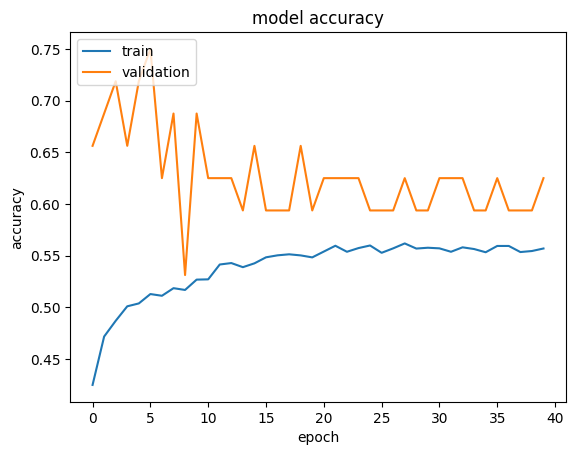

In [55]:
plt.plot(history_efficient.history["accuracy"])
plt.plot(history_efficient.history["val_accuracy"])
plt.title("model accuracy")
plt.ylabel("accuracy")
plt.xlabel("epoch")
plt.legend(["train", "validation"], loc="upper left")
plt.show()

### **Evaluating the EfficientnetNet Model**


In [56]:
# Calculate the number of steps for the entire test set to be processed
test_steps = test_generator.samples // batch_size

# If the number of samples isn't a multiple of the batch size,
# you have one more batch with the remaining samples
if test_generator.samples % batch_size > 0:
    test_steps += 1

# Evaluating the model on the test set
evaluation_results = new_efficient_model.evaluate(test_generator, steps=test_steps)
print(f"Loss: {evaluation_results[0]}, Accuracy: {evaluation_results[1]}")

1/4 [======>.......................] - ETA: 1s - loss: 0.7478 - accuracy: 0.6875

4/4 [==============================] - 1s 6ms/step - loss: 0.9041 - accuracy: 0.5703


Loss: 0.9040679931640625, Accuracy: 0.5703125


### **Plotting the confusion matrix**


1/4 [======>.......................] - ETA: 1s

4/4 [==============================] - 1s 6ms/step


              precision    recall  f1-score   support

       happy       0.63      0.69      0.66        32
     neutral       0.38      0.28      0.32        32
         sad       0.51      0.62      0.56        32
    surprise       0.73      0.69      0.71        32

    accuracy                           0.57       128
   macro avg       0.56      0.57      0.56       128
weighted avg       0.56      0.57      0.56       128



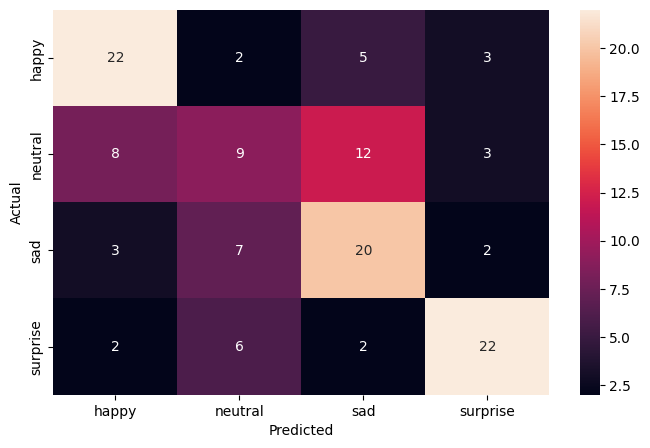

In [57]:
pred_probabilities = new_efficient_model.predict(test_generator, steps=test_steps)
pred = np.argmax(pred_probabilities, axis=1)

# Getting the true labels from the generator
y_true = test_generator.classes

# Printing the classification report with actual emotion labels
print(classification_report(y_true, pred, target_names=CATEGORIES))

# Plotting the heatmap using confusion matrix
cm = confusion_matrix(y_true, pred)
plt.figure(figsize=(8, 5))
sns.heatmap(cm, annot=True, fmt=".0f", xticklabels=CATEGORIES, yticklabels=CATEGORIES)
plt.ylabel("Actual")
plt.xlabel("Predicted")
plt.show()

**Observations and Insights:\_\_**

**Note: You can even go back and build your own architecture on top of the VGG16 Transfer layer and see if you can improve the performance.**


**Think About It:**

- What is your overall performance of these Transfer Learning Architectures? Can we draw a comparison of these models' performances. Are we satisfied with the accuracies that we have received?
- Do you think our issue lies with 'rgb' color_mode?


Now that we have tried multiple pre-trained models, let's build a complex CNN architecture and see if we can get better performance.


## **Building a Complex Neural Network Architecture**


In this section, we will build a more complex Convolutional Neural Network Model that has close to as many parameters as we had in our Transfer Learning Models. However, we will have only 1 input channel for our input images.


## **Creating our Data Loaders**

In this section, we are creating data loaders which we will use as inputs to the more Complicated Convolutional Neural Network. We will go ahead with color_mode = 'grayscale'.


In [58]:
# Set this to 'grayscale' as the images are in grayscale
color_mode = "grayscale"
color_layers = 1
# As we have checked, all images are 48x48, we will set the img_width and img_height to 48
img_width, img_height = 48, 48
# A batch size of 32 is appropriate for this dataset provide to provide a good balance
# between the model's ability to generalize (avoid overfitting) and computational efficiency.
batch_size = 32

# Training Data Augmentation
train_datagen = ImageDataGenerator(
    preprocessing_function=preprocess_input,
    rotation_range=20,  # Slight rotation to introduce variability without distorting emotion features
    width_shift_range=0.1,  # Slight horizontal shifts to simulate off-center faces
    height_shift_range=0.1,  # Slight vertical shifts to account for different heights/angles
    shear_range=0.1,  # Small shear transformations for slight perspective changes
    zoom_range=0.1,  # Small zoom in/out to simulate closer or further away faces
    horizontal_flip=True,  # Faces are symmetric; flipping can simulate looking from another direction
    fill_mode="nearest",  # 'nearest' interpolation for filling in new pixels after a transformation
)

# Validation and Testing Data should not be augmented!
validation_datagen = ImageDataGenerator(preprocessing_function=preprocess_input)
test_datagen = ImageDataGenerator(preprocessing_function=preprocess_input)

# Assuming train_dir, validation_dir, and test_dir should follow the structure in DATADIR and SUBDIRS
train_dir = os.path.join(DATADIR, SUBDIRS_DICT["train"])
validation_dir = os.path.join(DATADIR, SUBDIRS_DICT["validation"])
test_dir = os.path.join(DATADIR, SUBDIRS_DICT["test"])

# Train Generator
train_generator = train_datagen.flow_from_directory(
    train_dir,
    target_size=(img_width, img_height),
    batch_size=batch_size,
    color_mode=color_mode,  # Set to 'grayscale'
    class_mode="categorical",
)

# Validation Generator
validation_generator = validation_datagen.flow_from_directory(
    validation_dir,
    target_size=(img_width, img_height),
    batch_size=batch_size,
    color_mode=color_mode,  # Set to 'grayscale'
    class_mode="categorical",
    shuffle=False,  # shuffle=False to keep data in order for evaluation
)

# Testing Generator
test_generator = test_datagen.flow_from_directory(
    test_dir,
    target_size=(img_width, img_height),
    batch_size=batch_size,
    color_mode=color_mode,  # Set to 'grayscale'
    class_mode="categorical",
    shuffle=False,  # shuffle=False to keep data in order for testing
)

Found 15109 images belonging to 4 classes.


Found 4977 images belonging to 4 classes.


Found 128 images belonging to 4 classes.


### **Model Building**

- Try building a layer with 5 Convolutional Blocks and see if performance increases.


In [59]:
# Initializing a sequential model
model_complex = Sequential()

# Adding first conv layer
model_complex.add(Conv2D(filters=512, kernel_size=(5, 5), padding="Same",
                  input_shape=(img_width, img_height, color_layers), activation="relu"))
model_complex.add(MaxPooling2D(pool_size=(2, 2), strides=(2, 2)))
model_complex.add(Dropout(0.2))

# Adding second conv layer
model_complex.add(Conv2D(filters=256, kernel_size=(5, 5), padding="Same", activation="relu"))
model_complex.add(MaxPooling2D(pool_size=(2, 2), strides=(2, 2)))
model_complex.add(Dropout(0.2))

# Adding third conv layer
model_complex.add(Conv2D(filters=128, kernel_size=(5, 5), padding="Same", activation="relu"))
model_complex.add(MaxPooling2D(pool_size=(2, 2), strides=(2, 2)))
model_complex.add(Dropout(0.3))

# Adding fourth conv layer
model_complex.add(Conv2D(filters=64, kernel_size=(3, 3), padding="Same", activation="relu"))
model_complex.add(MaxPooling2D(pool_size=(2, 2), strides=(2, 2)))
model_complex.add(Dropout(0.3))

# Adding fifth conv layer
model_complex.add(Conv2D(filters=32, kernel_size=(3, 3), padding="Same", activation="relu"))
model_complex.add(MaxPooling2D(pool_size=(2, 2), strides=(2, 2)))
model_complex.add(Dropout(0.3))

# Flattening
model_complex.add(Flatten())
model_complex.add(Dense(64, activation="relu"))
model_complex.add(Dense(32, activation="relu"))

# Adding the output layer with 4 neurons and activation functions as softmax since this is a multi-class classification problem
model_complex.add(Dense(4, activation="softmax"))

# Using Adam Optimizer
optimizer = Adam(learning_rate=0.0005)

### **Compiling and Training the Model**


In [60]:
model_complex.compile(optimizer=optimizer, loss="categorical_crossentropy", metrics=["accuracy"])
model_complex.summary()

Model: "sequential_1"


_________________________________________________________________


 Layer (type)                Output Shape              Param #   


 conv2d (Conv2D)             (None, 48, 48, 512)       13312     


 max_pooling2d (MaxPooling2  (None, 24, 24, 512)       0         


 D)                                                              


 dropout_2 (Dropout)         (None, 24, 24, 512)       0         


 conv2d_1 (Conv2D)           (None, 24, 24, 256)       3277056   


 max_pooling2d_1 (MaxPoolin  (None, 12, 12, 256)       0         


 g2D)                                                            


 dropout_3 (Dropout)         (None, 12, 12, 256)       0         


 conv2d_2 (Conv2D)           (None, 12, 12, 128)       819328    


 max_pooling2d_2 (MaxPoolin  (None, 6, 6, 128)         0         


 g2D)                                                            


 dropout_4 (Dropout)         (None, 6, 6, 128)         0         


 conv2d_3 (Conv2D)           (None, 6, 6, 64)          73792     


 max_pooling2d_3 (MaxPoolin  (None, 3, 3, 64)          0         


 g2D)                                                            


 dropout_5 (Dropout)         (None, 3, 3, 64)          0         


 conv2d_4 (Conv2D)           (None, 3, 3, 32)          18464     


 max_pooling2d_4 (MaxPoolin  (None, 1, 1, 32)          0         


 g2D)                                                            


 dropout_6 (Dropout)         (None, 1, 1, 32)          0         


 flatten (Flatten)           (None, 32)                0         


 dense_3 (Dense)             (None, 64)                2112      


 dense_4 (Dense)             (None, 32)                2080      


 dense_5 (Dense)             (None, 4)                 132       


Total params: 4206276 (16.05 MB)


Trainable params: 4206276 (16.05 MB)


Non-trainable params: 0 (0.00 Byte)


_________________________________________________________________


In [61]:
# Get the current time
current_time = datetime.now().strftime("%Y%m%d-%H%M%S")

# Set up Early Stopping with a patience 7 but acting after at least 30 epochs
delayed_early_stopping = DelayedEarlyStopping(
    monitor="val_loss", patience=7, verbose=1, restore_best_weights=True, start_epoch=30
)

# Define the learning rate scheduler callback
reduce_lr = ReduceLROnPlateau(monitor="val_loss", factor=0.2, patience=5, min_lr=0.00001, verbose=1)

mc = ModelCheckpoint(
    f"{results_path}/best_model_complex_{current_time}.keras",
    monitor="val_accuracy",
    mode="max",
    verbose=1,
    save_best_only=True,
)

# Pulling a single large batch of random validation data for doing the validation after each epoch
validationX, validationY = validation_generator.next()

# Fitting the model with 40 epochs and using validation set
history_complex = model_complex.fit(
    train_generator,
    epochs=40,
    validation_data=(validationX, validationY),
    callbacks=[delayed_early_stopping, mc, reduce_lr],
)

Epoch 1/40


2024-03-18 10:57:34.846500: E tensorflow/core/grappler/optimizers/meta_optimizer.cc:961] layout failed: INVALID_ARGUMENT: Size of values 0 does not match size of permutation 4 @ fanin shape insequential_1/dropout_2/dropout/SelectV2-2-TransposeNHWCToNCHW-LayoutOptimizer


  1/473 [..............................] - ETA: 29:57 - loss: 10.2881 - accuracy: 0.2188

  4/473 [..............................] - ETA: 10s - loss: 13.7461 - accuracy: 0.2578  

  7/473 [..............................] - ETA: 10s - loss: 10.2199 - accuracy: 0.2857

 10/473 [..............................] - ETA: 10s - loss: 8.0802 - accuracy: 0.2562 

 13/473 [..............................] - ETA: 10s - loss: 6.6316 - accuracy: 0.2452

 16/473 [>.............................] - ETA: 10s - loss: 5.6530 - accuracy: 0.2480

 19/473 [>.............................] - ETA: 9s - loss: 4.9871 - accuracy: 0.2549 

 22/473 [>.............................] - ETA: 9s - loss: 4.5049 - accuracy: 0.2557

 25/473 [>.............................] - ETA: 9s - loss: 4.1323 - accuracy: 0.2562

 28/473 [>.............................] - ETA: 9s - loss: 3.8397 - accuracy: 0.2511

 31/473 [>.............................] - ETA: 9s - loss: 3.6134 - accuracy: 0.2480

 34/473 [=>............................] - ETA: 9s - loss: 3.4226 - accuracy: 0.2509

 37/473 [=>............................] - ETA: 9s - loss: 3.2635 - accuracy: 0.2483

 40/473 [=>............................] - ETA: 9s - loss: 3.1259 - accuracy: 0.2492

 43/473 [=>............................] - ETA: 9s - loss: 3.0042 - accuracy: 0.2522

 46/473 [=>............................] - ETA: 9s - loss: 2.9004 - accuracy: 0.2514

 49/473 [==>...........................] - ETA: 9s - loss: 2.8088 - accuracy: 0.2513

 52/473 [==>...........................] - ETA: 8s - loss: 2.7270 - accuracy: 0.2506

 55/473 [==>...........................] - ETA: 8s - loss: 2.6551 - accuracy: 0.2494

 58/473 [==>...........................] - ETA: 8s - loss: 2.5898 - accuracy: 0.2495

 61/473 [==>...........................] - ETA: 8s - loss: 2.5310 - accuracy: 0.2505

 64/473 [===>..........................] - ETA: 8s - loss: 2.4773 - accuracy: 0.2500

 67/473 [===>..........................] - ETA: 8s - loss: 2.4284 - accuracy: 0.2509

 70/473 [===>..........................] - ETA: 8s - loss: 2.3842 - accuracy: 0.2518

 73/473 [===>..........................] - ETA: 8s - loss: 2.3429 - accuracy: 0.2526

 76/473 [===>..........................] - ETA: 8s - loss: 2.3057 - accuracy: 0.2504

 79/473 [====>.........................] - ETA: 8s - loss: 2.2704 - accuracy: 0.2551

 82/473 [====>.........................] - ETA: 8s - loss: 2.2385 - accuracy: 0.2569

 85/473 [====>.........................] - ETA: 8s - loss: 2.2091 - accuracy: 0.2566

 88/473 [====>.........................] - ETA: 8s - loss: 2.1811 - accuracy: 0.2575

 91/473 [====>.........................] - ETA: 8s - loss: 2.1549 - accuracy: 0.2569

 94/473 [====>.........................] - ETA: 7s - loss: 2.1304 - accuracy: 0.2573

 97/473 [=====>........................] - ETA: 7s - loss: 2.1073 - accuracy: 0.2571

100/473 [=====>........................] - ETA: 7s - loss: 2.0858 - accuracy: 0.2562

103/473 [=====>........................] - ETA: 7s - loss: 2.0656 - accuracy: 0.2576

106/473 [=====>........................] - ETA: 7s - loss: 2.0468 - accuracy: 0.2577

109/473 [=====>........................] - ETA: 7s - loss: 2.0290 - accuracy: 0.2577

112/473 [======>.......................] - ETA: 7s - loss: 2.0117 - accuracy: 0.2595

115/473 [======>.......................] - ETA: 7s - loss: 1.9952 - accuracy: 0.2603

118/473 [======>.......................] - ETA: 7s - loss: 1.9801 - accuracy: 0.2587

121/473 [======>.......................] - ETA: 7s - loss: 1.9653 - accuracy: 0.2593

124/473 [======>.......................] - ETA: 7s - loss: 1.9511 - accuracy: 0.2596

127/473 [=======>......................] - ETA: 7s - loss: 1.9379 - accuracy: 0.2598

130/473 [=======>......................] - ETA: 7s - loss: 1.9249 - accuracy: 0.2620

133/473 [=======>......................] - ETA: 7s - loss: 1.9127 - accuracy: 0.2625

136/473 [=======>......................] - ETA: 7s - loss: 1.9014 - accuracy: 0.2617

139/473 [=======>......................] - ETA: 7s - loss: 1.8905 - accuracy: 0.2603

142/473 [========>.....................] - ETA: 6s - loss: 1.8799 - accuracy: 0.2612

145/473 [========>.....................] - ETA: 6s - loss: 1.8696 - accuracy: 0.2608

148/473 [========>.....................] - ETA: 6s - loss: 1.8601 - accuracy: 0.2591

151/473 [========>.....................] - ETA: 6s - loss: 1.8506 - accuracy: 0.2595

152/473 [========>.....................] - ETA: 8s - loss: 1.8501 - accuracy: 0.2595

155/473 [========>.....................] - ETA: 8s - loss: 1.8410 - accuracy: 0.2603

158/473 [=========>....................] - ETA: 8s - loss: 1.8322 - accuracy: 0.2607

161/473 [=========>....................] - ETA: 7s - loss: 1.8239 - accuracy: 0.2609

164/473 [=========>....................] - ETA: 7s - loss: 1.8159 - accuracy: 0.2605

167/473 [=========>....................] - ETA: 7s - loss: 1.8081 - accuracy: 0.2603

170/473 [=========>....................] - ETA: 7s - loss: 1.8011 - accuracy: 0.2586

173/473 [=========>....................] - ETA: 7s - loss: 1.7940 - accuracy: 0.2585

176/473 [==========>...................] - ETA: 7s - loss: 1.7871 - accuracy: 0.2576

179/473 [==========>...................] - ETA: 7s - loss: 1.7804 - accuracy: 0.2575

182/473 [==========>...................] - ETA: 7s - loss: 1.7738 - accuracy: 0.2574

185/473 [==========>...................] - ETA: 7s - loss: 1.7675 - accuracy: 0.2574

188/473 [==========>...................] - ETA: 7s - loss: 1.7613 - accuracy: 0.2580

191/473 [===========>..................] - ETA: 7s - loss: 1.7555 - accuracy: 0.2569

194/473 [===========>..................] - ETA: 6s - loss: 1.7497 - accuracy: 0.2572

197/473 [===========>..................] - ETA: 6s - loss: 1.7441 - accuracy: 0.2578

200/473 [===========>..................] - ETA: 6s - loss: 1.7388 - accuracy: 0.2580

203/473 [===========>..................] - ETA: 6s - loss: 1.7333 - accuracy: 0.2583

206/473 [============>.................] - ETA: 6s - loss: 1.7281 - accuracy: 0.2589

209/473 [============>.................] - ETA: 6s - loss: 1.7232 - accuracy: 0.2593

212/473 [============>.................] - ETA: 6s - loss: 1.7186 - accuracy: 0.2602

215/473 [============>.................] - ETA: 6s - loss: 1.7140 - accuracy: 0.2600

218/473 [============>.................] - ETA: 6s - loss: 1.7095 - accuracy: 0.2599

221/473 [=============>................] - ETA: 6s - loss: 1.7050 - accuracy: 0.2598

224/473 [=============>................] - ETA: 6s - loss: 1.7007 - accuracy: 0.2596

227/473 [=============>................] - ETA: 5s - loss: 1.6964 - accuracy: 0.2599

230/473 [=============>................] - ETA: 5s - loss: 1.6922 - accuracy: 0.2598

233/473 [=============>................] - ETA: 5s - loss: 1.6882 - accuracy: 0.2603

236/473 [=============>................] - ETA: 5s - loss: 1.6844 - accuracy: 0.2598

239/473 [==============>...............] - ETA: 5s - loss: 1.6806 - accuracy: 0.2599

242/473 [==============>...............] - ETA: 5s - loss: 1.6770 - accuracy: 0.2597

245/473 [==============>...............] - ETA: 5s - loss: 1.6735 - accuracy: 0.2591

248/473 [==============>...............] - ETA: 5s - loss: 1.6698 - accuracy: 0.2600

251/473 [==============>...............] - ETA: 5s - loss: 1.6666 - accuracy: 0.2597

254/473 [===============>..............] - ETA: 5s - loss: 1.6631 - accuracy: 0.2602

257/473 [===============>..............] - ETA: 5s - loss: 1.6597 - accuracy: 0.2609

260/473 [===============>..............] - ETA: 5s - loss: 1.6571 - accuracy: 0.2596

263/473 [===============>..............] - ETA: 4s - loss: 1.6542 - accuracy: 0.2590

266/473 [===============>..............] - ETA: 4s - loss: 1.6513 - accuracy: 0.2582

269/473 [================>.............] - ETA: 4s - loss: 1.6484 - accuracy: 0.2577

272/473 [================>.............] - ETA: 4s - loss: 1.6455 - accuracy: 0.2576

275/473 [================>.............] - ETA: 4s - loss: 1.6426 - accuracy: 0.2578

278/473 [================>.............] - ETA: 4s - loss: 1.6397 - accuracy: 0.2585

281/473 [================>.............] - ETA: 4s - loss: 1.6369 - accuracy: 0.2592

284/473 [=================>............] - ETA: 4s - loss: 1.6343 - accuracy: 0.2600

287/473 [=================>............] - ETA: 4s - loss: 1.6318 - accuracy: 0.2597

290/473 [=================>............] - ETA: 4s - loss: 1.6293 - accuracy: 0.2595

293/473 [=================>............] - ETA: 4s - loss: 1.6267 - accuracy: 0.2585

296/473 [=================>............] - ETA: 4s - loss: 1.6242 - accuracy: 0.2584

299/473 [=================>............] - ETA: 4s - loss: 1.6218 - accuracy: 0.2586

302/473 [==================>...........] - ETA: 3s - loss: 1.6195 - accuracy: 0.2586

305/473 [==================>...........] - ETA: 3s - loss: 1.6173 - accuracy: 0.2579

308/473 [==================>...........] - ETA: 3s - loss: 1.6150 - accuracy: 0.2580

311/473 [==================>...........] - ETA: 3s - loss: 1.6127 - accuracy: 0.2580

314/473 [==================>...........] - ETA: 3s - loss: 1.6105 - accuracy: 0.2582

317/473 [===================>..........] - ETA: 3s - loss: 1.6085 - accuracy: 0.2581

320/473 [===================>..........] - ETA: 3s - loss: 1.6067 - accuracy: 0.2584

323/473 [===================>..........] - ETA: 3s - loss: 1.6043 - accuracy: 0.2594

326/473 [===================>..........] - ETA: 3s - loss: 1.6022 - accuracy: 0.2597

329/473 [===================>..........] - ETA: 3s - loss: 1.6001 - accuracy: 0.2603

332/473 [====================>.........] - ETA: 3s - loss: 1.5984 - accuracy: 0.2597

335/473 [====================>.........] - ETA: 3s - loss: 1.5966 - accuracy: 0.2597

338/473 [====================>.........] - ETA: 3s - loss: 1.5948 - accuracy: 0.2596

341/473 [====================>.........] - ETA: 3s - loss: 1.5929 - accuracy: 0.2600

344/473 [====================>.........] - ETA: 2s - loss: 1.5910 - accuracy: 0.2603

347/473 [=====================>........] - ETA: 2s - loss: 1.5891 - accuracy: 0.2603

350/473 [=====================>........] - ETA: 2s - loss: 1.5873 - accuracy: 0.2608

353/473 [=====================>........] - ETA: 2s - loss: 1.5856 - accuracy: 0.2608

356/473 [=====================>........] - ETA: 2s - loss: 1.5839 - accuracy: 0.2609

359/473 [=====================>........] - ETA: 2s - loss: 1.5823 - accuracy: 0.2609

362/473 [=====================>........] - ETA: 2s - loss: 1.5807 - accuracy: 0.2610

365/473 [======================>.......] - ETA: 2s - loss: 1.5789 - accuracy: 0.2616

368/473 [======================>.......] - ETA: 2s - loss: 1.5773 - accuracy: 0.2617

371/473 [======================>.......] - ETA: 2s - loss: 1.5758 - accuracy: 0.2614

374/473 [======================>.......] - ETA: 2s - loss: 1.5744 - accuracy: 0.2608

377/473 [======================>.......] - ETA: 2s - loss: 1.5727 - accuracy: 0.2609

380/473 [=======================>......] - ETA: 2s - loss: 1.5712 - accuracy: 0.2609

383/473 [=======================>......] - ETA: 2s - loss: 1.5698 - accuracy: 0.2608

386/473 [=======================>......] - ETA: 1s - loss: 1.5683 - accuracy: 0.2611

389/473 [=======================>......] - ETA: 1s - loss: 1.5670 - accuracy: 0.2616

392/473 [=======================>......] - ETA: 1s - loss: 1.5655 - accuracy: 0.2619

395/473 [========================>.....] - ETA: 1s - loss: 1.5640 - accuracy: 0.2626

398/473 [========================>.....] - ETA: 1s - loss: 1.5626 - accuracy: 0.2631

401/473 [========================>.....] - ETA: 1s - loss: 1.5612 - accuracy: 0.2634

404/473 [========================>.....] - ETA: 1s - loss: 1.5603 - accuracy: 0.2624

407/473 [========================>.....] - ETA: 1s - loss: 1.5591 - accuracy: 0.2618

410/473 [=========================>....] - ETA: 1s - loss: 1.5579 - accuracy: 0.2617

413/473 [=========================>....] - ETA: 1s - loss: 1.5566 - accuracy: 0.2614

416/473 [=========================>....] - ETA: 1s - loss: 1.5553 - accuracy: 0.2616

419/473 [=========================>....] - ETA: 1s - loss: 1.5539 - accuracy: 0.2619

422/473 [=========================>....] - ETA: 1s - loss: 1.5527 - accuracy: 0.2621

425/473 [=========================>....] - ETA: 1s - loss: 1.5517 - accuracy: 0.2618

428/473 [==========================>...] - ETA: 1s - loss: 1.5505 - accuracy: 0.2620

431/473 [==========================>...] - ETA: 0s - loss: 1.5493 - accuracy: 0.2620

434/473 [==========================>...] - ETA: 0s - loss: 1.5480 - accuracy: 0.2625

437/473 [==========================>...] - ETA: 0s - loss: 1.5470 - accuracy: 0.2622

440/473 [==========================>...] - ETA: 0s - loss: 1.5461 - accuracy: 0.2623

443/473 [===========================>..] - ETA: 0s - loss: 1.5452 - accuracy: 0.2622

446/473 [===========================>..] - ETA: 0s - loss: 1.5441 - accuracy: 0.2623

449/473 [===========================>..] - ETA: 0s - loss: 1.5431 - accuracy: 0.2623

452/473 [===========================>..] - ETA: 0s - loss: 1.5421 - accuracy: 0.2623

455/473 [===========================>..] - ETA: 0s - loss: 1.5409 - accuracy: 0.2624

458/473 [============================>.] - ETA: 0s - loss: 1.5398 - accuracy: 0.2627

461/473 [============================>.] - ETA: 0s - loss: 1.5388 - accuracy: 0.2628

464/473 [============================>.] - ETA: 0s - loss: 1.5379 - accuracy: 0.2625

467/473 [============================>.] - ETA: 0s - loss: 1.5368 - accuracy: 0.2627

470/473 [============================>.] - ETA: 0s - loss: 1.5360 - accuracy: 0.2626

473/473 [==============================] - ETA: 0s - loss: 1.5351 - accuracy: 0.2628


Epoch 1: val_accuracy improved from -inf to 0.75000, saving model to /home/iamtxena/sandbox/mit-ai/capstone/Facial_Emotion_Recognition/results/best_model_complex_20240318-105734.keras


473/473 [==============================] - 15s 23ms/step - loss: 1.5351 - accuracy: 0.2628 - val_loss: 1.3118 - val_accuracy: 0.7500 - lr: 5.0000e-04


Epoch 2/40


  1/473 [..............................] - ETA: 19s - loss: 1.3945 - accuracy: 0.2500

  4/473 [..............................] - ETA: 9s - loss: 1.3905 - accuracy: 0.2578 

  7/473 [..............................] - ETA: 9s - loss: 1.3997 - accuracy: 0.2321

 10/473 [..............................] - ETA: 9s - loss: 1.3972 - accuracy: 0.2156

 13/473 [..............................] - ETA: 9s - loss: 1.3961 - accuracy: 0.2380

 16/473 [>.............................] - ETA: 9s - loss: 1.3932 - accuracy: 0.2500

 19/473 [>.............................] - ETA: 9s - loss: 1.3920 - accuracy: 0.2467

 22/473 [>.............................] - ETA: 9s - loss: 1.3915 - accuracy: 0.2543

 25/473 [>.............................] - ETA: 9s - loss: 1.3896 - accuracy: 0.2537

 28/473 [>.............................] - ETA: 9s - loss: 1.3889 - accuracy: 0.2589

 31/473 [>.............................] - ETA: 9s - loss: 1.3880 - accuracy: 0.2581

 34/473 [=>............................] - ETA: 9s - loss: 1.3873 - accuracy: 0.2638

 37/473 [=>............................] - ETA: 9s - loss: 1.3871 - accuracy: 0.2618

 40/473 [=>............................] - ETA: 9s - loss: 1.3865 - accuracy: 0.2680

 43/473 [=>............................] - ETA: 8s - loss: 1.3861 - accuracy: 0.2674

 46/473 [=>............................] - ETA: 8s - loss: 1.3855 - accuracy: 0.2697

 49/473 [==>...........................] - ETA: 8s - loss: 1.3855 - accuracy: 0.2723

 52/473 [==>...........................] - ETA: 8s - loss: 1.3906 - accuracy: 0.2674

 55/473 [==>...........................] - ETA: 8s - loss: 1.3908 - accuracy: 0.2653

 58/473 [==>...........................] - ETA: 8s - loss: 1.3893 - accuracy: 0.2683

 61/473 [==>...........................] - ETA: 8s - loss: 1.3892 - accuracy: 0.2674

 64/473 [===>..........................] - ETA: 8s - loss: 1.3889 - accuracy: 0.2715

 67/473 [===>..........................] - ETA: 8s - loss: 1.3886 - accuracy: 0.2696

 70/473 [===>..........................] - ETA: 8s - loss: 1.3878 - accuracy: 0.2719

 73/473 [===>..........................] - ETA: 8s - loss: 1.3886 - accuracy: 0.2710

 76/473 [===>..........................] - ETA: 8s - loss: 1.3894 - accuracy: 0.2664

 79/473 [====>.........................] - ETA: 8s - loss: 1.3894 - accuracy: 0.2650

 82/473 [====>.........................] - ETA: 8s - loss: 1.3896 - accuracy: 0.2652

 85/473 [====>.........................] - ETA: 8s - loss: 1.3900 - accuracy: 0.2651

 88/473 [====>.........................] - ETA: 8s - loss: 1.3908 - accuracy: 0.2617

 91/473 [====>.........................] - ETA: 7s - loss: 1.3899 - accuracy: 0.2637

 94/473 [====>.........................] - ETA: 7s - loss: 1.3900 - accuracy: 0.2630

 97/473 [=====>........................] - ETA: 7s - loss: 1.3898 - accuracy: 0.2645

100/473 [=====>........................] - ETA: 7s - loss: 1.3902 - accuracy: 0.2637

103/473 [=====>........................] - ETA: 7s - loss: 1.3897 - accuracy: 0.2643

106/473 [=====>........................] - ETA: 7s - loss: 1.3895 - accuracy: 0.2647

109/473 [=====>........................] - ETA: 7s - loss: 1.3893 - accuracy: 0.2640

112/473 [======>.......................] - ETA: 7s - loss: 1.3888 - accuracy: 0.2640

115/473 [======>.......................] - ETA: 7s - loss: 1.3890 - accuracy: 0.2628

118/473 [======>.......................] - ETA: 7s - loss: 1.3888 - accuracy: 0.2643

121/473 [======>.......................] - ETA: 7s - loss: 1.3886 - accuracy: 0.2639

124/473 [======>.......................] - ETA: 7s - loss: 1.3885 - accuracy: 0.2634

127/473 [=======>......................] - ETA: 7s - loss: 1.3885 - accuracy: 0.2628

130/473 [=======>......................] - ETA: 7s - loss: 1.3884 - accuracy: 0.2625

133/473 [=======>......................] - ETA: 7s - loss: 1.3885 - accuracy: 0.2617

136/473 [=======>......................] - ETA: 7s - loss: 1.3888 - accuracy: 0.2613

139/473 [=======>......................] - ETA: 7s - loss: 1.3889 - accuracy: 0.2615

142/473 [========>.....................] - ETA: 6s - loss: 1.3897 - accuracy: 0.2597

145/473 [========>.....................] - ETA: 6s - loss: 1.3895 - accuracy: 0.2595

148/473 [========>.....................] - ETA: 6s - loss: 1.3895 - accuracy: 0.2587

151/473 [========>.....................] - ETA: 6s - loss: 1.3893 - accuracy: 0.2589

154/473 [========>.....................] - ETA: 6s - loss: 1.3892 - accuracy: 0.2593

157/473 [========>.....................] - ETA: 6s - loss: 1.3892 - accuracy: 0.2604

160/473 [=========>....................] - ETA: 6s - loss: 1.3891 - accuracy: 0.2605

163/473 [=========>....................] - ETA: 6s - loss: 1.3890 - accuracy: 0.2607

166/473 [=========>....................] - ETA: 6s - loss: 1.3889 - accuracy: 0.2615

169/473 [=========>....................] - ETA: 6s - loss: 1.3888 - accuracy: 0.2609

172/473 [=========>....................] - ETA: 6s - loss: 1.3886 - accuracy: 0.2605

175/473 [==========>...................] - ETA: 6s - loss: 1.3885 - accuracy: 0.2596

178/473 [==========>...................] - ETA: 6s - loss: 1.3884 - accuracy: 0.2590

181/473 [==========>...................] - ETA: 6s - loss: 1.3885 - accuracy: 0.2595

184/473 [==========>...................] - ETA: 6s - loss: 1.3889 - accuracy: 0.2582

187/473 [==========>...................] - ETA: 5s - loss: 1.3888 - accuracy: 0.2590

190/473 [===========>..................] - ETA: 5s - loss: 1.3888 - accuracy: 0.2602

193/473 [===========>..................] - ETA: 5s - loss: 1.3885 - accuracy: 0.2610

196/473 [===========>..................] - ETA: 5s - loss: 1.3882 - accuracy: 0.2610

199/473 [===========>..................] - ETA: 5s - loss: 1.3881 - accuracy: 0.2613

202/473 [===========>..................] - ETA: 5s - loss: 1.3882 - accuracy: 0.2610

205/473 [============>.................] - ETA: 5s - loss: 1.3879 - accuracy: 0.2617

208/473 [============>.................] - ETA: 5s - loss: 1.3879 - accuracy: 0.2614

211/473 [============>.................] - ETA: 5s - loss: 1.3876 - accuracy: 0.2624

214/473 [============>.................] - ETA: 5s - loss: 1.3875 - accuracy: 0.2629

217/473 [============>.................] - ETA: 5s - loss: 1.3875 - accuracy: 0.2621

220/473 [============>.................] - ETA: 5s - loss: 1.3876 - accuracy: 0.2621

223/473 [=============>................] - ETA: 5s - loss: 1.3877 - accuracy: 0.2619

226/473 [=============>................] - ETA: 5s - loss: 1.3877 - accuracy: 0.2624

229/473 [=============>................] - ETA: 5s - loss: 1.3874 - accuracy: 0.2624

232/473 [=============>................] - ETA: 5s - loss: 1.3873 - accuracy: 0.2628

235/473 [=============>................] - ETA: 4s - loss: 1.3872 - accuracy: 0.2633

238/473 [==============>...............] - ETA: 4s - loss: 1.3872 - accuracy: 0.2633

241/473 [==============>...............] - ETA: 4s - loss: 1.3873 - accuracy: 0.2623

244/473 [==============>...............] - ETA: 4s - loss: 1.3874 - accuracy: 0.2623

247/473 [==============>...............] - ETA: 4s - loss: 1.3873 - accuracy: 0.2629

250/473 [==============>...............] - ETA: 4s - loss: 1.3872 - accuracy: 0.2631

254/473 [===============>..............] - ETA: 4s - loss: 1.3874 - accuracy: 0.2623

257/473 [===============>..............] - ETA: 4s - loss: 1.3872 - accuracy: 0.2628

260/473 [===============>..............] - ETA: 4s - loss: 1.3870 - accuracy: 0.2629

263/473 [===============>..............] - ETA: 4s - loss: 1.3877 - accuracy: 0.2628

266/473 [===============>..............] - ETA: 4s - loss: 1.3879 - accuracy: 0.2628

269/473 [================>.............] - ETA: 4s - loss: 1.3881 - accuracy: 0.2624

272/473 [================>.............] - ETA: 4s - loss: 1.3882 - accuracy: 0.2621

275/473 [================>.............] - ETA: 4s - loss: 1.3883 - accuracy: 0.2617

278/473 [================>.............] - ETA: 4s - loss: 1.3881 - accuracy: 0.2616

281/473 [================>.............] - ETA: 3s - loss: 1.3881 - accuracy: 0.2621

284/473 [=================>............] - ETA: 3s - loss: 1.3881 - accuracy: 0.2616

287/473 [=================>............] - ETA: 3s - loss: 1.3878 - accuracy: 0.2624

290/473 [=================>............] - ETA: 3s - loss: 1.3878 - accuracy: 0.2627

293/473 [=================>............] - ETA: 3s - loss: 1.3879 - accuracy: 0.2622

296/473 [=================>............] - ETA: 3s - loss: 1.3876 - accuracy: 0.2631

299/473 [=================>............] - ETA: 3s - loss: 1.3875 - accuracy: 0.2632

302/473 [==================>...........] - ETA: 3s - loss: 1.3874 - accuracy: 0.2639

305/473 [==================>...........] - ETA: 3s - loss: 1.3874 - accuracy: 0.2643

308/473 [==================>...........] - ETA: 3s - loss: 1.3875 - accuracy: 0.2642

311/473 [==================>...........] - ETA: 3s - loss: 1.3873 - accuracy: 0.2647

314/473 [==================>...........] - ETA: 3s - loss: 1.3873 - accuracy: 0.2650

317/473 [===================>..........] - ETA: 3s - loss: 1.3873 - accuracy: 0.2648

320/473 [===================>..........] - ETA: 3s - loss: 1.3875 - accuracy: 0.2641

323/473 [===================>..........] - ETA: 3s - loss: 1.3874 - accuracy: 0.2644

326/473 [===================>..........] - ETA: 3s - loss: 1.3873 - accuracy: 0.2645

329/473 [===================>..........] - ETA: 2s - loss: 1.3872 - accuracy: 0.2650

332/473 [====================>.........] - ETA: 2s - loss: 1.3870 - accuracy: 0.2649

335/473 [====================>.........] - ETA: 2s - loss: 1.3869 - accuracy: 0.2648

338/473 [====================>.........] - ETA: 2s - loss: 1.3868 - accuracy: 0.2649

341/473 [====================>.........] - ETA: 2s - loss: 1.3868 - accuracy: 0.2658

344/473 [====================>.........] - ETA: 2s - loss: 1.3867 - accuracy: 0.2655

347/473 [=====================>........] - ETA: 2s - loss: 1.3866 - accuracy: 0.2655

350/473 [=====================>........] - ETA: 2s - loss: 1.3865 - accuracy: 0.2652

353/473 [=====================>........] - ETA: 2s - loss: 1.3865 - accuracy: 0.2649

356/473 [=====================>........] - ETA: 2s - loss: 1.3864 - accuracy: 0.2647

359/473 [=====================>........] - ETA: 2s - loss: 1.3864 - accuracy: 0.2646

362/473 [=====================>........] - ETA: 2s - loss: 1.3864 - accuracy: 0.2647

365/473 [======================>.......] - ETA: 2s - loss: 1.3864 - accuracy: 0.2649

368/473 [======================>.......] - ETA: 2s - loss: 1.3864 - accuracy: 0.2651

371/473 [======================>.......] - ETA: 2s - loss: 1.3862 - accuracy: 0.2656

374/473 [======================>.......] - ETA: 2s - loss: 1.3862 - accuracy: 0.2650

377/473 [======================>.......] - ETA: 1s - loss: 1.3860 - accuracy: 0.2650

380/473 [=======================>......] - ETA: 1s - loss: 1.3859 - accuracy: 0.2655

383/473 [=======================>......] - ETA: 1s - loss: 1.3859 - accuracy: 0.2657

386/473 [=======================>......] - ETA: 1s - loss: 1.3859 - accuracy: 0.2656

389/473 [=======================>......] - ETA: 1s - loss: 1.3858 - accuracy: 0.2662

392/473 [=======================>......] - ETA: 1s - loss: 1.3858 - accuracy: 0.2657

395/473 [========================>.....] - ETA: 1s - loss: 1.3859 - accuracy: 0.2654

398/473 [========================>.....] - ETA: 1s - loss: 1.3863 - accuracy: 0.2655

401/473 [========================>.....] - ETA: 1s - loss: 1.3878 - accuracy: 0.2651

404/473 [========================>.....] - ETA: 1s - loss: 1.3878 - accuracy: 0.2651

407/473 [========================>.....] - ETA: 1s - loss: 1.3878 - accuracy: 0.2646

410/473 [=========================>....] - ETA: 1s - loss: 1.3877 - accuracy: 0.2650

413/473 [=========================>....] - ETA: 1s - loss: 1.3874 - accuracy: 0.2654

416/473 [=========================>....] - ETA: 1s - loss: 1.3872 - accuracy: 0.2659

419/473 [=========================>....] - ETA: 1s - loss: 1.3875 - accuracy: 0.2657

422/473 [=========================>....] - ETA: 1s - loss: 1.3877 - accuracy: 0.2653

425/473 [=========================>....] - ETA: 0s - loss: 1.3878 - accuracy: 0.2652

428/473 [==========================>...] - ETA: 0s - loss: 1.3878 - accuracy: 0.2656

431/473 [==========================>...] - ETA: 0s - loss: 1.3877 - accuracy: 0.2656

434/473 [==========================>...] - ETA: 0s - loss: 1.3878 - accuracy: 0.2659

437/473 [==========================>...] - ETA: 0s - loss: 1.3881 - accuracy: 0.2654

440/473 [==========================>...] - ETA: 0s - loss: 1.3880 - accuracy: 0.2656

443/473 [===========================>..] - ETA: 0s - loss: 1.3879 - accuracy: 0.2658

446/473 [===========================>..] - ETA: 0s - loss: 1.3879 - accuracy: 0.2661

449/473 [===========================>..] - ETA: 0s - loss: 1.3878 - accuracy: 0.2664

452/473 [===========================>..] - ETA: 0s - loss: 1.3879 - accuracy: 0.2660

455/473 [===========================>..] - ETA: 0s - loss: 1.3878 - accuracy: 0.2660

458/473 [============================>.] - ETA: 0s - loss: 1.3877 - accuracy: 0.2659

461/473 [============================>.] - ETA: 0s - loss: 1.3877 - accuracy: 0.2657

464/473 [============================>.] - ETA: 0s - loss: 1.3877 - accuracy: 0.2656

467/473 [============================>.] - ETA: 0s - loss: 1.3876 - accuracy: 0.2655

470/473 [============================>.] - ETA: 0s - loss: 1.3876 - accuracy: 0.2656

473/473 [==============================] - ETA: 0s - loss: 1.3874 - accuracy: 0.2657


Epoch 2: val_accuracy did not improve from 0.75000


473/473 [==============================] - 10s 21ms/step - loss: 1.3874 - accuracy: 0.2657 - val_loss: 1.3239 - val_accuracy: 0.0000e+00 - lr: 5.0000e-04


Epoch 3/40


  1/473 [..............................] - ETA: 19s - loss: 1.3593 - accuracy: 0.3125

  4/473 [..............................] - ETA: 9s - loss: 1.3917 - accuracy: 0.2891 

  7/473 [..............................] - ETA: 9s - loss: 1.3911 - accuracy: 0.2545

 10/473 [..............................] - ETA: 9s - loss: 1.3872 - accuracy: 0.2781

 13/473 [..............................] - ETA: 9s - loss: 1.3843 - accuracy: 0.2861

 16/473 [>.............................] - ETA: 9s - loss: 1.3813 - accuracy: 0.2949

 19/473 [>.............................] - ETA: 9s - loss: 1.3814 - accuracy: 0.2993

 22/473 [>.............................] - ETA: 9s - loss: 1.3809 - accuracy: 0.2983

 25/473 [>.............................] - ETA: 9s - loss: 1.3836 - accuracy: 0.2950

 28/473 [>.............................] - ETA: 9s - loss: 1.3827 - accuracy: 0.2913

 31/473 [>.............................] - ETA: 9s - loss: 1.3855 - accuracy: 0.2853

 34/473 [=>............................] - ETA: 9s - loss: 1.3853 - accuracy: 0.2868

 37/473 [=>............................] - ETA: 8s - loss: 1.3845 - accuracy: 0.2829

 40/473 [=>............................] - ETA: 8s - loss: 1.3833 - accuracy: 0.2812

 43/473 [=>............................] - ETA: 8s - loss: 1.3843 - accuracy: 0.2798

 46/473 [=>............................] - ETA: 8s - loss: 1.3835 - accuracy: 0.2853

 49/473 [==>...........................] - ETA: 8s - loss: 1.3834 - accuracy: 0.2768

 52/473 [==>...........................] - ETA: 8s - loss: 1.3834 - accuracy: 0.2800

 55/473 [==>...........................] - ETA: 8s - loss: 1.3834 - accuracy: 0.2824

 58/473 [==>...........................] - ETA: 8s - loss: 1.3833 - accuracy: 0.2786

 61/473 [==>...........................] - ETA: 8s - loss: 1.3838 - accuracy: 0.2751

 64/473 [===>..........................] - ETA: 8s - loss: 1.3840 - accuracy: 0.2759

 67/473 [===>..........................] - ETA: 8s - loss: 1.3835 - accuracy: 0.2775

 70/473 [===>..........................] - ETA: 8s - loss: 1.3827 - accuracy: 0.2790

 73/473 [===>..........................] - ETA: 8s - loss: 1.3840 - accuracy: 0.2825

 76/473 [===>..........................] - ETA: 8s - loss: 1.3879 - accuracy: 0.2854

 79/473 [====>.........................] - ETA: 8s - loss: 1.3881 - accuracy: 0.2848

 82/473 [====>.........................] - ETA: 8s - loss: 1.3888 - accuracy: 0.2816

 85/473 [====>.........................] - ETA: 8s - loss: 1.3890 - accuracy: 0.2816

 88/473 [====>.........................] - ETA: 7s - loss: 1.3890 - accuracy: 0.2805

 91/473 [====>.........................] - ETA: 7s - loss: 1.3896 - accuracy: 0.2788

 94/473 [====>.........................] - ETA: 7s - loss: 1.3893 - accuracy: 0.2799

 97/473 [=====>........................] - ETA: 7s - loss: 1.3889 - accuracy: 0.2806

100/473 [=====>........................] - ETA: 7s - loss: 1.3885 - accuracy: 0.2797

103/473 [=====>........................] - ETA: 7s - loss: 1.3882 - accuracy: 0.2779

106/473 [=====>........................] - ETA: 7s - loss: 1.3888 - accuracy: 0.2756

109/473 [=====>........................] - ETA: 7s - loss: 1.3885 - accuracy: 0.2735

112/473 [======>.......................] - ETA: 7s - loss: 1.3888 - accuracy: 0.2723

115/473 [======>.......................] - ETA: 7s - loss: 1.3884 - accuracy: 0.2745

118/473 [======>.......................] - ETA: 7s - loss: 1.3883 - accuracy: 0.2712

121/473 [======>.......................] - ETA: 7s - loss: 1.3879 - accuracy: 0.2712

124/473 [======>.......................] - ETA: 7s - loss: 1.3880 - accuracy: 0.2714

127/473 [=======>......................] - ETA: 7s - loss: 1.3877 - accuracy: 0.2724

130/473 [=======>......................] - ETA: 7s - loss: 1.3875 - accuracy: 0.2714

133/473 [=======>......................] - ETA: 7s - loss: 1.3873 - accuracy: 0.2730

136/473 [=======>......................] - ETA: 6s - loss: 1.3872 - accuracy: 0.2732

140/473 [=======>......................] - ETA: 6s - loss: 1.3871 - accuracy: 0.2713

143/473 [========>.....................] - ETA: 6s - loss: 1.3867 - accuracy: 0.2704

146/473 [========>.....................] - ETA: 6s - loss: 1.3868 - accuracy: 0.2700

149/473 [========>.....................] - ETA: 6s - loss: 1.3866 - accuracy: 0.2689

152/473 [========>.....................] - ETA: 6s - loss: 1.3868 - accuracy: 0.2673

155/473 [========>.....................] - ETA: 6s - loss: 1.3869 - accuracy: 0.2676

158/473 [=========>....................] - ETA: 6s - loss: 1.3868 - accuracy: 0.2678

161/473 [=========>....................] - ETA: 6s - loss: 1.3865 - accuracy: 0.2685

164/473 [=========>....................] - ETA: 6s - loss: 1.3865 - accuracy: 0.2678

167/473 [=========>....................] - ETA: 6s - loss: 1.3865 - accuracy: 0.2676

170/473 [=========>....................] - ETA: 6s - loss: 1.3859 - accuracy: 0.2697

173/473 [=========>....................] - ETA: 6s - loss: 1.3854 - accuracy: 0.2697

176/473 [==========>...................] - ETA: 6s - loss: 1.3853 - accuracy: 0.2698

179/473 [==========>...................] - ETA: 6s - loss: 1.3853 - accuracy: 0.2701

182/473 [==========>...................] - ETA: 6s - loss: 1.3849 - accuracy: 0.2710

185/473 [==========>...................] - ETA: 5s - loss: 1.3849 - accuracy: 0.2715

188/473 [==========>...................] - ETA: 5s - loss: 1.3849 - accuracy: 0.2708

191/473 [===========>..................] - ETA: 5s - loss: 1.3849 - accuracy: 0.2708

194/473 [===========>..................] - ETA: 5s - loss: 1.3849 - accuracy: 0.2699

197/473 [===========>..................] - ETA: 5s - loss: 1.3851 - accuracy: 0.2688

200/473 [===========>..................] - ETA: 5s - loss: 1.3849 - accuracy: 0.2674

203/473 [===========>..................] - ETA: 5s - loss: 1.3849 - accuracy: 0.2671

206/473 [============>.................] - ETA: 5s - loss: 1.3852 - accuracy: 0.2666

209/473 [============>.................] - ETA: 5s - loss: 1.3852 - accuracy: 0.2666

212/473 [============>.................] - ETA: 5s - loss: 1.3851 - accuracy: 0.2664

215/473 [============>.................] - ETA: 5s - loss: 1.3849 - accuracy: 0.2669

218/473 [============>.................] - ETA: 5s - loss: 1.3849 - accuracy: 0.2662

221/473 [=============>................] - ETA: 5s - loss: 1.3850 - accuracy: 0.2660

224/473 [=============>................] - ETA: 5s - loss: 1.3847 - accuracy: 0.2666

227/473 [=============>................] - ETA: 5s - loss: 1.3848 - accuracy: 0.2660

230/473 [=============>................] - ETA: 5s - loss: 1.3847 - accuracy: 0.2665

233/473 [=============>................] - ETA: 4s - loss: 1.3846 - accuracy: 0.2664

236/473 [=============>................] - ETA: 4s - loss: 1.3845 - accuracy: 0.2668

239/473 [==============>...............] - ETA: 4s - loss: 1.3843 - accuracy: 0.2662

242/473 [==============>...............] - ETA: 4s - loss: 1.3843 - accuracy: 0.2658

245/473 [==============>...............] - ETA: 4s - loss: 1.3844 - accuracy: 0.2655

248/473 [==============>...............] - ETA: 4s - loss: 1.3841 - accuracy: 0.2654

251/473 [==============>...............] - ETA: 4s - loss: 1.3843 - accuracy: 0.2655

254/473 [===============>..............] - ETA: 4s - loss: 1.3844 - accuracy: 0.2648

257/473 [===============>..............] - ETA: 4s - loss: 1.3843 - accuracy: 0.2644

260/473 [===============>..............] - ETA: 4s - loss: 1.3844 - accuracy: 0.2634

263/473 [===============>..............] - ETA: 4s - loss: 1.3842 - accuracy: 0.2633

266/473 [===============>..............] - ETA: 4s - loss: 1.3842 - accuracy: 0.2634

269/473 [================>.............] - ETA: 4s - loss: 1.3839 - accuracy: 0.2636

272/473 [================>.............] - ETA: 4s - loss: 1.3839 - accuracy: 0.2647

275/473 [================>.............] - ETA: 4s - loss: 1.3838 - accuracy: 0.2646

278/473 [================>.............] - ETA: 4s - loss: 1.3838 - accuracy: 0.2645

281/473 [================>.............] - ETA: 3s - loss: 1.3839 - accuracy: 0.2648

284/473 [=================>............] - ETA: 3s - loss: 1.3840 - accuracy: 0.2641

287/473 [=================>............] - ETA: 3s - loss: 1.3838 - accuracy: 0.2644

290/473 [=================>............] - ETA: 3s - loss: 1.3837 - accuracy: 0.2650

293/473 [=================>............] - ETA: 3s - loss: 1.3835 - accuracy: 0.2654

296/473 [=================>............] - ETA: 3s - loss: 1.3836 - accuracy: 0.2644

299/473 [=================>............] - ETA: 3s - loss: 1.3836 - accuracy: 0.2638

302/473 [==================>...........] - ETA: 3s - loss: 1.3837 - accuracy: 0.2636

305/473 [==================>...........] - ETA: 3s - loss: 1.3836 - accuracy: 0.2631

308/473 [==================>...........] - ETA: 3s - loss: 1.3837 - accuracy: 0.2638

311/473 [==================>...........] - ETA: 3s - loss: 1.3839 - accuracy: 0.2639

314/473 [==================>...........] - ETA: 3s - loss: 1.3839 - accuracy: 0.2642

317/473 [===================>..........] - ETA: 3s - loss: 1.3838 - accuracy: 0.2649

320/473 [===================>..........] - ETA: 3s - loss: 1.3837 - accuracy: 0.2652

323/473 [===================>..........] - ETA: 3s - loss: 1.3837 - accuracy: 0.2653

326/473 [===================>..........] - ETA: 3s - loss: 1.3835 - accuracy: 0.2655

329/473 [===================>..........] - ETA: 2s - loss: 1.3834 - accuracy: 0.2659

332/473 [====================>.........] - ETA: 2s - loss: 1.3834 - accuracy: 0.2657

335/473 [====================>.........] - ETA: 2s - loss: 1.3835 - accuracy: 0.2657

338/473 [====================>.........] - ETA: 2s - loss: 1.3837 - accuracy: 0.2658

341/473 [====================>.........] - ETA: 2s - loss: 1.3839 - accuracy: 0.2652

344/473 [====================>.........] - ETA: 2s - loss: 1.3837 - accuracy: 0.2654

347/473 [=====================>........] - ETA: 2s - loss: 1.3837 - accuracy: 0.2648

350/473 [=====================>........] - ETA: 2s - loss: 1.3839 - accuracy: 0.2645

353/473 [=====================>........] - ETA: 2s - loss: 1.3838 - accuracy: 0.2650

356/473 [=====================>........] - ETA: 2s - loss: 1.3839 - accuracy: 0.2645

359/473 [=====================>........] - ETA: 2s - loss: 1.3839 - accuracy: 0.2646

362/473 [=====================>........] - ETA: 2s - loss: 1.3839 - accuracy: 0.2642

365/473 [======================>.......] - ETA: 2s - loss: 1.3841 - accuracy: 0.2636

368/473 [======================>.......] - ETA: 2s - loss: 1.3841 - accuracy: 0.2637

371/473 [======================>.......] - ETA: 2s - loss: 1.3841 - accuracy: 0.2637

374/473 [======================>.......] - ETA: 2s - loss: 1.3840 - accuracy: 0.2633

377/473 [======================>.......] - ETA: 1s - loss: 1.3841 - accuracy: 0.2629

380/473 [=======================>......] - ETA: 1s - loss: 1.3839 - accuracy: 0.2632

383/473 [=======================>......] - ETA: 1s - loss: 1.3840 - accuracy: 0.2636

386/473 [=======================>......] - ETA: 1s - loss: 1.3840 - accuracy: 0.2639

389/473 [=======================>......] - ETA: 1s - loss: 1.3841 - accuracy: 0.2633

392/473 [=======================>......] - ETA: 1s - loss: 1.3843 - accuracy: 0.2628

395/473 [========================>.....] - ETA: 1s - loss: 1.3843 - accuracy: 0.2624

398/473 [========================>.....] - ETA: 1s - loss: 1.3842 - accuracy: 0.2630

401/473 [========================>.....] - ETA: 1s - loss: 1.3841 - accuracy: 0.2631

404/473 [========================>.....] - ETA: 1s - loss: 1.3841 - accuracy: 0.2635

407/473 [========================>.....] - ETA: 1s - loss: 1.3845 - accuracy: 0.2638

410/473 [=========================>....] - ETA: 1s - loss: 1.3849 - accuracy: 0.2643

413/473 [=========================>....] - ETA: 1s - loss: 1.3850 - accuracy: 0.2638

416/473 [=========================>....] - ETA: 1s - loss: 1.3850 - accuracy: 0.2638

419/473 [=========================>....] - ETA: 1s - loss: 1.3850 - accuracy: 0.2644

422/473 [=========================>....] - ETA: 1s - loss: 1.3849 - accuracy: 0.2645

425/473 [=========================>....] - ETA: 0s - loss: 1.3849 - accuracy: 0.2646

428/473 [==========================>...] - ETA: 0s - loss: 1.3849 - accuracy: 0.2644

431/473 [==========================>...] - ETA: 0s - loss: 1.3848 - accuracy: 0.2646

434/473 [==========================>...] - ETA: 0s - loss: 1.3848 - accuracy: 0.2647

437/473 [==========================>...] - ETA: 0s - loss: 1.3848 - accuracy: 0.2644

440/473 [==========================>...] - ETA: 0s - loss: 1.3849 - accuracy: 0.2639

443/473 [===========================>..] - ETA: 0s - loss: 1.3848 - accuracy: 0.2639

446/473 [===========================>..] - ETA: 0s - loss: 1.3847 - accuracy: 0.2640

449/473 [===========================>..] - ETA: 0s - loss: 1.3846 - accuracy: 0.2644

452/473 [===========================>..] - ETA: 0s - loss: 1.3846 - accuracy: 0.2646

455/473 [===========================>..] - ETA: 0s - loss: 1.3847 - accuracy: 0.2646

458/473 [============================>.] - ETA: 0s - loss: 1.3848 - accuracy: 0.2647

461/473 [============================>.] - ETA: 0s - loss: 1.3848 - accuracy: 0.2646

464/473 [============================>.] - ETA: 0s - loss: 1.3847 - accuracy: 0.2652

467/473 [============================>.] - ETA: 0s - loss: 1.3846 - accuracy: 0.2653

470/473 [============================>.] - ETA: 0s - loss: 1.3846 - accuracy: 0.2655

473/473 [==============================] - ETA: 0s - loss: 1.3845 - accuracy: 0.2657


Epoch 3: val_accuracy did not improve from 0.75000


473/473 [==============================] - 10s 21ms/step - loss: 1.3845 - accuracy: 0.2657 - val_loss: 1.3560 - val_accuracy: 0.0000e+00 - lr: 5.0000e-04


Epoch 4/40


  1/473 [..............................] - ETA: 18s - loss: 1.3667 - accuracy: 0.2500

  4/473 [..............................] - ETA: 9s - loss: 1.3808 - accuracy: 0.2578 

  7/473 [..............................] - ETA: 9s - loss: 1.3712 - accuracy: 0.2902

 10/473 [..............................] - ETA: 9s - loss: 1.3812 - accuracy: 0.2656

 13/473 [..............................] - ETA: 9s - loss: 1.3768 - accuracy: 0.2764

 16/473 [>.............................] - ETA: 9s - loss: 1.3764 - accuracy: 0.2891

 19/473 [>.............................] - ETA: 9s - loss: 1.3805 - accuracy: 0.2829

 22/473 [>.............................] - ETA: 9s - loss: 1.3808 - accuracy: 0.2812

 25/473 [>.............................] - ETA: 9s - loss: 1.3788 - accuracy: 0.2850

 28/473 [>.............................] - ETA: 9s - loss: 1.3798 - accuracy: 0.2846

 31/473 [>.............................] - ETA: 9s - loss: 1.3805 - accuracy: 0.2843

 34/473 [=>............................] - ETA: 9s - loss: 1.3815 - accuracy: 0.2840

 37/473 [=>............................] - ETA: 9s - loss: 1.3806 - accuracy: 0.2872

 40/473 [=>............................] - ETA: 9s - loss: 1.3813 - accuracy: 0.2828

 43/473 [=>............................] - ETA: 8s - loss: 1.3801 - accuracy: 0.2849

 46/473 [=>............................] - ETA: 8s - loss: 1.3803 - accuracy: 0.2840

 49/473 [==>...........................] - ETA: 8s - loss: 1.3794 - accuracy: 0.2825

 52/473 [==>...........................] - ETA: 8s - loss: 1.3804 - accuracy: 0.2782

 55/473 [==>...........................] - ETA: 8s - loss: 1.3796 - accuracy: 0.2818

 58/473 [==>...........................] - ETA: 8s - loss: 1.3805 - accuracy: 0.2796

 61/473 [==>...........................] - ETA: 8s - loss: 1.3801 - accuracy: 0.2828

 64/473 [===>..........................] - ETA: 8s - loss: 1.3806 - accuracy: 0.2788

 67/473 [===>..........................] - ETA: 8s - loss: 1.3810 - accuracy: 0.2803

 70/473 [===>..........................] - ETA: 8s - loss: 1.3811 - accuracy: 0.2808

 73/473 [===>..........................] - ETA: 8s - loss: 1.3809 - accuracy: 0.2770

 76/473 [===>..........................] - ETA: 8s - loss: 1.3801 - accuracy: 0.2792

 79/473 [====>.........................] - ETA: 8s - loss: 1.3804 - accuracy: 0.2765

 82/473 [====>.........................] - ETA: 8s - loss: 1.3813 - accuracy: 0.2744

 85/473 [====>.........................] - ETA: 8s - loss: 1.3804 - accuracy: 0.2768

 88/473 [====>.........................] - ETA: 7s - loss: 1.3805 - accuracy: 0.2784

 91/473 [====>.........................] - ETA: 7s - loss: 1.3806 - accuracy: 0.2782

 94/473 [====>.........................] - ETA: 7s - loss: 1.3806 - accuracy: 0.2779

 97/473 [=====>........................] - ETA: 7s - loss: 1.3807 - accuracy: 0.2800

100/473 [=====>........................] - ETA: 7s - loss: 1.3808 - accuracy: 0.2791

103/473 [=====>........................] - ETA: 7s - loss: 1.3802 - accuracy: 0.2794

106/473 [=====>........................] - ETA: 7s - loss: 1.3805 - accuracy: 0.2798

109/473 [=====>........................] - ETA: 7s - loss: 1.3801 - accuracy: 0.2818

112/473 [======>.......................] - ETA: 7s - loss: 1.3805 - accuracy: 0.2796

115/473 [======>.......................] - ETA: 7s - loss: 1.3810 - accuracy: 0.2753

118/473 [======>.......................] - ETA: 7s - loss: 1.3809 - accuracy: 0.2749

121/473 [======>.......................] - ETA: 7s - loss: 1.3808 - accuracy: 0.2745

124/473 [======>.......................] - ETA: 7s - loss: 1.3810 - accuracy: 0.2727

127/473 [=======>......................] - ETA: 7s - loss: 1.3809 - accuracy: 0.2719

130/473 [=======>......................] - ETA: 7s - loss: 1.3808 - accuracy: 0.2714

133/473 [=======>......................] - ETA: 7s - loss: 1.3808 - accuracy: 0.2702

136/473 [=======>......................] - ETA: 6s - loss: 1.3809 - accuracy: 0.2693

139/473 [=======>......................] - ETA: 6s - loss: 1.3810 - accuracy: 0.2680

142/473 [========>.....................] - ETA: 6s - loss: 1.3813 - accuracy: 0.2667

145/473 [========>.....................] - ETA: 6s - loss: 1.3810 - accuracy: 0.2675

148/473 [========>.....................] - ETA: 6s - loss: 1.3807 - accuracy: 0.2675

151/473 [========>.....................] - ETA: 6s - loss: 1.3810 - accuracy: 0.2676

154/473 [========>.....................] - ETA: 6s - loss: 1.3806 - accuracy: 0.2685

157/473 [========>.....................] - ETA: 6s - loss: 1.3804 - accuracy: 0.2685

160/473 [=========>....................] - ETA: 6s - loss: 1.3809 - accuracy: 0.2678

163/473 [=========>....................] - ETA: 6s - loss: 1.3808 - accuracy: 0.2682

166/473 [=========>....................] - ETA: 6s - loss: 1.3806 - accuracy: 0.2679

169/473 [=========>....................] - ETA: 6s - loss: 1.3803 - accuracy: 0.2698

172/473 [=========>....................] - ETA: 6s - loss: 1.3800 - accuracy: 0.2707

175/473 [==========>...................] - ETA: 6s - loss: 1.3801 - accuracy: 0.2721

178/473 [==========>...................] - ETA: 6s - loss: 1.3807 - accuracy: 0.2707

181/473 [==========>...................] - ETA: 6s - loss: 1.3804 - accuracy: 0.2716

184/473 [==========>...................] - ETA: 5s - loss: 1.3815 - accuracy: 0.2711

187/473 [==========>...................] - ETA: 5s - loss: 1.3814 - accuracy: 0.2712

190/473 [===========>..................] - ETA: 5s - loss: 1.3814 - accuracy: 0.2714

193/473 [===========>..................] - ETA: 5s - loss: 1.3815 - accuracy: 0.2715

196/473 [===========>..................] - ETA: 5s - loss: 1.3813 - accuracy: 0.2709

199/473 [===========>..................] - ETA: 5s - loss: 1.3814 - accuracy: 0.2714

202/473 [===========>..................] - ETA: 5s - loss: 1.3814 - accuracy: 0.2717

205/473 [============>.................] - ETA: 5s - loss: 1.3813 - accuracy: 0.2712

208/473 [============>.................] - ETA: 5s - loss: 1.3813 - accuracy: 0.2706

211/473 [============>.................] - ETA: 5s - loss: 1.3813 - accuracy: 0.2709

214/473 [============>.................] - ETA: 5s - loss: 1.3811 - accuracy: 0.2712

217/473 [============>.................] - ETA: 5s - loss: 1.3807 - accuracy: 0.2723

220/473 [============>.................] - ETA: 5s - loss: 1.3805 - accuracy: 0.2733

223/473 [=============>................] - ETA: 5s - loss: 1.3802 - accuracy: 0.2737

226/473 [=============>................] - ETA: 5s - loss: 1.3801 - accuracy: 0.2734

229/473 [=============>................] - ETA: 5s - loss: 1.3800 - accuracy: 0.2731

232/473 [=============>................] - ETA: 4s - loss: 1.3798 - accuracy: 0.2740

235/473 [=============>................] - ETA: 4s - loss: 1.3799 - accuracy: 0.2735

238/473 [==============>...............] - ETA: 4s - loss: 1.3796 - accuracy: 0.2747

241/473 [==============>...............] - ETA: 4s - loss: 1.3795 - accuracy: 0.2755

244/473 [==============>...............] - ETA: 4s - loss: 1.3796 - accuracy: 0.2751

247/473 [==============>...............] - ETA: 4s - loss: 1.3796 - accuracy: 0.2749

250/473 [==============>...............] - ETA: 4s - loss: 1.3797 - accuracy: 0.2756

253/473 [===============>..............] - ETA: 4s - loss: 1.3796 - accuracy: 0.2757

256/473 [===============>..............] - ETA: 4s - loss: 1.3795 - accuracy: 0.2749

259/473 [===============>..............] - ETA: 4s - loss: 1.3795 - accuracy: 0.2757

262/473 [===============>..............] - ETA: 4s - loss: 1.3794 - accuracy: 0.2760

265/473 [===============>..............] - ETA: 4s - loss: 1.3795 - accuracy: 0.2755

268/473 [===============>..............] - ETA: 4s - loss: 1.3794 - accuracy: 0.2755

271/473 [================>.............] - ETA: 4s - loss: 1.3795 - accuracy: 0.2758

274/473 [================>.............] - ETA: 4s - loss: 1.3795 - accuracy: 0.2753

277/473 [================>.............] - ETA: 4s - loss: 1.3795 - accuracy: 0.2745

280/473 [================>.............] - ETA: 3s - loss: 1.3793 - accuracy: 0.2749

283/473 [================>.............] - ETA: 3s - loss: 1.3794 - accuracy: 0.2744

286/473 [=================>............] - ETA: 3s - loss: 1.3793 - accuracy: 0.2735

289/473 [=================>............] - ETA: 3s - loss: 1.3792 - accuracy: 0.2732

292/473 [=================>............] - ETA: 3s - loss: 1.3791 - accuracy: 0.2737

295/473 [=================>............] - ETA: 3s - loss: 1.3789 - accuracy: 0.2746

298/473 [=================>............] - ETA: 3s - loss: 1.3788 - accuracy: 0.2756

301/473 [==================>...........] - ETA: 3s - loss: 1.3789 - accuracy: 0.2753

304/473 [==================>...........] - ETA: 3s - loss: 1.3786 - accuracy: 0.2759

307/473 [==================>...........] - ETA: 3s - loss: 1.3788 - accuracy: 0.2762

310/473 [==================>...........] - ETA: 3s - loss: 1.3785 - accuracy: 0.2770

313/473 [==================>...........] - ETA: 3s - loss: 1.3784 - accuracy: 0.2777

316/473 [===================>..........] - ETA: 3s - loss: 1.3783 - accuracy: 0.2775

319/473 [===================>..........] - ETA: 3s - loss: 1.3783 - accuracy: 0.2768

322/473 [===================>..........] - ETA: 3s - loss: 1.3782 - accuracy: 0.2772

325/473 [===================>..........] - ETA: 3s - loss: 1.3781 - accuracy: 0.2774

328/473 [===================>..........] - ETA: 2s - loss: 1.3781 - accuracy: 0.2777

331/473 [===================>..........] - ETA: 2s - loss: 1.3780 - accuracy: 0.2774

334/473 [====================>.........] - ETA: 2s - loss: 1.3780 - accuracy: 0.2770

337/473 [====================>.........] - ETA: 2s - loss: 1.3780 - accuracy: 0.2772

340/473 [====================>.........] - ETA: 2s - loss: 1.3778 - accuracy: 0.2771

343/473 [====================>.........] - ETA: 2s - loss: 1.3780 - accuracy: 0.2771

346/473 [====================>.........] - ETA: 2s - loss: 1.3780 - accuracy: 0.2777

349/473 [=====================>........] - ETA: 2s - loss: 1.3781 - accuracy: 0.2775

352/473 [=====================>........] - ETA: 2s - loss: 1.3780 - accuracy: 0.2772

355/473 [=====================>........] - ETA: 2s - loss: 1.3780 - accuracy: 0.2768

358/473 [=====================>........] - ETA: 2s - loss: 1.3778 - accuracy: 0.2771

362/473 [=====================>........] - ETA: 2s - loss: 1.3778 - accuracy: 0.2773

365/473 [======================>.......] - ETA: 2s - loss: 1.3780 - accuracy: 0.2767

368/473 [======================>.......] - ETA: 2s - loss: 1.3780 - accuracy: 0.2767

371/473 [======================>.......] - ETA: 2s - loss: 1.3779 - accuracy: 0.2772

374/473 [======================>.......] - ETA: 2s - loss: 1.3780 - accuracy: 0.2770

377/473 [======================>.......] - ETA: 1s - loss: 1.3778 - accuracy: 0.2776

380/473 [=======================>......] - ETA: 1s - loss: 1.3778 - accuracy: 0.2777

383/473 [=======================>......] - ETA: 1s - loss: 1.3778 - accuracy: 0.2778

386/473 [=======================>......] - ETA: 1s - loss: 1.3777 - accuracy: 0.2785

389/473 [=======================>......] - ETA: 1s - loss: 1.3776 - accuracy: 0.2784

392/473 [=======================>......] - ETA: 1s - loss: 1.3777 - accuracy: 0.2783

395/473 [========================>.....] - ETA: 1s - loss: 1.3777 - accuracy: 0.2777

398/473 [========================>.....] - ETA: 1s - loss: 1.3777 - accuracy: 0.2781

401/473 [========================>.....] - ETA: 1s - loss: 1.3776 - accuracy: 0.2785

404/473 [========================>.....] - ETA: 1s - loss: 1.3776 - accuracy: 0.2785

407/473 [========================>.....] - ETA: 1s - loss: 1.3776 - accuracy: 0.2786

410/473 [=========================>....] - ETA: 1s - loss: 1.3775 - accuracy: 0.2784

413/473 [=========================>....] - ETA: 1s - loss: 1.3775 - accuracy: 0.2786

416/473 [=========================>....] - ETA: 1s - loss: 1.3777 - accuracy: 0.2783

419/473 [=========================>....] - ETA: 1s - loss: 1.3778 - accuracy: 0.2779

422/473 [=========================>....] - ETA: 1s - loss: 1.3780 - accuracy: 0.2773

425/473 [=========================>....] - ETA: 0s - loss: 1.3782 - accuracy: 0.2770

428/473 [==========================>...] - ETA: 0s - loss: 1.3783 - accuracy: 0.2767

431/473 [==========================>...] - ETA: 0s - loss: 1.3783 - accuracy: 0.2766

434/473 [==========================>...] - ETA: 0s - loss: 1.3783 - accuracy: 0.2768

437/473 [==========================>...] - ETA: 0s - loss: 1.3783 - accuracy: 0.2770

440/473 [==========================>...] - ETA: 0s - loss: 1.3783 - accuracy: 0.2773

443/473 [===========================>..] - ETA: 0s - loss: 1.3784 - accuracy: 0.2774

446/473 [===========================>..] - ETA: 0s - loss: 1.3783 - accuracy: 0.2778

449/473 [===========================>..] - ETA: 0s - loss: 1.3781 - accuracy: 0.2775

452/473 [===========================>..] - ETA: 0s - loss: 1.3782 - accuracy: 0.2778

455/473 [===========================>..] - ETA: 0s - loss: 1.3783 - accuracy: 0.2772

458/473 [============================>.] - ETA: 0s - loss: 1.3781 - accuracy: 0.2773

461/473 [============================>.] - ETA: 0s - loss: 1.3781 - accuracy: 0.2774

464/473 [============================>.] - ETA: 0s - loss: 1.3781 - accuracy: 0.2778

467/473 [============================>.] - ETA: 0s - loss: 1.3780 - accuracy: 0.2779

470/473 [============================>.] - ETA: 0s - loss: 1.3780 - accuracy: 0.2776

473/473 [==============================] - ETA: 0s - loss: 1.3780 - accuracy: 0.2773


Epoch 4: val_accuracy did not improve from 0.75000


473/473 [==============================] - 10s 21ms/step - loss: 1.3780 - accuracy: 0.2773 - val_loss: 1.3130 - val_accuracy: 0.0000e+00 - lr: 5.0000e-04


Epoch 5/40


  1/473 [..............................] - ETA: 16s - loss: 1.3938 - accuracy: 0.2500

  4/473 [..............................] - ETA: 9s - loss: 1.3988 - accuracy: 0.2500 

  7/473 [..............................] - ETA: 9s - loss: 1.3848 - accuracy: 0.3080

 10/473 [..............................] - ETA: 9s - loss: 1.3755 - accuracy: 0.3063

 13/473 [..............................] - ETA: 9s - loss: 1.3842 - accuracy: 0.3005

 16/473 [>.............................] - ETA: 9s - loss: 1.3839 - accuracy: 0.2793

 19/473 [>.............................] - ETA: 9s - loss: 1.3826 - accuracy: 0.2697

 22/473 [>.............................] - ETA: 9s - loss: 1.3795 - accuracy: 0.2798

 25/473 [>.............................] - ETA: 9s - loss: 1.3824 - accuracy: 0.2738

 28/473 [>.............................] - ETA: 9s - loss: 1.3842 - accuracy: 0.2712

 31/473 [>.............................] - ETA: 9s - loss: 1.3839 - accuracy: 0.2772

 34/473 [=>............................] - ETA: 8s - loss: 1.3823 - accuracy: 0.2794

 37/473 [=>............................] - ETA: 8s - loss: 1.3823 - accuracy: 0.2779

 40/473 [=>............................] - ETA: 8s - loss: 1.3821 - accuracy: 0.2797

 43/473 [=>............................] - ETA: 8s - loss: 1.3834 - accuracy: 0.2791

 46/473 [=>............................] - ETA: 8s - loss: 1.3833 - accuracy: 0.2765

 49/473 [==>...........................] - ETA: 8s - loss: 1.3817 - accuracy: 0.2781

 52/473 [==>...........................] - ETA: 8s - loss: 1.3828 - accuracy: 0.2746

 55/473 [==>...........................] - ETA: 8s - loss: 1.3835 - accuracy: 0.2716

 58/473 [==>...........................] - ETA: 8s - loss: 1.3824 - accuracy: 0.2699

 61/473 [==>...........................] - ETA: 8s - loss: 1.3833 - accuracy: 0.2674

 64/473 [===>..........................] - ETA: 8s - loss: 1.3829 - accuracy: 0.2686

 67/473 [===>..........................] - ETA: 8s - loss: 1.3835 - accuracy: 0.2668

 70/473 [===>..........................] - ETA: 8s - loss: 1.3831 - accuracy: 0.2710

 73/473 [===>..........................] - ETA: 8s - loss: 1.3819 - accuracy: 0.2753

 76/473 [===>..........................] - ETA: 8s - loss: 1.3813 - accuracy: 0.2755

 79/473 [====>.........................] - ETA: 8s - loss: 1.3809 - accuracy: 0.2757

 82/473 [====>.........................] - ETA: 7s - loss: 1.3797 - accuracy: 0.2771

 85/473 [====>.........................] - ETA: 7s - loss: 1.3788 - accuracy: 0.2801

 88/473 [====>.........................] - ETA: 7s - loss: 1.3785 - accuracy: 0.2802

 91/473 [====>.........................] - ETA: 7s - loss: 1.3784 - accuracy: 0.2788

 94/473 [====>.........................] - ETA: 7s - loss: 1.3795 - accuracy: 0.2763

 97/473 [=====>........................] - ETA: 7s - loss: 1.3795 - accuracy: 0.2748

100/473 [=====>........................] - ETA: 7s - loss: 1.3794 - accuracy: 0.2731

103/473 [=====>........................] - ETA: 7s - loss: 1.3798 - accuracy: 0.2712

106/473 [=====>........................] - ETA: 7s - loss: 1.3802 - accuracy: 0.2700

109/473 [=====>........................] - ETA: 7s - loss: 1.3798 - accuracy: 0.2724

112/473 [======>.......................] - ETA: 7s - loss: 1.3795 - accuracy: 0.2740

115/473 [======>.......................] - ETA: 7s - loss: 1.3780 - accuracy: 0.2764

118/473 [======>.......................] - ETA: 7s - loss: 1.3801 - accuracy: 0.2754

121/473 [======>.......................] - ETA: 7s - loss: 1.3800 - accuracy: 0.2735

124/473 [======>.......................] - ETA: 7s - loss: 1.3810 - accuracy: 0.2737

127/473 [=======>......................] - ETA: 7s - loss: 1.3816 - accuracy: 0.2741

130/473 [=======>......................] - ETA: 7s - loss: 1.3825 - accuracy: 0.2726

133/473 [=======>......................] - ETA: 6s - loss: 1.3827 - accuracy: 0.2728

136/473 [=======>......................] - ETA: 6s - loss: 1.3827 - accuracy: 0.2730

139/473 [=======>......................] - ETA: 6s - loss: 1.3823 - accuracy: 0.2738

142/473 [========>.....................] - ETA: 6s - loss: 1.3825 - accuracy: 0.2720

145/473 [========>.....................] - ETA: 6s - loss: 1.3828 - accuracy: 0.2720

148/473 [========>.....................] - ETA: 6s - loss: 1.3825 - accuracy: 0.2717

151/473 [========>.....................] - ETA: 6s - loss: 1.3823 - accuracy: 0.2715

154/473 [========>.....................] - ETA: 6s - loss: 1.3818 - accuracy: 0.2731

157/473 [========>.....................] - ETA: 6s - loss: 1.3816 - accuracy: 0.2735

160/473 [=========>....................] - ETA: 6s - loss: 1.3818 - accuracy: 0.2721

163/473 [=========>....................] - ETA: 6s - loss: 1.3828 - accuracy: 0.2715

166/473 [=========>....................] - ETA: 6s - loss: 1.3825 - accuracy: 0.2709

169/473 [=========>....................] - ETA: 6s - loss: 1.3816 - accuracy: 0.2722

172/473 [=========>....................] - ETA: 6s - loss: 1.3814 - accuracy: 0.2718

175/473 [==========>...................] - ETA: 6s - loss: 1.3814 - accuracy: 0.2729

178/473 [==========>...................] - ETA: 6s - loss: 1.3813 - accuracy: 0.2730

181/473 [==========>...................] - ETA: 5s - loss: 1.3814 - accuracy: 0.2733

184/473 [==========>...................] - ETA: 5s - loss: 1.3815 - accuracy: 0.2731

187/473 [==========>...................] - ETA: 5s - loss: 1.3814 - accuracy: 0.2737

190/473 [===========>..................] - ETA: 5s - loss: 1.3813 - accuracy: 0.2738

193/473 [===========>..................] - ETA: 5s - loss: 1.3813 - accuracy: 0.2738

197/473 [===========>..................] - ETA: 5s - loss: 1.3814 - accuracy: 0.2734

200/473 [===========>..................] - ETA: 5s - loss: 1.3811 - accuracy: 0.2737

203/473 [===========>..................] - ETA: 5s - loss: 1.3809 - accuracy: 0.2735

206/473 [============>.................] - ETA: 5s - loss: 1.3809 - accuracy: 0.2739

209/473 [============>.................] - ETA: 5s - loss: 1.3815 - accuracy: 0.2735

212/473 [============>.................] - ETA: 5s - loss: 1.3812 - accuracy: 0.2739

215/473 [============>.................] - ETA: 5s - loss: 1.3814 - accuracy: 0.2730

218/473 [============>.................] - ETA: 5s - loss: 1.3815 - accuracy: 0.2727

221/473 [=============>................] - ETA: 5s - loss: 1.3815 - accuracy: 0.2731

224/473 [=============>................] - ETA: 5s - loss: 1.3815 - accuracy: 0.2736

227/473 [=============>................] - ETA: 5s - loss: 1.3817 - accuracy: 0.2729

230/473 [=============>................] - ETA: 4s - loss: 1.3813 - accuracy: 0.2731

233/473 [=============>................] - ETA: 4s - loss: 1.3811 - accuracy: 0.2735

236/473 [=============>................] - ETA: 4s - loss: 1.3810 - accuracy: 0.2744

239/473 [==============>...............] - ETA: 4s - loss: 1.3810 - accuracy: 0.2748

242/473 [==============>...............] - ETA: 4s - loss: 1.3810 - accuracy: 0.2745

245/473 [==============>...............] - ETA: 4s - loss: 1.3807 - accuracy: 0.2757

248/473 [==============>...............] - ETA: 4s - loss: 1.3811 - accuracy: 0.2755

251/473 [==============>...............] - ETA: 4s - loss: 1.3808 - accuracy: 0.2752

254/473 [===============>..............] - ETA: 4s - loss: 1.3808 - accuracy: 0.2748

257/473 [===============>..............] - ETA: 4s - loss: 1.3808 - accuracy: 0.2742

260/473 [===============>..............] - ETA: 4s - loss: 1.3806 - accuracy: 0.2746

263/473 [===============>..............] - ETA: 4s - loss: 1.3808 - accuracy: 0.2750

266/473 [===============>..............] - ETA: 4s - loss: 1.3808 - accuracy: 0.2753

269/473 [================>.............] - ETA: 4s - loss: 1.3816 - accuracy: 0.2758

272/473 [================>.............] - ETA: 4s - loss: 1.3817 - accuracy: 0.2753

275/473 [================>.............] - ETA: 4s - loss: 1.3817 - accuracy: 0.2755

278/473 [================>.............] - ETA: 3s - loss: 1.3815 - accuracy: 0.2758

281/473 [================>.............] - ETA: 3s - loss: 1.3815 - accuracy: 0.2761

284/473 [=================>............] - ETA: 3s - loss: 1.3816 - accuracy: 0.2756

287/473 [=================>............] - ETA: 3s - loss: 1.3818 - accuracy: 0.2751

290/473 [=================>............] - ETA: 3s - loss: 1.3818 - accuracy: 0.2749

293/473 [=================>............] - ETA: 3s - loss: 1.3818 - accuracy: 0.2753

296/473 [=================>............] - ETA: 3s - loss: 1.3818 - accuracy: 0.2760

299/473 [=================>............] - ETA: 3s - loss: 1.3817 - accuracy: 0.2758

302/473 [==================>...........] - ETA: 3s - loss: 1.3817 - accuracy: 0.2755

305/473 [==================>...........] - ETA: 3s - loss: 1.3817 - accuracy: 0.2757

308/473 [==================>...........] - ETA: 3s - loss: 1.3816 - accuracy: 0.2757

311/473 [==================>...........] - ETA: 3s - loss: 1.3816 - accuracy: 0.2760

314/473 [==================>...........] - ETA: 3s - loss: 1.3814 - accuracy: 0.2766

317/473 [===================>..........] - ETA: 3s - loss: 1.3813 - accuracy: 0.2765

320/473 [===================>..........] - ETA: 3s - loss: 1.3811 - accuracy: 0.2768

323/473 [===================>..........] - ETA: 3s - loss: 1.3810 - accuracy: 0.2772

326/473 [===================>..........] - ETA: 3s - loss: 1.3809 - accuracy: 0.2778

329/473 [===================>..........] - ETA: 2s - loss: 1.3808 - accuracy: 0.2771

332/473 [====================>.........] - ETA: 2s - loss: 1.3808 - accuracy: 0.2769

335/473 [====================>.........] - ETA: 2s - loss: 1.3806 - accuracy: 0.2763

338/473 [====================>.........] - ETA: 2s - loss: 1.3804 - accuracy: 0.2766

341/473 [====================>.........] - ETA: 2s - loss: 1.3803 - accuracy: 0.2765

344/473 [====================>.........] - ETA: 2s - loss: 1.3801 - accuracy: 0.2768

347/473 [=====================>........] - ETA: 2s - loss: 1.3799 - accuracy: 0.2766

350/473 [=====================>........] - ETA: 2s - loss: 1.3798 - accuracy: 0.2768

353/473 [=====================>........] - ETA: 2s - loss: 1.3797 - accuracy: 0.2770

356/473 [=====================>........] - ETA: 2s - loss: 1.3798 - accuracy: 0.2766

359/473 [=====================>........] - ETA: 2s - loss: 1.3794 - accuracy: 0.2775

362/473 [=====================>........] - ETA: 2s - loss: 1.3793 - accuracy: 0.2773

365/473 [======================>.......] - ETA: 2s - loss: 1.3791 - accuracy: 0.2778

368/473 [======================>.......] - ETA: 2s - loss: 1.3789 - accuracy: 0.2772

371/473 [======================>.......] - ETA: 2s - loss: 1.3786 - accuracy: 0.2774

374/473 [======================>.......] - ETA: 2s - loss: 1.3788 - accuracy: 0.2770

377/473 [======================>.......] - ETA: 1s - loss: 1.3788 - accuracy: 0.2772

380/473 [=======================>......] - ETA: 1s - loss: 1.3788 - accuracy: 0.2772

383/473 [=======================>......] - ETA: 1s - loss: 1.3786 - accuracy: 0.2774

386/473 [=======================>......] - ETA: 1s - loss: 1.3786 - accuracy: 0.2773

389/473 [=======================>......] - ETA: 1s - loss: 1.3785 - accuracy: 0.2777

392/473 [=======================>......] - ETA: 1s - loss: 1.3783 - accuracy: 0.2782

395/473 [========================>.....] - ETA: 1s - loss: 1.3782 - accuracy: 0.2781

398/473 [========================>.....] - ETA: 1s - loss: 1.3783 - accuracy: 0.2781

401/473 [========================>.....] - ETA: 1s - loss: 1.3781 - accuracy: 0.2784

404/473 [========================>.....] - ETA: 1s - loss: 1.3779 - accuracy: 0.2784

407/473 [========================>.....] - ETA: 1s - loss: 1.3778 - accuracy: 0.2786

410/473 [=========================>....] - ETA: 1s - loss: 1.3777 - accuracy: 0.2786

413/473 [=========================>....] - ETA: 1s - loss: 1.3776 - accuracy: 0.2791

416/473 [=========================>....] - ETA: 1s - loss: 1.3774 - accuracy: 0.2793

419/473 [=========================>....] - ETA: 1s - loss: 1.3772 - accuracy: 0.2791

422/473 [=========================>....] - ETA: 1s - loss: 1.3769 - accuracy: 0.2793

425/473 [=========================>....] - ETA: 0s - loss: 1.3767 - accuracy: 0.2795

428/473 [==========================>...] - ETA: 0s - loss: 1.3766 - accuracy: 0.2797

431/473 [==========================>...] - ETA: 0s - loss: 1.3765 - accuracy: 0.2798

434/473 [==========================>...] - ETA: 0s - loss: 1.3764 - accuracy: 0.2800

437/473 [==========================>...] - ETA: 0s - loss: 1.3762 - accuracy: 0.2802

440/473 [==========================>...] - ETA: 0s - loss: 1.3758 - accuracy: 0.2802

443/473 [===========================>..] - ETA: 0s - loss: 1.3757 - accuracy: 0.2807

446/473 [===========================>..] - ETA: 0s - loss: 1.3757 - accuracy: 0.2804

449/473 [===========================>..] - ETA: 0s - loss: 1.3756 - accuracy: 0.2805

452/473 [===========================>..] - ETA: 0s - loss: 1.3754 - accuracy: 0.2811

455/473 [===========================>..] - ETA: 0s - loss: 1.3754 - accuracy: 0.2814

458/473 [============================>.] - ETA: 0s - loss: 1.3751 - accuracy: 0.2815

461/473 [============================>.] - ETA: 0s - loss: 1.3750 - accuracy: 0.2819

464/473 [============================>.] - ETA: 0s - loss: 1.3747 - accuracy: 0.2824

467/473 [============================>.] - ETA: 0s - loss: 1.3748 - accuracy: 0.2823

470/473 [============================>.] - ETA: 0s - loss: 1.3750 - accuracy: 0.2822

473/473 [==============================] - ETA: 0s - loss: 1.3755 - accuracy: 0.2818


Epoch 5: val_accuracy did not improve from 0.75000


473/473 [==============================] - 10s 21ms/step - loss: 1.3755 - accuracy: 0.2818 - val_loss: 1.2931 - val_accuracy: 0.0000e+00 - lr: 5.0000e-04


Epoch 6/40


  1/473 [..............................] - ETA: 17s - loss: 1.3782 - accuracy: 0.3438

  4/473 [..............................] - ETA: 9s - loss: 1.4072 - accuracy: 0.3047 

  7/473 [..............................] - ETA: 9s - loss: 1.4110 - accuracy: 0.2902

 10/473 [..............................] - ETA: 9s - loss: 1.3946 - accuracy: 0.3000

 13/473 [..............................] - ETA: 9s - loss: 1.3961 - accuracy: 0.2957

 16/473 [>.............................] - ETA: 9s - loss: 1.3998 - accuracy: 0.3086

 19/473 [>.............................] - ETA: 9s - loss: 1.3958 - accuracy: 0.3174

 22/473 [>.............................] - ETA: 9s - loss: 1.3985 - accuracy: 0.3068

 25/473 [>.............................] - ETA: 9s - loss: 1.3964 - accuracy: 0.3088

 28/473 [>.............................] - ETA: 9s - loss: 1.3980 - accuracy: 0.2980

 31/473 [>.............................] - ETA: 9s - loss: 1.3960 - accuracy: 0.2873

 35/473 [=>............................] - ETA: 8s - loss: 1.3946 - accuracy: 0.2845

 38/473 [=>............................] - ETA: 8s - loss: 1.3957 - accuracy: 0.2801

 41/473 [=>............................] - ETA: 8s - loss: 1.3917 - accuracy: 0.2786

 44/473 [=>............................] - ETA: 8s - loss: 1.3906 - accuracy: 0.2766

 47/473 [=>............................] - ETA: 8s - loss: 1.3877 - accuracy: 0.2776

 50/473 [==>...........................] - ETA: 8s - loss: 1.3857 - accuracy: 0.2765

 53/473 [==>...........................] - ETA: 8s - loss: 1.3823 - accuracy: 0.2810

 56/473 [==>...........................] - ETA: 8s - loss: 1.3813 - accuracy: 0.2816

 59/473 [==>...........................] - ETA: 8s - loss: 1.3795 - accuracy: 0.2816

 62/473 [==>...........................] - ETA: 8s - loss: 1.3762 - accuracy: 0.2841

 65/473 [===>..........................] - ETA: 8s - loss: 1.3760 - accuracy: 0.2845

 68/473 [===>..........................] - ETA: 8s - loss: 1.3743 - accuracy: 0.2885

 71/473 [===>..........................] - ETA: 8s - loss: 1.3734 - accuracy: 0.2869

 74/473 [===>..........................] - ETA: 8s - loss: 1.3700 - accuracy: 0.2926

 77/473 [===>..........................] - ETA: 8s - loss: 1.3680 - accuracy: 0.2950

 80/473 [====>.........................] - ETA: 8s - loss: 1.3663 - accuracy: 0.2977

 83/473 [====>.........................] - ETA: 7s - loss: 1.3647 - accuracy: 0.2986

 86/473 [====>.........................] - ETA: 7s - loss: 1.3610 - accuracy: 0.3042

 89/473 [====>.........................] - ETA: 7s - loss: 1.3597 - accuracy: 0.3041

 92/473 [====>.........................] - ETA: 7s - loss: 1.3590 - accuracy: 0.3085

 95/473 [=====>........................] - ETA: 7s - loss: 1.3586 - accuracy: 0.3077

 98/473 [=====>........................] - ETA: 7s - loss: 1.3585 - accuracy: 0.3081

101/473 [=====>........................] - ETA: 7s - loss: 1.3573 - accuracy: 0.3089

104/473 [=====>........................] - ETA: 7s - loss: 1.3562 - accuracy: 0.3102

107/473 [=====>........................] - ETA: 7s - loss: 1.3561 - accuracy: 0.3109

110/473 [=====>........................] - ETA: 7s - loss: 1.3557 - accuracy: 0.3092

113/473 [======>.......................] - ETA: 7s - loss: 1.3558 - accuracy: 0.3096

116/473 [======>.......................] - ETA: 7s - loss: 1.3556 - accuracy: 0.3104

119/473 [======>.......................] - ETA: 7s - loss: 1.3558 - accuracy: 0.3110

122/473 [======>.......................] - ETA: 7s - loss: 1.3552 - accuracy: 0.3098

125/473 [======>.......................] - ETA: 7s - loss: 1.3547 - accuracy: 0.3098

128/473 [=======>......................] - ETA: 7s - loss: 1.3537 - accuracy: 0.3116

131/473 [=======>......................] - ETA: 7s - loss: 1.3538 - accuracy: 0.3107

134/473 [=======>......................] - ETA: 6s - loss: 1.3525 - accuracy: 0.3110

137/473 [=======>......................] - ETA: 6s - loss: 1.3503 - accuracy: 0.3121

140/473 [=======>......................] - ETA: 6s - loss: 1.3488 - accuracy: 0.3115

143/473 [========>.....................] - ETA: 6s - loss: 1.3490 - accuracy: 0.3111

146/473 [========>.....................] - ETA: 6s - loss: 1.3497 - accuracy: 0.3111

149/473 [========>.....................] - ETA: 6s - loss: 1.3495 - accuracy: 0.3111

152/473 [========>.....................] - ETA: 6s - loss: 1.3488 - accuracy: 0.3134

155/473 [========>.....................] - ETA: 6s - loss: 1.3485 - accuracy: 0.3138

158/473 [=========>....................] - ETA: 6s - loss: 1.3483 - accuracy: 0.3128

161/473 [=========>....................] - ETA: 6s - loss: 1.3468 - accuracy: 0.3143

164/473 [=========>....................] - ETA: 6s - loss: 1.3469 - accuracy: 0.3135

167/473 [=========>....................] - ETA: 6s - loss: 1.3454 - accuracy: 0.3152

170/473 [=========>....................] - ETA: 6s - loss: 1.3446 - accuracy: 0.3174

173/473 [=========>....................] - ETA: 6s - loss: 1.3433 - accuracy: 0.3191

176/473 [==========>...................] - ETA: 6s - loss: 1.3442 - accuracy: 0.3192

179/473 [==========>...................] - ETA: 6s - loss: 1.3430 - accuracy: 0.3199

182/473 [==========>...................] - ETA: 5s - loss: 1.3442 - accuracy: 0.3193

185/473 [==========>...................] - ETA: 5s - loss: 1.3436 - accuracy: 0.3197

188/473 [==========>...................] - ETA: 5s - loss: 1.3436 - accuracy: 0.3201

191/473 [===========>..................] - ETA: 5s - loss: 1.3429 - accuracy: 0.3200

194/473 [===========>..................] - ETA: 5s - loss: 1.3427 - accuracy: 0.3200

197/473 [===========>..................] - ETA: 5s - loss: 1.3425 - accuracy: 0.3201

200/473 [===========>..................] - ETA: 5s - loss: 1.3433 - accuracy: 0.3190

203/473 [===========>..................] - ETA: 5s - loss: 1.3430 - accuracy: 0.3184

206/473 [============>.................] - ETA: 5s - loss: 1.3429 - accuracy: 0.3185

209/473 [============>.................] - ETA: 5s - loss: 1.3426 - accuracy: 0.3183

212/473 [============>.................] - ETA: 5s - loss: 1.3421 - accuracy: 0.3189

215/473 [============>.................] - ETA: 5s - loss: 1.3414 - accuracy: 0.3177

218/473 [============>.................] - ETA: 5s - loss: 1.3406 - accuracy: 0.3177

221/473 [=============>................] - ETA: 5s - loss: 1.3406 - accuracy: 0.3171

224/473 [=============>................] - ETA: 5s - loss: 1.3401 - accuracy: 0.3166

227/473 [=============>................] - ETA: 5s - loss: 1.3394 - accuracy: 0.3171

230/473 [=============>................] - ETA: 5s - loss: 1.3398 - accuracy: 0.3180

233/473 [=============>................] - ETA: 4s - loss: 1.3402 - accuracy: 0.3174

236/473 [=============>................] - ETA: 4s - loss: 1.3396 - accuracy: 0.3177

239/473 [==============>...............] - ETA: 4s - loss: 1.3390 - accuracy: 0.3187

242/473 [==============>...............] - ETA: 4s - loss: 1.3384 - accuracy: 0.3192

245/473 [==============>...............] - ETA: 4s - loss: 1.3376 - accuracy: 0.3207

248/473 [==============>...............] - ETA: 4s - loss: 1.3366 - accuracy: 0.3210

251/473 [==============>...............] - ETA: 4s - loss: 1.3363 - accuracy: 0.3210

254/473 [===============>..............] - ETA: 4s - loss: 1.3359 - accuracy: 0.3218

257/473 [===============>..............] - ETA: 4s - loss: 1.3361 - accuracy: 0.3213

260/473 [===============>..............] - ETA: 4s - loss: 1.3360 - accuracy: 0.3209

263/473 [===============>..............] - ETA: 4s - loss: 1.3360 - accuracy: 0.3204

266/473 [===============>..............] - ETA: 4s - loss: 1.3355 - accuracy: 0.3213

269/473 [================>.............] - ETA: 4s - loss: 1.3347 - accuracy: 0.3218

272/473 [================>.............] - ETA: 4s - loss: 1.3345 - accuracy: 0.3210

275/473 [================>.............] - ETA: 4s - loss: 1.3348 - accuracy: 0.3203

278/473 [================>.............] - ETA: 4s - loss: 1.3349 - accuracy: 0.3192

281/473 [================>.............] - ETA: 3s - loss: 1.3353 - accuracy: 0.3183

284/473 [=================>............] - ETA: 3s - loss: 1.3351 - accuracy: 0.3185

287/473 [=================>............] - ETA: 3s - loss: 1.3347 - accuracy: 0.3190

290/473 [=================>............] - ETA: 3s - loss: 1.3343 - accuracy: 0.3190

293/473 [=================>............] - ETA: 3s - loss: 1.3327 - accuracy: 0.3199

296/473 [=================>............] - ETA: 3s - loss: 1.3324 - accuracy: 0.3199

299/473 [=================>............] - ETA: 3s - loss: 1.3319 - accuracy: 0.3202

302/473 [==================>...........] - ETA: 3s - loss: 1.3320 - accuracy: 0.3204

305/473 [==================>...........] - ETA: 3s - loss: 1.3305 - accuracy: 0.3221

308/473 [==================>...........] - ETA: 3s - loss: 1.3310 - accuracy: 0.3220

311/473 [==================>...........] - ETA: 3s - loss: 1.3309 - accuracy: 0.3225

314/473 [==================>...........] - ETA: 3s - loss: 1.3307 - accuracy: 0.3225

317/473 [===================>..........] - ETA: 3s - loss: 1.3304 - accuracy: 0.3234

320/473 [===================>..........] - ETA: 3s - loss: 1.3303 - accuracy: 0.3234

323/473 [===================>..........] - ETA: 3s - loss: 1.3308 - accuracy: 0.3225

326/473 [===================>..........] - ETA: 3s - loss: 1.3297 - accuracy: 0.3235

329/473 [===================>..........] - ETA: 2s - loss: 1.3297 - accuracy: 0.3236

332/473 [====================>.........] - ETA: 2s - loss: 1.3290 - accuracy: 0.3237

335/473 [====================>.........] - ETA: 2s - loss: 1.3285 - accuracy: 0.3243

338/473 [====================>.........] - ETA: 2s - loss: 1.3282 - accuracy: 0.3239

341/473 [====================>.........] - ETA: 2s - loss: 1.3282 - accuracy: 0.3243

344/473 [====================>.........] - ETA: 2s - loss: 1.3275 - accuracy: 0.3247

347/473 [=====================>........] - ETA: 2s - loss: 1.3272 - accuracy: 0.3253

350/473 [=====================>........] - ETA: 2s - loss: 1.3268 - accuracy: 0.3259

353/473 [=====================>........] - ETA: 2s - loss: 1.3265 - accuracy: 0.3262

356/473 [=====================>........] - ETA: 2s - loss: 1.3257 - accuracy: 0.3267

359/473 [=====================>........] - ETA: 2s - loss: 1.3253 - accuracy: 0.3264

362/473 [=====================>........] - ETA: 2s - loss: 1.3247 - accuracy: 0.3270

365/473 [======================>.......] - ETA: 2s - loss: 1.3245 - accuracy: 0.3275

368/473 [======================>.......] - ETA: 2s - loss: 1.3246 - accuracy: 0.3276

371/473 [======================>.......] - ETA: 2s - loss: 1.3244 - accuracy: 0.3284

374/473 [======================>.......] - ETA: 2s - loss: 1.3247 - accuracy: 0.3278

377/473 [======================>.......] - ETA: 1s - loss: 1.3248 - accuracy: 0.3275

380/473 [=======================>......] - ETA: 1s - loss: 1.3247 - accuracy: 0.3278

383/473 [=======================>......] - ETA: 1s - loss: 1.3254 - accuracy: 0.3274

386/473 [=======================>......] - ETA: 1s - loss: 1.3248 - accuracy: 0.3274

389/473 [=======================>......] - ETA: 1s - loss: 1.3242 - accuracy: 0.3278

392/473 [=======================>......] - ETA: 1s - loss: 1.3239 - accuracy: 0.3277

395/473 [========================>.....] - ETA: 1s - loss: 1.3238 - accuracy: 0.3278

398/473 [========================>.....] - ETA: 1s - loss: 1.3248 - accuracy: 0.3267

401/473 [========================>.....] - ETA: 1s - loss: 1.3251 - accuracy: 0.3257

404/473 [========================>.....] - ETA: 1s - loss: 1.3248 - accuracy: 0.3260

407/473 [========================>.....] - ETA: 1s - loss: 1.3252 - accuracy: 0.3261

410/473 [=========================>....] - ETA: 1s - loss: 1.3250 - accuracy: 0.3267

413/473 [=========================>....] - ETA: 1s - loss: 1.3251 - accuracy: 0.3264

416/473 [=========================>....] - ETA: 1s - loss: 1.3252 - accuracy: 0.3267

419/473 [=========================>....] - ETA: 1s - loss: 1.3248 - accuracy: 0.3271

422/473 [=========================>....] - ETA: 1s - loss: 1.3245 - accuracy: 0.3273

425/473 [=========================>....] - ETA: 0s - loss: 1.3243 - accuracy: 0.3276

428/473 [==========================>...] - ETA: 0s - loss: 1.3239 - accuracy: 0.3286

431/473 [==========================>...] - ETA: 0s - loss: 1.3236 - accuracy: 0.3284

434/473 [==========================>...] - ETA: 0s - loss: 1.3233 - accuracy: 0.3283

437/473 [==========================>...] - ETA: 0s - loss: 1.3230 - accuracy: 0.3287

440/473 [==========================>...] - ETA: 0s - loss: 1.3227 - accuracy: 0.3288

443/473 [===========================>..] - ETA: 0s - loss: 1.3227 - accuracy: 0.3288

446/473 [===========================>..] - ETA: 0s - loss: 1.3226 - accuracy: 0.3292

449/473 [===========================>..] - ETA: 0s - loss: 1.3223 - accuracy: 0.3295

452/473 [===========================>..] - ETA: 0s - loss: 1.3225 - accuracy: 0.3290

455/473 [===========================>..] - ETA: 0s - loss: 1.3225 - accuracy: 0.3290

458/473 [============================>.] - ETA: 0s - loss: 1.3224 - accuracy: 0.3291

461/473 [============================>.] - ETA: 0s - loss: 1.3218 - accuracy: 0.3291

464/473 [============================>.] - ETA: 0s - loss: 1.3215 - accuracy: 0.3289

467/473 [============================>.] - ETA: 0s - loss: 1.3217 - accuracy: 0.3287

470/473 [============================>.] - ETA: 0s - loss: 1.3213 - accuracy: 0.3292

473/473 [==============================] - ETA: 0s - loss: 1.3211 - accuracy: 0.3293


Epoch 6: val_accuracy did not improve from 0.75000


473/473 [==============================] - 10s 21ms/step - loss: 1.3211 - accuracy: 0.3293 - val_loss: 1.2753 - val_accuracy: 0.2188 - lr: 5.0000e-04


Epoch 7/40


  1/473 [..............................] - ETA: 17s - loss: 1.3606 - accuracy: 0.3125

  4/473 [..............................] - ETA: 9s - loss: 1.3695 - accuracy: 0.2812 

  7/473 [..............................] - ETA: 9s - loss: 1.3065 - accuracy: 0.3304

 10/473 [..............................] - ETA: 9s - loss: 1.2871 - accuracy: 0.3469

 13/473 [..............................] - ETA: 9s - loss: 1.2680 - accuracy: 0.3510

 16/473 [>.............................] - ETA: 9s - loss: 1.2920 - accuracy: 0.3477

 19/473 [>.............................] - ETA: 9s - loss: 1.3132 - accuracy: 0.3438

 22/473 [>.............................] - ETA: 9s - loss: 1.3205 - accuracy: 0.3381

 25/473 [>.............................] - ETA: 9s - loss: 1.3277 - accuracy: 0.3388

 28/473 [>.............................] - ETA: 9s - loss: 1.3378 - accuracy: 0.3292

 31/473 [>.............................] - ETA: 9s - loss: 1.3463 - accuracy: 0.3196

 34/473 [=>............................] - ETA: 9s - loss: 1.3472 - accuracy: 0.3143

 37/473 [=>............................] - ETA: 8s - loss: 1.3526 - accuracy: 0.3176

 40/473 [=>............................] - ETA: 8s - loss: 1.3537 - accuracy: 0.3094

 43/473 [=>............................] - ETA: 8s - loss: 1.3546 - accuracy: 0.3089

 46/473 [=>............................] - ETA: 8s - loss: 1.3577 - accuracy: 0.3043

 49/473 [==>...........................] - ETA: 8s - loss: 1.3613 - accuracy: 0.2946

 52/473 [==>...........................] - ETA: 8s - loss: 1.3631 - accuracy: 0.2951

 55/473 [==>...........................] - ETA: 8s - loss: 1.3649 - accuracy: 0.2926

 58/473 [==>...........................] - ETA: 8s - loss: 1.3650 - accuracy: 0.2926

 61/473 [==>...........................] - ETA: 8s - loss: 1.3669 - accuracy: 0.2910

 64/473 [===>..........................] - ETA: 8s - loss: 1.3639 - accuracy: 0.2949

 67/473 [===>..........................] - ETA: 8s - loss: 1.3626 - accuracy: 0.2938

 70/473 [===>..........................] - ETA: 8s - loss: 1.3579 - accuracy: 0.2955

 73/473 [===>..........................] - ETA: 8s - loss: 1.3534 - accuracy: 0.3014

 76/473 [===>..........................] - ETA: 8s - loss: 1.3505 - accuracy: 0.3018

 79/473 [====>.........................] - ETA: 8s - loss: 1.3510 - accuracy: 0.3018

 82/473 [====>.........................] - ETA: 8s - loss: 1.3519 - accuracy: 0.2992

 85/473 [====>.........................] - ETA: 7s - loss: 1.3549 - accuracy: 0.2971

 88/473 [====>.........................] - ETA: 7s - loss: 1.3571 - accuracy: 0.2979

 91/473 [====>.........................] - ETA: 7s - loss: 1.3592 - accuracy: 0.2964

 94/473 [====>.........................] - ETA: 7s - loss: 1.3614 - accuracy: 0.2952

 97/473 [=====>........................] - ETA: 7s - loss: 1.3632 - accuracy: 0.2954

100/473 [=====>........................] - ETA: 7s - loss: 1.3652 - accuracy: 0.2919

103/473 [=====>........................] - ETA: 7s - loss: 1.3652 - accuracy: 0.2913

106/473 [=====>........................] - ETA: 7s - loss: 1.3658 - accuracy: 0.2907

109/473 [=====>........................] - ETA: 7s - loss: 1.3644 - accuracy: 0.2910

112/473 [======>.......................] - ETA: 7s - loss: 1.3636 - accuracy: 0.2921

115/473 [======>.......................] - ETA: 7s - loss: 1.3621 - accuracy: 0.2937

118/473 [======>.......................] - ETA: 7s - loss: 1.3605 - accuracy: 0.2985

121/473 [======>.......................] - ETA: 7s - loss: 1.3604 - accuracy: 0.3004

124/473 [======>.......................] - ETA: 7s - loss: 1.3576 - accuracy: 0.3049

127/473 [=======>......................] - ETA: 7s - loss: 1.3569 - accuracy: 0.3034

130/473 [=======>......................] - ETA: 7s - loss: 1.3553 - accuracy: 0.3053

133/473 [=======>......................] - ETA: 7s - loss: 1.3547 - accuracy: 0.3078

136/473 [=======>......................] - ETA: 6s - loss: 1.3529 - accuracy: 0.3104

139/473 [=======>......................] - ETA: 6s - loss: 1.3506 - accuracy: 0.3125

142/473 [========>.....................] - ETA: 6s - loss: 1.3488 - accuracy: 0.3154

145/473 [========>.....................] - ETA: 6s - loss: 1.3483 - accuracy: 0.3162

148/473 [========>.....................] - ETA: 6s - loss: 1.3476 - accuracy: 0.3165

151/473 [========>.....................] - ETA: 6s - loss: 1.3443 - accuracy: 0.3187

154/473 [========>.....................] - ETA: 6s - loss: 1.3440 - accuracy: 0.3180

157/473 [========>.....................] - ETA: 6s - loss: 1.3427 - accuracy: 0.3199

160/473 [=========>....................] - ETA: 6s - loss: 1.3421 - accuracy: 0.3209

163/473 [=========>....................] - ETA: 6s - loss: 1.3398 - accuracy: 0.3215

166/473 [=========>....................] - ETA: 6s - loss: 1.3380 - accuracy: 0.3215

169/473 [=========>....................] - ETA: 6s - loss: 1.3375 - accuracy: 0.3208

172/473 [=========>....................] - ETA: 6s - loss: 1.3380 - accuracy: 0.3205

175/473 [==========>...................] - ETA: 6s - loss: 1.3365 - accuracy: 0.3209

178/473 [==========>...................] - ETA: 6s - loss: 1.3344 - accuracy: 0.3229

181/473 [==========>...................] - ETA: 6s - loss: 1.3350 - accuracy: 0.3222

184/473 [==========>...................] - ETA: 5s - loss: 1.3344 - accuracy: 0.3234

187/473 [==========>...................] - ETA: 5s - loss: 1.3338 - accuracy: 0.3229

190/473 [===========>..................] - ETA: 5s - loss: 1.3339 - accuracy: 0.3234

193/473 [===========>..................] - ETA: 5s - loss: 1.3332 - accuracy: 0.3232

196/473 [===========>..................] - ETA: 5s - loss: 1.3325 - accuracy: 0.3229

199/473 [===========>..................] - ETA: 5s - loss: 1.3320 - accuracy: 0.3229

202/473 [===========>..................] - ETA: 5s - loss: 1.3313 - accuracy: 0.3235

205/473 [============>.................] - ETA: 5s - loss: 1.3314 - accuracy: 0.3230

208/473 [============>.................] - ETA: 5s - loss: 1.3310 - accuracy: 0.3235

211/473 [============>.................] - ETA: 5s - loss: 1.3303 - accuracy: 0.3242

214/473 [============>.................] - ETA: 5s - loss: 1.3287 - accuracy: 0.3259

217/473 [============>.................] - ETA: 5s - loss: 1.3280 - accuracy: 0.3263

220/473 [============>.................] - ETA: 5s - loss: 1.3274 - accuracy: 0.3260

223/473 [=============>................] - ETA: 5s - loss: 1.3261 - accuracy: 0.3254

226/473 [=============>................] - ETA: 5s - loss: 1.3246 - accuracy: 0.3259

229/473 [=============>................] - ETA: 5s - loss: 1.3240 - accuracy: 0.3268

232/473 [=============>................] - ETA: 4s - loss: 1.3235 - accuracy: 0.3276

235/473 [=============>................] - ETA: 4s - loss: 1.3222 - accuracy: 0.3281

238/473 [==============>...............] - ETA: 4s - loss: 1.3216 - accuracy: 0.3284

241/473 [==============>...............] - ETA: 4s - loss: 1.3201 - accuracy: 0.3284

244/473 [==============>...............] - ETA: 4s - loss: 1.3203 - accuracy: 0.3279

247/473 [==============>...............] - ETA: 4s - loss: 1.3196 - accuracy: 0.3279

250/473 [==============>...............] - ETA: 4s - loss: 1.3192 - accuracy: 0.3285

253/473 [===============>..............] - ETA: 4s - loss: 1.3186 - accuracy: 0.3297

256/473 [===============>..............] - ETA: 4s - loss: 1.3173 - accuracy: 0.3308

259/473 [===============>..............] - ETA: 4s - loss: 1.3171 - accuracy: 0.3316

262/473 [===============>..............] - ETA: 4s - loss: 1.3159 - accuracy: 0.3312

265/473 [===============>..............] - ETA: 4s - loss: 1.3151 - accuracy: 0.3313

268/473 [===============>..............] - ETA: 4s - loss: 1.3141 - accuracy: 0.3315

271/473 [================>.............] - ETA: 4s - loss: 1.3138 - accuracy: 0.3313

274/473 [================>.............] - ETA: 4s - loss: 1.3128 - accuracy: 0.3325

277/473 [================>.............] - ETA: 4s - loss: 1.3123 - accuracy: 0.3333

280/473 [================>.............] - ETA: 3s - loss: 1.3119 - accuracy: 0.3334

283/473 [================>.............] - ETA: 3s - loss: 1.3108 - accuracy: 0.3344

286/473 [=================>............] - ETA: 3s - loss: 1.3095 - accuracy: 0.3347

289/473 [=================>............] - ETA: 3s - loss: 1.3080 - accuracy: 0.3354

292/473 [=================>............] - ETA: 3s - loss: 1.3084 - accuracy: 0.3351

295/473 [=================>............] - ETA: 3s - loss: 1.3092 - accuracy: 0.3349

298/473 [=================>............] - ETA: 3s - loss: 1.3104 - accuracy: 0.3340

301/473 [==================>...........] - ETA: 3s - loss: 1.3122 - accuracy: 0.3333

304/473 [==================>...........] - ETA: 3s - loss: 1.3132 - accuracy: 0.3322

307/473 [==================>...........] - ETA: 3s - loss: 1.3140 - accuracy: 0.3320

310/473 [==================>...........] - ETA: 3s - loss: 1.3138 - accuracy: 0.3319

313/473 [==================>...........] - ETA: 3s - loss: 1.3135 - accuracy: 0.3322

316/473 [===================>..........] - ETA: 3s - loss: 1.3122 - accuracy: 0.3336

319/473 [===================>..........] - ETA: 3s - loss: 1.3117 - accuracy: 0.3339

322/473 [===================>..........] - ETA: 3s - loss: 1.3115 - accuracy: 0.3338

325/473 [===================>..........] - ETA: 3s - loss: 1.3108 - accuracy: 0.3345

328/473 [===================>..........] - ETA: 2s - loss: 1.3103 - accuracy: 0.3348

331/473 [===================>..........] - ETA: 2s - loss: 1.3107 - accuracy: 0.3354

334/473 [====================>.........] - ETA: 2s - loss: 1.3096 - accuracy: 0.3359

337/473 [====================>.........] - ETA: 2s - loss: 1.3091 - accuracy: 0.3365

340/473 [====================>.........] - ETA: 2s - loss: 1.3084 - accuracy: 0.3365

343/473 [====================>.........] - ETA: 2s - loss: 1.3070 - accuracy: 0.3372

346/473 [====================>.........] - ETA: 2s - loss: 1.3061 - accuracy: 0.3378

349/473 [=====================>........] - ETA: 2s - loss: 1.3057 - accuracy: 0.3382

352/473 [=====================>........] - ETA: 2s - loss: 1.3054 - accuracy: 0.3387

355/473 [=====================>........] - ETA: 2s - loss: 1.3053 - accuracy: 0.3390

358/473 [=====================>........] - ETA: 2s - loss: 1.3048 - accuracy: 0.3394

361/473 [=====================>........] - ETA: 2s - loss: 1.3046 - accuracy: 0.3399

364/473 [======================>.......] - ETA: 2s - loss: 1.3042 - accuracy: 0.3402

367/473 [======================>.......] - ETA: 2s - loss: 1.3040 - accuracy: 0.3400

370/473 [======================>.......] - ETA: 2s - loss: 1.3039 - accuracy: 0.3404

373/473 [======================>.......] - ETA: 2s - loss: 1.3034 - accuracy: 0.3405

376/473 [======================>.......] - ETA: 2s - loss: 1.3029 - accuracy: 0.3405

379/473 [=======================>......] - ETA: 1s - loss: 1.3029 - accuracy: 0.3406

382/473 [=======================>......] - ETA: 1s - loss: 1.3027 - accuracy: 0.3406

385/473 [=======================>......] - ETA: 1s - loss: 1.3025 - accuracy: 0.3408

388/473 [=======================>......] - ETA: 1s - loss: 1.3026 - accuracy: 0.3406

391/473 [=======================>......] - ETA: 1s - loss: 1.3022 - accuracy: 0.3406

394/473 [=======================>......] - ETA: 1s - loss: 1.3020 - accuracy: 0.3409

397/473 [========================>.....] - ETA: 1s - loss: 1.3019 - accuracy: 0.3408

400/473 [========================>.....] - ETA: 1s - loss: 1.3015 - accuracy: 0.3410

403/473 [========================>.....] - ETA: 1s - loss: 1.3015 - accuracy: 0.3410

406/473 [========================>.....] - ETA: 1s - loss: 1.3008 - accuracy: 0.3415

409/473 [========================>.....] - ETA: 1s - loss: 1.3003 - accuracy: 0.3418

412/473 [=========================>....] - ETA: 1s - loss: 1.3006 - accuracy: 0.3421

415/473 [=========================>....] - ETA: 1s - loss: 1.3001 - accuracy: 0.3428

418/473 [=========================>....] - ETA: 1s - loss: 1.3004 - accuracy: 0.3424

421/473 [=========================>....] - ETA: 1s - loss: 1.3006 - accuracy: 0.3425

424/473 [=========================>....] - ETA: 1s - loss: 1.3003 - accuracy: 0.3421

427/473 [==========================>...] - ETA: 0s - loss: 1.2998 - accuracy: 0.3419

430/473 [==========================>...] - ETA: 0s - loss: 1.2996 - accuracy: 0.3419

433/473 [==========================>...] - ETA: 0s - loss: 1.2994 - accuracy: 0.3416

436/473 [==========================>...] - ETA: 0s - loss: 1.2983 - accuracy: 0.3423

439/473 [==========================>...] - ETA: 0s - loss: 1.2981 - accuracy: 0.3426

442/473 [===========================>..] - ETA: 0s - loss: 1.2983 - accuracy: 0.3426

445/473 [===========================>..] - ETA: 0s - loss: 1.2983 - accuracy: 0.3427

448/473 [===========================>..] - ETA: 0s - loss: 1.2982 - accuracy: 0.3428

451/473 [===========================>..] - ETA: 0s - loss: 1.2983 - accuracy: 0.3432

454/473 [===========================>..] - ETA: 0s - loss: 1.2980 - accuracy: 0.3433

457/473 [===========================>..] - ETA: 0s - loss: 1.2982 - accuracy: 0.3434

460/473 [============================>.] - ETA: 0s - loss: 1.2985 - accuracy: 0.3430

463/473 [============================>.] - ETA: 0s - loss: 1.2984 - accuracy: 0.3429

466/473 [============================>.] - ETA: 0s - loss: 1.2983 - accuracy: 0.3423

469/473 [============================>.] - ETA: 0s - loss: 1.2981 - accuracy: 0.3424

472/473 [============================>.] - ETA: 0s - loss: 1.2980 - accuracy: 0.3426


Epoch 7: val_accuracy did not improve from 0.75000


473/473 [==============================] - 10s 21ms/step - loss: 1.2978 - accuracy: 0.3425 - val_loss: 1.2325 - val_accuracy: 0.2188 - lr: 5.0000e-04


Epoch 8/40


  1/473 [..............................] - ETA: 7s - loss: 1.0137 - accuracy: 0.6000

  4/473 [..............................] - ETA: 9s - loss: 1.2653 - accuracy: 0.4257

  7/473 [..............................] - ETA: 9s - loss: 1.2699 - accuracy: 0.3858

 10/473 [..............................] - ETA: 9s - loss: 1.2919 - accuracy: 0.3652

 13/473 [..............................] - ETA: 9s - loss: 1.2940 - accuracy: 0.3650

 16/473 [>.............................] - ETA: 9s - loss: 1.3073 - accuracy: 0.3546

 19/473 [>.............................] - ETA: 9s - loss: 1.3040 - accuracy: 0.3546

 22/473 [>.............................] - ETA: 9s - loss: 1.2955 - accuracy: 0.3560

 25/473 [>.............................] - ETA: 9s - loss: 1.2775 - accuracy: 0.3713

 28/473 [>.............................] - ETA: 9s - loss: 1.2792 - accuracy: 0.3671

 31/473 [>.............................] - ETA: 9s - loss: 1.2754 - accuracy: 0.3637

 34/473 [=>............................] - ETA: 9s - loss: 1.2760 - accuracy: 0.3638

 37/473 [=>............................] - ETA: 9s - loss: 1.2829 - accuracy: 0.3578

 40/473 [=>............................] - ETA: 9s - loss: 1.2810 - accuracy: 0.3583

 43/473 [=>............................] - ETA: 8s - loss: 1.2792 - accuracy: 0.3625

 46/473 [=>............................] - ETA: 8s - loss: 1.2810 - accuracy: 0.3633

 49/473 [==>...........................] - ETA: 8s - loss: 1.2810 - accuracy: 0.3647

 52/473 [==>...........................] - ETA: 8s - loss: 1.2801 - accuracy: 0.3622

 55/473 [==>...........................] - ETA: 8s - loss: 1.2720 - accuracy: 0.3699

 58/473 [==>...........................] - ETA: 8s - loss: 1.2770 - accuracy: 0.3691

 61/473 [==>...........................] - ETA: 8s - loss: 1.2754 - accuracy: 0.3673

 64/473 [===>..........................] - ETA: 8s - loss: 1.2722 - accuracy: 0.3657

 67/473 [===>..........................] - ETA: 8s - loss: 1.2728 - accuracy: 0.3642

 70/473 [===>..........................] - ETA: 8s - loss: 1.2692 - accuracy: 0.3665

 73/473 [===>..........................] - ETA: 8s - loss: 1.2656 - accuracy: 0.3642

 76/473 [===>..........................] - ETA: 8s - loss: 1.2681 - accuracy: 0.3630

 79/473 [====>.........................] - ETA: 8s - loss: 1.2621 - accuracy: 0.3667

 82/473 [====>.........................] - ETA: 8s - loss: 1.2624 - accuracy: 0.3627

 85/473 [====>.........................] - ETA: 8s - loss: 1.2602 - accuracy: 0.3646

 88/473 [====>.........................] - ETA: 7s - loss: 1.2635 - accuracy: 0.3643

 91/473 [====>.........................] - ETA: 7s - loss: 1.2602 - accuracy: 0.3657

 94/473 [====>.........................] - ETA: 7s - loss: 1.2624 - accuracy: 0.3636

 97/473 [=====>........................] - ETA: 7s - loss: 1.2652 - accuracy: 0.3620

100/473 [=====>........................] - ETA: 7s - loss: 1.2676 - accuracy: 0.3596

103/473 [=====>........................] - ETA: 7s - loss: 1.2672 - accuracy: 0.3591

106/473 [=====>........................] - ETA: 7s - loss: 1.2683 - accuracy: 0.3602

109/473 [=====>........................] - ETA: 7s - loss: 1.2676 - accuracy: 0.3612

112/473 [======>.......................] - ETA: 7s - loss: 1.2683 - accuracy: 0.3584

115/473 [======>.......................] - ETA: 7s - loss: 1.2670 - accuracy: 0.3597

118/473 [======>.......................] - ETA: 7s - loss: 1.2629 - accuracy: 0.3606

121/473 [======>.......................] - ETA: 7s - loss: 1.2641 - accuracy: 0.3589

124/473 [======>.......................] - ETA: 7s - loss: 1.2624 - accuracy: 0.3596

127/473 [=======>......................] - ETA: 7s - loss: 1.2609 - accuracy: 0.3604

130/473 [=======>......................] - ETA: 7s - loss: 1.2620 - accuracy: 0.3598

133/473 [=======>......................] - ETA: 6s - loss: 1.2625 - accuracy: 0.3594

136/473 [=======>......................] - ETA: 6s - loss: 1.2633 - accuracy: 0.3593

139/473 [=======>......................] - ETA: 6s - loss: 1.2608 - accuracy: 0.3603

142/473 [========>.....................] - ETA: 6s - loss: 1.2603 - accuracy: 0.3609

145/473 [========>.....................] - ETA: 6s - loss: 1.2599 - accuracy: 0.3607

148/473 [========>.....................] - ETA: 6s - loss: 1.2608 - accuracy: 0.3614

151/473 [========>.....................] - ETA: 6s - loss: 1.2609 - accuracy: 0.3607

154/473 [========>.....................] - ETA: 6s - loss: 1.2607 - accuracy: 0.3607

157/473 [========>.....................] - ETA: 6s - loss: 1.2606 - accuracy: 0.3588

160/473 [=========>....................] - ETA: 6s - loss: 1.2609 - accuracy: 0.3587

163/473 [=========>....................] - ETA: 6s - loss: 1.2597 - accuracy: 0.3594

166/473 [=========>....................] - ETA: 6s - loss: 1.2594 - accuracy: 0.3595

169/473 [=========>....................] - ETA: 6s - loss: 1.2592 - accuracy: 0.3613

172/473 [=========>....................] - ETA: 6s - loss: 1.2587 - accuracy: 0.3615

175/473 [==========>...................] - ETA: 6s - loss: 1.2601 - accuracy: 0.3630

178/473 [==========>...................] - ETA: 6s - loss: 1.2612 - accuracy: 0.3614

181/473 [==========>...................] - ETA: 6s - loss: 1.2608 - accuracy: 0.3625

184/473 [==========>...................] - ETA: 5s - loss: 1.2608 - accuracy: 0.3627

187/473 [==========>...................] - ETA: 5s - loss: 1.2604 - accuracy: 0.3621

190/473 [===========>..................] - ETA: 5s - loss: 1.2605 - accuracy: 0.3621

193/473 [===========>..................] - ETA: 5s - loss: 1.2607 - accuracy: 0.3610

196/473 [===========>..................] - ETA: 5s - loss: 1.2605 - accuracy: 0.3614

199/473 [===========>..................] - ETA: 5s - loss: 1.2600 - accuracy: 0.3610

202/473 [===========>..................] - ETA: 5s - loss: 1.2595 - accuracy: 0.3620

205/473 [============>.................] - ETA: 5s - loss: 1.2591 - accuracy: 0.3626

208/473 [============>.................] - ETA: 5s - loss: 1.2575 - accuracy: 0.3640

211/473 [============>.................] - ETA: 5s - loss: 1.2566 - accuracy: 0.3640

214/473 [============>.................] - ETA: 5s - loss: 1.2564 - accuracy: 0.3646

217/473 [============>.................] - ETA: 5s - loss: 1.2581 - accuracy: 0.3640

220/473 [============>.................] - ETA: 5s - loss: 1.2574 - accuracy: 0.3638

223/473 [=============>................] - ETA: 5s - loss: 1.2579 - accuracy: 0.3626

226/473 [=============>................] - ETA: 5s - loss: 1.2569 - accuracy: 0.3635

229/473 [=============>................] - ETA: 5s - loss: 1.2558 - accuracy: 0.3636

232/473 [=============>................] - ETA: 4s - loss: 1.2570 - accuracy: 0.3628

235/473 [=============>................] - ETA: 4s - loss: 1.2559 - accuracy: 0.3629

238/473 [==============>...............] - ETA: 4s - loss: 1.2551 - accuracy: 0.3633

241/473 [==============>...............] - ETA: 4s - loss: 1.2552 - accuracy: 0.3636

244/473 [==============>...............] - ETA: 4s - loss: 1.2558 - accuracy: 0.3631

247/473 [==============>...............] - ETA: 4s - loss: 1.2552 - accuracy: 0.3636

250/473 [==============>...............] - ETA: 4s - loss: 1.2555 - accuracy: 0.3636

253/473 [===============>..............] - ETA: 4s - loss: 1.2555 - accuracy: 0.3630

256/473 [===============>..............] - ETA: 4s - loss: 1.2549 - accuracy: 0.3640

259/473 [===============>..............] - ETA: 4s - loss: 1.2545 - accuracy: 0.3640

262/473 [===============>..............] - ETA: 4s - loss: 1.2550 - accuracy: 0.3636

265/473 [===============>..............] - ETA: 4s - loss: 1.2549 - accuracy: 0.3639

268/473 [===============>..............] - ETA: 4s - loss: 1.2552 - accuracy: 0.3633

271/473 [================>.............] - ETA: 4s - loss: 1.2553 - accuracy: 0.3625

274/473 [================>.............] - ETA: 4s - loss: 1.2548 - accuracy: 0.3637

277/473 [================>.............] - ETA: 4s - loss: 1.2555 - accuracy: 0.3632

280/473 [================>.............] - ETA: 3s - loss: 1.2551 - accuracy: 0.3628

283/473 [================>.............] - ETA: 3s - loss: 1.2547 - accuracy: 0.3634

286/473 [=================>............] - ETA: 3s - loss: 1.2553 - accuracy: 0.3631

289/473 [=================>............] - ETA: 3s - loss: 1.2551 - accuracy: 0.3636

292/473 [=================>............] - ETA: 3s - loss: 1.2551 - accuracy: 0.3637

295/473 [=================>............] - ETA: 3s - loss: 1.2545 - accuracy: 0.3643

298/473 [=================>............] - ETA: 3s - loss: 1.2544 - accuracy: 0.3643

301/473 [==================>...........] - ETA: 3s - loss: 1.2539 - accuracy: 0.3647

304/473 [==================>...........] - ETA: 3s - loss: 1.2536 - accuracy: 0.3648

307/473 [==================>...........] - ETA: 3s - loss: 1.2527 - accuracy: 0.3652

310/473 [==================>...........] - ETA: 3s - loss: 1.2524 - accuracy: 0.3653

313/473 [==================>...........] - ETA: 3s - loss: 1.2526 - accuracy: 0.3660

316/473 [===================>..........] - ETA: 3s - loss: 1.2537 - accuracy: 0.3663

319/473 [===================>..........] - ETA: 3s - loss: 1.2531 - accuracy: 0.3664

322/473 [===================>..........] - ETA: 3s - loss: 1.2541 - accuracy: 0.3659

325/473 [===================>..........] - ETA: 3s - loss: 1.2542 - accuracy: 0.3658

328/473 [===================>..........] - ETA: 2s - loss: 1.2540 - accuracy: 0.3657

331/473 [===================>..........] - ETA: 2s - loss: 1.2541 - accuracy: 0.3648

334/473 [====================>.........] - ETA: 2s - loss: 1.2543 - accuracy: 0.3644

337/473 [====================>.........] - ETA: 2s - loss: 1.2542 - accuracy: 0.3646

340/473 [====================>.........] - ETA: 2s - loss: 1.2543 - accuracy: 0.3649

343/473 [====================>.........] - ETA: 2s - loss: 1.2541 - accuracy: 0.3653

346/473 [====================>.........] - ETA: 2s - loss: 1.2543 - accuracy: 0.3654

349/473 [=====================>........] - ETA: 2s - loss: 1.2538 - accuracy: 0.3656

352/473 [=====================>........] - ETA: 2s - loss: 1.2534 - accuracy: 0.3660

355/473 [=====================>........] - ETA: 2s - loss: 1.2535 - accuracy: 0.3656

358/473 [=====================>........] - ETA: 2s - loss: 1.2536 - accuracy: 0.3649

361/473 [=====================>........] - ETA: 2s - loss: 1.2540 - accuracy: 0.3645

364/473 [======================>.......] - ETA: 2s - loss: 1.2540 - accuracy: 0.3642

367/473 [======================>.......] - ETA: 2s - loss: 1.2542 - accuracy: 0.3643

370/473 [======================>.......] - ETA: 2s - loss: 1.2543 - accuracy: 0.3645

373/473 [======================>.......] - ETA: 2s - loss: 1.2540 - accuracy: 0.3649

376/473 [======================>.......] - ETA: 2s - loss: 1.2537 - accuracy: 0.3648

379/473 [=======================>......] - ETA: 1s - loss: 1.2533 - accuracy: 0.3650

382/473 [=======================>......] - ETA: 1s - loss: 1.2544 - accuracy: 0.3651

385/473 [=======================>......] - ETA: 1s - loss: 1.2537 - accuracy: 0.3653

388/473 [=======================>......] - ETA: 1s - loss: 1.2542 - accuracy: 0.3647

391/473 [=======================>......] - ETA: 1s - loss: 1.2537 - accuracy: 0.3652

394/473 [=======================>......] - ETA: 1s - loss: 1.2535 - accuracy: 0.3650

397/473 [========================>.....] - ETA: 1s - loss: 1.2537 - accuracy: 0.3652

400/473 [========================>.....] - ETA: 1s - loss: 1.2534 - accuracy: 0.3649

403/473 [========================>.....] - ETA: 1s - loss: 1.2525 - accuracy: 0.3650

406/473 [========================>.....] - ETA: 1s - loss: 1.2525 - accuracy: 0.3650

409/473 [========================>.....] - ETA: 1s - loss: 1.2520 - accuracy: 0.3648

412/473 [=========================>....] - ETA: 1s - loss: 1.2526 - accuracy: 0.3644

415/473 [=========================>....] - ETA: 1s - loss: 1.2521 - accuracy: 0.3641

418/473 [=========================>....] - ETA: 1s - loss: 1.2527 - accuracy: 0.3635

421/473 [=========================>....] - ETA: 1s - loss: 1.2527 - accuracy: 0.3637

424/473 [=========================>....] - ETA: 1s - loss: 1.2525 - accuracy: 0.3635

427/473 [==========================>...] - ETA: 0s - loss: 1.2523 - accuracy: 0.3635

430/473 [==========================>...] - ETA: 0s - loss: 1.2524 - accuracy: 0.3637

433/473 [==========================>...] - ETA: 0s - loss: 1.2522 - accuracy: 0.3641

436/473 [==========================>...] - ETA: 0s - loss: 1.2526 - accuracy: 0.3636

439/473 [==========================>...] - ETA: 0s - loss: 1.2521 - accuracy: 0.3637

442/473 [===========================>..] - ETA: 0s - loss: 1.2520 - accuracy: 0.3635

445/473 [===========================>..] - ETA: 0s - loss: 1.2524 - accuracy: 0.3630

448/473 [===========================>..] - ETA: 0s - loss: 1.2527 - accuracy: 0.3628

451/473 [===========================>..] - ETA: 0s - loss: 1.2523 - accuracy: 0.3628

454/473 [===========================>..] - ETA: 0s - loss: 1.2523 - accuracy: 0.3625

457/473 [===========================>..] - ETA: 0s - loss: 1.2523 - accuracy: 0.3625

460/473 [============================>.] - ETA: 0s - loss: 1.2519 - accuracy: 0.3628

463/473 [============================>.] - ETA: 0s - loss: 1.2513 - accuracy: 0.3630

466/473 [============================>.] - ETA: 0s - loss: 1.2520 - accuracy: 0.3625

469/473 [============================>.] - ETA: 0s - loss: 1.2520 - accuracy: 0.3624

472/473 [============================>.] - ETA: 0s - loss: 1.2524 - accuracy: 0.3618


Epoch 8: val_accuracy did not improve from 0.75000


473/473 [==============================] - 10s 21ms/step - loss: 1.2527 - accuracy: 0.3620 - val_loss: 1.2112 - val_accuracy: 0.0000e+00 - lr: 5.0000e-04


Epoch 9/40


  1/473 [..............................] - ETA: 15s - loss: 1.2345 - accuracy: 0.3125

  4/473 [..............................] - ETA: 9s - loss: 1.1724 - accuracy: 0.3906 

  7/473 [..............................] - ETA: 9s - loss: 1.2293 - accuracy: 0.3482

 10/473 [..............................] - ETA: 9s - loss: 1.2200 - accuracy: 0.3688

 13/473 [..............................] - ETA: 9s - loss: 1.2199 - accuracy: 0.3606

 16/473 [>.............................] - ETA: 9s - loss: 1.2301 - accuracy: 0.3496

 19/473 [>.............................] - ETA: 9s - loss: 1.2206 - accuracy: 0.3503

 22/473 [>.............................] - ETA: 9s - loss: 1.2116 - accuracy: 0.3594

 25/473 [>.............................] - ETA: 9s - loss: 1.2077 - accuracy: 0.3600

 28/473 [>.............................] - ETA: 9s - loss: 1.2096 - accuracy: 0.3538

 31/473 [>.............................] - ETA: 9s - loss: 1.2145 - accuracy: 0.3579

 34/473 [=>............................] - ETA: 9s - loss: 1.2167 - accuracy: 0.3585

 37/473 [=>............................] - ETA: 8s - loss: 1.2176 - accuracy: 0.3556

 40/473 [=>............................] - ETA: 8s - loss: 1.2235 - accuracy: 0.3609

 43/473 [=>............................] - ETA: 8s - loss: 1.2264 - accuracy: 0.3634

 46/473 [=>............................] - ETA: 8s - loss: 1.2269 - accuracy: 0.3675

 49/473 [==>...........................] - ETA: 8s - loss: 1.2291 - accuracy: 0.3686

 52/473 [==>...........................] - ETA: 8s - loss: 1.2302 - accuracy: 0.3714

 55/473 [==>...........................] - ETA: 8s - loss: 1.2349 - accuracy: 0.3693

 58/473 [==>...........................] - ETA: 8s - loss: 1.2372 - accuracy: 0.3658

 61/473 [==>...........................] - ETA: 8s - loss: 1.2389 - accuracy: 0.3653

 64/473 [===>..........................] - ETA: 8s - loss: 1.2375 - accuracy: 0.3652

 67/473 [===>..........................] - ETA: 8s - loss: 1.2387 - accuracy: 0.3675

 70/473 [===>..........................] - ETA: 8s - loss: 1.2373 - accuracy: 0.3652

 73/473 [===>..........................] - ETA: 8s - loss: 1.2359 - accuracy: 0.3669

 76/473 [===>..........................] - ETA: 8s - loss: 1.2360 - accuracy: 0.3676

 79/473 [====>.........................] - ETA: 8s - loss: 1.2354 - accuracy: 0.3683

 82/473 [====>.........................] - ETA: 8s - loss: 1.2370 - accuracy: 0.3655

 85/473 [====>.........................] - ETA: 7s - loss: 1.2405 - accuracy: 0.3651

 88/473 [====>.........................] - ETA: 7s - loss: 1.2425 - accuracy: 0.3640

 91/473 [====>.........................] - ETA: 7s - loss: 1.2431 - accuracy: 0.3644

 94/473 [====>.........................] - ETA: 7s - loss: 1.2414 - accuracy: 0.3654

 97/473 [=====>........................] - ETA: 7s - loss: 1.2401 - accuracy: 0.3686

100/473 [=====>........................] - ETA: 7s - loss: 1.2412 - accuracy: 0.3672

103/473 [=====>........................] - ETA: 7s - loss: 1.2418 - accuracy: 0.3659

106/473 [=====>........................] - ETA: 7s - loss: 1.2381 - accuracy: 0.3670

109/473 [=====>........................] - ETA: 7s - loss: 1.2376 - accuracy: 0.3667

112/473 [======>.......................] - ETA: 7s - loss: 1.2387 - accuracy: 0.3661

115/473 [======>.......................] - ETA: 7s - loss: 1.2372 - accuracy: 0.3679

118/473 [======>.......................] - ETA: 7s - loss: 1.2362 - accuracy: 0.3681

121/473 [======>.......................] - ETA: 7s - loss: 1.2363 - accuracy: 0.3688

124/473 [======>.......................] - ETA: 7s - loss: 1.2350 - accuracy: 0.3690

127/473 [=======>......................] - ETA: 7s - loss: 1.2353 - accuracy: 0.3676

130/473 [=======>......................] - ETA: 7s - loss: 1.2345 - accuracy: 0.3695

133/473 [=======>......................] - ETA: 6s - loss: 1.2342 - accuracy: 0.3694

136/473 [=======>......................] - ETA: 6s - loss: 1.2345 - accuracy: 0.3702

139/473 [=======>......................] - ETA: 6s - loss: 1.2339 - accuracy: 0.3705

142/473 [========>.....................] - ETA: 6s - loss: 1.2346 - accuracy: 0.3708

145/473 [========>.....................] - ETA: 6s - loss: 1.2353 - accuracy: 0.3709

148/473 [========>.....................] - ETA: 6s - loss: 1.2347 - accuracy: 0.3708

151/473 [========>.....................] - ETA: 6s - loss: 1.2362 - accuracy: 0.3713

154/473 [========>.....................] - ETA: 6s - loss: 1.2342 - accuracy: 0.3730

157/473 [========>.....................] - ETA: 6s - loss: 1.2348 - accuracy: 0.3730

160/473 [=========>....................] - ETA: 6s - loss: 1.2342 - accuracy: 0.3734

163/473 [=========>....................] - ETA: 6s - loss: 1.2351 - accuracy: 0.3727

166/473 [=========>....................] - ETA: 6s - loss: 1.2336 - accuracy: 0.3729

169/473 [=========>....................] - ETA: 6s - loss: 1.2341 - accuracy: 0.3737

172/473 [=========>....................] - ETA: 6s - loss: 1.2349 - accuracy: 0.3726

175/473 [==========>...................] - ETA: 6s - loss: 1.2342 - accuracy: 0.3734

178/473 [==========>...................] - ETA: 6s - loss: 1.2331 - accuracy: 0.3745

181/473 [==========>...................] - ETA: 6s - loss: 1.2331 - accuracy: 0.3748

184/473 [==========>...................] - ETA: 5s - loss: 1.2342 - accuracy: 0.3742

187/473 [==========>...................] - ETA: 5s - loss: 1.2338 - accuracy: 0.3733

190/473 [===========>..................] - ETA: 5s - loss: 1.2343 - accuracy: 0.3727

193/473 [===========>..................] - ETA: 5s - loss: 1.2338 - accuracy: 0.3724

196/473 [===========>..................] - ETA: 5s - loss: 1.2335 - accuracy: 0.3721

199/473 [===========>..................] - ETA: 5s - loss: 1.2329 - accuracy: 0.3726

202/473 [===========>..................] - ETA: 5s - loss: 1.2332 - accuracy: 0.3722

205/473 [============>.................] - ETA: 5s - loss: 1.2334 - accuracy: 0.3724

208/473 [============>.................] - ETA: 5s - loss: 1.2336 - accuracy: 0.3724

211/473 [============>.................] - ETA: 5s - loss: 1.2337 - accuracy: 0.3717

214/473 [============>.................] - ETA: 5s - loss: 1.2333 - accuracy: 0.3713

217/473 [============>.................] - ETA: 5s - loss: 1.2333 - accuracy: 0.3723

220/473 [============>.................] - ETA: 5s - loss: 1.2339 - accuracy: 0.3714

223/473 [=============>................] - ETA: 5s - loss: 1.2348 - accuracy: 0.3719

226/473 [=============>................] - ETA: 5s - loss: 1.2336 - accuracy: 0.3729

229/473 [=============>................] - ETA: 5s - loss: 1.2343 - accuracy: 0.3723

232/473 [=============>................] - ETA: 4s - loss: 1.2343 - accuracy: 0.3719

235/473 [=============>................] - ETA: 4s - loss: 1.2348 - accuracy: 0.3709

238/473 [==============>...............] - ETA: 4s - loss: 1.2349 - accuracy: 0.3709

241/473 [==============>...............] - ETA: 4s - loss: 1.2341 - accuracy: 0.3715

244/473 [==============>...............] - ETA: 4s - loss: 1.2352 - accuracy: 0.3700

247/473 [==============>...............] - ETA: 4s - loss: 1.2347 - accuracy: 0.3707

250/473 [==============>...............] - ETA: 4s - loss: 1.2351 - accuracy: 0.3706

253/473 [===============>..............] - ETA: 4s - loss: 1.2355 - accuracy: 0.3699

256/473 [===============>..............] - ETA: 4s - loss: 1.2360 - accuracy: 0.3695

259/473 [===============>..............] - ETA: 4s - loss: 1.2360 - accuracy: 0.3692

262/473 [===============>..............] - ETA: 4s - loss: 1.2363 - accuracy: 0.3676

265/473 [===============>..............] - ETA: 4s - loss: 1.2355 - accuracy: 0.3696

268/473 [===============>..............] - ETA: 4s - loss: 1.2360 - accuracy: 0.3693

271/473 [================>.............] - ETA: 4s - loss: 1.2360 - accuracy: 0.3705

274/473 [================>.............] - ETA: 4s - loss: 1.2364 - accuracy: 0.3701

277/473 [================>.............] - ETA: 4s - loss: 1.2358 - accuracy: 0.3701

280/473 [================>.............] - ETA: 3s - loss: 1.2357 - accuracy: 0.3706

283/473 [================>.............] - ETA: 3s - loss: 1.2357 - accuracy: 0.3699

286/473 [=================>............] - ETA: 3s - loss: 1.2352 - accuracy: 0.3702

289/473 [=================>............] - ETA: 3s - loss: 1.2345 - accuracy: 0.3710

292/473 [=================>............] - ETA: 3s - loss: 1.2336 - accuracy: 0.3717

295/473 [=================>............] - ETA: 3s - loss: 1.2330 - accuracy: 0.3715

298/473 [=================>............] - ETA: 3s - loss: 1.2340 - accuracy: 0.3715

301/473 [==================>...........] - ETA: 3s - loss: 1.2343 - accuracy: 0.3712

304/473 [==================>...........] - ETA: 3s - loss: 1.2344 - accuracy: 0.3711

307/473 [==================>...........] - ETA: 3s - loss: 1.2346 - accuracy: 0.3707

310/473 [==================>...........] - ETA: 3s - loss: 1.2345 - accuracy: 0.3707

313/473 [==================>...........] - ETA: 3s - loss: 1.2344 - accuracy: 0.3706

316/473 [===================>..........] - ETA: 3s - loss: 1.2346 - accuracy: 0.3700

319/473 [===================>..........] - ETA: 3s - loss: 1.2349 - accuracy: 0.3698

322/473 [===================>..........] - ETA: 3s - loss: 1.2346 - accuracy: 0.3700

325/473 [===================>..........] - ETA: 3s - loss: 1.2346 - accuracy: 0.3701

328/473 [===================>..........] - ETA: 2s - loss: 1.2345 - accuracy: 0.3702

331/473 [===================>..........] - ETA: 2s - loss: 1.2340 - accuracy: 0.3703

334/473 [====================>.........] - ETA: 2s - loss: 1.2342 - accuracy: 0.3702

337/473 [====================>.........] - ETA: 2s - loss: 1.2347 - accuracy: 0.3695

340/473 [====================>.........] - ETA: 2s - loss: 1.2339 - accuracy: 0.3699

343/473 [====================>.........] - ETA: 2s - loss: 1.2338 - accuracy: 0.3700

346/473 [====================>.........] - ETA: 2s - loss: 1.2344 - accuracy: 0.3698

349/473 [=====================>........] - ETA: 2s - loss: 1.2348 - accuracy: 0.3694

352/473 [=====================>........] - ETA: 2s - loss: 1.2347 - accuracy: 0.3701

355/473 [=====================>........] - ETA: 2s - loss: 1.2342 - accuracy: 0.3702

358/473 [=====================>........] - ETA: 2s - loss: 1.2339 - accuracy: 0.3701

361/473 [=====================>........] - ETA: 2s - loss: 1.2336 - accuracy: 0.3704

364/473 [======================>.......] - ETA: 2s - loss: 1.2333 - accuracy: 0.3706

367/473 [======================>.......] - ETA: 2s - loss: 1.2340 - accuracy: 0.3707

370/473 [======================>.......] - ETA: 2s - loss: 1.2348 - accuracy: 0.3700

373/473 [======================>.......] - ETA: 2s - loss: 1.2345 - accuracy: 0.3696

376/473 [======================>.......] - ETA: 1s - loss: 1.2338 - accuracy: 0.3689

379/473 [=======================>......] - ETA: 1s - loss: 1.2338 - accuracy: 0.3691

382/473 [=======================>......] - ETA: 1s - loss: 1.2333 - accuracy: 0.3696

385/473 [=======================>......] - ETA: 1s - loss: 1.2330 - accuracy: 0.3702

388/473 [=======================>......] - ETA: 1s - loss: 1.2329 - accuracy: 0.3701

391/473 [=======================>......] - ETA: 1s - loss: 1.2334 - accuracy: 0.3697

394/473 [=======================>......] - ETA: 1s - loss: 1.2338 - accuracy: 0.3698

397/473 [========================>.....] - ETA: 1s - loss: 1.2333 - accuracy: 0.3704

400/473 [========================>.....] - ETA: 1s - loss: 1.2340 - accuracy: 0.3703

403/473 [========================>.....] - ETA: 1s - loss: 1.2336 - accuracy: 0.3707

406/473 [========================>.....] - ETA: 1s - loss: 1.2332 - accuracy: 0.3706

409/473 [========================>.....] - ETA: 1s - loss: 1.2328 - accuracy: 0.3703

412/473 [=========================>....] - ETA: 1s - loss: 1.2327 - accuracy: 0.3708

415/473 [=========================>....] - ETA: 1s - loss: 1.2326 - accuracy: 0.3707

418/473 [=========================>....] - ETA: 1s - loss: 1.2333 - accuracy: 0.3701

421/473 [=========================>....] - ETA: 1s - loss: 1.2329 - accuracy: 0.3708

424/473 [=========================>....] - ETA: 1s - loss: 1.2329 - accuracy: 0.3705

427/473 [==========================>...] - ETA: 0s - loss: 1.2324 - accuracy: 0.3707

430/473 [==========================>...] - ETA: 0s - loss: 1.2325 - accuracy: 0.3703

433/473 [==========================>...] - ETA: 0s - loss: 1.2320 - accuracy: 0.3710

436/473 [==========================>...] - ETA: 0s - loss: 1.2320 - accuracy: 0.3712

439/473 [==========================>...] - ETA: 0s - loss: 1.2322 - accuracy: 0.3715

442/473 [===========================>..] - ETA: 0s - loss: 1.2320 - accuracy: 0.3717

445/473 [===========================>..] - ETA: 0s - loss: 1.2320 - accuracy: 0.3715

448/473 [===========================>..] - ETA: 0s - loss: 1.2321 - accuracy: 0.3714

451/473 [===========================>..] - ETA: 0s - loss: 1.2327 - accuracy: 0.3711

454/473 [===========================>..] - ETA: 0s - loss: 1.2326 - accuracy: 0.3709

457/473 [===========================>..] - ETA: 0s - loss: 1.2319 - accuracy: 0.3713

460/473 [============================>.] - ETA: 0s - loss: 1.2318 - accuracy: 0.3710

463/473 [============================>.] - ETA: 0s - loss: 1.2315 - accuracy: 0.3714

466/473 [============================>.] - ETA: 0s - loss: 1.2319 - accuracy: 0.3717

470/473 [============================>.] - ETA: 0s - loss: 1.2325 - accuracy: 0.3721

473/473 [==============================] - ETA: 0s - loss: 1.2330 - accuracy: 0.3713


Epoch 9: val_accuracy did not improve from 0.75000


473/473 [==============================] - 10s 21ms/step - loss: 1.2330 - accuracy: 0.3713 - val_loss: 1.1534 - val_accuracy: 0.5312 - lr: 5.0000e-04


Epoch 10/40


  1/473 [..............................] - ETA: 19s - loss: 1.1835 - accuracy: 0.3438

  4/473 [..............................] - ETA: 9s - loss: 1.1862 - accuracy: 0.3750 

  7/473 [..............................] - ETA: 9s - loss: 1.2129 - accuracy: 0.3348

 10/473 [..............................] - ETA: 9s - loss: 1.2305 - accuracy: 0.3406

 13/473 [..............................] - ETA: 9s - loss: 1.2262 - accuracy: 0.3606

 16/473 [>.............................] - ETA: 9s - loss: 1.2321 - accuracy: 0.3516

 19/473 [>.............................] - ETA: 9s - loss: 1.2343 - accuracy: 0.3668

 22/473 [>.............................] - ETA: 9s - loss: 1.2291 - accuracy: 0.3622

 25/473 [>.............................] - ETA: 9s - loss: 1.2245 - accuracy: 0.3700

 28/473 [>.............................] - ETA: 9s - loss: 1.2231 - accuracy: 0.3761

 31/473 [>.............................] - ETA: 9s - loss: 1.2209 - accuracy: 0.3760

 34/473 [=>............................] - ETA: 8s - loss: 1.2242 - accuracy: 0.3722

 37/473 [=>............................] - ETA: 8s - loss: 1.2178 - accuracy: 0.3750

 40/473 [=>............................] - ETA: 8s - loss: 1.2133 - accuracy: 0.3781

 43/473 [=>............................] - ETA: 8s - loss: 1.2198 - accuracy: 0.3692

 46/473 [=>............................] - ETA: 8s - loss: 1.2222 - accuracy: 0.3743

 49/473 [==>...........................] - ETA: 8s - loss: 1.2167 - accuracy: 0.3801

 52/473 [==>...........................] - ETA: 8s - loss: 1.2114 - accuracy: 0.3816

 55/473 [==>...........................] - ETA: 8s - loss: 1.2165 - accuracy: 0.3767

 58/473 [==>...........................] - ETA: 8s - loss: 1.2180 - accuracy: 0.3761

 61/473 [==>...........................] - ETA: 8s - loss: 1.2154 - accuracy: 0.3755

 64/473 [===>..........................] - ETA: 8s - loss: 1.2140 - accuracy: 0.3789

 67/473 [===>..........................] - ETA: 8s - loss: 1.2128 - accuracy: 0.3750

 70/473 [===>..........................] - ETA: 8s - loss: 1.2089 - accuracy: 0.3812

 73/473 [===>..........................] - ETA: 8s - loss: 1.2046 - accuracy: 0.3853

 76/473 [===>..........................] - ETA: 8s - loss: 1.2044 - accuracy: 0.3882

 79/473 [====>.........................] - ETA: 8s - loss: 1.2042 - accuracy: 0.3912

 82/473 [====>.........................] - ETA: 8s - loss: 1.2064 - accuracy: 0.3883

 85/473 [====>.........................] - ETA: 7s - loss: 1.2087 - accuracy: 0.3864

 88/473 [====>.........................] - ETA: 7s - loss: 1.2075 - accuracy: 0.3864

 91/473 [====>.........................] - ETA: 7s - loss: 1.2094 - accuracy: 0.3850

 94/473 [====>.........................] - ETA: 7s - loss: 1.2089 - accuracy: 0.3860

 97/473 [=====>........................] - ETA: 7s - loss: 1.2096 - accuracy: 0.3847

100/473 [=====>........................] - ETA: 7s - loss: 1.2086 - accuracy: 0.3872

103/473 [=====>........................] - ETA: 7s - loss: 1.2068 - accuracy: 0.3874

106/473 [=====>........................] - ETA: 7s - loss: 1.2086 - accuracy: 0.3874

109/473 [=====>........................] - ETA: 7s - loss: 1.2092 - accuracy: 0.3876

112/473 [======>.......................] - ETA: 7s - loss: 1.2085 - accuracy: 0.3876

115/473 [======>.......................] - ETA: 7s - loss: 1.2097 - accuracy: 0.3859

118/473 [======>.......................] - ETA: 7s - loss: 1.2093 - accuracy: 0.3856

121/473 [======>.......................] - ETA: 7s - loss: 1.2129 - accuracy: 0.3853

124/473 [======>.......................] - ETA: 7s - loss: 1.2132 - accuracy: 0.3856

127/473 [=======>......................] - ETA: 7s - loss: 1.2126 - accuracy: 0.3861

130/473 [=======>......................] - ETA: 7s - loss: 1.2102 - accuracy: 0.3865

133/473 [=======>......................] - ETA: 6s - loss: 1.2098 - accuracy: 0.3867

136/473 [=======>......................] - ETA: 6s - loss: 1.2103 - accuracy: 0.3863

139/473 [=======>......................] - ETA: 6s - loss: 1.2130 - accuracy: 0.3849

142/473 [========>.....................] - ETA: 6s - loss: 1.2132 - accuracy: 0.3853

145/473 [========>.....................] - ETA: 6s - loss: 1.2126 - accuracy: 0.3849

148/473 [========>.....................] - ETA: 6s - loss: 1.2110 - accuracy: 0.3864

151/473 [========>.....................] - ETA: 6s - loss: 1.2163 - accuracy: 0.3841

154/473 [========>.....................] - ETA: 6s - loss: 1.2154 - accuracy: 0.3853

157/473 [========>.....................] - ETA: 6s - loss: 1.2166 - accuracy: 0.3848

160/473 [=========>....................] - ETA: 6s - loss: 1.2164 - accuracy: 0.3855

163/473 [=========>....................] - ETA: 6s - loss: 1.2188 - accuracy: 0.3854

166/473 [=========>....................] - ETA: 6s - loss: 1.2207 - accuracy: 0.3846

169/473 [=========>....................] - ETA: 6s - loss: 1.2228 - accuracy: 0.3839

172/473 [=========>....................] - ETA: 6s - loss: 1.2237 - accuracy: 0.3828

175/473 [==========>...................] - ETA: 6s - loss: 1.2244 - accuracy: 0.3816

178/473 [==========>...................] - ETA: 6s - loss: 1.2237 - accuracy: 0.3825

181/473 [==========>...................] - ETA: 6s - loss: 1.2233 - accuracy: 0.3835

184/473 [==========>...................] - ETA: 5s - loss: 1.2229 - accuracy: 0.3843

187/473 [==========>...................] - ETA: 5s - loss: 1.2237 - accuracy: 0.3840

190/473 [===========>..................] - ETA: 5s - loss: 1.2225 - accuracy: 0.3845

193/473 [===========>..................] - ETA: 5s - loss: 1.2217 - accuracy: 0.3844

196/473 [===========>..................] - ETA: 5s - loss: 1.2223 - accuracy: 0.3844

199/473 [===========>..................] - ETA: 5s - loss: 1.2230 - accuracy: 0.3851

202/473 [===========>..................] - ETA: 5s - loss: 1.2226 - accuracy: 0.3847

205/473 [============>.................] - ETA: 5s - loss: 1.2218 - accuracy: 0.3851

208/473 [============>.................] - ETA: 5s - loss: 1.2227 - accuracy: 0.3848

211/473 [============>.................] - ETA: 5s - loss: 1.2224 - accuracy: 0.3845

214/473 [============>.................] - ETA: 5s - loss: 1.2230 - accuracy: 0.3836

217/473 [============>.................] - ETA: 5s - loss: 1.2233 - accuracy: 0.3836

220/473 [============>.................] - ETA: 5s - loss: 1.2225 - accuracy: 0.3838

223/473 [=============>................] - ETA: 5s - loss: 1.2233 - accuracy: 0.3828

226/473 [=============>................] - ETA: 5s - loss: 1.2231 - accuracy: 0.3823

229/473 [=============>................] - ETA: 5s - loss: 1.2237 - accuracy: 0.3824

232/473 [=============>................] - ETA: 4s - loss: 1.2232 - accuracy: 0.3821

235/473 [=============>................] - ETA: 4s - loss: 1.2239 - accuracy: 0.3818

238/473 [==============>...............] - ETA: 4s - loss: 1.2236 - accuracy: 0.3821

241/473 [==============>...............] - ETA: 4s - loss: 1.2243 - accuracy: 0.3817

245/473 [==============>...............] - ETA: 4s - loss: 1.2254 - accuracy: 0.3803

248/473 [==============>...............] - ETA: 4s - loss: 1.2258 - accuracy: 0.3796

251/473 [==============>...............] - ETA: 4s - loss: 1.2261 - accuracy: 0.3803

254/473 [===============>..............] - ETA: 4s - loss: 1.2260 - accuracy: 0.3806

257/473 [===============>..............] - ETA: 4s - loss: 1.2260 - accuracy: 0.3809

260/473 [===============>..............] - ETA: 4s - loss: 1.2259 - accuracy: 0.3814

263/473 [===============>..............] - ETA: 4s - loss: 1.2256 - accuracy: 0.3812

266/473 [===============>..............] - ETA: 4s - loss: 1.2265 - accuracy: 0.3809

269/473 [================>.............] - ETA: 4s - loss: 1.2264 - accuracy: 0.3811

272/473 [================>.............] - ETA: 4s - loss: 1.2266 - accuracy: 0.3807

275/473 [================>.............] - ETA: 4s - loss: 1.2263 - accuracy: 0.3800

278/473 [================>.............] - ETA: 4s - loss: 1.2260 - accuracy: 0.3797

281/473 [================>.............] - ETA: 3s - loss: 1.2260 - accuracy: 0.3809

284/473 [=================>............] - ETA: 3s - loss: 1.2269 - accuracy: 0.3810

287/473 [=================>............] - ETA: 3s - loss: 1.2270 - accuracy: 0.3805

290/473 [=================>............] - ETA: 3s - loss: 1.2269 - accuracy: 0.3801

293/473 [=================>............] - ETA: 3s - loss: 1.2267 - accuracy: 0.3809

296/473 [=================>............] - ETA: 3s - loss: 1.2260 - accuracy: 0.3807

299/473 [=================>............] - ETA: 3s - loss: 1.2256 - accuracy: 0.3811

302/473 [==================>...........] - ETA: 3s - loss: 1.2252 - accuracy: 0.3807

305/473 [==================>...........] - ETA: 3s - loss: 1.2250 - accuracy: 0.3808

308/473 [==================>...........] - ETA: 3s - loss: 1.2248 - accuracy: 0.3807

311/473 [==================>...........] - ETA: 3s - loss: 1.2241 - accuracy: 0.3813

314/473 [==================>...........] - ETA: 3s - loss: 1.2235 - accuracy: 0.3824

317/473 [===================>..........] - ETA: 3s - loss: 1.2238 - accuracy: 0.3818

320/473 [===================>..........] - ETA: 3s - loss: 1.2238 - accuracy: 0.3819

323/473 [===================>..........] - ETA: 3s - loss: 1.2230 - accuracy: 0.3827

326/473 [===================>..........] - ETA: 3s - loss: 1.2228 - accuracy: 0.3833

329/473 [===================>..........] - ETA: 2s - loss: 1.2228 - accuracy: 0.3835

332/473 [====================>.........] - ETA: 2s - loss: 1.2233 - accuracy: 0.3826

335/473 [====================>.........] - ETA: 2s - loss: 1.2246 - accuracy: 0.3821

338/473 [====================>.........] - ETA: 2s - loss: 1.2256 - accuracy: 0.3820

341/473 [====================>.........] - ETA: 2s - loss: 1.2259 - accuracy: 0.3817

344/473 [====================>.........] - ETA: 2s - loss: 1.2262 - accuracy: 0.3815

347/473 [=====================>........] - ETA: 2s - loss: 1.2253 - accuracy: 0.3826

350/473 [=====================>........] - ETA: 2s - loss: 1.2252 - accuracy: 0.3821

353/473 [=====================>........] - ETA: 2s - loss: 1.2242 - accuracy: 0.3822

356/473 [=====================>........] - ETA: 2s - loss: 1.2241 - accuracy: 0.3824

359/473 [=====================>........] - ETA: 2s - loss: 1.2235 - accuracy: 0.3825

362/473 [=====================>........] - ETA: 2s - loss: 1.2232 - accuracy: 0.3823

365/473 [======================>.......] - ETA: 2s - loss: 1.2228 - accuracy: 0.3826

368/473 [======================>.......] - ETA: 2s - loss: 1.2232 - accuracy: 0.3826

371/473 [======================>.......] - ETA: 2s - loss: 1.2227 - accuracy: 0.3830

374/473 [======================>.......] - ETA: 2s - loss: 1.2242 - accuracy: 0.3830

377/473 [======================>.......] - ETA: 1s - loss: 1.2237 - accuracy: 0.3834

380/473 [=======================>......] - ETA: 1s - loss: 1.2234 - accuracy: 0.3832

383/473 [=======================>......] - ETA: 1s - loss: 1.2244 - accuracy: 0.3833

386/473 [=======================>......] - ETA: 1s - loss: 1.2251 - accuracy: 0.3831

389/473 [=======================>......] - ETA: 1s - loss: 1.2244 - accuracy: 0.3831

392/473 [=======================>......] - ETA: 1s - loss: 1.2246 - accuracy: 0.3833

395/473 [========================>.....] - ETA: 1s - loss: 1.2248 - accuracy: 0.3826

398/473 [========================>.....] - ETA: 1s - loss: 1.2247 - accuracy: 0.3833

401/473 [========================>.....] - ETA: 1s - loss: 1.2253 - accuracy: 0.3831

404/473 [========================>.....] - ETA: 1s - loss: 1.2251 - accuracy: 0.3831

407/473 [========================>.....] - ETA: 1s - loss: 1.2249 - accuracy: 0.3829

410/473 [=========================>....] - ETA: 1s - loss: 1.2249 - accuracy: 0.3830

413/473 [=========================>....] - ETA: 1s - loss: 1.2254 - accuracy: 0.3828

416/473 [=========================>....] - ETA: 1s - loss: 1.2246 - accuracy: 0.3834

419/473 [=========================>....] - ETA: 1s - loss: 1.2242 - accuracy: 0.3836

422/473 [=========================>....] - ETA: 1s - loss: 1.2241 - accuracy: 0.3830

425/473 [=========================>....] - ETA: 0s - loss: 1.2244 - accuracy: 0.3837

428/473 [==========================>...] - ETA: 0s - loss: 1.2244 - accuracy: 0.3834

431/473 [==========================>...] - ETA: 0s - loss: 1.2246 - accuracy: 0.3832

434/473 [==========================>...] - ETA: 0s - loss: 1.2246 - accuracy: 0.3835

437/473 [==========================>...] - ETA: 0s - loss: 1.2248 - accuracy: 0.3827

440/473 [==========================>...] - ETA: 0s - loss: 1.2247 - accuracy: 0.3824

443/473 [===========================>..] - ETA: 0s - loss: 1.2238 - accuracy: 0.3831

446/473 [===========================>..] - ETA: 0s - loss: 1.2237 - accuracy: 0.3829

449/473 [===========================>..] - ETA: 0s - loss: 1.2232 - accuracy: 0.3834

452/473 [===========================>..] - ETA: 0s - loss: 1.2234 - accuracy: 0.3829

455/473 [===========================>..] - ETA: 0s - loss: 1.2233 - accuracy: 0.3825

458/473 [============================>.] - ETA: 0s - loss: 1.2227 - accuracy: 0.3826

461/473 [============================>.] - ETA: 0s - loss: 1.2218 - accuracy: 0.3828

464/473 [============================>.] - ETA: 0s - loss: 1.2219 - accuracy: 0.3829

467/473 [============================>.] - ETA: 0s - loss: 1.2211 - accuracy: 0.3841

470/473 [============================>.] - ETA: 0s - loss: 1.2211 - accuracy: 0.3840

473/473 [==============================] - ETA: 0s - loss: 1.2208 - accuracy: 0.3836


Epoch 10: val_accuracy did not improve from 0.75000


473/473 [==============================] - 10s 21ms/step - loss: 1.2208 - accuracy: 0.3836 - val_loss: 1.1857 - val_accuracy: 0.5938 - lr: 5.0000e-04


Epoch 11/40


  1/473 [..............................] - ETA: 15s - loss: 1.1657 - accuracy: 0.3750

  4/473 [..............................] - ETA: 9s - loss: 1.2182 - accuracy: 0.3594 

  7/473 [..............................] - ETA: 9s - loss: 1.2084 - accuracy: 0.3884

 10/473 [..............................] - ETA: 9s - loss: 1.2179 - accuracy: 0.3969

 13/473 [..............................] - ETA: 9s - loss: 1.2000 - accuracy: 0.3990

 16/473 [>.............................] - ETA: 9s - loss: 1.1959 - accuracy: 0.3926

 19/473 [>.............................] - ETA: 9s - loss: 1.1940 - accuracy: 0.4030

 22/473 [>.............................] - ETA: 9s - loss: 1.1980 - accuracy: 0.4034

 25/473 [>.............................] - ETA: 9s - loss: 1.2010 - accuracy: 0.4025

 28/473 [>.............................] - ETA: 9s - loss: 1.1964 - accuracy: 0.4007

 31/473 [>.............................] - ETA: 9s - loss: 1.1933 - accuracy: 0.4012

 34/473 [=>............................] - ETA: 8s - loss: 1.1854 - accuracy: 0.4035

 37/473 [=>............................] - ETA: 8s - loss: 1.1880 - accuracy: 0.4054

 40/473 [=>............................] - ETA: 8s - loss: 1.1873 - accuracy: 0.4008

 43/473 [=>............................] - ETA: 8s - loss: 1.1895 - accuracy: 0.3997

 46/473 [=>............................] - ETA: 8s - loss: 1.1929 - accuracy: 0.3974

 49/473 [==>...........................] - ETA: 8s - loss: 1.1884 - accuracy: 0.3941

 52/473 [==>...........................] - ETA: 8s - loss: 1.1911 - accuracy: 0.3906

 55/473 [==>...........................] - ETA: 8s - loss: 1.1916 - accuracy: 0.3892

 58/473 [==>...........................] - ETA: 8s - loss: 1.1911 - accuracy: 0.3874

 61/473 [==>...........................] - ETA: 8s - loss: 1.1902 - accuracy: 0.3865

 64/473 [===>..........................] - ETA: 8s - loss: 1.1881 - accuracy: 0.3904

 67/473 [===>..........................] - ETA: 8s - loss: 1.1876 - accuracy: 0.3921

 70/473 [===>..........................] - ETA: 8s - loss: 1.1872 - accuracy: 0.3931

 73/473 [===>..........................] - ETA: 8s - loss: 1.1911 - accuracy: 0.3885

 76/473 [===>..........................] - ETA: 8s - loss: 1.1880 - accuracy: 0.3884

 79/473 [====>.........................] - ETA: 8s - loss: 1.1939 - accuracy: 0.3870

 82/473 [====>.........................] - ETA: 8s - loss: 1.1969 - accuracy: 0.3858

 85/473 [====>.........................] - ETA: 7s - loss: 1.1974 - accuracy: 0.3884

 88/473 [====>.........................] - ETA: 7s - loss: 1.1969 - accuracy: 0.3890

 91/473 [====>.........................] - ETA: 7s - loss: 1.1958 - accuracy: 0.3893

 94/473 [====>.........................] - ETA: 7s - loss: 1.1967 - accuracy: 0.3878

 97/473 [=====>........................] - ETA: 7s - loss: 1.2013 - accuracy: 0.3854

100/473 [=====>........................] - ETA: 7s - loss: 1.2018 - accuracy: 0.3873

103/473 [=====>........................] - ETA: 7s - loss: 1.1998 - accuracy: 0.3879

106/473 [=====>........................] - ETA: 7s - loss: 1.1994 - accuracy: 0.3872

109/473 [=====>........................] - ETA: 7s - loss: 1.2003 - accuracy: 0.3866

112/473 [======>.......................] - ETA: 7s - loss: 1.2009 - accuracy: 0.3871

115/473 [======>.......................] - ETA: 7s - loss: 1.2008 - accuracy: 0.3876

118/473 [======>.......................] - ETA: 7s - loss: 1.2004 - accuracy: 0.3892

121/473 [======>.......................] - ETA: 7s - loss: 1.2013 - accuracy: 0.3878

124/473 [======>.......................] - ETA: 7s - loss: 1.2001 - accuracy: 0.3875

127/473 [=======>......................] - ETA: 7s - loss: 1.2007 - accuracy: 0.3879

130/473 [=======>......................] - ETA: 7s - loss: 1.2013 - accuracy: 0.3866

133/473 [=======>......................] - ETA: 7s - loss: 1.2004 - accuracy: 0.3876

136/473 [=======>......................] - ETA: 6s - loss: 1.1993 - accuracy: 0.3887

139/473 [=======>......................] - ETA: 6s - loss: 1.1992 - accuracy: 0.3872

142/473 [========>.....................] - ETA: 6s - loss: 1.1973 - accuracy: 0.3890

145/473 [========>.....................] - ETA: 6s - loss: 1.1951 - accuracy: 0.3902

148/473 [========>.....................] - ETA: 6s - loss: 1.1947 - accuracy: 0.3897

151/473 [========>.....................] - ETA: 6s - loss: 1.1954 - accuracy: 0.3892

154/473 [========>.....................] - ETA: 6s - loss: 1.1971 - accuracy: 0.3889

157/473 [========>.....................] - ETA: 6s - loss: 1.1986 - accuracy: 0.3876

160/473 [=========>....................] - ETA: 6s - loss: 1.1996 - accuracy: 0.3878

163/473 [=========>....................] - ETA: 6s - loss: 1.1990 - accuracy: 0.3877

166/473 [=========>....................] - ETA: 6s - loss: 1.1994 - accuracy: 0.3881

169/473 [=========>....................] - ETA: 6s - loss: 1.2008 - accuracy: 0.3873

172/473 [=========>....................] - ETA: 6s - loss: 1.1991 - accuracy: 0.3869

175/473 [==========>...................] - ETA: 6s - loss: 1.1979 - accuracy: 0.3874

178/473 [==========>...................] - ETA: 6s - loss: 1.1985 - accuracy: 0.3870

181/473 [==========>...................] - ETA: 6s - loss: 1.1983 - accuracy: 0.3863

184/473 [==========>...................] - ETA: 5s - loss: 1.1966 - accuracy: 0.3863

187/473 [==========>...................] - ETA: 5s - loss: 1.1969 - accuracy: 0.3876

190/473 [===========>..................] - ETA: 5s - loss: 1.1953 - accuracy: 0.3884

193/473 [===========>..................] - ETA: 5s - loss: 1.1944 - accuracy: 0.3887

196/473 [===========>..................] - ETA: 5s - loss: 1.1951 - accuracy: 0.3882

199/473 [===========>..................] - ETA: 5s - loss: 1.1956 - accuracy: 0.3878

202/473 [===========>..................] - ETA: 5s - loss: 1.1989 - accuracy: 0.3874

205/473 [============>.................] - ETA: 5s - loss: 1.1981 - accuracy: 0.3868

208/473 [============>.................] - ETA: 5s - loss: 1.1983 - accuracy: 0.3875

211/473 [============>.................] - ETA: 5s - loss: 1.1982 - accuracy: 0.3874

214/473 [============>.................] - ETA: 5s - loss: 1.1972 - accuracy: 0.3878

217/473 [============>.................] - ETA: 5s - loss: 1.1976 - accuracy: 0.3877

220/473 [============>.................] - ETA: 5s - loss: 1.1973 - accuracy: 0.3880

223/473 [=============>................] - ETA: 5s - loss: 1.1968 - accuracy: 0.3882

226/473 [=============>................] - ETA: 5s - loss: 1.1970 - accuracy: 0.3872

229/473 [=============>................] - ETA: 5s - loss: 1.1963 - accuracy: 0.3873

232/473 [=============>................] - ETA: 4s - loss: 1.1957 - accuracy: 0.3877

235/473 [=============>................] - ETA: 4s - loss: 1.1959 - accuracy: 0.3874

238/473 [==============>...............] - ETA: 4s - loss: 1.1957 - accuracy: 0.3870

241/473 [==============>...............] - ETA: 4s - loss: 1.1960 - accuracy: 0.3882

244/473 [==============>...............] - ETA: 4s - loss: 1.1949 - accuracy: 0.3886

247/473 [==============>...............] - ETA: 4s - loss: 1.1940 - accuracy: 0.3887

250/473 [==============>...............] - ETA: 4s - loss: 1.1940 - accuracy: 0.3884

253/473 [===============>..............] - ETA: 4s - loss: 1.1938 - accuracy: 0.3889

256/473 [===============>..............] - ETA: 4s - loss: 1.1929 - accuracy: 0.3885

259/473 [===============>..............] - ETA: 4s - loss: 1.1930 - accuracy: 0.3893

262/473 [===============>..............] - ETA: 4s - loss: 1.1930 - accuracy: 0.3900

265/473 [===============>..............] - ETA: 4s - loss: 1.1933 - accuracy: 0.3902

268/473 [===============>..............] - ETA: 4s - loss: 1.1931 - accuracy: 0.3898

271/473 [================>.............] - ETA: 4s - loss: 1.1929 - accuracy: 0.3888

274/473 [================>.............] - ETA: 4s - loss: 1.1924 - accuracy: 0.3884

277/473 [================>.............] - ETA: 4s - loss: 1.1934 - accuracy: 0.3879

280/473 [================>.............] - ETA: 3s - loss: 1.1931 - accuracy: 0.3881

283/473 [================>.............] - ETA: 3s - loss: 1.1940 - accuracy: 0.3872

286/473 [=================>............] - ETA: 3s - loss: 1.1936 - accuracy: 0.3875

289/473 [=================>............] - ETA: 3s - loss: 1.1929 - accuracy: 0.3889

292/473 [=================>............] - ETA: 3s - loss: 1.1925 - accuracy: 0.3890

295/473 [=================>............] - ETA: 3s - loss: 1.1935 - accuracy: 0.3884

298/473 [=================>............] - ETA: 3s - loss: 1.1932 - accuracy: 0.3886

301/473 [==================>...........] - ETA: 3s - loss: 1.1939 - accuracy: 0.3884

304/473 [==================>...........] - ETA: 3s - loss: 1.1945 - accuracy: 0.3878

307/473 [==================>...........] - ETA: 3s - loss: 1.1944 - accuracy: 0.3882

310/473 [==================>...........] - ETA: 3s - loss: 1.1934 - accuracy: 0.3888

313/473 [==================>...........] - ETA: 3s - loss: 1.1951 - accuracy: 0.3879

316/473 [===================>..........] - ETA: 3s - loss: 1.1948 - accuracy: 0.3881

319/473 [===================>..........] - ETA: 3s - loss: 1.1942 - accuracy: 0.3879

322/473 [===================>..........] - ETA: 3s - loss: 1.1943 - accuracy: 0.3877

325/473 [===================>..........] - ETA: 3s - loss: 1.1946 - accuracy: 0.3875

328/473 [===================>..........] - ETA: 2s - loss: 1.1958 - accuracy: 0.3871

331/473 [===================>..........] - ETA: 2s - loss: 1.1962 - accuracy: 0.3867

334/473 [====================>.........] - ETA: 2s - loss: 1.1963 - accuracy: 0.3865

337/473 [====================>.........] - ETA: 2s - loss: 1.1965 - accuracy: 0.3864

340/473 [====================>.........] - ETA: 2s - loss: 1.1965 - accuracy: 0.3868

343/473 [====================>.........] - ETA: 2s - loss: 1.1962 - accuracy: 0.3872

346/473 [====================>.........] - ETA: 2s - loss: 1.1967 - accuracy: 0.3867

349/473 [=====================>........] - ETA: 2s - loss: 1.1967 - accuracy: 0.3864

352/473 [=====================>........] - ETA: 2s - loss: 1.1965 - accuracy: 0.3874

355/473 [=====================>........] - ETA: 2s - loss: 1.1972 - accuracy: 0.3873

358/473 [=====================>........] - ETA: 2s - loss: 1.1976 - accuracy: 0.3866

361/473 [=====================>........] - ETA: 2s - loss: 1.1972 - accuracy: 0.3866

364/473 [======================>.......] - ETA: 2s - loss: 1.1982 - accuracy: 0.3856

367/473 [======================>.......] - ETA: 2s - loss: 1.1986 - accuracy: 0.3854

370/473 [======================>.......] - ETA: 2s - loss: 1.1986 - accuracy: 0.3851

373/473 [======================>.......] - ETA: 2s - loss: 1.1985 - accuracy: 0.3847

376/473 [======================>.......] - ETA: 2s - loss: 1.1987 - accuracy: 0.3854

379/473 [=======================>......] - ETA: 1s - loss: 1.1989 - accuracy: 0.3854

382/473 [=======================>......] - ETA: 1s - loss: 1.1987 - accuracy: 0.3852

385/473 [=======================>......] - ETA: 1s - loss: 1.1993 - accuracy: 0.3844

388/473 [=======================>......] - ETA: 1s - loss: 1.2001 - accuracy: 0.3837

391/473 [=======================>......] - ETA: 1s - loss: 1.2001 - accuracy: 0.3840

394/473 [=======================>......] - ETA: 1s - loss: 1.2003 - accuracy: 0.3838

397/473 [========================>.....] - ETA: 1s - loss: 1.1996 - accuracy: 0.3835

400/473 [========================>.....] - ETA: 1s - loss: 1.1996 - accuracy: 0.3838

403/473 [========================>.....] - ETA: 1s - loss: 1.1998 - accuracy: 0.3833

406/473 [========================>.....] - ETA: 1s - loss: 1.1995 - accuracy: 0.3840

409/473 [========================>.....] - ETA: 1s - loss: 1.1994 - accuracy: 0.3844

412/473 [=========================>....] - ETA: 1s - loss: 1.1997 - accuracy: 0.3841

415/473 [=========================>....] - ETA: 1s - loss: 1.1997 - accuracy: 0.3846

418/473 [=========================>....] - ETA: 1s - loss: 1.1993 - accuracy: 0.3852

421/473 [=========================>....] - ETA: 1s - loss: 1.1996 - accuracy: 0.3854

424/473 [=========================>....] - ETA: 1s - loss: 1.1998 - accuracy: 0.3851

427/473 [==========================>...] - ETA: 0s - loss: 1.2001 - accuracy: 0.3850

430/473 [==========================>...] - ETA: 0s - loss: 1.2004 - accuracy: 0.3848

433/473 [==========================>...] - ETA: 0s - loss: 1.2003 - accuracy: 0.3855

436/473 [==========================>...] - ETA: 0s - loss: 1.1995 - accuracy: 0.3861

439/473 [==========================>...] - ETA: 0s - loss: 1.2002 - accuracy: 0.3859

442/473 [===========================>..] - ETA: 0s - loss: 1.2000 - accuracy: 0.3864

445/473 [===========================>..] - ETA: 0s - loss: 1.1999 - accuracy: 0.3865

448/473 [===========================>..] - ETA: 0s - loss: 1.1996 - accuracy: 0.3865

451/473 [===========================>..] - ETA: 0s - loss: 1.1999 - accuracy: 0.3864

454/473 [===========================>..] - ETA: 0s - loss: 1.1991 - accuracy: 0.3871

457/473 [===========================>..] - ETA: 0s - loss: 1.1994 - accuracy: 0.3870

460/473 [============================>.] - ETA: 0s - loss: 1.1988 - accuracy: 0.3873

463/473 [============================>.] - ETA: 0s - loss: 1.1983 - accuracy: 0.3871

466/473 [============================>.] - ETA: 0s - loss: 1.1981 - accuracy: 0.3876

469/473 [============================>.] - ETA: 0s - loss: 1.1980 - accuracy: 0.3878

472/473 [============================>.] - ETA: 0s - loss: 1.1980 - accuracy: 0.3877


Epoch 11: val_accuracy improved from 0.75000 to 0.78125, saving model to /home/iamtxena/sandbox/mit-ai/capstone/Facial_Emotion_Recognition/results/best_model_complex_20240318-105734.keras


473/473 [==============================] - 10s 21ms/step - loss: 1.1979 - accuracy: 0.3877 - val_loss: 1.1298 - val_accuracy: 0.7812 - lr: 5.0000e-04


Epoch 12/40


  1/473 [..............................] - ETA: 17s - loss: 1.2032 - accuracy: 0.3125

  4/473 [..............................] - ETA: 9s - loss: 1.1338 - accuracy: 0.4141 

  7/473 [..............................] - ETA: 9s - loss: 1.1503 - accuracy: 0.4107

 10/473 [..............................] - ETA: 9s - loss: 1.1352 - accuracy: 0.4187

 13/473 [..............................] - ETA: 9s - loss: 1.1654 - accuracy: 0.3990

 16/473 [>.............................] - ETA: 9s - loss: 1.1729 - accuracy: 0.3965

 19/473 [>.............................] - ETA: 9s - loss: 1.1798 - accuracy: 0.3980

 22/473 [>.............................] - ETA: 9s - loss: 1.1774 - accuracy: 0.3935

 25/473 [>.............................] - ETA: 9s - loss: 1.1745 - accuracy: 0.3975

 28/473 [>.............................] - ETA: 9s - loss: 1.1806 - accuracy: 0.3929

 31/473 [>.............................] - ETA: 9s - loss: 1.1734 - accuracy: 0.4062

 34/473 [=>............................] - ETA: 9s - loss: 1.1680 - accuracy: 0.4099

 37/473 [=>............................] - ETA: 9s - loss: 1.1647 - accuracy: 0.4122

 40/473 [=>............................] - ETA: 8s - loss: 1.1607 - accuracy: 0.4094

 43/473 [=>............................] - ETA: 8s - loss: 1.1629 - accuracy: 0.4113

 47/473 [=>............................] - ETA: 8s - loss: 1.1635 - accuracy: 0.4062

 50/473 [==>...........................] - ETA: 8s - loss: 1.1652 - accuracy: 0.4037

 53/473 [==>...........................] - ETA: 8s - loss: 1.1643 - accuracy: 0.4038

 56/473 [==>...........................] - ETA: 8s - loss: 1.1628 - accuracy: 0.4057

 59/473 [==>...........................] - ETA: 8s - loss: 1.1672 - accuracy: 0.4068

 62/473 [==>...........................] - ETA: 8s - loss: 1.1664 - accuracy: 0.4067

 65/473 [===>..........................] - ETA: 8s - loss: 1.1732 - accuracy: 0.4067

 68/473 [===>..........................] - ETA: 8s - loss: 1.1716 - accuracy: 0.4062

 71/473 [===>..........................] - ETA: 8s - loss: 1.1713 - accuracy: 0.4062

 74/473 [===>..........................] - ETA: 8s - loss: 1.1753 - accuracy: 0.4024

 77/473 [===>..........................] - ETA: 8s - loss: 1.1741 - accuracy: 0.4005

 80/473 [====>.........................] - ETA: 8s - loss: 1.1754 - accuracy: 0.4015

 83/473 [====>.........................] - ETA: 7s - loss: 1.1759 - accuracy: 0.4036

 86/473 [====>.........................] - ETA: 7s - loss: 1.1775 - accuracy: 0.4018

 89/473 [====>.........................] - ETA: 7s - loss: 1.1770 - accuracy: 0.4030

 92/473 [====>.........................] - ETA: 7s - loss: 1.1762 - accuracy: 0.4059

 95/473 [=====>........................] - ETA: 7s - loss: 1.1750 - accuracy: 0.4076

 98/473 [=====>........................] - ETA: 7s - loss: 1.1819 - accuracy: 0.4059

101/473 [=====>........................] - ETA: 7s - loss: 1.1824 - accuracy: 0.4050

104/473 [=====>........................] - ETA: 7s - loss: 1.1832 - accuracy: 0.4050

107/473 [=====>........................] - ETA: 7s - loss: 1.1854 - accuracy: 0.4033

110/473 [=====>........................] - ETA: 7s - loss: 1.1837 - accuracy: 0.4042

113/473 [======>.......................] - ETA: 7s - loss: 1.1833 - accuracy: 0.4046

116/473 [======>.......................] - ETA: 7s - loss: 1.1850 - accuracy: 0.4038

119/473 [======>.......................] - ETA: 7s - loss: 1.1858 - accuracy: 0.4052

122/473 [======>.......................] - ETA: 7s - loss: 1.1852 - accuracy: 0.4065

125/473 [======>.......................] - ETA: 7s - loss: 1.1852 - accuracy: 0.4065

128/473 [=======>......................] - ETA: 7s - loss: 1.1890 - accuracy: 0.4048

131/473 [=======>......................] - ETA: 6s - loss: 1.1907 - accuracy: 0.4055

134/473 [=======>......................] - ETA: 6s - loss: 1.1915 - accuracy: 0.4058

137/473 [=======>......................] - ETA: 6s - loss: 1.1931 - accuracy: 0.4046

140/473 [=======>......................] - ETA: 6s - loss: 1.1921 - accuracy: 0.4026

143/473 [========>.....................] - ETA: 6s - loss: 1.1908 - accuracy: 0.4045

146/473 [========>.....................] - ETA: 6s - loss: 1.1906 - accuracy: 0.4043

149/473 [========>.....................] - ETA: 6s - loss: 1.1903 - accuracy: 0.4048

152/473 [========>.....................] - ETA: 6s - loss: 1.1887 - accuracy: 0.4044

155/473 [========>.....................] - ETA: 6s - loss: 1.1892 - accuracy: 0.4048

158/473 [=========>....................] - ETA: 6s - loss: 1.1884 - accuracy: 0.4066

161/473 [=========>....................] - ETA: 6s - loss: 1.1886 - accuracy: 0.4074

164/473 [=========>....................] - ETA: 6s - loss: 1.1890 - accuracy: 0.4082

167/473 [=========>....................] - ETA: 6s - loss: 1.1889 - accuracy: 0.4081

170/473 [=========>....................] - ETA: 6s - loss: 1.1880 - accuracy: 0.4081

173/473 [=========>....................] - ETA: 6s - loss: 1.1894 - accuracy: 0.4073

176/473 [==========>...................] - ETA: 6s - loss: 1.1891 - accuracy: 0.4075

179/473 [==========>...................] - ETA: 6s - loss: 1.1876 - accuracy: 0.4068

182/473 [==========>...................] - ETA: 5s - loss: 1.1878 - accuracy: 0.4062

185/473 [==========>...................] - ETA: 5s - loss: 1.1879 - accuracy: 0.4057

188/473 [==========>...................] - ETA: 5s - loss: 1.1876 - accuracy: 0.4061

191/473 [===========>..................] - ETA: 5s - loss: 1.1890 - accuracy: 0.4058

194/473 [===========>..................] - ETA: 5s - loss: 1.1871 - accuracy: 0.4074

197/473 [===========>..................] - ETA: 5s - loss: 1.1884 - accuracy: 0.4067

200/473 [===========>..................] - ETA: 5s - loss: 1.1872 - accuracy: 0.4070

203/473 [===========>..................] - ETA: 5s - loss: 1.1899 - accuracy: 0.4064

206/473 [============>.................] - ETA: 5s - loss: 1.1904 - accuracy: 0.4064

209/473 [============>.................] - ETA: 5s - loss: 1.1911 - accuracy: 0.4053

212/473 [============>.................] - ETA: 5s - loss: 1.1909 - accuracy: 0.4040

215/473 [============>.................] - ETA: 5s - loss: 1.1918 - accuracy: 0.4033

218/473 [============>.................] - ETA: 5s - loss: 1.1940 - accuracy: 0.4025

221/473 [=============>................] - ETA: 5s - loss: 1.1947 - accuracy: 0.4034

224/473 [=============>................] - ETA: 5s - loss: 1.1943 - accuracy: 0.4036

227/473 [=============>................] - ETA: 5s - loss: 1.1945 - accuracy: 0.4033

230/473 [=============>................] - ETA: 4s - loss: 1.1944 - accuracy: 0.4035

233/473 [=============>................] - ETA: 4s - loss: 1.1939 - accuracy: 0.4036

236/473 [=============>................] - ETA: 4s - loss: 1.1941 - accuracy: 0.4031

239/473 [==============>...............] - ETA: 4s - loss: 1.1937 - accuracy: 0.4040

242/473 [==============>...............] - ETA: 4s - loss: 1.1936 - accuracy: 0.4042

245/473 [==============>...............] - ETA: 4s - loss: 1.1924 - accuracy: 0.4047

248/473 [==============>...............] - ETA: 4s - loss: 1.1929 - accuracy: 0.4050

251/473 [==============>...............] - ETA: 4s - loss: 1.1936 - accuracy: 0.4042

254/473 [===============>..............] - ETA: 4s - loss: 1.1932 - accuracy: 0.4043

257/473 [===============>..............] - ETA: 4s - loss: 1.1927 - accuracy: 0.4049

260/473 [===============>..............] - ETA: 4s - loss: 1.1932 - accuracy: 0.4050

263/473 [===============>..............] - ETA: 4s - loss: 1.1929 - accuracy: 0.4057

266/473 [===============>..............] - ETA: 4s - loss: 1.1927 - accuracy: 0.4058

269/473 [================>.............] - ETA: 4s - loss: 1.1925 - accuracy: 0.4059

272/473 [================>.............] - ETA: 4s - loss: 1.1923 - accuracy: 0.4067

275/473 [================>.............] - ETA: 4s - loss: 1.1926 - accuracy: 0.4067

278/473 [================>.............] - ETA: 3s - loss: 1.1937 - accuracy: 0.4064

281/473 [================>.............] - ETA: 3s - loss: 1.1936 - accuracy: 0.4065

284/473 [=================>............] - ETA: 3s - loss: 1.1930 - accuracy: 0.4050

287/473 [=================>............] - ETA: 3s - loss: 1.1923 - accuracy: 0.4048

290/473 [=================>............] - ETA: 3s - loss: 1.1916 - accuracy: 0.4062

293/473 [=================>............] - ETA: 3s - loss: 1.1926 - accuracy: 0.4066

296/473 [=================>............] - ETA: 3s - loss: 1.1936 - accuracy: 0.4061

299/473 [=================>............] - ETA: 3s - loss: 1.1928 - accuracy: 0.4068

302/473 [==================>...........] - ETA: 3s - loss: 1.1934 - accuracy: 0.4064

305/473 [==================>...........] - ETA: 3s - loss: 1.1932 - accuracy: 0.4060

308/473 [==================>...........] - ETA: 3s - loss: 1.1942 - accuracy: 0.4062

311/473 [==================>...........] - ETA: 3s - loss: 1.1942 - accuracy: 0.4068

314/473 [==================>...........] - ETA: 3s - loss: 1.1941 - accuracy: 0.4066

317/473 [===================>..........] - ETA: 3s - loss: 1.1945 - accuracy: 0.4071

320/473 [===================>..........] - ETA: 3s - loss: 1.1946 - accuracy: 0.4070

323/473 [===================>..........] - ETA: 3s - loss: 1.1946 - accuracy: 0.4065

326/473 [===================>..........] - ETA: 3s - loss: 1.1949 - accuracy: 0.4061

329/473 [===================>..........] - ETA: 2s - loss: 1.1947 - accuracy: 0.4059

332/473 [====================>.........] - ETA: 2s - loss: 1.1944 - accuracy: 0.4058

335/473 [====================>.........] - ETA: 2s - loss: 1.1947 - accuracy: 0.4060

338/473 [====================>.........] - ETA: 2s - loss: 1.1937 - accuracy: 0.4066

341/473 [====================>.........] - ETA: 2s - loss: 1.1938 - accuracy: 0.4065

344/473 [====================>.........] - ETA: 2s - loss: 1.1959 - accuracy: 0.4060

347/473 [=====================>........] - ETA: 2s - loss: 1.1979 - accuracy: 0.4048

350/473 [=====================>........] - ETA: 2s - loss: 1.2007 - accuracy: 0.4032

353/473 [=====================>........] - ETA: 2s - loss: 1.2024 - accuracy: 0.4023

356/473 [=====================>........] - ETA: 2s - loss: 1.2046 - accuracy: 0.4016

359/473 [=====================>........] - ETA: 2s - loss: 1.2043 - accuracy: 0.4018

362/473 [=====================>........] - ETA: 2s - loss: 1.2042 - accuracy: 0.4023

365/473 [======================>.......] - ETA: 2s - loss: 1.2037 - accuracy: 0.4027

368/473 [======================>.......] - ETA: 2s - loss: 1.2045 - accuracy: 0.4021

371/473 [======================>.......] - ETA: 2s - loss: 1.2042 - accuracy: 0.4017

374/473 [======================>.......] - ETA: 2s - loss: 1.2046 - accuracy: 0.4012

377/473 [======================>.......] - ETA: 1s - loss: 1.2049 - accuracy: 0.4007

380/473 [=======================>......] - ETA: 1s - loss: 1.2044 - accuracy: 0.4010

383/473 [=======================>......] - ETA: 1s - loss: 1.2041 - accuracy: 0.4013

386/473 [=======================>......] - ETA: 1s - loss: 1.2037 - accuracy: 0.4014

389/473 [=======================>......] - ETA: 1s - loss: 1.2041 - accuracy: 0.4009

392/473 [=======================>......] - ETA: 1s - loss: 1.2037 - accuracy: 0.4016

395/473 [========================>.....] - ETA: 1s - loss: 1.2040 - accuracy: 0.4016

398/473 [========================>.....] - ETA: 1s - loss: 1.2044 - accuracy: 0.4016

401/473 [========================>.....] - ETA: 1s - loss: 1.2045 - accuracy: 0.4018

404/473 [========================>.....] - ETA: 1s - loss: 1.2047 - accuracy: 0.4017

407/473 [========================>.....] - ETA: 1s - loss: 1.2043 - accuracy: 0.4016

410/473 [=========================>....] - ETA: 1s - loss: 1.2039 - accuracy: 0.4013

413/473 [=========================>....] - ETA: 1s - loss: 1.2035 - accuracy: 0.4013

416/473 [=========================>....] - ETA: 1s - loss: 1.2030 - accuracy: 0.4021

419/473 [=========================>....] - ETA: 1s - loss: 1.2029 - accuracy: 0.4020

422/473 [=========================>....] - ETA: 1s - loss: 1.2031 - accuracy: 0.4023

425/473 [=========================>....] - ETA: 0s - loss: 1.2032 - accuracy: 0.4023

428/473 [==========================>...] - ETA: 0s - loss: 1.2029 - accuracy: 0.4024

431/473 [==========================>...] - ETA: 0s - loss: 1.2036 - accuracy: 0.4023

434/473 [==========================>...] - ETA: 0s - loss: 1.2033 - accuracy: 0.4026

437/473 [==========================>...] - ETA: 0s - loss: 1.2032 - accuracy: 0.4026

440/473 [==========================>...] - ETA: 0s - loss: 1.2029 - accuracy: 0.4028

443/473 [===========================>..] - ETA: 0s - loss: 1.2030 - accuracy: 0.4028

446/473 [===========================>..] - ETA: 0s - loss: 1.2022 - accuracy: 0.4029

449/473 [===========================>..] - ETA: 0s - loss: 1.2020 - accuracy: 0.4028

452/473 [===========================>..] - ETA: 0s - loss: 1.2015 - accuracy: 0.4031

455/473 [===========================>..] - ETA: 0s - loss: 1.2009 - accuracy: 0.4032

458/473 [============================>.] - ETA: 0s - loss: 1.2011 - accuracy: 0.4032

461/473 [============================>.] - ETA: 0s - loss: 1.2007 - accuracy: 0.4035

464/473 [============================>.] - ETA: 0s - loss: 1.2005 - accuracy: 0.4035

467/473 [============================>.] - ETA: 0s - loss: 1.2005 - accuracy: 0.4038

470/473 [============================>.] - ETA: 0s - loss: 1.2008 - accuracy: 0.4030

473/473 [==============================] - ETA: 0s - loss: 1.2002 - accuracy: 0.4038


Epoch 12: val_accuracy improved from 0.78125 to 0.84375, saving model to /home/iamtxena/sandbox/mit-ai/capstone/Facial_Emotion_Recognition/results/best_model_complex_20240318-105734.keras


473/473 [==============================] - 10s 21ms/step - loss: 1.2002 - accuracy: 0.4038 - val_loss: 1.1183 - val_accuracy: 0.8438 - lr: 5.0000e-04


Epoch 13/40


  1/473 [..............................] - ETA: 16s - loss: 1.3746 - accuracy: 0.4062

  4/473 [..............................] - ETA: 9s - loss: 1.2688 - accuracy: 0.3750 

  7/473 [..............................] - ETA: 9s - loss: 1.2264 - accuracy: 0.4062

 10/473 [..............................] - ETA: 9s - loss: 1.2146 - accuracy: 0.4125

 13/473 [..............................] - ETA: 9s - loss: 1.2094 - accuracy: 0.4087

 16/473 [>.............................] - ETA: 9s - loss: 1.1908 - accuracy: 0.4199

 19/473 [>.............................] - ETA: 9s - loss: 1.2028 - accuracy: 0.4145

 22/473 [>.............................] - ETA: 9s - loss: 1.2011 - accuracy: 0.4134

 25/473 [>.............................] - ETA: 9s - loss: 1.1842 - accuracy: 0.4175

 28/473 [>.............................] - ETA: 9s - loss: 1.1895 - accuracy: 0.4107

 31/473 [>.............................] - ETA: 9s - loss: 1.1889 - accuracy: 0.4143

 34/473 [=>............................] - ETA: 9s - loss: 1.1861 - accuracy: 0.4099

 37/473 [=>............................] - ETA: 9s - loss: 1.1903 - accuracy: 0.4029

 40/473 [=>............................] - ETA: 8s - loss: 1.1916 - accuracy: 0.3992

 43/473 [=>............................] - ETA: 8s - loss: 1.1886 - accuracy: 0.4004

 46/473 [=>............................] - ETA: 8s - loss: 1.1890 - accuracy: 0.3981

 49/473 [==>...........................] - ETA: 8s - loss: 1.1912 - accuracy: 0.3986

 52/473 [==>...........................] - ETA: 8s - loss: 1.1885 - accuracy: 0.4014

 55/473 [==>...........................] - ETA: 8s - loss: 1.1927 - accuracy: 0.4006

 58/473 [==>...........................] - ETA: 8s - loss: 1.1944 - accuracy: 0.3998

 61/473 [==>...........................] - ETA: 8s - loss: 1.1949 - accuracy: 0.4001

 64/473 [===>..........................] - ETA: 8s - loss: 1.1933 - accuracy: 0.3984

 67/473 [===>..........................] - ETA: 8s - loss: 1.1891 - accuracy: 0.3974

 70/473 [===>..........................] - ETA: 8s - loss: 1.1903 - accuracy: 0.3955

 73/473 [===>..........................] - ETA: 8s - loss: 1.1900 - accuracy: 0.3981

 76/473 [===>..........................] - ETA: 8s - loss: 1.1866 - accuracy: 0.4017

 79/473 [====>.........................] - ETA: 8s - loss: 1.1869 - accuracy: 0.4031

 82/473 [====>.........................] - ETA: 8s - loss: 1.1869 - accuracy: 0.4013

 85/473 [====>.........................] - ETA: 7s - loss: 1.1851 - accuracy: 0.4033

 88/473 [====>.........................] - ETA: 7s - loss: 1.1833 - accuracy: 0.4034

 91/473 [====>.........................] - ETA: 7s - loss: 1.1828 - accuracy: 0.4042

 94/473 [====>.........................] - ETA: 7s - loss: 1.1837 - accuracy: 0.4049

 97/473 [=====>........................] - ETA: 7s - loss: 1.1829 - accuracy: 0.4082

100/473 [=====>........................] - ETA: 7s - loss: 1.1816 - accuracy: 0.4091

103/473 [=====>........................] - ETA: 7s - loss: 1.1842 - accuracy: 0.4059

106/473 [=====>........................] - ETA: 7s - loss: 1.1871 - accuracy: 0.4060

109/473 [=====>........................] - ETA: 7s - loss: 1.1870 - accuracy: 0.4065

112/473 [======>.......................] - ETA: 7s - loss: 1.1854 - accuracy: 0.4088

115/473 [======>.......................] - ETA: 7s - loss: 1.1867 - accuracy: 0.4065

118/473 [======>.......................] - ETA: 7s - loss: 1.1847 - accuracy: 0.4068

121/473 [======>.......................] - ETA: 7s - loss: 1.1821 - accuracy: 0.4068

124/473 [======>.......................] - ETA: 7s - loss: 1.1820 - accuracy: 0.4052

127/473 [=======>......................] - ETA: 7s - loss: 1.1806 - accuracy: 0.4058

130/473 [=======>......................] - ETA: 7s - loss: 1.1780 - accuracy: 0.4055

133/473 [=======>......................] - ETA: 6s - loss: 1.1757 - accuracy: 0.4053

136/473 [=======>......................] - ETA: 6s - loss: 1.1743 - accuracy: 0.4072

139/473 [=======>......................] - ETA: 6s - loss: 1.1746 - accuracy: 0.4083

142/473 [========>.....................] - ETA: 6s - loss: 1.1739 - accuracy: 0.4098

145/473 [========>.....................] - ETA: 6s - loss: 1.1765 - accuracy: 0.4084

148/473 [========>.....................] - ETA: 6s - loss: 1.1803 - accuracy: 0.4062

151/473 [========>.....................] - ETA: 6s - loss: 1.1824 - accuracy: 0.4065

154/473 [========>.....................] - ETA: 6s - loss: 1.1822 - accuracy: 0.4067

157/473 [========>.....................] - ETA: 6s - loss: 1.1823 - accuracy: 0.4062

160/473 [=========>....................] - ETA: 6s - loss: 1.1820 - accuracy: 0.4068

163/473 [=========>....................] - ETA: 6s - loss: 1.1835 - accuracy: 0.4051

166/473 [=========>....................] - ETA: 6s - loss: 1.1815 - accuracy: 0.4074

169/473 [=========>....................] - ETA: 6s - loss: 1.1828 - accuracy: 0.4068

172/473 [=========>....................] - ETA: 6s - loss: 1.1830 - accuracy: 0.4055

175/473 [==========>...................] - ETA: 6s - loss: 1.1822 - accuracy: 0.4057

178/473 [==========>...................] - ETA: 6s - loss: 1.1812 - accuracy: 0.4070

181/473 [==========>...................] - ETA: 6s - loss: 1.1816 - accuracy: 0.4076

184/473 [==========>...................] - ETA: 5s - loss: 1.1831 - accuracy: 0.4073

187/473 [==========>...................] - ETA: 5s - loss: 1.1831 - accuracy: 0.4081

190/473 [===========>..................] - ETA: 5s - loss: 1.1822 - accuracy: 0.4079

193/473 [===========>..................] - ETA: 5s - loss: 1.1821 - accuracy: 0.4087

196/473 [===========>..................] - ETA: 5s - loss: 1.1841 - accuracy: 0.4074

199/473 [===========>..................] - ETA: 5s - loss: 1.1833 - accuracy: 0.4078

202/473 [===========>..................] - ETA: 5s - loss: 1.1828 - accuracy: 0.4076

205/473 [============>.................] - ETA: 5s - loss: 1.1830 - accuracy: 0.4066

208/473 [============>.................] - ETA: 5s - loss: 1.1828 - accuracy: 0.4061

211/473 [============>.................] - ETA: 5s - loss: 1.1822 - accuracy: 0.4065

214/473 [============>.................] - ETA: 5s - loss: 1.1826 - accuracy: 0.4074

217/473 [============>.................] - ETA: 5s - loss: 1.1834 - accuracy: 0.4057

220/473 [============>.................] - ETA: 5s - loss: 1.1824 - accuracy: 0.4061

223/473 [=============>................] - ETA: 5s - loss: 1.1807 - accuracy: 0.4070

226/473 [=============>................] - ETA: 5s - loss: 1.1802 - accuracy: 0.4065

229/473 [=============>................] - ETA: 5s - loss: 1.1793 - accuracy: 0.4071

232/473 [=============>................] - ETA: 4s - loss: 1.1791 - accuracy: 0.4080

235/473 [=============>................] - ETA: 4s - loss: 1.1789 - accuracy: 0.4078

238/473 [==============>...............] - ETA: 4s - loss: 1.1792 - accuracy: 0.4087

241/473 [==============>...............] - ETA: 4s - loss: 1.1781 - accuracy: 0.4094

244/473 [==============>...............] - ETA: 4s - loss: 1.1792 - accuracy: 0.4097

247/473 [==============>...............] - ETA: 4s - loss: 1.1803 - accuracy: 0.4102

250/473 [==============>...............] - ETA: 4s - loss: 1.1791 - accuracy: 0.4112

253/473 [===============>..............] - ETA: 4s - loss: 1.1814 - accuracy: 0.4107

256/473 [===============>..............] - ETA: 4s - loss: 1.1803 - accuracy: 0.4113

259/473 [===============>..............] - ETA: 4s - loss: 1.1804 - accuracy: 0.4104

262/473 [===============>..............] - ETA: 4s - loss: 1.1803 - accuracy: 0.4104

265/473 [===============>..............] - ETA: 4s - loss: 1.1811 - accuracy: 0.4106

268/473 [===============>..............] - ETA: 4s - loss: 1.1819 - accuracy: 0.4100

271/473 [================>.............] - ETA: 4s - loss: 1.1822 - accuracy: 0.4098

274/473 [================>.............] - ETA: 4s - loss: 1.1810 - accuracy: 0.4106

277/473 [================>.............] - ETA: 4s - loss: 1.1809 - accuracy: 0.4109

280/473 [================>.............] - ETA: 3s - loss: 1.1806 - accuracy: 0.4102

283/473 [================>.............] - ETA: 3s - loss: 1.1806 - accuracy: 0.4102

286/473 [=================>............] - ETA: 3s - loss: 1.1805 - accuracy: 0.4104

289/473 [=================>............] - ETA: 3s - loss: 1.1802 - accuracy: 0.4104

292/473 [=================>............] - ETA: 3s - loss: 1.1803 - accuracy: 0.4110

295/473 [=================>............] - ETA: 3s - loss: 1.1800 - accuracy: 0.4115

298/473 [=================>............] - ETA: 3s - loss: 1.1792 - accuracy: 0.4117

301/473 [==================>...........] - ETA: 3s - loss: 1.1791 - accuracy: 0.4122

304/473 [==================>...........] - ETA: 3s - loss: 1.1790 - accuracy: 0.4128

307/473 [==================>...........] - ETA: 3s - loss: 1.1792 - accuracy: 0.4128

310/473 [==================>...........] - ETA: 3s - loss: 1.1786 - accuracy: 0.4134

313/473 [==================>...........] - ETA: 3s - loss: 1.1773 - accuracy: 0.4145

316/473 [===================>..........] - ETA: 3s - loss: 1.1765 - accuracy: 0.4150

319/473 [===================>..........] - ETA: 3s - loss: 1.1772 - accuracy: 0.4148

322/473 [===================>..........] - ETA: 3s - loss: 1.1769 - accuracy: 0.4151

325/473 [===================>..........] - ETA: 3s - loss: 1.1766 - accuracy: 0.4152

328/473 [===================>..........] - ETA: 2s - loss: 1.1762 - accuracy: 0.4149

331/473 [===================>..........] - ETA: 2s - loss: 1.1758 - accuracy: 0.4155

334/473 [====================>.........] - ETA: 2s - loss: 1.1754 - accuracy: 0.4158

337/473 [====================>.........] - ETA: 2s - loss: 1.1763 - accuracy: 0.4152

340/473 [====================>.........] - ETA: 2s - loss: 1.1761 - accuracy: 0.4149

343/473 [====================>.........] - ETA: 2s - loss: 1.1756 - accuracy: 0.4153

346/473 [====================>.........] - ETA: 2s - loss: 1.1759 - accuracy: 0.4143

349/473 [=====================>........] - ETA: 2s - loss: 1.1754 - accuracy: 0.4147

352/473 [=====================>........] - ETA: 2s - loss: 1.1746 - accuracy: 0.4154

355/473 [=====================>........] - ETA: 2s - loss: 1.1756 - accuracy: 0.4150

358/473 [=====================>........] - ETA: 2s - loss: 1.1745 - accuracy: 0.4157

361/473 [=====================>........] - ETA: 2s - loss: 1.1741 - accuracy: 0.4159

364/473 [======================>.......] - ETA: 2s - loss: 1.1738 - accuracy: 0.4161

367/473 [======================>.......] - ETA: 2s - loss: 1.1736 - accuracy: 0.4163

370/473 [======================>.......] - ETA: 2s - loss: 1.1739 - accuracy: 0.4154

373/473 [======================>.......] - ETA: 2s - loss: 1.1738 - accuracy: 0.4155

376/473 [======================>.......] - ETA: 2s - loss: 1.1740 - accuracy: 0.4150

379/473 [=======================>......] - ETA: 1s - loss: 1.1737 - accuracy: 0.4147

382/473 [=======================>......] - ETA: 1s - loss: 1.1732 - accuracy: 0.4150

386/473 [=======================>......] - ETA: 1s - loss: 1.1737 - accuracy: 0.4148

389/473 [=======================>......] - ETA: 1s - loss: 1.1735 - accuracy: 0.4148

392/473 [=======================>......] - ETA: 1s - loss: 1.1732 - accuracy: 0.4149

395/473 [========================>.....] - ETA: 1s - loss: 1.1727 - accuracy: 0.4150

398/473 [========================>.....] - ETA: 1s - loss: 1.1731 - accuracy: 0.4151

401/473 [========================>.....] - ETA: 1s - loss: 1.1735 - accuracy: 0.4154

404/473 [========================>.....] - ETA: 1s - loss: 1.1738 - accuracy: 0.4154

407/473 [========================>.....] - ETA: 1s - loss: 1.1735 - accuracy: 0.4156

410/473 [=========================>....] - ETA: 1s - loss: 1.1738 - accuracy: 0.4153

413/473 [=========================>....] - ETA: 1s - loss: 1.1738 - accuracy: 0.4156

416/473 [=========================>....] - ETA: 1s - loss: 1.1738 - accuracy: 0.4155

419/473 [=========================>....] - ETA: 1s - loss: 1.1736 - accuracy: 0.4158

422/473 [=========================>....] - ETA: 1s - loss: 1.1727 - accuracy: 0.4164

425/473 [=========================>....] - ETA: 0s - loss: 1.1731 - accuracy: 0.4153

428/473 [==========================>...] - ETA: 0s - loss: 1.1736 - accuracy: 0.4152

431/473 [==========================>...] - ETA: 0s - loss: 1.1737 - accuracy: 0.4152

434/473 [==========================>...] - ETA: 0s - loss: 1.1740 - accuracy: 0.4150

437/473 [==========================>...] - ETA: 0s - loss: 1.1741 - accuracy: 0.4147

440/473 [==========================>...] - ETA: 0s - loss: 1.1733 - accuracy: 0.4152

443/473 [===========================>..] - ETA: 0s - loss: 1.1741 - accuracy: 0.4147

446/473 [===========================>..] - ETA: 0s - loss: 1.1741 - accuracy: 0.4144

449/473 [===========================>..] - ETA: 0s - loss: 1.1740 - accuracy: 0.4149

452/473 [===========================>..] - ETA: 0s - loss: 1.1740 - accuracy: 0.4148

455/473 [===========================>..] - ETA: 0s - loss: 1.1747 - accuracy: 0.4146

458/473 [============================>.] - ETA: 0s - loss: 1.1747 - accuracy: 0.4146

461/473 [============================>.] - ETA: 0s - loss: 1.1747 - accuracy: 0.4147

464/473 [============================>.] - ETA: 0s - loss: 1.1747 - accuracy: 0.4150

467/473 [============================>.] - ETA: 0s - loss: 1.1744 - accuracy: 0.4150

470/473 [============================>.] - ETA: 0s - loss: 1.1743 - accuracy: 0.4150

473/473 [==============================] - ETA: 0s - loss: 1.1739 - accuracy: 0.4149


Epoch 13: val_accuracy did not improve from 0.84375


473/473 [==============================] - 10s 21ms/step - loss: 1.1739 - accuracy: 0.4149 - val_loss: 1.2036 - val_accuracy: 0.4375 - lr: 5.0000e-04


Epoch 14/40


  1/473 [..............................] - ETA: 16s - loss: 1.2529 - accuracy: 0.3438

  4/473 [..............................] - ETA: 9s - loss: 1.1346 - accuracy: 0.4531 

  7/473 [..............................] - ETA: 9s - loss: 1.1361 - accuracy: 0.4152

 10/473 [..............................] - ETA: 9s - loss: 1.1554 - accuracy: 0.4062

 13/473 [..............................] - ETA: 9s - loss: 1.1419 - accuracy: 0.4038

 16/473 [>.............................] - ETA: 9s - loss: 1.1503 - accuracy: 0.4004

 19/473 [>.............................] - ETA: 9s - loss: 1.1484 - accuracy: 0.4227

 22/473 [>.............................] - ETA: 9s - loss: 1.1473 - accuracy: 0.4176

 25/473 [>.............................] - ETA: 9s - loss: 1.1536 - accuracy: 0.4137

 28/473 [>.............................] - ETA: 9s - loss: 1.1534 - accuracy: 0.4141

 31/473 [>.............................] - ETA: 9s - loss: 1.1498 - accuracy: 0.4163

 34/473 [=>............................] - ETA: 8s - loss: 1.1564 - accuracy: 0.4173

 37/473 [=>............................] - ETA: 8s - loss: 1.1608 - accuracy: 0.4164

 40/473 [=>............................] - ETA: 8s - loss: 1.1630 - accuracy: 0.4125

 43/473 [=>............................] - ETA: 8s - loss: 1.1670 - accuracy: 0.4092

 46/473 [=>............................] - ETA: 8s - loss: 1.1714 - accuracy: 0.4083

 49/473 [==>...........................] - ETA: 8s - loss: 1.1713 - accuracy: 0.4062

 52/473 [==>...........................] - ETA: 8s - loss: 1.1680 - accuracy: 0.4111

 55/473 [==>...........................] - ETA: 8s - loss: 1.1701 - accuracy: 0.4148

 58/473 [==>...........................] - ETA: 8s - loss: 1.1700 - accuracy: 0.4143

 61/473 [==>...........................] - ETA: 8s - loss: 1.1709 - accuracy: 0.4124

 64/473 [===>..........................] - ETA: 8s - loss: 1.1709 - accuracy: 0.4121

 67/473 [===>..........................] - ETA: 8s - loss: 1.1724 - accuracy: 0.4104

 70/473 [===>..........................] - ETA: 8s - loss: 1.1688 - accuracy: 0.4129

 73/473 [===>..........................] - ETA: 8s - loss: 1.1723 - accuracy: 0.4101

 76/473 [===>..........................] - ETA: 8s - loss: 1.1701 - accuracy: 0.4091

 79/473 [====>.........................] - ETA: 8s - loss: 1.1717 - accuracy: 0.4106

 82/473 [====>.........................] - ETA: 8s - loss: 1.1693 - accuracy: 0.4097

 85/473 [====>.........................] - ETA: 7s - loss: 1.1690 - accuracy: 0.4114

 88/473 [====>.........................] - ETA: 7s - loss: 1.1670 - accuracy: 0.4130

 91/473 [====>.........................] - ETA: 7s - loss: 1.1654 - accuracy: 0.4124

 94/473 [====>.........................] - ETA: 7s - loss: 1.1679 - accuracy: 0.4139

 97/473 [=====>........................] - ETA: 7s - loss: 1.1684 - accuracy: 0.4140

100/473 [=====>........................] - ETA: 7s - loss: 1.1701 - accuracy: 0.4122

103/473 [=====>........................] - ETA: 7s - loss: 1.1691 - accuracy: 0.4108

106/473 [=====>........................] - ETA: 7s - loss: 1.1694 - accuracy: 0.4107

109/473 [=====>........................] - ETA: 7s - loss: 1.1729 - accuracy: 0.4103

112/473 [======>.......................] - ETA: 7s - loss: 1.1738 - accuracy: 0.4090

115/473 [======>.......................] - ETA: 7s - loss: 1.1698 - accuracy: 0.4109

118/473 [======>.......................] - ETA: 7s - loss: 1.1703 - accuracy: 0.4089

121/473 [======>.......................] - ETA: 7s - loss: 1.1695 - accuracy: 0.4109

124/473 [======>.......................] - ETA: 7s - loss: 1.1677 - accuracy: 0.4131

127/473 [=======>......................] - ETA: 7s - loss: 1.1671 - accuracy: 0.4114

130/473 [=======>......................] - ETA: 7s - loss: 1.1678 - accuracy: 0.4113

133/473 [=======>......................] - ETA: 6s - loss: 1.1653 - accuracy: 0.4119

136/473 [=======>......................] - ETA: 6s - loss: 1.1642 - accuracy: 0.4134

139/473 [=======>......................] - ETA: 6s - loss: 1.1655 - accuracy: 0.4148

142/473 [========>.....................] - ETA: 6s - loss: 1.1652 - accuracy: 0.4144

145/473 [========>.....................] - ETA: 6s - loss: 1.1660 - accuracy: 0.4140

148/473 [========>.....................] - ETA: 6s - loss: 1.1656 - accuracy: 0.4149

152/473 [========>.....................] - ETA: 6s - loss: 1.1657 - accuracy: 0.4153

155/473 [========>.....................] - ETA: 6s - loss: 1.1661 - accuracy: 0.4148

158/473 [=========>....................] - ETA: 6s - loss: 1.1676 - accuracy: 0.4132

161/473 [=========>....................] - ETA: 6s - loss: 1.1685 - accuracy: 0.4131

164/473 [=========>....................] - ETA: 6s - loss: 1.1683 - accuracy: 0.4126

167/473 [=========>....................] - ETA: 6s - loss: 1.1683 - accuracy: 0.4125

170/473 [=========>....................] - ETA: 6s - loss: 1.1675 - accuracy: 0.4129

173/473 [=========>....................] - ETA: 6s - loss: 1.1670 - accuracy: 0.4140

176/473 [==========>...................] - ETA: 6s - loss: 1.1664 - accuracy: 0.4148

179/473 [==========>...................] - ETA: 6s - loss: 1.1657 - accuracy: 0.4159

182/473 [==========>...................] - ETA: 5s - loss: 1.1675 - accuracy: 0.4150

185/473 [==========>...................] - ETA: 5s - loss: 1.1667 - accuracy: 0.4154

188/473 [==========>...................] - ETA: 5s - loss: 1.1657 - accuracy: 0.4159

191/473 [===========>..................] - ETA: 5s - loss: 1.1657 - accuracy: 0.4168

194/473 [===========>..................] - ETA: 5s - loss: 1.1658 - accuracy: 0.4171

197/473 [===========>..................] - ETA: 5s - loss: 1.1651 - accuracy: 0.4179

200/473 [===========>..................] - ETA: 5s - loss: 1.1649 - accuracy: 0.4183

203/473 [===========>..................] - ETA: 5s - loss: 1.1672 - accuracy: 0.4181

206/473 [============>.................] - ETA: 5s - loss: 1.1672 - accuracy: 0.4175

209/473 [============>.................] - ETA: 5s - loss: 1.1681 - accuracy: 0.4174

212/473 [============>.................] - ETA: 5s - loss: 1.1693 - accuracy: 0.4165

215/473 [============>.................] - ETA: 5s - loss: 1.1689 - accuracy: 0.4176

218/473 [============>.................] - ETA: 5s - loss: 1.1687 - accuracy: 0.4178

221/473 [=============>................] - ETA: 5s - loss: 1.1688 - accuracy: 0.4170

224/473 [=============>................] - ETA: 5s - loss: 1.1676 - accuracy: 0.4174

227/473 [=============>................] - ETA: 5s - loss: 1.1673 - accuracy: 0.4179

230/473 [=============>................] - ETA: 4s - loss: 1.1668 - accuracy: 0.4187

233/473 [=============>................] - ETA: 4s - loss: 1.1663 - accuracy: 0.4189

236/473 [=============>................] - ETA: 4s - loss: 1.1663 - accuracy: 0.4179

239/473 [==============>...............] - ETA: 4s - loss: 1.1655 - accuracy: 0.4182

242/473 [==============>...............] - ETA: 4s - loss: 1.1663 - accuracy: 0.4184

245/473 [==============>...............] - ETA: 4s - loss: 1.1659 - accuracy: 0.4187

248/473 [==============>...............] - ETA: 4s - loss: 1.1655 - accuracy: 0.4191

251/473 [==============>...............] - ETA: 4s - loss: 1.1661 - accuracy: 0.4194

254/473 [===============>..............] - ETA: 4s - loss: 1.1662 - accuracy: 0.4204

257/473 [===============>..............] - ETA: 4s - loss: 1.1670 - accuracy: 0.4202

260/473 [===============>..............] - ETA: 4s - loss: 1.1657 - accuracy: 0.4213

263/473 [===============>..............] - ETA: 4s - loss: 1.1662 - accuracy: 0.4214

266/473 [===============>..............] - ETA: 4s - loss: 1.1657 - accuracy: 0.4217

269/473 [================>.............] - ETA: 4s - loss: 1.1662 - accuracy: 0.4228

272/473 [================>.............] - ETA: 4s - loss: 1.1659 - accuracy: 0.4226

275/473 [================>.............] - ETA: 4s - loss: 1.1655 - accuracy: 0.4229

278/473 [================>.............] - ETA: 4s - loss: 1.1648 - accuracy: 0.4230

281/473 [================>.............] - ETA: 3s - loss: 1.1650 - accuracy: 0.4230

284/473 [=================>............] - ETA: 3s - loss: 1.1644 - accuracy: 0.4234

287/473 [=================>............] - ETA: 3s - loss: 1.1645 - accuracy: 0.4234

290/473 [=================>............] - ETA: 3s - loss: 1.1646 - accuracy: 0.4235

293/473 [=================>............] - ETA: 3s - loss: 1.1650 - accuracy: 0.4236

296/473 [=================>............] - ETA: 3s - loss: 1.1643 - accuracy: 0.4242

299/473 [=================>............] - ETA: 3s - loss: 1.1652 - accuracy: 0.4239

302/473 [==================>...........] - ETA: 3s - loss: 1.1656 - accuracy: 0.4234

305/473 [==================>...........] - ETA: 3s - loss: 1.1649 - accuracy: 0.4236

308/473 [==================>...........] - ETA: 3s - loss: 1.1651 - accuracy: 0.4239

311/473 [==================>...........] - ETA: 3s - loss: 1.1653 - accuracy: 0.4238

314/473 [==================>...........] - ETA: 3s - loss: 1.1645 - accuracy: 0.4246

317/473 [===================>..........] - ETA: 3s - loss: 1.1651 - accuracy: 0.4245

320/473 [===================>..........] - ETA: 3s - loss: 1.1644 - accuracy: 0.4249

323/473 [===================>..........] - ETA: 3s - loss: 1.1643 - accuracy: 0.4247

326/473 [===================>..........] - ETA: 3s - loss: 1.1641 - accuracy: 0.4250

329/473 [===================>..........] - ETA: 2s - loss: 1.1642 - accuracy: 0.4248

332/473 [====================>.........] - ETA: 2s - loss: 1.1640 - accuracy: 0.4249

335/473 [====================>.........] - ETA: 2s - loss: 1.1635 - accuracy: 0.4251

338/473 [====================>.........] - ETA: 2s - loss: 1.1639 - accuracy: 0.4252

341/473 [====================>.........] - ETA: 2s - loss: 1.1640 - accuracy: 0.4250

344/473 [====================>.........] - ETA: 2s - loss: 1.1626 - accuracy: 0.4257

347/473 [=====================>........] - ETA: 2s - loss: 1.1620 - accuracy: 0.4265

350/473 [=====================>........] - ETA: 2s - loss: 1.1624 - accuracy: 0.4258

353/473 [=====================>........] - ETA: 2s - loss: 1.1630 - accuracy: 0.4256

356/473 [=====================>........] - ETA: 2s - loss: 1.1629 - accuracy: 0.4259

359/473 [=====================>........] - ETA: 2s - loss: 1.1632 - accuracy: 0.4251

362/473 [=====================>........] - ETA: 2s - loss: 1.1626 - accuracy: 0.4249

365/473 [======================>.......] - ETA: 2s - loss: 1.1623 - accuracy: 0.4254

368/473 [======================>.......] - ETA: 2s - loss: 1.1625 - accuracy: 0.4249

371/473 [======================>.......] - ETA: 2s - loss: 1.1620 - accuracy: 0.4249

374/473 [======================>.......] - ETA: 2s - loss: 1.1622 - accuracy: 0.4248

377/473 [======================>.......] - ETA: 1s - loss: 1.1635 - accuracy: 0.4240

380/473 [=======================>......] - ETA: 1s - loss: 1.1632 - accuracy: 0.4241

383/473 [=======================>......] - ETA: 1s - loss: 1.1631 - accuracy: 0.4241

386/473 [=======================>......] - ETA: 1s - loss: 1.1632 - accuracy: 0.4244

389/473 [=======================>......] - ETA: 1s - loss: 1.1635 - accuracy: 0.4243

392/473 [=======================>......] - ETA: 1s - loss: 1.1626 - accuracy: 0.4244

395/473 [========================>.....] - ETA: 1s - loss: 1.1620 - accuracy: 0.4243

398/473 [========================>.....] - ETA: 1s - loss: 1.1615 - accuracy: 0.4245

401/473 [========================>.....] - ETA: 1s - loss: 1.1613 - accuracy: 0.4251

404/473 [========================>.....] - ETA: 1s - loss: 1.1615 - accuracy: 0.4250

407/473 [========================>.....] - ETA: 1s - loss: 1.1620 - accuracy: 0.4246

410/473 [=========================>....] - ETA: 1s - loss: 1.1612 - accuracy: 0.4249

413/473 [=========================>....] - ETA: 1s - loss: 1.1605 - accuracy: 0.4251

416/473 [=========================>....] - ETA: 1s - loss: 1.1607 - accuracy: 0.4252

419/473 [=========================>....] - ETA: 1s - loss: 1.1603 - accuracy: 0.4256

422/473 [=========================>....] - ETA: 1s - loss: 1.1597 - accuracy: 0.4257

425/473 [=========================>....] - ETA: 0s - loss: 1.1595 - accuracy: 0.4256

428/473 [==========================>...] - ETA: 0s - loss: 1.1588 - accuracy: 0.4262

431/473 [==========================>...] - ETA: 0s - loss: 1.1587 - accuracy: 0.4267

434/473 [==========================>...] - ETA: 0s - loss: 1.1589 - accuracy: 0.4270

437/473 [==========================>...] - ETA: 0s - loss: 1.1589 - accuracy: 0.4267

440/473 [==========================>...] - ETA: 0s - loss: 1.1598 - accuracy: 0.4266

443/473 [===========================>..] - ETA: 0s - loss: 1.1599 - accuracy: 0.4266

446/473 [===========================>..] - ETA: 0s - loss: 1.1603 - accuracy: 0.4264

449/473 [===========================>..] - ETA: 0s - loss: 1.1606 - accuracy: 0.4263

452/473 [===========================>..] - ETA: 0s - loss: 1.1600 - accuracy: 0.4264

455/473 [===========================>..] - ETA: 0s - loss: 1.1600 - accuracy: 0.4267

458/473 [============================>.] - ETA: 0s - loss: 1.1600 - accuracy: 0.4268

461/473 [============================>.] - ETA: 0s - loss: 1.1607 - accuracy: 0.4266

464/473 [============================>.] - ETA: 0s - loss: 1.1609 - accuracy: 0.4265

467/473 [============================>.] - ETA: 0s - loss: 1.1611 - accuracy: 0.4261

470/473 [============================>.] - ETA: 0s - loss: 1.1613 - accuracy: 0.4260

473/473 [==============================] - ETA: 0s - loss: 1.1612 - accuracy: 0.4263


Epoch 14: val_accuracy did not improve from 0.84375


473/473 [==============================] - 10s 21ms/step - loss: 1.1612 - accuracy: 0.4263 - val_loss: 1.1033 - val_accuracy: 0.6250 - lr: 5.0000e-04


Epoch 15/40


  1/473 [..............................] - ETA: 18s - loss: 1.0370 - accuracy: 0.5000

  4/473 [..............................] - ETA: 9s - loss: 1.1406 - accuracy: 0.4609 

  7/473 [..............................] - ETA: 9s - loss: 1.1874 - accuracy: 0.4196

 10/473 [..............................] - ETA: 9s - loss: 1.1424 - accuracy: 0.4406

 13/473 [..............................] - ETA: 9s - loss: 1.1458 - accuracy: 0.4447

 16/473 [>.............................] - ETA: 9s - loss: 1.1477 - accuracy: 0.4473

 19/473 [>.............................] - ETA: 9s - loss: 1.1618 - accuracy: 0.4457

 22/473 [>.............................] - ETA: 9s - loss: 1.1524 - accuracy: 0.4403

 25/473 [>.............................] - ETA: 9s - loss: 1.1626 - accuracy: 0.4400

 28/473 [>.............................] - ETA: 9s - loss: 1.1519 - accuracy: 0.4442

 31/473 [>.............................] - ETA: 9s - loss: 1.1522 - accuracy: 0.4405

 34/473 [=>............................] - ETA: 9s - loss: 1.1580 - accuracy: 0.4329

 37/473 [=>............................] - ETA: 8s - loss: 1.1580 - accuracy: 0.4274

 40/473 [=>............................] - ETA: 8s - loss: 1.1581 - accuracy: 0.4250

 43/473 [=>............................] - ETA: 8s - loss: 1.1570 - accuracy: 0.4237

 46/473 [=>............................] - ETA: 8s - loss: 1.1560 - accuracy: 0.4226

 49/473 [==>...........................] - ETA: 8s - loss: 1.1547 - accuracy: 0.4292

 52/473 [==>...........................] - ETA: 8s - loss: 1.1541 - accuracy: 0.4321

 55/473 [==>...........................] - ETA: 8s - loss: 1.1527 - accuracy: 0.4352

 58/473 [==>...........................] - ETA: 8s - loss: 1.1501 - accuracy: 0.4370

 61/473 [==>...........................] - ETA: 8s - loss: 1.1535 - accuracy: 0.4360

 64/473 [===>..........................] - ETA: 8s - loss: 1.1552 - accuracy: 0.4355

 67/473 [===>..........................] - ETA: 8s - loss: 1.1543 - accuracy: 0.4356

 70/473 [===>..........................] - ETA: 8s - loss: 1.1499 - accuracy: 0.4384

 73/473 [===>..........................] - ETA: 8s - loss: 1.1501 - accuracy: 0.4366

 76/473 [===>..........................] - ETA: 8s - loss: 1.1487 - accuracy: 0.4391

 79/473 [====>.........................] - ETA: 8s - loss: 1.1505 - accuracy: 0.4375

 82/473 [====>.........................] - ETA: 8s - loss: 1.1507 - accuracy: 0.4383

 85/473 [====>.........................] - ETA: 7s - loss: 1.1510 - accuracy: 0.4386

 88/473 [====>.........................] - ETA: 7s - loss: 1.1496 - accuracy: 0.4389

 91/473 [====>.........................] - ETA: 7s - loss: 1.1538 - accuracy: 0.4354

 94/473 [====>.........................] - ETA: 7s - loss: 1.1534 - accuracy: 0.4355

 97/473 [=====>........................] - ETA: 7s - loss: 1.1511 - accuracy: 0.4365

100/473 [=====>........................] - ETA: 7s - loss: 1.1521 - accuracy: 0.4363

103/473 [=====>........................] - ETA: 7s - loss: 1.1557 - accuracy: 0.4354

106/473 [=====>........................] - ETA: 7s - loss: 1.1526 - accuracy: 0.4357

109/473 [=====>........................] - ETA: 7s - loss: 1.1532 - accuracy: 0.4375

112/473 [======>.......................] - ETA: 7s - loss: 1.1552 - accuracy: 0.4372

115/473 [======>.......................] - ETA: 7s - loss: 1.1585 - accuracy: 0.4356

118/473 [======>.......................] - ETA: 7s - loss: 1.1584 - accuracy: 0.4341

121/473 [======>.......................] - ETA: 7s - loss: 1.1565 - accuracy: 0.4344

124/473 [======>.......................] - ETA: 7s - loss: 1.1581 - accuracy: 0.4332

127/473 [=======>......................] - ETA: 7s - loss: 1.1575 - accuracy: 0.4331

130/473 [=======>......................] - ETA: 7s - loss: 1.1598 - accuracy: 0.4320

133/473 [=======>......................] - ETA: 6s - loss: 1.1604 - accuracy: 0.4316

136/473 [=======>......................] - ETA: 6s - loss: 1.1608 - accuracy: 0.4304

139/473 [=======>......................] - ETA: 6s - loss: 1.1619 - accuracy: 0.4292

142/473 [========>.....................] - ETA: 6s - loss: 1.1621 - accuracy: 0.4280

145/473 [========>.....................] - ETA: 6s - loss: 1.1614 - accuracy: 0.4276

148/473 [========>.....................] - ETA: 6s - loss: 1.1587 - accuracy: 0.4297

151/473 [========>.....................] - ETA: 6s - loss: 1.1612 - accuracy: 0.4286

154/473 [========>.....................] - ETA: 6s - loss: 1.1595 - accuracy: 0.4290

157/473 [========>.....................] - ETA: 6s - loss: 1.1584 - accuracy: 0.4299

160/473 [=========>....................] - ETA: 6s - loss: 1.1576 - accuracy: 0.4311

163/473 [=========>....................] - ETA: 6s - loss: 1.1611 - accuracy: 0.4298

166/473 [=========>....................] - ETA: 6s - loss: 1.1624 - accuracy: 0.4294

169/473 [=========>....................] - ETA: 6s - loss: 1.1632 - accuracy: 0.4275

172/473 [=========>....................] - ETA: 6s - loss: 1.1625 - accuracy: 0.4291

175/473 [==========>...................] - ETA: 6s - loss: 1.1627 - accuracy: 0.4291

178/473 [==========>...................] - ETA: 6s - loss: 1.1615 - accuracy: 0.4296

181/473 [==========>...................] - ETA: 6s - loss: 1.1620 - accuracy: 0.4282

184/473 [==========>...................] - ETA: 5s - loss: 1.1633 - accuracy: 0.4271

187/473 [==========>...................] - ETA: 5s - loss: 1.1624 - accuracy: 0.4275

190/473 [===========>..................] - ETA: 5s - loss: 1.1623 - accuracy: 0.4276

193/473 [===========>..................] - ETA: 5s - loss: 1.1609 - accuracy: 0.4283

196/473 [===========>..................] - ETA: 5s - loss: 1.1599 - accuracy: 0.4278

199/473 [===========>..................] - ETA: 5s - loss: 1.1606 - accuracy: 0.4260

202/473 [===========>..................] - ETA: 5s - loss: 1.1622 - accuracy: 0.4253

205/473 [============>.................] - ETA: 5s - loss: 1.1615 - accuracy: 0.4256

208/473 [============>.................] - ETA: 5s - loss: 1.1614 - accuracy: 0.4261

211/473 [============>.................] - ETA: 5s - loss: 1.1610 - accuracy: 0.4259

214/473 [============>.................] - ETA: 5s - loss: 1.1603 - accuracy: 0.4270

217/473 [============>.................] - ETA: 5s - loss: 1.1604 - accuracy: 0.4271

220/473 [============>.................] - ETA: 5s - loss: 1.1598 - accuracy: 0.4277

223/473 [=============>................] - ETA: 5s - loss: 1.1599 - accuracy: 0.4268

226/473 [=============>................] - ETA: 5s - loss: 1.1608 - accuracy: 0.4266

229/473 [=============>................] - ETA: 5s - loss: 1.1605 - accuracy: 0.4269

232/473 [=============>................] - ETA: 4s - loss: 1.1587 - accuracy: 0.4287

235/473 [=============>................] - ETA: 4s - loss: 1.1585 - accuracy: 0.4289

238/473 [==============>...............] - ETA: 4s - loss: 1.1591 - accuracy: 0.4286

241/473 [==============>...............] - ETA: 4s - loss: 1.1606 - accuracy: 0.4276

244/473 [==============>...............] - ETA: 4s - loss: 1.1602 - accuracy: 0.4279

247/473 [==============>...............] - ETA: 4s - loss: 1.1593 - accuracy: 0.4286

250/473 [==============>...............] - ETA: 4s - loss: 1.1579 - accuracy: 0.4291

253/473 [===============>..............] - ETA: 4s - loss: 1.1582 - accuracy: 0.4290

256/473 [===============>..............] - ETA: 4s - loss: 1.1574 - accuracy: 0.4292

259/473 [===============>..............] - ETA: 4s - loss: 1.1572 - accuracy: 0.4289

262/473 [===============>..............] - ETA: 4s - loss: 1.1560 - accuracy: 0.4296

265/473 [===============>..............] - ETA: 4s - loss: 1.1565 - accuracy: 0.4311

268/473 [===============>..............] - ETA: 4s - loss: 1.1568 - accuracy: 0.4305

271/473 [================>.............] - ETA: 4s - loss: 1.1573 - accuracy: 0.4312

274/473 [================>.............] - ETA: 4s - loss: 1.1578 - accuracy: 0.4305

278/473 [================>.............] - ETA: 4s - loss: 1.1572 - accuracy: 0.4308

281/473 [================>.............] - ETA: 3s - loss: 1.1573 - accuracy: 0.4303

284/473 [=================>............] - ETA: 3s - loss: 1.1590 - accuracy: 0.4290

287/473 [=================>............] - ETA: 3s - loss: 1.1592 - accuracy: 0.4290

290/473 [=================>............] - ETA: 3s - loss: 1.1594 - accuracy: 0.4283

293/473 [=================>............] - ETA: 3s - loss: 1.1595 - accuracy: 0.4283

296/473 [=================>............] - ETA: 3s - loss: 1.1589 - accuracy: 0.4286

299/473 [=================>............] - ETA: 3s - loss: 1.1597 - accuracy: 0.4280

302/473 [==================>...........] - ETA: 3s - loss: 1.1593 - accuracy: 0.4282

305/473 [==================>...........] - ETA: 3s - loss: 1.1593 - accuracy: 0.4278

308/473 [==================>...........] - ETA: 3s - loss: 1.1599 - accuracy: 0.4267

311/473 [==================>...........] - ETA: 3s - loss: 1.1593 - accuracy: 0.4273

314/473 [==================>...........] - ETA: 3s - loss: 1.1588 - accuracy: 0.4273

317/473 [===================>..........] - ETA: 3s - loss: 1.1589 - accuracy: 0.4273

320/473 [===================>..........] - ETA: 3s - loss: 1.1587 - accuracy: 0.4277

323/473 [===================>..........] - ETA: 3s - loss: 1.1583 - accuracy: 0.4279

326/473 [===================>..........] - ETA: 3s - loss: 1.1586 - accuracy: 0.4272

329/473 [===================>..........] - ETA: 2s - loss: 1.1586 - accuracy: 0.4269

332/473 [====================>.........] - ETA: 2s - loss: 1.1592 - accuracy: 0.4263

335/473 [====================>.........] - ETA: 2s - loss: 1.1594 - accuracy: 0.4256

338/473 [====================>.........] - ETA: 2s - loss: 1.1593 - accuracy: 0.4254

341/473 [====================>.........] - ETA: 2s - loss: 1.1597 - accuracy: 0.4251

344/473 [====================>.........] - ETA: 2s - loss: 1.1597 - accuracy: 0.4255

347/473 [=====================>........] - ETA: 2s - loss: 1.1597 - accuracy: 0.4257

350/473 [=====================>........] - ETA: 2s - loss: 1.1593 - accuracy: 0.4254

353/473 [=====================>........] - ETA: 2s - loss: 1.1601 - accuracy: 0.4251

356/473 [=====================>........] - ETA: 2s - loss: 1.1605 - accuracy: 0.4249

359/473 [=====================>........] - ETA: 2s - loss: 1.1605 - accuracy: 0.4250

362/473 [=====================>........] - ETA: 2s - loss: 1.1608 - accuracy: 0.4250

365/473 [======================>.......] - ETA: 2s - loss: 1.1613 - accuracy: 0.4248

368/473 [======================>.......] - ETA: 2s - loss: 1.1610 - accuracy: 0.4251

371/473 [======================>.......] - ETA: 2s - loss: 1.1610 - accuracy: 0.4249

374/473 [======================>.......] - ETA: 2s - loss: 1.1612 - accuracy: 0.4249

377/473 [======================>.......] - ETA: 1s - loss: 1.1623 - accuracy: 0.4240

380/473 [=======================>......] - ETA: 1s - loss: 1.1618 - accuracy: 0.4245

383/473 [=======================>......] - ETA: 1s - loss: 1.1616 - accuracy: 0.4245

386/473 [=======================>......] - ETA: 1s - loss: 1.1618 - accuracy: 0.4246

389/473 [=======================>......] - ETA: 1s - loss: 1.1610 - accuracy: 0.4248

392/473 [=======================>......] - ETA: 1s - loss: 1.1610 - accuracy: 0.4249

395/473 [========================>.....] - ETA: 1s - loss: 1.1600 - accuracy: 0.4253

398/473 [========================>.....] - ETA: 1s - loss: 1.1596 - accuracy: 0.4255

401/473 [========================>.....] - ETA: 1s - loss: 1.1593 - accuracy: 0.4258

404/473 [========================>.....] - ETA: 1s - loss: 1.1590 - accuracy: 0.4260

407/473 [========================>.....] - ETA: 1s - loss: 1.1585 - accuracy: 0.4264

410/473 [=========================>....] - ETA: 1s - loss: 1.1583 - accuracy: 0.4266

413/473 [=========================>....] - ETA: 1s - loss: 1.1577 - accuracy: 0.4271

416/473 [=========================>....] - ETA: 1s - loss: 1.1574 - accuracy: 0.4282

419/473 [=========================>....] - ETA: 1s - loss: 1.1571 - accuracy: 0.4282

422/473 [=========================>....] - ETA: 1s - loss: 1.1565 - accuracy: 0.4287

425/473 [=========================>....] - ETA: 0s - loss: 1.1576 - accuracy: 0.4287

428/473 [==========================>...] - ETA: 0s - loss: 1.1572 - accuracy: 0.4289

431/473 [==========================>...] - ETA: 0s - loss: 1.1573 - accuracy: 0.4289

434/473 [==========================>...] - ETA: 0s - loss: 1.1574 - accuracy: 0.4291

437/473 [==========================>...] - ETA: 0s - loss: 1.1575 - accuracy: 0.4290

440/473 [==========================>...] - ETA: 0s - loss: 1.1580 - accuracy: 0.4282

443/473 [===========================>..] - ETA: 0s - loss: 1.1578 - accuracy: 0.4284

446/473 [===========================>..] - ETA: 0s - loss: 1.1576 - accuracy: 0.4283

449/473 [===========================>..] - ETA: 0s - loss: 1.1578 - accuracy: 0.4281

452/473 [===========================>..] - ETA: 0s - loss: 1.1577 - accuracy: 0.4281

455/473 [===========================>..] - ETA: 0s - loss: 1.1579 - accuracy: 0.4283

458/473 [============================>.] - ETA: 0s - loss: 1.1579 - accuracy: 0.4283

461/473 [============================>.] - ETA: 0s - loss: 1.1575 - accuracy: 0.4289

464/473 [============================>.] - ETA: 0s - loss: 1.1574 - accuracy: 0.4289

467/473 [============================>.] - ETA: 0s - loss: 1.1576 - accuracy: 0.4285

470/473 [============================>.] - ETA: 0s - loss: 1.1579 - accuracy: 0.4284

473/473 [==============================] - ETA: 0s - loss: 1.1583 - accuracy: 0.4282


Epoch 15: val_accuracy did not improve from 0.84375


473/473 [==============================] - 10s 21ms/step - loss: 1.1583 - accuracy: 0.4282 - val_loss: 1.0841 - val_accuracy: 0.5000 - lr: 5.0000e-04


Epoch 16/40


  1/473 [..............................] - ETA: 15s - loss: 1.0304 - accuracy: 0.5938

  5/473 [..............................] - ETA: 7s - loss: 1.1267 - accuracy: 0.5414 

  8/473 [..............................] - ETA: 8s - loss: 1.0941 - accuracy: 0.5109

 11/473 [..............................] - ETA: 8s - loss: 1.1297 - accuracy: 0.4615

 14/473 [..............................] - ETA: 8s - loss: 1.1055 - accuracy: 0.4846

 17/473 [>.............................] - ETA: 8s - loss: 1.1128 - accuracy: 0.4758

 20/473 [>.............................] - ETA: 8s - loss: 1.1224 - accuracy: 0.4649

 23/473 [>.............................] - ETA: 8s - loss: 1.1189 - accuracy: 0.4640

 26/473 [>.............................] - ETA: 8s - loss: 1.1159 - accuracy: 0.4671

 29/473 [>.............................] - ETA: 8s - loss: 1.1261 - accuracy: 0.4573

 32/473 [=>............................] - ETA: 8s - loss: 1.1309 - accuracy: 0.4504

 35/473 [=>............................] - ETA: 8s - loss: 1.1302 - accuracy: 0.4520

 38/473 [=>............................] - ETA: 8s - loss: 1.1320 - accuracy: 0.4474

 41/473 [=>............................] - ETA: 8s - loss: 1.1299 - accuracy: 0.4490

 44/473 [=>............................] - ETA: 8s - loss: 1.1377 - accuracy: 0.4468

 47/473 [=>............................] - ETA: 8s - loss: 1.1419 - accuracy: 0.4489

 50/473 [==>...........................] - ETA: 8s - loss: 1.1436 - accuracy: 0.4482

 53/473 [==>...........................] - ETA: 8s - loss: 1.1452 - accuracy: 0.4476

 56/473 [==>...........................] - ETA: 8s - loss: 1.1399 - accuracy: 0.4521

 59/473 [==>...........................] - ETA: 8s - loss: 1.1406 - accuracy: 0.4498

 62/473 [==>...........................] - ETA: 8s - loss: 1.1463 - accuracy: 0.4476

 65/473 [===>..........................] - ETA: 8s - loss: 1.1431 - accuracy: 0.4510

 68/473 [===>..........................] - ETA: 8s - loss: 1.1473 - accuracy: 0.4490

 71/473 [===>..........................] - ETA: 8s - loss: 1.1430 - accuracy: 0.4503

 74/473 [===>..........................] - ETA: 8s - loss: 1.1432 - accuracy: 0.4511

 77/473 [===>..........................] - ETA: 8s - loss: 1.1423 - accuracy: 0.4514

 80/473 [====>.........................] - ETA: 7s - loss: 1.1422 - accuracy: 0.4516

 83/473 [====>.........................] - ETA: 7s - loss: 1.1432 - accuracy: 0.4526

 86/473 [====>.........................] - ETA: 7s - loss: 1.1462 - accuracy: 0.4484

 89/473 [====>.........................] - ETA: 7s - loss: 1.1440 - accuracy: 0.4498

 92/473 [====>.........................] - ETA: 7s - loss: 1.1450 - accuracy: 0.4498

 95/473 [=====>........................] - ETA: 7s - loss: 1.1461 - accuracy: 0.4481

 98/473 [=====>........................] - ETA: 7s - loss: 1.1440 - accuracy: 0.4484

101/473 [=====>........................] - ETA: 7s - loss: 1.1440 - accuracy: 0.4471

104/473 [=====>........................] - ETA: 7s - loss: 1.1439 - accuracy: 0.4477

107/473 [=====>........................] - ETA: 7s - loss: 1.1457 - accuracy: 0.4460

110/473 [=====>........................] - ETA: 7s - loss: 1.1429 - accuracy: 0.4463

113/473 [======>.......................] - ETA: 7s - loss: 1.1410 - accuracy: 0.4464

116/473 [======>.......................] - ETA: 7s - loss: 1.1432 - accuracy: 0.4464

119/473 [======>.......................] - ETA: 7s - loss: 1.1403 - accuracy: 0.4494

122/473 [======>.......................] - ETA: 7s - loss: 1.1408 - accuracy: 0.4480

125/473 [======>.......................] - ETA: 7s - loss: 1.1428 - accuracy: 0.4488

128/473 [=======>......................] - ETA: 7s - loss: 1.1432 - accuracy: 0.4461

131/473 [=======>......................] - ETA: 6s - loss: 1.1422 - accuracy: 0.4466

134/473 [=======>......................] - ETA: 6s - loss: 1.1424 - accuracy: 0.4471

137/473 [=======>......................] - ETA: 6s - loss: 1.1410 - accuracy: 0.4466

140/473 [=======>......................] - ETA: 6s - loss: 1.1433 - accuracy: 0.4462

143/473 [========>.....................] - ETA: 6s - loss: 1.1419 - accuracy: 0.4467

146/473 [========>.....................] - ETA: 6s - loss: 1.1436 - accuracy: 0.4465

149/473 [========>.....................] - ETA: 6s - loss: 1.1409 - accuracy: 0.4472

152/473 [========>.....................] - ETA: 6s - loss: 1.1413 - accuracy: 0.4459

155/473 [========>.....................] - ETA: 6s - loss: 1.1407 - accuracy: 0.4462

158/473 [=========>....................] - ETA: 6s - loss: 1.1416 - accuracy: 0.4452

161/473 [=========>....................] - ETA: 6s - loss: 1.1433 - accuracy: 0.4447

164/473 [=========>....................] - ETA: 6s - loss: 1.1422 - accuracy: 0.4453

167/473 [=========>....................] - ETA: 6s - loss: 1.1452 - accuracy: 0.4425

170/473 [=========>....................] - ETA: 6s - loss: 1.1484 - accuracy: 0.4419

173/473 [=========>....................] - ETA: 6s - loss: 1.1497 - accuracy: 0.4420

176/473 [==========>...................] - ETA: 6s - loss: 1.1513 - accuracy: 0.4400

179/473 [==========>...................] - ETA: 6s - loss: 1.1505 - accuracy: 0.4396

182/473 [==========>...................] - ETA: 5s - loss: 1.1493 - accuracy: 0.4397

185/473 [==========>...................] - ETA: 5s - loss: 1.1495 - accuracy: 0.4395

188/473 [==========>...................] - ETA: 5s - loss: 1.1474 - accuracy: 0.4405

191/473 [===========>..................] - ETA: 5s - loss: 1.1467 - accuracy: 0.4414

194/473 [===========>..................] - ETA: 5s - loss: 1.1444 - accuracy: 0.4426

197/473 [===========>..................] - ETA: 5s - loss: 1.1436 - accuracy: 0.4435

200/473 [===========>..................] - ETA: 5s - loss: 1.1438 - accuracy: 0.4437

203/473 [===========>..................] - ETA: 5s - loss: 1.1432 - accuracy: 0.4441

206/473 [============>.................] - ETA: 5s - loss: 1.1434 - accuracy: 0.4442

209/473 [============>.................] - ETA: 5s - loss: 1.1419 - accuracy: 0.4445

212/473 [============>.................] - ETA: 5s - loss: 1.1419 - accuracy: 0.4452

215/473 [============>.................] - ETA: 5s - loss: 1.1414 - accuracy: 0.4464

218/473 [============>.................] - ETA: 5s - loss: 1.1406 - accuracy: 0.4465

221/473 [=============>................] - ETA: 5s - loss: 1.1420 - accuracy: 0.4451

224/473 [=============>................] - ETA: 5s - loss: 1.1412 - accuracy: 0.4462

227/473 [=============>................] - ETA: 5s - loss: 1.1419 - accuracy: 0.4465

230/473 [=============>................] - ETA: 4s - loss: 1.1442 - accuracy: 0.4455

233/473 [=============>................] - ETA: 4s - loss: 1.1451 - accuracy: 0.4449

236/473 [=============>................] - ETA: 4s - loss: 1.1460 - accuracy: 0.4448

239/473 [==============>...............] - ETA: 4s - loss: 1.1477 - accuracy: 0.4442

242/473 [==============>...............] - ETA: 4s - loss: 1.1477 - accuracy: 0.4446

245/473 [==============>...............] - ETA: 4s - loss: 1.1483 - accuracy: 0.4444

248/473 [==============>...............] - ETA: 4s - loss: 1.1483 - accuracy: 0.4441

251/473 [==============>...............] - ETA: 4s - loss: 1.1480 - accuracy: 0.4448

254/473 [===============>..............] - ETA: 4s - loss: 1.1472 - accuracy: 0.4457

257/473 [===============>..............] - ETA: 4s - loss: 1.1462 - accuracy: 0.4467

260/473 [===============>..............] - ETA: 4s - loss: 1.1476 - accuracy: 0.4469

263/473 [===============>..............] - ETA: 4s - loss: 1.1473 - accuracy: 0.4467

266/473 [===============>..............] - ETA: 4s - loss: 1.1468 - accuracy: 0.4467

269/473 [================>.............] - ETA: 4s - loss: 1.1469 - accuracy: 0.4468

272/473 [================>.............] - ETA: 4s - loss: 1.1463 - accuracy: 0.4473

275/473 [================>.............] - ETA: 4s - loss: 1.1471 - accuracy: 0.4473

278/473 [================>.............] - ETA: 3s - loss: 1.1462 - accuracy: 0.4479

281/473 [================>.............] - ETA: 3s - loss: 1.1456 - accuracy: 0.4483

284/473 [=================>............] - ETA: 3s - loss: 1.1458 - accuracy: 0.4483

287/473 [=================>............] - ETA: 3s - loss: 1.1458 - accuracy: 0.4492

290/473 [=================>............] - ETA: 3s - loss: 1.1454 - accuracy: 0.4496

293/473 [=================>............] - ETA: 3s - loss: 1.1449 - accuracy: 0.4497

296/473 [=================>............] - ETA: 3s - loss: 1.1442 - accuracy: 0.4503

299/473 [=================>............] - ETA: 3s - loss: 1.1447 - accuracy: 0.4496

302/473 [==================>...........] - ETA: 3s - loss: 1.1449 - accuracy: 0.4495

305/473 [==================>...........] - ETA: 3s - loss: 1.1440 - accuracy: 0.4498

308/473 [==================>...........] - ETA: 3s - loss: 1.1449 - accuracy: 0.4498

311/473 [==================>...........] - ETA: 3s - loss: 1.1450 - accuracy: 0.4503

314/473 [==================>...........] - ETA: 3s - loss: 1.1441 - accuracy: 0.4507

317/473 [===================>..........] - ETA: 3s - loss: 1.1442 - accuracy: 0.4511

320/473 [===================>..........] - ETA: 3s - loss: 1.1439 - accuracy: 0.4507

323/473 [===================>..........] - ETA: 3s - loss: 1.1437 - accuracy: 0.4503

326/473 [===================>..........] - ETA: 3s - loss: 1.1431 - accuracy: 0.4501

329/473 [===================>..........] - ETA: 2s - loss: 1.1420 - accuracy: 0.4510

332/473 [====================>.........] - ETA: 2s - loss: 1.1417 - accuracy: 0.4512

335/473 [====================>.........] - ETA: 2s - loss: 1.1422 - accuracy: 0.4509

338/473 [====================>.........] - ETA: 2s - loss: 1.1405 - accuracy: 0.4519

341/473 [====================>.........] - ETA: 2s - loss: 1.1404 - accuracy: 0.4521

344/473 [====================>.........] - ETA: 2s - loss: 1.1404 - accuracy: 0.4518

347/473 [=====================>........] - ETA: 2s - loss: 1.1404 - accuracy: 0.4514

350/473 [=====================>........] - ETA: 2s - loss: 1.1411 - accuracy: 0.4513

353/473 [=====================>........] - ETA: 2s - loss: 1.1420 - accuracy: 0.4506

356/473 [=====================>........] - ETA: 2s - loss: 1.1423 - accuracy: 0.4500

359/473 [=====================>........] - ETA: 2s - loss: 1.1429 - accuracy: 0.4498

362/473 [=====================>........] - ETA: 2s - loss: 1.1436 - accuracy: 0.4495

365/473 [======================>.......] - ETA: 2s - loss: 1.1431 - accuracy: 0.4499

368/473 [======================>.......] - ETA: 2s - loss: 1.1424 - accuracy: 0.4506

371/473 [======================>.......] - ETA: 2s - loss: 1.1420 - accuracy: 0.4507

374/473 [======================>.......] - ETA: 2s - loss: 1.1417 - accuracy: 0.4508

377/473 [======================>.......] - ETA: 1s - loss: 1.1411 - accuracy: 0.4503

380/473 [=======================>......] - ETA: 1s - loss: 1.1407 - accuracy: 0.4508

383/473 [=======================>......] - ETA: 1s - loss: 1.1407 - accuracy: 0.4506

386/473 [=======================>......] - ETA: 1s - loss: 1.1404 - accuracy: 0.4509

389/473 [=======================>......] - ETA: 1s - loss: 1.1401 - accuracy: 0.4511

392/473 [=======================>......] - ETA: 1s - loss: 1.1405 - accuracy: 0.4512

395/473 [========================>.....] - ETA: 1s - loss: 1.1395 - accuracy: 0.4517

398/473 [========================>.....] - ETA: 1s - loss: 1.1398 - accuracy: 0.4516

401/473 [========================>.....] - ETA: 1s - loss: 1.1394 - accuracy: 0.4518

404/473 [========================>.....] - ETA: 1s - loss: 1.1391 - accuracy: 0.4518

407/473 [========================>.....] - ETA: 1s - loss: 1.1398 - accuracy: 0.4517

410/473 [=========================>....] - ETA: 1s - loss: 1.1408 - accuracy: 0.4510

413/473 [=========================>....] - ETA: 1s - loss: 1.1416 - accuracy: 0.4514

416/473 [=========================>....] - ETA: 1s - loss: 1.1415 - accuracy: 0.4510

419/473 [=========================>....] - ETA: 1s - loss: 1.1415 - accuracy: 0.4512

422/473 [=========================>....] - ETA: 1s - loss: 1.1415 - accuracy: 0.4508

425/473 [=========================>....] - ETA: 0s - loss: 1.1420 - accuracy: 0.4507

428/473 [==========================>...] - ETA: 0s - loss: 1.1418 - accuracy: 0.4511

431/473 [==========================>...] - ETA: 0s - loss: 1.1415 - accuracy: 0.4506

434/473 [==========================>...] - ETA: 0s - loss: 1.1418 - accuracy: 0.4509

437/473 [==========================>...] - ETA: 0s - loss: 1.1415 - accuracy: 0.4511

440/473 [==========================>...] - ETA: 0s - loss: 1.1418 - accuracy: 0.4511

443/473 [===========================>..] - ETA: 0s - loss: 1.1415 - accuracy: 0.4516

446/473 [===========================>..] - ETA: 0s - loss: 1.1416 - accuracy: 0.4515

449/473 [===========================>..] - ETA: 0s - loss: 1.1416 - accuracy: 0.4516

452/473 [===========================>..] - ETA: 0s - loss: 1.1413 - accuracy: 0.4515

455/473 [===========================>..] - ETA: 0s - loss: 1.1413 - accuracy: 0.4516

458/473 [============================>.] - ETA: 0s - loss: 1.1411 - accuracy: 0.4518

461/473 [============================>.] - ETA: 0s - loss: 1.1405 - accuracy: 0.4521

464/473 [============================>.] - ETA: 0s - loss: 1.1403 - accuracy: 0.4522

467/473 [============================>.] - ETA: 0s - loss: 1.1402 - accuracy: 0.4526

470/473 [============================>.] - ETA: 0s - loss: 1.1394 - accuracy: 0.4534

473/473 [==============================] - ETA: 0s - loss: 1.1391 - accuracy: 0.4536


Epoch 16: val_accuracy did not improve from 0.84375


473/473 [==============================] - 10s 21ms/step - loss: 1.1391 - accuracy: 0.4536 - val_loss: 0.9811 - val_accuracy: 0.6875 - lr: 5.0000e-04


Epoch 17/40


  1/473 [..............................] - ETA: 15s - loss: 1.0449 - accuracy: 0.4375

  4/473 [..............................] - ETA: 9s - loss: 1.1654 - accuracy: 0.3984 

  7/473 [..............................] - ETA: 9s - loss: 1.1714 - accuracy: 0.4241

 10/473 [..............................] - ETA: 9s - loss: 1.1731 - accuracy: 0.4281

 13/473 [..............................] - ETA: 9s - loss: 1.1902 - accuracy: 0.4279

 16/473 [>.............................] - ETA: 9s - loss: 1.1801 - accuracy: 0.4297

 19/473 [>.............................] - ETA: 9s - loss: 1.1683 - accuracy: 0.4359

 22/473 [>.............................] - ETA: 9s - loss: 1.1719 - accuracy: 0.4375

 25/473 [>.............................] - ETA: 9s - loss: 1.1711 - accuracy: 0.4400

 28/473 [>.............................] - ETA: 9s - loss: 1.1753 - accuracy: 0.4386

 31/473 [>.............................] - ETA: 9s - loss: 1.1735 - accuracy: 0.4405

 34/473 [=>............................] - ETA: 9s - loss: 1.1730 - accuracy: 0.4421

 37/473 [=>............................] - ETA: 9s - loss: 1.1625 - accuracy: 0.4502

 40/473 [=>............................] - ETA: 8s - loss: 1.1598 - accuracy: 0.4516

 43/473 [=>............................] - ETA: 8s - loss: 1.1562 - accuracy: 0.4506

 46/473 [=>............................] - ETA: 8s - loss: 1.1554 - accuracy: 0.4497

 49/473 [==>...........................] - ETA: 8s - loss: 1.1560 - accuracy: 0.4496

 52/473 [==>...........................] - ETA: 8s - loss: 1.1496 - accuracy: 0.4561

 55/473 [==>...........................] - ETA: 8s - loss: 1.1434 - accuracy: 0.4580

 58/473 [==>...........................] - ETA: 8s - loss: 1.1431 - accuracy: 0.4591

 61/473 [==>...........................] - ETA: 8s - loss: 1.1425 - accuracy: 0.4616

 64/473 [===>..........................] - ETA: 8s - loss: 1.1431 - accuracy: 0.4624

 67/473 [===>..........................] - ETA: 8s - loss: 1.1439 - accuracy: 0.4627

 70/473 [===>..........................] - ETA: 8s - loss: 1.1472 - accuracy: 0.4607

 73/473 [===>..........................] - ETA: 8s - loss: 1.1465 - accuracy: 0.4615

 76/473 [===>..........................] - ETA: 8s - loss: 1.1405 - accuracy: 0.4659

 79/473 [====>.........................] - ETA: 8s - loss: 1.1409 - accuracy: 0.4652

 82/473 [====>.........................] - ETA: 8s - loss: 1.1368 - accuracy: 0.4672

 85/473 [====>.........................] - ETA: 7s - loss: 1.1362 - accuracy: 0.4684

 88/473 [====>.........................] - ETA: 7s - loss: 1.1352 - accuracy: 0.4680

 91/473 [====>.........................] - ETA: 7s - loss: 1.1330 - accuracy: 0.4701

 94/473 [====>.........................] - ETA: 7s - loss: 1.1318 - accuracy: 0.4727

 97/473 [=====>........................] - ETA: 7s - loss: 1.1290 - accuracy: 0.4736

100/473 [=====>........................] - ETA: 7s - loss: 1.1270 - accuracy: 0.4734

103/473 [=====>........................] - ETA: 7s - loss: 1.1268 - accuracy: 0.4748

106/473 [=====>........................] - ETA: 7s - loss: 1.1246 - accuracy: 0.4752

109/473 [=====>........................] - ETA: 7s - loss: 1.1299 - accuracy: 0.4733

112/473 [======>.......................] - ETA: 7s - loss: 1.1276 - accuracy: 0.4741

115/473 [======>.......................] - ETA: 7s - loss: 1.1258 - accuracy: 0.4747

118/473 [======>.......................] - ETA: 7s - loss: 1.1249 - accuracy: 0.4754

121/473 [======>.......................] - ETA: 7s - loss: 1.1208 - accuracy: 0.4775

124/473 [======>.......................] - ETA: 7s - loss: 1.1215 - accuracy: 0.4766

127/473 [=======>......................] - ETA: 7s - loss: 1.1199 - accuracy: 0.4783

130/473 [=======>......................] - ETA: 7s - loss: 1.1210 - accuracy: 0.4774

133/473 [=======>......................] - ETA: 6s - loss: 1.1208 - accuracy: 0.4772

136/473 [=======>......................] - ETA: 6s - loss: 1.1203 - accuracy: 0.4770

139/473 [=======>......................] - ETA: 6s - loss: 1.1198 - accuracy: 0.4753

142/473 [========>.....................] - ETA: 6s - loss: 1.1237 - accuracy: 0.4734

145/473 [========>.....................] - ETA: 6s - loss: 1.1232 - accuracy: 0.4739

148/473 [========>.....................] - ETA: 6s - loss: 1.1276 - accuracy: 0.4713

151/473 [========>.....................] - ETA: 6s - loss: 1.1277 - accuracy: 0.4712

154/473 [========>.....................] - ETA: 6s - loss: 1.1271 - accuracy: 0.4708

157/473 [========>.....................] - ETA: 6s - loss: 1.1261 - accuracy: 0.4705

160/473 [=========>....................] - ETA: 6s - loss: 1.1263 - accuracy: 0.4701

163/473 [=========>....................] - ETA: 6s - loss: 1.1286 - accuracy: 0.4695

166/473 [=========>....................] - ETA: 6s - loss: 1.1300 - accuracy: 0.4697

169/473 [=========>....................] - ETA: 6s - loss: 1.1304 - accuracy: 0.4697

172/473 [=========>....................] - ETA: 6s - loss: 1.1296 - accuracy: 0.4713

175/473 [==========>...................] - ETA: 6s - loss: 1.1290 - accuracy: 0.4727

178/473 [==========>...................] - ETA: 6s - loss: 1.1289 - accuracy: 0.4737

181/473 [==========>...................] - ETA: 6s - loss: 1.1269 - accuracy: 0.4741

184/473 [==========>...................] - ETA: 5s - loss: 1.1271 - accuracy: 0.4738

187/473 [==========>...................] - ETA: 5s - loss: 1.1258 - accuracy: 0.4754

190/473 [===========>..................] - ETA: 5s - loss: 1.1236 - accuracy: 0.4765

193/473 [===========>..................] - ETA: 5s - loss: 1.1253 - accuracy: 0.4765

196/473 [===========>..................] - ETA: 5s - loss: 1.1252 - accuracy: 0.4764

199/473 [===========>..................] - ETA: 5s - loss: 1.1261 - accuracy: 0.4771

202/473 [===========>..................] - ETA: 5s - loss: 1.1271 - accuracy: 0.4780

205/473 [============>.................] - ETA: 5s - loss: 1.1263 - accuracy: 0.4785

208/473 [============>.................] - ETA: 5s - loss: 1.1262 - accuracy: 0.4787

211/473 [============>.................] - ETA: 5s - loss: 1.1252 - accuracy: 0.4794

214/473 [============>.................] - ETA: 5s - loss: 1.1235 - accuracy: 0.4803

217/473 [============>.................] - ETA: 5s - loss: 1.1224 - accuracy: 0.4803

220/473 [============>.................] - ETA: 5s - loss: 1.1218 - accuracy: 0.4815

223/473 [=============>................] - ETA: 5s - loss: 1.1201 - accuracy: 0.4822

226/473 [=============>................] - ETA: 5s - loss: 1.1205 - accuracy: 0.4819

229/473 [=============>................] - ETA: 5s - loss: 1.1215 - accuracy: 0.4814

232/473 [=============>................] - ETA: 4s - loss: 1.1216 - accuracy: 0.4810

235/473 [=============>................] - ETA: 4s - loss: 1.1211 - accuracy: 0.4812

238/473 [==============>...............] - ETA: 4s - loss: 1.1202 - accuracy: 0.4817

241/473 [==============>...............] - ETA: 4s - loss: 1.1192 - accuracy: 0.4815

244/473 [==============>...............] - ETA: 4s - loss: 1.1198 - accuracy: 0.4809

247/473 [==============>...............] - ETA: 4s - loss: 1.1201 - accuracy: 0.4805

250/473 [==============>...............] - ETA: 4s - loss: 1.1200 - accuracy: 0.4816

253/473 [===============>..............] - ETA: 4s - loss: 1.1203 - accuracy: 0.4820

256/473 [===============>..............] - ETA: 4s - loss: 1.1193 - accuracy: 0.4829

259/473 [===============>..............] - ETA: 4s - loss: 1.1190 - accuracy: 0.4832

262/473 [===============>..............] - ETA: 4s - loss: 1.1179 - accuracy: 0.4838

265/473 [===============>..............] - ETA: 4s - loss: 1.1191 - accuracy: 0.4827

268/473 [===============>..............] - ETA: 4s - loss: 1.1183 - accuracy: 0.4829

271/473 [================>.............] - ETA: 4s - loss: 1.1197 - accuracy: 0.4817

274/473 [================>.............] - ETA: 4s - loss: 1.1196 - accuracy: 0.4824

277/473 [================>.............] - ETA: 4s - loss: 1.1193 - accuracy: 0.4816

280/473 [================>.............] - ETA: 3s - loss: 1.1195 - accuracy: 0.4809

283/473 [================>.............] - ETA: 3s - loss: 1.1197 - accuracy: 0.4807

286/473 [=================>............] - ETA: 3s - loss: 1.1207 - accuracy: 0.4804

289/473 [=================>............] - ETA: 3s - loss: 1.1199 - accuracy: 0.4810

292/473 [=================>............] - ETA: 3s - loss: 1.1203 - accuracy: 0.4808

295/473 [=================>............] - ETA: 3s - loss: 1.1204 - accuracy: 0.4815

298/473 [=================>............] - ETA: 3s - loss: 1.1199 - accuracy: 0.4818

301/473 [==================>...........] - ETA: 3s - loss: 1.1195 - accuracy: 0.4820

304/473 [==================>...........] - ETA: 3s - loss: 1.1185 - accuracy: 0.4827

307/473 [==================>...........] - ETA: 3s - loss: 1.1181 - accuracy: 0.4832

310/473 [==================>...........] - ETA: 3s - loss: 1.1177 - accuracy: 0.4839

313/473 [==================>...........] - ETA: 3s - loss: 1.1177 - accuracy: 0.4840

316/473 [===================>..........] - ETA: 3s - loss: 1.1168 - accuracy: 0.4848

319/473 [===================>..........] - ETA: 3s - loss: 1.1164 - accuracy: 0.4851

322/473 [===================>..........] - ETA: 3s - loss: 1.1161 - accuracy: 0.4850

325/473 [===================>..........] - ETA: 3s - loss: 1.1153 - accuracy: 0.4863

328/473 [===================>..........] - ETA: 2s - loss: 1.1174 - accuracy: 0.4854

331/473 [===================>..........] - ETA: 2s - loss: 1.1177 - accuracy: 0.4852

334/473 [====================>.........] - ETA: 2s - loss: 1.1170 - accuracy: 0.4855

337/473 [====================>.........] - ETA: 2s - loss: 1.1164 - accuracy: 0.4853

341/473 [====================>.........] - ETA: 2s - loss: 1.1156 - accuracy: 0.4852

344/473 [====================>.........] - ETA: 2s - loss: 1.1161 - accuracy: 0.4844

347/473 [=====================>........] - ETA: 2s - loss: 1.1154 - accuracy: 0.4843

350/473 [=====================>........] - ETA: 2s - loss: 1.1156 - accuracy: 0.4839

353/473 [=====================>........] - ETA: 2s - loss: 1.1146 - accuracy: 0.4845

356/473 [=====================>........] - ETA: 2s - loss: 1.1142 - accuracy: 0.4853

359/473 [=====================>........] - ETA: 2s - loss: 1.1145 - accuracy: 0.4856

362/473 [=====================>........] - ETA: 2s - loss: 1.1136 - accuracy: 0.4859

365/473 [======================>.......] - ETA: 2s - loss: 1.1133 - accuracy: 0.4860

368/473 [======================>.......] - ETA: 2s - loss: 1.1137 - accuracy: 0.4859

371/473 [======================>.......] - ETA: 2s - loss: 1.1130 - accuracy: 0.4859

374/473 [======================>.......] - ETA: 2s - loss: 1.1133 - accuracy: 0.4862

377/473 [======================>.......] - ETA: 1s - loss: 1.1132 - accuracy: 0.4864

380/473 [=======================>......] - ETA: 1s - loss: 1.1132 - accuracy: 0.4871

383/473 [=======================>......] - ETA: 1s - loss: 1.1128 - accuracy: 0.4874

386/473 [=======================>......] - ETA: 1s - loss: 1.1134 - accuracy: 0.4873

389/473 [=======================>......] - ETA: 1s - loss: 1.1132 - accuracy: 0.4872

392/473 [=======================>......] - ETA: 1s - loss: 1.1127 - accuracy: 0.4873

395/473 [========================>.....] - ETA: 1s - loss: 1.1121 - accuracy: 0.4881

398/473 [========================>.....] - ETA: 1s - loss: 1.1128 - accuracy: 0.4880

401/473 [========================>.....] - ETA: 1s - loss: 1.1133 - accuracy: 0.4882

404/473 [========================>.....] - ETA: 1s - loss: 1.1132 - accuracy: 0.4883

407/473 [========================>.....] - ETA: 1s - loss: 1.1129 - accuracy: 0.4884

410/473 [=========================>....] - ETA: 1s - loss: 1.1128 - accuracy: 0.4888

413/473 [=========================>....] - ETA: 1s - loss: 1.1136 - accuracy: 0.4880

416/473 [=========================>....] - ETA: 1s - loss: 1.1136 - accuracy: 0.4877

419/473 [=========================>....] - ETA: 1s - loss: 1.1131 - accuracy: 0.4873

422/473 [=========================>....] - ETA: 1s - loss: 1.1134 - accuracy: 0.4868

425/473 [=========================>....] - ETA: 0s - loss: 1.1140 - accuracy: 0.4863

428/473 [==========================>...] - ETA: 0s - loss: 1.1137 - accuracy: 0.4862

431/473 [==========================>...] - ETA: 0s - loss: 1.1141 - accuracy: 0.4858

434/473 [==========================>...] - ETA: 0s - loss: 1.1150 - accuracy: 0.4859

437/473 [==========================>...] - ETA: 0s - loss: 1.1146 - accuracy: 0.4861

440/473 [==========================>...] - ETA: 0s - loss: 1.1144 - accuracy: 0.4867

443/473 [===========================>..] - ETA: 0s - loss: 1.1144 - accuracy: 0.4870

446/473 [===========================>..] - ETA: 0s - loss: 1.1144 - accuracy: 0.4869

449/473 [===========================>..] - ETA: 0s - loss: 1.1143 - accuracy: 0.4869

452/473 [===========================>..] - ETA: 0s - loss: 1.1138 - accuracy: 0.4869

455/473 [===========================>..] - ETA: 0s - loss: 1.1135 - accuracy: 0.4870

458/473 [============================>.] - ETA: 0s - loss: 1.1143 - accuracy: 0.4871

461/473 [============================>.] - ETA: 0s - loss: 1.1142 - accuracy: 0.4869

464/473 [============================>.] - ETA: 0s - loss: 1.1135 - accuracy: 0.4873

467/473 [============================>.] - ETA: 0s - loss: 1.1130 - accuracy: 0.4876

470/473 [============================>.] - ETA: 0s - loss: 1.1129 - accuracy: 0.4876

473/473 [==============================] - ETA: 0s - loss: 1.1123 - accuracy: 0.4880


Epoch 17: val_accuracy did not improve from 0.84375


473/473 [==============================] - 10s 21ms/step - loss: 1.1123 - accuracy: 0.4880 - val_loss: 1.0601 - val_accuracy: 0.5938 - lr: 5.0000e-04


Epoch 18/40


  1/473 [..............................] - ETA: 16s - loss: 1.1856 - accuracy: 0.4375

  4/473 [..............................] - ETA: 9s - loss: 1.0850 - accuracy: 0.5000 

  7/473 [..............................] - ETA: 9s - loss: 1.1043 - accuracy: 0.5000

 10/473 [..............................] - ETA: 9s - loss: 1.0812 - accuracy: 0.5031

 13/473 [..............................] - ETA: 9s - loss: 1.0760 - accuracy: 0.4976

 16/473 [>.............................] - ETA: 9s - loss: 1.0775 - accuracy: 0.4922

 19/473 [>.............................] - ETA: 9s - loss: 1.0796 - accuracy: 0.4885

 22/473 [>.............................] - ETA: 9s - loss: 1.0681 - accuracy: 0.4943

 25/473 [>.............................] - ETA: 9s - loss: 1.0611 - accuracy: 0.5063

 28/473 [>.............................] - ETA: 9s - loss: 1.0689 - accuracy: 0.5056

 31/473 [>.............................] - ETA: 9s - loss: 1.0634 - accuracy: 0.5071

 34/473 [=>............................] - ETA: 9s - loss: 1.0576 - accuracy: 0.5110

 37/473 [=>............................] - ETA: 8s - loss: 1.0542 - accuracy: 0.5118

 40/473 [=>............................] - ETA: 8s - loss: 1.0562 - accuracy: 0.5117

 43/473 [=>............................] - ETA: 8s - loss: 1.0589 - accuracy: 0.5065

 46/473 [=>............................] - ETA: 8s - loss: 1.0594 - accuracy: 0.5034

 49/473 [==>...........................] - ETA: 8s - loss: 1.0626 - accuracy: 0.5026

 52/473 [==>...........................] - ETA: 8s - loss: 1.0666 - accuracy: 0.4994

 55/473 [==>...........................] - ETA: 8s - loss: 1.0700 - accuracy: 0.4989

 58/473 [==>...........................] - ETA: 8s - loss: 1.0691 - accuracy: 0.4935

 61/473 [==>...........................] - ETA: 8s - loss: 1.0722 - accuracy: 0.4959

 64/473 [===>..........................] - ETA: 8s - loss: 1.0715 - accuracy: 0.4961

 67/473 [===>..........................] - ETA: 8s - loss: 1.0702 - accuracy: 0.4944

 70/473 [===>..........................] - ETA: 8s - loss: 1.0727 - accuracy: 0.4946

 73/473 [===>..........................] - ETA: 8s - loss: 1.0724 - accuracy: 0.4944

 76/473 [===>..........................] - ETA: 8s - loss: 1.0748 - accuracy: 0.4926

 79/473 [====>.........................] - ETA: 8s - loss: 1.0772 - accuracy: 0.4905

 82/473 [====>.........................] - ETA: 8s - loss: 1.0733 - accuracy: 0.4935

 85/473 [====>.........................] - ETA: 8s - loss: 1.0763 - accuracy: 0.4912

 88/473 [====>.........................] - ETA: 7s - loss: 1.0729 - accuracy: 0.4929

 91/473 [====>.........................] - ETA: 7s - loss: 1.0720 - accuracy: 0.4938

 94/473 [====>.........................] - ETA: 7s - loss: 1.0703 - accuracy: 0.4950

 97/473 [=====>........................] - ETA: 7s - loss: 1.0698 - accuracy: 0.4968

100/473 [=====>........................] - ETA: 7s - loss: 1.0723 - accuracy: 0.4947

103/473 [=====>........................] - ETA: 7s - loss: 1.0757 - accuracy: 0.4930

106/473 [=====>........................] - ETA: 7s - loss: 1.0738 - accuracy: 0.4953

109/473 [=====>........................] - ETA: 7s - loss: 1.0747 - accuracy: 0.4954

112/473 [======>.......................] - ETA: 7s - loss: 1.0728 - accuracy: 0.4978

115/473 [======>.......................] - ETA: 7s - loss: 1.0725 - accuracy: 0.4967

118/473 [======>.......................] - ETA: 7s - loss: 1.0751 - accuracy: 0.4958

121/473 [======>.......................] - ETA: 7s - loss: 1.0762 - accuracy: 0.4951

124/473 [======>.......................] - ETA: 7s - loss: 1.0738 - accuracy: 0.4952

127/473 [=======>......................] - ETA: 7s - loss: 1.0729 - accuracy: 0.4946

130/473 [=======>......................] - ETA: 7s - loss: 1.0726 - accuracy: 0.4962

133/473 [=======>......................] - ETA: 7s - loss: 1.0735 - accuracy: 0.4951

136/473 [=======>......................] - ETA: 6s - loss: 1.0753 - accuracy: 0.4943

139/473 [=======>......................] - ETA: 6s - loss: 1.0773 - accuracy: 0.4937

142/473 [========>.....................] - ETA: 6s - loss: 1.0784 - accuracy: 0.4947

145/473 [========>.....................] - ETA: 6s - loss: 1.0766 - accuracy: 0.4970

148/473 [========>.....................] - ETA: 6s - loss: 1.0759 - accuracy: 0.4983

151/473 [========>.....................] - ETA: 6s - loss: 1.0769 - accuracy: 0.4979

154/473 [========>.....................] - ETA: 6s - loss: 1.0763 - accuracy: 0.4992

157/473 [========>.....................] - ETA: 6s - loss: 1.0751 - accuracy: 0.5000

160/473 [=========>....................] - ETA: 6s - loss: 1.0741 - accuracy: 0.5018

163/473 [=========>....................] - ETA: 6s - loss: 1.0723 - accuracy: 0.5027

166/473 [=========>....................] - ETA: 6s - loss: 1.0731 - accuracy: 0.5030

170/473 [=========>....................] - ETA: 6s - loss: 1.0731 - accuracy: 0.5030

173/473 [=========>....................] - ETA: 6s - loss: 1.0750 - accuracy: 0.5021

176/473 [==========>...................] - ETA: 6s - loss: 1.0768 - accuracy: 0.5017

179/473 [==========>...................] - ETA: 6s - loss: 1.0772 - accuracy: 0.5010

182/473 [==========>...................] - ETA: 5s - loss: 1.0778 - accuracy: 0.5016

185/473 [==========>...................] - ETA: 5s - loss: 1.0768 - accuracy: 0.5016

188/473 [==========>...................] - ETA: 5s - loss: 1.0795 - accuracy: 0.5014

191/473 [===========>..................] - ETA: 5s - loss: 1.0806 - accuracy: 0.5001

194/473 [===========>..................] - ETA: 5s - loss: 1.0822 - accuracy: 0.4993

197/473 [===========>..................] - ETA: 5s - loss: 1.0822 - accuracy: 0.5001

200/473 [===========>..................] - ETA: 5s - loss: 1.0823 - accuracy: 0.4996

203/473 [===========>..................] - ETA: 5s - loss: 1.0839 - accuracy: 0.4991

206/473 [============>.................] - ETA: 5s - loss: 1.0835 - accuracy: 0.4996

209/473 [============>.................] - ETA: 5s - loss: 1.0831 - accuracy: 0.4990

212/473 [============>.................] - ETA: 5s - loss: 1.0820 - accuracy: 0.5002

215/473 [============>.................] - ETA: 5s - loss: 1.0827 - accuracy: 0.5004

218/473 [============>.................] - ETA: 5s - loss: 1.0829 - accuracy: 0.5002

221/473 [=============>................] - ETA: 5s - loss: 1.0832 - accuracy: 0.5002

224/473 [=============>................] - ETA: 5s - loss: 1.0836 - accuracy: 0.4995

227/473 [=============>................] - ETA: 5s - loss: 1.0864 - accuracy: 0.4981

230/473 [=============>................] - ETA: 4s - loss: 1.0853 - accuracy: 0.4988

233/473 [=============>................] - ETA: 4s - loss: 1.0853 - accuracy: 0.4985

236/473 [=============>................] - ETA: 4s - loss: 1.0843 - accuracy: 0.4990

239/473 [==============>...............] - ETA: 4s - loss: 1.0841 - accuracy: 0.4998

242/473 [==============>...............] - ETA: 4s - loss: 1.0833 - accuracy: 0.4999

245/473 [==============>...............] - ETA: 4s - loss: 1.0829 - accuracy: 0.5003

248/473 [==============>...............] - ETA: 4s - loss: 1.0822 - accuracy: 0.5008

251/473 [==============>...............] - ETA: 4s - loss: 1.0813 - accuracy: 0.5026

254/473 [===============>..............] - ETA: 4s - loss: 1.0805 - accuracy: 0.5024

257/473 [===============>..............] - ETA: 4s - loss: 1.0800 - accuracy: 0.5029

260/473 [===============>..............] - ETA: 4s - loss: 1.0801 - accuracy: 0.5024

263/473 [===============>..............] - ETA: 4s - loss: 1.0798 - accuracy: 0.5018

266/473 [===============>..............] - ETA: 4s - loss: 1.0789 - accuracy: 0.5027

269/473 [================>.............] - ETA: 4s - loss: 1.0770 - accuracy: 0.5030

272/473 [================>.............] - ETA: 4s - loss: 1.0762 - accuracy: 0.5036

275/473 [================>.............] - ETA: 4s - loss: 1.0760 - accuracy: 0.5048

278/473 [================>.............] - ETA: 4s - loss: 1.0758 - accuracy: 0.5051

281/473 [================>.............] - ETA: 3s - loss: 1.0758 - accuracy: 0.5059

284/473 [=================>............] - ETA: 3s - loss: 1.0752 - accuracy: 0.5055

287/473 [=================>............] - ETA: 3s - loss: 1.0753 - accuracy: 0.5053

290/473 [=================>............] - ETA: 3s - loss: 1.0747 - accuracy: 0.5062

293/473 [=================>............] - ETA: 3s - loss: 1.0738 - accuracy: 0.5069

296/473 [=================>............] - ETA: 3s - loss: 1.0743 - accuracy: 0.5064

299/473 [=================>............] - ETA: 3s - loss: 1.0739 - accuracy: 0.5077

302/473 [==================>...........] - ETA: 3s - loss: 1.0727 - accuracy: 0.5078

305/473 [==================>...........] - ETA: 3s - loss: 1.0710 - accuracy: 0.5086

308/473 [==================>...........] - ETA: 3s - loss: 1.0723 - accuracy: 0.5079

311/473 [==================>...........] - ETA: 3s - loss: 1.0727 - accuracy: 0.5085

314/473 [==================>...........] - ETA: 3s - loss: 1.0740 - accuracy: 0.5081

317/473 [===================>..........] - ETA: 3s - loss: 1.0740 - accuracy: 0.5084

320/473 [===================>..........] - ETA: 3s - loss: 1.0745 - accuracy: 0.5078

323/473 [===================>..........] - ETA: 3s - loss: 1.0733 - accuracy: 0.5083

326/473 [===================>..........] - ETA: 3s - loss: 1.0726 - accuracy: 0.5084

329/473 [===================>..........] - ETA: 2s - loss: 1.0717 - accuracy: 0.5089

332/473 [====================>.........] - ETA: 2s - loss: 1.0712 - accuracy: 0.5095

335/473 [====================>.........] - ETA: 2s - loss: 1.0716 - accuracy: 0.5097

338/473 [====================>.........] - ETA: 2s - loss: 1.0714 - accuracy: 0.5102

341/473 [====================>.........] - ETA: 2s - loss: 1.0718 - accuracy: 0.5096

344/473 [====================>.........] - ETA: 2s - loss: 1.0732 - accuracy: 0.5087

347/473 [=====================>........] - ETA: 2s - loss: 1.0729 - accuracy: 0.5086

350/473 [=====================>........] - ETA: 2s - loss: 1.0723 - accuracy: 0.5089

353/473 [=====================>........] - ETA: 2s - loss: 1.0720 - accuracy: 0.5089

356/473 [=====================>........] - ETA: 2s - loss: 1.0710 - accuracy: 0.5094

359/473 [=====================>........] - ETA: 2s - loss: 1.0701 - accuracy: 0.5101

362/473 [=====================>........] - ETA: 2s - loss: 1.0700 - accuracy: 0.5103

365/473 [======================>.......] - ETA: 2s - loss: 1.0709 - accuracy: 0.5104

368/473 [======================>.......] - ETA: 2s - loss: 1.0709 - accuracy: 0.5099

371/473 [======================>.......] - ETA: 2s - loss: 1.0726 - accuracy: 0.5092

374/473 [======================>.......] - ETA: 2s - loss: 1.0728 - accuracy: 0.5092

377/473 [======================>.......] - ETA: 1s - loss: 1.0731 - accuracy: 0.5091

380/473 [=======================>......] - ETA: 1s - loss: 1.0730 - accuracy: 0.5093

383/473 [=======================>......] - ETA: 1s - loss: 1.0730 - accuracy: 0.5091

386/473 [=======================>......] - ETA: 1s - loss: 1.0721 - accuracy: 0.5094

389/473 [=======================>......] - ETA: 1s - loss: 1.0721 - accuracy: 0.5090

392/473 [=======================>......] - ETA: 1s - loss: 1.0726 - accuracy: 0.5087

395/473 [========================>.....] - ETA: 1s - loss: 1.0717 - accuracy: 0.5091

398/473 [========================>.....] - ETA: 1s - loss: 1.0715 - accuracy: 0.5092

401/473 [========================>.....] - ETA: 1s - loss: 1.0716 - accuracy: 0.5094

404/473 [========================>.....] - ETA: 1s - loss: 1.0708 - accuracy: 0.5095

407/473 [========================>.....] - ETA: 1s - loss: 1.0699 - accuracy: 0.5100

410/473 [=========================>....] - ETA: 1s - loss: 1.0701 - accuracy: 0.5098

413/473 [=========================>....] - ETA: 1s - loss: 1.0696 - accuracy: 0.5100

416/473 [=========================>....] - ETA: 1s - loss: 1.0687 - accuracy: 0.5101

419/473 [=========================>....] - ETA: 1s - loss: 1.0690 - accuracy: 0.5099

422/473 [=========================>....] - ETA: 1s - loss: 1.0683 - accuracy: 0.5101

425/473 [=========================>....] - ETA: 0s - loss: 1.0679 - accuracy: 0.5106

428/473 [==========================>...] - ETA: 0s - loss: 1.0678 - accuracy: 0.5111

431/473 [==========================>...] - ETA: 0s - loss: 1.0685 - accuracy: 0.5112

434/473 [==========================>...] - ETA: 0s - loss: 1.0688 - accuracy: 0.5111

437/473 [==========================>...] - ETA: 0s - loss: 1.0680 - accuracy: 0.5119

440/473 [==========================>...] - ETA: 0s - loss: 1.0679 - accuracy: 0.5118

443/473 [===========================>..] - ETA: 0s - loss: 1.0680 - accuracy: 0.5116

446/473 [===========================>..] - ETA: 0s - loss: 1.0677 - accuracy: 0.5117

449/473 [===========================>..] - ETA: 0s - loss: 1.0669 - accuracy: 0.5118

452/473 [===========================>..] - ETA: 0s - loss: 1.0667 - accuracy: 0.5119

455/473 [===========================>..] - ETA: 0s - loss: 1.0662 - accuracy: 0.5121

458/473 [============================>.] - ETA: 0s - loss: 1.0659 - accuracy: 0.5122

461/473 [============================>.] - ETA: 0s - loss: 1.0655 - accuracy: 0.5123

464/473 [============================>.] - ETA: 0s - loss: 1.0659 - accuracy: 0.5124

467/473 [============================>.] - ETA: 0s - loss: 1.0663 - accuracy: 0.5121

470/473 [============================>.] - ETA: 0s - loss: 1.0670 - accuracy: 0.5117

473/473 [==============================] - ETA: 0s - loss: 1.0665 - accuracy: 0.5117


Epoch 18: val_accuracy did not improve from 0.84375


473/473 [==============================] - 10s 21ms/step - loss: 1.0665 - accuracy: 0.5117 - val_loss: 0.7464 - val_accuracy: 0.7812 - lr: 5.0000e-04


Epoch 19/40


  1/473 [..............................] - ETA: 16s - loss: 0.9264 - accuracy: 0.5625

  4/473 [..............................] - ETA: 9s - loss: 0.9196 - accuracy: 0.5938 

  7/473 [..............................] - ETA: 9s - loss: 0.9985 - accuracy: 0.5536

 10/473 [..............................] - ETA: 9s - loss: 0.9747 - accuracy: 0.5781

 13/473 [..............................] - ETA: 9s - loss: 0.9862 - accuracy: 0.5793

 16/473 [>.............................] - ETA: 9s - loss: 1.0600 - accuracy: 0.5449

 19/473 [>.............................] - ETA: 9s - loss: 1.0774 - accuracy: 0.5329

 22/473 [>.............................] - ETA: 9s - loss: 1.0686 - accuracy: 0.5341

 25/473 [>.............................] - ETA: 9s - loss: 1.0680 - accuracy: 0.5288

 28/473 [>.............................] - ETA: 9s - loss: 1.0563 - accuracy: 0.5346

 31/473 [>.............................] - ETA: 9s - loss: 1.0549 - accuracy: 0.5363

 34/473 [=>............................] - ETA: 9s - loss: 1.0421 - accuracy: 0.5423

 37/473 [=>............................] - ETA: 8s - loss: 1.0310 - accuracy: 0.5473

 40/473 [=>............................] - ETA: 8s - loss: 1.0346 - accuracy: 0.5414

 44/473 [=>............................] - ETA: 8s - loss: 1.0415 - accuracy: 0.5329

 47/473 [=>............................] - ETA: 8s - loss: 1.0433 - accuracy: 0.5322

 50/473 [==>...........................] - ETA: 8s - loss: 1.0535 - accuracy: 0.5283

 53/473 [==>...........................] - ETA: 8s - loss: 1.0521 - accuracy: 0.5315

 56/473 [==>...........................] - ETA: 8s - loss: 1.0507 - accuracy: 0.5343

 59/473 [==>...........................] - ETA: 8s - loss: 1.0522 - accuracy: 0.5325

 62/473 [==>...........................] - ETA: 8s - loss: 1.0488 - accuracy: 0.5340

 65/473 [===>..........................] - ETA: 8s - loss: 1.0519 - accuracy: 0.5324

 68/473 [===>..........................] - ETA: 8s - loss: 1.0477 - accuracy: 0.5314

 71/473 [===>..........................] - ETA: 8s - loss: 1.0489 - accuracy: 0.5305

 74/473 [===>..........................] - ETA: 8s - loss: 1.0456 - accuracy: 0.5318

 77/473 [===>..........................] - ETA: 8s - loss: 1.0430 - accuracy: 0.5334

 80/473 [====>.........................] - ETA: 8s - loss: 1.0482 - accuracy: 0.5306

 83/473 [====>.........................] - ETA: 7s - loss: 1.0463 - accuracy: 0.5318

 86/473 [====>.........................] - ETA: 7s - loss: 1.0495 - accuracy: 0.5321

 89/473 [====>.........................] - ETA: 7s - loss: 1.0521 - accuracy: 0.5321

 92/473 [====>.........................] - ETA: 7s - loss: 1.0517 - accuracy: 0.5307

 95/473 [=====>........................] - ETA: 7s - loss: 1.0525 - accuracy: 0.5274

 98/473 [=====>........................] - ETA: 7s - loss: 1.0501 - accuracy: 0.5294

101/473 [=====>........................] - ETA: 7s - loss: 1.0518 - accuracy: 0.5292

104/473 [=====>........................] - ETA: 7s - loss: 1.0470 - accuracy: 0.5304

107/473 [=====>........................] - ETA: 7s - loss: 1.0452 - accuracy: 0.5311

110/473 [=====>........................] - ETA: 7s - loss: 1.0441 - accuracy: 0.5328

113/473 [======>.......................] - ETA: 7s - loss: 1.0421 - accuracy: 0.5358

116/473 [======>.......................] - ETA: 7s - loss: 1.0385 - accuracy: 0.5400

119/473 [======>.......................] - ETA: 7s - loss: 1.0399 - accuracy: 0.5382

122/473 [======>.......................] - ETA: 7s - loss: 1.0418 - accuracy: 0.5373

125/473 [======>.......................] - ETA: 7s - loss: 1.0429 - accuracy: 0.5364

128/473 [=======>......................] - ETA: 7s - loss: 1.0429 - accuracy: 0.5362

131/473 [=======>......................] - ETA: 7s - loss: 1.0428 - accuracy: 0.5359

134/473 [=======>......................] - ETA: 6s - loss: 1.0425 - accuracy: 0.5349

137/473 [=======>......................] - ETA: 6s - loss: 1.0428 - accuracy: 0.5339

140/473 [=======>......................] - ETA: 6s - loss: 1.0432 - accuracy: 0.5338

143/473 [========>.....................] - ETA: 6s - loss: 1.0423 - accuracy: 0.5353

146/473 [========>.....................] - ETA: 6s - loss: 1.0416 - accuracy: 0.5343

149/473 [========>.....................] - ETA: 6s - loss: 1.0397 - accuracy: 0.5351

152/473 [========>.....................] - ETA: 6s - loss: 1.0392 - accuracy: 0.5355

155/473 [========>.....................] - ETA: 6s - loss: 1.0372 - accuracy: 0.5364

158/473 [=========>....................] - ETA: 6s - loss: 1.0360 - accuracy: 0.5365

161/473 [=========>....................] - ETA: 6s - loss: 1.0332 - accuracy: 0.5362

164/473 [=========>....................] - ETA: 6s - loss: 1.0340 - accuracy: 0.5373

167/473 [=========>....................] - ETA: 6s - loss: 1.0338 - accuracy: 0.5371

170/473 [=========>....................] - ETA: 6s - loss: 1.0326 - accuracy: 0.5378

173/473 [=========>....................] - ETA: 6s - loss: 1.0289 - accuracy: 0.5391

176/473 [==========>...................] - ETA: 6s - loss: 1.0300 - accuracy: 0.5381

179/473 [==========>...................] - ETA: 6s - loss: 1.0309 - accuracy: 0.5378

182/473 [==========>...................] - ETA: 5s - loss: 1.0304 - accuracy: 0.5379

185/473 [==========>...................] - ETA: 5s - loss: 1.0305 - accuracy: 0.5384

188/473 [==========>...................] - ETA: 5s - loss: 1.0334 - accuracy: 0.5363

191/473 [===========>..................] - ETA: 5s - loss: 1.0348 - accuracy: 0.5364

194/473 [===========>..................] - ETA: 5s - loss: 1.0381 - accuracy: 0.5347

197/473 [===========>..................] - ETA: 5s - loss: 1.0392 - accuracy: 0.5348

200/473 [===========>..................] - ETA: 5s - loss: 1.0407 - accuracy: 0.5346

203/473 [===========>..................] - ETA: 5s - loss: 1.0396 - accuracy: 0.5353

206/473 [============>.................] - ETA: 5s - loss: 1.0398 - accuracy: 0.5359

209/473 [============>.................] - ETA: 5s - loss: 1.0412 - accuracy: 0.5348

212/473 [============>.................] - ETA: 5s - loss: 1.0407 - accuracy: 0.5349

215/473 [============>.................] - ETA: 5s - loss: 1.0411 - accuracy: 0.5341

218/473 [============>.................] - ETA: 5s - loss: 1.0409 - accuracy: 0.5340

221/473 [=============>................] - ETA: 5s - loss: 1.0399 - accuracy: 0.5341

224/473 [=============>................] - ETA: 5s - loss: 1.0394 - accuracy: 0.5340

227/473 [=============>................] - ETA: 5s - loss: 1.0384 - accuracy: 0.5342

230/473 [=============>................] - ETA: 4s - loss: 1.0395 - accuracy: 0.5343

233/473 [=============>................] - ETA: 4s - loss: 1.0398 - accuracy: 0.5341

236/473 [=============>................] - ETA: 4s - loss: 1.0394 - accuracy: 0.5340

239/473 [==============>...............] - ETA: 4s - loss: 1.0393 - accuracy: 0.5341

242/473 [==============>...............] - ETA: 4s - loss: 1.0380 - accuracy: 0.5348

245/473 [==============>...............] - ETA: 4s - loss: 1.0390 - accuracy: 0.5340

248/473 [==============>...............] - ETA: 4s - loss: 1.0388 - accuracy: 0.5336

251/473 [==============>...............] - ETA: 4s - loss: 1.0388 - accuracy: 0.5327

254/473 [===============>..............] - ETA: 4s - loss: 1.0400 - accuracy: 0.5322

257/473 [===============>..............] - ETA: 4s - loss: 1.0395 - accuracy: 0.5321

260/473 [===============>..............] - ETA: 4s - loss: 1.0397 - accuracy: 0.5320

263/473 [===============>..............] - ETA: 4s - loss: 1.0404 - accuracy: 0.5316

266/473 [===============>..............] - ETA: 4s - loss: 1.0406 - accuracy: 0.5311

269/473 [================>.............] - ETA: 4s - loss: 1.0390 - accuracy: 0.5316

272/473 [================>.............] - ETA: 4s - loss: 1.0379 - accuracy: 0.5327

275/473 [================>.............] - ETA: 4s - loss: 1.0391 - accuracy: 0.5320

278/473 [================>.............] - ETA: 4s - loss: 1.0393 - accuracy: 0.5326

281/473 [================>.............] - ETA: 3s - loss: 1.0394 - accuracy: 0.5326

284/473 [=================>............] - ETA: 3s - loss: 1.0389 - accuracy: 0.5333

287/473 [=================>............] - ETA: 3s - loss: 1.0404 - accuracy: 0.5322

290/473 [=================>............] - ETA: 3s - loss: 1.0403 - accuracy: 0.5323

293/473 [=================>............] - ETA: 3s - loss: 1.0406 - accuracy: 0.5321

296/473 [=================>............] - ETA: 3s - loss: 1.0398 - accuracy: 0.5331

299/473 [=================>............] - ETA: 3s - loss: 1.0391 - accuracy: 0.5338

302/473 [==================>...........] - ETA: 3s - loss: 1.0387 - accuracy: 0.5334

305/473 [==================>...........] - ETA: 3s - loss: 1.0383 - accuracy: 0.5335

308/473 [==================>...........] - ETA: 3s - loss: 1.0369 - accuracy: 0.5339

311/473 [==================>...........] - ETA: 3s - loss: 1.0352 - accuracy: 0.5347

314/473 [==================>...........] - ETA: 3s - loss: 1.0347 - accuracy: 0.5346

317/473 [===================>..........] - ETA: 3s - loss: 1.0352 - accuracy: 0.5346

320/473 [===================>..........] - ETA: 3s - loss: 1.0360 - accuracy: 0.5349

323/473 [===================>..........] - ETA: 3s - loss: 1.0366 - accuracy: 0.5350

326/473 [===================>..........] - ETA: 3s - loss: 1.0369 - accuracy: 0.5352

329/473 [===================>..........] - ETA: 2s - loss: 1.0372 - accuracy: 0.5355

332/473 [====================>.........] - ETA: 2s - loss: 1.0373 - accuracy: 0.5352

335/473 [====================>.........] - ETA: 2s - loss: 1.0378 - accuracy: 0.5349

338/473 [====================>.........] - ETA: 2s - loss: 1.0373 - accuracy: 0.5357

341/473 [====================>.........] - ETA: 2s - loss: 1.0377 - accuracy: 0.5357

344/473 [====================>.........] - ETA: 2s - loss: 1.0381 - accuracy: 0.5356

347/473 [=====================>........] - ETA: 2s - loss: 1.0378 - accuracy: 0.5358

350/473 [=====================>........] - ETA: 2s - loss: 1.0369 - accuracy: 0.5362

353/473 [=====================>........] - ETA: 2s - loss: 1.0372 - accuracy: 0.5360

356/473 [=====================>........] - ETA: 2s - loss: 1.0372 - accuracy: 0.5355

359/473 [=====================>........] - ETA: 2s - loss: 1.0377 - accuracy: 0.5352

362/473 [=====================>........] - ETA: 2s - loss: 1.0376 - accuracy: 0.5356

365/473 [======================>.......] - ETA: 2s - loss: 1.0369 - accuracy: 0.5358

368/473 [======================>.......] - ETA: 2s - loss: 1.0371 - accuracy: 0.5355

371/473 [======================>.......] - ETA: 2s - loss: 1.0374 - accuracy: 0.5355

374/473 [======================>.......] - ETA: 2s - loss: 1.0373 - accuracy: 0.5358

377/473 [======================>.......] - ETA: 1s - loss: 1.0369 - accuracy: 0.5363

380/473 [=======================>......] - ETA: 1s - loss: 1.0374 - accuracy: 0.5358

383/473 [=======================>......] - ETA: 1s - loss: 1.0376 - accuracy: 0.5356

386/473 [=======================>......] - ETA: 1s - loss: 1.0375 - accuracy: 0.5353

389/473 [=======================>......] - ETA: 1s - loss: 1.0371 - accuracy: 0.5355

392/473 [=======================>......] - ETA: 1s - loss: 1.0371 - accuracy: 0.5353

395/473 [========================>.....] - ETA: 1s - loss: 1.0376 - accuracy: 0.5350

398/473 [========================>.....] - ETA: 1s - loss: 1.0374 - accuracy: 0.5349

401/473 [========================>.....] - ETA: 1s - loss: 1.0382 - accuracy: 0.5342

404/473 [========================>.....] - ETA: 1s - loss: 1.0377 - accuracy: 0.5345

407/473 [========================>.....] - ETA: 1s - loss: 1.0373 - accuracy: 0.5347

410/473 [=========================>....] - ETA: 1s - loss: 1.0371 - accuracy: 0.5346

413/473 [=========================>....] - ETA: 1s - loss: 1.0370 - accuracy: 0.5347

416/473 [=========================>....] - ETA: 1s - loss: 1.0367 - accuracy: 0.5349

419/473 [=========================>....] - ETA: 1s - loss: 1.0361 - accuracy: 0.5352

422/473 [=========================>....] - ETA: 1s - loss: 1.0356 - accuracy: 0.5357

425/473 [=========================>....] - ETA: 0s - loss: 1.0357 - accuracy: 0.5360

428/473 [==========================>...] - ETA: 0s - loss: 1.0353 - accuracy: 0.5360

431/473 [==========================>...] - ETA: 0s - loss: 1.0346 - accuracy: 0.5364

434/473 [==========================>...] - ETA: 0s - loss: 1.0336 - accuracy: 0.5370

437/473 [==========================>...] - ETA: 0s - loss: 1.0331 - accuracy: 0.5371

440/473 [==========================>...] - ETA: 0s - loss: 1.0329 - accuracy: 0.5371

443/473 [===========================>..] - ETA: 0s - loss: 1.0327 - accuracy: 0.5373

446/473 [===========================>..] - ETA: 0s - loss: 1.0328 - accuracy: 0.5371

449/473 [===========================>..] - ETA: 0s - loss: 1.0337 - accuracy: 0.5367

452/473 [===========================>..] - ETA: 0s - loss: 1.0338 - accuracy: 0.5367

455/473 [===========================>..] - ETA: 0s - loss: 1.0337 - accuracy: 0.5368

458/473 [============================>.] - ETA: 0s - loss: 1.0334 - accuracy: 0.5367

461/473 [============================>.] - ETA: 0s - loss: 1.0334 - accuracy: 0.5372

464/473 [============================>.] - ETA: 0s - loss: 1.0331 - accuracy: 0.5373

467/473 [============================>.] - ETA: 0s - loss: 1.0331 - accuracy: 0.5371

470/473 [============================>.] - ETA: 0s - loss: 1.0340 - accuracy: 0.5371

473/473 [==============================] - ETA: 0s - loss: 1.0338 - accuracy: 0.5372


Epoch 19: val_accuracy did not improve from 0.84375


473/473 [==============================] - 10s 21ms/step - loss: 1.0338 - accuracy: 0.5372 - val_loss: 0.7056 - val_accuracy: 0.8125 - lr: 5.0000e-04


Epoch 20/40


  1/473 [..............................] - ETA: 19s - loss: 0.8935 - accuracy: 0.6250

  4/473 [..............................] - ETA: 9s - loss: 0.9273 - accuracy: 0.5938 

  7/473 [..............................] - ETA: 9s - loss: 1.0103 - accuracy: 0.5804

 10/473 [..............................] - ETA: 9s - loss: 1.0091 - accuracy: 0.5625

 13/473 [..............................] - ETA: 9s - loss: 1.0105 - accuracy: 0.5505

 16/473 [>.............................] - ETA: 9s - loss: 1.0088 - accuracy: 0.5449

 19/473 [>.............................] - ETA: 9s - loss: 1.0148 - accuracy: 0.5395

 22/473 [>.............................] - ETA: 9s - loss: 1.0360 - accuracy: 0.5312

 25/473 [>.............................] - ETA: 9s - loss: 1.0365 - accuracy: 0.5300

 28/473 [>.............................] - ETA: 9s - loss: 1.0422 - accuracy: 0.5324

 31/473 [>.............................] - ETA: 9s - loss: 1.0309 - accuracy: 0.5403

 34/473 [=>............................] - ETA: 9s - loss: 1.0212 - accuracy: 0.5487

 37/473 [=>............................] - ETA: 9s - loss: 1.0297 - accuracy: 0.5448

 40/473 [=>............................] - ETA: 9s - loss: 1.0330 - accuracy: 0.5437

 43/473 [=>............................] - ETA: 9s - loss: 1.0330 - accuracy: 0.5429

 46/473 [=>............................] - ETA: 8s - loss: 1.0230 - accuracy: 0.5469

 49/473 [==>...........................] - ETA: 8s - loss: 1.0214 - accuracy: 0.5491

 52/473 [==>...........................] - ETA: 8s - loss: 1.0264 - accuracy: 0.5445

 55/473 [==>...........................] - ETA: 8s - loss: 1.0264 - accuracy: 0.5437

 58/473 [==>...........................] - ETA: 8s - loss: 1.0263 - accuracy: 0.5420

 61/473 [==>...........................] - ETA: 8s - loss: 1.0224 - accuracy: 0.5441

 64/473 [===>..........................] - ETA: 8s - loss: 1.0189 - accuracy: 0.5469

 67/473 [===>..........................] - ETA: 8s - loss: 1.0197 - accuracy: 0.5466

 70/473 [===>..........................] - ETA: 8s - loss: 1.0182 - accuracy: 0.5473

 73/473 [===>..........................] - ETA: 8s - loss: 1.0184 - accuracy: 0.5475

 76/473 [===>..........................] - ETA: 8s - loss: 1.0185 - accuracy: 0.5448

 79/473 [====>.........................] - ETA: 8s - loss: 1.0218 - accuracy: 0.5415

 82/473 [====>.........................] - ETA: 8s - loss: 1.0193 - accuracy: 0.5438

 85/473 [====>.........................] - ETA: 8s - loss: 1.0184 - accuracy: 0.5460

 88/473 [====>.........................] - ETA: 8s - loss: 1.0159 - accuracy: 0.5479

 91/473 [====>.........................] - ETA: 7s - loss: 1.0166 - accuracy: 0.5470

 94/473 [====>.........................] - ETA: 7s - loss: 1.0219 - accuracy: 0.5432

 97/473 [=====>........................] - ETA: 7s - loss: 1.0220 - accuracy: 0.5432

100/473 [=====>........................] - ETA: 7s - loss: 1.0192 - accuracy: 0.5447

103/473 [=====>........................] - ETA: 7s - loss: 1.0183 - accuracy: 0.5446

106/473 [=====>........................] - ETA: 7s - loss: 1.0169 - accuracy: 0.5472

109/473 [=====>........................] - ETA: 7s - loss: 1.0155 - accuracy: 0.5485

112/473 [======>.......................] - ETA: 7s - loss: 1.0190 - accuracy: 0.5477

115/473 [======>.......................] - ETA: 7s - loss: 1.0166 - accuracy: 0.5481

118/473 [======>.......................] - ETA: 7s - loss: 1.0151 - accuracy: 0.5493

121/473 [======>.......................] - ETA: 7s - loss: 1.0141 - accuracy: 0.5486

124/473 [======>.......................] - ETA: 7s - loss: 1.0136 - accuracy: 0.5479

127/473 [=======>......................] - ETA: 7s - loss: 1.0125 - accuracy: 0.5495

130/473 [=======>......................] - ETA: 7s - loss: 1.0120 - accuracy: 0.5498

133/473 [=======>......................] - ETA: 7s - loss: 1.0128 - accuracy: 0.5489

136/473 [=======>......................] - ETA: 6s - loss: 1.0134 - accuracy: 0.5478

139/473 [=======>......................] - ETA: 6s - loss: 1.0141 - accuracy: 0.5483

142/473 [========>.....................] - ETA: 6s - loss: 1.0126 - accuracy: 0.5504

145/473 [========>.....................] - ETA: 6s - loss: 1.0122 - accuracy: 0.5496

148/473 [========>.....................] - ETA: 6s - loss: 1.0104 - accuracy: 0.5503

151/473 [========>.....................] - ETA: 6s - loss: 1.0095 - accuracy: 0.5519

154/473 [========>.....................] - ETA: 6s - loss: 1.0062 - accuracy: 0.5536

157/473 [========>.....................] - ETA: 6s - loss: 1.0061 - accuracy: 0.5537

160/473 [=========>....................] - ETA: 6s - loss: 1.0054 - accuracy: 0.5541

163/473 [=========>....................] - ETA: 6s - loss: 1.0044 - accuracy: 0.5539

166/473 [=========>....................] - ETA: 6s - loss: 1.0027 - accuracy: 0.5552

169/473 [=========>....................] - ETA: 6s - loss: 1.0033 - accuracy: 0.5555

172/473 [=========>....................] - ETA: 6s - loss: 1.0048 - accuracy: 0.5538

175/473 [==========>...................] - ETA: 6s - loss: 1.0038 - accuracy: 0.5546

178/473 [==========>...................] - ETA: 6s - loss: 1.0076 - accuracy: 0.5539

181/473 [==========>...................] - ETA: 6s - loss: 1.0084 - accuracy: 0.5530

184/473 [==========>...................] - ETA: 5s - loss: 1.0089 - accuracy: 0.5518

187/473 [==========>...................] - ETA: 5s - loss: 1.0088 - accuracy: 0.5513

190/473 [===========>..................] - ETA: 5s - loss: 1.0121 - accuracy: 0.5500

193/473 [===========>..................] - ETA: 5s - loss: 1.0126 - accuracy: 0.5494

196/473 [===========>..................] - ETA: 5s - loss: 1.0137 - accuracy: 0.5489

199/473 [===========>..................] - ETA: 5s - loss: 1.0148 - accuracy: 0.5492

202/473 [===========>..................] - ETA: 5s - loss: 1.0170 - accuracy: 0.5475

205/473 [============>.................] - ETA: 5s - loss: 1.0174 - accuracy: 0.5471

208/473 [============>.................] - ETA: 5s - loss: 1.0169 - accuracy: 0.5482

211/473 [============>.................] - ETA: 5s - loss: 1.0175 - accuracy: 0.5474

214/473 [============>.................] - ETA: 5s - loss: 1.0160 - accuracy: 0.5480

217/473 [============>.................] - ETA: 5s - loss: 1.0144 - accuracy: 0.5488

220/473 [============>.................] - ETA: 5s - loss: 1.0143 - accuracy: 0.5491

223/473 [=============>................] - ETA: 5s - loss: 1.0131 - accuracy: 0.5504

226/473 [=============>................] - ETA: 5s - loss: 1.0132 - accuracy: 0.5510

229/473 [=============>................] - ETA: 5s - loss: 1.0114 - accuracy: 0.5523

232/473 [=============>................] - ETA: 4s - loss: 1.0114 - accuracy: 0.5521

235/473 [=============>................] - ETA: 4s - loss: 1.0106 - accuracy: 0.5516

238/473 [==============>...............] - ETA: 4s - loss: 1.0114 - accuracy: 0.5515

241/473 [==============>...............] - ETA: 4s - loss: 1.0128 - accuracy: 0.5507

244/473 [==============>...............] - ETA: 4s - loss: 1.0127 - accuracy: 0.5502

247/473 [==============>...............] - ETA: 4s - loss: 1.0118 - accuracy: 0.5504

250/473 [==============>...............] - ETA: 4s - loss: 1.0108 - accuracy: 0.5508

253/473 [===============>..............] - ETA: 4s - loss: 1.0110 - accuracy: 0.5506

256/473 [===============>..............] - ETA: 4s - loss: 1.0098 - accuracy: 0.5511

259/473 [===============>..............] - ETA: 4s - loss: 1.0106 - accuracy: 0.5508

262/473 [===============>..............] - ETA: 4s - loss: 1.0120 - accuracy: 0.5500

265/473 [===============>..............] - ETA: 4s - loss: 1.0108 - accuracy: 0.5499

268/473 [===============>..............] - ETA: 4s - loss: 1.0092 - accuracy: 0.5508

271/473 [================>.............] - ETA: 4s - loss: 1.0092 - accuracy: 0.5507

274/473 [================>.............] - ETA: 4s - loss: 1.0077 - accuracy: 0.5518

277/473 [================>.............] - ETA: 4s - loss: 1.0080 - accuracy: 0.5519

280/473 [================>.............] - ETA: 3s - loss: 1.0069 - accuracy: 0.5522

283/473 [================>.............] - ETA: 3s - loss: 1.0070 - accuracy: 0.5520

286/473 [=================>............] - ETA: 3s - loss: 1.0066 - accuracy: 0.5522

289/473 [=================>............] - ETA: 3s - loss: 1.0062 - accuracy: 0.5532

292/473 [=================>............] - ETA: 3s - loss: 1.0049 - accuracy: 0.5535

295/473 [=================>............] - ETA: 3s - loss: 1.0043 - accuracy: 0.5540

298/473 [=================>............] - ETA: 3s - loss: 1.0055 - accuracy: 0.5536

301/473 [==================>...........] - ETA: 3s - loss: 1.0047 - accuracy: 0.5538

305/473 [==================>...........] - ETA: 3s - loss: 1.0047 - accuracy: 0.5540

308/473 [==================>...........] - ETA: 3s - loss: 1.0042 - accuracy: 0.5538

311/473 [==================>...........] - ETA: 3s - loss: 1.0032 - accuracy: 0.5544

314/473 [==================>...........] - ETA: 3s - loss: 1.0039 - accuracy: 0.5542

317/473 [===================>..........] - ETA: 3s - loss: 1.0037 - accuracy: 0.5542

320/473 [===================>..........] - ETA: 3s - loss: 1.0024 - accuracy: 0.5553

323/473 [===================>..........] - ETA: 3s - loss: 1.0018 - accuracy: 0.5549

326/473 [===================>..........] - ETA: 3s - loss: 1.0022 - accuracy: 0.5552

329/473 [===================>..........] - ETA: 2s - loss: 1.0013 - accuracy: 0.5559

332/473 [====================>.........] - ETA: 2s - loss: 1.0004 - accuracy: 0.5563

335/473 [====================>.........] - ETA: 2s - loss: 1.0018 - accuracy: 0.5558

338/473 [====================>.........] - ETA: 2s - loss: 1.0009 - accuracy: 0.5561

341/473 [====================>.........] - ETA: 2s - loss: 1.0003 - accuracy: 0.5571

344/473 [====================>.........] - ETA: 2s - loss: 0.9998 - accuracy: 0.5570

347/473 [=====================>........] - ETA: 2s - loss: 0.9998 - accuracy: 0.5575

350/473 [=====================>........] - ETA: 2s - loss: 0.9993 - accuracy: 0.5575

353/473 [=====================>........] - ETA: 2s - loss: 0.9998 - accuracy: 0.5567

356/473 [=====================>........] - ETA: 2s - loss: 1.0009 - accuracy: 0.5558

359/473 [=====================>........] - ETA: 2s - loss: 1.0005 - accuracy: 0.5554

362/473 [=====================>........] - ETA: 2s - loss: 1.0004 - accuracy: 0.5546

365/473 [======================>.......] - ETA: 2s - loss: 1.0009 - accuracy: 0.5544

368/473 [======================>.......] - ETA: 2s - loss: 1.0023 - accuracy: 0.5539

371/473 [======================>.......] - ETA: 2s - loss: 1.0032 - accuracy: 0.5539

374/473 [======================>.......] - ETA: 2s - loss: 1.0032 - accuracy: 0.5536

377/473 [======================>.......] - ETA: 1s - loss: 1.0032 - accuracy: 0.5537

380/473 [=======================>......] - ETA: 1s - loss: 1.0024 - accuracy: 0.5540

383/473 [=======================>......] - ETA: 1s - loss: 1.0036 - accuracy: 0.5533

386/473 [=======================>......] - ETA: 1s - loss: 1.0030 - accuracy: 0.5540

389/473 [=======================>......] - ETA: 1s - loss: 1.0025 - accuracy: 0.5542

392/473 [=======================>......] - ETA: 1s - loss: 1.0031 - accuracy: 0.5540

395/473 [========================>.....] - ETA: 1s - loss: 1.0031 - accuracy: 0.5539

398/473 [========================>.....] - ETA: 1s - loss: 1.0023 - accuracy: 0.5543

401/473 [========================>.....] - ETA: 1s - loss: 1.0021 - accuracy: 0.5547

404/473 [========================>.....] - ETA: 1s - loss: 1.0027 - accuracy: 0.5543

407/473 [========================>.....] - ETA: 1s - loss: 1.0030 - accuracy: 0.5541

410/473 [=========================>....] - ETA: 1s - loss: 1.0031 - accuracy: 0.5543

413/473 [=========================>....] - ETA: 1s - loss: 1.0032 - accuracy: 0.5542

416/473 [=========================>....] - ETA: 1s - loss: 1.0034 - accuracy: 0.5544

419/473 [=========================>....] - ETA: 1s - loss: 1.0034 - accuracy: 0.5542

422/473 [=========================>....] - ETA: 1s - loss: 1.0035 - accuracy: 0.5547

425/473 [=========================>....] - ETA: 0s - loss: 1.0036 - accuracy: 0.5543

428/473 [==========================>...] - ETA: 0s - loss: 1.0038 - accuracy: 0.5540

431/473 [==========================>...] - ETA: 0s - loss: 1.0039 - accuracy: 0.5539

434/473 [==========================>...] - ETA: 0s - loss: 1.0040 - accuracy: 0.5538

437/473 [==========================>...] - ETA: 0s - loss: 1.0033 - accuracy: 0.5544

440/473 [==========================>...] - ETA: 0s - loss: 1.0027 - accuracy: 0.5545

443/473 [===========================>..] - ETA: 0s - loss: 1.0029 - accuracy: 0.5546

446/473 [===========================>..] - ETA: 0s - loss: 1.0039 - accuracy: 0.5544

449/473 [===========================>..] - ETA: 0s - loss: 1.0043 - accuracy: 0.5540

452/473 [===========================>..] - ETA: 0s - loss: 1.0047 - accuracy: 0.5536

455/473 [===========================>..] - ETA: 0s - loss: 1.0055 - accuracy: 0.5535

458/473 [============================>.] - ETA: 0s - loss: 1.0060 - accuracy: 0.5536

461/473 [============================>.] - ETA: 0s - loss: 1.0054 - accuracy: 0.5538

464/473 [============================>.] - ETA: 0s - loss: 1.0065 - accuracy: 0.5529

467/473 [============================>.] - ETA: 0s - loss: 1.0062 - accuracy: 0.5531

470/473 [============================>.] - ETA: 0s - loss: 1.0057 - accuracy: 0.5537

473/473 [==============================] - ETA: 0s - loss: 1.0063 - accuracy: 0.5536


Epoch 20: val_accuracy did not improve from 0.84375


473/473 [==============================] - 10s 21ms/step - loss: 1.0063 - accuracy: 0.5536 - val_loss: 0.6827 - val_accuracy: 0.7812 - lr: 5.0000e-04


Epoch 21/40


  1/473 [..............................] - ETA: 16s - loss: 1.0450 - accuracy: 0.4688

  4/473 [..............................] - ETA: 9s - loss: 1.0279 - accuracy: 0.5000 

  7/473 [..............................] - ETA: 9s - loss: 0.9995 - accuracy: 0.5179

 10/473 [..............................] - ETA: 9s - loss: 0.9830 - accuracy: 0.5375

 13/473 [..............................] - ETA: 9s - loss: 0.9795 - accuracy: 0.5553

 16/473 [>.............................] - ETA: 9s - loss: 0.9762 - accuracy: 0.5547

 19/473 [>.............................] - ETA: 9s - loss: 1.0029 - accuracy: 0.5461

 22/473 [>.............................] - ETA: 9s - loss: 0.9842 - accuracy: 0.5639

 25/473 [>.............................] - ETA: 9s - loss: 0.9937 - accuracy: 0.5663

 28/473 [>.............................] - ETA: 9s - loss: 0.9964 - accuracy: 0.5614

 31/473 [>.............................] - ETA: 9s - loss: 1.0012 - accuracy: 0.5534

 34/473 [=>............................] - ETA: 9s - loss: 0.9966 - accuracy: 0.5570

 37/473 [=>............................] - ETA: 9s - loss: 1.0096 - accuracy: 0.5566

 40/473 [=>............................] - ETA: 8s - loss: 1.0034 - accuracy: 0.5625

 43/473 [=>............................] - ETA: 8s - loss: 1.0013 - accuracy: 0.5661

 46/473 [=>............................] - ETA: 8s - loss: 1.0005 - accuracy: 0.5659

 49/473 [==>...........................] - ETA: 8s - loss: 1.0008 - accuracy: 0.5651

 52/473 [==>...........................] - ETA: 8s - loss: 1.0076 - accuracy: 0.5595

 55/473 [==>...........................] - ETA: 8s - loss: 1.0065 - accuracy: 0.5585

 58/473 [==>...........................] - ETA: 8s - loss: 1.0081 - accuracy: 0.5555

 61/473 [==>...........................] - ETA: 8s - loss: 1.0069 - accuracy: 0.5543

 64/473 [===>..........................] - ETA: 8s - loss: 1.0028 - accuracy: 0.5542

 67/473 [===>..........................] - ETA: 8s - loss: 1.0042 - accuracy: 0.5550

 70/473 [===>..........................] - ETA: 8s - loss: 1.0071 - accuracy: 0.5571

 73/473 [===>..........................] - ETA: 8s - loss: 1.0022 - accuracy: 0.5595

 76/473 [===>..........................] - ETA: 8s - loss: 1.0083 - accuracy: 0.5572

 79/473 [====>.........................] - ETA: 8s - loss: 1.0036 - accuracy: 0.5581

 82/473 [====>.........................] - ETA: 7s - loss: 1.0054 - accuracy: 0.5579

 85/473 [====>.........................] - ETA: 7s - loss: 1.0105 - accuracy: 0.5540

 88/473 [====>.........................] - ETA: 7s - loss: 1.0113 - accuracy: 0.5561

 91/473 [====>.........................] - ETA: 7s - loss: 1.0127 - accuracy: 0.5567

 94/473 [====>.........................] - ETA: 7s - loss: 1.0133 - accuracy: 0.5568

 97/473 [=====>........................] - ETA: 7s - loss: 1.0099 - accuracy: 0.5590

100/473 [=====>........................] - ETA: 7s - loss: 1.0103 - accuracy: 0.5584

103/473 [=====>........................] - ETA: 7s - loss: 1.0149 - accuracy: 0.5558

106/473 [=====>........................] - ETA: 7s - loss: 1.0174 - accuracy: 0.5537

109/473 [=====>........................] - ETA: 7s - loss: 1.0131 - accuracy: 0.5550

112/473 [======>.......................] - ETA: 7s - loss: 1.0105 - accuracy: 0.5569

115/473 [======>.......................] - ETA: 7s - loss: 1.0039 - accuracy: 0.5606

118/473 [======>.......................] - ETA: 7s - loss: 0.9984 - accuracy: 0.5644

121/473 [======>.......................] - ETA: 7s - loss: 1.0004 - accuracy: 0.5622

124/473 [======>.......................] - ETA: 7s - loss: 0.9993 - accuracy: 0.5645

127/473 [=======>......................] - ETA: 7s - loss: 1.0016 - accuracy: 0.5632

130/473 [=======>......................] - ETA: 7s - loss: 1.0023 - accuracy: 0.5625

133/473 [=======>......................] - ETA: 7s - loss: 0.9999 - accuracy: 0.5644

136/473 [=======>......................] - ETA: 6s - loss: 0.9961 - accuracy: 0.5653

139/473 [=======>......................] - ETA: 6s - loss: 0.9938 - accuracy: 0.5665

142/473 [========>.....................] - ETA: 6s - loss: 0.9960 - accuracy: 0.5640

145/473 [========>.....................] - ETA: 6s - loss: 0.9964 - accuracy: 0.5625

148/473 [========>.....................] - ETA: 6s - loss: 0.9954 - accuracy: 0.5619

151/473 [========>.....................] - ETA: 6s - loss: 0.9966 - accuracy: 0.5627

154/473 [========>.....................] - ETA: 6s - loss: 0.9993 - accuracy: 0.5619

157/473 [========>.....................] - ETA: 6s - loss: 0.9977 - accuracy: 0.5617

161/473 [=========>....................] - ETA: 6s - loss: 0.9984 - accuracy: 0.5610

164/473 [=========>....................] - ETA: 6s - loss: 0.9994 - accuracy: 0.5602

167/473 [=========>....................] - ETA: 6s - loss: 0.9980 - accuracy: 0.5607

170/473 [=========>....................] - ETA: 6s - loss: 0.9985 - accuracy: 0.5607

173/473 [=========>....................] - ETA: 6s - loss: 0.9996 - accuracy: 0.5604

176/473 [==========>...................] - ETA: 6s - loss: 0.9996 - accuracy: 0.5597

179/473 [==========>...................] - ETA: 6s - loss: 0.9988 - accuracy: 0.5601

182/473 [==========>...................] - ETA: 5s - loss: 0.9979 - accuracy: 0.5605

185/473 [==========>...................] - ETA: 5s - loss: 0.9994 - accuracy: 0.5603

188/473 [==========>...................] - ETA: 5s - loss: 1.0003 - accuracy: 0.5599

191/473 [===========>..................] - ETA: 5s - loss: 1.0017 - accuracy: 0.5591

194/473 [===========>..................] - ETA: 5s - loss: 1.0026 - accuracy: 0.5588

197/473 [===========>..................] - ETA: 5s - loss: 1.0021 - accuracy: 0.5600

200/473 [===========>..................] - ETA: 5s - loss: 1.0031 - accuracy: 0.5591

203/473 [===========>..................] - ETA: 5s - loss: 1.0049 - accuracy: 0.5574

206/473 [============>.................] - ETA: 5s - loss: 1.0033 - accuracy: 0.5583

209/473 [============>.................] - ETA: 5s - loss: 1.0029 - accuracy: 0.5586

212/473 [============>.................] - ETA: 5s - loss: 1.0010 - accuracy: 0.5605

215/473 [============>.................] - ETA: 5s - loss: 1.0001 - accuracy: 0.5605

218/473 [============>.................] - ETA: 5s - loss: 1.0004 - accuracy: 0.5601

221/473 [=============>................] - ETA: 5s - loss: 1.0016 - accuracy: 0.5590

224/473 [=============>................] - ETA: 5s - loss: 1.0029 - accuracy: 0.5585

227/473 [=============>................] - ETA: 5s - loss: 1.0035 - accuracy: 0.5585

230/473 [=============>................] - ETA: 4s - loss: 1.0029 - accuracy: 0.5588

233/473 [=============>................] - ETA: 4s - loss: 1.0020 - accuracy: 0.5592

236/473 [=============>................] - ETA: 4s - loss: 1.0026 - accuracy: 0.5595

239/473 [==============>...............] - ETA: 4s - loss: 1.0019 - accuracy: 0.5602

242/473 [==============>...............] - ETA: 4s - loss: 1.0036 - accuracy: 0.5597

245/473 [==============>...............] - ETA: 4s - loss: 1.0025 - accuracy: 0.5598

248/473 [==============>...............] - ETA: 4s - loss: 1.0023 - accuracy: 0.5599

251/473 [==============>...............] - ETA: 4s - loss: 1.0020 - accuracy: 0.5597

254/473 [===============>..............] - ETA: 4s - loss: 1.0028 - accuracy: 0.5589

257/473 [===============>..............] - ETA: 4s - loss: 1.0014 - accuracy: 0.5591

260/473 [===============>..............] - ETA: 4s - loss: 1.0049 - accuracy: 0.5585

263/473 [===============>..............] - ETA: 4s - loss: 1.0038 - accuracy: 0.5587

266/473 [===============>..............] - ETA: 4s - loss: 1.0025 - accuracy: 0.5590

269/473 [================>.............] - ETA: 4s - loss: 1.0024 - accuracy: 0.5589

272/473 [================>.............] - ETA: 4s - loss: 1.0025 - accuracy: 0.5592

275/473 [================>.............] - ETA: 4s - loss: 1.0018 - accuracy: 0.5597

278/473 [================>.............] - ETA: 4s - loss: 1.0017 - accuracy: 0.5596

281/473 [================>.............] - ETA: 3s - loss: 1.0015 - accuracy: 0.5598

284/473 [=================>............] - ETA: 3s - loss: 1.0013 - accuracy: 0.5608

287/473 [=================>............] - ETA: 3s - loss: 1.0010 - accuracy: 0.5613

290/473 [=================>............] - ETA: 3s - loss: 1.0006 - accuracy: 0.5610

293/473 [=================>............] - ETA: 3s - loss: 1.0032 - accuracy: 0.5602

296/473 [=================>............] - ETA: 3s - loss: 1.0024 - accuracy: 0.5604

299/473 [=================>............] - ETA: 3s - loss: 1.0023 - accuracy: 0.5608

302/473 [==================>...........] - ETA: 3s - loss: 1.0022 - accuracy: 0.5608

305/473 [==================>...........] - ETA: 3s - loss: 1.0016 - accuracy: 0.5610

308/473 [==================>...........] - ETA: 3s - loss: 1.0017 - accuracy: 0.5610

311/473 [==================>...........] - ETA: 3s - loss: 1.0022 - accuracy: 0.5611

314/473 [==================>...........] - ETA: 3s - loss: 1.0014 - accuracy: 0.5610

317/473 [===================>..........] - ETA: 3s - loss: 1.0011 - accuracy: 0.5612

320/473 [===================>..........] - ETA: 3s - loss: 1.0002 - accuracy: 0.5614

323/473 [===================>..........] - ETA: 3s - loss: 1.0002 - accuracy: 0.5618

326/473 [===================>..........] - ETA: 3s - loss: 0.9985 - accuracy: 0.5628

329/473 [===================>..........] - ETA: 2s - loss: 1.0002 - accuracy: 0.5617

332/473 [====================>.........] - ETA: 2s - loss: 1.0004 - accuracy: 0.5616

335/473 [====================>.........] - ETA: 2s - loss: 0.9992 - accuracy: 0.5624

338/473 [====================>.........] - ETA: 2s - loss: 0.9983 - accuracy: 0.5629

341/473 [====================>.........] - ETA: 2s - loss: 0.9970 - accuracy: 0.5636

344/473 [====================>.........] - ETA: 2s - loss: 0.9968 - accuracy: 0.5637

347/473 [=====================>........] - ETA: 2s - loss: 0.9959 - accuracy: 0.5644

350/473 [=====================>........] - ETA: 2s - loss: 0.9950 - accuracy: 0.5653

353/473 [=====================>........] - ETA: 2s - loss: 0.9963 - accuracy: 0.5648

356/473 [=====================>........] - ETA: 2s - loss: 0.9966 - accuracy: 0.5639

359/473 [=====================>........] - ETA: 2s - loss: 0.9971 - accuracy: 0.5641

362/473 [=====================>........] - ETA: 2s - loss: 0.9973 - accuracy: 0.5637

365/473 [======================>.......] - ETA: 2s - loss: 0.9966 - accuracy: 0.5635

368/473 [======================>.......] - ETA: 2s - loss: 0.9955 - accuracy: 0.5640

371/473 [======================>.......] - ETA: 2s - loss: 0.9949 - accuracy: 0.5641

374/473 [======================>.......] - ETA: 2s - loss: 0.9945 - accuracy: 0.5645

377/473 [======================>.......] - ETA: 1s - loss: 0.9950 - accuracy: 0.5648

380/473 [=======================>......] - ETA: 1s - loss: 0.9948 - accuracy: 0.5647

383/473 [=======================>......] - ETA: 1s - loss: 0.9951 - accuracy: 0.5646

386/473 [=======================>......] - ETA: 1s - loss: 0.9953 - accuracy: 0.5645

389/473 [=======================>......] - ETA: 1s - loss: 0.9960 - accuracy: 0.5640

392/473 [=======================>......] - ETA: 1s - loss: 0.9963 - accuracy: 0.5638

395/473 [========================>.....] - ETA: 1s - loss: 0.9969 - accuracy: 0.5639

398/473 [========================>.....] - ETA: 1s - loss: 0.9959 - accuracy: 0.5643

401/473 [========================>.....] - ETA: 1s - loss: 0.9951 - accuracy: 0.5649

404/473 [========================>.....] - ETA: 1s - loss: 0.9939 - accuracy: 0.5655

407/473 [========================>.....] - ETA: 1s - loss: 0.9929 - accuracy: 0.5661

410/473 [=========================>....] - ETA: 1s - loss: 0.9934 - accuracy: 0.5660

413/473 [=========================>....] - ETA: 1s - loss: 0.9937 - accuracy: 0.5659

416/473 [=========================>....] - ETA: 1s - loss: 0.9933 - accuracy: 0.5661

419/473 [=========================>....] - ETA: 1s - loss: 0.9925 - accuracy: 0.5666

422/473 [=========================>....] - ETA: 1s - loss: 0.9913 - accuracy: 0.5672

425/473 [=========================>....] - ETA: 0s - loss: 0.9906 - accuracy: 0.5672

428/473 [==========================>...] - ETA: 0s - loss: 0.9903 - accuracy: 0.5670

431/473 [==========================>...] - ETA: 0s - loss: 0.9912 - accuracy: 0.5672

434/473 [==========================>...] - ETA: 0s - loss: 0.9915 - accuracy: 0.5668

437/473 [==========================>...] - ETA: 0s - loss: 0.9917 - accuracy: 0.5665

440/473 [==========================>...] - ETA: 0s - loss: 0.9919 - accuracy: 0.5664

443/473 [===========================>..] - ETA: 0s - loss: 0.9930 - accuracy: 0.5659

446/473 [===========================>..] - ETA: 0s - loss: 0.9936 - accuracy: 0.5651

449/473 [===========================>..] - ETA: 0s - loss: 0.9943 - accuracy: 0.5638

452/473 [===========================>..] - ETA: 0s - loss: 0.9954 - accuracy: 0.5631

455/473 [===========================>..] - ETA: 0s - loss: 0.9947 - accuracy: 0.5634

458/473 [============================>.] - ETA: 0s - loss: 0.9951 - accuracy: 0.5631

461/473 [============================>.] - ETA: 0s - loss: 0.9956 - accuracy: 0.5633

464/473 [============================>.] - ETA: 0s - loss: 0.9954 - accuracy: 0.5633

467/473 [============================>.] - ETA: 0s - loss: 0.9954 - accuracy: 0.5632

470/473 [============================>.] - ETA: 0s - loss: 0.9949 - accuracy: 0.5635

473/473 [==============================] - ETA: 0s - loss: 0.9943 - accuracy: 0.5642


Epoch 21: val_accuracy did not improve from 0.84375


473/473 [==============================] - 10s 21ms/step - loss: 0.9943 - accuracy: 0.5642 - val_loss: 0.7436 - val_accuracy: 0.7188 - lr: 5.0000e-04


Epoch 22/40


  1/473 [..............................] - ETA: 15s - loss: 1.0344 - accuracy: 0.5000

  4/473 [..............................] - ETA: 9s - loss: 0.9783 - accuracy: 0.5703 

  7/473 [..............................] - ETA: 9s - loss: 0.9699 - accuracy: 0.5536

 10/473 [..............................] - ETA: 9s - loss: 0.9750 - accuracy: 0.5469

 13/473 [..............................] - ETA: 9s - loss: 0.9816 - accuracy: 0.5649

 16/473 [>.............................] - ETA: 9s - loss: 0.9790 - accuracy: 0.5586

 19/473 [>.............................] - ETA: 9s - loss: 0.9618 - accuracy: 0.5658

 22/473 [>.............................] - ETA: 9s - loss: 0.9471 - accuracy: 0.5795

 25/473 [>.............................] - ETA: 9s - loss: 0.9480 - accuracy: 0.5700

 28/473 [>.............................] - ETA: 9s - loss: 0.9650 - accuracy: 0.5558

 31/473 [>.............................] - ETA: 9s - loss: 0.9557 - accuracy: 0.5675

 34/473 [=>............................] - ETA: 8s - loss: 0.9505 - accuracy: 0.5740

 37/473 [=>............................] - ETA: 8s - loss: 0.9586 - accuracy: 0.5722

 40/473 [=>............................] - ETA: 8s - loss: 0.9625 - accuracy: 0.5706

 43/473 [=>............................] - ETA: 8s - loss: 0.9729 - accuracy: 0.5656

 46/473 [=>............................] - ETA: 8s - loss: 0.9855 - accuracy: 0.5585

 49/473 [==>...........................] - ETA: 8s - loss: 0.9848 - accuracy: 0.5594

 52/473 [==>...........................] - ETA: 8s - loss: 0.9913 - accuracy: 0.5583

 55/473 [==>...........................] - ETA: 8s - loss: 0.9867 - accuracy: 0.5632

 58/473 [==>...........................] - ETA: 8s - loss: 0.9874 - accuracy: 0.5615

 61/473 [==>...........................] - ETA: 8s - loss: 0.9867 - accuracy: 0.5605

 64/473 [===>..........................] - ETA: 8s - loss: 0.9877 - accuracy: 0.5606

 67/473 [===>..........................] - ETA: 8s - loss: 0.9836 - accuracy: 0.5650

 70/473 [===>..........................] - ETA: 8s - loss: 0.9836 - accuracy: 0.5612

 73/473 [===>..........................] - ETA: 8s - loss: 0.9855 - accuracy: 0.5591

 76/473 [===>..........................] - ETA: 8s - loss: 0.9888 - accuracy: 0.5584

 79/473 [====>.........................] - ETA: 8s - loss: 0.9850 - accuracy: 0.5602

 82/473 [====>.........................] - ETA: 8s - loss: 0.9864 - accuracy: 0.5583

 85/473 [====>.........................] - ETA: 7s - loss: 0.9829 - accuracy: 0.5607

 88/473 [====>.........................] - ETA: 7s - loss: 0.9799 - accuracy: 0.5629

 91/473 [====>.........................] - ETA: 7s - loss: 0.9815 - accuracy: 0.5622

 94/473 [====>.........................] - ETA: 7s - loss: 0.9812 - accuracy: 0.5609

 97/473 [=====>........................] - ETA: 7s - loss: 0.9818 - accuracy: 0.5593

100/473 [=====>........................] - ETA: 7s - loss: 0.9837 - accuracy: 0.5591

103/473 [=====>........................] - ETA: 7s - loss: 0.9852 - accuracy: 0.5577

106/473 [=====>........................] - ETA: 7s - loss: 0.9902 - accuracy: 0.5551

109/473 [=====>........................] - ETA: 7s - loss: 0.9889 - accuracy: 0.5562

112/473 [======>.......................] - ETA: 7s - loss: 0.9871 - accuracy: 0.5569

115/473 [======>.......................] - ETA: 7s - loss: 0.9865 - accuracy: 0.5579

118/473 [======>.......................] - ETA: 7s - loss: 0.9890 - accuracy: 0.5580

121/473 [======>.......................] - ETA: 7s - loss: 0.9897 - accuracy: 0.5576

124/473 [======>.......................] - ETA: 7s - loss: 0.9880 - accuracy: 0.5592

127/473 [=======>......................] - ETA: 7s - loss: 0.9872 - accuracy: 0.5583

130/473 [=======>......................] - ETA: 7s - loss: 0.9860 - accuracy: 0.5584

133/473 [=======>......................] - ETA: 6s - loss: 0.9856 - accuracy: 0.5585

136/473 [=======>......................] - ETA: 6s - loss: 0.9885 - accuracy: 0.5577

139/473 [=======>......................] - ETA: 6s - loss: 0.9893 - accuracy: 0.5567

142/473 [========>.....................] - ETA: 6s - loss: 0.9896 - accuracy: 0.5563

145/473 [========>.....................] - ETA: 6s - loss: 0.9892 - accuracy: 0.5560

148/473 [========>.....................] - ETA: 6s - loss: 0.9888 - accuracy: 0.5577

151/473 [========>.....................] - ETA: 6s - loss: 0.9889 - accuracy: 0.5580

154/473 [========>.....................] - ETA: 6s - loss: 0.9890 - accuracy: 0.5580

157/473 [========>.....................] - ETA: 6s - loss: 0.9903 - accuracy: 0.5571

160/473 [=========>....................] - ETA: 6s - loss: 0.9903 - accuracy: 0.5582

163/473 [=========>....................] - ETA: 6s - loss: 0.9919 - accuracy: 0.5581

166/473 [=========>....................] - ETA: 6s - loss: 0.9933 - accuracy: 0.5567

169/473 [=========>....................] - ETA: 6s - loss: 0.9940 - accuracy: 0.5553

172/473 [=========>....................] - ETA: 6s - loss: 0.9922 - accuracy: 0.5560

175/473 [==========>...................] - ETA: 6s - loss: 0.9915 - accuracy: 0.5555

178/473 [==========>...................] - ETA: 6s - loss: 0.9878 - accuracy: 0.5583

181/473 [==========>...................] - ETA: 6s - loss: 0.9887 - accuracy: 0.5563

184/473 [==========>...................] - ETA: 5s - loss: 0.9867 - accuracy: 0.5579

187/473 [==========>...................] - ETA: 5s - loss: 0.9865 - accuracy: 0.5582

190/473 [===========>..................] - ETA: 5s - loss: 0.9858 - accuracy: 0.5581

193/473 [===========>..................] - ETA: 5s - loss: 0.9845 - accuracy: 0.5583

196/473 [===========>..................] - ETA: 5s - loss: 0.9861 - accuracy: 0.5577

199/473 [===========>..................] - ETA: 5s - loss: 0.9858 - accuracy: 0.5581

202/473 [===========>..................] - ETA: 5s - loss: 0.9855 - accuracy: 0.5576

205/473 [============>.................] - ETA: 5s - loss: 0.9849 - accuracy: 0.5576

208/473 [============>.................] - ETA: 5s - loss: 0.9858 - accuracy: 0.5579

211/473 [============>.................] - ETA: 5s - loss: 0.9855 - accuracy: 0.5582

214/473 [============>.................] - ETA: 5s - loss: 0.9834 - accuracy: 0.5583

217/473 [============>.................] - ETA: 5s - loss: 0.9846 - accuracy: 0.5570

220/473 [============>.................] - ETA: 5s - loss: 0.9846 - accuracy: 0.5571

223/473 [=============>................] - ETA: 5s - loss: 0.9827 - accuracy: 0.5579

226/473 [=============>................] - ETA: 5s - loss: 0.9814 - accuracy: 0.5586

229/473 [=============>................] - ETA: 5s - loss: 0.9800 - accuracy: 0.5594

232/473 [=============>................] - ETA: 4s - loss: 0.9771 - accuracy: 0.5609

235/473 [=============>................] - ETA: 4s - loss: 0.9761 - accuracy: 0.5620

238/473 [==============>...............] - ETA: 4s - loss: 0.9734 - accuracy: 0.5633

241/473 [==============>...............] - ETA: 4s - loss: 0.9731 - accuracy: 0.5624

244/473 [==============>...............] - ETA: 4s - loss: 0.9723 - accuracy: 0.5628

247/473 [==============>...............] - ETA: 4s - loss: 0.9710 - accuracy: 0.5638

250/473 [==============>...............] - ETA: 4s - loss: 0.9705 - accuracy: 0.5647

253/473 [===============>..............] - ETA: 4s - loss: 0.9695 - accuracy: 0.5651

256/473 [===============>..............] - ETA: 4s - loss: 0.9696 - accuracy: 0.5657

259/473 [===============>..............] - ETA: 4s - loss: 0.9697 - accuracy: 0.5662

262/473 [===============>..............] - ETA: 4s - loss: 0.9704 - accuracy: 0.5659

265/473 [===============>..............] - ETA: 4s - loss: 0.9690 - accuracy: 0.5662

268/473 [===============>..............] - ETA: 4s - loss: 0.9701 - accuracy: 0.5663

271/473 [================>.............] - ETA: 4s - loss: 0.9708 - accuracy: 0.5666

274/473 [================>.............] - ETA: 4s - loss: 0.9706 - accuracy: 0.5665

277/473 [================>.............] - ETA: 4s - loss: 0.9707 - accuracy: 0.5660

280/473 [================>.............] - ETA: 3s - loss: 0.9708 - accuracy: 0.5661

283/473 [================>.............] - ETA: 3s - loss: 0.9713 - accuracy: 0.5668

286/473 [=================>............] - ETA: 3s - loss: 0.9714 - accuracy: 0.5661

289/473 [=================>............] - ETA: 3s - loss: 0.9712 - accuracy: 0.5672

292/473 [=================>............] - ETA: 3s - loss: 0.9700 - accuracy: 0.5681

295/473 [=================>............] - ETA: 3s - loss: 0.9711 - accuracy: 0.5673

298/473 [=================>............] - ETA: 3s - loss: 0.9697 - accuracy: 0.5680

301/473 [==================>...........] - ETA: 3s - loss: 0.9691 - accuracy: 0.5689

304/473 [==================>...........] - ETA: 3s - loss: 0.9679 - accuracy: 0.5698

307/473 [==================>...........] - ETA: 3s - loss: 0.9689 - accuracy: 0.5700

310/473 [==================>...........] - ETA: 3s - loss: 0.9692 - accuracy: 0.5696

313/473 [==================>...........] - ETA: 3s - loss: 0.9700 - accuracy: 0.5690

316/473 [===================>..........] - ETA: 3s - loss: 0.9691 - accuracy: 0.5693

319/473 [===================>..........] - ETA: 3s - loss: 0.9688 - accuracy: 0.5692

322/473 [===================>..........] - ETA: 3s - loss: 0.9676 - accuracy: 0.5696

325/473 [===================>..........] - ETA: 3s - loss: 0.9675 - accuracy: 0.5702

328/473 [===================>..........] - ETA: 2s - loss: 0.9684 - accuracy: 0.5696

331/473 [===================>..........] - ETA: 2s - loss: 0.9687 - accuracy: 0.5698

334/473 [====================>.........] - ETA: 2s - loss: 0.9683 - accuracy: 0.5703

337/473 [====================>.........] - ETA: 2s - loss: 0.9682 - accuracy: 0.5700

340/473 [====================>.........] - ETA: 2s - loss: 0.9686 - accuracy: 0.5693

343/473 [====================>.........] - ETA: 2s - loss: 0.9686 - accuracy: 0.5695

346/473 [====================>.........] - ETA: 2s - loss: 0.9692 - accuracy: 0.5690

349/473 [=====================>........] - ETA: 2s - loss: 0.9689 - accuracy: 0.5689

352/473 [=====================>........] - ETA: 2s - loss: 0.9694 - accuracy: 0.5684

355/473 [=====================>........] - ETA: 2s - loss: 0.9688 - accuracy: 0.5690

358/473 [=====================>........] - ETA: 2s - loss: 0.9699 - accuracy: 0.5686

361/473 [=====================>........] - ETA: 2s - loss: 0.9705 - accuracy: 0.5677

364/473 [======================>.......] - ETA: 2s - loss: 0.9702 - accuracy: 0.5681

367/473 [======================>.......] - ETA: 2s - loss: 0.9710 - accuracy: 0.5675

370/473 [======================>.......] - ETA: 2s - loss: 0.9704 - accuracy: 0.5677

373/473 [======================>.......] - ETA: 2s - loss: 0.9723 - accuracy: 0.5671

376/473 [======================>.......] - ETA: 1s - loss: 0.9721 - accuracy: 0.5670

379/473 [=======================>......] - ETA: 1s - loss: 0.9718 - accuracy: 0.5677

382/473 [=======================>......] - ETA: 1s - loss: 0.9713 - accuracy: 0.5676

385/473 [=======================>......] - ETA: 1s - loss: 0.9724 - accuracy: 0.5672

388/473 [=======================>......] - ETA: 1s - loss: 0.9711 - accuracy: 0.5675

391/473 [=======================>......] - ETA: 1s - loss: 0.9706 - accuracy: 0.5675

394/473 [=======================>......] - ETA: 1s - loss: 0.9704 - accuracy: 0.5680

397/473 [========================>.....] - ETA: 1s - loss: 0.9705 - accuracy: 0.5676

400/473 [========================>.....] - ETA: 1s - loss: 0.9699 - accuracy: 0.5678

403/473 [========================>.....] - ETA: 1s - loss: 0.9694 - accuracy: 0.5680

406/473 [========================>.....] - ETA: 1s - loss: 0.9696 - accuracy: 0.5681

409/473 [========================>.....] - ETA: 1s - loss: 0.9689 - accuracy: 0.5684

412/473 [=========================>....] - ETA: 1s - loss: 0.9696 - accuracy: 0.5684

415/473 [=========================>....] - ETA: 1s - loss: 0.9689 - accuracy: 0.5692

418/473 [=========================>....] - ETA: 1s - loss: 0.9671 - accuracy: 0.5705

421/473 [=========================>....] - ETA: 1s - loss: 0.9681 - accuracy: 0.5700

424/473 [=========================>....] - ETA: 1s - loss: 0.9673 - accuracy: 0.5704

427/473 [==========================>...] - ETA: 0s - loss: 0.9671 - accuracy: 0.5707

430/473 [==========================>...] - ETA: 0s - loss: 0.9677 - accuracy: 0.5703

433/473 [==========================>...] - ETA: 0s - loss: 0.9669 - accuracy: 0.5710

436/473 [==========================>...] - ETA: 0s - loss: 0.9668 - accuracy: 0.5708

439/473 [==========================>...] - ETA: 0s - loss: 0.9675 - accuracy: 0.5711

442/473 [===========================>..] - ETA: 0s - loss: 0.9670 - accuracy: 0.5714

445/473 [===========================>..] - ETA: 0s - loss: 0.9671 - accuracy: 0.5714

448/473 [===========================>..] - ETA: 0s - loss: 0.9665 - accuracy: 0.5718

451/473 [===========================>..] - ETA: 0s - loss: 0.9662 - accuracy: 0.5719

454/473 [===========================>..] - ETA: 0s - loss: 0.9655 - accuracy: 0.5724

457/473 [===========================>..] - ETA: 0s - loss: 0.9667 - accuracy: 0.5720

460/473 [============================>.] - ETA: 0s - loss: 0.9665 - accuracy: 0.5721

463/473 [============================>.] - ETA: 0s - loss: 0.9663 - accuracy: 0.5722

466/473 [============================>.] - ETA: 0s - loss: 0.9664 - accuracy: 0.5722

469/473 [============================>.] - ETA: 0s - loss: 0.9668 - accuracy: 0.5721

472/473 [============================>.] - ETA: 0s - loss: 0.9668 - accuracy: 0.5723


Epoch 22: val_accuracy did not improve from 0.84375


473/473 [==============================] - 10s 21ms/step - loss: 0.9664 - accuracy: 0.5726 - val_loss: 0.7304 - val_accuracy: 0.8125 - lr: 5.0000e-04


Epoch 23/40


  1/473 [..............................] - ETA: 16s - loss: 0.8691 - accuracy: 0.5938

  4/473 [..............................] - ETA: 9s - loss: 0.8989 - accuracy: 0.6172 

  7/473 [..............................] - ETA: 9s - loss: 0.9300 - accuracy: 0.6027

 10/473 [..............................] - ETA: 9s - loss: 1.0035 - accuracy: 0.5750

 13/473 [..............................] - ETA: 9s - loss: 1.0126 - accuracy: 0.5769

 16/473 [>.............................] - ETA: 9s - loss: 1.0016 - accuracy: 0.5781

 19/473 [>.............................] - ETA: 9s - loss: 1.0076 - accuracy: 0.5724

 22/473 [>.............................] - ETA: 9s - loss: 0.9974 - accuracy: 0.5739

 25/473 [>.............................] - ETA: 9s - loss: 0.9819 - accuracy: 0.5788

 28/473 [>.............................] - ETA: 9s - loss: 0.9716 - accuracy: 0.5759

 31/473 [>.............................] - ETA: 9s - loss: 0.9683 - accuracy: 0.5746

 34/473 [=>............................] - ETA: 9s - loss: 0.9567 - accuracy: 0.5836

 37/473 [=>............................] - ETA: 9s - loss: 0.9712 - accuracy: 0.5777

 40/473 [=>............................] - ETA: 9s - loss: 0.9668 - accuracy: 0.5781

 43/473 [=>............................] - ETA: 9s - loss: 0.9620 - accuracy: 0.5785

 46/473 [=>............................] - ETA: 9s - loss: 0.9613 - accuracy: 0.5802

 49/473 [==>...........................] - ETA: 8s - loss: 0.9633 - accuracy: 0.5810

 52/473 [==>...........................] - ETA: 8s - loss: 0.9537 - accuracy: 0.5847

 55/473 [==>...........................] - ETA: 8s - loss: 0.9448 - accuracy: 0.5909

 58/473 [==>...........................] - ETA: 8s - loss: 0.9386 - accuracy: 0.5959

 61/473 [==>...........................] - ETA: 8s - loss: 0.9369 - accuracy: 0.5973

 64/473 [===>..........................] - ETA: 8s - loss: 0.9436 - accuracy: 0.5942

 67/473 [===>..........................] - ETA: 8s - loss: 0.9449 - accuracy: 0.5928

 70/473 [===>..........................] - ETA: 8s - loss: 0.9474 - accuracy: 0.5911

 73/473 [===>..........................] - ETA: 8s - loss: 0.9512 - accuracy: 0.5908

 76/473 [===>..........................] - ETA: 8s - loss: 0.9545 - accuracy: 0.5900

 79/473 [====>.........................] - ETA: 8s - loss: 0.9582 - accuracy: 0.5882

 82/473 [====>.........................] - ETA: 8s - loss: 0.9590 - accuracy: 0.5880

 85/473 [====>.........................] - ETA: 8s - loss: 0.9582 - accuracy: 0.5864

 88/473 [====>.........................] - ETA: 8s - loss: 0.9579 - accuracy: 0.5870

 91/473 [====>.........................] - ETA: 7s - loss: 0.9653 - accuracy: 0.5841

 94/473 [====>.........................] - ETA: 7s - loss: 0.9634 - accuracy: 0.5861

 97/473 [=====>........................] - ETA: 7s - loss: 0.9664 - accuracy: 0.5860

100/473 [=====>........................] - ETA: 7s - loss: 0.9685 - accuracy: 0.5831

103/473 [=====>........................] - ETA: 7s - loss: 0.9650 - accuracy: 0.5846

106/473 [=====>........................] - ETA: 7s - loss: 0.9665 - accuracy: 0.5828

109/473 [=====>........................] - ETA: 7s - loss: 0.9678 - accuracy: 0.5797

112/473 [======>.......................] - ETA: 7s - loss: 0.9657 - accuracy: 0.5804

115/473 [======>.......................] - ETA: 7s - loss: 0.9662 - accuracy: 0.5780

118/473 [======>.......................] - ETA: 7s - loss: 0.9652 - accuracy: 0.5760

121/473 [======>.......................] - ETA: 7s - loss: 0.9631 - accuracy: 0.5770

124/473 [======>.......................] - ETA: 7s - loss: 0.9629 - accuracy: 0.5771

127/473 [=======>......................] - ETA: 7s - loss: 0.9639 - accuracy: 0.5765

130/473 [=======>......................] - ETA: 7s - loss: 0.9613 - accuracy: 0.5779

133/473 [=======>......................] - ETA: 7s - loss: 0.9633 - accuracy: 0.5778

136/473 [=======>......................] - ETA: 7s - loss: 0.9653 - accuracy: 0.5770

139/473 [=======>......................] - ETA: 6s - loss: 0.9658 - accuracy: 0.5760

142/473 [========>.....................] - ETA: 6s - loss: 0.9650 - accuracy: 0.5779

145/473 [========>.....................] - ETA: 6s - loss: 0.9636 - accuracy: 0.5780

148/473 [========>.....................] - ETA: 6s - loss: 0.9635 - accuracy: 0.5792

151/473 [========>.....................] - ETA: 6s - loss: 0.9655 - accuracy: 0.5793

154/473 [========>.....................] - ETA: 6s - loss: 0.9638 - accuracy: 0.5808

157/473 [========>.....................] - ETA: 6s - loss: 0.9624 - accuracy: 0.5820

160/473 [=========>....................] - ETA: 6s - loss: 0.9625 - accuracy: 0.5807

163/473 [=========>....................] - ETA: 6s - loss: 0.9645 - accuracy: 0.5794

166/473 [=========>....................] - ETA: 6s - loss: 0.9631 - accuracy: 0.5798

169/473 [=========>....................] - ETA: 6s - loss: 0.9629 - accuracy: 0.5791

172/473 [=========>....................] - ETA: 6s - loss: 0.9614 - accuracy: 0.5799

175/473 [==========>...................] - ETA: 6s - loss: 0.9619 - accuracy: 0.5793

178/473 [==========>...................] - ETA: 6s - loss: 0.9631 - accuracy: 0.5781

181/473 [==========>...................] - ETA: 6s - loss: 0.9630 - accuracy: 0.5770

184/473 [==========>...................] - ETA: 6s - loss: 0.9636 - accuracy: 0.5773

187/473 [==========>...................] - ETA: 5s - loss: 0.9656 - accuracy: 0.5764

190/473 [===========>..................] - ETA: 5s - loss: 0.9657 - accuracy: 0.5770

193/473 [===========>..................] - ETA: 5s - loss: 0.9646 - accuracy: 0.5774

196/473 [===========>..................] - ETA: 5s - loss: 0.9649 - accuracy: 0.5772

199/473 [===========>..................] - ETA: 5s - loss: 0.9649 - accuracy: 0.5768

202/473 [===========>..................] - ETA: 5s - loss: 0.9653 - accuracy: 0.5766

205/473 [============>.................] - ETA: 5s - loss: 0.9650 - accuracy: 0.5770

208/473 [============>.................] - ETA: 5s - loss: 0.9648 - accuracy: 0.5768

211/473 [============>.................] - ETA: 5s - loss: 0.9663 - accuracy: 0.5767

214/473 [============>.................] - ETA: 5s - loss: 0.9672 - accuracy: 0.5755

217/473 [============>.................] - ETA: 5s - loss: 0.9653 - accuracy: 0.5766

220/473 [============>.................] - ETA: 5s - loss: 0.9648 - accuracy: 0.5768

223/473 [=============>................] - ETA: 5s - loss: 0.9663 - accuracy: 0.5760

226/473 [=============>................] - ETA: 5s - loss: 0.9652 - accuracy: 0.5766

229/473 [=============>................] - ETA: 5s - loss: 0.9630 - accuracy: 0.5771

232/473 [=============>................] - ETA: 5s - loss: 0.9623 - accuracy: 0.5768

235/473 [=============>................] - ETA: 4s - loss: 0.9636 - accuracy: 0.5762

238/473 [==============>...............] - ETA: 4s - loss: 0.9667 - accuracy: 0.5747

241/473 [==============>...............] - ETA: 4s - loss: 0.9665 - accuracy: 0.5748

244/473 [==============>...............] - ETA: 4s - loss: 0.9659 - accuracy: 0.5747

247/473 [==============>...............] - ETA: 4s - loss: 0.9651 - accuracy: 0.5758

250/473 [==============>...............] - ETA: 4s - loss: 0.9647 - accuracy: 0.5760

253/473 [===============>..............] - ETA: 4s - loss: 0.9649 - accuracy: 0.5761

256/473 [===============>..............] - ETA: 4s - loss: 0.9643 - accuracy: 0.5771

259/473 [===============>..............] - ETA: 4s - loss: 0.9656 - accuracy: 0.5766

262/473 [===============>..............] - ETA: 4s - loss: 0.9649 - accuracy: 0.5769

265/473 [===============>..............] - ETA: 4s - loss: 0.9648 - accuracy: 0.5776

268/473 [===============>..............] - ETA: 4s - loss: 0.9635 - accuracy: 0.5785

271/473 [================>.............] - ETA: 4s - loss: 0.9627 - accuracy: 0.5792

274/473 [================>.............] - ETA: 4s - loss: 0.9635 - accuracy: 0.5788

277/473 [================>.............] - ETA: 4s - loss: 0.9641 - accuracy: 0.5784

280/473 [================>.............] - ETA: 4s - loss: 0.9637 - accuracy: 0.5786

283/473 [================>.............] - ETA: 3s - loss: 0.9631 - accuracy: 0.5793

286/473 [=================>............] - ETA: 3s - loss: 0.9627 - accuracy: 0.5794

289/473 [=================>............] - ETA: 3s - loss: 0.9626 - accuracy: 0.5794

292/473 [=================>............] - ETA: 3s - loss: 0.9627 - accuracy: 0.5796

295/473 [=================>............] - ETA: 3s - loss: 0.9632 - accuracy: 0.5788

298/473 [=================>............] - ETA: 3s - loss: 0.9638 - accuracy: 0.5788

301/473 [==================>...........] - ETA: 3s - loss: 0.9640 - accuracy: 0.5784

304/473 [==================>...........] - ETA: 3s - loss: 0.9635 - accuracy: 0.5787

307/473 [==================>...........] - ETA: 3s - loss: 0.9633 - accuracy: 0.5787

310/473 [==================>...........] - ETA: 3s - loss: 0.9629 - accuracy: 0.5787

313/473 [==================>...........] - ETA: 3s - loss: 0.9623 - accuracy: 0.5789

316/473 [===================>..........] - ETA: 3s - loss: 0.9614 - accuracy: 0.5790

319/473 [===================>..........] - ETA: 3s - loss: 0.9607 - accuracy: 0.5789

322/473 [===================>..........] - ETA: 3s - loss: 0.9591 - accuracy: 0.5798

325/473 [===================>..........] - ETA: 3s - loss: 0.9607 - accuracy: 0.5796

328/473 [===================>..........] - ETA: 3s - loss: 0.9597 - accuracy: 0.5796

331/473 [===================>..........] - ETA: 2s - loss: 0.9598 - accuracy: 0.5795

334/473 [====================>.........] - ETA: 2s - loss: 0.9594 - accuracy: 0.5793

337/473 [====================>.........] - ETA: 2s - loss: 0.9603 - accuracy: 0.5789

340/473 [====================>.........] - ETA: 2s - loss: 0.9608 - accuracy: 0.5783

343/473 [====================>.........] - ETA: 2s - loss: 0.9606 - accuracy: 0.5784

346/473 [====================>.........] - ETA: 2s - loss: 0.9605 - accuracy: 0.5794

349/473 [=====================>........] - ETA: 2s - loss: 0.9604 - accuracy: 0.5794

352/473 [=====================>........] - ETA: 2s - loss: 0.9606 - accuracy: 0.5796

355/473 [=====================>........] - ETA: 2s - loss: 0.9600 - accuracy: 0.5793

358/473 [=====================>........] - ETA: 2s - loss: 0.9604 - accuracy: 0.5793

361/473 [=====================>........] - ETA: 2s - loss: 0.9605 - accuracy: 0.5796

364/473 [======================>.......] - ETA: 2s - loss: 0.9612 - accuracy: 0.5790

367/473 [======================>.......] - ETA: 2s - loss: 0.9609 - accuracy: 0.5788

370/473 [======================>.......] - ETA: 2s - loss: 0.9617 - accuracy: 0.5784

373/473 [======================>.......] - ETA: 2s - loss: 0.9621 - accuracy: 0.5786

376/473 [======================>.......] - ETA: 2s - loss: 0.9628 - accuracy: 0.5777

379/473 [=======================>......] - ETA: 1s - loss: 0.9627 - accuracy: 0.5778

382/473 [=======================>......] - ETA: 1s - loss: 0.9627 - accuracy: 0.5772

385/473 [=======================>......] - ETA: 1s - loss: 0.9622 - accuracy: 0.5771

388/473 [=======================>......] - ETA: 1s - loss: 0.9622 - accuracy: 0.5770

391/473 [=======================>......] - ETA: 1s - loss: 0.9616 - accuracy: 0.5770

395/473 [========================>.....] - ETA: 1s - loss: 0.9615 - accuracy: 0.5774

398/473 [========================>.....] - ETA: 1s - loss: 0.9616 - accuracy: 0.5771

401/473 [========================>.....] - ETA: 1s - loss: 0.9620 - accuracy: 0.5770

404/473 [========================>.....] - ETA: 1s - loss: 0.9628 - accuracy: 0.5769

407/473 [========================>.....] - ETA: 1s - loss: 0.9620 - accuracy: 0.5769

410/473 [=========================>....] - ETA: 1s - loss: 0.9616 - accuracy: 0.5771

413/473 [=========================>....] - ETA: 1s - loss: 0.9621 - accuracy: 0.5766

416/473 [=========================>....] - ETA: 1s - loss: 0.9632 - accuracy: 0.5767

419/473 [=========================>....] - ETA: 1s - loss: 0.9637 - accuracy: 0.5764

422/473 [=========================>....] - ETA: 1s - loss: 0.9644 - accuracy: 0.5761

425/473 [=========================>....] - ETA: 0s - loss: 0.9637 - accuracy: 0.5766

428/473 [==========================>...] - ETA: 0s - loss: 0.9638 - accuracy: 0.5765

431/473 [==========================>...] - ETA: 0s - loss: 0.9637 - accuracy: 0.5762

434/473 [==========================>...] - ETA: 0s - loss: 0.9634 - accuracy: 0.5762

437/473 [==========================>...] - ETA: 0s - loss: 0.9641 - accuracy: 0.5762

440/473 [==========================>...] - ETA: 0s - loss: 0.9641 - accuracy: 0.5766

443/473 [===========================>..] - ETA: 0s - loss: 0.9637 - accuracy: 0.5765

446/473 [===========================>..] - ETA: 0s - loss: 0.9638 - accuracy: 0.5768

449/473 [===========================>..] - ETA: 0s - loss: 0.9641 - accuracy: 0.5762

452/473 [===========================>..] - ETA: 0s - loss: 0.9650 - accuracy: 0.5762

455/473 [===========================>..] - ETA: 0s - loss: 0.9651 - accuracy: 0.5760

458/473 [============================>.] - ETA: 0s - loss: 0.9647 - accuracy: 0.5767

461/473 [============================>.] - ETA: 0s - loss: 0.9641 - accuracy: 0.5768

464/473 [============================>.] - ETA: 0s - loss: 0.9645 - accuracy: 0.5769

467/473 [============================>.] - ETA: 0s - loss: 0.9640 - accuracy: 0.5773

470/473 [============================>.] - ETA: 0s - loss: 0.9632 - accuracy: 0.5777

473/473 [==============================] - ETA: 0s - loss: 0.9637 - accuracy: 0.5772


Epoch 23: val_accuracy did not improve from 0.84375


473/473 [==============================] - 10s 21ms/step - loss: 0.9637 - accuracy: 0.5772 - val_loss: 0.7602 - val_accuracy: 0.7500 - lr: 5.0000e-04


Epoch 24/40


  1/473 [..............................] - ETA: 18s - loss: 0.9750 - accuracy: 0.5000

  4/473 [..............................] - ETA: 9s - loss: 0.9902 - accuracy: 0.5547 

  7/473 [..............................] - ETA: 9s - loss: 1.0093 - accuracy: 0.5670

 10/473 [..............................] - ETA: 9s - loss: 0.9662 - accuracy: 0.5844

 13/473 [..............................] - ETA: 9s - loss: 0.9629 - accuracy: 0.5913

 16/473 [>.............................] - ETA: 9s - loss: 0.9715 - accuracy: 0.5820

 19/473 [>.............................] - ETA: 9s - loss: 0.9696 - accuracy: 0.5839

 22/473 [>.............................] - ETA: 9s - loss: 0.9716 - accuracy: 0.5653

 25/473 [>.............................] - ETA: 9s - loss: 0.9586 - accuracy: 0.5750

 28/473 [>.............................] - ETA: 9s - loss: 0.9527 - accuracy: 0.5804

 31/473 [>.............................] - ETA: 9s - loss: 0.9580 - accuracy: 0.5837

 34/473 [=>............................] - ETA: 9s - loss: 0.9596 - accuracy: 0.5836

 37/473 [=>............................] - ETA: 9s - loss: 0.9602 - accuracy: 0.5828

 40/473 [=>............................] - ETA: 8s - loss: 0.9592 - accuracy: 0.5820

 43/473 [=>............................] - ETA: 8s - loss: 0.9609 - accuracy: 0.5821

 46/473 [=>............................] - ETA: 8s - loss: 0.9539 - accuracy: 0.5856

 49/473 [==>...........................] - ETA: 8s - loss: 0.9563 - accuracy: 0.5823

 52/473 [==>...........................] - ETA: 8s - loss: 0.9570 - accuracy: 0.5805

 55/473 [==>...........................] - ETA: 8s - loss: 0.9605 - accuracy: 0.5761

 58/473 [==>...........................] - ETA: 8s - loss: 0.9649 - accuracy: 0.5727

 61/473 [==>...........................] - ETA: 8s - loss: 0.9663 - accuracy: 0.5712

 64/473 [===>..........................] - ETA: 8s - loss: 0.9665 - accuracy: 0.5708

 67/473 [===>..........................] - ETA: 8s - loss: 0.9676 - accuracy: 0.5723

 70/473 [===>..........................] - ETA: 8s - loss: 0.9588 - accuracy: 0.5746

 73/473 [===>..........................] - ETA: 8s - loss: 0.9614 - accuracy: 0.5741

 76/473 [===>..........................] - ETA: 8s - loss: 0.9609 - accuracy: 0.5757

 79/473 [====>.........................] - ETA: 8s - loss: 0.9533 - accuracy: 0.5775

 82/473 [====>.........................] - ETA: 8s - loss: 0.9541 - accuracy: 0.5785

 85/473 [====>.........................] - ETA: 8s - loss: 0.9545 - accuracy: 0.5798

 89/473 [====>.........................] - ETA: 7s - loss: 0.9590 - accuracy: 0.5778

 92/473 [====>.........................] - ETA: 7s - loss: 0.9649 - accuracy: 0.5752

 95/473 [=====>........................] - ETA: 7s - loss: 0.9653 - accuracy: 0.5758

 98/473 [=====>........................] - ETA: 7s - loss: 0.9652 - accuracy: 0.5761

101/473 [=====>........................] - ETA: 7s - loss: 0.9629 - accuracy: 0.5778

104/473 [=====>........................] - ETA: 7s - loss: 0.9632 - accuracy: 0.5795

107/473 [=====>........................] - ETA: 7s - loss: 0.9628 - accuracy: 0.5787

110/473 [=====>........................] - ETA: 7s - loss: 0.9595 - accuracy: 0.5794

113/473 [======>.......................] - ETA: 7s - loss: 0.9611 - accuracy: 0.5773

116/473 [======>.......................] - ETA: 7s - loss: 0.9623 - accuracy: 0.5767

119/473 [======>.......................] - ETA: 7s - loss: 0.9629 - accuracy: 0.5760

122/473 [======>.......................] - ETA: 7s - loss: 0.9626 - accuracy: 0.5775

125/473 [======>.......................] - ETA: 7s - loss: 0.9612 - accuracy: 0.5799

128/473 [=======>......................] - ETA: 7s - loss: 0.9623 - accuracy: 0.5807

131/473 [=======>......................] - ETA: 7s - loss: 0.9605 - accuracy: 0.5820

134/473 [=======>......................] - ETA: 6s - loss: 0.9597 - accuracy: 0.5832

137/473 [=======>......................] - ETA: 6s - loss: 0.9564 - accuracy: 0.5848

140/473 [=======>......................] - ETA: 6s - loss: 0.9551 - accuracy: 0.5863

143/473 [========>.....................] - ETA: 6s - loss: 0.9529 - accuracy: 0.5867

146/473 [========>.....................] - ETA: 6s - loss: 0.9547 - accuracy: 0.5849

149/473 [========>.....................] - ETA: 6s - loss: 0.9537 - accuracy: 0.5845

152/473 [========>.....................] - ETA: 6s - loss: 0.9521 - accuracy: 0.5849

155/473 [========>.....................] - ETA: 6s - loss: 0.9518 - accuracy: 0.5846

158/473 [=========>....................] - ETA: 6s - loss: 0.9491 - accuracy: 0.5862

161/473 [=========>....................] - ETA: 6s - loss: 0.9514 - accuracy: 0.5854

164/473 [=========>....................] - ETA: 6s - loss: 0.9513 - accuracy: 0.5848

167/473 [=========>....................] - ETA: 6s - loss: 0.9531 - accuracy: 0.5836

170/473 [=========>....................] - ETA: 6s - loss: 0.9528 - accuracy: 0.5840

173/473 [=========>....................] - ETA: 6s - loss: 0.9550 - accuracy: 0.5834

176/473 [==========>...................] - ETA: 6s - loss: 0.9538 - accuracy: 0.5845

179/473 [==========>...................] - ETA: 6s - loss: 0.9509 - accuracy: 0.5866

182/473 [==========>...................] - ETA: 5s - loss: 0.9521 - accuracy: 0.5858

185/473 [==========>...................] - ETA: 5s - loss: 0.9497 - accuracy: 0.5868

188/473 [==========>...................] - ETA: 5s - loss: 0.9487 - accuracy: 0.5867

191/473 [===========>..................] - ETA: 5s - loss: 0.9478 - accuracy: 0.5869

194/473 [===========>..................] - ETA: 5s - loss: 0.9461 - accuracy: 0.5876

197/473 [===========>..................] - ETA: 5s - loss: 0.9459 - accuracy: 0.5880

200/473 [===========>..................] - ETA: 5s - loss: 0.9512 - accuracy: 0.5864

203/473 [===========>..................] - ETA: 5s - loss: 0.9521 - accuracy: 0.5849

206/473 [============>.................] - ETA: 5s - loss: 0.9509 - accuracy: 0.5854

209/473 [============>.................] - ETA: 5s - loss: 0.9508 - accuracy: 0.5852

212/473 [============>.................] - ETA: 5s - loss: 0.9511 - accuracy: 0.5858

215/473 [============>.................] - ETA: 5s - loss: 0.9502 - accuracy: 0.5865

218/473 [============>.................] - ETA: 5s - loss: 0.9494 - accuracy: 0.5868

221/473 [=============>................] - ETA: 5s - loss: 0.9480 - accuracy: 0.5872

224/473 [=============>................] - ETA: 5s - loss: 0.9473 - accuracy: 0.5872

227/473 [=============>................] - ETA: 5s - loss: 0.9473 - accuracy: 0.5874

230/473 [=============>................] - ETA: 4s - loss: 0.9485 - accuracy: 0.5867

233/473 [=============>................] - ETA: 4s - loss: 0.9491 - accuracy: 0.5862

236/473 [=============>................] - ETA: 4s - loss: 0.9486 - accuracy: 0.5867

239/473 [==============>...............] - ETA: 4s - loss: 0.9483 - accuracy: 0.5872

242/473 [==============>...............] - ETA: 4s - loss: 0.9477 - accuracy: 0.5868

245/473 [==============>...............] - ETA: 4s - loss: 0.9489 - accuracy: 0.5863

248/473 [==============>...............] - ETA: 4s - loss: 0.9483 - accuracy: 0.5864

251/473 [==============>...............] - ETA: 4s - loss: 0.9498 - accuracy: 0.5853

254/473 [===============>..............] - ETA: 4s - loss: 0.9493 - accuracy: 0.5852

257/473 [===============>..............] - ETA: 4s - loss: 0.9498 - accuracy: 0.5847

260/473 [===============>..............] - ETA: 4s - loss: 0.9500 - accuracy: 0.5852

263/473 [===============>..............] - ETA: 4s - loss: 0.9516 - accuracy: 0.5840

266/473 [===============>..............] - ETA: 4s - loss: 0.9525 - accuracy: 0.5827

269/473 [================>.............] - ETA: 4s - loss: 0.9519 - accuracy: 0.5830

272/473 [================>.............] - ETA: 4s - loss: 0.9526 - accuracy: 0.5822

275/473 [================>.............] - ETA: 4s - loss: 0.9523 - accuracy: 0.5822

278/473 [================>.............] - ETA: 4s - loss: 0.9532 - accuracy: 0.5828

281/473 [================>.............] - ETA: 3s - loss: 0.9535 - accuracy: 0.5830

284/473 [=================>............] - ETA: 3s - loss: 0.9526 - accuracy: 0.5834

287/473 [=================>............] - ETA: 3s - loss: 0.9524 - accuracy: 0.5837

290/473 [=================>............] - ETA: 3s - loss: 0.9513 - accuracy: 0.5842

293/473 [=================>............] - ETA: 3s - loss: 0.9509 - accuracy: 0.5844

296/473 [=================>............] - ETA: 3s - loss: 0.9502 - accuracy: 0.5850

299/473 [=================>............] - ETA: 3s - loss: 0.9499 - accuracy: 0.5846

302/473 [==================>...........] - ETA: 3s - loss: 0.9507 - accuracy: 0.5842

305/473 [==================>...........] - ETA: 3s - loss: 0.9509 - accuracy: 0.5844

308/473 [==================>...........] - ETA: 3s - loss: 0.9511 - accuracy: 0.5848

311/473 [==================>...........] - ETA: 3s - loss: 0.9511 - accuracy: 0.5843

314/473 [==================>...........] - ETA: 3s - loss: 0.9504 - accuracy: 0.5844

317/473 [===================>..........] - ETA: 3s - loss: 0.9497 - accuracy: 0.5844

320/473 [===================>..........] - ETA: 3s - loss: 0.9501 - accuracy: 0.5846

323/473 [===================>..........] - ETA: 3s - loss: 0.9500 - accuracy: 0.5846

326/473 [===================>..........] - ETA: 3s - loss: 0.9490 - accuracy: 0.5857

329/473 [===================>..........] - ETA: 2s - loss: 0.9491 - accuracy: 0.5856

332/473 [====================>.........] - ETA: 2s - loss: 0.9496 - accuracy: 0.5854

335/473 [====================>.........] - ETA: 2s - loss: 0.9515 - accuracy: 0.5853

338/473 [====================>.........] - ETA: 2s - loss: 0.9511 - accuracy: 0.5860

341/473 [====================>.........] - ETA: 2s - loss: 0.9515 - accuracy: 0.5855

344/473 [====================>.........] - ETA: 2s - loss: 0.9525 - accuracy: 0.5848

347/473 [=====================>........] - ETA: 2s - loss: 0.9526 - accuracy: 0.5849

350/473 [=====================>........] - ETA: 2s - loss: 0.9527 - accuracy: 0.5852

353/473 [=====================>........] - ETA: 2s - loss: 0.9513 - accuracy: 0.5859

356/473 [=====================>........] - ETA: 2s - loss: 0.9514 - accuracy: 0.5856

359/473 [=====================>........] - ETA: 2s - loss: 0.9505 - accuracy: 0.5856

362/473 [=====================>........] - ETA: 2s - loss: 0.9499 - accuracy: 0.5858

365/473 [======================>.......] - ETA: 2s - loss: 0.9498 - accuracy: 0.5855

368/473 [======================>.......] - ETA: 2s - loss: 0.9495 - accuracy: 0.5858

371/473 [======================>.......] - ETA: 2s - loss: 0.9499 - accuracy: 0.5859

374/473 [======================>.......] - ETA: 2s - loss: 0.9497 - accuracy: 0.5855

377/473 [======================>.......] - ETA: 1s - loss: 0.9502 - accuracy: 0.5854

380/473 [=======================>......] - ETA: 1s - loss: 0.9496 - accuracy: 0.5857

383/473 [=======================>......] - ETA: 1s - loss: 0.9494 - accuracy: 0.5854

386/473 [=======================>......] - ETA: 1s - loss: 0.9498 - accuracy: 0.5854

389/473 [=======================>......] - ETA: 1s - loss: 0.9502 - accuracy: 0.5855

392/473 [=======================>......] - ETA: 1s - loss: 0.9498 - accuracy: 0.5860

395/473 [========================>.....] - ETA: 1s - loss: 0.9504 - accuracy: 0.5858

398/473 [========================>.....] - ETA: 1s - loss: 0.9512 - accuracy: 0.5857

401/473 [========================>.....] - ETA: 1s - loss: 0.9508 - accuracy: 0.5864

404/473 [========================>.....] - ETA: 1s - loss: 0.9508 - accuracy: 0.5863

407/473 [========================>.....] - ETA: 1s - loss: 0.9503 - accuracy: 0.5865

410/473 [=========================>....] - ETA: 1s - loss: 0.9498 - accuracy: 0.5868

413/473 [=========================>....] - ETA: 1s - loss: 0.9499 - accuracy: 0.5869

416/473 [=========================>....] - ETA: 1s - loss: 0.9497 - accuracy: 0.5871

419/473 [=========================>....] - ETA: 1s - loss: 0.9497 - accuracy: 0.5869

422/473 [=========================>....] - ETA: 1s - loss: 0.9498 - accuracy: 0.5868

425/473 [=========================>....] - ETA: 0s - loss: 0.9498 - accuracy: 0.5870

428/473 [==========================>...] - ETA: 0s - loss: 0.9492 - accuracy: 0.5867

431/473 [==========================>...] - ETA: 0s - loss: 0.9493 - accuracy: 0.5863

434/473 [==========================>...] - ETA: 0s - loss: 0.9495 - accuracy: 0.5866

437/473 [==========================>...] - ETA: 0s - loss: 0.9499 - accuracy: 0.5870

440/473 [==========================>...] - ETA: 0s - loss: 0.9499 - accuracy: 0.5866

443/473 [===========================>..] - ETA: 0s - loss: 0.9506 - accuracy: 0.5865

446/473 [===========================>..] - ETA: 0s - loss: 0.9505 - accuracy: 0.5869

449/473 [===========================>..] - ETA: 0s - loss: 0.9501 - accuracy: 0.5868

452/473 [===========================>..] - ETA: 0s - loss: 0.9493 - accuracy: 0.5872

455/473 [===========================>..] - ETA: 0s - loss: 0.9491 - accuracy: 0.5876

458/473 [============================>.] - ETA: 0s - loss: 0.9499 - accuracy: 0.5873

461/473 [============================>.] - ETA: 0s - loss: 0.9506 - accuracy: 0.5870

464/473 [============================>.] - ETA: 0s - loss: 0.9502 - accuracy: 0.5872

467/473 [============================>.] - ETA: 0s - loss: 0.9505 - accuracy: 0.5872

470/473 [============================>.] - ETA: 0s - loss: 0.9501 - accuracy: 0.5874

473/473 [==============================] - ETA: 0s - loss: 0.9492 - accuracy: 0.5878


Epoch 24: val_accuracy did not improve from 0.84375


473/473 [==============================] - 10s 21ms/step - loss: 0.9492 - accuracy: 0.5878 - val_loss: 0.8254 - val_accuracy: 0.7500 - lr: 5.0000e-04


Epoch 25/40


  1/473 [..............................] - ETA: 16s - loss: 0.9294 - accuracy: 0.6875

  4/473 [..............................] - ETA: 9s - loss: 1.0500 - accuracy: 0.5859 

  7/473 [..............................] - ETA: 9s - loss: 1.0526 - accuracy: 0.5580

 10/473 [..............................] - ETA: 9s - loss: 0.9847 - accuracy: 0.5938

 13/473 [..............................] - ETA: 9s - loss: 0.9636 - accuracy: 0.6034

 16/473 [>.............................] - ETA: 9s - loss: 0.9600 - accuracy: 0.5957

 19/473 [>.............................] - ETA: 9s - loss: 0.9342 - accuracy: 0.6086

 22/473 [>.............................] - ETA: 9s - loss: 0.9320 - accuracy: 0.6165

 25/473 [>.............................] - ETA: 9s - loss: 0.9202 - accuracy: 0.6263

 28/473 [>.............................] - ETA: 9s - loss: 0.9060 - accuracy: 0.6295

 31/473 [>.............................] - ETA: 9s - loss: 0.9103 - accuracy: 0.6230

 34/473 [=>............................] - ETA: 9s - loss: 0.9191 - accuracy: 0.6213

 37/473 [=>............................] - ETA: 8s - loss: 0.9179 - accuracy: 0.6225

 40/473 [=>............................] - ETA: 8s - loss: 0.9211 - accuracy: 0.6211

 43/473 [=>............................] - ETA: 8s - loss: 0.9179 - accuracy: 0.6206

 46/473 [=>............................] - ETA: 8s - loss: 0.9272 - accuracy: 0.6230

 49/473 [==>...........................] - ETA: 8s - loss: 0.9276 - accuracy: 0.6244

 52/473 [==>...........................] - ETA: 8s - loss: 0.9328 - accuracy: 0.6196

 55/473 [==>...........................] - ETA: 8s - loss: 0.9406 - accuracy: 0.6108

 58/473 [==>...........................] - ETA: 8s - loss: 0.9466 - accuracy: 0.6061

 61/473 [==>...........................] - ETA: 8s - loss: 0.9433 - accuracy: 0.6071

 64/473 [===>..........................] - ETA: 8s - loss: 0.9411 - accuracy: 0.6069

 67/473 [===>..........................] - ETA: 8s - loss: 0.9422 - accuracy: 0.6068

 70/473 [===>..........................] - ETA: 8s - loss: 0.9423 - accuracy: 0.6058

 73/473 [===>..........................] - ETA: 8s - loss: 0.9438 - accuracy: 0.6062

 76/473 [===>..........................] - ETA: 8s - loss: 0.9451 - accuracy: 0.6044

 79/473 [====>.........................] - ETA: 8s - loss: 0.9445 - accuracy: 0.6040

 82/473 [====>.........................] - ETA: 8s - loss: 0.9479 - accuracy: 0.6021

 85/473 [====>.........................] - ETA: 8s - loss: 0.9456 - accuracy: 0.6033

 88/473 [====>.........................] - ETA: 7s - loss: 0.9430 - accuracy: 0.6051

 91/473 [====>.........................] - ETA: 7s - loss: 0.9429 - accuracy: 0.6047

 94/473 [====>.........................] - ETA: 7s - loss: 0.9376 - accuracy: 0.6074

 97/473 [=====>........................] - ETA: 7s - loss: 0.9376 - accuracy: 0.6070

100/473 [=====>........................] - ETA: 7s - loss: 0.9354 - accuracy: 0.6081

103/473 [=====>........................] - ETA: 7s - loss: 0.9348 - accuracy: 0.6089

106/473 [=====>........................] - ETA: 7s - loss: 0.9318 - accuracy: 0.6103

109/473 [=====>........................] - ETA: 7s - loss: 0.9346 - accuracy: 0.6101

112/473 [======>.......................] - ETA: 7s - loss: 0.9373 - accuracy: 0.6094

115/473 [======>.......................] - ETA: 7s - loss: 0.9337 - accuracy: 0.6098

118/473 [======>.......................] - ETA: 7s - loss: 0.9358 - accuracy: 0.6091

121/473 [======>.......................] - ETA: 7s - loss: 0.9378 - accuracy: 0.6077

124/473 [======>.......................] - ETA: 7s - loss: 0.9359 - accuracy: 0.6089

127/473 [=======>......................] - ETA: 7s - loss: 0.9374 - accuracy: 0.6093

130/473 [=======>......................] - ETA: 7s - loss: 0.9378 - accuracy: 0.6095

133/473 [=======>......................] - ETA: 7s - loss: 0.9362 - accuracy: 0.6098

136/473 [=======>......................] - ETA: 6s - loss: 0.9379 - accuracy: 0.6081

139/473 [=======>......................] - ETA: 6s - loss: 0.9391 - accuracy: 0.6082

142/473 [========>.....................] - ETA: 6s - loss: 0.9394 - accuracy: 0.6093

145/473 [========>.....................] - ETA: 6s - loss: 0.9402 - accuracy: 0.6081

148/473 [========>.....................] - ETA: 6s - loss: 0.9385 - accuracy: 0.6078

151/473 [========>.....................] - ETA: 6s - loss: 0.9382 - accuracy: 0.6071

154/473 [========>.....................] - ETA: 6s - loss: 0.9389 - accuracy: 0.6056

157/473 [========>.....................] - ETA: 6s - loss: 0.9415 - accuracy: 0.6036

160/473 [=========>....................] - ETA: 6s - loss: 0.9419 - accuracy: 0.6038

163/473 [=========>....................] - ETA: 6s - loss: 0.9461 - accuracy: 0.6005

166/473 [=========>....................] - ETA: 6s - loss: 0.9452 - accuracy: 0.6002

169/473 [=========>....................] - ETA: 6s - loss: 0.9456 - accuracy: 0.5999

172/473 [=========>....................] - ETA: 6s - loss: 0.9462 - accuracy: 0.5991

175/473 [==========>...................] - ETA: 6s - loss: 0.9477 - accuracy: 0.5986

178/473 [==========>...................] - ETA: 6s - loss: 0.9488 - accuracy: 0.5971

181/473 [==========>...................] - ETA: 6s - loss: 0.9474 - accuracy: 0.5972

184/473 [==========>...................] - ETA: 5s - loss: 0.9456 - accuracy: 0.5975

187/473 [==========>...................] - ETA: 5s - loss: 0.9433 - accuracy: 0.5995

190/473 [===========>..................] - ETA: 5s - loss: 0.9426 - accuracy: 0.5994

193/473 [===========>..................] - ETA: 5s - loss: 0.9454 - accuracy: 0.6001

196/473 [===========>..................] - ETA: 5s - loss: 0.9449 - accuracy: 0.6010

199/473 [===========>..................] - ETA: 5s - loss: 0.9438 - accuracy: 0.6009

202/473 [===========>..................] - ETA: 5s - loss: 0.9444 - accuracy: 0.6001

205/473 [============>.................] - ETA: 5s - loss: 0.9432 - accuracy: 0.6006

208/473 [============>.................] - ETA: 5s - loss: 0.9430 - accuracy: 0.6008

211/473 [============>.................] - ETA: 5s - loss: 0.9435 - accuracy: 0.6004

214/473 [============>.................] - ETA: 5s - loss: 0.9436 - accuracy: 0.6008

217/473 [============>.................] - ETA: 5s - loss: 0.9445 - accuracy: 0.5997

220/473 [============>.................] - ETA: 5s - loss: 0.9448 - accuracy: 0.5986

223/473 [=============>................] - ETA: 5s - loss: 0.9447 - accuracy: 0.5991

226/473 [=============>................] - ETA: 5s - loss: 0.9450 - accuracy: 0.5990

229/473 [=============>................] - ETA: 5s - loss: 0.9439 - accuracy: 0.5998

232/473 [=============>................] - ETA: 4s - loss: 0.9445 - accuracy: 0.5990

235/473 [=============>................] - ETA: 4s - loss: 0.9436 - accuracy: 0.5996

238/473 [==============>...............] - ETA: 4s - loss: 0.9418 - accuracy: 0.6005

241/473 [==============>...............] - ETA: 4s - loss: 0.9403 - accuracy: 0.6010

244/473 [==============>...............] - ETA: 4s - loss: 0.9397 - accuracy: 0.6003

247/473 [==============>...............] - ETA: 4s - loss: 0.9398 - accuracy: 0.6000

250/473 [==============>...............] - ETA: 4s - loss: 0.9402 - accuracy: 0.6000

253/473 [===============>..............] - ETA: 4s - loss: 0.9394 - accuracy: 0.5997

256/473 [===============>..............] - ETA: 4s - loss: 0.9408 - accuracy: 0.5996

259/473 [===============>..............] - ETA: 4s - loss: 0.9403 - accuracy: 0.5997

262/473 [===============>..............] - ETA: 4s - loss: 0.9402 - accuracy: 0.6002

265/473 [===============>..............] - ETA: 4s - loss: 0.9408 - accuracy: 0.6000

268/473 [===============>..............] - ETA: 4s - loss: 0.9399 - accuracy: 0.6000

271/473 [================>.............] - ETA: 4s - loss: 0.9389 - accuracy: 0.6002

274/473 [================>.............] - ETA: 4s - loss: 0.9388 - accuracy: 0.6005

277/473 [================>.............] - ETA: 4s - loss: 0.9382 - accuracy: 0.6004

280/473 [================>.............] - ETA: 3s - loss: 0.9397 - accuracy: 0.6001

283/473 [================>.............] - ETA: 3s - loss: 0.9404 - accuracy: 0.5996

286/473 [=================>............] - ETA: 3s - loss: 0.9400 - accuracy: 0.5995

289/473 [=================>............] - ETA: 3s - loss: 0.9397 - accuracy: 0.5998

292/473 [=================>............] - ETA: 3s - loss: 0.9395 - accuracy: 0.5997

295/473 [=================>............] - ETA: 3s - loss: 0.9401 - accuracy: 0.5996

298/473 [=================>............] - ETA: 3s - loss: 0.9420 - accuracy: 0.5987

301/473 [==================>...........] - ETA: 3s - loss: 0.9427 - accuracy: 0.5984

304/473 [==================>...........] - ETA: 3s - loss: 0.9448 - accuracy: 0.5969

307/473 [==================>...........] - ETA: 3s - loss: 0.9457 - accuracy: 0.5960

310/473 [==================>...........] - ETA: 3s - loss: 0.9450 - accuracy: 0.5957

313/473 [==================>...........] - ETA: 3s - loss: 0.9457 - accuracy: 0.5952

316/473 [===================>..........] - ETA: 3s - loss: 0.9455 - accuracy: 0.5952

319/473 [===================>..........] - ETA: 3s - loss: 0.9457 - accuracy: 0.5951

322/473 [===================>..........] - ETA: 3s - loss: 0.9447 - accuracy: 0.5954

325/473 [===================>..........] - ETA: 3s - loss: 0.9452 - accuracy: 0.5955

328/473 [===================>..........] - ETA: 2s - loss: 0.9450 - accuracy: 0.5954

331/473 [===================>..........] - ETA: 2s - loss: 0.9444 - accuracy: 0.5960

334/473 [====================>.........] - ETA: 2s - loss: 0.9435 - accuracy: 0.5958

337/473 [====================>.........] - ETA: 2s - loss: 0.9428 - accuracy: 0.5962

340/473 [====================>.........] - ETA: 2s - loss: 0.9418 - accuracy: 0.5971

343/473 [====================>.........] - ETA: 2s - loss: 0.9414 - accuracy: 0.5975

346/473 [====================>.........] - ETA: 2s - loss: 0.9401 - accuracy: 0.5985

349/473 [=====================>........] - ETA: 2s - loss: 0.9401 - accuracy: 0.5986

352/473 [=====================>........] - ETA: 2s - loss: 0.9398 - accuracy: 0.5987

355/473 [=====================>........] - ETA: 2s - loss: 0.9385 - accuracy: 0.5992

358/473 [=====================>........] - ETA: 2s - loss: 0.9386 - accuracy: 0.5995

361/473 [=====================>........] - ETA: 2s - loss: 0.9383 - accuracy: 0.6000

364/473 [======================>.......] - ETA: 2s - loss: 0.9393 - accuracy: 0.5994

367/473 [======================>.......] - ETA: 2s - loss: 0.9402 - accuracy: 0.5986

370/473 [======================>.......] - ETA: 2s - loss: 0.9412 - accuracy: 0.5985

373/473 [======================>.......] - ETA: 2s - loss: 0.9416 - accuracy: 0.5982

376/473 [======================>.......] - ETA: 1s - loss: 0.9415 - accuracy: 0.5981

379/473 [=======================>......] - ETA: 1s - loss: 0.9415 - accuracy: 0.5987

382/473 [=======================>......] - ETA: 1s - loss: 0.9415 - accuracy: 0.5986

385/473 [=======================>......] - ETA: 1s - loss: 0.9420 - accuracy: 0.5983

388/473 [=======================>......] - ETA: 1s - loss: 0.9412 - accuracy: 0.5986

391/473 [=======================>......] - ETA: 1s - loss: 0.9415 - accuracy: 0.5986

394/473 [=======================>......] - ETA: 1s - loss: 0.9404 - accuracy: 0.5992

397/473 [========================>.....] - ETA: 1s - loss: 0.9411 - accuracy: 0.5985

400/473 [========================>.....] - ETA: 1s - loss: 0.9424 - accuracy: 0.5980

403/473 [========================>.....] - ETA: 1s - loss: 0.9429 - accuracy: 0.5978

406/473 [========================>.....] - ETA: 1s - loss: 0.9437 - accuracy: 0.5972

409/473 [========================>.....] - ETA: 1s - loss: 0.9453 - accuracy: 0.5965

412/473 [=========================>....] - ETA: 1s - loss: 0.9458 - accuracy: 0.5961

415/473 [=========================>....] - ETA: 1s - loss: 0.9465 - accuracy: 0.5960

418/473 [=========================>....] - ETA: 1s - loss: 0.9466 - accuracy: 0.5958

421/473 [=========================>....] - ETA: 1s - loss: 0.9458 - accuracy: 0.5959

424/473 [=========================>....] - ETA: 1s - loss: 0.9452 - accuracy: 0.5961

427/473 [==========================>...] - ETA: 0s - loss: 0.9446 - accuracy: 0.5968

430/473 [==========================>...] - ETA: 0s - loss: 0.9446 - accuracy: 0.5971

433/473 [==========================>...] - ETA: 0s - loss: 0.9449 - accuracy: 0.5969

436/473 [==========================>...] - ETA: 0s - loss: 0.9456 - accuracy: 0.5964

439/473 [==========================>...] - ETA: 0s - loss: 0.9445 - accuracy: 0.5967

442/473 [===========================>..] - ETA: 0s - loss: 0.9444 - accuracy: 0.5966

445/473 [===========================>..] - ETA: 0s - loss: 0.9436 - accuracy: 0.5972

448/473 [===========================>..] - ETA: 0s - loss: 0.9430 - accuracy: 0.5976

451/473 [===========================>..] - ETA: 0s - loss: 0.9425 - accuracy: 0.5979

454/473 [===========================>..] - ETA: 0s - loss: 0.9427 - accuracy: 0.5978

457/473 [===========================>..] - ETA: 0s - loss: 0.9424 - accuracy: 0.5979

460/473 [============================>.] - ETA: 0s - loss: 0.9427 - accuracy: 0.5978

463/473 [============================>.] - ETA: 0s - loss: 0.9422 - accuracy: 0.5980

466/473 [============================>.] - ETA: 0s - loss: 0.9420 - accuracy: 0.5981

469/473 [============================>.] - ETA: 0s - loss: 0.9422 - accuracy: 0.5976

472/473 [============================>.] - ETA: 0s - loss: 0.9417 - accuracy: 0.5975


Epoch 25: val_accuracy did not improve from 0.84375


473/473 [==============================] - 10s 21ms/step - loss: 0.9414 - accuracy: 0.5977 - val_loss: 0.6812 - val_accuracy: 0.8125 - lr: 5.0000e-04


Epoch 26/40


  1/473 [..............................] - ETA: 19s - loss: 0.8715 - accuracy: 0.6250

  4/473 [..............................] - ETA: 9s - loss: 0.8671 - accuracy: 0.6094 

  7/473 [..............................] - ETA: 9s - loss: 0.8230 - accuracy: 0.6384

 10/473 [..............................] - ETA: 9s - loss: 0.8672 - accuracy: 0.6250

 13/473 [..............................] - ETA: 9s - loss: 0.9030 - accuracy: 0.5962

 16/473 [>.............................] - ETA: 9s - loss: 0.9292 - accuracy: 0.5918

 19/473 [>.............................] - ETA: 9s - loss: 0.9442 - accuracy: 0.5954

 23/473 [>.............................] - ETA: 8s - loss: 0.9429 - accuracy: 0.5980

 26/473 [>.............................] - ETA: 8s - loss: 0.9439 - accuracy: 0.5938

 29/473 [>.............................] - ETA: 8s - loss: 0.9399 - accuracy: 0.5938

 32/473 [=>............................] - ETA: 8s - loss: 0.9438 - accuracy: 0.5918

 35/473 [=>............................] - ETA: 8s - loss: 0.9452 - accuracy: 0.5974

 38/473 [=>............................] - ETA: 8s - loss: 0.9457 - accuracy: 0.5997

 41/473 [=>............................] - ETA: 8s - loss: 0.9430 - accuracy: 0.6016

 44/473 [=>............................] - ETA: 8s - loss: 0.9468 - accuracy: 0.6017

 47/473 [=>............................] - ETA: 8s - loss: 0.9422 - accuracy: 0.6026

 50/473 [==>...........................] - ETA: 8s - loss: 0.9444 - accuracy: 0.6020

 53/473 [==>...........................] - ETA: 8s - loss: 0.9489 - accuracy: 0.5992

 56/473 [==>...........................] - ETA: 8s - loss: 0.9442 - accuracy: 0.5983

 59/473 [==>...........................] - ETA: 8s - loss: 0.9388 - accuracy: 0.6013

 62/473 [==>...........................] - ETA: 8s - loss: 0.9435 - accuracy: 0.5989

 65/473 [===>..........................] - ETA: 8s - loss: 0.9443 - accuracy: 0.5981

 68/473 [===>..........................] - ETA: 8s - loss: 0.9447 - accuracy: 0.5993

 71/473 [===>..........................] - ETA: 8s - loss: 0.9494 - accuracy: 0.5973

 74/473 [===>..........................] - ETA: 8s - loss: 0.9505 - accuracy: 0.5985

 77/473 [===>..........................] - ETA: 8s - loss: 0.9508 - accuracy: 0.5987

 80/473 [====>.........................] - ETA: 7s - loss: 0.9481 - accuracy: 0.6013

 83/473 [====>.........................] - ETA: 7s - loss: 0.9483 - accuracy: 0.6033

 86/473 [====>.........................] - ETA: 7s - loss: 0.9483 - accuracy: 0.6011

 89/473 [====>.........................] - ETA: 7s - loss: 0.9431 - accuracy: 0.6030

 92/473 [====>.........................] - ETA: 7s - loss: 0.9395 - accuracy: 0.6054

 95/473 [=====>........................] - ETA: 7s - loss: 0.9402 - accuracy: 0.6067

 98/473 [=====>........................] - ETA: 7s - loss: 0.9383 - accuracy: 0.6069

101/473 [=====>........................] - ETA: 7s - loss: 0.9398 - accuracy: 0.6050

104/473 [=====>........................] - ETA: 7s - loss: 0.9382 - accuracy: 0.6053

107/473 [=====>........................] - ETA: 7s - loss: 0.9389 - accuracy: 0.6044

110/473 [=====>........................] - ETA: 7s - loss: 0.9385 - accuracy: 0.6026

113/473 [======>.......................] - ETA: 7s - loss: 0.9360 - accuracy: 0.6038

116/473 [======>.......................] - ETA: 7s - loss: 0.9377 - accuracy: 0.6024

119/473 [======>.......................] - ETA: 7s - loss: 0.9395 - accuracy: 0.6004

122/473 [======>.......................] - ETA: 7s - loss: 0.9370 - accuracy: 0.5997

125/473 [======>.......................] - ETA: 7s - loss: 0.9363 - accuracy: 0.5990

128/473 [=======>......................] - ETA: 7s - loss: 0.9346 - accuracy: 0.6004

131/473 [=======>......................] - ETA: 6s - loss: 0.9307 - accuracy: 0.6014

134/473 [=======>......................] - ETA: 6s - loss: 0.9327 - accuracy: 0.5994

137/473 [=======>......................] - ETA: 6s - loss: 0.9299 - accuracy: 0.6011

140/473 [=======>......................] - ETA: 6s - loss: 0.9263 - accuracy: 0.6030

143/473 [========>.....................] - ETA: 6s - loss: 0.9256 - accuracy: 0.6034

146/473 [========>.....................] - ETA: 6s - loss: 0.9279 - accuracy: 0.6022

149/473 [========>.....................] - ETA: 6s - loss: 0.9273 - accuracy: 0.6035

152/473 [========>.....................] - ETA: 6s - loss: 0.9218 - accuracy: 0.6066

155/473 [========>.....................] - ETA: 6s - loss: 0.9225 - accuracy: 0.6065

158/473 [=========>....................] - ETA: 6s - loss: 0.9255 - accuracy: 0.6035

161/473 [=========>....................] - ETA: 6s - loss: 0.9237 - accuracy: 0.6037

164/473 [=========>....................] - ETA: 6s - loss: 0.9238 - accuracy: 0.6045

167/473 [=========>....................] - ETA: 6s - loss: 0.9233 - accuracy: 0.6050

170/473 [=========>....................] - ETA: 6s - loss: 0.9243 - accuracy: 0.6041

173/473 [=========>....................] - ETA: 6s - loss: 0.9223 - accuracy: 0.6056

176/473 [==========>...................] - ETA: 6s - loss: 0.9207 - accuracy: 0.6064

179/473 [==========>...................] - ETA: 6s - loss: 0.9201 - accuracy: 0.6067

182/473 [==========>...................] - ETA: 5s - loss: 0.9200 - accuracy: 0.6074

185/473 [==========>...................] - ETA: 5s - loss: 0.9211 - accuracy: 0.6073

188/473 [==========>...................] - ETA: 5s - loss: 0.9205 - accuracy: 0.6086

191/473 [===========>..................] - ETA: 5s - loss: 0.9189 - accuracy: 0.6090

194/473 [===========>..................] - ETA: 5s - loss: 0.9187 - accuracy: 0.6096

197/473 [===========>..................] - ETA: 5s - loss: 0.9201 - accuracy: 0.6092

200/473 [===========>..................] - ETA: 5s - loss: 0.9197 - accuracy: 0.6093

203/473 [===========>..................] - ETA: 5s - loss: 0.9189 - accuracy: 0.6098

206/473 [============>.................] - ETA: 5s - loss: 0.9189 - accuracy: 0.6108

209/473 [============>.................] - ETA: 5s - loss: 0.9217 - accuracy: 0.6092

212/473 [============>.................] - ETA: 5s - loss: 0.9215 - accuracy: 0.6091

215/473 [============>.................] - ETA: 5s - loss: 0.9206 - accuracy: 0.6101

218/473 [============>.................] - ETA: 5s - loss: 0.9220 - accuracy: 0.6090

221/473 [=============>................] - ETA: 5s - loss: 0.9220 - accuracy: 0.6088

224/473 [=============>................] - ETA: 5s - loss: 0.9240 - accuracy: 0.6089

227/473 [=============>................] - ETA: 5s - loss: 0.9248 - accuracy: 0.6081

230/473 [=============>................] - ETA: 4s - loss: 0.9238 - accuracy: 0.6085

233/473 [=============>................] - ETA: 4s - loss: 0.9244 - accuracy: 0.6087

236/473 [=============>................] - ETA: 4s - loss: 0.9237 - accuracy: 0.6093

239/473 [==============>...............] - ETA: 4s - loss: 0.9214 - accuracy: 0.6103

242/473 [==============>...............] - ETA: 4s - loss: 0.9217 - accuracy: 0.6097

245/473 [==============>...............] - ETA: 4s - loss: 0.9205 - accuracy: 0.6100

248/473 [==============>...............] - ETA: 4s - loss: 0.9199 - accuracy: 0.6093

251/473 [==============>...............] - ETA: 4s - loss: 0.9190 - accuracy: 0.6095

254/473 [===============>..............] - ETA: 4s - loss: 0.9192 - accuracy: 0.6087

257/473 [===============>..............] - ETA: 4s - loss: 0.9202 - accuracy: 0.6090

260/473 [===============>..............] - ETA: 4s - loss: 0.9195 - accuracy: 0.6091

263/473 [===============>..............] - ETA: 4s - loss: 0.9187 - accuracy: 0.6093

266/473 [===============>..............] - ETA: 4s - loss: 0.9183 - accuracy: 0.6097

269/473 [================>.............] - ETA: 4s - loss: 0.9184 - accuracy: 0.6103

272/473 [================>.............] - ETA: 4s - loss: 0.9194 - accuracy: 0.6098

275/473 [================>.............] - ETA: 4s - loss: 0.9204 - accuracy: 0.6089

278/473 [================>.............] - ETA: 4s - loss: 0.9197 - accuracy: 0.6094

281/473 [================>.............] - ETA: 3s - loss: 0.9205 - accuracy: 0.6087

284/473 [=================>............] - ETA: 3s - loss: 0.9212 - accuracy: 0.6087

287/473 [=================>............] - ETA: 3s - loss: 0.9214 - accuracy: 0.6087

290/473 [=================>............] - ETA: 3s - loss: 0.9221 - accuracy: 0.6087

293/473 [=================>............] - ETA: 3s - loss: 0.9206 - accuracy: 0.6094

296/473 [=================>............] - ETA: 3s - loss: 0.9201 - accuracy: 0.6096

299/473 [=================>............] - ETA: 3s - loss: 0.9189 - accuracy: 0.6102

302/473 [==================>...........] - ETA: 3s - loss: 0.9182 - accuracy: 0.6108

305/473 [==================>...........] - ETA: 3s - loss: 0.9184 - accuracy: 0.6104

308/473 [==================>...........] - ETA: 3s - loss: 0.9190 - accuracy: 0.6104

311/473 [==================>...........] - ETA: 3s - loss: 0.9173 - accuracy: 0.6118

314/473 [==================>...........] - ETA: 3s - loss: 0.9166 - accuracy: 0.6118

317/473 [===================>..........] - ETA: 3s - loss: 0.9166 - accuracy: 0.6126

320/473 [===================>..........] - ETA: 3s - loss: 0.9165 - accuracy: 0.6131

323/473 [===================>..........] - ETA: 3s - loss: 0.9173 - accuracy: 0.6133

326/473 [===================>..........] - ETA: 3s - loss: 0.9175 - accuracy: 0.6131

329/473 [===================>..........] - ETA: 2s - loss: 0.9170 - accuracy: 0.6129

332/473 [====================>.........] - ETA: 2s - loss: 0.9180 - accuracy: 0.6125

335/473 [====================>.........] - ETA: 2s - loss: 0.9193 - accuracy: 0.6119

338/473 [====================>.........] - ETA: 2s - loss: 0.9209 - accuracy: 0.6115

341/473 [====================>.........] - ETA: 2s - loss: 0.9224 - accuracy: 0.6109

344/473 [====================>.........] - ETA: 2s - loss: 0.9234 - accuracy: 0.6103

347/473 [=====================>........] - ETA: 2s - loss: 0.9231 - accuracy: 0.6105

350/473 [=====================>........] - ETA: 2s - loss: 0.9238 - accuracy: 0.6101

353/473 [=====================>........] - ETA: 2s - loss: 0.9232 - accuracy: 0.6100

356/473 [=====================>........] - ETA: 2s - loss: 0.9230 - accuracy: 0.6104

359/473 [=====================>........] - ETA: 2s - loss: 0.9225 - accuracy: 0.6107

362/473 [=====================>........] - ETA: 2s - loss: 0.9219 - accuracy: 0.6107

365/473 [======================>.......] - ETA: 2s - loss: 0.9214 - accuracy: 0.6107

368/473 [======================>.......] - ETA: 2s - loss: 0.9207 - accuracy: 0.6114

371/473 [======================>.......] - ETA: 2s - loss: 0.9211 - accuracy: 0.6115

374/473 [======================>.......] - ETA: 2s - loss: 0.9217 - accuracy: 0.6108

377/473 [======================>.......] - ETA: 1s - loss: 0.9226 - accuracy: 0.6106

380/473 [=======================>......] - ETA: 1s - loss: 0.9223 - accuracy: 0.6106

383/473 [=======================>......] - ETA: 1s - loss: 0.9228 - accuracy: 0.6104

386/473 [=======================>......] - ETA: 1s - loss: 0.9224 - accuracy: 0.6105

389/473 [=======================>......] - ETA: 1s - loss: 0.9221 - accuracy: 0.6108

392/473 [=======================>......] - ETA: 1s - loss: 0.9221 - accuracy: 0.6107

395/473 [========================>.....] - ETA: 1s - loss: 0.9235 - accuracy: 0.6106

398/473 [========================>.....] - ETA: 1s - loss: 0.9235 - accuracy: 0.6104

401/473 [========================>.....] - ETA: 1s - loss: 0.9240 - accuracy: 0.6101

404/473 [========================>.....] - ETA: 1s - loss: 0.9231 - accuracy: 0.6110

407/473 [========================>.....] - ETA: 1s - loss: 0.9234 - accuracy: 0.6104

410/473 [=========================>....] - ETA: 1s - loss: 0.9237 - accuracy: 0.6101

413/473 [=========================>....] - ETA: 1s - loss: 0.9242 - accuracy: 0.6100

416/473 [=========================>....] - ETA: 1s - loss: 0.9235 - accuracy: 0.6104

419/473 [=========================>....] - ETA: 1s - loss: 0.9238 - accuracy: 0.6103

422/473 [=========================>....] - ETA: 1s - loss: 0.9245 - accuracy: 0.6099

425/473 [=========================>....] - ETA: 0s - loss: 0.9241 - accuracy: 0.6100

428/473 [==========================>...] - ETA: 0s - loss: 0.9237 - accuracy: 0.6098

431/473 [==========================>...] - ETA: 0s - loss: 0.9251 - accuracy: 0.6089

434/473 [==========================>...] - ETA: 0s - loss: 0.9253 - accuracy: 0.6086

437/473 [==========================>...] - ETA: 0s - loss: 0.9254 - accuracy: 0.6088

440/473 [==========================>...] - ETA: 0s - loss: 0.9263 - accuracy: 0.6077

443/473 [===========================>..] - ETA: 0s - loss: 0.9267 - accuracy: 0.6077

446/473 [===========================>..] - ETA: 0s - loss: 0.9262 - accuracy: 0.6082

449/473 [===========================>..] - ETA: 0s - loss: 0.9257 - accuracy: 0.6083

452/473 [===========================>..] - ETA: 0s - loss: 0.9258 - accuracy: 0.6081

455/473 [===========================>..] - ETA: 0s - loss: 0.9257 - accuracy: 0.6081

458/473 [============================>.] - ETA: 0s - loss: 0.9270 - accuracy: 0.6078

461/473 [============================>.] - ETA: 0s - loss: 0.9274 - accuracy: 0.6075

464/473 [============================>.] - ETA: 0s - loss: 0.9279 - accuracy: 0.6072

467/473 [============================>.] - ETA: 0s - loss: 0.9278 - accuracy: 0.6072

470/473 [============================>.] - ETA: 0s - loss: 0.9284 - accuracy: 0.6066

473/473 [==============================] - ETA: 0s - loss: 0.9279 - accuracy: 0.6071


Epoch 26: val_accuracy did not improve from 0.84375


473/473 [==============================] - 10s 21ms/step - loss: 0.9279 - accuracy: 0.6071 - val_loss: 0.8714 - val_accuracy: 0.7500 - lr: 5.0000e-04


Epoch 27/40


  1/473 [..............................] - ETA: 15s - loss: 0.8530 - accuracy: 0.6562

  4/473 [..............................] - ETA: 9s - loss: 0.9414 - accuracy: 0.5859 

  7/473 [..............................] - ETA: 9s - loss: 0.9424 - accuracy: 0.5670

 10/473 [..............................] - ETA: 9s - loss: 0.9547 - accuracy: 0.5688

 13/473 [..............................] - ETA: 9s - loss: 0.9340 - accuracy: 0.5889

 16/473 [>.............................] - ETA: 9s - loss: 0.9355 - accuracy: 0.5859

 19/473 [>.............................] - ETA: 9s - loss: 0.9404 - accuracy: 0.5872

 22/473 [>.............................] - ETA: 9s - loss: 0.9141 - accuracy: 0.5994

 25/473 [>.............................] - ETA: 9s - loss: 0.9190 - accuracy: 0.6050

 28/473 [>.............................] - ETA: 9s - loss: 0.9156 - accuracy: 0.6004

 31/473 [>.............................] - ETA: 9s - loss: 0.9135 - accuracy: 0.5968

 34/473 [=>............................] - ETA: 8s - loss: 0.9100 - accuracy: 0.6002

 37/473 [=>............................] - ETA: 8s - loss: 0.9260 - accuracy: 0.5912

 40/473 [=>............................] - ETA: 8s - loss: 0.9192 - accuracy: 0.5922

 43/473 [=>............................] - ETA: 8s - loss: 0.9164 - accuracy: 0.5916

 46/473 [=>............................] - ETA: 8s - loss: 0.9153 - accuracy: 0.5951

 49/473 [==>...........................] - ETA: 8s - loss: 0.9153 - accuracy: 0.5957

 52/473 [==>...........................] - ETA: 8s - loss: 0.9229 - accuracy: 0.5950

 55/473 [==>...........................] - ETA: 8s - loss: 0.9296 - accuracy: 0.5926

 58/473 [==>...........................] - ETA: 8s - loss: 0.9279 - accuracy: 0.5921

 61/473 [==>...........................] - ETA: 8s - loss: 0.9302 - accuracy: 0.5907

 64/473 [===>..........................] - ETA: 8s - loss: 0.9357 - accuracy: 0.5903

 67/473 [===>..........................] - ETA: 8s - loss: 0.9390 - accuracy: 0.5905

 70/473 [===>..........................] - ETA: 8s - loss: 0.9390 - accuracy: 0.5915

 73/473 [===>..........................] - ETA: 8s - loss: 0.9361 - accuracy: 0.5890

 76/473 [===>..........................] - ETA: 8s - loss: 0.9325 - accuracy: 0.5917

 79/473 [====>.........................] - ETA: 8s - loss: 0.9299 - accuracy: 0.5945

 82/473 [====>.........................] - ETA: 8s - loss: 0.9287 - accuracy: 0.5926

 85/473 [====>.........................] - ETA: 7s - loss: 0.9271 - accuracy: 0.5949

 88/473 [====>.........................] - ETA: 7s - loss: 0.9301 - accuracy: 0.5962

 91/473 [====>.........................] - ETA: 7s - loss: 0.9271 - accuracy: 0.5968

 94/473 [====>.........................] - ETA: 7s - loss: 0.9289 - accuracy: 0.5944

 97/473 [=====>........................] - ETA: 7s - loss: 0.9280 - accuracy: 0.5944

100/473 [=====>........................] - ETA: 7s - loss: 0.9273 - accuracy: 0.5959

103/473 [=====>........................] - ETA: 7s - loss: 0.9268 - accuracy: 0.5934

106/473 [=====>........................] - ETA: 7s - loss: 0.9253 - accuracy: 0.5923

109/473 [=====>........................] - ETA: 7s - loss: 0.9213 - accuracy: 0.5935

112/473 [======>.......................] - ETA: 7s - loss: 0.9222 - accuracy: 0.5932

115/473 [======>.......................] - ETA: 7s - loss: 0.9217 - accuracy: 0.5946

118/473 [======>.......................] - ETA: 7s - loss: 0.9227 - accuracy: 0.5953

121/473 [======>.......................] - ETA: 7s - loss: 0.9255 - accuracy: 0.5935

124/473 [======>.......................] - ETA: 7s - loss: 0.9280 - accuracy: 0.5902

127/473 [=======>......................] - ETA: 7s - loss: 0.9294 - accuracy: 0.5893

130/473 [=======>......................] - ETA: 7s - loss: 0.9285 - accuracy: 0.5901

133/473 [=======>......................] - ETA: 6s - loss: 0.9286 - accuracy: 0.5900

136/473 [=======>......................] - ETA: 6s - loss: 0.9298 - accuracy: 0.5919

139/473 [=======>......................] - ETA: 6s - loss: 0.9332 - accuracy: 0.5911

142/473 [========>.....................] - ETA: 6s - loss: 0.9372 - accuracy: 0.5898

145/473 [========>.....................] - ETA: 6s - loss: 0.9373 - accuracy: 0.5897

148/473 [========>.....................] - ETA: 6s - loss: 0.9371 - accuracy: 0.5902

151/473 [========>.....................] - ETA: 6s - loss: 0.9353 - accuracy: 0.5921

154/473 [========>.....................] - ETA: 6s - loss: 0.9342 - accuracy: 0.5929

157/473 [========>.....................] - ETA: 6s - loss: 0.9343 - accuracy: 0.5922

160/473 [=========>....................] - ETA: 6s - loss: 0.9360 - accuracy: 0.5928

163/473 [=========>....................] - ETA: 6s - loss: 0.9354 - accuracy: 0.5934

166/473 [=========>....................] - ETA: 6s - loss: 0.9359 - accuracy: 0.5936

169/473 [=========>....................] - ETA: 6s - loss: 0.9344 - accuracy: 0.5949

172/473 [=========>....................] - ETA: 6s - loss: 0.9374 - accuracy: 0.5945

175/473 [==========>...................] - ETA: 6s - loss: 0.9360 - accuracy: 0.5959

178/473 [==========>...................] - ETA: 6s - loss: 0.9371 - accuracy: 0.5957

181/473 [==========>...................] - ETA: 6s - loss: 0.9363 - accuracy: 0.5963

184/473 [==========>...................] - ETA: 5s - loss: 0.9386 - accuracy: 0.5956

187/473 [==========>...................] - ETA: 5s - loss: 0.9365 - accuracy: 0.5963

190/473 [===========>..................] - ETA: 5s - loss: 0.9360 - accuracy: 0.5972

193/473 [===========>..................] - ETA: 5s - loss: 0.9364 - accuracy: 0.5973

196/473 [===========>..................] - ETA: 5s - loss: 0.9323 - accuracy: 0.5995

199/473 [===========>..................] - ETA: 5s - loss: 0.9315 - accuracy: 0.5992

202/473 [===========>..................] - ETA: 5s - loss: 0.9300 - accuracy: 0.6006

205/473 [============>.................] - ETA: 5s - loss: 0.9304 - accuracy: 0.6006

208/473 [============>.................] - ETA: 5s - loss: 0.9300 - accuracy: 0.6005

211/473 [============>.................] - ETA: 5s - loss: 0.9313 - accuracy: 0.5998

214/473 [============>.................] - ETA: 5s - loss: 0.9303 - accuracy: 0.6002

217/473 [============>.................] - ETA: 5s - loss: 0.9285 - accuracy: 0.6005

220/473 [============>.................] - ETA: 5s - loss: 0.9275 - accuracy: 0.6013

223/473 [=============>................] - ETA: 5s - loss: 0.9277 - accuracy: 0.6017

226/473 [=============>................] - ETA: 5s - loss: 0.9294 - accuracy: 0.6006

229/473 [=============>................] - ETA: 5s - loss: 0.9297 - accuracy: 0.6012

232/473 [=============>................] - ETA: 4s - loss: 0.9296 - accuracy: 0.6004

235/473 [=============>................] - ETA: 4s - loss: 0.9298 - accuracy: 0.6002

238/473 [==============>...............] - ETA: 4s - loss: 0.9298 - accuracy: 0.5998

241/473 [==============>...............] - ETA: 4s - loss: 0.9308 - accuracy: 0.5993

244/473 [==============>...............] - ETA: 4s - loss: 0.9293 - accuracy: 0.6002

247/473 [==============>...............] - ETA: 4s - loss: 0.9297 - accuracy: 0.5998

250/473 [==============>...............] - ETA: 4s - loss: 0.9292 - accuracy: 0.5999

253/473 [===============>..............] - ETA: 4s - loss: 0.9306 - accuracy: 0.5995

256/473 [===============>..............] - ETA: 4s - loss: 0.9308 - accuracy: 0.5990

259/473 [===============>..............] - ETA: 4s - loss: 0.9298 - accuracy: 0.5997

262/473 [===============>..............] - ETA: 4s - loss: 0.9301 - accuracy: 0.5995

265/473 [===============>..............] - ETA: 4s - loss: 0.9307 - accuracy: 0.5984

268/473 [===============>..............] - ETA: 4s - loss: 0.9302 - accuracy: 0.5983

271/473 [================>.............] - ETA: 4s - loss: 0.9323 - accuracy: 0.5977

274/473 [================>.............] - ETA: 4s - loss: 0.9311 - accuracy: 0.5973

277/473 [================>.............] - ETA: 4s - loss: 0.9315 - accuracy: 0.5969

280/473 [================>.............] - ETA: 3s - loss: 0.9298 - accuracy: 0.5980

283/473 [================>.............] - ETA: 3s - loss: 0.9293 - accuracy: 0.5983

286/473 [=================>............] - ETA: 3s - loss: 0.9274 - accuracy: 0.5988

289/473 [=================>............] - ETA: 3s - loss: 0.9267 - accuracy: 0.5993

292/473 [=================>............] - ETA: 3s - loss: 0.9254 - accuracy: 0.5997

295/473 [=================>............] - ETA: 3s - loss: 0.9251 - accuracy: 0.5999

298/473 [=================>............] - ETA: 3s - loss: 0.9258 - accuracy: 0.5993

301/473 [==================>...........] - ETA: 3s - loss: 0.9253 - accuracy: 0.5995

304/473 [==================>...........] - ETA: 3s - loss: 0.9253 - accuracy: 0.5992

307/473 [==================>...........] - ETA: 3s - loss: 0.9262 - accuracy: 0.5989

310/473 [==================>...........] - ETA: 3s - loss: 0.9260 - accuracy: 0.5986

313/473 [==================>...........] - ETA: 3s - loss: 0.9268 - accuracy: 0.5986

316/473 [===================>..........] - ETA: 3s - loss: 0.9251 - accuracy: 0.5992

319/473 [===================>..........] - ETA: 3s - loss: 0.9238 - accuracy: 0.5992

322/473 [===================>..........] - ETA: 3s - loss: 0.9232 - accuracy: 0.5996

325/473 [===================>..........] - ETA: 3s - loss: 0.9216 - accuracy: 0.5992

328/473 [===================>..........] - ETA: 2s - loss: 0.9219 - accuracy: 0.5992

331/473 [===================>..........] - ETA: 2s - loss: 0.9223 - accuracy: 0.5985

334/473 [====================>.........] - ETA: 2s - loss: 0.9233 - accuracy: 0.5978

337/473 [====================>.........] - ETA: 2s - loss: 0.9230 - accuracy: 0.5981

340/473 [====================>.........] - ETA: 2s - loss: 0.9220 - accuracy: 0.5986

343/473 [====================>.........] - ETA: 2s - loss: 0.9225 - accuracy: 0.5979

346/473 [====================>.........] - ETA: 2s - loss: 0.9223 - accuracy: 0.5982

349/473 [=====================>........] - ETA: 2s - loss: 0.9220 - accuracy: 0.5986

352/473 [=====================>........] - ETA: 2s - loss: 0.9222 - accuracy: 0.5987

355/473 [=====================>........] - ETA: 2s - loss: 0.9220 - accuracy: 0.5984

358/473 [=====================>........] - ETA: 2s - loss: 0.9228 - accuracy: 0.5983

361/473 [=====================>........] - ETA: 2s - loss: 0.9235 - accuracy: 0.5981

364/473 [======================>.......] - ETA: 2s - loss: 0.9239 - accuracy: 0.5981

367/473 [======================>.......] - ETA: 2s - loss: 0.9239 - accuracy: 0.5980

370/473 [======================>.......] - ETA: 2s - loss: 0.9240 - accuracy: 0.5977

373/473 [======================>.......] - ETA: 2s - loss: 0.9247 - accuracy: 0.5978

376/473 [======================>.......] - ETA: 2s - loss: 0.9260 - accuracy: 0.5973

379/473 [=======================>......] - ETA: 1s - loss: 0.9257 - accuracy: 0.5974

382/473 [=======================>......] - ETA: 1s - loss: 0.9264 - accuracy: 0.5977

385/473 [=======================>......] - ETA: 1s - loss: 0.9262 - accuracy: 0.5977

388/473 [=======================>......] - ETA: 1s - loss: 0.9270 - accuracy: 0.5970

391/473 [=======================>......] - ETA: 1s - loss: 0.9275 - accuracy: 0.5969

394/473 [=======================>......] - ETA: 1s - loss: 0.9276 - accuracy: 0.5972

397/473 [========================>.....] - ETA: 1s - loss: 0.9264 - accuracy: 0.5979

400/473 [========================>.....] - ETA: 1s - loss: 0.9274 - accuracy: 0.5977

403/473 [========================>.....] - ETA: 1s - loss: 0.9275 - accuracy: 0.5973

406/473 [========================>.....] - ETA: 1s - loss: 0.9281 - accuracy: 0.5973

409/473 [========================>.....] - ETA: 1s - loss: 0.9273 - accuracy: 0.5979

412/473 [=========================>....] - ETA: 1s - loss: 0.9267 - accuracy: 0.5982

415/473 [=========================>....] - ETA: 1s - loss: 0.9254 - accuracy: 0.5990

418/473 [=========================>....] - ETA: 1s - loss: 0.9244 - accuracy: 0.5992

421/473 [=========================>....] - ETA: 1s - loss: 0.9241 - accuracy: 0.5994

424/473 [=========================>....] - ETA: 1s - loss: 0.9245 - accuracy: 0.5993

427/473 [==========================>...] - ETA: 0s - loss: 0.9235 - accuracy: 0.5999

430/473 [==========================>...] - ETA: 0s - loss: 0.9230 - accuracy: 0.6002

433/473 [==========================>...] - ETA: 0s - loss: 0.9226 - accuracy: 0.6003

436/473 [==========================>...] - ETA: 0s - loss: 0.9226 - accuracy: 0.6006

439/473 [==========================>...] - ETA: 0s - loss: 0.9223 - accuracy: 0.6004

442/473 [===========================>..] - ETA: 0s - loss: 0.9233 - accuracy: 0.5998

445/473 [===========================>..] - ETA: 0s - loss: 0.9235 - accuracy: 0.5999

448/473 [===========================>..] - ETA: 0s - loss: 0.9231 - accuracy: 0.6002

451/473 [===========================>..] - ETA: 0s - loss: 0.9228 - accuracy: 0.5999

454/473 [===========================>..] - ETA: 0s - loss: 0.9224 - accuracy: 0.6001

457/473 [===========================>..] - ETA: 0s - loss: 0.9230 - accuracy: 0.5999

460/473 [============================>.] - ETA: 0s - loss: 0.9228 - accuracy: 0.6004

463/473 [============================>.] - ETA: 0s - loss: 0.9218 - accuracy: 0.6009

466/473 [============================>.] - ETA: 0s - loss: 0.9213 - accuracy: 0.6013

469/473 [============================>.] - ETA: 0s - loss: 0.9206 - accuracy: 0.6016

472/473 [============================>.] - ETA: 0s - loss: 0.9207 - accuracy: 0.6010


Epoch 27: val_accuracy did not improve from 0.84375


473/473 [==============================] - 10s 21ms/step - loss: 0.9212 - accuracy: 0.6006 - val_loss: 0.8423 - val_accuracy: 0.7188 - lr: 5.0000e-04


Epoch 28/40


  1/473 [..............................] - ETA: 16s - loss: 0.8462 - accuracy: 0.6562

  4/473 [..............................] - ETA: 9s - loss: 0.8418 - accuracy: 0.5938 

  7/473 [..............................] - ETA: 9s - loss: 0.8720 - accuracy: 0.6205

 10/473 [..............................] - ETA: 9s - loss: 0.8865 - accuracy: 0.6125

 13/473 [..............................] - ETA: 9s - loss: 0.8822 - accuracy: 0.6058

 16/473 [>.............................] - ETA: 9s - loss: 0.9228 - accuracy: 0.6055

 19/473 [>.............................] - ETA: 9s - loss: 0.9228 - accuracy: 0.6069

 22/473 [>.............................] - ETA: 9s - loss: 0.9342 - accuracy: 0.6009

 25/473 [>.............................] - ETA: 9s - loss: 0.9084 - accuracy: 0.6112

 28/473 [>.............................] - ETA: 9s - loss: 0.9145 - accuracy: 0.6127

 31/473 [>.............................] - ETA: 9s - loss: 0.9160 - accuracy: 0.6089

 34/473 [=>............................] - ETA: 9s - loss: 0.9215 - accuracy: 0.6057

 37/473 [=>............................] - ETA: 9s - loss: 0.9292 - accuracy: 0.6014

 40/473 [=>............................] - ETA: 9s - loss: 0.9176 - accuracy: 0.6086

 43/473 [=>............................] - ETA: 8s - loss: 0.9153 - accuracy: 0.6112

 46/473 [=>............................] - ETA: 8s - loss: 0.9196 - accuracy: 0.6107

 49/473 [==>...........................] - ETA: 8s - loss: 0.9226 - accuracy: 0.6084

 52/473 [==>...........................] - ETA: 8s - loss: 0.9130 - accuracy: 0.6124

 55/473 [==>...........................] - ETA: 8s - loss: 0.9157 - accuracy: 0.6074

 58/473 [==>...........................] - ETA: 8s - loss: 0.9148 - accuracy: 0.6083

 61/473 [==>...........................] - ETA: 8s - loss: 0.9178 - accuracy: 0.6060

 64/473 [===>..........................] - ETA: 8s - loss: 0.9178 - accuracy: 0.6060

 67/473 [===>..........................] - ETA: 8s - loss: 0.9102 - accuracy: 0.6110

 70/473 [===>..........................] - ETA: 8s - loss: 0.9140 - accuracy: 0.6085

 73/473 [===>..........................] - ETA: 8s - loss: 0.9094 - accuracy: 0.6109

 76/473 [===>..........................] - ETA: 8s - loss: 0.9107 - accuracy: 0.6118

 79/473 [====>.........................] - ETA: 8s - loss: 0.9064 - accuracy: 0.6147

 82/473 [====>.........................] - ETA: 8s - loss: 0.9071 - accuracy: 0.6151

 85/473 [====>.........................] - ETA: 8s - loss: 0.9056 - accuracy: 0.6165

 88/473 [====>.........................] - ETA: 7s - loss: 0.9053 - accuracy: 0.6172

 91/473 [====>.........................] - ETA: 7s - loss: 0.9028 - accuracy: 0.6178

 94/473 [====>.........................] - ETA: 7s - loss: 0.9064 - accuracy: 0.6150

 97/473 [=====>........................] - ETA: 7s - loss: 0.9062 - accuracy: 0.6163

100/473 [=====>........................] - ETA: 7s - loss: 0.9080 - accuracy: 0.6137

103/473 [=====>........................] - ETA: 7s - loss: 0.9085 - accuracy: 0.6138

106/473 [=====>........................] - ETA: 7s - loss: 0.9131 - accuracy: 0.6111

109/473 [=====>........................] - ETA: 7s - loss: 0.9155 - accuracy: 0.6107

112/473 [======>.......................] - ETA: 7s - loss: 0.9142 - accuracy: 0.6108

115/473 [======>.......................] - ETA: 7s - loss: 0.9139 - accuracy: 0.6120

118/473 [======>.......................] - ETA: 7s - loss: 0.9154 - accuracy: 0.6102

121/473 [======>.......................] - ETA: 7s - loss: 0.9158 - accuracy: 0.6098

124/473 [======>.......................] - ETA: 7s - loss: 0.9147 - accuracy: 0.6096

127/473 [=======>......................] - ETA: 7s - loss: 0.9144 - accuracy: 0.6088

130/473 [=======>......................] - ETA: 7s - loss: 0.9163 - accuracy: 0.6077

133/473 [=======>......................] - ETA: 7s - loss: 0.9186 - accuracy: 0.6060

136/473 [=======>......................] - ETA: 6s - loss: 0.9223 - accuracy: 0.6034

139/473 [=======>......................] - ETA: 6s - loss: 0.9260 - accuracy: 0.6014

142/473 [========>.....................] - ETA: 6s - loss: 0.9259 - accuracy: 0.6012

145/473 [========>.....................] - ETA: 6s - loss: 0.9268 - accuracy: 0.5998

148/473 [========>.....................] - ETA: 6s - loss: 0.9260 - accuracy: 0.5988

151/473 [========>.....................] - ETA: 6s - loss: 0.9257 - accuracy: 0.5995

154/473 [========>.....................] - ETA: 6s - loss: 0.9299 - accuracy: 0.5974

157/473 [========>.....................] - ETA: 6s - loss: 0.9315 - accuracy: 0.5963

160/473 [=========>....................] - ETA: 6s - loss: 0.9325 - accuracy: 0.5963

163/473 [=========>....................] - ETA: 6s - loss: 0.9329 - accuracy: 0.5957

166/473 [=========>....................] - ETA: 6s - loss: 0.9301 - accuracy: 0.5968

169/473 [=========>....................] - ETA: 6s - loss: 0.9265 - accuracy: 0.5989

172/473 [=========>....................] - ETA: 6s - loss: 0.9248 - accuracy: 0.5981

175/473 [==========>...................] - ETA: 6s - loss: 0.9239 - accuracy: 0.5987

178/473 [==========>...................] - ETA: 6s - loss: 0.9255 - accuracy: 0.5978

181/473 [==========>...................] - ETA: 6s - loss: 0.9243 - accuracy: 0.5982

184/473 [==========>...................] - ETA: 5s - loss: 0.9230 - accuracy: 0.5990

187/473 [==========>...................] - ETA: 5s - loss: 0.9205 - accuracy: 0.6006

190/473 [===========>..................] - ETA: 5s - loss: 0.9196 - accuracy: 0.6003

193/473 [===========>..................] - ETA: 5s - loss: 0.9193 - accuracy: 0.6007

196/473 [===========>..................] - ETA: 5s - loss: 0.9186 - accuracy: 0.6017

199/473 [===========>..................] - ETA: 5s - loss: 0.9198 - accuracy: 0.6019

202/473 [===========>..................] - ETA: 5s - loss: 0.9186 - accuracy: 0.6027

205/473 [============>.................] - ETA: 5s - loss: 0.9166 - accuracy: 0.6043

208/473 [============>.................] - ETA: 5s - loss: 0.9160 - accuracy: 0.6049

211/473 [============>.................] - ETA: 5s - loss: 0.9151 - accuracy: 0.6059

214/473 [============>.................] - ETA: 5s - loss: 0.9153 - accuracy: 0.6054

217/473 [============>.................] - ETA: 5s - loss: 0.9151 - accuracy: 0.6051

220/473 [============>.................] - ETA: 5s - loss: 0.9146 - accuracy: 0.6050

223/473 [=============>................] - ETA: 5s - loss: 0.9139 - accuracy: 0.6054

226/473 [=============>................] - ETA: 5s - loss: 0.9136 - accuracy: 0.6069

229/473 [=============>................] - ETA: 5s - loss: 0.9137 - accuracy: 0.6069

232/473 [=============>................] - ETA: 4s - loss: 0.9117 - accuracy: 0.6078

235/473 [=============>................] - ETA: 4s - loss: 0.9113 - accuracy: 0.6073

238/473 [==============>...............] - ETA: 4s - loss: 0.9133 - accuracy: 0.6061

241/473 [==============>...............] - ETA: 4s - loss: 0.9154 - accuracy: 0.6054

244/473 [==============>...............] - ETA: 4s - loss: 0.9150 - accuracy: 0.6059

247/473 [==============>...............] - ETA: 4s - loss: 0.9157 - accuracy: 0.6051

250/473 [==============>...............] - ETA: 4s - loss: 0.9158 - accuracy: 0.6044

253/473 [===============>..............] - ETA: 4s - loss: 0.9157 - accuracy: 0.6046

256/473 [===============>..............] - ETA: 4s - loss: 0.9135 - accuracy: 0.6053

259/473 [===============>..............] - ETA: 4s - loss: 0.9125 - accuracy: 0.6056

262/473 [===============>..............] - ETA: 4s - loss: 0.9094 - accuracy: 0.6064

265/473 [===============>..............] - ETA: 4s - loss: 0.9084 - accuracy: 0.6070

268/473 [===============>..............] - ETA: 4s - loss: 0.9069 - accuracy: 0.6075

271/473 [================>.............] - ETA: 4s - loss: 0.9058 - accuracy: 0.6076

274/473 [================>.............] - ETA: 4s - loss: 0.9051 - accuracy: 0.6083

277/473 [================>.............] - ETA: 4s - loss: 0.9063 - accuracy: 0.6077

280/473 [================>.............] - ETA: 3s - loss: 0.9060 - accuracy: 0.6086

283/473 [================>.............] - ETA: 3s - loss: 0.9091 - accuracy: 0.6072

286/473 [=================>............] - ETA: 3s - loss: 0.9085 - accuracy: 0.6077

289/473 [=================>............] - ETA: 3s - loss: 0.9092 - accuracy: 0.6075

292/473 [=================>............] - ETA: 3s - loss: 0.9088 - accuracy: 0.6081

295/473 [=================>............] - ETA: 3s - loss: 0.9099 - accuracy: 0.6074

298/473 [=================>............] - ETA: 3s - loss: 0.9089 - accuracy: 0.6074

301/473 [==================>...........] - ETA: 3s - loss: 0.9099 - accuracy: 0.6069

304/473 [==================>...........] - ETA: 3s - loss: 0.9099 - accuracy: 0.6074

307/473 [==================>...........] - ETA: 3s - loss: 0.9098 - accuracy: 0.6076

310/473 [==================>...........] - ETA: 3s - loss: 0.9108 - accuracy: 0.6065

313/473 [==================>...........] - ETA: 3s - loss: 0.9111 - accuracy: 0.6063

316/473 [===================>..........] - ETA: 3s - loss: 0.9107 - accuracy: 0.6064

319/473 [===================>..........] - ETA: 3s - loss: 0.9117 - accuracy: 0.6057

322/473 [===================>..........] - ETA: 3s - loss: 0.9114 - accuracy: 0.6060

325/473 [===================>..........] - ETA: 3s - loss: 0.9120 - accuracy: 0.6062

328/473 [===================>..........] - ETA: 2s - loss: 0.9113 - accuracy: 0.6062

331/473 [===================>..........] - ETA: 2s - loss: 0.9114 - accuracy: 0.6063

334/473 [====================>.........] - ETA: 2s - loss: 0.9111 - accuracy: 0.6068

337/473 [====================>.........] - ETA: 2s - loss: 0.9109 - accuracy: 0.6068

340/473 [====================>.........] - ETA: 2s - loss: 0.9111 - accuracy: 0.6063

343/473 [====================>.........] - ETA: 2s - loss: 0.9109 - accuracy: 0.6067

346/473 [====================>.........] - ETA: 2s - loss: 0.9107 - accuracy: 0.6067

349/473 [=====================>........] - ETA: 2s - loss: 0.9103 - accuracy: 0.6070

352/473 [=====================>........] - ETA: 2s - loss: 0.9092 - accuracy: 0.6075

355/473 [=====================>........] - ETA: 2s - loss: 0.9090 - accuracy: 0.6072

358/473 [=====================>........] - ETA: 2s - loss: 0.9103 - accuracy: 0.6069

361/473 [=====================>........] - ETA: 2s - loss: 0.9109 - accuracy: 0.6065

364/473 [======================>.......] - ETA: 2s - loss: 0.9095 - accuracy: 0.6071

367/473 [======================>.......] - ETA: 2s - loss: 0.9098 - accuracy: 0.6072

370/473 [======================>.......] - ETA: 2s - loss: 0.9096 - accuracy: 0.6073

373/473 [======================>.......] - ETA: 2s - loss: 0.9091 - accuracy: 0.6074

376/473 [======================>.......] - ETA: 1s - loss: 0.9098 - accuracy: 0.6065

379/473 [=======================>......] - ETA: 1s - loss: 0.9087 - accuracy: 0.6076

382/473 [=======================>......] - ETA: 1s - loss: 0.9078 - accuracy: 0.6077

385/473 [=======================>......] - ETA: 1s - loss: 0.9078 - accuracy: 0.6080

388/473 [=======================>......] - ETA: 1s - loss: 0.9080 - accuracy: 0.6078

391/473 [=======================>......] - ETA: 1s - loss: 0.9094 - accuracy: 0.6073

394/473 [=======================>......] - ETA: 1s - loss: 0.9091 - accuracy: 0.6076

397/473 [========================>.....] - ETA: 1s - loss: 0.9091 - accuracy: 0.6078

400/473 [========================>.....] - ETA: 1s - loss: 0.9097 - accuracy: 0.6076

403/473 [========================>.....] - ETA: 1s - loss: 0.9097 - accuracy: 0.6079

406/473 [========================>.....] - ETA: 1s - loss: 0.9089 - accuracy: 0.6082

409/473 [========================>.....] - ETA: 1s - loss: 0.9088 - accuracy: 0.6080

412/473 [=========================>....] - ETA: 1s - loss: 0.9090 - accuracy: 0.6079

415/473 [=========================>....] - ETA: 1s - loss: 0.9085 - accuracy: 0.6081

418/473 [=========================>....] - ETA: 1s - loss: 0.9081 - accuracy: 0.6080

421/473 [=========================>....] - ETA: 1s - loss: 0.9083 - accuracy: 0.6081

424/473 [=========================>....] - ETA: 1s - loss: 0.9086 - accuracy: 0.6080

427/473 [==========================>...] - ETA: 0s - loss: 0.9095 - accuracy: 0.6082

430/473 [==========================>...] - ETA: 0s - loss: 0.9086 - accuracy: 0.6088

433/473 [==========================>...] - ETA: 0s - loss: 0.9080 - accuracy: 0.6091

436/473 [==========================>...] - ETA: 0s - loss: 0.9072 - accuracy: 0.6095

439/473 [==========================>...] - ETA: 0s - loss: 0.9071 - accuracy: 0.6101

442/473 [===========================>..] - ETA: 0s - loss: 0.9066 - accuracy: 0.6106

445/473 [===========================>..] - ETA: 0s - loss: 0.9065 - accuracy: 0.6106

448/473 [===========================>..] - ETA: 0s - loss: 0.9064 - accuracy: 0.6105

451/473 [===========================>..] - ETA: 0s - loss: 0.9061 - accuracy: 0.6101

454/473 [===========================>..] - ETA: 0s - loss: 0.9065 - accuracy: 0.6100

458/473 [============================>.] - ETA: 0s - loss: 0.9075 - accuracy: 0.6094

461/473 [============================>.] - ETA: 0s - loss: 0.9085 - accuracy: 0.6090

464/473 [============================>.] - ETA: 0s - loss: 0.9091 - accuracy: 0.6085

467/473 [============================>.] - ETA: 0s - loss: 0.9096 - accuracy: 0.6081

470/473 [============================>.] - ETA: 0s - loss: 0.9092 - accuracy: 0.6082

473/473 [==============================] - ETA: 0s - loss: 0.9094 - accuracy: 0.6080


Epoch 28: val_accuracy did not improve from 0.84375


473/473 [==============================] - 10s 21ms/step - loss: 0.9094 - accuracy: 0.6080 - val_loss: 0.7677 - val_accuracy: 0.7188 - lr: 5.0000e-04


Epoch 29/40


  1/473 [..............................] - ETA: 16s - loss: 0.7764 - accuracy: 0.6875

  4/473 [..............................] - ETA: 9s - loss: 0.7712 - accuracy: 0.6875 

  7/473 [..............................] - ETA: 9s - loss: 0.8462 - accuracy: 0.6652

 10/473 [..............................] - ETA: 9s - loss: 0.8433 - accuracy: 0.6469

 13/473 [..............................] - ETA: 9s - loss: 0.8530 - accuracy: 0.6514

 16/473 [>.............................] - ETA: 9s - loss: 0.8647 - accuracy: 0.6504

 19/473 [>.............................] - ETA: 9s - loss: 0.8539 - accuracy: 0.6530

 22/473 [>.............................] - ETA: 9s - loss: 0.8550 - accuracy: 0.6506

 25/473 [>.............................] - ETA: 9s - loss: 0.8540 - accuracy: 0.6513

 28/473 [>.............................] - ETA: 9s - loss: 0.8468 - accuracy: 0.6529

 31/473 [>.............................] - ETA: 9s - loss: 0.8609 - accuracy: 0.6462

 34/473 [=>............................] - ETA: 9s - loss: 0.8686 - accuracy: 0.6379

 37/473 [=>............................] - ETA: 8s - loss: 0.8601 - accuracy: 0.6410

 40/473 [=>............................] - ETA: 8s - loss: 0.8692 - accuracy: 0.6344

 43/473 [=>............................] - ETA: 8s - loss: 0.8790 - accuracy: 0.6294

 46/473 [=>............................] - ETA: 8s - loss: 0.8803 - accuracy: 0.6291

 49/473 [==>...........................] - ETA: 8s - loss: 0.8841 - accuracy: 0.6269

 52/473 [==>...........................] - ETA: 8s - loss: 0.8910 - accuracy: 0.6220

 55/473 [==>...........................] - ETA: 8s - loss: 0.8867 - accuracy: 0.6233

 58/473 [==>...........................] - ETA: 8s - loss: 0.8925 - accuracy: 0.6212

 61/473 [==>...........................] - ETA: 8s - loss: 0.8915 - accuracy: 0.6240

 64/473 [===>..........................] - ETA: 8s - loss: 0.8946 - accuracy: 0.6230

 67/473 [===>..........................] - ETA: 8s - loss: 0.8970 - accuracy: 0.6245

 70/473 [===>..........................] - ETA: 8s - loss: 0.8950 - accuracy: 0.6246

 73/473 [===>..........................] - ETA: 8s - loss: 0.8999 - accuracy: 0.6224

 76/473 [===>..........................] - ETA: 8s - loss: 0.8983 - accuracy: 0.6221

 79/473 [====>.........................] - ETA: 8s - loss: 0.8983 - accuracy: 0.6210

 82/473 [====>.........................] - ETA: 8s - loss: 0.9016 - accuracy: 0.6197

 85/473 [====>.........................] - ETA: 7s - loss: 0.9015 - accuracy: 0.6184

 88/473 [====>.........................] - ETA: 7s - loss: 0.9023 - accuracy: 0.6179

 91/473 [====>.........................] - ETA: 7s - loss: 0.9051 - accuracy: 0.6195

 94/473 [====>.........................] - ETA: 7s - loss: 0.9088 - accuracy: 0.6193

 97/473 [=====>........................] - ETA: 7s - loss: 0.9062 - accuracy: 0.6202

100/473 [=====>........................] - ETA: 7s - loss: 0.9070 - accuracy: 0.6197

103/473 [=====>........................] - ETA: 7s - loss: 0.9064 - accuracy: 0.6198

106/473 [=====>........................] - ETA: 7s - loss: 0.9054 - accuracy: 0.6212

109/473 [=====>........................] - ETA: 7s - loss: 0.9025 - accuracy: 0.6207

112/473 [======>.......................] - ETA: 7s - loss: 0.9001 - accuracy: 0.6219

115/473 [======>.......................] - ETA: 7s - loss: 0.9020 - accuracy: 0.6204

118/473 [======>.......................] - ETA: 7s - loss: 0.8998 - accuracy: 0.6194

121/473 [======>.......................] - ETA: 7s - loss: 0.8989 - accuracy: 0.6198

124/473 [======>.......................] - ETA: 7s - loss: 0.9007 - accuracy: 0.6182

127/473 [=======>......................] - ETA: 7s - loss: 0.9068 - accuracy: 0.6154

130/473 [=======>......................] - ETA: 7s - loss: 0.9087 - accuracy: 0.6156

133/473 [=======>......................] - ETA: 6s - loss: 0.9079 - accuracy: 0.6144

136/473 [=======>......................] - ETA: 6s - loss: 0.9066 - accuracy: 0.6160

139/473 [=======>......................] - ETA: 6s - loss: 0.9035 - accuracy: 0.6183

142/473 [========>.....................] - ETA: 6s - loss: 0.9030 - accuracy: 0.6186

145/473 [========>.....................] - ETA: 6s - loss: 0.9005 - accuracy: 0.6194

148/473 [========>.....................] - ETA: 6s - loss: 0.9005 - accuracy: 0.6178

151/473 [========>.....................] - ETA: 6s - loss: 0.9018 - accuracy: 0.6173

154/473 [========>.....................] - ETA: 6s - loss: 0.9023 - accuracy: 0.6191

157/473 [========>.....................] - ETA: 6s - loss: 0.9023 - accuracy: 0.6192

160/473 [=========>....................] - ETA: 6s - loss: 0.9027 - accuracy: 0.6203

163/473 [=========>....................] - ETA: 6s - loss: 0.9065 - accuracy: 0.6183

166/473 [=========>....................] - ETA: 6s - loss: 0.9083 - accuracy: 0.6171

169/473 [=========>....................] - ETA: 6s - loss: 0.9071 - accuracy: 0.6183

172/473 [=========>....................] - ETA: 6s - loss: 0.9053 - accuracy: 0.6188

175/473 [==========>...................] - ETA: 6s - loss: 0.9045 - accuracy: 0.6189

178/473 [==========>...................] - ETA: 6s - loss: 0.9061 - accuracy: 0.6189

181/473 [==========>...................] - ETA: 5s - loss: 0.9071 - accuracy: 0.6191

184/473 [==========>...................] - ETA: 5s - loss: 0.9065 - accuracy: 0.6197

187/473 [==========>...................] - ETA: 5s - loss: 0.9068 - accuracy: 0.6192

190/473 [===========>..................] - ETA: 5s - loss: 0.9070 - accuracy: 0.6179

193/473 [===========>..................] - ETA: 5s - loss: 0.9072 - accuracy: 0.6176

196/473 [===========>..................] - ETA: 5s - loss: 0.9068 - accuracy: 0.6180

199/473 [===========>..................] - ETA: 5s - loss: 0.9099 - accuracy: 0.6171

202/473 [===========>..................] - ETA: 5s - loss: 0.9116 - accuracy: 0.6168

205/473 [============>.................] - ETA: 5s - loss: 0.9116 - accuracy: 0.6165

208/473 [============>.................] - ETA: 5s - loss: 0.9107 - accuracy: 0.6158

211/473 [============>.................] - ETA: 5s - loss: 0.9114 - accuracy: 0.6154

214/473 [============>.................] - ETA: 5s - loss: 0.9112 - accuracy: 0.6155

217/473 [============>.................] - ETA: 5s - loss: 0.9117 - accuracy: 0.6138

220/473 [============>.................] - ETA: 5s - loss: 0.9107 - accuracy: 0.6153

223/473 [=============>................] - ETA: 5s - loss: 0.9094 - accuracy: 0.6155

226/473 [=============>................] - ETA: 5s - loss: 0.9098 - accuracy: 0.6148

229/473 [=============>................] - ETA: 5s - loss: 0.9079 - accuracy: 0.6156

232/473 [=============>................] - ETA: 4s - loss: 0.9081 - accuracy: 0.6161

235/473 [=============>................] - ETA: 4s - loss: 0.9074 - accuracy: 0.6157

238/473 [==============>...............] - ETA: 4s - loss: 0.9075 - accuracy: 0.6158

241/473 [==============>...............] - ETA: 4s - loss: 0.9063 - accuracy: 0.6164

244/473 [==============>...............] - ETA: 4s - loss: 0.9073 - accuracy: 0.6165

247/473 [==============>...............] - ETA: 4s - loss: 0.9091 - accuracy: 0.6149

250/473 [==============>...............] - ETA: 4s - loss: 0.9104 - accuracy: 0.6140

253/473 [===============>..............] - ETA: 4s - loss: 0.9101 - accuracy: 0.6140

256/473 [===============>..............] - ETA: 4s - loss: 0.9095 - accuracy: 0.6144

260/473 [===============>..............] - ETA: 4s - loss: 0.9091 - accuracy: 0.6144

263/473 [===============>..............] - ETA: 4s - loss: 0.9093 - accuracy: 0.6139

266/473 [===============>..............] - ETA: 4s - loss: 0.9104 - accuracy: 0.6133

269/473 [================>.............] - ETA: 4s - loss: 0.9089 - accuracy: 0.6145

272/473 [================>.............] - ETA: 4s - loss: 0.9080 - accuracy: 0.6148

275/473 [================>.............] - ETA: 4s - loss: 0.9074 - accuracy: 0.6152

278/473 [================>.............] - ETA: 4s - loss: 0.9062 - accuracy: 0.6150

281/473 [================>.............] - ETA: 3s - loss: 0.9069 - accuracy: 0.6143

284/473 [=================>............] - ETA: 3s - loss: 0.9070 - accuracy: 0.6141

287/473 [=================>............] - ETA: 3s - loss: 0.9086 - accuracy: 0.6131

290/473 [=================>............] - ETA: 3s - loss: 0.9082 - accuracy: 0.6136

293/473 [=================>............] - ETA: 3s - loss: 0.9082 - accuracy: 0.6135

296/473 [=================>............] - ETA: 3s - loss: 0.9093 - accuracy: 0.6133

299/473 [=================>............] - ETA: 3s - loss: 0.9095 - accuracy: 0.6132

302/473 [==================>...........] - ETA: 3s - loss: 0.9088 - accuracy: 0.6132

305/473 [==================>...........] - ETA: 3s - loss: 0.9087 - accuracy: 0.6127

308/473 [==================>...........] - ETA: 3s - loss: 0.9083 - accuracy: 0.6131

311/473 [==================>...........] - ETA: 3s - loss: 0.9098 - accuracy: 0.6125

314/473 [==================>...........] - ETA: 3s - loss: 0.9091 - accuracy: 0.6122

317/473 [===================>..........] - ETA: 3s - loss: 0.9087 - accuracy: 0.6123

320/473 [===================>..........] - ETA: 3s - loss: 0.9083 - accuracy: 0.6127

323/473 [===================>..........] - ETA: 3s - loss: 0.9091 - accuracy: 0.6126

326/473 [===================>..........] - ETA: 3s - loss: 0.9090 - accuracy: 0.6126

329/473 [===================>..........] - ETA: 2s - loss: 0.9093 - accuracy: 0.6124

332/473 [====================>.........] - ETA: 2s - loss: 0.9100 - accuracy: 0.6124

335/473 [====================>.........] - ETA: 2s - loss: 0.9113 - accuracy: 0.6123

338/473 [====================>.........] - ETA: 2s - loss: 0.9121 - accuracy: 0.6125

341/473 [====================>.........] - ETA: 2s - loss: 0.9127 - accuracy: 0.6120

344/473 [====================>.........] - ETA: 2s - loss: 0.9129 - accuracy: 0.6121

347/473 [=====================>........] - ETA: 2s - loss: 0.9139 - accuracy: 0.6119

350/473 [=====================>........] - ETA: 2s - loss: 0.9141 - accuracy: 0.6115

353/473 [=====================>........] - ETA: 2s - loss: 0.9159 - accuracy: 0.6107

356/473 [=====================>........] - ETA: 2s - loss: 0.9164 - accuracy: 0.6107

359/473 [=====================>........] - ETA: 2s - loss: 0.9163 - accuracy: 0.6111

362/473 [=====================>........] - ETA: 2s - loss: 0.9157 - accuracy: 0.6115

365/473 [======================>.......] - ETA: 2s - loss: 0.9151 - accuracy: 0.6117

368/473 [======================>.......] - ETA: 2s - loss: 0.9153 - accuracy: 0.6112

371/473 [======================>.......] - ETA: 2s - loss: 0.9155 - accuracy: 0.6109

374/473 [======================>.......] - ETA: 2s - loss: 0.9154 - accuracy: 0.6108

377/473 [======================>.......] - ETA: 1s - loss: 0.9159 - accuracy: 0.6108

380/473 [=======================>......] - ETA: 1s - loss: 0.9152 - accuracy: 0.6114

383/473 [=======================>......] - ETA: 1s - loss: 0.9143 - accuracy: 0.6117

386/473 [=======================>......] - ETA: 1s - loss: 0.9141 - accuracy: 0.6121

389/473 [=======================>......] - ETA: 1s - loss: 0.9136 - accuracy: 0.6118

392/473 [=======================>......] - ETA: 1s - loss: 0.9144 - accuracy: 0.6116

395/473 [========================>.....] - ETA: 1s - loss: 0.9151 - accuracy: 0.6114

398/473 [========================>.....] - ETA: 1s - loss: 0.9155 - accuracy: 0.6111

401/473 [========================>.....] - ETA: 1s - loss: 0.9151 - accuracy: 0.6109

404/473 [========================>.....] - ETA: 1s - loss: 0.9151 - accuracy: 0.6109

407/473 [========================>.....] - ETA: 1s - loss: 0.9147 - accuracy: 0.6112

410/473 [=========================>....] - ETA: 1s - loss: 0.9145 - accuracy: 0.6112

413/473 [=========================>....] - ETA: 1s - loss: 0.9138 - accuracy: 0.6116

416/473 [=========================>....] - ETA: 1s - loss: 0.9138 - accuracy: 0.6116

419/473 [=========================>....] - ETA: 1s - loss: 0.9142 - accuracy: 0.6112

422/473 [=========================>....] - ETA: 1s - loss: 0.9150 - accuracy: 0.6110

425/473 [=========================>....] - ETA: 0s - loss: 0.9147 - accuracy: 0.6110

428/473 [==========================>...] - ETA: 0s - loss: 0.9148 - accuracy: 0.6108

431/473 [==========================>...] - ETA: 0s - loss: 0.9142 - accuracy: 0.6109

434/473 [==========================>...] - ETA: 0s - loss: 0.9144 - accuracy: 0.6109

437/473 [==========================>...] - ETA: 0s - loss: 0.9133 - accuracy: 0.6115

440/473 [==========================>...] - ETA: 0s - loss: 0.9131 - accuracy: 0.6116

443/473 [===========================>..] - ETA: 0s - loss: 0.9132 - accuracy: 0.6116

446/473 [===========================>..] - ETA: 0s - loss: 0.9144 - accuracy: 0.6110

449/473 [===========================>..] - ETA: 0s - loss: 0.9140 - accuracy: 0.6109

452/473 [===========================>..] - ETA: 0s - loss: 0.9136 - accuracy: 0.6111

455/473 [===========================>..] - ETA: 0s - loss: 0.9142 - accuracy: 0.6107

458/473 [============================>.] - ETA: 0s - loss: 0.9145 - accuracy: 0.6105

461/473 [============================>.] - ETA: 0s - loss: 0.9141 - accuracy: 0.6106

464/473 [============================>.] - ETA: 0s - loss: 0.9140 - accuracy: 0.6107

467/473 [============================>.] - ETA: 0s - loss: 0.9128 - accuracy: 0.6115

470/473 [============================>.] - ETA: 0s - loss: 0.9125 - accuracy: 0.6113

473/473 [==============================] - ETA: 0s - loss: 0.9140 - accuracy: 0.6111


Epoch 29: val_accuracy did not improve from 0.84375


473/473 [==============================] - 10s 21ms/step - loss: 0.9140 - accuracy: 0.6111 - val_loss: 0.7627 - val_accuracy: 0.7188 - lr: 5.0000e-04


Epoch 30/40


  1/473 [..............................] - ETA: 16s - loss: 0.9055 - accuracy: 0.7188

  4/473 [..............................] - ETA: 9s - loss: 0.8867 - accuracy: 0.6328 

  7/473 [..............................] - ETA: 9s - loss: 0.8625 - accuracy: 0.6384

 10/473 [..............................] - ETA: 9s - loss: 0.8724 - accuracy: 0.6313

 13/473 [..............................] - ETA: 9s - loss: 0.8789 - accuracy: 0.6346

 16/473 [>.............................] - ETA: 9s - loss: 0.8975 - accuracy: 0.6250

 19/473 [>.............................] - ETA: 9s - loss: 0.8888 - accuracy: 0.6250

 22/473 [>.............................] - ETA: 9s - loss: 0.9085 - accuracy: 0.6236

 25/473 [>.............................] - ETA: 9s - loss: 0.9165 - accuracy: 0.6150

 28/473 [>.............................] - ETA: 9s - loss: 0.9052 - accuracy: 0.6217

 31/473 [>.............................] - ETA: 9s - loss: 0.9027 - accuracy: 0.6210

 34/473 [=>............................] - ETA: 9s - loss: 0.9107 - accuracy: 0.6167

 37/473 [=>............................] - ETA: 9s - loss: 0.9178 - accuracy: 0.6081

 40/473 [=>............................] - ETA: 8s - loss: 0.9138 - accuracy: 0.6062

 43/473 [=>............................] - ETA: 8s - loss: 0.9125 - accuracy: 0.6105

 46/473 [=>............................] - ETA: 8s - loss: 0.9132 - accuracy: 0.6094

 49/473 [==>...........................] - ETA: 8s - loss: 0.9129 - accuracy: 0.6020

 52/473 [==>...........................] - ETA: 8s - loss: 0.9098 - accuracy: 0.6034

 55/473 [==>...........................] - ETA: 8s - loss: 0.9131 - accuracy: 0.6051

 58/473 [==>...........................] - ETA: 8s - loss: 0.9139 - accuracy: 0.6083

 61/473 [==>...........................] - ETA: 8s - loss: 0.9111 - accuracy: 0.6096

 64/473 [===>..........................] - ETA: 8s - loss: 0.9173 - accuracy: 0.6069

 67/473 [===>..........................] - ETA: 8s - loss: 0.9118 - accuracy: 0.6082

 70/473 [===>..........................] - ETA: 8s - loss: 0.9077 - accuracy: 0.6094

 73/473 [===>..........................] - ETA: 8s - loss: 0.9077 - accuracy: 0.6117

 76/473 [===>..........................] - ETA: 8s - loss: 0.9051 - accuracy: 0.6127

 79/473 [====>.........................] - ETA: 8s - loss: 0.9058 - accuracy: 0.6131

 82/473 [====>.........................] - ETA: 8s - loss: 0.9064 - accuracy: 0.6128

 85/473 [====>.........................] - ETA: 8s - loss: 0.9026 - accuracy: 0.6132

 88/473 [====>.........................] - ETA: 7s - loss: 0.9006 - accuracy: 0.6140

 91/473 [====>.........................] - ETA: 7s - loss: 0.8975 - accuracy: 0.6147

 94/473 [====>.........................] - ETA: 7s - loss: 0.9004 - accuracy: 0.6150

 97/473 [=====>........................] - ETA: 7s - loss: 0.9024 - accuracy: 0.6124

100/473 [=====>........................] - ETA: 7s - loss: 0.9014 - accuracy: 0.6150

103/473 [=====>........................] - ETA: 7s - loss: 0.9055 - accuracy: 0.6126

106/473 [=====>........................] - ETA: 7s - loss: 0.9066 - accuracy: 0.6126

109/473 [=====>........................] - ETA: 7s - loss: 0.9068 - accuracy: 0.6130

112/473 [======>.......................] - ETA: 7s - loss: 0.9104 - accuracy: 0.6127

115/473 [======>.......................] - ETA: 7s - loss: 0.9089 - accuracy: 0.6136

118/473 [======>.......................] - ETA: 7s - loss: 0.9109 - accuracy: 0.6139

121/473 [======>.......................] - ETA: 7s - loss: 0.9098 - accuracy: 0.6144

124/473 [======>.......................] - ETA: 7s - loss: 0.9068 - accuracy: 0.6164

127/473 [=======>......................] - ETA: 7s - loss: 0.9075 - accuracy: 0.6154

130/473 [=======>......................] - ETA: 7s - loss: 0.9074 - accuracy: 0.6154

133/473 [=======>......................] - ETA: 7s - loss: 0.9068 - accuracy: 0.6170

136/473 [=======>......................] - ETA: 6s - loss: 0.9051 - accuracy: 0.6183

139/473 [=======>......................] - ETA: 6s - loss: 0.9072 - accuracy: 0.6176

142/473 [========>.....................] - ETA: 6s - loss: 0.9083 - accuracy: 0.6182

145/473 [========>.....................] - ETA: 6s - loss: 0.9106 - accuracy: 0.6179

148/473 [========>.....................] - ETA: 6s - loss: 0.9103 - accuracy: 0.6195

151/473 [========>.....................] - ETA: 6s - loss: 0.9106 - accuracy: 0.6194

154/473 [========>.....................] - ETA: 6s - loss: 0.9132 - accuracy: 0.6189

157/473 [========>.....................] - ETA: 6s - loss: 0.9134 - accuracy: 0.6188

160/473 [=========>....................] - ETA: 6s - loss: 0.9110 - accuracy: 0.6187

163/473 [=========>....................] - ETA: 6s - loss: 0.9123 - accuracy: 0.6183

166/473 [=========>....................] - ETA: 6s - loss: 0.9122 - accuracy: 0.6165

169/473 [=========>....................] - ETA: 6s - loss: 0.9122 - accuracy: 0.6167

172/473 [=========>....................] - ETA: 6s - loss: 0.9121 - accuracy: 0.6176

175/473 [==========>...................] - ETA: 6s - loss: 0.9134 - accuracy: 0.6164

178/473 [==========>...................] - ETA: 6s - loss: 0.9125 - accuracy: 0.6167

181/473 [==========>...................] - ETA: 6s - loss: 0.9122 - accuracy: 0.6176

184/473 [==========>...................] - ETA: 5s - loss: 0.9126 - accuracy: 0.6168

187/473 [==========>...................] - ETA: 5s - loss: 0.9145 - accuracy: 0.6156

190/473 [===========>..................] - ETA: 5s - loss: 0.9161 - accuracy: 0.6150

193/473 [===========>..................] - ETA: 5s - loss: 0.9143 - accuracy: 0.6158

196/473 [===========>..................] - ETA: 5s - loss: 0.9123 - accuracy: 0.6175

199/473 [===========>..................] - ETA: 5s - loss: 0.9112 - accuracy: 0.6178

202/473 [===========>..................] - ETA: 5s - loss: 0.9123 - accuracy: 0.6171

205/473 [============>.................] - ETA: 5s - loss: 0.9110 - accuracy: 0.6183

208/473 [============>.................] - ETA: 5s - loss: 0.9122 - accuracy: 0.6182

211/473 [============>.................] - ETA: 5s - loss: 0.9116 - accuracy: 0.6179

214/473 [============>.................] - ETA: 5s - loss: 0.9116 - accuracy: 0.6181

217/473 [============>.................] - ETA: 5s - loss: 0.9117 - accuracy: 0.6178

220/473 [============>.................] - ETA: 5s - loss: 0.9112 - accuracy: 0.6178

223/473 [=============>................] - ETA: 5s - loss: 0.9125 - accuracy: 0.6165

226/473 [=============>................] - ETA: 5s - loss: 0.9117 - accuracy: 0.6173

230/473 [=============>................] - ETA: 4s - loss: 0.9131 - accuracy: 0.6167

233/473 [=============>................] - ETA: 4s - loss: 0.9128 - accuracy: 0.6166

236/473 [=============>................] - ETA: 4s - loss: 0.9161 - accuracy: 0.6153

239/473 [==============>...............] - ETA: 4s - loss: 0.9178 - accuracy: 0.6138

242/473 [==============>...............] - ETA: 4s - loss: 0.9181 - accuracy: 0.6133

245/473 [==============>...............] - ETA: 4s - loss: 0.9196 - accuracy: 0.6135

248/473 [==============>...............] - ETA: 4s - loss: 0.9188 - accuracy: 0.6131

251/473 [==============>...............] - ETA: 4s - loss: 0.9174 - accuracy: 0.6141

254/473 [===============>..............] - ETA: 4s - loss: 0.9171 - accuracy: 0.6141

257/473 [===============>..............] - ETA: 4s - loss: 0.9162 - accuracy: 0.6145

260/473 [===============>..............] - ETA: 4s - loss: 0.9149 - accuracy: 0.6145

263/473 [===============>..............] - ETA: 4s - loss: 0.9139 - accuracy: 0.6147

266/473 [===============>..............] - ETA: 4s - loss: 0.9119 - accuracy: 0.6161

269/473 [================>.............] - ETA: 4s - loss: 0.9116 - accuracy: 0.6159

272/473 [================>.............] - ETA: 4s - loss: 0.9102 - accuracy: 0.6162

275/473 [================>.............] - ETA: 4s - loss: 0.9091 - accuracy: 0.6171

278/473 [================>.............] - ETA: 4s - loss: 0.9099 - accuracy: 0.6172

281/473 [================>.............] - ETA: 3s - loss: 0.9099 - accuracy: 0.6175

284/473 [=================>............] - ETA: 3s - loss: 0.9095 - accuracy: 0.6178

287/473 [=================>............] - ETA: 3s - loss: 0.9073 - accuracy: 0.6189

290/473 [=================>............] - ETA: 3s - loss: 0.9084 - accuracy: 0.6179

293/473 [=================>............] - ETA: 3s - loss: 0.9078 - accuracy: 0.6178

296/473 [=================>............] - ETA: 3s - loss: 0.9074 - accuracy: 0.6183

299/473 [=================>............] - ETA: 3s - loss: 0.9084 - accuracy: 0.6179

302/473 [==================>...........] - ETA: 3s - loss: 0.9084 - accuracy: 0.6179

305/473 [==================>...........] - ETA: 3s - loss: 0.9071 - accuracy: 0.6186

308/473 [==================>...........] - ETA: 3s - loss: 0.9063 - accuracy: 0.6189

311/473 [==================>...........] - ETA: 3s - loss: 0.9057 - accuracy: 0.6195

314/473 [==================>...........] - ETA: 3s - loss: 0.9063 - accuracy: 0.6193

317/473 [===================>..........] - ETA: 3s - loss: 0.9061 - accuracy: 0.6197

320/473 [===================>..........] - ETA: 3s - loss: 0.9072 - accuracy: 0.6189

323/473 [===================>..........] - ETA: 3s - loss: 0.9066 - accuracy: 0.6191

326/473 [===================>..........] - ETA: 3s - loss: 0.9066 - accuracy: 0.6191

329/473 [===================>..........] - ETA: 2s - loss: 0.9054 - accuracy: 0.6193

332/473 [====================>.........] - ETA: 2s - loss: 0.9044 - accuracy: 0.6197

335/473 [====================>.........] - ETA: 2s - loss: 0.9041 - accuracy: 0.6191

338/473 [====================>.........] - ETA: 2s - loss: 0.9045 - accuracy: 0.6185

341/473 [====================>.........] - ETA: 2s - loss: 0.9051 - accuracy: 0.6177

344/473 [====================>.........] - ETA: 2s - loss: 0.9054 - accuracy: 0.6170

347/473 [=====================>........] - ETA: 2s - loss: 0.9048 - accuracy: 0.6172

350/473 [=====================>........] - ETA: 2s - loss: 0.9051 - accuracy: 0.6170

353/473 [=====================>........] - ETA: 2s - loss: 0.9038 - accuracy: 0.6174

356/473 [=====================>........] - ETA: 2s - loss: 0.9040 - accuracy: 0.6172

359/473 [=====================>........] - ETA: 2s - loss: 0.9048 - accuracy: 0.6167

362/473 [=====================>........] - ETA: 2s - loss: 0.9041 - accuracy: 0.6166

365/473 [======================>.......] - ETA: 2s - loss: 0.9045 - accuracy: 0.6160

368/473 [======================>.......] - ETA: 2s - loss: 0.9038 - accuracy: 0.6165

371/473 [======================>.......] - ETA: 2s - loss: 0.9033 - accuracy: 0.6168

374/473 [======================>.......] - ETA: 2s - loss: 0.9032 - accuracy: 0.6170

377/473 [======================>.......] - ETA: 1s - loss: 0.9041 - accuracy: 0.6167

380/473 [=======================>......] - ETA: 1s - loss: 0.9057 - accuracy: 0.6166

383/473 [=======================>......] - ETA: 1s - loss: 0.9059 - accuracy: 0.6160

386/473 [=======================>......] - ETA: 1s - loss: 0.9054 - accuracy: 0.6157

389/473 [=======================>......] - ETA: 1s - loss: 0.9051 - accuracy: 0.6160

392/473 [=======================>......] - ETA: 1s - loss: 0.9047 - accuracy: 0.6162

395/473 [========================>.....] - ETA: 1s - loss: 0.9048 - accuracy: 0.6166

398/473 [========================>.....] - ETA: 1s - loss: 0.9059 - accuracy: 0.6159

401/473 [========================>.....] - ETA: 1s - loss: 0.9059 - accuracy: 0.6161

404/473 [========================>.....] - ETA: 1s - loss: 0.9052 - accuracy: 0.6164

407/473 [========================>.....] - ETA: 1s - loss: 0.9044 - accuracy: 0.6164

410/473 [=========================>....] - ETA: 1s - loss: 0.9045 - accuracy: 0.6164

413/473 [=========================>....] - ETA: 1s - loss: 0.9042 - accuracy: 0.6167

416/473 [=========================>....] - ETA: 1s - loss: 0.9047 - accuracy: 0.6166

419/473 [=========================>....] - ETA: 1s - loss: 0.9054 - accuracy: 0.6161

422/473 [=========================>....] - ETA: 1s - loss: 0.9054 - accuracy: 0.6160

425/473 [=========================>....] - ETA: 0s - loss: 0.9060 - accuracy: 0.6161

428/473 [==========================>...] - ETA: 0s - loss: 0.9061 - accuracy: 0.6163

431/473 [==========================>...] - ETA: 0s - loss: 0.9063 - accuracy: 0.6165

434/473 [==========================>...] - ETA: 0s - loss: 0.9067 - accuracy: 0.6160

437/473 [==========================>...] - ETA: 0s - loss: 0.9060 - accuracy: 0.6161

440/473 [==========================>...] - ETA: 0s - loss: 0.9060 - accuracy: 0.6155

443/473 [===========================>..] - ETA: 0s - loss: 0.9061 - accuracy: 0.6154

446/473 [===========================>..] - ETA: 0s - loss: 0.9054 - accuracy: 0.6159

449/473 [===========================>..] - ETA: 0s - loss: 0.9055 - accuracy: 0.6159

452/473 [===========================>..] - ETA: 0s - loss: 0.9049 - accuracy: 0.6161

455/473 [===========================>..] - ETA: 0s - loss: 0.9053 - accuracy: 0.6164

458/473 [============================>.] - ETA: 0s - loss: 0.9055 - accuracy: 0.6162

461/473 [============================>.] - ETA: 0s - loss: 0.9055 - accuracy: 0.6165

464/473 [============================>.] - ETA: 0s - loss: 0.9055 - accuracy: 0.6162

467/473 [============================>.] - ETA: 0s - loss: 0.9048 - accuracy: 0.6166

470/473 [============================>.] - ETA: 0s - loss: 0.9049 - accuracy: 0.6163

473/473 [==============================] - ETA: 0s - loss: 0.9047 - accuracy: 0.6159


Epoch 30: val_accuracy did not improve from 0.84375



Epoch 30: ReduceLROnPlateau reducing learning rate to 0.00010000000474974513.


473/473 [==============================] - 10s 21ms/step - loss: 0.9047 - accuracy: 0.6159 - val_loss: 0.8433 - val_accuracy: 0.6250 - lr: 5.0000e-04


Epoch 31/40


  1/473 [..............................] - ETA: 16s - loss: 0.8175 - accuracy: 0.6250

  4/473 [..............................] - ETA: 9s - loss: 0.9430 - accuracy: 0.5859 

  7/473 [..............................] - ETA: 9s - loss: 0.9092 - accuracy: 0.5982

 10/473 [..............................] - ETA: 9s - loss: 0.9341 - accuracy: 0.5906

 14/473 [..............................] - ETA: 8s - loss: 0.8951 - accuracy: 0.6057

 17/473 [>.............................] - ETA: 8s - loss: 0.8946 - accuracy: 0.6035

 20/473 [>.............................] - ETA: 8s - loss: 0.9006 - accuracy: 0.6085

 23/473 [>.............................] - ETA: 8s - loss: 0.8998 - accuracy: 0.6051

 26/473 [>.............................] - ETA: 8s - loss: 0.8845 - accuracy: 0.6149

 29/473 [>.............................] - ETA: 8s - loss: 0.8839 - accuracy: 0.6127

 32/473 [=>............................] - ETA: 8s - loss: 0.8948 - accuracy: 0.6068

 35/473 [=>............................] - ETA: 8s - loss: 0.8884 - accuracy: 0.6084

 38/473 [=>............................] - ETA: 8s - loss: 0.8937 - accuracy: 0.6072

 41/473 [=>............................] - ETA: 8s - loss: 0.8943 - accuracy: 0.6047

 44/473 [=>............................] - ETA: 8s - loss: 0.9053 - accuracy: 0.6003

 47/473 [=>............................] - ETA: 8s - loss: 0.8987 - accuracy: 0.6046

 50/473 [==>...........................] - ETA: 8s - loss: 0.8913 - accuracy: 0.6052

 53/473 [==>...........................] - ETA: 8s - loss: 0.8871 - accuracy: 0.6064

 56/473 [==>...........................] - ETA: 8s - loss: 0.8836 - accuracy: 0.6085

 59/473 [==>...........................] - ETA: 8s - loss: 0.8801 - accuracy: 0.6110

 62/473 [==>...........................] - ETA: 8s - loss: 0.8747 - accuracy: 0.6122

 65/473 [===>..........................] - ETA: 8s - loss: 0.8785 - accuracy: 0.6118

 68/473 [===>..........................] - ETA: 8s - loss: 0.8701 - accuracy: 0.6152

 71/473 [===>..........................] - ETA: 8s - loss: 0.8693 - accuracy: 0.6178

 74/473 [===>..........................] - ETA: 8s - loss: 0.8648 - accuracy: 0.6177

 77/473 [===>..........................] - ETA: 8s - loss: 0.8684 - accuracy: 0.6167

 80/473 [====>.........................] - ETA: 7s - loss: 0.8681 - accuracy: 0.6171

 83/473 [====>.........................] - ETA: 7s - loss: 0.8679 - accuracy: 0.6173

 86/473 [====>.........................] - ETA: 7s - loss: 0.8656 - accuracy: 0.6161

 89/473 [====>.........................] - ETA: 7s - loss: 0.8657 - accuracy: 0.6161

 92/473 [====>.........................] - ETA: 7s - loss: 0.8657 - accuracy: 0.6167

 95/473 [=====>........................] - ETA: 7s - loss: 0.8696 - accuracy: 0.6177

 98/473 [=====>........................] - ETA: 7s - loss: 0.8671 - accuracy: 0.6201

101/473 [=====>........................] - ETA: 7s - loss: 0.8677 - accuracy: 0.6193

104/473 [=====>........................] - ETA: 7s - loss: 0.8711 - accuracy: 0.6204

107/473 [=====>........................] - ETA: 7s - loss: 0.8711 - accuracy: 0.6208

110/473 [=====>........................] - ETA: 7s - loss: 0.8683 - accuracy: 0.6215

113/473 [======>.......................] - ETA: 7s - loss: 0.8693 - accuracy: 0.6197

116/473 [======>.......................] - ETA: 7s - loss: 0.8694 - accuracy: 0.6198

119/473 [======>.......................] - ETA: 7s - loss: 0.8710 - accuracy: 0.6189

122/473 [======>.......................] - ETA: 7s - loss: 0.8684 - accuracy: 0.6208

125/473 [======>.......................] - ETA: 7s - loss: 0.8701 - accuracy: 0.6204

128/473 [=======>......................] - ETA: 7s - loss: 0.8692 - accuracy: 0.6218

131/473 [=======>......................] - ETA: 6s - loss: 0.8694 - accuracy: 0.6218

134/473 [=======>......................] - ETA: 6s - loss: 0.8705 - accuracy: 0.6210

137/473 [=======>......................] - ETA: 6s - loss: 0.8672 - accuracy: 0.6224

140/473 [=======>......................] - ETA: 6s - loss: 0.8673 - accuracy: 0.6236

143/473 [========>.....................] - ETA: 6s - loss: 0.8690 - accuracy: 0.6228

146/473 [========>.....................] - ETA: 6s - loss: 0.8668 - accuracy: 0.6228

149/473 [========>.....................] - ETA: 6s - loss: 0.8665 - accuracy: 0.6227

152/473 [========>.....................] - ETA: 6s - loss: 0.8671 - accuracy: 0.6239

155/473 [========>.....................] - ETA: 6s - loss: 0.8672 - accuracy: 0.6244

158/473 [=========>....................] - ETA: 6s - loss: 0.8653 - accuracy: 0.6254

161/473 [=========>....................] - ETA: 6s - loss: 0.8629 - accuracy: 0.6269

164/473 [=========>....................] - ETA: 6s - loss: 0.8616 - accuracy: 0.6280

167/473 [=========>....................] - ETA: 6s - loss: 0.8619 - accuracy: 0.6293

170/473 [=========>....................] - ETA: 6s - loss: 0.8616 - accuracy: 0.6290

173/473 [=========>....................] - ETA: 6s - loss: 0.8612 - accuracy: 0.6302

176/473 [==========>...................] - ETA: 6s - loss: 0.8598 - accuracy: 0.6314

179/473 [==========>...................] - ETA: 6s - loss: 0.8617 - accuracy: 0.6304

182/473 [==========>...................] - ETA: 5s - loss: 0.8645 - accuracy: 0.6293

185/473 [==========>...................] - ETA: 5s - loss: 0.8654 - accuracy: 0.6294

188/473 [==========>...................] - ETA: 5s - loss: 0.8644 - accuracy: 0.6300

191/473 [===========>..................] - ETA: 5s - loss: 0.8652 - accuracy: 0.6289

194/473 [===========>..................] - ETA: 5s - loss: 0.8653 - accuracy: 0.6287

197/473 [===========>..................] - ETA: 5s - loss: 0.8668 - accuracy: 0.6283

200/473 [===========>..................] - ETA: 5s - loss: 0.8659 - accuracy: 0.6286

203/473 [===========>..................] - ETA: 5s - loss: 0.8685 - accuracy: 0.6278

206/473 [============>.................] - ETA: 5s - loss: 0.8683 - accuracy: 0.6276

209/473 [============>.................] - ETA: 5s - loss: 0.8677 - accuracy: 0.6284

212/473 [============>.................] - ETA: 5s - loss: 0.8671 - accuracy: 0.6284

215/473 [============>.................] - ETA: 5s - loss: 0.8679 - accuracy: 0.6285

218/473 [============>.................] - ETA: 5s - loss: 0.8674 - accuracy: 0.6286

221/473 [=============>................] - ETA: 5s - loss: 0.8679 - accuracy: 0.6285

224/473 [=============>................] - ETA: 5s - loss: 0.8680 - accuracy: 0.6288

227/473 [=============>................] - ETA: 5s - loss: 0.8674 - accuracy: 0.6286

230/473 [=============>................] - ETA: 4s - loss: 0.8669 - accuracy: 0.6287

233/473 [=============>................] - ETA: 4s - loss: 0.8685 - accuracy: 0.6278

236/473 [=============>................] - ETA: 4s - loss: 0.8677 - accuracy: 0.6282

239/473 [==============>...............] - ETA: 4s - loss: 0.8670 - accuracy: 0.6285

242/473 [==============>...............] - ETA: 4s - loss: 0.8656 - accuracy: 0.6284

245/473 [==============>...............] - ETA: 4s - loss: 0.8653 - accuracy: 0.6286

248/473 [==============>...............] - ETA: 4s - loss: 0.8633 - accuracy: 0.6300

251/473 [==============>...............] - ETA: 4s - loss: 0.8649 - accuracy: 0.6297

254/473 [===============>..............] - ETA: 4s - loss: 0.8640 - accuracy: 0.6296

257/473 [===============>..............] - ETA: 4s - loss: 0.8641 - accuracy: 0.6295

260/473 [===============>..............] - ETA: 4s - loss: 0.8651 - accuracy: 0.6287

263/473 [===============>..............] - ETA: 4s - loss: 0.8647 - accuracy: 0.6288

266/473 [===============>..............] - ETA: 4s - loss: 0.8659 - accuracy: 0.6289

269/473 [================>.............] - ETA: 4s - loss: 0.8664 - accuracy: 0.6287

272/473 [================>.............] - ETA: 4s - loss: 0.8645 - accuracy: 0.6288

275/473 [================>.............] - ETA: 4s - loss: 0.8642 - accuracy: 0.6293

278/473 [================>.............] - ETA: 4s - loss: 0.8630 - accuracy: 0.6302

281/473 [================>.............] - ETA: 3s - loss: 0.8616 - accuracy: 0.6308

284/473 [=================>............] - ETA: 3s - loss: 0.8633 - accuracy: 0.6298

287/473 [=================>............] - ETA: 3s - loss: 0.8637 - accuracy: 0.6302

290/473 [=================>............] - ETA: 3s - loss: 0.8633 - accuracy: 0.6309

293/473 [=================>............] - ETA: 3s - loss: 0.8626 - accuracy: 0.6311

296/473 [=================>............] - ETA: 3s - loss: 0.8618 - accuracy: 0.6314

299/473 [=================>............] - ETA: 3s - loss: 0.8617 - accuracy: 0.6319

302/473 [==================>...........] - ETA: 3s - loss: 0.8624 - accuracy: 0.6321

305/473 [==================>...........] - ETA: 3s - loss: 0.8617 - accuracy: 0.6322

308/473 [==================>...........] - ETA: 3s - loss: 0.8610 - accuracy: 0.6330

311/473 [==================>...........] - ETA: 3s - loss: 0.8617 - accuracy: 0.6329

314/473 [==================>...........] - ETA: 3s - loss: 0.8616 - accuracy: 0.6330

317/473 [===================>..........] - ETA: 3s - loss: 0.8612 - accuracy: 0.6335

320/473 [===================>..........] - ETA: 3s - loss: 0.8608 - accuracy: 0.6337

323/473 [===================>..........] - ETA: 3s - loss: 0.8610 - accuracy: 0.6339

326/473 [===================>..........] - ETA: 3s - loss: 0.8610 - accuracy: 0.6333

329/473 [===================>..........] - ETA: 2s - loss: 0.8616 - accuracy: 0.6329

332/473 [====================>.........] - ETA: 2s - loss: 0.8619 - accuracy: 0.6331

335/473 [====================>.........] - ETA: 2s - loss: 0.8623 - accuracy: 0.6325

338/473 [====================>.........] - ETA: 2s - loss: 0.8617 - accuracy: 0.6329

341/473 [====================>.........] - ETA: 2s - loss: 0.8628 - accuracy: 0.6326

344/473 [====================>.........] - ETA: 2s - loss: 0.8632 - accuracy: 0.6322

347/473 [=====================>........] - ETA: 2s - loss: 0.8632 - accuracy: 0.6331

350/473 [=====================>........] - ETA: 2s - loss: 0.8623 - accuracy: 0.6338

353/473 [=====================>........] - ETA: 2s - loss: 0.8609 - accuracy: 0.6346

356/473 [=====================>........] - ETA: 2s - loss: 0.8622 - accuracy: 0.6339

359/473 [=====================>........] - ETA: 2s - loss: 0.8623 - accuracy: 0.6334

362/473 [=====================>........] - ETA: 2s - loss: 0.8627 - accuracy: 0.6329

365/473 [======================>.......] - ETA: 2s - loss: 0.8630 - accuracy: 0.6331

368/473 [======================>.......] - ETA: 2s - loss: 0.8631 - accuracy: 0.6328

371/473 [======================>.......] - ETA: 2s - loss: 0.8634 - accuracy: 0.6331

374/473 [======================>.......] - ETA: 2s - loss: 0.8622 - accuracy: 0.6339

377/473 [======================>.......] - ETA: 1s - loss: 0.8639 - accuracy: 0.6341

380/473 [=======================>......] - ETA: 1s - loss: 0.8640 - accuracy: 0.6338

383/473 [=======================>......] - ETA: 1s - loss: 0.8650 - accuracy: 0.6335

386/473 [=======================>......] - ETA: 1s - loss: 0.8652 - accuracy: 0.6333

389/473 [=======================>......] - ETA: 1s - loss: 0.8643 - accuracy: 0.6334

392/473 [=======================>......] - ETA: 1s - loss: 0.8635 - accuracy: 0.6340

395/473 [========================>.....] - ETA: 1s - loss: 0.8631 - accuracy: 0.6344

398/473 [========================>.....] - ETA: 1s - loss: 0.8625 - accuracy: 0.6351

401/473 [========================>.....] - ETA: 1s - loss: 0.8616 - accuracy: 0.6354

404/473 [========================>.....] - ETA: 1s - loss: 0.8615 - accuracy: 0.6354

407/473 [========================>.....] - ETA: 1s - loss: 0.8630 - accuracy: 0.6348

410/473 [=========================>....] - ETA: 1s - loss: 0.8626 - accuracy: 0.6352

413/473 [=========================>....] - ETA: 1s - loss: 0.8633 - accuracy: 0.6349

416/473 [=========================>....] - ETA: 1s - loss: 0.8633 - accuracy: 0.6345

419/473 [=========================>....] - ETA: 1s - loss: 0.8624 - accuracy: 0.6355

422/473 [=========================>....] - ETA: 1s - loss: 0.8622 - accuracy: 0.6359

425/473 [=========================>....] - ETA: 0s - loss: 0.8620 - accuracy: 0.6363

428/473 [==========================>...] - ETA: 0s - loss: 0.8617 - accuracy: 0.6365

431/473 [==========================>...] - ETA: 0s - loss: 0.8612 - accuracy: 0.6372

434/473 [==========================>...] - ETA: 0s - loss: 0.8615 - accuracy: 0.6367

437/473 [==========================>...] - ETA: 0s - loss: 0.8613 - accuracy: 0.6367

440/473 [==========================>...] - ETA: 0s - loss: 0.8610 - accuracy: 0.6366

443/473 [===========================>..] - ETA: 0s - loss: 0.8610 - accuracy: 0.6359

446/473 [===========================>..] - ETA: 0s - loss: 0.8617 - accuracy: 0.6355

449/473 [===========================>..] - ETA: 0s - loss: 0.8617 - accuracy: 0.6354

452/473 [===========================>..] - ETA: 0s - loss: 0.8617 - accuracy: 0.6356

455/473 [===========================>..] - ETA: 0s - loss: 0.8620 - accuracy: 0.6356

458/473 [============================>.] - ETA: 0s - loss: 0.8622 - accuracy: 0.6353

461/473 [============================>.] - ETA: 0s - loss: 0.8622 - accuracy: 0.6352

464/473 [============================>.] - ETA: 0s - loss: 0.8627 - accuracy: 0.6352

467/473 [============================>.] - ETA: 0s - loss: 0.8631 - accuracy: 0.6351

470/473 [============================>.] - ETA: 0s - loss: 0.8624 - accuracy: 0.6354

473/473 [==============================] - ETA: 0s - loss: 0.8612 - accuracy: 0.6355


Epoch 31: val_accuracy did not improve from 0.84375


473/473 [==============================] - 10s 21ms/step - loss: 0.8612 - accuracy: 0.6355 - val_loss: 0.7031 - val_accuracy: 0.7500 - lr: 1.0000e-04


Epoch 32/40


  1/473 [..............................] - ETA: 16s - loss: 0.8491 - accuracy: 0.6562

  4/473 [..............................] - ETA: 9s - loss: 0.7961 - accuracy: 0.7109 

  7/473 [..............................] - ETA: 9s - loss: 0.8720 - accuracy: 0.6562

 10/473 [..............................] - ETA: 9s - loss: 0.8760 - accuracy: 0.6531

 13/473 [..............................] - ETA: 9s - loss: 0.8476 - accuracy: 0.6562

 16/473 [>.............................] - ETA: 9s - loss: 0.8279 - accuracy: 0.6680

 19/473 [>.............................] - ETA: 9s - loss: 0.8083 - accuracy: 0.6711

 22/473 [>.............................] - ETA: 9s - loss: 0.8055 - accuracy: 0.6719

 25/473 [>.............................] - ETA: 9s - loss: 0.8123 - accuracy: 0.6675

 28/473 [>.............................] - ETA: 9s - loss: 0.8085 - accuracy: 0.6708

 31/473 [>.............................] - ETA: 9s - loss: 0.8101 - accuracy: 0.6673

 34/473 [=>............................] - ETA: 9s - loss: 0.8000 - accuracy: 0.6700

 37/473 [=>............................] - ETA: 9s - loss: 0.7968 - accuracy: 0.6681

 40/473 [=>............................] - ETA: 9s - loss: 0.7912 - accuracy: 0.6695

 43/473 [=>............................] - ETA: 9s - loss: 0.7977 - accuracy: 0.6686

 46/473 [=>............................] - ETA: 8s - loss: 0.7974 - accuracy: 0.6705

 49/473 [==>...........................] - ETA: 8s - loss: 0.7963 - accuracy: 0.6684

 52/473 [==>...........................] - ETA: 8s - loss: 0.7977 - accuracy: 0.6677

 55/473 [==>...........................] - ETA: 8s - loss: 0.8032 - accuracy: 0.6676

 58/473 [==>...........................] - ETA: 8s - loss: 0.8051 - accuracy: 0.6643

 61/473 [==>...........................] - ETA: 8s - loss: 0.8049 - accuracy: 0.6634

 64/473 [===>..........................] - ETA: 8s - loss: 0.8084 - accuracy: 0.6611

 67/473 [===>..........................] - ETA: 8s - loss: 0.8143 - accuracy: 0.6590

 70/473 [===>..........................] - ETA: 8s - loss: 0.8139 - accuracy: 0.6603

 73/473 [===>..........................] - ETA: 8s - loss: 0.8200 - accuracy: 0.6571

 76/473 [===>..........................] - ETA: 8s - loss: 0.8147 - accuracy: 0.6591

 79/473 [====>.........................] - ETA: 8s - loss: 0.8116 - accuracy: 0.6626

 82/473 [====>.........................] - ETA: 8s - loss: 0.8128 - accuracy: 0.6616

 85/473 [====>.........................] - ETA: 8s - loss: 0.8123 - accuracy: 0.6599

 88/473 [====>.........................] - ETA: 8s - loss: 0.8163 - accuracy: 0.6573

 91/473 [====>.........................] - ETA: 8s - loss: 0.8146 - accuracy: 0.6573

 94/473 [====>.........................] - ETA: 7s - loss: 0.8129 - accuracy: 0.6579

 97/473 [=====>........................] - ETA: 7s - loss: 0.8209 - accuracy: 0.6546

100/473 [=====>........................] - ETA: 7s - loss: 0.8226 - accuracy: 0.6559

104/473 [=====>........................] - ETA: 7s - loss: 0.8220 - accuracy: 0.6562

107/473 [=====>........................] - ETA: 7s - loss: 0.8245 - accuracy: 0.6526

110/473 [=====>........................] - ETA: 7s - loss: 0.8267 - accuracy: 0.6522

113/473 [======>.......................] - ETA: 7s - loss: 0.8264 - accuracy: 0.6528

116/473 [======>.......................] - ETA: 7s - loss: 0.8298 - accuracy: 0.6518

119/473 [======>.......................] - ETA: 7s - loss: 0.8321 - accuracy: 0.6509

122/473 [======>.......................] - ETA: 7s - loss: 0.8335 - accuracy: 0.6487

125/473 [======>.......................] - ETA: 7s - loss: 0.8355 - accuracy: 0.6479

128/473 [=======>......................] - ETA: 7s - loss: 0.8350 - accuracy: 0.6481

131/473 [=======>......................] - ETA: 7s - loss: 0.8371 - accuracy: 0.6473

134/473 [=======>......................] - ETA: 7s - loss: 0.8398 - accuracy: 0.6461

137/473 [=======>......................] - ETA: 6s - loss: 0.8411 - accuracy: 0.6456

140/473 [=======>......................] - ETA: 6s - loss: 0.8401 - accuracy: 0.6456

143/473 [========>.....................] - ETA: 6s - loss: 0.8403 - accuracy: 0.6459

146/473 [========>.....................] - ETA: 6s - loss: 0.8413 - accuracy: 0.6448

149/473 [========>.....................] - ETA: 6s - loss: 0.8409 - accuracy: 0.6448

152/473 [========>.....................] - ETA: 6s - loss: 0.8430 - accuracy: 0.6448

155/473 [========>.....................] - ETA: 6s - loss: 0.8444 - accuracy: 0.6448

158/473 [=========>....................] - ETA: 6s - loss: 0.8444 - accuracy: 0.6449

161/473 [=========>....................] - ETA: 6s - loss: 0.8454 - accuracy: 0.6433

164/473 [=========>....................] - ETA: 6s - loss: 0.8468 - accuracy: 0.6424

167/473 [=========>....................] - ETA: 6s - loss: 0.8460 - accuracy: 0.6413

170/473 [=========>....................] - ETA: 6s - loss: 0.8477 - accuracy: 0.6398

173/473 [=========>....................] - ETA: 6s - loss: 0.8447 - accuracy: 0.6413

176/473 [==========>...................] - ETA: 6s - loss: 0.8453 - accuracy: 0.6423

179/473 [==========>...................] - ETA: 6s - loss: 0.8453 - accuracy: 0.6415

182/473 [==========>...................] - ETA: 6s - loss: 0.8440 - accuracy: 0.6421

185/473 [==========>...................] - ETA: 5s - loss: 0.8433 - accuracy: 0.6423

188/473 [==========>...................] - ETA: 5s - loss: 0.8448 - accuracy: 0.6422

191/473 [===========>..................] - ETA: 5s - loss: 0.8445 - accuracy: 0.6416

194/473 [===========>..................] - ETA: 5s - loss: 0.8454 - accuracy: 0.6413

197/473 [===========>..................] - ETA: 5s - loss: 0.8449 - accuracy: 0.6412

200/473 [===========>..................] - ETA: 5s - loss: 0.8435 - accuracy: 0.6426

203/473 [===========>..................] - ETA: 5s - loss: 0.8441 - accuracy: 0.6426

206/473 [============>.................] - ETA: 5s - loss: 0.8430 - accuracy: 0.6430

209/473 [============>.................] - ETA: 5s - loss: 0.8426 - accuracy: 0.6431

212/473 [============>.................] - ETA: 5s - loss: 0.8427 - accuracy: 0.6426

215/473 [============>.................] - ETA: 5s - loss: 0.8438 - accuracy: 0.6413

218/473 [============>.................] - ETA: 5s - loss: 0.8427 - accuracy: 0.6414

221/473 [=============>................] - ETA: 5s - loss: 0.8407 - accuracy: 0.6422

224/473 [=============>................] - ETA: 5s - loss: 0.8414 - accuracy: 0.6412

227/473 [=============>................] - ETA: 5s - loss: 0.8438 - accuracy: 0.6403

230/473 [=============>................] - ETA: 5s - loss: 0.8471 - accuracy: 0.6390

233/473 [=============>................] - ETA: 4s - loss: 0.8483 - accuracy: 0.6386

236/473 [=============>................] - ETA: 4s - loss: 0.8474 - accuracy: 0.6391

239/473 [==============>...............] - ETA: 4s - loss: 0.8474 - accuracy: 0.6386

242/473 [==============>...............] - ETA: 4s - loss: 0.8479 - accuracy: 0.6387

245/473 [==============>...............] - ETA: 4s - loss: 0.8475 - accuracy: 0.6392

248/473 [==============>...............] - ETA: 4s - loss: 0.8483 - accuracy: 0.6384

251/473 [==============>...............] - ETA: 4s - loss: 0.8489 - accuracy: 0.6384

254/473 [===============>..............] - ETA: 4s - loss: 0.8498 - accuracy: 0.6372

257/473 [===============>..............] - ETA: 4s - loss: 0.8521 - accuracy: 0.6354

260/473 [===============>..............] - ETA: 4s - loss: 0.8526 - accuracy: 0.6349

263/473 [===============>..............] - ETA: 4s - loss: 0.8531 - accuracy: 0.6339

266/473 [===============>..............] - ETA: 4s - loss: 0.8535 - accuracy: 0.6339

269/473 [================>.............] - ETA: 4s - loss: 0.8548 - accuracy: 0.6336

272/473 [================>.............] - ETA: 4s - loss: 0.8539 - accuracy: 0.6337

275/473 [================>.............] - ETA: 4s - loss: 0.8541 - accuracy: 0.6333

278/473 [================>.............] - ETA: 4s - loss: 0.8541 - accuracy: 0.6332

281/473 [================>.............] - ETA: 3s - loss: 0.8537 - accuracy: 0.6338

284/473 [=================>............] - ETA: 3s - loss: 0.8536 - accuracy: 0.6337

287/473 [=================>............] - ETA: 3s - loss: 0.8541 - accuracy: 0.6341

290/473 [=================>............] - ETA: 3s - loss: 0.8546 - accuracy: 0.6335

293/473 [=================>............] - ETA: 3s - loss: 0.8544 - accuracy: 0.6338

296/473 [=================>............] - ETA: 3s - loss: 0.8553 - accuracy: 0.6338

299/473 [=================>............] - ETA: 3s - loss: 0.8554 - accuracy: 0.6335

302/473 [==================>...........] - ETA: 3s - loss: 0.8554 - accuracy: 0.6340

305/473 [==================>...........] - ETA: 3s - loss: 0.8557 - accuracy: 0.6336

308/473 [==================>...........] - ETA: 3s - loss: 0.8548 - accuracy: 0.6341

311/473 [==================>...........] - ETA: 3s - loss: 0.8544 - accuracy: 0.6344

314/473 [==================>...........] - ETA: 3s - loss: 0.8542 - accuracy: 0.6348

317/473 [===================>..........] - ETA: 3s - loss: 0.8551 - accuracy: 0.6346

320/473 [===================>..........] - ETA: 3s - loss: 0.8553 - accuracy: 0.6343

323/473 [===================>..........] - ETA: 3s - loss: 0.8553 - accuracy: 0.6343

326/473 [===================>..........] - ETA: 3s - loss: 0.8557 - accuracy: 0.6339

329/473 [===================>..........] - ETA: 2s - loss: 0.8559 - accuracy: 0.6335

332/473 [====================>.........] - ETA: 2s - loss: 0.8566 - accuracy: 0.6332

335/473 [====================>.........] - ETA: 2s - loss: 0.8563 - accuracy: 0.6336

338/473 [====================>.........] - ETA: 2s - loss: 0.8569 - accuracy: 0.6336

341/473 [====================>.........] - ETA: 2s - loss: 0.8573 - accuracy: 0.6335

344/473 [====================>.........] - ETA: 2s - loss: 0.8584 - accuracy: 0.6335

347/473 [=====================>........] - ETA: 2s - loss: 0.8585 - accuracy: 0.6334

350/473 [=====================>........] - ETA: 2s - loss: 0.8580 - accuracy: 0.6339

353/473 [=====================>........] - ETA: 2s - loss: 0.8585 - accuracy: 0.6340

356/473 [=====================>........] - ETA: 2s - loss: 0.8582 - accuracy: 0.6339

359/473 [=====================>........] - ETA: 2s - loss: 0.8591 - accuracy: 0.6336

362/473 [=====================>........] - ETA: 2s - loss: 0.8576 - accuracy: 0.6347

365/473 [======================>.......] - ETA: 2s - loss: 0.8578 - accuracy: 0.6349

368/473 [======================>.......] - ETA: 2s - loss: 0.8576 - accuracy: 0.6353

371/473 [======================>.......] - ETA: 2s - loss: 0.8579 - accuracy: 0.6351

374/473 [======================>.......] - ETA: 2s - loss: 0.8579 - accuracy: 0.6353

377/473 [======================>.......] - ETA: 1s - loss: 0.8582 - accuracy: 0.6352

380/473 [=======================>......] - ETA: 1s - loss: 0.8571 - accuracy: 0.6359

383/473 [=======================>......] - ETA: 1s - loss: 0.8555 - accuracy: 0.6364

386/473 [=======================>......] - ETA: 1s - loss: 0.8556 - accuracy: 0.6357

389/473 [=======================>......] - ETA: 1s - loss: 0.8546 - accuracy: 0.6363

392/473 [=======================>......] - ETA: 1s - loss: 0.8541 - accuracy: 0.6363

395/473 [========================>.....] - ETA: 1s - loss: 0.8535 - accuracy: 0.6364

398/473 [========================>.....] - ETA: 1s - loss: 0.8530 - accuracy: 0.6364

401/473 [========================>.....] - ETA: 1s - loss: 0.8528 - accuracy: 0.6369

404/473 [========================>.....] - ETA: 1s - loss: 0.8514 - accuracy: 0.6379

407/473 [========================>.....] - ETA: 1s - loss: 0.8514 - accuracy: 0.6377

410/473 [=========================>....] - ETA: 1s - loss: 0.8510 - accuracy: 0.6380

413/473 [=========================>....] - ETA: 1s - loss: 0.8507 - accuracy: 0.6381

416/473 [=========================>....] - ETA: 1s - loss: 0.8502 - accuracy: 0.6385

419/473 [=========================>....] - ETA: 1s - loss: 0.8499 - accuracy: 0.6389

422/473 [=========================>....] - ETA: 1s - loss: 0.8500 - accuracy: 0.6387

425/473 [=========================>....] - ETA: 0s - loss: 0.8494 - accuracy: 0.6391

428/473 [==========================>...] - ETA: 0s - loss: 0.8486 - accuracy: 0.6395

431/473 [==========================>...] - ETA: 0s - loss: 0.8482 - accuracy: 0.6400

434/473 [==========================>...] - ETA: 0s - loss: 0.8481 - accuracy: 0.6397

437/473 [==========================>...] - ETA: 0s - loss: 0.8488 - accuracy: 0.6397

440/473 [==========================>...] - ETA: 0s - loss: 0.8483 - accuracy: 0.6401

443/473 [===========================>..] - ETA: 0s - loss: 0.8495 - accuracy: 0.6392

446/473 [===========================>..] - ETA: 0s - loss: 0.8486 - accuracy: 0.6395

449/473 [===========================>..] - ETA: 0s - loss: 0.8494 - accuracy: 0.6394

452/473 [===========================>..] - ETA: 0s - loss: 0.8505 - accuracy: 0.6393

455/473 [===========================>..] - ETA: 0s - loss: 0.8509 - accuracy: 0.6391

458/473 [============================>.] - ETA: 0s - loss: 0.8495 - accuracy: 0.6396

461/473 [============================>.] - ETA: 0s - loss: 0.8487 - accuracy: 0.6401

464/473 [============================>.] - ETA: 0s - loss: 0.8492 - accuracy: 0.6395

467/473 [============================>.] - ETA: 0s - loss: 0.8492 - accuracy: 0.6399

470/473 [============================>.] - ETA: 0s - loss: 0.8488 - accuracy: 0.6399

473/473 [==============================] - ETA: 0s - loss: 0.8484 - accuracy: 0.6405


Epoch 32: val_accuracy did not improve from 0.84375


473/473 [==============================] - 10s 21ms/step - loss: 0.8484 - accuracy: 0.6405 - val_loss: 0.7344 - val_accuracy: 0.7500 - lr: 1.0000e-04


Epoch 33/40


  1/473 [..............................] - ETA: 16s - loss: 0.9058 - accuracy: 0.6562

  4/473 [..............................] - ETA: 9s - loss: 0.9197 - accuracy: 0.6328 

  7/473 [..............................] - ETA: 9s - loss: 0.8779 - accuracy: 0.6429

 10/473 [..............................] - ETA: 9s - loss: 0.8528 - accuracy: 0.6562

 13/473 [..............................] - ETA: 9s - loss: 0.8494 - accuracy: 0.6466

 16/473 [>.............................] - ETA: 9s - loss: 0.8570 - accuracy: 0.6406

 19/473 [>.............................] - ETA: 9s - loss: 0.8410 - accuracy: 0.6562

 22/473 [>.............................] - ETA: 9s - loss: 0.8438 - accuracy: 0.6520

 25/473 [>.............................] - ETA: 9s - loss: 0.8256 - accuracy: 0.6625

 28/473 [>.............................] - ETA: 9s - loss: 0.8315 - accuracy: 0.6652

 31/473 [>.............................] - ETA: 9s - loss: 0.8307 - accuracy: 0.6633

 34/473 [=>............................] - ETA: 9s - loss: 0.8401 - accuracy: 0.6544

 37/473 [=>............................] - ETA: 8s - loss: 0.8387 - accuracy: 0.6529

 40/473 [=>............................] - ETA: 8s - loss: 0.8346 - accuracy: 0.6539

 43/473 [=>............................] - ETA: 8s - loss: 0.8256 - accuracy: 0.6577

 46/473 [=>............................] - ETA: 8s - loss: 0.8289 - accuracy: 0.6617

 49/473 [==>...........................] - ETA: 8s - loss: 0.8376 - accuracy: 0.6569

 52/473 [==>...........................] - ETA: 8s - loss: 0.8351 - accuracy: 0.6581

 55/473 [==>...........................] - ETA: 8s - loss: 0.8390 - accuracy: 0.6568

 58/473 [==>...........................] - ETA: 8s - loss: 0.8371 - accuracy: 0.6557

 61/473 [==>...........................] - ETA: 8s - loss: 0.8423 - accuracy: 0.6516

 64/473 [===>..........................] - ETA: 8s - loss: 0.8451 - accuracy: 0.6489

 67/473 [===>..........................] - ETA: 8s - loss: 0.8436 - accuracy: 0.6507

 70/473 [===>..........................] - ETA: 8s - loss: 0.8533 - accuracy: 0.6482

 73/473 [===>..........................] - ETA: 8s - loss: 0.8511 - accuracy: 0.6498

 76/473 [===>..........................] - ETA: 8s - loss: 0.8509 - accuracy: 0.6509

 79/473 [====>.........................] - ETA: 8s - loss: 0.8521 - accuracy: 0.6511

 82/473 [====>.........................] - ETA: 8s - loss: 0.8532 - accuracy: 0.6502

 85/473 [====>.........................] - ETA: 8s - loss: 0.8521 - accuracy: 0.6493

 88/473 [====>.........................] - ETA: 7s - loss: 0.8521 - accuracy: 0.6481

 91/473 [====>.........................] - ETA: 7s - loss: 0.8498 - accuracy: 0.6484

 94/473 [====>.........................] - ETA: 7s - loss: 0.8494 - accuracy: 0.6466

 97/473 [=====>........................] - ETA: 7s - loss: 0.8488 - accuracy: 0.6472

100/473 [=====>........................] - ETA: 7s - loss: 0.8435 - accuracy: 0.6494

103/473 [=====>........................] - ETA: 7s - loss: 0.8446 - accuracy: 0.6475

106/473 [=====>........................] - ETA: 7s - loss: 0.8391 - accuracy: 0.6501

109/473 [=====>........................] - ETA: 7s - loss: 0.8369 - accuracy: 0.6537

112/473 [======>.......................] - ETA: 7s - loss: 0.8363 - accuracy: 0.6549

115/473 [======>.......................] - ETA: 7s - loss: 0.8364 - accuracy: 0.6535

118/473 [======>.......................] - ETA: 7s - loss: 0.8370 - accuracy: 0.6523

121/473 [======>.......................] - ETA: 7s - loss: 0.8382 - accuracy: 0.6516

124/473 [======>.......................] - ETA: 7s - loss: 0.8394 - accuracy: 0.6517

127/473 [=======>......................] - ETA: 7s - loss: 0.8384 - accuracy: 0.6521

130/473 [=======>......................] - ETA: 7s - loss: 0.8416 - accuracy: 0.6495

133/473 [=======>......................] - ETA: 7s - loss: 0.8446 - accuracy: 0.6476

136/473 [=======>......................] - ETA: 6s - loss: 0.8457 - accuracy: 0.6471

139/473 [=======>......................] - ETA: 6s - loss: 0.8450 - accuracy: 0.6470

142/473 [========>.....................] - ETA: 6s - loss: 0.8457 - accuracy: 0.6477

145/473 [========>.....................] - ETA: 6s - loss: 0.8461 - accuracy: 0.6466

148/473 [========>.....................] - ETA: 6s - loss: 0.8488 - accuracy: 0.6455

151/473 [========>.....................] - ETA: 6s - loss: 0.8500 - accuracy: 0.6445

154/473 [========>.....................] - ETA: 6s - loss: 0.8477 - accuracy: 0.6457

157/473 [========>.....................] - ETA: 6s - loss: 0.8483 - accuracy: 0.6463

160/473 [=========>....................] - ETA: 6s - loss: 0.8462 - accuracy: 0.6475

163/473 [=========>....................] - ETA: 6s - loss: 0.8484 - accuracy: 0.6463

166/473 [=========>....................] - ETA: 6s - loss: 0.8491 - accuracy: 0.6453

169/473 [=========>....................] - ETA: 6s - loss: 0.8465 - accuracy: 0.6464

172/473 [=========>....................] - ETA: 6s - loss: 0.8440 - accuracy: 0.6472

175/473 [==========>...................] - ETA: 6s - loss: 0.8443 - accuracy: 0.6459

178/473 [==========>...................] - ETA: 6s - loss: 0.8424 - accuracy: 0.6469

181/473 [==========>...................] - ETA: 6s - loss: 0.8434 - accuracy: 0.6469

184/473 [==========>...................] - ETA: 5s - loss: 0.8417 - accuracy: 0.6478

187/473 [==========>...................] - ETA: 5s - loss: 0.8402 - accuracy: 0.6484

190/473 [===========>..................] - ETA: 5s - loss: 0.8400 - accuracy: 0.6484

193/473 [===========>..................] - ETA: 5s - loss: 0.8421 - accuracy: 0.6472

196/473 [===========>..................] - ETA: 5s - loss: 0.8444 - accuracy: 0.6452

199/473 [===========>..................] - ETA: 5s - loss: 0.8421 - accuracy: 0.6460

202/473 [===========>..................] - ETA: 5s - loss: 0.8427 - accuracy: 0.6453

205/473 [============>.................] - ETA: 5s - loss: 0.8438 - accuracy: 0.6450

208/473 [============>.................] - ETA: 5s - loss: 0.8423 - accuracy: 0.6454

211/473 [============>.................] - ETA: 5s - loss: 0.8410 - accuracy: 0.6459

214/473 [============>.................] - ETA: 5s - loss: 0.8410 - accuracy: 0.6468

217/473 [============>.................] - ETA: 5s - loss: 0.8439 - accuracy: 0.6465

220/473 [============>.................] - ETA: 5s - loss: 0.8445 - accuracy: 0.6467

223/473 [=============>................] - ETA: 5s - loss: 0.8426 - accuracy: 0.6481

226/473 [=============>................] - ETA: 5s - loss: 0.8428 - accuracy: 0.6473

229/473 [=============>................] - ETA: 5s - loss: 0.8441 - accuracy: 0.6468

232/473 [=============>................] - ETA: 4s - loss: 0.8448 - accuracy: 0.6468

235/473 [=============>................] - ETA: 4s - loss: 0.8444 - accuracy: 0.6472

238/473 [==============>...............] - ETA: 4s - loss: 0.8438 - accuracy: 0.6478

241/473 [==============>...............] - ETA: 4s - loss: 0.8457 - accuracy: 0.6473

244/473 [==============>...............] - ETA: 4s - loss: 0.8454 - accuracy: 0.6473

247/473 [==============>...............] - ETA: 4s - loss: 0.8443 - accuracy: 0.6476

250/473 [==============>...............] - ETA: 4s - loss: 0.8429 - accuracy: 0.6484

253/473 [===============>..............] - ETA: 4s - loss: 0.8425 - accuracy: 0.6487

256/473 [===============>..............] - ETA: 4s - loss: 0.8425 - accuracy: 0.6479

259/473 [===============>..............] - ETA: 4s - loss: 0.8414 - accuracy: 0.6482

262/473 [===============>..............] - ETA: 4s - loss: 0.8417 - accuracy: 0.6480

265/473 [===============>..............] - ETA: 4s - loss: 0.8419 - accuracy: 0.6480

268/473 [===============>..............] - ETA: 4s - loss: 0.8424 - accuracy: 0.6477

271/473 [================>.............] - ETA: 4s - loss: 0.8425 - accuracy: 0.6474

275/473 [================>.............] - ETA: 4s - loss: 0.8432 - accuracy: 0.6473

278/473 [================>.............] - ETA: 4s - loss: 0.8432 - accuracy: 0.6471

281/473 [================>.............] - ETA: 3s - loss: 0.8421 - accuracy: 0.6476

284/473 [=================>............] - ETA: 3s - loss: 0.8425 - accuracy: 0.6475

287/473 [=================>............] - ETA: 3s - loss: 0.8428 - accuracy: 0.6470

290/473 [=================>............] - ETA: 3s - loss: 0.8426 - accuracy: 0.6474

293/473 [=================>............] - ETA: 3s - loss: 0.8439 - accuracy: 0.6466

296/473 [=================>............] - ETA: 3s - loss: 0.8432 - accuracy: 0.6468

299/473 [=================>............] - ETA: 3s - loss: 0.8423 - accuracy: 0.6470

302/473 [==================>...........] - ETA: 3s - loss: 0.8414 - accuracy: 0.6472

305/473 [==================>...........] - ETA: 3s - loss: 0.8419 - accuracy: 0.6467

308/473 [==================>...........] - ETA: 3s - loss: 0.8412 - accuracy: 0.6468

311/473 [==================>...........] - ETA: 3s - loss: 0.8407 - accuracy: 0.6464

314/473 [==================>...........] - ETA: 3s - loss: 0.8424 - accuracy: 0.6455

317/473 [===================>..........] - ETA: 3s - loss: 0.8418 - accuracy: 0.6457

320/473 [===================>..........] - ETA: 3s - loss: 0.8423 - accuracy: 0.6451

323/473 [===================>..........] - ETA: 3s - loss: 0.8430 - accuracy: 0.6443

326/473 [===================>..........] - ETA: 3s - loss: 0.8421 - accuracy: 0.6448

329/473 [===================>..........] - ETA: 2s - loss: 0.8417 - accuracy: 0.6452

332/473 [====================>.........] - ETA: 2s - loss: 0.8417 - accuracy: 0.6453

335/473 [====================>.........] - ETA: 2s - loss: 0.8424 - accuracy: 0.6453

338/473 [====================>.........] - ETA: 2s - loss: 0.8427 - accuracy: 0.6455

341/473 [====================>.........] - ETA: 2s - loss: 0.8421 - accuracy: 0.6458

344/473 [====================>.........] - ETA: 2s - loss: 0.8419 - accuracy: 0.6455

347/473 [=====================>........] - ETA: 2s - loss: 0.8422 - accuracy: 0.6453

350/473 [=====================>........] - ETA: 2s - loss: 0.8413 - accuracy: 0.6454

353/473 [=====================>........] - ETA: 2s - loss: 0.8401 - accuracy: 0.6457

356/473 [=====================>........] - ETA: 2s - loss: 0.8430 - accuracy: 0.6448

359/473 [=====================>........] - ETA: 2s - loss: 0.8419 - accuracy: 0.6446

362/473 [=====================>........] - ETA: 2s - loss: 0.8419 - accuracy: 0.6451

365/473 [======================>.......] - ETA: 2s - loss: 0.8413 - accuracy: 0.6452

368/473 [======================>.......] - ETA: 2s - loss: 0.8401 - accuracy: 0.6458

371/473 [======================>.......] - ETA: 2s - loss: 0.8407 - accuracy: 0.6450

374/473 [======================>.......] - ETA: 2s - loss: 0.8398 - accuracy: 0.6454

377/473 [======================>.......] - ETA: 1s - loss: 0.8406 - accuracy: 0.6449

380/473 [=======================>......] - ETA: 1s - loss: 0.8414 - accuracy: 0.6437

383/473 [=======================>......] - ETA: 1s - loss: 0.8404 - accuracy: 0.6442

386/473 [=======================>......] - ETA: 1s - loss: 0.8402 - accuracy: 0.6443

389/473 [=======================>......] - ETA: 1s - loss: 0.8403 - accuracy: 0.6443

392/473 [=======================>......] - ETA: 1s - loss: 0.8405 - accuracy: 0.6439

395/473 [========================>.....] - ETA: 1s - loss: 0.8398 - accuracy: 0.6442

398/473 [========================>.....] - ETA: 1s - loss: 0.8410 - accuracy: 0.6438

401/473 [========================>.....] - ETA: 1s - loss: 0.8398 - accuracy: 0.6444

404/473 [========================>.....] - ETA: 1s - loss: 0.8400 - accuracy: 0.6437

407/473 [========================>.....] - ETA: 1s - loss: 0.8387 - accuracy: 0.6445

410/473 [=========================>....] - ETA: 1s - loss: 0.8390 - accuracy: 0.6443

413/473 [=========================>....] - ETA: 1s - loss: 0.8382 - accuracy: 0.6452

416/473 [=========================>....] - ETA: 1s - loss: 0.8379 - accuracy: 0.6455

419/473 [=========================>....] - ETA: 1s - loss: 0.8388 - accuracy: 0.6453

422/473 [=========================>....] - ETA: 1s - loss: 0.8381 - accuracy: 0.6460

425/473 [=========================>....] - ETA: 0s - loss: 0.8381 - accuracy: 0.6457

428/473 [==========================>...] - ETA: 0s - loss: 0.8378 - accuracy: 0.6457

431/473 [==========================>...] - ETA: 0s - loss: 0.8375 - accuracy: 0.6461

434/473 [==========================>...] - ETA: 0s - loss: 0.8373 - accuracy: 0.6460

437/473 [==========================>...] - ETA: 0s - loss: 0.8384 - accuracy: 0.6456

440/473 [==========================>...] - ETA: 0s - loss: 0.8394 - accuracy: 0.6455

443/473 [===========================>..] - ETA: 0s - loss: 0.8394 - accuracy: 0.6457

446/473 [===========================>..] - ETA: 0s - loss: 0.8406 - accuracy: 0.6451

449/473 [===========================>..] - ETA: 0s - loss: 0.8402 - accuracy: 0.6457

452/473 [===========================>..] - ETA: 0s - loss: 0.8407 - accuracy: 0.6453

455/473 [===========================>..] - ETA: 0s - loss: 0.8401 - accuracy: 0.6455

458/473 [============================>.] - ETA: 0s - loss: 0.8397 - accuracy: 0.6454

461/473 [============================>.] - ETA: 0s - loss: 0.8398 - accuracy: 0.6454

464/473 [============================>.] - ETA: 0s - loss: 0.8396 - accuracy: 0.6456

467/473 [============================>.] - ETA: 0s - loss: 0.8397 - accuracy: 0.6458

470/473 [============================>.] - ETA: 0s - loss: 0.8393 - accuracy: 0.6457

473/473 [==============================] - ETA: 0s - loss: 0.8395 - accuracy: 0.6456


Epoch 33: val_accuracy did not improve from 0.84375


473/473 [==============================] - 10s 21ms/step - loss: 0.8395 - accuracy: 0.6456 - val_loss: 0.7668 - val_accuracy: 0.7500 - lr: 1.0000e-04


Epoch 34/40


  1/473 [..............................] - ETA: 16s - loss: 0.7936 - accuracy: 0.6562

  4/473 [..............................] - ETA: 9s - loss: 0.6635 - accuracy: 0.7578 

  7/473 [..............................] - ETA: 9s - loss: 0.7903 - accuracy: 0.6830

 10/473 [..............................] - ETA: 9s - loss: 0.8419 - accuracy: 0.6594

 13/473 [..............................] - ETA: 9s - loss: 0.8225 - accuracy: 0.6514

 16/473 [>.............................] - ETA: 9s - loss: 0.8033 - accuracy: 0.6680

 19/473 [>.............................] - ETA: 9s - loss: 0.7916 - accuracy: 0.6694

 22/473 [>.............................] - ETA: 9s - loss: 0.7903 - accuracy: 0.6719

 25/473 [>.............................] - ETA: 9s - loss: 0.7802 - accuracy: 0.6837

 28/473 [>.............................] - ETA: 9s - loss: 0.7910 - accuracy: 0.6730

 31/473 [>.............................] - ETA: 9s - loss: 0.7934 - accuracy: 0.6683

 34/473 [=>............................] - ETA: 9s - loss: 0.8022 - accuracy: 0.6636

 37/473 [=>............................] - ETA: 9s - loss: 0.8057 - accuracy: 0.6596

 40/473 [=>............................] - ETA: 8s - loss: 0.8095 - accuracy: 0.6586

 43/473 [=>............................] - ETA: 8s - loss: 0.8130 - accuracy: 0.6541

 46/473 [=>............................] - ETA: 8s - loss: 0.8183 - accuracy: 0.6535

 49/473 [==>...........................] - ETA: 8s - loss: 0.8059 - accuracy: 0.6601

 52/473 [==>...........................] - ETA: 8s - loss: 0.8033 - accuracy: 0.6641

 55/473 [==>...........................] - ETA: 8s - loss: 0.8083 - accuracy: 0.6608

 58/473 [==>...........................] - ETA: 8s - loss: 0.8153 - accuracy: 0.6573

 61/473 [==>...........................] - ETA: 8s - loss: 0.8111 - accuracy: 0.6593

 64/473 [===>..........................] - ETA: 8s - loss: 0.8179 - accuracy: 0.6538

 67/473 [===>..........................] - ETA: 8s - loss: 0.8144 - accuracy: 0.6576

 70/473 [===>..........................] - ETA: 8s - loss: 0.8155 - accuracy: 0.6585

 73/473 [===>..........................] - ETA: 8s - loss: 0.8184 - accuracy: 0.6580

 76/473 [===>..........................] - ETA: 8s - loss: 0.8205 - accuracy: 0.6567

 79/473 [====>.........................] - ETA: 8s - loss: 0.8256 - accuracy: 0.6535

 82/473 [====>.........................] - ETA: 8s - loss: 0.8271 - accuracy: 0.6551

 85/473 [====>.........................] - ETA: 8s - loss: 0.8233 - accuracy: 0.6585

 88/473 [====>.........................] - ETA: 7s - loss: 0.8209 - accuracy: 0.6580

 91/473 [====>.........................] - ETA: 7s - loss: 0.8206 - accuracy: 0.6597

 94/473 [====>.........................] - ETA: 7s - loss: 0.8214 - accuracy: 0.6602

 97/473 [=====>........................] - ETA: 7s - loss: 0.8170 - accuracy: 0.6620

100/473 [=====>........................] - ETA: 7s - loss: 0.8189 - accuracy: 0.6600

103/473 [=====>........................] - ETA: 7s - loss: 0.8185 - accuracy: 0.6599

106/473 [=====>........................] - ETA: 7s - loss: 0.8172 - accuracy: 0.6595

109/473 [=====>........................] - ETA: 7s - loss: 0.8178 - accuracy: 0.6591

112/473 [======>.......................] - ETA: 7s - loss: 0.8155 - accuracy: 0.6596

115/473 [======>.......................] - ETA: 7s - loss: 0.8163 - accuracy: 0.6576

118/473 [======>.......................] - ETA: 7s - loss: 0.8192 - accuracy: 0.6573

121/473 [======>.......................] - ETA: 7s - loss: 0.8233 - accuracy: 0.6555

124/473 [======>.......................] - ETA: 7s - loss: 0.8218 - accuracy: 0.6560

127/473 [=======>......................] - ETA: 7s - loss: 0.8234 - accuracy: 0.6570

130/473 [=======>......................] - ETA: 7s - loss: 0.8226 - accuracy: 0.6565

133/473 [=======>......................] - ETA: 7s - loss: 0.8220 - accuracy: 0.6565

136/473 [=======>......................] - ETA: 6s - loss: 0.8202 - accuracy: 0.6567

139/473 [=======>......................] - ETA: 6s - loss: 0.8223 - accuracy: 0.6567

142/473 [========>.....................] - ETA: 6s - loss: 0.8217 - accuracy: 0.6565

145/473 [========>.....................] - ETA: 6s - loss: 0.8188 - accuracy: 0.6575

148/473 [========>.....................] - ETA: 6s - loss: 0.8191 - accuracy: 0.6579

151/473 [========>.....................] - ETA: 6s - loss: 0.8181 - accuracy: 0.6585

154/473 [========>.....................] - ETA: 6s - loss: 0.8191 - accuracy: 0.6567

157/473 [========>.....................] - ETA: 6s - loss: 0.8199 - accuracy: 0.6555

160/473 [=========>....................] - ETA: 6s - loss: 0.8191 - accuracy: 0.6555

163/473 [=========>....................] - ETA: 6s - loss: 0.8226 - accuracy: 0.6547

166/473 [=========>....................] - ETA: 6s - loss: 0.8235 - accuracy: 0.6547

169/473 [=========>....................] - ETA: 6s - loss: 0.8241 - accuracy: 0.6551

172/473 [=========>....................] - ETA: 6s - loss: 0.8260 - accuracy: 0.6546

175/473 [==========>...................] - ETA: 6s - loss: 0.8263 - accuracy: 0.6554

178/473 [==========>...................] - ETA: 6s - loss: 0.8259 - accuracy: 0.6555

181/473 [==========>...................] - ETA: 5s - loss: 0.8255 - accuracy: 0.6557

184/473 [==========>...................] - ETA: 5s - loss: 0.8280 - accuracy: 0.6544

187/473 [==========>...................] - ETA: 5s - loss: 0.8292 - accuracy: 0.6534

190/473 [===========>..................] - ETA: 5s - loss: 0.8283 - accuracy: 0.6535

193/473 [===========>..................] - ETA: 5s - loss: 0.8292 - accuracy: 0.6533

196/473 [===========>..................] - ETA: 5s - loss: 0.8301 - accuracy: 0.6539

199/473 [===========>..................] - ETA: 5s - loss: 0.8292 - accuracy: 0.6552

202/473 [===========>..................] - ETA: 5s - loss: 0.8282 - accuracy: 0.6555

205/473 [============>.................] - ETA: 5s - loss: 0.8279 - accuracy: 0.6546

208/473 [============>.................] - ETA: 5s - loss: 0.8275 - accuracy: 0.6547

211/473 [============>.................] - ETA: 5s - loss: 0.8272 - accuracy: 0.6548

214/473 [============>.................] - ETA: 5s - loss: 0.8291 - accuracy: 0.6536

217/473 [============>.................] - ETA: 5s - loss: 0.8280 - accuracy: 0.6544

220/473 [============>.................] - ETA: 5s - loss: 0.8289 - accuracy: 0.6534

223/473 [=============>................] - ETA: 5s - loss: 0.8290 - accuracy: 0.6530

226/473 [=============>................] - ETA: 5s - loss: 0.8291 - accuracy: 0.6531

229/473 [=============>................] - ETA: 5s - loss: 0.8319 - accuracy: 0.6520

232/473 [=============>................] - ETA: 4s - loss: 0.8325 - accuracy: 0.6525

235/473 [=============>................] - ETA: 4s - loss: 0.8344 - accuracy: 0.6516

238/473 [==============>...............] - ETA: 4s - loss: 0.8337 - accuracy: 0.6526

241/473 [==============>...............] - ETA: 4s - loss: 0.8356 - accuracy: 0.6524

244/473 [==============>...............] - ETA: 4s - loss: 0.8346 - accuracy: 0.6537

247/473 [==============>...............] - ETA: 4s - loss: 0.8365 - accuracy: 0.6527

250/473 [==============>...............] - ETA: 4s - loss: 0.8361 - accuracy: 0.6532

253/473 [===============>..............] - ETA: 4s - loss: 0.8361 - accuracy: 0.6537

257/473 [===============>..............] - ETA: 4s - loss: 0.8360 - accuracy: 0.6543

260/473 [===============>..............] - ETA: 4s - loss: 0.8356 - accuracy: 0.6540

263/473 [===============>..............] - ETA: 4s - loss: 0.8368 - accuracy: 0.6538

266/473 [===============>..............] - ETA: 4s - loss: 0.8363 - accuracy: 0.6541

269/473 [================>.............] - ETA: 4s - loss: 0.8361 - accuracy: 0.6540

272/473 [================>.............] - ETA: 4s - loss: 0.8362 - accuracy: 0.6541

275/473 [================>.............] - ETA: 4s - loss: 0.8359 - accuracy: 0.6541

278/473 [================>.............] - ETA: 3s - loss: 0.8358 - accuracy: 0.6546

281/473 [================>.............] - ETA: 3s - loss: 0.8365 - accuracy: 0.6548

284/473 [=================>............] - ETA: 3s - loss: 0.8362 - accuracy: 0.6542

287/473 [=================>............] - ETA: 3s - loss: 0.8375 - accuracy: 0.6537

290/473 [=================>............] - ETA: 3s - loss: 0.8374 - accuracy: 0.6542

293/473 [=================>............] - ETA: 3s - loss: 0.8369 - accuracy: 0.6544

296/473 [=================>............] - ETA: 3s - loss: 0.8366 - accuracy: 0.6540

299/473 [=================>............] - ETA: 3s - loss: 0.8358 - accuracy: 0.6541

302/473 [==================>...........] - ETA: 3s - loss: 0.8364 - accuracy: 0.6542

305/473 [==================>...........] - ETA: 3s - loss: 0.8363 - accuracy: 0.6546

308/473 [==================>...........] - ETA: 3s - loss: 0.8371 - accuracy: 0.6546

311/473 [==================>...........] - ETA: 3s - loss: 0.8378 - accuracy: 0.6544

314/473 [==================>...........] - ETA: 3s - loss: 0.8372 - accuracy: 0.6545

317/473 [===================>..........] - ETA: 3s - loss: 0.8385 - accuracy: 0.6535

320/473 [===================>..........] - ETA: 3s - loss: 0.8379 - accuracy: 0.6541

323/473 [===================>..........] - ETA: 3s - loss: 0.8380 - accuracy: 0.6538

326/473 [===================>..........] - ETA: 3s - loss: 0.8383 - accuracy: 0.6539

329/473 [===================>..........] - ETA: 2s - loss: 0.8382 - accuracy: 0.6539

332/473 [====================>.........] - ETA: 2s - loss: 0.8373 - accuracy: 0.6545

335/473 [====================>.........] - ETA: 2s - loss: 0.8368 - accuracy: 0.6547

338/473 [====================>.........] - ETA: 2s - loss: 0.8369 - accuracy: 0.6545

341/473 [====================>.........] - ETA: 2s - loss: 0.8359 - accuracy: 0.6547

344/473 [====================>.........] - ETA: 2s - loss: 0.8357 - accuracy: 0.6549

347/473 [=====================>........] - ETA: 2s - loss: 0.8370 - accuracy: 0.6543

350/473 [=====================>........] - ETA: 2s - loss: 0.8374 - accuracy: 0.6541

353/473 [=====================>........] - ETA: 2s - loss: 0.8368 - accuracy: 0.6550

356/473 [=====================>........] - ETA: 2s - loss: 0.8365 - accuracy: 0.6553

359/473 [=====================>........] - ETA: 2s - loss: 0.8356 - accuracy: 0.6550

362/473 [=====================>........] - ETA: 2s - loss: 0.8352 - accuracy: 0.6551

365/473 [======================>.......] - ETA: 2s - loss: 0.8351 - accuracy: 0.6549

368/473 [======================>.......] - ETA: 2s - loss: 0.8339 - accuracy: 0.6554

371/473 [======================>.......] - ETA: 2s - loss: 0.8346 - accuracy: 0.6555

374/473 [======================>.......] - ETA: 2s - loss: 0.8349 - accuracy: 0.6552

377/473 [======================>.......] - ETA: 1s - loss: 0.8348 - accuracy: 0.6548

380/473 [=======================>......] - ETA: 1s - loss: 0.8336 - accuracy: 0.6552

383/473 [=======================>......] - ETA: 1s - loss: 0.8338 - accuracy: 0.6547

386/473 [=======================>......] - ETA: 1s - loss: 0.8354 - accuracy: 0.6535

389/473 [=======================>......] - ETA: 1s - loss: 0.8353 - accuracy: 0.6532

392/473 [=======================>......] - ETA: 1s - loss: 0.8351 - accuracy: 0.6532

395/473 [========================>.....] - ETA: 1s - loss: 0.8350 - accuracy: 0.6534

398/473 [========================>.....] - ETA: 1s - loss: 0.8344 - accuracy: 0.6538

401/473 [========================>.....] - ETA: 1s - loss: 0.8344 - accuracy: 0.6537

404/473 [========================>.....] - ETA: 1s - loss: 0.8343 - accuracy: 0.6535

407/473 [========================>.....] - ETA: 1s - loss: 0.8332 - accuracy: 0.6538

410/473 [=========================>....] - ETA: 1s - loss: 0.8340 - accuracy: 0.6536

413/473 [=========================>....] - ETA: 1s - loss: 0.8345 - accuracy: 0.6533

416/473 [=========================>....] - ETA: 1s - loss: 0.8342 - accuracy: 0.6537

419/473 [=========================>....] - ETA: 1s - loss: 0.8340 - accuracy: 0.6535

422/473 [=========================>....] - ETA: 1s - loss: 0.8344 - accuracy: 0.6534

425/473 [=========================>....] - ETA: 0s - loss: 0.8342 - accuracy: 0.6534

428/473 [==========================>...] - ETA: 0s - loss: 0.8342 - accuracy: 0.6533

431/473 [==========================>...] - ETA: 0s - loss: 0.8340 - accuracy: 0.6533

434/473 [==========================>...] - ETA: 0s - loss: 0.8341 - accuracy: 0.6534

437/473 [==========================>...] - ETA: 0s - loss: 0.8335 - accuracy: 0.6537

440/473 [==========================>...] - ETA: 0s - loss: 0.8330 - accuracy: 0.6545

443/473 [===========================>..] - ETA: 0s - loss: 0.8337 - accuracy: 0.6541

446/473 [===========================>..] - ETA: 0s - loss: 0.8344 - accuracy: 0.6538

449/473 [===========================>..] - ETA: 0s - loss: 0.8338 - accuracy: 0.6542

452/473 [===========================>..] - ETA: 0s - loss: 0.8345 - accuracy: 0.6539

455/473 [===========================>..] - ETA: 0s - loss: 0.8342 - accuracy: 0.6538

458/473 [============================>.] - ETA: 0s - loss: 0.8340 - accuracy: 0.6541

461/473 [============================>.] - ETA: 0s - loss: 0.8339 - accuracy: 0.6540

464/473 [============================>.] - ETA: 0s - loss: 0.8337 - accuracy: 0.6539

467/473 [============================>.] - ETA: 0s - loss: 0.8343 - accuracy: 0.6534

470/473 [============================>.] - ETA: 0s - loss: 0.8338 - accuracy: 0.6535

473/473 [==============================] - ETA: 0s - loss: 0.8346 - accuracy: 0.6529


Epoch 34: val_accuracy did not improve from 0.84375


473/473 [==============================] - 10s 21ms/step - loss: 0.8346 - accuracy: 0.6529 - val_loss: 0.7145 - val_accuracy: 0.7500 - lr: 1.0000e-04


Epoch 35/40


  1/473 [..............................] - ETA: 16s - loss: 0.9703 - accuracy: 0.5938

  4/473 [..............................] - ETA: 9s - loss: 0.7841 - accuracy: 0.6719 

  7/473 [..............................] - ETA: 9s - loss: 0.7529 - accuracy: 0.6920

 10/473 [..............................] - ETA: 9s - loss: 0.7825 - accuracy: 0.6656

 13/473 [..............................] - ETA: 9s - loss: 0.8069 - accuracy: 0.6538

 16/473 [>.............................] - ETA: 9s - loss: 0.7911 - accuracy: 0.6621

 19/473 [>.............................] - ETA: 9s - loss: 0.8052 - accuracy: 0.6562

 22/473 [>.............................] - ETA: 9s - loss: 0.8315 - accuracy: 0.6435

 24/473 [>.............................] - ETA: 9s - loss: 0.8143 - accuracy: 0.6576

 27/473 [>.............................] - ETA: 9s - loss: 0.8217 - accuracy: 0.6586

 30/473 [>.............................] - ETA: 9s - loss: 0.8164 - accuracy: 0.6625

 33/473 [=>............................] - ETA: 9s - loss: 0.8409 - accuracy: 0.6591

 36/473 [=>............................] - ETA: 9s - loss: 0.8491 - accuracy: 0.6528

 39/473 [=>............................] - ETA: 9s - loss: 0.8565 - accuracy: 0.6490

 42/473 [=>............................] - ETA: 8s - loss: 0.8503 - accuracy: 0.6503

 45/473 [=>............................] - ETA: 8s - loss: 0.8524 - accuracy: 0.6528

 48/473 [==>...........................] - ETA: 8s - loss: 0.8501 - accuracy: 0.6510

 51/473 [==>...........................] - ETA: 8s - loss: 0.8584 - accuracy: 0.6452

 54/473 [==>...........................] - ETA: 8s - loss: 0.8616 - accuracy: 0.6418

 57/473 [==>...........................] - ETA: 8s - loss: 0.8596 - accuracy: 0.6398

 60/473 [==>...........................] - ETA: 8s - loss: 0.8599 - accuracy: 0.6401

 63/473 [==>...........................] - ETA: 8s - loss: 0.8552 - accuracy: 0.6434

 66/473 [===>..........................] - ETA: 8s - loss: 0.8548 - accuracy: 0.6444

 69/473 [===>..........................] - ETA: 8s - loss: 0.8553 - accuracy: 0.6454

 72/473 [===>..........................] - ETA: 8s - loss: 0.8548 - accuracy: 0.6450

 75/473 [===>..........................] - ETA: 8s - loss: 0.8578 - accuracy: 0.6433

 78/473 [===>..........................] - ETA: 8s - loss: 0.8590 - accuracy: 0.6422

 81/473 [====>.........................] - ETA: 8s - loss: 0.8559 - accuracy: 0.6435

 84/473 [====>.........................] - ETA: 8s - loss: 0.8562 - accuracy: 0.6447

 87/473 [====>.........................] - ETA: 7s - loss: 0.8501 - accuracy: 0.6473

 90/473 [====>.........................] - ETA: 7s - loss: 0.8528 - accuracy: 0.6476

 93/473 [====>.........................] - ETA: 7s - loss: 0.8529 - accuracy: 0.6462

 96/473 [=====>........................] - ETA: 7s - loss: 0.8479 - accuracy: 0.6481

 99/473 [=====>........................] - ETA: 7s - loss: 0.8458 - accuracy: 0.6490

102/473 [=====>........................] - ETA: 7s - loss: 0.8433 - accuracy: 0.6510

105/473 [=====>........................] - ETA: 7s - loss: 0.8440 - accuracy: 0.6515

108/473 [=====>........................] - ETA: 7s - loss: 0.8441 - accuracy: 0.6510

111/473 [======>.......................] - ETA: 7s - loss: 0.8467 - accuracy: 0.6489

114/473 [======>.......................] - ETA: 7s - loss: 0.8446 - accuracy: 0.6510

117/473 [======>.......................] - ETA: 7s - loss: 0.8414 - accuracy: 0.6536

120/473 [======>.......................] - ETA: 7s - loss: 0.8405 - accuracy: 0.6526

123/473 [======>.......................] - ETA: 7s - loss: 0.8405 - accuracy: 0.6527

126/473 [======>.......................] - ETA: 7s - loss: 0.8373 - accuracy: 0.6543

129/473 [=======>......................] - ETA: 7s - loss: 0.8336 - accuracy: 0.6565

132/473 [=======>......................] - ETA: 7s - loss: 0.8339 - accuracy: 0.6574

135/473 [=======>......................] - ETA: 6s - loss: 0.8345 - accuracy: 0.6567

138/473 [=======>......................] - ETA: 6s - loss: 0.8360 - accuracy: 0.6560

141/473 [=======>......................] - ETA: 6s - loss: 0.8399 - accuracy: 0.6562

144/473 [========>.....................] - ETA: 6s - loss: 0.8391 - accuracy: 0.6580

147/473 [========>.....................] - ETA: 6s - loss: 0.8374 - accuracy: 0.6590

150/473 [========>.....................] - ETA: 6s - loss: 0.8382 - accuracy: 0.6598

153/473 [========>.....................] - ETA: 6s - loss: 0.8374 - accuracy: 0.6599

156/473 [========>.....................] - ETA: 6s - loss: 0.8365 - accuracy: 0.6601

159/473 [=========>....................] - ETA: 6s - loss: 0.8382 - accuracy: 0.6586

162/473 [=========>....................] - ETA: 6s - loss: 0.8373 - accuracy: 0.6584

165/473 [=========>....................] - ETA: 6s - loss: 0.8397 - accuracy: 0.6572

168/473 [=========>....................] - ETA: 6s - loss: 0.8392 - accuracy: 0.6564

171/473 [=========>....................] - ETA: 6s - loss: 0.8404 - accuracy: 0.6561

175/473 [==========>...................] - ETA: 6s - loss: 0.8397 - accuracy: 0.6562

178/473 [==========>...................] - ETA: 6s - loss: 0.8408 - accuracy: 0.6558

181/473 [==========>...................] - ETA: 6s - loss: 0.8405 - accuracy: 0.6550

184/473 [==========>...................] - ETA: 5s - loss: 0.8415 - accuracy: 0.6547

187/473 [==========>...................] - ETA: 5s - loss: 0.8419 - accuracy: 0.6549

190/473 [===========>..................] - ETA: 5s - loss: 0.8440 - accuracy: 0.6534

193/473 [===========>..................] - ETA: 5s - loss: 0.8445 - accuracy: 0.6531

196/473 [===========>..................] - ETA: 5s - loss: 0.8440 - accuracy: 0.6528

199/473 [===========>..................] - ETA: 5s - loss: 0.8443 - accuracy: 0.6527

202/473 [===========>..................] - ETA: 5s - loss: 0.8433 - accuracy: 0.6539

205/473 [============>.................] - ETA: 5s - loss: 0.8424 - accuracy: 0.6542

208/473 [============>.................] - ETA: 5s - loss: 0.8412 - accuracy: 0.6548

211/473 [============>.................] - ETA: 5s - loss: 0.8416 - accuracy: 0.6553

214/473 [============>.................] - ETA: 5s - loss: 0.8406 - accuracy: 0.6550

217/473 [============>.................] - ETA: 5s - loss: 0.8395 - accuracy: 0.6562

220/473 [============>.................] - ETA: 5s - loss: 0.8403 - accuracy: 0.6566

223/473 [=============>................] - ETA: 5s - loss: 0.8408 - accuracy: 0.6566

226/473 [=============>................] - ETA: 5s - loss: 0.8418 - accuracy: 0.6562

229/473 [=============>................] - ETA: 5s - loss: 0.8420 - accuracy: 0.6562

232/473 [=============>................] - ETA: 4s - loss: 0.8404 - accuracy: 0.6572

235/473 [=============>................] - ETA: 4s - loss: 0.8403 - accuracy: 0.6565

238/473 [==============>...............] - ETA: 4s - loss: 0.8418 - accuracy: 0.6562

241/473 [==============>...............] - ETA: 4s - loss: 0.8420 - accuracy: 0.6563

244/473 [==============>...............] - ETA: 4s - loss: 0.8416 - accuracy: 0.6565

247/473 [==============>...............] - ETA: 4s - loss: 0.8406 - accuracy: 0.6565

250/473 [==============>...............] - ETA: 4s - loss: 0.8422 - accuracy: 0.6558

253/473 [===============>..............] - ETA: 4s - loss: 0.8416 - accuracy: 0.6558

256/473 [===============>..............] - ETA: 4s - loss: 0.8416 - accuracy: 0.6557

259/473 [===============>..............] - ETA: 4s - loss: 0.8390 - accuracy: 0.6569

262/473 [===============>..............] - ETA: 4s - loss: 0.8396 - accuracy: 0.6562

265/473 [===============>..............] - ETA: 4s - loss: 0.8403 - accuracy: 0.6565

268/473 [===============>..............] - ETA: 4s - loss: 0.8396 - accuracy: 0.6568

271/473 [================>.............] - ETA: 4s - loss: 0.8407 - accuracy: 0.6556

274/473 [================>.............] - ETA: 4s - loss: 0.8413 - accuracy: 0.6552

277/473 [================>.............] - ETA: 4s - loss: 0.8407 - accuracy: 0.6558

280/473 [================>.............] - ETA: 3s - loss: 0.8402 - accuracy: 0.6558

283/473 [================>.............] - ETA: 3s - loss: 0.8397 - accuracy: 0.6556

286/473 [=================>............] - ETA: 3s - loss: 0.8418 - accuracy: 0.6550

289/473 [=================>............] - ETA: 3s - loss: 0.8415 - accuracy: 0.6549

292/473 [=================>............] - ETA: 3s - loss: 0.8417 - accuracy: 0.6548

295/473 [=================>............] - ETA: 3s - loss: 0.8425 - accuracy: 0.6540

298/473 [=================>............] - ETA: 3s - loss: 0.8429 - accuracy: 0.6534

301/473 [==================>...........] - ETA: 3s - loss: 0.8420 - accuracy: 0.6538

304/473 [==================>...........] - ETA: 3s - loss: 0.8417 - accuracy: 0.6541

307/473 [==================>...........] - ETA: 3s - loss: 0.8418 - accuracy: 0.6544

310/473 [==================>...........] - ETA: 3s - loss: 0.8412 - accuracy: 0.6546

313/473 [==================>...........] - ETA: 3s - loss: 0.8415 - accuracy: 0.6540

316/473 [===================>..........] - ETA: 3s - loss: 0.8414 - accuracy: 0.6540

319/473 [===================>..........] - ETA: 3s - loss: 0.8407 - accuracy: 0.6544

322/473 [===================>..........] - ETA: 3s - loss: 0.8400 - accuracy: 0.6544

325/473 [===================>..........] - ETA: 3s - loss: 0.8407 - accuracy: 0.6538

328/473 [===================>..........] - ETA: 2s - loss: 0.8406 - accuracy: 0.6536

331/473 [===================>..........] - ETA: 2s - loss: 0.8400 - accuracy: 0.6538

334/473 [====================>.........] - ETA: 2s - loss: 0.8395 - accuracy: 0.6539

337/473 [====================>.........] - ETA: 2s - loss: 0.8386 - accuracy: 0.6538

340/473 [====================>.........] - ETA: 2s - loss: 0.8391 - accuracy: 0.6536

343/473 [====================>.........] - ETA: 2s - loss: 0.8395 - accuracy: 0.6529

346/473 [====================>.........] - ETA: 2s - loss: 0.8396 - accuracy: 0.6527

349/473 [=====================>........] - ETA: 2s - loss: 0.8390 - accuracy: 0.6534

352/473 [=====================>........] - ETA: 2s - loss: 0.8384 - accuracy: 0.6537

355/473 [=====================>........] - ETA: 2s - loss: 0.8380 - accuracy: 0.6537

358/473 [=====================>........] - ETA: 2s - loss: 0.8387 - accuracy: 0.6531

361/473 [=====================>........] - ETA: 2s - loss: 0.8388 - accuracy: 0.6534

364/473 [======================>.......] - ETA: 2s - loss: 0.8395 - accuracy: 0.6529

367/473 [======================>.......] - ETA: 2s - loss: 0.8388 - accuracy: 0.6528

370/473 [======================>.......] - ETA: 2s - loss: 0.8388 - accuracy: 0.6530

373/473 [======================>.......] - ETA: 2s - loss: 0.8385 - accuracy: 0.6526

376/473 [======================>.......] - ETA: 1s - loss: 0.8386 - accuracy: 0.6526

379/473 [=======================>......] - ETA: 1s - loss: 0.8380 - accuracy: 0.6528

382/473 [=======================>......] - ETA: 1s - loss: 0.8371 - accuracy: 0.6528

385/473 [=======================>......] - ETA: 1s - loss: 0.8363 - accuracy: 0.6534

388/473 [=======================>......] - ETA: 1s - loss: 0.8350 - accuracy: 0.6540

391/473 [=======================>......] - ETA: 1s - loss: 0.8353 - accuracy: 0.6537

394/473 [=======================>......] - ETA: 1s - loss: 0.8351 - accuracy: 0.6536

397/473 [========================>.....] - ETA: 1s - loss: 0.8349 - accuracy: 0.6538

400/473 [========================>.....] - ETA: 1s - loss: 0.8349 - accuracy: 0.6540

403/473 [========================>.....] - ETA: 1s - loss: 0.8347 - accuracy: 0.6538

406/473 [========================>.....] - ETA: 1s - loss: 0.8339 - accuracy: 0.6543

409/473 [========================>.....] - ETA: 1s - loss: 0.8342 - accuracy: 0.6543

412/473 [=========================>....] - ETA: 1s - loss: 0.8335 - accuracy: 0.6541

415/473 [=========================>....] - ETA: 1s - loss: 0.8339 - accuracy: 0.6541

418/473 [=========================>....] - ETA: 1s - loss: 0.8347 - accuracy: 0.6536

421/473 [=========================>....] - ETA: 1s - loss: 0.8347 - accuracy: 0.6536

424/473 [=========================>....] - ETA: 1s - loss: 0.8340 - accuracy: 0.6537

427/473 [==========================>...] - ETA: 0s - loss: 0.8331 - accuracy: 0.6540

430/473 [==========================>...] - ETA: 0s - loss: 0.8330 - accuracy: 0.6538

433/473 [==========================>...] - ETA: 0s - loss: 0.8316 - accuracy: 0.6545

436/473 [==========================>...] - ETA: 0s - loss: 0.8315 - accuracy: 0.6545

439/473 [==========================>...] - ETA: 0s - loss: 0.8312 - accuracy: 0.6551

442/473 [===========================>..] - ETA: 0s - loss: 0.8306 - accuracy: 0.6552

445/473 [===========================>..] - ETA: 0s - loss: 0.8309 - accuracy: 0.6550

448/473 [===========================>..] - ETA: 0s - loss: 0.8302 - accuracy: 0.6553

451/473 [===========================>..] - ETA: 0s - loss: 0.8298 - accuracy: 0.6553

454/473 [===========================>..] - ETA: 0s - loss: 0.8303 - accuracy: 0.6551

457/473 [===========================>..] - ETA: 0s - loss: 0.8299 - accuracy: 0.6552

460/473 [============================>.] - ETA: 0s - loss: 0.8289 - accuracy: 0.6560

463/473 [============================>.] - ETA: 0s - loss: 0.8289 - accuracy: 0.6559

466/473 [============================>.] - ETA: 0s - loss: 0.8292 - accuracy: 0.6558

469/473 [============================>.] - ETA: 0s - loss: 0.8281 - accuracy: 0.6562

472/473 [============================>.] - ETA: 0s - loss: 0.8278 - accuracy: 0.6566


Epoch 35: val_accuracy did not improve from 0.84375



Epoch 35: ReduceLROnPlateau reducing learning rate to 2.0000000949949027e-05.


473/473 [==============================] - 10s 21ms/step - loss: 0.8282 - accuracy: 0.6568 - val_loss: 0.7696 - val_accuracy: 0.7500 - lr: 1.0000e-04


Epoch 36/40


  1/473 [..............................] - ETA: 16s - loss: 0.9860 - accuracy: 0.5938

  4/473 [..............................] - ETA: 9s - loss: 0.8752 - accuracy: 0.6719 

  7/473 [..............................] - ETA: 9s - loss: 0.8475 - accuracy: 0.6518

 10/473 [..............................] - ETA: 9s - loss: 0.8552 - accuracy: 0.6281

 13/473 [..............................] - ETA: 9s - loss: 0.8494 - accuracy: 0.6250

 16/473 [>.............................] - ETA: 9s - loss: 0.8645 - accuracy: 0.6172

 19/473 [>.............................] - ETA: 9s - loss: 0.8314 - accuracy: 0.6349

 22/473 [>.............................] - ETA: 9s - loss: 0.8390 - accuracy: 0.6321

 25/473 [>.............................] - ETA: 9s - loss: 0.8240 - accuracy: 0.6388

 28/473 [>.............................] - ETA: 9s - loss: 0.8305 - accuracy: 0.6373

 31/473 [>.............................] - ETA: 9s - loss: 0.8247 - accuracy: 0.6431

 34/473 [=>............................] - ETA: 9s - loss: 0.8241 - accuracy: 0.6461

 37/473 [=>............................] - ETA: 9s - loss: 0.8203 - accuracy: 0.6444

 40/473 [=>............................] - ETA: 8s - loss: 0.8117 - accuracy: 0.6523

 43/473 [=>............................] - ETA: 8s - loss: 0.8160 - accuracy: 0.6483

 46/473 [=>............................] - ETA: 8s - loss: 0.8147 - accuracy: 0.6501

 49/473 [==>...........................] - ETA: 8s - loss: 0.8135 - accuracy: 0.6492

 52/473 [==>...........................] - ETA: 8s - loss: 0.8121 - accuracy: 0.6484

 55/473 [==>...........................] - ETA: 8s - loss: 0.8077 - accuracy: 0.6500

 58/473 [==>...........................] - ETA: 8s - loss: 0.8061 - accuracy: 0.6509

 61/473 [==>...........................] - ETA: 8s - loss: 0.8083 - accuracy: 0.6465

 64/473 [===>..........................] - ETA: 8s - loss: 0.8035 - accuracy: 0.6484

 67/473 [===>..........................] - ETA: 8s - loss: 0.8053 - accuracy: 0.6451

 70/473 [===>..........................] - ETA: 8s - loss: 0.8071 - accuracy: 0.6438

 73/473 [===>..........................] - ETA: 8s - loss: 0.8063 - accuracy: 0.6430

 76/473 [===>..........................] - ETA: 8s - loss: 0.8077 - accuracy: 0.6419

 79/473 [====>.........................] - ETA: 8s - loss: 0.8060 - accuracy: 0.6444

 82/473 [====>.........................] - ETA: 8s - loss: 0.8053 - accuracy: 0.6475

 85/473 [====>.........................] - ETA: 8s - loss: 0.8025 - accuracy: 0.6493

 88/473 [====>.........................] - ETA: 7s - loss: 0.7974 - accuracy: 0.6520

 91/473 [====>.........................] - ETA: 7s - loss: 0.7948 - accuracy: 0.6559

 94/473 [====>.........................] - ETA: 7s - loss: 0.7978 - accuracy: 0.6566

 97/473 [=====>........................] - ETA: 7s - loss: 0.7965 - accuracy: 0.6579

100/473 [=====>........................] - ETA: 7s - loss: 0.8012 - accuracy: 0.6578

103/473 [=====>........................] - ETA: 7s - loss: 0.7993 - accuracy: 0.6593

106/473 [=====>........................] - ETA: 7s - loss: 0.7979 - accuracy: 0.6577

109/473 [=====>........................] - ETA: 7s - loss: 0.8030 - accuracy: 0.6565

112/473 [======>.......................] - ETA: 7s - loss: 0.8047 - accuracy: 0.6565

115/473 [======>.......................] - ETA: 7s - loss: 0.8056 - accuracy: 0.6562

118/473 [======>.......................] - ETA: 7s - loss: 0.8074 - accuracy: 0.6544

121/473 [======>.......................] - ETA: 7s - loss: 0.8023 - accuracy: 0.6565

124/473 [======>.......................] - ETA: 7s - loss: 0.8011 - accuracy: 0.6575

127/473 [=======>......................] - ETA: 7s - loss: 0.8013 - accuracy: 0.6585

130/473 [=======>......................] - ETA: 7s - loss: 0.8000 - accuracy: 0.6591

133/473 [=======>......................] - ETA: 7s - loss: 0.7977 - accuracy: 0.6600

136/473 [=======>......................] - ETA: 7s - loss: 0.7975 - accuracy: 0.6606

139/473 [=======>......................] - ETA: 6s - loss: 0.7947 - accuracy: 0.6612

142/473 [========>.....................] - ETA: 6s - loss: 0.7955 - accuracy: 0.6611

145/473 [========>.....................] - ETA: 6s - loss: 0.7939 - accuracy: 0.6623

148/473 [========>.....................] - ETA: 6s - loss: 0.7937 - accuracy: 0.6620

151/473 [========>.....................] - ETA: 6s - loss: 0.7940 - accuracy: 0.6623

154/473 [========>.....................] - ETA: 6s - loss: 0.7983 - accuracy: 0.6597

157/473 [========>.....................] - ETA: 6s - loss: 0.8016 - accuracy: 0.6592

160/473 [=========>....................] - ETA: 6s - loss: 0.8054 - accuracy: 0.6576

163/473 [=========>....................] - ETA: 6s - loss: 0.8052 - accuracy: 0.6572

166/473 [=========>....................] - ETA: 6s - loss: 0.8058 - accuracy: 0.6578

169/473 [=========>....................] - ETA: 6s - loss: 0.8054 - accuracy: 0.6574

172/473 [=========>....................] - ETA: 6s - loss: 0.8058 - accuracy: 0.6579

175/473 [==========>...................] - ETA: 6s - loss: 0.8067 - accuracy: 0.6577

178/473 [==========>...................] - ETA: 6s - loss: 0.8096 - accuracy: 0.6561

181/473 [==========>...................] - ETA: 6s - loss: 0.8079 - accuracy: 0.6566

184/473 [==========>...................] - ETA: 5s - loss: 0.8100 - accuracy: 0.6551

187/473 [==========>...................] - ETA: 5s - loss: 0.8093 - accuracy: 0.6546

190/473 [===========>..................] - ETA: 5s - loss: 0.8093 - accuracy: 0.6546

193/473 [===========>..................] - ETA: 5s - loss: 0.8078 - accuracy: 0.6553

196/473 [===========>..................] - ETA: 5s - loss: 0.8088 - accuracy: 0.6545

199/473 [===========>..................] - ETA: 5s - loss: 0.8086 - accuracy: 0.6539

202/473 [===========>..................] - ETA: 5s - loss: 0.8102 - accuracy: 0.6536

205/473 [============>.................] - ETA: 5s - loss: 0.8096 - accuracy: 0.6529

208/473 [============>.................] - ETA: 5s - loss: 0.8098 - accuracy: 0.6537

211/473 [============>.................] - ETA: 5s - loss: 0.8096 - accuracy: 0.6534

214/473 [============>.................] - ETA: 5s - loss: 0.8090 - accuracy: 0.6532

217/473 [============>.................] - ETA: 5s - loss: 0.8079 - accuracy: 0.6532

220/473 [============>.................] - ETA: 5s - loss: 0.8057 - accuracy: 0.6554

223/473 [=============>................] - ETA: 5s - loss: 0.8063 - accuracy: 0.6554

226/473 [=============>................] - ETA: 5s - loss: 0.8061 - accuracy: 0.6556

229/473 [=============>................] - ETA: 5s - loss: 0.8068 - accuracy: 0.6556

232/473 [=============>................] - ETA: 4s - loss: 0.8067 - accuracy: 0.6556

235/473 [=============>................] - ETA: 4s - loss: 0.8061 - accuracy: 0.6557

238/473 [==============>...............] - ETA: 4s - loss: 0.8070 - accuracy: 0.6553

241/473 [==============>...............] - ETA: 4s - loss: 0.8056 - accuracy: 0.6560

244/473 [==============>...............] - ETA: 4s - loss: 0.8053 - accuracy: 0.6561

247/473 [==============>...............] - ETA: 4s - loss: 0.8058 - accuracy: 0.6560

250/473 [==============>...............] - ETA: 4s - loss: 0.8054 - accuracy: 0.6561

253/473 [===============>..............] - ETA: 4s - loss: 0.8061 - accuracy: 0.6555

256/473 [===============>..............] - ETA: 4s - loss: 0.8065 - accuracy: 0.6556

259/473 [===============>..............] - ETA: 4s - loss: 0.8066 - accuracy: 0.6555

262/473 [===============>..............] - ETA: 4s - loss: 0.8064 - accuracy: 0.6553

265/473 [===============>..............] - ETA: 4s - loss: 0.8088 - accuracy: 0.6551

268/473 [===============>..............] - ETA: 4s - loss: 0.8093 - accuracy: 0.6553

271/473 [================>.............] - ETA: 4s - loss: 0.8102 - accuracy: 0.6551

274/473 [================>.............] - ETA: 4s - loss: 0.8106 - accuracy: 0.6553

277/473 [================>.............] - ETA: 4s - loss: 0.8104 - accuracy: 0.6556

280/473 [================>.............] - ETA: 4s - loss: 0.8091 - accuracy: 0.6561

283/473 [================>.............] - ETA: 3s - loss: 0.8072 - accuracy: 0.6569

286/473 [=================>............] - ETA: 3s - loss: 0.8071 - accuracy: 0.6565

289/473 [=================>............] - ETA: 3s - loss: 0.8082 - accuracy: 0.6561

292/473 [=================>............] - ETA: 3s - loss: 0.8090 - accuracy: 0.6561

295/473 [=================>............] - ETA: 3s - loss: 0.8109 - accuracy: 0.6559

298/473 [=================>............] - ETA: 3s - loss: 0.8103 - accuracy: 0.6565

301/473 [==================>...........] - ETA: 3s - loss: 0.8099 - accuracy: 0.6569

304/473 [==================>...........] - ETA: 3s - loss: 0.8111 - accuracy: 0.6562

307/473 [==================>...........] - ETA: 3s - loss: 0.8111 - accuracy: 0.6554

310/473 [==================>...........] - ETA: 3s - loss: 0.8103 - accuracy: 0.6560

313/473 [==================>...........] - ETA: 3s - loss: 0.8105 - accuracy: 0.6564

316/473 [===================>..........] - ETA: 3s - loss: 0.8117 - accuracy: 0.6560

319/473 [===================>..........] - ETA: 3s - loss: 0.8131 - accuracy: 0.6555

322/473 [===================>..........] - ETA: 3s - loss: 0.8140 - accuracy: 0.6549

325/473 [===================>..........] - ETA: 3s - loss: 0.8148 - accuracy: 0.6545

328/473 [===================>..........] - ETA: 3s - loss: 0.8150 - accuracy: 0.6544

331/473 [===================>..........] - ETA: 2s - loss: 0.8166 - accuracy: 0.6540

334/473 [====================>.........] - ETA: 2s - loss: 0.8166 - accuracy: 0.6544

337/473 [====================>.........] - ETA: 2s - loss: 0.8165 - accuracy: 0.6547

340/473 [====================>.........] - ETA: 2s - loss: 0.8176 - accuracy: 0.6540

343/473 [====================>.........] - ETA: 2s - loss: 0.8178 - accuracy: 0.6535

346/473 [====================>.........] - ETA: 2s - loss: 0.8174 - accuracy: 0.6537

349/473 [=====================>........] - ETA: 2s - loss: 0.8188 - accuracy: 0.6533

352/473 [=====================>........] - ETA: 2s - loss: 0.8192 - accuracy: 0.6532

355/473 [=====================>........] - ETA: 2s - loss: 0.8194 - accuracy: 0.6534

358/473 [=====================>........] - ETA: 2s - loss: 0.8191 - accuracy: 0.6541

361/473 [=====================>........] - ETA: 2s - loss: 0.8190 - accuracy: 0.6539

364/473 [======================>.......] - ETA: 2s - loss: 0.8190 - accuracy: 0.6541

367/473 [======================>.......] - ETA: 2s - loss: 0.8195 - accuracy: 0.6537

370/473 [======================>.......] - ETA: 2s - loss: 0.8192 - accuracy: 0.6538

373/473 [======================>.......] - ETA: 2s - loss: 0.8186 - accuracy: 0.6542

376/473 [======================>.......] - ETA: 2s - loss: 0.8193 - accuracy: 0.6542

379/473 [=======================>......] - ETA: 1s - loss: 0.8185 - accuracy: 0.6548

382/473 [=======================>......] - ETA: 1s - loss: 0.8189 - accuracy: 0.6546

385/473 [=======================>......] - ETA: 1s - loss: 0.8185 - accuracy: 0.6549

388/473 [=======================>......] - ETA: 1s - loss: 0.8184 - accuracy: 0.6550

391/473 [=======================>......] - ETA: 1s - loss: 0.8177 - accuracy: 0.6555

394/473 [=======================>......] - ETA: 1s - loss: 0.8172 - accuracy: 0.6559

397/473 [========================>.....] - ETA: 1s - loss: 0.8171 - accuracy: 0.6562

400/473 [========================>.....] - ETA: 1s - loss: 0.8175 - accuracy: 0.6557

404/473 [========================>.....] - ETA: 1s - loss: 0.8180 - accuracy: 0.6555

407/473 [========================>.....] - ETA: 1s - loss: 0.8181 - accuracy: 0.6550

410/473 [=========================>....] - ETA: 1s - loss: 0.8186 - accuracy: 0.6554

413/473 [=========================>....] - ETA: 1s - loss: 0.8193 - accuracy: 0.6554

416/473 [=========================>....] - ETA: 1s - loss: 0.8203 - accuracy: 0.6553

419/473 [=========================>....] - ETA: 1s - loss: 0.8212 - accuracy: 0.6550

422/473 [=========================>....] - ETA: 1s - loss: 0.8214 - accuracy: 0.6548

425/473 [=========================>....] - ETA: 0s - loss: 0.8209 - accuracy: 0.6551

428/473 [==========================>...] - ETA: 0s - loss: 0.8208 - accuracy: 0.6548

431/473 [==========================>...] - ETA: 0s - loss: 0.8209 - accuracy: 0.6549

434/473 [==========================>...] - ETA: 0s - loss: 0.8211 - accuracy: 0.6547

437/473 [==========================>...] - ETA: 0s - loss: 0.8202 - accuracy: 0.6552

440/473 [==========================>...] - ETA: 0s - loss: 0.8207 - accuracy: 0.6554

443/473 [===========================>..] - ETA: 0s - loss: 0.8219 - accuracy: 0.6547

446/473 [===========================>..] - ETA: 0s - loss: 0.8218 - accuracy: 0.6547

449/473 [===========================>..] - ETA: 0s - loss: 0.8219 - accuracy: 0.6546

452/473 [===========================>..] - ETA: 0s - loss: 0.8222 - accuracy: 0.6541

455/473 [===========================>..] - ETA: 0s - loss: 0.8220 - accuracy: 0.6543

458/473 [============================>.] - ETA: 0s - loss: 0.8223 - accuracy: 0.6538

461/473 [============================>.] - ETA: 0s - loss: 0.8219 - accuracy: 0.6539

464/473 [============================>.] - ETA: 0s - loss: 0.8209 - accuracy: 0.6543

467/473 [============================>.] - ETA: 0s - loss: 0.8206 - accuracy: 0.6547

470/473 [============================>.] - ETA: 0s - loss: 0.8208 - accuracy: 0.6548

473/473 [==============================] - ETA: 0s - loss: 0.8213 - accuracy: 0.6546


Epoch 36: val_accuracy did not improve from 0.84375


473/473 [==============================] - 10s 21ms/step - loss: 0.8213 - accuracy: 0.6546 - val_loss: 0.7298 - val_accuracy: 0.7500 - lr: 2.0000e-05


Epoch 37/40


  1/473 [..............................] - ETA: 16s - loss: 1.2348 - accuracy: 0.5000

  4/473 [..............................] - ETA: 9s - loss: 0.8579 - accuracy: 0.6562 

  7/473 [..............................] - ETA: 9s - loss: 0.8501 - accuracy: 0.6696

 10/473 [..............................] - ETA: 9s - loss: 0.8228 - accuracy: 0.6844

 13/473 [..............................] - ETA: 9s - loss: 0.8094 - accuracy: 0.6947

 17/473 [>.............................] - ETA: 8s - loss: 0.8164 - accuracy: 0.6867

 20/473 [>.............................] - ETA: 8s - loss: 0.8252 - accuracy: 0.6852

 23/473 [>.............................] - ETA: 8s - loss: 0.8367 - accuracy: 0.6756

 26/473 [>.............................] - ETA: 8s - loss: 0.8298 - accuracy: 0.6733

 29/473 [>.............................] - ETA: 8s - loss: 0.8177 - accuracy: 0.6804

 32/473 [=>............................] - ETA: 8s - loss: 0.8216 - accuracy: 0.6780

 35/473 [=>............................] - ETA: 8s - loss: 0.8263 - accuracy: 0.6706

 38/473 [=>............................] - ETA: 8s - loss: 0.8211 - accuracy: 0.6695

 41/473 [=>............................] - ETA: 8s - loss: 0.8208 - accuracy: 0.6669

 44/473 [=>............................] - ETA: 8s - loss: 0.8232 - accuracy: 0.6633

 47/473 [=>............................] - ETA: 8s - loss: 0.8242 - accuracy: 0.6615

 50/473 [==>...........................] - ETA: 8s - loss: 0.8292 - accuracy: 0.6554

 53/473 [==>...........................] - ETA: 8s - loss: 0.8232 - accuracy: 0.6579

 56/473 [==>...........................] - ETA: 8s - loss: 0.8219 - accuracy: 0.6601

 59/473 [==>...........................] - ETA: 8s - loss: 0.8207 - accuracy: 0.6609

 62/473 [==>...........................] - ETA: 8s - loss: 0.8249 - accuracy: 0.6592

 65/473 [===>..........................] - ETA: 8s - loss: 0.8202 - accuracy: 0.6624

 68/473 [===>..........................] - ETA: 8s - loss: 0.8230 - accuracy: 0.6594

 71/473 [===>..........................] - ETA: 8s - loss: 0.8189 - accuracy: 0.6615

 74/473 [===>..........................] - ETA: 8s - loss: 0.8190 - accuracy: 0.6621

 77/473 [===>..........................] - ETA: 8s - loss: 0.8229 - accuracy: 0.6578

 80/473 [====>.........................] - ETA: 8s - loss: 0.8179 - accuracy: 0.6593

 83/473 [====>.........................] - ETA: 7s - loss: 0.8145 - accuracy: 0.6603

 86/473 [====>.........................] - ETA: 7s - loss: 0.8145 - accuracy: 0.6594

 89/473 [====>.........................] - ETA: 7s - loss: 0.8125 - accuracy: 0.6597

 92/473 [====>.........................] - ETA: 7s - loss: 0.8103 - accuracy: 0.6603

 95/473 [=====>........................] - ETA: 7s - loss: 0.8130 - accuracy: 0.6581

 98/473 [=====>........................] - ETA: 7s - loss: 0.8130 - accuracy: 0.6562

101/473 [=====>........................] - ETA: 7s - loss: 0.8089 - accuracy: 0.6574

104/473 [=====>........................] - ETA: 7s - loss: 0.8098 - accuracy: 0.6568

107/473 [=====>........................] - ETA: 7s - loss: 0.8082 - accuracy: 0.6576

110/473 [=====>........................] - ETA: 7s - loss: 0.8088 - accuracy: 0.6562

113/473 [======>.......................] - ETA: 7s - loss: 0.8114 - accuracy: 0.6559

116/473 [======>.......................] - ETA: 7s - loss: 0.8143 - accuracy: 0.6551

119/473 [======>.......................] - ETA: 7s - loss: 0.8143 - accuracy: 0.6543

122/473 [======>.......................] - ETA: 7s - loss: 0.8165 - accuracy: 0.6541

125/473 [======>.......................] - ETA: 7s - loss: 0.8174 - accuracy: 0.6537

128/473 [=======>......................] - ETA: 7s - loss: 0.8175 - accuracy: 0.6535

131/473 [=======>......................] - ETA: 6s - loss: 0.8175 - accuracy: 0.6543

134/473 [=======>......................] - ETA: 6s - loss: 0.8173 - accuracy: 0.6538

137/473 [=======>......................] - ETA: 6s - loss: 0.8149 - accuracy: 0.6553

140/473 [=======>......................] - ETA: 6s - loss: 0.8092 - accuracy: 0.6580

143/473 [========>.....................] - ETA: 6s - loss: 0.8093 - accuracy: 0.6588

146/473 [========>.....................] - ETA: 6s - loss: 0.8094 - accuracy: 0.6579

149/473 [========>.....................] - ETA: 6s - loss: 0.8104 - accuracy: 0.6572

152/473 [========>.....................] - ETA: 6s - loss: 0.8093 - accuracy: 0.6574

155/473 [========>.....................] - ETA: 6s - loss: 0.8122 - accuracy: 0.6560

158/473 [=========>....................] - ETA: 6s - loss: 0.8153 - accuracy: 0.6548

161/473 [=========>....................] - ETA: 6s - loss: 0.8125 - accuracy: 0.6566

164/473 [=========>....................] - ETA: 6s - loss: 0.8103 - accuracy: 0.6579

167/473 [=========>....................] - ETA: 6s - loss: 0.8108 - accuracy: 0.6579

170/473 [=========>....................] - ETA: 6s - loss: 0.8133 - accuracy: 0.6571

173/473 [=========>....................] - ETA: 6s - loss: 0.8140 - accuracy: 0.6562

176/473 [==========>...................] - ETA: 6s - loss: 0.8124 - accuracy: 0.6562

179/473 [==========>...................] - ETA: 6s - loss: 0.8108 - accuracy: 0.6566

182/473 [==========>...................] - ETA: 5s - loss: 0.8112 - accuracy: 0.6565

185/473 [==========>...................] - ETA: 5s - loss: 0.8092 - accuracy: 0.6577

188/473 [==========>...................] - ETA: 5s - loss: 0.8093 - accuracy: 0.6574

191/473 [===========>..................] - ETA: 5s - loss: 0.8099 - accuracy: 0.6569

194/473 [===========>..................] - ETA: 5s - loss: 0.8118 - accuracy: 0.6567

197/473 [===========>..................] - ETA: 5s - loss: 0.8117 - accuracy: 0.6560

200/473 [===========>..................] - ETA: 5s - loss: 0.8151 - accuracy: 0.6554

203/473 [===========>..................] - ETA: 5s - loss: 0.8152 - accuracy: 0.6557

206/473 [============>.................] - ETA: 5s - loss: 0.8148 - accuracy: 0.6558

209/473 [============>.................] - ETA: 5s - loss: 0.8133 - accuracy: 0.6564

212/473 [============>.................] - ETA: 5s - loss: 0.8140 - accuracy: 0.6559

215/473 [============>.................] - ETA: 5s - loss: 0.8144 - accuracy: 0.6565

218/473 [============>.................] - ETA: 5s - loss: 0.8143 - accuracy: 0.6571

221/473 [=============>................] - ETA: 5s - loss: 0.8147 - accuracy: 0.6571

224/473 [=============>................] - ETA: 5s - loss: 0.8165 - accuracy: 0.6566

227/473 [=============>................] - ETA: 5s - loss: 0.8166 - accuracy: 0.6565

230/473 [=============>................] - ETA: 4s - loss: 0.8155 - accuracy: 0.6569

233/473 [=============>................] - ETA: 4s - loss: 0.8160 - accuracy: 0.6562

236/473 [=============>................] - ETA: 4s - loss: 0.8173 - accuracy: 0.6554

239/473 [==============>...............] - ETA: 4s - loss: 0.8160 - accuracy: 0.6561

242/473 [==============>...............] - ETA: 4s - loss: 0.8140 - accuracy: 0.6573

245/473 [==============>...............] - ETA: 4s - loss: 0.8142 - accuracy: 0.6574

248/473 [==============>...............] - ETA: 4s - loss: 0.8135 - accuracy: 0.6579

251/473 [==============>...............] - ETA: 4s - loss: 0.8137 - accuracy: 0.6580

254/473 [===============>..............] - ETA: 4s - loss: 0.8138 - accuracy: 0.6577

257/473 [===============>..............] - ETA: 4s - loss: 0.8154 - accuracy: 0.6567

260/473 [===============>..............] - ETA: 4s - loss: 0.8158 - accuracy: 0.6567

263/473 [===============>..............] - ETA: 4s - loss: 0.8152 - accuracy: 0.6562

266/473 [===============>..............] - ETA: 4s - loss: 0.8137 - accuracy: 0.6563

269/473 [================>.............] - ETA: 4s - loss: 0.8133 - accuracy: 0.6566

272/473 [================>.............] - ETA: 4s - loss: 0.8132 - accuracy: 0.6574

275/473 [================>.............] - ETA: 4s - loss: 0.8129 - accuracy: 0.6577

278/473 [================>.............] - ETA: 3s - loss: 0.8129 - accuracy: 0.6571

281/473 [================>.............] - ETA: 3s - loss: 0.8126 - accuracy: 0.6573

284/473 [=================>............] - ETA: 3s - loss: 0.8115 - accuracy: 0.6582

287/473 [=================>............] - ETA: 3s - loss: 0.8115 - accuracy: 0.6583

290/473 [=================>............] - ETA: 3s - loss: 0.8114 - accuracy: 0.6585

293/473 [=================>............] - ETA: 3s - loss: 0.8128 - accuracy: 0.6584

296/473 [=================>............] - ETA: 3s - loss: 0.8117 - accuracy: 0.6587

299/473 [=================>............] - ETA: 3s - loss: 0.8127 - accuracy: 0.6589

302/473 [==================>...........] - ETA: 3s - loss: 0.8139 - accuracy: 0.6582

305/473 [==================>...........] - ETA: 3s - loss: 0.8139 - accuracy: 0.6582

308/473 [==================>...........] - ETA: 3s - loss: 0.8136 - accuracy: 0.6581

311/473 [==================>...........] - ETA: 3s - loss: 0.8143 - accuracy: 0.6575

314/473 [==================>...........] - ETA: 3s - loss: 0.8141 - accuracy: 0.6573

317/473 [===================>..........] - ETA: 3s - loss: 0.8142 - accuracy: 0.6576

320/473 [===================>..........] - ETA: 3s - loss: 0.8137 - accuracy: 0.6586

323/473 [===================>..........] - ETA: 3s - loss: 0.8133 - accuracy: 0.6585

326/473 [===================>..........] - ETA: 3s - loss: 0.8124 - accuracy: 0.6588

329/473 [===================>..........] - ETA: 2s - loss: 0.8121 - accuracy: 0.6588

332/473 [====================>.........] - ETA: 2s - loss: 0.8116 - accuracy: 0.6580

335/473 [====================>.........] - ETA: 2s - loss: 0.8111 - accuracy: 0.6583

338/473 [====================>.........] - ETA: 2s - loss: 0.8121 - accuracy: 0.6579

341/473 [====================>.........] - ETA: 2s - loss: 0.8117 - accuracy: 0.6579

344/473 [====================>.........] - ETA: 2s - loss: 0.8110 - accuracy: 0.6581

347/473 [=====================>........] - ETA: 2s - loss: 0.8116 - accuracy: 0.6588

350/473 [=====================>........] - ETA: 2s - loss: 0.8123 - accuracy: 0.6581

353/473 [=====================>........] - ETA: 2s - loss: 0.8137 - accuracy: 0.6572

356/473 [=====================>........] - ETA: 2s - loss: 0.8136 - accuracy: 0.6575

359/473 [=====================>........] - ETA: 2s - loss: 0.8150 - accuracy: 0.6568

362/473 [=====================>........] - ETA: 2s - loss: 0.8152 - accuracy: 0.6563

365/473 [======================>.......] - ETA: 2s - loss: 0.8158 - accuracy: 0.6560

368/473 [======================>.......] - ETA: 2s - loss: 0.8156 - accuracy: 0.6557

371/473 [======================>.......] - ETA: 2s - loss: 0.8157 - accuracy: 0.6557

374/473 [======================>.......] - ETA: 2s - loss: 0.8153 - accuracy: 0.6560

377/473 [======================>.......] - ETA: 1s - loss: 0.8159 - accuracy: 0.6559

380/473 [=======================>......] - ETA: 1s - loss: 0.8162 - accuracy: 0.6559

383/473 [=======================>......] - ETA: 1s - loss: 0.8164 - accuracy: 0.6556

386/473 [=======================>......] - ETA: 1s - loss: 0.8169 - accuracy: 0.6556

389/473 [=======================>......] - ETA: 1s - loss: 0.8189 - accuracy: 0.6547

392/473 [=======================>......] - ETA: 1s - loss: 0.8189 - accuracy: 0.6546

395/473 [========================>.....] - ETA: 1s - loss: 0.8189 - accuracy: 0.6550

398/473 [========================>.....] - ETA: 1s - loss: 0.8181 - accuracy: 0.6554

401/473 [========================>.....] - ETA: 1s - loss: 0.8184 - accuracy: 0.6549

404/473 [========================>.....] - ETA: 1s - loss: 0.8184 - accuracy: 0.6551

407/473 [========================>.....] - ETA: 1s - loss: 0.8193 - accuracy: 0.6544

410/473 [=========================>....] - ETA: 1s - loss: 0.8199 - accuracy: 0.6543

413/473 [=========================>....] - ETA: 1s - loss: 0.8197 - accuracy: 0.6546

416/473 [=========================>....] - ETA: 1s - loss: 0.8196 - accuracy: 0.6549

419/473 [=========================>....] - ETA: 1s - loss: 0.8200 - accuracy: 0.6544

422/473 [=========================>....] - ETA: 1s - loss: 0.8208 - accuracy: 0.6542

425/473 [=========================>....] - ETA: 0s - loss: 0.8209 - accuracy: 0.6539

428/473 [==========================>...] - ETA: 0s - loss: 0.8209 - accuracy: 0.6537

431/473 [==========================>...] - ETA: 0s - loss: 0.8213 - accuracy: 0.6535

434/473 [==========================>...] - ETA: 0s - loss: 0.8208 - accuracy: 0.6541

437/473 [==========================>...] - ETA: 0s - loss: 0.8201 - accuracy: 0.6544

440/473 [==========================>...] - ETA: 0s - loss: 0.8209 - accuracy: 0.6537

443/473 [===========================>..] - ETA: 0s - loss: 0.8205 - accuracy: 0.6540

446/473 [===========================>..] - ETA: 0s - loss: 0.8204 - accuracy: 0.6541

449/473 [===========================>..] - ETA: 0s - loss: 0.8200 - accuracy: 0.6539

452/473 [===========================>..] - ETA: 0s - loss: 0.8206 - accuracy: 0.6534

455/473 [===========================>..] - ETA: 0s - loss: 0.8211 - accuracy: 0.6529

458/473 [============================>.] - ETA: 0s - loss: 0.8215 - accuracy: 0.6530

461/473 [============================>.] - ETA: 0s - loss: 0.8214 - accuracy: 0.6532

464/473 [============================>.] - ETA: 0s - loss: 0.8206 - accuracy: 0.6539

467/473 [============================>.] - ETA: 0s - loss: 0.8202 - accuracy: 0.6540

470/473 [============================>.] - ETA: 0s - loss: 0.8210 - accuracy: 0.6538

473/473 [==============================] - ETA: 0s - loss: 0.8212 - accuracy: 0.6535


Epoch 37: val_accuracy did not improve from 0.84375


473/473 [==============================] - 10s 21ms/step - loss: 0.8212 - accuracy: 0.6535 - val_loss: 0.7104 - val_accuracy: 0.7500 - lr: 2.0000e-05


Epoch 38/40


  1/473 [..............................] - ETA: 17s - loss: 0.5781 - accuracy: 0.7812

  4/473 [..............................] - ETA: 9s - loss: 0.7470 - accuracy: 0.6562 

  7/473 [..............................] - ETA: 9s - loss: 0.8447 - accuracy: 0.6384

 10/473 [..............................] - ETA: 9s - loss: 0.8055 - accuracy: 0.6562

 13/473 [..............................] - ETA: 9s - loss: 0.7953 - accuracy: 0.6683

 16/473 [>.............................] - ETA: 9s - loss: 0.8220 - accuracy: 0.6523

 19/473 [>.............................] - ETA: 9s - loss: 0.8147 - accuracy: 0.6530

 22/473 [>.............................] - ETA: 9s - loss: 0.8266 - accuracy: 0.6506

 25/473 [>.............................] - ETA: 9s - loss: 0.8323 - accuracy: 0.6450

 28/473 [>.............................] - ETA: 9s - loss: 0.8281 - accuracy: 0.6440

 31/473 [>.............................] - ETA: 9s - loss: 0.8055 - accuracy: 0.6542

 34/473 [=>............................] - ETA: 9s - loss: 0.8175 - accuracy: 0.6443

 37/473 [=>............................] - ETA: 9s - loss: 0.8138 - accuracy: 0.6486

 40/473 [=>............................] - ETA: 8s - loss: 0.8126 - accuracy: 0.6523

 43/473 [=>............................] - ETA: 8s - loss: 0.8071 - accuracy: 0.6555

 46/473 [=>............................] - ETA: 8s - loss: 0.8106 - accuracy: 0.6549

 49/473 [==>...........................] - ETA: 8s - loss: 0.8126 - accuracy: 0.6524

 52/473 [==>...........................] - ETA: 8s - loss: 0.8188 - accuracy: 0.6496

 55/473 [==>...........................] - ETA: 8s - loss: 0.8199 - accuracy: 0.6557

 58/473 [==>...........................] - ETA: 8s - loss: 0.8133 - accuracy: 0.6579

 61/473 [==>...........................] - ETA: 8s - loss: 0.8177 - accuracy: 0.6542

 64/473 [===>..........................] - ETA: 8s - loss: 0.8189 - accuracy: 0.6533

 67/473 [===>..........................] - ETA: 8s - loss: 0.8201 - accuracy: 0.6497

 70/473 [===>..........................] - ETA: 8s - loss: 0.8165 - accuracy: 0.6540

 73/473 [===>..........................] - ETA: 8s - loss: 0.8192 - accuracy: 0.6545

 76/473 [===>..........................] - ETA: 8s - loss: 0.8272 - accuracy: 0.6509

 79/473 [====>.........................] - ETA: 8s - loss: 0.8294 - accuracy: 0.6495

 82/473 [====>.........................] - ETA: 8s - loss: 0.8281 - accuracy: 0.6494

 85/473 [====>.........................] - ETA: 8s - loss: 0.8251 - accuracy: 0.6504

 88/473 [====>.........................] - ETA: 7s - loss: 0.8271 - accuracy: 0.6488

 91/473 [====>.........................] - ETA: 7s - loss: 0.8325 - accuracy: 0.6466

 94/473 [====>.........................] - ETA: 7s - loss: 0.8281 - accuracy: 0.6489

 97/473 [=====>........................] - ETA: 7s - loss: 0.8296 - accuracy: 0.6508

100/473 [=====>........................] - ETA: 7s - loss: 0.8295 - accuracy: 0.6509

103/473 [=====>........................] - ETA: 7s - loss: 0.8291 - accuracy: 0.6508

106/473 [=====>........................] - ETA: 7s - loss: 0.8326 - accuracy: 0.6504

109/473 [=====>........................] - ETA: 7s - loss: 0.8295 - accuracy: 0.6517

112/473 [======>.......................] - ETA: 7s - loss: 0.8320 - accuracy: 0.6498

115/473 [======>.......................] - ETA: 7s - loss: 0.8310 - accuracy: 0.6505

118/473 [======>.......................] - ETA: 7s - loss: 0.8313 - accuracy: 0.6507

121/473 [======>.......................] - ETA: 7s - loss: 0.8322 - accuracy: 0.6506

124/473 [======>.......................] - ETA: 7s - loss: 0.8297 - accuracy: 0.6512

127/473 [=======>......................] - ETA: 7s - loss: 0.8275 - accuracy: 0.6526

130/473 [=======>......................] - ETA: 7s - loss: 0.8252 - accuracy: 0.6543

133/473 [=======>......................] - ETA: 7s - loss: 0.8259 - accuracy: 0.6527

136/473 [=======>......................] - ETA: 6s - loss: 0.8238 - accuracy: 0.6535

139/473 [=======>......................] - ETA: 6s - loss: 0.8239 - accuracy: 0.6531

142/473 [========>.....................] - ETA: 6s - loss: 0.8261 - accuracy: 0.6514

145/473 [========>.....................] - ETA: 6s - loss: 0.8238 - accuracy: 0.6517

148/473 [========>.....................] - ETA: 6s - loss: 0.8257 - accuracy: 0.6518

151/473 [========>.....................] - ETA: 6s - loss: 0.8257 - accuracy: 0.6521

154/473 [========>.....................] - ETA: 6s - loss: 0.8237 - accuracy: 0.6524

157/473 [========>.....................] - ETA: 6s - loss: 0.8263 - accuracy: 0.6509

160/473 [=========>....................] - ETA: 6s - loss: 0.8253 - accuracy: 0.6514

163/473 [=========>....................] - ETA: 6s - loss: 0.8242 - accuracy: 0.6522

166/473 [=========>....................] - ETA: 6s - loss: 0.8234 - accuracy: 0.6530

169/473 [=========>....................] - ETA: 6s - loss: 0.8231 - accuracy: 0.6538

172/473 [=========>....................] - ETA: 6s - loss: 0.8211 - accuracy: 0.6553

175/473 [==========>...................] - ETA: 6s - loss: 0.8203 - accuracy: 0.6564

178/473 [==========>...................] - ETA: 6s - loss: 0.8179 - accuracy: 0.6582

181/473 [==========>...................] - ETA: 6s - loss: 0.8171 - accuracy: 0.6587

184/473 [==========>...................] - ETA: 5s - loss: 0.8187 - accuracy: 0.6569

187/473 [==========>...................] - ETA: 5s - loss: 0.8186 - accuracy: 0.6559

190/473 [===========>..................] - ETA: 5s - loss: 0.8219 - accuracy: 0.6543

193/473 [===========>..................] - ETA: 5s - loss: 0.8201 - accuracy: 0.6548

196/473 [===========>..................] - ETA: 5s - loss: 0.8197 - accuracy: 0.6550

199/473 [===========>..................] - ETA: 5s - loss: 0.8200 - accuracy: 0.6548

202/473 [===========>..................] - ETA: 5s - loss: 0.8188 - accuracy: 0.6555

205/473 [============>.................] - ETA: 5s - loss: 0.8188 - accuracy: 0.6556

208/473 [============>.................] - ETA: 5s - loss: 0.8173 - accuracy: 0.6564

211/473 [============>.................] - ETA: 5s - loss: 0.8180 - accuracy: 0.6565

214/473 [============>.................] - ETA: 5s - loss: 0.8182 - accuracy: 0.6568

217/473 [============>.................] - ETA: 5s - loss: 0.8185 - accuracy: 0.6568

220/473 [============>.................] - ETA: 5s - loss: 0.8177 - accuracy: 0.6575

223/473 [=============>................] - ETA: 5s - loss: 0.8183 - accuracy: 0.6577

226/473 [=============>................] - ETA: 5s - loss: 0.8172 - accuracy: 0.6575

229/473 [=============>................] - ETA: 5s - loss: 0.8186 - accuracy: 0.6562

232/473 [=============>................] - ETA: 4s - loss: 0.8190 - accuracy: 0.6562

235/473 [=============>................] - ETA: 4s - loss: 0.8191 - accuracy: 0.6561

238/473 [==============>...............] - ETA: 4s - loss: 0.8194 - accuracy: 0.6562

241/473 [==============>...............] - ETA: 4s - loss: 0.8188 - accuracy: 0.6568

244/473 [==============>...............] - ETA: 4s - loss: 0.8178 - accuracy: 0.6571

247/473 [==============>...............] - ETA: 4s - loss: 0.8176 - accuracy: 0.6564

250/473 [==============>...............] - ETA: 4s - loss: 0.8177 - accuracy: 0.6569

253/473 [===============>..............] - ETA: 4s - loss: 0.8159 - accuracy: 0.6583

256/473 [===============>..............] - ETA: 4s - loss: 0.8164 - accuracy: 0.6576

259/473 [===============>..............] - ETA: 4s - loss: 0.8151 - accuracy: 0.6583

262/473 [===============>..............] - ETA: 4s - loss: 0.8154 - accuracy: 0.6577

265/473 [===============>..............] - ETA: 4s - loss: 0.8155 - accuracy: 0.6583

268/473 [===============>..............] - ETA: 4s - loss: 0.8160 - accuracy: 0.6586

271/473 [================>.............] - ETA: 4s - loss: 0.8172 - accuracy: 0.6582

274/473 [================>.............] - ETA: 4s - loss: 0.8166 - accuracy: 0.6584

277/473 [================>.............] - ETA: 4s - loss: 0.8171 - accuracy: 0.6578

280/473 [================>.............] - ETA: 3s - loss: 0.8183 - accuracy: 0.6573

283/473 [================>.............] - ETA: 3s - loss: 0.8183 - accuracy: 0.6578

286/473 [=================>............] - ETA: 3s - loss: 0.8191 - accuracy: 0.6572

289/473 [=================>............] - ETA: 3s - loss: 0.8195 - accuracy: 0.6568

292/473 [=================>............] - ETA: 3s - loss: 0.8190 - accuracy: 0.6573

295/473 [=================>............] - ETA: 3s - loss: 0.8206 - accuracy: 0.6565

298/473 [=================>............] - ETA: 3s - loss: 0.8200 - accuracy: 0.6568

301/473 [==================>...........] - ETA: 3s - loss: 0.8200 - accuracy: 0.6568

304/473 [==================>...........] - ETA: 3s - loss: 0.8187 - accuracy: 0.6573

307/473 [==================>...........] - ETA: 3s - loss: 0.8188 - accuracy: 0.6573

310/473 [==================>...........] - ETA: 3s - loss: 0.8201 - accuracy: 0.6562

313/473 [==================>...........] - ETA: 3s - loss: 0.8183 - accuracy: 0.6572

316/473 [===================>..........] - ETA: 3s - loss: 0.8195 - accuracy: 0.6571

319/473 [===================>..........] - ETA: 3s - loss: 0.8184 - accuracy: 0.6575

322/473 [===================>..........] - ETA: 3s - loss: 0.8179 - accuracy: 0.6577

325/473 [===================>..........] - ETA: 3s - loss: 0.8171 - accuracy: 0.6583

328/473 [===================>..........] - ETA: 2s - loss: 0.8164 - accuracy: 0.6588

331/473 [===================>..........] - ETA: 2s - loss: 0.8170 - accuracy: 0.6586

334/473 [====================>.........] - ETA: 2s - loss: 0.8176 - accuracy: 0.6581

337/473 [====================>.........] - ETA: 2s - loss: 0.8166 - accuracy: 0.6583

340/473 [====================>.........] - ETA: 2s - loss: 0.8174 - accuracy: 0.6580

343/473 [====================>.........] - ETA: 2s - loss: 0.8181 - accuracy: 0.6583

346/473 [====================>.........] - ETA: 2s - loss: 0.8184 - accuracy: 0.6592

349/473 [=====================>........] - ETA: 2s - loss: 0.8191 - accuracy: 0.6595

352/473 [=====================>........] - ETA: 2s - loss: 0.8196 - accuracy: 0.6595

355/473 [=====================>........] - ETA: 2s - loss: 0.8190 - accuracy: 0.6599

358/473 [=====================>........] - ETA: 2s - loss: 0.8191 - accuracy: 0.6594

361/473 [=====================>........] - ETA: 2s - loss: 0.8187 - accuracy: 0.6596

364/473 [======================>.......] - ETA: 2s - loss: 0.8182 - accuracy: 0.6594

367/473 [======================>.......] - ETA: 2s - loss: 0.8189 - accuracy: 0.6589

370/473 [======================>.......] - ETA: 2s - loss: 0.8190 - accuracy: 0.6586

373/473 [======================>.......] - ETA: 2s - loss: 0.8188 - accuracy: 0.6586

376/473 [======================>.......] - ETA: 2s - loss: 0.8195 - accuracy: 0.6585

379/473 [=======================>......] - ETA: 1s - loss: 0.8189 - accuracy: 0.6588

382/473 [=======================>......] - ETA: 1s - loss: 0.8185 - accuracy: 0.6591

385/473 [=======================>......] - ETA: 1s - loss: 0.8191 - accuracy: 0.6584

388/473 [=======================>......] - ETA: 1s - loss: 0.8187 - accuracy: 0.6584

391/473 [=======================>......] - ETA: 1s - loss: 0.8186 - accuracy: 0.6581

394/473 [=======================>......] - ETA: 1s - loss: 0.8192 - accuracy: 0.6577

398/473 [========================>.....] - ETA: 1s - loss: 0.8180 - accuracy: 0.6577

401/473 [========================>.....] - ETA: 1s - loss: 0.8189 - accuracy: 0.6572

404/473 [========================>.....] - ETA: 1s - loss: 0.8185 - accuracy: 0.6575

407/473 [========================>.....] - ETA: 1s - loss: 0.8187 - accuracy: 0.6575

410/473 [=========================>....] - ETA: 1s - loss: 0.8181 - accuracy: 0.6575

413/473 [=========================>....] - ETA: 1s - loss: 0.8180 - accuracy: 0.6574

416/473 [=========================>....] - ETA: 1s - loss: 0.8177 - accuracy: 0.6574

419/473 [=========================>....] - ETA: 1s - loss: 0.8174 - accuracy: 0.6577

422/473 [=========================>....] - ETA: 1s - loss: 0.8175 - accuracy: 0.6579

425/473 [=========================>....] - ETA: 0s - loss: 0.8171 - accuracy: 0.6580

428/473 [==========================>...] - ETA: 0s - loss: 0.8188 - accuracy: 0.6573

431/473 [==========================>...] - ETA: 0s - loss: 0.8185 - accuracy: 0.6573

434/473 [==========================>...] - ETA: 0s - loss: 0.8181 - accuracy: 0.6575

437/473 [==========================>...] - ETA: 0s - loss: 0.8187 - accuracy: 0.6572

440/473 [==========================>...] - ETA: 0s - loss: 0.8191 - accuracy: 0.6572

443/473 [===========================>..] - ETA: 0s - loss: 0.8184 - accuracy: 0.6576

446/473 [===========================>..] - ETA: 0s - loss: 0.8194 - accuracy: 0.6579

449/473 [===========================>..] - ETA: 0s - loss: 0.8187 - accuracy: 0.6580

452/473 [===========================>..] - ETA: 0s - loss: 0.8192 - accuracy: 0.6578

455/473 [===========================>..] - ETA: 0s - loss: 0.8198 - accuracy: 0.6574

458/473 [============================>.] - ETA: 0s - loss: 0.8195 - accuracy: 0.6577

461/473 [============================>.] - ETA: 0s - loss: 0.8197 - accuracy: 0.6576

464/473 [============================>.] - ETA: 0s - loss: 0.8196 - accuracy: 0.6573

467/473 [============================>.] - ETA: 0s - loss: 0.8201 - accuracy: 0.6570

470/473 [============================>.] - ETA: 0s - loss: 0.8206 - accuracy: 0.6568

473/473 [==============================] - ETA: 0s - loss: 0.8207 - accuracy: 0.6568

Restoring model weights from the end of the best epoch: 31.



Epoch 38: val_accuracy did not improve from 0.84375


473/473 [==============================] - 10s 21ms/step - loss: 0.8207 - accuracy: 0.6568 - val_loss: 0.7186 - val_accuracy: 0.7500 - lr: 2.0000e-05


Epoch 38: early stopping


### **Plotting the Training and Validation Accuracies**


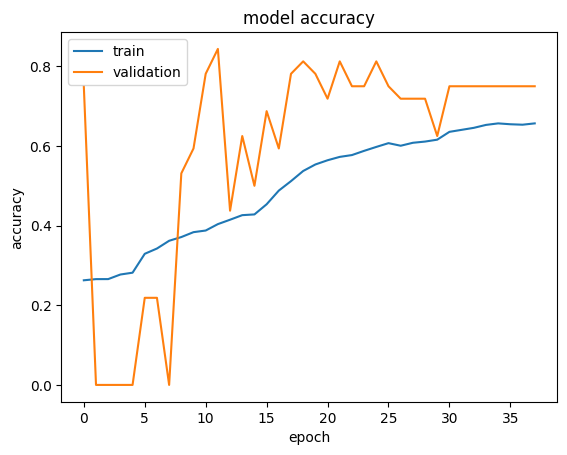

In [62]:
plt.plot(history_complex.history["accuracy"])
plt.plot(history_complex.history["val_accuracy"])
plt.title("model accuracy")
plt.ylabel("accuracy")
plt.xlabel("epoch")
plt.legend(["train", "validation"], loc="upper left")
plt.show()

### **Evaluating the Model on Test Set**


In [63]:
# Calculate the number of steps for the entire test set to be processed
test_steps = test_generator.samples // batch_size

# If the number of samples isn't a multiple of the batch size,
# you have one more batch with the remaining samples
if test_generator.samples % batch_size > 0:
    test_steps += 1

# Evaluating the model on the test set
evaluation_results = model_complex.evaluate(test_generator, steps=test_steps)
print(f"Loss: {evaluation_results[0]}, Accuracy: {evaluation_results[1]}")

1/4 [======>.......................] - ETA: 0s - loss: 0.6026 - accuracy: 0.8438

4/4 [==============================] - 0s 8ms/step - loss: 0.7330 - accuracy: 0.7109


Loss: 0.7330431342124939, Accuracy: 0.7109375


### **Plotting Confusion Matrix**


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 7ms/step


              precision    recall  f1-score   support

       happy       0.90      0.84      0.87        32
     neutral       0.56      0.59      0.58        32
         sad       0.51      0.56      0.54        32
    surprise       0.93      0.84      0.89        32

    accuracy                           0.71       128
   macro avg       0.73      0.71      0.72       128
weighted avg       0.73      0.71      0.72       128



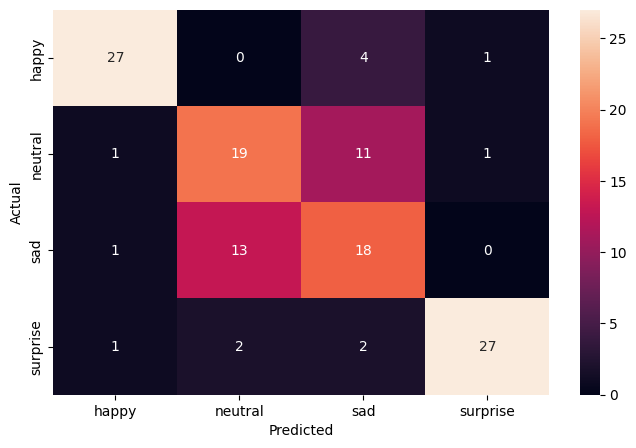

In [64]:
pred_probabilities = model_complex.predict(test_generator, steps=test_steps)
pred = np.argmax(pred_probabilities, axis=1)

# Getting the true labels from the generator
y_true = test_generator.classes

# Printing the classification report with actual emotion labels
print(classification_report(y_true, pred, target_names=CATEGORIES))

# Plotting the heatmap using confusion matrix
cm = confusion_matrix(y_true, pred)
plt.figure(figsize=(8, 5))
sns.heatmap(cm, annot=True, fmt=".0f", xticklabels=CATEGORIES, yticklabels=CATEGORIES)
plt.ylabel("Actual")
plt.xlabel("Predicted")
plt.show()

**Observations and Insights:\_\_**


### **Plotting the Confusion Matrix for the chosen final model**


1/4 [======>.......................] - ETA: 0s

4/4 [==============================] - 0s 7ms/step


              precision    recall  f1-score   support

       happy       0.90      0.84      0.87        32
     neutral       0.56      0.59      0.58        32
         sad       0.51      0.56      0.54        32
    surprise       0.93      0.84      0.89        32

    accuracy                           0.71       128
   macro avg       0.73      0.71      0.72       128
weighted avg       0.73      0.71      0.72       128



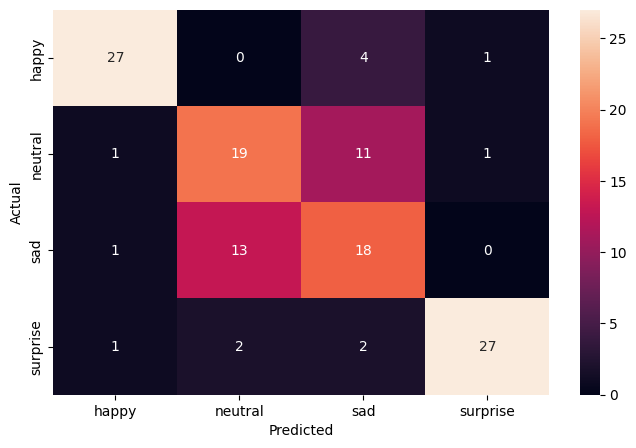

In [65]:
pred_probabilities = model_complex.predict(test_generator, steps=test_steps)
pred = np.argmax(pred_probabilities, axis=1)

# Getting the true labels from the generator
y_true = test_generator.classes

# Printing the classification report with actual emotion labels
print(classification_report(y_true, pred, target_names=CATEGORIES))

# Plotting the heatmap using confusion matrix
cm = confusion_matrix(y_true, pred)
plt.figure(figsize=(8, 5))
sns.heatmap(cm, annot=True, fmt=".0f", xticklabels=CATEGORIES, yticklabels=CATEGORIES)
plt.ylabel("Actual")
plt.xlabel("Predicted")
plt.show()

**Observations and Insights:\_\_**


## **Conclusion:\*\***\_\_\_\_**\*\***


### **Insights**

### **Refined insights**:

- What are the most meaningful insights from the data relevant to the problem?

### **Comparison of various techniques and their relative performance**:

- How do different techniques perform? Which one is performing relatively better? Is there scope to improve the performance further?

### **Proposal for the final solution design**:

- What model do you propose to be adopted? Why is this the best solution to adopt?
